In [ ]:
# This file uses the CNN + LSTM architecture to label images from the coco captions dataset.
# CITATION: The LSTM model and its embeddings are insprired from the following tutorial: https://www.analyticsvidhya.com/blog/2020/11/create-your-own-image-caption-generator-using-keras/

In [ ]:
!pip install pycocoevalcap

In [ ]:
# Basic Libraries
import numpy as np
import matplotlib.pyplot as plt
import warnings
import pickle
import json
import random
import collections
import string
from tqdm import tqdm
import itertools
from collections import Counter
import json
import os

# Auixillary
from google.colab import drive
from pycocotools.coco import COCO
from pycocoevalcap.eval import COCOEvalCap

# Tensorflow & Keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Activation, Dropout, Flatten, Dense, Input, Layer
from tensorflow.keras.layers import Embedding, LSTM, add, Concatenate, Reshape, concatenate, Bidirectional
from tensorflow.keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.applications.inception_v3 import preprocess_input
from keras import Input

# Commands
warnings.filterwarnings('ignore')
drive.mount('/content/drive')

# Create the local directories
!unzip /content/drive/MyDrive/glove.6B.200d.txt -d /content/glove6b
!unzip /content/drive/MyDrive/coco2017.zip -d /content/coco2017

Streaming output truncated to the last 5000 lines.
  inflating: /content/coco2017/val2017/000000000139.jpg  
  inflating: /content/coco2017/val2017/000000000285.jpg  
  inflating: /content/coco2017/val2017/000000000632.jpg  
  inflating: /content/coco2017/val2017/000000000724.jpg  
  inflating: /content/coco2017/val2017/000000000776.jpg  
  inflating: /content/coco2017/val2017/000000000785.jpg  
  inflating: /content/coco2017/val2017/000000000802.jpg  
  inflating: /content/coco2017/val2017/000000000872.jpg  
  inflating: /content/coco2017/val2017/000000000885.jpg  
  inflating: /content/coco2017/val2017/000000001000.jpg  
  inflating: /content/coco2017/val2017/000000001268.jpg  
  inflating: /content/coco2017/val2017/000000001296.jpg  
  inflating: /content/coco2017/val2017/000000001353.jpg  
  inflating: /content/coco2017/val2017/000000001425.jpg  
  inflating: /content/coco2017/val2017/000000001490.jpg  
  inflating: /content/coco2017/val2017/000000001503.jpg  
  inflating: /content

In [ ]:
# Initializing COCO API with the annotations file
coco = COCO('/content/coco2017/annotations/captions_train2017.json')

# Loading annotations from JSON into a variable
with open('/content/coco2017/annotations/captions_train2017.json', 'r') as f:
    annotations = json.load(f)

# Creating a mapping of image paths to their captions
image_caption_map = collections.defaultdict(list)

# Populating the image-caption mapping
for val in annotations['annotations']:
  im_path = '/content/coco2017/train2017/' + '%012d.jpg' % (val['image_id'])
  image_caption_map[im_path].append((f"{val['caption']}"))

# Reducing the dataset size by sampling a subset
image_caption_map = dict(random.sample(dict(image_caption_map).items(),
                              int(len(dict(image_caption_map)) * 0.5)))

loading annotations into memory...
Done (t=1.20s)
creating index...
index created!


In [ ]:
# Extract image ID from its path
def get_image_id(im_path):
    return im_path.split('/')[-1].rsplit('.', 1)[0]

# Remove punctuation and convert description to lowercase
def process_description(desc):
    return ''.join(ch for ch in desc if ch not in set(string.punctuation)).lower()

# Convert image-caption mapping to ID-caption format
def transform_to_id_caption_format(image_caption_map):
    new_data = {}
    for path, caps in image_caption_map.items():
        new_data[get_image_id(path)] = [process_description(cap) for cap in caps]
    return new_data

In [ ]:
# Preprocessing the captions by removing punctuations and converting to lowercase
preprocessed = {}
for path, caps in image_caption_map.items():
    preprocessed[path] = [process_description(cap) for cap in caps]

# Transforming preprocessed captions into a new format based on image IDs
new_image_map = transform_to_id_caption_format(preprocessed)

# Creating lines of text with image paths and their processed descriptions
lines = [f"{path} {description}"
         for path, d_list in new_image_map.items()
         for description in d_list]

# Joining all lines into a single string
new_descriptions = '\n'.join(lines)

# Extracting image paths from the map for training
train_img = list(image_caption_map.keys())

In [ ]:
# Initializing a dictionary to hold batch of processed descriptions
descriptions_batch = {}
lines = new_descriptions.split('\n')

# Processing each line in the new descriptions
for line in tqdm(lines):
    if not line.strip():
        continue
    img_id, *img_desc = line.split()
    # Adding 'startseq' and 'endseq' tokens to each description
    if img_id in list(new_image_map.keys()):
        desc = 'startseq {} endseq'.format(' '.join(img_desc))
        descriptions_batch.setdefault(img_id, []).append(desc)


100%|██████████| 296999/296999 [06:52<00:00, 719.40it/s]


In [ ]:
# Creating a flat list of all captions
captions_batch = list(itertools.chain.from_iterable(descriptions_batch.values()))

# Generating a vocabulary from the captions
words = [word for sent in captions_batch for word in sent.split()]
vocab = [word for word, count in Counter(words).items() if count >= 10]

# Creating word-to-index and index-to-word mappings
wordtoix = {word: index+1 for index, word in enumerate(vocab)}
ixtoword = {index: word for word, index in wordtoix.items()}
vocab_size = len(ixtoword) + 1

# Gathering all descriptions to determine the max length
all_desc = [desc for descs in descriptions_batch.values() for desc in descs]
max_length = max(map(lambda x: len(x.split()), all_desc))

In [ ]:
# Initializing a dictionary to store word embeddings
embedding_map = {}
with open('/content/glove6b/glove.6B.200d.txt', encoding="utf-8") as f:
    for line in f:
        values = line.strip().split()
        embedding_map[values[0]] = np.asarray(values[1:], dtype='float32')

# Defining the embedding dimension
embedding_dim = 200
embedding_mat = np.zeros((vocab_size, embedding_dim))

# Populating the embedding matrix with known embeddings
embeddings_keep = {wordtoix[word]: embedding_map[word] for word in wordtoix if word in embedding_map}
for index, embeds in embeddings_keep.items():
    embedding_mat[index] = embeds

In [ ]:
# Setting up the InceptionV3 model for image feature extraction
base_model = InceptionV3(weights='imagenet')
model_new = Model(inputs=base_model.input, outputs=base_model.layers[-2].output)

# Function to preprocess input images for the model
def image_preprocessing(im_path):
    image = load_img(im_path, target_size=(299, 299))
    image_arr = img_to_array(image)
    image_arr = np.expand_dims(image_arr, axis=0)
    return preprocess_input(image_arr)

# Extracting feature vectors from preprocessed images
def fetch_encoding(im_path):
    processed_image = image_preprocessing(im_path)
    feature_vector = model_new.predict(processed_image)
    return np.squeeze(feature_vector)

# Processing all training images to get their feature vectors
training_data = {im_path.split('/')[-1]: fetch_encoding(im_path) for im_path in tqdm(train_img)}

96112376/96112376 [==============================] - 5s 0us/step


  0%|          | 0/59143 [00:00<?, ?it/s]

1/1 [==============================] - 9s 9s/step


  0%|          | 1/59143 [00:09<155:02:51,  9.44s/it]

1/1 [==============================] - 0s 26ms/step


  0%|          | 3/59143 [00:09<41:10:18,  2.51s/it] 

1/1 [==============================] - 0s 26ms/step


  0%|          | 5/59143 [00:09<20:35:02,  1.25s/it]

1/1 [==============================] - 0s 26ms/step


  0%|          | 7/59143 [00:09<12:21:56,  1.33it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 9/59143 [00:10<8:08:06,  2.02it/s] 

1/1 [==============================] - 0s 25ms/step


  0%|          | 11/59143 [00:10<5:44:26,  2.86it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 13/59143 [00:10<4:12:39,  3.90it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 15/59143 [00:10<3:14:14,  5.07it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 17/59143 [00:10<2:34:54,  6.36it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 19/59143 [00:10<2:07:53,  7.71it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 21/59143 [00:10<1:48:53,  9.05it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 23/59143 [00:11<1:38:24, 10.01it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 25/59143 [00:11<1:29:54, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 27/59143 [00:11<1:27:10, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 29/59143 [00:11<1:21:33, 12.08it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 31/59143 [00:11<1:17:21, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 33/59143 [00:11<1:15:52, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 35/59143 [00:11<1:15:47, 13.00it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 37/59143 [00:12<1:14:44, 13.18it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 39/59143 [00:12<1:13:43, 13.36it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 41/59143 [00:12<1:12:51, 13.52it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 43/59143 [00:12<1:13:21, 13.43it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 45/59143 [00:12<1:13:10, 13.46it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 47/59143 [00:12<1:12:52, 13.51it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 49/59143 [00:12<1:13:33, 13.39it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 51/59143 [00:13<1:14:24, 13.24it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 53/59143 [00:13<1:18:21, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 55/59143 [00:13<1:16:41, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 57/59143 [00:13<1:15:15, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 59/59143 [00:13<1:15:01, 13.12it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 61/59143 [00:13<1:15:37, 13.02it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 63/59143 [00:14<1:15:13, 13.09it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 65/59143 [00:14<1:14:34, 13.20it/s]

1/1 [==============================] - 0s 40ms/step


  0%|          | 67/59143 [00:14<1:15:19, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 69/59143 [00:14<1:14:27, 13.22it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 71/59143 [00:14<1:14:40, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 73/59143 [00:14<1:13:14, 13.44it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 75/59143 [00:14<1:12:17, 13.62it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 77/59143 [00:15<1:11:41, 13.73it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 79/59143 [00:15<1:13:18, 13.43it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 81/59143 [00:15<1:12:37, 13.56it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 83/59143 [00:15<1:13:10, 13.45it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 85/59143 [00:15<1:13:36, 13.37it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 87/59143 [00:15<1:13:31, 13.39it/s]

1/1 [==============================] - 0s 30ms/step


  0%|          | 89/59143 [00:15<1:15:24, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 91/59143 [00:16<1:17:09, 12.76it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 93/59143 [00:16<1:15:56, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 95/59143 [00:16<1:15:19, 13.06it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 97/59143 [00:16<1:16:33, 12.86it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 99/59143 [00:16<1:16:59, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 101/59143 [00:16<1:16:24, 12.88it/s]

1/1 [==============================] - 0s 30ms/step


  0%|          | 103/59143 [00:17<1:17:12, 12.74it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 105/59143 [00:17<1:17:10, 12.75it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 107/59143 [00:17<1:17:52, 12.63it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 109/59143 [00:17<1:18:13, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 111/59143 [00:17<1:18:37, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 113/59143 [00:17<1:18:07, 12.59it/s]

1/1 [==============================] - 0s 30ms/step


  0%|          | 115/59143 [00:18<1:19:06, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 117/59143 [00:18<1:17:39, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 119/59143 [00:18<1:16:06, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 121/59143 [00:18<1:15:14, 13.07it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 123/59143 [00:18<1:14:15, 13.25it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 125/59143 [00:18<1:16:04, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 127/59143 [00:18<1:15:17, 13.07it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 129/59143 [00:19<1:14:24, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 131/59143 [00:19<1:14:05, 13.27it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 133/59143 [00:19<1:15:46, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 135/59143 [00:19<1:15:22, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 137/59143 [00:19<1:14:19, 13.23it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 139/59143 [00:19<1:14:17, 13.24it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 141/59143 [00:19<1:14:03, 13.28it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 143/59143 [00:20<1:16:53, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 145/59143 [00:20<1:16:22, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 147/59143 [00:20<1:15:44, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 149/59143 [00:20<1:15:03, 13.10it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 151/59143 [00:20<1:15:09, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 153/59143 [00:20<1:13:55, 13.30it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 155/59143 [00:21<1:13:26, 13.39it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 157/59143 [00:21<1:13:03, 13.46it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 159/59143 [00:21<1:12:32, 13.55it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 161/59143 [00:21<1:13:23, 13.39it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 163/59143 [00:21<1:13:21, 13.40it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 165/59143 [00:21<1:13:23, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 167/59143 [00:21<1:12:58, 13.47it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 169/59143 [00:22<1:11:59, 13.65it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 171/59143 [00:22<1:10:32, 13.93it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 173/59143 [00:22<1:10:05, 14.02it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 175/59143 [00:22<1:09:20, 14.17it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 177/59143 [00:22<1:08:43, 14.30it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 179/59143 [00:22<1:12:51, 13.49it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 181/59143 [00:22<1:13:32, 13.36it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 183/59143 [00:23<1:12:05, 13.63it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 185/59143 [00:23<1:11:29, 13.75it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 187/59143 [00:23<1:12:40, 13.52it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 189/59143 [00:23<1:12:57, 13.47it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 191/59143 [00:23<1:11:18, 13.78it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 193/59143 [00:23<1:10:00, 14.04it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 195/59143 [00:23<1:09:35, 14.12it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 197/59143 [00:24<1:10:42, 13.90it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 199/59143 [00:24<1:10:41, 13.90it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 201/59143 [00:24<1:10:05, 14.02it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 203/59143 [00:24<1:09:19, 14.17it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 205/59143 [00:24<1:10:11, 14.00it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 207/59143 [00:24<1:10:03, 14.02it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 209/59143 [00:24<1:10:23, 13.96it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 211/59143 [00:25<1:10:21, 13.96it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 213/59143 [00:25<1:10:53, 13.86it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 215/59143 [00:25<1:10:19, 13.97it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 217/59143 [00:25<1:09:48, 14.07it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 219/59143 [00:25<1:08:49, 14.27it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 221/59143 [00:25<1:09:01, 14.23it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 223/59143 [00:25<1:09:46, 14.07it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 225/59143 [00:26<1:08:58, 14.24it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 227/59143 [00:26<1:08:54, 14.25it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 229/59143 [00:26<1:08:59, 14.23it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 231/59143 [00:26<1:08:34, 14.32it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 233/59143 [00:26<1:10:03, 14.01it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 235/59143 [00:26<1:09:58, 14.03it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 237/59143 [00:26<1:09:30, 14.13it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 239/59143 [00:27<1:08:31, 14.33it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 241/59143 [00:27<1:08:56, 14.24it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 243/59143 [00:27<1:08:28, 14.34it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 245/59143 [00:27<1:10:00, 14.02it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 247/59143 [00:27<1:10:00, 14.02it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 249/59143 [00:27<1:09:51, 14.05it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 251/59143 [00:27<1:11:34, 13.71it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 253/59143 [00:28<1:12:24, 13.56it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 255/59143 [00:28<1:12:33, 13.53it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 257/59143 [00:28<1:12:16, 13.58it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 259/59143 [00:28<1:13:49, 13.29it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 261/59143 [00:28<1:15:25, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 263/59143 [00:28<1:14:16, 13.21it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 265/59143 [00:29<1:13:31, 13.35it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 267/59143 [00:29<1:12:58, 13.45it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 269/59143 [00:29<1:13:53, 13.28it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 271/59143 [00:29<1:14:08, 13.23it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 273/59143 [00:29<1:14:49, 13.11it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 275/59143 [00:29<1:16:29, 12.83it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 277/59143 [00:29<1:16:28, 12.83it/s]

1/1 [==============================] - 0s 31ms/step


  0%|          | 279/59143 [00:30<1:16:21, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 281/59143 [00:30<1:15:35, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 283/59143 [00:30<1:16:41, 12.79it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 285/59143 [00:30<1:16:39, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 287/59143 [00:30<1:16:30, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 289/59143 [00:30<1:15:06, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 291/59143 [00:31<1:13:41, 13.31it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 293/59143 [00:31<1:12:09, 13.59it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 295/59143 [00:31<1:12:27, 13.54it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 297/59143 [00:31<1:11:42, 13.68it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 299/59143 [00:31<1:11:30, 13.72it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 301/59143 [00:31<1:12:33, 13.52it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 303/59143 [00:31<1:12:11, 13.58it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 305/59143 [00:32<1:14:31, 13.16it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 307/59143 [00:32<1:13:58, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 309/59143 [00:32<1:13:58, 13.26it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 311/59143 [00:32<1:12:49, 13.46it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 313/59143 [00:32<1:13:43, 13.30it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 315/59143 [00:32<1:13:55, 13.26it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 317/59143 [00:32<1:13:25, 13.35it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 319/59143 [00:33<1:13:11, 13.39it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 321/59143 [00:33<1:13:17, 13.38it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 323/59143 [00:33<1:15:48, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 325/59143 [00:33<1:16:14, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 327/59143 [00:33<1:16:59, 12.73it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 329/59143 [00:33<1:17:45, 12.61it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 331/59143 [00:34<1:18:43, 12.45it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 333/59143 [00:34<1:17:03, 12.72it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 335/59143 [00:34<1:15:10, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 337/59143 [00:34<1:13:54, 13.26it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 339/59143 [00:34<1:14:30, 13.15it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 341/59143 [00:34<1:17:23, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 343/59143 [00:34<1:17:52, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 345/59143 [00:35<1:17:37, 12.63it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 347/59143 [00:35<1:15:35, 12.96it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 349/59143 [00:35<1:15:17, 13.02it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 351/59143 [00:35<1:16:08, 12.87it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 353/59143 [00:35<1:13:39, 13.30it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 355/59143 [00:35<1:11:52, 13.63it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 357/59143 [00:36<1:10:43, 13.85it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 359/59143 [00:36<1:12:13, 13.57it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 361/59143 [00:36<1:10:49, 13.83it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 363/59143 [00:36<1:09:39, 14.07it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 365/59143 [00:36<1:08:57, 14.20it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 367/59143 [00:36<1:09:25, 14.11it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 369/59143 [00:36<1:08:46, 14.24it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 371/59143 [00:36<1:07:48, 14.44it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 373/59143 [00:37<1:07:47, 14.45it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 375/59143 [00:37<1:07:23, 14.53it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 377/59143 [00:37<1:08:43, 14.25it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 379/59143 [00:37<1:08:30, 14.30it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 381/59143 [00:37<1:08:17, 14.34it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 383/59143 [00:37<1:08:15, 14.35it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 385/59143 [00:37<1:09:08, 14.17it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 387/59143 [00:38<1:09:07, 14.17it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 389/59143 [00:38<1:08:42, 14.25it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 391/59143 [00:38<1:07:55, 14.42it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 393/59143 [00:38<1:08:17, 14.34it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 395/59143 [00:38<1:09:55, 14.00it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 397/59143 [00:38<1:10:47, 13.83it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 399/59143 [00:38<1:10:47, 13.83it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 401/59143 [00:39<1:11:50, 13.63it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 403/59143 [00:39<1:13:18, 13.36it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 405/59143 [00:39<1:13:00, 13.41it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 407/59143 [00:39<1:11:43, 13.65it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 409/59143 [00:39<1:11:37, 13.67it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 411/59143 [00:39<1:11:29, 13.69it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 413/59143 [00:40<1:12:18, 13.54it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 415/59143 [00:40<1:12:24, 13.52it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 417/59143 [00:40<1:11:58, 13.60it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 419/59143 [00:40<1:12:38, 13.47it/s]

1/1 [==============================] - 0s 31ms/step


  1%|          | 421/59143 [00:40<1:15:11, 13.02it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 423/59143 [00:40<1:15:59, 12.88it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 425/59143 [00:40<1:16:43, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 427/59143 [00:41<1:16:28, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 429/59143 [00:41<1:16:16, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 431/59143 [00:41<1:17:26, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 433/59143 [00:41<1:17:55, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 435/59143 [00:41<1:16:29, 12.79it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 437/59143 [00:41<1:14:51, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 439/59143 [00:42<1:14:36, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 441/59143 [00:42<1:14:53, 13.06it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 443/59143 [00:42<1:14:14, 13.18it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 445/59143 [00:42<1:13:34, 13.30it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 447/59143 [00:42<1:14:10, 13.19it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 449/59143 [00:42<1:15:30, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 451/59143 [00:42<1:16:08, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 453/59143 [00:43<1:15:07, 13.02it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 455/59143 [00:43<1:15:15, 13.00it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 457/59143 [00:43<1:15:43, 12.92it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 459/59143 [00:43<1:15:36, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 461/59143 [00:43<1:15:32, 12.95it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 463/59143 [00:43<1:15:42, 12.92it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 465/59143 [00:44<1:15:56, 12.88it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 467/59143 [00:44<1:16:52, 12.72it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 469/59143 [00:44<1:17:17, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 471/59143 [00:44<1:17:08, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 473/59143 [00:44<1:16:40, 12.75it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 475/59143 [00:44<1:18:02, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 477/59143 [00:44<1:17:30, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 479/59143 [00:45<1:17:13, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 481/59143 [00:45<1:16:36, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 483/59143 [00:45<1:16:06, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 485/59143 [00:45<1:16:37, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 487/59143 [00:45<1:15:37, 12.93it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 489/59143 [00:45<1:13:57, 13.22it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 491/59143 [00:46<1:13:21, 13.32it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 493/59143 [00:46<1:14:59, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 495/59143 [00:46<1:14:41, 13.09it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 497/59143 [00:46<1:15:03, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 499/59143 [00:46<1:14:27, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 501/59143 [00:46<1:14:17, 13.16it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 503/59143 [00:46<1:16:32, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 505/59143 [00:47<1:16:13, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 507/59143 [00:47<1:14:50, 13.06it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 509/59143 [00:47<1:14:25, 13.13it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 511/59143 [00:47<1:16:36, 12.76it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 513/59143 [00:47<1:17:16, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 515/59143 [00:47<1:18:08, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 517/59143 [00:48<1:17:46, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 519/59143 [00:48<1:16:03, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 521/59143 [00:48<1:16:44, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 523/59143 [00:48<1:16:00, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 525/59143 [00:48<1:13:50, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 527/59143 [00:48<1:12:46, 13.42it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 529/59143 [00:48<1:13:38, 13.26it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 531/59143 [00:49<1:13:57, 13.21it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 533/59143 [00:49<1:13:21, 13.32it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 535/59143 [00:49<1:11:16, 13.70it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 537/59143 [00:49<1:09:21, 14.08it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 539/59143 [00:49<1:10:42, 13.81it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 541/59143 [00:49<1:09:29, 14.05it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 543/59143 [00:49<1:09:29, 14.06it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 545/59143 [00:50<1:09:24, 14.07it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 547/59143 [00:50<1:09:34, 14.04it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 549/59143 [00:50<1:09:16, 14.10it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 551/59143 [00:50<1:09:36, 14.03it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 553/59143 [00:50<1:09:24, 14.07it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 555/59143 [00:50<1:09:25, 14.07it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 557/59143 [00:50<1:10:58, 13.76it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 559/59143 [00:51<1:10:25, 13.86it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 561/59143 [00:51<1:10:08, 13.92it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 563/59143 [00:51<1:09:28, 14.05it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 565/59143 [00:51<1:10:28, 13.85it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 567/59143 [00:51<1:10:33, 13.84it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 569/59143 [00:51<1:09:57, 13.95it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 571/59143 [00:51<1:09:15, 14.10it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 573/59143 [00:52<1:09:21, 14.07it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 575/59143 [00:52<1:10:33, 13.83it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 577/59143 [00:52<1:10:37, 13.82it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 579/59143 [00:52<1:09:31, 14.04it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 581/59143 [00:52<1:09:14, 14.10it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 583/59143 [00:52<1:09:19, 14.08it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 585/59143 [00:52<1:08:46, 14.19it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 587/59143 [00:53<1:07:40, 14.42it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 589/59143 [00:53<1:08:28, 14.25it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 591/59143 [00:53<1:08:05, 14.33it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 593/59143 [00:53<1:08:17, 14.29it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 595/59143 [00:53<1:08:02, 14.34it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 597/59143 [00:53<1:07:32, 14.45it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 599/59143 [00:53<1:07:36, 14.43it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 601/59143 [00:54<1:09:28, 14.05it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 603/59143 [00:54<1:10:23, 13.86it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 605/59143 [00:54<1:11:44, 13.60it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 607/59143 [00:54<1:10:18, 13.88it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 609/59143 [00:54<1:09:52, 13.96it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 611/59143 [00:54<1:12:06, 13.53it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 613/59143 [00:54<1:11:43, 13.60it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 615/59143 [00:55<1:11:43, 13.60it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 617/59143 [00:55<1:14:05, 13.17it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 619/59143 [00:55<1:15:39, 12.89it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 621/59143 [00:55<1:16:04, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 623/59143 [00:55<1:15:03, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 625/59143 [00:55<1:13:48, 13.21it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 627/59143 [00:56<1:13:42, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 629/59143 [00:56<1:14:12, 13.14it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 631/59143 [00:56<1:13:47, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 633/59143 [00:56<1:13:20, 13.30it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 635/59143 [00:56<1:14:13, 13.14it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 637/59143 [00:56<1:15:34, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 639/59143 [00:57<1:16:15, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 641/59143 [00:57<1:15:36, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 643/59143 [00:57<1:15:49, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 645/59143 [00:57<1:14:59, 13.00it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 647/59143 [00:57<1:16:05, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 649/59143 [00:57<1:15:01, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 651/59143 [00:57<1:13:46, 13.21it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 653/59143 [00:58<1:12:19, 13.48it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 655/59143 [00:58<1:13:34, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 657/59143 [00:58<1:13:49, 13.20it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 659/59143 [00:58<1:13:24, 13.28it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 661/59143 [00:58<1:12:58, 13.36it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 663/59143 [00:58<1:11:50, 13.57it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 665/59143 [00:58<1:14:05, 13.16it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 667/59143 [00:59<1:13:44, 13.22it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 669/59143 [00:59<1:13:35, 13.24it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 671/59143 [00:59<1:12:51, 13.38it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 673/59143 [00:59<1:13:34, 13.25it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 675/59143 [00:59<1:14:37, 13.06it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 677/59143 [00:59<1:14:23, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 679/59143 [01:00<1:14:04, 13.15it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 681/59143 [01:00<1:14:45, 13.03it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 683/59143 [01:00<1:15:48, 12.85it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 685/59143 [01:00<1:16:02, 12.81it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 687/59143 [01:00<1:16:21, 12.76it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 689/59143 [01:00<1:16:20, 12.76it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 691/59143 [01:00<1:17:41, 12.54it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 693/59143 [01:01<1:19:15, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 695/59143 [01:01<1:19:45, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 697/59143 [01:01<1:18:47, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 699/59143 [01:01<1:17:47, 12.52it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 701/59143 [01:01<1:19:07, 12.31it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 703/59143 [01:01<1:18:16, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 705/59143 [01:02<1:17:34, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 707/59143 [01:02<1:16:43, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 709/59143 [01:02<1:14:36, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 711/59143 [01:02<1:14:01, 13.15it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 713/59143 [01:02<1:12:03, 13.51it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 715/59143 [01:02<1:10:29, 13.82it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 717/59143 [01:02<1:09:28, 14.01it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 719/59143 [01:03<1:09:26, 14.02it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 721/59143 [01:03<1:09:02, 14.10it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 723/59143 [01:03<1:08:17, 14.26it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 725/59143 [01:03<1:07:54, 14.34it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 727/59143 [01:03<1:07:20, 14.46it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 729/59143 [01:03<1:08:34, 14.20it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 731/59143 [01:03<1:09:36, 13.99it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 733/59143 [01:04<1:08:34, 14.20it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 735/59143 [01:04<1:09:00, 14.11it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 737/59143 [01:04<1:09:24, 14.02it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 739/59143 [01:04<1:08:28, 14.22it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 741/59143 [01:04<1:08:24, 14.23it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 743/59143 [01:04<1:08:15, 14.26it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 745/59143 [01:04<1:07:54, 14.33it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 747/59143 [01:05<1:08:53, 14.13it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 749/59143 [01:05<1:08:48, 14.15it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 751/59143 [01:05<1:08:54, 14.12it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 753/59143 [01:05<1:08:16, 14.25it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 755/59143 [01:05<1:08:55, 14.12it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 757/59143 [01:05<1:09:30, 14.00it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 759/59143 [01:05<1:09:18, 14.04it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 761/59143 [01:06<1:09:44, 13.95it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 763/59143 [01:06<1:09:58, 13.90it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 765/59143 [01:06<1:11:12, 13.66it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 767/59143 [01:06<1:10:38, 13.77it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 769/59143 [01:06<1:11:18, 13.64it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 771/59143 [01:06<1:10:59, 13.70it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 773/59143 [01:06<1:12:50, 13.36it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 775/59143 [01:07<1:14:09, 13.12it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 777/59143 [01:07<1:13:30, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 779/59143 [01:07<1:13:28, 13.24it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 781/59143 [01:07<1:14:07, 13.12it/s]

1/1 [==============================] - 0s 29ms/step


  1%|▏         | 783/59143 [01:07<1:16:21, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 785/59143 [01:07<1:15:58, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 787/59143 [01:08<1:15:02, 12.96it/s]

1/1 [==============================] - 0s 29ms/step


  1%|▏         | 789/59143 [01:08<1:15:54, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 791/59143 [01:08<1:16:04, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 793/59143 [01:08<1:15:37, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 795/59143 [01:08<1:14:53, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 797/59143 [01:08<1:14:49, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 799/59143 [01:08<1:15:15, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 801/59143 [01:09<1:15:49, 12.82it/s]

1/1 [==============================] - 0s 29ms/step


  1%|▏         | 803/59143 [01:09<1:15:39, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 805/59143 [01:09<1:14:37, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 807/59143 [01:09<1:14:10, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 809/59143 [01:09<1:14:21, 13.08it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 811/59143 [01:09<1:13:40, 13.20it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 813/59143 [01:10<1:12:55, 13.33it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 815/59143 [01:10<1:11:56, 13.51it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 817/59143 [01:10<1:11:52, 13.52it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 819/59143 [01:10<1:13:18, 13.26it/s]

1/1 [==============================] - 0s 31ms/step


  1%|▏         | 821/59143 [01:10<1:14:18, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 823/59143 [01:10<1:13:28, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 825/59143 [01:10<1:12:27, 13.41it/s]

1/1 [==============================] - 0s 29ms/step


  1%|▏         | 827/59143 [01:11<1:14:09, 13.11it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 829/59143 [01:11<1:14:02, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 831/59143 [01:11<1:14:05, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 833/59143 [01:11<1:14:04, 13.12it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 835/59143 [01:11<1:13:32, 13.21it/s]

1/1 [==============================] - 0s 29ms/step


  1%|▏         | 837/59143 [01:11<1:15:16, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 839/59143 [01:12<1:15:32, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 841/59143 [01:12<1:14:41, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 843/59143 [01:12<1:14:18, 13.08it/s]

1/1 [==============================] - 0s 29ms/step


  1%|▏         | 845/59143 [01:12<1:15:08, 12.93it/s]

1/1 [==============================] - 0s 29ms/step


  1%|▏         | 847/59143 [01:12<1:15:16, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 849/59143 [01:12<1:16:17, 12.74it/s]

1/1 [==============================] - 0s 29ms/step


  1%|▏         | 851/59143 [01:12<1:15:47, 12.82it/s]

1/1 [==============================] - 0s 29ms/step


  1%|▏         | 853/59143 [01:13<1:16:27, 12.71it/s]

1/1 [==============================] - 0s 29ms/step


  1%|▏         | 855/59143 [01:13<1:17:16, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 857/59143 [01:13<1:16:01, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 859/59143 [01:13<1:14:45, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 861/59143 [01:13<1:14:12, 13.09it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 863/59143 [01:13<1:13:56, 13.14it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 865/59143 [01:14<1:13:34, 13.20it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 867/59143 [01:14<1:13:46, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 869/59143 [01:14<1:13:05, 13.29it/s]

1/1 [==============================] - 0s 29ms/step


  1%|▏         | 871/59143 [01:14<1:13:55, 13.14it/s]

1/1 [==============================] - 0s 29ms/step


  1%|▏         | 873/59143 [01:14<1:15:25, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 875/59143 [01:14<1:15:15, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 877/59143 [01:14<1:15:11, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 879/59143 [01:15<1:15:02, 12.94it/s]

1/1 [==============================] - 0s 29ms/step


  1%|▏         | 881/59143 [01:15<1:15:15, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 883/59143 [01:15<1:14:51, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 885/59143 [01:15<1:14:07, 13.10it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 887/59143 [01:15<1:13:44, 13.17it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 889/59143 [01:15<1:16:19, 12.72it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 891/59143 [01:16<1:17:58, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 893/59143 [01:16<1:16:59, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 895/59143 [01:16<1:15:09, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 897/59143 [01:16<1:15:02, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 899/59143 [01:16<1:15:37, 12.84it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 901/59143 [01:16<1:14:36, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 903/59143 [01:16<1:14:19, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 905/59143 [01:17<1:13:41, 13.17it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 907/59143 [01:17<1:13:18, 13.24it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 909/59143 [01:17<1:12:15, 13.43it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 911/59143 [01:17<1:10:43, 13.72it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 913/59143 [01:17<1:09:46, 13.91it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 915/59143 [01:17<1:08:58, 14.07it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 917/59143 [01:17<1:09:24, 13.98it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 919/59143 [01:18<1:09:40, 13.93it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 921/59143 [01:18<1:10:12, 13.82it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 923/59143 [01:18<1:09:47, 13.90it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 925/59143 [01:18<1:10:04, 13.85it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 927/59143 [01:18<1:11:36, 13.55it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 929/59143 [01:18<1:12:37, 13.36it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 931/59143 [01:19<1:11:43, 13.53it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 933/59143 [01:19<1:10:57, 13.67it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 935/59143 [01:19<1:11:36, 13.55it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 937/59143 [01:19<1:10:30, 13.76it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 939/59143 [01:19<1:09:40, 13.92it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 941/59143 [01:19<1:09:18, 14.00it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 943/59143 [01:19<1:09:10, 14.02it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 945/59143 [01:20<1:11:18, 13.60it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 947/59143 [01:20<1:13:10, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 949/59143 [01:20<1:12:59, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 951/59143 [01:20<1:12:57, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 953/59143 [01:20<1:13:36, 13.17it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 955/59143 [01:20<1:12:32, 13.37it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 957/59143 [01:20<1:12:03, 13.46it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 959/59143 [01:21<1:09:53, 13.87it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 961/59143 [01:21<1:09:09, 14.02it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 963/59143 [01:21<1:09:21, 13.98it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 965/59143 [01:21<1:08:39, 14.12it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 967/59143 [01:21<1:08:27, 14.16it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 969/59143 [01:21<1:08:13, 14.21it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 971/59143 [01:21<1:09:37, 13.92it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 973/59143 [01:22<1:09:27, 13.96it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 975/59143 [01:22<1:09:51, 13.88it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 977/59143 [01:22<1:09:12, 14.01it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 979/59143 [01:22<1:08:33, 14.14it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 981/59143 [01:22<1:10:26, 13.76it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 983/59143 [01:22<1:10:37, 13.73it/s]

1/1 [==============================] - 0s 31ms/step


  2%|▏         | 985/59143 [01:22<1:10:44, 13.70it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 987/59143 [01:23<1:10:51, 13.68it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 989/59143 [01:23<1:12:41, 13.33it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 991/59143 [01:23<1:13:34, 13.17it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 993/59143 [01:23<1:13:30, 13.18it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 995/59143 [01:23<1:13:49, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 997/59143 [01:23<1:13:29, 13.19it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 999/59143 [01:24<1:13:41, 13.15it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1001/59143 [01:24<1:13:07, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1003/59143 [01:24<1:12:27, 13.37it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1005/59143 [01:24<1:12:25, 13.38it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1007/59143 [01:24<1:13:33, 13.17it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 1009/59143 [01:24<1:14:08, 13.07it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1011/59143 [01:24<1:13:47, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1013/59143 [01:25<1:13:59, 13.09it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1015/59143 [01:25<1:14:10, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1017/59143 [01:25<1:14:45, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1019/59143 [01:25<1:15:06, 12.90it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1021/59143 [01:25<1:13:33, 13.17it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1023/59143 [01:25<1:13:00, 13.27it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1025/59143 [01:25<1:13:04, 13.26it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1027/59143 [01:26<1:12:48, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1029/59143 [01:26<1:11:32, 13.54it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1031/59143 [01:26<1:11:14, 13.60it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 1033/59143 [01:26<1:12:04, 13.44it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 1035/59143 [01:26<1:12:48, 13.30it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1037/59143 [01:26<1:13:17, 13.21it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1039/59143 [01:27<1:14:04, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1041/59143 [01:27<1:13:20, 13.20it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1043/59143 [01:27<1:14:10, 13.06it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1045/59143 [01:27<1:14:25, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1047/59143 [01:27<1:14:47, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1049/59143 [01:27<1:14:43, 12.96it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 1051/59143 [01:27<1:14:57, 12.92it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 1053/59143 [01:28<1:17:43, 12.46it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 1055/59143 [01:28<1:17:59, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 1057/59143 [01:28<1:17:19, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1059/59143 [01:28<1:17:26, 12.50it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 1061/59143 [01:28<1:18:41, 12.30it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 1063/59143 [01:28<1:18:29, 12.33it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▏         | 1065/59143 [01:29<1:19:16, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 1067/59143 [01:29<1:18:38, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1069/59143 [01:29<1:18:30, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 1071/59143 [01:29<1:18:36, 12.31it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 1073/59143 [01:29<1:18:07, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1075/59143 [01:29<1:17:06, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1077/59143 [01:30<1:17:01, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1079/59143 [01:30<1:16:14, 12.69it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1081/59143 [01:30<1:14:23, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1083/59143 [01:30<1:12:45, 13.30it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1085/59143 [01:30<1:10:30, 13.72it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1087/59143 [01:30<1:09:36, 13.90it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1089/59143 [01:30<1:10:50, 13.66it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1091/59143 [01:31<1:09:54, 13.84it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1093/59143 [01:31<1:08:39, 14.09it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1095/59143 [01:31<1:08:42, 14.08it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1097/59143 [01:31<1:09:39, 13.89it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1099/59143 [01:31<1:09:13, 13.97it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1101/59143 [01:31<1:08:40, 14.09it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1103/59143 [01:31<1:08:24, 14.14it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1105/59143 [01:32<1:07:36, 14.31it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1107/59143 [01:32<1:08:51, 14.05it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1109/59143 [01:32<1:08:32, 14.11it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1111/59143 [01:32<1:08:25, 14.14it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1113/59143 [01:32<1:08:22, 14.15it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1115/59143 [01:32<1:10:51, 13.65it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1117/59143 [01:32<1:10:19, 13.75it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1119/59143 [01:33<1:09:44, 13.87it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1121/59143 [01:33<1:10:04, 13.80it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1123/59143 [01:33<1:09:58, 13.82it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1125/59143 [01:33<1:10:32, 13.71it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1127/59143 [01:33<1:09:39, 13.88it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1129/59143 [01:33<1:08:25, 14.13it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1131/59143 [01:33<1:07:30, 14.32it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1133/59143 [01:34<1:09:08, 13.98it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1135/59143 [01:34<1:10:29, 13.71it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1137/59143 [01:34<1:09:41, 13.87it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1139/59143 [01:34<1:10:39, 13.68it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1141/59143 [01:34<1:11:29, 13.52it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1143/59143 [01:34<1:13:22, 13.18it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1145/59143 [01:34<1:13:39, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1147/59143 [01:35<1:12:50, 13.27it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1149/59143 [01:35<1:12:33, 13.32it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1151/59143 [01:35<1:13:47, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1153/59143 [01:35<1:13:13, 13.20it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1155/59143 [01:35<1:12:32, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1157/59143 [01:35<1:12:44, 13.29it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1159/59143 [01:36<1:12:43, 13.29it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1161/59143 [01:36<1:14:25, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1163/59143 [01:36<1:14:03, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1165/59143 [01:36<1:14:31, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1167/59143 [01:36<1:13:40, 13.12it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1169/59143 [01:36<1:14:40, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1171/59143 [01:36<1:14:32, 12.96it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1173/59143 [01:37<1:13:06, 13.21it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1175/59143 [01:37<1:12:33, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1177/59143 [01:37<1:11:56, 13.43it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1179/59143 [01:37<1:13:17, 13.18it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1181/59143 [01:37<1:12:29, 13.33it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1183/59143 [01:37<1:11:46, 13.46it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1185/59143 [01:38<1:11:52, 13.44it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 1187/59143 [01:38<1:12:55, 13.25it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1189/59143 [01:38<1:13:39, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1191/59143 [01:38<1:13:01, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1193/59143 [01:38<1:12:36, 13.30it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1195/59143 [01:38<1:13:02, 13.22it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1197/59143 [01:38<1:13:50, 13.08it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1199/59143 [01:39<1:14:02, 13.04it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1201/59143 [01:39<1:13:32, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1203/59143 [01:39<1:14:18, 12.99it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 1205/59143 [01:39<1:16:07, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 1207/59143 [01:39<1:16:09, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 1209/59143 [01:39<1:16:09, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 1211/59143 [01:40<1:15:01, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1213/59143 [01:40<1:14:11, 13.01it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 1215/59143 [01:40<1:15:06, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1217/59143 [01:40<1:14:30, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1219/59143 [01:40<1:14:22, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1221/59143 [01:40<1:15:20, 12.81it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 1223/59143 [01:40<1:16:52, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1225/59143 [01:41<1:16:36, 12.60it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 1227/59143 [01:41<1:16:25, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1229/59143 [01:41<1:15:30, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1231/59143 [01:41<1:14:58, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1233/59143 [01:41<1:15:33, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1235/59143 [01:41<1:14:28, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1237/59143 [01:42<1:14:16, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1239/59143 [01:42<1:13:42, 13.09it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 1241/59143 [01:42<1:13:52, 13.06it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 1243/59143 [01:42<1:15:38, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1245/59143 [01:42<1:14:31, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1247/59143 [01:42<1:14:27, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1249/59143 [01:42<1:13:20, 13.16it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 1251/59143 [01:43<1:14:26, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1253/59143 [01:43<1:14:57, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1255/59143 [01:43<1:15:58, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1257/59143 [01:43<1:16:04, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1259/59143 [01:43<1:14:58, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1261/59143 [01:43<1:16:19, 12.64it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1263/59143 [01:44<1:15:18, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1265/59143 [01:44<1:15:16, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1267/59143 [01:44<1:15:15, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1269/59143 [01:44<1:15:09, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1271/59143 [01:44<1:14:33, 12.94it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 1273/59143 [01:44<1:14:31, 12.94it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1275/59143 [01:44<1:13:35, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1277/59143 [01:45<1:12:01, 13.39it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1279/59143 [01:45<1:12:02, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1281/59143 [01:45<1:10:56, 13.60it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1283/59143 [01:45<1:10:10, 13.74it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1285/59143 [01:45<1:10:20, 13.71it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1287/59143 [01:45<1:11:30, 13.48it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1289/59143 [01:46<1:10:35, 13.66it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1291/59143 [01:46<1:10:50, 13.61it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1293/59143 [01:46<1:10:58, 13.58it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1295/59143 [01:46<1:10:23, 13.70it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1297/59143 [01:46<1:11:02, 13.57it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1299/59143 [01:46<1:09:53, 13.79it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1301/59143 [01:46<1:09:38, 13.84it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1303/59143 [01:47<1:09:17, 13.91it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1305/59143 [01:47<1:10:21, 13.70it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1307/59143 [01:47<1:09:46, 13.82it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1309/59143 [01:47<1:10:06, 13.75it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1311/59143 [01:47<1:09:23, 13.89it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1313/59143 [01:47<1:09:29, 13.87it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 1315/59143 [01:47<1:11:53, 13.41it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1317/59143 [01:48<1:12:25, 13.31it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1319/59143 [01:48<1:11:52, 13.41it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1321/59143 [01:48<1:10:28, 13.67it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1323/59143 [01:48<1:10:35, 13.65it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1325/59143 [01:48<1:10:13, 13.72it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1327/59143 [01:48<1:09:05, 13.95it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1329/59143 [01:48<1:08:37, 14.04it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1331/59143 [01:49<1:08:32, 14.06it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1333/59143 [01:49<1:09:14, 13.91it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1335/59143 [01:49<1:08:32, 14.06it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1337/59143 [01:49<1:08:07, 14.14it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1339/59143 [01:49<1:07:40, 14.24it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1341/59143 [01:49<1:09:06, 13.94it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1343/59143 [01:49<1:08:34, 14.05it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1345/59143 [01:50<1:09:19, 13.89it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1347/59143 [01:50<1:08:42, 14.02it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1349/59143 [01:50<1:09:13, 13.92it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1351/59143 [01:50<1:10:51, 13.59it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1353/59143 [01:50<1:10:55, 13.58it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1355/59143 [01:50<1:11:00, 13.56it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1357/59143 [01:50<1:11:46, 13.42it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 1359/59143 [01:51<1:12:18, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1361/59143 [01:51<1:11:51, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1363/59143 [01:51<1:11:20, 13.50it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1365/59143 [01:51<1:11:09, 13.53it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1367/59143 [01:51<1:10:51, 13.59it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1369/59143 [01:51<1:12:25, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1371/59143 [01:51<1:12:13, 13.33it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1373/59143 [01:52<1:12:06, 13.35it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1375/59143 [01:52<1:13:15, 13.14it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1377/59143 [01:52<1:14:23, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1379/59143 [01:52<1:14:18, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1381/59143 [01:52<1:14:31, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1383/59143 [01:52<1:12:50, 13.22it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1385/59143 [01:53<1:13:17, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1387/59143 [01:53<1:14:56, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1389/59143 [01:53<1:13:50, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1391/59143 [01:53<1:13:20, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1393/59143 [01:53<1:12:40, 13.25it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1395/59143 [01:53<1:13:56, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1397/59143 [01:53<1:12:51, 13.21it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1399/59143 [01:54<1:12:12, 13.33it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1401/59143 [01:54<1:11:44, 13.42it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1403/59143 [01:54<1:11:58, 13.37it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 1405/59143 [01:54<1:13:59, 13.01it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1407/59143 [01:54<1:13:51, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1409/59143 [01:54<1:13:18, 13.12it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1411/59143 [01:55<1:13:30, 13.09it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 1413/59143 [01:55<1:16:22, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1415/59143 [01:55<1:15:43, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1417/59143 [01:55<1:14:29, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1419/59143 [01:55<1:13:55, 13.02it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 1421/59143 [01:55<1:14:22, 12.94it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 1423/59143 [01:56<1:17:29, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1425/59143 [01:56<1:16:49, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1427/59143 [01:56<1:16:22, 12.59it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 1429/59143 [01:56<1:16:16, 12.61it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 1431/59143 [01:56<1:18:48, 12.21it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 1433/59143 [01:56<1:18:54, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 1435/59143 [01:56<1:18:27, 12.26it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 1437/59143 [01:57<1:19:27, 12.10it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 1439/59143 [01:57<1:22:04, 11.72it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 1441/59143 [01:57<1:22:07, 11.71it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1443/59143 [01:57<1:21:17, 11.83it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1445/59143 [01:57<1:17:51, 12.35it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1447/59143 [01:57<1:15:26, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1449/59143 [01:58<1:14:17, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1451/59143 [01:58<1:13:21, 13.11it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1453/59143 [01:58<1:12:56, 13.18it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1455/59143 [01:58<1:11:33, 13.43it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1457/59143 [01:58<1:10:38, 13.61it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1459/59143 [01:58<1:10:49, 13.57it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1461/59143 [01:58<1:09:54, 13.75it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1463/59143 [01:59<1:08:51, 13.96it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1465/59143 [01:59<1:08:56, 13.94it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1467/59143 [01:59<1:09:24, 13.85it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1469/59143 [01:59<1:09:43, 13.79it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1471/59143 [01:59<1:08:49, 13.97it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1473/59143 [01:59<1:08:18, 14.07it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1475/59143 [01:59<1:08:28, 14.04it/s]

1/1 [==============================] - 0s 33ms/step


  2%|▏         | 1477/59143 [02:00<2:45:23,  5.81it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 1479/59143 [02:00<2:19:32,  6.89it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 1481/59143 [02:01<2:02:15,  7.86it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 1483/59143 [02:01<1:50:06,  8.73it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 1485/59143 [02:01<1:43:21,  9.30it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 1487/59143 [02:01<1:38:55,  9.71it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 1489/59143 [02:01<1:34:05, 10.21it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 1491/59143 [02:02<1:31:44, 10.47it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 1493/59143 [02:02<1:29:43, 10.71it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 1495/59143 [02:02<1:29:49, 10.70it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 1497/59143 [02:02<1:27:46, 10.95it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 1499/59143 [02:02<1:26:43, 11.08it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 1501/59143 [02:02<1:25:57, 11.18it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 1503/59143 [02:03<1:25:26, 11.24it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 1505/59143 [02:03<1:28:08, 10.90it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 1507/59143 [02:03<1:27:27, 10.98it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 1509/59143 [02:03<1:26:23, 11.12it/s]

1/1 [==============================] - 0s 37ms/step


  3%|▎         | 1511/59143 [02:03<1:26:32, 11.10it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 1513/59143 [02:03<1:27:16, 11.01it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 1515/59143 [02:04<1:25:13, 11.27it/s]

1/1 [==============================] - 0s 37ms/step


  3%|▎         | 1517/59143 [02:04<1:24:51, 11.32it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 1519/59143 [02:04<1:24:32, 11.36it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 1521/59143 [02:04<1:23:24, 11.51it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 1523/59143 [02:04<1:25:42, 11.21it/s]

1/1 [==============================] - 0s 37ms/step


  3%|▎         | 1525/59143 [02:05<1:28:03, 10.91it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 1527/59143 [02:05<1:26:53, 11.05it/s]

1/1 [==============================] - 0s 33ms/step


  3%|▎         | 1529/59143 [02:05<1:26:09, 11.14it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 1531/59143 [02:05<1:27:05, 11.02it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 1533/59143 [02:05<1:26:41, 11.08it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 1535/59143 [02:05<1:25:47, 11.19it/s]

1/1 [==============================] - 0s 33ms/step


  3%|▎         | 1537/59143 [02:06<1:23:58, 11.43it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 1539/59143 [02:06<1:22:57, 11.57it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 1541/59143 [02:06<1:25:29, 11.23it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 1543/59143 [02:06<1:25:34, 11.22it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 1545/59143 [02:06<1:25:36, 11.21it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 1547/59143 [02:07<1:24:52, 11.31it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 1549/59143 [02:07<1:26:07, 11.15it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 1551/59143 [02:07<1:24:23, 11.37it/s]

1/1 [==============================] - 0s 33ms/step


  3%|▎         | 1553/59143 [02:07<1:23:53, 11.44it/s]

1/1 [==============================] - 0s 33ms/step


  3%|▎         | 1555/59143 [02:07<1:23:29, 11.50it/s]

1/1 [==============================] - 0s 33ms/step


  3%|▎         | 1557/59143 [02:07<1:22:35, 11.62it/s]

1/1 [==============================] - 0s 33ms/step


  3%|▎         | 1559/59143 [02:08<1:23:54, 11.44it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 1561/59143 [02:08<1:22:44, 11.60it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 1563/59143 [02:08<1:22:04, 11.69it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 1565/59143 [02:08<1:22:33, 11.62it/s]

1/1 [==============================] - 0s 33ms/step


  3%|▎         | 1567/59143 [02:08<1:22:53, 11.58it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 1569/59143 [02:08<1:21:46, 11.73it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 1571/59143 [02:09<1:21:34, 11.76it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 1573/59143 [02:09<1:19:39, 12.04it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 1575/59143 [02:09<1:19:34, 12.06it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 1577/59143 [02:09<1:20:08, 11.97it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1579/59143 [02:09<1:19:18, 12.10it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 1581/59143 [02:09<1:19:17, 12.10it/s]

1/1 [==============================] - 0s 33ms/step


  3%|▎         | 1583/59143 [02:10<1:18:33, 12.21it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 1585/59143 [02:10<1:19:25, 12.08it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 1587/59143 [02:10<1:20:01, 11.99it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 1589/59143 [02:10<1:19:02, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1591/59143 [02:10<1:17:22, 12.40it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1593/59143 [02:10<1:16:18, 12.57it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 1595/59143 [02:11<1:18:48, 12.17it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 1597/59143 [02:11<1:17:23, 12.39it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 1599/59143 [02:11<1:17:51, 12.32it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 1601/59143 [02:11<1:17:58, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1603/59143 [02:11<1:17:44, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1605/59143 [02:11<1:17:52, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1607/59143 [02:11<1:16:18, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1609/59143 [02:12<1:15:18, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1611/59143 [02:12<1:13:57, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1613/59143 [02:12<1:14:42, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1615/59143 [02:12<1:14:18, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1617/59143 [02:12<1:12:33, 13.21it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1619/59143 [02:12<1:12:06, 13.30it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1621/59143 [02:13<1:12:51, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1623/59143 [02:13<1:14:12, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1625/59143 [02:13<1:12:52, 13.16it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1627/59143 [02:13<1:13:01, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1629/59143 [02:13<1:12:51, 13.16it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1631/59143 [02:13<1:14:40, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1633/59143 [02:13<1:14:36, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1635/59143 [02:14<1:13:07, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1637/59143 [02:14<1:12:59, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1639/59143 [02:14<1:12:12, 13.27it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1641/59143 [02:14<1:12:49, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1643/59143 [02:14<1:12:53, 13.15it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1645/59143 [02:14<1:13:10, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1647/59143 [02:15<1:13:04, 13.11it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1649/59143 [02:15<1:14:25, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1651/59143 [02:15<1:12:55, 13.14it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1653/59143 [02:15<1:11:28, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1655/59143 [02:15<1:10:06, 13.67it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1657/59143 [02:15<1:10:14, 13.64it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1659/59143 [02:15<1:10:22, 13.61it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1661/59143 [02:16<1:09:14, 13.84it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1663/59143 [02:16<1:09:05, 13.86it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1665/59143 [02:16<1:09:03, 13.87it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1667/59143 [02:16<1:09:25, 13.80it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1669/59143 [02:16<1:09:25, 13.80it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1671/59143 [02:16<1:09:34, 13.77it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1673/59143 [02:16<1:09:35, 13.76it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1675/59143 [02:17<1:09:53, 13.70it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1677/59143 [02:17<1:13:08, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1679/59143 [02:17<1:12:21, 13.24it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1681/59143 [02:17<1:13:22, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1683/59143 [02:17<1:13:13, 13.08it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1685/59143 [02:17<1:13:46, 12.98it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1687/59143 [02:18<1:14:08, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1689/59143 [02:18<1:14:06, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1691/59143 [02:18<1:15:21, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1693/59143 [02:18<1:13:48, 12.97it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1695/59143 [02:18<1:14:53, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1697/59143 [02:18<1:13:49, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1699/59143 [02:18<1:12:42, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1701/59143 [02:19<1:12:30, 13.20it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1703/59143 [02:19<1:13:34, 13.01it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1705/59143 [02:19<1:13:47, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1707/59143 [02:19<1:13:50, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1709/59143 [02:19<1:12:41, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1711/59143 [02:19<1:12:17, 13.24it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1713/59143 [02:20<1:13:04, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1715/59143 [02:20<1:12:18, 13.24it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1717/59143 [02:20<1:11:37, 13.36it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1719/59143 [02:20<1:11:26, 13.40it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1721/59143 [02:20<1:11:36, 13.36it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1723/59143 [02:20<1:10:41, 13.54it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1725/59143 [02:20<1:10:32, 13.57it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1727/59143 [02:21<1:10:38, 13.55it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1729/59143 [02:21<1:10:07, 13.64it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1731/59143 [02:21<1:11:59, 13.29it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1733/59143 [02:21<1:12:11, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1735/59143 [02:21<1:12:56, 13.12it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1737/59143 [02:21<1:12:39, 13.17it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1739/59143 [02:21<1:14:28, 12.85it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 1741/59143 [02:22<1:15:12, 12.72it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1743/59143 [02:22<1:15:40, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1745/59143 [02:22<1:14:51, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1747/59143 [02:22<1:14:04, 12.91it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1749/59143 [02:22<1:15:38, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1751/59143 [02:22<1:15:39, 12.64it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1753/59143 [02:23<1:16:00, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1755/59143 [02:23<1:15:39, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1757/59143 [02:23<1:15:04, 12.74it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 1759/59143 [02:23<1:16:09, 12.56it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1761/59143 [02:23<1:16:27, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1763/59143 [02:23<1:17:02, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1765/59143 [02:24<1:16:45, 12.46it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 1767/59143 [02:24<1:17:24, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1769/59143 [02:24<1:17:51, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1771/59143 [02:24<1:16:50, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1773/59143 [02:24<1:16:51, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1775/59143 [02:24<1:15:56, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1777/59143 [02:25<1:16:49, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1779/59143 [02:25<1:15:02, 12.74it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1781/59143 [02:25<1:13:36, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1783/59143 [02:25<1:11:43, 13.33it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1785/59143 [02:25<1:10:59, 13.46it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1787/59143 [02:25<1:09:44, 13.71it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1789/59143 [02:25<1:08:31, 13.95it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1791/59143 [02:26<1:07:43, 14.12it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1793/59143 [02:26<1:07:19, 14.20it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1795/59143 [02:26<1:08:00, 14.05it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1797/59143 [02:26<1:07:52, 14.08it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1799/59143 [02:26<1:07:12, 14.22it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1801/59143 [02:26<1:07:05, 14.24it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1803/59143 [02:26<1:07:39, 14.13it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1805/59143 [02:26<1:06:51, 14.29it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1807/59143 [02:27<1:06:37, 14.34it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1809/59143 [02:27<1:05:53, 14.50it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1811/59143 [02:27<1:06:07, 14.45it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1813/59143 [02:27<1:07:31, 14.15it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1815/59143 [02:27<1:07:41, 14.11it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1817/59143 [02:27<1:07:15, 14.21it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1819/59143 [02:27<1:07:16, 14.20it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1821/59143 [02:28<1:08:41, 13.91it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1823/59143 [02:28<1:08:25, 13.96it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1825/59143 [02:28<1:07:45, 14.10it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1827/59143 [02:28<1:07:52, 14.07it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1829/59143 [02:28<1:08:15, 13.99it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1831/59143 [02:28<1:09:36, 13.72it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1833/59143 [02:28<1:08:43, 13.90it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1835/59143 [02:29<1:08:21, 13.97it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1837/59143 [02:29<1:08:30, 13.94it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1839/59143 [02:29<1:09:54, 13.66it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1841/59143 [02:29<1:09:51, 13.67it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1843/59143 [02:29<1:09:34, 13.73it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1845/59143 [02:29<1:09:34, 13.73it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1847/59143 [02:30<1:10:12, 13.60it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1849/59143 [02:30<1:11:37, 13.33it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1851/59143 [02:30<1:11:28, 13.36it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1853/59143 [02:30<1:11:25, 13.37it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1855/59143 [02:30<1:12:19, 13.20it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1857/59143 [02:30<1:13:35, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1859/59143 [02:30<1:13:02, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1861/59143 [02:31<1:12:31, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1863/59143 [02:31<1:11:44, 13.31it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1865/59143 [02:31<1:12:23, 13.19it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1867/59143 [02:31<1:13:45, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1869/59143 [02:31<1:12:55, 13.09it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1871/59143 [02:31<1:13:06, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1873/59143 [02:31<1:13:14, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1875/59143 [02:32<1:13:31, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1877/59143 [02:32<1:12:29, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1879/59143 [02:32<1:11:56, 13.27it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1881/59143 [02:32<1:10:52, 13.47it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1883/59143 [02:32<1:10:01, 13.63it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1885/59143 [02:32<1:10:57, 13.45it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1887/59143 [02:33<1:10:34, 13.52it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1889/59143 [02:33<1:10:22, 13.56it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1891/59143 [02:33<1:10:42, 13.50it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1893/59143 [02:33<1:11:23, 13.37it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1895/59143 [02:33<1:11:56, 13.26it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1897/59143 [02:33<1:11:27, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1899/59143 [02:33<1:10:59, 13.44it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1901/59143 [02:34<1:11:04, 13.42it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1903/59143 [02:34<1:13:22, 13.00it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1905/59143 [02:34<1:13:07, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1907/59143 [02:34<1:12:17, 13.19it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1909/59143 [02:34<1:12:51, 13.09it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1911/59143 [02:34<1:15:05, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1913/59143 [02:35<1:15:08, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1915/59143 [02:35<1:15:43, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1917/59143 [02:35<1:14:56, 12.73it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1919/59143 [02:35<1:16:55, 12.40it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 1921/59143 [02:35<1:18:26, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1923/59143 [02:35<1:17:16, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1925/59143 [02:35<1:16:23, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1927/59143 [02:36<1:15:50, 12.57it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1929/59143 [02:36<1:16:20, 12.49it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1931/59143 [02:36<1:16:29, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1933/59143 [02:36<1:15:50, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1935/59143 [02:36<1:15:24, 12.64it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1937/59143 [02:36<1:13:42, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1939/59143 [02:37<1:14:04, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1941/59143 [02:37<1:12:42, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1943/59143 [02:37<1:11:42, 13.30it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1945/59143 [02:37<1:11:40, 13.30it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1947/59143 [02:37<1:12:57, 13.07it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1949/59143 [02:37<1:14:09, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1951/59143 [02:38<1:13:34, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1953/59143 [02:38<1:12:56, 13.07it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1955/59143 [02:38<1:14:09, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1957/59143 [02:38<1:15:30, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1959/59143 [02:38<1:14:13, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1961/59143 [02:38<1:12:59, 13.06it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1963/59143 [02:38<1:12:34, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1965/59143 [02:39<1:13:01, 13.05it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1967/59143 [02:39<1:13:41, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1969/59143 [02:39<1:13:57, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1971/59143 [02:39<1:13:18, 13.00it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1973/59143 [02:39<1:12:47, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1975/59143 [02:39<1:13:58, 12.88it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1977/59143 [02:40<1:12:41, 13.11it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1979/59143 [02:40<1:12:21, 13.17it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1981/59143 [02:40<1:12:34, 13.13it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1983/59143 [02:40<1:12:32, 13.13it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1985/59143 [02:40<1:10:46, 13.46it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1987/59143 [02:40<1:09:24, 13.72it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1989/59143 [02:40<1:08:39, 13.87it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1991/59143 [02:41<1:07:27, 14.12it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1993/59143 [02:41<1:07:42, 14.07it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1995/59143 [02:41<1:08:56, 13.82it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1997/59143 [02:41<1:08:14, 13.96it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1999/59143 [02:41<1:08:50, 13.83it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 2001/59143 [02:41<1:10:27, 13.52it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 2003/59143 [02:41<1:10:25, 13.52it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 2005/59143 [02:42<1:09:21, 13.73it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 2007/59143 [02:42<1:08:48, 13.84it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 2009/59143 [02:42<1:08:47, 13.84it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 2011/59143 [02:42<1:10:08, 13.58it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 2013/59143 [02:42<1:10:09, 13.57it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 2015/59143 [02:42<1:10:04, 13.59it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 2017/59143 [02:42<1:10:10, 13.57it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 2019/59143 [02:43<1:11:20, 13.34it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 2021/59143 [02:43<1:11:24, 13.33it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 2023/59143 [02:43<1:11:25, 13.33it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 2025/59143 [02:43<1:10:49, 13.44it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 2027/59143 [02:43<1:10:53, 13.43it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 2029/59143 [02:43<1:11:48, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 2031/59143 [02:43<1:10:31, 13.50it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 2033/59143 [02:44<1:09:15, 13.74it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 2035/59143 [02:44<1:08:21, 13.92it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 2037/59143 [02:44<1:08:40, 13.86it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 2039/59143 [02:44<1:08:49, 13.83it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 2041/59143 [02:44<1:09:24, 13.71it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 2043/59143 [02:44<1:08:09, 13.96it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 2045/59143 [02:44<1:07:44, 14.05it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 2047/59143 [02:45<1:07:57, 14.00it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 2049/59143 [02:45<1:07:00, 14.20it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 2051/59143 [02:45<1:06:45, 14.25it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 2053/59143 [02:45<1:07:03, 14.19it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 2055/59143 [02:45<1:07:18, 14.13it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 2057/59143 [02:45<1:07:27, 14.10it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 2059/59143 [02:45<1:07:57, 14.00it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 2061/59143 [02:46<1:09:22, 13.71it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 2063/59143 [02:46<1:11:33, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 2065/59143 [02:46<1:12:53, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 2067/59143 [02:46<1:12:02, 13.20it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 2069/59143 [02:46<1:11:33, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2071/59143 [02:46<1:12:28, 13.12it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▎         | 2073/59143 [02:47<1:13:37, 12.92it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▎         | 2075/59143 [02:47<1:14:13, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2077/59143 [02:47<1:12:53, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2079/59143 [02:47<1:13:27, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2081/59143 [02:47<1:14:43, 12.73it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▎         | 2083/59143 [02:47<1:15:23, 12.61it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▎         | 2085/59143 [02:48<1:16:11, 12.48it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▎         | 2087/59143 [02:48<1:15:38, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▎         | 2089/59143 [02:48<1:14:34, 12.75it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▎         | 2091/59143 [02:48<1:14:58, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▎         | 2093/59143 [02:48<1:14:28, 12.77it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▎         | 2095/59143 [02:48<1:13:59, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2097/59143 [02:48<1:12:33, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2099/59143 [02:49<1:11:27, 13.30it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2101/59143 [02:49<1:12:17, 13.15it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2103/59143 [02:49<1:10:28, 13.49it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2105/59143 [02:49<1:09:49, 13.61it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2107/59143 [02:49<1:10:11, 13.54it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▎         | 2109/59143 [02:49<1:10:21, 13.51it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▎         | 2111/59143 [02:49<1:10:20, 13.51it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▎         | 2113/59143 [02:50<1:09:52, 13.60it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2115/59143 [02:50<1:10:15, 13.53it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2117/59143 [02:50<1:10:33, 13.47it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▎         | 2119/59143 [02:50<1:12:01, 13.19it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2121/59143 [02:50<1:11:55, 13.21it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2123/59143 [02:50<1:11:45, 13.24it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2125/59143 [02:51<1:11:21, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2127/59143 [02:51<1:12:46, 13.06it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▎         | 2129/59143 [02:51<1:12:42, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2131/59143 [02:51<1:13:24, 12.95it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▎         | 2133/59143 [02:51<1:13:30, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▎         | 2135/59143 [02:51<1:13:12, 12.98it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▎         | 2137/59143 [02:51<1:15:06, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▎         | 2139/59143 [02:52<1:15:45, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▎         | 2141/59143 [02:52<1:17:06, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▎         | 2143/59143 [02:52<1:17:10, 12.31it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▎         | 2145/59143 [02:52<1:16:25, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▎         | 2147/59143 [02:52<1:17:34, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▎         | 2149/59143 [02:52<1:17:51, 12.20it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▎         | 2151/59143 [02:53<1:17:20, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▎         | 2153/59143 [02:53<1:16:13, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2155/59143 [02:53<1:15:18, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2157/59143 [02:53<1:13:43, 12.88it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2159/59143 [02:53<1:11:44, 13.24it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2161/59143 [02:53<1:09:35, 13.65it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2163/59143 [02:53<1:08:39, 13.83it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2165/59143 [02:54<1:09:40, 13.63it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2167/59143 [02:54<1:08:21, 13.89it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2169/59143 [02:54<1:08:26, 13.87it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2171/59143 [02:54<1:07:32, 14.06it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2173/59143 [02:54<1:08:26, 13.87it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2175/59143 [02:54<1:08:44, 13.81it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2177/59143 [02:54<1:07:50, 14.00it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2179/59143 [02:55<1:10:19, 13.50it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2181/59143 [02:55<1:09:03, 13.75it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2183/59143 [02:55<1:09:44, 13.61it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2185/59143 [02:55<1:08:18, 13.90it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2187/59143 [02:55<1:07:32, 14.05it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2189/59143 [02:55<1:07:36, 14.04it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2191/59143 [02:55<1:08:08, 13.93it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2193/59143 [02:56<1:07:45, 14.01it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2195/59143 [02:56<1:08:14, 13.91it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2197/59143 [02:56<1:07:18, 14.10it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2199/59143 [02:56<1:07:07, 14.14it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▎         | 2201/59143 [02:56<1:09:19, 13.69it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2203/59143 [02:56<1:10:12, 13.52it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2205/59143 [02:57<1:10:46, 13.41it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▎         | 2207/59143 [02:57<1:10:21, 13.49it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▎         | 2209/59143 [02:57<1:11:25, 13.28it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▎         | 2211/59143 [02:57<1:11:15, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2213/59143 [02:57<1:11:08, 13.34it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▎         | 2215/59143 [02:57<1:11:30, 13.27it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2217/59143 [02:57<1:12:37, 13.06it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2219/59143 [02:58<1:14:29, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2221/59143 [02:58<1:13:59, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2223/59143 [02:58<1:13:30, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2225/59143 [02:58<1:13:02, 12.99it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 2227/59143 [02:58<1:14:14, 12.78it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 2229/59143 [02:58<1:14:30, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2231/59143 [02:59<1:13:34, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2233/59143 [02:59<1:12:19, 13.12it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 2235/59143 [02:59<1:13:42, 12.87it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 2237/59143 [02:59<1:14:47, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2239/59143 [02:59<1:13:32, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2241/59143 [02:59<1:13:05, 12.97it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 2243/59143 [02:59<1:13:20, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2245/59143 [03:00<1:14:32, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2247/59143 [03:00<1:14:07, 12.79it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2249/59143 [03:00<1:14:25, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2251/59143 [03:00<1:14:35, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2253/59143 [03:00<1:13:44, 12.86it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 2255/59143 [03:00<1:15:52, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2257/59143 [03:01<1:15:43, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2259/59143 [03:01<1:15:12, 12.61it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 2261/59143 [03:01<1:15:38, 12.53it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 2263/59143 [03:01<1:15:46, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2265/59143 [03:01<1:15:32, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2267/59143 [03:01<1:15:02, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2269/59143 [03:02<1:14:43, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2271/59143 [03:02<1:14:26, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2273/59143 [03:02<1:15:29, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2275/59143 [03:02<1:15:01, 12.63it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 2277/59143 [03:02<1:14:52, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 2279/59143 [03:02<1:15:19, 12.58it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 2281/59143 [03:02<1:16:22, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2283/59143 [03:03<1:15:25, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2285/59143 [03:03<1:15:19, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2287/59143 [03:03<1:14:43, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2289/59143 [03:03<1:13:47, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2291/59143 [03:03<1:14:25, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2293/59143 [03:03<1:13:55, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2295/59143 [03:04<1:13:20, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2297/59143 [03:04<1:12:23, 13.09it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2299/59143 [03:04<1:12:40, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2301/59143 [03:04<1:13:23, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2303/59143 [03:04<1:12:42, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2305/59143 [03:04<1:12:35, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2307/59143 [03:04<1:11:36, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2309/59143 [03:05<1:13:15, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2311/59143 [03:05<1:14:05, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2313/59143 [03:05<1:14:29, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2315/59143 [03:05<1:13:42, 12.85it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 2317/59143 [03:05<1:14:45, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 2319/59143 [03:05<1:14:46, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2321/59143 [03:06<1:15:03, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2323/59143 [03:06<1:14:11, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2325/59143 [03:06<1:13:39, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2327/59143 [03:06<1:15:16, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2329/59143 [03:06<1:13:33, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2331/59143 [03:06<1:13:11, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2333/59143 [03:07<1:11:46, 13.19it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2335/59143 [03:07<1:13:28, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2337/59143 [03:07<1:12:31, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2339/59143 [03:07<1:11:42, 13.20it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2341/59143 [03:07<1:10:46, 13.38it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2343/59143 [03:07<1:09:47, 13.56it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2345/59143 [03:07<1:10:50, 13.36it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2347/59143 [03:08<1:09:21, 13.65it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2349/59143 [03:08<1:08:13, 13.88it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2351/59143 [03:08<1:09:01, 13.71it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2353/59143 [03:08<1:10:04, 13.51it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2355/59143 [03:08<1:09:15, 13.67it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2357/59143 [03:08<1:09:37, 13.59it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2359/59143 [03:08<1:10:16, 13.47it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2361/59143 [03:09<1:10:51, 13.35it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2363/59143 [03:09<1:11:27, 13.24it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2365/59143 [03:09<1:10:53, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2367/59143 [03:09<1:10:42, 13.38it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2369/59143 [03:09<1:10:36, 13.40it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2371/59143 [03:09<1:10:50, 13.36it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2373/59143 [03:09<1:10:07, 13.49it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2375/59143 [03:10<1:08:59, 13.71it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2377/59143 [03:10<1:09:34, 13.60it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2379/59143 [03:10<1:09:28, 13.62it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2381/59143 [03:10<1:12:21, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2383/59143 [03:10<1:11:32, 13.22it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2385/59143 [03:10<1:10:52, 13.35it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2387/59143 [03:11<1:10:12, 13.47it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2389/59143 [03:11<1:10:07, 13.49it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2391/59143 [03:11<1:10:09, 13.48it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2393/59143 [03:11<1:09:24, 13.63it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2395/59143 [03:11<1:10:21, 13.44it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2397/59143 [03:11<1:08:56, 13.72it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2399/59143 [03:11<1:09:15, 13.66it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2401/59143 [03:12<1:09:02, 13.70it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2403/59143 [03:12<1:09:13, 13.66it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2405/59143 [03:12<1:09:20, 13.64it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2407/59143 [03:12<1:09:53, 13.53it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2409/59143 [03:12<1:10:24, 13.43it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2411/59143 [03:12<1:09:20, 13.64it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2413/59143 [03:12<1:08:38, 13.77it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2415/59143 [03:13<1:08:50, 13.73it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2417/59143 [03:13<1:10:02, 13.50it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2419/59143 [03:13<1:10:50, 13.35it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2421/59143 [03:13<1:10:15, 13.45it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2423/59143 [03:13<1:09:43, 13.56it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 2425/59143 [03:13<1:12:00, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2427/59143 [03:13<1:12:13, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2429/59143 [03:14<1:11:42, 13.18it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2431/59143 [03:14<1:11:21, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2433/59143 [03:14<1:11:09, 13.28it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2435/59143 [03:14<1:12:38, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2437/59143 [03:14<1:12:10, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2439/59143 [03:14<1:11:48, 13.16it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2441/59143 [03:15<1:12:45, 12.99it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 2443/59143 [03:15<1:14:08, 12.75it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 2445/59143 [03:15<1:15:36, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 2447/59143 [03:15<1:16:23, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 2449/59143 [03:15<1:16:45, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2451/59143 [03:15<1:16:18, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2453/59143 [03:16<1:15:30, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2455/59143 [03:16<1:13:26, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2457/59143 [03:16<1:12:36, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2459/59143 [03:16<1:11:22, 13.24it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2461/59143 [03:16<1:10:14, 13.45it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2463/59143 [03:16<1:11:06, 13.28it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2465/59143 [03:16<1:12:13, 13.08it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2467/59143 [03:17<1:11:28, 13.21it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2469/59143 [03:17<1:11:44, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2471/59143 [03:17<1:12:42, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2473/59143 [03:17<1:12:04, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2475/59143 [03:17<1:11:51, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2477/59143 [03:17<1:11:59, 13.12it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2479/59143 [03:17<1:12:02, 13.11it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2481/59143 [03:18<1:12:40, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2483/59143 [03:18<1:12:11, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2485/59143 [03:18<1:11:34, 13.19it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2487/59143 [03:18<1:12:26, 13.04it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 2489/59143 [03:18<1:13:44, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2491/59143 [03:18<1:14:29, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2493/59143 [03:19<1:14:31, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2495/59143 [03:19<1:14:46, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2497/59143 [03:19<1:13:49, 12.79it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▍         | 2499/59143 [03:19<1:16:23, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 2501/59143 [03:19<1:16:23, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2503/59143 [03:19<1:16:14, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2505/59143 [03:20<1:16:10, 12.39it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 2507/59143 [03:20<1:17:44, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 2509/59143 [03:20<1:17:02, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2511/59143 [03:20<1:15:54, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2513/59143 [03:20<1:15:07, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2515/59143 [03:20<1:14:13, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2517/59143 [03:21<1:13:37, 12.82it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2519/59143 [03:21<1:11:44, 13.16it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2521/59143 [03:21<1:10:45, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2523/59143 [03:21<1:09:35, 13.56it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2525/59143 [03:21<1:10:07, 13.46it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2527/59143 [03:21<1:09:04, 13.66it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2529/59143 [03:21<1:09:58, 13.49it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2531/59143 [03:22<1:08:42, 13.73it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2533/59143 [03:22<1:08:09, 13.84it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2535/59143 [03:22<1:08:09, 13.84it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2537/59143 [03:22<1:07:43, 13.93it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2539/59143 [03:22<1:07:18, 14.02it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2541/59143 [03:22<1:07:38, 13.95it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2543/59143 [03:22<1:08:43, 13.73it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2545/59143 [03:23<1:08:04, 13.86it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2547/59143 [03:23<1:07:25, 13.99it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2549/59143 [03:23<1:06:58, 14.08it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2551/59143 [03:23<1:06:28, 14.19it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2553/59143 [03:23<1:07:39, 13.94it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2555/59143 [03:23<1:08:48, 13.71it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2557/59143 [03:23<1:08:35, 13.75it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2559/59143 [03:24<1:09:35, 13.55it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2561/59143 [03:24<1:10:01, 13.47it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2563/59143 [03:24<1:10:06, 13.45it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2565/59143 [03:24<1:10:52, 13.30it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2567/59143 [03:24<1:11:02, 13.27it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 2569/59143 [03:24<1:11:28, 13.19it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 2571/59143 [03:24<1:13:32, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2573/59143 [03:25<1:13:17, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2575/59143 [03:25<1:13:08, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2577/59143 [03:25<1:12:15, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2579/59143 [03:25<1:12:59, 12.92it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2581/59143 [03:25<1:13:36, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2583/59143 [03:25<1:13:21, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2585/59143 [03:26<1:13:56, 12.75it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 2587/59143 [03:26<1:13:49, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2589/59143 [03:26<1:16:53, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2591/59143 [03:26<1:16:20, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2593/59143 [03:26<1:14:52, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2595/59143 [03:26<1:13:27, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2597/59143 [03:27<1:12:56, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2599/59143 [03:27<1:11:55, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2601/59143 [03:27<1:11:00, 13.27it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2603/59143 [03:27<1:09:48, 13.50it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2605/59143 [03:27<1:10:25, 13.38it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2607/59143 [03:27<1:11:38, 13.15it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2609/59143 [03:27<1:11:14, 13.23it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 2611/59143 [03:28<1:11:40, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2613/59143 [03:28<1:11:26, 13.19it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2615/59143 [03:28<1:12:01, 13.08it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2617/59143 [03:28<1:11:57, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2619/59143 [03:28<1:10:38, 13.34it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2621/59143 [03:28<1:10:35, 13.35it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2623/59143 [03:28<1:10:17, 13.40it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2625/59143 [03:29<1:12:08, 13.06it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2627/59143 [03:29<1:12:25, 13.00it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 2629/59143 [03:29<1:13:45, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2631/59143 [03:29<1:13:52, 12.75it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 2633/59143 [03:29<1:15:56, 12.40it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 2635/59143 [03:29<1:16:26, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 2637/59143 [03:30<1:16:28, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2639/59143 [03:30<1:15:52, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2641/59143 [03:30<1:14:42, 12.61it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 2643/59143 [03:30<1:15:16, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2645/59143 [03:30<1:14:18, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2647/59143 [03:30<1:15:00, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2649/59143 [03:31<1:13:44, 12.77it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 2651/59143 [03:31<1:14:11, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2653/59143 [03:31<1:14:13, 12.68it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2655/59143 [03:31<1:12:59, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2657/59143 [03:31<1:13:20, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2659/59143 [03:31<1:13:11, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2661/59143 [03:31<1:14:32, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2663/59143 [03:32<1:14:46, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2665/59143 [03:32<1:13:57, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2667/59143 [03:32<1:12:18, 13.02it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 2669/59143 [03:32<1:13:17, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2671/59143 [03:32<1:13:18, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2673/59143 [03:32<1:13:36, 12.79it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 2675/59143 [03:33<1:15:19, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2677/59143 [03:33<1:15:43, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2679/59143 [03:33<1:15:41, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2681/59143 [03:33<1:14:16, 12.67it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2683/59143 [03:33<1:12:10, 13.04it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2685/59143 [03:33<1:11:17, 13.20it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2687/59143 [03:34<1:12:53, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2689/59143 [03:34<1:12:36, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2691/59143 [03:34<1:13:24, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2693/59143 [03:34<1:13:05, 12.87it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2695/59143 [03:34<1:11:31, 13.15it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2697/59143 [03:34<1:11:22, 13.18it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2699/59143 [03:34<1:10:42, 13.31it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 2701/59143 [03:35<1:10:30, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2703/59143 [03:35<1:09:23, 13.56it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2705/59143 [03:35<1:09:05, 13.61it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2707/59143 [03:35<1:08:34, 13.72it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2709/59143 [03:35<1:07:54, 13.85it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2711/59143 [03:35<1:07:37, 13.91it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2713/59143 [03:35<1:07:41, 13.89it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2715/59143 [03:36<1:09:43, 13.49it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2717/59143 [03:36<1:11:34, 13.14it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2719/59143 [03:36<1:11:55, 13.07it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2721/59143 [03:36<1:11:06, 13.23it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2723/59143 [03:36<1:11:46, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2725/59143 [03:36<1:11:18, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2727/59143 [03:36<1:10:12, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2729/59143 [03:37<1:10:50, 13.27it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2731/59143 [03:37<1:10:12, 13.39it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2733/59143 [03:37<1:11:00, 13.24it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2735/59143 [03:37<1:10:06, 13.41it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2737/59143 [03:37<1:10:24, 13.35it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2739/59143 [03:37<1:11:21, 13.17it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 2741/59143 [03:38<1:12:10, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2743/59143 [03:38<1:11:14, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2745/59143 [03:38<1:10:11, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2747/59143 [03:38<1:09:09, 13.59it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 2749/59143 [03:38<1:09:18, 13.56it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2751/59143 [03:38<1:09:33, 13.51it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2753/59143 [03:38<1:10:11, 13.39it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2755/59143 [03:39<1:09:31, 13.52it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2757/59143 [03:39<1:08:55, 13.63it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2759/59143 [03:39<1:09:46, 13.47it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2761/59143 [03:39<1:09:32, 13.51it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 2763/59143 [03:39<1:08:03, 13.81it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 2765/59143 [03:39<1:07:12, 13.98it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2767/59143 [03:39<1:07:34, 13.90it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2769/59143 [03:40<1:08:49, 13.65it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2771/59143 [03:40<1:11:00, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2773/59143 [03:40<1:10:05, 13.41it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2775/59143 [03:40<1:09:22, 13.54it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2777/59143 [03:40<1:11:53, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2779/59143 [03:40<1:11:23, 13.16it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 2781/59143 [03:41<1:11:16, 13.18it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2783/59143 [03:41<1:10:55, 13.24it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2785/59143 [03:41<1:10:47, 13.27it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2787/59143 [03:41<1:11:51, 13.07it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2789/59143 [03:41<1:12:18, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2791/59143 [03:41<1:11:28, 13.14it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2793/59143 [03:41<1:10:43, 13.28it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 2795/59143 [03:42<1:12:26, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2797/59143 [03:42<1:12:13, 13.00it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2799/59143 [03:42<1:11:55, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2801/59143 [03:42<1:11:40, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2803/59143 [03:42<1:10:57, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2805/59143 [03:42<1:11:12, 13.19it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2807/59143 [03:43<1:11:10, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2809/59143 [03:43<1:11:38, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2811/59143 [03:43<1:10:44, 13.27it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2813/59143 [03:43<1:11:43, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2815/59143 [03:43<1:11:15, 13.18it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2817/59143 [03:43<1:11:02, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2819/59143 [03:43<1:11:06, 13.20it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2821/59143 [03:44<1:12:11, 13.00it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 2823/59143 [03:44<1:15:06, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2825/59143 [03:44<1:15:37, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2827/59143 [03:44<1:15:16, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2829/59143 [03:44<1:13:31, 12.77it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 2831/59143 [03:44<1:14:10, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 2833/59143 [03:45<1:14:52, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2835/59143 [03:45<1:14:12, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2837/59143 [03:45<1:13:47, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2839/59143 [03:45<1:12:55, 12.87it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 2841/59143 [03:45<1:14:32, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2843/59143 [03:45<1:15:07, 12.49it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 2845/59143 [03:45<1:14:07, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 2847/59143 [03:46<1:14:12, 12.64it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▍         | 2849/59143 [03:46<1:14:58, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 2851/59143 [03:46<1:14:52, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2853/59143 [03:46<1:15:00, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2855/59143 [03:46<1:14:59, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2857/59143 [03:46<1:15:07, 12.49it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▍         | 2859/59143 [03:47<1:16:26, 12.27it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▍         | 2861/59143 [03:47<1:16:27, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2863/59143 [03:47<1:15:32, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2865/59143 [03:47<1:14:28, 12.60it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2867/59143 [03:47<1:13:36, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2869/59143 [03:47<1:13:04, 12.83it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2871/59143 [03:48<1:10:55, 13.22it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 2873/59143 [03:48<1:09:24, 13.51it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 2875/59143 [03:48<1:08:24, 13.71it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2877/59143 [03:48<1:10:23, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2879/59143 [03:48<1:09:43, 13.45it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 2881/59143 [03:48<1:08:28, 13.69it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 2883/59143 [03:48<1:07:49, 13.82it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2885/59143 [03:49<1:08:05, 13.77it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2887/59143 [03:49<1:10:14, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2889/59143 [03:49<1:08:47, 13.63it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2891/59143 [03:49<1:10:36, 13.28it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 2893/59143 [03:49<1:10:40, 13.27it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2895/59143 [03:49<1:10:38, 13.27it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2897/59143 [03:49<1:10:48, 13.24it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2899/59143 [03:50<1:09:54, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2901/59143 [03:50<1:10:21, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2903/59143 [03:50<1:10:38, 13.27it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2905/59143 [03:50<1:11:11, 13.16it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2907/59143 [03:50<1:11:00, 13.20it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2909/59143 [03:50<1:12:22, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2911/59143 [03:51<1:12:12, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2913/59143 [03:51<1:12:46, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2915/59143 [03:51<1:13:27, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2917/59143 [03:51<1:13:27, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2919/59143 [03:51<1:13:49, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2921/59143 [03:51<1:13:44, 12.71it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 2923/59143 [03:51<1:14:32, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2925/59143 [03:52<1:14:05, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2927/59143 [03:52<1:13:46, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2929/59143 [03:52<1:12:22, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2931/59143 [03:52<1:13:16, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2933/59143 [03:52<1:12:38, 12.90it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 2935/59143 [03:52<1:12:18, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2937/59143 [03:53<1:11:16, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2939/59143 [03:53<1:10:40, 13.25it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2941/59143 [03:53<1:12:03, 13.00it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2943/59143 [03:53<1:11:52, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2945/59143 [03:53<1:10:59, 13.19it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2947/59143 [03:53<1:10:09, 13.35it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2949/59143 [03:53<1:10:54, 13.21it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2951/59143 [03:54<1:10:01, 13.37it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2953/59143 [03:54<1:09:49, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2955/59143 [03:54<1:09:44, 13.43it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2957/59143 [03:54<1:10:32, 13.28it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 2959/59143 [03:54<1:11:26, 13.11it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 2961/59143 [03:54<1:12:19, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 2963/59143 [03:55<1:11:29, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 2965/59143 [03:55<1:11:41, 13.06it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 2967/59143 [03:55<1:12:52, 12.85it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▌         | 2969/59143 [03:55<1:13:29, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 2971/59143 [03:55<1:12:44, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 2973/59143 [03:55<1:11:39, 13.06it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 2975/59143 [03:55<1:12:26, 12.92it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 2977/59143 [03:56<1:13:29, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 2979/59143 [03:56<1:13:25, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 2981/59143 [03:56<1:13:42, 12.70it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 2983/59143 [03:56<1:12:59, 12.82it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 2985/59143 [03:56<1:15:14, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 2987/59143 [03:56<1:15:00, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 2989/59143 [03:57<1:15:06, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 2991/59143 [03:57<1:13:47, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 2993/59143 [03:57<1:13:14, 12.78it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 2995/59143 [03:57<1:13:42, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 2997/59143 [03:57<1:14:18, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 2999/59143 [03:57<1:13:48, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3001/59143 [03:58<1:14:02, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3003/59143 [03:58<1:13:45, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3005/59143 [03:58<1:13:06, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3007/59143 [03:58<1:12:57, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3009/59143 [03:58<1:13:00, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3011/59143 [03:58<1:12:29, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3013/59143 [03:58<1:12:07, 12.97it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 3015/59143 [03:59<1:11:28, 13.09it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3017/59143 [03:59<1:10:26, 13.28it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3019/59143 [03:59<1:10:00, 13.36it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3021/59143 [03:59<1:11:24, 13.10it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3023/59143 [03:59<1:11:25, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3025/59143 [03:59<1:12:56, 12.82it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 3027/59143 [04:00<1:14:08, 12.62it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 3029/59143 [04:00<1:14:30, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3031/59143 [04:00<1:14:51, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3033/59143 [04:00<1:13:49, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3035/59143 [04:00<1:12:47, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3037/59143 [04:00<1:11:23, 13.10it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3039/59143 [04:00<1:12:50, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3041/59143 [04:01<1:12:34, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3043/59143 [04:01<1:12:09, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3045/59143 [04:01<1:11:00, 13.17it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3047/59143 [04:01<1:11:04, 13.15it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3049/59143 [04:01<1:14:42, 12.52it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3051/59143 [04:01<1:13:01, 12.80it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3053/59143 [04:02<1:11:32, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3055/59143 [04:02<1:10:29, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3057/59143 [04:02<1:10:34, 13.25it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3059/59143 [04:02<1:09:58, 13.36it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3061/59143 [04:02<1:11:27, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3063/59143 [04:02<1:10:51, 13.19it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3065/59143 [04:02<1:10:15, 13.30it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▌         | 3067/59143 [04:03<2:53:20,  5.39it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▌         | 3069/59143 [04:04<2:25:28,  6.42it/s]

1/1 [==============================] - 0s 35ms/step


  5%|▌         | 3071/59143 [04:04<2:06:04,  7.41it/s]

1/1 [==============================] - 0s 35ms/step


  5%|▌         | 3073/59143 [04:04<1:52:49,  8.28it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▌         | 3075/59143 [04:04<1:42:42,  9.10it/s]

1/1 [==============================] - 0s 35ms/step


  5%|▌         | 3077/59143 [04:04<1:37:52,  9.55it/s]

1/1 [==============================] - 0s 35ms/step


  5%|▌         | 3079/59143 [04:04<1:33:24, 10.00it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▌         | 3081/59143 [04:05<1:28:47, 10.52it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▌         | 3083/59143 [04:05<1:24:33, 11.05it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▌         | 3085/59143 [04:05<1:24:10, 11.10it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▌         | 3087/59143 [04:05<1:22:10, 11.37it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▌         | 3089/59143 [04:05<1:19:32, 11.75it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▌         | 3091/59143 [04:05<1:18:00, 11.98it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▌         | 3093/59143 [04:06<1:18:17, 11.93it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▌         | 3095/59143 [04:06<1:18:42, 11.87it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 3097/59143 [04:06<1:18:51, 11.84it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▌         | 3099/59143 [04:06<1:18:53, 11.84it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▌         | 3101/59143 [04:06<1:19:03, 11.82it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▌         | 3103/59143 [04:06<1:19:52, 11.69it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▌         | 3105/59143 [04:07<1:19:05, 11.81it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▌         | 3107/59143 [04:07<1:17:57, 11.98it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 3109/59143 [04:07<1:18:33, 11.89it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 3111/59143 [04:07<1:17:34, 12.04it/s]

1/1 [==============================] - 0s 36ms/step


  5%|▌         | 3113/59143 [04:07<1:22:48, 11.28it/s]

1/1 [==============================] - 0s 35ms/step


  5%|▌         | 3115/59143 [04:07<1:21:58, 11.39it/s]

1/1 [==============================] - 0s 37ms/step


  5%|▌         | 3117/59143 [04:08<1:21:56, 11.40it/s]

1/1 [==============================] - 0s 36ms/step


  5%|▌         | 3119/59143 [04:08<1:22:40, 11.29it/s]

1/1 [==============================] - 0s 35ms/step


  5%|▌         | 3121/59143 [04:08<1:25:40, 10.90it/s]

1/1 [==============================] - 0s 35ms/step


  5%|▌         | 3123/59143 [04:08<1:24:03, 11.11it/s]

1/1 [==============================] - 0s 37ms/step


  5%|▌         | 3125/59143 [04:08<1:23:08, 11.23it/s]

1/1 [==============================] - 0s 37ms/step


  5%|▌         | 3127/59143 [04:09<1:24:25, 11.06it/s]

1/1 [==============================] - 0s 36ms/step


  5%|▌         | 3129/59143 [04:09<1:23:41, 11.15it/s]

1/1 [==============================] - 0s 36ms/step


  5%|▌         | 3131/59143 [04:09<1:25:37, 10.90it/s]

1/1 [==============================] - 0s 36ms/step


  5%|▌         | 3133/59143 [04:09<1:25:12, 10.95it/s]

1/1 [==============================] - 0s 35ms/step


  5%|▌         | 3135/59143 [04:09<1:23:50, 11.13it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▌         | 3137/59143 [04:09<1:23:28, 11.18it/s]

1/1 [==============================] - 0s 36ms/step


  5%|▌         | 3139/59143 [04:10<1:24:29, 11.05it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▌         | 3141/59143 [04:10<1:23:35, 11.17it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▌         | 3143/59143 [04:10<1:22:40, 11.29it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▌         | 3145/59143 [04:10<1:21:14, 11.49it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 3147/59143 [04:10<1:19:20, 11.76it/s]

1/1 [==============================] - 0s 37ms/step


  5%|▌         | 3149/59143 [04:10<1:22:04, 11.37it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▌         | 3151/59143 [04:11<1:20:12, 11.64it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▌         | 3153/59143 [04:11<1:20:17, 11.62it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▌         | 3155/59143 [04:11<1:19:42, 11.71it/s]

1/1 [==============================] - 0s 36ms/step


  5%|▌         | 3157/59143 [04:11<1:22:59, 11.24it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 3159/59143 [04:11<1:23:12, 11.21it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▌         | 3161/59143 [04:12<1:23:13, 11.21it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▌         | 3163/59143 [04:12<1:23:24, 11.19it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 3165/59143 [04:12<1:22:52, 11.26it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 3167/59143 [04:12<1:23:21, 11.19it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 3169/59143 [04:12<1:23:05, 11.23it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 3171/59143 [04:12<1:21:50, 11.40it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 3173/59143 [04:13<1:21:48, 11.40it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 3175/59143 [04:13<1:23:24, 11.18it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 3177/59143 [04:13<1:22:03, 11.37it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 3179/59143 [04:13<1:21:15, 11.48it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▌         | 3181/59143 [04:13<1:20:07, 11.64it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▌         | 3183/59143 [04:13<1:19:23, 11.75it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 3185/59143 [04:14<1:21:20, 11.46it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 3187/59143 [04:14<1:21:02, 11.51it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 3189/59143 [04:14<1:21:29, 11.44it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 3191/59143 [04:14<1:19:52, 11.68it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3193/59143 [04:14<1:18:44, 11.84it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 3195/59143 [04:14<1:17:41, 12.00it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▌         | 3197/59143 [04:15<1:16:33, 12.18it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3199/59143 [04:15<1:15:35, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3201/59143 [04:15<1:14:23, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3203/59143 [04:15<1:15:14, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3205/59143 [04:15<1:12:50, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3207/59143 [04:15<1:13:00, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3209/59143 [04:16<1:11:46, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3211/59143 [04:16<1:14:05, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3213/59143 [04:16<1:13:14, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3215/59143 [04:16<1:12:41, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3217/59143 [04:16<1:12:26, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3219/59143 [04:16<1:10:43, 13.18it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3221/59143 [04:16<1:12:29, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3223/59143 [04:17<1:11:05, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3225/59143 [04:17<1:10:11, 13.28it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3227/59143 [04:17<1:10:19, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3229/59143 [04:17<1:11:36, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3231/59143 [04:17<1:10:27, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3233/59143 [04:17<1:09:28, 13.41it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 3235/59143 [04:18<1:10:12, 13.27it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3237/59143 [04:18<1:10:00, 13.31it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3239/59143 [04:18<1:11:50, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3241/59143 [04:18<1:11:55, 12.95it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 3243/59143 [04:18<1:12:45, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3245/59143 [04:18<1:13:15, 12.72it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 3247/59143 [04:18<1:14:28, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3249/59143 [04:19<1:14:16, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3251/59143 [04:19<1:13:28, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3253/59143 [04:19<1:12:29, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3255/59143 [04:19<1:12:21, 12.87it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 3257/59143 [04:19<1:13:19, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3259/59143 [04:19<1:12:24, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3261/59143 [04:20<1:12:25, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3263/59143 [04:20<1:12:23, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3265/59143 [04:20<1:12:42, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3267/59143 [04:20<1:11:24, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3269/59143 [04:20<1:11:09, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3271/59143 [04:20<1:10:10, 13.27it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3273/59143 [04:20<1:10:24, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3275/59143 [04:21<1:11:23, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3277/59143 [04:21<1:10:24, 13.22it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3279/59143 [04:21<1:09:43, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3281/59143 [04:21<1:10:03, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3283/59143 [04:21<1:10:09, 13.27it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3285/59143 [04:21<1:10:37, 13.18it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3287/59143 [04:22<1:10:19, 13.24it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3289/59143 [04:22<1:09:49, 13.33it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3291/59143 [04:22<1:10:01, 13.29it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3293/59143 [04:22<1:11:40, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3295/59143 [04:22<1:12:04, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3297/59143 [04:22<1:12:28, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3299/59143 [04:22<1:12:18, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3301/59143 [04:23<1:13:26, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3303/59143 [04:23<1:14:02, 12.57it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 3305/59143 [04:23<1:13:55, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3307/59143 [04:23<1:13:48, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3309/59143 [04:23<1:13:42, 12.62it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 3311/59143 [04:23<1:14:26, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 3313/59143 [04:24<1:14:23, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3315/59143 [04:24<1:15:43, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3317/59143 [04:24<1:14:57, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3319/59143 [04:24<1:14:57, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3321/59143 [04:24<1:14:20, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3323/59143 [04:24<1:13:26, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3325/59143 [04:25<1:13:34, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3327/59143 [04:25<1:14:13, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 3329/59143 [04:25<1:15:09, 12.38it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3331/59143 [04:25<1:14:35, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3333/59143 [04:25<1:14:40, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3335/59143 [04:25<1:13:27, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3337/59143 [04:26<1:13:37, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3339/59143 [04:26<1:13:31, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3341/59143 [04:26<1:12:56, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3343/59143 [04:26<1:11:50, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3345/59143 [04:26<1:12:18, 12.86it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 3347/59143 [04:26<1:13:40, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3349/59143 [04:26<1:13:43, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3351/59143 [04:27<1:12:30, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3353/59143 [04:27<1:11:45, 12.96it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▌         | 3355/59143 [04:27<1:13:27, 12.66it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 3357/59143 [04:27<1:15:08, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3359/59143 [04:27<1:14:29, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 3361/59143 [04:27<1:14:01, 12.56it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3363/59143 [04:28<1:12:08, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3365/59143 [04:28<1:13:14, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3367/59143 [04:28<1:12:13, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3369/59143 [04:28<1:12:23, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3371/59143 [04:28<1:12:50, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3373/59143 [04:28<1:15:03, 12.38it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3375/59143 [04:28<1:12:54, 12.75it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3377/59143 [04:29<1:11:14, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3379/59143 [04:29<1:11:03, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3381/59143 [04:29<1:09:48, 13.31it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3383/59143 [04:29<1:09:59, 13.28it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3385/59143 [04:29<1:09:45, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3387/59143 [04:29<1:09:37, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3389/59143 [04:30<1:08:31, 13.56it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3391/59143 [04:30<1:09:27, 13.38it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3393/59143 [04:30<1:10:03, 13.26it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3395/59143 [04:30<1:11:01, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3397/59143 [04:30<1:11:48, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3399/59143 [04:30<1:11:22, 13.02it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 3401/59143 [04:30<1:12:38, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3403/59143 [04:31<1:12:11, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3405/59143 [04:31<1:11:47, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3407/59143 [04:31<1:10:53, 13.10it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3409/59143 [04:31<1:11:37, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3411/59143 [04:31<1:10:45, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3413/59143 [04:31<1:10:25, 13.19it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3415/59143 [04:32<1:10:59, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3417/59143 [04:32<1:09:14, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3419/59143 [04:32<1:09:03, 13.45it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3421/59143 [04:32<1:08:26, 13.57it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3423/59143 [04:32<1:07:22, 13.78it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3425/59143 [04:32<1:06:17, 14.01it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3427/59143 [04:32<1:06:54, 13.88it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3429/59143 [04:33<1:06:08, 14.04it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3431/59143 [04:33<1:04:55, 14.30it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3433/59143 [04:33<1:05:11, 14.24it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3435/59143 [04:33<1:05:58, 14.07it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3437/59143 [04:33<1:07:43, 13.71it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3439/59143 [04:33<1:06:30, 13.96it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3441/59143 [04:33<1:06:33, 13.95it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3443/59143 [04:34<1:06:08, 14.03it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3445/59143 [04:34<1:06:17, 14.00it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3447/59143 [04:34<1:05:55, 14.08it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3449/59143 [04:34<1:05:58, 14.07it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3451/59143 [04:34<1:06:24, 13.98it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3453/59143 [04:34<1:06:00, 14.06it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3455/59143 [04:34<1:06:48, 13.89it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3457/59143 [04:35<1:07:01, 13.85it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3459/59143 [04:35<1:06:42, 13.91it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3461/59143 [04:35<1:06:34, 13.94it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3463/59143 [04:35<1:08:15, 13.60it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3465/59143 [04:35<1:07:29, 13.75it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3467/59143 [04:35<1:06:48, 13.89it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3469/59143 [04:35<1:08:46, 13.49it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3471/59143 [04:36<1:08:32, 13.54it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3473/59143 [04:36<1:10:05, 13.24it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3475/59143 [04:36<1:09:19, 13.38it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3477/59143 [04:36<1:08:42, 13.50it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3479/59143 [04:36<1:09:23, 13.37it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3481/59143 [04:36<1:10:56, 13.08it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3483/59143 [04:36<1:11:28, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3485/59143 [04:37<1:10:56, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3487/59143 [04:37<1:11:26, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3489/59143 [04:37<1:12:02, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3491/59143 [04:37<1:13:04, 12.69it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3493/59143 [04:37<1:11:34, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3495/59143 [04:37<1:10:33, 13.15it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3497/59143 [04:38<1:10:07, 13.23it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 3499/59143 [04:38<1:11:25, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3501/59143 [04:38<1:13:15, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3503/59143 [04:38<1:12:33, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3505/59143 [04:38<1:11:13, 13.02it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3507/59143 [04:38<1:10:50, 13.09it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 3509/59143 [04:39<1:13:25, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3511/59143 [04:39<1:12:38, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3513/59143 [04:39<1:10:49, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3515/59143 [04:39<1:09:39, 13.31it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3517/59143 [04:39<1:11:35, 12.95it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 3519/59143 [04:39<1:11:44, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3521/59143 [04:39<1:11:58, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3523/59143 [04:40<1:11:53, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3525/59143 [04:40<1:12:09, 12.85it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 3527/59143 [04:40<1:14:08, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3529/59143 [04:40<1:13:51, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3531/59143 [04:40<1:12:39, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3533/59143 [04:40<1:12:37, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3535/59143 [04:41<1:13:06, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3537/59143 [04:41<1:14:06, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3539/59143 [04:41<1:14:52, 12.38it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3541/59143 [04:41<1:14:00, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3543/59143 [04:41<1:12:54, 12.71it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 3545/59143 [04:41<1:14:04, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 3547/59143 [04:41<1:14:44, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3549/59143 [04:42<1:14:04, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 3551/59143 [04:42<1:14:14, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3553/59143 [04:42<1:13:10, 12.66it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 3555/59143 [04:42<1:16:30, 12.11it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 3557/59143 [04:42<1:17:04, 12.02it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▌         | 3559/59143 [04:42<1:16:58, 12.04it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 3561/59143 [04:43<1:17:06, 12.01it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3563/59143 [04:43<1:17:13, 11.99it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 3565/59143 [04:43<1:18:39, 11.78it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3567/59143 [04:43<1:15:56, 12.20it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3569/59143 [04:43<1:12:50, 12.72it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3571/59143 [04:43<1:11:00, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3573/59143 [04:44<1:12:14, 12.82it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3575/59143 [04:44<1:11:37, 12.93it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3577/59143 [04:44<1:09:44, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3579/59143 [04:44<1:09:07, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3581/59143 [04:44<1:08:12, 13.58it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3583/59143 [04:44<1:09:57, 13.24it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3585/59143 [04:44<1:10:24, 13.15it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3587/59143 [04:45<1:09:05, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3589/59143 [04:45<1:08:12, 13.58it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3591/59143 [04:45<1:09:40, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3593/59143 [04:45<1:08:45, 13.46it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3595/59143 [04:45<1:09:24, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3597/59143 [04:45<1:09:17, 13.36it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3599/59143 [04:46<1:08:47, 13.46it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3601/59143 [04:46<1:09:30, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3603/59143 [04:46<1:08:37, 13.49it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3605/59143 [04:46<1:07:59, 13.61it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3607/59143 [04:46<1:06:55, 13.83it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3609/59143 [04:46<1:07:44, 13.66it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3611/59143 [04:46<1:08:20, 13.54it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3613/59143 [04:47<1:08:28, 13.52it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3615/59143 [04:47<1:07:39, 13.68it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3617/59143 [04:47<1:07:22, 13.73it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3619/59143 [04:47<1:08:07, 13.59it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3621/59143 [04:47<1:08:26, 13.52it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3623/59143 [04:47<1:09:28, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3625/59143 [04:47<1:10:00, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3627/59143 [04:48<1:11:01, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3629/59143 [04:48<1:11:18, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3631/59143 [04:48<1:12:01, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3633/59143 [04:48<1:11:38, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3635/59143 [04:48<1:11:47, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3637/59143 [04:48<1:12:02, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3639/59143 [04:49<1:11:45, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3641/59143 [04:49<1:11:33, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3643/59143 [04:49<1:11:45, 12.89it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3645/59143 [04:49<1:12:18, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3647/59143 [04:49<1:12:07, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3649/59143 [04:49<1:12:27, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3651/59143 [04:49<1:11:31, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3653/59143 [04:50<1:11:22, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3655/59143 [04:50<1:13:19, 12.61it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3657/59143 [04:50<1:12:54, 12.68it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3659/59143 [04:50<1:11:19, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3661/59143 [04:50<1:10:26, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3663/59143 [04:50<1:12:11, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3665/59143 [04:51<1:11:53, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3667/59143 [04:51<1:11:25, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3669/59143 [04:51<1:11:37, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3671/59143 [04:51<1:12:18, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3673/59143 [04:51<1:12:34, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3675/59143 [04:51<1:11:35, 12.91it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 3677/59143 [04:52<1:12:26, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3679/59143 [04:52<1:12:03, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3681/59143 [04:52<1:11:54, 12.86it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 3683/59143 [04:52<1:12:01, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3685/59143 [04:52<1:11:30, 12.92it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 3687/59143 [04:52<1:11:46, 12.88it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 3689/59143 [04:52<1:13:32, 12.57it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 3691/59143 [04:53<1:15:18, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3693/59143 [04:53<1:15:23, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3695/59143 [04:53<1:14:43, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 3697/59143 [04:53<1:14:47, 12.35it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▋         | 3699/59143 [04:53<1:15:21, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▋         | 3701/59143 [04:53<1:16:28, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 3703/59143 [04:54<1:15:25, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 3705/59143 [04:54<1:14:10, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 3707/59143 [04:54<1:14:19, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▋         | 3709/59143 [04:54<1:15:38, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 3711/59143 [04:54<1:15:19, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 3713/59143 [04:54<1:13:23, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3715/59143 [04:55<1:13:22, 12.59it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▋         | 3717/59143 [04:55<1:13:03, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3719/59143 [04:55<1:13:32, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 3721/59143 [04:55<1:12:29, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 3723/59143 [04:55<1:11:51, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 3725/59143 [04:55<1:12:16, 12.78it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▋         | 3727/59143 [04:56<1:14:00, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▋         | 3729/59143 [04:56<1:13:58, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 3731/59143 [04:56<1:13:45, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3733/59143 [04:56<1:13:30, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3735/59143 [04:56<1:12:16, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 3737/59143 [04:56<1:13:43, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3739/59143 [04:56<1:12:46, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 3741/59143 [04:57<1:11:35, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 3743/59143 [04:57<1:12:14, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 3745/59143 [04:57<1:12:06, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 3747/59143 [04:57<1:12:46, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3749/59143 [04:57<1:13:22, 12.58it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3751/59143 [04:57<1:11:29, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3753/59143 [04:58<1:10:24, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3755/59143 [04:58<1:09:38, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3757/59143 [04:58<1:09:16, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3759/59143 [04:58<1:08:21, 13.50it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3761/59143 [04:58<1:08:51, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3763/59143 [04:58<1:08:18, 13.51it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 3765/59143 [04:58<1:10:24, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3767/59143 [04:59<1:12:29, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3769/59143 [04:59<1:11:18, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3771/59143 [04:59<1:10:13, 13.14it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3773/59143 [04:59<1:09:39, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3775/59143 [04:59<1:09:23, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3777/59143 [04:59<1:09:03, 13.36it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3779/59143 [04:59<1:09:48, 13.22it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3781/59143 [05:00<1:09:11, 13.33it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3783/59143 [05:00<1:09:39, 13.25it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3785/59143 [05:00<1:08:27, 13.48it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3787/59143 [05:00<1:08:19, 13.50it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3789/59143 [05:00<1:08:09, 13.53it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3791/59143 [05:00<1:07:37, 13.64it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 3793/59143 [05:01<1:08:48, 13.41it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 3795/59143 [05:01<1:07:32, 13.66it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3797/59143 [05:01<1:06:48, 13.81it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3799/59143 [05:01<1:05:57, 13.99it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 3801/59143 [05:01<1:06:37, 13.84it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3803/59143 [05:01<1:07:09, 13.73it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 3805/59143 [05:01<1:06:28, 13.87it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 3807/59143 [05:02<1:06:53, 13.79it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3809/59143 [05:02<1:07:33, 13.65it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3811/59143 [05:02<1:07:05, 13.74it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 3813/59143 [05:02<1:06:20, 13.90it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 3815/59143 [05:02<1:06:27, 13.87it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 3817/59143 [05:02<1:06:49, 13.80it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3819/59143 [05:02<1:07:23, 13.68it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 3821/59143 [05:03<1:08:04, 13.54it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3823/59143 [05:03<1:07:34, 13.64it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 3825/59143 [05:03<1:08:17, 13.50it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3827/59143 [05:03<1:09:06, 13.34it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 3829/59143 [05:03<1:08:24, 13.48it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3831/59143 [05:03<1:08:50, 13.39it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3833/59143 [05:03<1:09:40, 13.23it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 3835/59143 [05:04<1:09:27, 13.27it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▋         | 3837/59143 [05:04<1:11:48, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3839/59143 [05:04<1:11:08, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3841/59143 [05:04<1:10:51, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3843/59143 [05:04<1:11:59, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 3845/59143 [05:04<1:12:04, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 3847/59143 [05:05<1:12:54, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3849/59143 [05:05<1:13:06, 12.61it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 3851/59143 [05:05<1:12:14, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 3853/59143 [05:05<1:11:39, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 3855/59143 [05:05<1:13:42, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 3857/59143 [05:05<1:13:07, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3859/59143 [05:06<1:13:00, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3861/59143 [05:06<1:11:21, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3863/59143 [05:06<1:13:43, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 3865/59143 [05:06<1:14:35, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 3867/59143 [05:06<1:12:55, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3869/59143 [05:06<1:12:27, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3871/59143 [05:06<1:11:45, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 3873/59143 [05:07<1:12:23, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 3875/59143 [05:07<1:11:49, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 3877/59143 [05:07<1:11:40, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 3879/59143 [05:07<1:11:56, 12.80it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 3881/59143 [05:07<1:12:05, 12.77it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 3883/59143 [05:07<1:11:53, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 3885/59143 [05:08<1:11:19, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3887/59143 [05:08<1:11:26, 12.89it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 3889/59143 [05:08<1:10:46, 13.01it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 3891/59143 [05:08<1:10:56, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 3893/59143 [05:08<1:10:46, 13.01it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 3895/59143 [05:08<1:10:32, 13.05it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 3897/59143 [05:08<1:11:35, 12.86it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 3899/59143 [05:09<1:14:16, 12.40it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 3901/59143 [05:09<1:13:58, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 3903/59143 [05:09<1:14:55, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 3905/59143 [05:09<1:15:36, 12.18it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 3907/59143 [05:09<1:15:47, 12.15it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 3909/59143 [05:09<1:16:07, 12.09it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 3911/59143 [05:10<1:15:26, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 3913/59143 [05:10<1:14:52, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 3915/59143 [05:10<1:15:25, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3917/59143 [05:10<1:15:05, 12.26it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3919/59143 [05:10<1:12:57, 12.62it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3921/59143 [05:10<1:12:27, 12.70it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 3923/59143 [05:11<1:10:25, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3925/59143 [05:11<1:09:02, 13.33it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 3927/59143 [05:11<1:09:47, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3929/59143 [05:11<1:10:20, 13.08it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 3931/59143 [05:11<1:08:27, 13.44it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3933/59143 [05:11<1:08:50, 13.37it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3935/59143 [05:11<1:09:33, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3937/59143 [05:12<1:08:32, 13.42it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3939/59143 [05:12<1:09:24, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3941/59143 [05:12<1:08:22, 13.46it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 3943/59143 [05:12<1:08:17, 13.47it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3945/59143 [05:12<1:08:34, 13.42it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3947/59143 [05:12<1:08:47, 13.37it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 3949/59143 [05:13<1:08:26, 13.44it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 3951/59143 [05:13<1:06:48, 13.77it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3953/59143 [05:13<1:07:34, 13.61it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3955/59143 [05:13<1:07:00, 13.73it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3957/59143 [05:13<1:07:07, 13.70it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 3959/59143 [05:13<1:07:45, 13.57it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 3961/59143 [05:13<1:07:11, 13.69it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3963/59143 [05:14<1:09:24, 13.25it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3965/59143 [05:14<1:09:26, 13.24it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3967/59143 [05:14<1:09:11, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3969/59143 [05:14<1:09:39, 13.20it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 3971/59143 [05:14<1:11:21, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 3973/59143 [05:14<1:11:31, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3975/59143 [05:14<1:12:18, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3977/59143 [05:15<1:12:51, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3979/59143 [05:15<1:11:09, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3981/59143 [05:15<1:11:11, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 3983/59143 [05:15<1:11:32, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3985/59143 [05:15<1:11:58, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3987/59143 [05:15<1:11:43, 12.82it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 3989/59143 [05:16<1:13:14, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 3991/59143 [05:16<1:12:42, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 3993/59143 [05:16<1:11:09, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3995/59143 [05:16<1:12:21, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3997/59143 [05:16<1:11:16, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 3999/59143 [05:16<1:12:46, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4001/59143 [05:17<1:11:07, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4003/59143 [05:17<1:11:37, 12.83it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4005/59143 [05:17<1:11:38, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4007/59143 [05:17<1:11:50, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4009/59143 [05:17<1:11:06, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4011/59143 [05:17<1:10:53, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4013/59143 [05:17<1:10:15, 13.08it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4015/59143 [05:18<1:11:51, 12.78it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 4017/59143 [05:18<1:13:09, 12.56it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 4019/59143 [05:18<1:13:58, 12.42it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 4021/59143 [05:18<1:13:36, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4023/59143 [05:18<1:12:59, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4025/59143 [05:18<1:13:46, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4027/59143 [05:19<1:14:30, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4029/59143 [05:19<1:13:42, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4031/59143 [05:19<1:13:05, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4033/59143 [05:19<1:12:11, 12.72it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4035/59143 [05:19<1:16:14, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4037/59143 [05:19<1:15:53, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4039/59143 [05:20<1:14:48, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4041/59143 [05:20<1:13:51, 12.43it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 4043/59143 [05:20<1:16:03, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4045/59143 [05:20<1:15:09, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4047/59143 [05:20<1:14:31, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4049/59143 [05:20<1:13:27, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4051/59143 [05:20<1:11:58, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4053/59143 [05:21<1:13:06, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4055/59143 [05:21<1:11:31, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4057/59143 [05:21<1:11:21, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4059/59143 [05:21<1:10:42, 12.98it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4061/59143 [05:21<1:11:08, 12.90it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4063/59143 [05:21<1:12:19, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4065/59143 [05:22<1:12:36, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4067/59143 [05:22<1:11:49, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4069/59143 [05:22<1:11:44, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4071/59143 [05:22<1:12:50, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4073/59143 [05:22<1:12:36, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4075/59143 [05:22<1:11:24, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4077/59143 [05:23<1:11:30, 12.83it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 4079/59143 [05:23<1:13:18, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4081/59143 [05:23<1:13:33, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4083/59143 [05:23<1:13:33, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4085/59143 [05:23<1:12:00, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4087/59143 [05:23<1:13:21, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4089/59143 [05:23<1:12:39, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4091/59143 [05:24<1:11:11, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4093/59143 [05:24<1:10:43, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4095/59143 [05:24<1:09:51, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4097/59143 [05:24<1:10:37, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4099/59143 [05:24<1:11:17, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4101/59143 [05:24<1:11:08, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4103/59143 [05:25<1:09:39, 13.17it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4105/59143 [05:25<1:08:52, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4107/59143 [05:25<1:09:05, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4109/59143 [05:25<1:07:28, 13.59it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4111/59143 [05:25<1:07:29, 13.59it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4113/59143 [05:25<1:07:31, 13.58it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4115/59143 [05:25<1:06:33, 13.78it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4117/59143 [05:26<1:07:22, 13.61it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4119/59143 [05:26<1:08:23, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4121/59143 [05:26<1:08:05, 13.47it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4123/59143 [05:26<1:07:04, 13.67it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4125/59143 [05:26<1:07:48, 13.52it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4127/59143 [05:26<1:08:34, 13.37it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4129/59143 [05:26<1:07:18, 13.62it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4131/59143 [05:27<1:08:25, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4133/59143 [05:27<1:08:18, 13.42it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4135/59143 [05:27<1:08:36, 13.36it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4137/59143 [05:27<1:08:34, 13.37it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4139/59143 [05:27<1:10:25, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4141/59143 [05:27<1:10:38, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4143/59143 [05:28<1:11:00, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4145/59143 [05:28<1:10:26, 13.01it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4147/59143 [05:28<1:10:29, 13.00it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4149/59143 [05:28<1:10:29, 13.00it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4151/59143 [05:28<1:08:23, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4153/59143 [05:28<1:08:17, 13.42it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4155/59143 [05:28<1:07:56, 13.49it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4157/59143 [05:29<1:07:05, 13.66it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4159/59143 [05:29<1:07:13, 13.63it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4161/59143 [05:29<1:07:20, 13.61it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4163/59143 [05:29<1:06:27, 13.79it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4165/59143 [05:29<1:06:06, 13.86it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4167/59143 [05:29<1:05:00, 14.10it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4169/59143 [05:29<1:06:47, 13.72it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4171/59143 [05:30<1:07:34, 13.56it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4173/59143 [05:30<1:07:51, 13.50it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4175/59143 [05:30<1:06:51, 13.70it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4177/59143 [05:30<1:06:46, 13.72it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4179/59143 [05:30<1:08:00, 13.47it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4181/59143 [05:30<1:07:34, 13.55it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4183/59143 [05:30<1:07:40, 13.54it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4185/59143 [05:31<1:06:45, 13.72it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4187/59143 [05:31<1:06:12, 13.83it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4189/59143 [05:31<1:07:38, 13.54it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4191/59143 [05:31<1:08:37, 13.34it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4193/59143 [05:31<1:08:48, 13.31it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4195/59143 [05:31<1:09:54, 13.10it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4197/59143 [05:32<1:12:23, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4199/59143 [05:32<1:12:25, 12.64it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 4201/59143 [05:32<1:12:54, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4203/59143 [05:32<1:12:13, 12.68it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4205/59143 [05:32<1:09:59, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4207/59143 [05:32<1:10:21, 13.01it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4209/59143 [05:32<1:10:36, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4211/59143 [05:33<1:10:15, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4213/59143 [05:33<1:09:27, 13.18it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4215/59143 [05:33<1:10:05, 13.06it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4217/59143 [05:33<1:10:14, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4219/59143 [05:33<1:10:06, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4221/59143 [05:33<1:10:06, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4223/59143 [05:34<1:09:45, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4225/59143 [05:34<1:11:10, 12.86it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4227/59143 [05:34<1:11:06, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4229/59143 [05:34<1:09:42, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4231/59143 [05:34<1:09:22, 13.19it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4233/59143 [05:34<1:10:18, 13.02it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4235/59143 [05:34<1:10:09, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4237/59143 [05:35<1:10:13, 13.03it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4239/59143 [05:35<1:10:08, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4241/59143 [05:35<1:10:39, 12.95it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4243/59143 [05:35<1:11:48, 12.74it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4245/59143 [05:35<1:11:34, 12.78it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4247/59143 [05:35<1:13:17, 12.48it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4249/59143 [05:36<1:11:57, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4251/59143 [05:36<1:11:50, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4253/59143 [05:36<1:12:23, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4255/59143 [05:36<1:11:34, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4257/59143 [05:36<1:12:04, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4259/59143 [05:36<1:11:13, 12.84it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 4261/59143 [05:37<1:12:57, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4263/59143 [05:37<1:13:31, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4265/59143 [05:37<1:14:01, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4267/59143 [05:37<1:15:18, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4269/59143 [05:37<1:14:39, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4271/59143 [05:37<1:15:11, 12.16it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 4273/59143 [05:38<1:15:59, 12.03it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4275/59143 [05:38<1:17:24, 11.81it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4277/59143 [05:38<1:17:15, 11.84it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 4279/59143 [05:38<1:17:22, 11.82it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4281/59143 [05:38<1:16:09, 12.01it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4283/59143 [05:38<1:13:56, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4285/59143 [05:38<1:12:00, 12.70it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4287/59143 [05:39<1:09:55, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4289/59143 [05:39<1:09:52, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4291/59143 [05:39<1:08:45, 13.30it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4293/59143 [05:39<1:07:26, 13.56it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4295/59143 [05:39<1:08:33, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4297/59143 [05:39<1:09:09, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4299/59143 [05:40<1:08:26, 13.36it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4301/59143 [05:40<1:07:13, 13.60it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4303/59143 [05:40<1:07:05, 13.62it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4305/59143 [05:40<1:07:36, 13.52it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4307/59143 [05:40<1:09:17, 13.19it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4309/59143 [05:40<1:07:11, 13.60it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4311/59143 [05:40<1:05:32, 13.94it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4313/59143 [05:41<1:05:57, 13.86it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4315/59143 [05:41<1:06:42, 13.70it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4317/59143 [05:41<1:06:32, 13.73it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4319/59143 [05:41<1:05:50, 13.88it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4321/59143 [05:41<1:05:35, 13.93it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4323/59143 [05:41<1:05:04, 14.04it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4325/59143 [05:41<1:06:22, 13.77it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4327/59143 [05:42<1:08:52, 13.27it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4329/59143 [05:42<1:09:25, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4331/59143 [05:42<1:08:25, 13.35it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4333/59143 [05:42<1:11:08, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4335/59143 [05:42<1:11:40, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4337/59143 [05:42<1:10:57, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4339/59143 [05:43<1:11:09, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4341/59143 [05:43<1:11:19, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4343/59143 [05:43<1:12:23, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4345/59143 [05:43<1:10:58, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4347/59143 [05:43<1:11:16, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4349/59143 [05:43<1:10:57, 12.87it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4351/59143 [05:43<1:13:07, 12.49it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4353/59143 [05:44<1:13:35, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4355/59143 [05:44<1:12:49, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4357/59143 [05:44<1:12:12, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4359/59143 [05:44<1:11:07, 12.84it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4361/59143 [05:44<1:14:16, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4363/59143 [05:44<1:13:41, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4365/59143 [05:45<1:13:42, 12.39it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4367/59143 [05:45<1:12:09, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4369/59143 [05:45<1:12:08, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4371/59143 [05:45<1:10:59, 12.86it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4373/59143 [05:45<1:11:37, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4375/59143 [05:45<1:10:41, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4377/59143 [05:46<1:10:47, 12.89it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4379/59143 [05:46<1:12:53, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4381/59143 [05:46<1:12:35, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4383/59143 [05:46<1:12:22, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4385/59143 [05:46<1:11:32, 12.76it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4387/59143 [05:46<1:13:25, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4389/59143 [05:46<1:14:11, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4391/59143 [05:47<1:15:01, 12.16it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4393/59143 [05:47<1:13:51, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4395/59143 [05:47<1:13:54, 12.34it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4397/59143 [05:47<1:14:42, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4399/59143 [05:47<1:13:36, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4401/59143 [05:47<1:13:38, 12.39it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 4403/59143 [05:48<1:13:43, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4405/59143 [05:48<1:13:59, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4407/59143 [05:48<1:14:10, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4409/59143 [05:48<1:13:44, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4411/59143 [05:48<1:13:40, 12.38it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4413/59143 [05:48<1:15:08, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4415/59143 [05:49<1:15:03, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4417/59143 [05:49<1:14:10, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4419/59143 [05:49<1:13:52, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4421/59143 [05:49<1:14:22, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4423/59143 [05:49<1:12:59, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4425/59143 [05:49<1:15:39, 12.05it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4427/59143 [05:50<1:15:03, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4429/59143 [05:50<1:13:35, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4431/59143 [05:50<1:12:36, 12.56it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4433/59143 [05:50<1:12:17, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4435/59143 [05:50<1:13:38, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4437/59143 [05:50<1:14:48, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4439/59143 [05:51<1:14:21, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4441/59143 [05:51<1:13:53, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4443/59143 [05:51<1:14:48, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4445/59143 [05:51<1:15:40, 12.05it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4447/59143 [05:51<1:13:16, 12.44it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4449/59143 [05:51<1:11:31, 12.74it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 4451/59143 [05:52<1:12:39, 12.55it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4453/59143 [05:52<1:13:11, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4455/59143 [05:52<1:14:11, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4457/59143 [05:52<1:12:41, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4459/59143 [05:52<1:13:03, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4461/59143 [05:52<1:14:54, 12.17it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4463/59143 [05:52<1:12:14, 12.62it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4465/59143 [05:53<1:09:49, 13.05it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4467/59143 [05:53<1:07:50, 13.43it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4469/59143 [05:53<1:07:06, 13.58it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4471/59143 [05:53<1:07:06, 13.58it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4473/59143 [05:53<1:06:49, 13.64it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4475/59143 [05:53<1:06:21, 13.73it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4477/59143 [05:53<1:05:56, 13.82it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4479/59143 [05:54<1:07:09, 13.57it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4481/59143 [05:54<1:08:28, 13.30it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4483/59143 [05:54<1:07:37, 13.47it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4485/59143 [05:54<1:07:51, 13.42it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4487/59143 [05:54<1:08:34, 13.28it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4489/59143 [05:54<1:09:06, 13.18it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 4491/59143 [05:55<1:09:00, 13.20it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4493/59143 [05:55<1:09:43, 13.06it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4495/59143 [05:55<1:08:57, 13.21it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4497/59143 [05:55<1:08:26, 13.31it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4499/59143 [05:55<1:07:51, 13.42it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4501/59143 [05:55<1:08:51, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4503/59143 [05:55<1:09:42, 13.06it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4505/59143 [05:56<1:10:22, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4507/59143 [05:56<1:11:26, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4509/59143 [05:56<1:10:18, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4511/59143 [05:56<1:08:13, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4513/59143 [05:56<1:07:26, 13.50it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4515/59143 [05:56<1:08:46, 13.24it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4517/59143 [05:57<1:08:48, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4519/59143 [05:57<1:08:03, 13.38it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4521/59143 [05:57<1:07:48, 13.43it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4523/59143 [05:57<1:07:34, 13.47it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4525/59143 [05:57<1:08:58, 13.20it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4527/59143 [05:57<1:09:04, 13.18it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4529/59143 [05:57<1:08:46, 13.24it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4531/59143 [05:58<1:08:00, 13.38it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4533/59143 [05:58<1:07:26, 13.50it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4535/59143 [05:58<1:07:00, 13.58it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4537/59143 [05:58<1:08:08, 13.36it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4539/59143 [05:58<1:07:58, 13.39it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4541/59143 [05:58<1:08:02, 13.37it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4543/59143 [05:58<1:09:22, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4545/59143 [05:59<1:09:25, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4547/59143 [05:59<1:10:10, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4549/59143 [05:59<1:09:13, 13.14it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4551/59143 [05:59<1:10:42, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4553/59143 [05:59<1:10:01, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4555/59143 [05:59<1:11:28, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4557/59143 [06:00<1:11:06, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4559/59143 [06:00<1:10:05, 12.98it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4561/59143 [06:00<1:10:57, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4563/59143 [06:00<1:10:17, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4565/59143 [06:00<1:11:05, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4567/59143 [06:00<1:10:40, 12.87it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4569/59143 [06:00<1:11:05, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4571/59143 [06:01<1:12:32, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4573/59143 [06:01<1:11:06, 12.79it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4575/59143 [06:01<1:09:34, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4577/59143 [06:01<1:08:28, 13.28it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4579/59143 [06:01<1:10:09, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4581/59143 [06:01<1:09:34, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4583/59143 [06:02<1:10:05, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4585/59143 [06:02<1:10:29, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4587/59143 [06:02<1:09:15, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4589/59143 [06:02<1:11:19, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4591/59143 [06:02<1:11:06, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4593/59143 [06:02<1:12:10, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4595/59143 [06:03<1:11:20, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4597/59143 [06:03<1:12:10, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4599/59143 [06:03<1:12:02, 12.62it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4601/59143 [06:03<1:11:17, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4603/59143 [06:03<1:11:15, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4605/59143 [06:03<1:10:55, 12.82it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4607/59143 [06:03<1:13:19, 12.40it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4609/59143 [06:04<1:13:41, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4611/59143 [06:04<1:14:30, 12.20it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4613/59143 [06:04<1:14:03, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4615/59143 [06:04<1:14:51, 12.14it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 4617/59143 [06:04<1:16:42, 11.85it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 4619/59143 [06:04<1:16:19, 11.91it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4621/59143 [06:05<1:15:01, 12.11it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 4623/59143 [06:05<1:16:06, 11.94it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 4625/59143 [06:05<1:17:06, 11.79it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4627/59143 [06:05<1:15:42, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4629/59143 [06:05<1:15:25, 12.05it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4631/59143 [06:05<1:13:42, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4633/59143 [06:06<1:11:30, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4635/59143 [06:06<1:10:57, 12.80it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4637/59143 [06:06<1:09:16, 13.11it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4639/59143 [06:06<1:07:43, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4641/59143 [06:06<1:06:38, 13.63it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4643/59143 [06:06<1:07:56, 13.37it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4645/59143 [06:06<1:07:29, 13.46it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4647/59143 [06:07<1:08:09, 13.32it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4649/59143 [06:07<1:06:45, 13.60it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4651/59143 [06:07<1:06:10, 13.72it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4653/59143 [06:07<1:07:30, 13.45it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4655/59143 [06:07<1:08:10, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4657/59143 [06:07<1:08:07, 13.33it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4659/59143 [06:08<1:06:58, 13.56it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4661/59143 [06:08<1:07:36, 13.43it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 4663/59143 [06:09<2:44:25,  5.52it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 4665/59143 [06:09<2:18:09,  6.57it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 4667/59143 [06:09<2:01:15,  7.49it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 4669/59143 [06:09<1:48:17,  8.38it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 4671/59143 [06:09<1:42:31,  8.86it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 4673/59143 [06:09<1:35:06,  9.55it/s]

1/1 [==============================] - 0s 36ms/step


  8%|▊         | 4675/59143 [06:10<1:30:49, 10.00it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 4677/59143 [06:10<1:27:06, 10.42it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 4679/59143 [06:10<1:27:47, 10.34it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 4681/59143 [06:10<1:24:21, 10.76it/s]

1/1 [==============================] - 0s 36ms/step


  8%|▊         | 4683/59143 [06:10<1:22:36, 10.99it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 4685/59143 [06:10<1:22:08, 11.05it/s]

1/1 [==============================] - 0s 36ms/step


  8%|▊         | 4687/59143 [06:11<1:22:28, 11.00it/s]

1/1 [==============================] - 0s 36ms/step


  8%|▊         | 4689/59143 [06:11<1:24:05, 10.79it/s]

1/1 [==============================] - 0s 36ms/step


  8%|▊         | 4691/59143 [06:11<1:23:11, 10.91it/s]

1/1 [==============================] - 0s 36ms/step


  8%|▊         | 4693/59143 [06:11<1:21:41, 11.11it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 4695/59143 [06:11<1:19:53, 11.36it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 4697/59143 [06:12<1:21:13, 11.17it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 4699/59143 [06:12<1:21:16, 11.16it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 4701/59143 [06:12<1:19:04, 11.47it/s]

1/1 [==============================] - 0s 36ms/step


  8%|▊         | 4703/59143 [06:12<1:18:56, 11.49it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 4705/59143 [06:12<1:18:52, 11.50it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 4707/59143 [06:12<1:20:13, 11.31it/s]

1/1 [==============================] - 0s 37ms/step


  8%|▊         | 4709/59143 [06:13<1:20:33, 11.26it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 4711/59143 [06:13<1:20:40, 11.24it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 4713/59143 [06:13<1:20:13, 11.31it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 4715/59143 [06:13<1:21:56, 11.07it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 4717/59143 [06:13<1:22:07, 11.05it/s]

1/1 [==============================] - 0s 37ms/step


  8%|▊         | 4719/59143 [06:14<1:21:30, 11.13it/s]

1/1 [==============================] - 0s 38ms/step


  8%|▊         | 4721/59143 [06:14<1:22:19, 11.02it/s]

1/1 [==============================] - 0s 37ms/step


  8%|▊         | 4723/59143 [06:14<1:21:49, 11.09it/s]

1/1 [==============================] - 0s 37ms/step


  8%|▊         | 4725/59143 [06:14<1:24:22, 10.75it/s]

1/1 [==============================] - 0s 38ms/step


  8%|▊         | 4727/59143 [06:14<1:24:30, 10.73it/s]

1/1 [==============================] - 0s 40ms/step


  8%|▊         | 4729/59143 [06:14<1:25:19, 10.63it/s]

1/1 [==============================] - 0s 37ms/step


  8%|▊         | 4731/59143 [06:15<1:24:38, 10.71it/s]

1/1 [==============================] - 0s 38ms/step


  8%|▊         | 4733/59143 [06:15<1:26:40, 10.46it/s]

1/1 [==============================] - 0s 38ms/step


  8%|▊         | 4735/59143 [06:15<1:25:50, 10.56it/s]

1/1 [==============================] - 0s 38ms/step


  8%|▊         | 4737/59143 [06:15<1:26:08, 10.53it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 4739/59143 [06:15<1:27:13, 10.40it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 4741/59143 [06:16<1:25:56, 10.55it/s]

1/1 [==============================] - 0s 37ms/step


  8%|▊         | 4743/59143 [06:16<1:27:03, 10.42it/s]

1/1 [==============================] - 0s 36ms/step


  8%|▊         | 4745/59143 [06:16<1:27:34, 10.35it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 4747/59143 [06:16<1:25:04, 10.66it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 4749/59143 [06:16<1:22:59, 10.92it/s]

1/1 [==============================] - 0s 37ms/step


  8%|▊         | 4751/59143 [06:17<1:22:38, 10.97it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 4753/59143 [06:17<1:22:15, 11.02it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 4755/59143 [06:17<1:20:46, 11.22it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 4757/59143 [06:17<1:18:21, 11.57it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 4759/59143 [06:17<1:18:08, 11.60it/s]

1/1 [==============================] - 0s 36ms/step


  8%|▊         | 4761/59143 [06:17<1:20:25, 11.27it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 4763/59143 [06:18<1:20:03, 11.32it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 4765/59143 [06:18<1:19:59, 11.33it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 4767/59143 [06:18<1:20:00, 11.33it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 4769/59143 [06:18<1:19:12, 11.44it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 4771/59143 [06:18<1:19:46, 11.36it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 4773/59143 [06:18<1:18:41, 11.52it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 4775/59143 [06:19<1:17:39, 11.67it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 4777/59143 [06:19<1:16:03, 11.91it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 4779/59143 [06:19<1:17:57, 11.62it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 4781/59143 [06:19<1:16:48, 11.80it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 4783/59143 [06:19<1:16:49, 11.79it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 4785/59143 [06:19<1:18:30, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4787/59143 [06:20<1:17:21, 11.71it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4789/59143 [06:20<1:16:47, 11.80it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4791/59143 [06:20<1:14:59, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4793/59143 [06:20<1:14:25, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4795/59143 [06:20<1:12:21, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4797/59143 [06:20<1:13:40, 12.29it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 4799/59143 [06:21<1:12:51, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4801/59143 [06:21<1:11:46, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4803/59143 [06:21<1:10:28, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4805/59143 [06:21<1:09:44, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4807/59143 [06:21<1:10:47, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4809/59143 [06:21<1:09:33, 13.02it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4811/59143 [06:22<1:10:00, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4813/59143 [06:22<1:09:55, 12.95it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4815/59143 [06:22<1:11:00, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4817/59143 [06:22<1:10:29, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4819/59143 [06:22<1:11:05, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4821/59143 [06:22<1:11:47, 12.61it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4823/59143 [06:22<1:10:38, 12.81it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4825/59143 [06:23<1:12:52, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4827/59143 [06:23<1:11:59, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4829/59143 [06:23<1:10:44, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4831/59143 [06:23<1:09:11, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4833/59143 [06:23<1:08:29, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4835/59143 [06:23<1:09:59, 12.93it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4837/59143 [06:24<1:08:28, 13.22it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4839/59143 [06:24<1:09:30, 13.02it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4841/59143 [06:24<1:07:29, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4843/59143 [06:24<1:07:05, 13.49it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4845/59143 [06:24<1:06:47, 13.55it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4847/59143 [06:24<1:06:43, 13.56it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4849/59143 [06:24<1:07:25, 13.42it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4851/59143 [06:25<1:07:15, 13.45it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4853/59143 [06:25<1:06:29, 13.61it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4855/59143 [06:25<1:08:11, 13.27it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4857/59143 [06:25<1:06:37, 13.58it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4859/59143 [06:25<1:05:38, 13.78it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4861/59143 [06:25<1:07:16, 13.45it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4863/59143 [06:25<1:06:02, 13.70it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4865/59143 [06:26<1:05:21, 13.84it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4867/59143 [06:26<1:06:13, 13.66it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4869/59143 [06:26<1:07:47, 13.34it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4871/59143 [06:26<1:07:04, 13.49it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4873/59143 [06:26<1:06:39, 13.57it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4875/59143 [06:26<1:07:36, 13.38it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4877/59143 [06:27<1:08:49, 13.14it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4879/59143 [06:27<1:11:32, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4881/59143 [06:27<1:10:51, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4883/59143 [06:27<1:10:17, 12.86it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4885/59143 [06:27<1:08:56, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4887/59143 [06:27<1:09:25, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4889/59143 [06:27<1:09:24, 13.03it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 4891/59143 [06:28<1:09:31, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4893/59143 [06:28<1:10:05, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4895/59143 [06:28<1:09:44, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4897/59143 [06:28<1:11:12, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4899/59143 [06:28<1:10:36, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4901/59143 [06:28<1:10:22, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4903/59143 [06:29<1:09:49, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4905/59143 [06:29<1:11:32, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4907/59143 [06:29<1:11:27, 12.65it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4909/59143 [06:29<1:10:20, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4911/59143 [06:29<1:09:19, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4913/59143 [06:29<1:09:36, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4915/59143 [06:29<1:11:12, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4917/59143 [06:30<1:10:36, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4919/59143 [06:30<1:10:58, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4921/59143 [06:30<1:09:43, 12.96it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4923/59143 [06:30<1:10:46, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4925/59143 [06:30<1:12:10, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4927/59143 [06:30<1:13:41, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4929/59143 [06:31<1:12:37, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4931/59143 [06:31<1:12:04, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4933/59143 [06:31<1:13:34, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4935/59143 [06:31<1:13:20, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4937/59143 [06:31<1:12:29, 12.46it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 4939/59143 [06:31<1:12:14, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4941/59143 [06:32<1:11:10, 12.69it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 4943/59143 [06:32<1:12:43, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4945/59143 [06:32<1:13:43, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4947/59143 [06:32<1:13:33, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4949/59143 [06:32<1:13:48, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4951/59143 [06:32<1:15:56, 11.89it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4953/59143 [06:33<1:15:36, 11.94it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4955/59143 [06:33<1:15:00, 12.04it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4957/59143 [06:33<1:16:04, 11.87it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4959/59143 [06:33<1:14:51, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4961/59143 [06:33<1:14:35, 12.11it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4963/59143 [06:33<1:12:19, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4965/59143 [06:34<1:10:36, 12.79it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4967/59143 [06:34<1:09:10, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4969/59143 [06:34<1:09:27, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4971/59143 [06:34<1:09:12, 13.05it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4973/59143 [06:34<1:07:41, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4975/59143 [06:34<1:10:34, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4977/59143 [06:34<1:09:37, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4979/59143 [06:35<1:10:33, 12.79it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4981/59143 [06:35<1:09:05, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4983/59143 [06:35<1:08:04, 13.26it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4985/59143 [06:35<1:06:36, 13.55it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4987/59143 [06:35<1:08:10, 13.24it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4989/59143 [06:35<1:07:21, 13.40it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4991/59143 [06:35<1:06:13, 13.63it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4993/59143 [06:36<1:05:13, 13.84it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4995/59143 [06:36<1:04:41, 13.95it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4997/59143 [06:36<1:06:23, 13.59it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4999/59143 [06:36<1:07:36, 13.35it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 5001/59143 [06:36<1:06:50, 13.50it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 5003/59143 [06:36<1:06:55, 13.48it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 5005/59143 [06:37<1:09:36, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 5007/59143 [06:37<1:09:48, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 5009/59143 [06:37<1:08:47, 13.12it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 5011/59143 [06:37<1:09:59, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 5013/59143 [06:37<1:08:52, 13.10it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 5015/59143 [06:37<1:09:17, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 5017/59143 [06:37<1:10:40, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 5019/59143 [06:38<1:10:20, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 5021/59143 [06:38<1:09:25, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 5023/59143 [06:38<1:12:00, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 5025/59143 [06:38<1:10:23, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 5027/59143 [06:38<1:09:08, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5029/59143 [06:38<1:08:37, 13.14it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5031/59143 [06:39<1:08:03, 13.25it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5033/59143 [06:39<1:10:22, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5035/59143 [06:39<1:10:25, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5037/59143 [06:39<1:12:01, 12.52it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5039/59143 [06:39<1:10:25, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5041/59143 [06:39<1:10:19, 12.82it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5043/59143 [06:39<1:09:05, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5045/59143 [06:40<1:07:44, 13.31it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5047/59143 [06:40<1:07:15, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5049/59143 [06:40<1:07:24, 13.38it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5051/59143 [06:40<1:08:24, 13.18it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5053/59143 [06:40<1:09:05, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5055/59143 [06:40<1:07:50, 13.29it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5057/59143 [06:40<1:07:28, 13.36it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5059/59143 [06:41<1:08:07, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5061/59143 [06:41<1:08:30, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5063/59143 [06:41<1:08:07, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5065/59143 [06:41<1:08:35, 13.14it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5067/59143 [06:41<1:08:02, 13.25it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▊         | 5069/59143 [06:41<1:10:44, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5071/59143 [06:42<1:11:01, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5073/59143 [06:42<1:09:58, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5075/59143 [06:42<1:09:19, 13.00it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▊         | 5077/59143 [06:42<1:10:12, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5079/59143 [06:42<1:12:00, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5081/59143 [06:42<1:11:40, 12.57it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▊         | 5083/59143 [06:43<1:11:38, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5085/59143 [06:43<1:11:32, 12.59it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▊         | 5087/59143 [06:43<1:12:38, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5089/59143 [06:43<1:11:55, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5091/59143 [06:43<1:11:25, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5093/59143 [06:43<1:11:03, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5095/59143 [06:43<1:10:39, 12.75it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▊         | 5097/59143 [06:44<1:12:45, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5099/59143 [06:44<1:12:03, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5101/59143 [06:44<1:12:49, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5103/59143 [06:44<1:12:46, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▊         | 5105/59143 [06:44<1:12:19, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▊         | 5107/59143 [06:44<1:11:41, 12.56it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▊         | 5109/59143 [06:45<1:11:33, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5111/59143 [06:45<1:12:09, 12.48it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▊         | 5113/59143 [06:45<1:13:01, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▊         | 5115/59143 [06:45<1:14:04, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▊         | 5117/59143 [06:45<1:15:39, 11.90it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▊         | 5119/59143 [06:45<1:15:51, 11.87it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▊         | 5121/59143 [06:46<1:16:02, 11.84it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▊         | 5123/59143 [06:46<1:16:07, 11.83it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5125/59143 [06:46<1:15:56, 11.85it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5127/59143 [06:46<1:14:04, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5129/59143 [06:46<1:11:51, 12.53it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5131/59143 [06:46<1:10:30, 12.77it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▊         | 5133/59143 [06:47<1:11:31, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5135/59143 [06:47<1:12:28, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5137/59143 [06:47<1:11:34, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5139/59143 [06:47<1:13:32, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5141/59143 [06:47<1:14:56, 12.01it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5143/59143 [06:47<1:14:12, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5145/59143 [06:48<1:12:15, 12.46it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5147/59143 [06:48<1:09:50, 12.89it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▊         | 5149/59143 [06:48<1:08:54, 13.06it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5151/59143 [06:48<1:07:45, 13.28it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5153/59143 [06:48<1:07:43, 13.29it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5155/59143 [06:48<1:06:41, 13.49it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5157/59143 [06:48<1:08:19, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5159/59143 [06:49<1:07:45, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5161/59143 [06:49<1:10:24, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5163/59143 [06:49<1:08:56, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5165/59143 [06:49<1:10:27, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5167/59143 [06:49<1:08:27, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5169/59143 [06:49<1:08:34, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5171/59143 [06:50<1:07:57, 13.24it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5173/59143 [06:50<1:06:42, 13.48it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5175/59143 [06:50<1:08:16, 13.17it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5177/59143 [06:50<1:09:10, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5179/59143 [06:50<1:11:39, 12.55it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5181/59143 [06:50<1:11:37, 12.56it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5183/59143 [06:50<1:10:55, 12.68it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5185/59143 [06:51<1:10:31, 12.75it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5187/59143 [06:51<1:09:55, 12.86it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5189/59143 [06:51<1:09:28, 12.94it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5191/59143 [06:51<1:07:12, 13.38it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5193/59143 [06:51<1:06:03, 13.61it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5195/59143 [06:51<1:06:49, 13.46it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5197/59143 [06:52<1:08:13, 13.18it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5199/59143 [06:52<1:08:03, 13.21it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5201/59143 [06:52<1:08:22, 13.15it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5203/59143 [06:52<1:08:05, 13.20it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5205/59143 [06:52<1:09:40, 12.90it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5207/59143 [06:52<1:09:47, 12.88it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5209/59143 [06:52<1:09:04, 13.01it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5211/59143 [06:53<1:07:55, 13.23it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5213/59143 [06:53<1:06:01, 13.61it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5215/59143 [06:53<1:07:36, 13.29it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5217/59143 [06:53<1:06:45, 13.46it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5219/59143 [06:53<1:05:43, 13.67it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5221/59143 [06:53<1:06:14, 13.57it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5223/59143 [06:53<1:07:52, 13.24it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5225/59143 [06:54<1:07:56, 13.23it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5227/59143 [06:54<1:08:05, 13.20it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5229/59143 [06:54<1:08:22, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5231/59143 [06:54<1:08:23, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5233/59143 [06:54<1:11:55, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5235/59143 [06:54<1:10:07, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5237/59143 [06:55<1:09:42, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5239/59143 [06:55<1:09:58, 12.84it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5241/59143 [06:55<1:11:32, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5243/59143 [06:55<1:12:05, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5245/59143 [06:55<1:10:43, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5247/59143 [06:55<1:09:20, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5249/59143 [06:56<1:09:15, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5251/59143 [06:56<1:10:15, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5253/59143 [06:56<1:11:25, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5255/59143 [06:56<1:10:26, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5257/59143 [06:56<1:08:55, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5259/59143 [06:56<1:09:24, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5261/59143 [06:56<1:08:53, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5263/59143 [06:57<1:08:10, 13.17it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5265/59143 [06:57<1:08:59, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5267/59143 [06:57<1:09:10, 12.98it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5269/59143 [06:57<1:10:32, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5271/59143 [06:57<1:11:01, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5273/59143 [06:57<1:10:05, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5275/59143 [06:58<1:09:40, 12.88it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 5277/59143 [06:58<1:12:20, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5279/59143 [06:58<1:11:28, 12.56it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 5281/59143 [06:58<1:12:54, 12.31it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 5283/59143 [06:58<1:13:54, 12.14it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 5285/59143 [06:58<1:12:48, 12.33it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 5287/59143 [06:59<1:14:59, 11.97it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 5289/59143 [06:59<1:17:31, 11.58it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5291/59143 [06:59<1:16:50, 11.68it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5293/59143 [06:59<1:15:24, 11.90it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 5295/59143 [06:59<1:16:28, 11.74it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5297/59143 [06:59<1:17:40, 11.55it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5299/59143 [07:00<1:16:17, 11.76it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5301/59143 [07:00<1:15:38, 11.86it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 5303/59143 [07:00<1:14:12, 12.09it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5305/59143 [07:00<1:16:03, 11.80it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5307/59143 [07:00<1:13:58, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5309/59143 [07:00<1:11:39, 12.52it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5311/59143 [07:01<1:09:15, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5313/59143 [07:01<1:10:24, 12.74it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5315/59143 [07:01<1:09:10, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5317/59143 [07:01<1:09:25, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5319/59143 [07:01<1:10:00, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5321/59143 [07:01<1:08:31, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5323/59143 [07:01<1:08:13, 13.15it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5325/59143 [07:02<1:07:09, 13.35it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5327/59143 [07:02<1:05:43, 13.65it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5329/59143 [07:02<1:06:10, 13.55it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5331/59143 [07:02<1:07:27, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5333/59143 [07:02<1:07:31, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5335/59143 [07:02<1:07:13, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5337/59143 [07:02<1:06:16, 13.53it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5339/59143 [07:03<1:06:19, 13.52it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5341/59143 [07:03<1:06:11, 13.55it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5343/59143 [07:03<1:05:12, 13.75it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5345/59143 [07:03<1:05:57, 13.59it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5347/59143 [07:03<1:04:53, 13.82it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5349/59143 [07:03<1:07:29, 13.28it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5351/59143 [07:04<1:08:57, 13.00it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5353/59143 [07:04<1:08:46, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5355/59143 [07:04<1:07:48, 13.22it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5357/59143 [07:04<1:07:02, 13.37it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5359/59143 [07:04<1:08:23, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5361/59143 [07:04<1:08:04, 13.17it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5363/59143 [07:04<1:09:14, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5365/59143 [07:05<1:09:05, 12.97it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5367/59143 [07:05<1:09:29, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5369/59143 [07:05<1:09:30, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5371/59143 [07:05<1:11:06, 12.60it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5373/59143 [07:05<1:09:14, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5375/59143 [07:05<1:09:16, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5377/59143 [07:06<1:10:25, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5379/59143 [07:06<1:10:33, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5381/59143 [07:06<1:09:47, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5383/59143 [07:06<1:10:48, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5385/59143 [07:06<1:12:28, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5387/59143 [07:06<1:10:32, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5389/59143 [07:06<1:09:40, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5391/59143 [07:07<1:11:24, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5393/59143 [07:07<1:09:43, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5395/59143 [07:07<1:09:48, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5397/59143 [07:07<1:08:42, 13.04it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5399/59143 [07:07<1:08:12, 13.13it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5401/59143 [07:07<1:07:33, 13.26it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5403/59143 [07:08<1:10:06, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5405/59143 [07:08<1:09:05, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5407/59143 [07:08<1:09:18, 12.92it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5409/59143 [07:08<1:09:38, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5411/59143 [07:08<1:08:48, 13.01it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5413/59143 [07:08<1:10:20, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5415/59143 [07:08<1:10:18, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5417/59143 [07:09<1:09:10, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5419/59143 [07:09<1:09:43, 12.84it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5421/59143 [07:09<1:11:07, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5423/59143 [07:09<1:10:50, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5425/59143 [07:09<1:10:43, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5427/59143 [07:09<1:10:44, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5429/59143 [07:10<1:10:53, 12.63it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5431/59143 [07:10<1:12:08, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5433/59143 [07:10<1:15:04, 11.92it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5435/59143 [07:10<1:14:03, 12.09it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 5437/59143 [07:10<1:12:47, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5439/59143 [07:10<1:12:47, 12.30it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 5441/59143 [07:11<1:14:00, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5443/59143 [07:11<1:12:32, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5445/59143 [07:11<1:12:53, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5447/59143 [07:11<1:12:51, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5449/59143 [07:11<1:14:13, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5451/59143 [07:11<1:15:12, 11.90it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5453/59143 [07:12<1:14:18, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5455/59143 [07:12<1:13:11, 12.23it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5457/59143 [07:12<1:13:40, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5459/59143 [07:12<1:14:47, 11.96it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 5461/59143 [07:12<1:14:43, 11.97it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5463/59143 [07:12<1:15:19, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5465/59143 [07:13<1:14:09, 12.06it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 5467/59143 [07:13<1:17:09, 11.59it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5469/59143 [07:13<1:17:01, 11.62it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5471/59143 [07:13<1:14:37, 11.99it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5473/59143 [07:13<1:12:12, 12.39it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5475/59143 [07:13<1:11:15, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5477/59143 [07:14<1:11:18, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5479/59143 [07:14<1:11:12, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5481/59143 [07:14<1:09:57, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5483/59143 [07:14<1:10:12, 12.74it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5485/59143 [07:14<1:12:23, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5487/59143 [07:14<1:11:23, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5489/59143 [07:15<1:10:40, 12.65it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5491/59143 [07:15<1:08:57, 12.97it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5493/59143 [07:15<1:07:42, 13.21it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5495/59143 [07:15<1:07:08, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5497/59143 [07:15<1:06:29, 13.45it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5499/59143 [07:15<1:05:06, 13.73it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5501/59143 [07:15<1:05:18, 13.69it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5503/59143 [07:16<1:05:54, 13.56it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5505/59143 [07:16<1:06:31, 13.44it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5507/59143 [07:16<1:05:55, 13.56it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5509/59143 [07:16<1:06:59, 13.34it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5511/59143 [07:16<1:07:10, 13.31it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5513/59143 [07:16<1:07:32, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5515/59143 [07:16<1:07:44, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5517/59143 [07:17<1:06:47, 13.38it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5519/59143 [07:17<1:05:55, 13.56it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5521/59143 [07:17<1:06:03, 13.53it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5523/59143 [07:17<1:06:40, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5525/59143 [07:17<1:05:17, 13.69it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5527/59143 [07:17<1:07:07, 13.31it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5529/59143 [07:17<1:06:08, 13.51it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5531/59143 [07:18<1:06:59, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5533/59143 [07:18<1:08:34, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5535/59143 [07:18<1:07:28, 13.24it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5537/59143 [07:18<1:06:47, 13.38it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5539/59143 [07:18<1:08:42, 13.00it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5541/59143 [07:18<1:08:15, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5543/59143 [07:19<1:07:44, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5545/59143 [07:19<1:08:38, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5547/59143 [07:19<1:08:49, 12.98it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5549/59143 [07:19<1:09:04, 12.93it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5551/59143 [07:19<1:07:38, 13.21it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5553/59143 [07:19<1:09:03, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5555/59143 [07:19<1:07:20, 13.26it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5557/59143 [07:20<1:07:31, 13.22it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5559/59143 [07:20<1:06:03, 13.52it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5561/59143 [07:20<1:06:10, 13.49it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5563/59143 [07:20<1:06:33, 13.42it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5565/59143 [07:20<1:06:52, 13.35it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5567/59143 [07:20<1:10:09, 12.73it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5569/59143 [07:21<1:08:27, 13.04it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5571/59143 [07:21<1:07:51, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5573/59143 [07:21<1:09:34, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5575/59143 [07:21<1:10:53, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5577/59143 [07:21<1:10:08, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5579/59143 [07:21<1:08:52, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5581/59143 [07:21<1:08:10, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5583/59143 [07:22<1:08:50, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5585/59143 [07:22<1:10:16, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5587/59143 [07:22<1:09:11, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5589/59143 [07:22<1:09:27, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5591/59143 [07:22<1:09:31, 12.84it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5593/59143 [07:22<1:11:17, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5595/59143 [07:23<1:12:08, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5597/59143 [07:23<1:11:42, 12.44it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▉         | 5599/59143 [07:23<1:11:09, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5601/59143 [07:23<1:10:44, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5603/59143 [07:23<1:11:20, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5605/59143 [07:23<1:10:51, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5607/59143 [07:24<1:10:06, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5609/59143 [07:24<1:10:08, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5611/59143 [07:24<1:10:36, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5613/59143 [07:24<1:10:41, 12.62it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5615/59143 [07:24<1:09:09, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5617/59143 [07:24<1:09:55, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5619/59143 [07:24<1:09:13, 12.89it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 5621/59143 [07:25<1:10:03, 12.73it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 5623/59143 [07:25<1:10:52, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5625/59143 [07:25<1:11:43, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5627/59143 [07:25<1:11:23, 12.49it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 5629/59143 [07:25<1:12:48, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 5631/59143 [07:25<1:12:49, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5633/59143 [07:26<1:12:45, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5635/59143 [07:26<1:13:31, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5637/59143 [07:26<1:12:05, 12.37it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 5639/59143 [07:26<1:14:33, 11.96it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 5641/59143 [07:26<1:15:22, 11.83it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 5643/59143 [07:26<1:15:02, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5645/59143 [07:27<1:14:00, 12.05it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 5647/59143 [07:27<1:15:54, 11.75it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 5649/59143 [07:27<1:15:45, 11.77it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5651/59143 [07:27<1:15:47, 11.76it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5653/59143 [07:27<1:13:57, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5655/59143 [07:27<1:12:52, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5657/59143 [07:28<1:14:15, 12.00it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5659/59143 [07:28<1:12:03, 12.37it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5661/59143 [07:28<1:12:01, 12.37it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 5663/59143 [07:28<1:09:45, 12.78it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5665/59143 [07:28<1:08:35, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5667/59143 [07:28<1:07:11, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5669/59143 [07:29<1:07:48, 13.14it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 5671/59143 [07:29<1:09:04, 12.90it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5673/59143 [07:29<1:08:45, 12.96it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5675/59143 [07:29<1:08:04, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5677/59143 [07:29<1:06:48, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5679/59143 [07:29<1:06:12, 13.46it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5681/59143 [07:29<1:05:15, 13.66it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5683/59143 [07:30<1:06:33, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5685/59143 [07:30<1:07:14, 13.25it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5687/59143 [07:30<1:06:49, 13.33it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5689/59143 [07:30<1:06:40, 13.36it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 5691/59143 [07:30<1:05:07, 13.68it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5693/59143 [07:30<1:05:32, 13.59it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5695/59143 [07:30<1:04:50, 13.74it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5697/59143 [07:31<1:04:31, 13.81it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5699/59143 [07:31<1:06:40, 13.36it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5701/59143 [07:31<1:07:26, 13.21it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5703/59143 [07:31<1:06:29, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5705/59143 [07:31<1:07:16, 13.24it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5707/59143 [07:31<1:06:51, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5709/59143 [07:31<1:06:48, 13.33it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5711/59143 [07:32<1:08:17, 13.04it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5713/59143 [07:32<1:08:46, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5715/59143 [07:32<1:07:21, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5717/59143 [07:32<1:07:13, 13.25it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 5719/59143 [07:32<1:09:12, 12.87it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 5721/59143 [07:32<1:10:29, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5723/59143 [07:33<1:09:38, 12.79it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5725/59143 [07:33<1:08:27, 13.00it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5727/59143 [07:33<1:08:37, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5729/59143 [07:33<1:10:10, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5731/59143 [07:33<1:09:06, 12.88it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5733/59143 [07:33<1:08:13, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5735/59143 [07:34<1:08:09, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5737/59143 [07:34<1:08:59, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5739/59143 [07:34<1:10:01, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5741/59143 [07:34<1:09:20, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5743/59143 [07:34<1:09:18, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5745/59143 [07:34<1:09:14, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5747/59143 [07:34<1:10:39, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5749/59143 [07:35<1:09:43, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5751/59143 [07:35<1:09:21, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5753/59143 [07:35<1:07:51, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5755/59143 [07:35<1:06:50, 13.31it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5757/59143 [07:35<1:07:37, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5759/59143 [07:35<1:06:52, 13.30it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5761/59143 [07:36<1:07:59, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5763/59143 [07:36<1:08:12, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5765/59143 [07:36<1:09:39, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5767/59143 [07:36<1:10:00, 12.71it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5769/59143 [07:36<1:10:00, 12.71it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5771/59143 [07:36<1:08:24, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5773/59143 [07:36<1:07:53, 13.10it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5775/59143 [07:37<1:08:18, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5777/59143 [07:37<1:08:16, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5779/59143 [07:37<1:06:59, 13.28it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5781/59143 [07:37<1:07:31, 13.17it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 5783/59143 [07:37<1:09:10, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5785/59143 [07:37<1:11:04, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5787/59143 [07:38<1:10:31, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5789/59143 [07:38<1:09:55, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5791/59143 [07:38<1:09:46, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5793/59143 [07:38<1:12:11, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5795/59143 [07:38<1:11:05, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5797/59143 [07:38<1:11:13, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5799/59143 [07:39<1:10:56, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5801/59143 [07:39<1:10:58, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5803/59143 [07:39<1:11:00, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5805/59143 [07:39<1:10:15, 12.65it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 5807/59143 [07:39<1:08:27, 12.98it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 5809/59143 [07:39<1:06:34, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5811/59143 [07:39<1:07:31, 13.16it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5813/59143 [07:40<1:07:50, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5815/59143 [07:40<1:07:23, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5817/59143 [07:40<1:07:36, 13.15it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5819/59143 [07:40<1:06:13, 13.42it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5821/59143 [07:40<1:06:17, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5823/59143 [07:40<1:05:38, 13.54it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5825/59143 [07:40<1:06:49, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5827/59143 [07:41<1:06:13, 13.42it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5829/59143 [07:41<1:07:13, 13.22it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5831/59143 [07:41<1:06:49, 13.30it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5833/59143 [07:41<1:05:41, 13.52it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 5835/59143 [07:41<1:07:42, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5837/59143 [07:41<1:07:10, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5839/59143 [07:42<1:07:32, 13.15it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5841/59143 [07:42<1:06:02, 13.45it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 5843/59143 [07:42<1:07:52, 13.09it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 5845/59143 [07:42<1:05:53, 13.48it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 5847/59143 [07:42<1:05:38, 13.53it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5849/59143 [07:42<1:05:30, 13.56it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 5851/59143 [07:42<1:04:21, 13.80it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 5853/59143 [07:43<1:04:25, 13.78it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 5855/59143 [07:43<1:03:43, 13.94it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5857/59143 [07:43<1:06:04, 13.44it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5859/59143 [07:43<1:05:31, 13.55it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5861/59143 [07:43<1:06:05, 13.44it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5863/59143 [07:43<1:05:41, 13.52it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5865/59143 [07:43<1:08:21, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5867/59143 [07:44<1:08:43, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5869/59143 [07:44<1:08:07, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5871/59143 [07:44<1:08:26, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5873/59143 [07:44<1:09:42, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5875/59143 [07:44<1:10:09, 12.65it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5877/59143 [07:44<1:08:06, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5879/59143 [07:45<1:07:52, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5881/59143 [07:45<1:07:36, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5883/59143 [07:45<1:08:58, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5885/59143 [07:45<1:09:36, 12.75it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5887/59143 [07:45<1:08:58, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5889/59143 [07:45<1:08:08, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5891/59143 [07:45<1:08:26, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5893/59143 [07:46<1:08:46, 12.90it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 5895/59143 [07:46<1:08:00, 13.05it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5897/59143 [07:46<1:08:09, 13.02it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 5899/59143 [07:46<1:07:14, 13.20it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5901/59143 [07:46<1:08:03, 13.04it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 5903/59143 [07:46<1:06:06, 13.42it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 5905/59143 [07:47<1:04:55, 13.67it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 5907/59143 [07:47<1:05:08, 13.62it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5909/59143 [07:47<1:06:13, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5911/59143 [07:47<1:07:58, 13.05it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 5913/59143 [07:47<1:06:25, 13.36it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 5915/59143 [07:47<1:04:41, 13.71it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 5917/59143 [07:47<1:04:37, 13.73it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 5919/59143 [07:48<1:05:17, 13.59it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5921/59143 [07:48<1:05:43, 13.50it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 5923/59143 [07:48<1:05:27, 13.55it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 5925/59143 [07:48<1:05:43, 13.49it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 5927/59143 [07:48<1:05:13, 13.60it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 5929/59143 [07:48<1:07:39, 13.11it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 5931/59143 [07:48<1:06:12, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 5933/59143 [07:49<1:06:06, 13.42it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 5935/59143 [07:49<1:05:49, 13.47it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5937/59143 [07:49<1:08:42, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 5939/59143 [07:49<1:08:53, 12.87it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 5941/59143 [07:49<1:07:56, 13.05it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 5943/59143 [07:49<1:07:28, 13.14it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 5945/59143 [07:50<1:06:50, 13.26it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5947/59143 [07:50<1:07:51, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5949/59143 [07:50<1:07:23, 13.15it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5951/59143 [07:50<1:06:32, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 5953/59143 [07:50<1:06:41, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5955/59143 [07:50<1:07:26, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5957/59143 [07:50<1:07:13, 13.19it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5959/59143 [07:51<1:08:32, 12.93it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 5961/59143 [07:51<1:08:26, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 5963/59143 [07:51<1:06:56, 13.24it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 5965/59143 [07:51<1:08:02, 13.02it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 5967/59143 [07:51<1:07:44, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5969/59143 [07:51<1:08:13, 12.99it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 5971/59143 [07:52<1:08:09, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5973/59143 [07:52<1:09:04, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 5975/59143 [07:52<1:09:41, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5977/59143 [07:52<1:10:16, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5979/59143 [07:52<1:10:00, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5981/59143 [07:52<1:08:46, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 5983/59143 [07:52<1:09:59, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 5985/59143 [07:53<1:10:49, 12.51it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 5987/59143 [07:53<1:11:10, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5989/59143 [07:53<1:11:19, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5991/59143 [07:53<1:11:12, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 5993/59143 [07:53<1:10:25, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5995/59143 [07:53<1:09:07, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5997/59143 [07:54<1:10:52, 12.50it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 5999/59143 [07:54<1:10:15, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6001/59143 [07:54<1:09:30, 12.74it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6003/59143 [07:54<1:09:23, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6005/59143 [07:54<1:08:29, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6007/59143 [07:54<1:09:10, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6009/59143 [07:55<1:10:34, 12.55it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 6011/59143 [07:55<1:09:58, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6013/59143 [07:55<1:10:55, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6015/59143 [07:55<1:10:51, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 6017/59143 [07:55<1:11:39, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 6019/59143 [07:55<1:12:36, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6021/59143 [07:55<1:11:23, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6023/59143 [07:56<1:11:12, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6025/59143 [07:56<1:10:21, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6027/59143 [07:56<1:10:46, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 6029/59143 [07:56<1:11:49, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6031/59143 [07:56<1:11:15, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6033/59143 [07:56<1:09:41, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6035/59143 [07:57<1:10:03, 12.63it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 6037/59143 [07:57<1:11:29, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 6039/59143 [07:57<1:12:40, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6041/59143 [07:57<1:12:24, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6043/59143 [07:57<1:10:56, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6045/59143 [07:57<1:11:28, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6047/59143 [07:58<1:11:53, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6049/59143 [07:58<1:11:21, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6051/59143 [07:58<1:10:13, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6053/59143 [07:58<1:09:54, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 6055/59143 [07:58<1:10:33, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6057/59143 [07:58<1:11:10, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6059/59143 [07:59<1:11:12, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6061/59143 [07:59<1:10:10, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6063/59143 [07:59<1:09:53, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 6065/59143 [07:59<1:10:23, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6067/59143 [07:59<1:09:34, 12.71it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 6069/59143 [07:59<1:09:28, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6071/59143 [07:59<1:09:39, 12.70it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 6073/59143 [08:00<1:11:44, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6075/59143 [08:00<1:12:06, 12.27it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6077/59143 [08:00<1:11:12, 12.42it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6079/59143 [08:00<1:10:07, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6081/59143 [08:00<1:11:38, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6083/59143 [08:00<1:11:29, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6085/59143 [08:01<1:12:13, 12.24it/s]

1/1 [==============================] - 0s 32ms/step


 10%|█         | 6087/59143 [08:01<1:12:23, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 6089/59143 [08:01<1:12:19, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6091/59143 [08:01<1:12:50, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6093/59143 [08:01<1:13:41, 12.00it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6095/59143 [08:01<1:11:44, 12.32it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6097/59143 [08:02<1:13:09, 12.09it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6099/59143 [08:02<1:11:17, 12.40it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 6101/59143 [08:02<1:08:58, 12.82it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6103/59143 [08:02<1:09:02, 12.80it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 6105/59143 [08:02<1:06:56, 13.20it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6107/59143 [08:02<1:07:38, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6109/59143 [08:03<1:08:20, 12.93it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6111/59143 [08:03<1:08:18, 12.94it/s]

1/1 [==============================] - 0s 41ms/step


 10%|█         | 6113/59143 [08:03<1:09:21, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6115/59143 [08:03<1:08:35, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6117/59143 [08:03<1:08:25, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6119/59143 [08:03<1:08:47, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6121/59143 [08:03<1:08:47, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6123/59143 [08:04<1:07:21, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6125/59143 [08:04<1:06:22, 13.31it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6127/59143 [08:04<1:08:30, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6129/59143 [08:04<1:07:49, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6131/59143 [08:04<1:07:44, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6133/59143 [08:04<1:06:36, 13.26it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6135/59143 [08:05<1:05:25, 13.51it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6137/59143 [08:05<1:07:43, 13.05it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6139/59143 [08:05<1:07:52, 13.01it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6141/59143 [08:05<1:08:12, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6143/59143 [08:05<1:07:11, 13.15it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6145/59143 [08:05<1:08:22, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6147/59143 [08:05<1:07:40, 13.05it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6149/59143 [08:06<1:07:05, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6151/59143 [08:06<1:06:18, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6153/59143 [08:06<1:05:12, 13.54it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6155/59143 [08:06<1:06:35, 13.26it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6157/59143 [08:06<1:07:37, 13.06it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6159/59143 [08:06<1:06:20, 13.31it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6161/59143 [08:07<1:08:33, 12.88it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6163/59143 [08:07<1:07:39, 13.05it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6165/59143 [08:07<1:06:49, 13.21it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6167/59143 [08:07<1:07:21, 13.11it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 6169/59143 [08:07<1:08:25, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6171/59143 [08:07<1:08:32, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6173/59143 [08:07<1:07:45, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6175/59143 [08:08<1:09:10, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6177/59143 [08:08<1:09:07, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6179/59143 [08:08<1:09:44, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 6181/59143 [08:08<1:11:03, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 6183/59143 [08:08<1:11:38, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6185/59143 [08:08<1:10:34, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6187/59143 [08:09<1:09:46, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6189/59143 [08:09<1:10:16, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6191/59143 [08:09<1:09:01, 12.79it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 6193/59143 [08:09<1:09:45, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 6195/59143 [08:09<1:11:56, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6197/59143 [08:09<1:10:37, 12.49it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 6199/59143 [08:10<1:09:38, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6201/59143 [08:10<1:10:38, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6203/59143 [08:10<1:11:15, 12.38it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 6205/59143 [08:10<1:10:06, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6207/59143 [08:10<1:09:18, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6209/59143 [08:10<1:08:34, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6211/59143 [08:10<1:08:42, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6213/59143 [08:11<1:07:53, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6215/59143 [08:11<1:09:06, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6217/59143 [08:11<1:09:25, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6219/59143 [08:11<1:08:49, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6221/59143 [08:11<1:08:44, 12.83it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 6223/59143 [08:11<1:10:08, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6225/59143 [08:12<1:10:12, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6227/59143 [08:12<1:09:58, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6229/59143 [08:12<1:11:22, 12.36it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 6231/59143 [08:12<1:11:43, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6233/59143 [08:12<1:11:35, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6235/59143 [08:12<1:10:15, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6237/59143 [08:13<1:09:11, 12.74it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6239/59143 [08:13<1:10:39, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6241/59143 [08:13<1:10:33, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6243/59143 [08:13<1:10:30, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6245/59143 [08:13<1:10:06, 12.58it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 6247/59143 [08:13<1:10:52, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6249/59143 [08:13<1:11:25, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6251/59143 [08:14<1:10:41, 12.47it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6253/59143 [08:14<1:12:04, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6255/59143 [08:14<1:11:20, 12.36it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 6257/59143 [08:14<1:14:28, 11.84it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6259/59143 [08:14<1:13:18, 12.02it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6261/59143 [08:14<1:12:40, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6263/59143 [08:15<1:12:17, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6265/59143 [08:15<1:12:18, 12.19it/s]

1/1 [==============================] - 0s 36ms/step


 11%|█         | 6267/59143 [08:16<2:45:23,  5.33it/s]

1/1 [==============================] - 0s 35ms/step


 11%|█         | 6269/59143 [08:16<2:19:52,  6.30it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 6271/59143 [08:16<1:59:44,  7.36it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█         | 6273/59143 [08:16<1:46:09,  8.30it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 6275/59143 [08:16<1:38:27,  8.95it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█         | 6277/59143 [08:17<1:31:01,  9.68it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█         | 6279/59143 [08:17<1:26:17, 10.21it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 6281/59143 [08:17<1:23:05, 10.60it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 6283/59143 [08:17<1:22:24, 10.69it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█         | 6285/59143 [08:17<1:19:30, 11.08it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█         | 6287/59143 [08:17<1:18:30, 11.22it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█         | 6289/59143 [08:18<1:16:56, 11.45it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 6291/59143 [08:18<1:17:00, 11.44it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 6293/59143 [08:18<1:19:48, 11.04it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 6295/59143 [08:18<1:19:03, 11.14it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 6297/59143 [08:18<1:18:54, 11.16it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█         | 6299/59143 [08:18<1:18:18, 11.25it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 6301/59143 [08:19<1:19:13, 11.12it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█         | 6303/59143 [08:19<1:17:42, 11.33it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 6305/59143 [08:19<1:18:18, 11.25it/s]

1/1 [==============================] - 0s 35ms/step


 11%|█         | 6307/59143 [08:19<1:19:15, 11.11it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 6309/59143 [08:19<1:19:54, 11.02it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 6311/59143 [08:20<1:19:52, 11.02it/s]

1/1 [==============================] - 0s 36ms/step


 11%|█         | 6313/59143 [08:20<1:20:12, 10.98it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 6315/59143 [08:20<1:18:33, 11.21it/s]

1/1 [==============================] - 0s 37ms/step


 11%|█         | 6317/59143 [08:20<1:19:24, 11.09it/s]

1/1 [==============================] - 0s 37ms/step


 11%|█         | 6319/59143 [08:20<1:21:17, 10.83it/s]

1/1 [==============================] - 0s 35ms/step


 11%|█         | 6321/59143 [08:20<1:19:32, 11.07it/s]

1/1 [==============================] - 0s 37ms/step


 11%|█         | 6323/59143 [08:21<1:19:47, 11.03it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█         | 6325/59143 [08:21<1:20:11, 10.98it/s]

1/1 [==============================] - 0s 37ms/step


 11%|█         | 6327/59143 [08:21<1:21:07, 10.85it/s]

1/1 [==============================] - 0s 35ms/step


 11%|█         | 6329/59143 [08:21<1:21:50, 10.75it/s]

1/1 [==============================] - 0s 37ms/step


 11%|█         | 6331/59143 [08:21<1:22:13, 10.71it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█         | 6333/59143 [08:22<1:21:53, 10.75it/s]

1/1 [==============================] - 0s 36ms/step


 11%|█         | 6335/59143 [08:22<1:20:55, 10.88it/s]

1/1 [==============================] - 0s 37ms/step


 11%|█         | 6337/59143 [08:22<1:22:55, 10.61it/s]

1/1 [==============================] - 0s 37ms/step


 11%|█         | 6339/59143 [08:22<1:22:57, 10.61it/s]

1/1 [==============================] - 0s 35ms/step


 11%|█         | 6341/59143 [08:22<1:22:16, 10.70it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 6343/59143 [08:22<1:20:19, 10.96it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 6345/59143 [08:23<1:18:07, 11.26it/s]

1/1 [==============================] - 0s 37ms/step


 11%|█         | 6347/59143 [08:23<1:21:27, 10.80it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█         | 6349/59143 [08:23<1:21:29, 10.80it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 6351/59143 [08:23<1:18:59, 11.14it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 6353/59143 [08:23<1:20:08, 10.98it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█         | 6355/59143 [08:24<1:21:44, 10.76it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█         | 6357/59143 [08:24<1:20:02, 10.99it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█         | 6359/59143 [08:24<1:18:33, 11.20it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 6361/59143 [08:24<1:17:58, 11.28it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 6363/59143 [08:24<1:17:27, 11.36it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 6365/59143 [08:24<1:18:26, 11.21it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 6367/59143 [08:25<1:16:35, 11.48it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█         | 6369/59143 [08:25<1:16:06, 11.56it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 6371/59143 [08:25<1:14:57, 11.73it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█         | 6373/59143 [08:25<1:17:12, 11.39it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█         | 6375/59143 [08:25<1:17:47, 11.30it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 6377/59143 [08:26<1:19:21, 11.08it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 6379/59143 [08:26<1:18:57, 11.14it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█         | 6381/59143 [08:26<1:17:13, 11.39it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 6383/59143 [08:26<1:18:47, 11.16it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█         | 6385/59143 [08:26<1:18:03, 11.26it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 6387/59143 [08:26<1:18:58, 11.13it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 6389/59143 [08:27<1:17:55, 11.28it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█         | 6391/59143 [08:27<1:19:31, 11.06it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 6393/59143 [08:27<1:17:31, 11.34it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6395/59143 [08:27<1:16:02, 11.56it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6397/59143 [08:27<1:16:02, 11.56it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 6399/59143 [08:27<1:15:11, 11.69it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 6401/59143 [08:28<1:16:09, 11.54it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█         | 6403/59143 [08:28<1:15:31, 11.64it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6405/59143 [08:28<1:15:02, 11.71it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6407/59143 [08:28<1:12:50, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6409/59143 [08:28<1:14:49, 11.75it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 6411/59143 [08:28<1:14:58, 11.72it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6413/59143 [08:29<1:14:08, 11.85it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6415/59143 [08:29<1:14:03, 11.87it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 6417/59143 [08:29<1:14:05, 11.86it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6419/59143 [08:29<1:13:50, 11.90it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6421/59143 [08:29<1:13:15, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6423/59143 [08:29<1:11:26, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6425/59143 [08:30<1:11:19, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6427/59143 [08:30<1:11:08, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6429/59143 [08:30<1:13:31, 11.95it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 6431/59143 [08:30<1:11:43, 12.25it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 6433/59143 [08:30<1:11:40, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6435/59143 [08:30<1:11:52, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6437/59143 [08:31<1:11:43, 12.25it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6439/59143 [08:31<1:11:12, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6441/59143 [08:31<1:10:27, 12.47it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6443/59143 [08:31<1:08:28, 12.83it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6445/59143 [08:31<1:06:56, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6447/59143 [08:31<1:08:14, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6449/59143 [08:32<1:10:18, 12.49it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6451/59143 [08:32<1:10:11, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6453/59143 [08:32<1:08:49, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6455/59143 [08:32<1:09:18, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6457/59143 [08:32<1:09:55, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6459/59143 [08:32<1:08:35, 12.80it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6461/59143 [08:32<1:07:55, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6463/59143 [08:33<1:08:40, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6465/59143 [08:33<1:09:02, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6467/59143 [08:33<1:10:26, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6469/59143 [08:33<1:08:58, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6471/59143 [08:33<1:07:50, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6473/59143 [08:33<1:08:09, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6475/59143 [08:34<1:08:08, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6477/59143 [08:34<1:07:36, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6479/59143 [08:34<1:06:49, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6481/59143 [08:34<1:07:33, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6483/59143 [08:34<1:08:48, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6485/59143 [08:34<1:07:00, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6487/59143 [08:34<1:06:46, 13.14it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6489/59143 [08:35<1:07:05, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6491/59143 [08:35<1:07:47, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6493/59143 [08:35<1:09:12, 12.68it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6495/59143 [08:35<1:08:45, 12.76it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 6497/59143 [08:35<1:07:36, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6499/59143 [08:35<1:07:41, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6501/59143 [08:36<1:07:46, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6503/59143 [08:36<1:06:17, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6505/59143 [08:36<1:05:07, 13.47it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6507/59143 [08:36<1:05:40, 13.36it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6509/59143 [08:36<1:05:48, 13.33it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6511/59143 [08:36<1:05:19, 13.43it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6513/59143 [08:36<1:05:39, 13.36it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6515/59143 [08:37<1:04:33, 13.59it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6517/59143 [08:37<1:06:06, 13.27it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6519/59143 [08:37<1:07:04, 13.07it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6521/59143 [08:37<1:06:38, 13.16it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6523/59143 [08:37<1:06:54, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6525/59143 [08:37<1:07:25, 13.01it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6527/59143 [08:38<1:08:55, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6529/59143 [08:38<1:08:18, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6531/59143 [08:38<1:09:07, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6533/59143 [08:38<1:08:06, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6535/59143 [08:38<1:10:17, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6537/59143 [08:38<1:10:43, 12.40it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 6539/59143 [08:39<1:11:44, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6541/59143 [08:39<1:11:55, 12.19it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6543/59143 [08:39<1:10:01, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6545/59143 [08:39<1:09:45, 12.57it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 6547/59143 [08:39<1:12:15, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6549/59143 [08:39<1:11:45, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6551/59143 [08:40<1:13:47, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6553/59143 [08:40<1:11:55, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6555/59143 [08:40<1:11:54, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6557/59143 [08:40<1:10:43, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6559/59143 [08:40<1:10:18, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6561/59143 [08:40<1:09:00, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6563/59143 [08:40<1:09:24, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6565/59143 [08:41<1:09:33, 12.60it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█         | 6567/59143 [08:41<1:09:34, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6569/59143 [08:41<1:08:03, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6571/59143 [08:41<1:08:30, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6573/59143 [08:41<1:10:29, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6575/59143 [08:41<1:09:20, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6577/59143 [08:42<1:08:54, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6579/59143 [08:42<1:09:46, 12.56it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6581/59143 [08:42<1:10:37, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6583/59143 [08:42<1:09:30, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6585/59143 [08:42<1:08:11, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6587/59143 [08:42<1:07:55, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6589/59143 [08:42<1:07:17, 13.02it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6591/59143 [08:43<1:10:00, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6593/59143 [08:43<1:09:16, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6595/59143 [08:43<1:08:19, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6597/59143 [08:43<1:08:04, 12.86it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 6599/59143 [08:43<1:11:18, 12.28it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6601/59143 [08:43<1:11:03, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6603/59143 [08:44<1:12:31, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6605/59143 [08:44<1:12:29, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6607/59143 [08:44<1:12:11, 12.13it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 6609/59143 [08:44<1:12:46, 12.03it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6611/59143 [08:44<1:14:59, 11.67it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6613/59143 [08:44<1:13:54, 11.84it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6615/59143 [08:45<1:12:53, 12.01it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 6617/59143 [08:45<1:11:09, 12.30it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6619/59143 [08:45<1:12:37, 12.05it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6621/59143 [08:45<1:10:10, 12.47it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6623/59143 [08:45<1:08:23, 12.80it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6625/59143 [08:45<1:06:27, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6627/59143 [08:46<1:07:39, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6629/59143 [08:46<1:06:35, 13.14it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6631/59143 [08:46<1:06:41, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6633/59143 [08:46<1:05:22, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6635/59143 [08:46<1:06:30, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6637/59143 [08:46<1:07:19, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6639/59143 [08:46<1:07:00, 13.06it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6641/59143 [08:47<1:05:47, 13.30it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 6643/59143 [08:47<1:05:34, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6645/59143 [08:47<1:07:46, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6647/59143 [08:47<1:06:24, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6649/59143 [08:47<1:05:10, 13.43it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 6651/59143 [08:47<1:04:56, 13.47it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6653/59143 [08:48<1:04:49, 13.49it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 6655/59143 [08:48<1:05:34, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 6657/59143 [08:48<1:05:44, 13.31it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6659/59143 [08:48<1:05:45, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 6661/59143 [08:48<1:05:49, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 6663/59143 [08:48<1:06:33, 13.14it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6665/59143 [08:48<1:06:22, 13.18it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 6667/59143 [08:49<1:07:14, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 6669/59143 [08:49<1:07:21, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 6671/59143 [08:49<1:07:37, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6673/59143 [08:49<1:09:43, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█▏        | 6675/59143 [08:49<1:09:54, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 6677/59143 [08:49<1:08:22, 12.79it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 6679/59143 [08:50<1:07:13, 13.01it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6681/59143 [08:50<1:07:43, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6683/59143 [08:50<1:07:31, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 6685/59143 [08:50<1:08:32, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6687/59143 [08:50<1:08:12, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6689/59143 [08:50<1:08:19, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6691/59143 [08:50<1:10:56, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6693/59143 [08:51<1:09:48, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6695/59143 [08:51<1:11:43, 12.19it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 6697/59143 [08:51<1:11:40, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 6699/59143 [08:51<1:10:23, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6701/59143 [08:51<1:10:20, 12.43it/s]

1/1 [==============================] - 0s 35ms/step


 11%|█▏        | 6703/59143 [08:51<1:10:03, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6705/59143 [08:52<1:08:22, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 6707/59143 [08:52<1:09:00, 12.66it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█▏        | 6709/59143 [08:52<1:10:53, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█▏        | 6711/59143 [08:52<1:10:37, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6713/59143 [08:52<1:10:01, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6715/59143 [08:52<1:08:48, 12.70it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█▏        | 6717/59143 [08:53<1:08:36, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6719/59143 [08:53<1:08:06, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6721/59143 [08:53<1:08:15, 12.80it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█▏        | 6723/59143 [08:53<1:08:45, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6725/59143 [08:53<1:08:49, 12.69it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█▏        | 6727/59143 [08:53<1:09:59, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█▏        | 6729/59143 [08:54<1:09:23, 12.59it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█▏        | 6731/59143 [08:54<1:10:37, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6733/59143 [08:54<1:11:26, 12.23it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█▏        | 6735/59143 [08:54<1:11:34, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6737/59143 [08:54<1:12:35, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6739/59143 [08:54<1:12:04, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6741/59143 [08:55<1:11:40, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6743/59143 [08:55<1:10:03, 12.47it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█▏        | 6745/59143 [08:55<1:11:34, 12.20it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█▏        | 6747/59143 [08:55<1:10:35, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 6749/59143 [08:55<1:13:37, 11.86it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6751/59143 [08:55<1:11:49, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6753/59143 [08:55<1:11:12, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█▏        | 6755/59143 [08:56<1:09:53, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6757/59143 [08:56<1:10:16, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 6759/59143 [08:56<1:11:23, 12.23it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 6761/59143 [08:56<1:10:11, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6763/59143 [08:56<1:10:34, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6765/59143 [08:56<1:10:41, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6767/59143 [08:57<1:10:07, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6769/59143 [08:57<1:09:23, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█▏        | 6771/59143 [08:57<1:10:28, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6773/59143 [08:57<1:10:58, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6775/59143 [08:57<1:10:02, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6777/59143 [08:57<1:09:35, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 6779/59143 [08:58<1:08:22, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6781/59143 [08:58<1:10:12, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 6783/59143 [08:58<1:09:49, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6785/59143 [08:58<1:08:58, 12.65it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█▏        | 6787/59143 [08:58<1:09:01, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6789/59143 [08:58<1:09:36, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6791/59143 [08:59<1:10:09, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█▏        | 6793/59143 [08:59<1:11:01, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6795/59143 [08:59<1:11:07, 12.27it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 6797/59143 [08:59<1:08:36, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 6799/59143 [08:59<1:07:46, 12.87it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 6801/59143 [08:59<1:08:17, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6803/59143 [08:59<1:08:58, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6805/59143 [09:00<1:07:13, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6807/59143 [09:00<1:06:17, 13.16it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6809/59143 [09:00<1:07:38, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6811/59143 [09:00<1:07:46, 12.87it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 6813/59143 [09:00<1:06:40, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6815/59143 [09:00<1:06:45, 13.06it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6817/59143 [09:01<1:06:53, 13.04it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6819/59143 [09:01<1:06:55, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6821/59143 [09:01<1:05:37, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6823/59143 [09:01<1:05:06, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 6825/59143 [09:01<1:05:42, 13.27it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6827/59143 [09:01<1:06:38, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6829/59143 [09:01<1:05:22, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 6831/59143 [09:02<1:04:34, 13.50it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6833/59143 [09:02<1:05:16, 13.36it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6835/59143 [09:02<1:05:00, 13.41it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6837/59143 [09:02<1:04:33, 13.50it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 6839/59143 [09:02<1:04:15, 13.56it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 6841/59143 [09:02<1:04:57, 13.42it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 6843/59143 [09:02<1:04:27, 13.52it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 6845/59143 [09:03<1:05:52, 13.23it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 6847/59143 [09:03<1:04:52, 13.44it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 6849/59143 [09:03<1:04:02, 13.61it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 6851/59143 [09:03<1:04:12, 13.57it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6853/59143 [09:03<1:06:29, 13.11it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 6855/59143 [09:03<1:07:38, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 6857/59143 [09:04<1:07:50, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 6859/59143 [09:04<1:06:39, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 6861/59143 [09:04<1:05:10, 13.37it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6863/59143 [09:04<1:08:13, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6865/59143 [09:04<1:08:23, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6867/59143 [09:04<1:07:02, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6869/59143 [09:04<1:07:34, 12.89it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 6871/59143 [09:05<1:07:37, 12.88it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6873/59143 [09:05<1:08:39, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6875/59143 [09:05<1:08:56, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6877/59143 [09:05<1:09:09, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6879/59143 [09:05<1:09:25, 12.55it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6881/59143 [09:05<1:09:56, 12.45it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 6883/59143 [09:06<1:11:29, 12.18it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6885/59143 [09:06<1:09:40, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6887/59143 [09:06<1:08:46, 12.66it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 6889/59143 [09:06<1:09:30, 12.53it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 6891/59143 [09:06<1:09:34, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6893/59143 [09:06<1:09:04, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6895/59143 [09:07<1:08:54, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6897/59143 [09:07<1:08:51, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6899/59143 [09:07<1:10:31, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6901/59143 [09:07<1:09:49, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6903/59143 [09:07<1:09:45, 12.48it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 6905/59143 [09:07<1:07:58, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6907/59143 [09:08<1:08:25, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6909/59143 [09:08<1:07:44, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6911/59143 [09:08<1:08:23, 12.73it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 6913/59143 [09:08<1:07:19, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6915/59143 [09:08<1:05:46, 13.24it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6917/59143 [09:08<1:07:39, 12.87it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 6919/59143 [09:08<1:08:20, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6921/59143 [09:09<1:07:38, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6923/59143 [09:09<1:08:57, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6925/59143 [09:09<1:09:09, 12.58it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 6927/59143 [09:09<1:08:58, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6929/59143 [09:09<1:08:51, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6931/59143 [09:09<1:08:35, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6933/59143 [09:10<1:07:06, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6935/59143 [09:10<1:08:12, 12.76it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6937/59143 [09:10<1:09:13, 12.57it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6939/59143 [09:10<1:12:34, 11.99it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6941/59143 [09:10<1:12:44, 11.96it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 6943/59143 [09:10<1:15:41, 11.49it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6945/59143 [09:11<1:14:04, 11.74it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6947/59143 [09:11<1:15:10, 11.57it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6949/59143 [09:11<1:14:30, 11.67it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6951/59143 [09:11<1:13:54, 11.77it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6953/59143 [09:11<1:14:48, 11.63it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█▏        | 6955/59143 [09:11<1:16:28, 11.37it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6957/59143 [09:12<1:15:45, 11.48it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6959/59143 [09:12<1:14:22, 11.69it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6961/59143 [09:12<1:13:12, 11.88it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6963/59143 [09:12<1:12:02, 12.07it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 6965/59143 [09:12<1:09:45, 12.47it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 6967/59143 [09:12<1:09:30, 12.51it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 6969/59143 [09:13<1:09:12, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6971/59143 [09:13<1:10:03, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6973/59143 [09:13<1:08:09, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6975/59143 [09:13<1:08:17, 12.73it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 6977/59143 [09:13<1:07:03, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6979/59143 [09:13<1:07:23, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6981/59143 [09:13<1:07:48, 12.82it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 6983/59143 [09:14<1:07:27, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 6985/59143 [09:14<1:05:26, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 6987/59143 [09:14<1:05:35, 13.25it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6989/59143 [09:14<1:07:00, 12.97it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 6991/59143 [09:14<1:06:01, 13.17it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 6993/59143 [09:14<1:06:00, 13.17it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 6995/59143 [09:15<1:05:10, 13.34it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6997/59143 [09:15<1:05:44, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6999/59143 [09:15<1:06:12, 13.13it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 7001/59143 [09:15<1:07:02, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7003/59143 [09:15<1:06:28, 13.07it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 7005/59143 [09:15<1:07:37, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7007/59143 [09:15<1:07:45, 12.82it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 7009/59143 [09:16<1:07:07, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7011/59143 [09:16<1:09:49, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7013/59143 [09:16<1:09:16, 12.54it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7015/59143 [09:16<1:08:12, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7017/59143 [09:16<1:08:21, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7019/59143 [09:16<1:07:40, 12.84it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7021/59143 [09:17<1:06:59, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7023/59143 [09:17<1:08:28, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7025/59143 [09:17<1:08:28, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7027/59143 [09:17<1:07:48, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7029/59143 [09:17<1:08:53, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7031/59143 [09:17<1:09:56, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7033/59143 [09:18<1:09:02, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7035/59143 [09:18<1:10:30, 12.32it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 7037/59143 [09:18<1:09:32, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7039/59143 [09:18<1:07:39, 12.83it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7041/59143 [09:18<1:06:31, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7043/59143 [09:18<1:06:56, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7045/59143 [09:18<1:06:18, 13.09it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 7047/59143 [09:19<1:07:21, 12.89it/s]

1/1 [==============================] - 0s 34ms/step


 12%|█▏        | 7049/59143 [09:19<1:07:25, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7051/59143 [09:19<1:06:05, 13.14it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7053/59143 [09:19<1:09:03, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7055/59143 [09:19<1:09:08, 12.56it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7057/59143 [09:19<1:09:56, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7059/59143 [09:20<1:09:39, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7061/59143 [09:20<1:10:46, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7063/59143 [09:20<1:11:42, 12.10it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7065/59143 [09:20<1:11:08, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7067/59143 [09:20<1:09:17, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7069/59143 [09:20<1:08:22, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7071/59143 [09:21<1:09:19, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7073/59143 [09:21<1:09:30, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7075/59143 [09:21<1:09:18, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7077/59143 [09:21<1:07:56, 12.77it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 7079/59143 [09:21<1:09:52, 12.42it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 7081/59143 [09:21<1:11:08, 12.20it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7083/59143 [09:22<1:10:36, 12.29it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 7085/59143 [09:22<1:10:04, 12.38it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 7087/59143 [09:22<1:11:41, 12.10it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 7089/59143 [09:22<1:13:13, 11.85it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7091/59143 [09:22<1:12:08, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7093/59143 [09:22<1:10:20, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7095/59143 [09:22<1:09:20, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7097/59143 [09:23<1:09:02, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7099/59143 [09:23<1:09:11, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7101/59143 [09:23<1:09:57, 12.40it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 7103/59143 [09:23<1:10:16, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7105/59143 [09:23<1:09:57, 12.40it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7107/59143 [09:23<1:10:46, 12.25it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 7109/59143 [09:24<1:10:44, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7111/59143 [09:24<1:09:20, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7113/59143 [09:24<1:08:21, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7115/59143 [09:24<1:07:52, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7117/59143 [09:24<1:09:18, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7119/59143 [09:24<1:07:33, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7121/59143 [09:25<1:07:23, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7123/59143 [09:25<1:06:35, 13.02it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 7125/59143 [09:25<1:08:10, 12.72it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7127/59143 [09:25<1:09:51, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7129/59143 [09:25<1:11:42, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7131/59143 [09:25<1:11:44, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7133/59143 [09:26<1:09:47, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7135/59143 [09:26<1:09:48, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7137/59143 [09:26<1:09:23, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7139/59143 [09:26<1:09:13, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7141/59143 [09:26<1:09:55, 12.40it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 7143/59143 [09:26<1:10:39, 12.27it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7145/59143 [09:26<1:08:42, 12.61it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7147/59143 [09:27<1:06:38, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7149/59143 [09:27<1:06:35, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7151/59143 [09:27<1:05:32, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7153/59143 [09:27<1:04:46, 13.38it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7155/59143 [09:27<1:05:35, 13.21it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7157/59143 [09:27<1:05:30, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7159/59143 [09:28<1:04:35, 13.41it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7161/59143 [09:28<1:06:30, 13.03it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 7163/59143 [09:28<1:07:24, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7165/59143 [09:28<1:06:28, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7167/59143 [09:28<1:07:46, 12.78it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7169/59143 [09:28<1:07:02, 12.92it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 7171/59143 [09:28<1:09:48, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7173/59143 [09:29<1:08:03, 12.73it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7175/59143 [09:29<1:07:12, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7177/59143 [09:29<1:05:40, 13.19it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7179/59143 [09:29<1:06:26, 13.04it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7181/59143 [09:29<1:07:24, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7183/59143 [09:29<1:07:47, 12.78it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7185/59143 [09:30<1:06:57, 12.93it/s]

1/1 [==============================] - 0s 35ms/step


 12%|█▏        | 7187/59143 [09:30<1:08:13, 12.69it/s]

1/1 [==============================] - 0s 35ms/step


 12%|█▏        | 7189/59143 [09:30<1:09:43, 12.42it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7191/59143 [09:30<1:09:40, 12.43it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7193/59143 [09:30<1:09:40, 12.43it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7195/59143 [09:30<1:07:16, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7197/59143 [09:31<1:07:18, 12.86it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 7199/59143 [09:31<1:08:06, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7201/59143 [09:31<1:07:49, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7203/59143 [09:31<1:07:56, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7205/59143 [09:31<1:07:44, 12.78it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 7207/59143 [09:31<1:10:04, 12.35it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7209/59143 [09:31<1:10:51, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7211/59143 [09:32<1:09:04, 12.53it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7213/59143 [09:32<1:09:13, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7215/59143 [09:32<1:10:55, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7217/59143 [09:32<1:08:31, 12.63it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7219/59143 [09:32<1:06:12, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7221/59143 [09:32<1:05:17, 13.25it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 7223/59143 [09:33<1:04:50, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7225/59143 [09:33<1:05:52, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7227/59143 [09:33<1:05:11, 13.27it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7229/59143 [09:33<1:05:24, 13.23it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 7231/59143 [09:33<1:06:22, 13.04it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7233/59143 [09:33<1:07:36, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7235/59143 [09:33<1:07:28, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7237/59143 [09:34<1:07:46, 12.77it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7239/59143 [09:34<1:08:21, 12.66it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 7241/59143 [09:34<1:08:43, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7243/59143 [09:34<1:08:41, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7245/59143 [09:34<1:08:08, 12.69it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 7247/59143 [09:34<1:09:36, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7249/59143 [09:35<1:09:00, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7251/59143 [09:35<1:08:55, 12.55it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7253/59143 [09:35<1:10:42, 12.23it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7255/59143 [09:35<1:09:11, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7257/59143 [09:35<1:09:03, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7259/59143 [09:35<1:07:54, 12.73it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7261/59143 [09:36<1:09:01, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7263/59143 [09:36<1:09:01, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7265/59143 [09:36<1:08:30, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7267/59143 [09:36<1:07:01, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7269/59143 [09:36<1:08:18, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7271/59143 [09:36<1:08:01, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7273/59143 [09:37<1:07:24, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7275/59143 [09:37<1:07:56, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7277/59143 [09:37<1:08:05, 12.70it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 7279/59143 [09:37<1:09:41, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7281/59143 [09:37<1:09:39, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7283/59143 [09:37<1:08:31, 12.61it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 7285/59143 [09:37<1:08:43, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7287/59143 [09:38<1:08:30, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7289/59143 [09:38<1:09:28, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7291/59143 [09:38<1:08:49, 12.56it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 7293/59143 [09:38<1:11:02, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7295/59143 [09:38<1:10:51, 12.20it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7297/59143 [09:38<1:09:47, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7299/59143 [09:39<1:11:39, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7301/59143 [09:39<1:11:02, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7303/59143 [09:39<1:11:13, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7305/59143 [09:39<1:11:06, 12.15it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 7307/59143 [09:39<1:11:23, 12.10it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 7309/59143 [09:39<1:10:28, 12.26it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 7311/59143 [09:40<1:11:23, 12.10it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7313/59143 [09:40<1:10:50, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7315/59143 [09:40<1:11:06, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7317/59143 [09:40<1:11:51, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7319/59143 [09:40<1:11:17, 12.12it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7321/59143 [09:40<1:08:45, 12.56it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7323/59143 [09:41<1:07:06, 12.87it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7325/59143 [09:41<1:07:04, 12.88it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7327/59143 [09:41<1:06:49, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7329/59143 [09:41<1:05:16, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7331/59143 [09:41<1:04:14, 13.44it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7333/59143 [09:41<1:04:05, 13.47it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7335/59143 [09:41<1:04:32, 13.38it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7337/59143 [09:42<1:06:06, 13.06it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7339/59143 [09:42<1:05:06, 13.26it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7341/59143 [09:42<1:05:06, 13.26it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7343/59143 [09:42<1:06:38, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7345/59143 [09:42<1:06:26, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7347/59143 [09:42<1:06:14, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7349/59143 [09:43<1:05:01, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7351/59143 [09:43<1:05:15, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7353/59143 [09:43<1:05:00, 13.28it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7355/59143 [09:43<1:04:25, 13.40it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7357/59143 [09:43<1:05:27, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7359/59143 [09:43<1:06:46, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7361/59143 [09:43<1:06:00, 13.08it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7363/59143 [09:44<1:07:03, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7365/59143 [09:44<1:06:59, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7367/59143 [09:44<1:07:02, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7369/59143 [09:44<1:06:00, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7371/59143 [09:44<1:09:22, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7373/59143 [09:44<1:07:26, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7375/59143 [09:45<1:07:37, 12.76it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 7377/59143 [09:45<1:07:17, 12.82it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7379/59143 [09:45<1:06:58, 12.88it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7381/59143 [09:45<1:06:00, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7383/59143 [09:45<1:05:23, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7385/59143 [09:45<1:03:58, 13.48it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7387/59143 [09:45<1:05:26, 13.18it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7389/59143 [09:46<1:05:42, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7391/59143 [09:46<1:06:24, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7393/59143 [09:46<1:06:03, 13.06it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7395/59143 [09:46<1:07:41, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7397/59143 [09:46<1:06:37, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7399/59143 [09:46<1:08:56, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7401/59143 [09:47<1:08:28, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7403/59143 [09:47<1:07:25, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7405/59143 [09:47<1:06:50, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7407/59143 [09:47<1:07:25, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7409/59143 [09:47<1:08:08, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7411/59143 [09:47<1:08:27, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7413/59143 [09:47<1:09:48, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7415/59143 [09:48<1:10:24, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7417/59143 [09:48<1:10:17, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7419/59143 [09:48<1:10:46, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7421/59143 [09:48<1:09:31, 12.40it/s]

1/1 [==============================] - 0s 43ms/step


 13%|█▎        | 7423/59143 [09:48<1:10:11, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7425/59143 [09:48<1:08:59, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7427/59143 [09:49<1:10:00, 12.31it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 7429/59143 [09:49<1:09:24, 12.42it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7431/59143 [09:49<1:08:03, 12.67it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 7433/59143 [09:49<1:09:13, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7435/59143 [09:49<1:08:51, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7437/59143 [09:49<1:08:26, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7439/59143 [09:50<1:08:14, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7441/59143 [09:50<1:06:55, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7443/59143 [09:50<1:06:27, 12.97it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7445/59143 [09:50<1:08:14, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7447/59143 [09:50<1:09:16, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7449/59143 [09:50<1:08:48, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7451/59143 [09:51<1:08:59, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7453/59143 [09:51<1:10:04, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7455/59143 [09:51<1:09:39, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7457/59143 [09:51<1:10:16, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7459/59143 [09:51<1:10:06, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7461/59143 [09:51<1:09:06, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7463/59143 [09:52<1:09:51, 12.33it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 7465/59143 [09:52<1:11:07, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7467/59143 [09:52<1:10:37, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7469/59143 [09:52<1:11:04, 12.12it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 7471/59143 [09:52<1:13:14, 11.76it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7473/59143 [09:52<1:12:54, 11.81it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7475/59143 [09:53<1:12:28, 11.88it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7477/59143 [09:53<1:11:14, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7479/59143 [09:53<1:09:56, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7481/59143 [09:53<1:10:16, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7483/59143 [09:53<1:08:49, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7485/59143 [09:53<1:08:44, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7487/59143 [09:53<1:08:56, 12.49it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 7489/59143 [09:54<1:09:59, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7491/59143 [09:54<1:09:42, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7493/59143 [09:54<1:10:01, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7495/59143 [09:54<1:09:30, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7497/59143 [09:54<1:08:24, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7499/59143 [09:54<1:08:41, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7501/59143 [09:55<1:08:11, 12.62it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7503/59143 [09:55<1:07:45, 12.70it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7505/59143 [09:55<1:10:03, 12.28it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 7507/59143 [09:55<1:11:17, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7509/59143 [09:55<1:10:27, 12.21it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7511/59143 [09:55<1:08:46, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7513/59143 [09:56<1:07:46, 12.70it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 7515/59143 [09:56<1:07:57, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7517/59143 [09:56<1:09:07, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7519/59143 [09:56<1:10:12, 12.25it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7521/59143 [09:56<1:08:30, 12.56it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7523/59143 [09:56<1:06:41, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7525/59143 [09:57<1:07:56, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7527/59143 [09:57<1:06:28, 12.94it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 7529/59143 [09:57<1:06:46, 12.88it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7531/59143 [09:57<1:06:25, 12.95it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7533/59143 [09:57<1:06:33, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7535/59143 [09:57<1:07:34, 12.73it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 7537/59143 [09:57<1:09:14, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7539/59143 [09:58<1:08:00, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7541/59143 [09:58<1:06:31, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7543/59143 [09:58<1:08:25, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7545/59143 [09:58<1:07:17, 12.78it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7547/59143 [09:58<1:06:38, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7549/59143 [09:58<1:05:55, 13.04it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 7551/59143 [09:59<1:08:01, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7553/59143 [09:59<1:07:06, 12.81it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 7555/59143 [09:59<1:06:54, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7557/59143 [09:59<1:06:50, 12.86it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7559/59143 [09:59<1:07:52, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7561/59143 [09:59<1:09:10, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7563/59143 [10:00<1:09:32, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7565/59143 [10:00<1:07:34, 12.72it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 7567/59143 [10:00<1:07:43, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7569/59143 [10:00<1:07:17, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7571/59143 [10:00<1:06:34, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7573/59143 [10:00<1:05:03, 13.21it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7575/59143 [10:00<1:06:02, 13.02it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 7577/59143 [10:01<1:04:19, 13.36it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7579/59143 [10:01<1:04:06, 13.41it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7581/59143 [10:01<1:03:46, 13.47it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7583/59143 [10:01<1:05:16, 13.17it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 7585/59143 [10:01<1:07:30, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7587/59143 [10:01<1:07:30, 12.73it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 7589/59143 [10:02<1:08:38, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7591/59143 [10:02<1:08:15, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7593/59143 [10:02<1:06:56, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7595/59143 [10:02<1:06:33, 12.91it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7597/59143 [10:02<1:07:47, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7599/59143 [10:02<1:07:10, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7601/59143 [10:02<1:06:19, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7603/59143 [10:03<1:05:43, 13.07it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7605/59143 [10:03<1:06:43, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7607/59143 [10:03<1:08:10, 12.60it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 7609/59143 [10:03<1:08:55, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7611/59143 [10:03<1:09:19, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7613/59143 [10:03<1:08:00, 12.63it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 7615/59143 [10:04<1:08:19, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7617/59143 [10:04<1:08:06, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7619/59143 [10:04<1:07:05, 12.80it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 7621/59143 [10:04<1:07:29, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7623/59143 [10:04<1:07:46, 12.67it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 7625/59143 [10:04<1:08:27, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7627/59143 [10:05<1:07:59, 12.63it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7629/59143 [10:05<1:07:36, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7631/59143 [10:05<1:07:22, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7633/59143 [10:05<1:06:01, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7635/59143 [10:05<1:08:14, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7637/59143 [10:05<1:07:00, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7639/59143 [10:05<1:06:34, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7641/59143 [10:06<1:05:43, 13.06it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 7643/59143 [10:06<1:06:48, 12.85it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7645/59143 [10:06<1:07:50, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7647/59143 [10:06<1:07:47, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7649/59143 [10:06<1:08:36, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7651/59143 [10:06<1:07:43, 12.67it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 7653/59143 [10:07<1:09:34, 12.34it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7655/59143 [10:07<1:09:07, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7657/59143 [10:07<1:08:15, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7659/59143 [10:07<1:06:53, 12.83it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 7661/59143 [10:07<1:07:47, 12.66it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 7663/59143 [10:07<1:08:18, 12.56it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7665/59143 [10:07<1:07:39, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7667/59143 [10:08<1:08:05, 12.60it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7669/59143 [10:08<1:07:46, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7671/59143 [10:08<1:09:23, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7673/59143 [10:08<1:09:53, 12.27it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 7675/59143 [10:08<1:10:38, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7677/59143 [10:08<1:10:03, 12.24it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 7679/59143 [10:09<1:11:42, 11.96it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 7681/59143 [10:09<1:12:26, 11.84it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7683/59143 [10:09<1:13:12, 11.72it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7685/59143 [10:09<1:11:37, 11.97it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7687/59143 [10:09<1:10:40, 12.14it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 7689/59143 [10:09<1:10:44, 12.12it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 7691/59143 [10:10<1:12:46, 11.78it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7693/59143 [10:10<1:10:17, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7695/59143 [10:10<1:09:14, 12.38it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7697/59143 [10:10<1:07:50, 12.64it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7699/59143 [10:10<1:06:22, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7701/59143 [10:10<1:05:47, 13.03it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 7703/59143 [10:11<1:08:26, 12.53it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7705/59143 [10:11<1:05:46, 13.03it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 7707/59143 [10:11<1:07:43, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7709/59143 [10:11<1:06:42, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7711/59143 [10:11<1:05:30, 13.09it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 7713/59143 [10:11<1:05:51, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7715/59143 [10:12<1:05:24, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7717/59143 [10:12<1:05:20, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7719/59143 [10:12<1:04:20, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7721/59143 [10:12<1:03:08, 13.57it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7723/59143 [10:12<1:02:53, 13.63it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7725/59143 [10:12<1:03:22, 13.52it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 7727/59143 [10:12<1:04:25, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7729/59143 [10:13<1:03:19, 13.53it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7731/59143 [10:13<1:05:14, 13.14it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7733/59143 [10:13<1:06:38, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7735/59143 [10:13<1:05:27, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7737/59143 [10:13<1:04:47, 13.22it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7739/59143 [10:13<1:05:16, 13.13it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7741/59143 [10:13<1:05:47, 13.02it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 7743/59143 [10:14<1:08:43, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7745/59143 [10:14<1:09:52, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7747/59143 [10:14<1:08:52, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7749/59143 [10:14<1:08:42, 12.47it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7751/59143 [10:14<1:08:20, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7753/59143 [10:14<1:07:10, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7755/59143 [10:15<1:06:30, 12.88it/s]

1/1 [==============================] - 0s 36ms/step


 13%|█▎        | 7757/59143 [10:15<1:08:31, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7759/59143 [10:15<1:08:05, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7761/59143 [10:15<1:08:57, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7763/59143 [10:15<1:09:20, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7765/59143 [10:15<1:08:14, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7767/59143 [10:16<1:08:52, 12.43it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 7769/59143 [10:16<1:09:28, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7771/59143 [10:16<1:07:52, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7773/59143 [10:16<1:06:12, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7775/59143 [10:16<1:07:27, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7777/59143 [10:16<1:06:28, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7779/59143 [10:17<1:09:08, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7781/59143 [10:17<1:07:26, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7783/59143 [10:17<1:06:37, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7785/59143 [10:17<1:06:12, 12.93it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7787/59143 [10:17<1:08:11, 12.55it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7789/59143 [10:17<1:07:16, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7791/59143 [10:17<1:08:01, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7793/59143 [10:18<1:07:40, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7795/59143 [10:18<1:06:32, 12.86it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7797/59143 [10:18<1:08:06, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7799/59143 [10:18<1:09:12, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7801/59143 [10:18<1:07:53, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7803/59143 [10:18<1:07:12, 12.73it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7805/59143 [10:19<1:07:53, 12.60it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7807/59143 [10:19<1:08:27, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7809/59143 [10:19<1:08:28, 12.49it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7811/59143 [10:19<1:08:58, 12.40it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 7813/59143 [10:19<1:08:59, 12.40it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 7815/59143 [10:19<1:09:44, 12.26it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 7817/59143 [10:20<1:09:23, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7819/59143 [10:20<1:10:03, 12.21it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 7821/59143 [10:20<1:09:08, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7823/59143 [10:20<1:08:55, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7825/59143 [10:20<1:08:52, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7827/59143 [10:20<1:08:48, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7829/59143 [10:21<1:09:33, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7831/59143 [10:21<1:08:08, 12.55it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 7833/59143 [10:21<1:10:09, 12.19it/s]

1/1 [==============================] - 0s 39ms/step


 13%|█▎        | 7835/59143 [10:21<1:12:39, 11.77it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7837/59143 [10:21<1:12:26, 11.80it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 7839/59143 [10:21<1:10:32, 12.12it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 7841/59143 [10:21<1:09:28, 12.31it/s]

1/1 [==============================] - 0s 38ms/step


 13%|█▎        | 7843/59143 [10:22<1:11:07, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7845/59143 [10:22<1:09:37, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7847/59143 [10:22<1:08:36, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7849/59143 [10:22<1:08:35, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7851/59143 [10:22<1:09:45, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7853/59143 [10:22<1:10:39, 12.10it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7855/59143 [10:23<1:10:24, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7857/59143 [10:23<1:12:27, 11.80it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7859/59143 [10:23<1:11:21, 11.98it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 7861/59143 [10:24<2:38:12,  5.40it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 7863/59143 [10:24<2:12:23,  6.46it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 7865/59143 [10:24<1:53:54,  7.50it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 7867/59143 [10:24<1:41:07,  8.45it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 7869/59143 [10:24<1:31:42,  9.32it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 7871/59143 [10:25<1:28:17,  9.68it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 7873/59143 [10:25<1:24:39, 10.09it/s]

1/1 [==============================] - 0s 37ms/step


 13%|█▎        | 7875/59143 [10:25<1:22:23, 10.37it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 7877/59143 [10:25<1:20:10, 10.66it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 7879/59143 [10:25<1:21:01, 10.54it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 7881/59143 [10:26<1:19:38, 10.73it/s]

1/1 [==============================] - 0s 36ms/step


 13%|█▎        | 7883/59143 [10:26<1:17:12, 11.07it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 7885/59143 [10:26<1:16:24, 11.18it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 7887/59143 [10:26<1:15:01, 11.39it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 7889/59143 [10:26<1:17:28, 11.03it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 7891/59143 [10:26<1:16:31, 11.16it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 7893/59143 [10:27<1:15:08, 11.37it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 7895/59143 [10:27<1:14:01, 11.54it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 7897/59143 [10:27<1:16:15, 11.20it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 7899/59143 [10:27<1:17:07, 11.07it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 7901/59143 [10:27<1:15:10, 11.36it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 7903/59143 [10:28<1:15:15, 11.35it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 7905/59143 [10:28<1:13:52, 11.56it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 7907/59143 [10:28<1:15:26, 11.32it/s]

1/1 [==============================] - 0s 36ms/step


 13%|█▎        | 7909/59143 [10:28<1:15:06, 11.37it/s]

1/1 [==============================] - 0s 37ms/step


 13%|█▎        | 7911/59143 [10:28<1:15:56, 11.24it/s]

1/1 [==============================] - 0s 38ms/step


 13%|█▎        | 7913/59143 [10:28<1:17:17, 11.05it/s]

1/1 [==============================] - 0s 36ms/step


 13%|█▎        | 7915/59143 [10:29<1:19:19, 10.76it/s]

1/1 [==============================] - 0s 36ms/step


 13%|█▎        | 7917/59143 [10:29<1:19:09, 10.79it/s]

1/1 [==============================] - 0s 38ms/step


 13%|█▎        | 7919/59143 [10:29<1:20:04, 10.66it/s]

1/1 [==============================] - 0s 36ms/step


 13%|█▎        | 7921/59143 [10:29<1:18:32, 10.87it/s]

1/1 [==============================] - 0s 38ms/step


 13%|█▎        | 7923/59143 [10:29<1:18:13, 10.91it/s]

1/1 [==============================] - 0s 36ms/step


 13%|█▎        | 7925/59143 [10:30<1:20:28, 10.61it/s]

1/1 [==============================] - 0s 39ms/step


 13%|█▎        | 7927/59143 [10:30<1:19:21, 10.76it/s]

1/1 [==============================] - 0s 38ms/step


 13%|█▎        | 7929/59143 [10:30<1:18:44, 10.84it/s]

1/1 [==============================] - 0s 37ms/step


 13%|█▎        | 7931/59143 [10:30<1:19:03, 10.80it/s]

1/1 [==============================] - 0s 36ms/step


 13%|█▎        | 7933/59143 [10:30<1:19:41, 10.71it/s]

1/1 [==============================] - 0s 39ms/step


 13%|█▎        | 7935/59143 [10:30<1:19:05, 10.79it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 7937/59143 [10:31<1:17:41, 10.99it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 7939/59143 [10:31<1:15:34, 11.29it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 7941/59143 [10:31<1:13:26, 11.62it/s]

1/1 [==============================] - 0s 37ms/step


 13%|█▎        | 7943/59143 [10:31<1:16:07, 11.21it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 7945/59143 [10:31<1:17:24, 11.02it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 7947/59143 [10:32<1:17:10, 11.06it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 7949/59143 [10:32<1:16:33, 11.15it/s]

1/1 [==============================] - 0s 36ms/step


 13%|█▎        | 7951/59143 [10:32<1:18:03, 10.93it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 7953/59143 [10:32<1:16:31, 11.15it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 7955/59143 [10:32<1:14:45, 11.41it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 7957/59143 [10:32<1:15:05, 11.36it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 7959/59143 [10:33<1:13:22, 11.63it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 7961/59143 [10:33<1:15:44, 11.26it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 7963/59143 [10:33<1:13:15, 11.64it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 7965/59143 [10:33<1:12:02, 11.84it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 7967/59143 [10:33<1:11:33, 11.92it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 7969/59143 [10:33<1:12:49, 11.71it/s]

1/1 [==============================] - 0s 36ms/step


 13%|█▎        | 7971/59143 [10:34<1:13:19, 11.63it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 7973/59143 [10:34<1:13:06, 11.66it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 7975/59143 [10:34<1:12:42, 11.73it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 7977/59143 [10:34<1:14:56, 11.38it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 7979/59143 [10:34<1:15:51, 11.24it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 7981/59143 [10:34<1:15:35, 11.28it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 7983/59143 [10:35<1:14:48, 11.40it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▎        | 7985/59143 [10:35<1:12:44, 11.72it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▎        | 7987/59143 [10:35<1:14:27, 11.45it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▎        | 7989/59143 [10:35<1:13:24, 11.61it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▎        | 7991/59143 [10:35<1:12:54, 11.69it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▎        | 7993/59143 [10:36<1:12:33, 11.75it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▎        | 7995/59143 [10:36<1:11:35, 11.91it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▎        | 7997/59143 [10:36<1:12:36, 11.74it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▎        | 7999/59143 [10:36<1:12:47, 11.71it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▎        | 8001/59143 [10:36<1:12:48, 11.71it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▎        | 8003/59143 [10:36<1:11:41, 11.89it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 8005/59143 [10:37<1:10:42, 12.05it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▎        | 8007/59143 [10:37<1:09:09, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 8009/59143 [10:37<1:09:59, 12.18it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 8011/59143 [10:37<1:09:15, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 8013/59143 [10:37<1:07:03, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 8015/59143 [10:37<1:07:10, 12.69it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▎        | 8017/59143 [10:37<1:06:44, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 8019/59143 [10:38<1:06:03, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 8021/59143 [10:38<1:07:47, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 8023/59143 [10:38<1:08:46, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 8025/59143 [10:38<1:07:03, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 8027/59143 [10:38<1:05:29, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 8029/59143 [10:38<1:04:19, 13.24it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 8031/59143 [10:39<1:04:18, 13.25it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 8033/59143 [10:39<1:06:39, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 8035/59143 [10:39<1:05:17, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 8037/59143 [10:39<1:05:29, 13.01it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 8039/59143 [10:39<1:04:39, 13.17it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 8041/59143 [10:39<1:04:57, 13.11it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 8043/59143 [10:39<1:06:09, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 8045/59143 [10:40<1:07:49, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 8047/59143 [10:40<1:07:14, 12.67it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▎        | 8049/59143 [10:40<1:05:24, 13.02it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 8051/59143 [10:40<1:04:49, 13.14it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 8053/59143 [10:40<1:03:48, 13.35it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 8055/59143 [10:40<1:03:11, 13.47it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 8057/59143 [10:41<1:02:46, 13.56it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 8059/59143 [10:41<1:05:35, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 8061/59143 [10:41<1:04:21, 13.23it/s]

1/1 [==============================] - 0s 34ms/step


 14%|█▎        | 8063/59143 [10:41<1:06:57, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 8065/59143 [10:41<1:05:49, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 8067/59143 [10:41<1:04:39, 13.17it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▎        | 8069/59143 [10:41<1:05:14, 13.05it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▎        | 8071/59143 [10:42<1:09:06, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 8073/59143 [10:42<1:07:21, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 8075/59143 [10:42<1:07:48, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 8077/59143 [10:42<1:07:47, 12.56it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▎        | 8079/59143 [10:42<1:07:06, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 8081/59143 [10:42<1:07:14, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 8083/59143 [10:43<1:06:38, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 8085/59143 [10:43<1:06:41, 12.76it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▎        | 8087/59143 [10:43<1:09:14, 12.29it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▎        | 8089/59143 [10:43<1:08:48, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 8091/59143 [10:43<1:08:00, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 8093/59143 [10:43<1:07:14, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 8095/59143 [10:44<1:08:48, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 8097/59143 [10:44<1:08:04, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 8099/59143 [10:44<1:07:55, 12.52it/s]

1/1 [==============================] - 0s 37ms/step


 14%|█▎        | 8101/59143 [10:44<1:08:47, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 8103/59143 [10:44<1:08:13, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 8105/59143 [10:44<1:07:42, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 8107/59143 [10:44<1:07:02, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 8109/59143 [10:45<1:07:57, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 8111/59143 [10:45<1:07:14, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 8113/59143 [10:45<1:06:43, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 8115/59143 [10:45<1:06:23, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 8117/59143 [10:45<1:07:04, 12.68it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▎        | 8119/59143 [10:45<1:07:21, 12.62it/s]

1/1 [==============================] - 0s 37ms/step


 14%|█▎        | 8121/59143 [10:46<1:08:06, 12.49it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 8123/59143 [10:46<1:09:28, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 8125/59143 [10:46<1:08:24, 12.43it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▎        | 8127/59143 [10:46<1:08:04, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 8129/59143 [10:46<1:07:24, 12.61it/s]

1/1 [==============================] - 0s 35ms/step


 14%|█▎        | 8131/59143 [10:46<1:11:02, 11.97it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8133/59143 [10:47<1:10:42, 12.02it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8135/59143 [10:47<1:09:26, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8137/59143 [10:47<1:10:29, 12.06it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8139/59143 [10:47<1:09:53, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8141/59143 [10:47<1:12:16, 11.76it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 8143/59143 [10:47<1:11:40, 11.86it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8145/59143 [10:48<1:11:39, 11.86it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8147/59143 [10:48<1:10:29, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8149/59143 [10:48<1:10:44, 12.01it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8151/59143 [10:48<1:11:10, 11.94it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8153/59143 [10:48<1:11:10, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8155/59143 [10:48<1:08:49, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8157/59143 [10:49<1:07:58, 12.50it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8159/59143 [10:49<1:08:26, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8161/59143 [10:49<1:07:28, 12.59it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8163/59143 [10:49<1:06:12, 12.83it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8165/59143 [10:49<1:06:37, 12.75it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8167/59143 [10:49<1:08:41, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8169/59143 [10:50<1:09:21, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8171/59143 [10:50<1:07:35, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8173/59143 [10:50<1:07:20, 12.61it/s]

1/1 [==============================] - 0s 37ms/step


 14%|█▍        | 8175/59143 [10:50<1:08:24, 12.42it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 8177/59143 [10:50<1:09:40, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8179/59143 [10:50<1:09:13, 12.27it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 8181/59143 [10:50<1:08:34, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8183/59143 [10:51<1:07:11, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8185/59143 [10:51<1:08:06, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8187/59143 [10:51<1:09:40, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8189/59143 [10:51<1:08:08, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8191/59143 [10:51<1:08:57, 12.32it/s]

1/1 [==============================] - 0s 39ms/step


 14%|█▍        | 8193/59143 [10:51<1:09:02, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8195/59143 [10:52<1:09:02, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8197/59143 [10:52<1:09:22, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8199/59143 [10:52<1:06:32, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 8201/59143 [10:52<1:04:34, 13.15it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8203/59143 [10:52<1:03:12, 13.43it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8205/59143 [10:52<1:04:35, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8207/59143 [10:53<1:04:18, 13.20it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 8209/59143 [10:53<1:03:58, 13.27it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 8211/59143 [10:53<1:04:44, 13.11it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8213/59143 [10:53<1:05:48, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8215/59143 [10:53<1:06:30, 12.76it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8217/59143 [10:53<1:05:27, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8219/59143 [10:53<1:06:00, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8221/59143 [10:54<1:05:38, 12.93it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8223/59143 [10:54<1:06:29, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8225/59143 [10:54<1:06:56, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8227/59143 [10:54<1:07:57, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8229/59143 [10:54<1:06:35, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8231/59143 [10:54<1:06:24, 12.78it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8233/59143 [10:55<1:07:22, 12.59it/s]

1/1 [==============================] - 0s 37ms/step


 14%|█▍        | 8235/59143 [10:55<1:07:53, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8237/59143 [10:55<1:06:36, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8239/59143 [10:55<1:06:14, 12.81it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 8241/59143 [10:55<1:08:18, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8243/59143 [10:55<1:06:38, 12.73it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 8245/59143 [10:56<1:05:15, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8247/59143 [10:56<1:05:49, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 8249/59143 [10:56<1:04:38, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8251/59143 [10:56<1:04:23, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8253/59143 [10:56<1:03:40, 13.32it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 8255/59143 [10:56<1:02:04, 13.66it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8257/59143 [10:56<1:01:18, 13.83it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8259/59143 [10:57<1:03:14, 13.41it/s]

1/1 [==============================] - 0s 35ms/step


 14%|█▍        | 8261/59143 [10:57<1:04:07, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 8263/59143 [10:57<1:04:17, 13.19it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8265/59143 [10:57<1:04:59, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8267/59143 [10:57<1:04:25, 13.16it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8269/59143 [10:57<1:05:54, 12.87it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8271/59143 [10:57<1:06:06, 12.83it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 8273/59143 [10:58<1:09:35, 12.18it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8275/59143 [10:58<1:07:20, 12.59it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8277/59143 [10:58<1:10:12, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8279/59143 [10:58<1:10:11, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8281/59143 [10:58<1:09:01, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8283/59143 [10:58<1:08:49, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8285/59143 [10:59<1:07:57, 12.47it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8287/59143 [10:59<1:07:48, 12.50it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 8289/59143 [10:59<1:06:42, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8291/59143 [10:59<1:08:16, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8293/59143 [10:59<1:08:23, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8295/59143 [10:59<1:07:55, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8297/59143 [11:00<1:07:06, 12.63it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8299/59143 [11:00<1:06:17, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8301/59143 [11:00<1:05:18, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8303/59143 [11:00<1:04:56, 13.05it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8305/59143 [11:00<1:07:08, 12.62it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8307/59143 [11:00<1:06:52, 12.67it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 8309/59143 [11:01<1:07:00, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8311/59143 [11:01<1:09:00, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8313/59143 [11:01<1:08:47, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8315/59143 [11:01<1:10:47, 11.97it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 8317/59143 [11:01<1:12:23, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8319/59143 [11:01<1:09:13, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8321/59143 [11:02<1:06:54, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8323/59143 [11:02<1:06:20, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8325/59143 [11:02<1:05:31, 12.93it/s]

1/1 [==============================] - 0s 37ms/step


 14%|█▍        | 8327/59143 [11:02<1:07:31, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8329/59143 [11:02<1:06:00, 12.83it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8331/59143 [11:02<1:05:19, 12.96it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8333/59143 [11:02<1:07:52, 12.48it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8335/59143 [11:03<1:07:46, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8337/59143 [11:03<1:06:58, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8339/59143 [11:03<1:07:49, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8341/59143 [11:03<1:08:42, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8343/59143 [11:03<1:07:45, 12.50it/s]

1/1 [==============================] - 0s 37ms/step


 14%|█▍        | 8345/59143 [11:03<1:08:28, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8347/59143 [11:04<1:07:57, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8349/59143 [11:04<1:08:29, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8351/59143 [11:04<1:09:58, 12.10it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8353/59143 [11:04<1:10:04, 12.08it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8355/59143 [11:04<1:09:31, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8357/59143 [11:04<1:10:37, 11.99it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8359/59143 [11:05<1:09:54, 12.11it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8361/59143 [11:05<1:11:00, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8363/59143 [11:05<1:09:30, 12.17it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 8365/59143 [11:05<1:11:01, 11.92it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8367/59143 [11:05<1:10:57, 11.93it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8369/59143 [11:05<1:10:39, 11.98it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8371/59143 [11:06<1:09:48, 12.12it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8373/59143 [11:06<1:07:26, 12.55it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 8375/59143 [11:06<1:04:59, 13.02it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 8377/59143 [11:06<1:06:15, 12.77it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8379/59143 [11:06<1:05:42, 12.88it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 8381/59143 [11:06<1:06:15, 12.77it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 8383/59143 [11:06<1:04:58, 13.02it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 8385/59143 [11:07<1:04:28, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 8387/59143 [11:07<1:03:50, 13.25it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8389/59143 [11:07<1:06:03, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 8391/59143 [11:07<1:05:02, 13.01it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8393/59143 [11:07<1:04:56, 13.02it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 8395/59143 [11:07<1:04:39, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 8397/59143 [11:08<1:04:03, 13.20it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 8399/59143 [11:08<1:02:42, 13.49it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8401/59143 [11:08<1:02:54, 13.44it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 8403/59143 [11:08<1:02:43, 13.48it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 8405/59143 [11:08<1:03:40, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 8407/59143 [11:08<1:02:30, 13.53it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8409/59143 [11:08<1:03:15, 13.37it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8411/59143 [11:09<1:04:09, 13.18it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8413/59143 [11:09<1:03:35, 13.30it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8415/59143 [11:09<1:06:14, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8417/59143 [11:09<1:05:13, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8419/59143 [11:09<1:04:49, 13.04it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8421/59143 [11:09<1:03:55, 13.22it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8423/59143 [11:10<1:06:44, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8425/59143 [11:10<1:06:42, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8427/59143 [11:10<1:05:38, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8429/59143 [11:10<1:05:35, 12.89it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8431/59143 [11:10<1:05:28, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8433/59143 [11:10<1:07:07, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8435/59143 [11:10<1:06:16, 12.75it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8437/59143 [11:11<1:06:25, 12.72it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8439/59143 [11:11<1:08:07, 12.40it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8441/59143 [11:11<1:09:11, 12.21it/s]

1/1 [==============================] - 0s 39ms/step


 14%|█▍        | 8443/59143 [11:11<1:11:59, 11.74it/s]

1/1 [==============================] - 0s 37ms/step


 14%|█▍        | 8445/59143 [11:11<1:12:09, 11.71it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 8447/59143 [11:11<1:10:37, 11.96it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 8449/59143 [11:12<1:10:55, 11.91it/s]

1/1 [==============================] - 0s 38ms/step


 14%|█▍        | 8451/59143 [11:12<1:10:54, 11.91it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8453/59143 [11:12<1:10:41, 11.95it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8455/59143 [11:12<1:10:43, 11.95it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8457/59143 [11:12<1:08:47, 12.28it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8459/59143 [11:12<1:07:31, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8461/59143 [11:13<1:08:58, 12.25it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8463/59143 [11:13<1:08:17, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8465/59143 [11:13<1:07:41, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8467/59143 [11:13<1:07:21, 12.54it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8469/59143 [11:13<1:08:25, 12.34it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8471/59143 [11:13<1:08:22, 12.35it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8473/59143 [11:14<1:09:39, 12.12it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8475/59143 [11:14<1:09:07, 12.22it/s]

1/1 [==============================] - 0s 34ms/step


 14%|█▍        | 8477/59143 [11:14<1:08:59, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8479/59143 [11:14<1:10:20, 12.01it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8481/59143 [11:14<1:10:59, 11.89it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8483/59143 [11:14<1:10:04, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8485/59143 [11:15<1:08:38, 12.30it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 8487/59143 [11:15<1:09:14, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8489/59143 [11:15<1:08:41, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8491/59143 [11:15<1:08:12, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8493/59143 [11:15<1:07:36, 12.49it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8495/59143 [11:15<1:08:09, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8497/59143 [11:16<1:09:19, 12.18it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8499/59143 [11:16<1:08:18, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8501/59143 [11:16<1:07:51, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8503/59143 [11:16<1:06:50, 12.63it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8505/59143 [11:16<1:06:59, 12.60it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 8507/59143 [11:16<1:08:25, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8509/59143 [11:17<1:09:56, 12.06it/s]

1/1 [==============================] - 0s 38ms/step


 14%|█▍        | 8511/59143 [11:17<1:10:22, 11.99it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8513/59143 [11:17<1:09:18, 12.17it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8515/59143 [11:17<1:09:24, 12.16it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 8517/59143 [11:17<1:08:13, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8519/59143 [11:17<1:07:16, 12.54it/s]

1/1 [==============================] - 0s 37ms/step


 14%|█▍        | 8521/59143 [11:18<1:10:16, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8523/59143 [11:18<1:07:55, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8525/59143 [11:18<1:08:50, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8527/59143 [11:18<1:10:25, 11.98it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8529/59143 [11:18<1:10:16, 12.00it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8531/59143 [11:18<1:09:11, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8533/59143 [11:19<1:08:45, 12.27it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8535/59143 [11:19<1:10:01, 12.04it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8537/59143 [11:19<1:08:06, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8539/59143 [11:19<1:06:25, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8541/59143 [11:19<1:06:23, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8543/59143 [11:19<1:07:11, 12.55it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8545/59143 [11:19<1:07:01, 12.58it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8547/59143 [11:20<1:07:57, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8549/59143 [11:20<1:07:32, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8551/59143 [11:20<1:07:28, 12.50it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 8553/59143 [11:20<1:05:50, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8555/59143 [11:20<1:03:34, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 8557/59143 [11:20<1:03:54, 13.19it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8559/59143 [11:21<1:03:21, 13.31it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8561/59143 [11:21<1:05:31, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8563/59143 [11:21<1:07:38, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8565/59143 [11:21<1:06:06, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8567/59143 [11:21<1:04:51, 13.00it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8569/59143 [11:21<1:04:22, 13.10it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 8571/59143 [11:21<1:05:48, 12.81it/s]

1/1 [==============================] - 0s 35ms/step


 14%|█▍        | 8573/59143 [11:22<1:05:48, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 8575/59143 [11:22<1:04:02, 13.16it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▍        | 8577/59143 [11:22<1:05:06, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8579/59143 [11:22<1:06:17, 12.71it/s]

1/1 [==============================] - 0s 35ms/step


 15%|█▍        | 8581/59143 [11:22<1:07:00, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8583/59143 [11:22<1:08:07, 12.37it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▍        | 8585/59143 [11:23<1:07:19, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8587/59143 [11:23<1:06:07, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8589/59143 [11:23<1:05:41, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8591/59143 [11:23<1:04:32, 13.06it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 8593/59143 [11:23<1:03:04, 13.36it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 8595/59143 [11:23<1:02:24, 13.50it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8597/59143 [11:23<1:03:48, 13.20it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8599/59143 [11:24<1:03:19, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 8601/59143 [11:24<1:03:25, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 8603/59143 [11:24<1:03:34, 13.25it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 8605/59143 [11:24<1:02:23, 13.50it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8607/59143 [11:24<1:03:05, 13.35it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8609/59143 [11:24<1:03:16, 13.31it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 8611/59143 [11:25<1:04:46, 13.00it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8613/59143 [11:25<1:04:55, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8615/59143 [11:25<1:05:06, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8617/59143 [11:25<1:04:59, 12.96it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8619/59143 [11:25<1:03:50, 13.19it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▍        | 8621/59143 [11:25<1:05:18, 12.89it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8623/59143 [11:25<1:04:40, 13.02it/s]

1/1 [==============================] - 0s 35ms/step


 15%|█▍        | 8625/59143 [11:26<1:07:41, 12.44it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 8627/59143 [11:26<1:06:36, 12.64it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 8629/59143 [11:26<1:06:35, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8631/59143 [11:26<1:05:30, 12.85it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8633/59143 [11:26<1:06:16, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8635/59143 [11:26<1:05:09, 12.92it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8637/59143 [11:27<1:04:45, 13.00it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8639/59143 [11:27<1:05:49, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8641/59143 [11:27<1:05:55, 12.77it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▍        | 8643/59143 [11:27<1:06:34, 12.64it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8645/59143 [11:27<1:07:32, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8647/59143 [11:27<1:08:16, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8649/59143 [11:28<1:07:01, 12.56it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8651/59143 [11:28<1:08:50, 12.22it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8653/59143 [11:28<1:08:23, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8655/59143 [11:28<1:06:19, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8657/59143 [11:28<1:04:55, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8659/59143 [11:28<1:03:57, 13.15it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 8661/59143 [11:28<1:05:14, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8663/59143 [11:29<1:05:17, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8665/59143 [11:29<1:04:57, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8667/59143 [11:29<1:04:23, 13.06it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 8669/59143 [11:29<1:05:28, 12.85it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8671/59143 [11:29<1:06:21, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8673/59143 [11:29<1:06:53, 12.57it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8675/59143 [11:30<1:06:01, 12.74it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8677/59143 [11:30<1:05:33, 12.83it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8679/59143 [11:30<1:05:54, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8681/59143 [11:30<1:07:58, 12.37it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 8683/59143 [11:30<1:06:36, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8685/59143 [11:30<1:05:50, 12.77it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▍        | 8687/59143 [11:31<1:09:12, 12.15it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 8689/59143 [11:31<1:08:48, 12.22it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 8691/59143 [11:31<1:08:20, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8693/59143 [11:31<1:08:23, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8695/59143 [11:31<1:08:24, 12.29it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 8697/59143 [11:31<1:10:14, 11.97it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 8699/59143 [11:32<1:11:00, 11.84it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8701/59143 [11:32<1:09:59, 12.01it/s]

1/1 [==============================] - 0s 39ms/step


 15%|█▍        | 8703/59143 [11:32<1:11:28, 11.76it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▍        | 8705/59143 [11:32<1:10:46, 11.88it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 8707/59143 [11:32<1:10:47, 11.87it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 8709/59143 [11:32<1:10:52, 11.86it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8711/59143 [11:33<1:10:32, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8713/59143 [11:33<1:07:50, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8715/59143 [11:33<1:07:46, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8717/59143 [11:33<1:06:16, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8719/59143 [11:33<1:05:04, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8721/59143 [11:33<1:04:17, 13.07it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 8723/59143 [11:33<1:05:42, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8725/59143 [11:34<1:05:01, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8727/59143 [11:34<1:04:16, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 8729/59143 [11:34<1:03:08, 13.31it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8731/59143 [11:34<1:02:24, 13.46it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8733/59143 [11:34<1:02:40, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 8735/59143 [11:34<1:01:44, 13.61it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8737/59143 [11:34<1:01:31, 13.66it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8739/59143 [11:35<1:00:51, 13.80it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8741/59143 [11:35<1:01:12, 13.72it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8743/59143 [11:35<1:02:20, 13.47it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 8745/59143 [11:35<1:01:33, 13.65it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 8747/59143 [11:35<1:01:49, 13.59it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 8749/59143 [11:35<1:01:18, 13.70it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8751/59143 [11:36<1:01:28, 13.66it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8753/59143 [11:36<1:00:50, 13.80it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 8755/59143 [11:36<1:02:36, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 8757/59143 [11:36<1:03:13, 13.28it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8759/59143 [11:36<1:02:54, 13.35it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8761/59143 [11:36<1:03:31, 13.22it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8763/59143 [11:36<1:04:04, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8765/59143 [11:37<1:05:25, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8767/59143 [11:37<1:04:25, 13.03it/s]

1/1 [==============================] - 0s 38ms/step


 15%|█▍        | 8769/59143 [11:37<1:06:03, 12.71it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8771/59143 [11:37<1:05:59, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8773/59143 [11:37<1:07:53, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8775/59143 [11:37<1:06:21, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8777/59143 [11:38<1:08:20, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8779/59143 [11:38<1:08:12, 12.31it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 8781/59143 [11:38<1:08:55, 12.18it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8783/59143 [11:38<1:09:05, 12.15it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 8785/59143 [11:38<1:07:50, 12.37it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▍        | 8787/59143 [11:38<1:09:54, 12.01it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8789/59143 [11:39<1:08:29, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8791/59143 [11:39<1:07:39, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8793/59143 [11:39<1:06:22, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8795/59143 [11:39<1:05:09, 12.88it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8797/59143 [11:39<1:09:01, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8799/59143 [11:39<1:09:00, 12.16it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8801/59143 [11:39<1:06:13, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8803/59143 [11:40<1:05:04, 12.89it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8805/59143 [11:40<1:05:28, 12.81it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8807/59143 [11:40<1:04:54, 12.92it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8809/59143 [11:40<1:05:36, 12.79it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 8811/59143 [11:40<1:05:43, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8813/59143 [11:40<1:04:32, 13.00it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8815/59143 [11:41<1:05:41, 12.77it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8817/59143 [11:41<1:05:32, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8819/59143 [11:41<1:04:46, 12.95it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8821/59143 [11:41<1:07:14, 12.47it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 8823/59143 [11:41<1:08:52, 12.18it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8825/59143 [11:41<1:08:28, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8827/59143 [11:42<1:07:17, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8829/59143 [11:42<1:06:17, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8831/59143 [11:42<1:05:48, 12.74it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 8833/59143 [11:42<1:07:27, 12.43it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 8835/59143 [11:42<1:07:53, 12.35it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 8837/59143 [11:42<1:07:54, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8839/59143 [11:43<1:07:43, 12.38it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 8841/59143 [11:43<1:10:31, 11.89it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8843/59143 [11:43<1:10:38, 11.87it/s]

1/1 [==============================] - 0s 38ms/step


 15%|█▍        | 8845/59143 [11:43<1:10:55, 11.82it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8847/59143 [11:43<1:09:16, 12.10it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8849/59143 [11:43<1:07:08, 12.49it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 8851/59143 [11:43<1:06:45, 12.56it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 8853/59143 [11:44<1:07:14, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8855/59143 [11:44<1:06:46, 12.55it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8857/59143 [11:44<1:06:20, 12.63it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 8859/59143 [11:44<1:07:03, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8861/59143 [11:44<1:06:56, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8863/59143 [11:44<1:06:24, 12.62it/s]

1/1 [==============================] - 0s 37ms/step


 15%|█▍        | 8865/59143 [11:45<1:07:49, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8867/59143 [11:45<1:07:19, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8869/59143 [11:45<1:07:45, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8871/59143 [11:45<1:08:46, 12.18it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 8873/59143 [11:45<1:07:08, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 8875/59143 [11:45<1:05:45, 12.74it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▌        | 8877/59143 [11:46<1:07:49, 12.35it/s]

1/1 [==============================] - 0s 38ms/step


 15%|█▌        | 8879/59143 [11:46<1:09:19, 12.09it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 8881/59143 [11:46<1:09:06, 12.12it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▌        | 8883/59143 [11:46<1:09:26, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 8885/59143 [11:46<1:09:13, 12.10it/s]

1/1 [==============================] - 0s 37ms/step


 15%|█▌        | 8887/59143 [11:46<1:10:16, 11.92it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▌        | 8889/59143 [11:47<1:10:06, 11.95it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 8891/59143 [11:47<1:08:52, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 8893/59143 [11:47<1:08:24, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 8895/59143 [11:47<1:07:33, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8897/59143 [11:47<1:08:12, 12.28it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 8899/59143 [11:47<1:05:27, 12.79it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 8901/59143 [11:48<1:03:31, 13.18it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 8903/59143 [11:48<1:01:52, 13.53it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 8905/59143 [11:48<1:03:40, 13.15it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 8907/59143 [11:48<1:03:19, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8909/59143 [11:48<1:04:03, 13.07it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▌        | 8911/59143 [11:48<1:05:54, 12.70it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 8913/59143 [11:48<1:06:39, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 8915/59143 [11:49<1:06:02, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8917/59143 [11:49<1:05:26, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8919/59143 [11:49<1:04:36, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8921/59143 [11:49<1:03:34, 13.17it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 8923/59143 [11:49<1:04:36, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8925/59143 [11:49<1:04:21, 13.01it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 8927/59143 [11:50<1:04:09, 13.04it/s]

1/1 [==============================] - 0s 35ms/step


 15%|█▌        | 8929/59143 [11:50<1:06:58, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 8931/59143 [11:50<1:06:07, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8933/59143 [11:50<1:05:17, 12.82it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 8935/59143 [11:50<1:03:42, 13.14it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 8937/59143 [11:50<1:04:09, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8939/59143 [11:50<1:03:13, 13.23it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 8941/59143 [11:51<1:03:35, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8943/59143 [11:51<1:05:12, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8945/59143 [11:51<1:05:34, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8947/59143 [11:51<1:05:31, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 8949/59143 [11:51<1:05:30, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8951/59143 [11:51<1:03:52, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8953/59143 [11:52<1:03:40, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8955/59143 [11:52<1:02:34, 13.37it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 8957/59143 [11:52<1:03:09, 13.24it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 8959/59143 [11:52<1:04:00, 13.07it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 8961/59143 [11:52<1:06:51, 12.51it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▌        | 8963/59143 [11:52<1:06:24, 12.59it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 8965/59143 [11:52<1:05:30, 12.77it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 8967/59143 [11:53<1:06:25, 12.59it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 8969/59143 [11:53<1:07:40, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 8971/59143 [11:53<1:07:13, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 8973/59143 [11:53<1:06:16, 12.62it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 8975/59143 [11:53<1:06:09, 12.64it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 8977/59143 [11:53<1:08:24, 12.22it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 8979/59143 [11:54<1:08:19, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 8981/59143 [11:54<1:07:31, 12.38it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 8983/59143 [11:54<1:06:33, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 8985/59143 [11:54<1:05:30, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 8987/59143 [11:54<1:05:36, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 8989/59143 [11:54<1:06:02, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 8991/59143 [11:55<1:05:51, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 8993/59143 [11:55<1:06:07, 12.64it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 8995/59143 [11:55<1:07:24, 12.40it/s]

1/1 [==============================] - 0s 38ms/step


 15%|█▌        | 8997/59143 [11:55<1:08:13, 12.25it/s]

1/1 [==============================] - 0s 35ms/step


 15%|█▌        | 8999/59143 [11:55<1:07:06, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9001/59143 [11:55<1:06:04, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 9003/59143 [11:56<1:05:26, 12.77it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 9005/59143 [11:56<1:06:31, 12.56it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9007/59143 [11:56<1:06:39, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 9009/59143 [11:56<1:06:49, 12.50it/s]

1/1 [==============================] - 0s 37ms/step


 15%|█▌        | 9011/59143 [11:56<1:06:21, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9013/59143 [11:56<1:07:04, 12.46it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▌        | 9015/59143 [11:56<1:06:31, 12.56it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9017/59143 [11:57<1:05:34, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9019/59143 [11:57<1:05:45, 12.70it/s]

1/1 [==============================] - 0s 38ms/step


 15%|█▌        | 9021/59143 [11:57<1:06:18, 12.60it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9023/59143 [11:57<1:07:27, 12.38it/s]

1/1 [==============================] - 0s 37ms/step


 15%|█▌        | 9025/59143 [11:57<1:09:06, 12.09it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9027/59143 [11:57<1:07:54, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9029/59143 [11:58<1:07:35, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9031/59143 [11:58<1:07:31, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9033/59143 [11:58<1:07:57, 12.29it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 9035/59143 [11:58<1:07:06, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9037/59143 [11:58<1:09:03, 12.09it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9039/59143 [11:58<1:08:25, 12.21it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 9041/59143 [11:59<1:08:50, 12.13it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 9043/59143 [11:59<1:07:46, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9045/59143 [11:59<1:07:31, 12.37it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 9047/59143 [11:59<1:08:02, 12.27it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 9049/59143 [11:59<1:09:47, 11.96it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 9051/59143 [11:59<1:09:14, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9053/59143 [12:00<1:08:14, 12.23it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9055/59143 [12:00<1:07:15, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9057/59143 [12:00<1:06:40, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9059/59143 [12:00<1:07:43, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9061/59143 [12:00<1:06:25, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 9063/59143 [12:00<1:05:46, 12.69it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▌        | 9065/59143 [12:01<1:05:16, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9067/59143 [12:01<1:04:58, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9069/59143 [12:01<1:03:57, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 9071/59143 [12:01<1:02:17, 13.40it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 9073/59143 [12:01<1:01:59, 13.46it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 9075/59143 [12:01<1:01:16, 13.62it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9077/59143 [12:01<1:02:22, 13.38it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 9079/59143 [12:02<1:01:54, 13.48it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9081/59143 [12:02<1:01:43, 13.52it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 9083/59143 [12:02<1:02:39, 13.32it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9085/59143 [12:02<1:02:37, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 9087/59143 [12:02<1:02:25, 13.36it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9089/59143 [12:02<1:03:58, 13.04it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9091/59143 [12:02<1:03:19, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 9093/59143 [12:03<1:03:29, 13.14it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 9095/59143 [12:03<1:05:36, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9097/59143 [12:03<1:04:18, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9099/59143 [12:03<1:04:05, 13.01it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 9101/59143 [12:03<1:03:22, 13.16it/s]

1/1 [==============================] - 0s 37ms/step


 15%|█▌        | 9103/59143 [12:03<1:05:12, 12.79it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 9105/59143 [12:04<1:06:01, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9107/59143 [12:04<1:04:48, 12.87it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9109/59143 [12:04<1:05:41, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9111/59143 [12:04<1:06:51, 12.47it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 9113/59143 [12:04<1:09:34, 11.98it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 9115/59143 [12:04<1:08:16, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9117/59143 [12:05<1:06:49, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9119/59143 [12:05<1:08:03, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9121/59143 [12:05<1:06:36, 12.52it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 9123/59143 [12:05<1:07:27, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9125/59143 [12:05<1:06:27, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9127/59143 [12:05<1:05:37, 12.70it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9129/59143 [12:05<1:05:12, 12.78it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9131/59143 [12:06<1:05:45, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9133/59143 [12:06<1:06:58, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9135/59143 [12:06<1:06:39, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9137/59143 [12:06<1:07:12, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9139/59143 [12:06<1:05:43, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9141/59143 [12:06<1:05:51, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9143/59143 [12:07<1:04:35, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9145/59143 [12:07<1:04:02, 13.01it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9147/59143 [12:07<1:03:35, 13.10it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9149/59143 [12:07<1:04:40, 12.88it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▌        | 9151/59143 [12:07<1:05:52, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9153/59143 [12:07<1:05:04, 12.80it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9155/59143 [12:08<1:04:34, 12.90it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9157/59143 [12:08<1:05:57, 12.63it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9159/59143 [12:08<1:06:43, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9161/59143 [12:08<1:07:17, 12.38it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▌        | 9163/59143 [12:08<1:07:00, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 9165/59143 [12:08<1:05:41, 12.68it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▌        | 9167/59143 [12:08<1:07:15, 12.39it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9169/59143 [12:09<1:07:39, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9171/59143 [12:09<1:08:35, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9173/59143 [12:09<1:07:31, 12.33it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9175/59143 [12:09<1:07:23, 12.36it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9177/59143 [12:09<1:08:16, 12.20it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9179/59143 [12:09<1:08:43, 12.12it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9181/59143 [12:10<1:08:37, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9183/59143 [12:10<1:09:36, 11.96it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9185/59143 [12:10<1:08:05, 12.23it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9187/59143 [12:10<1:08:53, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9189/59143 [12:10<1:09:05, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9191/59143 [12:10<1:07:23, 12.36it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9193/59143 [12:11<1:06:12, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9195/59143 [12:11<1:05:52, 12.64it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9197/59143 [12:11<1:06:24, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9199/59143 [12:11<1:05:42, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9201/59143 [12:11<1:05:35, 12.69it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9203/59143 [12:11<1:05:54, 12.63it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9205/59143 [12:12<1:06:36, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9207/59143 [12:12<1:06:17, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9209/59143 [12:12<1:06:12, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9211/59143 [12:12<1:05:01, 12.80it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9213/59143 [12:12<1:06:27, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9215/59143 [12:12<1:05:46, 12.65it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9217/59143 [12:13<1:05:39, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9219/59143 [12:13<1:05:47, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9221/59143 [12:13<1:06:20, 12.54it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9223/59143 [12:13<1:07:17, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9225/59143 [12:13<1:06:18, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9227/59143 [12:13<1:04:57, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9229/59143 [12:13<1:04:41, 12.86it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9231/59143 [12:14<1:05:51, 12.63it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9233/59143 [12:14<1:05:14, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9235/59143 [12:14<1:04:29, 12.90it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9237/59143 [12:14<1:06:45, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9239/59143 [12:14<1:05:04, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9241/59143 [12:14<1:06:04, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9243/59143 [12:15<1:04:56, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 9245/59143 [12:15<1:02:58, 13.21it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9247/59143 [12:15<1:02:40, 13.27it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9249/59143 [12:15<1:04:55, 12.81it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▌        | 9251/59143 [12:15<1:06:00, 12.60it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▌        | 9253/59143 [12:15<1:06:39, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9255/59143 [12:15<1:06:07, 12.57it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9257/59143 [12:16<1:05:49, 12.63it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9259/59143 [12:16<1:06:07, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9261/59143 [12:16<1:04:59, 12.79it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9263/59143 [12:16<1:04:31, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9265/59143 [12:16<1:05:12, 12.75it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9267/59143 [12:16<1:04:08, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9269/59143 [12:17<1:04:12, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9271/59143 [12:17<1:04:46, 12.83it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▌        | 9273/59143 [12:17<1:05:31, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9275/59143 [12:17<1:03:57, 13.00it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9277/59143 [12:17<1:03:44, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9279/59143 [12:17<1:02:57, 13.20it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9281/59143 [12:17<1:03:04, 13.18it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 9283/59143 [12:18<1:01:51, 13.43it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9285/59143 [12:18<1:01:11, 13.58it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▌        | 9287/59143 [12:18<1:04:01, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9289/59143 [12:18<1:03:08, 13.16it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9291/59143 [12:18<1:02:40, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 9293/59143 [12:18<1:02:22, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9295/59143 [12:19<1:03:46, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 9297/59143 [12:19<1:05:32, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9299/59143 [12:19<1:03:50, 13.01it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9301/59143 [12:19<1:03:21, 13.11it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 9303/59143 [12:19<1:03:29, 13.08it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 9305/59143 [12:19<1:06:18, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9307/59143 [12:20<1:06:12, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9309/59143 [12:20<1:04:42, 12.84it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 9311/59143 [12:20<1:03:05, 13.16it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9313/59143 [12:20<1:04:51, 12.80it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9315/59143 [12:20<1:03:50, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9317/59143 [12:20<1:03:47, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9319/59143 [12:20<1:02:56, 13.19it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9321/59143 [12:21<1:02:02, 13.39it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9323/59143 [12:21<1:03:45, 13.02it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9325/59143 [12:21<1:03:29, 13.08it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9327/59143 [12:21<1:04:24, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9329/59143 [12:21<1:04:08, 12.94it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9331/59143 [12:21<1:04:58, 12.78it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9333/59143 [12:22<1:05:12, 12.73it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9335/59143 [12:22<1:05:19, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9337/59143 [12:22<1:04:57, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9339/59143 [12:22<1:05:12, 12.73it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9341/59143 [12:22<1:05:59, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9343/59143 [12:22<1:05:23, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9345/59143 [12:22<1:07:13, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9347/59143 [12:23<1:07:02, 12.38it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9349/59143 [12:23<1:06:25, 12.49it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9351/59143 [12:23<1:07:38, 12.27it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9353/59143 [12:23<1:08:03, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9355/59143 [12:23<1:06:39, 12.45it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 9357/59143 [12:23<1:06:57, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9359/59143 [12:24<1:07:25, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9361/59143 [12:24<1:05:25, 12.68it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9363/59143 [12:24<1:05:20, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9365/59143 [12:24<1:05:17, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9367/59143 [12:24<1:03:53, 12.98it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9369/59143 [12:24<1:04:38, 12.83it/s]

1/1 [==============================] - 0s 38ms/step


 16%|█▌        | 9371/59143 [12:25<1:04:45, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9373/59143 [12:25<1:04:28, 12.86it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9375/59143 [12:25<1:05:54, 12.59it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9377/59143 [12:25<1:07:28, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9379/59143 [12:25<1:07:15, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9381/59143 [12:25<1:08:41, 12.07it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▌        | 9383/59143 [12:26<1:10:49, 11.71it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9385/59143 [12:26<1:09:51, 11.87it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9387/59143 [12:26<1:11:22, 11.62it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9389/59143 [12:26<1:10:47, 11.71it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9391/59143 [12:26<1:09:16, 11.97it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9393/59143 [12:26<1:08:11, 12.16it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9395/59143 [12:27<1:08:52, 12.04it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9397/59143 [12:27<1:09:09, 11.99it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9399/59143 [12:27<1:08:40, 12.07it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▌        | 9401/59143 [12:27<1:08:14, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9403/59143 [12:27<1:09:21, 11.95it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9405/59143 [12:27<1:11:03, 11.66it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9407/59143 [12:28<1:12:47, 11.39it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9409/59143 [12:28<1:10:48, 11.71it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9411/59143 [12:28<1:09:29, 11.93it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9413/59143 [12:28<1:09:32, 11.92it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9415/59143 [12:28<1:08:30, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9417/59143 [12:28<1:08:53, 12.03it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9419/59143 [12:29<1:06:50, 12.40it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9421/59143 [12:29<1:05:36, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9423/59143 [12:29<1:05:52, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9425/59143 [12:29<1:05:04, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9427/59143 [12:29<1:02:55, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9429/59143 [12:29<1:01:55, 13.38it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9431/59143 [12:29<1:03:24, 13.07it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9433/59143 [12:30<1:03:59, 12.95it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9435/59143 [12:30<1:03:46, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9437/59143 [12:30<1:02:18, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9439/59143 [12:30<1:01:50, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 9441/59143 [12:30<1:02:30, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9443/59143 [12:30<1:03:04, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9445/59143 [12:30<1:02:49, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 9447/59143 [12:31<1:02:30, 13.25it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9449/59143 [12:31<1:02:46, 13.19it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9451/59143 [12:31<1:02:46, 13.19it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9453/59143 [12:31<1:01:50, 13.39it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9455/59143 [12:31<1:01:10, 13.54it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9457/59143 [12:31<1:03:15, 13.09it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9459/59143 [12:32<1:05:11, 12.70it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9461/59143 [12:32<1:04:25, 12.85it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9463/59143 [12:32<1:04:01, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9465/59143 [12:32<1:03:50, 12.97it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9467/59143 [12:32<1:06:12, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9469/59143 [12:32<1:06:32, 12.44it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9471/59143 [12:33<1:07:43, 12.22it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▌        | 9473/59143 [12:33<1:08:34, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9475/59143 [12:33<1:06:32, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9477/59143 [12:33<1:06:06, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9479/59143 [12:33<1:05:10, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9481/59143 [12:33<1:04:36, 12.81it/s]

1/1 [==============================] - 0s 38ms/step


 16%|█▌        | 9483/59143 [12:33<1:06:04, 12.53it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9485/59143 [12:34<1:06:18, 12.48it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9487/59143 [12:34<1:06:49, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9489/59143 [12:34<1:06:58, 12.36it/s]

1/1 [==============================] - 0s 38ms/step


 16%|█▌        | 9491/59143 [12:34<1:07:15, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9493/59143 [12:34<1:07:25, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9495/59143 [12:34<1:06:46, 12.39it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▌        | 9497/59143 [12:35<2:43:49,  5.05it/s]

1/1 [==============================] - 0s 38ms/step


 16%|█▌        | 9499/59143 [12:36<2:19:05,  5.95it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▌        | 9501/59143 [12:36<2:01:06,  6.83it/s]

1/1 [==============================] - 0s 40ms/step


 16%|█▌        | 9503/59143 [12:36<1:48:15,  7.64it/s]

1/1 [==============================] - 0s 40ms/step


 16%|█▌        | 9505/59143 [12:36<1:40:39,  8.22it/s]

1/1 [==============================] - 0s 39ms/step


 16%|█▌        | 9507/59143 [12:36<1:33:48,  8.82it/s]

1/1 [==============================] - 0s 40ms/step


 16%|█▌        | 9509/59143 [12:37<1:28:17,  9.37it/s]

1/1 [==============================] - 0s 39ms/step


 16%|█▌        | 9511/59143 [12:37<1:24:53,  9.74it/s]

1/1 [==============================] - 0s 39ms/step


 16%|█▌        | 9513/59143 [12:37<1:24:46,  9.76it/s]

1/1 [==============================] - 0s 39ms/step


 16%|█▌        | 9515/59143 [12:37<1:24:13,  9.82it/s]

1/1 [==============================] - 0s 39ms/step


 16%|█▌        | 9517/59143 [12:37<1:22:12, 10.06it/s]

1/1 [==============================] - 0s 39ms/step


 16%|█▌        | 9519/59143 [12:38<1:20:59, 10.21it/s]

1/1 [==============================] - 0s 40ms/step


 16%|█▌        | 9521/59143 [12:38<1:21:50, 10.11it/s]

1/1 [==============================] - 0s 41ms/step


 16%|█▌        | 9523/59143 [12:38<1:23:28,  9.91it/s]

1/1 [==============================] - 0s 39ms/step


 16%|█▌        | 9525/59143 [12:38<1:21:16, 10.17it/s]

1/1 [==============================] - 0s 48ms/step


 16%|█▌        | 9527/59143 [12:38<1:20:34, 10.26it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▌        | 9529/59143 [12:38<1:18:31, 10.53it/s]

1/1 [==============================] - 0s 39ms/step


 16%|█▌        | 9531/59143 [12:39<1:20:54, 10.22it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▌        | 9533/59143 [12:39<1:19:01, 10.46it/s]

1/1 [==============================] - 0s 39ms/step


 16%|█▌        | 9535/59143 [12:39<1:17:29, 10.67it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▌        | 9537/59143 [12:39<1:16:27, 10.81it/s]

1/1 [==============================] - 0s 48ms/step


 16%|█▌        | 9539/59143 [12:39<1:18:01, 10.60it/s]

1/1 [==============================] - 0s 40ms/step


 16%|█▌        | 9541/59143 [12:40<1:19:47, 10.36it/s]

1/1 [==============================] - 0s 41ms/step


 16%|█▌        | 9543/59143 [12:40<1:19:09, 10.44it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▌        | 9545/59143 [12:40<1:19:50, 10.35it/s]

1/1 [==============================] - 0s 40ms/step


 16%|█▌        | 9547/59143 [12:40<1:19:45, 10.36it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▌        | 9549/59143 [12:40<1:21:21, 10.16it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▌        | 9551/59143 [12:41<1:19:17, 10.43it/s]

1/1 [==============================] - 0s 40ms/step


 16%|█▌        | 9553/59143 [12:41<1:18:30, 10.53it/s]

1/1 [==============================] - 0s 40ms/step


 16%|█▌        | 9555/59143 [12:41<1:18:47, 10.49it/s]

1/1 [==============================] - 0s 41ms/step


 16%|█▌        | 9557/59143 [12:41<1:19:11, 10.44it/s]

1/1 [==============================] - 0s 40ms/step


 16%|█▌        | 9559/59143 [12:41<1:21:53, 10.09it/s]

1/1 [==============================] - 0s 40ms/step


 16%|█▌        | 9561/59143 [12:42<1:22:54,  9.97it/s]

1/1 [==============================] - 0s 38ms/step


 16%|█▌        | 9563/59143 [12:42<1:20:58, 10.20it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▌        | 9565/59143 [12:42<1:19:56, 10.34it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 9567/59143 [12:42<1:18:50, 10.48it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▌        | 9569/59143 [12:42<1:17:15, 10.69it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▌        | 9571/59143 [12:43<1:15:42, 10.91it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9573/59143 [12:43<1:14:28, 11.09it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9575/59143 [12:43<1:11:31, 11.55it/s]

1/1 [==============================] - 0s 38ms/step


 16%|█▌        | 9577/59143 [12:43<1:15:34, 10.93it/s]

1/1 [==============================] - 0s 40ms/step


 16%|█▌        | 9579/59143 [12:43<1:16:27, 10.80it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 9581/59143 [12:43<1:14:38, 11.07it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 9583/59143 [12:44<1:12:09, 11.45it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 9585/59143 [12:44<1:14:13, 11.13it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▌        | 9587/59143 [12:44<1:13:01, 11.31it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▌        | 9589/59143 [12:44<1:11:38, 11.53it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 9591/59143 [12:44<1:11:38, 11.53it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9593/59143 [12:44<1:10:13, 11.76it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9595/59143 [12:45<1:10:35, 11.70it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9597/59143 [12:45<1:09:44, 11.84it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 9599/59143 [12:45<1:08:57, 11.97it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9601/59143 [12:45<1:07:54, 12.16it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 9603/59143 [12:45<1:08:39, 12.03it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9605/59143 [12:45<1:08:13, 12.10it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9607/59143 [12:46<1:06:47, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9609/59143 [12:46<1:07:20, 12.26it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 9611/59143 [12:46<1:07:48, 12.17it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▋        | 9613/59143 [12:46<1:10:07, 11.77it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 9615/59143 [12:46<1:08:13, 12.10it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 9617/59143 [12:46<1:07:15, 12.27it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 9619/59143 [12:47<1:06:46, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 9621/59143 [12:47<1:05:39, 12.57it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▋        | 9623/59143 [12:47<1:06:38, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 9625/59143 [12:47<1:07:04, 12.30it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 9627/59143 [12:47<1:06:08, 12.48it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▋        | 9629/59143 [12:47<1:06:00, 12.50it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 9631/59143 [12:48<1:08:27, 12.05it/s]

1/1 [==============================] - 0s 39ms/step


 16%|█▋        | 9633/59143 [12:48<1:09:11, 11.93it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▋        | 9635/59143 [12:48<1:07:56, 12.14it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▋        | 9637/59143 [12:48<1:06:55, 12.33it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▋        | 9639/59143 [12:48<1:07:19, 12.25it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 9641/59143 [12:48<1:08:35, 12.03it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 9643/59143 [12:49<1:09:02, 11.95it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▋        | 9645/59143 [12:49<1:08:24, 12.06it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▋        | 9647/59143 [12:49<1:09:46, 11.82it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▋        | 9649/59143 [12:49<1:10:24, 11.72it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 9651/59143 [12:49<1:08:35, 12.03it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 9653/59143 [12:49<1:07:00, 12.31it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▋        | 9655/59143 [12:50<1:06:12, 12.46it/s]

1/1 [==============================] - 0s 39ms/step


 16%|█▋        | 9657/59143 [12:50<1:06:57, 12.32it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▋        | 9659/59143 [12:50<1:09:54, 11.80it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▋        | 9661/59143 [12:50<1:10:27, 11.70it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▋        | 9663/59143 [12:50<1:09:12, 11.92it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▋        | 9665/59143 [12:50<1:09:30, 11.86it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 9667/59143 [12:51<1:08:47, 11.99it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 9669/59143 [12:51<1:08:58, 11.95it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▋        | 9671/59143 [12:51<1:08:52, 11.97it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 9673/59143 [12:51<1:07:37, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 9675/59143 [12:51<1:06:22, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 9677/59143 [12:51<1:06:38, 12.37it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 9679/59143 [12:51<1:06:21, 12.42it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 9681/59143 [12:52<1:05:56, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 9683/59143 [12:52<1:06:14, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 9685/59143 [12:52<1:05:37, 12.56it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 9687/59143 [12:52<1:06:13, 12.45it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▋        | 9689/59143 [12:52<1:06:42, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 9691/59143 [12:52<1:05:45, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 9693/59143 [12:53<1:06:23, 12.41it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▋        | 9695/59143 [12:53<1:07:31, 12.20it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 9697/59143 [12:53<1:06:56, 12.31it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▋        | 9699/59143 [12:53<1:06:30, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 9701/59143 [12:53<1:07:14, 12.26it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▋        | 9703/59143 [12:53<1:08:17, 12.06it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▋        | 9705/59143 [12:54<1:08:46, 11.98it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▋        | 9707/59143 [12:54<1:11:57, 11.45it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▋        | 9709/59143 [12:54<1:12:02, 11.44it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▋        | 9711/59143 [12:54<1:12:02, 11.44it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▋        | 9713/59143 [12:54<1:11:07, 11.58it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▋        | 9715/59143 [12:55<1:11:22, 11.54it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 9717/59143 [12:55<1:11:12, 11.57it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 9719/59143 [12:55<1:10:28, 11.69it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 9721/59143 [12:55<1:08:57, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 9723/59143 [12:55<1:09:54, 11.78it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 9725/59143 [12:55<1:10:05, 11.75it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▋        | 9727/59143 [12:56<1:08:33, 12.01it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 9729/59143 [12:56<1:06:05, 12.46it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 9731/59143 [12:56<1:04:58, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 9733/59143 [12:56<1:04:31, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 9735/59143 [12:56<1:04:04, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 9737/59143 [12:56<1:03:05, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 9739/59143 [12:56<1:01:34, 13.37it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 9741/59143 [12:57<1:01:57, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 9743/59143 [12:57<1:03:39, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 9745/59143 [12:57<1:02:20, 13.21it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 9747/59143 [12:57<1:01:13, 13.45it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 9749/59143 [12:57<1:01:11, 13.45it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 9751/59143 [12:57<1:01:09, 13.46it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 9753/59143 [12:57<1:00:46, 13.54it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 9755/59143 [12:58<1:00:30, 13.61it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 9757/59143 [12:58<1:00:30, 13.60it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9759/59143 [12:58<1:02:39, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9761/59143 [12:58<1:01:20, 13.42it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9763/59143 [12:58<1:02:22, 13.19it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9765/59143 [12:58<1:02:31, 13.16it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9767/59143 [12:59<1:02:58, 13.07it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9769/59143 [12:59<1:03:35, 12.94it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9771/59143 [12:59<1:03:34, 12.94it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9773/59143 [12:59<1:03:53, 12.88it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9775/59143 [12:59<1:03:37, 12.93it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 9777/59143 [12:59<1:04:27, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9779/59143 [12:59<1:04:02, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9781/59143 [13:00<1:04:15, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 9783/59143 [13:00<1:03:52, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9785/59143 [13:00<1:05:24, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9787/59143 [13:00<1:05:10, 12.62it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9789/59143 [13:00<1:05:11, 12.62it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9791/59143 [13:00<1:04:14, 12.80it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9793/59143 [13:01<1:03:36, 12.93it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9795/59143 [13:01<1:04:39, 12.72it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 9797/59143 [13:01<1:05:38, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9799/59143 [13:01<1:05:09, 12.62it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9801/59143 [13:01<1:04:38, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9803/59143 [13:01<1:05:02, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 9805/59143 [13:02<1:05:18, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9807/59143 [13:02<1:05:55, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9809/59143 [13:02<1:04:16, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 9811/59143 [13:02<1:02:49, 13.09it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9813/59143 [13:02<1:02:49, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 9815/59143 [13:02<1:01:58, 13.27it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 9817/59143 [13:02<1:02:39, 13.12it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9819/59143 [13:03<1:03:53, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9821/59143 [13:03<1:04:14, 12.80it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9823/59143 [13:03<1:05:13, 12.60it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9825/59143 [13:03<1:04:42, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9827/59143 [13:03<1:04:58, 12.65it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 9829/59143 [13:03<1:06:05, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9831/59143 [13:04<1:07:19, 12.21it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 9833/59143 [13:04<1:08:01, 12.08it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9835/59143 [13:04<1:07:53, 12.11it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9837/59143 [13:04<1:08:43, 11.96it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 9839/59143 [13:04<1:08:30, 11.99it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 9841/59143 [13:04<1:08:50, 11.93it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 9843/59143 [13:05<1:09:10, 11.88it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 9845/59143 [13:05<1:08:41, 11.96it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9847/59143 [13:05<1:07:37, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9849/59143 [13:05<1:07:25, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9851/59143 [13:05<1:07:06, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9853/59143 [13:05<1:06:16, 12.39it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9855/59143 [13:06<1:06:27, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9857/59143 [13:06<1:05:39, 12.51it/s]

1/1 [==============================] - 0s 38ms/step


 17%|█▋        | 9859/59143 [13:06<1:07:47, 12.12it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9861/59143 [13:06<1:08:07, 12.06it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9863/59143 [13:06<1:06:55, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9865/59143 [13:06<1:07:03, 12.25it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 9867/59143 [13:07<1:07:29, 12.17it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9869/59143 [13:07<1:06:34, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 9871/59143 [13:07<1:07:45, 12.12it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9873/59143 [13:07<1:06:23, 12.37it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9875/59143 [13:07<1:05:14, 12.59it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 9877/59143 [13:07<1:06:24, 12.36it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9879/59143 [13:07<1:06:32, 12.34it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 9881/59143 [13:08<1:06:37, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9883/59143 [13:08<1:06:23, 12.37it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9885/59143 [13:08<1:06:29, 12.35it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9887/59143 [13:08<1:09:04, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9889/59143 [13:08<1:06:48, 12.29it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9891/59143 [13:08<1:05:20, 12.56it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9893/59143 [13:09<1:04:59, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9895/59143 [13:09<1:07:01, 12.25it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 9897/59143 [13:09<1:06:13, 12.39it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9899/59143 [13:09<1:05:53, 12.45it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9901/59143 [13:09<1:08:24, 12.00it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9903/59143 [13:09<1:06:39, 12.31it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9905/59143 [13:10<1:06:33, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 9907/59143 [13:10<1:06:24, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 9909/59143 [13:10<1:03:38, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 9911/59143 [13:10<1:01:45, 13.29it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9913/59143 [13:10<1:02:37, 13.10it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9915/59143 [13:10<1:02:28, 13.13it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9917/59143 [13:10<1:02:42, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 9919/59143 [13:11<1:02:10, 13.20it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9921/59143 [13:11<1:01:16, 13.39it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 9923/59143 [13:11<1:02:16, 13.17it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9925/59143 [13:11<1:02:16, 13.17it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9927/59143 [13:11<1:01:48, 13.27it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9929/59143 [13:11<1:01:24, 13.36it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 9931/59143 [13:12<1:01:40, 13.30it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9933/59143 [13:12<1:01:26, 13.35it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9935/59143 [13:12<1:02:19, 13.16it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9937/59143 [13:12<1:03:20, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 9939/59143 [13:12<1:02:08, 13.20it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 9941/59143 [13:12<1:02:11, 13.19it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 9943/59143 [13:12<1:01:35, 13.31it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 9945/59143 [13:13<1:00:53, 13.46it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 9947/59143 [13:13<1:00:37, 13.52it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9949/59143 [13:13<1:00:58, 13.45it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9951/59143 [13:13<1:00:06, 13.64it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9953/59143 [13:13<1:01:29, 13.33it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 9955/59143 [13:13<1:02:24, 13.14it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9957/59143 [13:14<1:02:05, 13.20it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9959/59143 [13:14<1:04:02, 12.80it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 9961/59143 [13:14<1:03:41, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9963/59143 [13:14<1:02:37, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 9965/59143 [13:14<1:00:58, 13.44it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9967/59143 [13:14<1:02:36, 13.09it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9969/59143 [13:14<1:04:02, 12.80it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 9971/59143 [13:15<1:03:07, 12.98it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 9973/59143 [13:15<1:01:52, 13.25it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 9975/59143 [13:15<1:03:13, 12.96it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 9977/59143 [13:15<1:05:36, 12.49it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 9979/59143 [13:15<1:03:47, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 9981/59143 [13:15<1:03:10, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9983/59143 [13:16<1:03:42, 12.86it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9985/59143 [13:16<1:04:48, 12.64it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 9987/59143 [13:16<1:05:50, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9989/59143 [13:16<1:04:27, 12.71it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 9991/59143 [13:16<1:04:19, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9993/59143 [13:16<1:04:27, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9995/59143 [13:16<1:05:35, 12.49it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9997/59143 [13:17<1:04:48, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 9999/59143 [13:17<1:03:58, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10001/59143 [13:17<1:03:41, 12.86it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10003/59143 [13:17<1:05:29, 12.51it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10005/59143 [13:17<1:04:59, 12.60it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10007/59143 [13:17<1:06:59, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10009/59143 [13:18<1:05:38, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10011/59143 [13:18<1:04:31, 12.69it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 10013/59143 [13:18<1:05:36, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10015/59143 [13:18<1:04:32, 12.69it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 10017/59143 [13:18<1:05:25, 12.51it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 10019/59143 [13:18<1:05:56, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10021/59143 [13:19<1:06:57, 12.23it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10023/59143 [13:19<1:07:12, 12.18it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10025/59143 [13:19<1:06:12, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10027/59143 [13:19<1:06:11, 12.37it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10029/59143 [13:19<1:05:24, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10031/59143 [13:19<1:06:28, 12.31it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 10033/59143 [13:20<1:05:57, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10035/59143 [13:20<1:05:06, 12.57it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10037/59143 [13:20<1:05:50, 12.43it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10039/59143 [13:20<1:06:31, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10041/59143 [13:20<1:05:36, 12.47it/s]

1/1 [==============================] - 0s 37ms/step


 17%|█▋        | 10043/59143 [13:20<1:05:47, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10045/59143 [13:20<1:05:04, 12.57it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10047/59143 [13:21<1:04:54, 12.61it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 10049/59143 [13:21<1:10:03, 11.68it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10051/59143 [13:21<1:10:21, 11.63it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10053/59143 [13:21<1:08:39, 11.92it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 10055/59143 [13:21<1:08:32, 11.94it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 10057/59143 [13:22<1:08:14, 11.99it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 10059/59143 [13:22<1:11:08, 11.50it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10061/59143 [13:22<1:09:55, 11.70it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10063/59143 [13:22<1:08:51, 11.88it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10065/59143 [13:22<1:08:12, 11.99it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 10067/59143 [13:22<1:08:23, 11.96it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10069/59143 [13:23<1:08:00, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10071/59143 [13:23<1:07:26, 12.13it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 10073/59143 [13:23<1:05:21, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10075/59143 [13:23<1:04:10, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10077/59143 [13:23<1:03:54, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10079/59143 [13:23<1:03:28, 12.88it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 10081/59143 [13:23<1:02:11, 13.15it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10083/59143 [13:24<1:01:16, 13.34it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 10085/59143 [13:24<1:01:52, 13.21it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10087/59143 [13:24<1:01:23, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10089/59143 [13:24<1:00:23, 13.54it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 10091/59143 [13:24<1:00:04, 13.61it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10093/59143 [13:24<1:00:11, 13.58it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10095/59143 [13:24<1:00:34, 13.50it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10097/59143 [13:25<1:00:41, 13.47it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10099/59143 [13:25<1:00:08, 13.59it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 10101/59143 [13:25<1:00:10, 13.58it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10103/59143 [13:25<1:00:24, 13.53it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10105/59143 [13:25<1:00:04, 13.60it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 10107/59143 [13:25<59:03, 13.84it/s]  

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 10109/59143 [13:25<1:00:21, 13.54it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10111/59143 [13:26<59:36, 13.71it/s]  

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10113/59143 [13:26<1:01:03, 13.38it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10115/59143 [13:26<1:00:38, 13.47it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 10117/59143 [13:26<59:55, 13.63it/s]  

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10119/59143 [13:26<1:00:34, 13.49it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10121/59143 [13:26<1:00:57, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 10123/59143 [13:27<1:02:37, 13.05it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10125/59143 [13:27<1:01:55, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 10127/59143 [13:27<1:00:25, 13.52it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 10129/59143 [13:27<59:55, 13.63it/s]  

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10131/59143 [13:27<1:02:22, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10133/59143 [13:27<1:02:00, 13.17it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10135/59143 [13:27<1:01:14, 13.34it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10137/59143 [13:28<1:00:23, 13.52it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10139/59143 [13:28<1:01:43, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10141/59143 [13:28<1:01:46, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10143/59143 [13:28<1:02:42, 13.02it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10145/59143 [13:28<1:04:28, 12.67it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 10147/59143 [13:28<1:03:46, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10149/59143 [13:29<1:05:32, 12.46it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10151/59143 [13:29<1:04:36, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10153/59143 [13:29<1:04:15, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10155/59143 [13:29<1:03:36, 12.84it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10157/59143 [13:29<1:04:36, 12.64it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10159/59143 [13:29<1:05:36, 12.44it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10161/59143 [13:29<1:04:39, 12.63it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10163/59143 [13:30<1:05:23, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10165/59143 [13:30<1:04:09, 12.72it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 10167/59143 [13:30<1:05:13, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10169/59143 [13:30<1:04:30, 12.65it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10171/59143 [13:30<1:04:21, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10173/59143 [13:30<1:04:46, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10175/59143 [13:31<1:03:48, 12.79it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10177/59143 [13:31<1:05:25, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10179/59143 [13:31<1:04:30, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10181/59143 [13:31<1:04:09, 12.72it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10183/59143 [13:31<1:04:12, 12.71it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10185/59143 [13:31<1:05:49, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10187/59143 [13:32<1:05:09, 12.52it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10189/59143 [13:32<1:05:21, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10191/59143 [13:32<1:05:43, 12.41it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 10193/59143 [13:32<1:05:55, 12.38it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 10195/59143 [13:32<1:06:36, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10197/59143 [13:32<1:06:18, 12.30it/s]

1/1 [==============================] - 0s 39ms/step


 17%|█▋        | 10199/59143 [13:33<1:06:34, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10201/59143 [13:33<1:05:23, 12.48it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 10203/59143 [13:33<1:07:05, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10205/59143 [13:33<1:05:39, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10207/59143 [13:33<1:05:00, 12.55it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 10209/59143 [13:33<1:04:00, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10211/59143 [13:33<1:04:29, 12.65it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10213/59143 [13:34<1:05:33, 12.44it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10215/59143 [13:34<1:05:22, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10217/59143 [13:34<1:05:54, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10219/59143 [13:34<1:04:45, 12.59it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10221/59143 [13:34<1:05:27, 12.46it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 10223/59143 [13:34<1:07:30, 12.08it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10225/59143 [13:35<1:08:34, 11.89it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 10227/59143 [13:35<1:07:28, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10229/59143 [13:35<1:06:41, 12.22it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10231/59143 [13:35<1:07:42, 12.04it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10233/59143 [13:35<1:06:26, 12.27it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10235/59143 [13:35<1:06:51, 12.19it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10237/59143 [13:36<1:05:29, 12.45it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10239/59143 [13:36<1:05:32, 12.44it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10241/59143 [13:36<1:06:12, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10243/59143 [13:36<1:05:46, 12.39it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10245/59143 [13:36<1:07:15, 12.12it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 10247/59143 [13:36<1:07:01, 12.16it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 10249/59143 [13:37<1:06:37, 12.23it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 10251/59143 [13:37<1:06:57, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10253/59143 [13:37<1:06:39, 12.22it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10255/59143 [13:37<1:05:01, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10257/59143 [13:37<1:06:58, 12.17it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 10259/59143 [13:37<1:06:54, 12.18it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10261/59143 [13:38<1:05:14, 12.49it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 10263/59143 [13:38<1:04:40, 12.60it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 10265/59143 [13:38<1:05:35, 12.42it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 10267/59143 [13:38<1:05:48, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10269/59143 [13:38<1:05:25, 12.45it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 10271/59143 [13:38<1:06:40, 12.22it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10273/59143 [13:39<1:05:16, 12.48it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10275/59143 [13:39<1:04:29, 12.63it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10277/59143 [13:39<1:04:33, 12.61it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 10279/59143 [13:39<1:03:32, 12.82it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 10281/59143 [13:39<1:01:50, 13.17it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 10283/59143 [13:39<1:03:20, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10285/59143 [13:39<1:03:05, 12.91it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10287/59143 [13:40<1:02:45, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10289/59143 [13:40<1:02:00, 13.13it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 10291/59143 [13:40<1:01:08, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10293/59143 [13:40<1:00:14, 13.51it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10295/59143 [13:40<1:01:11, 13.30it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10297/59143 [13:40<1:01:50, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10299/59143 [13:41<1:01:55, 13.15it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10301/59143 [13:41<1:02:00, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10303/59143 [13:41<1:02:30, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10305/59143 [13:41<1:02:06, 13.11it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10307/59143 [13:41<1:01:55, 13.14it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10309/59143 [13:41<1:01:44, 13.18it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10311/59143 [13:41<1:01:59, 13.13it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10313/59143 [13:42<1:03:08, 12.89it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10315/59143 [13:42<1:02:42, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10317/59143 [13:42<1:03:05, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10319/59143 [13:42<1:02:42, 12.98it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 10321/59143 [13:42<1:03:38, 12.79it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 10323/59143 [13:42<1:02:48, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 10325/59143 [13:42<1:01:47, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10327/59143 [13:43<1:02:03, 13.11it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10329/59143 [13:43<1:01:22, 13.26it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10331/59143 [13:43<1:01:17, 13.27it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 10333/59143 [13:43<1:00:43, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 10335/59143 [13:43<1:00:05, 13.54it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 10337/59143 [13:43<59:40, 13.63it/s]  

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10339/59143 [13:44<1:02:46, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10341/59143 [13:44<1:02:24, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 10343/59143 [13:44<1:01:17, 13.27it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 10345/59143 [13:44<1:02:09, 13.08it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10347/59143 [13:44<1:01:27, 13.23it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10349/59143 [13:44<1:02:19, 13.05it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10351/59143 [13:44<1:03:30, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10353/59143 [13:45<1:02:57, 12.91it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10355/59143 [13:45<1:03:16, 12.85it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10357/59143 [13:45<1:04:49, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10359/59143 [13:45<1:04:25, 12.62it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10361/59143 [13:45<1:04:20, 12.64it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10363/59143 [13:45<1:03:49, 12.74it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10365/59143 [13:46<1:03:53, 12.72it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10367/59143 [13:46<1:04:49, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10369/59143 [13:46<1:04:12, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10371/59143 [13:46<1:02:51, 12.93it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10373/59143 [13:46<1:02:29, 13.01it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10375/59143 [13:46<1:03:55, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10377/59143 [13:47<1:03:25, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10379/59143 [13:47<1:03:30, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10381/59143 [13:47<1:03:24, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10383/59143 [13:47<1:02:39, 12.97it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10385/59143 [13:47<1:04:09, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10387/59143 [13:47<1:03:42, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10389/59143 [13:47<1:04:00, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10391/59143 [13:48<1:03:26, 12.81it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10393/59143 [13:48<1:05:07, 12.48it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10395/59143 [13:48<1:04:48, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10397/59143 [13:48<1:04:50, 12.53it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10399/59143 [13:48<1:03:43, 12.75it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10401/59143 [13:48<1:04:40, 12.56it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10403/59143 [13:49<1:05:57, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10405/59143 [13:49<1:04:34, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10407/59143 [13:49<1:03:40, 12.75it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 10409/59143 [13:49<1:05:21, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10411/59143 [13:49<1:03:45, 12.74it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10413/59143 [13:49<1:04:06, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10415/59143 [13:50<1:03:54, 12.71it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10417/59143 [13:50<1:03:30, 12.79it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10419/59143 [13:50<1:03:39, 12.76it/s]

1/1 [==============================] - 0s 37ms/step


 18%|█▊        | 10421/59143 [13:50<1:05:55, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10423/59143 [13:50<1:06:38, 12.19it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10425/59143 [13:50<1:05:44, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10427/59143 [13:51<1:06:33, 12.20it/s]

1/1 [==============================] - 0s 36ms/step


 18%|█▊        | 10429/59143 [13:51<1:06:47, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10431/59143 [13:51<1:07:56, 11.95it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10433/59143 [13:51<1:07:37, 12.00it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10435/59143 [13:51<1:07:42, 11.99it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10437/59143 [13:51<1:07:20, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10439/59143 [13:52<1:07:31, 12.02it/s]

1/1 [==============================] - 0s 41ms/step


 18%|█▊        | 10441/59143 [13:52<1:09:32, 11.67it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10443/59143 [13:52<1:08:17, 11.89it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10445/59143 [13:52<1:08:10, 11.91it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10447/59143 [13:52<1:05:31, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10449/59143 [13:52<1:04:19, 12.62it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10451/59143 [13:52<1:03:18, 12.82it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10453/59143 [13:53<1:01:46, 13.14it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10455/59143 [13:53<1:02:03, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10457/59143 [13:53<1:01:36, 13.17it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10459/59143 [13:53<1:02:01, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10461/59143 [13:53<1:01:09, 13.27it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10463/59143 [13:53<1:00:40, 13.37it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10465/59143 [13:54<59:51, 13.55it/s]  

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10467/59143 [13:54<1:00:46, 13.35it/s]

1/1 [==============================] - 0s 36ms/step


 18%|█▊        | 10469/59143 [13:54<1:02:03, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10471/59143 [13:54<1:01:23, 13.21it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10473/59143 [13:54<1:01:43, 13.14it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10475/59143 [13:54<1:01:22, 13.22it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10477/59143 [13:54<1:02:29, 12.98it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10479/59143 [13:55<1:02:05, 13.06it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10481/59143 [13:55<1:01:24, 13.21it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10483/59143 [13:55<1:00:54, 13.32it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10485/59143 [13:55<1:01:36, 13.16it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10487/59143 [13:55<1:01:46, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10489/59143 [13:55<1:02:32, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10491/59143 [13:55<1:02:23, 13.00it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10493/59143 [13:56<1:02:19, 13.01it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10495/59143 [13:56<1:03:44, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10497/59143 [13:56<1:04:30, 12.57it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10499/59143 [13:56<1:04:45, 12.52it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10501/59143 [13:56<1:04:33, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10503/59143 [13:56<1:05:04, 12.46it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10505/59143 [13:57<1:04:20, 12.60it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10507/59143 [13:57<1:03:42, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10509/59143 [13:57<1:05:14, 12.42it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10511/59143 [13:57<1:04:42, 12.53it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10513/59143 [13:57<1:05:18, 12.41it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10515/59143 [13:57<1:04:46, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10517/59143 [13:58<1:03:26, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10519/59143 [13:58<1:04:39, 12.53it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10521/59143 [13:58<1:06:22, 12.21it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10523/59143 [13:58<1:05:18, 12.41it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10525/59143 [13:58<1:05:10, 12.43it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 10527/59143 [13:58<1:04:23, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10529/59143 [13:59<1:05:12, 12.43it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10531/59143 [13:59<1:05:14, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10533/59143 [13:59<1:05:48, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10535/59143 [13:59<1:04:22, 12.58it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10537/59143 [13:59<1:03:48, 12.70it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10539/59143 [13:59<1:04:30, 12.56it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 10541/59143 [13:59<1:04:27, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10543/59143 [14:00<1:04:24, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10545/59143 [14:00<1:04:04, 12.64it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10547/59143 [14:00<1:03:34, 12.74it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10549/59143 [14:00<1:06:31, 12.17it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10551/59143 [14:00<1:06:08, 12.24it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10553/59143 [14:00<1:05:52, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10555/59143 [14:01<1:05:58, 12.27it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10557/59143 [14:01<1:06:39, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10559/59143 [14:01<1:06:23, 12.20it/s]

1/1 [==============================] - 0s 37ms/step


 18%|█▊        | 10561/59143 [14:01<1:07:10, 12.05it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 10563/59143 [14:01<1:08:37, 11.80it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10565/59143 [14:01<1:08:27, 11.83it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10567/59143 [14:02<1:07:56, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10569/59143 [14:02<1:06:19, 12.21it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10571/59143 [14:02<1:04:42, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10573/59143 [14:02<1:04:11, 12.61it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10575/59143 [14:02<1:07:14, 12.04it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10577/59143 [14:02<1:06:13, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10579/59143 [14:03<1:04:45, 12.50it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 10581/59143 [14:03<1:05:53, 12.28it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10583/59143 [14:03<1:05:27, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10585/59143 [14:03<1:05:37, 12.33it/s]

1/1 [==============================] - 0s 51ms/step


 18%|█▊        | 10587/59143 [14:03<1:08:17, 11.85it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10589/59143 [14:03<1:07:49, 11.93it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10591/59143 [14:04<1:07:40, 11.96it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10593/59143 [14:04<1:07:43, 11.95it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10595/59143 [14:04<1:07:00, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10597/59143 [14:04<1:05:56, 12.27it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10599/59143 [14:04<1:04:45, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10601/59143 [14:04<1:03:39, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10603/59143 [14:05<1:04:44, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10605/59143 [14:05<1:04:41, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10607/59143 [14:05<1:03:43, 12.69it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 10609/59143 [14:05<1:04:10, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 18%|█▊        | 10611/59143 [14:05<1:09:28, 11.64it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10613/59143 [14:05<1:09:17, 11.67it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10615/59143 [14:06<1:07:21, 12.01it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10617/59143 [14:06<1:05:33, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10619/59143 [14:06<1:03:57, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10621/59143 [14:06<1:03:56, 12.65it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10623/59143 [14:06<1:04:45, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10625/59143 [14:06<1:02:24, 12.96it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10627/59143 [14:06<1:02:20, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10629/59143 [14:07<1:02:10, 13.01it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10631/59143 [14:07<1:01:49, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10633/59143 [14:07<1:03:04, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10635/59143 [14:07<1:01:42, 13.10it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10637/59143 [14:07<1:01:25, 13.16it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10639/59143 [14:07<1:03:18, 12.77it/s]

1/1 [==============================] - 0s 37ms/step


 18%|█▊        | 10641/59143 [14:08<1:04:09, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10643/59143 [14:08<1:03:54, 12.65it/s]

1/1 [==============================] - 0s 37ms/step


 18%|█▊        | 10645/59143 [14:08<1:04:17, 12.57it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10647/59143 [14:08<1:04:32, 12.52it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10649/59143 [14:08<1:04:27, 12.54it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10651/59143 [14:08<1:04:10, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10653/59143 [14:09<1:05:03, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10655/59143 [14:09<1:03:44, 12.68it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10657/59143 [14:09<1:04:34, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10659/59143 [14:09<1:03:47, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10661/59143 [14:09<1:02:55, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10663/59143 [14:09<1:02:06, 13.01it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10665/59143 [14:09<1:04:13, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10667/59143 [14:10<1:04:50, 12.46it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10669/59143 [14:10<1:04:52, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10671/59143 [14:10<1:03:03, 12.81it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10673/59143 [14:10<1:02:11, 12.99it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10675/59143 [14:10<1:03:13, 12.78it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10677/59143 [14:10<1:03:12, 12.78it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10679/59143 [14:11<1:02:16, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10681/59143 [14:11<1:01:08, 13.21it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10683/59143 [14:11<1:01:01, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10685/59143 [14:11<1:00:17, 13.39it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10687/59143 [14:11<59:49, 13.50it/s]  

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10689/59143 [14:11<59:08, 13.66it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10691/59143 [14:11<58:47, 13.73it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10693/59143 [14:12<1:02:22, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10695/59143 [14:12<1:01:55, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10697/59143 [14:12<1:00:35, 13.33it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10699/59143 [14:12<1:00:14, 13.40it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10701/59143 [14:12<1:00:19, 13.38it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10703/59143 [14:12<1:00:35, 13.32it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10705/59143 [14:13<1:00:32, 13.33it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10707/59143 [14:13<1:01:04, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10709/59143 [14:13<1:00:28, 13.35it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10711/59143 [14:13<1:01:31, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10713/59143 [14:13<1:01:45, 13.07it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10715/59143 [14:13<1:01:32, 13.11it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10717/59143 [14:13<1:01:26, 13.14it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10719/59143 [14:14<1:02:15, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10721/59143 [14:14<1:02:45, 12.86it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10723/59143 [14:14<1:04:40, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10725/59143 [14:14<1:03:03, 12.80it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10727/59143 [14:14<1:02:08, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10729/59143 [14:14<1:03:13, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10731/59143 [14:15<1:03:02, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10733/59143 [14:15<1:02:44, 12.86it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10735/59143 [14:15<1:04:54, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10737/59143 [14:15<1:06:01, 12.22it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10739/59143 [14:15<1:04:44, 12.46it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10741/59143 [14:15<1:03:55, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10743/59143 [14:15<1:03:02, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10745/59143 [14:16<1:02:34, 12.89it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10747/59143 [14:16<1:03:01, 12.80it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 10749/59143 [14:16<1:03:03, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10751/59143 [14:16<1:02:30, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10753/59143 [14:16<1:01:57, 13.02it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10755/59143 [14:16<1:02:40, 12.87it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10757/59143 [14:17<1:03:06, 12.78it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10759/59143 [14:17<1:02:32, 12.89it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10761/59143 [14:17<1:02:50, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10763/59143 [14:17<1:02:16, 12.95it/s]

1/1 [==============================] - 0s 36ms/step


 18%|█▊        | 10765/59143 [14:17<1:05:10, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10767/59143 [14:17<1:04:45, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10769/59143 [14:18<1:05:14, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10771/59143 [14:18<1:06:16, 12.17it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10773/59143 [14:18<1:06:31, 12.12it/s]

1/1 [==============================] - 0s 38ms/step


 18%|█▊        | 10775/59143 [14:18<1:07:07, 12.01it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10777/59143 [14:18<1:07:42, 11.91it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10779/59143 [14:18<1:07:41, 11.91it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10781/59143 [14:19<1:07:02, 12.02it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10783/59143 [14:19<1:09:16, 11.64it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 10785/59143 [14:19<1:09:28, 11.60it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10787/59143 [14:19<1:08:45, 11.72it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10789/59143 [14:19<1:07:56, 11.86it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10791/59143 [14:19<1:08:15, 11.81it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10793/59143 [14:20<1:08:24, 11.78it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10795/59143 [14:20<1:07:13, 11.99it/s]

1/1 [==============================] - 0s 36ms/step


 18%|█▊        | 10797/59143 [14:20<1:07:26, 11.95it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 10799/59143 [14:20<1:06:34, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10801/59143 [14:20<1:04:13, 12.55it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10803/59143 [14:20<1:04:03, 12.58it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10805/59143 [14:21<1:02:47, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10807/59143 [14:21<1:02:48, 12.83it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10809/59143 [14:21<1:03:33, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10811/59143 [14:21<1:03:38, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10813/59143 [14:21<1:02:29, 12.89it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10815/59143 [14:21<1:02:00, 12.99it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10817/59143 [14:21<1:01:29, 13.10it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10819/59143 [14:22<1:03:23, 12.71it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10821/59143 [14:22<1:04:12, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10823/59143 [14:22<1:02:45, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10825/59143 [14:22<1:03:01, 12.78it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10827/59143 [14:22<1:02:15, 12.93it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10829/59143 [14:22<1:03:23, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10831/59143 [14:23<1:03:44, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10833/59143 [14:23<1:02:50, 12.81it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10835/59143 [14:23<1:02:47, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10837/59143 [14:23<1:03:26, 12.69it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 10839/59143 [14:23<1:04:22, 12.50it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10841/59143 [14:23<1:03:34, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10843/59143 [14:23<1:03:24, 12.69it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 10845/59143 [14:24<1:04:04, 12.56it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10847/59143 [14:24<1:06:02, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10849/59143 [14:24<1:05:17, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10851/59143 [14:24<1:03:36, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10853/59143 [14:24<1:03:10, 12.74it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10855/59143 [14:24<1:02:11, 12.94it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10857/59143 [14:25<1:04:28, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10859/59143 [14:25<1:03:36, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10861/59143 [14:25<1:04:12, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10863/59143 [14:25<1:04:58, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10865/59143 [14:25<1:05:10, 12.34it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10867/59143 [14:25<1:06:13, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10869/59143 [14:26<1:05:48, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10871/59143 [14:26<1:04:19, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10873/59143 [14:26<1:03:05, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10875/59143 [14:26<1:04:29, 12.47it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10877/59143 [14:26<1:03:34, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10879/59143 [14:26<1:02:07, 12.95it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10881/59143 [14:27<1:01:50, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10883/59143 [14:27<1:01:38, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10885/59143 [14:27<1:02:59, 12.77it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10887/59143 [14:27<1:02:39, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10889/59143 [14:27<1:01:58, 12.98it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10891/59143 [14:27<1:04:34, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10893/59143 [14:27<1:04:11, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10895/59143 [14:28<1:04:10, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10897/59143 [14:28<1:03:31, 12.66it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10899/59143 [14:28<1:03:01, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10901/59143 [14:28<1:02:01, 12.96it/s]

1/1 [==============================] - 0s 37ms/step


 18%|█▊        | 10903/59143 [14:28<1:04:24, 12.48it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10905/59143 [14:28<1:03:30, 12.66it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10907/59143 [14:29<1:05:10, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10909/59143 [14:29<1:05:09, 12.34it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10911/59143 [14:29<1:06:43, 12.05it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10913/59143 [14:29<1:08:11, 11.79it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10915/59143 [14:29<1:06:25, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10917/59143 [14:29<1:05:26, 12.28it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10919/59143 [14:30<1:04:49, 12.40it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10921/59143 [14:30<1:05:33, 12.26it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10923/59143 [14:30<1:05:20, 12.30it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10925/59143 [14:30<1:04:40, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10927/59143 [14:30<1:04:56, 12.38it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10929/59143 [14:30<1:06:44, 12.04it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10931/59143 [14:31<1:05:56, 12.19it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10933/59143 [14:31<1:05:28, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10935/59143 [14:31<1:04:44, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10937/59143 [14:31<1:03:47, 12.59it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10939/59143 [14:31<1:04:17, 12.50it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10941/59143 [14:31<1:03:46, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 10943/59143 [14:31<1:02:28, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 10945/59143 [14:32<1:03:48, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 10947/59143 [14:32<1:05:05, 12.34it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 10949/59143 [14:32<1:04:21, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 10951/59143 [14:32<1:04:15, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 10953/59143 [14:32<1:04:44, 12.41it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▊        | 10955/59143 [14:32<1:06:38, 12.05it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 10957/59143 [14:33<1:07:41, 11.86it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▊        | 10959/59143 [14:33<1:07:33, 11.89it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 10961/59143 [14:33<1:07:12, 11.95it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 10963/59143 [14:33<1:05:10, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 10965/59143 [14:33<1:04:05, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 10967/59143 [14:33<1:04:19, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 10969/59143 [14:34<1:04:11, 12.51it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 10971/59143 [14:34<1:03:43, 12.60it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 10973/59143 [14:34<1:03:34, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 10975/59143 [14:34<1:05:06, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 10977/59143 [14:34<1:04:57, 12.36it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▊        | 10979/59143 [14:34<1:04:49, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 10981/59143 [14:35<1:04:53, 12.37it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▊        | 10983/59143 [14:35<1:03:04, 12.73it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 10985/59143 [14:35<1:03:26, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 10987/59143 [14:35<1:02:34, 12.83it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▊        | 10989/59143 [14:35<1:02:38, 12.81it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 10991/59143 [14:35<1:02:35, 12.82it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 10993/59143 [14:36<1:03:50, 12.57it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 10995/59143 [14:36<1:03:53, 12.56it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 10997/59143 [14:36<1:03:12, 12.69it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▊        | 10999/59143 [14:36<1:02:02, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 11001/59143 [14:36<1:01:03, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 11003/59143 [14:36<1:00:54, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 11005/59143 [14:36<1:00:12, 13.33it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 11007/59143 [14:37<1:00:44, 13.21it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▊        | 11009/59143 [14:37<1:00:08, 13.34it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 11011/59143 [14:37<1:01:03, 13.14it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 11013/59143 [14:37<1:01:21, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 11015/59143 [14:37<1:00:44, 13.20it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 11017/59143 [14:37<1:00:17, 13.30it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 11019/59143 [14:37<59:10, 13.55it/s]  

1/1 [==============================] - 0s 32ms/step


 19%|█▊        | 11021/59143 [14:38<1:01:24, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 11023/59143 [14:38<1:02:11, 12.89it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▊        | 11025/59143 [14:38<1:03:03, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 11027/59143 [14:38<1:01:46, 12.98it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▊        | 11029/59143 [14:38<1:03:48, 12.57it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▊        | 11031/59143 [14:38<1:03:56, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 11033/59143 [14:39<1:03:53, 12.55it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▊        | 11035/59143 [14:39<1:02:01, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 11037/59143 [14:39<1:01:30, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 11039/59143 [14:39<1:01:58, 12.94it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 11041/59143 [14:39<1:04:07, 12.50it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▊        | 11043/59143 [14:39<1:02:57, 12.73it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▊        | 11045/59143 [14:40<1:05:43, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 11047/59143 [14:40<1:04:46, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 11049/59143 [14:40<1:03:51, 12.55it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▊        | 11051/59143 [14:40<1:04:59, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 11053/59143 [14:40<1:05:34, 12.22it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▊        | 11055/59143 [14:40<1:04:41, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 11057/59143 [14:41<1:04:54, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 11059/59143 [14:41<1:04:13, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 11061/59143 [14:41<1:02:42, 12.78it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▊        | 11063/59143 [14:41<1:01:08, 13.11it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 11065/59143 [14:41<1:03:52, 12.55it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▊        | 11067/59143 [14:41<1:04:55, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 11069/59143 [14:41<1:04:36, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 11071/59143 [14:42<1:03:59, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 11073/59143 [14:42<1:03:54, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 11075/59143 [14:42<1:03:46, 12.56it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▊        | 11077/59143 [14:42<1:02:59, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 11079/59143 [14:42<1:02:29, 12.82it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 11081/59143 [14:42<1:02:43, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 11083/59143 [14:43<1:03:11, 12.68it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█▊        | 11085/59143 [14:43<2:34:29,  5.18it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▊        | 11087/59143 [14:44<2:10:21,  6.14it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▊        | 11089/59143 [14:44<1:52:29,  7.12it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▉        | 11091/59143 [14:44<1:39:52,  8.02it/s]

1/1 [==============================] - 0s 38ms/step


 19%|█▉        | 11093/59143 [14:44<1:34:00,  8.52it/s]

1/1 [==============================] - 0s 38ms/step


 19%|█▉        | 11095/59143 [14:44<1:27:37,  9.14it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▉        | 11097/59143 [14:45<1:22:50,  9.67it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█▉        | 11099/59143 [14:45<1:20:45,  9.92it/s]

1/1 [==============================] - 0s 38ms/step


 19%|█▉        | 11101/59143 [14:45<1:20:22,  9.96it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▉        | 11103/59143 [14:45<1:17:49, 10.29it/s]

1/1 [==============================] - 0s 38ms/step


 19%|█▉        | 11105/59143 [14:45<1:16:56, 10.41it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█▉        | 11107/59143 [14:46<1:15:48, 10.56it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█▉        | 11109/59143 [14:46<1:15:47, 10.56it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█▉        | 11111/59143 [14:46<1:19:19, 10.09it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█▉        | 11113/59143 [14:46<1:19:06, 10.12it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█▉        | 11115/59143 [14:46<1:18:33, 10.19it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█▉        | 11117/59143 [14:47<1:18:03, 10.25it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█▉        | 11119/59143 [14:47<1:19:58, 10.01it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█▉        | 11121/59143 [14:47<1:19:09, 10.11it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▉        | 11123/59143 [14:47<1:17:43, 10.30it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▉        | 11125/59143 [14:47<1:15:14, 10.64it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▉        | 11127/59143 [14:47<1:15:15, 10.63it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▉        | 11129/59143 [14:48<1:15:37, 10.58it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█▉        | 11131/59143 [14:48<1:13:56, 10.82it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▉        | 11133/59143 [14:48<1:13:27, 10.89it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█▉        | 11135/59143 [14:48<1:12:59, 10.96it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▉        | 11137/59143 [14:48<1:14:24, 10.75it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▉        | 11139/59143 [14:49<1:13:42, 10.85it/s]

1/1 [==============================] - 0s 38ms/step


 19%|█▉        | 11141/59143 [14:49<1:11:52, 11.13it/s]

1/1 [==============================] - 0s 38ms/step


 19%|█▉        | 11143/59143 [14:49<1:11:34, 11.18it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▉        | 11145/59143 [14:49<1:11:00, 11.27it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▉        | 11147/59143 [14:49<1:11:42, 11.15it/s]

1/1 [==============================] - 0s 38ms/step


 19%|█▉        | 11149/59143 [14:49<1:11:35, 11.17it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▉        | 11151/59143 [14:50<1:10:25, 11.36it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 11153/59143 [14:50<1:10:53, 11.28it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 11155/59143 [14:50<1:10:30, 11.34it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▉        | 11157/59143 [14:50<1:09:44, 11.47it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 11159/59143 [14:50<1:09:08, 11.57it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 11161/59143 [14:50<1:08:48, 11.62it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11163/59143 [14:51<1:06:48, 11.97it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▉        | 11165/59143 [14:51<1:09:31, 11.50it/s]

1/1 [==============================] - 0s 44ms/step


 19%|█▉        | 11167/59143 [14:51<1:11:11, 11.23it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▉        | 11169/59143 [14:51<1:10:02, 11.42it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▉        | 11171/59143 [14:51<1:11:57, 11.11it/s]

1/1 [==============================] - 0s 38ms/step


 19%|█▉        | 11173/59143 [14:52<1:14:58, 10.66it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 11175/59143 [14:52<1:12:37, 11.01it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▉        | 11177/59143 [14:52<1:10:53, 11.28it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 11179/59143 [14:52<1:09:52, 11.44it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 11181/59143 [14:52<1:09:03, 11.58it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▉        | 11183/59143 [14:52<1:10:36, 11.32it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 11185/59143 [14:53<1:10:37, 11.32it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 11187/59143 [14:53<1:09:39, 11.47it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11189/59143 [14:53<1:10:28, 11.34it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 11191/59143 [14:53<1:09:07, 11.56it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11193/59143 [14:53<1:09:19, 11.53it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 11195/59143 [14:53<1:07:45, 11.80it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11197/59143 [14:54<1:07:19, 11.87it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11199/59143 [14:54<1:05:12, 12.25it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 11201/59143 [14:54<1:06:00, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11203/59143 [14:54<1:04:44, 12.34it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 11205/59143 [14:54<1:04:52, 12.31it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11207/59143 [14:54<1:04:43, 12.34it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 11209/59143 [14:55<1:05:12, 12.25it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 11211/59143 [14:55<1:06:42, 11.98it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 11213/59143 [14:55<1:06:37, 11.99it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11215/59143 [14:55<1:05:30, 12.19it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 11217/59143 [14:55<1:05:20, 12.22it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11219/59143 [14:55<1:05:52, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11221/59143 [14:56<1:07:34, 11.82it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▉        | 11223/59143 [14:56<1:07:22, 11.86it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11225/59143 [14:56<1:07:50, 11.77it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11227/59143 [14:56<1:07:09, 11.89it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 11229/59143 [14:56<1:08:25, 11.67it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11231/59143 [14:56<1:08:28, 11.66it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11233/59143 [14:57<1:08:14, 11.70it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11235/59143 [14:57<1:08:34, 11.64it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11237/59143 [14:57<1:09:56, 11.41it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 11239/59143 [14:57<1:09:25, 11.50it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11241/59143 [14:57<1:08:29, 11.66it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11243/59143 [14:57<1:07:54, 11.76it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 11245/59143 [14:58<1:07:40, 11.80it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11247/59143 [14:58<1:07:54, 11.75it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11249/59143 [14:58<1:06:06, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11251/59143 [14:58<1:05:11, 12.24it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11253/59143 [14:58<1:06:04, 12.08it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11255/59143 [14:58<1:05:10, 12.25it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 11257/59143 [14:59<1:06:34, 11.99it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11259/59143 [14:59<1:06:21, 12.03it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11261/59143 [14:59<1:05:43, 12.14it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 11263/59143 [14:59<1:05:22, 12.21it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▉        | 11265/59143 [14:59<1:06:31, 11.99it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11267/59143 [14:59<1:07:05, 11.89it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11269/59143 [15:00<1:07:54, 11.75it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11271/59143 [15:00<1:06:27, 12.01it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11273/59143 [15:00<1:05:03, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11275/59143 [15:00<1:06:43, 11.96it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11277/59143 [15:00<1:05:32, 12.17it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 11279/59143 [15:00<1:04:41, 12.33it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11281/59143 [15:01<1:04:22, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11283/59143 [15:01<1:04:46, 12.31it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11285/59143 [15:01<1:04:26, 12.38it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11287/59143 [15:01<1:05:35, 12.16it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 11289/59143 [15:01<1:03:39, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11291/59143 [15:01<1:02:27, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11293/59143 [15:02<1:01:57, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11295/59143 [15:02<1:01:47, 12.91it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11297/59143 [15:02<1:00:17, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 11299/59143 [15:02<59:56, 13.30it/s]  

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11301/59143 [15:02<1:01:05, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11303/59143 [15:02<1:02:22, 12.78it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11305/59143 [15:02<1:02:08, 12.83it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 11307/59143 [15:03<1:01:36, 12.94it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11309/59143 [15:03<1:00:28, 13.18it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11311/59143 [15:03<1:00:35, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11313/59143 [15:03<59:52, 13.31it/s]  

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11315/59143 [15:03<59:32, 13.39it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▉        | 11317/59143 [15:03<59:51, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11319/59143 [15:04<1:00:38, 13.14it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 11321/59143 [15:04<1:02:43, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11323/59143 [15:04<1:02:37, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11325/59143 [15:04<1:00:54, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 11327/59143 [15:04<1:00:55, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11329/59143 [15:04<1:01:41, 12.92it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11331/59143 [15:04<1:02:40, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11333/59143 [15:05<1:00:43, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 11335/59143 [15:05<1:01:10, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 11337/59143 [15:05<59:32, 13.38it/s]  

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 11339/59143 [15:05<1:00:52, 13.09it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 11341/59143 [15:05<1:00:40, 13.13it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 11343/59143 [15:05<59:43, 13.34it/s]  

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 11345/59143 [15:06<58:45, 13.56it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11347/59143 [15:06<1:00:04, 13.26it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11349/59143 [15:06<59:29, 13.39it/s]  

1/1 [==============================] - 0s 35ms/step


 19%|█▉        | 11351/59143 [15:06<1:00:21, 13.20it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 11353/59143 [15:06<59:01, 13.50it/s]  

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 11355/59143 [15:06<58:23, 13.64it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11357/59143 [15:06<59:22, 13.41it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11359/59143 [15:07<58:36, 13.59it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 11361/59143 [15:07<58:35, 13.59it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11363/59143 [15:07<58:39, 13.58it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11365/59143 [15:07<1:01:12, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11367/59143 [15:07<1:00:44, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11369/59143 [15:07<1:00:32, 13.15it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11371/59143 [15:07<1:00:58, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11373/59143 [15:08<1:00:42, 13.11it/s]

1/1 [==============================] - 0s 38ms/step


 19%|█▉        | 11375/59143 [15:08<1:02:37, 12.71it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█▉        | 11377/59143 [15:08<1:03:38, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11379/59143 [15:08<1:02:34, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11381/59143 [15:08<1:01:10, 13.01it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 11383/59143 [15:08<1:02:20, 12.77it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11385/59143 [15:09<1:02:15, 12.79it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11387/59143 [15:09<1:02:31, 12.73it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 11389/59143 [15:09<1:04:28, 12.34it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 11391/59143 [15:09<1:04:18, 12.38it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▉        | 11393/59143 [15:09<1:04:52, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11395/59143 [15:09<1:04:39, 12.31it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11397/59143 [15:10<1:03:31, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11399/59143 [15:10<1:03:17, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11401/59143 [15:10<1:04:10, 12.40it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 11403/59143 [15:10<1:05:47, 12.09it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 11405/59143 [15:10<1:04:12, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11407/59143 [15:10<1:03:55, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11409/59143 [15:11<1:03:02, 12.62it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 11411/59143 [15:11<1:03:55, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11413/59143 [15:11<1:02:08, 12.80it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11415/59143 [15:11<1:02:50, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11417/59143 [15:11<1:02:48, 12.66it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 11419/59143 [15:11<1:04:21, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11421/59143 [15:11<1:04:35, 12.31it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11423/59143 [15:12<1:04:22, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11425/59143 [15:12<1:03:52, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11427/59143 [15:12<1:05:32, 12.13it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11429/59143 [15:12<1:05:34, 12.13it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▉        | 11431/59143 [15:12<1:05:04, 12.22it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11433/59143 [15:12<1:05:12, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11435/59143 [15:13<1:04:31, 12.32it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 11437/59143 [15:13<1:05:47, 12.09it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11439/59143 [15:13<1:09:09, 11.50it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11441/59143 [15:13<1:07:33, 11.77it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11443/59143 [15:13<1:07:12, 11.83it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11445/59143 [15:13<1:06:51, 11.89it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11447/59143 [15:14<1:08:02, 11.68it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11449/59143 [15:14<1:06:53, 11.88it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█▉        | 11451/59143 [15:14<1:08:07, 11.67it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11453/59143 [15:14<1:07:49, 11.72it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11455/59143 [15:14<1:07:55, 11.70it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11457/59143 [15:15<1:06:10, 12.01it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11459/59143 [15:15<1:03:54, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11461/59143 [15:15<1:01:58, 12.82it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 11463/59143 [15:15<1:00:35, 13.12it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11465/59143 [15:15<1:02:54, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11467/59143 [15:15<1:01:52, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11469/59143 [15:15<1:01:17, 12.96it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11471/59143 [15:16<1:01:13, 12.98it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11473/59143 [15:16<1:01:12, 12.98it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 11475/59143 [15:16<1:00:00, 13.24it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 11477/59143 [15:16<58:49, 13.50it/s]  

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 11479/59143 [15:16<57:59, 13.70it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11481/59143 [15:16<58:35, 13.56it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11483/59143 [15:16<59:34, 13.33it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11485/59143 [15:17<1:00:16, 13.18it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11487/59143 [15:17<1:00:10, 13.20it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 11489/59143 [15:17<59:31, 13.34it/s]  

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 11491/59143 [15:17<59:37, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 11493/59143 [15:17<1:01:31, 12.91it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 11495/59143 [15:17<1:01:19, 12.95it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11497/59143 [15:18<1:01:06, 12.99it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 11499/59143 [15:18<59:54, 13.26it/s]  

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11501/59143 [15:18<1:00:02, 13.22it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11503/59143 [15:18<59:41, 13.30it/s]  

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11505/59143 [15:18<1:00:43, 13.07it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 11507/59143 [15:18<59:32, 13.33it/s]  

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 11509/59143 [15:18<59:03, 13.44it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11511/59143 [15:19<1:00:08, 13.20it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11513/59143 [15:19<59:21, 13.37it/s]  

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11515/59143 [15:19<58:39, 13.53it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11517/59143 [15:19<1:00:24, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11519/59143 [15:19<59:59, 13.23it/s]  

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 11521/59143 [15:19<59:42, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11523/59143 [15:19<59:15, 13.39it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11525/59143 [15:20<59:18, 13.38it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▉        | 11527/59143 [15:20<59:33, 13.32it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11529/59143 [15:20<1:03:24, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11531/59143 [15:20<1:03:57, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11533/59143 [15:20<1:02:59, 12.60it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11535/59143 [15:20<1:02:10, 12.76it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 11537/59143 [15:21<1:03:06, 12.57it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11539/59143 [15:21<1:01:55, 12.81it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11541/59143 [15:21<1:02:34, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11543/59143 [15:21<1:02:43, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11545/59143 [15:21<1:01:51, 12.82it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 11547/59143 [15:21<1:03:16, 12.54it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11549/59143 [15:22<1:04:51, 12.23it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11551/59143 [15:22<1:04:35, 12.28it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11553/59143 [15:22<1:04:08, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11555/59143 [15:22<1:05:33, 12.10it/s]

1/1 [==============================] - 0s 33ms/step


 20%|█▉        | 11557/59143 [15:22<1:05:07, 12.18it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11559/59143 [15:22<1:03:46, 12.44it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11561/59143 [15:23<1:02:02, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11563/59143 [15:23<1:00:43, 13.06it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11565/59143 [15:23<1:01:35, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11567/59143 [15:23<1:01:20, 12.93it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11569/59143 [15:23<1:00:27, 13.12it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11571/59143 [15:23<59:50, 13.25it/s]  

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 11573/59143 [15:23<1:01:34, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11575/59143 [15:24<1:01:29, 12.89it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11577/59143 [15:24<1:01:14, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11579/59143 [15:24<1:02:17, 12.73it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 11581/59143 [15:24<1:01:48, 12.83it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11583/59143 [15:24<1:02:52, 12.61it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11585/59143 [15:24<1:02:49, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11587/59143 [15:25<1:04:19, 12.32it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 11589/59143 [15:25<1:05:25, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11591/59143 [15:25<1:05:43, 12.06it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 11593/59143 [15:25<1:07:02, 11.82it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 11595/59143 [15:25<1:06:13, 11.97it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11597/59143 [15:25<1:04:43, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11599/59143 [15:26<1:04:06, 12.36it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 11601/59143 [15:26<1:05:01, 12.18it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11603/59143 [15:26<1:04:45, 12.23it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 11605/59143 [15:26<1:05:11, 12.15it/s]

1/1 [==============================] - 0s 34ms/step


 20%|█▉        | 11607/59143 [15:26<1:06:24, 11.93it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11609/59143 [15:26<1:05:28, 12.10it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11611/59143 [15:27<1:06:43, 11.87it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 11613/59143 [15:27<1:08:29, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11615/59143 [15:27<1:06:31, 11.91it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11617/59143 [15:27<1:04:31, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11619/59143 [15:27<1:03:28, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11621/59143 [15:27<1:03:52, 12.40it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 11623/59143 [15:28<1:03:09, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11625/59143 [15:28<1:02:28, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11627/59143 [15:28<1:01:33, 12.86it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11629/59143 [15:28<1:03:55, 12.39it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11631/59143 [15:28<1:04:21, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11633/59143 [15:28<1:03:47, 12.41it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11635/59143 [15:28<1:03:13, 12.52it/s]

1/1 [==============================] - 0s 34ms/step


 20%|█▉        | 11637/59143 [15:29<1:03:59, 12.37it/s]

1/1 [==============================] - 0s 34ms/step


 20%|█▉        | 11639/59143 [15:29<1:04:34, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11641/59143 [15:29<1:04:05, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11643/59143 [15:29<1:02:56, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11645/59143 [15:29<1:02:36, 12.64it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 11647/59143 [15:29<1:04:09, 12.34it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 11649/59143 [15:30<1:04:14, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11651/59143 [15:30<1:03:23, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11653/59143 [15:30<1:01:59, 12.77it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11655/59143 [15:30<1:01:46, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11657/59143 [15:30<1:00:10, 13.15it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11659/59143 [15:30<59:36, 13.28it/s]  

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11661/59143 [15:30<59:01, 13.41it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11663/59143 [15:31<58:37, 13.50it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11665/59143 [15:31<1:00:00, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11667/59143 [15:31<1:00:26, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11669/59143 [15:31<59:17, 13.34it/s]  

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11671/59143 [15:31<1:00:47, 13.02it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11673/59143 [15:31<1:01:18, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11675/59143 [15:32<1:01:02, 12.96it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11677/59143 [15:32<1:00:41, 13.03it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 11679/59143 [15:32<1:01:24, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11681/59143 [15:32<1:01:25, 12.88it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 11683/59143 [15:32<1:01:48, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11685/59143 [15:32<1:00:46, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11687/59143 [15:32<59:34, 13.28it/s]  

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11689/59143 [15:33<1:00:47, 13.01it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11691/59143 [15:33<1:01:03, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11693/59143 [15:33<1:01:15, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11695/59143 [15:33<1:00:10, 13.14it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11697/59143 [15:33<59:40, 13.25it/s]  

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11699/59143 [15:33<59:09, 13.37it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11701/59143 [15:34<1:00:37, 13.04it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 11703/59143 [15:34<59:43, 13.24it/s]  

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11705/59143 [15:34<58:42, 13.47it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11707/59143 [15:34<58:22, 13.54it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11709/59143 [15:34<58:44, 13.46it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 11711/59143 [15:34<1:00:51, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11713/59143 [15:34<1:00:02, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11715/59143 [15:35<59:31, 13.28it/s]  

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11717/59143 [15:35<1:00:40, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11719/59143 [15:35<1:00:43, 13.02it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11721/59143 [15:35<1:00:48, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11723/59143 [15:35<59:25, 13.30it/s]  

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11725/59143 [15:35<58:39, 13.47it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11727/59143 [15:36<58:49, 13.43it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11729/59143 [15:36<1:00:17, 13.11it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11731/59143 [15:36<1:01:08, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11733/59143 [15:36<1:01:35, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11735/59143 [15:36<1:01:30, 12.85it/s]

1/1 [==============================] - 0s 33ms/step


 20%|█▉        | 11737/59143 [15:36<1:03:05, 12.52it/s]

1/1 [==============================] - 0s 35ms/step


 20%|█▉        | 11739/59143 [15:36<1:03:14, 12.49it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11741/59143 [15:37<1:02:03, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11743/59143 [15:37<1:01:33, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11745/59143 [15:37<1:01:34, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11747/59143 [15:37<1:02:11, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11749/59143 [15:37<1:02:07, 12.71it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11751/59143 [15:37<1:01:57, 12.75it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11753/59143 [15:38<1:02:24, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11755/59143 [15:38<1:02:44, 12.59it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11757/59143 [15:38<1:03:12, 12.49it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 11759/59143 [15:38<1:03:50, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11761/59143 [15:38<1:03:40, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11763/59143 [15:38<1:03:06, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11765/59143 [15:39<1:04:19, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11767/59143 [15:39<1:03:20, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11769/59143 [15:39<1:02:37, 12.61it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 11771/59143 [15:39<1:01:58, 12.74it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11773/59143 [15:39<1:02:27, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11775/59143 [15:39<1:02:00, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11777/59143 [15:39<1:02:55, 12.54it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 11779/59143 [15:40<1:03:22, 12.46it/s]

1/1 [==============================] - 0s 38ms/step


 20%|█▉        | 11781/59143 [15:40<1:04:49, 12.18it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11783/59143 [15:40<1:04:46, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11785/59143 [15:40<1:05:03, 12.13it/s]

1/1 [==============================] - 0s 34ms/step


 20%|█▉        | 11787/59143 [15:40<1:04:39, 12.21it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11789/59143 [15:40<1:03:46, 12.38it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 11791/59143 [15:41<1:03:34, 12.41it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11793/59143 [15:41<1:05:04, 12.13it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 11795/59143 [15:41<1:05:57, 11.96it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 11797/59143 [15:41<1:04:41, 12.20it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11799/59143 [15:41<1:03:42, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11801/59143 [15:41<1:04:27, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11803/59143 [15:42<1:04:40, 12.20it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11805/59143 [15:42<1:06:04, 11.94it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11807/59143 [15:42<1:04:43, 12.19it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 11809/59143 [15:42<1:04:13, 12.28it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 11811/59143 [15:42<1:05:13, 12.10it/s]

1/1 [==============================] - 0s 34ms/step


 20%|█▉        | 11813/59143 [15:42<1:05:38, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11815/59143 [15:43<1:04:22, 12.25it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11817/59143 [15:43<1:03:25, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11819/59143 [15:43<1:03:14, 12.47it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11821/59143 [15:43<1:02:16, 12.66it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11823/59143 [15:43<1:00:31, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11825/59143 [15:43<59:31, 13.25it/s]  

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11827/59143 [15:44<59:12, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 11829/59143 [15:44<59:24, 13.27it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 11831/59143 [15:44<1:00:34, 13.02it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 11833/59143 [15:44<58:43, 13.43it/s]  

1/1 [==============================] - 0s 29ms/step


 20%|██        | 11835/59143 [15:44<59:21, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 11837/59143 [15:44<59:16, 13.30it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 11839/59143 [15:44<58:41, 13.43it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 11841/59143 [15:45<59:26, 13.26it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 11843/59143 [15:45<58:38, 13.44it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 11845/59143 [15:45<59:06, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 11847/59143 [15:45<59:40, 13.21it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 11849/59143 [15:45<59:30, 13.25it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11851/59143 [15:45<58:44, 13.42it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11853/59143 [15:45<58:32, 13.46it/s]

1/1 [==============================] - 0s 36ms/step


 20%|██        | 11855/59143 [15:46<1:01:03, 12.91it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 11857/59143 [15:46<1:00:22, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 11859/59143 [15:46<59:24, 13.26it/s]  

1/1 [==============================] - 0s 30ms/step


 20%|██        | 11861/59143 [15:46<59:35, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 11863/59143 [15:46<59:27, 13.25it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 11865/59143 [15:46<1:01:08, 12.89it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 11867/59143 [15:47<1:01:24, 12.83it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 11869/59143 [15:47<1:01:51, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11871/59143 [15:47<1:01:44, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11873/59143 [15:47<1:02:24, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11875/59143 [15:47<1:02:00, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 11877/59143 [15:47<1:01:45, 12.75it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 11879/59143 [15:47<1:01:03, 12.90it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 11881/59143 [15:48<1:02:11, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11883/59143 [15:48<1:02:43, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11885/59143 [15:48<1:02:01, 12.70it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 11887/59143 [15:48<1:01:35, 12.79it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 11889/59143 [15:48<1:03:32, 12.39it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 11891/59143 [15:48<1:04:22, 12.23it/s]

1/1 [==============================] - 0s 37ms/step


 20%|██        | 11893/59143 [15:49<1:05:10, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11895/59143 [15:49<1:05:14, 12.07it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 11897/59143 [15:49<1:03:31, 12.39it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 11899/59143 [15:49<1:03:36, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11901/59143 [15:49<1:03:16, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 11903/59143 [15:49<1:03:23, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 11905/59143 [15:50<1:03:22, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 11907/59143 [15:50<1:02:32, 12.59it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 11909/59143 [15:50<1:02:12, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 11911/59143 [15:50<1:03:51, 12.33it/s]

1/1 [==============================] - 0s 35ms/step


 20%|██        | 11913/59143 [15:50<1:05:12, 12.07it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 11915/59143 [15:50<1:03:55, 12.31it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 11917/59143 [15:51<1:04:14, 12.25it/s]

1/1 [==============================] - 0s 35ms/step


 20%|██        | 11919/59143 [15:51<1:04:11, 12.26it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 11921/59143 [15:51<1:03:40, 12.36it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 11923/59143 [15:51<1:03:17, 12.44it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 11925/59143 [15:51<1:03:02, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 11927/59143 [15:51<1:02:48, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 11929/59143 [15:52<1:03:29, 12.39it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 11931/59143 [15:52<1:04:07, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11933/59143 [15:52<1:03:46, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11935/59143 [15:52<1:03:34, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 11937/59143 [15:52<1:04:16, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11939/59143 [15:52<1:03:44, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11941/59143 [15:53<1:03:29, 12.39it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 11943/59143 [15:53<1:03:51, 12.32it/s]

1/1 [==============================] - 0s 36ms/step


 20%|██        | 11945/59143 [15:53<1:05:33, 12.00it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 11947/59143 [15:53<1:05:14, 12.06it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 11949/59143 [15:53<1:03:57, 12.30it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 11951/59143 [15:53<1:03:18, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11953/59143 [15:53<1:02:04, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11955/59143 [15:54<1:01:23, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11957/59143 [15:54<1:01:54, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11959/59143 [15:54<1:02:16, 12.63it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 11961/59143 [15:54<1:02:40, 12.55it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 11963/59143 [15:54<1:03:39, 12.35it/s]

1/1 [==============================] - 0s 36ms/step


 20%|██        | 11965/59143 [15:54<1:04:47, 12.14it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 11967/59143 [15:55<1:05:01, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11969/59143 [15:55<1:04:21, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11971/59143 [15:55<1:04:33, 12.18it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 11973/59143 [15:55<1:03:00, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 11975/59143 [15:55<1:04:15, 12.23it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 11977/59143 [15:55<1:05:39, 11.97it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 11979/59143 [15:56<1:05:26, 12.01it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 11981/59143 [15:56<1:05:49, 11.94it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 11983/59143 [15:56<1:06:32, 11.81it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11985/59143 [15:56<1:05:33, 11.99it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11987/59143 [15:56<1:03:35, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 11989/59143 [15:56<1:03:33, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 11991/59143 [15:57<1:01:58, 12.68it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 11993/59143 [15:57<1:03:40, 12.34it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 11995/59143 [15:57<1:02:15, 12.62it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 11997/59143 [15:57<1:01:10, 12.85it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 11999/59143 [15:57<59:56, 13.11it/s]  

1/1 [==============================] - 0s 32ms/step


 20%|██        | 12001/59143 [15:57<1:00:52, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 12003/59143 [15:58<1:00:37, 12.96it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 12005/59143 [15:58<1:00:21, 13.01it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 12007/59143 [15:58<1:01:50, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 12009/59143 [15:58<1:00:30, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 12011/59143 [15:58<1:02:14, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 12013/59143 [15:58<1:01:14, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 12015/59143 [15:58<1:01:30, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 12017/59143 [15:59<1:00:22, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 12019/59143 [15:59<1:01:22, 12.80it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 12021/59143 [15:59<1:01:54, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 12023/59143 [15:59<1:00:39, 12.95it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 12025/59143 [15:59<59:49, 13.13it/s]  

1/1 [==============================] - 0s 29ms/step


 20%|██        | 12027/59143 [15:59<59:14, 13.25it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 12029/59143 [16:00<1:00:24, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 12031/59143 [16:00<1:00:02, 13.08it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 12033/59143 [16:00<1:02:04, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 12035/59143 [16:00<1:00:58, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 12037/59143 [16:00<1:00:53, 12.89it/s]

1/1 [==============================] - 0s 37ms/step


 20%|██        | 12039/59143 [16:00<1:00:50, 12.90it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 12041/59143 [16:00<1:00:30, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 12043/59143 [16:01<59:35, 13.17it/s]  

1/1 [==============================] - 0s 31ms/step


 20%|██        | 12045/59143 [16:01<59:46, 13.13it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 12047/59143 [16:01<1:00:36, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 12049/59143 [16:01<1:01:58, 12.66it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 12051/59143 [16:01<1:01:09, 12.83it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 12053/59143 [16:01<1:00:25, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 12055/59143 [16:02<1:00:29, 12.97it/s]

1/1 [==============================] - 0s 36ms/step


 20%|██        | 12057/59143 [16:02<1:02:26, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 12059/59143 [16:02<1:02:08, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 12061/59143 [16:02<1:01:35, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 12063/59143 [16:02<1:02:06, 12.63it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 12065/59143 [16:02<1:02:37, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 12067/59143 [16:03<1:04:35, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 12069/59143 [16:03<1:04:31, 12.16it/s]

1/1 [==============================] - 0s 35ms/step


 20%|██        | 12071/59143 [16:03<1:05:07, 12.05it/s]

1/1 [==============================] - 0s 35ms/step


 20%|██        | 12073/59143 [16:03<1:05:18, 12.01it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 12075/59143 [16:03<1:05:54, 11.90it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 12077/59143 [16:03<1:05:13, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 12079/59143 [16:04<1:04:03, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 12081/59143 [16:04<1:02:46, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 12083/59143 [16:04<1:02:34, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 12085/59143 [16:04<1:02:19, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 12087/59143 [16:04<1:01:51, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 12089/59143 [16:04<1:01:47, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 12091/59143 [16:04<1:01:13, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 12093/59143 [16:05<1:02:33, 12.53it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 12095/59143 [16:05<1:02:25, 12.56it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 12097/59143 [16:05<1:01:34, 12.74it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 12099/59143 [16:05<1:00:47, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 12101/59143 [16:05<1:01:34, 12.73it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 12103/59143 [16:05<1:01:31, 12.74it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 12105/59143 [16:06<1:01:22, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 12107/59143 [16:06<1:03:19, 12.38it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 12109/59143 [16:06<1:01:36, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 12111/59143 [16:06<1:03:58, 12.25it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 12113/59143 [16:06<1:02:30, 12.54it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 12115/59143 [16:06<1:02:15, 12.59it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 12117/59143 [16:07<1:01:50, 12.67it/s]

1/1 [==============================] - 0s 35ms/step


 20%|██        | 12119/59143 [16:07<1:03:07, 12.41it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 12121/59143 [16:07<1:04:07, 12.22it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 12123/59143 [16:07<1:02:39, 12.51it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12125/59143 [16:07<1:01:52, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12127/59143 [16:07<1:02:43, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12129/59143 [16:07<1:03:02, 12.43it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12131/59143 [16:08<1:02:48, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12133/59143 [16:08<1:02:31, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12135/59143 [16:08<1:02:06, 12.61it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12137/59143 [16:08<1:01:50, 12.67it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12139/59143 [16:08<1:03:28, 12.34it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12141/59143 [16:08<1:04:23, 12.17it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12143/59143 [16:09<1:06:06, 11.85it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12145/59143 [16:09<1:07:16, 11.64it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12147/59143 [16:09<1:06:30, 11.78it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12149/59143 [16:09<1:07:15, 11.65it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12151/59143 [16:09<1:06:04, 11.85it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 12153/59143 [16:09<1:06:09, 11.84it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12155/59143 [16:10<1:05:10, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12157/59143 [16:10<1:04:42, 12.10it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12159/59143 [16:10<1:03:04, 12.41it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12161/59143 [16:10<1:00:46, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12163/59143 [16:10<59:14, 13.22it/s]  

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12165/59143 [16:10<59:40, 13.12it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12167/59143 [16:11<59:37, 13.13it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12169/59143 [16:11<58:14, 13.44it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12171/59143 [16:11<58:23, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12173/59143 [16:11<57:59, 13.50it/s]

1/1 [==============================] - 0s 36ms/step


 21%|██        | 12175/59143 [16:11<1:00:19, 12.98it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12177/59143 [16:11<59:07, 13.24it/s]  

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12179/59143 [16:11<59:34, 13.14it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12181/59143 [16:12<58:29, 13.38it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12183/59143 [16:12<58:34, 13.36it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12185/59143 [16:12<58:56, 13.28it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12187/59143 [16:12<58:18, 13.42it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12189/59143 [16:12<59:39, 13.12it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12191/59143 [16:12<59:29, 13.15it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 12193/59143 [16:13<1:01:15, 12.78it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12195/59143 [16:13<1:00:50, 12.86it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12197/59143 [16:13<1:00:21, 12.96it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12199/59143 [16:13<1:00:23, 12.96it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12201/59143 [16:13<1:00:52, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12203/59143 [16:13<1:00:14, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12205/59143 [16:13<59:57, 13.05it/s]  

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12207/59143 [16:14<59:33, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12209/59143 [16:14<59:36, 13.12it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12211/59143 [16:14<1:00:24, 12.95it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██        | 12213/59143 [16:14<1:03:16, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12215/59143 [16:14<1:03:42, 12.28it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 12217/59143 [16:14<1:03:13, 12.37it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12219/59143 [16:15<1:04:46, 12.07it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12221/59143 [16:15<1:03:56, 12.23it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 12223/59143 [16:15<1:03:14, 12.37it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12225/59143 [16:15<1:02:28, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12227/59143 [16:15<1:04:39, 12.09it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██        | 12229/59143 [16:15<1:06:00, 11.85it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12231/59143 [16:16<1:05:40, 11.91it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12233/59143 [16:16<1:05:13, 11.99it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12235/59143 [16:16<1:03:20, 12.34it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12237/59143 [16:16<1:02:32, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12239/59143 [16:16<1:02:43, 12.46it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12241/59143 [16:16<1:03:46, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12243/59143 [16:17<1:02:24, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12245/59143 [16:17<1:02:13, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12247/59143 [16:17<1:02:17, 12.55it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 12249/59143 [16:17<1:02:27, 12.51it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12251/59143 [16:17<1:02:11, 12.57it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12253/59143 [16:17<1:02:02, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12255/59143 [16:17<1:01:44, 12.66it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12257/59143 [16:18<1:02:36, 12.48it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12259/59143 [16:18<1:01:48, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12261/59143 [16:18<1:01:13, 12.76it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12263/59143 [16:18<1:01:47, 12.65it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12265/59143 [16:18<1:02:14, 12.55it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12267/59143 [16:18<1:02:33, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12269/59143 [16:19<1:01:18, 12.74it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 12271/59143 [16:19<1:03:00, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12273/59143 [16:19<1:02:19, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12275/59143 [16:19<1:04:17, 12.15it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12277/59143 [16:19<1:04:35, 12.09it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12279/59143 [16:19<1:04:38, 12.08it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 12281/59143 [16:20<1:04:12, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12283/59143 [16:20<1:04:48, 12.05it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12285/59143 [16:20<1:06:17, 11.78it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12287/59143 [16:20<1:05:08, 11.99it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12289/59143 [16:20<1:03:49, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12291/59143 [16:20<1:01:50, 12.63it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12293/59143 [16:21<1:03:56, 12.21it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12295/59143 [16:21<1:03:01, 12.39it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12297/59143 [16:21<1:02:27, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12299/59143 [16:21<1:03:04, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12301/59143 [16:21<1:02:43, 12.45it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 12303/59143 [16:21<1:05:34, 11.90it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12305/59143 [16:22<1:04:54, 12.03it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12307/59143 [16:22<1:04:35, 12.09it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██        | 12309/59143 [16:22<1:04:26, 12.11it/s]

1/1 [==============================] - 0s 36ms/step


 21%|██        | 12311/59143 [16:22<1:05:20, 11.95it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12313/59143 [16:22<1:05:09, 11.98it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12315/59143 [16:22<1:05:28, 11.92it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 12317/59143 [16:23<1:05:24, 11.93it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12319/59143 [16:23<1:04:35, 12.08it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12321/59143 [16:23<1:05:28, 11.92it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 12323/59143 [16:23<1:05:21, 11.94it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12325/59143 [16:23<1:03:24, 12.31it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12327/59143 [16:23<1:02:23, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12329/59143 [16:24<1:05:06, 11.98it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12331/59143 [16:24<1:03:51, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12333/59143 [16:24<1:02:06, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12335/59143 [16:24<1:01:29, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12337/59143 [16:24<59:59, 13.00it/s]  

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12339/59143 [16:24<1:00:17, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12341/59143 [16:24<59:26, 13.12it/s]  

1/1 [==============================] - 0s 25ms/step


 21%|██        | 12343/59143 [16:25<58:08, 13.42it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12345/59143 [16:25<57:01, 13.68it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12347/59143 [16:25<58:26, 13.35it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12349/59143 [16:25<58:20, 13.37it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12351/59143 [16:25<58:03, 13.43it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12353/59143 [16:25<58:36, 13.31it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 12355/59143 [16:25<58:52, 13.24it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12357/59143 [16:26<1:00:05, 12.98it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12359/59143 [16:26<59:43, 13.06it/s]  

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12361/59143 [16:26<58:43, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12363/59143 [16:26<57:56, 13.45it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12365/59143 [16:26<59:06, 13.19it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12367/59143 [16:26<58:48, 13.26it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12369/59143 [16:27<58:39, 13.29it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12371/59143 [16:27<59:49, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12373/59143 [16:27<59:09, 13.18it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12375/59143 [16:27<1:00:20, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12377/59143 [16:27<1:00:09, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12379/59143 [16:27<59:21, 13.13it/s]  

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12381/59143 [16:27<58:38, 13.29it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 12383/59143 [16:28<59:54, 13.01it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12385/59143 [16:28<59:04, 13.19it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12387/59143 [16:28<59:00, 13.21it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12389/59143 [16:28<59:06, 13.18it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12391/59143 [16:28<59:30, 13.09it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 12393/59143 [16:28<1:02:05, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12395/59143 [16:29<1:00:53, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12397/59143 [16:29<1:00:48, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12399/59143 [16:29<1:00:35, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12401/59143 [16:29<1:01:52, 12.59it/s]

1/1 [==============================] - 0s 37ms/step


 21%|██        | 12403/59143 [16:29<1:02:44, 12.42it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12405/59143 [16:29<1:01:47, 12.61it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12407/59143 [16:29<59:31, 13.08it/s]  

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12409/59143 [16:30<1:00:38, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12411/59143 [16:30<1:02:44, 12.41it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12413/59143 [16:30<1:01:54, 12.58it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12415/59143 [16:30<1:01:35, 12.64it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12417/59143 [16:30<1:01:00, 12.76it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12419/59143 [16:30<1:01:47, 12.60it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12421/59143 [16:31<1:01:11, 12.72it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12423/59143 [16:31<1:01:39, 12.63it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12425/59143 [16:31<1:00:59, 12.77it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12427/59143 [16:31<1:00:57, 12.77it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 12429/59143 [16:31<1:02:13, 12.51it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12431/59143 [16:31<1:02:18, 12.49it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12433/59143 [16:32<1:02:15, 12.50it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 12435/59143 [16:32<1:01:58, 12.56it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 12437/59143 [16:32<1:02:38, 12.43it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12439/59143 [16:32<1:02:40, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12441/59143 [16:32<1:02:13, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12443/59143 [16:32<1:01:33, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12445/59143 [16:33<1:00:18, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12447/59143 [16:33<1:00:32, 12.85it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12449/59143 [16:33<1:00:11, 12.93it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12451/59143 [16:33<59:26, 13.09it/s]  

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12453/59143 [16:33<1:00:10, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12455/59143 [16:33<1:00:35, 12.84it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12457/59143 [16:33<59:52, 12.99it/s]  

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12459/59143 [16:34<59:27, 13.09it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 12461/59143 [16:34<59:55, 12.99it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██        | 12463/59143 [16:34<1:01:08, 12.72it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12465/59143 [16:34<1:02:08, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12467/59143 [16:34<1:01:33, 12.64it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12469/59143 [16:34<1:01:28, 12.65it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 12471/59143 [16:35<1:02:33, 12.44it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12473/59143 [16:35<1:02:43, 12.40it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12475/59143 [16:35<1:03:04, 12.33it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 12477/59143 [16:35<1:03:13, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12479/59143 [16:35<1:01:55, 12.56it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12481/59143 [16:35<1:02:38, 12.41it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 12483/59143 [16:36<1:04:24, 12.07it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12485/59143 [16:36<1:04:38, 12.03it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12487/59143 [16:36<1:06:46, 11.64it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12489/59143 [16:36<1:06:21, 11.72it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12491/59143 [16:36<1:04:59, 11.96it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12493/59143 [16:36<1:06:08, 11.76it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12495/59143 [16:37<1:05:30, 11.87it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12497/59143 [16:37<1:05:11, 11.93it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 12499/59143 [16:37<1:04:15, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12501/59143 [16:37<1:02:49, 12.37it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12503/59143 [16:37<1:02:57, 12.35it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12505/59143 [16:37<1:02:59, 12.34it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12507/59143 [16:38<1:01:58, 12.54it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 12509/59143 [16:38<1:00:12, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12511/59143 [16:38<59:35, 13.04it/s]  

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12513/59143 [16:38<1:00:40, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12515/59143 [16:38<59:45, 13.00it/s]  

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12517/59143 [16:38<59:54, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12519/59143 [16:38<59:35, 13.04it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12521/59143 [16:39<58:28, 13.29it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12523/59143 [16:39<58:22, 13.31it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12525/59143 [16:39<57:55, 13.41it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12527/59143 [16:39<57:08, 13.60it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12529/59143 [16:39<58:01, 13.39it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12531/59143 [16:39<59:34, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12533/59143 [16:39<59:09, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12535/59143 [16:40<58:07, 13.36it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12537/59143 [16:40<59:42, 13.01it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12539/59143 [16:40<59:17, 13.10it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12541/59143 [16:40<59:07, 13.14it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12543/59143 [16:40<58:38, 13.24it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12545/59143 [16:40<57:44, 13.45it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12547/59143 [16:41<58:40, 13.24it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12549/59143 [16:41<58:44, 13.22it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 12551/59143 [16:41<59:42, 13.00it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12553/59143 [16:41<59:52, 12.97it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12555/59143 [16:41<1:00:09, 12.91it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12557/59143 [16:41<1:00:11, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12559/59143 [16:41<1:00:26, 12.85it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12561/59143 [16:42<1:00:16, 12.88it/s]

1/1 [==============================] - 0s 37ms/step


 21%|██        | 12563/59143 [16:42<1:00:49, 12.76it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12565/59143 [16:42<1:01:29, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12567/59143 [16:42<1:02:22, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 12569/59143 [16:42<1:01:47, 12.56it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██▏       | 12571/59143 [16:42<1:02:19, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 12573/59143 [16:43<1:01:43, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 12575/59143 [16:43<1:01:11, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 12577/59143 [16:43<1:01:03, 12.71it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██▏       | 12579/59143 [16:43<1:00:59, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 12581/59143 [16:43<1:02:51, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 12583/59143 [16:43<1:03:54, 12.14it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 12585/59143 [16:44<1:03:46, 12.17it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██▏       | 12587/59143 [16:44<1:03:27, 12.23it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 12589/59143 [16:44<1:01:09, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 12591/59143 [16:44<1:02:18, 12.45it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██▏       | 12593/59143 [16:44<1:03:56, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 12595/59143 [16:44<1:03:31, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 12597/59143 [16:45<1:02:21, 12.44it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██▏       | 12599/59143 [16:45<1:01:35, 12.59it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██▏       | 12601/59143 [16:45<1:02:48, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 12603/59143 [16:45<1:02:16, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 12605/59143 [16:45<1:01:01, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 12607/59143 [16:45<1:00:14, 12.87it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██▏       | 12609/59143 [16:45<1:01:48, 12.55it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██▏       | 12611/59143 [16:46<1:01:41, 12.57it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██▏       | 12613/59143 [16:46<1:01:53, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 12615/59143 [16:46<1:02:46, 12.35it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██▏       | 12617/59143 [16:46<1:03:38, 12.18it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██▏       | 12619/59143 [16:46<1:04:22, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 12621/59143 [16:46<1:03:16, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 12623/59143 [16:47<1:02:16, 12.45it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██▏       | 12625/59143 [16:47<1:03:19, 12.24it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██▏       | 12627/59143 [16:47<1:02:45, 12.35it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██▏       | 12629/59143 [16:47<1:03:20, 12.24it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██▏       | 12631/59143 [16:47<1:04:49, 11.96it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██▏       | 12633/59143 [16:47<1:04:28, 12.02it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██▏       | 12635/59143 [16:48<1:04:53, 11.94it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██▏       | 12637/59143 [16:48<1:05:46, 11.78it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██▏       | 12639/59143 [16:48<1:06:05, 11.73it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██▏       | 12641/59143 [16:48<1:06:39, 11.63it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██▏       | 12643/59143 [16:48<1:06:08, 11.72it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██▏       | 12645/59143 [16:48<1:04:39, 11.99it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 12647/59143 [16:49<1:04:09, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 12649/59143 [16:49<1:03:26, 12.21it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██▏       | 12651/59143 [16:49<1:05:11, 11.89it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 12653/59143 [16:49<1:03:55, 12.12it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 12655/59143 [16:49<1:04:24, 12.03it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██▏       | 12657/59143 [16:49<1:04:13, 12.06it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 12659/59143 [16:50<1:03:56, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 12661/59143 [16:50<1:03:02, 12.29it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██▏       | 12663/59143 [16:50<1:03:33, 12.19it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██▏       | 12665/59143 [16:50<1:04:57, 11.92it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██▏       | 12667/59143 [16:50<1:04:53, 11.94it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██▏       | 12669/59143 [16:50<1:05:25, 11.84it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██▏       | 12671/59143 [16:51<1:03:44, 12.15it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 12673/59143 [16:51<1:03:35, 12.18it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 12675/59143 [16:51<1:02:44, 12.35it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██▏       | 12677/59143 [16:51<1:03:19, 12.23it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██▏       | 12679/59143 [16:51<1:01:53, 12.51it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██▏       | 12681/59143 [16:51<1:02:38, 12.36it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██▏       | 12683/59143 [16:52<1:03:33, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 12685/59143 [16:52<1:02:15, 12.44it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 12687/59143 [16:52<1:00:24, 12.82it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██▏       | 12689/59143 [16:52<59:02, 13.11it/s]  

1/1 [==============================] - 0s 33ms/step


 21%|██▏       | 12691/59143 [16:52<58:45, 13.18it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██▏       | 12693/59143 [16:53<2:23:05,  5.41it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██▏       | 12695/59143 [16:53<2:00:22,  6.43it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██▏       | 12697/59143 [16:53<1:48:11,  7.15it/s]

1/1 [==============================] - 0s 38ms/step


 21%|██▏       | 12699/59143 [16:54<1:36:03,  8.06it/s]

1/1 [==============================] - 0s 37ms/step


 21%|██▏       | 12701/59143 [16:54<1:28:43,  8.72it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██▏       | 12703/59143 [16:54<1:23:09,  9.31it/s]

1/1 [==============================] - 0s 36ms/step


 21%|██▏       | 12705/59143 [16:54<1:18:42,  9.83it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██▏       | 12707/59143 [16:54<1:17:24, 10.00it/s]

1/1 [==============================] - 0s 36ms/step


 21%|██▏       | 12709/59143 [16:55<1:14:24, 10.40it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██▏       | 12711/59143 [16:55<1:14:51, 10.34it/s]

1/1 [==============================] - 0s 37ms/step


 21%|██▏       | 12713/59143 [16:55<1:12:17, 10.71it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██▏       | 12715/59143 [16:55<1:12:06, 10.73it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 12717/59143 [16:55<1:09:43, 11.10it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 12719/59143 [16:55<1:10:01, 11.05it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 12721/59143 [16:56<1:07:55, 11.39it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██▏       | 12723/59143 [16:56<1:07:14, 11.51it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 12725/59143 [16:56<1:07:45, 11.42it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 12727/59143 [16:56<1:06:19, 11.66it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 12729/59143 [16:56<1:06:40, 11.60it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 12731/59143 [16:56<1:05:55, 11.73it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 12733/59143 [16:57<1:05:32, 11.80it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 12735/59143 [16:57<1:05:26, 11.82it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 12737/59143 [16:57<1:06:51, 11.57it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 12739/59143 [16:57<1:06:07, 11.70it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██▏       | 12741/59143 [16:57<1:07:13, 11.50it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██▏       | 12743/59143 [16:57<1:07:07, 11.52it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██▏       | 12745/59143 [16:58<1:07:39, 11.43it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 12747/59143 [16:58<1:09:41, 11.09it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 12749/59143 [16:58<1:08:36, 11.27it/s]

1/1 [==============================] - 0s 37ms/step


 22%|██▏       | 12751/59143 [16:58<1:08:58, 11.21it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██▏       | 12753/59143 [16:58<1:09:36, 11.11it/s]

1/1 [==============================] - 0s 37ms/step


 22%|██▏       | 12755/59143 [16:59<1:12:20, 10.69it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██▏       | 12757/59143 [16:59<1:11:54, 10.75it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██▏       | 12759/59143 [16:59<1:12:18, 10.69it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██▏       | 12761/59143 [16:59<1:12:08, 10.71it/s]

1/1 [==============================] - 0s 38ms/step


 22%|██▏       | 12763/59143 [16:59<1:11:25, 10.82it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██▏       | 12765/59143 [17:00<1:13:11, 10.56it/s]

1/1 [==============================] - 0s 37ms/step


 22%|██▏       | 12767/59143 [17:00<1:12:13, 10.70it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 12769/59143 [17:00<1:11:37, 10.79it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 12771/59143 [17:00<1:09:56, 11.05it/s]

1/1 [==============================] - 0s 37ms/step


 22%|██▏       | 12773/59143 [17:00<1:09:35, 11.11it/s]

1/1 [==============================] - 0s 37ms/step


 22%|██▏       | 12775/59143 [17:00<1:08:47, 11.23it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 12777/59143 [17:01<1:08:35, 11.27it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██▏       | 12779/59143 [17:01<1:08:13, 11.32it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 12781/59143 [17:01<1:08:00, 11.36it/s]

1/1 [==============================] - 0s 38ms/step


 22%|██▏       | 12783/59143 [17:01<1:09:49, 11.07it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 12785/59143 [17:01<1:09:10, 11.17it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 12787/59143 [17:01<1:08:41, 11.25it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 12789/59143 [17:02<1:09:00, 11.19it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 12791/59143 [17:02<1:09:50, 11.06it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 12793/59143 [17:02<1:10:31, 10.95it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 12795/59143 [17:02<1:08:57, 11.20it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 12797/59143 [17:02<1:07:32, 11.44it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 12799/59143 [17:03<1:07:00, 11.53it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 12801/59143 [17:03<1:08:37, 11.25it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 12803/59143 [17:03<1:08:23, 11.29it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 12805/59143 [17:03<1:07:53, 11.38it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██▏       | 12807/59143 [17:03<1:08:33, 11.26it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 12809/59143 [17:03<1:08:15, 11.31it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 12811/59143 [17:04<1:11:09, 10.85it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 12813/59143 [17:04<1:10:29, 10.95it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 12815/59143 [17:04<1:08:47, 11.22it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 12817/59143 [17:04<1:07:27, 11.45it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 12819/59143 [17:04<1:08:27, 11.28it/s]

1/1 [==============================] - 0s 38ms/step


 22%|██▏       | 12821/59143 [17:05<1:08:54, 11.20it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 12823/59143 [17:05<1:07:54, 11.37it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12825/59143 [17:05<1:05:57, 11.70it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12827/59143 [17:05<1:04:03, 12.05it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 12829/59143 [17:05<1:04:27, 11.97it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 12831/59143 [17:05<1:02:29, 12.35it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 12833/59143 [17:05<1:01:43, 12.50it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 12835/59143 [17:06<1:01:02, 12.65it/s]

1/1 [==============================] - 0s 37ms/step


 22%|██▏       | 12837/59143 [17:06<1:03:18, 12.19it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 12839/59143 [17:06<1:02:43, 12.30it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 12841/59143 [17:06<1:00:58, 12.66it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 12843/59143 [17:06<1:00:09, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12845/59143 [17:06<59:37, 12.94it/s]  

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12847/59143 [17:07<1:01:10, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12849/59143 [17:07<1:00:56, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12851/59143 [17:07<1:00:08, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12853/59143 [17:07<1:00:38, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12855/59143 [17:07<1:02:52, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12857/59143 [17:07<1:01:58, 12.45it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 12859/59143 [17:08<1:01:46, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12861/59143 [17:08<1:01:12, 12.60it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 12863/59143 [17:08<1:00:41, 12.71it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 12865/59143 [17:08<1:01:23, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12867/59143 [17:08<1:01:50, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12869/59143 [17:08<1:00:38, 12.72it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 12871/59143 [17:08<1:02:57, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12873/59143 [17:09<1:02:57, 12.25it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 12875/59143 [17:09<1:02:47, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12877/59143 [17:09<1:01:38, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12879/59143 [17:09<1:01:23, 12.56it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 12881/59143 [17:09<1:02:31, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12883/59143 [17:09<1:02:25, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12885/59143 [17:10<1:01:23, 12.56it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 12887/59143 [17:10<1:00:56, 12.65it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 12889/59143 [17:10<1:00:23, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12891/59143 [17:10<59:42, 12.91it/s]  

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12893/59143 [17:10<1:01:05, 12.62it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 12895/59143 [17:10<1:00:17, 12.79it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12897/59143 [17:11<1:00:31, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12899/59143 [17:11<1:01:18, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12901/59143 [17:11<1:02:47, 12.27it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 12903/59143 [17:11<1:01:06, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12905/59143 [17:11<1:01:08, 12.60it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 12907/59143 [17:11<59:24, 12.97it/s]  

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12909/59143 [17:11<58:45, 13.11it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 12911/59143 [17:12<1:00:14, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12913/59143 [17:12<1:01:00, 12.63it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 12915/59143 [17:12<1:00:20, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12917/59143 [17:12<1:00:02, 12.83it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 12919/59143 [17:12<1:00:41, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12921/59143 [17:12<1:00:18, 12.77it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 12923/59143 [17:13<59:33, 12.94it/s]  

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12925/59143 [17:13<59:06, 13.03it/s]

1/1 [==============================] - 0s 38ms/step


 22%|██▏       | 12927/59143 [17:13<59:40, 12.91it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 12929/59143 [17:13<1:03:25, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12931/59143 [17:13<1:02:02, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12933/59143 [17:13<1:01:32, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12935/59143 [17:14<1:02:15, 12.37it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██▏       | 12937/59143 [17:14<1:04:19, 11.97it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 12939/59143 [17:14<1:04:04, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12941/59143 [17:14<1:03:24, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12943/59143 [17:14<1:03:37, 12.10it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 12945/59143 [17:14<1:02:49, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12947/59143 [17:15<1:04:50, 11.87it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12949/59143 [17:15<1:04:16, 11.98it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12951/59143 [17:15<1:03:45, 12.07it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12953/59143 [17:15<1:02:28, 12.32it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 12955/59143 [17:15<1:01:57, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12957/59143 [17:15<1:02:36, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12959/59143 [17:16<1:02:50, 12.25it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12961/59143 [17:16<1:01:46, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12963/59143 [17:16<1:02:13, 12.37it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 12965/59143 [17:16<1:03:33, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12967/59143 [17:16<1:03:47, 12.07it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 12969/59143 [17:16<1:04:18, 11.97it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 12971/59143 [17:17<1:03:50, 12.05it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12973/59143 [17:17<1:05:56, 11.67it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12975/59143 [17:17<1:04:31, 11.93it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 12977/59143 [17:17<1:03:13, 12.17it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 12979/59143 [17:17<1:02:45, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12981/59143 [17:17<1:01:30, 12.51it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 12983/59143 [17:18<1:01:51, 12.44it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 12985/59143 [17:18<1:02:01, 12.40it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 12987/59143 [17:18<1:02:42, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12989/59143 [17:18<1:02:35, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12991/59143 [17:18<1:03:09, 12.18it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 12993/59143 [17:18<1:02:44, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12995/59143 [17:18<1:02:02, 12.40it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 12997/59143 [17:19<1:01:00, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12999/59143 [17:19<59:45, 12.87it/s]  

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13001/59143 [17:19<1:00:05, 12.80it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13003/59143 [17:19<59:48, 12.86it/s]  

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13005/59143 [17:19<59:34, 12.91it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 13007/59143 [17:19<59:46, 12.86it/s]

1/1 [==============================] - 0s 38ms/step


 22%|██▏       | 13009/59143 [17:20<1:01:49, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13011/59143 [17:20<1:02:00, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13013/59143 [17:20<1:01:30, 12.50it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 13015/59143 [17:20<1:01:06, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13017/59143 [17:20<1:02:37, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13019/59143 [17:20<1:01:25, 12.51it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 13021/59143 [17:21<59:37, 12.89it/s]  

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13023/59143 [17:21<1:00:01, 12.80it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 13025/59143 [17:21<1:00:01, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13027/59143 [17:21<59:46, 12.86it/s]  

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 13029/59143 [17:21<59:48, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13031/59143 [17:21<59:17, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13033/59143 [17:21<58:45, 13.08it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13035/59143 [17:22<58:07, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13037/59143 [17:22<58:22, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13039/59143 [17:22<58:04, 13.23it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 13041/59143 [17:22<58:48, 13.07it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 13043/59143 [17:22<57:37, 13.33it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 13045/59143 [17:22<57:29, 13.36it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 13047/59143 [17:23<58:08, 13.21it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13049/59143 [17:23<57:16, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 13051/59143 [17:23<57:37, 13.33it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 13053/59143 [17:23<57:40, 13.32it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 13055/59143 [17:23<58:05, 13.22it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 13057/59143 [17:23<57:49, 13.28it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 13059/59143 [17:23<59:50, 12.84it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13061/59143 [17:24<59:00, 13.02it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 13063/59143 [17:24<59:30, 12.91it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13065/59143 [17:24<1:01:05, 12.57it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 13067/59143 [17:24<58:59, 13.02it/s]  

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13069/59143 [17:24<58:05, 13.22it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 13071/59143 [17:24<58:44, 13.07it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 13073/59143 [17:25<1:01:15, 12.53it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 13075/59143 [17:25<1:00:10, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13077/59143 [17:25<59:37, 12.88it/s]  

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13079/59143 [17:25<59:55, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13081/59143 [17:25<58:43, 13.07it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 13083/59143 [17:25<1:00:49, 12.62it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 13085/59143 [17:25<1:01:11, 12.54it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 13087/59143 [17:26<1:01:47, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13089/59143 [17:26<1:00:29, 12.69it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 13091/59143 [17:26<1:00:26, 12.70it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13093/59143 [17:26<1:00:30, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13095/59143 [17:26<1:00:56, 12.59it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 13097/59143 [17:26<1:00:39, 12.65it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 13099/59143 [17:27<1:00:43, 12.64it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13101/59143 [17:27<1:03:21, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13103/59143 [17:27<1:02:22, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13105/59143 [17:27<1:01:40, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13107/59143 [17:27<1:00:18, 12.72it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 13109/59143 [17:27<59:43, 12.85it/s]  

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13111/59143 [17:28<1:00:41, 12.64it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 13113/59143 [17:28<59:59, 12.79it/s]  

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13115/59143 [17:28<58:50, 13.04it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13117/59143 [17:28<58:08, 13.19it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 13119/59143 [17:28<59:07, 12.97it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13121/59143 [17:28<58:58, 13.01it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 13123/59143 [17:28<59:33, 12.88it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 13125/59143 [17:29<1:00:12, 12.74it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13127/59143 [17:29<1:01:03, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13129/59143 [17:29<1:02:04, 12.36it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██▏       | 13131/59143 [17:29<1:03:04, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13133/59143 [17:29<1:02:48, 12.21it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 13135/59143 [17:29<1:01:26, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13137/59143 [17:30<1:01:48, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13139/59143 [17:30<1:01:05, 12.55it/s]

1/1 [==============================] - 0s 38ms/step


 22%|██▏       | 13141/59143 [17:30<1:01:33, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13143/59143 [17:30<1:01:17, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13145/59143 [17:30<1:01:42, 12.42it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 13147/59143 [17:30<1:02:58, 12.17it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 13149/59143 [17:31<1:03:51, 12.00it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13151/59143 [17:31<1:03:08, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13153/59143 [17:31<1:02:41, 12.23it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 13155/59143 [17:31<1:04:04, 11.96it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 13157/59143 [17:31<1:05:32, 11.69it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13159/59143 [17:31<1:05:54, 11.63it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13161/59143 [17:32<1:05:43, 11.66it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 13163/59143 [17:32<1:04:39, 11.85it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 13165/59143 [17:32<1:04:38, 11.85it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 13167/59143 [17:32<1:03:31, 12.06it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13169/59143 [17:32<1:03:07, 12.14it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 13171/59143 [17:32<1:03:57, 11.98it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 13173/59143 [17:33<1:03:02, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13175/59143 [17:33<1:01:16, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13177/59143 [17:33<1:00:29, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13179/59143 [17:33<59:33, 12.86it/s]  

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 13181/59143 [17:33<59:23, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13183/59143 [17:33<1:00:09, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13185/59143 [17:33<59:47, 12.81it/s]  

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 13187/59143 [17:34<59:36, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 13189/59143 [17:34<59:21, 12.90it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 13191/59143 [17:34<58:32, 13.08it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 13193/59143 [17:34<58:06, 13.18it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 13195/59143 [17:34<57:42, 13.27it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13197/59143 [17:34<58:42, 13.05it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 13199/59143 [17:35<58:58, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13201/59143 [17:35<59:56, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13203/59143 [17:35<58:39, 13.05it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 13205/59143 [17:35<57:04, 13.41it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13207/59143 [17:35<57:27, 13.32it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 13209/59143 [17:35<58:27, 13.10it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13211/59143 [17:35<58:09, 13.16it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13213/59143 [17:36<58:31, 13.08it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13215/59143 [17:36<58:44, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13217/59143 [17:36<58:40, 13.05it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 13219/59143 [17:36<1:00:51, 12.58it/s]

1/1 [==============================] - 0s 38ms/step


 22%|██▏       | 13221/59143 [17:36<1:02:45, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13223/59143 [17:36<1:00:58, 12.55it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 13225/59143 [17:37<1:00:06, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13227/59143 [17:37<59:38, 12.83it/s]  

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13229/59143 [17:37<59:24, 12.88it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 13231/59143 [17:37<1:00:54, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13233/59143 [17:37<1:00:40, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13235/59143 [17:37<1:01:25, 12.46it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 13237/59143 [17:38<1:01:55, 12.35it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 13239/59143 [17:38<1:01:10, 12.51it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 13241/59143 [17:38<1:00:47, 12.58it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 13243/59143 [17:38<1:00:36, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13245/59143 [17:38<1:01:57, 12.35it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 13247/59143 [17:38<1:01:19, 12.47it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 13249/59143 [17:39<1:01:31, 12.43it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 13251/59143 [17:39<1:01:00, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13253/59143 [17:39<1:00:45, 12.59it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 13255/59143 [17:39<1:02:13, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13257/59143 [17:39<1:02:18, 12.27it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 13259/59143 [17:39<1:02:48, 12.17it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 13261/59143 [17:39<1:01:53, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13263/59143 [17:40<1:00:41, 12.60it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13265/59143 [17:40<1:02:48, 12.18it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 13267/59143 [17:40<1:02:01, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13269/59143 [17:40<1:01:35, 12.41it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 13271/59143 [17:40<1:01:31, 12.43it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 13273/59143 [17:40<1:02:27, 12.24it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 13275/59143 [17:41<1:02:55, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13277/59143 [17:41<1:03:10, 12.10it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 13279/59143 [17:41<1:02:45, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13281/59143 [17:41<1:02:21, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13283/59143 [17:41<1:04:12, 11.91it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 13285/59143 [17:41<1:03:23, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13287/59143 [17:42<1:03:18, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13289/59143 [17:42<1:04:05, 11.93it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13291/59143 [17:42<1:03:36, 12.01it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13293/59143 [17:42<1:03:41, 12.00it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 13295/59143 [17:42<1:02:33, 12.22it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13297/59143 [17:42<1:01:52, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13299/59143 [17:43<1:01:02, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13301/59143 [17:43<1:00:59, 12.53it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 13303/59143 [17:43<1:01:42, 12.38it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13305/59143 [17:43<1:01:45, 12.37it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 13307/59143 [17:43<1:02:05, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13309/59143 [17:43<1:03:40, 12.00it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13311/59143 [17:44<1:03:53, 11.96it/s]

1/1 [==============================] - 0s 35ms/step


 23%|██▎       | 13313/59143 [17:44<1:03:20, 12.06it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13315/59143 [17:44<1:03:06, 12.10it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13317/59143 [17:44<1:01:30, 12.42it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13319/59143 [17:44<1:01:59, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13321/59143 [17:44<1:03:32, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13323/59143 [17:45<1:04:29, 11.84it/s]

1/1 [==============================] - 0s 35ms/step


 23%|██▎       | 13325/59143 [17:45<1:03:34, 12.01it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13327/59143 [17:45<1:03:55, 11.95it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13329/59143 [17:45<1:05:02, 11.74it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13331/59143 [17:45<1:05:07, 11.73it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13333/59143 [17:45<1:02:37, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13335/59143 [17:46<1:02:11, 12.28it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13337/59143 [17:46<1:00:55, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13339/59143 [17:46<1:00:58, 12.52it/s]

1/1 [==============================] - 0s 38ms/step


 23%|██▎       | 13341/59143 [17:46<1:01:23, 12.43it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 13343/59143 [17:46<59:35, 12.81it/s]  

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13345/59143 [17:46<58:24, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13347/59143 [17:46<58:49, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13349/59143 [17:47<59:29, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13351/59143 [17:47<58:44, 12.99it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13353/59143 [17:47<1:00:01, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13355/59143 [17:47<59:18, 12.87it/s]  

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13357/59143 [17:47<1:00:18, 12.65it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13359/59143 [17:47<1:00:17, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13361/59143 [17:48<1:01:13, 12.46it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13363/59143 [17:48<1:01:22, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13365/59143 [17:48<1:01:00, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13367/59143 [17:48<1:00:21, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13369/59143 [17:48<59:46, 12.76it/s]  

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13371/59143 [17:48<59:57, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13373/59143 [17:49<59:17, 12.87it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13375/59143 [17:49<1:01:12, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13377/59143 [17:49<1:00:03, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13379/59143 [17:49<1:00:40, 12.57it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13381/59143 [17:49<59:28, 12.83it/s]  

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13383/59143 [17:49<59:32, 12.81it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13385/59143 [17:49<59:07, 12.90it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13387/59143 [17:50<59:05, 12.91it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13389/59143 [17:50<59:58, 12.72it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13391/59143 [17:50<1:00:08, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13393/59143 [17:50<59:34, 12.80it/s]  

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13395/59143 [17:50<57:56, 13.16it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13397/59143 [17:50<57:22, 13.29it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13399/59143 [17:51<56:19, 13.54it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13401/59143 [17:51<56:22, 13.53it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13403/59143 [17:51<56:20, 13.53it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 13405/59143 [17:51<56:51, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13407/59143 [17:51<57:02, 13.36it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 13409/59143 [17:51<55:53, 13.64it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13411/59143 [17:51<56:37, 13.46it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 13413/59143 [17:52<56:51, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13415/59143 [17:52<55:43, 13.68it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 13417/59143 [17:52<55:21, 13.77it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13419/59143 [17:52<56:38, 13.45it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13421/59143 [17:52<56:18, 13.53it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13423/59143 [17:52<55:58, 13.61it/s]

1/1 [==============================] - 0s 36ms/step


 23%|██▎       | 13425/59143 [17:52<56:40, 13.44it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13427/59143 [17:53<56:51, 13.40it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13429/59143 [17:53<57:38, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13431/59143 [17:53<57:38, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13433/59143 [17:53<58:17, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13435/59143 [17:53<58:12, 13.09it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13437/59143 [17:53<1:00:00, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13439/59143 [17:54<59:21, 12.83it/s]  

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13441/59143 [17:54<59:02, 12.90it/s]

1/1 [==============================] - 0s 35ms/step


 23%|██▎       | 13443/59143 [17:54<59:44, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13445/59143 [17:54<58:28, 13.02it/s]

1/1 [==============================] - 0s 35ms/step


 23%|██▎       | 13447/59143 [17:54<59:49, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13449/59143 [17:54<59:13, 12.86it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13451/59143 [17:54<1:00:18, 12.63it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13453/59143 [17:55<59:46, 12.74it/s]  

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13455/59143 [17:55<1:00:51, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13457/59143 [17:55<1:00:04, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██▎       | 13459/59143 [17:55<1:00:30, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13461/59143 [17:55<59:59, 12.69it/s]  

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13463/59143 [17:55<1:00:19, 12.62it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 13465/59143 [17:56<1:01:00, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13467/59143 [17:56<1:01:26, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13469/59143 [17:56<1:00:34, 12.57it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13471/59143 [17:56<59:47, 12.73it/s]  

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13473/59143 [17:56<1:01:40, 12.34it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 13475/59143 [17:56<1:01:22, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13477/59143 [17:57<1:01:34, 12.36it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13479/59143 [17:57<1:03:39, 11.96it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13481/59143 [17:57<1:03:11, 12.04it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13483/59143 [17:57<1:04:16, 11.84it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13485/59143 [17:57<1:03:01, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13487/59143 [17:57<1:02:52, 12.10it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13489/59143 [17:58<1:02:16, 12.22it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 13491/59143 [17:58<1:02:28, 12.18it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13493/59143 [17:58<1:02:26, 12.18it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13495/59143 [17:58<1:03:03, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13497/59143 [17:58<1:02:26, 12.18it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13499/59143 [17:58<1:02:16, 12.22it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13501/59143 [17:59<1:05:01, 11.70it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 13503/59143 [17:59<1:04:34, 11.78it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13505/59143 [17:59<1:03:34, 11.96it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13507/59143 [17:59<1:03:29, 11.98it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13509/59143 [17:59<1:03:45, 11.93it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13511/59143 [17:59<1:04:32, 11.78it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13513/59143 [18:00<1:04:05, 11.87it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13515/59143 [18:00<1:03:29, 11.98it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13517/59143 [18:00<1:01:06, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13519/59143 [18:00<1:00:33, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13521/59143 [18:00<59:49, 12.71it/s]  

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13523/59143 [18:00<58:34, 12.98it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 13525/59143 [18:00<57:02, 13.33it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13527/59143 [18:01<57:20, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13529/59143 [18:01<57:36, 13.20it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13531/59143 [18:01<57:26, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13533/59143 [18:01<56:56, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13535/59143 [18:01<56:49, 13.38it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13537/59143 [18:01<56:26, 13.47it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13539/59143 [18:02<56:32, 13.44it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13541/59143 [18:02<56:47, 13.38it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13543/59143 [18:02<57:28, 13.22it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 13545/59143 [18:02<56:52, 13.36it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13547/59143 [18:02<57:26, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13549/59143 [18:02<56:24, 13.47it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13551/59143 [18:02<56:19, 13.49it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13553/59143 [18:03<55:34, 13.67it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 13555/59143 [18:03<57:00, 13.33it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13557/59143 [18:03<57:12, 13.28it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13559/59143 [18:03<57:08, 13.29it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13561/59143 [18:03<57:09, 13.29it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13563/59143 [18:03<56:33, 13.43it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13565/59143 [18:03<56:38, 13.41it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13567/59143 [18:04<56:52, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13569/59143 [18:04<56:06, 13.54it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13571/59143 [18:04<56:17, 13.49it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13573/59143 [18:04<56:40, 13.40it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13575/59143 [18:04<56:57, 13.33it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 13577/59143 [18:04<56:01, 13.55it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13579/59143 [18:05<56:20, 13.48it/s]

1/1 [==============================] - 0s 35ms/step


 23%|██▎       | 13581/59143 [18:05<56:36, 13.41it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13583/59143 [18:05<57:26, 13.22it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 13585/59143 [18:05<56:36, 13.42it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 13587/59143 [18:05<56:47, 13.37it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13589/59143 [18:05<58:38, 12.95it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13591/59143 [18:05<58:51, 12.90it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13593/59143 [18:06<59:43, 12.71it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13595/59143 [18:06<59:27, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13597/59143 [18:06<58:41, 12.93it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 13599/59143 [18:06<59:32, 12.75it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13601/59143 [18:06<1:01:26, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13603/59143 [18:06<1:00:36, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13605/59143 [18:07<59:42, 12.71it/s]  

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13607/59143 [18:07<59:39, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13609/59143 [18:07<59:54, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13611/59143 [18:07<59:30, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13613/59143 [18:07<59:03, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13615/59143 [18:07<59:18, 12.79it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 13617/59143 [18:08<1:00:47, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13619/59143 [18:08<1:01:14, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13621/59143 [18:08<59:59, 12.65it/s]  

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13623/59143 [18:08<59:47, 12.69it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 13625/59143 [18:08<1:00:29, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13627/59143 [18:08<1:00:39, 12.51it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 13629/59143 [18:08<1:00:01, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13631/59143 [18:09<59:27, 12.76it/s]  

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13633/59143 [18:09<59:57, 12.65it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13635/59143 [18:09<1:00:13, 12.59it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13637/59143 [18:09<1:01:16, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13639/59143 [18:09<1:01:11, 12.39it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13641/59143 [18:09<1:00:21, 12.57it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13643/59143 [18:10<1:00:10, 12.60it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 13645/59143 [18:10<1:00:59, 12.43it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13647/59143 [18:10<1:00:32, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13649/59143 [18:10<1:00:39, 12.50it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13651/59143 [18:10<1:00:35, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13653/59143 [18:10<1:00:34, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13655/59143 [18:11<1:02:50, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13657/59143 [18:11<1:02:54, 12.05it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 13659/59143 [18:11<1:01:36, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13661/59143 [18:11<1:01:23, 12.35it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 13663/59143 [18:11<1:03:12, 11.99it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13665/59143 [18:11<1:03:02, 12.02it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13667/59143 [18:12<1:02:25, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13669/59143 [18:12<1:01:48, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13671/59143 [18:12<1:01:29, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13673/59143 [18:12<1:02:01, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13675/59143 [18:12<1:00:57, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13677/59143 [18:12<59:52, 12.65it/s]  

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13679/59143 [18:12<59:35, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13681/59143 [18:13<59:42, 12.69it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13683/59143 [18:13<1:01:09, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13685/59143 [18:13<59:56, 12.64it/s]  

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13687/59143 [18:13<59:53, 12.65it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13689/59143 [18:13<59:50, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13691/59143 [18:13<59:56, 12.64it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13693/59143 [18:14<1:00:21, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13695/59143 [18:14<59:31, 12.72it/s]  

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 13697/59143 [18:14<59:27, 12.74it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13699/59143 [18:14<59:51, 12.65it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13701/59143 [18:14<1:01:34, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13703/59143 [18:14<1:00:56, 12.43it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13705/59143 [18:15<1:00:20, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13707/59143 [18:15<1:00:47, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13709/59143 [18:15<1:00:46, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13711/59143 [18:15<1:00:50, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13713/59143 [18:15<1:01:46, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13715/59143 [18:15<1:02:37, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13717/59143 [18:16<1:01:23, 12.33it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██▎       | 13719/59143 [18:16<1:03:23, 11.94it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13721/59143 [18:16<1:01:32, 12.30it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13723/59143 [18:16<1:00:10, 12.58it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 13725/59143 [18:16<58:06, 13.03it/s]  

1/1 [==============================] - 0s 40ms/step


 23%|██▎       | 13727/59143 [18:16<59:02, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13729/59143 [18:16<57:42, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13731/59143 [18:17<58:32, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13733/59143 [18:17<57:57, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13735/59143 [18:17<57:56, 13.06it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13737/59143 [18:17<58:20, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13739/59143 [18:17<57:44, 13.11it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13741/59143 [18:17<57:20, 13.20it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13743/59143 [18:18<56:54, 13.30it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13745/59143 [18:18<57:40, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13747/59143 [18:18<58:01, 13.04it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13749/59143 [18:18<57:02, 13.27it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13751/59143 [18:18<58:36, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13753/59143 [18:18<57:54, 13.06it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13755/59143 [18:18<59:31, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13757/59143 [18:19<58:51, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13759/59143 [18:19<58:50, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13761/59143 [18:19<57:28, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13763/59143 [18:19<57:25, 13.17it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13765/59143 [18:19<56:28, 13.39it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 13767/59143 [18:19<56:32, 13.38it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13769/59143 [18:20<56:05, 13.48it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13771/59143 [18:20<56:53, 13.29it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 13773/59143 [18:20<57:42, 13.10it/s]

1/1 [==============================] - 0s 36ms/step


 23%|██▎       | 13775/59143 [18:20<57:47, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13777/59143 [18:20<56:36, 13.36it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13779/59143 [18:20<56:43, 13.33it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13781/59143 [18:20<56:49, 13.30it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13783/59143 [18:21<58:15, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13785/59143 [18:21<57:48, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13787/59143 [18:21<57:46, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13789/59143 [18:21<57:32, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13791/59143 [18:21<58:47, 12.86it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13793/59143 [18:21<59:58, 12.60it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13795/59143 [18:22<59:54, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13797/59143 [18:22<1:02:17, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13799/59143 [18:22<1:02:41, 12.05it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 13801/59143 [18:22<1:02:07, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13803/59143 [18:22<1:01:11, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13805/59143 [18:22<1:01:27, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13807/59143 [18:23<1:01:09, 12.35it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 13809/59143 [18:23<1:01:51, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13811/59143 [18:23<1:01:24, 12.30it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13813/59143 [18:23<1:00:38, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13815/59143 [18:23<59:41, 12.66it/s]  

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13817/59143 [18:23<1:02:20, 12.12it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13819/59143 [18:24<1:02:26, 12.10it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13821/59143 [18:24<1:01:36, 12.26it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 13823/59143 [18:24<1:01:26, 12.29it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13825/59143 [18:24<1:00:08, 12.56it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 13827/59143 [18:24<1:01:25, 12.30it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 13829/59143 [18:24<1:02:31, 12.08it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13831/59143 [18:24<1:01:12, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13833/59143 [18:25<1:01:04, 12.37it/s]

1/1 [==============================] - 0s 36ms/step


 23%|██▎       | 13835/59143 [18:25<1:01:25, 12.29it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13837/59143 [18:25<1:00:38, 12.45it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13839/59143 [18:25<59:52, 12.61it/s]  

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13841/59143 [18:25<58:42, 12.86it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13843/59143 [18:25<58:41, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13845/59143 [18:26<59:14, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13847/59143 [18:26<59:16, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13849/59143 [18:26<58:35, 12.89it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13851/59143 [18:26<59:13, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██▎       | 13853/59143 [18:26<1:01:32, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13855/59143 [18:26<1:00:18, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13857/59143 [18:27<1:00:41, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13859/59143 [18:27<1:00:04, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13861/59143 [18:27<59:13, 12.74it/s]  

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13863/59143 [18:27<1:00:35, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13865/59143 [18:27<1:00:11, 12.54it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13867/59143 [18:27<59:59, 12.58it/s]  

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13869/59143 [18:27<1:00:04, 12.56it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 13871/59143 [18:28<1:02:09, 12.14it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 13873/59143 [18:28<1:03:10, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13875/59143 [18:28<1:02:51, 12.00it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 13877/59143 [18:28<1:02:41, 12.04it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13879/59143 [18:28<1:02:06, 12.15it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 13881/59143 [18:29<1:05:13, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13883/59143 [18:29<1:03:00, 11.97it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13885/59143 [18:29<1:00:46, 12.41it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13887/59143 [18:29<59:32, 12.67it/s]  

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13889/59143 [18:29<58:53, 12.81it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13891/59143 [18:29<58:27, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13893/59143 [18:29<58:31, 12.88it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 13895/59143 [18:30<58:16, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13897/59143 [18:30<57:48, 13.05it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▎       | 13899/59143 [18:30<59:08, 12.75it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▎       | 13901/59143 [18:30<1:00:32, 12.45it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▎       | 13903/59143 [18:30<59:08, 12.75it/s]  

1/1 [==============================] - 0s 30ms/step


 24%|██▎       | 13905/59143 [18:30<58:10, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 13907/59143 [18:31<57:56, 13.01it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▎       | 13909/59143 [18:31<1:00:18, 12.50it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▎       | 13911/59143 [18:31<58:56, 12.79it/s]  

1/1 [==============================] - 0s 26ms/step


 24%|██▎       | 13913/59143 [18:31<57:25, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 13915/59143 [18:31<57:07, 13.20it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 13917/59143 [18:31<57:43, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 13919/59143 [18:31<58:07, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▎       | 13921/59143 [18:32<57:52, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 13923/59143 [18:32<57:05, 13.20it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▎       | 13925/59143 [18:32<56:54, 13.24it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 13927/59143 [18:32<58:47, 12.82it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▎       | 13929/59143 [18:32<59:24, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 13931/59143 [18:32<59:14, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 13933/59143 [18:33<59:30, 12.66it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▎       | 13935/59143 [18:33<59:39, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 13937/59143 [18:33<59:45, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 13939/59143 [18:33<59:26, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 13941/59143 [18:33<58:34, 12.86it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 13943/59143 [18:33<58:44, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 13945/59143 [18:33<1:00:03, 12.54it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▎       | 13947/59143 [18:34<1:00:32, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 13949/59143 [18:34<1:00:42, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 13951/59143 [18:34<1:02:59, 11.96it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▎       | 13953/59143 [18:34<1:02:18, 12.09it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▎       | 13955/59143 [18:34<1:02:33, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 13957/59143 [18:34<1:02:51, 11.98it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▎       | 13959/59143 [18:35<1:03:54, 11.78it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 13961/59143 [18:35<1:02:36, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 13963/59143 [18:35<1:01:35, 12.22it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 13965/59143 [18:35<1:01:01, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 13967/59143 [18:35<1:00:00, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 13969/59143 [18:35<59:01, 12.76it/s]  

1/1 [==============================] - 0s 31ms/step


 24%|██▎       | 13971/59143 [18:36<1:01:02, 12.33it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▎       | 13973/59143 [18:36<1:01:11, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 13975/59143 [18:36<1:01:32, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 13977/59143 [18:36<59:59, 12.55it/s]  

1/1 [==============================] - 0s 30ms/step


 24%|██▎       | 13979/59143 [18:36<59:11, 12.72it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 13981/59143 [18:36<1:00:04, 12.53it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▎       | 13983/59143 [18:37<59:59, 12.55it/s]  

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 13985/59143 [18:37<59:28, 12.66it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▎       | 13987/59143 [18:37<59:10, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 13989/59143 [18:37<59:30, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 13991/59143 [18:37<59:04, 12.74it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▎       | 13993/59143 [18:37<1:00:49, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 13995/59143 [18:38<59:56, 12.55it/s]  

1/1 [==============================] - 0s 31ms/step


 24%|██▎       | 13997/59143 [18:38<1:00:36, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 13999/59143 [18:38<1:01:19, 12.27it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▎       | 14001/59143 [18:38<1:01:30, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 14003/59143 [18:38<1:01:04, 12.32it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▎       | 14005/59143 [18:38<1:01:30, 12.23it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▎       | 14007/59143 [18:39<1:01:52, 12.16it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▎       | 14009/59143 [18:39<1:02:14, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 14011/59143 [18:39<1:01:40, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 14013/59143 [18:39<1:01:43, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 14015/59143 [18:39<1:00:36, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 14017/59143 [18:39<1:02:22, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 14019/59143 [18:40<1:01:31, 12.23it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▎       | 14021/59143 [18:40<1:00:59, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 14023/59143 [18:40<1:00:24, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 14025/59143 [18:40<1:00:21, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 14027/59143 [18:40<1:01:20, 12.26it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▎       | 14029/59143 [18:40<1:00:42, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 14031/59143 [18:40<59:57, 12.54it/s]  

1/1 [==============================] - 0s 34ms/step


 24%|██▎       | 14033/59143 [18:41<59:57, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 14035/59143 [18:41<59:26, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 14037/59143 [18:41<1:00:24, 12.44it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▎       | 14039/59143 [18:41<1:00:06, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 14041/59143 [18:41<1:00:12, 12.49it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▎       | 14043/59143 [18:41<59:59, 12.53it/s]  

1/1 [==============================] - 0s 30ms/step


 24%|██▎       | 14045/59143 [18:42<1:01:37, 12.20it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 14047/59143 [18:42<1:03:59, 11.74it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14049/59143 [18:42<1:03:55, 11.76it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14051/59143 [18:42<1:01:34, 12.21it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▍       | 14053/59143 [18:42<1:01:22, 12.25it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14055/59143 [18:42<1:00:20, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14057/59143 [18:43<59:51, 12.56it/s]  

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14059/59143 [18:43<59:00, 12.73it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 14061/59143 [18:43<58:09, 12.92it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▍       | 14063/59143 [18:43<58:50, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14065/59143 [18:43<57:11, 13.14it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14067/59143 [18:43<56:11, 13.37it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14069/59143 [18:43<56:36, 13.27it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14071/59143 [18:44<56:55, 13.20it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14073/59143 [18:44<56:51, 13.21it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14075/59143 [18:44<56:21, 13.33it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14077/59143 [18:44<57:04, 13.16it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14079/59143 [18:44<57:17, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14081/59143 [18:44<58:33, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14083/59143 [18:45<58:22, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14085/59143 [18:45<58:11, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14087/59143 [18:45<58:06, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14089/59143 [18:45<58:08, 12.92it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 14091/59143 [18:45<58:47, 12.77it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14093/59143 [18:45<57:57, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14095/59143 [18:45<57:19, 13.10it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 14097/59143 [18:46<57:36, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14099/59143 [18:46<57:40, 13.02it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14101/59143 [18:46<57:44, 13.00it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14103/59143 [18:46<57:40, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14105/59143 [18:46<57:50, 12.98it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 14107/59143 [18:46<1:00:18, 12.45it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14109/59143 [18:47<59:37, 12.59it/s]  

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14111/59143 [18:47<58:39, 12.80it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14113/59143 [18:47<57:25, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14115/59143 [18:47<57:26, 13.06it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 14117/59143 [18:47<59:15, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14119/59143 [18:47<58:35, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14121/59143 [18:47<57:41, 13.01it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14123/59143 [18:48<57:25, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14125/59143 [18:48<57:48, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14127/59143 [18:48<57:35, 13.03it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14129/59143 [18:48<57:57, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14131/59143 [18:48<56:42, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14133/59143 [18:48<56:13, 13.34it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14135/59143 [18:49<59:12, 12.67it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14137/59143 [18:49<58:08, 12.90it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14139/59143 [18:49<57:00, 13.16it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 14141/59143 [18:49<1:00:44, 12.35it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 14143/59143 [18:49<1:02:34, 11.98it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14145/59143 [18:49<1:00:14, 12.45it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 14147/59143 [18:50<59:52, 12.52it/s]  

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14149/59143 [18:50<58:58, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14151/59143 [18:50<59:41, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14153/59143 [18:50<1:00:16, 12.44it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14155/59143 [18:50<59:27, 12.61it/s]  

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14157/59143 [18:50<59:04, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14159/59143 [18:50<58:50, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14161/59143 [18:51<59:49, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14163/59143 [18:51<59:45, 12.55it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 14165/59143 [18:51<1:00:02, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14167/59143 [18:51<59:06, 12.68it/s]  

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 14169/59143 [18:51<59:30, 12.60it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14171/59143 [18:51<1:00:10, 12.45it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 14173/59143 [18:52<59:51, 12.52it/s]  

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14175/59143 [18:52<1:00:05, 12.47it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 14177/59143 [18:52<1:00:38, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14179/59143 [18:52<1:00:48, 12.33it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 14181/59143 [18:52<59:56, 12.50it/s]  

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14183/59143 [18:52<59:38, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14185/59143 [18:53<59:09, 12.67it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 14187/59143 [18:53<1:00:03, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14189/59143 [18:53<1:01:28, 12.19it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14191/59143 [18:53<1:00:43, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14193/59143 [18:53<59:43, 12.54it/s]  

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14195/59143 [18:53<58:57, 12.71it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14197/59143 [18:54<59:28, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14199/59143 [18:54<58:53, 12.72it/s]

1/1 [==============================] - 0s 37ms/step


 24%|██▍       | 14201/59143 [18:54<59:38, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14203/59143 [18:54<59:37, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14205/59143 [18:54<59:15, 12.64it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14207/59143 [18:54<1:00:21, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14209/59143 [18:54<1:01:14, 12.23it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 14211/59143 [18:55<1:02:02, 12.07it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14213/59143 [18:55<1:02:39, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14215/59143 [18:55<1:01:59, 12.08it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14217/59143 [18:55<1:03:26, 11.80it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14219/59143 [18:55<1:03:36, 11.77it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14221/59143 [18:56<1:03:18, 11.83it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14223/59143 [18:56<1:02:25, 11.99it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14225/59143 [18:56<1:03:58, 11.70it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14227/59143 [18:56<1:03:01, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14229/59143 [18:56<1:02:53, 11.90it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14231/59143 [18:56<1:01:39, 12.14it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14233/59143 [18:57<1:01:04, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14235/59143 [18:57<1:00:39, 12.34it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14237/59143 [18:57<58:41, 12.75it/s]  

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14239/59143 [18:57<57:35, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14241/59143 [18:57<56:15, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14243/59143 [18:57<57:24, 13.04it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14245/59143 [18:57<58:24, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14247/59143 [18:58<57:58, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14249/59143 [18:58<56:39, 13.20it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 14251/59143 [18:58<57:39, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14253/59143 [18:58<58:49, 12.72it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14255/59143 [18:58<57:47, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14257/59143 [18:58<57:30, 13.01it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 14259/59143 [18:58<56:11, 13.31it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14261/59143 [18:59<57:05, 13.10it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14263/59143 [18:59<57:05, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14265/59143 [18:59<57:29, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14267/59143 [18:59<59:13, 12.63it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14269/59143 [18:59<58:02, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14271/59143 [18:59<58:22, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14273/59143 [19:00<57:24, 13.03it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14275/59143 [19:00<57:27, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14277/59143 [19:00<56:47, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14279/59143 [19:00<57:43, 12.96it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14281/59143 [19:00<57:57, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14283/59143 [19:00<58:01, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14285/59143 [19:01<57:58, 12.90it/s]

1/1 [==============================] - 0s 37ms/step


 24%|██▍       | 14287/59143 [19:01<1:00:05, 12.44it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14289/59143 [19:01<1:01:27, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14291/59143 [19:01<1:02:33, 11.95it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14293/59143 [19:01<1:02:20, 11.99it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14295/59143 [19:01<1:00:42, 12.31it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14297/59143 [19:02<1:00:38, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14299/59143 [19:02<59:28, 12.57it/s]  

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 14301/59143 [19:02<1:00:22, 12.38it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14303/59143 [19:02<59:19, 12.60it/s]  

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14305/59143 [19:02<58:56, 12.68it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14307/59143 [19:02<59:25, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14309/59143 [19:02<59:57, 12.46it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 14311/59143 [19:03<59:18, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14313/59143 [19:03<58:17, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14315/59143 [19:03<58:37, 12.74it/s]

1/1 [==============================] - 0s 37ms/step


 24%|██▍       | 14317/59143 [19:03<1:00:01, 12.45it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▍       | 14319/59143 [19:03<1:00:30, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14321/59143 [19:03<1:00:06, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14323/59143 [19:04<59:19, 12.59it/s]  

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 14325/59143 [19:05<2:27:05,  5.08it/s]

1/1 [==============================] - 0s 41ms/step


 24%|██▍       | 14326/59143 [19:05<2:14:53,  5.54it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 14328/59143 [19:05<1:51:24,  6.70it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 14330/59143 [19:05<1:36:08,  7.77it/s]

1/1 [==============================] - 0s 47ms/step


 24%|██▍       | 14332/59143 [19:05<1:27:55,  8.49it/s]

1/1 [==============================] - 0s 37ms/step


 24%|██▍       | 14334/59143 [19:05<1:23:12,  8.98it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▍       | 14336/59143 [19:06<1:18:32,  9.51it/s]

1/1 [==============================] - 0s 40ms/step


 24%|██▍       | 14338/59143 [19:06<1:15:53,  9.84it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▍       | 14340/59143 [19:06<1:13:59, 10.09it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▍       | 14342/59143 [19:06<1:15:00,  9.95it/s]

1/1 [==============================] - 0s 40ms/step


 24%|██▍       | 14344/59143 [19:06<1:13:10, 10.20it/s]

1/1 [==============================] - 0s 37ms/step


 24%|██▍       | 14346/59143 [19:06<1:11:50, 10.39it/s]

1/1 [==============================] - 0s 39ms/step


 24%|██▍       | 14348/59143 [19:07<1:10:30, 10.59it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 14350/59143 [19:07<1:09:20, 10.77it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 14352/59143 [19:07<1:09:39, 10.72it/s]

1/1 [==============================] - 0s 40ms/step


 24%|██▍       | 14354/59143 [19:07<1:09:15, 10.78it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▍       | 14356/59143 [19:07<1:08:29, 10.90it/s]

1/1 [==============================] - 0s 40ms/step


 24%|██▍       | 14358/59143 [19:08<1:09:13, 10.78it/s]

1/1 [==============================] - 0s 40ms/step


 24%|██▍       | 14360/59143 [19:08<1:10:55, 10.52it/s]

1/1 [==============================] - 0s 37ms/step


 24%|██▍       | 14362/59143 [19:08<1:10:32, 10.58it/s]

1/1 [==============================] - 0s 42ms/step


 24%|██▍       | 14364/59143 [19:08<1:10:13, 10.63it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▍       | 14366/59143 [19:08<1:09:43, 10.70it/s]

1/1 [==============================] - 0s 39ms/step


 24%|██▍       | 14368/59143 [19:09<1:09:49, 10.69it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▍       | 14370/59143 [19:09<1:12:05, 10.35it/s]

1/1 [==============================] - 0s 47ms/step


 24%|██▍       | 14372/59143 [19:09<1:11:18, 10.46it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 14374/59143 [19:09<1:09:12, 10.78it/s]

1/1 [==============================] - 0s 41ms/step


 24%|██▍       | 14376/59143 [19:09<1:09:13, 10.78it/s]

1/1 [==============================] - 0s 46ms/step


 24%|██▍       | 14378/59143 [19:09<1:12:14, 10.33it/s]

1/1 [==============================] - 0s 37ms/step


 24%|██▍       | 14380/59143 [19:10<1:10:57, 10.51it/s]

1/1 [==============================] - 0s 43ms/step


 24%|██▍       | 14382/59143 [19:10<1:10:07, 10.64it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▍       | 14384/59143 [19:10<1:09:50, 10.68it/s]

1/1 [==============================] - 0s 43ms/step


 24%|██▍       | 14386/59143 [19:10<1:10:34, 10.57it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 14388/59143 [19:10<1:10:36, 10.56it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▍       | 14390/59143 [19:11<1:09:13, 10.78it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▍       | 14392/59143 [19:11<1:07:21, 11.07it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 14394/59143 [19:11<1:05:03, 11.46it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▍       | 14396/59143 [19:11<1:05:52, 11.32it/s]

1/1 [==============================] - 0s 41ms/step


 24%|██▍       | 14398/59143 [19:11<1:06:05, 11.28it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▍       | 14400/59143 [19:11<1:06:21, 11.24it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 14402/59143 [19:12<1:06:29, 11.22it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 14404/59143 [19:12<1:05:08, 11.45it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▍       | 14406/59143 [19:12<1:08:11, 10.93it/s]

1/1 [==============================] - 0s 40ms/step


 24%|██▍       | 14408/59143 [19:12<1:07:54, 10.98it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14410/59143 [19:12<1:06:50, 11.15it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 14412/59143 [19:13<1:06:25, 11.22it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 14414/59143 [19:13<1:06:26, 11.22it/s]

1/1 [==============================] - 0s 41ms/step


 24%|██▍       | 14416/59143 [19:13<1:06:23, 11.23it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 14418/59143 [19:13<1:04:39, 11.53it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▍       | 14420/59143 [19:13<1:03:56, 11.66it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 14422/59143 [19:13<1:03:32, 11.73it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▍       | 14424/59143 [19:14<1:05:08, 11.44it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 14426/59143 [19:14<1:04:52, 11.49it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 14428/59143 [19:14<1:05:04, 11.45it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14430/59143 [19:14<1:02:30, 11.92it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14432/59143 [19:14<1:02:42, 11.88it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14434/59143 [19:14<1:02:04, 12.01it/s]

1/1 [==============================] - 0s 47ms/step


 24%|██▍       | 14436/59143 [19:15<1:02:26, 11.93it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 14438/59143 [19:15<1:01:45, 12.07it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 14440/59143 [19:15<1:00:39, 12.28it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14442/59143 [19:15<1:01:46, 12.06it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14444/59143 [19:15<1:00:52, 12.24it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 14446/59143 [19:15<1:00:09, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14448/59143 [19:16<59:19, 12.56it/s]  

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14450/59143 [19:16<1:01:19, 12.15it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14452/59143 [19:16<1:00:20, 12.34it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14454/59143 [19:16<1:00:38, 12.28it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 14456/59143 [19:16<1:01:11, 12.17it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14458/59143 [19:16<1:00:36, 12.29it/s]

1/1 [==============================] - 0s 37ms/step


 24%|██▍       | 14460/59143 [19:17<1:02:43, 11.87it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14462/59143 [19:17<1:02:34, 11.90it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 14464/59143 [19:17<1:02:10, 11.98it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14466/59143 [19:17<1:01:35, 12.09it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14468/59143 [19:17<1:00:55, 12.22it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 14470/59143 [19:17<1:02:41, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14472/59143 [19:18<1:01:53, 12.03it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14474/59143 [19:18<1:01:10, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14476/59143 [19:18<1:00:48, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14478/59143 [19:18<1:02:46, 11.86it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 14480/59143 [19:18<1:03:22, 11.75it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14482/59143 [19:18<1:03:18, 11.76it/s]

1/1 [==============================] - 0s 39ms/step


 24%|██▍       | 14484/59143 [19:19<1:02:57, 11.82it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14486/59143 [19:19<1:01:22, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14488/59143 [19:19<1:03:15, 11.76it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14490/59143 [19:19<1:01:58, 12.01it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 14492/59143 [19:19<1:01:26, 12.11it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 14494/59143 [19:19<59:42, 12.46it/s]  

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14496/59143 [19:20<1:00:17, 12.34it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 14498/59143 [19:20<1:00:07, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14500/59143 [19:20<59:17, 12.55it/s]  

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 14502/59143 [19:20<58:07, 12.80it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14504/59143 [19:20<58:19, 12.76it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14506/59143 [19:20<59:57, 12.41it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 14508/59143 [19:20<59:51, 12.43it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▍       | 14510/59143 [19:21<1:00:26, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 14512/59143 [19:21<59:25, 12.52it/s]  

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 14514/59143 [19:21<1:01:06, 12.17it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14516/59143 [19:21<1:00:15, 12.34it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14518/59143 [19:21<1:00:41, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 14520/59143 [19:21<59:39, 12.47it/s]  

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14522/59143 [19:22<59:05, 12.58it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 14524/59143 [19:22<1:01:47, 12.04it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14526/59143 [19:22<1:02:04, 11.98it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14528/59143 [19:22<1:01:28, 12.09it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14530/59143 [19:22<1:00:44, 12.24it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 14532/59143 [19:22<1:01:58, 12.00it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14534/59143 [19:23<1:01:15, 12.14it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 14536/59143 [19:23<1:01:32, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14538/59143 [19:23<1:01:25, 12.10it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14540/59143 [19:23<1:02:43, 11.85it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14542/59143 [19:23<1:03:43, 11.67it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14544/59143 [19:23<1:03:07, 11.78it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14546/59143 [19:24<1:00:57, 12.19it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 14548/59143 [19:24<59:34, 12.48it/s]  

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 14550/59143 [19:24<58:40, 12.67it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 14552/59143 [19:24<1:00:08, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14554/59143 [19:24<59:54, 12.41it/s]  

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 14556/59143 [19:24<57:52, 12.84it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 14558/59143 [19:25<55:46, 13.32it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14560/59143 [19:25<56:59, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 14562/59143 [19:25<56:36, 13.13it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 14564/59143 [19:25<55:57, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 14566/59143 [19:25<55:07, 13.48it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 14568/59143 [19:25<55:28, 13.39it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 14570/59143 [19:25<55:39, 13.35it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 14572/59143 [19:26<55:59, 13.27it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 14574/59143 [19:26<56:12, 13.22it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 14576/59143 [19:26<55:54, 13.29it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 14578/59143 [19:26<57:15, 12.97it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14580/59143 [19:26<57:47, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 14582/59143 [19:26<58:38, 12.67it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 14584/59143 [19:27<58:07, 12.78it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14586/59143 [19:27<57:40, 12.88it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 14588/59143 [19:27<57:56, 12.82it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 14590/59143 [19:27<58:05, 12.78it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 14592/59143 [19:27<56:55, 13.04it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 14594/59143 [19:27<56:01, 13.25it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 14596/59143 [19:27<56:30, 13.14it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 14598/59143 [19:28<55:34, 13.36it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 14600/59143 [19:28<54:45, 13.56it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▍       | 14602/59143 [19:28<56:00, 13.25it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14604/59143 [19:28<55:50, 13.29it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14606/59143 [19:28<57:06, 13.00it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 14608/59143 [19:28<56:38, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 14610/59143 [19:28<55:16, 13.43it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14612/59143 [19:29<55:06, 13.47it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▍       | 14614/59143 [19:29<56:32, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 14616/59143 [19:29<55:56, 13.27it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14618/59143 [19:29<56:14, 13.19it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 14620/59143 [19:29<55:41, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 14622/59143 [19:29<54:57, 13.50it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 14624/59143 [19:30<56:31, 13.13it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14626/59143 [19:30<56:47, 13.06it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14628/59143 [19:30<56:47, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 14630/59143 [19:30<57:39, 12.87it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14632/59143 [19:30<59:00, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 14634/59143 [19:30<59:12, 12.53it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14636/59143 [19:30<58:33, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 14638/59143 [19:31<58:07, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 14640/59143 [19:31<57:31, 12.89it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 14642/59143 [19:31<59:02, 12.56it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14644/59143 [19:31<1:00:07, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 14646/59143 [19:31<58:57, 12.58it/s]  

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 14648/59143 [19:31<58:05, 12.77it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14650/59143 [19:32<58:21, 12.71it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 14652/59143 [19:32<57:27, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 14654/59143 [19:32<57:39, 12.86it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14656/59143 [19:32<57:32, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 14658/59143 [19:32<56:21, 13.15it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 14660/59143 [19:32<57:11, 12.96it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14662/59143 [19:33<57:32, 12.88it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14664/59143 [19:33<56:57, 13.01it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14666/59143 [19:33<56:52, 13.03it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▍       | 14668/59143 [19:33<57:35, 12.87it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14670/59143 [19:33<57:50, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 14672/59143 [19:33<57:26, 12.90it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▍       | 14674/59143 [19:33<58:21, 12.70it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 14676/59143 [19:34<59:13, 12.51it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 14678/59143 [19:34<1:00:28, 12.26it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14680/59143 [19:34<1:00:21, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 14682/59143 [19:34<59:55, 12.37it/s]  

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 14684/59143 [19:34<59:29, 12.46it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 14686/59143 [19:34<59:44, 12.40it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14688/59143 [19:35<59:56, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 14690/59143 [19:35<59:22, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14692/59143 [19:35<59:11, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 14694/59143 [19:35<59:06, 12.53it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 14696/59143 [19:35<1:00:49, 12.18it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14698/59143 [19:35<1:01:00, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 14700/59143 [19:36<1:01:17, 12.09it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 14702/59143 [19:36<1:00:41, 12.20it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 14704/59143 [19:36<1:00:24, 12.26it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▍       | 14706/59143 [19:36<1:01:17, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 14708/59143 [19:36<1:00:09, 12.31it/s]

1/1 [==============================] - 0s 39ms/step


 25%|██▍       | 14710/59143 [19:36<1:01:34, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 14712/59143 [19:37<1:00:55, 12.15it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14714/59143 [19:37<1:03:38, 11.63it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 14716/59143 [19:37<1:02:44, 11.80it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 14718/59143 [19:37<1:00:42, 12.20it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 14720/59143 [19:37<59:33, 12.43it/s]  

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 14722/59143 [19:37<59:16, 12.49it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 14724/59143 [19:38<1:01:22, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 14726/59143 [19:38<59:56, 12.35it/s]  

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 14728/59143 [19:38<59:33, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 14730/59143 [19:38<1:00:13, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 14732/59143 [19:38<1:00:22, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 14734/59143 [19:38<59:30, 12.44it/s]  

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14736/59143 [19:39<58:52, 12.57it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 14738/59143 [19:39<59:03, 12.53it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▍       | 14740/59143 [19:39<59:40, 12.40it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 14742/59143 [19:39<1:01:14, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 14744/59143 [19:39<1:00:07, 12.31it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14746/59143 [19:39<59:46, 12.38it/s]  

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14748/59143 [19:39<1:00:06, 12.31it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▍       | 14750/59143 [19:40<1:03:24, 11.67it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 14752/59143 [19:40<1:01:12, 12.09it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 14754/59143 [19:40<59:12, 12.50it/s]  

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14756/59143 [19:40<58:35, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 14758/59143 [19:40<56:56, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 14760/59143 [19:40<57:02, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 14762/59143 [19:41<57:22, 12.89it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 14764/59143 [19:41<58:11, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 14766/59143 [19:41<56:29, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 14768/59143 [19:41<57:00, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 14770/59143 [19:41<56:39, 13.05it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14772/59143 [19:41<56:28, 13.10it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14774/59143 [19:42<57:08, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 14776/59143 [19:42<56:10, 13.16it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 14778/59143 [19:42<56:11, 13.16it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 14780/59143 [19:42<55:38, 13.29it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▍       | 14782/59143 [19:42<56:17, 13.14it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14784/59143 [19:42<55:39, 13.28it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 14786/59143 [19:42<56:14, 13.15it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 14788/59143 [19:43<55:58, 13.21it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 14790/59143 [19:43<55:47, 13.25it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14792/59143 [19:43<55:11, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 14794/59143 [19:43<55:00, 13.44it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 14796/59143 [19:43<56:24, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 14798/59143 [19:43<56:59, 12.97it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 14800/59143 [19:43<57:03, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 14802/59143 [19:44<56:28, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 14804/59143 [19:44<55:21, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 14806/59143 [19:44<55:10, 13.39it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 14808/59143 [19:44<55:00, 13.43it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▌       | 14810/59143 [19:44<55:19, 13.36it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 14812/59143 [19:44<56:51, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 14814/59143 [19:45<57:04, 12.95it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▌       | 14816/59143 [19:45<56:47, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 14818/59143 [19:45<56:01, 13.19it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 14820/59143 [19:45<54:57, 13.44it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 14822/59143 [19:45<55:47, 13.24it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14824/59143 [19:45<55:58, 13.20it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 14826/59143 [19:45<57:10, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 14828/59143 [19:46<56:39, 13.04it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 14830/59143 [19:46<57:29, 12.84it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 14832/59143 [19:46<59:22, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14834/59143 [19:46<58:35, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 14836/59143 [19:46<58:11, 12.69it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 14838/59143 [19:46<58:51, 12.55it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 14840/59143 [19:47<59:06, 12.49it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 14842/59143 [19:47<58:41, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 14844/59143 [19:47<57:37, 12.81it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 14846/59143 [19:47<57:00, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 14848/59143 [19:47<56:29, 13.07it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14850/59143 [19:47<57:41, 12.80it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 14852/59143 [19:48<58:07, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 14854/59143 [19:48<57:30, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 14856/59143 [19:48<57:41, 12.79it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 14858/59143 [19:48<58:01, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14860/59143 [19:48<58:04, 12.71it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 14862/59143 [19:48<57:05, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 14864/59143 [19:48<56:47, 12.99it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 14866/59143 [19:49<56:56, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 14868/59143 [19:49<57:02, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 14870/59143 [19:49<56:55, 12.96it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 14872/59143 [19:49<56:08, 13.14it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▌       | 14874/59143 [19:49<57:24, 12.85it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 14876/59143 [19:49<59:39, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14878/59143 [19:50<59:50, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 14880/59143 [19:50<58:32, 12.60it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 14882/59143 [19:50<59:05, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14884/59143 [19:50<58:56, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14886/59143 [19:50<59:20, 12.43it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▌       | 14888/59143 [19:50<59:36, 12.37it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 14890/59143 [19:51<59:42, 12.35it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 14892/59143 [19:51<59:29, 12.40it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▌       | 14894/59143 [19:51<1:00:30, 12.19it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 14896/59143 [19:51<1:00:23, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14898/59143 [19:51<1:00:29, 12.19it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▌       | 14900/59143 [19:51<1:01:17, 12.03it/s]

1/1 [==============================] - 0s 39ms/step


 25%|██▌       | 14902/59143 [19:52<1:03:18, 11.65it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14904/59143 [19:52<1:04:29, 11.43it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 14906/59143 [19:52<1:02:47, 11.74it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 14908/59143 [19:52<1:01:26, 12.00it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 14910/59143 [19:52<1:00:54, 12.10it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 14912/59143 [19:52<1:00:53, 12.11it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 14914/59143 [19:53<1:02:03, 11.88it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 14916/59143 [19:53<1:00:34, 12.17it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 14918/59143 [19:53<58:54, 12.51it/s]  

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 14920/59143 [19:53<58:25, 12.62it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 14922/59143 [19:53<58:57, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 14924/59143 [19:53<58:19, 12.64it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 14926/59143 [19:53<58:24, 12.62it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▌       | 14928/59143 [19:54<59:00, 12.49it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 14930/59143 [19:54<1:01:16, 12.03it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 14932/59143 [19:54<59:52, 12.31it/s]  

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 14934/59143 [19:54<58:56, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 14936/59143 [19:54<58:14, 12.65it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 14938/59143 [19:54<56:39, 13.01it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14940/59143 [19:55<57:35, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 14942/59143 [19:55<57:13, 12.87it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 14944/59143 [19:55<56:06, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 14946/59143 [19:55<56:29, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 14948/59143 [19:55<56:57, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 14950/59143 [19:55<56:08, 13.12it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 14952/59143 [19:55<55:41, 13.23it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 14954/59143 [19:56<55:31, 13.27it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14956/59143 [19:56<55:40, 13.23it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 14958/59143 [19:56<57:37, 12.78it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 14960/59143 [19:56<56:50, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 14962/59143 [19:56<56:11, 13.10it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▌       | 14964/59143 [19:56<56:39, 13.00it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 14966/59143 [19:57<57:47, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14968/59143 [19:57<59:14, 12.43it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 14970/59143 [19:57<59:09, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14972/59143 [19:57<58:29, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 14974/59143 [19:57<58:39, 12.55it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▌       | 14976/59143 [19:57<1:00:50, 12.10it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 14978/59143 [19:58<59:40, 12.34it/s]  

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14980/59143 [19:58<58:24, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14982/59143 [19:58<57:37, 12.77it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 14984/59143 [19:58<58:28, 12.59it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 14986/59143 [19:58<59:09, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 14988/59143 [19:58<59:24, 12.39it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 14990/59143 [19:59<59:07, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 14992/59143 [19:59<58:10, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14994/59143 [19:59<59:01, 12.47it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▌       | 14996/59143 [19:59<1:00:42, 12.12it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 14998/59143 [19:59<59:27, 12.38it/s]  

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 15000/59143 [19:59<57:44, 12.74it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▌       | 15002/59143 [19:59<1:01:27, 11.97it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 15004/59143 [20:00<59:32, 12.35it/s]  

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 15006/59143 [20:00<58:54, 12.49it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 15008/59143 [20:00<58:24, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 15010/59143 [20:00<57:46, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 15012/59143 [20:00<58:36, 12.55it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▌       | 15014/59143 [20:00<59:02, 12.46it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 15016/59143 [20:01<58:14, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 15018/59143 [20:01<59:14, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 15020/59143 [20:01<1:00:41, 12.12it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▌       | 15022/59143 [20:01<1:01:16, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 15024/59143 [20:01<1:02:08, 11.83it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 15026/59143 [20:01<1:00:45, 12.10it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▌       | 15028/59143 [20:02<1:00:20, 12.18it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 15030/59143 [20:02<1:01:50, 11.89it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 15032/59143 [20:02<1:01:55, 11.87it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 15034/59143 [20:02<1:01:47, 11.90it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 15036/59143 [20:02<1:01:05, 12.03it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 15038/59143 [20:02<1:02:21, 11.79it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 15040/59143 [20:03<1:01:54, 11.87it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 15042/59143 [20:03<1:01:58, 11.86it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 15044/59143 [20:03<59:47, 12.29it/s]  

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 15046/59143 [20:03<59:51, 12.28it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 15048/59143 [20:03<1:00:04, 12.23it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 15050/59143 [20:03<59:07, 12.43it/s]  

1/1 [==============================] - 0s 35ms/step


 25%|██▌       | 15052/59143 [20:04<59:52, 12.27it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 15054/59143 [20:04<59:33, 12.34it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 15056/59143 [20:04<59:29, 12.35it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 15058/59143 [20:04<1:00:56, 12.06it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 15060/59143 [20:04<59:37, 12.32it/s]  

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 15062/59143 [20:04<58:54, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 15064/59143 [20:05<57:48, 12.71it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▌       | 15066/59143 [20:05<1:00:02, 12.23it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 15068/59143 [20:05<1:00:37, 12.12it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 15070/59143 [20:05<58:34, 12.54it/s]  

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 15072/59143 [20:05<57:49, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 15074/59143 [20:05<57:30, 12.77it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 15076/59143 [20:06<59:03, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 15078/59143 [20:06<58:29, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 15080/59143 [20:06<57:49, 12.70it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15082/59143 [20:06<59:25, 12.36it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 15084/59143 [20:06<1:02:18, 11.79it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15086/59143 [20:06<1:01:27, 11.95it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 15088/59143 [20:07<1:00:17, 12.18it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15090/59143 [20:07<58:48, 12.49it/s]  

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15092/59143 [20:07<57:54, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15094/59143 [20:07<58:23, 12.57it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 15096/59143 [20:07<59:42, 12.29it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15098/59143 [20:07<58:05, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15100/59143 [20:07<57:46, 12.71it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 15102/59143 [20:08<58:40, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15104/59143 [20:08<58:06, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15106/59143 [20:08<57:57, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15108/59143 [20:08<58:02, 12.65it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 15110/59143 [20:08<56:43, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15112/59143 [20:08<56:38, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15114/59143 [20:09<56:14, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15116/59143 [20:09<55:38, 13.19it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15118/59143 [20:09<54:41, 13.42it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15120/59143 [20:09<56:16, 13.04it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 15122/59143 [20:09<58:20, 12.58it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15124/59143 [20:09<57:09, 12.84it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15126/59143 [20:09<56:49, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15128/59143 [20:10<55:59, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15130/59143 [20:10<55:51, 13.13it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▌       | 15132/59143 [20:10<56:10, 13.06it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15134/59143 [20:10<55:58, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15136/59143 [20:10<55:25, 13.23it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15138/59143 [20:10<56:45, 12.92it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▌       | 15140/59143 [20:11<58:20, 12.57it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15142/59143 [20:11<56:45, 12.92it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 15144/59143 [20:11<55:07, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15146/59143 [20:11<54:39, 13.42it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15148/59143 [20:11<55:36, 13.19it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 15150/59143 [20:11<55:58, 13.10it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15152/59143 [20:11<54:39, 13.41it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 15154/59143 [20:12<54:08, 13.54it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15156/59143 [20:12<56:15, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15158/59143 [20:12<56:16, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15160/59143 [20:12<55:03, 13.31it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15162/59143 [20:12<54:24, 13.47it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15164/59143 [20:12<53:48, 13.62it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15166/59143 [20:12<54:01, 13.57it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15168/59143 [20:13<53:06, 13.80it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 15170/59143 [20:13<54:02, 13.56it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15172/59143 [20:13<53:22, 13.73it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15174/59143 [20:13<54:49, 13.37it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15176/59143 [20:13<55:01, 13.32it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15178/59143 [20:13<57:24, 12.77it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 15180/59143 [20:14<58:00, 12.63it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15182/59143 [20:14<57:06, 12.83it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15184/59143 [20:14<58:05, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15186/59143 [20:14<58:37, 12.50it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 15188/59143 [20:14<58:09, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15190/59143 [20:14<56:48, 12.90it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15192/59143 [20:14<58:23, 12.55it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▌       | 15194/59143 [20:15<58:54, 12.43it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15196/59143 [20:15<58:24, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15198/59143 [20:15<57:40, 12.70it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15200/59143 [20:15<57:32, 12.73it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 15202/59143 [20:15<59:19, 12.35it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15204/59143 [20:15<59:14, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15206/59143 [20:16<57:46, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15208/59143 [20:16<58:23, 12.54it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 15210/59143 [20:16<59:31, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15212/59143 [20:16<58:23, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15214/59143 [20:16<57:38, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15216/59143 [20:16<57:41, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15218/59143 [20:17<57:12, 12.80it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 15220/59143 [20:17<58:20, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15222/59143 [20:17<57:45, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15224/59143 [20:17<57:30, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15226/59143 [20:17<57:20, 12.77it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 15228/59143 [20:17<59:09, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15230/59143 [20:18<59:43, 12.25it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15232/59143 [20:18<58:47, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15234/59143 [20:18<57:37, 12.70it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 15236/59143 [20:18<58:11, 12.58it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15238/59143 [20:18<59:35, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15240/59143 [20:18<58:19, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15242/59143 [20:18<58:10, 12.58it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 15244/59143 [20:19<59:08, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15246/59143 [20:19<58:27, 12.52it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15248/59143 [20:19<59:38, 12.27it/s]

1/1 [==============================] - 0s 40ms/step


 26%|██▌       | 15250/59143 [20:19<1:03:06, 11.59it/s]

1/1 [==============================] - 0s 39ms/step


 26%|██▌       | 15252/59143 [20:19<1:02:10, 11.76it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15254/59143 [20:19<1:01:38, 11.87it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15256/59143 [20:20<1:01:56, 11.81it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 15258/59143 [20:20<1:02:12, 11.76it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15260/59143 [20:20<1:01:29, 11.89it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15262/59143 [20:20<1:01:46, 11.84it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15264/59143 [20:20<1:00:37, 12.06it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15266/59143 [20:20<1:00:11, 12.15it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 15268/59143 [20:21<1:00:36, 12.07it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15270/59143 [20:21<59:02, 12.39it/s]  

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15272/59143 [20:21<58:15, 12.55it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 15274/59143 [20:21<58:36, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15276/59143 [20:21<58:01, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15278/59143 [20:21<57:13, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15280/59143 [20:22<56:44, 12.88it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 15282/59143 [20:22<57:20, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15284/59143 [20:22<57:12, 12.78it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15286/59143 [20:22<56:17, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15288/59143 [20:22<55:51, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15290/59143 [20:22<55:05, 13.27it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▌       | 15292/59143 [20:23<55:52, 13.08it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15294/59143 [20:23<55:07, 13.26it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 15296/59143 [20:23<55:05, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15298/59143 [20:23<54:31, 13.40it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15300/59143 [20:23<54:44, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15302/59143 [20:23<55:00, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15304/59143 [20:23<55:23, 13.19it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 15306/59143 [20:24<55:15, 13.22it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▌       | 15308/59143 [20:24<55:03, 13.27it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15310/59143 [20:24<56:20, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15312/59143 [20:24<55:21, 13.20it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15314/59143 [20:24<55:40, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15316/59143 [20:24<56:31, 12.92it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▌       | 15318/59143 [20:24<55:49, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15320/59143 [20:25<57:08, 12.78it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15322/59143 [20:25<56:10, 13.00it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 15324/59143 [20:25<56:12, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15326/59143 [20:25<55:10, 13.24it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15328/59143 [20:25<55:58, 13.05it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 15330/59143 [20:25<57:11, 12.77it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15332/59143 [20:26<55:34, 13.14it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 15334/59143 [20:26<56:00, 13.04it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15336/59143 [20:26<55:18, 13.20it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15338/59143 [20:26<56:34, 12.90it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15340/59143 [20:26<56:29, 12.92it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 15342/59143 [20:26<57:12, 12.76it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 15344/59143 [20:27<58:52, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15346/59143 [20:27<58:20, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15348/59143 [20:27<57:53, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15350/59143 [20:27<58:30, 12.48it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 15352/59143 [20:27<59:26, 12.28it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15354/59143 [20:27<58:27, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15356/59143 [20:27<59:08, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15358/59143 [20:28<58:19, 12.51it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 15360/59143 [20:28<58:14, 12.53it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15362/59143 [20:28<58:16, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15364/59143 [20:28<58:14, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15366/59143 [20:28<58:00, 12.58it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 15368/59143 [20:28<57:43, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15370/59143 [20:29<56:40, 12.87it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15372/59143 [20:29<56:34, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15374/59143 [20:29<58:40, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15376/59143 [20:29<58:11, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15378/59143 [20:29<57:32, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15380/59143 [20:29<57:46, 12.62it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15382/59143 [20:30<59:43, 12.21it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▌       | 15384/59143 [20:30<59:00, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15386/59143 [20:30<57:48, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15388/59143 [20:30<57:37, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15390/59143 [20:30<58:10, 12.53it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 15392/59143 [20:30<58:52, 12.38it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 15394/59143 [20:31<58:46, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15396/59143 [20:31<57:31, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15398/59143 [20:31<56:43, 12.85it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15400/59143 [20:31<58:05, 12.55it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15402/59143 [20:31<58:01, 12.56it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▌       | 15404/59143 [20:31<58:06, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15406/59143 [20:31<57:37, 12.65it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 15408/59143 [20:32<58:37, 12.43it/s]

1/1 [==============================] - 0s 44ms/step


 26%|██▌       | 15410/59143 [20:32<1:00:53, 11.97it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15412/59143 [20:32<1:00:04, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15414/59143 [20:32<59:55, 12.16it/s]  

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15416/59143 [20:32<59:32, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15418/59143 [20:32<58:37, 12.43it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 15420/59143 [20:33<1:00:47, 11.99it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15422/59143 [20:33<1:01:19, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15424/59143 [20:33<1:00:32, 12.03it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▌       | 15426/59143 [20:33<1:00:15, 12.09it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15428/59143 [20:33<59:53, 12.17it/s]  

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15430/59143 [20:33<58:48, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15432/59143 [20:34<58:28, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15434/59143 [20:34<57:39, 12.64it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15436/59143 [20:34<58:00, 12.56it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15438/59143 [20:34<59:38, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15440/59143 [20:34<59:29, 12.24it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 15442/59143 [20:34<59:10, 12.31it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15444/59143 [20:35<58:05, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15446/59143 [20:35<59:11, 12.30it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 15448/59143 [20:35<58:56, 12.35it/s]

1/1 [==============================] - 0s 38ms/step


 26%|██▌       | 15450/59143 [20:35<58:40, 12.41it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 15452/59143 [20:35<1:00:04, 12.12it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15454/59143 [20:35<1:00:21, 12.06it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15456/59143 [20:36<1:02:32, 11.64it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 15458/59143 [20:36<1:03:28, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15460/59143 [20:36<1:01:16, 11.88it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15462/59143 [20:36<1:00:27, 12.04it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15464/59143 [20:36<59:57, 12.14it/s]  

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15466/59143 [20:36<58:51, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15468/59143 [20:37<57:47, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15470/59143 [20:37<57:03, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15472/59143 [20:37<56:57, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15474/59143 [20:37<56:48, 12.81it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 15476/59143 [20:37<56:18, 12.93it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 15478/59143 [20:37<54:58, 13.24it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15480/59143 [20:37<55:29, 13.11it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15482/59143 [20:38<56:09, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15484/59143 [20:38<55:32, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15486/59143 [20:38<56:03, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15488/59143 [20:38<55:50, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15490/59143 [20:38<55:20, 13.15it/s]

1/1 [==============================] - 0s 38ms/step


 26%|██▌       | 15492/59143 [20:38<56:41, 12.83it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15494/59143 [20:39<57:51, 12.57it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15496/59143 [20:39<57:51, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15498/59143 [20:39<56:59, 12.76it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 15500/59143 [20:39<56:59, 12.76it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 15502/59143 [20:39<55:54, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15504/59143 [20:39<54:48, 13.27it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15506/59143 [20:39<54:00, 13.47it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15508/59143 [20:40<53:58, 13.47it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15510/59143 [20:40<55:20, 13.14it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15512/59143 [20:40<55:51, 13.02it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15514/59143 [20:40<56:31, 12.86it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 15516/59143 [20:40<56:20, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15518/59143 [20:40<56:20, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15520/59143 [20:41<55:59, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15522/59143 [20:41<55:24, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15524/59143 [20:41<54:32, 13.33it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 15526/59143 [20:41<54:52, 13.25it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▋       | 15528/59143 [20:41<55:04, 13.20it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 15530/59143 [20:41<54:23, 13.36it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 15532/59143 [20:41<54:37, 13.31it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 15534/59143 [20:42<54:36, 13.31it/s]

1/1 [==============================] - 0s 38ms/step


 26%|██▋       | 15536/59143 [20:42<56:57, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15538/59143 [20:42<57:01, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15540/59143 [20:42<57:28, 12.65it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 15542/59143 [20:42<59:10, 12.28it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 15544/59143 [20:42<57:56, 12.54it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▋       | 15546/59143 [20:43<58:35, 12.40it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▋       | 15548/59143 [20:43<59:17, 12.25it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15550/59143 [20:43<58:12, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 15552/59143 [20:43<57:19, 12.68it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▋       | 15554/59143 [20:43<58:20, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15556/59143 [20:43<57:20, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 15558/59143 [20:44<58:15, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15560/59143 [20:44<57:09, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15562/59143 [20:44<56:34, 12.84it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 15564/59143 [20:44<58:35, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 15566/59143 [20:44<58:10, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 15568/59143 [20:44<58:05, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 15570/59143 [20:44<58:41, 12.37it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▋       | 15572/59143 [20:45<59:06, 12.29it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▋       | 15574/59143 [20:45<59:21, 12.23it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15576/59143 [20:45<57:50, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15578/59143 [20:45<57:05, 12.72it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 15580/59143 [20:45<55:58, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15582/59143 [20:45<57:17, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15584/59143 [20:46<57:51, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 15586/59143 [20:46<57:30, 12.62it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▋       | 15588/59143 [20:46<57:18, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 15590/59143 [20:46<57:51, 12.55it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▋       | 15592/59143 [20:46<58:26, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 15594/59143 [20:46<57:54, 12.53it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▋       | 15596/59143 [20:47<57:46, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15598/59143 [20:47<57:15, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 15600/59143 [20:47<59:21, 12.23it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 15602/59143 [20:47<58:39, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15604/59143 [20:47<57:50, 12.55it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 15606/59143 [20:47<57:16, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 15608/59143 [20:47<57:01, 12.72it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▋       | 15610/59143 [20:48<58:35, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 15612/59143 [20:48<57:58, 12.51it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▋       | 15614/59143 [20:48<57:46, 12.56it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 15616/59143 [20:48<58:00, 12.51it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▋       | 15618/59143 [20:48<1:00:09, 12.06it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▋       | 15620/59143 [20:48<1:00:44, 11.94it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▋       | 15622/59143 [20:49<1:00:47, 11.93it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▋       | 15624/59143 [20:49<1:00:37, 11.96it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 15626/59143 [20:49<1:01:07, 11.87it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 15628/59143 [20:49<1:02:51, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15630/59143 [20:49<1:02:02, 11.69it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 15632/59143 [20:50<1:00:59, 11.89it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 15634/59143 [20:50<1:01:23, 11.81it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▋       | 15636/59143 [20:50<1:02:02, 11.69it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 15638/59143 [20:50<59:16, 12.23it/s]  

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 15640/59143 [20:50<58:06, 12.48it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15642/59143 [20:50<57:52, 12.53it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▋       | 15644/59143 [20:50<56:16, 12.88it/s]

1/1 [==============================] - 0s 38ms/step


 26%|██▋       | 15646/59143 [20:51<57:15, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15648/59143 [20:51<56:21, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15650/59143 [20:51<55:31, 13.06it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 15652/59143 [20:51<56:07, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 15654/59143 [20:51<55:41, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15656/59143 [20:51<55:28, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15658/59143 [20:52<55:28, 13.06it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▋       | 15660/59143 [20:52<54:28, 13.30it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▋       | 15662/59143 [20:52<53:27, 13.55it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 15664/59143 [20:52<54:33, 13.28it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▋       | 15666/59143 [20:52<55:27, 13.06it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 15668/59143 [20:52<55:20, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15670/59143 [20:52<55:38, 13.02it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 15672/59143 [20:53<57:22, 12.63it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 15674/59143 [20:53<56:11, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15676/59143 [20:53<56:12, 12.89it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15678/59143 [20:53<56:01, 12.93it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 15680/59143 [20:53<56:02, 12.92it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15682/59143 [20:53<56:32, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15684/59143 [20:54<56:49, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15686/59143 [20:54<56:20, 12.85it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 15688/59143 [20:54<56:22, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15690/59143 [20:54<56:46, 12.76it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 15692/59143 [20:54<56:56, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15694/59143 [20:54<57:00, 12.70it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 15696/59143 [20:54<57:33, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15698/59143 [20:55<56:37, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15700/59143 [20:55<57:36, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15702/59143 [20:55<57:20, 12.63it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 15704/59143 [20:55<57:52, 12.51it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 15706/59143 [20:55<57:28, 12.60it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 15708/59143 [20:55<57:53, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 15710/59143 [20:56<57:44, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15712/59143 [20:56<56:54, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15714/59143 [20:56<56:38, 12.78it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 15716/59143 [20:56<55:55, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15718/59143 [20:56<56:17, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15720/59143 [20:56<55:44, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15722/59143 [20:57<56:27, 12.82it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 15724/59143 [20:57<55:27, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15726/59143 [20:57<56:49, 12.73it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 15728/59143 [20:57<58:27, 12.38it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 15730/59143 [20:57<57:58, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15732/59143 [20:57<56:49, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15734/59143 [20:57<56:50, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15736/59143 [20:58<57:14, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15738/59143 [20:58<57:26, 12.59it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 15740/59143 [20:58<58:38, 12.34it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 15742/59143 [20:58<58:26, 12.38it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15744/59143 [20:58<57:49, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 15746/59143 [20:58<59:31, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 15748/59143 [20:59<58:46, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 15750/59143 [20:59<58:19, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15752/59143 [20:59<57:54, 12.49it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 15754/59143 [20:59<58:49, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 15756/59143 [20:59<58:56, 12.27it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 15758/59143 [20:59<59:07, 12.23it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 15760/59143 [21:00<1:00:04, 12.04it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 15762/59143 [21:00<59:05, 12.23it/s]  

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15764/59143 [21:00<1:00:15, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15766/59143 [21:00<59:04, 12.24it/s]  

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15768/59143 [21:00<58:11, 12.42it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 15770/59143 [21:00<57:39, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15772/59143 [21:01<57:41, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15774/59143 [21:01<57:22, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15776/59143 [21:01<57:23, 12.59it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 15778/59143 [21:01<57:12, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15780/59143 [21:01<56:29, 12.79it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 15782/59143 [21:01<57:47, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15784/59143 [21:02<57:26, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15786/59143 [21:02<58:11, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15788/59143 [21:02<57:52, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 15790/59143 [21:02<1:00:07, 12.02it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 15792/59143 [21:02<1:00:33, 11.93it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15794/59143 [21:02<59:40, 12.11it/s]  

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15796/59143 [21:03<59:10, 12.21it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15798/59143 [21:03<58:25, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 15800/59143 [21:03<59:15, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 15802/59143 [21:03<58:09, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15804/59143 [21:03<57:10, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15806/59143 [21:03<56:47, 12.72it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 15808/59143 [21:03<57:17, 12.61it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 15810/59143 [21:04<57:02, 12.66it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 15812/59143 [21:04<58:45, 12.29it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 15814/59143 [21:04<57:27, 12.57it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 15816/59143 [21:04<55:15, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15818/59143 [21:04<55:05, 13.11it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 15820/59143 [21:04<54:06, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 15822/59143 [21:05<54:01, 13.37it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15824/59143 [21:05<56:38, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15826/59143 [21:05<56:32, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15828/59143 [21:05<55:51, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15830/59143 [21:05<55:52, 12.92it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 15832/59143 [21:05<55:50, 12.93it/s]

1/1 [==============================] - 0s 44ms/step


 27%|██▋       | 15834/59143 [21:05<56:14, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15836/59143 [21:06<57:34, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15838/59143 [21:06<56:17, 12.82it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 15840/59143 [21:06<56:10, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 15842/59143 [21:06<55:37, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15844/59143 [21:06<54:36, 13.21it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15846/59143 [21:06<54:40, 13.20it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 15848/59143 [21:07<55:04, 13.10it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 15850/59143 [21:07<55:26, 13.01it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 15852/59143 [21:07<57:03, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15854/59143 [21:07<56:42, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15856/59143 [21:07<56:42, 12.72it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 15858/59143 [21:07<55:39, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15860/59143 [21:07<55:53, 12.91it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 15862/59143 [21:08<54:39, 13.20it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 15864/59143 [21:08<54:34, 13.22it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 15866/59143 [21:08<53:35, 13.46it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 15868/59143 [21:08<53:09, 13.57it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 15870/59143 [21:08<53:09, 13.57it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15872/59143 [21:08<54:16, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15874/59143 [21:09<54:06, 13.33it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 15876/59143 [21:09<53:58, 13.36it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 15878/59143 [21:09<53:45, 13.41it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 15880/59143 [21:09<54:36, 13.21it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 15882/59143 [21:09<54:43, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15884/59143 [21:09<54:05, 13.33it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15886/59143 [21:09<54:17, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 15888/59143 [21:10<56:06, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15890/59143 [21:10<56:03, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15892/59143 [21:10<56:55, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15894/59143 [21:10<56:29, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15896/59143 [21:10<55:37, 12.96it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 15898/59143 [21:10<59:08, 12.19it/s]

1/1 [==============================] - 0s 40ms/step


 27%|██▋       | 15900/59143 [21:11<59:48, 12.05it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15902/59143 [21:11<58:31, 12.31it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 15904/59143 [21:11<57:27, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15906/59143 [21:11<57:10, 12.60it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 15908/59143 [21:11<58:46, 12.26it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 15910/59143 [21:11<59:48, 12.05it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 15912/59143 [21:12<58:51, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15914/59143 [21:12<58:26, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15916/59143 [21:12<58:45, 12.26it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 15918/59143 [21:13<2:18:44,  5.19it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 15920/59143 [21:13<1:55:07,  6.26it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 15922/59143 [21:13<1:39:31,  7.24it/s]

1/1 [==============================] - 0s 39ms/step


 27%|██▋       | 15924/59143 [21:13<1:29:19,  8.06it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 15926/59143 [21:13<1:23:48,  8.59it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 15928/59143 [21:14<1:17:30,  9.29it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 15930/59143 [21:14<1:13:16,  9.83it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 15932/59143 [21:14<1:10:09, 10.26it/s]

1/1 [==============================] - 0s 43ms/step


 27%|██▋       | 15934/59143 [21:14<1:09:00, 10.44it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 15936/59143 [21:14<1:09:02, 10.43it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 15938/59143 [21:15<1:07:35, 10.65it/s]

1/1 [==============================] - 0s 40ms/step


 27%|██▋       | 15940/59143 [21:15<1:07:03, 10.74it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 15942/59143 [21:15<1:05:58, 10.91it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 15944/59143 [21:15<1:07:28, 10.67it/s]

1/1 [==============================] - 0s 42ms/step


 27%|██▋       | 15946/59143 [21:15<1:07:14, 10.71it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 15948/59143 [21:15<1:06:25, 10.84it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 15950/59143 [21:16<1:06:21, 10.85it/s]

1/1 [==============================] - 0s 42ms/step


 27%|██▋       | 15952/59143 [21:16<1:06:52, 10.76it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 15954/59143 [21:16<1:09:17, 10.39it/s]

1/1 [==============================] - 0s 41ms/step


 27%|██▋       | 15956/59143 [21:16<1:09:15, 10.39it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 15958/59143 [21:16<1:08:51, 10.45it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 15960/59143 [21:17<1:09:00, 10.43it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 15962/59143 [21:17<1:10:24, 10.22it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 15964/59143 [21:17<1:07:40, 10.63it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 15966/59143 [21:17<1:05:23, 11.00it/s]

1/1 [==============================] - 0s 42ms/step


 27%|██▋       | 15968/59143 [21:17<1:04:47, 11.11it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 15970/59143 [21:18<1:04:12, 11.21it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 15972/59143 [21:18<1:04:26, 11.16it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 15974/59143 [21:18<1:04:06, 11.22it/s]

1/1 [==============================] - 0s 41ms/step


 27%|██▋       | 15976/59143 [21:18<1:03:57, 11.25it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 15978/59143 [21:18<1:04:37, 11.13it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 15980/59143 [21:18<1:05:31, 10.98it/s]

1/1 [==============================] - 0s 41ms/step


 27%|██▋       | 15982/59143 [21:19<1:05:21, 11.01it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 15984/59143 [21:19<1:04:12, 11.20it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 15986/59143 [21:19<1:03:50, 11.27it/s]

1/1 [==============================] - 0s 47ms/step


 27%|██▋       | 15988/59143 [21:19<1:04:10, 11.21it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 15990/59143 [21:19<1:06:10, 10.87it/s]

1/1 [==============================] - 0s 42ms/step


 27%|██▋       | 15992/59143 [21:20<1:06:48, 10.76it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 15994/59143 [21:20<1:05:34, 10.97it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 15996/59143 [21:20<1:04:21, 11.17it/s]

1/1 [==============================] - 0s 39ms/step


 27%|██▋       | 15998/59143 [21:20<1:04:47, 11.10it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 16000/59143 [21:20<1:04:23, 11.17it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16002/59143 [21:20<1:04:04, 11.22it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 16004/59143 [21:21<1:02:34, 11.49it/s]

1/1 [==============================] - 0s 44ms/step


 27%|██▋       | 16006/59143 [21:21<1:02:49, 11.45it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 16008/59143 [21:21<1:04:35, 11.13it/s]

1/1 [==============================] - 0s 40ms/step


 27%|██▋       | 16010/59143 [21:21<1:06:42, 10.78it/s]

1/1 [==============================] - 0s 39ms/step


 27%|██▋       | 16012/59143 [21:21<1:05:45, 10.93it/s]

1/1 [==============================] - 0s 40ms/step


 27%|██▋       | 16014/59143 [21:21<1:04:13, 11.19it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 16016/59143 [21:22<1:04:21, 11.17it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 16018/59143 [21:22<1:03:06, 11.39it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 16020/59143 [21:22<1:02:08, 11.56it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 16022/59143 [21:22<1:01:35, 11.67it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 16024/59143 [21:22<1:01:33, 11.67it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 16026/59143 [21:23<1:02:09, 11.56it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 16028/59143 [21:23<1:01:27, 11.69it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 16030/59143 [21:23<1:00:42, 11.84it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 16032/59143 [21:23<1:00:14, 11.93it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 16034/59143 [21:23<1:00:51, 11.81it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16036/59143 [21:23<1:00:47, 11.82it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 16038/59143 [21:24<1:00:34, 11.86it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 16040/59143 [21:24<59:34, 12.06it/s]  

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16042/59143 [21:24<57:58, 12.39it/s]

1/1 [==============================] - 0s 39ms/step


 27%|██▋       | 16044/59143 [21:24<1:00:28, 11.88it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 16046/59143 [21:24<1:00:07, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16048/59143 [21:24<58:59, 12.17it/s]  

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16050/59143 [21:24<57:53, 12.41it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 16052/59143 [21:25<58:48, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16054/59143 [21:25<58:18, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16056/59143 [21:25<57:35, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16058/59143 [21:25<56:48, 12.64it/s]

1/1 [==============================] - 0s 40ms/step


 27%|██▋       | 16060/59143 [21:25<58:35, 12.25it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16062/59143 [21:25<1:00:17, 11.91it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16064/59143 [21:26<1:00:15, 11.92it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 16066/59143 [21:26<1:00:01, 11.96it/s]

1/1 [==============================] - 0s 41ms/step


 27%|██▋       | 16068/59143 [21:26<59:55, 11.98it/s]  

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 16070/59143 [21:26<59:33, 12.05it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 16072/59143 [21:26<1:07:12, 10.68it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 16074/59143 [21:27<1:05:28, 10.96it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16076/59143 [21:27<1:03:20, 11.33it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16078/59143 [21:27<1:00:53, 11.79it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16080/59143 [21:27<1:00:19, 11.90it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 16082/59143 [21:27<58:38, 12.24it/s]  

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16084/59143 [21:27<57:59, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16086/59143 [21:27<57:01, 12.58it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 16088/59143 [21:28<57:07, 12.56it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 16090/59143 [21:28<57:50, 12.41it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 16092/59143 [21:28<57:49, 12.41it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16094/59143 [21:28<57:37, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16096/59143 [21:28<58:18, 12.30it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16098/59143 [21:28<58:26, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16100/59143 [21:29<57:33, 12.46it/s]

1/1 [==============================] - 0s 40ms/step


 27%|██▋       | 16102/59143 [21:29<58:00, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 16104/59143 [21:29<57:57, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16106/59143 [21:29<56:46, 12.63it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16108/59143 [21:29<58:19, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16110/59143 [21:29<58:29, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16112/59143 [21:30<57:30, 12.47it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16114/59143 [21:30<56:36, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16116/59143 [21:30<58:06, 12.34it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16118/59143 [21:30<1:00:04, 11.93it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16120/59143 [21:30<59:55, 11.96it/s]  

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16122/59143 [21:30<58:46, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 16124/59143 [21:31<57:59, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 16126/59143 [21:31<58:00, 12.36it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 16128/59143 [21:31<58:22, 12.28it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 16130/59143 [21:31<57:27, 12.48it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 16132/59143 [21:31<56:24, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 16134/59143 [21:31<55:31, 12.91it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 16136/59143 [21:32<54:38, 13.12it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 16138/59143 [21:32<54:21, 13.19it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 16140/59143 [21:32<55:50, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 16142/59143 [21:32<55:58, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 16144/59143 [21:32<56:16, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16146/59143 [21:32<56:24, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 16148/59143 [21:32<57:06, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 16150/59143 [21:33<56:40, 12.64it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 16152/59143 [21:33<55:21, 12.94it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 16154/59143 [21:33<57:09, 12.53it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 16156/59143 [21:33<55:57, 12.80it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 16158/59143 [21:33<54:40, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 16160/59143 [21:33<53:33, 13.37it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 16162/59143 [21:34<53:24, 13.41it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 16164/59143 [21:34<52:52, 13.55it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 16166/59143 [21:34<52:33, 13.63it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 16168/59143 [21:34<52:28, 13.65it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 16170/59143 [21:34<53:04, 13.49it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 16172/59143 [21:34<53:24, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 16174/59143 [21:34<53:05, 13.49it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 16176/59143 [21:35<51:55, 13.79it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 16178/59143 [21:35<51:16, 13.96it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 16180/59143 [21:35<52:29, 13.64it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 16182/59143 [21:35<51:57, 13.78it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 16184/59143 [21:35<51:05, 14.02it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 16186/59143 [21:35<52:30, 13.63it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 16188/59143 [21:35<51:45, 13.83it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 16190/59143 [21:36<52:18, 13.69it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 16192/59143 [21:36<55:27, 12.91it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16194/59143 [21:36<54:35, 13.11it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 16196/59143 [21:36<53:39, 13.34it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 16198/59143 [21:36<54:16, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 16200/59143 [21:36<54:16, 13.19it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16202/59143 [21:36<54:01, 13.25it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 16204/59143 [21:37<55:04, 13.00it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 16206/59143 [21:37<55:20, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16208/59143 [21:37<56:25, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 16210/59143 [21:37<55:51, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 16212/59143 [21:37<54:58, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 16214/59143 [21:37<54:42, 13.08it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 16216/59143 [21:38<56:06, 12.75it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 16218/59143 [21:38<56:53, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 16220/59143 [21:38<56:54, 12.57it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16222/59143 [21:38<56:33, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 16224/59143 [21:38<55:15, 12.95it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16226/59143 [21:38<56:42, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 16228/59143 [21:39<56:58, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16230/59143 [21:39<56:28, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16232/59143 [21:39<57:26, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16234/59143 [21:39<57:41, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16236/59143 [21:39<56:54, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16238/59143 [21:39<56:18, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 16240/59143 [21:39<55:20, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 16242/59143 [21:40<54:25, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 16244/59143 [21:40<54:31, 13.11it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16246/59143 [21:40<55:28, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 16248/59143 [21:40<55:40, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 16250/59143 [21:40<55:40, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16252/59143 [21:40<55:31, 12.88it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16254/59143 [21:41<56:35, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 16256/59143 [21:41<55:51, 12.79it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 16258/59143 [21:41<56:04, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 16260/59143 [21:41<55:36, 12.85it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16262/59143 [21:41<56:26, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16264/59143 [21:41<56:15, 12.70it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16266/59143 [21:42<56:08, 12.73it/s]

1/1 [==============================] - 0s 38ms/step


 28%|██▊       | 16268/59143 [21:42<56:47, 12.58it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 16270/59143 [21:42<56:36, 12.62it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16272/59143 [21:42<57:39, 12.39it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16274/59143 [21:42<56:40, 12.61it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16276/59143 [21:42<57:10, 12.50it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 16278/59143 [21:42<58:16, 12.26it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16280/59143 [21:43<1:00:44, 11.76it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 16282/59143 [21:43<1:00:14, 11.86it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16284/59143 [21:43<59:54, 11.92it/s]  

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16286/59143 [21:43<58:58, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16288/59143 [21:43<58:34, 12.19it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 16290/59143 [21:44<1:01:52, 11.54it/s]

1/1 [==============================] - 0s 38ms/step


 28%|██▊       | 16292/59143 [21:44<1:03:26, 11.26it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16294/59143 [21:44<1:02:14, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16296/59143 [21:44<59:32, 11.99it/s]  

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16298/59143 [21:44<58:06, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16300/59143 [21:44<57:42, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16302/59143 [21:44<57:25, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16304/59143 [21:45<56:05, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16306/59143 [21:45<55:11, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16308/59143 [21:45<55:08, 12.95it/s]

1/1 [==============================] - 0s 42ms/step


 28%|██▊       | 16310/59143 [21:45<57:35, 12.39it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 16312/59143 [21:45<56:10, 12.71it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16314/59143 [21:45<54:20, 13.14it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16316/59143 [21:46<54:03, 13.20it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16318/59143 [21:46<53:12, 13.41it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16320/59143 [21:46<52:56, 13.48it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16322/59143 [21:46<51:57, 13.73it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16324/59143 [21:46<51:55, 13.75it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16326/59143 [21:46<52:38, 13.56it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16328/59143 [21:46<52:03, 13.71it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 16330/59143 [21:47<51:37, 13.82it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16332/59143 [21:47<53:34, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16334/59143 [21:47<53:47, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16336/59143 [21:47<53:52, 13.24it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16338/59143 [21:47<53:32, 13.32it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 16340/59143 [21:47<53:36, 13.31it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 16342/59143 [21:47<52:39, 13.55it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16344/59143 [21:48<53:16, 13.39it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16346/59143 [21:48<54:51, 13.00it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 16348/59143 [21:48<53:53, 13.24it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 16350/59143 [21:48<54:11, 13.16it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16352/59143 [21:48<53:59, 13.21it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16354/59143 [21:48<53:56, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16356/59143 [21:49<55:15, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16358/59143 [21:49<54:59, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16360/59143 [21:49<55:26, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16362/59143 [21:49<55:52, 12.76it/s]

1/1 [==============================] - 0s 40ms/step


 28%|██▊       | 16364/59143 [21:49<56:52, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16366/59143 [21:49<56:01, 12.72it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16368/59143 [21:49<55:01, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16370/59143 [21:50<55:13, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16372/59143 [21:50<55:13, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16374/59143 [21:50<54:43, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16376/59143 [21:50<54:57, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16378/59143 [21:50<56:22, 12.64it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 16380/59143 [21:50<56:43, 12.56it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 16382/59143 [21:51<56:16, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16384/59143 [21:51<55:01, 12.95it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16386/59143 [21:51<55:09, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16388/59143 [21:51<55:05, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16390/59143 [21:51<55:08, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16392/59143 [21:51<55:02, 12.94it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16394/59143 [21:52<56:06, 12.70it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16396/59143 [21:52<55:10, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16398/59143 [21:52<55:21, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16400/59143 [21:52<54:17, 13.12it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16402/59143 [21:52<54:13, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16404/59143 [21:52<55:13, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16406/59143 [21:52<55:53, 12.74it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 16408/59143 [21:53<57:17, 12.43it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 16410/59143 [21:53<56:14, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16412/59143 [21:53<56:12, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16414/59143 [21:53<56:31, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16416/59143 [21:53<57:02, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16418/59143 [21:53<55:56, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16420/59143 [21:54<55:26, 12.84it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16422/59143 [21:54<55:50, 12.75it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16424/59143 [21:54<57:56, 12.29it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 16426/59143 [21:54<57:59, 12.28it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 16428/59143 [21:54<58:47, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16430/59143 [21:54<58:07, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16432/59143 [21:55<57:36, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16434/59143 [21:55<58:29, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16436/59143 [21:55<58:53, 12.09it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 16438/59143 [21:55<59:50, 11.89it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16440/59143 [21:55<58:13, 12.22it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16442/59143 [21:55<58:49, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16444/59143 [21:56<57:38, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16446/59143 [21:56<57:37, 12.35it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 16448/59143 [21:56<58:15, 12.22it/s]

1/1 [==============================] - 0s 40ms/step


 28%|██▊       | 16450/59143 [21:56<58:47, 12.10it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16452/59143 [21:56<59:31, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16454/59143 [21:56<59:36, 11.94it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16456/59143 [21:57<1:00:45, 11.71it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16458/59143 [21:57<59:30, 11.96it/s]  

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16460/59143 [21:57<59:40, 11.92it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 16462/59143 [21:57<1:00:52, 11.69it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16464/59143 [21:57<1:00:36, 11.74it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 16466/59143 [21:57<59:51, 11.88it/s]  

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16468/59143 [21:58<58:36, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16470/59143 [21:58<59:15, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16472/59143 [21:58<58:07, 12.23it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16474/59143 [21:58<57:29, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16476/59143 [21:58<56:52, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16478/59143 [21:58<55:57, 12.71it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16480/59143 [21:59<58:25, 12.17it/s]

1/1 [==============================] - 0s 38ms/step


 28%|██▊       | 16482/59143 [21:59<59:39, 11.92it/s]

1/1 [==============================] - 0s 38ms/step


 28%|██▊       | 16484/59143 [21:59<58:29, 12.16it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 16486/59143 [21:59<57:14, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16488/59143 [21:59<56:05, 12.68it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 16490/59143 [21:59<55:21, 12.84it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16492/59143 [21:59<54:07, 13.13it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16494/59143 [22:00<53:20, 13.32it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16496/59143 [22:00<53:08, 13.37it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16498/59143 [22:00<53:33, 13.27it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16500/59143 [22:00<53:13, 13.35it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16502/59143 [22:00<53:47, 13.21it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16504/59143 [22:00<53:03, 13.39it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16506/59143 [22:01<54:57, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16508/59143 [22:01<54:21, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16510/59143 [22:01<54:21, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16512/59143 [22:01<54:17, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16514/59143 [22:01<53:12, 13.35it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16516/59143 [22:01<53:45, 13.22it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16518/59143 [22:01<53:05, 13.38it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16520/59143 [22:02<52:31, 13.53it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16522/59143 [22:02<51:57, 13.67it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16524/59143 [22:02<52:44, 13.47it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16526/59143 [22:02<52:15, 13.59it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16528/59143 [22:02<51:55, 13.68it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 16530/59143 [22:02<51:28, 13.80it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 16532/59143 [22:02<51:19, 13.84it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 16534/59143 [22:03<53:55, 13.17it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16536/59143 [22:03<53:42, 13.22it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16538/59143 [22:03<52:29, 13.53it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 16540/59143 [22:03<53:10, 13.35it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 16542/59143 [22:03<53:26, 13.29it/s]

1/1 [==============================] - 0s 37ms/step


 28%|██▊       | 16544/59143 [22:03<52:59, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16546/59143 [22:03<52:33, 13.51it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16548/59143 [22:04<53:18, 13.32it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16550/59143 [22:04<52:45, 13.45it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16552/59143 [22:04<52:52, 13.42it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16554/59143 [22:04<53:24, 13.29it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 16556/59143 [22:04<52:38, 13.48it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16558/59143 [22:04<52:57, 13.40it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16560/59143 [22:05<55:35, 12.77it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16562/59143 [22:05<56:50, 12.48it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 16564/59143 [22:05<56:30, 12.56it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 16566/59143 [22:05<55:52, 12.70it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16568/59143 [22:05<55:25, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16570/59143 [22:05<55:50, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16572/59143 [22:05<54:50, 12.94it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16574/59143 [22:06<55:06, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16576/59143 [22:06<54:39, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16578/59143 [22:06<55:48, 12.71it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16580/59143 [22:06<56:29, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16582/59143 [22:06<55:43, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16584/59143 [22:06<55:26, 12.80it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16586/59143 [22:07<55:20, 12.82it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16588/59143 [22:07<56:58, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16590/59143 [22:07<56:26, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16592/59143 [22:07<56:33, 12.54it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 16594/59143 [22:07<56:37, 12.52it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 16596/59143 [22:07<57:07, 12.41it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16598/59143 [22:08<56:08, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16600/59143 [22:08<55:26, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16602/59143 [22:08<55:14, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16604/59143 [22:08<54:51, 12.92it/s]

1/1 [==============================] - 0s 37ms/step


 28%|██▊       | 16606/59143 [22:08<56:11, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16608/59143 [22:08<56:13, 12.61it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16610/59143 [22:09<56:42, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16612/59143 [22:09<56:07, 12.63it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16614/59143 [22:09<56:55, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16616/59143 [22:09<57:08, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16618/59143 [22:09<56:41, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16620/59143 [22:09<56:41, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16622/59143 [22:09<58:00, 12.22it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16624/59143 [22:10<59:14, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16626/59143 [22:10<59:24, 11.93it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 16628/59143 [22:10<1:00:39, 11.68it/s]

1/1 [==============================] - 0s 38ms/step


 28%|██▊       | 16630/59143 [22:10<1:00:40, 11.68it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 16632/59143 [22:10<59:48, 11.85it/s]  

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16634/59143 [22:11<1:00:50, 11.64it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16636/59143 [22:11<59:51, 11.84it/s]  

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 16638/59143 [22:11<1:00:06, 11.79it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16640/59143 [22:11<59:36, 11.88it/s]  

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16642/59143 [22:11<59:31, 11.90it/s]

1/1 [==============================] - 0s 37ms/step


 28%|██▊       | 16644/59143 [22:11<59:32, 11.90it/s]

1/1 [==============================] - 0s 41ms/step


 28%|██▊       | 16646/59143 [22:12<1:00:35, 11.69it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16648/59143 [22:12<59:38, 11.88it/s]  

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16650/59143 [22:12<59:00, 12.00it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16652/59143 [22:12<57:42, 12.27it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16654/59143 [22:12<57:10, 12.38it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 16656/59143 [22:12<55:18, 12.80it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 16658/59143 [22:12<54:11, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16660/59143 [22:13<53:51, 13.15it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16662/59143 [22:13<53:01, 13.35it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 16664/59143 [22:13<52:32, 13.47it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 16666/59143 [22:13<52:11, 13.57it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 16668/59143 [22:13<52:13, 13.56it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16670/59143 [22:13<52:42, 13.43it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16672/59143 [22:13<52:14, 13.55it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16674/59143 [22:14<52:20, 13.52it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16676/59143 [22:14<52:19, 13.52it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16678/59143 [22:14<53:56, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16680/59143 [22:14<53:21, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16682/59143 [22:14<52:34, 13.46it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16684/59143 [22:14<52:22, 13.51it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16686/59143 [22:15<53:42, 13.17it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16688/59143 [22:15<54:08, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16690/59143 [22:15<53:02, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16692/59143 [22:15<52:27, 13.49it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16694/59143 [22:15<53:04, 13.33it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16696/59143 [22:15<53:39, 13.18it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16698/59143 [22:15<53:23, 13.25it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16700/59143 [22:16<54:38, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16702/59143 [22:16<54:35, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16704/59143 [22:16<54:18, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16706/59143 [22:16<55:08, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16708/59143 [22:16<55:29, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16710/59143 [22:16<56:15, 12.57it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16712/59143 [22:17<55:37, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16714/59143 [22:17<1:00:45, 11.64it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16716/59143 [22:17<58:52, 12.01it/s]  

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16718/59143 [22:17<57:58, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16720/59143 [22:17<57:36, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16722/59143 [22:17<57:21, 12.33it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16724/59143 [22:18<57:39, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16726/59143 [22:18<56:51, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16728/59143 [22:18<55:26, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16730/59143 [22:18<55:45, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16732/59143 [22:18<55:30, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16734/59143 [22:18<54:26, 12.98it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16736/59143 [22:18<53:38, 13.18it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16738/59143 [22:19<54:56, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16740/59143 [22:19<54:27, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16742/59143 [22:19<56:05, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16744/59143 [22:19<56:37, 12.48it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 16746/59143 [22:19<56:55, 12.41it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 16748/59143 [22:19<56:37, 12.48it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 16750/59143 [22:20<57:06, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16752/59143 [22:20<57:01, 12.39it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16754/59143 [22:20<58:25, 12.09it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16756/59143 [22:20<57:58, 12.18it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 16758/59143 [22:20<57:20, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16760/59143 [22:20<57:29, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16762/59143 [22:21<57:52, 12.21it/s]

1/1 [==============================] - 0s 40ms/step


 28%|██▊       | 16764/59143 [22:21<58:33, 12.06it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 16766/59143 [22:21<57:32, 12.27it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 16768/59143 [22:21<57:10, 12.35it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 16770/59143 [22:21<59:37, 11.84it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 16772/59143 [22:21<59:15, 11.92it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 16774/59143 [22:22<58:45, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16776/59143 [22:22<57:40, 12.24it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16778/59143 [22:22<57:45, 12.23it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16780/59143 [22:22<57:16, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16782/59143 [22:22<56:29, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16784/59143 [22:22<56:02, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16786/59143 [22:23<55:23, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16788/59143 [22:23<56:16, 12.55it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 16790/59143 [22:23<57:19, 12.31it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16792/59143 [22:23<57:22, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16794/59143 [22:23<57:49, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16796/59143 [22:23<57:47, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16798/59143 [22:24<57:35, 12.25it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16800/59143 [22:24<57:16, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16802/59143 [22:24<56:26, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16804/59143 [22:24<56:14, 12.55it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16806/59143 [22:24<57:14, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16808/59143 [22:24<57:33, 12.26it/s]

1/1 [==============================] - 0s 39ms/step


 28%|██▊       | 16810/59143 [22:24<58:05, 12.14it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 16812/59143 [22:25<57:39, 12.24it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 16814/59143 [22:25<56:32, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16816/59143 [22:25<58:07, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16818/59143 [22:25<58:27, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16820/59143 [22:25<57:47, 12.21it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16822/59143 [22:25<57:08, 12.34it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16824/59143 [22:26<58:23, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16826/59143 [22:26<1:04:11, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16828/59143 [22:26<1:01:03, 11.55it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 16830/59143 [22:26<57:52, 12.18it/s]  

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 16832/59143 [22:26<56:23, 12.50it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16834/59143 [22:26<56:01, 12.59it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16836/59143 [22:27<54:16, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16838/59143 [22:27<53:26, 13.19it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16840/59143 [22:27<53:08, 13.27it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16842/59143 [22:27<53:14, 13.24it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16844/59143 [22:27<52:47, 13.35it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16846/59143 [22:27<52:51, 13.34it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16848/59143 [22:28<54:12, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16850/59143 [22:28<53:50, 13.09it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16852/59143 [22:28<54:04, 13.03it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 16854/59143 [22:28<54:05, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16856/59143 [22:28<53:24, 13.20it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▊       | 16858/59143 [22:28<53:24, 13.20it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▊       | 16860/59143 [22:28<55:00, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 16862/59143 [22:29<54:39, 12.89it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▊       | 16864/59143 [22:29<53:50, 13.09it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▊       | 16866/59143 [22:29<53:59, 13.05it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▊       | 16868/59143 [22:29<53:54, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 16870/59143 [22:29<53:55, 13.07it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▊       | 16872/59143 [22:29<53:25, 13.19it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▊       | 16874/59143 [22:29<54:19, 12.97it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▊       | 16876/59143 [22:30<53:21, 13.20it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▊       | 16878/59143 [22:30<54:49, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16880/59143 [22:30<53:57, 13.05it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▊       | 16882/59143 [22:30<52:23, 13.44it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▊       | 16884/59143 [22:30<51:42, 13.62it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 16886/59143 [22:30<50:56, 13.83it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▊       | 16888/59143 [22:31<53:21, 13.20it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 16890/59143 [22:31<52:33, 13.40it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▊       | 16892/59143 [22:31<51:47, 13.60it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 16894/59143 [22:31<51:29, 13.68it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 16896/59143 [22:31<53:37, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 16898/59143 [22:31<53:32, 13.15it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16900/59143 [22:31<52:51, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 16902/59143 [22:32<52:55, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 16904/59143 [22:32<53:35, 13.14it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16906/59143 [22:32<55:06, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16908/59143 [22:32<54:47, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16910/59143 [22:32<54:08, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 16912/59143 [22:32<55:06, 12.77it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▊       | 16914/59143 [22:33<58:16, 12.08it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▊       | 16916/59143 [22:33<58:09, 12.10it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▊       | 16918/59143 [22:33<57:06, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 16920/59143 [22:33<55:05, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16922/59143 [22:33<55:58, 12.57it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▊       | 16924/59143 [22:33<58:43, 11.98it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▊       | 16926/59143 [22:34<58:25, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16928/59143 [22:34<57:25, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16930/59143 [22:34<56:48, 12.39it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▊       | 16932/59143 [22:34<58:20, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16934/59143 [22:34<57:45, 12.18it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 16936/59143 [22:34<56:53, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16938/59143 [22:35<55:51, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16940/59143 [22:35<55:57, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16942/59143 [22:35<57:24, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16944/59143 [22:35<57:13, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16946/59143 [22:35<56:50, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16948/59143 [22:35<59:32, 11.81it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16950/59143 [22:35<57:50, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16952/59143 [22:36<57:44, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16954/59143 [22:36<56:57, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 16956/59143 [22:36<56:12, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16958/59143 [22:36<56:34, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▊       | 16960/59143 [22:36<56:22, 12.47it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▊       | 16962/59143 [22:36<58:01, 12.11it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▊       | 16964/59143 [22:37<56:53, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 16966/59143 [22:37<56:23, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16968/59143 [22:37<55:56, 12.56it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▊       | 16970/59143 [22:37<57:13, 12.28it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▊       | 16972/59143 [22:37<58:10, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▊       | 16974/59143 [22:37<58:25, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16976/59143 [22:38<58:04, 12.10it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▊       | 16978/59143 [22:38<58:39, 11.98it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▊       | 16980/59143 [22:38<58:04, 12.10it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▊       | 16982/59143 [22:38<58:54, 11.93it/s]

1/1 [==============================] - 0s 43ms/step


 29%|██▊       | 16984/59143 [22:38<1:00:27, 11.62it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▊       | 16986/59143 [22:38<59:50, 11.74it/s]  

1/1 [==============================] - 0s 31ms/step


 29%|██▊       | 16988/59143 [22:39<1:00:02, 11.70it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▊       | 16990/59143 [22:39<58:35, 11.99it/s]  

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 16992/59143 [22:39<58:05, 12.09it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 16994/59143 [22:39<57:06, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▊       | 16996/59143 [22:39<56:15, 12.49it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 16998/59143 [22:39<55:32, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 17000/59143 [22:40<54:09, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 17002/59143 [22:40<53:25, 13.15it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17004/59143 [22:40<52:51, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17006/59143 [22:40<53:39, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17008/59143 [22:40<54:49, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17010/59143 [22:40<55:00, 12.77it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17012/59143 [22:40<53:19, 13.17it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17014/59143 [22:41<52:19, 13.42it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17016/59143 [22:41<52:25, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17018/59143 [22:41<52:00, 13.50it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17020/59143 [22:41<51:59, 13.50it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17022/59143 [22:41<52:23, 13.40it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17024/59143 [22:41<54:22, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17026/59143 [22:42<55:06, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17028/59143 [22:42<55:00, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17030/59143 [22:42<54:20, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17032/59143 [22:42<53:37, 13.09it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17034/59143 [22:42<54:40, 12.84it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17036/59143 [22:42<55:49, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17038/59143 [22:42<56:29, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17040/59143 [22:43<56:28, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17042/59143 [22:43<57:25, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17044/59143 [22:43<56:33, 12.40it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17046/59143 [22:43<55:42, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17048/59143 [22:43<55:41, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17050/59143 [22:43<56:14, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17052/59143 [22:44<58:12, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17054/59143 [22:44<57:03, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17056/59143 [22:44<56:07, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17058/59143 [22:44<55:39, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17060/59143 [22:44<54:54, 12.77it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17062/59143 [22:44<57:47, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17064/59143 [22:45<56:44, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17066/59143 [22:45<56:08, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17068/59143 [22:45<55:52, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17070/59143 [22:45<56:17, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17072/59143 [22:45<55:53, 12.55it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17074/59143 [22:45<54:55, 12.76it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 17076/59143 [22:46<54:11, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17078/59143 [22:46<52:52, 13.26it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▉       | 17080/59143 [22:46<55:25, 12.65it/s]

1/1 [==============================] - 0s 39ms/step


 29%|██▉       | 17082/59143 [22:46<55:47, 12.57it/s]

1/1 [==============================] - 0s 39ms/step


 29%|██▉       | 17084/59143 [22:46<55:45, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17086/59143 [22:46<55:33, 12.62it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17088/59143 [22:46<57:23, 12.21it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▉       | 17090/59143 [22:47<58:33, 11.97it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17092/59143 [22:47<57:36, 12.17it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17094/59143 [22:47<56:55, 12.31it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17096/59143 [22:47<55:49, 12.55it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17098/59143 [22:47<56:21, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17100/59143 [22:47<56:15, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17102/59143 [22:48<57:05, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17104/59143 [22:48<56:36, 12.38it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17106/59143 [22:48<58:09, 12.05it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17108/59143 [22:48<57:35, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17110/59143 [22:48<57:04, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17112/59143 [22:48<56:19, 12.44it/s]

1/1 [==============================] - 0s 39ms/step


 29%|██▉       | 17114/59143 [22:49<56:27, 12.41it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 17116/59143 [22:49<57:28, 12.19it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 17118/59143 [22:49<56:36, 12.37it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 17120/59143 [22:49<56:34, 12.38it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17122/59143 [22:49<55:16, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17124/59143 [22:49<55:17, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17126/59143 [22:50<54:59, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17128/59143 [22:50<55:11, 12.69it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17130/59143 [22:50<53:56, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17132/59143 [22:50<53:16, 13.14it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17134/59143 [22:50<54:48, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17136/59143 [22:50<55:29, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17138/59143 [22:50<54:57, 12.74it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17140/59143 [22:51<54:40, 12.80it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▉       | 17142/59143 [22:51<56:01, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17144/59143 [22:51<56:22, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17146/59143 [22:51<55:10, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17148/59143 [22:51<55:36, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17150/59143 [22:51<56:07, 12.47it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17152/59143 [22:52<57:50, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17154/59143 [22:52<57:43, 12.12it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17156/59143 [22:52<58:34, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17158/59143 [22:52<59:00, 11.86it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17160/59143 [22:52<59:01, 11.86it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17162/59143 [22:52<1:00:02, 11.65it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17164/59143 [22:53<58:58, 11.86it/s]  

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17166/59143 [22:53<57:56, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17168/59143 [22:53<57:46, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17170/59143 [22:53<58:53, 11.88it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17172/59143 [22:53<58:03, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17174/59143 [22:53<55:15, 12.66it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 17176/59143 [22:54<54:15, 12.89it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 17178/59143 [22:54<52:25, 13.34it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17180/59143 [22:54<53:31, 13.06it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17182/59143 [22:54<53:06, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17184/59143 [22:54<52:30, 13.32it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▉       | 17186/59143 [22:54<53:55, 12.97it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 17188/59143 [22:55<55:41, 12.56it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 17190/59143 [22:55<55:30, 12.60it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17192/59143 [22:55<55:04, 12.69it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17194/59143 [22:55<53:38, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17196/59143 [22:55<52:33, 13.30it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17198/59143 [22:55<53:17, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17200/59143 [22:55<52:48, 13.24it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 17202/59143 [22:56<53:24, 13.09it/s]

1/1 [==============================] - 0s 39ms/step


 29%|██▉       | 17204/59143 [22:56<54:04, 12.93it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 17206/59143 [22:56<54:36, 12.80it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17208/59143 [22:56<54:10, 12.90it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17210/59143 [22:56<52:46, 13.24it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17212/59143 [22:56<53:27, 13.07it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 17214/59143 [22:56<52:15, 13.37it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17216/59143 [22:57<52:14, 13.38it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17218/59143 [22:57<52:56, 13.20it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 17220/59143 [22:57<52:36, 13.28it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17222/59143 [22:57<52:02, 13.43it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17224/59143 [22:57<52:32, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17226/59143 [22:57<51:30, 13.56it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 17228/59143 [22:58<51:43, 13.51it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17230/59143 [22:58<51:25, 13.58it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17232/59143 [22:58<51:38, 13.53it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17234/59143 [22:58<52:27, 13.31it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17236/59143 [22:58<53:25, 13.07it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 17238/59143 [22:58<52:10, 13.39it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17240/59143 [22:58<53:18, 13.10it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17242/59143 [22:59<53:46, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17244/59143 [22:59<53:25, 13.07it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17246/59143 [22:59<53:54, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17248/59143 [22:59<53:10, 13.13it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17250/59143 [22:59<53:23, 13.08it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17252/59143 [22:59<54:23, 12.84it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17254/59143 [23:00<54:44, 12.75it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 17256/59143 [23:00<55:10, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17258/59143 [23:00<55:29, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17260/59143 [23:00<55:23, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17262/59143 [23:00<54:47, 12.74it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17264/59143 [23:00<55:36, 12.55it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17266/59143 [23:01<56:33, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17268/59143 [23:01<55:53, 12.49it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17270/59143 [23:01<56:51, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17272/59143 [23:01<57:49, 12.07it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 17274/59143 [23:01<57:04, 12.23it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 17276/59143 [23:01<56:02, 12.45it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▉       | 17278/59143 [23:01<56:54, 12.26it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17280/59143 [23:02<56:30, 12.35it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17282/59143 [23:02<55:39, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17284/59143 [23:02<54:26, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17286/59143 [23:02<54:07, 12.89it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 17288/59143 [23:02<54:47, 12.73it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17290/59143 [23:02<54:32, 12.79it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17292/59143 [23:03<54:15, 12.86it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▉       | 17294/59143 [23:03<54:59, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17296/59143 [23:03<54:35, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17298/59143 [23:03<56:31, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17300/59143 [23:03<55:29, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17302/59143 [23:03<55:11, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17304/59143 [23:04<54:46, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17306/59143 [23:04<56:06, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17308/59143 [23:04<55:45, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17310/59143 [23:04<55:31, 12.56it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17312/59143 [23:04<55:20, 12.60it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17314/59143 [23:04<55:41, 12.52it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 17316/59143 [23:05<58:51, 11.85it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17318/59143 [23:05<57:44, 12.07it/s]

1/1 [==============================] - 0s 39ms/step


 29%|██▉       | 17320/59143 [23:05<59:14, 11.77it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 17322/59143 [23:05<59:07, 11.79it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17324/59143 [23:05<59:34, 11.70it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17326/59143 [23:05<59:07, 11.79it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17328/59143 [23:06<58:41, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17330/59143 [23:06<58:18, 11.95it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 17332/59143 [23:06<59:41, 11.67it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17334/59143 [23:06<58:58, 11.81it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17336/59143 [23:06<57:15, 12.17it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17338/59143 [23:06<55:29, 12.56it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17340/59143 [23:07<55:14, 12.61it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17342/59143 [23:07<55:09, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17344/59143 [23:07<53:48, 12.95it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 17346/59143 [23:07<53:39, 12.98it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17348/59143 [23:07<52:42, 13.22it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17350/59143 [23:07<51:53, 13.42it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17352/59143 [23:07<53:28, 13.02it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17354/59143 [23:08<52:51, 13.18it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17356/59143 [23:08<52:08, 13.36it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17358/59143 [23:08<51:26, 13.54it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 17360/59143 [23:08<52:27, 13.28it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▉       | 17362/59143 [23:08<52:45, 13.20it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17364/59143 [23:08<53:11, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17366/59143 [23:08<52:56, 13.15it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17368/59143 [23:09<52:19, 13.30it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17370/59143 [23:09<53:49, 12.93it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17372/59143 [23:09<54:06, 12.87it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17374/59143 [23:09<54:10, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17376/59143 [23:09<53:37, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17378/59143 [23:09<53:44, 12.95it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17380/59143 [23:10<53:07, 13.10it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▉       | 17382/59143 [23:10<53:52, 12.92it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 17384/59143 [23:10<52:30, 13.25it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17386/59143 [23:10<52:04, 13.36it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17388/59143 [23:10<53:20, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17390/59143 [23:10<53:49, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17392/59143 [23:10<53:16, 13.06it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17394/59143 [23:11<53:34, 12.99it/s]

1/1 [==============================] - 0s 44ms/step


 29%|██▉       | 17396/59143 [23:11<55:28, 12.54it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 17398/59143 [23:11<55:34, 12.52it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▉       | 17400/59143 [23:11<55:33, 12.52it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 17402/59143 [23:11<55:01, 12.64it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17404/59143 [23:11<54:27, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17406/59143 [23:12<55:37, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17408/59143 [23:12<54:10, 12.84it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17410/59143 [23:12<55:23, 12.56it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17412/59143 [23:12<55:20, 12.57it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17414/59143 [23:12<57:51, 12.02it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17416/59143 [23:12<58:00, 11.99it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17418/59143 [23:13<57:52, 12.02it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17420/59143 [23:13<56:50, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17422/59143 [23:13<56:42, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17424/59143 [23:13<57:41, 12.05it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17426/59143 [23:13<56:29, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17428/59143 [23:13<55:44, 12.47it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17430/59143 [23:14<55:12, 12.59it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17432/59143 [23:14<56:21, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17434/59143 [23:14<55:19, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17436/59143 [23:14<56:28, 12.31it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17438/59143 [23:14<54:55, 12.66it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▉       | 17440/59143 [23:14<54:53, 12.66it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▉       | 17442/59143 [23:14<55:44, 12.47it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 17444/59143 [23:15<55:31, 12.52it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 17446/59143 [23:15<55:35, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17448/59143 [23:15<54:07, 12.84it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17450/59143 [23:15<55:27, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17452/59143 [23:15<55:35, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17454/59143 [23:15<56:40, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17456/59143 [23:16<57:35, 12.06it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17458/59143 [23:16<57:40, 12.05it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 17460/59143 [23:16<57:51, 12.01it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17462/59143 [23:16<56:57, 12.20it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17464/59143 [23:16<56:56, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17466/59143 [23:16<55:56, 12.42it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 17468/59143 [23:17<56:31, 12.29it/s]

1/1 [==============================] - 0s 38ms/step


 30%|██▉       | 17470/59143 [23:17<57:10, 12.15it/s]

1/1 [==============================] - 0s 35ms/step


 30%|██▉       | 17472/59143 [23:17<56:49, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17474/59143 [23:17<54:57, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17476/59143 [23:17<54:43, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17478/59143 [23:17<54:48, 12.67it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 17480/59143 [23:18<55:18, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17482/59143 [23:18<54:39, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17484/59143 [23:18<56:06, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17486/59143 [23:18<56:07, 12.37it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 17488/59143 [23:18<57:52, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17490/59143 [23:18<57:05, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17492/59143 [23:19<57:03, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17494/59143 [23:19<56:05, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17496/59143 [23:19<57:55, 11.98it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17498/59143 [23:19<57:52, 11.99it/s]

1/1 [==============================] - 0s 35ms/step


 30%|██▉       | 17500/59143 [23:19<57:57, 11.98it/s]

1/1 [==============================] - 0s 36ms/step


 30%|██▉       | 17502/59143 [23:19<58:29, 11.87it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17504/59143 [23:20<58:29, 11.87it/s]

1/1 [==============================] - 0s 36ms/step


 30%|██▉       | 17506/59143 [23:20<2:18:50,  5.00it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 17508/59143 [23:21<1:55:23,  6.01it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 17510/59143 [23:21<1:39:32,  6.97it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 17512/59143 [23:21<1:28:13,  7.86it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 17514/59143 [23:21<1:19:11,  8.76it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 17516/59143 [23:21<1:14:21,  9.33it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 17518/59143 [23:22<1:09:28,  9.99it/s]

1/1 [==============================] - 0s 35ms/step


 30%|██▉       | 17520/59143 [23:22<1:06:25, 10.44it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 17522/59143 [23:22<1:04:02, 10.83it/s]

1/1 [==============================] - 0s 35ms/step


 30%|██▉       | 17524/59143 [23:22<1:03:36, 10.91it/s]

1/1 [==============================] - 0s 35ms/step


 30%|██▉       | 17526/59143 [23:22<1:02:33, 11.09it/s]

1/1 [==============================] - 0s 36ms/step


 30%|██▉       | 17528/59143 [23:22<1:02:31, 11.09it/s]

1/1 [==============================] - 0s 35ms/step


 30%|██▉       | 17530/59143 [23:23<1:01:32, 11.27it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 17532/59143 [23:23<1:01:06, 11.35it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 17534/59143 [23:23<1:01:45, 11.23it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 17536/59143 [23:23<1:00:35, 11.44it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 17538/59143 [23:23<1:00:04, 11.54it/s]

1/1 [==============================] - 0s 38ms/step


 30%|██▉       | 17540/59143 [23:23<1:01:27, 11.28it/s]

1/1 [==============================] - 0s 35ms/step


 30%|██▉       | 17542/59143 [23:24<1:04:08, 10.81it/s]

1/1 [==============================] - 0s 46ms/step


 30%|██▉       | 17544/59143 [23:24<1:04:17, 10.78it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██▉       | 17546/59143 [23:24<1:03:22, 10.94it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██▉       | 17548/59143 [23:24<1:03:26, 10.93it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██▉       | 17550/59143 [23:24<1:02:41, 11.06it/s]

1/1 [==============================] - 0s 37ms/step


 30%|██▉       | 17552/59143 [23:25<1:03:01, 11.00it/s]

1/1 [==============================] - 0s 44ms/step


 30%|██▉       | 17554/59143 [23:25<1:03:25, 10.93it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██▉       | 17556/59143 [23:25<1:01:49, 11.21it/s]

1/1 [==============================] - 0s 35ms/step


 30%|██▉       | 17558/59143 [23:25<1:00:31, 11.45it/s]

1/1 [==============================] - 0s 43ms/step


 30%|██▉       | 17560/59143 [23:25<1:03:33, 10.90it/s]

1/1 [==============================] - 0s 35ms/step


 30%|██▉       | 17562/59143 [23:25<1:03:22, 10.94it/s]

1/1 [==============================] - 0s 38ms/step


 30%|██▉       | 17564/59143 [23:26<1:03:44, 10.87it/s]

1/1 [==============================] - 0s 37ms/step


 30%|██▉       | 17566/59143 [23:26<1:03:12, 10.96it/s]

1/1 [==============================] - 0s 36ms/step


 30%|██▉       | 17568/59143 [23:26<1:02:39, 11.06it/s]

1/1 [==============================] - 0s 35ms/step


 30%|██▉       | 17570/59143 [23:26<1:03:13, 10.96it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██▉       | 17572/59143 [23:26<1:04:21, 10.77it/s]

1/1 [==============================] - 0s 36ms/step


 30%|██▉       | 17574/59143 [23:27<1:03:54, 10.84it/s]

1/1 [==============================] - 0s 36ms/step


 30%|██▉       | 17576/59143 [23:27<1:03:53, 10.84it/s]

1/1 [==============================] - 0s 38ms/step


 30%|██▉       | 17578/59143 [23:27<1:05:01, 10.65it/s]

1/1 [==============================] - 0s 50ms/step


 30%|██▉       | 17580/59143 [23:27<1:06:29, 10.42it/s]

1/1 [==============================] - 0s 45ms/step


 30%|██▉       | 17582/59143 [23:27<1:05:58, 10.50it/s]

1/1 [==============================] - 0s 50ms/step


 30%|██▉       | 17584/59143 [23:28<1:06:29, 10.42it/s]

1/1 [==============================] - 0s 47ms/step


 30%|██▉       | 17586/59143 [23:28<1:05:11, 10.62it/s]

1/1 [==============================] - 0s 36ms/step


 30%|██▉       | 17588/59143 [23:28<1:06:37, 10.39it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 17590/59143 [23:28<1:04:53, 10.67it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 17592/59143 [23:28<1:03:20, 10.93it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 17594/59143 [23:28<1:02:52, 11.01it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██▉       | 17596/59143 [23:29<1:05:28, 10.58it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 17598/59143 [23:29<1:04:07, 10.80it/s]

1/1 [==============================] - 0s 35ms/step


 30%|██▉       | 17600/59143 [23:29<1:01:57, 11.18it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 17602/59143 [23:29<1:00:52, 11.37it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 17604/59143 [23:29<59:22, 11.66it/s]  

1/1 [==============================] - 0s 43ms/step


 30%|██▉       | 17606/59143 [23:30<1:02:37, 11.05it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 17608/59143 [23:30<1:00:54, 11.37it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 17610/59143 [23:30<1:00:17, 11.48it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 17612/59143 [23:30<59:41, 11.59it/s]  

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 17614/59143 [23:30<1:00:21, 11.47it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 17616/59143 [23:30<59:33, 11.62it/s]  

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 17618/59143 [23:31<59:12, 11.69it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 17620/59143 [23:31<1:01:01, 11.34it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 17622/59143 [23:31<59:48, 11.57it/s]  

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 17624/59143 [23:31<1:00:45, 11.39it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 17626/59143 [23:31<59:42, 11.59it/s]  

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 17628/59143 [23:31<59:06, 11.71it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 17630/59143 [23:32<58:52, 11.75it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 17632/59143 [23:32<57:53, 11.95it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 17634/59143 [23:32<59:33, 11.62it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 17636/59143 [23:32<1:00:05, 11.51it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 17638/59143 [23:32<59:55, 11.54it/s]  

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 17640/59143 [23:32<1:00:10, 11.50it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 17642/59143 [23:33<1:02:18, 11.10it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 17644/59143 [23:33<1:02:06, 11.14it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 17646/59143 [23:33<1:00:44, 11.39it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 17648/59143 [23:33<59:44, 11.57it/s]  

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 17650/59143 [23:33<58:43, 11.78it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 17652/59143 [23:34<59:39, 11.59it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 17654/59143 [23:34<59:08, 11.69it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17656/59143 [23:34<58:29, 11.82it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17658/59143 [23:34<57:28, 12.03it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17660/59143 [23:34<56:47, 12.18it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 17662/59143 [23:34<55:38, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17664/59143 [23:34<53:59, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17666/59143 [23:35<53:56, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 17668/59143 [23:35<53:53, 12.83it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 17670/59143 [23:35<54:13, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17672/59143 [23:35<54:21, 12.71it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 17674/59143 [23:35<53:14, 12.98it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 17676/59143 [23:35<51:55, 13.31it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17678/59143 [23:36<53:13, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17680/59143 [23:36<54:47, 12.61it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 17682/59143 [23:36<53:38, 12.88it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 17684/59143 [23:36<53:10, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17686/59143 [23:36<52:20, 13.20it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17688/59143 [23:36<52:03, 13.27it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17690/59143 [23:36<52:22, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 17692/59143 [23:37<52:56, 13.05it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 17694/59143 [23:37<52:24, 13.18it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17696/59143 [23:37<52:38, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17698/59143 [23:37<52:07, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17700/59143 [23:37<53:37, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17702/59143 [23:37<53:35, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17704/59143 [23:38<53:45, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17706/59143 [23:38<54:50, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17708/59143 [23:38<59:27, 11.61it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17710/59143 [23:38<57:19, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17712/59143 [23:38<57:01, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17714/59143 [23:38<57:52, 11.93it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17716/59143 [23:39<56:33, 12.21it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17718/59143 [23:39<55:41, 12.40it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 17720/59143 [23:39<54:51, 12.58it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 17722/59143 [23:39<54:37, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17724/59143 [23:39<55:36, 12.42it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 17726/59143 [23:39<55:42, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17728/59143 [23:40<55:20, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17730/59143 [23:40<54:59, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17732/59143 [23:40<55:05, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17734/59143 [23:40<54:35, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17736/59143 [23:40<53:30, 12.90it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 17738/59143 [23:40<52:22, 13.18it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 17740/59143 [23:40<51:47, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17742/59143 [23:41<52:58, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17744/59143 [23:41<52:35, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 17746/59143 [23:41<52:40, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17748/59143 [23:41<52:44, 13.08it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17750/59143 [23:41<53:17, 12.95it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 17752/59143 [23:41<53:38, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17754/59143 [23:42<53:22, 12.93it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 17756/59143 [23:42<53:17, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17758/59143 [23:42<52:57, 13.02it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 17760/59143 [23:42<53:57, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17762/59143 [23:42<52:47, 13.06it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17764/59143 [23:42<52:33, 13.12it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17766/59143 [23:42<53:54, 12.79it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 17768/59143 [23:43<54:30, 12.65it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 17770/59143 [23:43<56:24, 12.23it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 17772/59143 [23:43<57:23, 12.01it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 17774/59143 [23:43<56:28, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17776/59143 [23:43<56:54, 12.11it/s]

1/1 [==============================] - 0s 41ms/step


 30%|███       | 17778/59143 [23:44<1:03:34, 10.84it/s]

1/1 [==============================] - 0s 35ms/step


 30%|███       | 17780/59143 [23:44<1:01:08, 11.27it/s]

1/1 [==============================] - 0s 43ms/step


 30%|███       | 17782/59143 [23:44<1:00:12, 11.45it/s]

1/1 [==============================] - 0s 42ms/step


 30%|███       | 17784/59143 [23:44<1:00:19, 11.43it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 17786/59143 [23:44<59:36, 11.56it/s]  

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17788/59143 [23:44<58:55, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17790/59143 [23:45<57:40, 11.95it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17792/59143 [23:45<56:45, 12.14it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17794/59143 [23:45<57:08, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17796/59143 [23:45<57:27, 11.99it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17798/59143 [23:45<57:43, 11.94it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17800/59143 [23:45<57:08, 12.06it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 17802/59143 [23:45<56:25, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17804/59143 [23:46<55:33, 12.40it/s]

1/1 [==============================] - 0s 39ms/step


 30%|███       | 17806/59143 [23:46<57:24, 12.00it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 17808/59143 [23:46<59:15, 11.62it/s]

1/1 [==============================] - 0s 35ms/step


 30%|███       | 17810/59143 [23:46<57:54, 11.90it/s]

1/1 [==============================] - 0s 39ms/step


 30%|███       | 17812/59143 [23:46<57:46, 11.92it/s]

1/1 [==============================] - 0s 40ms/step


 30%|███       | 17814/59143 [23:47<58:14, 11.83it/s]

1/1 [==============================] - 0s 35ms/step


 30%|███       | 17816/59143 [23:47<57:58, 11.88it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 17818/59143 [23:47<56:06, 12.27it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17820/59143 [23:47<54:52, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17822/59143 [23:47<54:01, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17824/59143 [23:47<54:36, 12.61it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 17826/59143 [23:47<55:10, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17828/59143 [23:48<54:42, 12.59it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 17830/59143 [23:48<54:53, 12.54it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 17832/59143 [23:48<54:37, 12.60it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 17834/59143 [23:48<53:02, 12.98it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 17836/59143 [23:48<52:04, 13.22it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 17838/59143 [23:48<51:15, 13.43it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 17840/59143 [23:49<52:17, 13.16it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 17842/59143 [23:49<53:07, 12.96it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 17844/59143 [23:49<53:27, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17846/59143 [23:49<52:16, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17848/59143 [23:49<53:50, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17850/59143 [23:49<53:49, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17852/59143 [23:49<54:19, 12.67it/s]

1/1 [==============================] - 0s 34ms/step


 30%|███       | 17854/59143 [23:50<53:02, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17856/59143 [23:50<53:02, 12.97it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 17858/59143 [23:50<53:03, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17860/59143 [23:50<54:38, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17862/59143 [23:50<52:37, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 17864/59143 [23:50<52:21, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17866/59143 [23:51<53:19, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17868/59143 [23:51<53:12, 12.93it/s]

1/1 [==============================] - 0s 34ms/step


 30%|███       | 17870/59143 [23:51<54:55, 12.52it/s]

1/1 [==============================] - 0s 36ms/step


 30%|███       | 17872/59143 [23:51<54:59, 12.51it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 17874/59143 [23:51<53:56, 12.75it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 17876/59143 [23:51<52:42, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17878/59143 [23:51<52:51, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 17880/59143 [23:52<52:26, 13.12it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 17882/59143 [23:52<51:00, 13.48it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 17884/59143 [23:52<50:27, 13.63it/s]

1/1 [==============================] - 0s 32ms/step


 30%|███       | 17886/59143 [23:52<50:22, 13.65it/s]

1/1 [==============================] - 0s 36ms/step


 30%|███       | 17888/59143 [23:52<51:13, 13.42it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 17890/59143 [23:52<50:35, 13.59it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 17892/59143 [23:52<50:36, 13.59it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 17894/59143 [23:53<50:12, 13.69it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 17896/59143 [23:53<51:41, 13.30it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 17898/59143 [23:53<51:29, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 17900/59143 [23:53<51:36, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 17902/59143 [23:53<51:00, 13.48it/s]

1/1 [==============================] - 0s 36ms/step


 30%|███       | 17904/59143 [23:53<54:48, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17906/59143 [23:54<53:36, 12.82it/s]

1/1 [==============================] - 0s 36ms/step


 30%|███       | 17908/59143 [23:54<53:14, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17910/59143 [23:54<52:23, 13.12it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 17912/59143 [23:54<52:55, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17914/59143 [23:54<53:44, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17916/59143 [23:54<53:28, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17918/59143 [23:54<53:15, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17920/59143 [23:55<52:19, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17922/59143 [23:55<53:13, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17924/59143 [23:55<53:10, 12.92it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17926/59143 [23:55<53:27, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17928/59143 [23:55<53:08, 12.92it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 17930/59143 [23:55<53:25, 12.86it/s]

1/1 [==============================] - 0s 34ms/step


 30%|███       | 17932/59143 [23:56<54:24, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17934/59143 [23:56<53:21, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17936/59143 [23:56<53:14, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17938/59143 [23:56<53:09, 12.92it/s]

1/1 [==============================] - 0s 32ms/step


 30%|███       | 17940/59143 [23:56<55:21, 12.41it/s]

1/1 [==============================] - 0s 32ms/step


 30%|███       | 17942/59143 [23:56<55:02, 12.48it/s]

1/1 [==============================] - 0s 35ms/step


 30%|███       | 17944/59143 [23:57<54:44, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17946/59143 [23:57<53:06, 12.93it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 17948/59143 [23:57<52:27, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17950/59143 [23:57<53:20, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17952/59143 [23:57<53:00, 12.95it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 17954/59143 [23:57<52:46, 13.01it/s]

1/1 [==============================] - 0s 37ms/step


 30%|███       | 17956/59143 [23:57<54:52, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17958/59143 [23:58<54:08, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17960/59143 [23:58<54:38, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17962/59143 [23:58<55:40, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17964/59143 [23:58<55:10, 12.44it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 17966/59143 [23:58<55:19, 12.40it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 17968/59143 [23:58<55:59, 12.26it/s]

1/1 [==============================] - 0s 37ms/step


 30%|███       | 17970/59143 [23:59<55:36, 12.34it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 17972/59143 [23:59<54:30, 12.59it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 17974/59143 [23:59<55:35, 12.34it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 17976/59143 [23:59<56:09, 12.22it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 17978/59143 [23:59<57:37, 11.91it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 17980/59143 [23:59<57:19, 11.97it/s]

1/1 [==============================] - 0s 36ms/step


 30%|███       | 17982/59143 [24:00<57:26, 11.94it/s]

1/1 [==============================] - 0s 42ms/step


 30%|███       | 17984/59143 [24:00<57:46, 11.87it/s]

1/1 [==============================] - 0s 43ms/step


 30%|███       | 17986/59143 [24:00<59:13, 11.58it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 17988/59143 [24:00<58:57, 11.63it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 17990/59143 [24:00<58:24, 11.74it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17992/59143 [24:00<57:36, 11.91it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 17994/59143 [24:01<57:35, 11.91it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17996/59143 [24:01<57:34, 11.91it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 17998/59143 [24:01<56:10, 12.21it/s]

1/1 [==============================] - 0s 36ms/step


 30%|███       | 18000/59143 [24:01<55:28, 12.36it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 18002/59143 [24:01<54:33, 12.57it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 18004/59143 [24:01<52:36, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 18006/59143 [24:02<53:26, 12.83it/s]

1/1 [==============================] - 0s 34ms/step


 30%|███       | 18008/59143 [24:02<53:34, 12.80it/s]

1/1 [==============================] - 0s 32ms/step


 30%|███       | 18010/59143 [24:02<52:40, 13.02it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 18012/59143 [24:02<52:08, 13.15it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 18014/59143 [24:02<53:58, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 18016/59143 [24:02<56:12, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 18018/59143 [24:03<54:22, 12.60it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 18020/59143 [24:03<53:46, 12.75it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 18022/59143 [24:03<51:43, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 18024/59143 [24:03<51:54, 13.20it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 18026/59143 [24:03<51:25, 13.33it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 18028/59143 [24:03<52:07, 13.15it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 18030/59143 [24:03<52:29, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 18032/59143 [24:04<53:25, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 18034/59143 [24:04<53:16, 12.86it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 18036/59143 [24:04<53:49, 12.73it/s]

1/1 [==============================] - 0s 35ms/step


 30%|███       | 18038/59143 [24:04<53:20, 12.84it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 18040/59143 [24:04<54:15, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18042/59143 [24:04<53:59, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18044/59143 [24:05<53:45, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18046/59143 [24:05<53:58, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18048/59143 [24:05<53:53, 12.71it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18050/59143 [24:05<54:01, 12.68it/s]

1/1 [==============================] - 0s 39ms/step


 31%|███       | 18052/59143 [24:05<54:46, 12.50it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18054/59143 [24:05<53:15, 12.86it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18056/59143 [24:05<52:58, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18058/59143 [24:06<53:12, 12.87it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18060/59143 [24:06<55:12, 12.40it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 18062/59143 [24:06<55:12, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18064/59143 [24:06<54:34, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18066/59143 [24:06<54:08, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18068/59143 [24:06<54:54, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18070/59143 [24:07<59:04, 11.59it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18072/59143 [24:07<59:07, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18074/59143 [24:07<57:56, 11.81it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 18076/59143 [24:07<56:55, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18078/59143 [24:07<57:10, 11.97it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18080/59143 [24:07<55:22, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18082/59143 [24:08<55:09, 12.41it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18084/59143 [24:08<53:56, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18086/59143 [24:08<55:11, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18088/59143 [24:08<54:22, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18090/59143 [24:08<53:28, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18092/59143 [24:08<53:17, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18094/59143 [24:09<53:21, 12.82it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 18096/59143 [24:09<54:05, 12.65it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 18098/59143 [24:09<54:05, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 31%|███       | 18100/59143 [24:09<54:37, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18102/59143 [24:09<53:27, 12.79it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18104/59143 [24:09<54:07, 12.64it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18106/59143 [24:09<54:35, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18108/59143 [24:10<55:05, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18110/59143 [24:10<55:03, 12.42it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 18112/59143 [24:10<56:00, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18114/59143 [24:10<55:58, 12.22it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18116/59143 [24:10<57:17, 11.94it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 18118/59143 [24:11<58:02, 11.78it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18120/59143 [24:11<57:09, 11.96it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18122/59143 [24:11<56:52, 12.02it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18124/59143 [24:11<56:55, 12.01it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 18126/59143 [24:11<56:14, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18128/59143 [24:11<55:32, 12.31it/s]

1/1 [==============================] - 0s 40ms/step


 31%|███       | 18130/59143 [24:11<55:06, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18132/59143 [24:12<55:58, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18134/59143 [24:12<55:37, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18136/59143 [24:12<54:53, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18138/59143 [24:12<55:33, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18140/59143 [24:12<55:24, 12.34it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███       | 18142/59143 [24:12<56:18, 12.13it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 18144/59143 [24:13<56:35, 12.07it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18146/59143 [24:13<55:57, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18148/59143 [24:13<55:35, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18150/59143 [24:13<55:13, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18152/59143 [24:13<54:44, 12.48it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 18154/59143 [24:13<54:52, 12.45it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 18156/59143 [24:14<55:07, 12.39it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███       | 18158/59143 [24:14<55:45, 12.25it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 18160/59143 [24:14<55:52, 12.22it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 18162/59143 [24:14<56:35, 12.07it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 18164/59143 [24:14<56:52, 12.01it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18166/59143 [24:14<55:30, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18168/59143 [24:15<54:32, 12.52it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███       | 18170/59143 [24:15<55:28, 12.31it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 18172/59143 [24:15<54:47, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18174/59143 [24:15<55:02, 12.40it/s]

1/1 [==============================] - 0s 41ms/step


 31%|███       | 18176/59143 [24:15<56:03, 12.18it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18178/59143 [24:15<54:06, 12.62it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18180/59143 [24:16<53:01, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18182/59143 [24:16<52:11, 13.08it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18184/59143 [24:16<52:08, 13.09it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18186/59143 [24:16<52:32, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18188/59143 [24:16<53:19, 12.80it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18190/59143 [24:16<53:04, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18192/59143 [24:16<52:37, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18194/59143 [24:17<53:18, 12.80it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18196/59143 [24:17<54:21, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18198/59143 [24:17<53:21, 12.79it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18200/59143 [24:17<52:46, 12.93it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18202/59143 [24:17<52:18, 13.05it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18204/59143 [24:17<51:10, 13.33it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18206/59143 [24:18<53:17, 12.80it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18208/59143 [24:18<52:46, 12.93it/s]

1/1 [==============================] - 0s 38ms/step


 31%|███       | 18210/59143 [24:18<52:50, 12.91it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███       | 18212/59143 [24:18<52:51, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18214/59143 [24:18<52:32, 12.98it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18216/59143 [24:18<52:15, 13.05it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18218/59143 [24:18<51:23, 13.27it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 18220/59143 [24:19<51:49, 13.16it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18222/59143 [24:19<50:51, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18224/59143 [24:19<50:38, 13.47it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 18226/59143 [24:19<49:48, 13.69it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 18228/59143 [24:19<50:56, 13.39it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18230/59143 [24:19<50:18, 13.56it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18232/59143 [24:19<50:11, 13.58it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18234/59143 [24:20<51:45, 13.18it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18236/59143 [24:20<52:10, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18238/59143 [24:20<52:03, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18240/59143 [24:20<51:24, 13.26it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 18242/59143 [24:20<52:32, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18244/59143 [24:20<51:35, 13.21it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18246/59143 [24:21<51:42, 13.18it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18248/59143 [24:21<51:17, 13.29it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18250/59143 [24:21<51:54, 13.13it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 18252/59143 [24:21<53:32, 12.73it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18254/59143 [24:21<53:58, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18256/59143 [24:21<52:55, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18258/59143 [24:21<52:43, 12.92it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 18260/59143 [24:22<54:20, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18262/59143 [24:22<54:27, 12.51it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 18264/59143 [24:22<53:20, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18266/59143 [24:22<54:04, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18268/59143 [24:22<53:44, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18270/59143 [24:22<54:22, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18272/59143 [24:23<53:50, 12.65it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 18274/59143 [24:23<53:21, 12.76it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███       | 18276/59143 [24:23<55:04, 12.37it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 18278/59143 [24:23<55:22, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18280/59143 [24:23<54:19, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18282/59143 [24:23<54:32, 12.49it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18284/59143 [24:24<53:03, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18286/59143 [24:24<53:17, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18288/59143 [24:24<54:15, 12.55it/s]

1/1 [==============================] - 0s 42ms/step


 31%|███       | 18290/59143 [24:24<54:58, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18292/59143 [24:24<53:57, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18294/59143 [24:24<53:37, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18296/59143 [24:25<54:11, 12.56it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18298/59143 [24:25<54:06, 12.58it/s]

1/1 [==============================] - 0s 43ms/step


 31%|███       | 18300/59143 [24:25<54:29, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18302/59143 [24:25<53:19, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18304/59143 [24:25<53:33, 12.71it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 18306/59143 [24:25<55:08, 12.34it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 18308/59143 [24:25<55:18, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18310/59143 [24:26<54:07, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18312/59143 [24:26<53:55, 12.62it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18314/59143 [24:26<55:35, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18316/59143 [24:26<56:13, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18318/59143 [24:26<56:13, 12.10it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 18320/59143 [24:26<56:58, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18322/59143 [24:27<56:06, 12.13it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███       | 18324/59143 [24:27<57:12, 11.89it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18326/59143 [24:27<56:42, 11.99it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18328/59143 [24:27<56:25, 12.06it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 18330/59143 [24:27<56:27, 12.05it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 18332/59143 [24:27<58:01, 11.72it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 18334/59143 [24:28<58:31, 11.62it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 18336/59143 [24:28<58:31, 11.62it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 18338/59143 [24:28<56:57, 11.94it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18340/59143 [24:28<54:36, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18342/59143 [24:28<53:59, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18344/59143 [24:28<53:39, 12.67it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███       | 18346/59143 [24:29<53:55, 12.61it/s]

1/1 [==============================] - 0s 39ms/step


 31%|███       | 18348/59143 [24:29<53:30, 12.71it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18350/59143 [24:29<55:37, 12.22it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18352/59143 [24:29<54:54, 12.38it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18354/59143 [24:29<54:12, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18356/59143 [24:29<54:10, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18358/59143 [24:30<54:31, 12.47it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 18360/59143 [24:30<54:49, 12.40it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 18362/59143 [24:30<54:43, 12.42it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 18364/59143 [24:30<52:27, 12.96it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 18366/59143 [24:30<51:11, 13.27it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18368/59143 [24:30<51:54, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18370/59143 [24:30<51:15, 13.26it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 18372/59143 [24:31<51:06, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18374/59143 [24:31<50:08, 13.55it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18376/59143 [24:31<49:39, 13.68it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18378/59143 [24:31<50:19, 13.50it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18380/59143 [24:31<50:43, 13.39it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 18382/59143 [24:31<50:50, 13.36it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18384/59143 [24:31<49:50, 13.63it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18386/59143 [24:32<50:28, 13.46it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18388/59143 [24:32<49:54, 13.61it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 18390/59143 [24:32<50:07, 13.55it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 18392/59143 [24:32<49:42, 13.66it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18394/59143 [24:32<49:16, 13.78it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18396/59143 [24:32<50:56, 13.33it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18398/59143 [24:33<51:13, 13.26it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18400/59143 [24:33<51:33, 13.17it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18402/59143 [24:33<52:40, 12.89it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███       | 18404/59143 [24:33<54:14, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18406/59143 [24:33<53:07, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18408/59143 [24:33<53:01, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18410/59143 [24:33<53:48, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18412/59143 [24:34<53:43, 12.64it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███       | 18414/59143 [24:34<54:33, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18416/59143 [24:34<53:45, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18418/59143 [24:34<52:40, 12.89it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18420/59143 [24:34<52:43, 12.87it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18422/59143 [24:34<54:03, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18424/59143 [24:35<53:59, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18426/59143 [24:35<53:48, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18428/59143 [24:35<53:02, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18430/59143 [24:35<53:52, 12.60it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 18432/59143 [24:35<54:46, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18434/59143 [24:35<53:13, 12.75it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18436/59143 [24:36<52:19, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18438/59143 [24:36<52:00, 13.04it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 18440/59143 [24:36<52:51, 12.83it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 18442/59143 [24:36<53:14, 12.74it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███       | 18444/59143 [24:36<54:18, 12.49it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 18446/59143 [24:36<54:39, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18448/59143 [24:36<53:56, 12.57it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18450/59143 [24:37<55:09, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18452/59143 [24:37<55:27, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18454/59143 [24:37<55:19, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18456/59143 [24:37<55:58, 12.12it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 18458/59143 [24:37<55:48, 12.15it/s]

1/1 [==============================] - 0s 38ms/step


 31%|███       | 18460/59143 [24:37<55:57, 12.12it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 18462/59143 [24:38<55:45, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18464/59143 [24:38<54:27, 12.45it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 18466/59143 [24:38<55:00, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18468/59143 [24:38<55:35, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18470/59143 [24:38<54:58, 12.33it/s]

1/1 [==============================] - 0s 46ms/step


 31%|███       | 18472/59143 [24:38<55:51, 12.14it/s]

1/1 [==============================] - 0s 45ms/step


 31%|███       | 18474/59143 [24:39<56:20, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18476/59143 [24:39<56:55, 11.91it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 18478/59143 [24:39<57:13, 11.84it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 18480/59143 [24:39<57:07, 11.86it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18482/59143 [24:39<56:46, 11.94it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 18484/59143 [24:39<56:14, 12.05it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███▏      | 18486/59143 [24:40<56:33, 11.98it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███▏      | 18488/59143 [24:40<54:58, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 18490/59143 [24:40<55:12, 12.27it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 18492/59143 [24:40<54:22, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███▏      | 18494/59143 [24:40<56:10, 12.06it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███▏      | 18496/59143 [24:40<56:28, 12.00it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███▏      | 18498/59143 [24:41<59:25, 11.40it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███▏      | 18500/59143 [24:41<58:27, 11.59it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███▏      | 18502/59143 [24:41<56:12, 12.05it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███▏      | 18504/59143 [24:41<56:02, 12.09it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 18506/59143 [24:41<58:37, 11.55it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███▏      | 18508/59143 [24:42<57:41, 11.74it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 18510/59143 [24:42<55:51, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███▏      | 18512/59143 [24:42<55:40, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███▏      | 18514/59143 [24:42<56:00, 12.09it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 18516/59143 [24:42<56:21, 12.01it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 18518/59143 [24:42<55:45, 12.14it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 18520/59143 [24:42<55:10, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███▏      | 18522/59143 [24:43<54:11, 12.49it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███▏      | 18524/59143 [24:43<55:23, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 18526/59143 [24:43<54:53, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 18528/59143 [24:43<53:56, 12.55it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███▏      | 18530/59143 [24:43<52:46, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███▏      | 18532/59143 [24:43<52:13, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 18534/59143 [24:44<51:54, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 18536/59143 [24:44<51:47, 13.07it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███▏      | 18538/59143 [24:44<51:31, 13.13it/s]

1/1 [==============================] - 0s 38ms/step


 31%|███▏      | 18540/59143 [24:44<51:54, 13.04it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███▏      | 18542/59143 [24:44<53:25, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███▏      | 18544/59143 [24:44<52:42, 12.84it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 18546/59143 [24:44<52:00, 13.01it/s]

1/1 [==============================] - 0s 42ms/step


 31%|███▏      | 18548/59143 [24:45<52:16, 12.94it/s]

1/1 [==============================] - 0s 45ms/step


 31%|███▏      | 18550/59143 [24:45<53:41, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 18552/59143 [24:45<52:27, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 18554/59143 [24:45<51:29, 13.14it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 18556/59143 [24:45<51:03, 13.25it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███▏      | 18558/59143 [24:45<50:17, 13.45it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 18560/59143 [24:46<50:16, 13.45it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 18562/59143 [24:46<50:14, 13.46it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 18564/59143 [24:46<51:05, 13.24it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███▏      | 18566/59143 [24:46<50:16, 13.45it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███▏      | 18568/59143 [24:46<50:23, 13.42it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 18570/59143 [24:46<50:07, 13.49it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 18572/59143 [24:46<50:19, 13.44it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 18574/59143 [24:47<49:29, 13.66it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███▏      | 18576/59143 [24:47<49:04, 13.78it/s]

1/1 [==============================] - 0s 43ms/step


 31%|███▏      | 18578/59143 [24:47<50:32, 13.38it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███▏      | 18580/59143 [24:47<50:35, 13.36it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 18582/59143 [24:47<50:09, 13.48it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 18584/59143 [24:47<49:40, 13.61it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███▏      | 18586/59143 [24:47<50:09, 13.48it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 18588/59143 [24:48<49:30, 13.65it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 18590/59143 [24:48<49:30, 13.65it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 18592/59143 [24:48<50:13, 13.46it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 18594/59143 [24:48<49:55, 13.54it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███▏      | 18596/59143 [24:48<50:52, 13.29it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 18598/59143 [24:48<49:35, 13.63it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 18600/59143 [24:49<49:35, 13.63it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 18602/59143 [24:49<50:28, 13.39it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███▏      | 18604/59143 [24:49<52:01, 12.99it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███▏      | 18606/59143 [24:49<51:48, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 18608/59143 [24:49<52:02, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███▏      | 18610/59143 [24:49<51:59, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 18612/59143 [24:49<52:35, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███▏      | 18614/59143 [24:50<53:42, 12.58it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███▏      | 18616/59143 [24:50<53:48, 12.55it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███▏      | 18618/59143 [24:50<53:06, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 18620/59143 [24:50<51:55, 13.01it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███▏      | 18622/59143 [24:50<52:20, 12.90it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 18624/59143 [24:50<53:23, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███▏      | 18626/59143 [24:51<54:20, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███▏      | 18628/59143 [24:51<53:34, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███▏      | 18630/59143 [24:51<52:46, 12.80it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18632/59143 [24:51<53:34, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18634/59143 [24:51<53:29, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18636/59143 [24:51<53:25, 12.64it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 18638/59143 [24:51<53:21, 12.65it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 18640/59143 [24:52<52:14, 12.92it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18642/59143 [24:52<52:26, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18644/59143 [24:52<53:11, 12.69it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 18646/59143 [24:52<53:12, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18648/59143 [24:52<52:04, 12.96it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18650/59143 [24:52<53:08, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18652/59143 [24:53<54:13, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18654/59143 [24:53<54:00, 12.49it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 18656/59143 [24:53<54:06, 12.47it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18658/59143 [24:53<53:38, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18660/59143 [24:53<54:24, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18662/59143 [24:53<53:54, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18664/59143 [24:54<54:38, 12.35it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 18666/59143 [24:54<55:28, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18668/59143 [24:54<54:50, 12.30it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18670/59143 [24:54<54:46, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18672/59143 [24:54<54:43, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18674/59143 [24:54<54:55, 12.28it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18676/59143 [24:55<54:15, 12.43it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18678/59143 [24:55<56:56, 11.84it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18680/59143 [24:55<56:28, 11.94it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18682/59143 [24:55<57:00, 11.83it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18684/59143 [24:55<56:28, 11.94it/s]

1/1 [==============================] - 0s 36ms/step


 32%|███▏      | 18686/59143 [24:55<57:02, 11.82it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 18688/59143 [24:56<57:15, 11.77it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18690/59143 [24:56<55:34, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18692/59143 [24:56<56:34, 11.92it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18694/59143 [24:56<55:53, 12.06it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 18696/59143 [24:56<56:26, 11.94it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███▏      | 18698/59143 [24:56<55:37, 12.12it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 18700/59143 [24:57<53:40, 12.56it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 18702/59143 [24:57<52:29, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18704/59143 [24:57<52:58, 12.72it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 18706/59143 [24:57<52:32, 12.83it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 18708/59143 [24:57<50:59, 13.21it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18710/59143 [24:57<50:36, 13.31it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 18712/59143 [24:57<51:33, 13.07it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18714/59143 [24:58<52:10, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18716/59143 [24:58<51:32, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18718/59143 [24:58<50:56, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18720/59143 [24:58<51:29, 13.08it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18722/59143 [24:58<52:10, 12.91it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 18724/59143 [24:58<52:21, 12.87it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 18726/59143 [24:59<52:55, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18728/59143 [24:59<52:45, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18730/59143 [24:59<53:47, 12.52it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 18732/59143 [24:59<55:15, 12.19it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 18734/59143 [24:59<53:47, 12.52it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 18736/59143 [24:59<52:37, 12.80it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 18738/59143 [24:59<51:23, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18740/59143 [25:00<52:37, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18742/59143 [25:00<53:03, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18744/59143 [25:00<53:17, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18746/59143 [25:00<52:24, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18748/59143 [25:00<51:58, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18750/59143 [25:00<53:25, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18752/59143 [25:01<53:20, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18754/59143 [25:01<52:02, 12.93it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 18756/59143 [25:01<52:02, 12.93it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 18758/59143 [25:01<51:28, 13.07it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18760/59143 [25:01<53:02, 12.69it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 18762/59143 [25:01<53:18, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18764/59143 [25:02<52:17, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18766/59143 [25:02<53:44, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18768/59143 [25:02<54:57, 12.25it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18770/59143 [25:02<55:18, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18772/59143 [25:02<53:54, 12.48it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18774/59143 [25:02<52:56, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18776/59143 [25:02<52:17, 12.87it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18778/59143 [25:03<53:50, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18780/59143 [25:03<54:10, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18782/59143 [25:03<53:12, 12.64it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 18784/59143 [25:03<52:44, 12.75it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███▏      | 18786/59143 [25:03<53:55, 12.47it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 18788/59143 [25:03<53:55, 12.47it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 18790/59143 [25:04<53:31, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18792/59143 [25:04<52:24, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18794/59143 [25:04<52:36, 12.78it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18796/59143 [25:04<54:31, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18798/59143 [25:04<54:09, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18800/59143 [25:04<52:55, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18802/59143 [25:05<53:32, 12.56it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18804/59143 [25:05<53:54, 12.47it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18806/59143 [25:05<54:33, 12.32it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18808/59143 [25:05<54:11, 12.40it/s]

1/1 [==============================] - 0s 36ms/step


 32%|███▏      | 18810/59143 [25:05<55:12, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18812/59143 [25:05<54:03, 12.43it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18814/59143 [25:06<55:15, 12.17it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18816/59143 [25:06<56:56, 11.80it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███▏      | 18818/59143 [25:06<56:34, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18820/59143 [25:06<54:54, 12.24it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18822/59143 [25:06<56:16, 11.94it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18824/59143 [25:06<55:54, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18826/59143 [25:07<57:11, 11.75it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███▏      | 18828/59143 [25:07<56:47, 11.83it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18830/59143 [25:07<54:36, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18832/59143 [25:07<55:21, 12.14it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18834/59143 [25:07<54:52, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18836/59143 [25:07<54:31, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18838/59143 [25:08<54:54, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18840/59143 [25:08<53:57, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18842/59143 [25:08<53:35, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18844/59143 [25:08<53:04, 12.65it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18846/59143 [25:08<52:44, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18848/59143 [25:08<52:08, 12.88it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18850/59143 [25:08<54:17, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18852/59143 [25:09<54:10, 12.40it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18854/59143 [25:09<56:07, 11.96it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18856/59143 [25:09<55:43, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18858/59143 [25:09<55:27, 12.10it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18860/59143 [25:09<55:20, 12.13it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 18862/59143 [25:09<53:49, 12.47it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 18864/59143 [25:10<52:24, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 18866/59143 [25:10<50:52, 13.19it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18868/59143 [25:10<51:55, 12.93it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18870/59143 [25:10<52:35, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18872/59143 [25:10<52:24, 12.81it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 18874/59143 [25:10<53:19, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18876/59143 [25:11<52:15, 12.84it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 18878/59143 [25:11<51:40, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 18880/59143 [25:11<51:34, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 18882/59143 [25:11<51:55, 12.92it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 18884/59143 [25:11<49:58, 13.42it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18886/59143 [25:11<50:48, 13.20it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 18888/59143 [25:11<51:34, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 18890/59143 [25:12<51:29, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18892/59143 [25:12<51:51, 12.93it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 18894/59143 [25:12<52:22, 12.81it/s]

1/1 [==============================] - 0s 43ms/step


 32%|███▏      | 18896/59143 [25:12<53:07, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18898/59143 [25:12<51:53, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18900/59143 [25:12<52:06, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18902/59143 [25:13<53:15, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18904/59143 [25:13<54:08, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18906/59143 [25:13<54:31, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18908/59143 [25:13<54:06, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18910/59143 [25:13<53:08, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18912/59143 [25:13<52:14, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18914/59143 [25:14<53:19, 12.57it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███▏      | 18916/59143 [25:14<52:53, 12.68it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 18918/59143 [25:14<52:05, 12.87it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 18920/59143 [25:14<50:04, 13.39it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18922/59143 [25:14<50:14, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 18924/59143 [25:14<50:30, 13.27it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 18926/59143 [25:14<50:51, 13.18it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 18928/59143 [25:15<51:09, 13.10it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 18930/59143 [25:15<49:33, 13.53it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18932/59143 [25:15<49:44, 13.47it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 18934/59143 [25:15<49:16, 13.60it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 18936/59143 [25:15<49:47, 13.46it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 18938/59143 [25:15<50:11, 13.35it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18940/59143 [25:15<52:00, 12.88it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 18942/59143 [25:16<51:24, 13.04it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 18944/59143 [25:16<51:17, 13.06it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18946/59143 [25:16<52:31, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18948/59143 [25:16<51:35, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18950/59143 [25:16<52:50, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18952/59143 [25:16<51:44, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18954/59143 [25:17<51:13, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18956/59143 [25:17<51:11, 13.08it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18958/59143 [25:17<51:54, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18960/59143 [25:17<53:28, 12.52it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 18962/59143 [25:17<53:53, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18964/59143 [25:17<53:27, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18966/59143 [25:18<52:39, 12.71it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18968/59143 [25:18<53:55, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18970/59143 [25:18<57:47, 11.59it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18972/59143 [25:18<57:23, 11.67it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 18974/59143 [25:18<56:13, 11.91it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18976/59143 [25:18<55:54, 11.97it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18978/59143 [25:19<55:00, 12.17it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18980/59143 [25:19<54:51, 12.20it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 18982/59143 [25:19<54:02, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18984/59143 [25:19<52:57, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18986/59143 [25:19<53:12, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18988/59143 [25:19<54:47, 12.21it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18990/59143 [25:19<54:56, 12.18it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 18992/59143 [25:20<55:09, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18994/59143 [25:20<54:32, 12.27it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18996/59143 [25:20<53:54, 12.41it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 18998/59143 [25:20<54:43, 12.22it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 19000/59143 [25:20<54:48, 12.21it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19002/59143 [25:20<53:00, 12.62it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 19004/59143 [25:21<53:37, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19006/59143 [25:21<52:46, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19008/59143 [25:21<52:12, 12.81it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 19010/59143 [25:21<53:15, 12.56it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 19012/59143 [25:21<53:47, 12.44it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 19014/59143 [25:21<54:22, 12.30it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 19016/59143 [25:22<54:40, 12.23it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 19018/59143 [25:22<54:31, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 19020/59143 [25:22<54:33, 12.26it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 19022/59143 [25:22<55:52, 11.97it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 19024/59143 [25:22<56:08, 11.91it/s]

1/1 [==============================] - 0s 36ms/step


 32%|███▏      | 19026/59143 [25:22<55:46, 11.99it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 19028/59143 [25:23<55:11, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 19030/59143 [25:23<54:36, 12.24it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 19032/59143 [25:23<56:43, 11.78it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 19034/59143 [25:23<57:30, 11.62it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 19036/59143 [25:23<57:13, 11.68it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 19038/59143 [25:23<56:32, 11.82it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███▏      | 19040/59143 [25:24<56:37, 11.80it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 19042/59143 [25:24<54:15, 12.32it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 19044/59143 [25:24<52:16, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19046/59143 [25:24<50:43, 13.18it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 19048/59143 [25:24<50:52, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19050/59143 [25:24<50:24, 13.26it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19052/59143 [25:24<50:07, 13.33it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 19054/59143 [25:25<51:25, 12.99it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 19056/59143 [25:25<51:49, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19058/59143 [25:25<51:09, 13.06it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 19060/59143 [25:25<51:38, 12.94it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 19062/59143 [25:25<51:15, 13.03it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███▏      | 19064/59143 [25:25<51:54, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19066/59143 [25:26<51:44, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19068/59143 [25:26<53:07, 12.57it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 19070/59143 [25:26<52:37, 12.69it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 19072/59143 [25:26<50:53, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 19074/59143 [25:26<50:08, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19076/59143 [25:26<51:04, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19078/59143 [25:26<51:01, 13.09it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 19080/59143 [25:27<51:27, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 19082/59143 [25:27<50:56, 13.11it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 19084/59143 [25:27<50:49, 13.13it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 19086/59143 [25:27<52:48, 12.64it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 19088/59143 [25:27<54:00, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 19090/59143 [25:27<53:48, 12.41it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███▏      | 19092/59143 [25:28<53:48, 12.41it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 19094/59143 [25:28<53:42, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 19096/59143 [25:28<54:56, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19098/59143 [25:28<54:36, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19100/59143 [25:28<53:21, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 19102/59143 [25:28<53:35, 12.45it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 19104/59143 [25:29<54:55, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 19106/59143 [25:29<55:05, 12.11it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 19108/59143 [25:29<54:05, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 19110/59143 [25:29<54:25, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19112/59143 [25:29<53:55, 12.37it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 19114/59143 [25:29<54:49, 12.17it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19116/59143 [25:30<54:38, 12.21it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19118/59143 [25:30<53:49, 12.39it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 19120/59143 [25:30<52:32, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19122/59143 [25:30<53:05, 12.56it/s]

1/1 [==============================] - 0s 53ms/step


 32%|███▏      | 19124/59143 [25:31<2:13:14,  5.01it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 19126/59143 [25:31<1:50:32,  6.03it/s]

1/1 [==============================] - 0s 36ms/step


 32%|███▏      | 19128/59143 [25:31<1:35:17,  7.00it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 19130/59143 [25:32<1:26:08,  7.74it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 19132/59143 [25:32<1:19:35,  8.38it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 19134/59143 [25:32<1:15:02,  8.89it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 19136/59143 [25:32<1:11:56,  9.27it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 19138/59143 [25:32<1:09:25,  9.61it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 19140/59143 [25:33<1:09:23,  9.61it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 19142/59143 [25:33<1:08:38,  9.71it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 19144/59143 [25:33<1:07:45,  9.84it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███▏      | 19146/59143 [25:33<1:07:07,  9.93it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 19148/59143 [25:33<1:04:42, 10.30it/s]

1/1 [==============================] - 0s 36ms/step


 32%|███▏      | 19150/59143 [25:34<1:04:56, 10.26it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 19152/59143 [25:34<1:03:36, 10.48it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 19154/59143 [25:34<1:02:52, 10.60it/s]

1/1 [==============================] - 0s 36ms/step


 32%|███▏      | 19156/59143 [25:34<1:02:17, 10.70it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 19158/59143 [25:34<1:04:17, 10.37it/s]

1/1 [==============================] - 0s 43ms/step


 32%|███▏      | 19160/59143 [25:34<1:05:15, 10.21it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███▏      | 19162/59143 [25:35<1:04:08, 10.39it/s]

1/1 [==============================] - 0s 36ms/step


 32%|███▏      | 19164/59143 [25:35<1:02:23, 10.68it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 19166/59143 [25:35<1:01:27, 10.84it/s]

1/1 [==============================] - 0s 36ms/step


 32%|███▏      | 19168/59143 [25:35<1:01:44, 10.79it/s]

1/1 [==============================] - 0s 36ms/step


 32%|███▏      | 19170/59143 [25:35<1:01:17, 10.87it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 19172/59143 [25:36<1:01:42, 10.80it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 19174/59143 [25:36<1:02:07, 10.72it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███▏      | 19176/59143 [25:36<1:04:40, 10.30it/s]

1/1 [==============================] - 0s 36ms/step


 32%|███▏      | 19178/59143 [25:36<1:03:55, 10.42it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 19180/59143 [25:36<1:03:43, 10.45it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███▏      | 19182/59143 [25:37<1:03:47, 10.44it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███▏      | 19184/59143 [25:37<1:03:43, 10.45it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 19186/59143 [25:37<1:04:47, 10.28it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███▏      | 19188/59143 [25:37<1:03:42, 10.45it/s]

1/1 [==============================] - 0s 43ms/step


 32%|███▏      | 19190/59143 [25:37<1:02:24, 10.67it/s]

1/1 [==============================] - 0s 47ms/step


 32%|███▏      | 19192/59143 [25:37<1:02:30, 10.65it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 19194/59143 [25:38<1:01:02, 10.91it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 19196/59143 [25:38<59:25, 11.20it/s]  

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 19198/59143 [25:38<57:59, 11.48it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 19200/59143 [25:38<56:55, 11.70it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 19202/59143 [25:38<57:29, 11.58it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 19204/59143 [25:39<59:07, 11.26it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 19206/59143 [25:39<58:38, 11.35it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 19208/59143 [25:39<58:08, 11.45it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███▏      | 19210/59143 [25:39<57:26, 11.59it/s]

1/1 [==============================] - 0s 43ms/step


 32%|███▏      | 19212/59143 [25:39<59:14, 11.23it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 19214/59143 [25:39<57:47, 11.52it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 19216/59143 [25:40<58:02, 11.46it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 19218/59143 [25:40<57:19, 11.61it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 19220/59143 [25:40<56:25, 11.79it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███▎      | 19222/59143 [25:40<57:21, 11.60it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19224/59143 [25:40<55:23, 12.01it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19226/59143 [25:40<54:21, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19228/59143 [25:41<55:03, 12.08it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 19230/59143 [25:41<56:06, 11.85it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███▎      | 19232/59143 [25:41<56:02, 11.87it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19234/59143 [25:41<53:50, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19236/59143 [25:41<52:45, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19238/59143 [25:41<53:06, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19240/59143 [25:42<53:35, 12.41it/s]

1/1 [==============================] - 0s 46ms/step


 33%|███▎      | 19242/59143 [25:42<54:18, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19244/59143 [25:42<52:35, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19246/59143 [25:42<51:43, 12.86it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 19248/59143 [25:42<53:28, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19250/59143 [25:42<54:31, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19252/59143 [25:42<54:48, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19254/59143 [25:43<52:33, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19256/59143 [25:43<54:04, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19258/59143 [25:43<53:46, 12.36it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19260/59143 [25:43<52:42, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19262/59143 [25:43<52:14, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19264/59143 [25:43<51:44, 12.84it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19266/59143 [25:44<53:31, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19268/59143 [25:44<54:45, 12.14it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19270/59143 [25:44<54:52, 12.11it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 19272/59143 [25:44<54:36, 12.17it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19274/59143 [25:44<55:17, 12.02it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 19276/59143 [25:44<1:01:45, 10.76it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19278/59143 [25:45<59:45, 11.12it/s]  

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19280/59143 [25:45<57:47, 11.50it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███▎      | 19282/59143 [25:45<58:08, 11.43it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 19284/59143 [25:45<56:23, 11.78it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19286/59143 [25:45<56:30, 11.76it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19288/59143 [25:45<55:54, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19290/59143 [25:46<54:46, 12.13it/s]

1/1 [==============================] - 0s 47ms/step


 33%|███▎      | 19292/59143 [25:46<55:03, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19294/59143 [25:46<54:05, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19296/59143 [25:46<53:01, 12.53it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19298/59143 [25:46<52:33, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19300/59143 [25:46<52:25, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19302/59143 [25:47<53:10, 12.49it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 19304/59143 [25:47<53:36, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19306/59143 [25:47<52:21, 12.68it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 19308/59143 [25:47<52:25, 12.66it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19310/59143 [25:47<52:30, 12.64it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19312/59143 [25:47<53:38, 12.38it/s]

1/1 [==============================] - 0s 37ms/step


 33%|███▎      | 19314/59143 [25:48<53:25, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19316/59143 [25:48<53:04, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19318/59143 [25:48<52:36, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19320/59143 [25:48<52:04, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19322/59143 [25:48<52:37, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19324/59143 [25:48<56:51, 11.67it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19326/59143 [25:49<55:26, 11.97it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19328/59143 [25:49<54:26, 12.19it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19330/59143 [25:49<55:37, 11.93it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19332/59143 [25:49<55:30, 11.95it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 19334/59143 [25:49<55:43, 11.91it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19336/59143 [25:49<54:41, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19338/59143 [25:50<54:41, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19340/59143 [25:50<56:16, 11.79it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19342/59143 [25:50<55:44, 11.90it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 19344/59143 [25:50<54:53, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19346/59143 [25:50<54:31, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19348/59143 [25:50<54:23, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19350/59143 [25:51<55:11, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19352/59143 [25:51<53:28, 12.40it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 19354/59143 [25:51<51:37, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19356/59143 [25:51<51:04, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19358/59143 [25:51<51:03, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19360/59143 [25:51<49:33, 13.38it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 19362/59143 [25:51<49:02, 13.52it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19364/59143 [25:52<50:49, 13.04it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19366/59143 [25:52<49:44, 13.33it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19368/59143 [25:52<49:27, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19370/59143 [25:52<48:58, 13.54it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19372/59143 [25:52<49:00, 13.53it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19374/59143 [25:52<49:42, 13.33it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19376/59143 [25:52<49:54, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19378/59143 [25:53<50:11, 13.20it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19380/59143 [25:53<49:49, 13.30it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 19382/59143 [25:53<48:38, 13.63it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19384/59143 [25:53<48:36, 13.63it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19386/59143 [25:53<49:38, 13.35it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███▎      | 19388/59143 [25:53<50:19, 13.16it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 19390/59143 [25:54<48:55, 13.54it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 19392/59143 [25:54<48:56, 13.54it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19394/59143 [25:54<49:25, 13.40it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19396/59143 [25:54<49:01, 13.51it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19398/59143 [25:54<48:51, 13.56it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 19400/59143 [25:54<48:41, 13.61it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19402/59143 [25:54<48:29, 13.66it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19404/59143 [25:55<49:36, 13.35it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19406/59143 [25:55<50:26, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19408/59143 [25:55<50:57, 13.00it/s]

1/1 [==============================] - 0s 45ms/step


 33%|███▎      | 19410/59143 [25:55<52:22, 12.64it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19412/59143 [25:55<53:50, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19414/59143 [25:55<53:38, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19416/59143 [25:56<53:37, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19418/59143 [25:56<53:11, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19420/59143 [25:56<52:30, 12.61it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19422/59143 [25:56<52:45, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19424/59143 [25:56<52:09, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19426/59143 [25:56<51:56, 12.75it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 19428/59143 [25:56<51:30, 12.85it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19430/59143 [25:57<52:28, 12.61it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 19432/59143 [25:57<52:51, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19434/59143 [25:57<54:12, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19436/59143 [25:57<53:02, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19438/59143 [25:57<53:10, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19440/59143 [25:57<54:06, 12.23it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 19442/59143 [25:58<53:24, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19444/59143 [25:58<51:49, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19446/59143 [25:58<51:31, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19448/59143 [25:58<52:02, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19450/59143 [25:58<52:05, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19452/59143 [25:58<50:56, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19454/59143 [25:59<50:27, 13.11it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19456/59143 [25:59<51:48, 12.77it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 19458/59143 [25:59<52:43, 12.55it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19460/59143 [25:59<51:41, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19462/59143 [25:59<51:49, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19464/59143 [25:59<51:22, 12.87it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19466/59143 [25:59<53:04, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19468/59143 [26:00<52:11, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19470/59143 [26:00<52:19, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19472/59143 [26:00<52:21, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19474/59143 [26:00<52:32, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19476/59143 [26:00<52:51, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19478/59143 [26:00<52:40, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19480/59143 [26:01<52:45, 12.53it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 19482/59143 [26:01<53:15, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19484/59143 [26:01<53:06, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19486/59143 [26:01<54:07, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19488/59143 [26:01<55:58, 11.81it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 19490/59143 [26:01<54:43, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19492/59143 [26:02<53:07, 12.44it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 19494/59143 [26:02<54:40, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19496/59143 [26:02<55:15, 11.96it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19498/59143 [26:02<54:43, 12.07it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███▎      | 19500/59143 [26:02<54:42, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19502/59143 [26:02<53:08, 12.43it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19504/59143 [26:03<54:25, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19506/59143 [26:03<54:20, 12.16it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19508/59143 [26:03<53:23, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19510/59143 [26:03<51:34, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19512/59143 [26:03<52:20, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19514/59143 [26:03<52:19, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19516/59143 [26:04<52:12, 12.65it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███▎      | 19518/59143 [26:04<53:09, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19520/59143 [26:04<52:54, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19522/59143 [26:04<54:01, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19524/59143 [26:04<53:36, 12.32it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 19526/59143 [26:04<52:54, 12.48it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19528/59143 [26:04<51:19, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19530/59143 [26:05<53:00, 12.45it/s]

1/1 [==============================] - 0s 38ms/step


 33%|███▎      | 19532/59143 [26:05<53:15, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19534/59143 [26:05<51:57, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19536/59143 [26:05<53:10, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19538/59143 [26:05<52:39, 12.54it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███▎      | 19540/59143 [26:05<53:45, 12.28it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19542/59143 [26:06<51:11, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19544/59143 [26:06<50:50, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19546/59143 [26:06<49:37, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19548/59143 [26:06<49:00, 13.47it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19550/59143 [26:06<49:27, 13.34it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19552/59143 [26:06<49:49, 13.24it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19554/59143 [26:06<48:41, 13.55it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19556/59143 [26:07<49:38, 13.29it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19558/59143 [26:07<51:05, 12.91it/s]

1/1 [==============================] - 0s 37ms/step


 33%|███▎      | 19560/59143 [26:07<51:33, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19562/59143 [26:07<50:19, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19564/59143 [26:07<50:19, 13.11it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 19566/59143 [26:07<51:13, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19568/59143 [26:08<50:30, 13.06it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19570/59143 [26:08<51:35, 12.79it/s]

1/1 [==============================] - 0s 37ms/step


 33%|███▎      | 19572/59143 [26:08<51:35, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19574/59143 [26:08<51:38, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19576/59143 [26:08<52:05, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19578/59143 [26:08<54:13, 12.16it/s]

1/1 [==============================] - 0s 37ms/step


 33%|███▎      | 19580/59143 [26:09<53:32, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19582/59143 [26:09<52:00, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19584/59143 [26:09<53:21, 12.36it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19586/59143 [26:09<53:23, 12.35it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 19588/59143 [26:09<52:10, 12.63it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 19590/59143 [26:09<50:19, 13.10it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19592/59143 [26:09<50:13, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19594/59143 [26:10<50:28, 13.06it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19596/59143 [26:10<49:12, 13.39it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19598/59143 [26:10<49:42, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19600/59143 [26:10<50:21, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19602/59143 [26:10<50:03, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19604/59143 [26:10<50:23, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19606/59143 [26:11<50:13, 13.12it/s]

1/1 [==============================] - 0s 44ms/step


 33%|███▎      | 19608/59143 [26:11<51:07, 12.89it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 19610/59143 [26:11<49:55, 13.20it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19612/59143 [26:11<50:02, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19614/59143 [26:11<50:10, 13.13it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 19616/59143 [26:11<50:15, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19618/59143 [26:11<49:46, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19620/59143 [26:12<49:56, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19622/59143 [26:12<48:49, 13.49it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19624/59143 [26:12<49:27, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19626/59143 [26:12<49:25, 13.33it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19628/59143 [26:12<48:39, 13.53it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19630/59143 [26:12<51:08, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19632/59143 [26:13<52:30, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19634/59143 [26:13<51:48, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19636/59143 [26:13<51:02, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19638/59143 [26:13<51:51, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19640/59143 [26:13<53:39, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19642/59143 [26:13<52:59, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19644/59143 [26:13<52:14, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19646/59143 [26:14<51:50, 12.70it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19648/59143 [26:14<52:44, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19650/59143 [26:14<53:20, 12.34it/s]

1/1 [==============================] - 0s 37ms/step


 33%|███▎      | 19652/59143 [26:14<53:35, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19654/59143 [26:14<52:20, 12.57it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19656/59143 [26:14<52:03, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19658/59143 [26:15<53:41, 12.26it/s]

1/1 [==============================] - 0s 47ms/step


 33%|███▎      | 19660/59143 [26:15<54:06, 12.16it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19662/59143 [26:15<52:14, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19664/59143 [26:15<52:01, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19666/59143 [26:15<52:22, 12.56it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 19668/59143 [26:15<52:11, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19670/59143 [26:16<50:43, 12.97it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19672/59143 [26:16<51:31, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19674/59143 [26:16<51:54, 12.67it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 19676/59143 [26:16<53:38, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19678/59143 [26:16<52:22, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19680/59143 [26:16<53:02, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19682/59143 [26:17<52:36, 12.50it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███▎      | 19684/59143 [26:17<53:39, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19686/59143 [26:17<52:36, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19688/59143 [26:17<52:58, 12.41it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 19690/59143 [26:17<53:20, 12.33it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 19692/59143 [26:17<53:17, 12.34it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 19694/59143 [26:17<54:10, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19696/59143 [26:18<53:26, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19698/59143 [26:18<54:31, 12.06it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 19700/59143 [26:18<54:29, 12.06it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19702/59143 [26:18<54:01, 12.17it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19704/59143 [26:18<54:56, 11.96it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19706/59143 [26:18<55:25, 11.86it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 19708/59143 [26:19<54:36, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19710/59143 [26:19<54:36, 12.04it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19712/59143 [26:19<55:34, 11.82it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19714/59143 [26:19<55:06, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19716/59143 [26:19<54:18, 12.10it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19718/59143 [26:19<52:48, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19720/59143 [26:20<51:26, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19722/59143 [26:20<51:00, 12.88it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███▎      | 19724/59143 [26:20<51:06, 12.85it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 19726/59143 [26:20<49:36, 13.24it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19728/59143 [26:20<49:31, 13.26it/s]

1/1 [==============================] - 0s 38ms/step


 33%|███▎      | 19730/59143 [26:20<50:10, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19732/59143 [26:21<49:44, 13.21it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19734/59143 [26:21<50:59, 12.88it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19736/59143 [26:21<49:52, 13.17it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19738/59143 [26:21<48:32, 13.53it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19740/59143 [26:21<49:48, 13.18it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19742/59143 [26:21<55:31, 11.83it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19744/59143 [26:21<54:51, 11.97it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███▎      | 19746/59143 [26:22<53:55, 12.18it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19748/59143 [26:22<53:13, 12.34it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19750/59143 [26:22<52:07, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19752/59143 [26:22<51:40, 12.70it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███▎      | 19754/59143 [26:22<51:41, 12.70it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19756/59143 [26:22<51:44, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19758/59143 [26:23<52:18, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19760/59143 [26:23<52:09, 12.59it/s]

1/1 [==============================] - 0s 38ms/step


 33%|███▎      | 19762/59143 [26:23<51:55, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19764/59143 [26:23<51:24, 12.77it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19766/59143 [26:23<52:45, 12.44it/s]

1/1 [==============================] - 0s 38ms/step


 33%|███▎      | 19768/59143 [26:23<53:08, 12.35it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 19770/59143 [26:24<53:57, 12.16it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19772/59143 [26:24<53:31, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19774/59143 [26:24<52:39, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19776/59143 [26:24<52:40, 12.45it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███▎      | 19778/59143 [26:24<52:24, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19780/59143 [26:24<50:46, 12.92it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19782/59143 [26:25<50:39, 12.95it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███▎      | 19784/59143 [26:25<53:58, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19786/59143 [26:25<55:00, 11.92it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19788/59143 [26:25<55:27, 11.83it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19790/59143 [26:25<55:23, 11.84it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 19792/59143 [26:25<53:48, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19794/59143 [26:26<53:53, 12.17it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19796/59143 [26:26<53:46, 12.20it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19798/59143 [26:26<52:14, 12.55it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 19800/59143 [26:26<51:36, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19802/59143 [26:26<51:17, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19804/59143 [26:26<52:25, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19806/59143 [26:26<51:52, 12.64it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19808/59143 [26:27<51:51, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19810/59143 [26:27<51:20, 12.77it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19812/59143 [26:27<52:23, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 19814/59143 [26:27<52:29, 12.49it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▎      | 19816/59143 [26:27<52:29, 12.49it/s]

1/1 [==============================] - 0s 38ms/step


 34%|███▎      | 19818/59143 [26:27<53:32, 12.24it/s]

1/1 [==============================] - 0s 38ms/step


 34%|███▎      | 19820/59143 [26:28<54:54, 11.94it/s]

1/1 [==============================] - 0s 39ms/step


 34%|███▎      | 19822/59143 [26:28<55:37, 11.78it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 19824/59143 [26:28<54:01, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 19826/59143 [26:28<53:26, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 19828/59143 [26:28<52:52, 12.39it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▎      | 19830/59143 [26:28<53:15, 12.30it/s]

1/1 [==============================] - 0s 39ms/step


 34%|███▎      | 19832/59143 [26:29<54:12, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 19834/59143 [26:29<54:11, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 19836/59143 [26:29<54:06, 12.11it/s]

1/1 [==============================] - 0s 37ms/step


 34%|███▎      | 19838/59143 [26:29<55:22, 11.83it/s]

1/1 [==============================] - 0s 37ms/step


 34%|███▎      | 19840/59143 [26:29<55:44, 11.75it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 19842/59143 [26:29<54:26, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 19844/59143 [26:30<53:50, 12.16it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 19846/59143 [26:30<53:47, 12.18it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▎      | 19848/59143 [26:30<53:59, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 19850/59143 [26:30<52:30, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 19852/59143 [26:30<54:13, 12.08it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 19854/59143 [26:30<52:45, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 19856/59143 [26:31<52:51, 12.39it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 19858/59143 [26:31<52:30, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 19860/59143 [26:31<52:36, 12.44it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▎      | 19862/59143 [26:31<51:55, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 19864/59143 [26:31<51:09, 12.80it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 19866/59143 [26:31<53:20, 12.27it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▎      | 19868/59143 [26:32<55:03, 11.89it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 19870/59143 [26:32<54:54, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 19872/59143 [26:32<53:24, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 19874/59143 [26:32<52:21, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 19876/59143 [26:32<52:56, 12.36it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▎      | 19878/59143 [26:32<52:51, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 19880/59143 [26:32<51:36, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 19882/59143 [26:33<52:12, 12.53it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▎      | 19884/59143 [26:33<54:00, 12.11it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▎      | 19886/59143 [26:33<54:22, 12.03it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 19888/59143 [26:33<53:06, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 19890/59143 [26:33<51:49, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 19892/59143 [26:33<52:09, 12.54it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 19894/59143 [26:34<51:39, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 19896/59143 [26:34<50:06, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 19898/59143 [26:34<49:37, 13.18it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▎      | 19900/59143 [26:34<49:18, 13.26it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 19902/59143 [26:34<49:11, 13.29it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 19904/59143 [26:34<49:34, 13.19it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 19906/59143 [26:35<49:26, 13.23it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 19908/59143 [26:35<49:00, 13.34it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 19910/59143 [26:35<50:52, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 19912/59143 [26:35<51:12, 12.77it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▎      | 19914/59143 [26:35<50:44, 12.89it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 19916/59143 [26:35<50:30, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 19918/59143 [26:35<50:23, 12.98it/s]

1/1 [==============================] - 0s 39ms/step


 34%|███▎      | 19920/59143 [26:36<51:27, 12.70it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 19922/59143 [26:36<51:35, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 19924/59143 [26:36<51:13, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 19926/59143 [26:36<50:08, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 19928/59143 [26:36<49:19, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 19930/59143 [26:36<51:53, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 19932/59143 [26:37<51:37, 12.66it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 19934/59143 [26:37<50:12, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 19936/59143 [26:37<49:58, 13.07it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▎      | 19938/59143 [26:37<49:54, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 19940/59143 [26:37<50:15, 13.00it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▎      | 19942/59143 [26:37<50:28, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 19944/59143 [26:37<49:34, 13.18it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▎      | 19946/59143 [26:38<48:47, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 19948/59143 [26:38<49:25, 13.22it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▎      | 19950/59143 [26:38<48:59, 13.33it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 19952/59143 [26:38<48:14, 13.54it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 19954/59143 [26:38<48:25, 13.49it/s]

1/1 [==============================] - 0s 39ms/step


 34%|███▎      | 19956/59143 [26:38<49:04, 13.31it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▎      | 19958/59143 [26:38<48:59, 13.33it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 19960/59143 [26:39<48:29, 13.47it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 19962/59143 [26:39<48:07, 13.57it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 19964/59143 [26:39<47:18, 13.80it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 19966/59143 [26:39<49:27, 13.20it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 19968/59143 [26:39<51:36, 12.65it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███▍      | 19970/59143 [26:39<52:26, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 19972/59143 [26:40<51:36, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 19974/59143 [26:40<51:41, 12.63it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 19976/59143 [26:40<53:25, 12.22it/s]

1/1 [==============================] - 0s 38ms/step


 34%|███▍      | 19978/59143 [26:40<53:51, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 19980/59143 [26:40<54:03, 12.07it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 19982/59143 [26:40<52:49, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 19984/59143 [26:41<53:35, 12.18it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 19986/59143 [26:41<52:55, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 19988/59143 [26:41<52:41, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 19990/59143 [26:41<52:02, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 19992/59143 [26:41<52:15, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 19994/59143 [26:41<51:57, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 19996/59143 [26:42<51:23, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 19998/59143 [26:42<51:32, 12.66it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20000/59143 [26:42<51:43, 12.61it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20002/59143 [26:42<51:17, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20004/59143 [26:42<51:13, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20006/59143 [26:42<50:48, 12.84it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 20008/59143 [26:42<51:39, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20010/59143 [26:43<50:41, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20012/59143 [26:43<52:35, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20014/59143 [26:43<52:03, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20016/59143 [26:43<51:27, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20018/59143 [26:43<51:44, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20020/59143 [26:43<51:54, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20022/59143 [26:44<52:18, 12.47it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20024/59143 [26:44<51:39, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20026/59143 [26:44<52:04, 12.52it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 20028/59143 [26:44<51:19, 12.70it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▍      | 20030/59143 [26:44<52:02, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20032/59143 [26:44<51:04, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20034/59143 [26:45<51:18, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20036/59143 [26:45<51:17, 12.71it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20038/59143 [26:45<51:25, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20040/59143 [26:45<52:02, 12.52it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 20042/59143 [26:45<52:29, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20044/59143 [26:45<52:20, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20046/59143 [26:45<52:26, 12.42it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20048/59143 [26:46<53:35, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20050/59143 [26:46<54:32, 11.95it/s]

1/1 [==============================] - 0s 47ms/step


 34%|███▍      | 20052/59143 [26:46<55:02, 11.84it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20054/59143 [26:46<54:05, 12.04it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 20056/59143 [26:46<54:01, 12.06it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▍      | 20058/59143 [26:47<53:59, 12.06it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20060/59143 [26:47<52:22, 12.44it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 20062/59143 [26:47<51:36, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20064/59143 [26:47<50:25, 12.92it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 20066/59143 [26:47<51:19, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20068/59143 [26:47<52:02, 12.51it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 20070/59143 [26:47<50:59, 12.77it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 20072/59143 [26:48<51:29, 12.65it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20074/59143 [26:48<51:35, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20076/59143 [26:48<51:12, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20078/59143 [26:48<50:14, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20080/59143 [26:48<49:00, 13.28it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20082/59143 [26:48<48:51, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20084/59143 [26:49<49:50, 13.06it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 20086/59143 [26:49<48:21, 13.46it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 20088/59143 [26:49<47:53, 13.59it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 20090/59143 [26:49<47:45, 13.63it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 20092/59143 [26:49<48:27, 13.43it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 20094/59143 [26:49<47:42, 13.64it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 20096/59143 [26:49<47:30, 13.70it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 20098/59143 [26:50<47:40, 13.65it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 20100/59143 [26:50<49:02, 13.27it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20102/59143 [26:50<49:33, 13.13it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 20104/59143 [26:50<50:08, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20106/59143 [26:50<52:06, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20108/59143 [26:50<51:02, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20110/59143 [26:50<50:31, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20112/59143 [26:51<51:19, 12.67it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███▍      | 20114/59143 [26:51<51:59, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20116/59143 [26:51<52:34, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20118/59143 [26:51<51:37, 12.60it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 20120/59143 [26:51<51:53, 12.53it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 20122/59143 [26:51<52:19, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20124/59143 [26:52<51:36, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20126/59143 [26:52<52:23, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20128/59143 [26:52<52:25, 12.40it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20130/59143 [26:52<52:14, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20132/59143 [26:52<52:20, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20134/59143 [26:52<52:40, 12.34it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███▍      | 20136/59143 [26:53<52:42, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20138/59143 [26:53<52:27, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20140/59143 [26:53<51:24, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20142/59143 [26:53<50:59, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20144/59143 [26:53<49:54, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20146/59143 [26:53<49:56, 13.01it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20148/59143 [26:54<52:50, 12.30it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███▍      | 20150/59143 [26:54<52:50, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20152/59143 [26:54<51:44, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20154/59143 [26:54<51:56, 12.51it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 20156/59143 [26:54<53:35, 12.12it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███▍      | 20158/59143 [26:54<54:22, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20160/59143 [26:55<53:08, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20162/59143 [26:55<52:55, 12.28it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20164/59143 [26:55<52:59, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20166/59143 [26:55<52:44, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20168/59143 [26:55<52:20, 12.41it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 20170/59143 [26:55<52:29, 12.37it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 20172/59143 [26:55<52:30, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20174/59143 [26:56<52:19, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20176/59143 [26:56<52:28, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20178/59143 [26:56<53:01, 12.25it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▍      | 20180/59143 [26:56<52:45, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20182/59143 [26:56<51:32, 12.60it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20184/59143 [26:56<53:04, 12.23it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20186/59143 [26:57<54:23, 11.94it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 20188/59143 [26:57<53:41, 12.09it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20190/59143 [26:57<52:18, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20192/59143 [26:57<52:38, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20194/59143 [26:57<53:56, 12.03it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 20196/59143 [26:57<52:54, 12.27it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███▍      | 20198/59143 [26:58<53:54, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20200/59143 [26:58<52:34, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20202/59143 [26:58<52:56, 12.26it/s]

1/1 [==============================] - 0s 39ms/step


 34%|███▍      | 20204/59143 [26:58<53:47, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20206/59143 [26:58<54:57, 11.81it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20208/59143 [26:58<53:48, 12.06it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20210/59143 [26:59<54:43, 11.86it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▍      | 20212/59143 [26:59<54:34, 11.89it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20214/59143 [26:59<53:28, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20216/59143 [26:59<53:08, 12.21it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20218/59143 [26:59<54:17, 11.95it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 20220/59143 [26:59<54:31, 11.90it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20222/59143 [27:00<53:47, 12.06it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20224/59143 [27:00<53:47, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20226/59143 [27:00<54:14, 11.96it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20228/59143 [27:00<53:24, 12.15it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 20230/59143 [27:00<54:33, 11.89it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 20232/59143 [27:00<56:21, 11.51it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20234/59143 [27:01<55:03, 11.78it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20236/59143 [27:01<52:54, 12.25it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 20238/59143 [27:01<52:23, 12.38it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 20240/59143 [27:01<50:55, 12.73it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███▍      | 20242/59143 [27:01<50:52, 12.74it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 20244/59143 [27:01<49:20, 13.14it/s]

1/1 [==============================] - 0s 39ms/step


 34%|███▍      | 20246/59143 [27:02<49:56, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20248/59143 [27:02<49:56, 12.98it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 20250/59143 [27:02<49:24, 13.12it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▍      | 20252/59143 [27:02<49:28, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 20254/59143 [27:02<48:37, 13.33it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20256/59143 [27:02<50:43, 12.78it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20258/59143 [27:02<50:29, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20260/59143 [27:03<49:22, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 20262/59143 [27:03<48:50, 13.27it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20264/59143 [27:03<48:24, 13.39it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20266/59143 [27:03<48:41, 13.31it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 20268/59143 [27:03<48:23, 13.39it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20270/59143 [27:03<48:27, 13.37it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20272/59143 [27:03<48:21, 13.40it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20274/59143 [27:04<49:22, 13.12it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20276/59143 [27:04<50:11, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20278/59143 [27:04<49:16, 13.15it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20280/59143 [27:04<50:45, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20282/59143 [27:04<51:50, 12.49it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 20284/59143 [27:04<51:27, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20286/59143 [27:05<50:12, 12.90it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 20288/59143 [27:05<50:36, 12.80it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 20290/59143 [27:05<49:51, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 20292/59143 [27:05<49:19, 13.13it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 20294/59143 [27:05<49:06, 13.19it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20296/59143 [27:05<48:24, 13.37it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 20298/59143 [27:05<47:36, 13.60it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 20300/59143 [27:06<48:34, 13.33it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▍      | 20302/59143 [27:06<49:38, 13.04it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 20304/59143 [27:06<49:13, 13.15it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 20306/59143 [27:06<48:22, 13.38it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 20308/59143 [27:06<47:42, 13.57it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20310/59143 [27:06<48:10, 13.43it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▍      | 20312/59143 [27:07<49:24, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20314/59143 [27:07<48:58, 13.22it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 20316/59143 [27:07<49:02, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 20318/59143 [27:07<48:48, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 20320/59143 [27:07<48:30, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 20322/59143 [27:07<48:17, 13.40it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 20324/59143 [27:07<49:46, 13.00it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 20326/59143 [27:08<48:55, 13.22it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20328/59143 [27:08<49:39, 13.03it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 20330/59143 [27:08<50:22, 12.84it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20332/59143 [27:08<51:04, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20334/59143 [27:08<51:06, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20336/59143 [27:08<51:14, 12.62it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20338/59143 [27:09<52:45, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20340/59143 [27:09<51:50, 12.48it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20342/59143 [27:09<51:03, 12.67it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 20344/59143 [27:09<50:11, 12.88it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20346/59143 [27:09<51:22, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20348/59143 [27:09<51:36, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20350/59143 [27:10<51:09, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20352/59143 [27:10<50:21, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20354/59143 [27:10<50:27, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20356/59143 [27:10<53:00, 12.20it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▍      | 20358/59143 [27:10<52:21, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20360/59143 [27:10<50:42, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20362/59143 [27:10<50:03, 12.91it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███▍      | 20364/59143 [27:11<51:24, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20366/59143 [27:11<50:12, 12.87it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20368/59143 [27:11<50:58, 12.68it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 20370/59143 [27:11<50:46, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20372/59143 [27:11<50:23, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20374/59143 [27:11<51:18, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20376/59143 [27:12<51:37, 12.51it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20378/59143 [27:12<52:35, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20380/59143 [27:12<51:48, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20382/59143 [27:12<52:01, 12.42it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 20384/59143 [27:12<53:08, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20386/59143 [27:12<51:50, 12.46it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20388/59143 [27:13<51:44, 12.48it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▍      | 20390/59143 [27:13<52:03, 12.41it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 20392/59143 [27:13<52:59, 12.19it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20394/59143 [27:13<53:24, 12.09it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20396/59143 [27:13<53:27, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20398/59143 [27:13<53:21, 12.10it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20400/59143 [27:14<52:40, 12.26it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20402/59143 [27:14<53:42, 12.02it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20404/59143 [27:14<55:05, 11.72it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▍      | 20406/59143 [27:14<54:40, 11.81it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20408/59143 [27:14<52:59, 12.18it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▍      | 20410/59143 [27:14<54:40, 11.81it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20412/59143 [27:15<54:32, 11.84it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▍      | 20414/59143 [27:15<53:57, 11.96it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20416/59143 [27:15<52:05, 12.39it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20418/59143 [27:15<51:27, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20420/59143 [27:15<51:17, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20422/59143 [27:15<49:25, 13.06it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20424/59143 [27:15<48:54, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20426/59143 [27:16<48:32, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20428/59143 [27:16<49:32, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20430/59143 [27:16<49:37, 13.00it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20432/59143 [27:16<49:04, 13.15it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 20434/59143 [27:16<48:46, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20436/59143 [27:16<48:40, 13.25it/s]

1/1 [==============================] - 0s 38ms/step


 35%|███▍      | 20438/59143 [27:17<49:26, 13.05it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20440/59143 [27:17<48:57, 13.18it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20442/59143 [27:17<49:27, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20444/59143 [27:17<50:11, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20446/59143 [27:17<49:51, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20448/59143 [27:17<49:09, 13.12it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 20450/59143 [27:17<48:37, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20452/59143 [27:18<47:33, 13.56it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20454/59143 [27:18<47:25, 13.60it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▍      | 20456/59143 [27:18<48:33, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20458/59143 [27:18<47:42, 13.51it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20460/59143 [27:18<49:14, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20462/59143 [27:18<49:58, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20464/59143 [27:19<49:09, 13.11it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20466/59143 [27:19<50:27, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20468/59143 [27:19<50:59, 12.64it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▍      | 20470/59143 [27:19<51:03, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20472/59143 [27:19<50:17, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20474/59143 [27:19<51:43, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20476/59143 [27:19<50:55, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20478/59143 [27:20<49:11, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20480/59143 [27:20<49:19, 13.07it/s]

1/1 [==============================] - 0s 47ms/step


 35%|███▍      | 20482/59143 [27:20<51:16, 12.57it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20484/59143 [27:20<51:32, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20486/59143 [27:20<51:13, 12.58it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 20488/59143 [27:20<51:35, 12.49it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 20490/59143 [27:21<51:52, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20492/59143 [27:21<51:53, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20494/59143 [27:21<55:46, 11.55it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20496/59143 [27:21<54:56, 11.72it/s]

1/1 [==============================] - 0s 40ms/step


 35%|███▍      | 20498/59143 [27:21<54:00, 11.92it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20500/59143 [27:21<51:49, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20502/59143 [27:22<51:50, 12.42it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20504/59143 [27:22<51:50, 12.42it/s]

1/1 [==============================] - 0s 39ms/step


 35%|███▍      | 20506/59143 [27:22<52:21, 12.30it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 20508/59143 [27:22<52:24, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20510/59143 [27:22<53:32, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20512/59143 [27:22<52:52, 12.18it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▍      | 20514/59143 [27:23<52:23, 12.29it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 20516/59143 [27:23<52:32, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20518/59143 [27:23<51:19, 12.54it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 20520/59143 [27:23<53:32, 12.02it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▍      | 20522/59143 [27:23<53:24, 12.05it/s]

1/1 [==============================] - 0s 42ms/step


 35%|███▍      | 20524/59143 [27:23<53:23, 12.06it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 20526/59143 [27:24<52:33, 12.25it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▍      | 20528/59143 [27:24<54:22, 11.84it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 20530/59143 [27:24<54:50, 11.74it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 20532/59143 [27:24<54:10, 11.88it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20534/59143 [27:24<53:10, 12.10it/s]

1/1 [==============================] - 0s 41ms/step


 35%|███▍      | 20536/59143 [27:24<53:04, 12.12it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 20538/59143 [27:25<53:21, 12.06it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20540/59143 [27:25<53:53, 11.94it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20542/59143 [27:25<54:35, 11.78it/s]

1/1 [==============================] - 0s 47ms/step


 35%|███▍      | 20544/59143 [27:25<55:32, 11.58it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20546/59143 [27:25<56:41, 11.35it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▍      | 20548/59143 [27:25<55:20, 11.62it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 20550/59143 [27:26<54:27, 11.81it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▍      | 20552/59143 [27:26<53:37, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20554/59143 [27:26<52:49, 12.18it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▍      | 20556/59143 [27:26<52:47, 12.18it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 20558/59143 [27:26<52:48, 12.18it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 20560/59143 [27:26<52:29, 12.25it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20562/59143 [27:27<53:12, 12.08it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▍      | 20564/59143 [27:27<53:14, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20566/59143 [27:27<52:05, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20568/59143 [27:27<51:53, 12.39it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▍      | 20570/59143 [27:27<52:00, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20572/59143 [27:27<51:14, 12.55it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 20574/59143 [27:28<52:42, 12.20it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▍      | 20576/59143 [27:28<53:57, 11.91it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20578/59143 [27:28<52:26, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20580/59143 [27:28<51:29, 12.48it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20582/59143 [27:28<53:05, 12.10it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▍      | 20584/59143 [27:28<52:14, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20586/59143 [27:29<51:22, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20588/59143 [27:29<51:03, 12.59it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20590/59143 [27:29<50:18, 12.77it/s]

1/1 [==============================] - 0s 39ms/step


 35%|███▍      | 20592/59143 [27:29<51:00, 12.60it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20594/59143 [27:29<49:52, 12.88it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20596/59143 [27:29<49:39, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20598/59143 [27:29<48:41, 13.20it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20600/59143 [27:30<47:50, 13.43it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20602/59143 [27:30<49:41, 12.93it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20604/59143 [27:30<48:43, 13.18it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20606/59143 [27:30<47:28, 13.53it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20608/59143 [27:30<47:58, 13.39it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20610/59143 [27:30<50:12, 12.79it/s]

1/1 [==============================] - 0s 43ms/step


 35%|███▍      | 20612/59143 [27:31<50:44, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20614/59143 [27:31<49:45, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20616/59143 [27:31<49:00, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20618/59143 [27:31<49:28, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20620/59143 [27:31<49:14, 13.04it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20622/59143 [27:31<50:55, 12.61it/s]

1/1 [==============================] - 0s 42ms/step


 35%|███▍      | 20624/59143 [27:31<50:30, 12.71it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20626/59143 [27:32<49:25, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20628/59143 [27:32<50:57, 12.60it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20630/59143 [27:32<51:30, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20632/59143 [27:32<50:45, 12.65it/s]

1/1 [==============================] - 0s 38ms/step


 35%|███▍      | 20634/59143 [27:32<50:43, 12.65it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20636/59143 [27:32<49:30, 12.96it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20638/59143 [27:33<49:05, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20640/59143 [27:33<48:13, 13.30it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 20642/59143 [27:33<47:38, 13.47it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 20644/59143 [27:33<47:06, 13.62it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20646/59143 [27:33<48:37, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20648/59143 [27:33<48:28, 13.24it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20650/59143 [27:33<48:20, 13.27it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20652/59143 [27:34<48:41, 13.18it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20654/59143 [27:34<49:52, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20656/59143 [27:34<50:24, 12.73it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▍      | 20658/59143 [27:34<49:38, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20660/59143 [27:34<48:58, 13.10it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20662/59143 [27:34<51:07, 12.55it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▍      | 20664/59143 [27:35<51:33, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20666/59143 [27:35<50:26, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20668/59143 [27:35<50:30, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20670/59143 [27:35<50:13, 12.77it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▍      | 20672/59143 [27:35<51:06, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20674/59143 [27:35<51:04, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20676/59143 [27:35<51:09, 12.53it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▍      | 20678/59143 [27:36<51:12, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20680/59143 [27:36<50:50, 12.61it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 20682/59143 [27:36<52:48, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20684/59143 [27:36<53:14, 12.04it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▍      | 20686/59143 [27:36<52:58, 12.10it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 20688/59143 [27:36<52:15, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20690/59143 [27:37<52:17, 12.26it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▍      | 20692/59143 [27:37<52:36, 12.18it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20694/59143 [27:37<51:37, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20696/59143 [27:37<51:25, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20698/59143 [27:37<51:25, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20700/59143 [27:37<51:30, 12.44it/s]

1/1 [==============================] - 0s 41ms/step


 35%|███▌      | 20702/59143 [27:38<2:04:19,  5.15it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▌      | 20704/59143 [27:39<1:44:11,  6.15it/s]

1/1 [==============================] - 0s 44ms/step


 35%|███▌      | 20705/59143 [27:39<1:37:13,  6.59it/s]

1/1 [==============================] - 0s 52ms/step


 35%|███▌      | 20707/59143 [27:39<1:26:29,  7.41it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▌      | 20709/59143 [27:39<1:17:45,  8.24it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▌      | 20711/59143 [27:39<1:11:02,  9.02it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▌      | 20713/59143 [27:39<1:07:46,  9.45it/s]

1/1 [==============================] - 0s 39ms/step


 35%|███▌      | 20715/59143 [27:40<1:05:16,  9.81it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▌      | 20717/59143 [27:40<1:02:20, 10.27it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▌      | 20719/59143 [27:40<1:03:15, 10.12it/s]

1/1 [==============================] - 0s 38ms/step


 35%|███▌      | 20721/59143 [27:40<1:02:59, 10.17it/s]

1/1 [==============================] - 0s 38ms/step


 35%|███▌      | 20723/59143 [27:40<1:02:12, 10.29it/s]

1/1 [==============================] - 0s 48ms/step


 35%|███▌      | 20725/59143 [27:41<1:01:56, 10.34it/s]

1/1 [==============================] - 0s 38ms/step


 35%|███▌      | 20727/59143 [27:41<1:02:34, 10.23it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▌      | 20729/59143 [27:41<1:02:33, 10.23it/s]

1/1 [==============================] - 0s 38ms/step


 35%|███▌      | 20731/59143 [27:41<1:02:48, 10.19it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▌      | 20733/59143 [27:41<1:01:52, 10.35it/s]

1/1 [==============================] - 0s 44ms/step


 35%|███▌      | 20735/59143 [27:41<1:01:33, 10.40it/s]

1/1 [==============================] - 0s 51ms/step


 35%|███▌      | 20737/59143 [27:42<1:02:34, 10.23it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 20739/59143 [27:42<59:10, 10.82it/s]  

1/1 [==============================] - 0s 34ms/step


 35%|███▌      | 20741/59143 [27:42<58:05, 11.02it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▌      | 20743/59143 [27:42<58:59, 10.85it/s]

1/1 [==============================] - 0s 47ms/step


 35%|███▌      | 20745/59143 [27:42<59:07, 10.82it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 20747/59143 [27:43<56:44, 11.28it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 20749/59143 [27:43<56:22, 11.35it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▌      | 20751/59143 [27:43<57:05, 11.21it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▌      | 20753/59143 [27:43<56:41, 11.29it/s]

1/1 [==============================] - 0s 49ms/step


 35%|███▌      | 20755/59143 [27:43<57:44, 11.08it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▌      | 20757/59143 [27:43<56:12, 11.38it/s]

1/1 [==============================] - 0s 38ms/step


 35%|███▌      | 20759/59143 [27:44<56:01, 11.42it/s]

1/1 [==============================] - 0s 38ms/step


 35%|███▌      | 20761/59143 [27:44<55:47, 11.47it/s]

1/1 [==============================] - 0s 43ms/step


 35%|███▌      | 20763/59143 [27:44<56:48, 11.26it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▌      | 20765/59143 [27:44<55:18, 11.56it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 20767/59143 [27:44<55:08, 11.60it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▌      | 20769/59143 [27:44<54:44, 11.68it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▌      | 20771/59143 [27:45<54:11, 11.80it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 20773/59143 [27:45<54:36, 11.71it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▌      | 20775/59143 [27:45<55:31, 11.52it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 20777/59143 [27:45<56:05, 11.40it/s]

1/1 [==============================] - 0s 40ms/step


 35%|███▌      | 20779/59143 [27:45<55:15, 11.57it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 20781/59143 [27:46<54:10, 11.80it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▌      | 20783/59143 [27:46<56:12, 11.37it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 20785/59143 [27:46<56:32, 11.31it/s]

1/1 [==============================] - 0s 40ms/step


 35%|███▌      | 20787/59143 [27:46<55:58, 11.42it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 20789/59143 [27:46<56:23, 11.33it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 20791/59143 [27:46<55:52, 11.44it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▌      | 20793/59143 [27:47<55:34, 11.50it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▌      | 20795/59143 [27:47<55:54, 11.43it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 20797/59143 [27:47<54:25, 11.74it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 20799/59143 [27:47<54:03, 11.82it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 20801/59143 [27:47<56:23, 11.33it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 20803/59143 [27:47<56:06, 11.39it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 20805/59143 [27:48<54:42, 11.68it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 20807/59143 [27:48<54:07, 11.80it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 20809/59143 [27:48<55:37, 11.49it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 20811/59143 [27:48<54:58, 11.62it/s]

1/1 [==============================] - 0s 42ms/step


 35%|███▌      | 20813/59143 [27:48<54:13, 11.78it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 20815/59143 [27:48<52:06, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 20817/59143 [27:49<51:45, 12.34it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 20819/59143 [27:49<53:22, 11.97it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 20821/59143 [27:49<54:40, 11.68it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 20823/59143 [27:49<54:00, 11.82it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 20825/59143 [27:49<54:06, 11.80it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 20827/59143 [27:49<55:01, 11.60it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 20829/59143 [27:50<53:33, 11.92it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 20831/59143 [27:50<53:02, 12.04it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 20833/59143 [27:50<52:57, 12.06it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 20835/59143 [27:50<51:54, 12.30it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 20837/59143 [27:50<53:29, 11.94it/s]

1/1 [==============================] - 0s 38ms/step


 35%|███▌      | 20839/59143 [27:50<53:31, 11.93it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 20841/59143 [27:51<52:48, 12.09it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 20843/59143 [27:51<53:14, 11.99it/s]

1/1 [==============================] - 0s 39ms/step


 35%|███▌      | 20845/59143 [27:51<55:33, 11.49it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 20847/59143 [27:51<54:54, 11.62it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 20849/59143 [27:51<54:56, 11.62it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 20851/59143 [27:51<55:00, 11.60it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 20853/59143 [27:52<53:00, 12.04it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 20855/59143 [27:52<53:29, 11.93it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 20857/59143 [27:52<54:17, 11.75it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 20859/59143 [27:52<53:09, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 20861/59143 [27:52<51:45, 12.33it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 20863/59143 [27:52<52:28, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 20865/59143 [27:53<52:27, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 20867/59143 [27:53<50:49, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 20869/59143 [27:53<50:14, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20871/59143 [27:53<49:19, 12.93it/s]

1/1 [==============================] - 0s 39ms/step


 35%|███▌      | 20873/59143 [27:53<50:36, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 20875/59143 [27:53<51:22, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 20877/59143 [27:54<52:00, 12.26it/s]

1/1 [==============================] - 0s 49ms/step


 35%|███▌      | 20879/59143 [27:54<52:40, 12.11it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 20881/59143 [27:54<52:36, 12.12it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 20883/59143 [27:54<53:25, 11.94it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 20885/59143 [27:54<53:20, 11.95it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▌      | 20887/59143 [27:54<53:26, 11.93it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20889/59143 [27:55<51:50, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20891/59143 [27:55<51:55, 12.28it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▌      | 20893/59143 [27:55<51:59, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 20895/59143 [27:55<50:42, 12.57it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 20897/59143 [27:55<50:56, 12.51it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 20899/59143 [27:55<51:01, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 20901/59143 [27:56<50:36, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20903/59143 [27:56<50:21, 12.65it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 20905/59143 [27:56<52:49, 12.06it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20907/59143 [27:56<50:36, 12.59it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20909/59143 [27:56<50:03, 12.73it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 20911/59143 [27:56<49:05, 12.98it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 20913/59143 [27:56<47:31, 13.41it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20915/59143 [27:57<48:39, 13.09it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▌      | 20917/59143 [27:57<49:43, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20919/59143 [27:57<48:48, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20921/59143 [27:57<49:31, 12.86it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▌      | 20923/59143 [27:57<49:00, 13.00it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20925/59143 [27:57<47:56, 13.29it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 20927/59143 [27:58<49:53, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20929/59143 [27:58<48:49, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20931/59143 [27:58<48:44, 13.06it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▌      | 20933/59143 [27:58<48:54, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20935/59143 [27:58<48:25, 13.15it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 20937/59143 [27:58<48:56, 13.01it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▌      | 20939/59143 [27:58<49:12, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20941/59143 [27:59<48:06, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20943/59143 [27:59<47:36, 13.37it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▌      | 20945/59143 [27:59<49:56, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20947/59143 [27:59<49:00, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 20949/59143 [27:59<49:32, 12.85it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▌      | 20951/59143 [27:59<48:59, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20953/59143 [28:00<48:38, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20955/59143 [28:00<48:07, 13.22it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▌      | 20957/59143 [28:00<47:59, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20959/59143 [28:00<46:52, 13.58it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20961/59143 [28:00<46:40, 13.63it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 20963/59143 [28:00<47:15, 13.46it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20965/59143 [28:00<47:20, 13.44it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▌      | 20967/59143 [28:01<47:22, 13.43it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20969/59143 [28:01<47:09, 13.49it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 20971/59143 [28:01<48:49, 13.03it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 20973/59143 [28:01<48:56, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20975/59143 [28:01<48:13, 13.19it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20977/59143 [28:01<48:26, 13.13it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 20979/59143 [28:02<49:31, 12.84it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 20981/59143 [28:02<49:14, 12.92it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 20983/59143 [28:02<49:09, 12.94it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 20985/59143 [28:02<49:28, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20987/59143 [28:02<48:41, 13.06it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 20989/59143 [28:02<51:01, 12.46it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 20991/59143 [28:02<51:08, 12.43it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 20993/59143 [28:03<50:08, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20995/59143 [28:03<51:05, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 20997/59143 [28:03<50:11, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 20999/59143 [28:03<50:16, 12.64it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21001/59143 [28:03<50:33, 12.57it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21003/59143 [28:03<50:26, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21005/59143 [28:04<50:59, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21007/59143 [28:04<50:42, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21009/59143 [28:04<52:02, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21011/59143 [28:04<51:00, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21013/59143 [28:04<50:36, 12.56it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▌      | 21015/59143 [28:04<50:16, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21017/59143 [28:05<51:18, 12.38it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21019/59143 [28:05<50:32, 12.57it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21021/59143 [28:05<51:03, 12.44it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21023/59143 [28:05<49:52, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21025/59143 [28:05<50:56, 12.47it/s]

1/1 [==============================] - 0s 42ms/step


 36%|███▌      | 21027/59143 [28:05<52:09, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21029/59143 [28:05<50:31, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21031/59143 [28:06<50:39, 12.54it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21033/59143 [28:06<50:24, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21035/59143 [28:06<50:47, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21037/59143 [28:06<52:01, 12.21it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21039/59143 [28:06<51:21, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21041/59143 [28:06<50:16, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21043/59143 [28:07<49:50, 12.74it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▌      | 21045/59143 [28:07<50:41, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21047/59143 [28:07<49:57, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21049/59143 [28:07<50:17, 12.62it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 21051/59143 [28:07<50:39, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21053/59143 [28:07<50:51, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21055/59143 [28:08<51:42, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21057/59143 [28:08<51:55, 12.22it/s]

1/1 [==============================] - 0s 44ms/step


 36%|███▌      | 21059/59143 [28:08<52:50, 12.01it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▌      | 21061/59143 [28:08<52:29, 12.09it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21063/59143 [28:08<54:58, 11.55it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21065/59143 [28:08<54:37, 11.62it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21067/59143 [28:09<53:25, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21069/59143 [28:09<53:16, 11.91it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21071/59143 [28:09<52:54, 11.99it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21073/59143 [28:09<51:14, 12.38it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 21075/59143 [28:09<50:59, 12.44it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 21077/59143 [28:09<49:23, 12.84it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 21079/59143 [28:10<47:30, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 21081/59143 [28:10<48:55, 12.96it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 21083/59143 [28:10<47:24, 13.38it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 21085/59143 [28:10<47:39, 13.31it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 21087/59143 [28:10<47:04, 13.47it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21089/59143 [28:10<46:58, 13.50it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 21091/59143 [28:10<47:45, 13.28it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 21093/59143 [28:11<47:46, 13.27it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 21095/59143 [28:11<47:08, 13.45it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21097/59143 [28:11<47:08, 13.45it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 21099/59143 [28:11<46:55, 13.51it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21101/59143 [28:11<47:47, 13.27it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 21103/59143 [28:11<47:21, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 21105/59143 [28:11<47:30, 13.34it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21107/59143 [28:12<49:33, 12.79it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▌      | 21109/59143 [28:12<49:32, 12.80it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 21111/59143 [28:12<48:26, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 21113/59143 [28:12<48:07, 13.17it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21115/59143 [28:12<47:06, 13.45it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21117/59143 [28:12<49:28, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21119/59143 [28:13<48:57, 12.94it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21121/59143 [28:13<49:22, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21123/59143 [28:13<50:12, 12.62it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21125/59143 [28:13<50:57, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21127/59143 [28:13<50:19, 12.59it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21129/59143 [28:13<50:47, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21131/59143 [28:14<50:18, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21133/59143 [28:14<49:07, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21135/59143 [28:14<50:46, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21137/59143 [28:14<50:14, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21139/59143 [28:14<50:11, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21141/59143 [28:14<51:36, 12.27it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 21143/59143 [28:14<53:34, 11.82it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21145/59143 [28:15<52:33, 12.05it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21147/59143 [28:15<52:17, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21149/59143 [28:15<51:33, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21151/59143 [28:15<50:02, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21153/59143 [28:15<50:25, 12.56it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▌      | 21155/59143 [28:15<50:39, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21157/59143 [28:16<49:35, 12.77it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 21159/59143 [28:16<49:16, 12.85it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▌      | 21161/59143 [28:16<49:52, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21163/59143 [28:16<48:46, 12.98it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21165/59143 [28:16<48:34, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21167/59143 [28:16<48:55, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21169/59143 [28:17<49:13, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21171/59143 [28:17<51:00, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21173/59143 [28:17<49:38, 12.75it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21175/59143 [28:17<50:04, 12.64it/s]

1/1 [==============================] - 0s 47ms/step


 36%|███▌      | 21177/59143 [28:17<51:16, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21179/59143 [28:17<50:55, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21181/59143 [28:17<50:58, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21183/59143 [28:18<50:55, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21185/59143 [28:18<50:21, 12.56it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21187/59143 [28:18<50:46, 12.46it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███▌      | 21189/59143 [28:18<52:19, 12.09it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21191/59143 [28:18<52:03, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21193/59143 [28:18<52:31, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21195/59143 [28:19<51:59, 12.17it/s]

1/1 [==============================] - 0s 41ms/step


 36%|███▌      | 21197/59143 [28:19<52:06, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21199/59143 [28:19<51:48, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21201/59143 [28:19<51:08, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21203/59143 [28:19<50:35, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21205/59143 [28:19<49:11, 12.85it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21207/59143 [28:20<50:16, 12.58it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 21209/59143 [28:20<50:09, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21211/59143 [28:20<49:11, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21213/59143 [28:20<49:17, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21215/59143 [28:20<50:05, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21217/59143 [28:20<50:56, 12.41it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21219/59143 [28:21<51:17, 12.32it/s]

1/1 [==============================] - 0s 44ms/step


 36%|███▌      | 21221/59143 [28:21<51:57, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21223/59143 [28:21<50:32, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21225/59143 [28:21<51:24, 12.29it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▌      | 21227/59143 [28:21<51:22, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21229/59143 [28:21<50:33, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21231/59143 [28:22<50:27, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21233/59143 [28:22<49:44, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21235/59143 [28:22<49:20, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21237/59143 [28:22<51:46, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21239/59143 [28:22<50:42, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21241/59143 [28:22<50:12, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21243/59143 [28:22<51:44, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21245/59143 [28:23<51:37, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21247/59143 [28:23<51:07, 12.35it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 21249/59143 [28:23<50:06, 12.60it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 21251/59143 [28:23<47:45, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21253/59143 [28:23<47:56, 13.17it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 21255/59143 [28:23<47:00, 13.43it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 21257/59143 [28:24<46:18, 13.64it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▌      | 21259/59143 [28:24<47:41, 13.24it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21261/59143 [28:24<47:52, 13.19it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21263/59143 [28:24<47:45, 13.22it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21265/59143 [28:24<47:44, 13.22it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 21267/59143 [28:24<46:57, 13.44it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21269/59143 [28:24<47:19, 13.34it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 21271/59143 [28:25<48:25, 13.03it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21273/59143 [28:25<47:53, 13.18it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 21275/59143 [28:25<48:09, 13.11it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 21277/59143 [28:25<48:17, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 21279/59143 [28:25<48:50, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21281/59143 [28:25<50:48, 12.42it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 21283/59143 [28:26<49:00, 12.87it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21285/59143 [28:26<48:36, 12.98it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21287/59143 [28:26<47:57, 13.15it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21289/59143 [28:26<47:40, 13.23it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21291/59143 [28:26<48:37, 12.97it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 21293/59143 [28:26<47:14, 13.36it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 21295/59143 [28:26<46:32, 13.55it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▌      | 21297/59143 [28:27<47:03, 13.41it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21299/59143 [28:27<46:35, 13.54it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 21301/59143 [28:27<47:28, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 21303/59143 [28:27<46:44, 13.49it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 21305/59143 [28:27<46:27, 13.57it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21307/59143 [28:27<47:07, 13.38it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21309/59143 [28:27<46:46, 13.48it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21311/59143 [28:28<47:11, 13.36it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21313/59143 [28:28<48:16, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21315/59143 [28:28<48:02, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 21317/59143 [28:28<49:14, 12.80it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▌      | 21319/59143 [28:28<48:57, 12.88it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21321/59143 [28:28<48:42, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21323/59143 [28:29<51:20, 12.28it/s]

1/1 [==============================] - 0s 38ms/step


 36%|███▌      | 21325/59143 [28:29<51:13, 12.31it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21327/59143 [28:29<50:13, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21329/59143 [28:29<50:26, 12.49it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▌      | 21331/59143 [28:29<50:00, 12.60it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21333/59143 [28:29<49:33, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21335/59143 [28:30<49:27, 12.74it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 21337/59143 [28:30<49:55, 12.62it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21339/59143 [28:30<48:48, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21341/59143 [28:30<49:15, 12.79it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▌      | 21343/59143 [28:30<54:14, 11.62it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21345/59143 [28:30<52:16, 12.05it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21347/59143 [28:31<51:19, 12.27it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21349/59143 [28:31<50:39, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21351/59143 [28:31<50:07, 12.57it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21353/59143 [28:31<50:02, 12.58it/s]

1/1 [==============================] - 0s 38ms/step


 36%|███▌      | 21355/59143 [28:31<49:57, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21357/59143 [28:31<48:37, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21359/59143 [28:31<49:43, 12.66it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21361/59143 [28:32<50:17, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21363/59143 [28:32<49:32, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21365/59143 [28:32<49:06, 12.82it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21367/59143 [28:32<51:28, 12.23it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21369/59143 [28:32<50:54, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21371/59143 [28:32<51:20, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21373/59143 [28:33<52:46, 11.93it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21375/59143 [28:33<53:14, 11.82it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21377/59143 [28:33<50:56, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21379/59143 [28:33<52:11, 12.06it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21381/59143 [28:33<51:22, 12.25it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 21383/59143 [28:33<54:29, 11.55it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21385/59143 [28:34<52:11, 12.06it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 21387/59143 [28:34<52:20, 12.02it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21389/59143 [28:34<52:01, 12.10it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21391/59143 [28:34<53:07, 11.84it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21393/59143 [28:34<51:54, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21395/59143 [28:34<51:52, 12.13it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21397/59143 [28:35<52:20, 12.02it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21399/59143 [28:35<51:31, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21401/59143 [28:35<53:04, 11.85it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21403/59143 [28:35<52:29, 11.98it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21405/59143 [28:35<52:15, 12.04it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21407/59143 [28:35<52:09, 12.06it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 21409/59143 [28:36<52:28, 11.99it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21411/59143 [28:36<53:33, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 21413/59143 [28:36<51:29, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21415/59143 [28:36<51:10, 12.29it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 21417/59143 [28:36<49:23, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21419/59143 [28:36<48:25, 12.98it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21421/59143 [28:37<47:55, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21423/59143 [28:37<47:32, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21425/59143 [28:37<47:42, 13.18it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 21427/59143 [28:37<47:28, 13.24it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 21429/59143 [28:37<46:26, 13.54it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 21431/59143 [28:37<46:57, 13.39it/s]

1/1 [==============================] - 0s 43ms/step


 36%|███▌      | 21433/59143 [28:37<48:46, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21435/59143 [28:38<47:46, 13.16it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 21437/59143 [28:38<48:07, 13.06it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 21439/59143 [28:38<46:56, 13.39it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21441/59143 [28:38<47:57, 13.10it/s]

1/1 [==============================] - 0s 40ms/step


 36%|███▋      | 21443/59143 [28:38<48:35, 12.93it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 21445/59143 [28:38<47:18, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 21447/59143 [28:39<47:47, 13.15it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 21449/59143 [28:39<48:05, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 21451/59143 [28:39<47:57, 13.10it/s]

1/1 [==============================] - 0s 43ms/step


 36%|███▋      | 21453/59143 [28:39<48:11, 13.04it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 21455/59143 [28:39<47:06, 13.33it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 21457/59143 [28:39<47:25, 13.24it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 21459/59143 [28:39<48:40, 12.90it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 21461/59143 [28:40<47:29, 13.23it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 21463/59143 [28:40<47:00, 13.36it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 21465/59143 [28:40<46:23, 13.54it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 21467/59143 [28:40<47:14, 13.29it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▋      | 21469/59143 [28:40<48:04, 13.06it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 21471/59143 [28:40<48:16, 13.01it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21473/59143 [28:40<49:17, 12.74it/s]

1/1 [==============================] - 0s 43ms/step


 36%|███▋      | 21475/59143 [28:41<50:05, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21477/59143 [28:41<49:23, 12.71it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▋      | 21479/59143 [28:41<51:09, 12.27it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▋      | 21481/59143 [28:41<51:09, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 21483/59143 [28:41<50:15, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21485/59143 [28:41<51:10, 12.26it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▋      | 21487/59143 [28:42<51:48, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21489/59143 [28:42<51:01, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 21491/59143 [28:42<51:30, 12.18it/s]

1/1 [==============================] - 0s 42ms/step


 36%|███▋      | 21493/59143 [28:42<51:48, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21495/59143 [28:42<51:22, 12.22it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 21497/59143 [28:42<51:54, 12.09it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▋      | 21499/59143 [28:43<51:47, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 21501/59143 [28:43<50:13, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 21503/59143 [28:43<49:55, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21505/59143 [28:43<49:05, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21507/59143 [28:43<49:05, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 21509/59143 [28:43<49:11, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 21511/59143 [28:44<48:14, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 21513/59143 [28:44<47:40, 13.16it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21515/59143 [28:44<48:05, 13.04it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21517/59143 [28:44<47:11, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 21519/59143 [28:44<47:29, 13.21it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▋      | 21521/59143 [28:44<47:29, 13.20it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21523/59143 [28:44<47:58, 13.07it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21525/59143 [28:45<48:43, 12.87it/s]

1/1 [==============================] - 0s 38ms/step


 36%|███▋      | 21527/59143 [28:45<49:00, 12.79it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 21529/59143 [28:45<48:12, 13.00it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21531/59143 [28:45<49:42, 12.61it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 21533/59143 [28:45<50:01, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21535/59143 [28:45<49:33, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 21537/59143 [28:46<49:19, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 21539/59143 [28:46<48:23, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 21541/59143 [28:46<48:39, 12.88it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▋      | 21543/59143 [28:46<50:31, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21545/59143 [28:46<49:46, 12.59it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 21547/59143 [28:46<50:08, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 21549/59143 [28:47<49:45, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21551/59143 [28:47<49:50, 12.57it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▋      | 21553/59143 [28:47<50:08, 12.49it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▋      | 21555/59143 [28:47<49:52, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21557/59143 [28:47<50:36, 12.38it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 21559/59143 [28:47<50:40, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 21561/59143 [28:47<50:41, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21563/59143 [28:48<50:07, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 21565/59143 [28:48<49:51, 12.56it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▋      | 21567/59143 [28:48<50:01, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21569/59143 [28:48<50:25, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21571/59143 [28:48<50:52, 12.31it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███▋      | 21573/59143 [28:48<51:24, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21575/59143 [28:49<51:48, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21577/59143 [28:49<52:33, 11.91it/s]

1/1 [==============================] - 0s 40ms/step


 36%|███▋      | 21579/59143 [28:49<52:50, 11.85it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 21581/59143 [28:49<51:11, 12.23it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 21583/59143 [28:49<51:13, 12.22it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▋      | 21585/59143 [28:49<50:43, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 21587/59143 [28:50<49:25, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21589/59143 [28:50<50:43, 12.34it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21591/59143 [28:50<50:04, 12.50it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21593/59143 [28:50<50:17, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21595/59143 [28:50<50:52, 12.30it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21597/59143 [28:50<52:03, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21599/59143 [28:51<51:04, 12.25it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21601/59143 [28:51<51:57, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21603/59143 [28:51<50:19, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21605/59143 [28:51<49:32, 12.63it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21607/59143 [28:51<50:32, 12.38it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 21609/59143 [28:51<48:21, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21611/59143 [28:52<47:52, 13.07it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 21613/59143 [28:52<46:24, 13.48it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21615/59143 [28:52<46:18, 13.51it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21617/59143 [28:52<46:58, 13.31it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21619/59143 [28:52<46:27, 13.46it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21621/59143 [28:52<46:01, 13.59it/s]

1/1 [==============================] - 0s 45ms/step


 37%|███▋      | 21623/59143 [28:52<47:57, 13.04it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21625/59143 [28:53<49:17, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21627/59143 [28:53<50:42, 12.33it/s]

1/1 [==============================] - 0s 41ms/step


 37%|███▋      | 21629/59143 [28:53<50:53, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21631/59143 [28:53<49:25, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21633/59143 [28:53<49:14, 12.69it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 21635/59143 [28:53<50:17, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21637/59143 [28:54<49:03, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21639/59143 [28:54<49:45, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21641/59143 [28:54<48:42, 12.83it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21643/59143 [28:54<49:38, 12.59it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21645/59143 [28:54<50:07, 12.47it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21647/59143 [28:54<49:41, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21649/59143 [28:55<50:45, 12.31it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 21651/59143 [28:55<50:18, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21653/59143 [28:55<49:23, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21655/59143 [28:55<48:56, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21657/59143 [28:55<46:53, 13.32it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 21659/59143 [28:55<46:45, 13.36it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21661/59143 [28:55<47:05, 13.27it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 21663/59143 [28:56<46:20, 13.48it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21665/59143 [28:56<46:44, 13.36it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 21667/59143 [28:56<45:14, 13.80it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21669/59143 [28:56<44:45, 13.96it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21671/59143 [28:56<46:49, 13.34it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 21673/59143 [28:56<46:47, 13.35it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 21675/59143 [28:56<46:57, 13.30it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 21677/59143 [28:57<45:43, 13.66it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21679/59143 [28:57<46:38, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21681/59143 [28:57<45:56, 13.59it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21683/59143 [28:57<46:29, 13.43it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21685/59143 [28:57<46:42, 13.36it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21687/59143 [28:57<45:49, 13.62it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21689/59143 [28:57<46:56, 13.30it/s]

1/1 [==============================] - 0s 44ms/step


 37%|███▋      | 21691/59143 [28:58<47:41, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21693/59143 [28:58<46:53, 13.31it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21695/59143 [28:58<47:34, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21697/59143 [28:58<47:38, 13.10it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21699/59143 [28:58<48:14, 12.94it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 21701/59143 [28:58<49:36, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21703/59143 [28:59<48:45, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21705/59143 [28:59<48:10, 12.95it/s]

1/1 [==============================] - 0s 37ms/step


 37%|███▋      | 21707/59143 [28:59<49:29, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21709/59143 [28:59<49:24, 12.63it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21711/59143 [28:59<50:24, 12.38it/s]

1/1 [==============================] - 0s 42ms/step


 37%|███▋      | 21713/59143 [28:59<50:21, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21715/59143 [29:00<50:39, 12.31it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 21717/59143 [29:00<52:03, 11.98it/s]

1/1 [==============================] - 0s 37ms/step


 37%|███▋      | 21719/59143 [29:00<51:25, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21721/59143 [29:00<51:32, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21723/59143 [29:00<50:44, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21725/59143 [29:00<52:24, 11.90it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21727/59143 [29:01<51:51, 12.03it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 21729/59143 [29:01<52:23, 11.90it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21731/59143 [29:01<51:03, 12.21it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21733/59143 [29:01<49:49, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21735/59143 [29:01<50:27, 12.35it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 21737/59143 [29:01<49:53, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21739/59143 [29:01<49:34, 12.57it/s]

1/1 [==============================] - 0s 39ms/step


 37%|███▋      | 21741/59143 [29:02<49:51, 12.50it/s]

1/1 [==============================] - 0s 51ms/step


 37%|███▋      | 21743/59143 [29:02<52:22, 11.90it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 21745/59143 [29:02<51:13, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21747/59143 [29:02<51:07, 12.19it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 21749/59143 [29:02<52:52, 11.79it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21751/59143 [29:03<51:37, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21753/59143 [29:03<52:24, 11.89it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21755/59143 [29:03<51:35, 12.08it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21757/59143 [29:03<50:55, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21759/59143 [29:03<50:46, 12.27it/s]

1/1 [==============================] - 0s 37ms/step


 37%|███▋      | 21761/59143 [29:03<51:07, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21763/59143 [29:03<49:57, 12.47it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21765/59143 [29:04<50:53, 12.24it/s]

1/1 [==============================] - 0s 45ms/step


 37%|███▋      | 21767/59143 [29:04<51:40, 12.05it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21769/59143 [29:04<50:37, 12.30it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21771/59143 [29:04<53:17, 11.69it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21773/59143 [29:04<51:56, 11.99it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 21775/59143 [29:04<51:52, 12.01it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 21777/59143 [29:05<52:07, 11.95it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 21779/59143 [29:05<52:21, 11.90it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21781/59143 [29:05<52:10, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21783/59143 [29:05<51:58, 11.98it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21785/59143 [29:05<50:07, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21787/59143 [29:05<49:46, 12.51it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 21789/59143 [29:06<49:28, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21791/59143 [29:06<48:20, 12.88it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21793/59143 [29:06<48:26, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21795/59143 [29:06<47:02, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21797/59143 [29:06<46:56, 13.26it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21799/59143 [29:06<49:03, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21801/59143 [29:07<48:43, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21803/59143 [29:07<48:45, 12.77it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 21805/59143 [29:07<49:11, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21807/59143 [29:07<49:16, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21809/59143 [29:07<48:36, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21811/59143 [29:07<47:25, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21813/59143 [29:07<46:43, 13.32it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 21815/59143 [29:08<47:34, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21817/59143 [29:08<47:48, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21819/59143 [29:08<47:43, 13.04it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21821/59143 [29:08<46:57, 13.25it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21823/59143 [29:08<47:37, 13.06it/s]

1/1 [==============================] - 0s 45ms/step


 37%|███▋      | 21825/59143 [29:08<49:10, 12.65it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21827/59143 [29:09<48:03, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21829/59143 [29:09<47:58, 12.96it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 21831/59143 [29:09<48:15, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21833/59143 [29:09<47:52, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21835/59143 [29:09<51:44, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21837/59143 [29:09<50:30, 12.31it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21839/59143 [29:10<49:47, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21841/59143 [29:10<49:39, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21843/59143 [29:10<49:28, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21845/59143 [29:10<49:10, 12.64it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21847/59143 [29:10<49:20, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21849/59143 [29:10<48:23, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21851/59143 [29:10<49:47, 12.48it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 21853/59143 [29:11<50:29, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21855/59143 [29:11<49:24, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21857/59143 [29:11<50:10, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21859/59143 [29:11<48:32, 12.80it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21861/59143 [29:11<50:03, 12.41it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 21863/59143 [29:11<50:02, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21865/59143 [29:12<48:33, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21867/59143 [29:12<48:26, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21869/59143 [29:12<47:50, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21871/59143 [29:12<48:06, 12.91it/s]

1/1 [==============================] - 0s 44ms/step


 37%|███▋      | 21873/59143 [29:12<48:58, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21875/59143 [29:12<47:46, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21877/59143 [29:13<48:39, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███▋      | 21879/59143 [29:13<50:37, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21881/59143 [29:13<51:25, 12.08it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21883/59143 [29:13<51:48, 11.99it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21885/59143 [29:13<49:37, 12.51it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21887/59143 [29:13<49:53, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21889/59143 [29:14<51:12, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21891/59143 [29:14<50:13, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21893/59143 [29:14<50:06, 12.39it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21895/59143 [29:14<50:09, 12.38it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 21897/59143 [29:14<50:48, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21899/59143 [29:14<51:08, 12.14it/s]

1/1 [==============================] - 0s 39ms/step


 37%|███▋      | 21901/59143 [29:14<51:43, 12.00it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21903/59143 [29:15<50:38, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21905/59143 [29:15<51:42, 12.00it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 21907/59143 [29:15<52:14, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21909/59143 [29:15<50:48, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21911/59143 [29:15<49:59, 12.41it/s]

1/1 [==============================] - 0s 48ms/step


 37%|███▋      | 21913/59143 [29:15<51:06, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21915/59143 [29:16<50:17, 12.34it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21917/59143 [29:16<51:11, 12.12it/s]

1/1 [==============================] - 0s 48ms/step


 37%|███▋      | 21919/59143 [29:16<52:45, 11.76it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21921/59143 [29:16<51:30, 12.05it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21923/59143 [29:16<52:03, 11.92it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 21925/59143 [29:16<53:03, 11.69it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21927/59143 [29:17<51:58, 11.94it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 21929/59143 [29:17<50:55, 12.18it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21931/59143 [29:17<48:59, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21933/59143 [29:17<49:52, 12.43it/s]

1/1 [==============================] - 0s 45ms/step


 37%|███▋      | 21935/59143 [29:17<52:08, 11.89it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21937/59143 [29:17<50:41, 12.23it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21939/59143 [29:18<51:53, 11.95it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21941/59143 [29:18<52:04, 11.91it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 21943/59143 [29:18<52:20, 11.85it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21945/59143 [29:18<52:29, 11.81it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21947/59143 [29:18<51:22, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21949/59143 [29:18<51:19, 12.08it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21951/59143 [29:19<50:24, 12.30it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21953/59143 [29:19<50:45, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21955/59143 [29:19<52:07, 11.89it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 21957/59143 [29:19<51:59, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21959/59143 [29:19<51:28, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21961/59143 [29:19<50:32, 12.26it/s]

1/1 [==============================] - 0s 42ms/step


 37%|███▋      | 21963/59143 [29:20<50:35, 12.25it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21965/59143 [29:20<48:57, 12.66it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21967/59143 [29:20<49:32, 12.51it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 21969/59143 [29:20<50:14, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21971/59143 [29:20<49:12, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21973/59143 [29:20<49:28, 12.52it/s]

1/1 [==============================] - 0s 37ms/step


 37%|███▋      | 21975/59143 [29:21<49:20, 12.56it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21977/59143 [29:21<47:56, 12.92it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21979/59143 [29:21<48:48, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21981/59143 [29:21<48:52, 12.67it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21983/59143 [29:21<48:02, 12.89it/s]

1/1 [==============================] - 0s 43ms/step


 37%|███▋      | 21985/59143 [29:21<48:18, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21987/59143 [29:21<47:03, 13.16it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21989/59143 [29:22<49:14, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21991/59143 [29:22<48:19, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21993/59143 [29:22<48:32, 12.75it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21995/59143 [29:22<47:15, 13.10it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21997/59143 [29:22<47:32, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21999/59143 [29:22<47:09, 13.13it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 22001/59143 [29:23<46:13, 13.39it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 22003/59143 [29:23<46:16, 13.37it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 22005/59143 [29:23<45:15, 13.68it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22007/59143 [29:23<46:41, 13.25it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 22009/59143 [29:23<47:05, 13.14it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 22011/59143 [29:23<45:15, 13.67it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 22013/59143 [29:23<44:58, 13.76it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 22015/59143 [29:24<46:19, 13.36it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22017/59143 [29:24<46:48, 13.22it/s]

1/1 [==============================] - 0s 48ms/step


 37%|███▋      | 22019/59143 [29:24<48:14, 12.82it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 22021/59143 [29:24<46:50, 13.21it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 22023/59143 [29:24<47:45, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 22025/59143 [29:24<48:01, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22027/59143 [29:25<47:48, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 22029/59143 [29:25<47:38, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 22031/59143 [29:25<46:58, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22033/59143 [29:25<48:00, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 22035/59143 [29:25<48:54, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22037/59143 [29:25<48:44, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22039/59143 [29:25<48:44, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 22041/59143 [29:26<47:52, 12.91it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 22043/59143 [29:26<49:58, 12.37it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 22045/59143 [29:26<50:12, 12.31it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22047/59143 [29:26<48:56, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22049/59143 [29:26<49:08, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22051/59143 [29:26<47:36, 12.98it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 22053/59143 [29:27<48:48, 12.67it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 22055/59143 [29:27<48:33, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 22057/59143 [29:27<48:16, 12.80it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 22059/59143 [29:27<48:22, 12.78it/s]

1/1 [==============================] - 0s 49ms/step


 37%|███▋      | 22061/59143 [29:27<50:14, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22063/59143 [29:27<48:56, 12.63it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 22065/59143 [29:28<50:05, 12.34it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 22067/59143 [29:28<49:52, 12.39it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 22069/59143 [29:28<48:09, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22071/59143 [29:28<50:00, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 22073/59143 [29:28<48:43, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22075/59143 [29:28<48:39, 12.70it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 22077/59143 [29:28<48:42, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 22079/59143 [29:29<49:13, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 22081/59143 [29:29<49:41, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22083/59143 [29:29<48:53, 12.63it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 22085/59143 [29:29<48:58, 12.61it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 22087/59143 [29:29<49:10, 12.56it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 22089/59143 [29:29<49:03, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 22091/59143 [29:30<49:12, 12.55it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 22093/59143 [29:30<48:41, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 22095/59143 [29:30<49:17, 12.53it/s]

1/1 [==============================] - 0s 37ms/step


 37%|███▋      | 22097/59143 [29:30<49:12, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 22099/59143 [29:30<49:25, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 22101/59143 [29:30<50:23, 12.25it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 22103/59143 [29:31<50:37, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 22105/59143 [29:31<50:23, 12.25it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 22107/59143 [29:31<52:29, 11.76it/s]

1/1 [==============================] - 0s 41ms/step


 37%|███▋      | 22109/59143 [29:31<52:40, 11.72it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 22111/59143 [29:31<52:19, 11.79it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 22113/59143 [29:31<53:23, 11.56it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 22115/59143 [29:32<53:06, 11.62it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 22117/59143 [29:32<53:06, 11.62it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 22119/59143 [29:32<54:14, 11.38it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███▋      | 22121/59143 [29:32<53:01, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22123/59143 [29:32<51:28, 11.99it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22125/59143 [29:32<51:38, 11.95it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22127/59143 [29:33<49:13, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 22129/59143 [29:33<49:22, 12.50it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 22131/59143 [29:33<48:31, 12.71it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 22133/59143 [29:33<46:46, 13.19it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22135/59143 [29:33<48:05, 12.82it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 22137/59143 [29:33<47:33, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 22139/59143 [29:34<47:06, 13.09it/s]

1/1 [==============================] - 0s 41ms/step


 37%|███▋      | 22141/59143 [29:34<47:28, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22143/59143 [29:34<47:07, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22145/59143 [29:34<47:00, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22147/59143 [29:34<47:34, 12.96it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 22149/59143 [29:34<47:13, 13.05it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 22151/59143 [29:34<47:06, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22153/59143 [29:35<46:41, 13.21it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 22155/59143 [29:35<46:35, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 22157/59143 [29:35<45:49, 13.45it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 22159/59143 [29:35<47:28, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22161/59143 [29:35<47:38, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 22163/59143 [29:35<47:39, 12.93it/s]

1/1 [==============================] - 0s 45ms/step


 37%|███▋      | 22165/59143 [29:36<48:03, 12.82it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 22167/59143 [29:36<47:24, 13.00it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 22169/59143 [29:36<47:28, 12.98it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 22171/59143 [29:36<48:14, 12.77it/s]

1/1 [==============================] - 0s 44ms/step


 37%|███▋      | 22173/59143 [29:36<49:13, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22175/59143 [29:36<50:06, 12.30it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 22177/59143 [29:36<50:27, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22179/59143 [29:37<48:57, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22181/59143 [29:37<50:44, 12.14it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 22183/59143 [29:37<49:56, 12.33it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 22185/59143 [29:37<48:51, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22187/59143 [29:37<49:13, 12.51it/s]

1/1 [==============================] - 0s 39ms/step


 38%|███▊      | 22189/59143 [29:37<49:52, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22191/59143 [29:38<49:01, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22193/59143 [29:38<48:58, 12.58it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 22195/59143 [29:38<49:22, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22197/59143 [29:38<49:52, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22199/59143 [29:38<50:06, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22201/59143 [29:38<49:25, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22203/59143 [29:39<48:36, 12.67it/s]

1/1 [==============================] - 0s 46ms/step


 38%|███▊      | 22205/59143 [29:39<48:56, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22207/59143 [29:39<48:07, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22209/59143 [29:39<49:05, 12.54it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 22211/59143 [29:39<47:35, 12.93it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22213/59143 [29:39<48:23, 12.72it/s]

1/1 [==============================] - 0s 48ms/step


 38%|███▊      | 22215/59143 [29:40<49:21, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22217/59143 [29:40<49:57, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22219/59143 [29:40<50:01, 12.30it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 22221/59143 [29:40<50:21, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22223/59143 [29:40<49:01, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22225/59143 [29:40<48:58, 12.56it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22227/59143 [29:40<47:55, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22229/59143 [29:41<48:44, 12.62it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 22231/59143 [29:41<49:33, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22233/59143 [29:41<48:37, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22235/59143 [29:41<50:37, 12.15it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 22237/59143 [29:41<51:46, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22239/59143 [29:41<50:57, 12.07it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22241/59143 [29:42<50:53, 12.09it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22243/59143 [29:42<51:04, 12.04it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22245/59143 [29:42<50:58, 12.06it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22247/59143 [29:42<51:25, 11.96it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22249/59143 [29:42<49:31, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22251/59143 [29:42<50:07, 12.26it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 22253/59143 [29:43<51:09, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22255/59143 [29:43<50:26, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22257/59143 [29:43<51:44, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22259/59143 [29:43<50:38, 12.14it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22261/59143 [29:43<50:38, 12.14it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22263/59143 [29:43<52:19, 11.75it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22265/59143 [29:44<50:44, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22267/59143 [29:44<49:52, 12.32it/s]

1/1 [==============================] - 0s 40ms/step


 38%|███▊      | 22269/59143 [29:44<49:55, 12.31it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22271/59143 [29:44<50:49, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22273/59143 [29:44<51:24, 11.96it/s]

1/1 [==============================] - 0s 46ms/step


 38%|███▊      | 22275/59143 [29:44<51:23, 11.96it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22277/59143 [29:45<50:33, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22279/59143 [29:45<51:20, 11.97it/s]

1/1 [==============================] - 0s 39ms/step


 38%|███▊      | 22281/59143 [29:45<52:34, 11.68it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22283/59143 [29:45<51:11, 12.00it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22285/59143 [29:45<50:59, 12.05it/s]

1/1 [==============================] - 0s 42ms/step


 38%|███▊      | 22287/59143 [29:45<50:32, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22289/59143 [29:46<48:54, 12.56it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22291/59143 [29:46<1:58:24,  5.19it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22293/59143 [29:47<1:37:16,  6.31it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22295/59143 [29:47<1:23:03,  7.39it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22297/59143 [29:47<1:12:58,  8.42it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 22299/59143 [29:47<1:07:40,  9.07it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22301/59143 [29:47<1:03:19,  9.70it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 22303/59143 [29:48<1:00:23, 10.17it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 22305/59143 [29:48<57:38, 10.65it/s]  

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 22307/59143 [29:48<56:11, 10.93it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 22309/59143 [29:48<57:44, 10.63it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 22311/59143 [29:48<56:33, 10.85it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 22313/59143 [29:48<56:09, 10.93it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 22315/59143 [29:49<56:12, 10.92it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 22317/59143 [29:49<56:02, 10.95it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 22319/59143 [29:49<56:22, 10.89it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 22321/59143 [29:49<55:35, 11.04it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 22323/59143 [29:49<55:12, 11.12it/s]

1/1 [==============================] - 0s 39ms/step


 38%|███▊      | 22325/59143 [29:49<54:13, 11.32it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 22327/59143 [29:50<54:24, 11.28it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22329/59143 [29:50<53:15, 11.52it/s]

1/1 [==============================] - 0s 40ms/step


 38%|███▊      | 22331/59143 [29:50<52:17, 11.73it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22333/59143 [29:50<52:24, 11.71it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 22335/59143 [29:50<53:45, 11.41it/s]

1/1 [==============================] - 0s 41ms/step


 38%|███▊      | 22337/59143 [29:51<53:48, 11.40it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22339/59143 [29:51<52:24, 11.71it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 22341/59143 [29:51<53:30, 11.46it/s]

1/1 [==============================] - 0s 54ms/step


 38%|███▊      | 22343/59143 [29:51<54:28, 11.26it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22345/59143 [29:51<53:57, 11.36it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 22347/59143 [29:51<53:33, 11.45it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 22349/59143 [29:52<53:52, 11.38it/s]

1/1 [==============================] - 0s 48ms/step


 38%|███▊      | 22351/59143 [29:52<55:00, 11.15it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 22353/59143 [29:52<56:30, 10.85it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 22355/59143 [29:52<56:43, 10.81it/s]

1/1 [==============================] - 0s 49ms/step


 38%|███▊      | 22357/59143 [29:52<56:59, 10.76it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 22359/59143 [29:52<55:44, 11.00it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 22361/59143 [29:53<56:08, 10.92it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 22363/59143 [29:53<56:57, 10.76it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 22365/59143 [29:53<56:45, 10.80it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 22367/59143 [29:53<56:15, 10.89it/s]

1/1 [==============================] - 0s 42ms/step


 38%|███▊      | 22369/59143 [29:53<55:55, 10.96it/s]

1/1 [==============================] - 0s 40ms/step


 38%|███▊      | 22371/59143 [29:54<57:44, 10.62it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 22373/59143 [29:54<56:53, 10.77it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22375/59143 [29:54<55:35, 11.02it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22377/59143 [29:54<53:56, 11.36it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22379/59143 [29:54<53:31, 11.45it/s]

1/1 [==============================] - 0s 54ms/step


 38%|███▊      | 22381/59143 [29:54<55:37, 11.01it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22383/59143 [29:55<55:01, 11.13it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22385/59143 [29:55<53:21, 11.48it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22387/59143 [29:55<53:22, 11.48it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 22389/59143 [29:55<54:05, 11.32it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22391/59143 [29:55<53:06, 11.53it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22393/59143 [29:56<51:48, 11.82it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22395/59143 [29:56<51:38, 11.86it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 22397/59143 [29:56<51:52, 11.81it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22399/59143 [29:56<52:52, 11.58it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22401/59143 [29:56<53:19, 11.49it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 22403/59143 [29:56<52:52, 11.58it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22405/59143 [29:57<51:21, 11.92it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22407/59143 [29:57<52:09, 11.74it/s]

1/1 [==============================] - 0s 51ms/step


 38%|███▊      | 22409/59143 [29:57<54:29, 11.23it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22411/59143 [29:57<52:51, 11.58it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22413/59143 [29:57<54:16, 11.28it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22415/59143 [29:57<53:12, 11.50it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22417/59143 [29:58<53:36, 11.42it/s]

1/1 [==============================] - 0s 43ms/step


 38%|███▊      | 22419/59143 [29:58<55:01, 11.12it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22421/59143 [29:58<53:37, 11.41it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22423/59143 [29:58<53:40, 11.40it/s]

1/1 [==============================] - 0s 44ms/step


 38%|███▊      | 22425/59143 [29:58<53:44, 11.39it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22427/59143 [29:58<53:51, 11.36it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22429/59143 [29:59<54:00, 11.33it/s]

1/1 [==============================] - 0s 49ms/step


 38%|███▊      | 22431/59143 [29:59<54:20, 11.26it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22433/59143 [29:59<53:25, 11.45it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22435/59143 [29:59<54:03, 11.32it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22437/59143 [29:59<51:58, 11.77it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22439/59143 [30:00<51:00, 11.99it/s]

1/1 [==============================] - 0s 39ms/step


 38%|███▊      | 22441/59143 [30:00<49:57, 12.24it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 22443/59143 [30:00<47:55, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22445/59143 [30:00<47:45, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 22447/59143 [30:00<46:09, 13.25it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 22449/59143 [30:00<45:47, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 22451/59143 [30:00<44:56, 13.61it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22453/59143 [30:01<45:35, 13.41it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22455/59143 [30:01<45:00, 13.59it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22457/59143 [30:01<46:17, 13.21it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22459/59143 [30:01<45:23, 13.47it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 22461/59143 [30:01<45:25, 13.46it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 22463/59143 [30:01<46:15, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22465/59143 [30:01<45:48, 13.34it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22467/59143 [30:02<45:36, 13.40it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22469/59143 [30:02<45:14, 13.51it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22471/59143 [30:02<47:29, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22473/59143 [30:02<46:35, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 22475/59143 [30:02<46:07, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22477/59143 [30:02<46:02, 13.27it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 22479/59143 [30:02<45:52, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22481/59143 [30:03<46:43, 13.08it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22483/59143 [30:03<46:12, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22485/59143 [30:03<47:42, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22487/59143 [30:03<46:37, 13.10it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22489/59143 [30:03<48:01, 12.72it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22491/59143 [30:03<48:07, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22493/59143 [30:04<47:30, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22495/59143 [30:04<48:00, 12.72it/s]

1/1 [==============================] - 0s 46ms/step


 38%|███▊      | 22497/59143 [30:04<49:00, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22499/59143 [30:04<48:31, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22501/59143 [30:04<47:44, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22503/59143 [30:04<46:48, 13.04it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22505/59143 [30:05<48:17, 12.64it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22507/59143 [30:05<48:07, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22509/59143 [30:05<48:09, 12.68it/s]

1/1 [==============================] - 0s 47ms/step


 38%|███▊      | 22511/59143 [30:05<49:11, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22513/59143 [30:05<47:22, 12.89it/s]

1/1 [==============================] - 0s 39ms/step


 38%|███▊      | 22515/59143 [30:05<47:25, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22517/59143 [30:05<47:14, 12.92it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22519/59143 [30:06<48:55, 12.48it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22521/59143 [30:06<48:05, 12.69it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 22523/59143 [30:06<48:49, 12.50it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 22525/59143 [30:06<50:12, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22527/59143 [30:06<49:58, 12.21it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 22529/59143 [30:06<48:47, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22531/59143 [30:07<46:58, 12.99it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 22533/59143 [30:07<48:00, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22535/59143 [30:07<49:03, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22537/59143 [30:07<49:18, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22539/59143 [30:07<48:16, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22541/59143 [30:07<48:20, 12.62it/s]

1/1 [==============================] - 0s 40ms/step


 38%|███▊      | 22543/59143 [30:08<49:12, 12.40it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22545/59143 [30:08<49:12, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22547/59143 [30:08<50:17, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22549/59143 [30:08<49:03, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22551/59143 [30:08<49:26, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22553/59143 [30:08<50:53, 11.98it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22555/59143 [30:09<51:33, 11.83it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22557/59143 [30:09<51:14, 11.90it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22559/59143 [30:09<50:04, 12.18it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22561/59143 [30:09<50:59, 11.96it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 22563/59143 [30:09<51:34, 11.82it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22565/59143 [30:09<51:09, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22567/59143 [30:10<51:13, 11.90it/s]

1/1 [==============================] - 0s 39ms/step


 38%|███▊      | 22569/59143 [30:10<50:48, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22571/59143 [30:10<50:18, 12.11it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 22573/59143 [30:10<51:02, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22575/59143 [30:10<49:16, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22577/59143 [30:10<49:21, 12.35it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 22579/59143 [30:11<49:40, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22581/59143 [30:11<48:37, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22583/59143 [30:11<49:20, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22585/59143 [30:11<48:18, 12.61it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22587/59143 [30:11<48:40, 12.52it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 22589/59143 [30:11<49:48, 12.23it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22591/59143 [30:12<48:40, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22593/59143 [30:12<48:40, 12.52it/s]

1/1 [==============================] - 0s 46ms/step


 38%|███▊      | 22595/59143 [30:12<49:29, 12.31it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22597/59143 [30:12<49:14, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22599/59143 [30:12<50:18, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22601/59143 [30:12<48:45, 12.49it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22603/59143 [30:12<48:41, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22605/59143 [30:13<49:08, 12.39it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22607/59143 [30:13<49:51, 12.21it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22609/59143 [30:13<50:43, 12.00it/s]

1/1 [==============================] - 0s 50ms/step


 38%|███▊      | 22611/59143 [30:13<51:53, 11.74it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22613/59143 [30:13<51:00, 11.94it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 22615/59143 [30:13<49:16, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22617/59143 [30:14<49:07, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22619/59143 [30:14<48:03, 12.67it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 22621/59143 [30:14<46:53, 12.98it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 22623/59143 [30:14<47:21, 12.85it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 22625/59143 [30:14<47:51, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22627/59143 [30:14<46:49, 13.00it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22629/59143 [30:15<47:57, 12.69it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 22631/59143 [30:15<46:58, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22633/59143 [30:15<47:01, 12.94it/s]

1/1 [==============================] - 0s 45ms/step


 38%|███▊      | 22635/59143 [30:15<49:08, 12.38it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22637/59143 [30:15<47:57, 12.69it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 22639/59143 [30:15<47:17, 12.86it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 22641/59143 [30:15<46:01, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22643/59143 [30:16<46:46, 13.01it/s]

1/1 [==============================] - 0s 43ms/step


 38%|███▊      | 22645/59143 [30:16<48:44, 12.48it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 22647/59143 [30:16<47:07, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 22649/59143 [30:16<46:14, 13.15it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22651/59143 [30:16<45:06, 13.48it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22653/59143 [30:16<47:33, 12.79it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22655/59143 [30:17<47:11, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 22657/59143 [30:17<46:06, 13.19it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22659/59143 [30:17<45:54, 13.24it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22661/59143 [30:17<46:31, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22663/59143 [30:17<46:54, 12.96it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 22665/59143 [30:17<45:32, 13.35it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 22667/59143 [30:17<44:55, 13.53it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 22669/59143 [30:18<43:52, 13.86it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 22671/59143 [30:18<44:56, 13.52it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22673/59143 [30:18<45:07, 13.47it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 22675/59143 [30:18<44:38, 13.61it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 22677/59143 [30:18<44:48, 13.56it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22679/59143 [30:18<45:11, 13.45it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22681/59143 [30:18<45:08, 13.46it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22683/59143 [30:19<44:51, 13.55it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22685/59143 [30:19<45:25, 13.38it/s]

1/1 [==============================] - 0s 39ms/step


 38%|███▊      | 22687/59143 [30:19<45:45, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 22689/59143 [30:19<46:27, 13.08it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22691/59143 [30:19<45:57, 13.22it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 22693/59143 [30:19<44:37, 13.61it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22695/59143 [30:20<45:38, 13.31it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22697/59143 [30:20<47:29, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22699/59143 [30:20<46:26, 13.08it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 22701/59143 [30:20<46:21, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22703/59143 [30:20<46:39, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22705/59143 [30:20<48:03, 12.64it/s]

1/1 [==============================] - 0s 41ms/step


 38%|███▊      | 22707/59143 [30:21<49:18, 12.31it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22709/59143 [30:21<50:28, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22711/59143 [30:21<50:38, 11.99it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22713/59143 [30:21<48:36, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22715/59143 [30:21<47:51, 12.69it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 22717/59143 [30:21<49:30, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22719/59143 [30:21<48:03, 12.63it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22721/59143 [30:22<49:26, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22723/59143 [30:22<49:25, 12.28it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22725/59143 [30:22<50:38, 11.99it/s]

1/1 [==============================] - 0s 42ms/step


 38%|███▊      | 22727/59143 [30:22<50:30, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22729/59143 [30:22<49:03, 12.37it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22731/59143 [30:22<50:18, 12.06it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22733/59143 [30:23<49:02, 12.37it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22735/59143 [30:23<49:53, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22737/59143 [30:23<50:01, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22739/59143 [30:23<48:23, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22741/59143 [30:23<48:43, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22743/59143 [30:23<48:19, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22745/59143 [30:24<48:19, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22747/59143 [30:24<48:23, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22749/59143 [30:24<47:25, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22751/59143 [30:24<47:35, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22753/59143 [30:24<47:21, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22755/59143 [30:24<47:26, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22757/59143 [30:25<46:40, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22759/59143 [30:25<46:58, 12.91it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 22761/59143 [30:25<48:06, 12.60it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22763/59143 [30:25<48:26, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22765/59143 [30:25<49:09, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22767/59143 [30:25<48:19, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22769/59143 [30:25<48:39, 12.46it/s]

1/1 [==============================] - 0s 46ms/step


 39%|███▊      | 22771/59143 [30:26<50:44, 11.95it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▊      | 22773/59143 [30:26<50:28, 12.01it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▊      | 22775/59143 [30:26<51:20, 11.80it/s]

1/1 [==============================] - 0s 40ms/step


 39%|███▊      | 22777/59143 [30:26<51:51, 11.69it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▊      | 22779/59143 [30:26<52:10, 11.62it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▊      | 22781/59143 [30:27<51:34, 11.75it/s]

1/1 [==============================] - 0s 37ms/step


 39%|███▊      | 22783/59143 [30:27<51:19, 11.81it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▊      | 22785/59143 [30:27<50:04, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 22787/59143 [30:27<49:43, 12.18it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 22789/59143 [30:27<48:45, 12.43it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 22791/59143 [30:27<48:51, 12.40it/s]

1/1 [==============================] - 0s 47ms/step


 39%|███▊      | 22793/59143 [30:27<48:35, 12.47it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 22795/59143 [30:28<47:20, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 22797/59143 [30:28<46:55, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 22799/59143 [30:28<46:01, 13.16it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 22801/59143 [30:28<46:05, 13.14it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 22803/59143 [30:28<44:45, 13.53it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 22805/59143 [30:28<45:12, 13.40it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▊      | 22807/59143 [30:29<45:44, 13.24it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 22809/59143 [30:29<45:21, 13.35it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 22811/59143 [30:29<46:07, 13.13it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 22813/59143 [30:29<45:14, 13.38it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 22815/59143 [30:29<45:30, 13.30it/s]

1/1 [==============================] - 0s 45ms/step


 39%|███▊      | 22817/59143 [30:29<46:35, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 22819/59143 [30:29<45:22, 13.34it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 22821/59143 [30:30<44:56, 13.47it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 22823/59143 [30:30<44:49, 13.50it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 22825/59143 [30:30<45:46, 13.23it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▊      | 22827/59143 [30:30<44:27, 13.62it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▊      | 22829/59143 [30:30<44:22, 13.64it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 22831/59143 [30:30<43:48, 13.81it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 22833/59143 [30:30<46:05, 13.13it/s]

1/1 [==============================] - 0s 45ms/step


 39%|███▊      | 22835/59143 [30:31<46:47, 12.93it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▊      | 22837/59143 [30:31<45:26, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 22839/59143 [30:31<44:58, 13.45it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 22841/59143 [30:31<43:57, 13.76it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 22843/59143 [30:31<45:07, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 22845/59143 [30:31<44:05, 13.72it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▊      | 22847/59143 [30:32<44:16, 13.66it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▊      | 22849/59143 [30:32<43:22, 13.94it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 22851/59143 [30:32<45:32, 13.28it/s]

1/1 [==============================] - 0s 39ms/step


 39%|███▊      | 22853/59143 [30:32<46:18, 13.06it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 22855/59143 [30:32<45:26, 13.31it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 22857/59143 [30:32<46:33, 12.99it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▊      | 22859/59143 [30:32<46:55, 12.89it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 22861/59143 [30:33<47:07, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 22863/59143 [30:33<47:41, 12.68it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▊      | 22865/59143 [30:33<47:15, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 22867/59143 [30:33<47:50, 12.64it/s]

1/1 [==============================] - 0s 37ms/step


 39%|███▊      | 22869/59143 [30:33<48:44, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 22871/59143 [30:33<48:02, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 22873/59143 [30:34<47:37, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 22875/59143 [30:34<47:02, 12.85it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▊      | 22877/59143 [30:34<47:26, 12.74it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▊      | 22879/59143 [30:34<47:53, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 22881/59143 [30:34<48:46, 12.39it/s]

1/1 [==============================] - 0s 44ms/step


 39%|███▊      | 22883/59143 [30:34<49:54, 12.11it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▊      | 22885/59143 [30:35<49:57, 12.10it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▊      | 22887/59143 [30:35<50:35, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 22889/59143 [30:35<51:00, 11.85it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 22891/59143 [30:35<49:38, 12.17it/s]

1/1 [==============================] - 0s 39ms/step


 39%|███▊      | 22893/59143 [30:35<49:05, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 22895/59143 [30:35<47:30, 12.72it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▊      | 22897/59143 [30:35<48:51, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 22899/59143 [30:36<47:30, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 22901/59143 [30:36<46:51, 12.89it/s]

1/1 [==============================] - 0s 50ms/step


 39%|███▊      | 22903/59143 [30:36<48:06, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 22905/59143 [30:36<46:56, 12.87it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▊      | 22907/59143 [30:36<49:14, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 22909/59143 [30:36<49:18, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 22911/59143 [30:37<48:43, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 22913/59143 [30:37<49:19, 12.24it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▊      | 22915/59143 [30:37<50:26, 11.97it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 22917/59143 [30:37<49:00, 12.32it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▉      | 22919/59143 [30:37<48:40, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 22921/59143 [30:37<47:58, 12.58it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 22923/59143 [30:38<48:36, 12.42it/s]

1/1 [==============================] - 0s 46ms/step


 39%|███▉      | 22925/59143 [30:38<51:17, 11.77it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 22927/59143 [30:38<49:48, 12.12it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 22929/59143 [30:38<50:18, 12.00it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 22931/59143 [30:38<48:54, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 22933/59143 [30:38<49:35, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 22935/59143 [30:39<48:47, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 22937/59143 [30:39<48:43, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 22939/59143 [30:39<48:24, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 22941/59143 [30:39<48:32, 12.43it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 22943/59143 [30:39<49:07, 12.28it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 22945/59143 [30:39<49:01, 12.30it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 22947/59143 [30:40<49:55, 12.08it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 22949/59143 [30:40<50:31, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 22951/59143 [30:40<50:35, 11.92it/s]

1/1 [==============================] - 0s 49ms/step


 39%|███▉      | 22953/59143 [30:40<51:23, 11.74it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 22955/59143 [30:40<49:16, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 22957/59143 [30:40<49:23, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 22959/59143 [30:41<48:11, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 22961/59143 [30:41<48:35, 12.41it/s]

1/1 [==============================] - 0s 43ms/step


 39%|███▉      | 22963/59143 [30:41<49:09, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 22965/59143 [30:41<48:41, 12.38it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 22967/59143 [30:41<49:44, 12.12it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 22969/59143 [30:41<48:20, 12.47it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 22971/59143 [30:42<49:59, 12.06it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 22973/59143 [30:42<50:34, 11.92it/s]

1/1 [==============================] - 0s 52ms/step


 39%|███▉      | 22975/59143 [30:42<51:03, 11.81it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 22977/59143 [30:42<49:35, 12.16it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 22979/59143 [30:42<49:48, 12.10it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 22981/59143 [30:42<48:53, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 22983/59143 [30:43<48:02, 12.54it/s]

1/1 [==============================] - 0s 36ms/step


 39%|███▉      | 22985/59143 [30:43<47:22, 12.72it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 22987/59143 [30:43<45:53, 13.13it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▉      | 22989/59143 [30:43<46:36, 12.93it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 22991/59143 [30:43<45:37, 13.20it/s]

1/1 [==============================] - 0s 36ms/step


 39%|███▉      | 22993/59143 [30:43<44:52, 13.42it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 22995/59143 [30:43<44:57, 13.40it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 22997/59143 [30:44<46:24, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 22999/59143 [30:44<46:15, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23001/59143 [30:44<46:35, 12.93it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23003/59143 [30:44<45:17, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23005/59143 [30:44<45:06, 13.35it/s]

1/1 [==============================] - 0s 39ms/step


 39%|███▉      | 23007/59143 [30:44<46:08, 13.05it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23009/59143 [30:44<45:01, 13.38it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 23011/59143 [30:45<44:51, 13.42it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 23013/59143 [30:45<44:34, 13.51it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 23015/59143 [30:45<45:05, 13.35it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23017/59143 [30:45<45:00, 13.38it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23019/59143 [30:45<46:04, 13.07it/s]

1/1 [==============================] - 0s 46ms/step


 39%|███▉      | 23021/59143 [30:45<46:40, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23023/59143 [30:46<47:05, 12.79it/s]

1/1 [==============================] - 0s 37ms/step


 39%|███▉      | 23025/59143 [30:46<47:43, 12.61it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23027/59143 [30:46<46:22, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23029/59143 [30:46<46:15, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23031/59143 [30:46<44:55, 13.40it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 23033/59143 [30:46<44:46, 13.44it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23035/59143 [30:46<44:29, 13.53it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23037/59143 [30:47<45:28, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23039/59143 [30:47<44:28, 13.53it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23041/59143 [30:47<44:41, 13.46it/s]

1/1 [==============================] - 0s 46ms/step


 39%|███▉      | 23043/59143 [30:47<46:17, 13.00it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23045/59143 [30:47<45:40, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23047/59143 [30:47<45:16, 13.29it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23049/59143 [30:47<44:47, 13.43it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▉      | 23051/59143 [30:48<45:01, 13.36it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23053/59143 [30:48<46:27, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23055/59143 [30:48<46:50, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23057/59143 [30:48<46:09, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23059/59143 [30:48<46:37, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23061/59143 [30:48<46:15, 13.00it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23063/59143 [30:49<46:42, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 39%|███▉      | 23065/59143 [30:49<47:15, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23067/59143 [30:49<46:45, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23069/59143 [30:49<47:13, 12.73it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▉      | 23071/59143 [30:49<48:59, 12.27it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23073/59143 [30:49<47:31, 12.65it/s]

1/1 [==============================] - 0s 40ms/step


 39%|███▉      | 23075/59143 [30:50<47:44, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23077/59143 [30:50<46:35, 12.90it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 23079/59143 [30:50<47:20, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23081/59143 [30:50<46:36, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23083/59143 [30:50<47:36, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23085/59143 [30:50<48:04, 12.50it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 23087/59143 [30:50<47:26, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23089/59143 [30:51<47:58, 12.53it/s]

1/1 [==============================] - 0s 50ms/step


 39%|███▉      | 23091/59143 [30:51<49:32, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23093/59143 [30:51<48:28, 12.39it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 23095/59143 [30:51<47:52, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23097/59143 [30:51<46:51, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23099/59143 [30:51<46:20, 12.96it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23101/59143 [30:52<45:17, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23103/59143 [30:52<46:13, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23105/59143 [30:52<45:29, 13.20it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23107/59143 [30:52<47:16, 12.71it/s]

1/1 [==============================] - 0s 48ms/step


 39%|███▉      | 23109/59143 [30:52<48:50, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23111/59143 [30:52<47:43, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23113/59143 [30:53<48:28, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23115/59143 [30:53<48:08, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23117/59143 [30:53<48:07, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23119/59143 [30:53<46:43, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23121/59143 [30:53<46:15, 12.98it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 23123/59143 [30:53<46:30, 12.91it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 23125/59143 [30:53<47:36, 12.61it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 23127/59143 [30:54<47:59, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23129/59143 [30:54<47:20, 12.68it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 23131/59143 [30:54<49:31, 12.12it/s]

1/1 [==============================] - 0s 40ms/step


 39%|███▉      | 23133/59143 [30:54<51:41, 11.61it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 23135/59143 [30:54<51:08, 11.73it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 23137/59143 [30:55<51:36, 11.63it/s]

1/1 [==============================] - 0s 43ms/step


 39%|███▉      | 23139/59143 [30:55<51:39, 11.62it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23141/59143 [30:55<50:00, 12.00it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 23143/59143 [30:55<51:47, 11.59it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 23145/59143 [30:55<50:31, 11.87it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 23147/59143 [30:55<50:03, 11.98it/s]

1/1 [==============================] - 0s 41ms/step


 39%|███▉      | 23149/59143 [30:55<49:08, 12.21it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23151/59143 [30:56<48:01, 12.49it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23153/59143 [30:56<48:32, 12.36it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 23155/59143 [30:56<46:32, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23157/59143 [30:56<46:49, 12.81it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 23159/59143 [30:56<44:59, 13.33it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23161/59143 [30:56<45:56, 13.05it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 23163/59143 [30:57<45:46, 13.10it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 23165/59143 [30:57<44:38, 13.43it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23167/59143 [30:57<45:22, 13.21it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 23169/59143 [30:57<47:51, 12.53it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23171/59143 [30:57<46:07, 13.00it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23173/59143 [30:57<45:35, 13.15it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23175/59143 [30:57<44:18, 13.53it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23177/59143 [30:58<44:23, 13.50it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23179/59143 [30:58<45:24, 13.20it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23181/59143 [30:58<44:27, 13.48it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23183/59143 [30:58<43:54, 13.65it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23185/59143 [30:58<43:31, 13.77it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23187/59143 [30:58<45:19, 13.22it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 23189/59143 [30:59<45:09, 13.27it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23191/59143 [30:59<46:37, 12.85it/s]

1/1 [==============================] - 0s 46ms/step


 39%|███▉      | 23193/59143 [30:59<47:14, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23195/59143 [30:59<45:57, 13.04it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23197/59143 [30:59<46:35, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23199/59143 [30:59<45:57, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23201/59143 [30:59<46:47, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23203/59143 [31:00<45:28, 13.17it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 23205/59143 [31:00<47:07, 12.71it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 23207/59143 [31:00<47:18, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23209/59143 [31:00<47:09, 12.70it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 23211/59143 [31:00<51:12, 11.70it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 23213/59143 [31:00<49:35, 12.07it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 23215/59143 [31:01<50:30, 11.86it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23217/59143 [31:01<49:24, 12.12it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23219/59143 [31:01<47:24, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23221/59143 [31:01<47:21, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23223/59143 [31:01<47:09, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23225/59143 [31:01<46:45, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23227/59143 [31:02<45:51, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23229/59143 [31:02<45:53, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23231/59143 [31:02<46:02, 13.00it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23233/59143 [31:02<46:08, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23235/59143 [31:02<46:14, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23237/59143 [31:02<45:30, 13.15it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23239/59143 [31:02<45:37, 13.12it/s]

1/1 [==============================] - 0s 37ms/step


 39%|███▉      | 23241/59143 [31:03<46:42, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23243/59143 [31:03<45:40, 13.10it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▉      | 23245/59143 [31:03<46:06, 12.98it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 23247/59143 [31:03<45:25, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23249/59143 [31:03<46:58, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23251/59143 [31:03<46:40, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23253/59143 [31:04<46:36, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23255/59143 [31:04<45:32, 13.13it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23257/59143 [31:04<45:24, 13.17it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23259/59143 [31:04<45:09, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23261/59143 [31:04<45:49, 13.05it/s]

1/1 [==============================] - 0s 50ms/step


 39%|███▉      | 23263/59143 [31:04<47:10, 12.68it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23265/59143 [31:04<46:00, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23267/59143 [31:05<45:43, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23269/59143 [31:05<44:55, 13.31it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23271/59143 [31:05<45:20, 13.18it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23273/59143 [31:05<44:30, 13.43it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 23275/59143 [31:05<44:07, 13.55it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23277/59143 [31:05<43:54, 13.61it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23279/59143 [31:05<44:58, 13.29it/s]

1/1 [==============================] - 0s 37ms/step


 39%|███▉      | 23281/59143 [31:06<45:47, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23283/59143 [31:06<45:02, 13.27it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23285/59143 [31:06<44:59, 13.28it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23287/59143 [31:06<44:52, 13.32it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23289/59143 [31:06<45:47, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23291/59143 [31:06<45:30, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23293/59143 [31:07<47:06, 12.68it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 23295/59143 [31:07<47:16, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23297/59143 [31:07<47:06, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 23299/59143 [31:07<47:31, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23301/59143 [31:07<47:34, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23303/59143 [31:07<47:31, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23305/59143 [31:08<47:22, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23307/59143 [31:08<48:15, 12.38it/s]

1/1 [==============================] - 0s 39ms/step


 39%|███▉      | 23309/59143 [31:08<47:48, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23311/59143 [31:08<46:44, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23313/59143 [31:08<46:14, 12.92it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23315/59143 [31:08<46:50, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23317/59143 [31:08<46:50, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23319/59143 [31:09<45:48, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23321/59143 [31:09<46:15, 12.90it/s]

1/1 [==============================] - 0s 41ms/step


 39%|███▉      | 23323/59143 [31:09<48:56, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23325/59143 [31:09<47:20, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23327/59143 [31:09<46:38, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23329/59143 [31:09<45:53, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23331/59143 [31:10<46:52, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23333/59143 [31:10<46:38, 12.80it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 23335/59143 [31:10<47:26, 12.58it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 23337/59143 [31:10<46:30, 12.83it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23339/59143 [31:10<45:01, 13.25it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23341/59143 [31:10<46:29, 12.83it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23343/59143 [31:10<44:46, 13.33it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23345/59143 [31:11<45:55, 12.99it/s]

1/1 [==============================] - 0s 43ms/step


 39%|███▉      | 23347/59143 [31:11<45:43, 13.05it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 23349/59143 [31:11<44:19, 13.46it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23351/59143 [31:11<45:16, 13.18it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23353/59143 [31:11<44:30, 13.40it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 23355/59143 [31:11<45:32, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23357/59143 [31:12<45:42, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23359/59143 [31:12<45:22, 13.14it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23361/59143 [31:12<46:27, 12.84it/s]

1/1 [==============================] - 0s 37ms/step


 40%|███▉      | 23363/59143 [31:12<45:52, 13.00it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 23365/59143 [31:12<44:58, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 23367/59143 [31:12<45:39, 13.06it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 23369/59143 [31:12<45:32, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23371/59143 [31:13<45:56, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23373/59143 [31:13<46:37, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23375/59143 [31:13<45:36, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23377/59143 [31:13<46:20, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 23379/59143 [31:13<46:00, 12.96it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 23381/59143 [31:13<45:33, 13.08it/s]

1/1 [==============================] - 0s 39ms/step


 40%|███▉      | 23383/59143 [31:14<46:58, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23385/59143 [31:14<45:47, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23387/59143 [31:14<46:14, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 23389/59143 [31:14<44:56, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 23391/59143 [31:14<45:37, 13.06it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 23393/59143 [31:14<44:31, 13.38it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 23395/59143 [31:14<45:31, 13.09it/s]

1/1 [==============================] - 0s 43ms/step


 40%|███▉      | 23397/59143 [31:15<46:12, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 23399/59143 [31:15<45:06, 13.21it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 23401/59143 [31:15<44:57, 13.25it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 23403/59143 [31:15<44:00, 13.54it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23405/59143 [31:15<44:09, 13.49it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 23407/59143 [31:15<43:28, 13.70it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 23409/59143 [31:16<44:48, 13.29it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 23411/59143 [31:16<43:29, 13.69it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23413/59143 [31:16<44:32, 13.37it/s]

1/1 [==============================] - 0s 37ms/step


 40%|███▉      | 23415/59143 [31:16<44:50, 13.28it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23417/59143 [31:16<44:31, 13.37it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23419/59143 [31:16<44:45, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 23421/59143 [31:16<43:59, 13.54it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23423/59143 [31:17<45:48, 13.00it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 23425/59143 [31:17<45:21, 13.12it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 23427/59143 [31:17<45:37, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23429/59143 [31:17<44:54, 13.26it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 23431/59143 [31:17<46:23, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23433/59143 [31:17<46:39, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 23435/59143 [31:17<45:52, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23437/59143 [31:18<47:03, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 23439/59143 [31:18<46:30, 12.79it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 23441/59143 [31:18<47:57, 12.41it/s]

1/1 [==============================] - 0s 42ms/step


 40%|███▉      | 23443/59143 [31:18<48:12, 12.34it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 23445/59143 [31:18<47:45, 12.46it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23447/59143 [31:18<48:19, 12.31it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23449/59143 [31:19<48:46, 12.20it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 23451/59143 [31:19<48:38, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 23453/59143 [31:19<48:06, 12.37it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 23455/59143 [31:19<47:32, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23457/59143 [31:19<47:22, 12.55it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 23459/59143 [31:19<47:45, 12.45it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 23461/59143 [31:20<46:30, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23463/59143 [31:20<46:05, 12.90it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 23465/59143 [31:20<45:05, 13.19it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23467/59143 [31:20<47:44, 12.46it/s]

1/1 [==============================] - 0s 44ms/step


 40%|███▉      | 23469/59143 [31:20<48:53, 12.16it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23471/59143 [31:20<47:37, 12.48it/s]

1/1 [==============================] - 0s 41ms/step


 40%|███▉      | 23473/59143 [31:21<47:31, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23475/59143 [31:21<46:08, 12.88it/s]

1/1 [==============================] - 0s 37ms/step


 40%|███▉      | 23477/59143 [31:21<48:33, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 23479/59143 [31:21<48:06, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 23481/59143 [31:21<48:48, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 23483/59143 [31:21<47:26, 12.53it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23485/59143 [31:22<48:16, 12.31it/s]

1/1 [==============================] - 0s 35ms/step


 40%|███▉      | 23487/59143 [31:22<49:24, 12.03it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 23489/59143 [31:22<48:25, 12.27it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 23491/59143 [31:22<50:46, 11.70it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 23493/59143 [31:22<49:28, 12.01it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 23495/59143 [31:22<49:55, 11.90it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23497/59143 [31:23<50:05, 11.86it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23499/59143 [31:23<48:56, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 23501/59143 [31:23<50:21, 11.80it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23503/59143 [31:23<49:45, 11.94it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 23505/59143 [31:23<49:58, 11.88it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 23507/59143 [31:23<49:27, 12.01it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 23509/59143 [31:24<48:04, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 23511/59143 [31:24<49:13, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 23513/59143 [31:24<48:28, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 23515/59143 [31:24<49:08, 12.08it/s]

1/1 [==============================] - 0s 50ms/step


 40%|███▉      | 23517/59143 [31:24<50:50, 11.68it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23519/59143 [31:24<49:48, 11.92it/s]

1/1 [==============================] - 0s 36ms/step


 40%|███▉      | 23521/59143 [31:25<49:49, 11.91it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 23523/59143 [31:25<49:16, 12.05it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23525/59143 [31:25<49:52, 11.90it/s]

1/1 [==============================] - 0s 47ms/step


 40%|███▉      | 23527/59143 [31:25<50:34, 11.74it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 23529/59143 [31:25<48:55, 12.13it/s]

1/1 [==============================] - 0s 36ms/step


 40%|███▉      | 23531/59143 [31:25<48:30, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23533/59143 [31:26<48:45, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 23535/59143 [31:26<49:22, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23537/59143 [31:26<47:59, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23539/59143 [31:26<47:21, 12.53it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 23541/59143 [31:26<51:56, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23543/59143 [31:26<51:09, 11.60it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23545/59143 [31:27<50:10, 11.83it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23547/59143 [31:27<49:41, 11.94it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23549/59143 [31:27<49:05, 12.09it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 23551/59143 [31:27<49:29, 11.99it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 23553/59143 [31:27<47:12, 12.56it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 23555/59143 [31:27<46:56, 12.64it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 23557/59143 [31:27<45:24, 13.06it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 23559/59143 [31:28<47:03, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23561/59143 [31:28<46:40, 12.71it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 23563/59143 [31:28<47:22, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23565/59143 [31:28<45:39, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23567/59143 [31:28<48:00, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 23569/59143 [31:28<47:41, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 23571/59143 [31:29<47:20, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 23573/59143 [31:29<45:58, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23575/59143 [31:29<46:39, 12.71it/s]

1/1 [==============================] - 0s 35ms/step


 40%|███▉      | 23577/59143 [31:29<47:10, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23579/59143 [31:29<46:25, 12.77it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23581/59143 [31:29<46:20, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23583/59143 [31:30<45:55, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23585/59143 [31:30<45:48, 12.94it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 23587/59143 [31:30<47:53, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23589/59143 [31:30<46:36, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 23591/59143 [31:30<46:02, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23593/59143 [31:30<45:48, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 23595/59143 [31:30<46:38, 12.70it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 23597/59143 [31:31<46:21, 12.78it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 23599/59143 [31:31<45:43, 12.95it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 23601/59143 [31:31<45:17, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 23603/59143 [31:31<45:13, 13.10it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 23605/59143 [31:31<45:43, 12.95it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 23607/59143 [31:31<44:13, 13.39it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 23609/59143 [31:32<43:56, 13.48it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 23611/59143 [31:32<42:52, 13.81it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23613/59143 [31:32<43:38, 13.57it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 23615/59143 [31:32<44:33, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23617/59143 [31:32<44:49, 13.21it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23619/59143 [31:32<44:14, 13.38it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23621/59143 [31:32<45:08, 13.12it/s]

1/1 [==============================] - 0s 48ms/step


 40%|███▉      | 23623/59143 [31:33<47:43, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23625/59143 [31:33<47:03, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23627/59143 [31:33<46:55, 12.62it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 23629/59143 [31:33<45:19, 13.06it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 23631/59143 [31:33<46:36, 12.70it/s]

1/1 [==============================] - 0s 47ms/step


 40%|███▉      | 23633/59143 [31:33<47:00, 12.59it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 23635/59143 [31:34<45:29, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23637/59143 [31:34<47:14, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 23639/59143 [31:34<46:06, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23641/59143 [31:34<47:21, 12.49it/s]

1/1 [==============================] - 0s 35ms/step


 40%|███▉      | 23643/59143 [31:34<48:07, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23645/59143 [31:34<46:58, 12.59it/s]

1/1 [==============================] - 0s 46ms/step


 40%|███▉      | 23647/59143 [31:35<47:48, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 23649/59143 [31:35<47:15, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 23651/59143 [31:35<47:09, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23653/59143 [31:35<46:01, 12.85it/s]

1/1 [==============================] - 0s 37ms/step


 40%|███▉      | 23655/59143 [31:35<46:44, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23657/59143 [31:35<46:07, 12.82it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23659/59143 [31:35<48:49, 12.11it/s]

1/1 [==============================] - 0s 47ms/step


 40%|████      | 23661/59143 [31:36<49:26, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23663/59143 [31:36<47:48, 12.37it/s]

1/1 [==============================] - 0s 44ms/step


 40%|████      | 23665/59143 [31:36<48:54, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23667/59143 [31:36<48:35, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23669/59143 [31:36<48:29, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23671/59143 [31:36<47:39, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 23673/59143 [31:37<47:07, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23675/59143 [31:37<46:08, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 23677/59143 [31:37<47:24, 12.47it/s]

1/1 [==============================] - 0s 34ms/step


 40%|████      | 23679/59143 [31:37<48:23, 12.21it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 23681/59143 [31:37<46:43, 12.65it/s]

1/1 [==============================] - 0s 45ms/step


 40%|████      | 23683/59143 [31:37<47:59, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23685/59143 [31:38<48:19, 12.23it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23687/59143 [31:38<49:26, 11.95it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23689/59143 [31:38<48:13, 12.26it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23691/59143 [31:38<48:16, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 23693/59143 [31:38<47:12, 12.52it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23695/59143 [31:38<48:10, 12.26it/s]

1/1 [==============================] - 0s 34ms/step


 40%|████      | 23697/59143 [31:39<51:34, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 23699/59143 [31:39<50:17, 11.75it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23701/59143 [31:39<50:12, 11.76it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23703/59143 [31:39<48:34, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23705/59143 [31:39<49:38, 11.90it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23707/59143 [31:39<48:49, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23709/59143 [31:40<48:27, 12.19it/s]

1/1 [==============================] - 0s 36ms/step


 40%|████      | 23711/59143 [31:40<48:59, 12.05it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23713/59143 [31:40<48:57, 12.06it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23715/59143 [31:40<49:42, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23717/59143 [31:40<48:47, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23719/59143 [31:40<48:16, 12.23it/s]

1/1 [==============================] - 0s 52ms/step


 40%|████      | 23721/59143 [31:41<49:24, 11.95it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23723/59143 [31:41<49:24, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23725/59143 [31:41<49:10, 12.01it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23727/59143 [31:41<48:34, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 23729/59143 [31:41<50:54, 11.59it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23731/59143 [31:41<48:25, 12.19it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 23733/59143 [31:42<48:19, 12.21it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 23735/59143 [31:42<46:20, 12.73it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 23737/59143 [31:42<45:33, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 23739/59143 [31:42<44:38, 13.22it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 23741/59143 [31:42<45:03, 13.10it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 23743/59143 [31:42<43:35, 13.53it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 23745/59143 [31:42<44:46, 13.18it/s]

1/1 [==============================] - 0s 49ms/step


 40%|████      | 23747/59143 [31:43<45:40, 12.91it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 23749/59143 [31:43<45:26, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23751/59143 [31:43<45:42, 12.90it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 23753/59143 [31:43<44:16, 13.32it/s]

1/1 [==============================] - 0s 35ms/step


 40%|████      | 23755/59143 [31:43<44:47, 13.17it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 23757/59143 [31:43<44:39, 13.20it/s]

1/1 [==============================] - 0s 36ms/step


 40%|████      | 23759/59143 [31:44<45:03, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 23761/59143 [31:44<44:22, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 23763/59143 [31:44<43:55, 13.43it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 23765/59143 [31:44<43:14, 13.63it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 23767/59143 [31:44<43:30, 13.55it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 23769/59143 [31:44<44:18, 13.30it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 23771/59143 [31:44<45:15, 13.03it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23773/59143 [31:45<44:42, 13.18it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 23775/59143 [31:45<44:14, 13.32it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23777/59143 [31:45<44:41, 13.19it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23779/59143 [31:45<44:28, 13.25it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23781/59143 [31:45<45:31, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 23783/59143 [31:45<44:50, 13.14it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23785/59143 [31:45<45:41, 12.90it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23787/59143 [31:46<46:40, 12.63it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23789/59143 [31:46<46:49, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 23791/59143 [31:46<46:08, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 23793/59143 [31:46<45:07, 13.06it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23795/59143 [31:46<47:07, 12.50it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23797/59143 [31:46<46:51, 12.57it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23799/59143 [31:47<47:00, 12.53it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23801/59143 [31:47<47:30, 12.40it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23803/59143 [31:47<47:41, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23805/59143 [31:47<49:21, 11.93it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23807/59143 [31:47<48:14, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23809/59143 [31:47<48:53, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23811/59143 [31:48<49:15, 11.95it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 23813/59143 [31:48<47:28, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23815/59143 [31:48<47:44, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23817/59143 [31:48<46:33, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23819/59143 [31:48<46:43, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 23821/59143 [31:48<46:11, 12.74it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23823/59143 [31:49<48:45, 12.07it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23825/59143 [31:49<48:20, 12.18it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 23827/59143 [31:49<47:48, 12.31it/s]

1/1 [==============================] - 0s 34ms/step


 40%|████      | 23829/59143 [31:49<48:47, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23831/59143 [31:49<47:32, 12.38it/s]

1/1 [==============================] - 0s 36ms/step


 40%|████      | 23833/59143 [31:49<48:27, 12.15it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23835/59143 [31:50<47:50, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23837/59143 [31:50<48:00, 12.26it/s]

1/1 [==============================] - 0s 35ms/step


 40%|████      | 23839/59143 [31:50<49:07, 11.98it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23841/59143 [31:50<48:45, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23843/59143 [31:50<49:51, 11.80it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23845/59143 [31:50<48:43, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23847/59143 [31:51<48:31, 12.12it/s]

1/1 [==============================] - 0s 37ms/step


 40%|████      | 23849/59143 [31:51<50:01, 11.76it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23851/59143 [31:51<49:29, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23853/59143 [31:51<50:41, 11.60it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23855/59143 [31:51<49:21, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23857/59143 [31:51<48:34, 12.11it/s]

1/1 [==============================] - 0s 49ms/step


 40%|████      | 23859/59143 [31:52<49:56, 11.77it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23861/59143 [31:52<49:17, 11.93it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23863/59143 [31:52<48:32, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23865/59143 [31:52<47:01, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 23867/59143 [31:52<47:35, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23869/59143 [31:52<47:04, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 23871/59143 [31:53<47:08, 12.47it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 23873/59143 [31:53<47:18, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 23875/59143 [31:53<46:07, 12.74it/s]

1/1 [==============================] - 0s 41ms/step


 40%|████      | 23877/59143 [31:53<47:02, 12.49it/s]

1/1 [==============================] - 0s 36ms/step


 40%|████      | 23879/59143 [31:54<1:54:01,  5.15it/s]

1/1 [==============================] - 0s 38ms/step


 40%|████      | 23881/59143 [31:54<1:35:45,  6.14it/s]

1/1 [==============================] - 0s 39ms/step


 40%|████      | 23882/59143 [31:54<1:29:59,  6.53it/s]

1/1 [==============================] - 0s 36ms/step


 40%|████      | 23884/59143 [31:54<1:19:39,  7.38it/s]

1/1 [==============================] - 0s 35ms/step


 40%|████      | 23886/59143 [31:55<1:11:03,  8.27it/s]

1/1 [==============================] - 0s 35ms/step


 40%|████      | 23888/59143 [31:55<1:04:29,  9.11it/s]

1/1 [==============================] - 0s 37ms/step


 40%|████      | 23890/59143 [31:55<1:00:45,  9.67it/s]

1/1 [==============================] - 0s 37ms/step


 40%|████      | 23892/59143 [31:55<58:11, 10.09it/s]  

1/1 [==============================] - 0s 34ms/step


 40%|████      | 23894/59143 [31:55<56:32, 10.39it/s]

1/1 [==============================] - 0s 49ms/step


 40%|████      | 23896/59143 [31:56<58:28, 10.05it/s]

1/1 [==============================] - 0s 35ms/step


 40%|████      | 23898/59143 [31:56<57:25, 10.23it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 23900/59143 [31:56<55:50, 10.52it/s]

1/1 [==============================] - 0s 35ms/step


 40%|████      | 23902/59143 [31:56<53:18, 11.02it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 23904/59143 [31:56<53:06, 11.06it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 23906/59143 [31:56<53:04, 11.06it/s]

1/1 [==============================] - 0s 35ms/step


 40%|████      | 23908/59143 [31:57<51:50, 11.33it/s]

1/1 [==============================] - 0s 34ms/step


 40%|████      | 23910/59143 [31:57<52:57, 11.09it/s]

1/1 [==============================] - 0s 34ms/step


 40%|████      | 23912/59143 [31:57<51:20, 11.44it/s]

1/1 [==============================] - 0s 34ms/step


 40%|████      | 23914/59143 [31:57<52:28, 11.19it/s]

1/1 [==============================] - 0s 35ms/step


 40%|████      | 23916/59143 [31:57<51:48, 11.33it/s]

1/1 [==============================] - 0s 36ms/step


 40%|████      | 23918/59143 [31:57<51:13, 11.46it/s]

1/1 [==============================] - 0s 36ms/step


 40%|████      | 23920/59143 [31:58<51:48, 11.33it/s]

1/1 [==============================] - 0s 43ms/step


 40%|████      | 23922/59143 [31:58<52:54, 11.10it/s]

1/1 [==============================] - 0s 34ms/step


 40%|████      | 23924/59143 [31:58<52:21, 11.21it/s]

1/1 [==============================] - 0s 34ms/step


 40%|████      | 23926/59143 [31:58<52:58, 11.08it/s]

1/1 [==============================] - 0s 51ms/step


 40%|████      | 23928/59143 [31:58<53:22, 11.00it/s]

1/1 [==============================] - 0s 38ms/step


 40%|████      | 23930/59143 [31:59<52:53, 11.10it/s]

1/1 [==============================] - 0s 34ms/step


 40%|████      | 23932/59143 [31:59<53:32, 10.96it/s]

1/1 [==============================] - 0s 42ms/step


 40%|████      | 23934/59143 [31:59<53:49, 10.90it/s]

1/1 [==============================] - 0s 36ms/step


 40%|████      | 23936/59143 [31:59<53:08, 11.04it/s]

1/1 [==============================] - 0s 36ms/step


 40%|████      | 23938/59143 [31:59<54:51, 10.70it/s]

1/1 [==============================] - 0s 33ms/step


 40%|████      | 23940/59143 [31:59<55:30, 10.57it/s]

1/1 [==============================] - 0s 34ms/step


 40%|████      | 23942/59143 [32:00<53:22, 10.99it/s]

1/1 [==============================] - 0s 35ms/step


 40%|████      | 23944/59143 [32:00<52:37, 11.15it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 23946/59143 [32:00<50:32, 11.61it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 23948/59143 [32:00<49:55, 11.75it/s]

1/1 [==============================] - 0s 39ms/step


 40%|████      | 23950/59143 [32:00<51:30, 11.39it/s]

1/1 [==============================] - 0s 33ms/step


 40%|████      | 23952/59143 [32:00<50:24, 11.63it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████      | 23954/59143 [32:01<52:12, 11.23it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████      | 23956/59143 [32:01<51:23, 11.41it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████      | 23958/59143 [32:01<53:22, 10.99it/s]

1/1 [==============================] - 0s 49ms/step


 41%|████      | 23960/59143 [32:01<54:06, 10.84it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████      | 23962/59143 [32:01<53:18, 11.00it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████      | 23964/59143 [32:02<52:37, 11.14it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████      | 23966/59143 [32:02<51:50, 11.31it/s]

1/1 [==============================] - 0s 37ms/step


 41%|████      | 23968/59143 [32:02<53:17, 11.00it/s]

1/1 [==============================] - 0s 37ms/step


 41%|████      | 23970/59143 [32:02<53:08, 11.03it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 23972/59143 [32:02<51:20, 11.42it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████      | 23974/59143 [32:02<51:51, 11.30it/s]

1/1 [==============================] - 0s 50ms/step


 41%|████      | 23976/59143 [32:03<52:53, 11.08it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 23978/59143 [32:03<51:22, 11.41it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 23980/59143 [32:03<51:45, 11.32it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 23982/59143 [32:03<50:41, 11.56it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 23984/59143 [32:03<50:22, 11.63it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████      | 23986/59143 [32:04<51:58, 11.27it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 23988/59143 [32:04<51:07, 11.46it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 23990/59143 [32:04<51:22, 11.40it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 23992/59143 [32:04<50:40, 11.56it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 23994/59143 [32:04<50:08, 11.68it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 23996/59143 [32:04<50:54, 11.51it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 23998/59143 [32:05<49:24, 11.86it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24000/59143 [32:05<49:31, 11.83it/s]

1/1 [==============================] - 0s 43ms/step


 41%|████      | 24002/59143 [32:05<49:14, 11.90it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24004/59143 [32:05<48:28, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24006/59143 [32:05<49:10, 11.91it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24008/59143 [32:05<47:45, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24010/59143 [32:06<47:26, 12.34it/s]

1/1 [==============================] - 0s 38ms/step


 41%|████      | 24012/59143 [32:06<48:57, 11.96it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24014/59143 [32:06<48:29, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24016/59143 [32:06<48:48, 12.00it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24018/59143 [32:06<47:54, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24020/59143 [32:06<48:23, 12.10it/s]

1/1 [==============================] - 0s 44ms/step


 41%|████      | 24022/59143 [32:07<49:30, 11.82it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24024/59143 [32:07<48:08, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24026/59143 [32:07<48:23, 12.10it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 24028/59143 [32:07<47:40, 12.28it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24030/59143 [32:07<48:50, 11.98it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 24032/59143 [32:07<50:05, 11.68it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24034/59143 [32:08<49:16, 11.87it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24036/59143 [32:08<49:55, 11.72it/s]

1/1 [==============================] - 0s 37ms/step


 41%|████      | 24038/59143 [32:08<49:48, 11.75it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 24040/59143 [32:08<49:59, 11.70it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24042/59143 [32:08<50:03, 11.69it/s]

1/1 [==============================] - 0s 42ms/step


 41%|████      | 24044/59143 [32:08<49:59, 11.70it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24046/59143 [32:09<49:15, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24048/59143 [32:09<49:09, 11.90it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24050/59143 [32:09<49:40, 11.77it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24052/59143 [32:09<48:50, 11.97it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24054/59143 [32:09<46:36, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24056/59143 [32:09<46:36, 12.55it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24058/59143 [32:10<46:14, 12.65it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24060/59143 [32:10<45:26, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24062/59143 [32:10<44:41, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24064/59143 [32:10<44:20, 13.18it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24066/59143 [32:10<45:19, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24068/59143 [32:10<44:35, 13.11it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24070/59143 [32:10<44:38, 13.09it/s]

1/1 [==============================] - 0s 48ms/step


 41%|████      | 24072/59143 [32:11<45:30, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24074/59143 [32:11<43:58, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24076/59143 [32:11<43:04, 13.57it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24078/59143 [32:11<44:34, 13.11it/s]

1/1 [==============================] - 0s 49ms/step


 41%|████      | 24080/59143 [32:11<45:18, 12.90it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24082/59143 [32:11<44:07, 13.24it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24084/59143 [32:12<44:32, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24086/59143 [32:12<46:45, 12.49it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24088/59143 [32:12<46:07, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24090/59143 [32:12<45:22, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24092/59143 [32:12<44:30, 13.13it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24094/59143 [32:12<45:17, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24096/59143 [32:12<45:07, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24098/59143 [32:13<45:21, 12.87it/s]

1/1 [==============================] - 0s 45ms/step


 41%|████      | 24100/59143 [32:13<46:15, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24102/59143 [32:13<45:19, 12.88it/s]

1/1 [==============================] - 0s 39ms/step


 41%|████      | 24104/59143 [32:13<46:19, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24106/59143 [32:13<45:39, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24108/59143 [32:13<45:27, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24110/59143 [32:14<45:19, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24112/59143 [32:14<46:02, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24114/59143 [32:14<45:56, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24116/59143 [32:14<45:42, 12.77it/s]

1/1 [==============================] - 0s 48ms/step


 41%|████      | 24118/59143 [32:14<46:47, 12.48it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24120/59143 [32:14<46:15, 12.62it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24122/59143 [32:14<46:28, 12.56it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 24124/59143 [32:15<46:53, 12.45it/s]

1/1 [==============================] - 0s 36ms/step


 41%|████      | 24126/59143 [32:15<47:04, 12.40it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24128/59143 [32:15<46:51, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24130/59143 [32:15<47:02, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24132/59143 [32:15<48:08, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24134/59143 [32:15<47:55, 12.17it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 24136/59143 [32:16<47:28, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24138/59143 [32:16<46:06, 12.65it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24140/59143 [32:16<46:51, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24142/59143 [32:16<46:15, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24144/59143 [32:16<46:48, 12.46it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 24146/59143 [32:16<46:44, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24148/59143 [32:17<48:02, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24150/59143 [32:17<47:26, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24152/59143 [32:17<47:50, 12.19it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████      | 24154/59143 [32:17<48:43, 11.97it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24156/59143 [32:17<47:23, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24158/59143 [32:17<46:55, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24160/59143 [32:18<47:05, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24162/59143 [32:18<47:05, 12.38it/s]

1/1 [==============================] - 0s 49ms/step


 41%|████      | 24164/59143 [32:18<48:02, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24166/59143 [32:18<47:26, 12.29it/s]

1/1 [==============================] - 0s 39ms/step


 41%|████      | 24168/59143 [32:18<48:31, 12.01it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24170/59143 [32:18<47:47, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24172/59143 [32:19<48:26, 12.03it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24174/59143 [32:19<47:32, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24176/59143 [32:19<47:50, 12.18it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24178/59143 [32:19<47:26, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24180/59143 [32:19<46:42, 12.48it/s]

1/1 [==============================] - 0s 46ms/step


 41%|████      | 24182/59143 [32:19<47:30, 12.27it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24184/59143 [32:20<46:12, 12.61it/s]

1/1 [==============================] - 0s 46ms/step


 41%|████      | 24186/59143 [32:20<47:02, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24188/59143 [32:20<46:08, 12.62it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24190/59143 [32:20<46:53, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24192/59143 [32:20<46:44, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24194/59143 [32:20<47:09, 12.35it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 24196/59143 [32:21<49:06, 11.86it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24198/59143 [32:21<48:04, 12.11it/s]

1/1 [==============================] - 0s 37ms/step


 41%|████      | 24200/59143 [32:21<47:59, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24202/59143 [32:21<46:31, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24204/59143 [32:21<47:04, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24206/59143 [32:21<46:16, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24208/59143 [32:21<47:05, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24210/59143 [32:22<46:25, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24212/59143 [32:22<46:24, 12.54it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 24214/59143 [32:22<48:45, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24216/59143 [32:22<47:03, 12.37it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24218/59143 [32:22<47:52, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24220/59143 [32:22<46:42, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24222/59143 [32:23<47:06, 12.36it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 24224/59143 [32:23<48:22, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24226/59143 [32:23<48:00, 12.12it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24228/59143 [32:23<46:32, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24230/59143 [32:23<45:56, 12.67it/s]

1/1 [==============================] - 0s 43ms/step


 41%|████      | 24232/59143 [32:23<46:35, 12.49it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 24234/59143 [32:24<44:37, 13.04it/s]

1/1 [==============================] - 0s 38ms/step


 41%|████      | 24236/59143 [32:24<44:50, 12.98it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 24238/59143 [32:24<43:34, 13.35it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 24240/59143 [32:24<43:04, 13.50it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24242/59143 [32:24<44:03, 13.20it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 24244/59143 [32:24<44:18, 13.13it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24246/59143 [32:24<43:06, 13.49it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 24248/59143 [32:25<43:57, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24250/59143 [32:25<43:47, 13.28it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24252/59143 [32:25<44:08, 13.18it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24254/59143 [32:25<43:39, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24256/59143 [32:25<45:33, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24258/59143 [32:25<44:08, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24260/59143 [32:26<45:19, 12.83it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24262/59143 [32:26<44:09, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24264/59143 [32:26<44:27, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24266/59143 [32:26<43:31, 13.36it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24268/59143 [32:26<44:07, 13.17it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24270/59143 [32:26<43:34, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24272/59143 [32:26<43:43, 13.29it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████      | 24274/59143 [32:27<44:51, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24276/59143 [32:27<43:41, 13.30it/s]

1/1 [==============================] - 0s 45ms/step


 41%|████      | 24278/59143 [32:27<44:56, 12.93it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24280/59143 [32:27<43:50, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24282/59143 [32:27<44:07, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24284/59143 [32:27<44:39, 13.01it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 24286/59143 [32:28<45:11, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24288/59143 [32:28<44:08, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24290/59143 [32:28<44:14, 13.13it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24292/59143 [32:28<42:53, 13.54it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24294/59143 [32:28<45:10, 12.85it/s]

1/1 [==============================] - 0s 46ms/step


 41%|████      | 24296/59143 [32:28<46:33, 12.47it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24298/59143 [32:28<46:04, 12.60it/s]

1/1 [==============================] - 0s 40ms/step


 41%|████      | 24300/59143 [32:29<47:16, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24302/59143 [32:29<45:56, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24304/59143 [32:29<48:05, 12.07it/s]

1/1 [==============================] - 0s 51ms/step


 41%|████      | 24306/59143 [32:29<49:51, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24308/59143 [32:29<47:35, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24310/59143 [32:29<47:42, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24312/59143 [32:30<46:03, 12.60it/s]

1/1 [==============================] - 0s 37ms/step


 41%|████      | 24314/59143 [32:30<47:15, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24316/59143 [32:30<47:13, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24318/59143 [32:30<47:58, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24320/59143 [32:30<46:55, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24322/59143 [32:30<46:13, 12.55it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24324/59143 [32:31<47:59, 12.09it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24326/59143 [32:31<46:08, 12.57it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 24328/59143 [32:31<45:57, 12.63it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24330/59143 [32:31<45:31, 12.74it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 24332/59143 [32:31<46:34, 12.46it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24334/59143 [32:31<46:13, 12.55it/s]

1/1 [==============================] - 0s 37ms/step


 41%|████      | 24336/59143 [32:32<47:22, 12.25it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24338/59143 [32:32<46:20, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24340/59143 [32:32<45:59, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24342/59143 [32:32<45:35, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24344/59143 [32:32<45:33, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24346/59143 [32:32<45:21, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24348/59143 [32:32<44:53, 12.92it/s]

1/1 [==============================] - 0s 36ms/step


 41%|████      | 24350/59143 [32:33<47:00, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24352/59143 [32:33<45:59, 12.61it/s]

1/1 [==============================] - 0s 44ms/step


 41%|████      | 24354/59143 [32:33<46:37, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24356/59143 [32:33<45:44, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24358/59143 [32:33<46:34, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24360/59143 [32:33<45:51, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24362/59143 [32:34<45:58, 12.61it/s]

1/1 [==============================] - 0s 38ms/step


 41%|████      | 24364/59143 [32:34<46:02, 12.59it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24366/59143 [32:34<45:23, 12.77it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24368/59143 [32:34<46:28, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24370/59143 [32:34<45:47, 12.65it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24372/59143 [32:34<46:56, 12.34it/s]

1/1 [==============================] - 0s 40ms/step


 41%|████      | 24374/59143 [32:35<47:50, 12.11it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24376/59143 [32:35<46:47, 12.38it/s]

1/1 [==============================] - 0s 45ms/step


 41%|████      | 24378/59143 [32:35<48:35, 11.93it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24380/59143 [32:35<47:35, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24382/59143 [32:35<46:50, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24384/59143 [32:35<46:18, 12.51it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 24386/59143 [32:36<47:16, 12.25it/s]

1/1 [==============================] - 0s 48ms/step


 41%|████      | 24388/59143 [32:36<48:25, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24390/59143 [32:36<47:29, 12.19it/s]

1/1 [==============================] - 0s 40ms/step


 41%|████      | 24392/59143 [32:36<47:40, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24394/59143 [32:36<46:49, 12.37it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 24396/59143 [32:36<48:35, 11.92it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████▏     | 24398/59143 [32:37<48:09, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24400/59143 [32:37<48:26, 11.95it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24402/59143 [32:37<46:13, 12.52it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 24404/59143 [32:37<46:48, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24406/59143 [32:37<45:51, 12.62it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 24408/59143 [32:37<46:26, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24410/59143 [32:37<45:41, 12.67it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████▏     | 24412/59143 [32:38<44:33, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 24414/59143 [32:38<43:36, 13.27it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 24416/59143 [32:38<43:23, 13.34it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 24418/59143 [32:38<42:57, 13.47it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24420/59143 [32:38<43:43, 13.24it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 24422/59143 [32:38<42:40, 13.56it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 24424/59143 [32:39<44:36, 12.97it/s]

1/1 [==============================] - 0s 45ms/step


 41%|████▏     | 24426/59143 [32:39<44:42, 12.94it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████▏     | 24428/59143 [32:39<44:20, 13.05it/s]

1/1 [==============================] - 0s 42ms/step


 41%|████▏     | 24430/59143 [32:39<44:13, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24432/59143 [32:39<44:16, 13.07it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████▏     | 24434/59143 [32:39<44:21, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24436/59143 [32:39<44:05, 13.12it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████▏     | 24438/59143 [32:40<45:32, 12.70it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 24440/59143 [32:40<45:34, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24442/59143 [32:40<47:20, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 24444/59143 [32:40<46:06, 12.54it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 24446/59143 [32:40<45:41, 12.65it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████▏     | 24448/59143 [32:40<46:51, 12.34it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████▏     | 24450/59143 [32:41<47:04, 12.28it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████▏     | 24452/59143 [32:41<46:38, 12.40it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████▏     | 24454/59143 [32:41<47:09, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████▏     | 24456/59143 [32:41<47:43, 12.11it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████▏     | 24458/59143 [32:41<47:33, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 24460/59143 [32:41<47:38, 12.13it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████▏     | 24462/59143 [32:42<47:00, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24464/59143 [32:42<47:24, 12.19it/s]

1/1 [==============================] - 0s 39ms/step


 41%|████▏     | 24466/59143 [32:42<47:20, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████▏     | 24468/59143 [32:42<46:44, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 24470/59143 [32:42<46:32, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 24472/59143 [32:42<45:36, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████▏     | 24474/59143 [32:43<45:34, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 24476/59143 [32:43<44:54, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24478/59143 [32:43<46:07, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 24480/59143 [32:43<45:10, 12.79it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 24482/59143 [32:43<44:54, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 24484/59143 [32:43<44:02, 13.12it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 24486/59143 [32:43<45:11, 12.78it/s]

1/1 [==============================] - 0s 36ms/step


 41%|████▏     | 24488/59143 [32:44<45:24, 12.72it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 24490/59143 [32:44<44:11, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24492/59143 [32:44<44:09, 13.08it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 24494/59143 [32:44<44:41, 12.92it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████▏     | 24496/59143 [32:44<46:18, 12.47it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████▏     | 24498/59143 [32:44<45:54, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 24500/59143 [32:45<45:59, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24502/59143 [32:45<44:57, 12.84it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████▏     | 24504/59143 [32:45<46:14, 12.48it/s]

1/1 [==============================] - 0s 43ms/step


 41%|████▏     | 24506/59143 [32:45<47:04, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24508/59143 [32:45<45:46, 12.61it/s]

1/1 [==============================] - 0s 52ms/step


 41%|████▏     | 24510/59143 [32:45<47:14, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 24512/59143 [32:46<46:11, 12.49it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████▏     | 24514/59143 [32:46<47:01, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████▏     | 24516/59143 [32:46<46:25, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████▏     | 24518/59143 [32:46<48:10, 11.98it/s]

1/1 [==============================] - 0s 53ms/step


 41%|████▏     | 24520/59143 [32:46<49:52, 11.57it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████▏     | 24522/59143 [32:46<48:40, 11.85it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████▏     | 24524/59143 [32:47<50:26, 11.44it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████▏     | 24526/59143 [32:47<49:20, 11.69it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 24528/59143 [32:47<48:27, 11.90it/s]

1/1 [==============================] - 0s 38ms/step


 41%|████▏     | 24530/59143 [32:47<47:38, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 24532/59143 [32:47<46:57, 12.28it/s]

1/1 [==============================] - 0s 40ms/step


 41%|████▏     | 24534/59143 [32:47<48:50, 11.81it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 24536/59143 [32:48<47:32, 12.13it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████▏     | 24538/59143 [32:48<47:51, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 24540/59143 [32:48<47:19, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████▏     | 24542/59143 [32:48<48:15, 11.95it/s]

1/1 [==============================] - 0s 36ms/step


 41%|████▏     | 24544/59143 [32:48<48:52, 11.80it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24546/59143 [32:48<47:00, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24548/59143 [32:49<47:34, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24550/59143 [32:49<46:42, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24552/59143 [32:49<48:19, 11.93it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24554/59143 [32:49<46:54, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24556/59143 [32:49<46:50, 12.31it/s]

1/1 [==============================] - 0s 39ms/step


 42%|████▏     | 24558/59143 [32:49<48:48, 11.81it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24560/59143 [32:50<48:49, 11.80it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24562/59143 [32:50<49:44, 11.59it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24564/59143 [32:50<48:02, 12.00it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24566/59143 [32:50<47:37, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24568/59143 [32:50<46:59, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24570/59143 [32:50<47:05, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24572/59143 [32:51<46:45, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24574/59143 [32:51<46:50, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24576/59143 [32:51<46:31, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24578/59143 [32:51<46:21, 12.43it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24580/59143 [32:51<46:48, 12.31it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24582/59143 [32:51<44:57, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24584/59143 [32:51<44:50, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24586/59143 [32:52<44:00, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24588/59143 [32:52<43:57, 13.10it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24590/59143 [32:52<43:05, 13.37it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24592/59143 [32:52<43:30, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24594/59143 [32:52<43:33, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24596/59143 [32:52<46:13, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24598/59143 [32:53<44:53, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24600/59143 [32:53<46:06, 12.49it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24602/59143 [32:53<45:09, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24604/59143 [32:53<45:27, 12.66it/s]

1/1 [==============================] - 0s 50ms/step


 42%|████▏     | 24606/59143 [32:53<47:06, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24608/59143 [32:53<45:50, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24610/59143 [32:54<45:50, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24612/59143 [32:54<45:22, 12.68it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 24614/59143 [32:54<46:49, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24616/59143 [32:54<46:03, 12.49it/s]

1/1 [==============================] - 0s 39ms/step


 42%|████▏     | 24618/59143 [32:54<45:54, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24620/59143 [32:54<44:34, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24622/59143 [32:54<45:27, 12.66it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24624/59143 [32:55<45:42, 12.59it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 24626/59143 [32:55<45:20, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24628/59143 [32:55<44:00, 13.07it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24630/59143 [32:55<43:27, 13.24it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24632/59143 [32:55<43:16, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24634/59143 [32:55<43:11, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24636/59143 [32:56<42:41, 13.47it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 24638/59143 [32:56<42:53, 13.41it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24640/59143 [32:56<42:22, 13.57it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24642/59143 [32:56<45:20, 12.68it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24644/59143 [32:56<44:08, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24646/59143 [32:56<43:43, 13.15it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24648/59143 [32:56<43:09, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24650/59143 [32:57<43:51, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24652/59143 [32:57<42:48, 13.43it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24654/59143 [32:57<43:11, 13.31it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24656/59143 [32:57<42:44, 13.45it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24658/59143 [32:57<43:11, 13.31it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24660/59143 [32:57<44:13, 13.00it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24662/59143 [32:57<43:58, 13.07it/s]

1/1 [==============================] - 0s 49ms/step


 42%|████▏     | 24664/59143 [32:58<45:48, 12.54it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24666/59143 [32:58<44:19, 12.96it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 24668/59143 [32:58<45:01, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24670/59143 [32:58<44:29, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24672/59143 [32:58<44:22, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24674/59143 [32:58<43:51, 13.10it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24676/59143 [32:59<45:24, 12.65it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24678/59143 [32:59<46:06, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24680/59143 [32:59<46:50, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24682/59143 [32:59<45:37, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24684/59143 [32:59<45:40, 12.58it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 24686/59143 [32:59<47:32, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24688/59143 [33:00<46:28, 12.36it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 24690/59143 [33:00<49:02, 11.71it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24692/59143 [33:00<47:19, 12.13it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24694/59143 [33:00<46:27, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24696/59143 [33:00<46:11, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24698/59143 [33:00<46:42, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24700/59143 [33:01<45:06, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24702/59143 [33:01<48:26, 11.85it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 24704/59143 [33:01<50:05, 11.46it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24706/59143 [33:01<47:55, 11.98it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 24708/59143 [33:01<50:32, 11.36it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24710/59143 [33:01<48:03, 11.94it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 24712/59143 [33:02<48:09, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24714/59143 [33:02<47:30, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24716/59143 [33:02<48:19, 11.87it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24718/59143 [33:02<46:31, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24720/59143 [33:02<47:26, 12.09it/s]

1/1 [==============================] - 0s 46ms/step


 42%|████▏     | 24722/59143 [33:02<48:01, 11.94it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24724/59143 [33:03<46:59, 12.21it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24726/59143 [33:03<48:02, 11.94it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24728/59143 [33:03<46:27, 12.34it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24730/59143 [33:03<46:17, 12.39it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24732/59143 [33:03<47:06, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24734/59143 [33:03<47:10, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24736/59143 [33:04<46:02, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24738/59143 [33:04<46:29, 12.33it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24740/59143 [33:04<47:45, 12.00it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24742/59143 [33:04<48:27, 11.83it/s]

1/1 [==============================] - 0s 49ms/step


 42%|████▏     | 24744/59143 [33:04<50:02, 11.45it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24746/59143 [33:04<49:02, 11.69it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 24748/59143 [33:05<48:19, 11.86it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24750/59143 [33:05<48:48, 11.74it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24752/59143 [33:05<50:12, 11.42it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24754/59143 [33:05<48:49, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24756/59143 [33:05<48:10, 11.89it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24758/59143 [33:05<46:18, 12.38it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24760/59143 [33:06<45:30, 12.59it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24762/59143 [33:06<43:51, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24764/59143 [33:06<43:25, 13.19it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24766/59143 [33:06<42:37, 13.44it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24768/59143 [33:06<44:20, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24770/59143 [33:06<44:29, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24772/59143 [33:06<44:42, 12.81it/s]

1/1 [==============================] - 0s 39ms/step


 42%|████▏     | 24774/59143 [33:07<46:13, 12.39it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24776/59143 [33:07<46:28, 12.33it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24778/59143 [33:07<45:57, 12.46it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 24780/59143 [33:07<44:53, 12.76it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 24782/59143 [33:07<44:05, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24784/59143 [33:07<42:59, 13.32it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24786/59143 [33:08<44:17, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24788/59143 [33:08<42:55, 13.34it/s]

1/1 [==============================] - 0s 41ms/step


 42%|████▏     | 24790/59143 [33:08<43:31, 13.15it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24792/59143 [33:08<42:29, 13.47it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24794/59143 [33:08<43:18, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24796/59143 [33:08<42:25, 13.49it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24798/59143 [33:08<43:32, 13.15it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24800/59143 [33:09<42:51, 13.35it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24802/59143 [33:09<43:03, 13.29it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24804/59143 [33:09<43:51, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24806/59143 [33:09<45:31, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24808/59143 [33:09<44:40, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24810/59143 [33:09<45:02, 12.71it/s]

1/1 [==============================] - 0s 39ms/step


 42%|████▏     | 24812/59143 [33:10<46:10, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24814/59143 [33:10<45:14, 12.65it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 24816/59143 [33:10<45:19, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24818/59143 [33:10<44:14, 12.93it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24820/59143 [33:10<44:13, 12.93it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24822/59143 [33:10<44:33, 12.84it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 24824/59143 [33:10<45:01, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24826/59143 [33:11<44:56, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24828/59143 [33:11<46:30, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24830/59143 [33:11<45:52, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24832/59143 [33:11<45:27, 12.58it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24834/59143 [33:11<44:18, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24836/59143 [33:11<44:17, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24838/59143 [33:12<43:00, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24840/59143 [33:12<44:04, 12.97it/s]

1/1 [==============================] - 0s 38ms/step


 42%|████▏     | 24842/59143 [33:12<45:23, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24844/59143 [33:12<43:51, 13.03it/s]

1/1 [==============================] - 0s 45ms/step


 42%|████▏     | 24846/59143 [33:12<44:36, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24848/59143 [33:12<44:25, 12.87it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 24850/59143 [33:13<45:05, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24852/59143 [33:13<44:38, 12.80it/s]

1/1 [==============================] - 0s 45ms/step


 42%|████▏     | 24854/59143 [33:13<45:08, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24856/59143 [33:13<44:03, 12.97it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 24858/59143 [33:13<45:32, 12.55it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24860/59143 [33:13<44:30, 12.84it/s]

1/1 [==============================] - 0s 43ms/step


 42%|████▏     | 24862/59143 [33:13<45:19, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24864/59143 [33:14<44:26, 12.86it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24866/59143 [33:14<45:02, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24868/59143 [33:14<44:41, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24870/59143 [33:14<45:18, 12.61it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24872/59143 [33:14<45:06, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24874/59143 [33:14<45:25, 12.57it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24876/59143 [33:15<45:51, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24878/59143 [33:15<45:36, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24880/59143 [33:15<46:32, 12.27it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24882/59143 [33:15<46:36, 12.25it/s]

1/1 [==============================] - 0s 37ms/step


 42%|████▏     | 24884/59143 [33:15<46:40, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24886/59143 [33:15<47:24, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24888/59143 [33:16<47:23, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24890/59143 [33:16<46:05, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24892/59143 [33:16<46:00, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24894/59143 [33:16<46:02, 12.40it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24896/59143 [33:16<47:21, 12.05it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24898/59143 [33:16<47:07, 12.11it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24900/59143 [33:17<47:09, 12.10it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24902/59143 [33:17<45:33, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24904/59143 [33:17<46:53, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24906/59143 [33:17<46:14, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24908/59143 [33:17<47:39, 11.97it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24910/59143 [33:17<46:24, 12.29it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24912/59143 [33:18<48:00, 11.89it/s]

1/1 [==============================] - 0s 41ms/step


 42%|████▏     | 24914/59143 [33:18<48:29, 11.77it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24916/59143 [33:18<47:02, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24918/59143 [33:18<46:47, 12.19it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24920/59143 [33:18<45:59, 12.40it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24922/59143 [33:18<47:14, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24924/59143 [33:19<45:54, 12.42it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 24926/59143 [33:19<45:51, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24928/59143 [33:19<45:18, 12.59it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 24930/59143 [33:19<47:02, 12.12it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24932/59143 [33:19<46:12, 12.34it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24934/59143 [33:19<46:08, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24936/59143 [33:19<44:45, 12.74it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24938/59143 [33:20<45:13, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24940/59143 [33:20<44:19, 12.86it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24942/59143 [33:20<45:06, 12.64it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24944/59143 [33:20<43:51, 13.00it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24946/59143 [33:20<44:36, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24948/59143 [33:20<44:02, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24950/59143 [33:21<43:52, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24952/59143 [33:21<42:56, 13.27it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24954/59143 [33:21<43:46, 13.02it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24956/59143 [33:21<42:39, 13.35it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24958/59143 [33:21<43:51, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24960/59143 [33:21<43:05, 13.22it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24962/59143 [33:21<43:03, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24964/59143 [33:22<42:56, 13.27it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24966/59143 [33:22<44:00, 12.95it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24968/59143 [33:22<44:14, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24970/59143 [33:22<45:03, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24972/59143 [33:22<44:03, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24974/59143 [33:22<43:58, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24976/59143 [33:23<43:27, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24978/59143 [33:23<43:01, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24980/59143 [33:23<42:16, 13.47it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 24982/59143 [33:23<42:02, 13.54it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24984/59143 [33:23<41:56, 13.57it/s]

1/1 [==============================] - 0s 37ms/step


 42%|████▏     | 24986/59143 [33:23<42:38, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24988/59143 [33:23<42:12, 13.49it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24990/59143 [33:24<43:16, 13.15it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24992/59143 [33:24<41:51, 13.60it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24994/59143 [33:24<42:51, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24996/59143 [33:24<42:02, 13.54it/s]

1/1 [==============================] - 0s 45ms/step


 42%|████▏     | 24998/59143 [33:24<43:11, 13.18it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 25000/59143 [33:24<42:52, 13.27it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 25002/59143 [33:24<42:55, 13.26it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 25004/59143 [33:25<43:14, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 25006/59143 [33:25<42:54, 13.26it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 25008/59143 [33:25<41:55, 13.57it/s]

1/1 [==============================] - 0s 51ms/step


 42%|████▏     | 25010/59143 [33:25<43:08, 13.19it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 25012/59143 [33:25<42:44, 13.31it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 25014/59143 [33:25<42:35, 13.36it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 25016/59143 [33:26<41:53, 13.58it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 25018/59143 [33:26<42:37, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 25020/59143 [33:26<42:01, 13.53it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 25022/59143 [33:26<43:40, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 25024/59143 [33:26<42:58, 13.23it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 25026/59143 [33:26<43:26, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 25028/59143 [33:26<42:58, 13.23it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 25030/59143 [33:27<44:32, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 25032/59143 [33:27<44:41, 12.72it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 25034/59143 [33:27<45:32, 12.48it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 25036/59143 [33:27<44:05, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 25038/59143 [33:27<43:48, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 25040/59143 [33:27<43:58, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 25042/59143 [33:28<44:55, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 25044/59143 [33:28<44:03, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 25046/59143 [33:28<44:23, 12.80it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 25048/59143 [33:28<46:21, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 25050/59143 [33:28<45:08, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 25052/59143 [33:28<43:59, 12.92it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 25054/59143 [33:28<44:19, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 25056/59143 [33:29<45:00, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 25058/59143 [33:29<44:18, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 25060/59143 [33:29<44:29, 12.77it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 25062/59143 [33:29<43:25, 13.08it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 25064/59143 [33:29<43:21, 13.10it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 25066/59143 [33:29<43:10, 13.16it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 25068/59143 [33:30<44:04, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 25070/59143 [33:30<43:10, 13.15it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 25072/59143 [33:30<43:23, 13.09it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 25074/59143 [33:30<44:19, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 25076/59143 [33:30<45:31, 12.47it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 25078/59143 [33:30<45:14, 12.55it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 25080/59143 [33:31<45:13, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 25082/59143 [33:31<44:42, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 25084/59143 [33:31<45:07, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 25086/59143 [33:31<45:01, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 25088/59143 [33:31<46:27, 12.22it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 25090/59143 [33:31<45:42, 12.42it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 25092/59143 [33:32<48:12, 11.77it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 25094/59143 [33:32<49:08, 11.55it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 25096/59143 [33:32<48:50, 11.62it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 25098/59143 [33:32<49:52, 11.38it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 25100/59143 [33:32<48:41, 11.65it/s]

1/1 [==============================] - 0s 55ms/step


 42%|████▏     | 25102/59143 [33:32<49:49, 11.39it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 25104/59143 [33:33<49:55, 11.36it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 25106/59143 [33:33<50:21, 11.26it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 25108/59143 [33:33<48:30, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 25110/59143 [33:33<48:00, 11.81it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 25112/59143 [33:33<46:54, 12.09it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 25114/59143 [33:33<46:04, 12.31it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 25116/59143 [33:34<44:02, 12.87it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 25118/59143 [33:34<43:46, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 25120/59143 [33:34<42:34, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 25122/59143 [33:34<43:32, 13.02it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 25124/59143 [33:34<42:28, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 25126/59143 [33:34<43:31, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 25128/59143 [33:34<42:11, 13.44it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 25130/59143 [33:35<43:43, 12.96it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 25132/59143 [33:35<42:30, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 25134/59143 [33:35<42:17, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25136/59143 [33:35<41:25, 13.68it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25138/59143 [33:35<42:03, 13.48it/s]

1/1 [==============================] - 0s 50ms/step


 43%|████▎     | 25140/59143 [33:35<44:12, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25142/59143 [33:35<43:29, 13.03it/s]

1/1 [==============================] - 0s 48ms/step


 43%|████▎     | 25144/59143 [33:36<44:37, 12.70it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25146/59143 [33:36<43:35, 13.00it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████▎     | 25148/59143 [33:36<43:46, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25150/59143 [33:36<42:44, 13.26it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25152/59143 [33:36<42:47, 13.24it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25154/59143 [33:36<41:50, 13.54it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25156/59143 [33:37<42:17, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25158/59143 [33:37<41:57, 13.50it/s]

1/1 [==============================] - 0s 48ms/step


 43%|████▎     | 25160/59143 [33:37<42:56, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25162/59143 [33:37<41:46, 13.56it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25164/59143 [33:37<41:57, 13.50it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25166/59143 [33:37<41:37, 13.60it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25168/59143 [33:37<42:28, 13.33it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25170/59143 [33:38<42:14, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25172/59143 [33:38<41:54, 13.51it/s]

1/1 [==============================] - 0s 49ms/step


 43%|████▎     | 25174/59143 [33:38<43:34, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25176/59143 [33:38<44:00, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25178/59143 [33:38<44:00, 12.86it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25180/59143 [33:38<43:58, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25182/59143 [33:39<45:12, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25184/59143 [33:39<44:56, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25186/59143 [33:39<45:36, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25188/59143 [33:39<44:16, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25190/59143 [33:39<44:14, 12.79it/s]

1/1 [==============================] - 0s 45ms/step


 43%|████▎     | 25192/59143 [33:39<45:17, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25194/59143 [33:40<46:17, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25196/59143 [33:40<45:42, 12.38it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25198/59143 [33:40<44:12, 12.80it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 25200/59143 [33:40<44:11, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25202/59143 [33:40<43:50, 12.90it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 25204/59143 [33:40<44:36, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25206/59143 [33:40<43:52, 12.89it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25208/59143 [33:41<44:25, 12.73it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25210/59143 [33:41<44:26, 12.72it/s]

1/1 [==============================] - 0s 48ms/step


 43%|████▎     | 25212/59143 [33:41<45:55, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25214/59143 [33:41<45:11, 12.51it/s]

1/1 [==============================] - 0s 48ms/step


 43%|████▎     | 25216/59143 [33:41<45:59, 12.30it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25218/59143 [33:41<45:33, 12.41it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████▎     | 25220/59143 [33:42<45:42, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25222/59143 [33:42<45:25, 12.45it/s]

1/1 [==============================] - 0s 47ms/step


 43%|████▎     | 25224/59143 [33:42<46:14, 12.23it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25226/59143 [33:42<45:38, 12.38it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 25228/59143 [33:42<45:18, 12.47it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25230/59143 [33:42<45:08, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25232/59143 [33:43<45:24, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25234/59143 [33:43<44:15, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25236/59143 [33:43<45:05, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25238/59143 [33:43<44:20, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25240/59143 [33:43<45:46, 12.34it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25242/59143 [33:43<45:11, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25244/59143 [33:44<46:48, 12.07it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25246/59143 [33:44<46:10, 12.24it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25248/59143 [33:44<47:39, 11.85it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25250/59143 [33:44<47:54, 11.79it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25252/59143 [33:44<47:22, 11.92it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25254/59143 [33:44<46:16, 12.20it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25256/59143 [33:45<46:44, 12.08it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 25258/59143 [33:45<47:06, 11.99it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25260/59143 [33:45<47:29, 11.89it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 25262/59143 [33:45<48:16, 11.70it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25264/59143 [33:45<47:28, 11.89it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████▎     | 25266/59143 [33:45<47:26, 11.90it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25268/59143 [33:46<47:12, 11.96it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25270/59143 [33:46<47:02, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25272/59143 [33:46<46:04, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25274/59143 [33:46<46:39, 12.10it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25276/59143 [33:46<46:26, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25278/59143 [33:46<47:48, 11.81it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25280/59143 [33:47<46:13, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25282/59143 [33:47<46:34, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25284/59143 [33:47<45:29, 12.40it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25286/59143 [33:47<45:56, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25288/59143 [33:47<45:02, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25290/59143 [33:47<45:33, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25292/59143 [33:47<44:40, 12.63it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25294/59143 [33:48<46:30, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25296/59143 [33:48<46:18, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25298/59143 [33:48<46:51, 12.04it/s]

1/1 [==============================] - 0s 51ms/step


 43%|████▎     | 25300/59143 [33:48<47:21, 11.91it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25302/59143 [33:48<45:18, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25304/59143 [33:48<45:50, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25306/59143 [33:49<45:04, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25308/59143 [33:49<46:29, 12.13it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25310/59143 [33:49<44:21, 12.71it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 25312/59143 [33:49<44:07, 12.78it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25314/59143 [33:49<43:48, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25316/59143 [33:49<44:02, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25318/59143 [33:50<43:09, 13.06it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25320/59143 [33:50<46:29, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25322/59143 [33:50<45:14, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25324/59143 [33:50<44:44, 12.60it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25326/59143 [33:50<43:12, 13.05it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25328/59143 [33:50<43:36, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25330/59143 [33:50<42:45, 13.18it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25332/59143 [33:51<43:52, 12.84it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25334/59143 [33:51<43:56, 12.82it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25336/59143 [33:51<44:22, 12.70it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25338/59143 [33:51<43:02, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25340/59143 [33:51<43:07, 13.06it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25342/59143 [33:51<42:18, 13.32it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████▎     | 25344/59143 [33:52<42:37, 13.21it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25346/59143 [33:52<41:56, 13.43it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 25348/59143 [33:52<42:51, 13.14it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25350/59143 [33:52<43:20, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25352/59143 [33:52<43:17, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25354/59143 [33:52<42:24, 13.28it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25356/59143 [33:52<42:57, 13.11it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25358/59143 [33:53<43:10, 13.04it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████▎     | 25360/59143 [33:53<43:38, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25362/59143 [33:53<42:45, 13.17it/s]

1/1 [==============================] - 0s 47ms/step


 43%|████▎     | 25364/59143 [33:53<43:32, 12.93it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 25366/59143 [33:53<42:29, 13.25it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25368/59143 [33:53<44:21, 12.69it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25370/59143 [33:54<42:42, 13.18it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25372/59143 [33:54<42:21, 13.29it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 25374/59143 [33:54<41:35, 13.53it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25376/59143 [33:54<42:36, 13.21it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25378/59143 [33:54<41:59, 13.40it/s]

1/1 [==============================] - 0s 51ms/step


 43%|████▎     | 25380/59143 [33:54<43:21, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25382/59143 [33:54<44:03, 12.77it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 25384/59143 [33:55<44:03, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25386/59143 [33:55<43:47, 12.85it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25388/59143 [33:55<45:11, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25390/59143 [33:55<44:40, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25392/59143 [33:55<44:25, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25394/59143 [33:55<44:21, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25396/59143 [33:56<44:42, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25398/59143 [33:56<44:56, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25400/59143 [33:56<45:30, 12.36it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25402/59143 [33:56<44:33, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25404/59143 [33:56<45:48, 12.27it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████▎     | 25406/59143 [33:56<45:54, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25408/59143 [33:57<45:07, 12.46it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25410/59143 [33:57<46:06, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25412/59143 [33:57<45:52, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25414/59143 [33:57<46:04, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25416/59143 [33:57<45:31, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25418/59143 [33:57<44:23, 12.66it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25420/59143 [33:58<44:04, 12.75it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25422/59143 [33:58<44:20, 12.67it/s]

1/1 [==============================] - 0s 38ms/step


 43%|████▎     | 25424/59143 [33:58<44:55, 12.51it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25426/59143 [33:58<43:33, 12.90it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 25428/59143 [33:58<43:28, 12.92it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 25430/59143 [33:58<43:37, 12.88it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25432/59143 [33:58<43:42, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25434/59143 [33:59<42:58, 13.07it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25436/59143 [33:59<43:02, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25438/59143 [33:59<43:01, 13.06it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 25440/59143 [33:59<45:00, 12.48it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25442/59143 [33:59<44:25, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25444/59143 [33:59<44:54, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25446/59143 [34:00<43:53, 12.80it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25448/59143 [34:00<44:54, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25450/59143 [34:00<44:04, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25452/59143 [34:00<44:30, 12.61it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25454/59143 [34:00<43:38, 12.86it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25456/59143 [34:00<44:40, 12.57it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 25458/59143 [34:01<45:36, 12.31it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25460/59143 [34:01<47:01, 11.94it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25462/59143 [34:01<46:16, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25464/59143 [34:01<47:21, 11.85it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25466/59143 [34:01<46:07, 12.17it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25468/59143 [34:01<46:52, 11.97it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25470/59143 [34:02<46:12, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25472/59143 [34:02<45:56, 12.21it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25474/59143 [34:02<44:26, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25476/59143 [34:02<44:47, 12.53it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25478/59143 [34:02<43:16, 12.96it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25480/59143 [34:02<42:55, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25482/59143 [34:02<42:09, 13.31it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25484/59143 [34:03<42:02, 13.34it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25486/59143 [34:03<42:11, 13.29it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25488/59143 [34:03<41:59, 13.36it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25490/59143 [34:03<41:17, 13.58it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25492/59143 [34:03<41:37, 13.47it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25494/59143 [34:03<41:23, 13.55it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 25496/59143 [34:04<1:41:08,  5.54it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 25498/59143 [34:04<1:26:17,  6.50it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 25500/59143 [34:05<1:13:54,  7.59it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 25502/59143 [34:05<1:06:00,  8.50it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████▎     | 25504/59143 [34:05<1:01:53,  9.06it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 25506/59143 [34:05<57:08,  9.81it/s]  

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 25508/59143 [34:05<56:23,  9.94it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 25510/59143 [34:05<53:24, 10.49it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 25512/59143 [34:06<54:15, 10.33it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 25514/59143 [34:06<53:03, 10.56it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 25516/59143 [34:06<52:43, 10.63it/s]

1/1 [==============================] - 0s 37ms/step


 43%|████▎     | 25518/59143 [34:06<53:08, 10.55it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 25520/59143 [34:06<51:50, 10.81it/s]

1/1 [==============================] - 0s 37ms/step


 43%|████▎     | 25522/59143 [34:07<53:15, 10.52it/s]

1/1 [==============================] - 0s 46ms/step


 43%|████▎     | 25524/59143 [34:07<52:47, 10.61it/s]

1/1 [==============================] - 0s 37ms/step


 43%|████▎     | 25526/59143 [34:07<51:39, 10.85it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 25528/59143 [34:07<51:25, 10.89it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 25530/59143 [34:07<52:24, 10.69it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 25532/59143 [34:07<51:33, 10.87it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████▎     | 25534/59143 [34:08<51:04, 10.97it/s]

1/1 [==============================] - 0s 38ms/step


 43%|████▎     | 25536/59143 [34:08<51:12, 10.94it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████▎     | 25538/59143 [34:08<51:13, 10.94it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 25540/59143 [34:08<50:56, 10.99it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████▎     | 25542/59143 [34:08<51:27, 10.88it/s]

1/1 [==============================] - 0s 50ms/step


 43%|████▎     | 25544/59143 [34:09<53:07, 10.54it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 25546/59143 [34:09<52:47, 10.61it/s]

1/1 [==============================] - 0s 44ms/step


 43%|████▎     | 25548/59143 [34:09<53:39, 10.44it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 25550/59143 [34:09<52:17, 10.71it/s]

1/1 [==============================] - 0s 38ms/step


 43%|████▎     | 25552/59143 [34:09<52:11, 10.73it/s]

1/1 [==============================] - 0s 51ms/step


 43%|████▎     | 25554/59143 [34:09<52:34, 10.65it/s]

1/1 [==============================] - 0s 37ms/step


 43%|████▎     | 25556/59143 [34:10<53:10, 10.53it/s]

1/1 [==============================] - 0s 37ms/step


 43%|████▎     | 25558/59143 [34:10<54:50, 10.21it/s]

1/1 [==============================] - 0s 58ms/step


 43%|████▎     | 25560/59143 [34:10<55:10, 10.14it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████▎     | 25562/59143 [34:10<53:36, 10.44it/s]

1/1 [==============================] - 0s 38ms/step


 43%|████▎     | 25564/59143 [34:10<53:08, 10.53it/s]

1/1 [==============================] - 0s 55ms/step


 43%|████▎     | 25566/59143 [34:11<54:31, 10.26it/s]

1/1 [==============================] - 0s 38ms/step


 43%|████▎     | 25568/59143 [34:11<53:57, 10.37it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████▎     | 25570/59143 [34:11<53:45, 10.41it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 25572/59143 [34:11<52:07, 10.73it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 25574/59143 [34:11<51:18, 10.90it/s]

1/1 [==============================] - 0s 38ms/step


 43%|████▎     | 25576/59143 [34:12<52:48, 10.59it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 25578/59143 [34:12<52:39, 10.62it/s]

1/1 [==============================] - 0s 45ms/step


 43%|████▎     | 25580/59143 [34:12<52:00, 10.76it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 25582/59143 [34:12<50:49, 11.01it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████▎     | 25584/59143 [34:12<52:11, 10.72it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25586/59143 [34:12<50:25, 11.09it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 25588/59143 [34:13<50:22, 11.10it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 25590/59143 [34:13<49:53, 11.21it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 25592/59143 [34:13<49:14, 11.35it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 25594/59143 [34:13<49:48, 11.23it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 25596/59143 [34:13<49:31, 11.29it/s]

1/1 [==============================] - 0s 54ms/step


 43%|████▎     | 25598/59143 [34:14<49:48, 11.23it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 25600/59143 [34:14<48:48, 11.45it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 25602/59143 [34:14<49:45, 11.23it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 25604/59143 [34:14<48:48, 11.45it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 25606/59143 [34:14<49:34, 11.27it/s]

1/1 [==============================] - 0s 57ms/step


 43%|████▎     | 25608/59143 [34:14<51:05, 10.94it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 25610/59143 [34:15<49:57, 11.19it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 25612/59143 [34:15<50:47, 11.00it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25614/59143 [34:15<48:15, 11.58it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████▎     | 25616/59143 [34:15<47:11, 11.84it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25618/59143 [34:15<46:07, 12.11it/s]

1/1 [==============================] - 0s 49ms/step


 43%|████▎     | 25620/59143 [34:15<47:58, 11.64it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 25622/59143 [34:16<47:06, 11.86it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25624/59143 [34:16<47:41, 11.72it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25626/59143 [34:16<46:12, 12.09it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25628/59143 [34:16<46:29, 12.01it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25630/59143 [34:16<45:34, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25632/59143 [34:16<44:39, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25634/59143 [34:17<43:22, 12.87it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25636/59143 [34:17<43:53, 12.72it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25638/59143 [34:17<43:59, 12.70it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25640/59143 [34:17<45:49, 12.18it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25642/59143 [34:17<44:26, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25644/59143 [34:17<44:25, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25646/59143 [34:18<43:09, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25648/59143 [34:18<45:31, 12.26it/s]

1/1 [==============================] - 0s 46ms/step


 43%|████▎     | 25650/59143 [34:18<46:04, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25652/59143 [34:18<44:34, 12.52it/s]

1/1 [==============================] - 0s 46ms/step


 43%|████▎     | 25654/59143 [34:18<45:03, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25656/59143 [34:18<44:46, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25658/59143 [34:19<44:55, 12.42it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25660/59143 [34:19<43:39, 12.78it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 25662/59143 [34:19<43:46, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25664/59143 [34:19<42:49, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25666/59143 [34:19<44:55, 12.42it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25668/59143 [34:19<43:41, 12.77it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25670/59143 [34:19<42:59, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25672/59143 [34:20<41:56, 13.30it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 25674/59143 [34:20<43:32, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25676/59143 [34:20<42:30, 13.12it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████▎     | 25678/59143 [34:20<42:38, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25680/59143 [34:20<42:24, 13.15it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25682/59143 [34:20<42:01, 13.27it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25684/59143 [34:21<44:03, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25686/59143 [34:21<43:24, 12.84it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25688/59143 [34:21<44:12, 12.61it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25690/59143 [34:21<44:05, 12.64it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25692/59143 [34:21<46:39, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25694/59143 [34:21<45:29, 12.25it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25696/59143 [34:21<45:03, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25698/59143 [34:22<43:37, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25700/59143 [34:22<44:27, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25702/59143 [34:22<44:51, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25704/59143 [34:22<45:01, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25706/59143 [34:22<44:30, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25708/59143 [34:22<44:40, 12.47it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25710/59143 [34:23<44:25, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25712/59143 [34:23<44:05, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25714/59143 [34:23<43:06, 12.92it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25716/59143 [34:23<43:53, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25718/59143 [34:23<43:04, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25720/59143 [34:23<44:36, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25722/59143 [34:24<44:08, 12.62it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25724/59143 [34:24<44:04, 12.64it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25726/59143 [34:24<43:42, 12.74it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 25728/59143 [34:24<45:53, 12.14it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25730/59143 [34:24<44:27, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25732/59143 [34:24<44:21, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25734/59143 [34:24<43:08, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 25736/59143 [34:25<43:19, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25738/59143 [34:25<42:47, 13.01it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▎     | 25740/59143 [34:25<44:14, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25742/59143 [34:25<42:48, 13.00it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▎     | 25744/59143 [34:25<43:05, 12.92it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 25746/59143 [34:25<43:57, 12.66it/s]

1/1 [==============================] - 0s 53ms/step


 44%|████▎     | 25748/59143 [34:26<45:29, 12.23it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25750/59143 [34:26<44:18, 12.56it/s]

1/1 [==============================] - 0s 54ms/step


 44%|████▎     | 25752/59143 [34:26<46:07, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 25754/59143 [34:26<45:16, 12.29it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▎     | 25756/59143 [34:26<45:52, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 25758/59143 [34:26<45:03, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 25760/59143 [34:27<46:14, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 25762/59143 [34:27<45:33, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 25764/59143 [34:27<46:02, 12.08it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▎     | 25766/59143 [34:27<45:49, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 25768/59143 [34:27<45:40, 12.18it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 25770/59143 [34:27<45:01, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 25772/59143 [34:28<45:51, 12.13it/s]

1/1 [==============================] - 0s 53ms/step


 44%|████▎     | 25774/59143 [34:28<47:44, 11.65it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 25776/59143 [34:28<46:38, 11.92it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▎     | 25778/59143 [34:28<46:34, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 25780/59143 [34:28<45:29, 12.22it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▎     | 25782/59143 [34:28<46:43, 11.90it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▎     | 25784/59143 [34:29<47:03, 11.81it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25786/59143 [34:29<47:11, 11.78it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 25788/59143 [34:29<44:52, 12.39it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 25790/59143 [34:29<44:37, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25792/59143 [34:29<43:48, 12.69it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 25794/59143 [34:29<43:32, 12.77it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 25796/59143 [34:30<43:00, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 25798/59143 [34:30<43:29, 12.78it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 25800/59143 [34:30<42:14, 13.15it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 25802/59143 [34:30<42:46, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 25804/59143 [34:30<41:29, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 25806/59143 [34:30<40:21, 13.77it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▎     | 25808/59143 [34:30<40:30, 13.71it/s]

1/1 [==============================] - 0s 52ms/step


 44%|████▎     | 25810/59143 [34:31<44:14, 12.56it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▎     | 25812/59143 [34:31<42:30, 13.07it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▎     | 25814/59143 [34:31<41:12, 13.48it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 25816/59143 [34:31<41:30, 13.38it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▎     | 25818/59143 [34:31<40:30, 13.71it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25820/59143 [34:31<43:17, 12.83it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 25822/59143 [34:31<42:36, 13.04it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 25824/59143 [34:32<43:44, 12.70it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 25826/59143 [34:32<42:14, 13.15it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▎     | 25828/59143 [34:32<43:31, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 25830/59143 [34:32<42:31, 13.05it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 25832/59143 [34:32<42:00, 13.22it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 25834/59143 [34:32<42:08, 13.17it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████▎     | 25836/59143 [34:33<42:46, 12.98it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▎     | 25838/59143 [34:33<43:09, 12.86it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▎     | 25840/59143 [34:33<43:57, 12.63it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 25842/59143 [34:33<43:19, 12.81it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 25844/59143 [34:33<43:49, 12.67it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▎     | 25846/59143 [34:33<43:54, 12.64it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 25848/59143 [34:34<44:22, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 25850/59143 [34:34<44:04, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25852/59143 [34:34<43:19, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25854/59143 [34:34<43:50, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 25856/59143 [34:34<43:49, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 25858/59143 [34:34<45:13, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 25860/59143 [34:34<44:57, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 25862/59143 [34:35<44:54, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 25864/59143 [34:35<45:04, 12.31it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25866/59143 [34:35<45:00, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 25868/59143 [34:35<44:36, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 25870/59143 [34:35<45:19, 12.23it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25872/59143 [34:35<43:59, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25874/59143 [34:36<45:55, 12.07it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 25876/59143 [34:36<44:30, 12.46it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 25878/59143 [34:36<43:41, 12.69it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 25880/59143 [34:36<42:12, 13.14it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 25882/59143 [34:36<42:44, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 25884/59143 [34:36<42:10, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 25886/59143 [34:37<41:36, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 25888/59143 [34:37<41:57, 13.21it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 25890/59143 [34:37<42:12, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 25892/59143 [34:37<43:06, 12.85it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 25894/59143 [34:37<42:37, 13.00it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 25896/59143 [34:37<43:36, 12.71it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 25898/59143 [34:37<43:30, 12.74it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 25900/59143 [34:38<45:44, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 25902/59143 [34:38<44:12, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 25904/59143 [34:38<44:34, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 25906/59143 [34:38<43:40, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 25908/59143 [34:38<44:13, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 25910/59143 [34:38<44:34, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 25912/59143 [34:39<44:31, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 25914/59143 [34:39<43:34, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 25916/59143 [34:39<46:57, 11.79it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 25918/59143 [34:39<45:59, 12.04it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 25920/59143 [34:39<46:16, 11.96it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████▍     | 25922/59143 [34:39<47:27, 11.67it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 25924/59143 [34:40<46:03, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 25926/59143 [34:40<44:44, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 25928/59143 [34:40<45:09, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 25930/59143 [34:40<43:49, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 25932/59143 [34:40<43:42, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 25934/59143 [34:40<42:43, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 25936/59143 [34:41<43:05, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 25938/59143 [34:41<43:22, 12.76it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 25940/59143 [34:41<44:48, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 25942/59143 [34:41<44:27, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 25944/59143 [34:41<45:59, 12.03it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████▍     | 25946/59143 [34:41<47:07, 11.74it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 25948/59143 [34:42<45:46, 12.09it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 25950/59143 [34:42<45:07, 12.26it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 25952/59143 [34:42<43:31, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 25954/59143 [34:42<43:58, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 25956/59143 [34:42<44:01, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 25958/59143 [34:42<46:07, 11.99it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 25960/59143 [34:43<44:41, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 25962/59143 [34:43<45:14, 12.22it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 25964/59143 [34:43<45:26, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 25966/59143 [34:43<45:12, 12.23it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 25968/59143 [34:43<43:18, 12.77it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 25970/59143 [34:43<43:30, 12.71it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 25972/59143 [34:43<42:12, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 25974/59143 [34:44<44:19, 12.47it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 25976/59143 [34:44<42:50, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 25978/59143 [34:44<45:13, 12.22it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 25980/59143 [34:44<44:10, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 25982/59143 [34:44<45:52, 12.05it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 25984/59143 [34:44<43:51, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 25986/59143 [34:45<44:21, 12.46it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 25988/59143 [34:45<42:53, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 25990/59143 [34:45<42:56, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 25992/59143 [34:45<42:46, 12.92it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 25994/59143 [34:45<42:45, 12.92it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 25996/59143 [34:45<42:00, 13.15it/s]

1/1 [==============================] - 0s 49ms/step


 44%|████▍     | 25998/59143 [34:46<43:17, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26000/59143 [34:46<42:37, 12.96it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████▍     | 26002/59143 [34:46<43:06, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 26004/59143 [34:46<41:58, 13.16it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████▍     | 26006/59143 [34:46<42:37, 12.96it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26008/59143 [34:46<42:25, 13.02it/s]

1/1 [==============================] - 0s 52ms/step


 44%|████▍     | 26010/59143 [34:46<44:04, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26012/59143 [34:47<42:40, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26014/59143 [34:47<41:17, 13.37it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 26016/59143 [34:47<41:29, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 26018/59143 [34:47<41:30, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 26020/59143 [34:47<42:32, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 26022/59143 [34:47<41:42, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 26024/59143 [34:47<42:59, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26026/59143 [34:48<42:18, 13.04it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26028/59143 [34:48<44:21, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26030/59143 [34:48<43:10, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26032/59143 [34:48<42:45, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 26034/59143 [34:48<42:03, 13.12it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▍     | 26036/59143 [34:48<42:38, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26038/59143 [34:49<41:25, 13.32it/s]

1/1 [==============================] - 0s 48ms/step


 44%|████▍     | 26040/59143 [34:49<42:49, 12.88it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 26042/59143 [34:49<41:45, 13.21it/s]

1/1 [==============================] - 0s 51ms/step


 44%|████▍     | 26044/59143 [34:49<43:21, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26046/59143 [34:49<43:47, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26048/59143 [34:49<42:56, 12.85it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26050/59143 [34:50<43:17, 12.74it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26052/59143 [34:50<42:47, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26054/59143 [34:50<43:55, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26056/59143 [34:50<43:57, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26058/59143 [34:50<43:28, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26060/59143 [34:50<42:09, 13.08it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26062/59143 [34:50<43:25, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26064/59143 [34:51<43:32, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26066/59143 [34:51<46:03, 11.97it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26068/59143 [34:51<44:40, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26070/59143 [34:51<44:16, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26072/59143 [34:51<43:38, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26074/59143 [34:51<45:19, 12.16it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26076/59143 [34:52<43:44, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26078/59143 [34:52<44:34, 12.36it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 26080/59143 [34:52<43:05, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26082/59143 [34:52<43:14, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26084/59143 [34:52<43:33, 12.65it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 26086/59143 [34:52<42:59, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26088/59143 [34:53<42:16, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26090/59143 [34:53<41:56, 13.14it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26092/59143 [34:53<43:24, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26094/59143 [34:53<42:41, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26096/59143 [34:53<43:08, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26098/59143 [34:53<43:01, 12.80it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26100/59143 [34:53<43:43, 12.60it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26102/59143 [34:54<43:27, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26104/59143 [34:54<45:28, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26106/59143 [34:54<44:40, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26108/59143 [34:54<44:43, 12.31it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26110/59143 [34:54<45:14, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26112/59143 [34:54<46:16, 11.90it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26114/59143 [34:55<45:21, 12.14it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 26116/59143 [34:55<45:41, 12.05it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 26118/59143 [34:55<45:26, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26120/59143 [34:55<45:38, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26122/59143 [34:55<44:41, 12.31it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26124/59143 [34:55<45:14, 12.16it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26126/59143 [34:56<44:47, 12.28it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26128/59143 [34:56<46:04, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26130/59143 [34:56<45:04, 12.21it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26132/59143 [34:56<44:56, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26134/59143 [34:56<43:24, 12.68it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 26136/59143 [34:56<43:19, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26138/59143 [34:57<43:08, 12.75it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 26140/59143 [34:57<43:26, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26142/59143 [34:57<42:03, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26144/59143 [34:57<44:03, 12.48it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 26146/59143 [34:57<42:57, 12.80it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▍     | 26148/59143 [34:57<42:49, 12.84it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 26150/59143 [34:57<41:46, 13.16it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 26152/59143 [34:58<40:49, 13.47it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 26154/59143 [34:58<41:39, 13.20it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26156/59143 [34:58<41:40, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 26158/59143 [34:58<43:22, 12.68it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 26160/59143 [34:58<42:00, 13.08it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26162/59143 [34:58<41:34, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26164/59143 [34:59<42:25, 12.95it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▍     | 26166/59143 [34:59<42:38, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 26168/59143 [34:59<42:47, 12.84it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████▍     | 26170/59143 [34:59<42:55, 12.80it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 26172/59143 [34:59<41:35, 13.21it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26174/59143 [34:59<42:56, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26176/59143 [34:59<42:15, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26178/59143 [35:00<41:42, 13.17it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26180/59143 [35:00<42:41, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26182/59143 [35:00<42:10, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26184/59143 [35:00<43:23, 12.66it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 26186/59143 [35:00<41:54, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26188/59143 [35:00<42:44, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 26190/59143 [35:01<41:29, 13.23it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26192/59143 [35:01<42:00, 13.07it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26194/59143 [35:01<41:50, 13.13it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 26196/59143 [35:01<42:10, 13.02it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26198/59143 [35:01<41:47, 13.14it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26200/59143 [35:01<42:48, 12.83it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26202/59143 [35:01<42:22, 12.96it/s]

1/1 [==============================] - 0s 48ms/step


 44%|████▍     | 26204/59143 [35:02<43:52, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26206/59143 [35:02<44:33, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26208/59143 [35:02<45:01, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26210/59143 [35:02<44:45, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26212/59143 [35:02<45:00, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26214/59143 [35:02<45:26, 12.08it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 26216/59143 [35:03<43:52, 12.51it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 26218/59143 [35:03<44:39, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26220/59143 [35:03<44:05, 12.44it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 26222/59143 [35:03<44:11, 12.42it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 26224/59143 [35:03<43:13, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26226/59143 [35:03<43:23, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26228/59143 [35:04<43:43, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26230/59143 [35:04<43:45, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26232/59143 [35:04<43:05, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26234/59143 [35:04<42:56, 12.77it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 26236/59143 [35:04<41:48, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26238/59143 [35:04<42:37, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26240/59143 [35:05<41:28, 13.22it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 26242/59143 [35:05<41:45, 13.13it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 26244/59143 [35:05<40:39, 13.49it/s]

1/1 [==============================] - 0s 50ms/step


 44%|████▍     | 26246/59143 [35:05<42:33, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26248/59143 [35:05<44:16, 12.38it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 26250/59143 [35:05<45:01, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26252/59143 [35:05<44:03, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26254/59143 [35:06<42:56, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26256/59143 [35:06<44:03, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26258/59143 [35:06<43:24, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26260/59143 [35:06<44:25, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26262/59143 [35:06<43:05, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26264/59143 [35:06<43:34, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26266/59143 [35:07<43:40, 12.55it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26268/59143 [35:07<43:40, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26270/59143 [35:07<42:59, 12.74it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████▍     | 26272/59143 [35:07<44:08, 12.41it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 26274/59143 [35:07<44:18, 12.36it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 26276/59143 [35:07<44:57, 12.18it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26278/59143 [35:08<45:09, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26280/59143 [35:08<44:55, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26282/59143 [35:08<44:15, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26284/59143 [35:08<45:50, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26286/59143 [35:08<44:20, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26288/59143 [35:08<44:38, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 26290/59143 [35:09<43:01, 12.73it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26292/59143 [35:09<44:25, 12.32it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 26294/59143 [35:09<43:52, 12.48it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 26296/59143 [35:09<44:22, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26298/59143 [35:09<43:39, 12.54it/s]

1/1 [==============================] - 0s 38ms/step


 44%|████▍     | 26300/59143 [35:09<44:09, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26302/59143 [35:10<44:20, 12.34it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████▍     | 26304/59143 [35:10<44:38, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26306/59143 [35:10<43:56, 12.46it/s]

1/1 [==============================] - 0s 46ms/step


 44%|████▍     | 26308/59143 [35:10<44:58, 12.17it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26310/59143 [35:10<44:20, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26312/59143 [35:10<44:26, 12.31it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26314/59143 [35:10<43:44, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26316/59143 [35:11<43:38, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26318/59143 [35:11<42:52, 12.76it/s]

1/1 [==============================] - 0s 43ms/step


 45%|████▍     | 26320/59143 [35:11<44:46, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26322/59143 [35:11<44:03, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26324/59143 [35:11<42:50, 12.77it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26326/59143 [35:11<44:37, 12.25it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 26328/59143 [35:12<44:16, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26330/59143 [35:12<44:45, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26332/59143 [35:12<43:25, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26334/59143 [35:12<43:10, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26336/59143 [35:12<42:12, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26338/59143 [35:12<44:35, 12.26it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 26340/59143 [35:13<42:56, 12.73it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 26342/59143 [35:13<44:11, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26344/59143 [35:13<43:06, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26346/59143 [35:13<41:51, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26348/59143 [35:13<43:21, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26350/59143 [35:13<42:13, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 26352/59143 [35:13<43:09, 12.66it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 26354/59143 [35:14<42:01, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26356/59143 [35:14<43:15, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26358/59143 [35:14<41:58, 13.02it/s]

1/1 [==============================] - 0s 48ms/step


 45%|████▍     | 26360/59143 [35:14<42:52, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26362/59143 [35:14<42:25, 12.88it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 26364/59143 [35:14<41:47, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26366/59143 [35:15<43:07, 12.67it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 26368/59143 [35:15<42:12, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26370/59143 [35:15<43:18, 12.61it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 26372/59143 [35:15<41:57, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26374/59143 [35:15<42:15, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 26376/59143 [35:15<41:00, 13.32it/s]

1/1 [==============================] - 0s 51ms/step


 45%|████▍     | 26378/59143 [35:15<41:58, 13.01it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 26380/59143 [35:16<40:26, 13.50it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 26382/59143 [35:16<39:38, 13.78it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 26384/59143 [35:16<40:23, 13.52it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 26386/59143 [35:16<39:44, 13.74it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 26388/59143 [35:16<40:46, 13.39it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 26390/59143 [35:16<39:21, 13.87it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26392/59143 [35:17<41:59, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26394/59143 [35:17<41:06, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 26396/59143 [35:17<42:28, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 26398/59143 [35:17<41:11, 13.25it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 26400/59143 [35:17<43:26, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26402/59143 [35:17<42:56, 12.71it/s]

1/1 [==============================] - 0s 38ms/step


 45%|████▍     | 26404/59143 [35:17<43:47, 12.46it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 26406/59143 [35:18<42:32, 12.83it/s]

1/1 [==============================] - 0s 50ms/step


 45%|████▍     | 26408/59143 [35:18<43:21, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26410/59143 [35:18<42:37, 12.80it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 26412/59143 [35:18<44:35, 12.23it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26414/59143 [35:18<44:11, 12.35it/s]

1/1 [==============================] - 0s 54ms/step


 45%|████▍     | 26416/59143 [35:18<45:12, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26418/59143 [35:19<44:16, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26420/59143 [35:19<43:40, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26422/59143 [35:19<43:25, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26424/59143 [35:19<42:17, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26426/59143 [35:19<42:57, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26428/59143 [35:19<42:21, 12.87it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 26430/59143 [35:20<44:18, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26432/59143 [35:20<43:11, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26434/59143 [35:20<44:11, 12.33it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 26436/59143 [35:20<43:39, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26438/59143 [35:20<43:39, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26440/59143 [35:20<42:42, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26442/59143 [35:20<41:22, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26444/59143 [35:21<42:02, 12.96it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 26446/59143 [35:21<41:46, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26448/59143 [35:21<43:44, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26450/59143 [35:21<42:28, 12.83it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 26452/59143 [35:21<42:28, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26454/59143 [35:21<42:05, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26456/59143 [35:22<43:10, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26458/59143 [35:22<42:21, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26460/59143 [35:22<42:54, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26462/59143 [35:22<42:34, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26464/59143 [35:22<42:12, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26466/59143 [35:22<42:02, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26468/59143 [35:23<41:33, 13.10it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26470/59143 [35:23<42:46, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26472/59143 [35:23<43:42, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26474/59143 [35:23<44:07, 12.34it/s]

1/1 [==============================] - 0s 51ms/step


 45%|████▍     | 26476/59143 [35:23<47:38, 11.43it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26478/59143 [35:23<47:13, 11.53it/s]

1/1 [==============================] - 0s 46ms/step


 45%|████▍     | 26480/59143 [35:24<47:42, 11.41it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26482/59143 [35:24<47:41, 11.41it/s]

1/1 [==============================] - 0s 50ms/step


 45%|████▍     | 26484/59143 [35:24<48:52, 11.14it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26486/59143 [35:24<47:13, 11.53it/s]

1/1 [==============================] - 0s 40ms/step


 45%|████▍     | 26488/59143 [35:24<47:01, 11.57it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26490/59143 [35:24<45:33, 11.95it/s]

1/1 [==============================] - 0s 48ms/step


 45%|████▍     | 26492/59143 [35:25<46:19, 11.75it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26494/59143 [35:25<45:56, 11.84it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 26496/59143 [35:25<44:14, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26498/59143 [35:25<44:06, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26500/59143 [35:25<42:39, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26502/59143 [35:25<43:04, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26504/59143 [35:26<42:12, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 26506/59143 [35:26<42:09, 12.90it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 26508/59143 [35:26<40:51, 13.31it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 26510/59143 [35:26<42:00, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 26512/59143 [35:26<40:57, 13.28it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 26514/59143 [35:26<40:32, 13.42it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 26516/59143 [35:26<39:50, 13.65it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 26518/59143 [35:27<39:54, 13.62it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 26520/59143 [35:27<39:38, 13.72it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 26522/59143 [35:27<38:40, 14.06it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 26524/59143 [35:27<39:20, 13.82it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 26526/59143 [35:27<38:57, 13.95it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26528/59143 [35:27<39:48, 13.66it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 26530/59143 [35:27<40:17, 13.49it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▍     | 26532/59143 [35:28<40:51, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 26534/59143 [35:28<40:20, 13.47it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 26536/59143 [35:28<42:04, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26538/59143 [35:28<42:06, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26540/59143 [35:28<42:58, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26542/59143 [35:28<42:41, 12.73it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 26544/59143 [35:29<43:23, 12.52it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 26546/59143 [35:29<42:22, 12.82it/s]

1/1 [==============================] - 0s 49ms/step


 45%|████▍     | 26548/59143 [35:29<44:21, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26550/59143 [35:29<42:49, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26552/59143 [35:29<43:37, 12.45it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 26554/59143 [35:29<42:31, 12.77it/s]

1/1 [==============================] - 0s 45ms/step


 45%|████▍     | 26556/59143 [35:29<43:19, 12.54it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 26558/59143 [35:30<42:28, 12.79it/s]

1/1 [==============================] - 0s 42ms/step


 45%|████▍     | 26560/59143 [35:30<42:53, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26562/59143 [35:30<42:03, 12.91it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▍     | 26564/59143 [35:30<42:55, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26566/59143 [35:30<43:42, 12.42it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 26568/59143 [35:30<44:42, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26570/59143 [35:31<44:02, 12.32it/s]

1/1 [==============================] - 0s 43ms/step


 45%|████▍     | 26572/59143 [35:31<44:13, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26574/59143 [35:31<43:23, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26576/59143 [35:31<44:14, 12.27it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 26578/59143 [35:31<43:04, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26580/59143 [35:31<41:53, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26582/59143 [35:32<41:50, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26584/59143 [35:32<42:09, 12.87it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▍     | 26586/59143 [35:32<43:04, 12.60it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 26588/59143 [35:32<42:49, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26590/59143 [35:32<43:01, 12.61it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26592/59143 [35:32<42:56, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26594/59143 [35:32<42:03, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26596/59143 [35:33<42:18, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26598/59143 [35:33<41:55, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26600/59143 [35:33<42:14, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26602/59143 [35:33<42:12, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26604/59143 [35:33<42:55, 12.63it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26606/59143 [35:33<42:43, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26608/59143 [35:34<43:12, 12.55it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26610/59143 [35:34<43:16, 12.53it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 26612/59143 [35:34<45:41, 11.87it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26614/59143 [35:34<44:42, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26616/59143 [35:34<46:48, 11.58it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26618/59143 [35:34<45:21, 11.95it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 26620/59143 [35:35<47:01, 11.53it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26622/59143 [35:35<45:23, 11.94it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26624/59143 [35:35<45:27, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26626/59143 [35:35<44:10, 12.27it/s]

1/1 [==============================] - 0s 41ms/step


 45%|████▌     | 26628/59143 [35:35<44:02, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26630/59143 [35:35<44:17, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26632/59143 [35:36<45:27, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26634/59143 [35:36<45:07, 12.01it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26636/59143 [35:36<45:19, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26638/59143 [35:36<44:57, 12.05it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 26640/59143 [35:36<44:55, 12.06it/s]

1/1 [==============================] - 0s 60ms/step


 45%|████▌     | 26642/59143 [35:36<46:58, 11.53it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26644/59143 [35:37<45:28, 11.91it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26646/59143 [35:37<45:18, 11.96it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26648/59143 [35:37<45:28, 11.91it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26650/59143 [35:37<45:45, 11.83it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26652/59143 [35:37<45:00, 12.03it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 26654/59143 [35:37<44:09, 12.26it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▌     | 26656/59143 [35:38<44:09, 12.26it/s]

1/1 [==============================] - 0s 44ms/step


 45%|████▌     | 26658/59143 [35:38<44:38, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26660/59143 [35:38<43:49, 12.35it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▌     | 26662/59143 [35:38<46:07, 11.74it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26664/59143 [35:38<44:36, 12.14it/s]

1/1 [==============================] - 0s 39ms/step


 45%|████▌     | 26666/59143 [35:38<46:27, 11.65it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26668/59143 [35:39<45:00, 12.02it/s]

1/1 [==============================] - 0s 43ms/step


 45%|████▌     | 26670/59143 [35:39<44:26, 12.18it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 26672/59143 [35:39<42:46, 12.65it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26674/59143 [35:39<41:24, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26676/59143 [35:39<41:33, 13.02it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26678/59143 [35:39<40:27, 13.38it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26680/59143 [35:40<41:15, 13.11it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26682/59143 [35:40<40:27, 13.37it/s]

1/1 [==============================] - 0s 41ms/step


 45%|████▌     | 26684/59143 [35:40<41:19, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26686/59143 [35:40<40:56, 13.21it/s]

1/1 [==============================] - 0s 47ms/step


 45%|████▌     | 26688/59143 [35:40<42:06, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26690/59143 [35:40<40:47, 13.26it/s]

1/1 [==============================] - 0s 56ms/step


 45%|████▌     | 26692/59143 [35:40<43:05, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26694/59143 [35:41<42:14, 12.80it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▌     | 26696/59143 [35:41<43:23, 12.46it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26698/59143 [35:41<41:45, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26700/59143 [35:41<40:35, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26702/59143 [35:41<41:14, 13.11it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26704/59143 [35:41<40:25, 13.38it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26706/59143 [35:42<42:26, 12.74it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26708/59143 [35:42<41:27, 13.04it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26710/59143 [35:42<41:24, 13.05it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26712/59143 [35:42<41:05, 13.16it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▌     | 26714/59143 [35:42<40:38, 13.30it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 26716/59143 [35:42<39:55, 13.53it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26718/59143 [35:42<39:11, 13.79it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26720/59143 [35:43<40:46, 13.25it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 26722/59143 [35:43<40:06, 13.47it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26724/59143 [35:43<41:10, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26726/59143 [35:43<40:32, 13.33it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26728/59143 [35:43<40:19, 13.40it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26730/59143 [35:43<40:34, 13.31it/s]

1/1 [==============================] - 0s 51ms/step


 45%|████▌     | 26732/59143 [35:43<41:58, 12.87it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26734/59143 [35:44<41:14, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26736/59143 [35:44<40:24, 13.36it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26738/59143 [35:44<41:35, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26740/59143 [35:44<40:53, 13.21it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26742/59143 [35:44<41:18, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26744/59143 [35:44<41:19, 13.07it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26746/59143 [35:45<41:19, 13.06it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26748/59143 [35:45<41:29, 13.01it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▌     | 26750/59143 [35:45<42:20, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26752/59143 [35:45<41:40, 12.95it/s]

1/1 [==============================] - 0s 45ms/step


 45%|████▌     | 26754/59143 [35:45<42:34, 12.68it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 26756/59143 [35:45<42:26, 12.72it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26758/59143 [35:45<41:54, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26760/59143 [35:46<42:31, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26762/59143 [35:46<42:08, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26764/59143 [35:46<42:21, 12.74it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 26766/59143 [35:46<42:43, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26768/59143 [35:46<43:04, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26770/59143 [35:46<42:08, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26772/59143 [35:47<43:57, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26774/59143 [35:47<43:05, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26776/59143 [35:47<44:19, 12.17it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26778/59143 [35:47<43:01, 12.54it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26780/59143 [35:47<43:14, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26782/59143 [35:47<42:23, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26784/59143 [35:48<43:07, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26786/59143 [35:48<42:06, 12.81it/s]

1/1 [==============================] - 0s 38ms/step


 45%|████▌     | 26788/59143 [35:48<42:23, 12.72it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26790/59143 [35:48<41:05, 13.12it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 26792/59143 [35:48<40:30, 13.31it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26794/59143 [35:48<42:32, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26796/59143 [35:48<42:57, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26798/59143 [35:49<43:05, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26800/59143 [35:49<42:10, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26802/59143 [35:49<43:52, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26804/59143 [35:49<43:56, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26806/59143 [35:49<45:04, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26808/59143 [35:49<44:51, 12.01it/s]

1/1 [==============================] - 0s 39ms/step


 45%|████▌     | 26810/59143 [35:50<44:25, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26812/59143 [35:50<43:49, 12.29it/s]

1/1 [==============================] - 0s 51ms/step


 45%|████▌     | 26814/59143 [35:50<46:51, 11.50it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 26816/59143 [35:50<46:34, 11.57it/s]

1/1 [==============================] - 0s 54ms/step


 45%|████▌     | 26818/59143 [35:50<47:40, 11.30it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 26820/59143 [35:51<47:16, 11.40it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▌     | 26822/59143 [35:51<47:32, 11.33it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26824/59143 [35:51<45:50, 11.75it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▌     | 26826/59143 [35:51<46:11, 11.66it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26828/59143 [35:51<44:59, 11.97it/s]

1/1 [==============================] - 0s 43ms/step


 45%|████▌     | 26830/59143 [35:51<45:55, 11.73it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26832/59143 [35:52<43:45, 12.31it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 26834/59143 [35:52<41:43, 12.90it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26836/59143 [35:52<41:07, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26838/59143 [35:52<40:17, 13.36it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26840/59143 [35:52<40:46, 13.20it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 26842/59143 [35:52<39:39, 13.57it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26844/59143 [35:52<40:26, 13.31it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26846/59143 [35:53<39:14, 13.72it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 26848/59143 [35:53<40:28, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26850/59143 [35:53<39:44, 13.54it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▌     | 26852/59143 [35:53<40:13, 13.38it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 26854/59143 [35:53<39:21, 13.67it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26856/59143 [35:53<42:08, 12.77it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26858/59143 [35:53<41:03, 13.11it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 26860/59143 [35:54<40:00, 13.45it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26862/59143 [35:54<40:39, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26864/59143 [35:54<39:42, 13.55it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26866/59143 [35:54<40:45, 13.20it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26868/59143 [35:54<39:36, 13.58it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26870/59143 [35:54<41:03, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26872/59143 [35:55<40:17, 13.35it/s]

1/1 [==============================] - 0s 42ms/step


 45%|████▌     | 26874/59143 [35:55<41:12, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26876/59143 [35:55<40:52, 13.15it/s]

1/1 [==============================] - 0s 39ms/step


 45%|████▌     | 26878/59143 [35:55<41:37, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26880/59143 [35:55<41:24, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26882/59143 [35:55<40:49, 13.17it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26884/59143 [35:55<42:35, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26886/59143 [35:56<41:28, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26888/59143 [35:56<41:45, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26890/59143 [35:56<42:25, 12.67it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 26892/59143 [35:56<44:48, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26894/59143 [35:56<43:58, 12.22it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 26896/59143 [35:56<44:41, 12.03it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26898/59143 [35:57<43:16, 12.42it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 26900/59143 [35:57<43:41, 12.30it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 26902/59143 [35:57<44:08, 12.17it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 26904/59143 [35:57<44:28, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26906/59143 [35:57<43:48, 12.26it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▌     | 26908/59143 [35:57<43:31, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26910/59143 [35:58<42:21, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 46%|████▌     | 26912/59143 [35:58<43:56, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 26914/59143 [35:58<42:21, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 26916/59143 [35:58<40:58, 13.11it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 26918/59143 [35:58<41:35, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 26920/59143 [35:58<40:38, 13.21it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 26922/59143 [35:58<41:54, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 26924/59143 [35:59<41:04, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 26926/59143 [35:59<41:15, 13.01it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 26928/59143 [35:59<41:10, 13.04it/s]

1/1 [==============================] - 0s 49ms/step


 46%|████▌     | 26930/59143 [35:59<43:26, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 26932/59143 [35:59<42:38, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 26934/59143 [35:59<42:02, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 26936/59143 [36:00<42:03, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 26938/59143 [36:00<41:39, 12.89it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 26940/59143 [36:00<42:47, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 26942/59143 [36:00<41:53, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 26944/59143 [36:00<43:11, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 26946/59143 [36:00<42:19, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 26948/59143 [36:01<44:41, 12.01it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 26950/59143 [36:01<43:42, 12.28it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 26952/59143 [36:01<45:01, 11.91it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 26954/59143 [36:01<44:37, 12.02it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 26956/59143 [36:01<46:09, 11.62it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 26958/59143 [36:01<45:36, 11.76it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 26960/59143 [36:02<45:57, 11.67it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 26962/59143 [36:02<44:56, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 26964/59143 [36:02<45:26, 11.80it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 26966/59143 [36:02<45:19, 11.83it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 26968/59143 [36:02<44:39, 12.01it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 26970/59143 [36:02<43:17, 12.39it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 26972/59143 [36:03<44:04, 12.16it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 26974/59143 [36:03<43:40, 12.27it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 26976/59143 [36:03<45:00, 11.91it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 26978/59143 [36:03<44:31, 12.04it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▌     | 26980/59143 [36:03<44:29, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 26982/59143 [36:03<43:45, 12.25it/s]

1/1 [==============================] - 0s 44ms/step


 46%|████▌     | 26984/59143 [36:04<44:50, 11.95it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 26986/59143 [36:04<44:12, 12.12it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 26988/59143 [36:04<44:12, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 26990/59143 [36:04<43:11, 12.41it/s]

1/1 [==============================] - 0s 50ms/step


 46%|████▌     | 26992/59143 [36:04<43:53, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 26994/59143 [36:04<43:50, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 26996/59143 [36:05<42:35, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 26998/59143 [36:05<42:34, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27000/59143 [36:05<41:32, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27002/59143 [36:05<41:58, 12.76it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 27004/59143 [36:05<42:19, 12.66it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 27006/59143 [36:05<43:42, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27008/59143 [36:05<42:11, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 27010/59143 [36:06<43:18, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27012/59143 [36:06<42:15, 12.67it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27014/59143 [36:06<40:47, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27016/59143 [36:06<41:29, 12.90it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27018/59143 [36:06<40:17, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27020/59143 [36:06<40:12, 13.32it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27022/59143 [36:07<40:33, 13.20it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27024/59143 [36:07<40:49, 13.11it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27026/59143 [36:07<40:14, 13.30it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27028/59143 [36:07<40:34, 13.19it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27030/59143 [36:07<40:36, 13.18it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27032/59143 [36:07<41:12, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27034/59143 [36:07<40:32, 13.20it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27036/59143 [36:08<41:25, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27038/59143 [36:08<40:32, 13.20it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 27040/59143 [36:08<42:42, 12.53it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27042/59143 [36:08<41:44, 12.82it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27044/59143 [36:08<40:23, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27046/59143 [36:08<41:17, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27048/59143 [36:09<40:42, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27050/59143 [36:09<41:22, 12.93it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27052/59143 [36:09<40:24, 13.23it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 27054/59143 [36:09<40:49, 13.10it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 27056/59143 [36:09<39:45, 13.45it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 27058/59143 [36:09<40:51, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27060/59143 [36:09<40:33, 13.18it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27062/59143 [36:10<41:54, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27064/59143 [36:10<41:06, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27066/59143 [36:10<40:14, 13.28it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27068/59143 [36:10<40:49, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27070/59143 [36:10<40:16, 13.27it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 27072/59143 [36:10<41:43, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27074/59143 [36:11<41:56, 12.75it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 27076/59143 [36:11<43:57, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27078/59143 [36:11<44:15, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27080/59143 [36:11<43:39, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27082/59143 [36:11<42:50, 12.47it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 27084/59143 [36:11<42:50, 12.47it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 27086/59143 [36:11<41:50, 12.77it/s]

1/1 [==============================] - 0s 50ms/step


 46%|████▌     | 27088/59143 [36:12<43:08, 12.38it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27090/59143 [36:12<41:47, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27092/59143 [36:12<41:01, 13.02it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27094/59143 [36:12<41:54, 12.75it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 27096/59143 [36:12<41:36, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27098/59143 [36:12<42:21, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27100/59143 [36:13<41:14, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27102/59143 [36:13<42:45, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27104/59143 [36:13<41:54, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27106/59143 [36:13<43:13, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27108/59143 [36:13<42:25, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27110/59143 [36:13<43:27, 12.28it/s]

1/1 [==============================] - 0s 40ms/step


 46%|████▌     | 27112/59143 [36:14<1:44:40,  5.10it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 27114/59143 [36:14<1:26:40,  6.16it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 27116/59143 [36:15<1:14:58,  7.12it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 27118/59143 [36:15<1:06:00,  8.09it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 27120/59143 [36:15<1:01:05,  8.74it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▌     | 27122/59143 [36:15<58:28,  9.13it/s]  

1/1 [==============================] - 0s 39ms/step


 46%|████▌     | 27124/59143 [36:15<55:38,  9.59it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 27126/59143 [36:16<53:10, 10.04it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 27128/59143 [36:16<52:15, 10.21it/s]

1/1 [==============================] - 0s 48ms/step


 46%|████▌     | 27130/59143 [36:16<52:54, 10.08it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▌     | 27132/59143 [36:16<51:28, 10.36it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 27134/59143 [36:16<50:35, 10.55it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▌     | 27136/59143 [36:17<49:27, 10.79it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▌     | 27138/59143 [36:17<50:04, 10.65it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▌     | 27140/59143 [36:17<50:31, 10.56it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 27142/59143 [36:17<51:37, 10.33it/s]

1/1 [==============================] - 0s 41ms/step


 46%|████▌     | 27144/59143 [36:17<51:33, 10.34it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 27146/59143 [36:17<50:44, 10.51it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 27148/59143 [36:18<52:47, 10.10it/s]

1/1 [==============================] - 0s 47ms/step


 46%|████▌     | 27150/59143 [36:18<53:37,  9.94it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 27152/59143 [36:18<52:36, 10.13it/s]

1/1 [==============================] - 0s 44ms/step


 46%|████▌     | 27154/59143 [36:18<51:51, 10.28it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 27156/59143 [36:18<49:46, 10.71it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 27158/59143 [36:19<49:47, 10.71it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 27160/59143 [36:19<47:55, 11.12it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 27162/59143 [36:19<48:41, 10.95it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 27164/59143 [36:19<46:50, 11.38it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 27166/59143 [36:19<48:09, 11.07it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 27168/59143 [36:20<47:13, 11.28it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 27170/59143 [36:20<47:29, 11.22it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 27172/59143 [36:20<46:19, 11.50it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 27174/59143 [36:20<46:36, 11.43it/s]

1/1 [==============================] - 0s 43ms/step


 46%|████▌     | 27176/59143 [36:20<50:28, 10.55it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 27178/59143 [36:20<48:41, 10.94it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 27180/59143 [36:21<50:08, 10.62it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 27182/59143 [36:21<48:20, 11.02it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 27184/59143 [36:21<49:39, 10.73it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 27186/59143 [36:21<48:35, 10.96it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 27188/59143 [36:21<47:58, 11.10it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 27190/59143 [36:21<46:08, 11.54it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 27192/59143 [36:22<46:07, 11.54it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 27194/59143 [36:22<46:23, 11.48it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 27196/59143 [36:22<46:13, 11.52it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 27198/59143 [36:22<45:09, 11.79it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 27200/59143 [36:22<46:19, 11.49it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 27202/59143 [36:23<46:33, 11.43it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 27204/59143 [36:23<47:06, 11.30it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 27206/59143 [36:23<45:58, 11.58it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 27208/59143 [36:23<46:01, 11.57it/s]

1/1 [==============================] - 0s 53ms/step


 46%|████▌     | 27210/59143 [36:23<46:31, 11.44it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 27212/59143 [36:23<46:20, 11.48it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 27214/59143 [36:24<46:28, 11.45it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 27216/59143 [36:24<45:23, 11.72it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 27218/59143 [36:24<46:34, 11.42it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 27220/59143 [36:24<46:21, 11.48it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 27222/59143 [36:24<46:46, 11.37it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 27224/59143 [36:24<45:32, 11.68it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 27226/59143 [36:25<47:11, 11.27it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 27228/59143 [36:25<45:31, 11.68it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 27230/59143 [36:25<48:14, 11.03it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 27232/59143 [36:25<46:12, 11.51it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 27234/59143 [36:25<49:08, 10.82it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 27236/59143 [36:26<47:25, 11.21it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 27238/59143 [36:26<47:48, 11.12it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 27240/59143 [36:26<46:29, 11.44it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 27242/59143 [36:26<46:03, 11.54it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 27244/59143 [36:26<44:31, 11.94it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 27246/59143 [36:26<44:58, 11.82it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 27248/59143 [36:27<44:49, 11.86it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 27250/59143 [36:27<44:15, 12.01it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 27252/59143 [36:27<43:09, 12.31it/s]

1/1 [==============================] - 0s 39ms/step


 46%|████▌     | 27254/59143 [36:27<43:32, 12.21it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 27256/59143 [36:27<43:07, 12.32it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 27258/59143 [36:27<45:37, 11.65it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 27260/59143 [36:28<45:05, 11.79it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 27262/59143 [36:28<45:40, 11.63it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 27264/59143 [36:28<45:16, 11.73it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 27266/59143 [36:28<46:25, 11.45it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 27268/59143 [36:28<45:41, 11.63it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 27270/59143 [36:28<45:29, 11.68it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 27272/59143 [36:29<44:07, 12.04it/s]

1/1 [==============================] - 0s 45ms/step


 46%|████▌     | 27274/59143 [36:29<45:05, 11.78it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27276/59143 [36:29<45:17, 11.73it/s]

1/1 [==============================] - 0s 44ms/step


 46%|████▌     | 27278/59143 [36:29<44:43, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27280/59143 [36:29<43:08, 12.31it/s]

1/1 [==============================] - 0s 51ms/step


 46%|████▌     | 27282/59143 [36:29<44:19, 11.98it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 27284/59143 [36:30<44:43, 11.87it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▌     | 27286/59143 [36:30<45:42, 11.62it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 27288/59143 [36:30<44:50, 11.84it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 27290/59143 [36:30<46:07, 11.51it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 27292/59143 [36:30<45:43, 11.61it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 27294/59143 [36:30<45:31, 11.66it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27296/59143 [36:31<45:25, 11.69it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27298/59143 [36:31<44:06, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27300/59143 [36:31<43:57, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 27302/59143 [36:31<43:28, 12.20it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 27304/59143 [36:31<43:27, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 27306/59143 [36:31<42:50, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27308/59143 [36:32<44:19, 11.97it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27310/59143 [36:32<43:01, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27312/59143 [36:32<44:14, 11.99it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27314/59143 [36:32<43:21, 12.23it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27316/59143 [36:32<43:51, 12.09it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27318/59143 [36:32<41:38, 12.74it/s]

1/1 [==============================] - 0s 54ms/step


 46%|████▌     | 27320/59143 [36:33<42:50, 12.38it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 27322/59143 [36:33<41:51, 12.67it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 27324/59143 [36:33<40:17, 13.16it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 27326/59143 [36:33<40:29, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27328/59143 [36:33<39:24, 13.46it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27330/59143 [36:33<41:38, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27332/59143 [36:33<41:28, 12.78it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27334/59143 [36:34<40:16, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27336/59143 [36:34<39:58, 13.26it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27338/59143 [36:34<39:40, 13.36it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27340/59143 [36:34<40:49, 12.98it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27342/59143 [36:34<39:41, 13.35it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27344/59143 [36:34<39:27, 13.43it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27346/59143 [36:34<39:12, 13.52it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 27348/59143 [36:35<43:46, 12.11it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27350/59143 [36:35<42:15, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27352/59143 [36:35<41:33, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 27354/59143 [36:35<41:52, 12.65it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▋     | 27356/59143 [36:35<40:23, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▋     | 27358/59143 [36:35<41:54, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 27360/59143 [36:36<40:45, 12.99it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▋     | 27362/59143 [36:36<40:30, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▋     | 27364/59143 [36:36<39:10, 13.52it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 27366/59143 [36:36<39:36, 13.37it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▋     | 27368/59143 [36:36<38:54, 13.61it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▋     | 27370/59143 [36:36<38:59, 13.58it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▋     | 27372/59143 [36:36<38:15, 13.84it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▋     | 27374/59143 [36:37<38:44, 13.67it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▋     | 27376/59143 [36:37<39:03, 13.55it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▋     | 27378/59143 [36:37<39:28, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▋     | 27380/59143 [36:37<38:42, 13.68it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 27382/59143 [36:37<38:46, 13.65it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 27384/59143 [36:37<38:41, 13.68it/s]

1/1 [==============================] - 0s 41ms/step


 46%|████▋     | 27386/59143 [36:38<40:49, 12.97it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 27388/59143 [36:38<40:10, 13.17it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▋     | 27390/59143 [36:38<38:39, 13.69it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 27392/59143 [36:38<39:21, 13.45it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 27394/59143 [36:38<39:22, 13.44it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▋     | 27396/59143 [36:38<41:21, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 27398/59143 [36:38<40:55, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▋     | 27400/59143 [36:39<43:01, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▋     | 27402/59143 [36:39<42:51, 12.34it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 27404/59143 [36:39<46:41, 11.33it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▋     | 27406/59143 [36:39<44:37, 11.86it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 27408/59143 [36:39<44:22, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▋     | 27410/59143 [36:39<43:03, 12.28it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 27412/59143 [36:40<44:40, 11.84it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 27414/59143 [36:40<43:49, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 27416/59143 [36:40<45:13, 11.69it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▋     | 27418/59143 [36:40<43:49, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▋     | 27420/59143 [36:40<44:01, 12.01it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▋     | 27422/59143 [36:40<42:57, 12.31it/s]

1/1 [==============================] - 0s 47ms/step


 46%|████▋     | 27424/59143 [36:41<44:06, 11.99it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▋     | 27426/59143 [36:41<43:16, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▋     | 27428/59143 [36:41<42:18, 12.50it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▋     | 27430/59143 [36:41<43:10, 12.24it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▋     | 27432/59143 [36:41<42:42, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 27434/59143 [36:41<42:08, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▋     | 27436/59143 [36:42<41:19, 12.79it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▋     | 27438/59143 [36:42<41:53, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▋     | 27440/59143 [36:42<41:20, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▋     | 27442/59143 [36:42<41:09, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▋     | 27444/59143 [36:42<40:25, 13.07it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▋     | 27446/59143 [36:42<41:01, 12.88it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 27448/59143 [36:43<41:21, 12.77it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▋     | 27450/59143 [36:43<41:41, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 27452/59143 [36:43<40:50, 12.93it/s]

1/1 [==============================] - 0s 50ms/step


 46%|████▋     | 27454/59143 [36:43<41:46, 12.64it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▋     | 27456/59143 [36:43<41:53, 12.61it/s]

1/1 [==============================] - 0s 40ms/step


 46%|████▋     | 27458/59143 [36:43<42:42, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 27460/59143 [36:43<43:00, 12.28it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 27462/59143 [36:44<42:37, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▋     | 27464/59143 [36:44<43:38, 12.10it/s]

1/1 [==============================] - 0s 59ms/step


 46%|████▋     | 27466/59143 [36:44<46:36, 11.33it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▋     | 27468/59143 [36:44<45:12, 11.68it/s]

1/1 [==============================] - 0s 49ms/step


 46%|████▋     | 27470/59143 [36:44<45:42, 11.55it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 27472/59143 [36:45<44:37, 11.83it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 27474/59143 [36:45<43:31, 12.13it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▋     | 27476/59143 [36:45<45:17, 11.65it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▋     | 27478/59143 [36:45<44:13, 11.93it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 27480/59143 [36:45<43:16, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 27482/59143 [36:45<43:14, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 27484/59143 [36:45<42:56, 12.29it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▋     | 27486/59143 [36:46<41:34, 12.69it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▋     | 27488/59143 [36:46<41:25, 12.74it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▋     | 27490/59143 [36:46<40:00, 13.19it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▋     | 27492/59143 [36:46<38:33, 13.68it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 27494/59143 [36:46<40:42, 12.96it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▋     | 27496/59143 [36:46<39:36, 13.32it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▋     | 27498/59143 [36:47<41:44, 12.64it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▋     | 27500/59143 [36:47<40:18, 13.09it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27502/59143 [36:47<40:24, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27504/59143 [36:47<39:44, 13.27it/s]

1/1 [==============================] - 0s 54ms/step


 47%|████▋     | 27506/59143 [36:47<41:26, 12.72it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27508/59143 [36:47<40:33, 13.00it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27510/59143 [36:47<39:42, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27512/59143 [36:48<40:35, 12.99it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 27514/59143 [36:48<39:35, 13.32it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27516/59143 [36:48<39:40, 13.29it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 27518/59143 [36:48<38:38, 13.64it/s]

1/1 [==============================] - 0s 50ms/step


 47%|████▋     | 27520/59143 [36:48<40:21, 13.06it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27522/59143 [36:48<40:06, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27524/59143 [36:49<39:09, 13.46it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27526/59143 [36:49<40:08, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27528/59143 [36:49<40:00, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27530/59143 [36:49<42:36, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27532/59143 [36:49<41:47, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27534/59143 [36:49<43:06, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27536/59143 [36:49<42:03, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27538/59143 [36:50<43:31, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27540/59143 [36:50<42:02, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27542/59143 [36:50<41:20, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27544/59143 [36:50<40:25, 13.03it/s]

1/1 [==============================] - 0s 44ms/step


 47%|████▋     | 27546/59143 [36:50<41:40, 12.64it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27548/59143 [36:50<42:15, 12.46it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27550/59143 [36:51<42:06, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27552/59143 [36:51<42:18, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27554/59143 [36:51<41:26, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27556/59143 [36:51<42:52, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27558/59143 [36:51<41:43, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27560/59143 [36:51<42:15, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27562/59143 [36:52<41:22, 12.72it/s]

1/1 [==============================] - 0s 37ms/step


 47%|████▋     | 27564/59143 [36:52<41:36, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27566/59143 [36:52<41:24, 12.71it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27568/59143 [36:52<42:36, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27570/59143 [36:52<41:55, 12.55it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27572/59143 [36:52<41:15, 12.76it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27574/59143 [36:53<42:51, 12.28it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27576/59143 [36:53<42:13, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27578/59143 [36:53<43:40, 12.04it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27580/59143 [36:53<42:54, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27582/59143 [36:53<43:58, 11.96it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27584/59143 [36:53<44:06, 11.92it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27586/59143 [36:54<44:21, 11.86it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27588/59143 [36:54<43:46, 12.01it/s]

1/1 [==============================] - 0s 37ms/step


 47%|████▋     | 27590/59143 [36:54<44:09, 11.91it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27592/59143 [36:54<43:16, 12.15it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27594/59143 [36:54<44:36, 11.79it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27596/59143 [36:54<43:41, 12.04it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27598/59143 [36:55<43:40, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27600/59143 [36:55<42:46, 12.29it/s]

1/1 [==============================] - 0s 43ms/step


 47%|████▋     | 27602/59143 [36:55<44:02, 11.93it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27604/59143 [36:55<43:13, 12.16it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27606/59143 [36:55<42:52, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27608/59143 [36:55<42:27, 12.38it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27610/59143 [36:55<42:16, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27612/59143 [36:56<42:00, 12.51it/s]

1/1 [==============================] - 0s 51ms/step


 47%|████▋     | 27614/59143 [36:56<42:55, 12.24it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27616/59143 [36:56<41:35, 12.63it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27618/59143 [36:56<40:55, 12.84it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27620/59143 [36:56<43:48, 11.99it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27622/59143 [36:56<42:52, 12.25it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27624/59143 [36:57<43:30, 12.08it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27626/59143 [36:57<43:03, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27628/59143 [36:57<44:21, 11.84it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27630/59143 [36:57<43:58, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27632/59143 [36:57<42:57, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27634/59143 [36:57<42:21, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27636/59143 [36:58<41:34, 12.63it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27638/59143 [36:58<42:40, 12.31it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27640/59143 [36:58<41:34, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27642/59143 [36:58<42:45, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27644/59143 [36:58<41:57, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27646/59143 [36:58<42:59, 12.21it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27648/59143 [36:59<42:53, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27650/59143 [36:59<42:30, 12.35it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27652/59143 [36:59<41:02, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27654/59143 [36:59<42:43, 12.28it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 27656/59143 [36:59<41:41, 12.59it/s]

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 27658/59143 [36:59<41:52, 12.53it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27660/59143 [37:00<40:31, 12.95it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 27662/59143 [37:00<39:08, 13.41it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 27664/59143 [37:00<39:15, 13.36it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27666/59143 [37:00<39:10, 13.39it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27668/59143 [37:00<40:59, 12.80it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 27670/59143 [37:00<39:44, 13.20it/s]

1/1 [==============================] - 0s 49ms/step


 47%|████▋     | 27672/59143 [37:00<40:27, 12.96it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27674/59143 [37:01<39:36, 13.24it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27676/59143 [37:01<39:33, 13.26it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27678/59143 [37:01<40:33, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27680/59143 [37:01<40:01, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27682/59143 [37:01<40:40, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27684/59143 [37:01<40:17, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27686/59143 [37:02<40:33, 12.93it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27688/59143 [37:02<39:20, 13.33it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 27690/59143 [37:02<38:39, 13.56it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27692/59143 [37:02<39:22, 13.31it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27694/59143 [37:02<39:51, 13.15it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27696/59143 [37:02<40:10, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27698/59143 [37:02<39:31, 13.26it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27700/59143 [37:03<40:15, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27702/59143 [37:03<40:12, 13.03it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 27704/59143 [37:03<40:22, 12.98it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 27706/59143 [37:03<38:56, 13.46it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27708/59143 [37:03<38:01, 13.78it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27710/59143 [37:03<38:40, 13.54it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27712/59143 [37:03<38:55, 13.46it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27714/59143 [37:04<40:11, 13.03it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 27716/59143 [37:04<39:40, 13.20it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27718/59143 [37:04<39:01, 13.42it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27720/59143 [37:04<38:55, 13.45it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27722/59143 [37:04<39:20, 13.31it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 27724/59143 [37:04<39:39, 13.21it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27726/59143 [37:04<39:08, 13.38it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27728/59143 [37:05<41:35, 12.59it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27730/59143 [37:05<40:54, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27732/59143 [37:05<40:36, 12.89it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27734/59143 [37:05<39:52, 13.13it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27736/59143 [37:05<39:41, 13.19it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27738/59143 [37:05<40:32, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27740/59143 [37:06<39:50, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27742/59143 [37:06<42:43, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27744/59143 [37:06<41:23, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27746/59143 [37:06<41:22, 12.65it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27748/59143 [37:06<41:42, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27750/59143 [37:06<42:05, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27752/59143 [37:07<41:20, 12.65it/s]

1/1 [==============================] - 0s 51ms/step


 47%|████▋     | 27754/59143 [37:07<42:46, 12.23it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27756/59143 [37:07<41:51, 12.50it/s]

1/1 [==============================] - 0s 44ms/step


 47%|████▋     | 27758/59143 [37:07<42:06, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27760/59143 [37:07<42:07, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27762/59143 [37:07<41:24, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27764/59143 [37:08<41:13, 12.69it/s]

1/1 [==============================] - 0s 53ms/step


 47%|████▋     | 27766/59143 [37:08<44:44, 11.69it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27768/59143 [37:08<43:45, 11.95it/s]

1/1 [==============================] - 0s 42ms/step


 47%|████▋     | 27770/59143 [37:08<43:45, 11.95it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27772/59143 [37:08<42:44, 12.23it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27774/59143 [37:08<41:58, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27776/59143 [37:09<43:02, 12.15it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27778/59143 [37:09<41:47, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27780/59143 [37:09<41:36, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27782/59143 [37:09<40:55, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27784/59143 [37:09<41:18, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27786/59143 [37:09<40:26, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27788/59143 [37:09<40:43, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27790/59143 [37:10<40:18, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27792/59143 [37:10<41:50, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27794/59143 [37:10<42:53, 12.18it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27796/59143 [37:10<42:25, 12.31it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27798/59143 [37:10<41:19, 12.64it/s]

1/1 [==============================] - 0s 36ms/step


 47%|████▋     | 27800/59143 [37:10<44:09, 11.83it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27802/59143 [37:11<43:21, 12.05it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 27804/59143 [37:11<44:06, 11.84it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27806/59143 [37:11<43:07, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27808/59143 [37:11<42:13, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27810/59143 [37:11<42:43, 12.22it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27812/59143 [37:11<45:36, 11.45it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27814/59143 [37:12<45:08, 11.57it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27816/59143 [37:12<44:09, 11.82it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27818/59143 [37:12<44:24, 11.76it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27820/59143 [37:12<43:42, 11.94it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27822/59143 [37:12<43:53, 11.90it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27824/59143 [37:12<42:45, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27826/59143 [37:13<44:10, 11.82it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27828/59143 [37:13<43:04, 12.12it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 27830/59143 [37:13<43:38, 11.96it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27832/59143 [37:13<42:08, 12.38it/s]

1/1 [==============================] - 0s 47ms/step


 47%|████▋     | 27834/59143 [37:13<42:15, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27836/59143 [37:13<40:38, 12.84it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27838/59143 [37:14<39:31, 13.20it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27840/59143 [37:14<40:43, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27842/59143 [37:14<39:21, 13.25it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27844/59143 [37:14<39:14, 13.29it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 27846/59143 [37:14<38:01, 13.72it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27848/59143 [37:14<37:42, 13.83it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27850/59143 [37:14<39:32, 13.19it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27852/59143 [37:15<38:51, 13.42it/s]

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 27854/59143 [37:15<38:58, 13.38it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27856/59143 [37:15<38:56, 13.39it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27858/59143 [37:15<39:06, 13.33it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27860/59143 [37:15<38:46, 13.45it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 27862/59143 [37:15<37:58, 13.73it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27864/59143 [37:15<38:33, 13.52it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27866/59143 [37:16<38:29, 13.54it/s]

1/1 [==============================] - 0s 49ms/step


 47%|████▋     | 27868/59143 [37:16<39:52, 13.07it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27870/59143 [37:16<38:55, 13.39it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 27872/59143 [37:16<38:39, 13.48it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27874/59143 [37:16<38:58, 13.37it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27876/59143 [37:16<38:47, 13.43it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27878/59143 [37:17<38:55, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27880/59143 [37:17<38:39, 13.48it/s]

1/1 [==============================] - 0s 47ms/step


 47%|████▋     | 27882/59143 [37:17<39:21, 13.24it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27884/59143 [37:17<39:06, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27886/59143 [37:17<38:15, 13.62it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27888/59143 [37:17<39:48, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27890/59143 [37:17<38:44, 13.45it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27892/59143 [37:18<40:35, 12.83it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27894/59143 [37:18<40:29, 12.86it/s]

1/1 [==============================] - 0s 45ms/step


 47%|████▋     | 27896/59143 [37:18<40:49, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27898/59143 [37:18<39:28, 13.19it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 27900/59143 [37:18<38:34, 13.50it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27902/59143 [37:18<40:21, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27904/59143 [37:19<39:36, 13.15it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27906/59143 [37:19<40:37, 12.82it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27908/59143 [37:19<40:56, 12.71it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 27910/59143 [37:19<42:05, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27912/59143 [37:19<42:24, 12.27it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 27914/59143 [37:19<42:53, 12.14it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27916/59143 [37:20<43:08, 12.07it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27918/59143 [37:20<43:42, 11.91it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27920/59143 [37:20<42:20, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27922/59143 [37:20<41:01, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27924/59143 [37:20<40:58, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27926/59143 [37:20<40:28, 12.86it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27928/59143 [37:20<41:48, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27930/59143 [37:21<41:39, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27932/59143 [37:21<42:27, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27934/59143 [37:21<41:17, 12.60it/s]

1/1 [==============================] - 0s 39ms/step


 47%|████▋     | 27936/59143 [37:21<41:35, 12.50it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27938/59143 [37:21<40:07, 12.96it/s]

1/1 [==============================] - 0s 43ms/step


 47%|████▋     | 27940/59143 [37:21<41:25, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27942/59143 [37:22<40:25, 12.86it/s]

1/1 [==============================] - 0s 36ms/step


 47%|████▋     | 27944/59143 [37:22<42:08, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27946/59143 [37:22<42:00, 12.38it/s]

1/1 [==============================] - 0s 47ms/step


 47%|████▋     | 27948/59143 [37:22<43:00, 12.09it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27950/59143 [37:22<41:57, 12.39it/s]

1/1 [==============================] - 0s 36ms/step


 47%|████▋     | 27952/59143 [37:22<43:21, 11.99it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27954/59143 [37:23<42:43, 12.17it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27956/59143 [37:23<42:09, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27958/59143 [37:23<43:21, 11.99it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27960/59143 [37:23<42:14, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27962/59143 [37:23<43:19, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27964/59143 [37:23<42:23, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27966/59143 [37:24<42:23, 12.26it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27968/59143 [37:24<42:20, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27970/59143 [37:24<42:14, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27972/59143 [37:24<41:44, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27974/59143 [37:24<43:41, 11.89it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27976/59143 [37:24<42:56, 12.10it/s]

1/1 [==============================] - 0s 40ms/step


 47%|████▋     | 27978/59143 [37:25<44:41, 11.62it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27980/59143 [37:25<43:38, 11.90it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27982/59143 [37:25<42:36, 12.19it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27984/59143 [37:25<42:49, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27986/59143 [37:25<42:44, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27988/59143 [37:25<42:37, 12.18it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27990/59143 [37:26<41:47, 12.42it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 27992/59143 [37:26<42:26, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27994/59143 [37:26<41:32, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27996/59143 [37:26<41:37, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27998/59143 [37:26<40:43, 12.75it/s]

1/1 [==============================] - 0s 40ms/step


 47%|████▋     | 28000/59143 [37:26<40:57, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 28002/59143 [37:26<41:10, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 28004/59143 [37:27<41:23, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 28006/59143 [37:27<41:52, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 28008/59143 [37:27<40:56, 12.68it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 28010/59143 [37:27<41:02, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 28012/59143 [37:27<41:43, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 28014/59143 [37:27<40:59, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 28016/59143 [37:28<40:53, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 28018/59143 [37:28<40:34, 12.78it/s]

1/1 [==============================] - 0s 39ms/step


 47%|████▋     | 28020/59143 [37:28<41:20, 12.55it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 28022/59143 [37:28<41:47, 12.41it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 28024/59143 [37:28<42:55, 12.09it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 28026/59143 [37:28<41:19, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 28028/59143 [37:29<40:02, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 28030/59143 [37:29<40:32, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 28032/59143 [37:29<41:15, 12.57it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 28034/59143 [37:29<41:19, 12.55it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 28036/59143 [37:29<40:08, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 28038/59143 [37:29<40:16, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 28040/59143 [37:29<39:45, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 28042/59143 [37:30<38:56, 13.31it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 28044/59143 [37:30<39:29, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 28046/59143 [37:30<39:10, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 28048/59143 [37:30<40:04, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 28050/59143 [37:30<39:43, 13.04it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 28052/59143 [37:30<41:20, 12.54it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 28054/59143 [37:31<40:01, 12.94it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 28056/59143 [37:31<39:49, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 28058/59143 [37:31<39:38, 13.07it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 28060/59143 [37:31<38:54, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 28062/59143 [37:31<39:01, 13.27it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 28064/59143 [37:31<38:43, 13.38it/s]

1/1 [==============================] - 0s 49ms/step


 47%|████▋     | 28066/59143 [37:31<40:01, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 28068/59143 [37:32<39:50, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 28070/59143 [37:32<38:58, 13.29it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 28072/59143 [37:32<40:02, 12.93it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 28074/59143 [37:32<39:21, 13.16it/s]

1/1 [==============================] - 0s 37ms/step


 47%|████▋     | 28076/59143 [37:32<40:13, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 28078/59143 [37:32<39:08, 13.23it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 28080/59143 [37:33<37:59, 13.63it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 28082/59143 [37:33<38:57, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 28084/59143 [37:33<37:48, 13.69it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 28086/59143 [37:33<40:05, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 28088/59143 [37:33<38:54, 13.31it/s]

1/1 [==============================] - 0s 44ms/step


 47%|████▋     | 28090/59143 [37:33<39:33, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 28092/59143 [37:33<38:47, 13.34it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28094/59143 [37:34<39:01, 13.26it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28096/59143 [37:34<39:39, 13.05it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28098/59143 [37:34<38:47, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28100/59143 [37:34<40:53, 12.65it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28102/59143 [37:34<39:33, 13.08it/s]

1/1 [==============================] - 0s 42ms/step


 48%|████▊     | 28104/59143 [37:34<40:52, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28106/59143 [37:35<40:20, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28108/59143 [37:35<39:56, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28110/59143 [37:35<39:54, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28112/59143 [37:35<39:57, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28114/59143 [37:35<40:43, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28116/59143 [37:35<40:03, 12.91it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28118/59143 [37:35<40:27, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28120/59143 [37:36<39:36, 13.05it/s]

1/1 [==============================] - 0s 37ms/step


 48%|████▊     | 28122/59143 [37:36<41:56, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28124/59143 [37:36<40:25, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28126/59143 [37:36<39:35, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28128/59143 [37:36<39:54, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28130/59143 [37:36<40:02, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28132/59143 [37:37<41:27, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28134/59143 [37:37<40:46, 12.67it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28136/59143 [37:37<40:49, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28138/59143 [37:37<40:00, 12.92it/s]

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 28140/59143 [37:37<42:13, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28142/59143 [37:37<41:08, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28144/59143 [37:37<40:07, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28146/59143 [37:38<39:49, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28148/59143 [37:38<39:01, 13.24it/s]

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 28150/59143 [37:38<40:45, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28152/59143 [37:38<39:34, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28154/59143 [37:38<39:02, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28156/59143 [37:38<39:26, 13.10it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28158/59143 [37:39<40:22, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28160/59143 [37:39<42:02, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28162/59143 [37:39<40:51, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28164/59143 [37:39<41:55, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28166/59143 [37:39<40:53, 12.62it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28168/59143 [37:39<41:22, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28170/59143 [37:40<41:46, 12.36it/s]

1/1 [==============================] - 0s 54ms/step


 48%|████▊     | 28172/59143 [37:40<42:45, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28174/59143 [37:40<41:45, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28176/59143 [37:40<40:52, 12.63it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28178/59143 [37:40<42:07, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28180/59143 [37:40<41:45, 12.36it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 28182/59143 [37:41<43:58, 11.73it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28184/59143 [37:41<42:52, 12.04it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28186/59143 [37:41<44:51, 11.50it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28188/59143 [37:41<43:52, 11.76it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28190/59143 [37:41<44:32, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28192/59143 [37:41<42:37, 12.10it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28194/59143 [37:42<42:43, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28196/59143 [37:42<42:49, 12.05it/s]

1/1 [==============================] - 0s 57ms/step


 48%|████▊     | 28198/59143 [37:42<44:07, 11.69it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28200/59143 [37:42<42:53, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28202/59143 [37:42<41:14, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28204/59143 [37:42<41:59, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28206/59143 [37:43<40:37, 12.69it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28208/59143 [37:43<40:03, 12.87it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28210/59143 [37:43<38:48, 13.29it/s]

1/1 [==============================] - 0s 53ms/step


 48%|████▊     | 28212/59143 [37:43<40:30, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28214/59143 [37:43<40:24, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28216/59143 [37:43<38:53, 13.25it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28218/59143 [37:43<39:49, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28220/59143 [37:44<39:00, 13.21it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28222/59143 [37:44<40:47, 12.63it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28224/59143 [37:44<40:00, 12.88it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 28226/59143 [37:44<39:53, 12.92it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28228/59143 [37:44<39:16, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28230/59143 [37:44<38:16, 13.46it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28232/59143 [37:45<39:35, 13.01it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28234/59143 [37:45<39:30, 13.04it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28236/59143 [37:45<39:04, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28238/59143 [37:45<38:08, 13.51it/s]

1/1 [==============================] - 0s 52ms/step


 48%|████▊     | 28240/59143 [37:45<40:02, 12.86it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28242/59143 [37:45<39:28, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28244/59143 [37:45<38:39, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28246/59143 [37:46<39:08, 13.16it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28248/59143 [37:46<39:01, 13.20it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28250/59143 [37:46<41:38, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28252/59143 [37:46<41:01, 12.55it/s]

1/1 [==============================] - 0s 35ms/step


 48%|████▊     | 28254/59143 [37:46<42:29, 12.12it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28256/59143 [37:46<41:30, 12.40it/s]

1/1 [==============================] - 0s 54ms/step


 48%|████▊     | 28258/59143 [37:47<43:08, 11.93it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28260/59143 [37:47<42:10, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28262/59143 [37:47<40:52, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28264/59143 [37:47<41:38, 12.36it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28266/59143 [37:47<41:09, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28268/59143 [37:47<42:48, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28270/59143 [37:48<41:26, 12.41it/s]

1/1 [==============================] - 0s 51ms/step


 48%|████▊     | 28272/59143 [37:48<42:36, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28274/59143 [37:48<41:34, 12.38it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28276/59143 [37:48<41:28, 12.40it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28278/59143 [37:48<42:20, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28280/59143 [37:48<41:01, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28282/59143 [37:48<41:33, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28284/59143 [37:49<40:16, 12.77it/s]

1/1 [==============================] - 0s 45ms/step


 48%|████▊     | 28286/59143 [37:49<41:48, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28288/59143 [37:49<40:34, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28290/59143 [37:49<39:47, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28292/59143 [37:49<39:51, 12.90it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28294/59143 [37:49<40:33, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28296/59143 [37:50<41:19, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28298/59143 [37:50<40:34, 12.67it/s]

1/1 [==============================] - 0s 36ms/step


 48%|████▊     | 28300/59143 [37:50<40:37, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28302/59143 [37:50<40:17, 12.76it/s]

1/1 [==============================] - 0s 36ms/step


 48%|████▊     | 28304/59143 [37:50<43:16, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28306/59143 [37:50<42:22, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28308/59143 [37:51<41:18, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28310/59143 [37:51<41:57, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28312/59143 [37:51<41:49, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28314/59143 [37:51<43:48, 11.73it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28316/59143 [37:51<43:39, 11.77it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28318/59143 [37:51<42:57, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28320/59143 [37:52<43:03, 11.93it/s]

1/1 [==============================] - 0s 56ms/step


 48%|████▊     | 28322/59143 [37:52<45:03, 11.40it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28324/59143 [37:52<43:36, 11.78it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28326/59143 [37:52<42:18, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28328/59143 [37:52<42:20, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28330/59143 [37:52<42:06, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28332/59143 [37:53<42:42, 12.03it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28334/59143 [37:53<41:26, 12.39it/s]

1/1 [==============================] - 0s 49ms/step


 48%|████▊     | 28336/59143 [37:53<41:54, 12.25it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28338/59143 [37:53<40:43, 12.60it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28340/59143 [37:53<40:47, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28342/59143 [37:53<41:14, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28344/59143 [37:54<41:34, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28346/59143 [37:54<45:10, 11.36it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28348/59143 [37:54<43:42, 11.74it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28350/59143 [37:54<44:23, 11.56it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28352/59143 [37:54<42:56, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28354/59143 [37:54<43:21, 11.83it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28356/59143 [37:55<42:34, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28358/59143 [37:55<44:02, 11.65it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28360/59143 [37:55<41:59, 12.22it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 28362/59143 [37:55<41:18, 12.42it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28364/59143 [37:55<40:27, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28366/59143 [37:55<39:41, 12.92it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28368/59143 [37:56<41:52, 12.25it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28370/59143 [37:56<41:09, 12.46it/s]

1/1 [==============================] - 0s 53ms/step


 48%|████▊     | 28372/59143 [37:56<42:09, 12.17it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28374/59143 [37:56<42:06, 12.18it/s]

1/1 [==============================] - 0s 50ms/step


 48%|████▊     | 28376/59143 [37:56<43:10, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28378/59143 [37:56<42:03, 12.19it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28380/59143 [37:57<40:04, 12.79it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28382/59143 [37:57<40:58, 12.51it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28384/59143 [37:57<39:48, 12.88it/s]

1/1 [==============================] - 0s 49ms/step


 48%|████▊     | 28386/59143 [37:57<41:24, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28388/59143 [37:57<40:48, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28390/59143 [37:57<39:44, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28392/59143 [37:57<40:02, 12.80it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28394/59143 [37:58<39:51, 12.86it/s]

1/1 [==============================] - 0s 48ms/step


 48%|████▊     | 28396/59143 [37:58<40:52, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28398/59143 [37:58<40:51, 12.54it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28400/59143 [37:58<39:43, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28402/59143 [37:58<40:23, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28404/59143 [37:58<40:12, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28406/59143 [37:59<41:34, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28408/59143 [37:59<40:20, 12.70it/s]

1/1 [==============================] - 0s 36ms/step


 48%|████▊     | 28410/59143 [37:59<40:18, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28412/59143 [37:59<39:37, 12.92it/s]

1/1 [==============================] - 0s 52ms/step


 48%|████▊     | 28414/59143 [37:59<41:24, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28416/59143 [37:59<40:28, 12.65it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28418/59143 [37:59<39:28, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28420/59143 [38:00<39:18, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28422/59143 [38:00<38:57, 13.14it/s]

1/1 [==============================] - 0s 43ms/step


 48%|████▊     | 28424/59143 [38:00<39:06, 13.09it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 28426/59143 [38:00<37:56, 13.50it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28428/59143 [38:00<37:24, 13.69it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28430/59143 [38:00<38:43, 13.22it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28432/59143 [38:01<38:01, 13.46it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 28434/59143 [38:01<37:09, 13.77it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 28436/59143 [38:01<36:57, 13.85it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28438/59143 [38:01<36:23, 14.06it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28440/59143 [38:01<38:27, 13.31it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28442/59143 [38:01<37:37, 13.60it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28444/59143 [38:01<36:50, 13.89it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28446/59143 [38:02<37:49, 13.53it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28448/59143 [38:02<37:52, 13.51it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28450/59143 [38:02<39:20, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28452/59143 [38:02<38:29, 13.29it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28454/59143 [38:02<39:40, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28456/59143 [38:02<39:18, 13.01it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28458/59143 [38:02<40:04, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28460/59143 [38:03<40:24, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28462/59143 [38:03<41:13, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28464/59143 [38:03<40:41, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28466/59143 [38:03<40:09, 12.73it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28468/59143 [38:03<41:53, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28470/59143 [38:03<40:36, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28472/59143 [38:04<40:30, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28474/59143 [38:04<40:15, 12.70it/s]

1/1 [==============================] - 0s 39ms/step


 48%|████▊     | 28476/59143 [38:04<41:03, 12.45it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28478/59143 [38:04<40:41, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28480/59143 [38:04<40:10, 12.72it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28482/59143 [38:04<41:22, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28484/59143 [38:05<40:18, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28486/59143 [38:05<41:45, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28488/59143 [38:05<40:18, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28490/59143 [38:05<40:49, 12.51it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28492/59143 [38:05<39:21, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28494/59143 [38:05<39:10, 13.04it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28496/59143 [38:06<39:42, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28498/59143 [38:06<38:40, 13.20it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28500/59143 [38:06<39:37, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28502/59143 [38:06<38:57, 13.11it/s]

1/1 [==============================] - 0s 44ms/step


 48%|████▊     | 28504/59143 [38:06<40:42, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28506/59143 [38:06<40:18, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28508/59143 [38:06<39:44, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28510/59143 [38:07<40:00, 12.76it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28512/59143 [38:07<40:17, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28514/59143 [38:07<42:12, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28516/59143 [38:07<40:47, 12.51it/s]

1/1 [==============================] - 0s 58ms/step


 48%|████▊     | 28518/59143 [38:07<42:36, 11.98it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28520/59143 [38:07<42:27, 12.02it/s]

1/1 [==============================] - 0s 41ms/step


 48%|████▊     | 28522/59143 [38:08<44:00, 11.60it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28524/59143 [38:08<43:00, 11.87it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28526/59143 [38:08<41:54, 12.18it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28528/59143 [38:08<42:59, 11.87it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28530/59143 [38:08<43:40, 11.68it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28532/59143 [38:08<44:02, 11.59it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28534/59143 [38:09<43:47, 11.65it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28536/59143 [38:09<44:41, 11.42it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28538/59143 [38:09<43:20, 11.77it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 28540/59143 [38:09<44:07, 11.56it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28542/59143 [38:09<42:21, 12.04it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28544/59143 [38:09<42:44, 11.93it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28546/59143 [38:10<41:32, 12.27it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28548/59143 [38:10<39:59, 12.75it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28550/59143 [38:10<41:35, 12.26it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28552/59143 [38:10<39:54, 12.78it/s]

1/1 [==============================] - 0s 45ms/step


 48%|████▊     | 28554/59143 [38:10<40:19, 12.64it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 28556/59143 [38:10<38:54, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28558/59143 [38:11<38:24, 13.27it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28560/59143 [38:11<39:18, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28562/59143 [38:11<38:12, 13.34it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28564/59143 [38:11<39:56, 12.76it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 28566/59143 [38:11<38:21, 13.29it/s]

1/1 [==============================] - 0s 52ms/step


 48%|████▊     | 28568/59143 [38:11<39:54, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28570/59143 [38:11<38:45, 13.15it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28572/59143 [38:12<37:43, 13.50it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28574/59143 [38:12<38:15, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28576/59143 [38:12<38:56, 13.08it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 28578/59143 [38:12<39:30, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28580/59143 [38:12<39:26, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28582/59143 [38:12<38:32, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28584/59143 [38:13<38:55, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28586/59143 [38:13<39:11, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28588/59143 [38:13<39:13, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28590/59143 [38:13<38:17, 13.30it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28592/59143 [38:13<38:10, 13.34it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28594/59143 [38:13<40:12, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28596/59143 [38:13<39:56, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28598/59143 [38:14<41:12, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28600/59143 [38:14<39:50, 12.77it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28602/59143 [38:14<39:42, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28604/59143 [38:14<40:55, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28606/59143 [38:14<39:57, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28608/59143 [38:14<40:11, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28610/59143 [38:15<40:09, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28612/59143 [38:15<41:28, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28614/59143 [38:15<40:45, 12.48it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28616/59143 [38:15<40:33, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28618/59143 [38:15<39:38, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28620/59143 [38:15<39:23, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28622/59143 [38:16<39:29, 12.88it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 28624/59143 [38:16<40:24, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28626/59143 [38:16<39:09, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28628/59143 [38:16<38:36, 13.17it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28630/59143 [38:16<39:24, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28632/59143 [38:16<39:07, 13.00it/s]

1/1 [==============================] - 0s 43ms/step


 48%|████▊     | 28634/59143 [38:16<40:19, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28636/59143 [38:17<39:34, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28638/59143 [38:17<38:59, 13.04it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28640/59143 [38:17<40:23, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28642/59143 [38:17<39:45, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28644/59143 [38:17<40:16, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28646/59143 [38:17<39:32, 12.86it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28648/59143 [38:18<40:48, 12.46it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28650/59143 [38:18<41:06, 12.36it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28652/59143 [38:18<41:35, 12.22it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28654/59143 [38:18<42:31, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28656/59143 [38:18<41:54, 12.13it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28658/59143 [38:18<44:42, 11.36it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28660/59143 [38:19<43:22, 11.71it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28662/59143 [38:19<43:24, 11.70it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28664/59143 [38:19<42:04, 12.07it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 28666/59143 [38:19<41:35, 12.21it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28668/59143 [38:19<41:48, 12.15it/s]

1/1 [==============================] - 0s 48ms/step


 48%|████▊     | 28670/59143 [38:19<42:21, 11.99it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28672/59143 [38:20<41:15, 12.31it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28674/59143 [38:20<40:05, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28676/59143 [38:20<41:08, 12.34it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28678/59143 [38:20<40:49, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28680/59143 [38:20<41:49, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28682/59143 [38:20<41:32, 12.22it/s]

1/1 [==============================] - 0s 55ms/step


 48%|████▊     | 28684/59143 [38:21<42:31, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▊     | 28686/59143 [38:21<41:54, 12.11it/s]

1/1 [==============================] - 0s 50ms/step


 49%|████▊     | 28688/59143 [38:21<42:54, 11.83it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▊     | 28690/59143 [38:21<41:21, 12.27it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▊     | 28692/59143 [38:21<40:05, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▊     | 28694/59143 [38:21<40:14, 12.61it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▊     | 28696/59143 [38:22<41:09, 12.33it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 28698/59143 [38:22<42:27, 11.95it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▊     | 28700/59143 [38:22<41:34, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▊     | 28702/59143 [38:22<41:17, 12.29it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▊     | 28704/59143 [38:22<41:40, 12.17it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 28706/59143 [38:22<43:57, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▊     | 28708/59143 [38:23<42:21, 11.97it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▊     | 28710/59143 [38:23<40:43, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▊     | 28712/59143 [38:23<40:26, 12.54it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▊     | 28714/59143 [38:23<40:12, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▊     | 28716/59143 [38:23<40:06, 12.65it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▊     | 28718/59143 [38:23<39:33, 12.82it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▊     | 28720/59143 [38:23<39:24, 12.87it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▊     | 28722/59143 [38:24<38:49, 13.06it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▊     | 28724/59143 [38:24<40:06, 12.64it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▊     | 28726/59143 [38:24<39:25, 12.86it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 28728/59143 [38:24<39:11, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▊     | 28730/59143 [38:24<37:50, 13.39it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▊     | 28732/59143 [38:24<38:52, 13.04it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▊     | 28734/59143 [38:25<37:43, 13.44it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▊     | 28736/59143 [38:25<36:50, 13.76it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▊     | 28738/59143 [38:25<37:09, 13.64it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▊     | 28740/59143 [38:25<37:40, 13.45it/s]

1/1 [==============================] - 0s 47ms/step


 49%|████▊     | 28742/59143 [38:25<38:56, 13.01it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▊     | 28744/59143 [38:25<38:23, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▊     | 28746/59143 [38:25<37:35, 13.47it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▊     | 28748/59143 [38:26<37:59, 13.33it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▊     | 28750/59143 [38:26<1:36:08,  5.27it/s]

1/1 [==============================] - 0s 50ms/step


 49%|████▊     | 28752/59143 [38:27<1:21:28,  6.22it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▊     | 28754/59143 [38:27<1:09:25,  7.29it/s]

1/1 [==============================] - 0s 59ms/step


 49%|████▊     | 28756/59143 [38:27<1:02:34,  8.09it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 28758/59143 [38:27<59:25,  8.52it/s]  

1/1 [==============================] - 0s 33ms/step


 49%|████▊     | 28760/59143 [38:27<56:33,  8.95it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▊     | 28762/59143 [38:28<51:45,  9.78it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▊     | 28764/59143 [38:28<49:19, 10.27it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 28766/59143 [38:28<46:53, 10.80it/s]

1/1 [==============================] - 0s 55ms/step


 49%|████▊     | 28768/59143 [38:28<47:52, 10.57it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▊     | 28770/59143 [38:28<46:11, 10.96it/s]

1/1 [==============================] - 0s 49ms/step


 49%|████▊     | 28772/59143 [38:28<46:01, 11.00it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▊     | 28774/59143 [38:29<44:53, 11.28it/s]

1/1 [==============================] - 0s 58ms/step


 49%|████▊     | 28776/59143 [38:29<46:41, 10.84it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▊     | 28778/59143 [38:29<45:25, 11.14it/s]

1/1 [==============================] - 0s 63ms/step


 49%|████▊     | 28780/59143 [38:29<46:27, 10.89it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▊     | 28782/59143 [38:29<44:55, 11.26it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▊     | 28784/59143 [38:30<44:39, 11.33it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▊     | 28786/59143 [38:30<45:39, 11.08it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▊     | 28788/59143 [38:30<46:26, 10.90it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▊     | 28790/59143 [38:30<46:02, 10.99it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▊     | 28792/59143 [38:30<45:35, 11.10it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▊     | 28794/59143 [38:30<46:39, 10.84it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▊     | 28796/59143 [38:31<46:27, 10.89it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▊     | 28798/59143 [38:31<47:39, 10.61it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▊     | 28800/59143 [38:31<46:47, 10.81it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▊     | 28802/59143 [38:31<47:03, 10.75it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▊     | 28804/59143 [38:31<47:40, 10.61it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▊     | 28806/59143 [38:32<48:58, 10.32it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▊     | 28808/59143 [38:32<48:23, 10.45it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▊     | 28810/59143 [38:32<50:10, 10.07it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▊     | 28812/59143 [38:32<49:56, 10.12it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▊     | 28814/59143 [38:32<49:20, 10.24it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▊     | 28816/59143 [38:33<48:38, 10.39it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▊     | 28818/59143 [38:33<49:30, 10.21it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▊     | 28820/59143 [38:33<47:28, 10.65it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▊     | 28822/59143 [38:33<49:34, 10.19it/s]

1/1 [==============================] - 0s 51ms/step


 49%|████▊     | 28824/59143 [38:33<49:41, 10.17it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▊     | 28826/59143 [38:34<49:31, 10.20it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▊     | 28828/59143 [38:34<49:09, 10.28it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▊     | 28830/59143 [38:34<48:05, 10.50it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▊     | 28832/59143 [38:34<47:06, 10.72it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 28834/59143 [38:34<47:09, 10.71it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 28836/59143 [38:34<46:04, 10.96it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 28838/59143 [38:35<45:43, 11.05it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▉     | 28840/59143 [38:35<47:32, 10.62it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 28842/59143 [38:35<47:59, 10.52it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 28844/59143 [38:35<46:32, 10.85it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 28846/59143 [38:35<46:57, 10.75it/s]

1/1 [==============================] - 0s 61ms/step


 49%|████▉     | 28848/59143 [38:36<49:21, 10.23it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 28850/59143 [38:36<48:11, 10.48it/s]

1/1 [==============================] - 0s 54ms/step


 49%|████▉     | 28852/59143 [38:36<48:22, 10.44it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 28854/59143 [38:36<47:00, 10.74it/s]

1/1 [==============================] - 0s 53ms/step


 49%|████▉     | 28856/59143 [38:36<47:23, 10.65it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 28858/59143 [38:37<48:18, 10.45it/s]

1/1 [==============================] - 0s 60ms/step


 49%|████▉     | 28860/59143 [38:37<48:49, 10.34it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 28862/59143 [38:37<46:17, 10.90it/s]

1/1 [==============================] - 0s 58ms/step


 49%|████▉     | 28864/59143 [38:37<46:24, 10.88it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 28866/59143 [38:37<45:24, 11.11it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 28868/59143 [38:37<45:18, 11.14it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 28870/59143 [38:38<44:14, 11.40it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 28872/59143 [38:38<42:21, 11.91it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 28874/59143 [38:38<42:09, 11.97it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 28876/59143 [38:38<41:46, 12.08it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 28878/59143 [38:38<42:11, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 28880/59143 [38:38<41:18, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 28882/59143 [38:39<41:47, 12.07it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 28884/59143 [38:39<40:56, 12.32it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 28886/59143 [38:39<40:54, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 28888/59143 [38:39<39:51, 12.65it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 28890/59143 [38:39<39:47, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 28892/59143 [38:39<38:48, 12.99it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▉     | 28894/59143 [38:40<40:03, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 28896/59143 [38:40<39:07, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 28898/59143 [38:40<37:59, 13.27it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 28900/59143 [38:40<38:39, 13.04it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 28902/59143 [38:40<38:49, 12.98it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 28904/59143 [38:40<39:32, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 28906/59143 [38:40<38:29, 13.10it/s]

1/1 [==============================] - 0s 47ms/step


 49%|████▉     | 28908/59143 [38:41<38:58, 12.93it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 28910/59143 [38:41<38:05, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 28912/59143 [38:41<38:22, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 28914/59143 [38:41<39:55, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 28916/59143 [38:41<38:58, 12.92it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 28918/59143 [38:41<39:05, 12.89it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 28920/59143 [38:42<38:49, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 28922/59143 [38:42<37:59, 13.26it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 28924/59143 [38:42<38:47, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 28926/59143 [38:42<37:45, 13.34it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 28928/59143 [38:42<38:50, 12.96it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 28930/59143 [38:42<39:18, 12.81it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 28932/59143 [38:42<39:41, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 28934/59143 [38:43<39:36, 12.71it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 28936/59143 [38:43<38:51, 12.95it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 28938/59143 [38:43<39:58, 12.59it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 28940/59143 [38:43<39:38, 12.70it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 28942/59143 [38:43<40:19, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 28944/59143 [38:43<40:02, 12.57it/s]

1/1 [==============================] - 0s 51ms/step


 49%|████▉     | 28946/59143 [38:44<40:58, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 28948/59143 [38:44<40:51, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 28950/59143 [38:44<39:40, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 28952/59143 [38:44<40:17, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 28954/59143 [38:44<39:23, 12.77it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 28956/59143 [38:44<39:25, 12.76it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 28958/59143 [38:45<40:36, 12.39it/s]

1/1 [==============================] - 0s 51ms/step


 49%|████▉     | 28960/59143 [38:45<41:32, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 28962/59143 [38:45<40:11, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 28964/59143 [38:45<39:16, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 28966/59143 [38:45<40:55, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 28968/59143 [38:45<39:53, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 28970/59143 [38:45<41:33, 12.10it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 28972/59143 [38:46<40:24, 12.45it/s]

1/1 [==============================] - 0s 42ms/step


 49%|████▉     | 28974/59143 [38:46<40:36, 12.38it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 28976/59143 [38:46<41:37, 12.08it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 28978/59143 [38:46<40:52, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 28980/59143 [38:46<41:01, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 28982/59143 [38:46<39:58, 12.57it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 28984/59143 [38:47<41:18, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 28986/59143 [38:47<40:43, 12.34it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 28988/59143 [38:47<40:23, 12.44it/s]

1/1 [==============================] - 0s 40ms/step


 49%|████▉     | 28990/59143 [38:47<41:31, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 28992/59143 [38:47<41:47, 12.03it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 28994/59143 [38:47<42:29, 11.82it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 28996/59143 [38:48<42:09, 11.92it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 28998/59143 [38:48<41:44, 12.04it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29000/59143 [38:48<41:17, 12.17it/s]

1/1 [==============================] - 0s 46ms/step


 49%|████▉     | 29002/59143 [38:48<41:49, 12.01it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 29004/59143 [38:48<42:04, 11.94it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29006/59143 [38:48<41:36, 12.07it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29008/59143 [38:49<41:58, 11.97it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29010/59143 [38:49<40:26, 12.42it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 29012/59143 [38:49<41:36, 12.07it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29014/59143 [38:49<41:22, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29016/59143 [38:49<40:44, 12.32it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 29018/59143 [38:49<41:04, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29020/59143 [38:50<39:59, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29022/59143 [38:50<41:48, 12.01it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29024/59143 [38:50<40:30, 12.39it/s]

1/1 [==============================] - 0s 47ms/step


 49%|████▉     | 29026/59143 [38:50<41:19, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29028/59143 [38:50<40:17, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29030/59143 [38:50<40:07, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29032/59143 [38:51<41:26, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29034/59143 [38:51<40:40, 12.34it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29036/59143 [38:51<42:17, 11.86it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29038/59143 [38:51<41:30, 12.09it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29040/59143 [38:51<42:06, 11.91it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29042/59143 [38:51<41:25, 12.11it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 29044/59143 [38:52<39:57, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29046/59143 [38:52<39:56, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29048/59143 [38:52<39:10, 12.81it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 29050/59143 [38:52<39:19, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29052/59143 [38:52<38:34, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29054/59143 [38:52<38:19, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29056/59143 [38:52<40:12, 12.47it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29058/59143 [38:53<41:15, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29060/59143 [38:53<41:53, 11.97it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 29062/59143 [38:53<40:14, 12.46it/s]

1/1 [==============================] - 0s 53ms/step


 49%|████▉     | 29064/59143 [38:53<40:29, 12.38it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 29066/59143 [38:53<39:30, 12.69it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 29068/59143 [38:53<38:09, 13.14it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 29070/59143 [38:54<37:54, 13.22it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29072/59143 [38:54<37:26, 13.39it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 29074/59143 [38:54<38:57, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29076/59143 [38:54<38:57, 12.86it/s]

1/1 [==============================] - 0s 55ms/step


 49%|████▉     | 29078/59143 [38:54<40:24, 12.40it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 29080/59143 [38:54<39:07, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29082/59143 [38:55<38:33, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29084/59143 [38:55<38:53, 12.88it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 29086/59143 [38:55<38:22, 13.06it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 29088/59143 [38:55<38:18, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 29090/59143 [38:55<38:01, 13.17it/s]

1/1 [==============================] - 0s 54ms/step


 49%|████▉     | 29092/59143 [38:55<39:56, 12.54it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29094/59143 [38:55<40:03, 12.50it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29096/59143 [38:56<39:28, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29098/59143 [38:56<39:34, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29100/59143 [38:56<38:22, 13.05it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29102/59143 [38:56<38:21, 13.05it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29104/59143 [38:56<38:55, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29106/59143 [38:56<38:15, 13.09it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 29108/59143 [38:57<38:01, 13.16it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 29110/59143 [38:57<36:53, 13.57it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29112/59143 [38:57<37:55, 13.20it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 29114/59143 [38:57<37:11, 13.46it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29116/59143 [38:57<36:46, 13.61it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 29118/59143 [38:57<36:54, 13.56it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 29120/59143 [38:57<36:20, 13.77it/s]

1/1 [==============================] - 0s 56ms/step


 49%|████▉     | 29122/59143 [38:58<39:00, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29124/59143 [38:58<39:23, 12.70it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 29126/59143 [38:58<38:22, 13.04it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 29128/59143 [38:58<38:23, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29130/59143 [38:58<38:20, 13.04it/s]

1/1 [==============================] - 0s 48ms/step


 49%|████▉     | 29132/59143 [38:58<40:12, 12.44it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 29134/59143 [38:59<39:34, 12.64it/s]

1/1 [==============================] - 0s 48ms/step


 49%|████▉     | 29136/59143 [38:59<40:07, 12.46it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 29138/59143 [38:59<38:47, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 29140/59143 [38:59<38:02, 13.15it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 29142/59143 [38:59<38:00, 13.16it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 29144/59143 [38:59<37:30, 13.33it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 29146/59143 [38:59<38:23, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29148/59143 [39:00<38:14, 13.07it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29150/59143 [39:00<38:19, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29152/59143 [39:00<38:57, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29154/59143 [39:00<38:03, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29156/59143 [39:00<39:25, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29158/59143 [39:00<39:27, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29160/59143 [39:01<39:27, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29162/59143 [39:01<40:11, 12.43it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 29164/59143 [39:01<39:20, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29166/59143 [39:01<41:12, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29168/59143 [39:01<40:06, 12.45it/s]

1/1 [==============================] - 0s 56ms/step


 49%|████▉     | 29170/59143 [39:01<41:34, 12.02it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29172/59143 [39:02<40:37, 12.30it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29174/59143 [39:02<39:45, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29176/59143 [39:02<41:06, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29178/59143 [39:02<40:12, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29180/59143 [39:02<39:59, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29182/59143 [39:02<39:07, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29184/59143 [39:02<39:18, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29186/59143 [39:03<38:56, 12.82it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 29188/59143 [39:03<38:13, 13.06it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29190/59143 [39:03<39:48, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29192/59143 [39:03<38:49, 12.86it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 29194/59143 [39:03<40:02, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29196/59143 [39:03<40:22, 12.36it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 29198/59143 [39:04<40:59, 12.17it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29200/59143 [39:04<40:30, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29202/59143 [39:04<39:14, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29204/59143 [39:04<40:40, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29206/59143 [39:04<39:32, 12.62it/s]

1/1 [==============================] - 0s 46ms/step


 49%|████▉     | 29208/59143 [39:04<39:55, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29210/59143 [39:05<39:30, 12.63it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 29212/59143 [39:05<39:38, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29214/59143 [39:05<39:43, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29216/59143 [39:05<39:09, 12.74it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 29218/59143 [39:05<41:20, 12.06it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29220/59143 [39:05<40:41, 12.26it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29222/59143 [39:06<42:00, 11.87it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29224/59143 [39:06<41:14, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29226/59143 [39:06<41:15, 12.09it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29228/59143 [39:06<41:42, 11.95it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▉     | 29230/59143 [39:06<42:49, 11.64it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29232/59143 [39:06<42:02, 11.86it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29234/59143 [39:07<43:15, 11.52it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29236/59143 [39:07<42:46, 11.65it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29238/59143 [39:07<41:12, 12.09it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29240/59143 [39:07<41:52, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 29242/59143 [39:07<40:00, 12.46it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 29244/59143 [39:07<40:15, 12.38it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 29246/59143 [39:08<38:51, 12.82it/s]

1/1 [==============================] - 0s 42ms/step


 49%|████▉     | 29248/59143 [39:08<39:13, 12.70it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 29250/59143 [39:08<37:59, 13.11it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 29252/59143 [39:08<39:01, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 29254/59143 [39:08<37:49, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29256/59143 [39:08<36:46, 13.54it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29258/59143 [39:08<38:28, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29260/59143 [39:09<37:29, 13.28it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 29262/59143 [39:09<37:45, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 29264/59143 [39:09<37:12, 13.38it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29266/59143 [39:09<37:03, 13.44it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29268/59143 [39:09<37:41, 13.21it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 29270/59143 [39:09<37:01, 13.44it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29272/59143 [39:09<37:22, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 29274/59143 [39:10<36:51, 13.51it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29276/59143 [39:10<37:13, 13.37it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 29278/59143 [39:10<39:01, 12.75it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 29280/59143 [39:10<38:10, 13.04it/s]

1/1 [==============================] - 0s 35ms/step


 50%|████▉     | 29282/59143 [39:10<38:38, 12.88it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29284/59143 [39:10<38:25, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29286/59143 [39:11<37:55, 13.12it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29288/59143 [39:11<38:35, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29290/59143 [39:11<38:38, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29292/59143 [39:11<38:54, 12.79it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 29294/59143 [39:11<39:55, 12.46it/s]

1/1 [==============================] - 0s 35ms/step


 50%|████▉     | 29296/59143 [39:11<42:55, 11.59it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29298/59143 [39:12<42:04, 11.82it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29300/59143 [39:12<40:40, 12.23it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29302/59143 [39:12<41:51, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29304/59143 [39:12<40:59, 12.13it/s]

1/1 [==============================] - 0s 41ms/step


 50%|████▉     | 29306/59143 [39:12<41:07, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29308/59143 [39:12<41:06, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29310/59143 [39:13<40:03, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29312/59143 [39:13<40:36, 12.24it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 29314/59143 [39:13<40:18, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29316/59143 [39:13<40:40, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29318/59143 [39:13<39:58, 12.43it/s]

1/1 [==============================] - 0s 44ms/step


 50%|████▉     | 29320/59143 [39:13<40:01, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29322/59143 [39:13<40:02, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29324/59143 [39:14<39:27, 12.59it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29326/59143 [39:14<40:19, 12.32it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 29328/59143 [39:14<39:59, 12.43it/s]

1/1 [==============================] - 0s 43ms/step


 50%|████▉     | 29330/59143 [39:14<41:01, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29332/59143 [39:14<40:18, 12.33it/s]

1/1 [==============================] - 0s 45ms/step


 50%|████▉     | 29334/59143 [39:14<40:31, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29336/59143 [39:15<40:02, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29338/59143 [39:15<38:54, 12.76it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29340/59143 [39:15<40:28, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29342/59143 [39:15<39:42, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29344/59143 [39:15<40:18, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29346/59143 [39:15<39:40, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29348/59143 [39:16<38:46, 12.81it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29350/59143 [39:16<40:57, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29352/59143 [39:16<40:06, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29354/59143 [39:16<41:33, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29356/59143 [39:16<40:45, 12.18it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 29358/59143 [39:16<42:50, 11.59it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 29360/59143 [39:17<42:08, 11.78it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29362/59143 [39:17<42:39, 11.63it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29364/59143 [39:17<41:53, 11.85it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29366/59143 [39:17<41:34, 11.93it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29368/59143 [39:17<41:35, 11.93it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29370/59143 [39:17<39:57, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29372/59143 [39:18<40:29, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29374/59143 [39:18<39:20, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29376/59143 [39:18<41:52, 11.85it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29378/59143 [39:18<40:35, 12.22it/s]

1/1 [==============================] - 0s 41ms/step


 50%|████▉     | 29380/59143 [39:18<40:43, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29382/59143 [39:18<39:16, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29384/59143 [39:19<38:38, 12.83it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29386/59143 [39:19<41:13, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29388/59143 [39:19<40:15, 12.32it/s]

1/1 [==============================] - 0s 56ms/step


 50%|████▉     | 29390/59143 [39:19<41:30, 11.94it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 29392/59143 [39:19<40:12, 12.33it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 29394/59143 [39:19<38:43, 12.80it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29396/59143 [39:20<39:19, 12.61it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29398/59143 [39:20<38:47, 12.78it/s]

1/1 [==============================] - 0s 40ms/step


 50%|████▉     | 29400/59143 [39:20<39:27, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29402/59143 [39:20<38:56, 12.73it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29404/59143 [39:20<39:08, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29406/59143 [39:20<40:00, 12.39it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29408/59143 [39:20<40:02, 12.38it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29410/59143 [39:21<40:50, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29412/59143 [39:21<41:59, 11.80it/s]

1/1 [==============================] - 0s 53ms/step


 50%|████▉     | 29414/59143 [39:21<42:14, 11.73it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29416/59143 [39:21<41:06, 12.05it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29418/59143 [39:21<39:44, 12.47it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 29420/59143 [39:21<40:27, 12.24it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 29422/59143 [39:22<38:57, 12.72it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 29424/59143 [39:22<38:53, 12.74it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 29426/59143 [39:22<37:53, 13.07it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 29428/59143 [39:22<36:55, 13.41it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29430/59143 [39:22<38:46, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29432/59143 [39:22<37:42, 13.13it/s]

1/1 [==============================] - 0s 50ms/step


 50%|████▉     | 29434/59143 [39:23<38:40, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29436/59143 [39:23<38:53, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29438/59143 [39:23<38:03, 13.01it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29440/59143 [39:23<39:02, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29442/59143 [39:23<38:40, 12.80it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 29444/59143 [39:23<38:51, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29446/59143 [39:23<38:13, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29448/59143 [39:24<38:34, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29450/59143 [39:24<38:47, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29452/59143 [39:24<38:31, 12.84it/s]

1/1 [==============================] - 0s 54ms/step


 50%|████▉     | 29454/59143 [39:24<40:54, 12.09it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29456/59143 [39:24<39:51, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29458/59143 [39:24<39:42, 12.46it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 29460/59143 [39:25<40:10, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29462/59143 [39:25<39:19, 12.58it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 29464/59143 [39:25<39:08, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29466/59143 [39:25<39:26, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29468/59143 [39:25<38:12, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 29470/59143 [39:25<38:17, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29472/59143 [39:26<37:35, 13.15it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 29474/59143 [39:26<37:36, 13.15it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29476/59143 [39:26<37:02, 13.35it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 29478/59143 [39:26<35:56, 13.75it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 29480/59143 [39:26<37:34, 13.16it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 29482/59143 [39:26<37:02, 13.35it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 29484/59143 [39:26<37:31, 13.18it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29486/59143 [39:27<37:45, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 29488/59143 [39:27<36:43, 13.46it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29490/59143 [39:27<38:20, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 29492/59143 [39:27<36:59, 13.36it/s]

1/1 [==============================] - 0s 37ms/step


 50%|████▉     | 29494/59143 [39:27<38:35, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29496/59143 [39:27<38:16, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29498/59143 [39:27<37:43, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29500/59143 [39:28<38:01, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29502/59143 [39:28<37:34, 13.14it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29504/59143 [39:28<39:13, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29506/59143 [39:28<39:19, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29508/59143 [39:28<38:07, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29510/59143 [39:28<38:33, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29512/59143 [39:29<38:13, 12.92it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 29514/59143 [39:29<38:53, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29516/59143 [39:29<38:36, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29518/59143 [39:29<38:02, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29520/59143 [39:29<38:17, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29522/59143 [39:29<38:49, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29524/59143 [39:30<39:04, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29526/59143 [39:30<38:24, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29528/59143 [39:30<37:49, 13.05it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29530/59143 [39:30<39:23, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29532/59143 [39:30<40:02, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29534/59143 [39:30<41:03, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29536/59143 [39:31<39:53, 12.37it/s]

1/1 [==============================] - 0s 51ms/step


 50%|████▉     | 29538/59143 [39:31<40:25, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29540/59143 [39:31<39:44, 12.42it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 29542/59143 [39:31<38:04, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29544/59143 [39:31<38:12, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29546/59143 [39:31<37:35, 13.12it/s]

1/1 [==============================] - 0s 34ms/step


 50%|████▉     | 29548/59143 [39:31<38:14, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29550/59143 [39:32<37:26, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29552/59143 [39:32<36:56, 13.35it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29554/59143 [39:32<37:20, 13.21it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29556/59143 [39:32<36:57, 13.34it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 29558/59143 [39:32<38:32, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29560/59143 [39:32<38:10, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29562/59143 [39:32<37:34, 13.12it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29564/59143 [39:33<38:16, 12.88it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29566/59143 [39:33<38:27, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29568/59143 [39:33<41:23, 11.91it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29570/59143 [39:33<40:31, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29572/59143 [39:33<39:23, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29574/59143 [39:33<39:33, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29576/59143 [39:34<39:44, 12.40it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 29578/59143 [39:34<40:40, 12.11it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 29580/59143 [39:34<40:09, 12.27it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 29582/59143 [39:34<41:39, 11.83it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 29584/59143 [39:34<41:28, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29586/59143 [39:34<42:29, 11.59it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29588/59143 [39:35<41:10, 11.97it/s]

1/1 [==============================] - 0s 38ms/step


 50%|█████     | 29590/59143 [39:35<41:20, 11.92it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 29592/59143 [39:35<41:04, 11.99it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 29594/59143 [39:35<41:03, 11.99it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29596/59143 [39:35<40:35, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29598/59143 [39:35<38:56, 12.65it/s]

1/1 [==============================] - 0s 53ms/step


 50%|█████     | 29600/59143 [39:36<40:15, 12.23it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29602/59143 [39:36<39:50, 12.36it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29604/59143 [39:36<38:13, 12.88it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29606/59143 [39:36<38:13, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29608/59143 [39:36<37:36, 13.09it/s]

1/1 [==============================] - 0s 44ms/step


 50%|█████     | 29610/59143 [39:36<38:12, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29612/59143 [39:37<38:01, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29614/59143 [39:37<37:01, 13.29it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29616/59143 [39:37<38:48, 12.68it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29618/59143 [39:37<37:11, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29620/59143 [39:37<36:25, 13.51it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29622/59143 [39:37<38:26, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29624/59143 [39:37<37:54, 12.98it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29626/59143 [39:38<38:42, 12.71it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29628/59143 [39:38<38:23, 12.81it/s]

1/1 [==============================] - 0s 48ms/step


 50%|█████     | 29630/59143 [39:38<39:44, 12.38it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29632/59143 [39:38<38:37, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29634/59143 [39:38<38:01, 12.93it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29636/59143 [39:38<37:54, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29638/59143 [39:39<36:54, 13.33it/s]

1/1 [==============================] - 0s 50ms/step


 50%|█████     | 29640/59143 [39:39<38:27, 12.79it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29642/59143 [39:39<38:09, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29644/59143 [39:39<37:06, 13.25it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29646/59143 [39:39<37:25, 13.14it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29648/59143 [39:39<37:11, 13.22it/s]

1/1 [==============================] - 0s 35ms/step


 50%|█████     | 29650/59143 [39:39<38:31, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29652/59143 [39:40<37:36, 13.07it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 29654/59143 [39:40<36:27, 13.48it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29656/59143 [39:40<36:48, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29658/59143 [39:40<36:46, 13.36it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29660/59143 [39:40<39:57, 12.30it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29662/59143 [39:40<38:23, 12.80it/s]

1/1 [==============================] - 0s 36ms/step


 50%|█████     | 29664/59143 [39:41<38:47, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29666/59143 [39:41<38:28, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29668/59143 [39:41<38:00, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29670/59143 [39:41<38:08, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29672/59143 [39:41<37:58, 12.93it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 29674/59143 [39:41<39:27, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29676/59143 [39:42<40:09, 12.23it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29678/59143 [39:42<39:24, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29680/59143 [39:42<40:40, 12.07it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29682/59143 [39:42<39:17, 12.50it/s]

1/1 [==============================] - 0s 43ms/step


 50%|█████     | 29684/59143 [39:42<39:47, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29686/59143 [39:42<39:04, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29688/59143 [39:42<37:57, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29690/59143 [39:43<38:24, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29692/59143 [39:43<38:00, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29694/59143 [39:43<38:09, 12.86it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29696/59143 [39:43<39:15, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29698/59143 [39:43<38:33, 12.73it/s]

1/1 [==============================] - 0s 35ms/step


 50%|█████     | 29700/59143 [39:43<39:50, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29702/59143 [39:44<39:05, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29704/59143 [39:44<40:26, 12.13it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29706/59143 [39:44<39:15, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29708/59143 [39:44<37:59, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29710/59143 [39:44<39:36, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29712/59143 [39:44<39:39, 12.37it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 29714/59143 [39:45<41:46, 11.74it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 29716/59143 [39:45<40:52, 12.00it/s]

1/1 [==============================] - 0s 36ms/step


 50%|█████     | 29718/59143 [39:45<41:03, 11.94it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29720/59143 [39:45<39:17, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29722/59143 [39:45<39:37, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29724/59143 [39:45<40:04, 12.23it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 29726/59143 [39:46<39:07, 12.53it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 29728/59143 [39:46<40:46, 12.02it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 29730/59143 [39:46<40:41, 12.05it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29732/59143 [39:46<40:26, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29734/59143 [39:46<39:25, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29736/59143 [39:46<39:27, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29738/59143 [39:47<39:54, 12.28it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 29740/59143 [39:47<40:22, 12.14it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 29742/59143 [39:47<40:46, 12.02it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29744/59143 [39:47<40:14, 12.17it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 29746/59143 [39:47<40:55, 11.97it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29748/59143 [39:47<39:48, 12.31it/s]

1/1 [==============================] - 0s 36ms/step


 50%|█████     | 29750/59143 [39:48<40:58, 11.95it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29752/59143 [39:48<40:11, 12.19it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29754/59143 [39:48<38:38, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29756/59143 [39:48<40:13, 12.17it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 29758/59143 [39:48<39:36, 12.36it/s]

1/1 [==============================] - 0s 34ms/step


 50%|█████     | 29760/59143 [39:48<40:13, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29762/59143 [39:48<39:03, 12.54it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 29764/59143 [39:49<38:34, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29766/59143 [39:49<38:46, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29768/59143 [39:49<38:41, 12.65it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 29770/59143 [39:49<39:35, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29772/59143 [39:49<38:52, 12.59it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 29774/59143 [39:49<38:39, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29776/59143 [39:50<39:08, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29778/59143 [39:50<38:31, 12.70it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 29780/59143 [39:50<40:13, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29782/59143 [39:50<40:05, 12.21it/s]

1/1 [==============================] - 0s 52ms/step


 50%|█████     | 29784/59143 [39:50<41:08, 11.89it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29786/59143 [39:50<40:29, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29788/59143 [39:51<40:42, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29790/59143 [39:51<39:35, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29792/59143 [39:51<39:26, 12.40it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 29794/59143 [39:51<42:09, 11.60it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29796/59143 [39:51<40:48, 11.98it/s]

1/1 [==============================] - 0s 52ms/step


 50%|█████     | 29798/59143 [39:51<41:16, 11.85it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29800/59143 [39:52<39:21, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29802/59143 [39:52<38:11, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29804/59143 [39:52<40:00, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29806/59143 [39:52<38:23, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29808/59143 [39:52<37:52, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29810/59143 [39:52<38:46, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29812/59143 [39:53<38:17, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29814/59143 [39:53<39:23, 12.41it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29816/59143 [39:53<38:01, 12.85it/s]

1/1 [==============================] - 0s 53ms/step


 50%|█████     | 29818/59143 [39:53<39:04, 12.51it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29820/59143 [39:53<37:51, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29822/59143 [39:53<37:17, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29824/59143 [39:53<37:51, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29826/59143 [39:54<36:58, 13.22it/s]

1/1 [==============================] - 0s 53ms/step


 50%|█████     | 29828/59143 [39:54<38:30, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29830/59143 [39:54<38:05, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29832/59143 [39:54<37:58, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29834/59143 [39:54<39:20, 12.41it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29836/59143 [39:54<38:01, 12.84it/s]

1/1 [==============================] - 0s 58ms/step


 50%|█████     | 29838/59143 [39:55<39:44, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29840/59143 [39:55<39:21, 12.41it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29842/59143 [39:55<37:56, 12.87it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 29844/59143 [39:55<38:09, 12.80it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 29846/59143 [39:55<36:41, 13.31it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 29848/59143 [39:55<36:04, 13.53it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29850/59143 [39:55<37:04, 13.17it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29852/59143 [39:56<36:10, 13.49it/s]

1/1 [==============================] - 0s 51ms/step


 50%|█████     | 29854/59143 [39:56<37:16, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29856/59143 [39:56<36:37, 13.33it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29858/59143 [39:56<36:47, 13.27it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29860/59143 [39:56<37:12, 13.11it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29862/59143 [39:56<37:46, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29864/59143 [39:57<38:17, 12.75it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29866/59143 [39:57<37:29, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 29868/59143 [39:57<37:07, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 29870/59143 [39:57<37:35, 12.98it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 29872/59143 [39:57<36:50, 13.24it/s]

1/1 [==============================] - 0s 51ms/step


 51%|█████     | 29874/59143 [39:57<37:51, 12.89it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 29876/59143 [39:57<37:24, 13.04it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 29878/59143 [39:58<37:45, 12.92it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 29880/59143 [39:58<38:56, 12.52it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 29882/59143 [39:58<37:57, 12.85it/s]

1/1 [==============================] - 0s 45ms/step


 51%|█████     | 29884/59143 [39:58<38:46, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 29886/59143 [39:58<38:16, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 29888/59143 [39:58<37:28, 13.01it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 29890/59143 [39:59<37:47, 12.90it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 29892/59143 [39:59<37:41, 12.94it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 29894/59143 [39:59<38:25, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 29896/59143 [39:59<39:27, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 29898/59143 [39:59<38:31, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 29900/59143 [39:59<38:26, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 29902/59143 [39:59<37:24, 13.03it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 29904/59143 [40:00<40:21, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 29906/59143 [40:00<39:26, 12.36it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 29908/59143 [40:00<39:57, 12.19it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 29910/59143 [40:00<38:44, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 29912/59143 [40:00<38:28, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 29914/59143 [40:00<38:05, 12.79it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 29916/59143 [40:01<37:30, 12.99it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 29918/59143 [40:01<38:08, 12.77it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 29920/59143 [40:01<38:14, 12.74it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 29922/59143 [40:01<40:00, 12.17it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 29924/59143 [40:01<39:11, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 29926/59143 [40:01<38:38, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 29928/59143 [40:02<38:49, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 29930/59143 [40:02<39:30, 12.32it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 29932/59143 [40:02<40:44, 11.95it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 29934/59143 [40:02<39:21, 12.37it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████     | 29936/59143 [40:02<40:23, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 29938/59143 [40:02<39:24, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 29940/59143 [40:03<39:02, 12.47it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 29942/59143 [40:03<41:27, 11.74it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 29944/59143 [40:03<40:20, 12.06it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 29946/59143 [40:03<41:17, 11.79it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 29948/59143 [40:03<41:12, 11.81it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 29950/59143 [40:03<43:11, 11.26it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 29952/59143 [40:04<42:11, 11.53it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 29954/59143 [40:04<40:49, 11.92it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 29956/59143 [40:04<42:02, 11.57it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 29958/59143 [40:04<40:23, 12.04it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 29960/59143 [40:04<40:20, 12.06it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 29962/59143 [40:04<39:23, 12.35it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 29964/59143 [40:05<38:07, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 29966/59143 [40:05<38:53, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 29968/59143 [40:05<37:56, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 29970/59143 [40:05<36:51, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 29972/59143 [40:05<37:22, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 29974/59143 [40:05<36:19, 13.38it/s]

1/1 [==============================] - 0s 51ms/step


 51%|█████     | 29976/59143 [40:05<37:45, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 29978/59143 [40:06<37:31, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 29980/59143 [40:06<37:40, 12.90it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 29982/59143 [40:06<37:35, 12.93it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 29984/59143 [40:06<36:19, 13.38it/s]

1/1 [==============================] - 0s 44ms/step


 51%|█████     | 29986/59143 [40:06<37:24, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 29988/59143 [40:06<36:43, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 29990/59143 [40:07<35:58, 13.50it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 29992/59143 [40:07<37:05, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 29994/59143 [40:07<36:03, 13.47it/s]

1/1 [==============================] - 0s 54ms/step


 51%|█████     | 29996/59143 [40:07<38:14, 12.70it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 29998/59143 [40:07<37:01, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 30000/59143 [40:07<36:01, 13.48it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 30002/59143 [40:08<39:45, 12.22it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 30004/59143 [40:08<39:52, 12.18it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 30006/59143 [40:08<39:52, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30008/59143 [40:08<39:02, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30010/59143 [40:08<38:16, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30012/59143 [40:08<38:51, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30014/59143 [40:08<38:36, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30016/59143 [40:09<38:52, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 30018/59143 [40:09<37:50, 12.83it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 30020/59143 [40:09<36:52, 13.16it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30022/59143 [40:09<38:05, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30024/59143 [40:09<37:49, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30026/59143 [40:09<39:00, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30028/59143 [40:10<38:20, 12.66it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30030/59143 [40:10<38:01, 12.76it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30032/59143 [40:10<39:17, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 30034/59143 [40:10<38:19, 12.66it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 30036/59143 [40:10<38:28, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 30038/59143 [40:10<38:18, 12.67it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 30040/59143 [40:10<37:07, 13.07it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30042/59143 [40:11<38:07, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 30044/59143 [40:11<37:03, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 30046/59143 [40:11<36:24, 13.32it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30048/59143 [40:11<36:58, 13.11it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 30050/59143 [40:11<37:49, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30052/59143 [40:11<39:28, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30054/59143 [40:12<38:35, 12.56it/s]

1/1 [==============================] - 0s 49ms/step


 51%|█████     | 30056/59143 [40:12<39:36, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 30058/59143 [40:12<38:40, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30060/59143 [40:12<38:42, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30062/59143 [40:12<38:41, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30064/59143 [40:12<38:15, 12.67it/s]

1/1 [==============================] - 0s 57ms/step


 51%|█████     | 30066/59143 [40:13<39:58, 12.12it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30068/59143 [40:13<39:37, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30070/59143 [40:13<39:43, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30072/59143 [40:13<40:16, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30074/59143 [40:13<38:53, 12.46it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 30076/59143 [40:13<39:42, 12.20it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30078/59143 [40:14<40:09, 12.06it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 30080/59143 [40:14<39:26, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30082/59143 [40:14<40:25, 11.98it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30084/59143 [40:14<39:52, 12.15it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30086/59143 [40:14<41:16, 11.73it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30088/59143 [40:14<40:14, 12.03it/s]

1/1 [==============================] - 0s 50ms/step


 51%|█████     | 30090/59143 [40:15<41:50, 11.57it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30092/59143 [40:15<40:45, 11.88it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30094/59143 [40:15<40:05, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 30096/59143 [40:15<41:05, 11.78it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30098/59143 [40:15<39:59, 12.10it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 30100/59143 [40:15<40:23, 11.99it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30102/59143 [40:16<39:13, 12.34it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 30104/59143 [40:16<39:30, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30106/59143 [40:16<40:29, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 30108/59143 [40:16<39:54, 12.13it/s]

1/1 [==============================] - 0s 42ms/step


 51%|█████     | 30110/59143 [40:16<40:29, 11.95it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30112/59143 [40:16<39:45, 12.17it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 30114/59143 [40:17<39:28, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30116/59143 [40:17<39:18, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30118/59143 [40:17<38:19, 12.62it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 30120/59143 [40:17<38:55, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30122/59143 [40:17<38:31, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30124/59143 [40:17<41:19, 11.71it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 30126/59143 [40:18<39:43, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30128/59143 [40:18<38:38, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30130/59143 [40:18<38:16, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30132/59143 [40:18<38:16, 12.63it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30134/59143 [40:18<38:30, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 30136/59143 [40:18<37:48, 12.79it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 30138/59143 [40:18<40:29, 11.94it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 30140/59143 [40:19<39:43, 12.17it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 30142/59143 [40:19<37:52, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 30144/59143 [40:19<37:55, 12.74it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 30146/59143 [40:19<36:55, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 30148/59143 [40:19<37:47, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30150/59143 [40:19<38:18, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 30152/59143 [40:20<37:12, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 30154/59143 [40:20<37:45, 12.80it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 30156/59143 [40:20<36:34, 13.21it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 30158/59143 [40:20<37:20, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 30160/59143 [40:20<36:46, 13.13it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 30162/59143 [40:20<36:11, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 30164/59143 [40:20<37:37, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 30166/59143 [40:21<36:35, 13.20it/s]

1/1 [==============================] - 0s 59ms/step


 51%|█████     | 30168/59143 [40:21<39:02, 12.37it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 30170/59143 [40:21<37:37, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 30172/59143 [40:21<37:05, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 30174/59143 [40:21<38:02, 12.69it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 30176/59143 [40:21<37:22, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 30178/59143 [40:22<37:02, 13.03it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 30180/59143 [40:22<37:39, 12.82it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 30182/59143 [40:22<36:05, 13.37it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 30184/59143 [40:22<35:39, 13.53it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 30186/59143 [40:22<35:39, 13.54it/s]

1/1 [==============================] - 0s 55ms/step


 51%|█████     | 30188/59143 [40:22<37:19, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 30190/59143 [40:22<36:40, 13.16it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 30192/59143 [40:23<35:11, 13.71it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 30194/59143 [40:23<36:13, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 30196/59143 [40:23<35:35, 13.55it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 30198/59143 [40:23<35:38, 13.54it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 30200/59143 [40:23<36:12, 13.32it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 30202/59143 [40:23<36:36, 13.18it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30204/59143 [40:24<37:17, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 30206/59143 [40:24<36:51, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 30208/59143 [40:24<37:52, 12.73it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 30210/59143 [40:24<36:30, 13.21it/s]

1/1 [==============================] - 0s 59ms/step


 51%|█████     | 30212/59143 [40:24<38:30, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 30214/59143 [40:24<37:41, 12.79it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30216/59143 [40:24<37:14, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30218/59143 [40:25<39:01, 12.36it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 30220/59143 [40:25<37:47, 12.76it/s]

1/1 [==============================] - 0s 46ms/step


 51%|█████     | 30222/59143 [40:25<39:19, 12.26it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30224/59143 [40:25<38:47, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 30226/59143 [40:25<38:16, 12.59it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30228/59143 [40:25<38:13, 12.61it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30230/59143 [40:26<38:11, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 30232/59143 [40:26<37:28, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30234/59143 [40:26<37:47, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30236/59143 [40:26<37:09, 12.97it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████     | 30238/59143 [40:26<38:00, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 30240/59143 [40:26<38:16, 12.59it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30242/59143 [40:27<38:46, 12.42it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30244/59143 [40:27<39:03, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30246/59143 [40:27<38:15, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30248/59143 [40:27<40:01, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30250/59143 [40:27<39:29, 12.20it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 30252/59143 [40:27<38:35, 12.48it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 30254/59143 [40:28<39:14, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30256/59143 [40:28<38:00, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 30258/59143 [40:28<38:47, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 30260/59143 [40:28<37:41, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 30262/59143 [40:28<37:00, 13.00it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 30264/59143 [40:28<37:27, 12.85it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 30266/59143 [40:28<37:19, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30268/59143 [40:29<37:26, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30270/59143 [40:29<37:58, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30272/59143 [40:29<37:31, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30274/59143 [40:29<39:18, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 30276/59143 [40:29<38:51, 12.38it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 30278/59143 [40:29<39:36, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 30280/59143 [40:30<38:48, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30282/59143 [40:30<38:11, 12.59it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 30284/59143 [40:30<39:27, 12.19it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30286/59143 [40:30<40:04, 12.00it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 30288/59143 [40:30<40:30, 11.87it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30290/59143 [40:30<39:49, 12.07it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30292/59143 [40:31<39:35, 12.15it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30294/59143 [40:31<40:28, 11.88it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30296/59143 [40:31<39:46, 12.09it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 30298/59143 [40:31<41:07, 11.69it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30300/59143 [40:31<40:24, 11.90it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 30302/59143 [40:31<40:20, 11.91it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30304/59143 [40:32<40:21, 11.91it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30306/59143 [40:32<39:37, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 30308/59143 [40:32<38:58, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 30310/59143 [40:32<37:29, 12.82it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████▏    | 30312/59143 [40:32<39:11, 12.26it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████▏    | 30314/59143 [40:32<38:03, 12.63it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████▏    | 30316/59143 [40:33<36:53, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 30318/59143 [40:33<38:08, 12.59it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████▏    | 30320/59143 [40:33<36:43, 13.08it/s]

1/1 [==============================] - 0s 52ms/step


 51%|█████▏    | 30322/59143 [40:33<37:53, 12.67it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████▏    | 30324/59143 [40:33<36:31, 13.15it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████▏    | 30326/59143 [40:33<35:16, 13.61it/s]

1/1 [==============================] - 0s 50ms/step


 51%|█████▏    | 30328/59143 [40:33<36:29, 13.16it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████▏    | 30330/59143 [40:34<37:20, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 30332/59143 [40:34<37:01, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████▏    | 30334/59143 [40:34<38:12, 12.56it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████▏    | 30336/59143 [40:34<36:55, 13.00it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████▏    | 30338/59143 [40:34<35:24, 13.56it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 30340/59143 [40:34<37:27, 12.82it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████▏    | 30342/59143 [40:35<36:24, 13.18it/s]

1/1 [==============================] - 0s 50ms/step


 51%|█████▏    | 30344/59143 [40:35<37:18, 12.86it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████▏    | 30346/59143 [40:35<36:40, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 30348/59143 [40:35<36:40, 13.09it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████▏    | 30350/59143 [40:36<1:33:41,  5.12it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████▏    | 30352/59143 [40:36<1:17:27,  6.20it/s]

1/1 [==============================] - 0s 58ms/step


 51%|█████▏    | 30354/59143 [40:36<1:08:05,  7.05it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████▏    | 30356/59143 [40:36<59:43,  8.03it/s]  

1/1 [==============================] - 0s 37ms/step


 51%|█████▏    | 30358/59143 [40:37<55:37,  8.62it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████▏    | 30360/59143 [40:37<51:27,  9.32it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████▏    | 30362/59143 [40:37<48:08,  9.96it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████▏    | 30364/59143 [40:37<47:18, 10.14it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████▏    | 30366/59143 [40:37<46:26, 10.33it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████▏    | 30368/59143 [40:38<47:33, 10.08it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████▏    | 30370/59143 [40:38<46:14, 10.37it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████▏    | 30372/59143 [40:38<45:37, 10.51it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████▏    | 30374/59143 [40:38<44:05, 10.88it/s]

1/1 [==============================] - 0s 51ms/step


 51%|█████▏    | 30376/59143 [40:38<45:25, 10.55it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████▏    | 30378/59143 [40:38<44:29, 10.78it/s]

1/1 [==============================] - 0s 58ms/step


 51%|█████▏    | 30380/59143 [40:39<45:15, 10.59it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████▏    | 30382/59143 [40:39<45:00, 10.65it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████▏    | 30384/59143 [40:39<45:29, 10.54it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████▏    | 30386/59143 [40:39<45:01, 10.64it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████▏    | 30388/59143 [40:39<43:55, 10.91it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████▏    | 30390/59143 [40:40<45:25, 10.55it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████▏    | 30392/59143 [40:40<44:21, 10.80it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████▏    | 30394/59143 [40:40<46:04, 10.40it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████▏    | 30396/59143 [40:40<45:00, 10.64it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████▏    | 30398/59143 [40:40<44:35, 10.74it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████▏    | 30400/59143 [40:41<43:44, 10.95it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████▏    | 30402/59143 [40:41<45:13, 10.59it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████▏    | 30404/59143 [40:41<43:56, 10.90it/s]

1/1 [==============================] - 0s 58ms/step


 51%|█████▏    | 30406/59143 [40:41<44:38, 10.73it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████▏    | 30408/59143 [40:41<44:05, 10.86it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████▏    | 30410/59143 [40:41<43:59, 10.89it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████▏    | 30412/59143 [40:42<45:08, 10.61it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████▏    | 30414/59143 [40:42<44:56, 10.65it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████▏    | 30416/59143 [40:42<46:10, 10.37it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████▏    | 30418/59143 [40:42<45:03, 10.63it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████▏    | 30420/59143 [40:42<46:01, 10.40it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████▏    | 30422/59143 [40:43<45:18, 10.57it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████▏    | 30424/59143 [40:43<45:59, 10.41it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████▏    | 30426/59143 [40:43<45:19, 10.56it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████▏    | 30428/59143 [40:43<45:27, 10.53it/s]

1/1 [==============================] - 0s 43ms/step


 51%|█████▏    | 30430/59143 [40:43<46:06, 10.38it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████▏    | 30432/59143 [40:44<46:27, 10.30it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████▏    | 30434/59143 [40:44<44:54, 10.65it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████▏    | 30436/59143 [40:44<45:43, 10.46it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████▏    | 30438/59143 [40:44<45:01, 10.63it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████▏    | 30440/59143 [40:44<44:23, 10.78it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████▏    | 30442/59143 [40:44<42:58, 11.13it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████▏    | 30444/59143 [40:45<44:09, 10.83it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████▏    | 30446/59143 [40:45<43:05, 11.10it/s]

1/1 [==============================] - 0s 67ms/step


 51%|█████▏    | 30448/59143 [40:45<46:11, 10.35it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████▏    | 30450/59143 [40:45<44:47, 10.68it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████▏    | 30452/59143 [40:45<42:45, 11.18it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████▏    | 30454/59143 [40:46<42:04, 11.37it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████▏    | 30456/59143 [40:46<42:03, 11.37it/s]

1/1 [==============================] - 0s 44ms/step


 51%|█████▏    | 30458/59143 [40:46<42:59, 11.12it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 30460/59143 [40:46<42:10, 11.33it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 30462/59143 [40:46<41:59, 11.38it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 30464/59143 [40:46<42:10, 11.33it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 30466/59143 [40:47<42:25, 11.27it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30468/59143 [40:47<43:13, 11.05it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30470/59143 [40:47<41:31, 11.51it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 30472/59143 [40:47<41:37, 11.48it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 30474/59143 [40:47<42:31, 11.23it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 30476/59143 [40:48<42:05, 11.35it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30478/59143 [40:48<41:57, 11.39it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30480/59143 [40:48<40:37, 11.76it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30482/59143 [40:48<41:44, 11.44it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30484/59143 [40:48<40:39, 11.75it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30486/59143 [40:48<39:04, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30488/59143 [40:49<39:33, 12.07it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30490/59143 [40:49<38:05, 12.54it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30492/59143 [40:49<38:24, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30494/59143 [40:49<38:54, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30496/59143 [40:49<39:12, 12.18it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 30498/59143 [40:49<38:32, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30500/59143 [40:49<37:30, 12.73it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 30502/59143 [40:50<39:10, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30504/59143 [40:50<38:15, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30506/59143 [40:50<39:31, 12.08it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30508/59143 [40:50<38:04, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 30510/59143 [40:50<38:23, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30512/59143 [40:50<38:45, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30514/59143 [40:51<37:30, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30516/59143 [40:51<37:56, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30518/59143 [40:51<37:02, 12.88it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 30520/59143 [40:51<38:23, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30522/59143 [40:51<37:55, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30524/59143 [40:51<37:45, 12.64it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30526/59143 [40:52<38:07, 12.51it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30528/59143 [40:52<37:38, 12.67it/s]

1/1 [==============================] - 0s 49ms/step


 52%|█████▏    | 30530/59143 [40:52<39:04, 12.20it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30532/59143 [40:52<37:35, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30534/59143 [40:52<36:23, 13.10it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30536/59143 [40:52<37:33, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30538/59143 [40:52<38:12, 12.48it/s]

1/1 [==============================] - 0s 46ms/step


 52%|█████▏    | 30540/59143 [40:53<38:31, 12.37it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30542/59143 [40:53<37:32, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30544/59143 [40:53<36:40, 13.00it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30546/59143 [40:53<37:44, 12.63it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 30548/59143 [40:53<37:47, 12.61it/s]

1/1 [==============================] - 0s 56ms/step


 52%|█████▏    | 30550/59143 [40:53<39:28, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30552/59143 [40:54<38:11, 12.48it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30554/59143 [40:54<37:37, 12.66it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30556/59143 [40:54<37:49, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30558/59143 [40:54<37:14, 12.79it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 30560/59143 [40:54<37:20, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30562/59143 [40:54<36:31, 13.04it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30564/59143 [40:55<36:22, 13.09it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30566/59143 [40:55<38:04, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30568/59143 [40:55<37:23, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30570/59143 [40:55<36:45, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30572/59143 [40:55<36:44, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30574/59143 [40:55<36:10, 13.16it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 30576/59143 [40:55<37:29, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30578/59143 [40:56<37:07, 12.82it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30580/59143 [40:56<36:45, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30582/59143 [40:56<37:21, 12.74it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30584/59143 [40:56<37:21, 12.74it/s]

1/1 [==============================] - 0s 45ms/step


 52%|█████▏    | 30586/59143 [40:56<38:04, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30588/59143 [40:56<38:10, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30590/59143 [40:57<37:13, 12.79it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30592/59143 [40:57<37:37, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30594/59143 [40:57<37:20, 12.74it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 30596/59143 [40:57<37:30, 12.69it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30598/59143 [40:57<36:25, 13.06it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30600/59143 [40:57<36:03, 13.19it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30602/59143 [40:58<38:08, 12.47it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 30604/59143 [40:58<37:42, 12.61it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 30606/59143 [40:58<38:02, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30608/59143 [40:58<36:39, 12.97it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30610/59143 [40:58<36:37, 12.98it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30612/59143 [40:58<37:51, 12.56it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30614/59143 [40:58<38:01, 12.51it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 30616/59143 [40:59<39:24, 12.07it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30618/59143 [40:59<38:48, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30620/59143 [40:59<38:28, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30622/59143 [40:59<39:41, 11.98it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30624/59143 [40:59<39:09, 12.14it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 30626/59143 [40:59<40:39, 11.69it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30628/59143 [41:00<39:55, 11.90it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30630/59143 [41:00<40:41, 11.68it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30632/59143 [41:00<41:44, 11.38it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30634/59143 [41:00<40:52, 11.62it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 30636/59143 [41:00<41:00, 11.59it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 30638/59143 [41:01<40:44, 11.66it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 30640/59143 [41:01<42:10, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30642/59143 [41:01<41:24, 11.47it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30644/59143 [41:01<39:50, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30646/59143 [41:01<40:00, 11.87it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30648/59143 [41:01<38:43, 12.26it/s]

1/1 [==============================] - 0s 58ms/step


 52%|█████▏    | 30650/59143 [41:02<39:36, 11.99it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30652/59143 [41:02<38:10, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30654/59143 [41:02<36:54, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30656/59143 [41:02<38:34, 12.31it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30658/59143 [41:02<37:46, 12.57it/s]

1/1 [==============================] - 0s 59ms/step


 52%|█████▏    | 30660/59143 [41:02<38:44, 12.25it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30662/59143 [41:02<37:19, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30664/59143 [41:03<36:34, 12.98it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 30666/59143 [41:03<39:07, 12.13it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30668/59143 [41:03<38:34, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30670/59143 [41:03<37:24, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30672/59143 [41:03<37:24, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30674/59143 [41:03<36:22, 13.04it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 30676/59143 [41:04<37:43, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30678/59143 [41:04<37:00, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30680/59143 [41:04<36:48, 12.89it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30682/59143 [41:04<37:22, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30684/59143 [41:04<38:19, 12.38it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30686/59143 [41:04<38:42, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30688/59143 [41:05<37:43, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30690/59143 [41:05<38:16, 12.39it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30692/59143 [41:05<39:16, 12.07it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30694/59143 [41:05<39:31, 12.00it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 30696/59143 [41:05<39:35, 11.97it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 30698/59143 [41:05<38:51, 12.20it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30700/59143 [41:06<38:50, 12.20it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30702/59143 [41:06<40:11, 11.80it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30704/59143 [41:06<39:38, 11.96it/s]

1/1 [==============================] - 0s 56ms/step


 52%|█████▏    | 30706/59143 [41:06<40:34, 11.68it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30708/59143 [41:06<39:50, 11.89it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30710/59143 [41:06<39:46, 11.91it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 30712/59143 [41:07<41:34, 11.40it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 30714/59143 [41:07<40:29, 11.70it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30716/59143 [41:07<40:40, 11.65it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30718/59143 [41:07<40:09, 11.80it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30720/59143 [41:07<39:12, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30722/59143 [41:07<41:19, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30724/59143 [41:08<39:17, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30726/59143 [41:08<38:55, 12.17it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30728/59143 [41:08<37:47, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30730/59143 [41:08<37:14, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30732/59143 [41:08<37:41, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30734/59143 [41:08<37:07, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30736/59143 [41:09<37:41, 12.56it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30738/59143 [41:09<37:21, 12.67it/s]

1/1 [==============================] - 0s 52ms/step


 52%|█████▏    | 30740/59143 [41:09<39:30, 11.98it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30742/59143 [41:09<38:37, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30744/59143 [41:09<37:58, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30746/59143 [41:09<38:12, 12.39it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30748/59143 [41:09<38:27, 12.30it/s]

1/1 [==============================] - 0s 44ms/step


 52%|█████▏    | 30750/59143 [41:10<39:19, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30752/59143 [41:10<38:30, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30754/59143 [41:10<38:38, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30756/59143 [41:10<39:18, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30758/59143 [41:10<39:13, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30760/59143 [41:11<41:08, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30762/59143 [41:11<39:44, 11.90it/s]

1/1 [==============================] - 0s 49ms/step


 52%|█████▏    | 30764/59143 [41:11<40:39, 11.63it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 30766/59143 [41:11<39:54, 11.85it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 30768/59143 [41:11<39:12, 12.06it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30770/59143 [41:11<39:22, 12.01it/s]

1/1 [==============================] - 0s 43ms/step


 52%|█████▏    | 30772/59143 [41:12<39:36, 11.94it/s]

1/1 [==============================] - 0s 56ms/step


 52%|█████▏    | 30774/59143 [41:12<40:50, 11.58it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30776/59143 [41:12<40:27, 11.69it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30778/59143 [41:12<39:17, 12.03it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30780/59143 [41:12<39:02, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30782/59143 [41:12<38:32, 12.26it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 30784/59143 [41:13<39:24, 11.99it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30786/59143 [41:13<38:45, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30788/59143 [41:13<38:08, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30790/59143 [41:13<38:40, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30792/59143 [41:13<37:36, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30794/59143 [41:13<39:18, 12.02it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30796/59143 [41:13<38:41, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30798/59143 [41:14<38:12, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30800/59143 [41:14<38:38, 12.23it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30802/59143 [41:14<38:38, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30804/59143 [41:14<38:41, 12.21it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30806/59143 [41:14<37:26, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30808/59143 [41:14<38:28, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30810/59143 [41:15<37:15, 12.68it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 30812/59143 [41:15<38:34, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30814/59143 [41:15<38:09, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30816/59143 [41:15<37:23, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30818/59143 [41:15<37:29, 12.59it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30820/59143 [41:15<36:54, 12.79it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 30822/59143 [41:16<37:10, 12.70it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 30824/59143 [41:16<36:30, 12.93it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 30826/59143 [41:16<35:16, 13.38it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30828/59143 [41:16<35:27, 13.31it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30830/59143 [41:16<36:27, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30832/59143 [41:16<35:31, 13.28it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30834/59143 [41:16<36:11, 13.04it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 30836/59143 [41:17<36:02, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30838/59143 [41:17<35:47, 13.18it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30840/59143 [41:17<36:23, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30842/59143 [41:17<35:36, 13.25it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 30844/59143 [41:17<36:41, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30846/59143 [41:17<36:00, 13.10it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30848/59143 [41:18<36:00, 13.10it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30850/59143 [41:18<36:29, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30852/59143 [41:18<35:27, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30854/59143 [41:18<34:49, 13.54it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30856/59143 [41:18<37:03, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30858/59143 [41:18<36:37, 12.87it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 30860/59143 [41:18<36:14, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30862/59143 [41:19<37:44, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30864/59143 [41:19<37:01, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30866/59143 [41:19<39:22, 11.97it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30868/59143 [41:19<38:21, 12.28it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 30870/59143 [41:19<36:40, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30872/59143 [41:19<36:21, 12.96it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 30874/59143 [41:20<35:30, 13.27it/s]

1/1 [==============================] - 0s 52ms/step


 52%|█████▏    | 30876/59143 [41:20<36:59, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30878/59143 [41:20<35:43, 13.19it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30880/59143 [41:20<35:26, 13.29it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 30882/59143 [41:20<36:01, 13.07it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30884/59143 [41:20<36:23, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30886/59143 [41:20<36:03, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30888/59143 [41:21<36:53, 12.77it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30890/59143 [41:21<36:30, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30892/59143 [41:21<36:12, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30894/59143 [41:21<37:21, 12.60it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30896/59143 [41:21<36:01, 13.07it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30898/59143 [41:21<36:36, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30900/59143 [41:22<36:00, 13.07it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30902/59143 [41:22<36:02, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30904/59143 [41:22<37:52, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30906/59143 [41:22<36:55, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30908/59143 [41:22<37:07, 12.68it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30910/59143 [41:22<36:20, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30912/59143 [41:22<36:17, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30914/59143 [41:23<37:15, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30916/59143 [41:23<36:38, 12.84it/s]

1/1 [==============================] - 0s 58ms/step


 52%|█████▏    | 30918/59143 [41:23<38:33, 12.20it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30920/59143 [41:23<38:10, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30922/59143 [41:23<37:20, 12.60it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30924/59143 [41:23<38:53, 12.10it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30926/59143 [41:24<37:40, 12.49it/s]

1/1 [==============================] - 0s 63ms/step


 52%|█████▏    | 30928/59143 [41:24<39:04, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30930/59143 [41:24<38:36, 12.18it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30932/59143 [41:24<36:54, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30934/59143 [41:24<38:17, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30936/59143 [41:24<37:00, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30938/59143 [41:25<36:34, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30940/59143 [41:25<36:28, 12.89it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30942/59143 [41:25<36:59, 12.70it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 30944/59143 [41:25<37:54, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30946/59143 [41:25<36:58, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30948/59143 [41:25<37:16, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30950/59143 [41:26<38:44, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30952/59143 [41:26<38:05, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30954/59143 [41:26<37:13, 12.62it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30956/59143 [41:26<37:59, 12.36it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30958/59143 [41:26<37:31, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30960/59143 [41:26<38:09, 12.31it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30962/59143 [41:27<37:48, 12.42it/s]

1/1 [==============================] - 0s 48ms/step


 52%|█████▏    | 30964/59143 [41:27<38:38, 12.15it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30966/59143 [41:27<38:28, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30968/59143 [41:27<38:02, 12.34it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30970/59143 [41:27<38:48, 12.10it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30972/59143 [41:27<38:07, 12.31it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 30974/59143 [41:28<39:05, 12.01it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30976/59143 [41:28<38:51, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30978/59143 [41:28<37:55, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30980/59143 [41:28<38:05, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30982/59143 [41:28<37:24, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30984/59143 [41:28<37:21, 12.56it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30986/59143 [41:28<36:45, 12.77it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30988/59143 [41:29<35:23, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30990/59143 [41:29<36:25, 12.88it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30992/59143 [41:29<36:16, 12.93it/s]

1/1 [==============================] - 0s 48ms/step


 52%|█████▏    | 30994/59143 [41:29<38:04, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30996/59143 [41:29<37:07, 12.63it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30998/59143 [41:29<36:41, 12.78it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 31000/59143 [41:30<36:03, 13.01it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 31002/59143 [41:30<36:11, 12.96it/s]

1/1 [==============================] - 0s 48ms/step


 52%|█████▏    | 31004/59143 [41:30<37:33, 12.49it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 31006/59143 [41:30<36:18, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 31008/59143 [41:30<35:16, 13.30it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 31010/59143 [41:30<35:47, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 31012/59143 [41:30<35:38, 13.15it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 31014/59143 [41:31<35:02, 13.38it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 31016/59143 [41:31<35:54, 13.05it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 31018/59143 [41:31<35:01, 13.38it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 31020/59143 [41:31<36:03, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 31022/59143 [41:31<35:49, 13.08it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 31024/59143 [41:31<36:33, 12.82it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 31026/59143 [41:32<35:58, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 31028/59143 [41:32<35:21, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 31030/59143 [41:32<37:13, 12.59it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 31032/59143 [41:32<36:29, 12.84it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 31034/59143 [41:32<35:14, 13.30it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 31036/59143 [41:32<35:56, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 31038/59143 [41:32<36:05, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 31040/59143 [41:33<35:50, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 31042/59143 [41:33<36:06, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 31044/59143 [41:33<35:27, 13.21it/s]

1/1 [==============================] - 0s 48ms/step


 52%|█████▏    | 31046/59143 [41:33<36:45, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 31048/59143 [41:33<36:48, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 31050/59143 [41:33<36:07, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31052/59143 [41:34<36:16, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31054/59143 [41:34<35:48, 13.07it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 31056/59143 [41:34<36:51, 12.70it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31058/59143 [41:34<36:21, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31060/59143 [41:34<36:07, 12.95it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31062/59143 [41:34<37:21, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31064/59143 [41:34<36:43, 12.74it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31066/59143 [41:35<38:09, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31068/59143 [41:35<38:24, 12.18it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 31070/59143 [41:35<38:20, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31072/59143 [41:35<37:29, 12.48it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31074/59143 [41:35<36:43, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31076/59143 [41:35<37:17, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31078/59143 [41:36<36:04, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31080/59143 [41:36<35:06, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31082/59143 [41:36<37:05, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31084/59143 [41:36<36:47, 12.71it/s]

1/1 [==============================] - 0s 49ms/step


 53%|█████▎    | 31086/59143 [41:36<37:34, 12.45it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31088/59143 [41:36<36:46, 12.72it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31090/59143 [41:37<36:46, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31092/59143 [41:37<39:28, 11.84it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31094/59143 [41:37<39:25, 11.86it/s]

1/1 [==============================] - 0s 53ms/step


 53%|█████▎    | 31096/59143 [41:37<39:53, 11.72it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31098/59143 [41:37<38:38, 12.10it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31100/59143 [41:37<38:09, 12.25it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31102/59143 [41:38<39:27, 11.84it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31104/59143 [41:38<38:44, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31106/59143 [41:38<38:17, 12.20it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31108/59143 [41:38<37:28, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31110/59143 [41:38<36:51, 12.67it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31112/59143 [41:38<38:18, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31114/59143 [41:39<37:30, 12.45it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 31116/59143 [41:39<38:27, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31118/59143 [41:39<38:06, 12.26it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31120/59143 [41:39<38:28, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31122/59143 [41:39<38:48, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31124/59143 [41:39<37:58, 12.30it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 31126/59143 [41:40<38:14, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31128/59143 [41:40<37:27, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31130/59143 [41:40<37:34, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31132/59143 [41:40<37:17, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31134/59143 [41:40<36:36, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31136/59143 [41:40<35:45, 13.05it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31138/59143 [41:40<37:06, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31140/59143 [41:41<36:14, 12.88it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31142/59143 [41:41<36:46, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31144/59143 [41:41<36:17, 12.86it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31146/59143 [41:41<36:13, 12.88it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31148/59143 [41:41<37:49, 12.33it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31150/59143 [41:41<37:24, 12.47it/s]

1/1 [==============================] - 0s 49ms/step


 53%|█████▎    | 31152/59143 [41:42<38:25, 12.14it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31154/59143 [41:42<36:57, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31156/59143 [41:42<36:36, 12.74it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31158/59143 [41:42<38:50, 12.01it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31160/59143 [41:42<37:56, 12.29it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 31162/59143 [41:42<38:02, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31164/59143 [41:43<37:04, 12.58it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31166/59143 [41:43<37:20, 12.49it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31168/59143 [41:43<37:33, 12.41it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 31170/59143 [41:43<35:56, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31172/59143 [41:43<34:48, 13.39it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 31174/59143 [41:43<34:34, 13.48it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31176/59143 [41:43<34:30, 13.51it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 31178/59143 [41:44<35:38, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31180/59143 [41:44<34:57, 13.33it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31182/59143 [41:44<34:33, 13.49it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31184/59143 [41:44<36:00, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31186/59143 [41:44<35:47, 13.02it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31188/59143 [41:44<35:17, 13.20it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31190/59143 [41:45<36:00, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31192/59143 [41:45<35:13, 13.22it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 31194/59143 [41:45<36:51, 12.64it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31196/59143 [41:45<36:22, 12.80it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31198/59143 [41:45<35:13, 13.22it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31200/59143 [41:45<36:45, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31202/59143 [41:45<35:58, 12.95it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31204/59143 [41:46<37:29, 12.42it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31206/59143 [41:46<36:10, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31208/59143 [41:46<35:15, 13.20it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 31210/59143 [41:46<35:53, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31212/59143 [41:46<35:05, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31214/59143 [41:46<34:09, 13.63it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31216/59143 [41:47<35:13, 13.21it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31218/59143 [41:47<34:09, 13.63it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 31220/59143 [41:47<33:14, 14.00it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31222/59143 [41:47<34:32, 13.47it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31224/59143 [41:47<34:45, 13.39it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████▎    | 31226/59143 [41:47<35:37, 13.06it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31228/59143 [41:47<34:48, 13.37it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31230/59143 [41:48<34:56, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31232/59143 [41:48<36:15, 12.83it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31234/59143 [41:48<35:29, 13.11it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31236/59143 [41:48<34:29, 13.48it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31238/59143 [41:48<35:06, 13.25it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31240/59143 [41:48<35:33, 13.08it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31242/59143 [41:48<36:08, 12.87it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31244/59143 [41:49<36:13, 12.83it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31246/59143 [41:49<35:59, 12.92it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31248/59143 [41:49<38:31, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31250/59143 [41:49<38:05, 12.21it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31252/59143 [41:49<37:57, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31254/59143 [41:49<37:10, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31256/59143 [41:50<35:59, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31258/59143 [41:50<37:06, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31260/59143 [41:50<36:18, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31262/59143 [41:50<35:55, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31264/59143 [41:50<36:10, 12.85it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31266/59143 [41:50<36:20, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31268/59143 [41:51<37:40, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31270/59143 [41:51<36:44, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31272/59143 [41:51<35:52, 12.95it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31274/59143 [41:51<37:14, 12.47it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31276/59143 [41:51<36:51, 12.60it/s]

1/1 [==============================] - 0s 56ms/step


 53%|█████▎    | 31278/59143 [41:51<38:07, 12.18it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31280/59143 [41:52<36:52, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31282/59143 [41:52<35:39, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31284/59143 [41:52<36:42, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31286/59143 [41:52<36:09, 12.84it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31288/59143 [41:52<36:33, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31290/59143 [41:52<35:50, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31292/59143 [41:52<35:20, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31294/59143 [41:53<36:33, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31296/59143 [41:53<36:00, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31298/59143 [41:53<37:22, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31300/59143 [41:53<36:27, 12.73it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31302/59143 [41:53<37:45, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31304/59143 [41:53<37:25, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31306/59143 [41:54<36:25, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31308/59143 [41:54<36:32, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31310/59143 [41:54<35:55, 12.91it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31312/59143 [41:54<37:09, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31314/59143 [41:54<37:14, 12.46it/s]

1/1 [==============================] - 0s 62ms/step


 53%|█████▎    | 31316/59143 [41:54<39:17, 11.81it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31318/59143 [41:55<38:29, 12.05it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31320/59143 [41:55<37:46, 12.28it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31322/59143 [41:55<39:13, 11.82it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31324/59143 [41:55<38:36, 12.01it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 31326/59143 [41:55<39:51, 11.63it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31328/59143 [41:55<39:10, 11.83it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31330/59143 [41:56<39:16, 11.80it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31332/59143 [41:56<39:39, 11.69it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31334/59143 [41:56<38:11, 12.14it/s]

1/1 [==============================] - 0s 45ms/step


 53%|█████▎    | 31336/59143 [41:56<38:13, 12.12it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31338/59143 [41:56<36:56, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31340/59143 [41:56<36:43, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31342/59143 [41:57<36:43, 12.62it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31344/59143 [41:57<35:39, 12.99it/s]

1/1 [==============================] - 0s 49ms/step


 53%|█████▎    | 31346/59143 [41:57<37:57, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31348/59143 [41:57<37:09, 12.47it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31350/59143 [41:57<35:52, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31352/59143 [41:57<35:49, 12.93it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31354/59143 [41:57<34:42, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31356/59143 [41:58<34:05, 13.58it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31358/59143 [41:58<36:03, 12.84it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31360/59143 [41:58<35:30, 13.04it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 31362/59143 [41:58<34:28, 13.43it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31364/59143 [41:58<34:59, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31366/59143 [41:58<34:39, 13.36it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31368/59143 [41:59<36:27, 12.70it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31370/59143 [41:59<35:32, 13.02it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31372/59143 [41:59<34:28, 13.42it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31374/59143 [41:59<35:00, 13.22it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31376/59143 [41:59<34:48, 13.29it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31378/59143 [41:59<34:30, 13.41it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31380/59143 [41:59<35:28, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31382/59143 [42:00<34:55, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31384/59143 [42:00<36:48, 12.57it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31386/59143 [42:00<37:03, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31388/59143 [42:00<36:03, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31390/59143 [42:00<38:00, 12.17it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31392/59143 [42:00<36:54, 12.53it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 31394/59143 [42:01<38:43, 11.94it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31396/59143 [42:01<37:38, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31398/59143 [42:01<36:47, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31400/59143 [42:01<36:51, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31402/59143 [42:01<36:27, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31404/59143 [42:01<36:32, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31406/59143 [42:01<37:05, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31408/59143 [42:02<36:06, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31410/59143 [42:02<36:15, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31412/59143 [42:02<36:58, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31414/59143 [42:02<35:51, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31416/59143 [42:02<36:52, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31418/59143 [42:02<35:39, 12.96it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31420/59143 [42:03<34:51, 13.26it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31422/59143 [42:03<36:13, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31424/59143 [42:03<35:32, 13.00it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 31426/59143 [42:03<36:04, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31428/59143 [42:03<35:38, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31430/59143 [42:03<35:38, 12.96it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31432/59143 [42:04<37:58, 12.16it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31434/59143 [42:04<37:18, 12.38it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31436/59143 [42:04<37:43, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31438/59143 [42:04<37:29, 12.31it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31440/59143 [42:04<37:59, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31442/59143 [42:04<39:14, 11.77it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31444/59143 [42:05<37:57, 12.16it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 31446/59143 [42:05<38:01, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31448/59143 [42:05<38:11, 12.09it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31450/59143 [42:05<37:31, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31452/59143 [42:05<38:43, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31454/59143 [42:05<37:55, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31456/59143 [42:06<37:16, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31458/59143 [42:06<38:35, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31460/59143 [42:06<37:53, 12.18it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31462/59143 [42:06<38:04, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31464/59143 [42:06<37:33, 12.28it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31466/59143 [42:06<38:27, 11.99it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31468/59143 [42:07<38:13, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31470/59143 [42:07<37:01, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31472/59143 [42:07<37:09, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31474/59143 [42:07<36:19, 12.70it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 31476/59143 [42:07<37:46, 12.21it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31478/59143 [42:07<36:40, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31480/59143 [42:07<35:57, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31482/59143 [42:08<37:37, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31484/59143 [42:08<36:32, 12.62it/s]

1/1 [==============================] - 0s 59ms/step


 53%|█████▎    | 31486/59143 [42:08<39:00, 11.82it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31488/59143 [42:08<37:34, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31490/59143 [42:08<37:21, 12.34it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31492/59143 [42:08<38:36, 11.94it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31494/59143 [42:09<37:41, 12.23it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31496/59143 [42:09<37:35, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31498/59143 [42:09<38:22, 12.00it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31500/59143 [42:09<38:56, 11.83it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31502/59143 [42:09<40:07, 11.48it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31504/59143 [42:09<39:39, 11.62it/s]

1/1 [==============================] - 0s 49ms/step


 53%|█████▎    | 31506/59143 [42:10<39:46, 11.58it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31508/59143 [42:10<38:22, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31510/59143 [42:10<38:06, 12.08it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31512/59143 [42:10<37:38, 12.23it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31514/59143 [42:10<36:22, 12.66it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31516/59143 [42:10<35:01, 13.15it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31518/59143 [42:11<36:14, 12.70it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31520/59143 [42:11<34:49, 13.22it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31522/59143 [42:11<34:32, 13.33it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31524/59143 [42:11<35:32, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31526/59143 [42:11<34:44, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31528/59143 [42:11<35:08, 13.09it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31530/59143 [42:11<34:34, 13.31it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31532/59143 [42:12<34:40, 13.27it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31534/59143 [42:12<36:29, 12.61it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31536/59143 [42:12<35:57, 12.80it/s]

1/1 [==============================] - 0s 46ms/step


 53%|█████▎    | 31538/59143 [42:12<36:20, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31540/59143 [42:12<36:21, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31542/59143 [42:12<35:37, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31544/59143 [42:13<36:36, 12.57it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31546/59143 [42:13<35:08, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31548/59143 [42:13<34:15, 13.42it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31550/59143 [42:13<35:23, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31552/59143 [42:13<34:33, 13.31it/s]

1/1 [==============================] - 0s 48ms/step


 53%|█████▎    | 31554/59143 [42:13<35:31, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31556/59143 [42:13<34:48, 13.21it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31558/59143 [42:14<34:44, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31560/59143 [42:14<36:00, 12.77it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31562/59143 [42:14<34:34, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31564/59143 [42:14<33:51, 13.58it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31566/59143 [42:14<34:37, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31568/59143 [42:14<34:26, 13.35it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 31570/59143 [42:15<33:22, 13.77it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 31572/59143 [42:15<33:18, 13.79it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31574/59143 [42:15<32:48, 14.00it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31576/59143 [42:15<35:08, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31578/59143 [42:15<34:39, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31580/59143 [42:15<33:50, 13.58it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31582/59143 [42:15<34:32, 13.30it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31584/59143 [42:16<34:31, 13.30it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31586/59143 [42:16<35:33, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31588/59143 [42:16<36:02, 12.74it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31590/59143 [42:16<36:23, 12.62it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31592/59143 [42:16<36:36, 12.55it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31594/59143 [42:16<37:58, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31596/59143 [42:17<36:54, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31598/59143 [42:17<37:08, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31600/59143 [42:17<36:13, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31602/59143 [42:17<35:52, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31604/59143 [42:17<37:07, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31606/59143 [42:17<35:59, 12.75it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 31608/59143 [42:17<36:05, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31610/59143 [42:18<35:29, 12.93it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31612/59143 [42:18<35:45, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31614/59143 [42:18<37:07, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31616/59143 [42:18<36:52, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31618/59143 [42:18<35:56, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31620/59143 [42:18<37:10, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31622/59143 [42:19<36:50, 12.45it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 31624/59143 [42:19<37:11, 12.33it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31626/59143 [42:19<36:23, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31628/59143 [42:19<35:38, 12.86it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31630/59143 [42:19<36:03, 12.72it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31632/59143 [42:19<36:07, 12.70it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31634/59143 [42:20<35:46, 12.81it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31636/59143 [42:20<37:42, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31638/59143 [42:20<36:54, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31640/59143 [42:20<36:47, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 31642/59143 [42:20<37:29, 12.23it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▎    | 31644/59143 [42:20<36:23, 12.60it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▎    | 31646/59143 [42:21<36:37, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31648/59143 [42:21<36:08, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 31650/59143 [42:21<36:32, 12.54it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▎    | 31652/59143 [42:21<36:52, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 31654/59143 [42:21<38:11, 12.00it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 31656/59143 [42:21<37:28, 12.23it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 31658/59143 [42:22<38:56, 11.76it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31660/59143 [42:22<38:24, 11.93it/s]

1/1 [==============================] - 0s 50ms/step


 54%|█████▎    | 31662/59143 [42:22<39:10, 11.69it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 31664/59143 [42:22<38:52, 11.78it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 31666/59143 [42:22<38:35, 11.86it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▎    | 31668/59143 [42:22<40:24, 11.33it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31670/59143 [42:23<38:48, 11.80it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 31672/59143 [42:23<38:44, 11.82it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31674/59143 [42:23<38:59, 11.74it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 31676/59143 [42:23<38:00, 12.04it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▎    | 31678/59143 [42:23<38:40, 11.84it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▎    | 31680/59143 [42:23<37:06, 12.33it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 31682/59143 [42:24<35:23, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 31684/59143 [42:24<36:05, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31686/59143 [42:24<35:39, 12.83it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 31688/59143 [42:24<34:40, 13.20it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 31690/59143 [42:24<34:24, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 31692/59143 [42:24<33:38, 13.60it/s]

1/1 [==============================] - 0s 59ms/step


 54%|█████▎    | 31694/59143 [42:24<35:21, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 31696/59143 [42:25<35:11, 13.00it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 31698/59143 [42:25<34:46, 13.15it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 31700/59143 [42:25<34:38, 13.21it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 31702/59143 [42:25<33:42, 13.57it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 31704/59143 [42:25<33:32, 13.64it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▎    | 31706/59143 [42:25<34:03, 13.43it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 31708/59143 [42:25<34:19, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 31710/59143 [42:26<34:00, 13.45it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 31712/59143 [42:26<34:33, 13.23it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 31714/59143 [42:26<34:16, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 31716/59143 [42:26<33:23, 13.69it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 31718/59143 [42:26<34:15, 13.34it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▎    | 31720/59143 [42:26<33:26, 13.67it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 31722/59143 [42:26<33:18, 13.72it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 31724/59143 [42:27<34:42, 13.17it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 31726/59143 [42:27<33:42, 13.56it/s]

1/1 [==============================] - 0s 55ms/step


 54%|█████▎    | 31728/59143 [42:27<34:57, 13.07it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 31730/59143 [42:27<34:44, 13.15it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 31732/59143 [42:27<35:08, 13.00it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▎    | 31734/59143 [42:27<35:43, 12.79it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31736/59143 [42:28<35:08, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▎    | 31738/59143 [42:28<34:34, 13.21it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 31740/59143 [42:28<36:34, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▎    | 31742/59143 [42:28<35:45, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 31744/59143 [42:28<35:19, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▎    | 31746/59143 [42:28<36:26, 12.53it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 31748/59143 [42:29<35:13, 12.96it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▎    | 31750/59143 [42:29<36:05, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▎    | 31752/59143 [42:29<35:43, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 31754/59143 [42:29<35:16, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▎    | 31756/59143 [42:29<37:38, 12.12it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31758/59143 [42:29<37:13, 12.26it/s]

1/1 [==============================] - 0s 51ms/step


 54%|█████▎    | 31760/59143 [42:30<38:03, 11.99it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 31762/59143 [42:30<36:58, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 31764/59143 [42:30<36:02, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 31766/59143 [42:30<37:51, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 31768/59143 [42:30<37:13, 12.26it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▎    | 31770/59143 [42:30<37:18, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 31772/59143 [42:30<36:30, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 31774/59143 [42:31<35:48, 12.74it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▎    | 31776/59143 [42:31<36:38, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▎    | 31778/59143 [42:31<35:33, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▎    | 31780/59143 [42:31<35:12, 12.95it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 31782/59143 [42:31<36:29, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 31784/59143 [42:31<36:05, 12.63it/s]

1/1 [==============================] - 0s 56ms/step


 54%|█████▎    | 31786/59143 [42:32<38:14, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 31788/59143 [42:32<36:59, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31790/59143 [42:32<36:56, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31792/59143 [42:32<36:56, 12.34it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31794/59143 [42:32<36:40, 12.43it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 31796/59143 [42:32<36:39, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31798/59143 [42:33<37:40, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31800/59143 [42:33<36:43, 12.41it/s]

1/1 [==============================] - 0s 50ms/step


 54%|█████▍    | 31802/59143 [42:33<37:46, 12.06it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 31804/59143 [42:33<38:15, 11.91it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31806/59143 [42:33<38:08, 11.94it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31808/59143 [42:33<38:28, 11.84it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31810/59143 [42:34<37:20, 12.20it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31812/59143 [42:34<39:40, 11.48it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31814/59143 [42:34<38:42, 11.77it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 31816/59143 [42:34<38:00, 11.98it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 31818/59143 [42:34<38:05, 11.96it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31820/59143 [42:34<37:15, 12.22it/s]

1/1 [==============================] - 0s 53ms/step


 54%|█████▍    | 31822/59143 [42:35<39:01, 11.67it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31824/59143 [42:35<37:44, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31826/59143 [42:35<36:33, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31828/59143 [42:35<37:27, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31830/59143 [42:35<37:17, 12.21it/s]

1/1 [==============================] - 0s 56ms/step


 54%|█████▍    | 31832/59143 [42:35<38:22, 11.86it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 31834/59143 [42:36<37:35, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31836/59143 [42:36<36:44, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31838/59143 [42:36<37:33, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31840/59143 [42:36<37:02, 12.28it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 31842/59143 [42:36<38:39, 11.77it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31844/59143 [42:36<37:22, 12.17it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31846/59143 [42:37<36:45, 12.37it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 31848/59143 [42:37<37:22, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31850/59143 [42:37<37:37, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31852/59143 [42:37<36:48, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31854/59143 [42:37<36:51, 12.34it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31856/59143 [42:37<35:49, 12.69it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 31858/59143 [42:38<36:10, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31860/59143 [42:38<36:11, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31862/59143 [42:38<35:39, 12.75it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 31864/59143 [42:38<35:39, 12.75it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 31866/59143 [42:38<34:21, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 31868/59143 [42:38<34:11, 13.29it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 31870/59143 [42:38<34:59, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 31872/59143 [42:39<33:53, 13.41it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31874/59143 [42:39<33:02, 13.75it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31876/59143 [42:39<34:55, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31878/59143 [42:39<34:07, 13.31it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 31880/59143 [42:39<36:04, 12.59it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 31882/59143 [42:39<34:51, 13.04it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31884/59143 [42:39<34:10, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31886/59143 [42:40<34:58, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 31888/59143 [42:40<34:05, 13.32it/s]

1/1 [==============================] - 0s 53ms/step


 54%|█████▍    | 31890/59143 [42:40<35:15, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31892/59143 [42:40<35:33, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31894/59143 [42:40<34:42, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31896/59143 [42:40<37:12, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31898/59143 [42:41<36:05, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31900/59143 [42:41<35:10, 12.91it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31902/59143 [42:41<35:18, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31904/59143 [42:41<35:15, 12.88it/s]

1/1 [==============================] - 0s 53ms/step


 54%|█████▍    | 31906/59143 [42:41<36:30, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31908/59143 [42:41<35:33, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 31910/59143 [42:42<34:17, 13.24it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 31912/59143 [42:42<34:46, 13.05it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 31914/59143 [42:42<34:06, 13.30it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31916/59143 [42:42<35:02, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 31918/59143 [42:42<34:13, 13.26it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 31920/59143 [42:42<33:46, 13.44it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31922/59143 [42:42<35:36, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31924/59143 [42:43<34:42, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 31926/59143 [42:43<34:40, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 31928/59143 [42:43<34:54, 13.00it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 31930/59143 [42:43<33:55, 13.37it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 31932/59143 [42:43<34:42, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 31934/59143 [42:43<33:57, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 31936/59143 [42:43<33:25, 13.56it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 31938/59143 [42:44<33:59, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 31940/59143 [42:44<33:46, 13.42it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31942/59143 [42:44<33:09, 13.67it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 31944/59143 [42:44<33:52, 13.38it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 31946/59143 [42:44<33:42, 13.44it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 31948/59143 [42:44<33:05, 13.70it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31950/59143 [42:45<34:13, 13.25it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31952/59143 [42:45<33:48, 13.40it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 31954/59143 [42:45<33:51, 13.39it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31956/59143 [42:45<34:43, 13.05it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31958/59143 [42:45<34:59, 12.95it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████▍    | 31960/59143 [42:45<36:10, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31962/59143 [42:45<35:49, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31964/59143 [42:46<35:12, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31966/59143 [42:46<36:33, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31968/59143 [42:46<36:19, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31970/59143 [42:46<35:51, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31972/59143 [42:46<37:20, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31974/59143 [42:46<36:31, 12.40it/s]

1/1 [==============================] - 0s 55ms/step


 54%|█████▍    | 31976/59143 [42:47<37:50, 11.96it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 31978/59143 [42:47<38:28, 11.77it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31980/59143 [42:47<37:22, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31982/59143 [42:47<38:34, 11.74it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31984/59143 [42:47<36:58, 12.24it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 31986/59143 [42:47<36:23, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31988/59143 [42:48<36:44, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31990/59143 [42:48<36:09, 12.52it/s]

1/1 [==============================] - 0s 57ms/step


 54%|█████▍    | 31992/59143 [42:48<37:27, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31994/59143 [42:48<37:11, 12.17it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 31996/59143 [42:49<1:30:29,  5.00it/s]

1/1 [==============================] - 0s 59ms/step


 54%|█████▍    | 31998/59143 [42:49<1:16:20,  5.93it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 32000/59143 [42:49<1:05:00,  6.96it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 32002/59143 [42:50<56:58,  7.94it/s]  

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 32004/59143 [42:50<54:18,  8.33it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 32006/59143 [42:50<50:09,  9.02it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 32008/59143 [42:50<48:21,  9.35it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 32010/59143 [42:50<46:20,  9.76it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 32012/59143 [42:51<46:20,  9.76it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 32014/59143 [42:51<45:50,  9.86it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 32016/59143 [42:51<45:22,  9.97it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 32018/59143 [42:51<43:38, 10.36it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 32020/59143 [42:51<44:47, 10.09it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 32022/59143 [42:52<44:28, 10.16it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 32024/59143 [42:52<43:31, 10.39it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 32026/59143 [42:52<41:32, 10.88it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 32028/59143 [42:52<42:37, 10.60it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 32030/59143 [42:52<40:49, 11.07it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 32032/59143 [42:52<42:40, 10.59it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 32034/59143 [42:53<40:55, 11.04it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 32036/59143 [42:53<40:25, 11.18it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 32038/59143 [42:53<39:57, 11.30it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████▍    | 32040/59143 [42:53<40:18, 11.21it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 32042/59143 [42:53<38:56, 11.60it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 32044/59143 [42:53<37:54, 11.92it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 32046/59143 [42:54<38:19, 11.78it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 32048/59143 [42:54<38:01, 11.87it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 32050/59143 [42:54<38:10, 11.83it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 32052/59143 [42:54<39:01, 11.57it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 32054/59143 [42:54<38:34, 11.70it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 32056/59143 [42:54<39:42, 11.37it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 32058/59143 [42:55<39:44, 11.36it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 32060/59143 [42:55<40:23, 11.17it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 32062/59143 [42:55<40:47, 11.07it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 32064/59143 [42:55<39:47, 11.34it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 32066/59143 [42:55<40:54, 11.03it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 32068/59143 [42:56<41:05, 10.98it/s]

1/1 [==============================] - 0s 52ms/step


 54%|█████▍    | 32070/59143 [42:56<42:52, 10.53it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 32072/59143 [42:56<42:19, 10.66it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 32074/59143 [42:56<41:25, 10.89it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 32076/59143 [42:56<41:48, 10.79it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 32078/59143 [42:56<40:39, 11.10it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 32080/59143 [42:57<40:47, 11.06it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 32082/59143 [42:57<39:42, 11.36it/s]

1/1 [==============================] - 0s 60ms/step


 54%|█████▍    | 32084/59143 [42:57<40:40, 11.09it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 32086/59143 [42:57<40:56, 11.01it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 32088/59143 [42:57<40:07, 11.24it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 32090/59143 [42:58<40:08, 11.23it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 32092/59143 [42:58<39:16, 11.48it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 32094/59143 [42:58<40:36, 11.10it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 32096/59143 [42:58<39:35, 11.38it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 32098/59143 [42:58<38:26, 11.73it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 32100/59143 [42:58<38:55, 11.58it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 32102/59143 [42:59<38:29, 11.71it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 32104/59143 [42:59<39:39, 11.37it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 32106/59143 [42:59<38:45, 11.62it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 32108/59143 [42:59<38:14, 11.78it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 32110/59143 [42:59<38:42, 11.64it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 32112/59143 [42:59<37:58, 11.86it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▍    | 32114/59143 [43:00<40:35, 11.10it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 32116/59143 [43:00<39:42, 11.35it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 32118/59143 [43:00<38:37, 11.66it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 32120/59143 [43:00<40:00, 11.26it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 32122/59143 [43:00<39:51, 11.30it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 32124/59143 [43:01<39:56, 11.27it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 32126/59143 [43:01<39:09, 11.50it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 32128/59143 [43:01<39:37, 11.36it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 32130/59143 [43:01<40:22, 11.15it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 32132/59143 [43:01<40:04, 11.23it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 32134/59143 [43:01<41:06, 10.95it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 32136/59143 [43:02<39:51, 11.29it/s]

1/1 [==============================] - 0s 55ms/step


 54%|█████▍    | 32138/59143 [43:02<41:01, 10.97it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 32140/59143 [43:02<40:40, 11.06it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 32142/59143 [43:02<39:51, 11.29it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 32144/59143 [43:02<39:41, 11.34it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 32146/59143 [43:02<38:37, 11.65it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 32148/59143 [43:03<38:19, 11.74it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 32150/59143 [43:03<37:51, 11.89it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 32152/59143 [43:03<37:00, 12.16it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 32154/59143 [43:03<37:31, 11.99it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 32156/59143 [43:03<36:41, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 32158/59143 [43:03<36:30, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 32160/59143 [43:04<38:21, 11.72it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 32162/59143 [43:04<37:02, 12.14it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 32164/59143 [43:04<36:08, 12.44it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 32166/59143 [43:04<36:44, 12.24it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 32168/59143 [43:04<37:28, 11.99it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 32170/59143 [43:04<37:43, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 32172/59143 [43:05<36:34, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 32174/59143 [43:05<35:48, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 32176/59143 [43:05<38:09, 11.78it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 32178/59143 [43:05<38:08, 11.79it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32180/59143 [43:05<37:32, 11.97it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 32182/59143 [43:05<37:05, 12.12it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32184/59143 [43:06<35:44, 12.57it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 32186/59143 [43:06<36:28, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32188/59143 [43:06<35:32, 12.64it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 32190/59143 [43:06<34:32, 13.01it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 32192/59143 [43:06<34:38, 12.96it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 32194/59143 [43:06<33:51, 13.27it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 32196/59143 [43:06<33:30, 13.40it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32198/59143 [43:07<35:36, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32200/59143 [43:07<34:49, 12.90it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 32202/59143 [43:07<35:48, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 32204/59143 [43:07<35:00, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32206/59143 [43:07<34:25, 13.04it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 32208/59143 [43:07<35:58, 12.48it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 32210/59143 [43:08<34:54, 12.86it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 32212/59143 [43:08<33:46, 13.29it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 32214/59143 [43:08<35:15, 12.73it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 32216/59143 [43:08<34:26, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 32218/59143 [43:08<33:30, 13.39it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32220/59143 [43:08<33:26, 13.42it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32222/59143 [43:08<33:36, 13.35it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32224/59143 [43:09<33:13, 13.50it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32226/59143 [43:09<34:18, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 32228/59143 [43:09<33:18, 13.47it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 32230/59143 [43:09<32:46, 13.69it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 32232/59143 [43:09<33:54, 13.23it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 32234/59143 [43:09<32:51, 13.65it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 32236/59143 [43:10<33:06, 13.54it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 32238/59143 [43:10<34:35, 12.96it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 32240/59143 [43:10<33:54, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32242/59143 [43:10<33:07, 13.54it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 32244/59143 [43:10<33:23, 13.43it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 32246/59143 [43:10<32:49, 13.66it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 32248/59143 [43:10<34:08, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32250/59143 [43:11<34:25, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32252/59143 [43:11<33:54, 13.21it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 32254/59143 [43:11<34:43, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32256/59143 [43:11<34:22, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32258/59143 [43:11<33:41, 13.30it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 32260/59143 [43:11<35:54, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32262/59143 [43:12<34:59, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32264/59143 [43:12<34:08, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32266/59143 [43:12<35:00, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32268/59143 [43:12<34:55, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32270/59143 [43:12<34:34, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32272/59143 [43:12<36:25, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32274/59143 [43:12<35:50, 12.50it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▍    | 32276/59143 [43:13<36:43, 12.19it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32278/59143 [43:13<36:37, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32280/59143 [43:13<35:14, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32282/59143 [43:13<36:43, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32284/59143 [43:13<35:45, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32286/59143 [43:13<35:30, 12.60it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32288/59143 [43:14<36:02, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32290/59143 [43:14<35:20, 12.66it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▍    | 32292/59143 [43:14<36:09, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32294/59143 [43:14<35:21, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32296/59143 [43:14<35:21, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▍    | 32298/59143 [43:14<36:25, 12.28it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 32300/59143 [43:15<35:19, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32302/59143 [43:15<34:25, 13.00it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32304/59143 [43:15<34:57, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32306/59143 [43:15<34:03, 13.13it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 32308/59143 [43:15<33:39, 13.29it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 32310/59143 [43:15<33:46, 13.24it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32312/59143 [43:15<33:23, 13.39it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32314/59143 [43:16<33:50, 13.21it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32316/59143 [43:16<35:04, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32318/59143 [43:16<34:35, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32320/59143 [43:16<34:09, 13.09it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 32322/59143 [43:16<36:42, 12.18it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32324/59143 [43:16<36:02, 12.40it/s]

1/1 [==============================] - 0s 49ms/step


 55%|█████▍    | 32326/59143 [43:17<36:50, 12.13it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 32328/59143 [43:17<36:10, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32330/59143 [43:17<35:35, 12.56it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 32332/59143 [43:17<36:47, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32334/59143 [43:17<35:59, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32336/59143 [43:17<35:14, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32338/59143 [43:18<36:23, 12.27it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32340/59143 [43:18<36:39, 12.18it/s]

1/1 [==============================] - 0s 52ms/step


 55%|█████▍    | 32342/59143 [43:18<37:57, 11.77it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32344/59143 [43:18<37:05, 12.04it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32346/59143 [43:18<36:45, 12.15it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 32348/59143 [43:18<37:34, 11.88it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 32350/59143 [43:19<37:40, 11.85it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32352/59143 [43:19<37:07, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32354/59143 [43:19<37:05, 12.03it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32356/59143 [43:19<36:08, 12.35it/s]

1/1 [==============================] - 0s 46ms/step


 55%|█████▍    | 32358/59143 [43:19<36:51, 12.11it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 32360/59143 [43:19<35:38, 12.52it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 32362/59143 [43:20<34:16, 13.02it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 32364/59143 [43:20<34:54, 12.79it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 32366/59143 [43:20<33:35, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 32368/59143 [43:20<33:12, 13.44it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 32370/59143 [43:20<33:31, 13.31it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 32372/59143 [43:20<32:49, 13.59it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 32374/59143 [43:20<32:53, 13.56it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 32376/59143 [43:21<33:31, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 32378/59143 [43:21<32:36, 13.68it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32380/59143 [43:21<32:42, 13.64it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 32382/59143 [43:21<32:05, 13.90it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 32384/59143 [43:21<31:40, 14.08it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 32386/59143 [43:21<33:10, 13.44it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 32388/59143 [43:21<32:17, 13.81it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 32390/59143 [43:22<31:47, 14.03it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 32392/59143 [43:22<33:24, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 32394/59143 [43:22<33:14, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 32396/59143 [43:22<32:47, 13.59it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32398/59143 [43:22<32:59, 13.51it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 32400/59143 [43:22<32:16, 13.81it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 32402/59143 [43:22<31:36, 14.10it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 32404/59143 [43:23<35:37, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32406/59143 [43:23<34:41, 12.85it/s]

1/1 [==============================] - 0s 51ms/step


 55%|█████▍    | 32408/59143 [43:23<36:02, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32410/59143 [43:23<35:20, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32412/59143 [43:23<35:05, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32414/59143 [43:23<37:21, 11.92it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32416/59143 [43:24<36:16, 12.28it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32418/59143 [43:24<37:08, 11.99it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32420/59143 [43:24<36:08, 12.32it/s]

1/1 [==============================] - 0s 60ms/step


 55%|█████▍    | 32422/59143 [43:24<37:51, 11.76it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32424/59143 [43:24<36:32, 12.19it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32426/59143 [43:24<35:53, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32428/59143 [43:25<36:52, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32430/59143 [43:25<36:45, 12.11it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 32432/59143 [43:25<37:53, 11.75it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32434/59143 [43:25<36:38, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32436/59143 [43:25<35:37, 12.49it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32438/59143 [43:25<36:01, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32440/59143 [43:26<35:26, 12.56it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 32442/59143 [43:26<34:54, 12.75it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32444/59143 [43:26<35:16, 12.61it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 32446/59143 [43:26<34:08, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32448/59143 [43:26<33:34, 13.25it/s]

1/1 [==============================] - 0s 48ms/step


 55%|█████▍    | 32450/59143 [43:26<35:01, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32452/59143 [43:27<35:11, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32454/59143 [43:27<34:47, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32456/59143 [43:27<35:03, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32458/59143 [43:27<35:11, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32460/59143 [43:27<34:44, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32462/59143 [43:27<36:20, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32464/59143 [43:27<35:17, 12.60it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 32466/59143 [43:28<35:25, 12.55it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32468/59143 [43:28<35:33, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32470/59143 [43:28<35:03, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32472/59143 [43:28<35:41, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32474/59143 [43:28<35:13, 12.62it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 32476/59143 [43:28<36:16, 12.25it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32478/59143 [43:29<35:41, 12.45it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32480/59143 [43:29<35:20, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32482/59143 [43:29<36:32, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32484/59143 [43:29<36:01, 12.33it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 32486/59143 [43:29<36:50, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32488/59143 [43:29<36:01, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32490/59143 [43:30<34:52, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32492/59143 [43:30<36:21, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32494/59143 [43:30<35:26, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32496/59143 [43:30<34:30, 12.87it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 32498/59143 [43:30<35:19, 12.57it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 32500/59143 [43:30<34:47, 12.77it/s]

1/1 [==============================] - 0s 60ms/step


 55%|█████▍    | 32502/59143 [43:31<36:33, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32504/59143 [43:31<36:12, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32506/59143 [43:31<35:54, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32508/59143 [43:31<37:41, 11.78it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32510/59143 [43:31<36:44, 12.08it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32512/59143 [43:31<37:21, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32514/59143 [43:32<37:00, 11.99it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 32516/59143 [43:32<36:42, 12.09it/s]

1/1 [==============================] - 0s 56ms/step


 55%|█████▍    | 32518/59143 [43:32<37:47, 11.74it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32520/59143 [43:32<36:41, 12.09it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32522/59143 [43:32<36:27, 12.17it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32524/59143 [43:32<37:24, 11.86it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32526/59143 [43:33<37:00, 11.99it/s]

1/1 [==============================] - 0s 48ms/step


 55%|█████▍    | 32528/59143 [43:33<38:16, 11.59it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 32530/59143 [43:33<37:22, 11.87it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32532/59143 [43:33<36:11, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32534/59143 [43:33<36:42, 12.08it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32536/59143 [43:33<35:15, 12.58it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32538/59143 [43:33<33:48, 13.11it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32540/59143 [43:34<34:27, 12.87it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 32542/59143 [43:34<33:08, 13.38it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 32544/59143 [43:34<32:26, 13.67it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 32546/59143 [43:34<32:31, 13.63it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32548/59143 [43:34<32:47, 13.52it/s]

1/1 [==============================] - 0s 56ms/step


 55%|█████▌    | 32550/59143 [43:34<34:34, 12.82it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32552/59143 [43:35<33:54, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32554/59143 [43:35<33:03, 13.40it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 32556/59143 [43:35<33:53, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32558/59143 [43:35<33:43, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32560/59143 [43:35<32:59, 13.43it/s]

1/1 [==============================] - 0s 51ms/step


 55%|█████▌    | 32562/59143 [43:35<34:01, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32564/59143 [43:35<34:11, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32566/59143 [43:36<33:44, 13.13it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 32568/59143 [43:36<34:36, 12.80it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32570/59143 [43:36<34:13, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32572/59143 [43:36<34:10, 12.96it/s]

1/1 [==============================] - 0s 53ms/step


 55%|█████▌    | 32574/59143 [43:36<35:25, 12.50it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 32576/59143 [43:36<35:24, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 32578/59143 [43:37<34:37, 12.79it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 32580/59143 [43:37<34:54, 12.68it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32582/59143 [43:37<33:58, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32584/59143 [43:37<33:31, 13.21it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32586/59143 [43:37<34:58, 12.65it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 32588/59143 [43:37<34:14, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32590/59143 [43:37<34:01, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32592/59143 [43:38<35:28, 12.48it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32594/59143 [43:38<34:56, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32596/59143 [43:38<35:00, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32598/59143 [43:38<34:28, 12.83it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32600/59143 [43:38<33:26, 13.23it/s]

1/1 [==============================] - 0s 56ms/step


 55%|█████▌    | 32602/59143 [43:38<34:28, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32604/59143 [43:39<33:58, 13.02it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32606/59143 [43:39<33:08, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32608/59143 [43:39<34:52, 12.68it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32610/59143 [43:39<33:52, 13.05it/s]

1/1 [==============================] - 0s 54ms/step


 55%|█████▌    | 32612/59143 [43:39<35:04, 12.61it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32614/59143 [43:39<34:04, 12.98it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32616/59143 [43:39<33:04, 13.37it/s]

1/1 [==============================] - 0s 53ms/step


 55%|█████▌    | 32618/59143 [43:40<34:27, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32620/59143 [43:40<34:15, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 32622/59143 [43:40<34:08, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32624/59143 [43:40<36:21, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32626/59143 [43:40<35:12, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 32628/59143 [43:40<34:38, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 32630/59143 [43:41<35:33, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 32632/59143 [43:41<34:47, 12.70it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 32634/59143 [43:41<34:45, 12.71it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32636/59143 [43:41<35:31, 12.44it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32638/59143 [43:41<34:20, 12.86it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 32640/59143 [43:41<35:20, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 32642/59143 [43:42<34:50, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32644/59143 [43:42<34:20, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32646/59143 [43:42<35:50, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 32648/59143 [43:42<35:51, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 32650/59143 [43:42<35:13, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32652/59143 [43:42<35:45, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32654/59143 [43:42<34:45, 12.70it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 32656/59143 [43:43<34:46, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32658/59143 [43:43<34:29, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 32660/59143 [43:43<34:06, 12.94it/s]

1/1 [==============================] - 0s 51ms/step


 55%|█████▌    | 32662/59143 [43:43<34:53, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 32664/59143 [43:43<33:59, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32666/59143 [43:43<33:32, 13.16it/s]

1/1 [==============================] - 0s 60ms/step


 55%|█████▌    | 32668/59143 [43:44<35:25, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 32670/59143 [43:44<34:50, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32672/59143 [43:44<33:57, 12.99it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 32674/59143 [43:44<34:18, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 32676/59143 [43:44<34:54, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 32678/59143 [43:44<34:18, 12.86it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 32680/59143 [43:45<34:51, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32682/59143 [43:45<33:58, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 32684/59143 [43:45<33:46, 13.06it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 32686/59143 [43:45<35:53, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 32688/59143 [43:45<35:23, 12.46it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 32690/59143 [43:45<36:22, 12.12it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 32692/59143 [43:46<36:35, 12.05it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 32694/59143 [43:46<37:09, 11.86it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 32696/59143 [43:46<38:16, 11.52it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 32698/59143 [43:46<37:25, 11.78it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32700/59143 [43:46<36:43, 12.00it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 32702/59143 [43:46<37:30, 11.75it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 32704/59143 [43:47<37:18, 11.81it/s]

1/1 [==============================] - 0s 46ms/step


 55%|█████▌    | 32706/59143 [43:47<37:57, 11.61it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 32708/59143 [43:47<36:54, 11.94it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32710/59143 [43:47<35:37, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32712/59143 [43:47<37:53, 11.63it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 32714/59143 [43:47<36:01, 12.23it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32716/59143 [43:48<34:25, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 32718/59143 [43:48<34:28, 12.77it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32720/59143 [43:48<33:48, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32722/59143 [43:48<33:11, 13.26it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32724/59143 [43:48<33:34, 13.11it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 32726/59143 [43:48<33:35, 13.11it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 32728/59143 [43:48<32:53, 13.38it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 32730/59143 [43:49<34:15, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32732/59143 [43:49<33:58, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32734/59143 [43:49<32:58, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32736/59143 [43:49<33:58, 12.96it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32738/59143 [43:49<33:24, 13.17it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32740/59143 [43:49<32:51, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32742/59143 [43:49<33:24, 13.17it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32744/59143 [43:50<32:53, 13.37it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32746/59143 [43:50<32:43, 13.44it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32748/59143 [43:50<33:45, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32750/59143 [43:50<33:06, 13.29it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32752/59143 [43:50<33:13, 13.24it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32754/59143 [43:50<33:58, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32756/59143 [43:51<33:46, 13.02it/s]

1/1 [==============================] - 0s 51ms/step


 55%|█████▌    | 32758/59143 [43:51<34:49, 12.63it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32760/59143 [43:51<33:50, 13.00it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32762/59143 [43:51<33:29, 13.13it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32764/59143 [43:51<33:16, 13.21it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32766/59143 [43:51<32:43, 13.43it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32768/59143 [43:51<32:14, 13.63it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32770/59143 [43:52<32:42, 13.44it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 32772/59143 [43:52<32:04, 13.70it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 32774/59143 [43:52<31:30, 13.95it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 32776/59143 [43:52<32:57, 13.33it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 32778/59143 [43:52<32:30, 13.52it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32780/59143 [43:52<32:22, 13.57it/s]

1/1 [==============================] - 0s 52ms/step


 55%|█████▌    | 32782/59143 [43:52<33:36, 13.07it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 32784/59143 [43:53<34:07, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 32786/59143 [43:53<34:02, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 32788/59143 [43:53<36:24, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 32790/59143 [43:53<35:26, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 32792/59143 [43:53<34:35, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 32794/59143 [43:53<35:27, 12.38it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32796/59143 [43:54<34:42, 12.65it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▌    | 32798/59143 [43:54<35:43, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 32800/59143 [43:54<34:58, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 32802/59143 [43:54<35:00, 12.54it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▌    | 32804/59143 [43:54<35:23, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 32806/59143 [43:54<35:20, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 32808/59143 [43:55<34:30, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32810/59143 [43:55<36:44, 11.95it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 32812/59143 [43:55<36:00, 12.19it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32814/59143 [43:55<35:08, 12.49it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32816/59143 [43:55<34:36, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32818/59143 [43:55<33:50, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 32820/59143 [43:56<33:38, 13.04it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 32822/59143 [43:56<34:14, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 32824/59143 [43:56<33:24, 13.13it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 32826/59143 [43:56<33:35, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 32828/59143 [43:56<34:55, 12.56it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 32830/59143 [43:56<35:03, 12.51it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 32832/59143 [43:56<35:19, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 32834/59143 [43:57<34:28, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 32836/59143 [43:57<35:06, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 32838/59143 [43:57<36:47, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 32840/59143 [43:57<35:40, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 32842/59143 [43:57<34:31, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 32844/59143 [43:57<34:51, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 32846/59143 [43:58<34:12, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 32848/59143 [43:58<34:58, 12.53it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 32850/59143 [43:58<35:22, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 32852/59143 [43:58<34:50, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 32854/59143 [43:58<35:19, 12.40it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 32856/59143 [43:58<35:20, 12.39it/s]

1/1 [==============================] - 0s 67ms/step


 56%|█████▌    | 32858/59143 [43:59<37:26, 11.70it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 32860/59143 [43:59<36:20, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 32862/59143 [43:59<35:44, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 32864/59143 [43:59<35:58, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 32866/59143 [43:59<35:21, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 32868/59143 [43:59<34:24, 12.73it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 32870/59143 [44:00<35:07, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 32872/59143 [44:00<34:28, 12.70it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 32874/59143 [44:00<34:17, 12.77it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 32876/59143 [44:00<36:23, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 32878/59143 [44:00<35:47, 12.23it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 32880/59143 [44:00<35:27, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 32882/59143 [44:01<36:09, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 32884/59143 [44:01<36:14, 12.08it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▌    | 32886/59143 [44:01<36:35, 11.96it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 32888/59143 [44:01<35:52, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 32890/59143 [44:01<35:25, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 32892/59143 [44:01<37:06, 11.79it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 32894/59143 [44:02<36:47, 11.89it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 32896/59143 [44:02<37:26, 11.68it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 32898/59143 [44:02<37:15, 11.74it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 32900/59143 [44:02<36:14, 12.07it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 32902/59143 [44:02<36:21, 12.03it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 32904/59143 [44:02<36:02, 12.13it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 32906/59143 [44:03<35:22, 12.36it/s]

1/1 [==============================] - 0s 48ms/step


 56%|█████▌    | 32908/59143 [44:03<35:44, 12.24it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 32910/59143 [44:03<34:37, 12.63it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 32912/59143 [44:03<34:05, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 32914/59143 [44:03<35:08, 12.44it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 32916/59143 [44:03<33:36, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 32918/59143 [44:03<32:51, 13.30it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 32920/59143 [44:04<36:21, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 32922/59143 [44:04<34:52, 12.53it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 32924/59143 [44:04<34:05, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 32926/59143 [44:04<34:48, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 32928/59143 [44:04<34:23, 12.70it/s]

1/1 [==============================] - 0s 54ms/step


 56%|█████▌    | 32930/59143 [44:04<35:49, 12.19it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 32932/59143 [44:05<35:14, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 32934/59143 [44:05<34:13, 12.76it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 32936/59143 [44:05<34:37, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 32938/59143 [44:05<34:09, 12.78it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 32940/59143 [44:05<33:17, 13.12it/s]

1/1 [==============================] - 0s 58ms/step


 56%|█████▌    | 32942/59143 [44:05<34:33, 12.63it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 32944/59143 [44:06<33:37, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 32946/59143 [44:06<33:31, 13.02it/s]

1/1 [==============================] - 0s 46ms/step


 56%|█████▌    | 32948/59143 [44:06<34:35, 12.62it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 32950/59143 [44:06<33:34, 13.00it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 32952/59143 [44:06<32:24, 13.47it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 32954/59143 [44:06<33:17, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 32956/59143 [44:06<32:59, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 32958/59143 [44:07<32:16, 13.52it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 32960/59143 [44:07<32:28, 13.44it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 32962/59143 [44:07<32:07, 13.58it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 32964/59143 [44:07<31:54, 13.67it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 32966/59143 [44:07<32:52, 13.27it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 32968/59143 [44:07<32:24, 13.46it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 32970/59143 [44:07<31:51, 13.69it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████▌    | 32972/59143 [44:08<33:40, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 32974/59143 [44:08<32:54, 13.25it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 32976/59143 [44:08<32:01, 13.62it/s]

1/1 [==============================] - 0s 53ms/step


 56%|█████▌    | 32978/59143 [44:08<33:30, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 32980/59143 [44:08<32:58, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 32982/59143 [44:08<32:27, 13.43it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 32984/59143 [44:09<35:03, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 32986/59143 [44:09<34:50, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 32988/59143 [44:09<33:54, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 32990/59143 [44:09<34:51, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 32992/59143 [44:09<34:31, 12.62it/s]

1/1 [==============================] - 0s 62ms/step


 56%|█████▌    | 32994/59143 [44:09<36:06, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 32996/59143 [44:09<34:47, 12.53it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 32998/59143 [44:10<33:51, 12.87it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 33000/59143 [44:10<33:53, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33002/59143 [44:10<33:39, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33004/59143 [44:10<33:33, 12.98it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 33006/59143 [44:10<34:38, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33008/59143 [44:10<34:13, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33010/59143 [44:11<33:43, 12.92it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 33012/59143 [44:11<35:04, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33014/59143 [44:11<34:24, 12.66it/s]

1/1 [==============================] - 0s 44ms/step


 56%|█████▌    | 33016/59143 [44:11<36:02, 12.08it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 33018/59143 [44:11<34:39, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33020/59143 [44:11<34:13, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33022/59143 [44:12<34:02, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33024/59143 [44:12<33:11, 13.11it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 33026/59143 [44:12<32:44, 13.30it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33028/59143 [44:12<33:05, 13.15it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33030/59143 [44:12<33:52, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33032/59143 [44:12<33:21, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33034/59143 [44:12<34:38, 12.56it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 33036/59143 [44:13<34:19, 12.68it/s]

1/1 [==============================] - 0s 63ms/step


 56%|█████▌    | 33038/59143 [44:13<37:02, 11.74it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 33040/59143 [44:13<36:08, 12.04it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33042/59143 [44:13<35:01, 12.42it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████▌    | 33044/59143 [44:13<37:18, 11.66it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33046/59143 [44:13<35:41, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33048/59143 [44:14<35:10, 12.37it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 33050/59143 [44:14<37:10, 11.70it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 33052/59143 [44:14<36:04, 12.05it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 33054/59143 [44:14<36:03, 12.06it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 33056/59143 [44:14<36:45, 11.83it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 33058/59143 [44:14<36:23, 11.95it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 33060/59143 [44:15<37:50, 11.49it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 33062/59143 [44:15<37:00, 11.75it/s]

1/1 [==============================] - 0s 52ms/step


 56%|█████▌    | 33064/59143 [44:15<37:33, 11.57it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 33066/59143 [44:15<37:22, 11.63it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33068/59143 [44:15<36:20, 11.96it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 33070/59143 [44:16<37:46, 11.50it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33072/59143 [44:16<36:39, 11.85it/s]

1/1 [==============================] - 0s 51ms/step


 56%|█████▌    | 33074/59143 [44:16<37:07, 11.70it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 33076/59143 [44:16<35:09, 12.35it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 33078/59143 [44:16<33:30, 12.96it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 33080/59143 [44:16<33:19, 13.04it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 33082/59143 [44:16<32:48, 13.24it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33084/59143 [44:17<32:32, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 33086/59143 [44:17<32:33, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 33088/59143 [44:17<33:04, 13.13it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 33090/59143 [44:17<32:18, 13.44it/s]

1/1 [==============================] - 0s 59ms/step


 56%|█████▌    | 33092/59143 [44:17<34:19, 12.65it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 33094/59143 [44:17<33:32, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 33096/59143 [44:17<32:30, 13.36it/s]

1/1 [==============================] - 0s 48ms/step


 56%|█████▌    | 33098/59143 [44:18<33:23, 13.00it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 33100/59143 [44:18<32:25, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 33102/59143 [44:18<31:53, 13.61it/s]

1/1 [==============================] - 0s 59ms/step


 56%|█████▌    | 33104/59143 [44:18<33:27, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 33106/59143 [44:18<32:49, 13.22it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 33108/59143 [44:18<32:20, 13.42it/s]

1/1 [==============================] - 0s 50ms/step


 56%|█████▌    | 33110/59143 [44:19<33:51, 12.82it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 33112/59143 [44:19<33:21, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 33114/59143 [44:19<32:29, 13.35it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33116/59143 [44:19<32:41, 13.27it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33118/59143 [44:19<32:20, 13.41it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 33120/59143 [44:19<32:32, 13.33it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33122/59143 [44:19<33:13, 13.05it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33124/59143 [44:20<32:57, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33126/59143 [44:20<32:39, 13.27it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 33128/59143 [44:20<33:52, 12.80it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33130/59143 [44:20<33:32, 12.92it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33132/59143 [44:20<33:29, 12.94it/s]

1/1 [==============================] - 0s 49ms/step


 56%|█████▌    | 33134/59143 [44:20<34:26, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33136/59143 [44:21<33:52, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33138/59143 [44:21<34:08, 12.69it/s]

1/1 [==============================] - 0s 53ms/step


 56%|█████▌    | 33140/59143 [44:21<35:12, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33142/59143 [44:21<34:31, 12.55it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33144/59143 [44:21<33:43, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33146/59143 [44:21<34:30, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33148/59143 [44:22<34:11, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33150/59143 [44:22<33:15, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33152/59143 [44:22<34:23, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33154/59143 [44:22<33:23, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33156/59143 [44:22<33:00, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33158/59143 [44:22<34:16, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33160/59143 [44:22<33:21, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33162/59143 [44:23<32:55, 13.15it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 33164/59143 [44:23<33:47, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33166/59143 [44:23<33:31, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33168/59143 [44:23<33:28, 12.93it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▌    | 33170/59143 [44:23<34:22, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33172/59143 [44:23<33:42, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33174/59143 [44:24<33:46, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33176/59143 [44:24<35:10, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33178/59143 [44:24<34:07, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33180/59143 [44:24<33:26, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33182/59143 [44:24<35:14, 12.28it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33184/59143 [44:24<34:43, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33186/59143 [44:24<34:19, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33188/59143 [44:25<36:17, 11.92it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33190/59143 [44:25<35:33, 12.16it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 33192/59143 [44:25<37:05, 11.66it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33194/59143 [44:25<36:20, 11.90it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33196/59143 [44:25<35:46, 12.09it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 33198/59143 [44:26<36:10, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33200/59143 [44:26<35:47, 12.08it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 33202/59143 [44:26<35:26, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33204/59143 [44:26<37:40, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33206/59143 [44:26<36:00, 12.01it/s]

1/1 [==============================] - 0s 58ms/step


 56%|█████▌    | 33208/59143 [44:26<36:53, 11.71it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33210/59143 [44:27<35:59, 12.01it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33212/59143 [44:27<35:13, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33214/59143 [44:27<36:19, 11.89it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33216/59143 [44:27<35:52, 12.05it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 33218/59143 [44:27<36:55, 11.70it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33220/59143 [44:27<38:09, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33222/59143 [44:28<36:56, 11.69it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33224/59143 [44:28<36:23, 11.87it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33226/59143 [44:28<36:04, 11.98it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33228/59143 [44:28<36:06, 11.96it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 33230/59143 [44:28<36:21, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33232/59143 [44:28<35:57, 12.01it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33234/59143 [44:29<35:01, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33236/59143 [44:29<35:47, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33238/59143 [44:29<34:47, 12.41it/s]

1/1 [==============================] - 0s 50ms/step


 56%|█████▌    | 33240/59143 [44:29<35:34, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33242/59143 [44:29<34:51, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33244/59143 [44:29<34:40, 12.45it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 33246/59143 [44:30<36:31, 11.82it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33248/59143 [44:30<35:35, 12.13it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 33250/59143 [44:30<33:49, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 33252/59143 [44:30<34:54, 12.36it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 33254/59143 [44:30<34:11, 12.62it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 33256/59143 [44:30<32:56, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33258/59143 [44:30<33:26, 12.90it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 33260/59143 [44:31<32:54, 13.11it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 33262/59143 [44:31<32:28, 13.29it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33264/59143 [44:31<33:59, 12.69it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 33266/59143 [44:31<33:09, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33268/59143 [44:31<32:27, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33270/59143 [44:31<34:07, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33272/59143 [44:32<34:34, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33274/59143 [44:32<33:20, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33276/59143 [44:32<33:29, 12.87it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 33278/59143 [44:32<32:34, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 33280/59143 [44:32<32:14, 13.37it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33282/59143 [44:32<33:17, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33284/59143 [44:32<32:49, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33286/59143 [44:33<33:11, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33288/59143 [44:33<33:31, 12.85it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▋    | 33290/59143 [44:33<32:53, 13.10it/s]

1/1 [==============================] - 0s 46ms/step


 56%|█████▋    | 33292/59143 [44:33<34:36, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33294/59143 [44:33<33:25, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 33296/59143 [44:33<32:14, 13.36it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 33298/59143 [44:33<31:35, 13.64it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33300/59143 [44:34<32:43, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33302/59143 [44:34<32:28, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 33304/59143 [44:34<31:42, 13.58it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 33306/59143 [44:34<31:58, 13.47it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 33308/59143 [44:34<31:16, 13.77it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 33310/59143 [44:34<31:27, 13.69it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33312/59143 [44:35<32:07, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 33314/59143 [44:35<32:01, 13.44it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 33316/59143 [44:35<31:38, 13.60it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 33318/59143 [44:35<32:27, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 33320/59143 [44:35<32:31, 13.23it/s]

1/1 [==============================] - 0s 57ms/step


 56%|█████▋    | 33322/59143 [44:35<33:53, 12.70it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▋    | 33324/59143 [44:35<32:46, 13.13it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 33326/59143 [44:36<31:57, 13.46it/s]

1/1 [==============================] - 0s 60ms/step


 56%|█████▋    | 33328/59143 [44:36<34:02, 12.64it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 33330/59143 [44:36<33:08, 12.98it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▋    | 33332/59143 [44:36<32:01, 13.43it/s]

1/1 [==============================] - 0s 51ms/step


 56%|█████▋    | 33334/59143 [44:36<33:14, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33336/59143 [44:36<33:07, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33338/59143 [44:37<32:46, 13.12it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33340/59143 [44:37<34:07, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33342/59143 [44:37<33:24, 12.87it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▋    | 33344/59143 [44:37<33:07, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33346/59143 [44:37<34:38, 12.41it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▋    | 33348/59143 [44:37<34:58, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▋    | 33350/59143 [44:37<34:25, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33352/59143 [44:38<34:00, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33354/59143 [44:38<33:18, 12.90it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▋    | 33356/59143 [44:38<35:14, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33358/59143 [44:38<34:12, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33360/59143 [44:38<33:43, 12.74it/s]

1/1 [==============================] - 0s 46ms/step


 56%|█████▋    | 33362/59143 [44:38<35:04, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33364/59143 [44:39<35:25, 12.13it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▋    | 33366/59143 [44:39<34:48, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33368/59143 [44:39<35:59, 11.94it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33370/59143 [44:39<34:59, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33372/59143 [44:39<33:55, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33374/59143 [44:39<34:24, 12.48it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33376/59143 [44:40<33:33, 12.80it/s]

1/1 [==============================] - 0s 53ms/step


 56%|█████▋    | 33378/59143 [44:40<35:28, 12.10it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33380/59143 [44:40<34:35, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33382/59143 [44:40<34:15, 12.53it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▋    | 33384/59143 [44:40<34:17, 12.52it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▋    | 33386/59143 [44:40<34:26, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33388/59143 [44:41<34:46, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33390/59143 [44:41<34:39, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33392/59143 [44:41<34:38, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33394/59143 [44:41<34:31, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33396/59143 [44:41<34:28, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33398/59143 [44:41<34:17, 12.51it/s]

1/1 [==============================] - 0s 50ms/step


 56%|█████▋    | 33400/59143 [44:42<35:53, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▋    | 33402/59143 [44:42<35:00, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▋    | 33404/59143 [44:42<34:21, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▋    | 33406/59143 [44:42<35:07, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33408/59143 [44:42<34:50, 12.31it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▋    | 33410/59143 [44:42<35:34, 12.06it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▋    | 33412/59143 [44:43<36:22, 11.79it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33414/59143 [44:43<35:35, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33416/59143 [44:43<35:09, 12.19it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33418/59143 [44:43<36:01, 11.90it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33420/59143 [44:43<35:13, 12.17it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33422/59143 [44:43<35:24, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33424/59143 [44:44<34:46, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33426/59143 [44:44<34:00, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33428/59143 [44:44<36:54, 11.61it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33430/59143 [44:44<35:41, 12.01it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 33432/59143 [44:44<33:54, 12.64it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33434/59143 [44:44<34:00, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33436/59143 [44:44<33:08, 12.93it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33438/59143 [44:45<33:14, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33440/59143 [44:45<32:54, 13.02it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 33442/59143 [44:45<32:15, 13.28it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 33444/59143 [44:45<33:50, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33446/59143 [44:45<33:34, 12.75it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33448/59143 [44:45<33:30, 12.78it/s]

1/1 [==============================] - 0s 47ms/step


 57%|█████▋    | 33450/59143 [44:46<34:08, 12.54it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33452/59143 [44:46<33:09, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33454/59143 [44:46<32:16, 13.26it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33456/59143 [44:46<33:16, 12.87it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33458/59143 [44:46<32:36, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33460/59143 [44:46<31:59, 13.38it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33462/59143 [44:46<32:31, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33464/59143 [44:47<32:19, 13.24it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33466/59143 [44:47<32:05, 13.33it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33468/59143 [44:47<34:36, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33470/59143 [44:47<34:05, 12.55it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33472/59143 [44:47<33:45, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33474/59143 [44:47<35:19, 12.11it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33476/59143 [44:48<34:29, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33478/59143 [44:48<33:44, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33480/59143 [44:48<34:02, 12.57it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33482/59143 [44:48<34:12, 12.50it/s]

1/1 [==============================] - 0s 49ms/step


 57%|█████▋    | 33484/59143 [44:48<35:05, 12.19it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33486/59143 [44:48<34:05, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33488/59143 [44:49<33:18, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33490/59143 [44:49<35:08, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33492/59143 [44:49<34:59, 12.22it/s]

1/1 [==============================] - 0s 63ms/step


 57%|█████▋    | 33494/59143 [44:49<36:33, 11.69it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33496/59143 [44:49<35:46, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33498/59143 [44:49<35:27, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33500/59143 [44:50<36:27, 11.72it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33502/59143 [44:50<35:13, 12.13it/s]

1/1 [==============================] - 0s 56ms/step


 57%|█████▋    | 33504/59143 [44:50<35:49, 11.93it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33506/59143 [44:50<34:18, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33508/59143 [44:50<33:11, 12.88it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33510/59143 [44:50<34:03, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33512/59143 [44:51<33:38, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33514/59143 [44:51<32:46, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33516/59143 [44:51<33:22, 12.80it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33518/59143 [44:51<33:21, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33520/59143 [44:51<33:05, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33522/59143 [44:51<34:46, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33524/59143 [44:51<34:06, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33526/59143 [44:52<33:08, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33528/59143 [44:52<34:51, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33530/59143 [44:52<33:59, 12.56it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33532/59143 [44:52<33:30, 12.74it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33534/59143 [44:52<34:18, 12.44it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33536/59143 [44:52<34:27, 12.38it/s]

1/1 [==============================] - 0s 50ms/step


 57%|█████▋    | 33538/59143 [44:53<36:33, 11.67it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33540/59143 [44:53<35:50, 11.91it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33542/59143 [44:53<35:25, 12.05it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33544/59143 [44:53<36:11, 11.79it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33546/59143 [44:53<35:56, 11.87it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33548/59143 [44:53<35:02, 12.18it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33550/59143 [44:54<36:25, 11.71it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33552/59143 [44:54<36:25, 11.71it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33554/59143 [44:54<35:23, 12.05it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33556/59143 [44:54<35:15, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33558/59143 [44:54<35:25, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33560/59143 [44:54<34:17, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33562/59143 [44:55<34:45, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33564/59143 [44:55<35:32, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33566/59143 [44:55<35:32, 11.99it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33568/59143 [44:55<35:27, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33570/59143 [44:55<34:32, 12.34it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 33572/59143 [44:55<36:18, 11.74it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33574/59143 [44:56<35:42, 11.93it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33576/59143 [44:56<35:04, 12.15it/s]

1/1 [==============================] - 0s 40ms/step


 57%|█████▋    | 33578/59143 [44:56<35:15, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33580/59143 [44:56<34:48, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33582/59143 [44:56<34:51, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33584/59143 [44:56<35:40, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33586/59143 [44:57<34:43, 12.27it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33588/59143 [44:57<33:41, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33590/59143 [44:57<34:43, 12.26it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33592/59143 [44:58<1:22:33,  5.16it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33594/59143 [44:58<1:08:02,  6.26it/s]

1/1 [==============================] - 0s 58ms/step


 57%|█████▋    | 33596/59143 [44:58<59:32,  7.15it/s]  

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33598/59143 [44:58<52:03,  8.18it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33600/59143 [44:58<47:05,  9.04it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 33602/59143 [44:59<44:45,  9.51it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33604/59143 [44:59<41:31, 10.25it/s]

1/1 [==============================] - 0s 42ms/step


 57%|█████▋    | 33606/59143 [44:59<41:37, 10.22it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33608/59143 [44:59<40:22, 10.54it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 33610/59143 [44:59<38:37, 11.02it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 33612/59143 [45:00<38:22, 11.09it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33614/59143 [45:00<37:15, 11.42it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 33616/59143 [45:00<36:31, 11.65it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 33618/59143 [45:00<39:19, 10.82it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 33620/59143 [45:00<38:02, 11.18it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 33622/59143 [45:00<37:27, 11.36it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 33624/59143 [45:01<37:45, 11.26it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 33626/59143 [45:01<37:59, 11.20it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 33628/59143 [45:01<39:11, 10.85it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 33630/59143 [45:01<38:17, 11.10it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 33632/59143 [45:01<38:04, 11.17it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33634/59143 [45:01<37:12, 11.43it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33636/59143 [45:02<36:42, 11.58it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 33638/59143 [45:02<36:32, 11.63it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33640/59143 [45:02<35:46, 11.88it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 33642/59143 [45:02<35:26, 11.99it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33644/59143 [45:02<38:21, 11.08it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33646/59143 [45:03<37:27, 11.35it/s]

1/1 [==============================] - 0s 43ms/step


 57%|█████▋    | 33648/59143 [45:03<37:28, 11.34it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 33650/59143 [45:03<36:50, 11.53it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 33652/59143 [45:03<36:21, 11.68it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33654/59143 [45:03<38:38, 10.99it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 33656/59143 [45:03<37:11, 11.42it/s]

1/1 [==============================] - 0s 62ms/step


 57%|█████▋    | 33658/59143 [45:04<38:04, 11.15it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 33660/59143 [45:04<37:12, 11.41it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33662/59143 [45:04<37:37, 11.29it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 33664/59143 [45:04<39:56, 10.63it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 33666/59143 [45:04<38:57, 10.90it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 33668/59143 [45:05<38:35, 11.00it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33670/59143 [45:05<37:20, 11.37it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 33672/59143 [45:05<38:25, 11.05it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 33674/59143 [45:05<38:56, 10.90it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 33676/59143 [45:05<37:55, 11.19it/s]

1/1 [==============================] - 0s 52ms/step


 57%|█████▋    | 33678/59143 [45:05<38:36, 10.99it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 33680/59143 [45:06<38:35, 11.00it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 33682/59143 [45:06<37:59, 11.17it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33684/59143 [45:06<39:28, 10.75it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33686/59143 [45:06<38:20, 11.07it/s]

1/1 [==============================] - 0s 59ms/step


 57%|█████▋    | 33688/59143 [45:06<39:06, 10.85it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 33690/59143 [45:07<39:16, 10.80it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33692/59143 [45:07<37:46, 11.23it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33694/59143 [45:07<38:17, 11.08it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33696/59143 [45:07<36:51, 11.50it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33698/59143 [45:07<37:25, 11.33it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33700/59143 [45:07<36:33, 11.60it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33702/59143 [45:08<35:57, 11.79it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33704/59143 [45:08<37:12, 11.39it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33706/59143 [45:08<35:44, 11.86it/s]

1/1 [==============================] - 0s 57ms/step


 57%|█████▋    | 33708/59143 [45:08<38:23, 11.04it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33710/59143 [45:08<36:50, 11.50it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33712/59143 [45:08<35:43, 11.87it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33714/59143 [45:09<36:10, 11.72it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33716/59143 [45:09<36:02, 11.76it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 33718/59143 [45:09<36:16, 11.68it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33720/59143 [45:09<35:29, 11.94it/s]

1/1 [==============================] - 0s 61ms/step


 57%|█████▋    | 33722/59143 [45:09<37:08, 11.41it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33724/59143 [45:09<35:59, 11.77it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33726/59143 [45:10<36:18, 11.67it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33728/59143 [45:10<36:59, 11.45it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33730/59143 [45:10<36:09, 11.72it/s]

1/1 [==============================] - 0s 42ms/step


 57%|█████▋    | 33732/59143 [45:10<36:54, 11.48it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33734/59143 [45:10<36:42, 11.54it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33736/59143 [45:10<36:43, 11.53it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33738/59143 [45:11<37:14, 11.37it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33740/59143 [45:11<36:24, 11.63it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33742/59143 [45:11<37:21, 11.33it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33744/59143 [45:11<37:02, 11.43it/s]

1/1 [==============================] - 0s 47ms/step


 57%|█████▋    | 33746/59143 [45:11<36:43, 11.53it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33748/59143 [45:11<35:02, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33750/59143 [45:12<33:51, 12.50it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33752/59143 [45:12<33:57, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33754/59143 [45:12<33:28, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33756/59143 [45:12<32:31, 13.01it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 33758/59143 [45:12<32:49, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33760/59143 [45:12<32:22, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33762/59143 [45:13<32:17, 13.10it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33764/59143 [45:13<32:39, 12.95it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33766/59143 [45:13<31:48, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33768/59143 [45:13<31:06, 13.60it/s]

1/1 [==============================] - 0s 42ms/step


 57%|█████▋    | 33770/59143 [45:13<31:59, 13.22it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33772/59143 [45:13<31:56, 13.24it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33774/59143 [45:13<31:51, 13.27it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33776/59143 [45:14<33:38, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33778/59143 [45:14<32:42, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33780/59143 [45:14<32:40, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33782/59143 [45:14<34:21, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33784/59143 [45:14<32:59, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33786/59143 [45:14<32:02, 13.19it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33788/59143 [45:15<32:31, 12.99it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33790/59143 [45:15<32:34, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33792/59143 [45:15<31:49, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33794/59143 [45:15<32:28, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33796/59143 [45:15<31:38, 13.35it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33798/59143 [45:15<31:50, 13.27it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33800/59143 [45:15<33:36, 12.57it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33802/59143 [45:16<32:14, 13.10it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 33804/59143 [45:16<31:20, 13.47it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33806/59143 [45:16<31:30, 13.40it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33808/59143 [45:16<31:34, 13.38it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33810/59143 [45:16<31:45, 13.29it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33812/59143 [45:16<32:50, 12.86it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33814/59143 [45:17<32:08, 13.14it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33816/59143 [45:17<32:16, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33818/59143 [45:17<32:31, 12.98it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33820/59143 [45:17<31:49, 13.26it/s]

1/1 [==============================] - 0s 56ms/step


 57%|█████▋    | 33822/59143 [45:17<33:52, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33824/59143 [45:17<33:35, 12.56it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33826/59143 [45:17<33:32, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33828/59143 [45:18<33:03, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33830/59143 [45:18<33:48, 12.48it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33832/59143 [45:18<33:07, 12.74it/s]

1/1 [==============================] - 0s 53ms/step


 57%|█████▋    | 33834/59143 [45:18<34:30, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33836/59143 [45:18<33:37, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33838/59143 [45:18<33:13, 12.69it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 33840/59143 [45:19<34:01, 12.40it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33842/59143 [45:19<33:28, 12.60it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33844/59143 [45:19<33:36, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33846/59143 [45:19<35:04, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33848/59143 [45:19<33:41, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33850/59143 [45:19<32:44, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33852/59143 [45:20<33:31, 12.57it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33854/59143 [45:20<32:26, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33856/59143 [45:20<32:04, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33858/59143 [45:20<32:20, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33860/59143 [45:20<31:50, 13.23it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33862/59143 [45:20<33:17, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33864/59143 [45:20<32:55, 12.80it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33866/59143 [45:21<32:29, 12.96it/s]

1/1 [==============================] - 0s 54ms/step


 57%|█████▋    | 33868/59143 [45:21<34:10, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33870/59143 [45:21<34:48, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33872/59143 [45:21<33:54, 12.42it/s]

1/1 [==============================] - 0s 56ms/step


 57%|█████▋    | 33874/59143 [45:21<34:55, 12.06it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33876/59143 [45:21<34:25, 12.23it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33878/59143 [45:22<33:54, 12.42it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 33880/59143 [45:22<34:47, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33882/59143 [45:22<33:59, 12.39it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33884/59143 [45:22<33:14, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33886/59143 [45:22<34:22, 12.25it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33888/59143 [45:22<34:22, 12.24it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33890/59143 [45:23<35:03, 12.00it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33892/59143 [45:23<37:50, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33894/59143 [45:23<36:03, 11.67it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33896/59143 [45:23<34:52, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33898/59143 [45:23<35:14, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33900/59143 [45:23<34:08, 12.32it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33902/59143 [45:24<33:50, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33904/59143 [45:24<34:07, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33906/59143 [45:24<33:39, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33908/59143 [45:24<32:57, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33910/59143 [45:24<33:42, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33912/59143 [45:24<33:14, 12.65it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 33914/59143 [45:25<35:02, 12.00it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33916/59143 [45:25<35:24, 11.87it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33918/59143 [45:25<34:25, 12.22it/s]

1/1 [==============================] - 0s 52ms/step


 57%|█████▋    | 33920/59143 [45:25<35:28, 11.85it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33922/59143 [45:25<34:22, 12.23it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33924/59143 [45:25<33:57, 12.37it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 33926/59143 [45:26<34:36, 12.15it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33928/59143 [45:26<34:20, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33930/59143 [45:26<34:04, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33932/59143 [45:26<35:26, 11.86it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33934/59143 [45:26<34:55, 12.03it/s]

1/1 [==============================] - 0s 63ms/step


 57%|█████▋    | 33936/59143 [45:26<35:55, 11.69it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33938/59143 [45:27<34:32, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33940/59143 [45:27<33:22, 12.58it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 33942/59143 [45:27<34:01, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33944/59143 [45:27<33:59, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33946/59143 [45:27<32:49, 12.79it/s]

1/1 [==============================] - 0s 44ms/step


 57%|█████▋    | 33948/59143 [45:27<32:57, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33950/59143 [45:27<32:00, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33952/59143 [45:28<32:16, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33954/59143 [45:28<33:41, 12.46it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33956/59143 [45:28<32:57, 12.74it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33958/59143 [45:28<31:53, 13.16it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 33960/59143 [45:28<32:42, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33962/59143 [45:28<32:26, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33964/59143 [45:29<31:41, 13.24it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33966/59143 [45:29<31:47, 13.20it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33968/59143 [45:29<31:16, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33970/59143 [45:29<31:14, 13.43it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33972/59143 [45:29<33:00, 12.71it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33974/59143 [45:29<31:57, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33976/59143 [45:29<31:13, 13.43it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33978/59143 [45:30<33:06, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33980/59143 [45:30<32:48, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33982/59143 [45:30<32:44, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33984/59143 [45:30<33:39, 12.46it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33986/59143 [45:30<32:29, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33988/59143 [45:30<32:08, 13.04it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33990/59143 [45:31<33:09, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33992/59143 [45:31<32:23, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33994/59143 [45:31<31:26, 13.33it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33996/59143 [45:31<32:45, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33998/59143 [45:31<32:27, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 34000/59143 [45:31<31:55, 13.13it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 34002/59143 [45:32<33:04, 12.67it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 34004/59143 [45:32<32:01, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 34006/59143 [45:32<31:27, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34008/59143 [45:32<32:09, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34010/59143 [45:32<31:29, 13.30it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 34012/59143 [45:32<31:01, 13.50it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34014/59143 [45:32<31:55, 13.12it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34016/59143 [45:33<32:03, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34018/59143 [45:33<31:49, 13.16it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34020/59143 [45:33<32:20, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34022/59143 [45:33<31:46, 13.18it/s]

1/1 [==============================] - 0s 44ms/step


 58%|█████▊    | 34024/59143 [45:33<34:24, 12.17it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34026/59143 [45:33<33:15, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34028/59143 [45:33<32:34, 12.85it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 34030/59143 [45:34<33:46, 12.39it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34032/59143 [45:34<32:48, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34034/59143 [45:34<32:52, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34036/59143 [45:34<32:02, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34038/59143 [45:34<32:54, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34040/59143 [45:34<32:07, 13.02it/s]

1/1 [==============================] - 0s 56ms/step


 58%|█████▊    | 34042/59143 [45:35<33:59, 12.31it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34044/59143 [45:35<34:26, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34046/59143 [45:35<33:21, 12.54it/s]

1/1 [==============================] - 0s 48ms/step


 58%|█████▊    | 34048/59143 [45:35<34:49, 12.01it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34050/59143 [45:35<33:40, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34052/59143 [45:35<33:20, 12.54it/s]

1/1 [==============================] - 0s 38ms/step


 58%|█████▊    | 34054/59143 [45:36<33:45, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34056/59143 [45:36<32:54, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34058/59143 [45:36<32:07, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34060/59143 [45:36<34:07, 12.25it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34062/59143 [45:36<33:19, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34064/59143 [45:36<32:19, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34066/59143 [45:37<32:31, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34068/59143 [45:37<32:17, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34070/59143 [45:37<32:31, 12.85it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34072/59143 [45:37<33:24, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34074/59143 [45:37<32:51, 12.72it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34076/59143 [45:37<32:31, 12.85it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34078/59143 [45:37<34:03, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34080/59143 [45:38<32:58, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34082/59143 [45:38<32:21, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34084/59143 [45:38<32:55, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34086/59143 [45:38<32:53, 12.70it/s]

1/1 [==============================] - 0s 47ms/step


 58%|█████▊    | 34088/59143 [45:38<34:47, 12.00it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34090/59143 [45:38<34:15, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34092/59143 [45:39<34:02, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34094/59143 [45:39<34:47, 12.00it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34096/59143 [45:39<35:11, 11.86it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34098/59143 [45:39<35:11, 11.86it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34100/59143 [45:39<35:42, 11.69it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34102/59143 [45:39<34:43, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34104/59143 [45:40<34:03, 12.25it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34106/59143 [45:40<35:18, 11.82it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34108/59143 [45:40<34:03, 12.25it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34110/59143 [45:40<32:55, 12.67it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34112/59143 [45:40<32:40, 12.77it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34114/59143 [45:40<32:15, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34116/59143 [45:41<31:44, 13.14it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34118/59143 [45:41<33:43, 12.36it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34120/59143 [45:41<32:33, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34122/59143 [45:41<31:36, 13.20it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34124/59143 [45:41<32:45, 12.73it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34126/59143 [45:41<31:50, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34128/59143 [45:41<30:52, 13.50it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34130/59143 [45:42<31:21, 13.30it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34132/59143 [45:42<31:29, 13.24it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34134/59143 [45:42<31:38, 13.17it/s]

1/1 [==============================] - 0s 56ms/step


 58%|█████▊    | 34136/59143 [45:42<32:39, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34138/59143 [45:42<31:35, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34140/59143 [45:42<30:48, 13.52it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34142/59143 [45:43<32:06, 12.98it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34144/59143 [45:43<31:40, 13.15it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34146/59143 [45:43<30:47, 13.53it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 34148/59143 [45:43<31:31, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34150/59143 [45:43<32:00, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34152/59143 [45:43<31:22, 13.27it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34154/59143 [45:43<30:52, 13.49it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34156/59143 [45:44<31:45, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34158/59143 [45:44<31:56, 13.04it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34160/59143 [45:44<33:21, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34162/59143 [45:44<33:36, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34164/59143 [45:44<32:53, 12.66it/s]

1/1 [==============================] - 0s 56ms/step


 58%|█████▊    | 34166/59143 [45:44<34:19, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34168/59143 [45:45<34:06, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34170/59143 [45:45<34:02, 12.23it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 34172/59143 [45:45<34:59, 11.90it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34174/59143 [45:45<33:41, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34176/59143 [45:45<32:48, 12.68it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34178/59143 [45:45<33:41, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34180/59143 [45:46<33:09, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34182/59143 [45:46<32:29, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34184/59143 [45:46<33:59, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34186/59143 [45:46<33:17, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34188/59143 [45:46<33:10, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34190/59143 [45:46<33:54, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34192/59143 [45:46<32:44, 12.70it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34194/59143 [45:47<31:41, 13.12it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34196/59143 [45:47<33:29, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34198/59143 [45:47<32:33, 12.77it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34200/59143 [45:47<31:43, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34202/59143 [45:47<33:07, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34204/59143 [45:47<32:22, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34206/59143 [45:48<32:32, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34208/59143 [45:48<32:58, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34210/59143 [45:48<32:27, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34212/59143 [45:48<32:21, 12.84it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34214/59143 [45:48<33:22, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34216/59143 [45:48<32:57, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34218/59143 [45:49<32:05, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34220/59143 [45:49<32:48, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34222/59143 [45:49<32:19, 12.85it/s]

1/1 [==============================] - 0s 47ms/step


 58%|█████▊    | 34224/59143 [45:49<34:19, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34226/59143 [45:49<33:38, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34228/59143 [45:49<33:18, 12.47it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 34230/59143 [45:50<33:59, 12.22it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34232/59143 [45:50<34:50, 11.92it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34234/59143 [45:50<33:59, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34236/59143 [45:50<34:13, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34238/59143 [45:50<33:46, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34240/59143 [45:50<33:18, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34242/59143 [45:51<34:34, 12.00it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34244/59143 [45:51<33:15, 12.48it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34246/59143 [45:51<32:12, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34248/59143 [45:51<32:38, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34250/59143 [45:51<32:27, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34252/59143 [45:51<31:50, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34254/59143 [45:51<32:57, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34256/59143 [45:52<32:23, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34258/59143 [45:52<31:54, 13.00it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34260/59143 [45:52<34:10, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34262/59143 [45:52<33:57, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34264/59143 [45:52<35:37, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34266/59143 [45:52<34:21, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34268/59143 [45:53<33:23, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34270/59143 [45:53<35:02, 11.83it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34272/59143 [45:53<33:53, 12.23it/s]

1/1 [==============================] - 0s 51ms/step


 58%|█████▊    | 34274/59143 [45:53<34:39, 11.96it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34276/59143 [45:53<33:12, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34278/59143 [45:53<33:12, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34280/59143 [45:54<34:34, 11.99it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34282/59143 [45:54<33:57, 12.20it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34284/59143 [45:54<33:33, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34286/59143 [45:54<34:35, 11.97it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34288/59143 [45:54<33:54, 12.22it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34290/59143 [45:54<34:01, 12.17it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34292/59143 [45:55<34:01, 12.17it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34294/59143 [45:55<32:43, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34296/59143 [45:55<34:17, 12.07it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 34298/59143 [45:55<33:39, 12.30it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34300/59143 [45:55<32:19, 12.81it/s]

1/1 [==============================] - 0s 45ms/step


 58%|█████▊    | 34302/59143 [45:55<33:39, 12.30it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34304/59143 [45:56<33:28, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34306/59143 [45:56<32:36, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34308/59143 [45:56<32:26, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34310/59143 [45:56<31:35, 13.10it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34312/59143 [45:56<31:30, 13.13it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 34314/59143 [45:56<33:17, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34316/59143 [45:56<32:53, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34318/59143 [45:57<31:56, 12.96it/s]

1/1 [==============================] - 0s 45ms/step


 58%|█████▊    | 34320/59143 [45:57<32:31, 12.72it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34322/59143 [45:57<31:49, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34324/59143 [45:57<31:33, 13.10it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34326/59143 [45:57<30:41, 13.48it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34328/59143 [45:57<30:55, 13.38it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34330/59143 [45:57<30:23, 13.60it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34332/59143 [45:58<30:44, 13.45it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34334/59143 [45:58<31:05, 13.30it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 34336/59143 [45:58<31:11, 13.25it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 34338/59143 [45:58<30:30, 13.55it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 34340/59143 [45:58<30:40, 13.47it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34342/59143 [45:58<30:35, 13.51it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34344/59143 [45:59<29:53, 13.82it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34346/59143 [45:59<31:48, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34348/59143 [45:59<30:50, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34350/59143 [45:59<30:24, 13.59it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34352/59143 [45:59<32:03, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34354/59143 [45:59<31:13, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34356/59143 [45:59<30:34, 13.51it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34358/59143 [46:00<32:08, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34360/59143 [46:00<31:27, 13.13it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 34362/59143 [46:00<30:28, 13.55it/s]

1/1 [==============================] - 0s 44ms/step


 58%|█████▊    | 34364/59143 [46:00<31:18, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34366/59143 [46:00<30:54, 13.36it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34368/59143 [46:00<30:53, 13.37it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 34370/59143 [46:00<31:57, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34372/59143 [46:01<31:47, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34374/59143 [46:01<31:11, 13.23it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34376/59143 [46:01<31:39, 13.04it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34378/59143 [46:01<32:06, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34380/59143 [46:01<31:41, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34382/59143 [46:01<31:58, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34384/59143 [46:02<31:17, 13.19it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34386/59143 [46:02<31:22, 13.15it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34388/59143 [46:02<32:39, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34390/59143 [46:02<32:03, 12.87it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34392/59143 [46:02<31:50, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34394/59143 [46:02<33:17, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34396/59143 [46:03<33:38, 12.26it/s]

1/1 [==============================] - 0s 48ms/step


 58%|█████▊    | 34398/59143 [46:03<35:16, 11.69it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34400/59143 [46:03<34:04, 12.10it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34402/59143 [46:03<32:39, 12.63it/s]

1/1 [==============================] - 0s 40ms/step


 58%|█████▊    | 34404/59143 [46:03<33:11, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34406/59143 [46:03<32:40, 12.62it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34408/59143 [46:03<31:44, 12.99it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 34410/59143 [46:04<32:07, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34412/59143 [46:04<31:22, 13.14it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34414/59143 [46:04<31:52, 12.93it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 34416/59143 [46:04<32:25, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34418/59143 [46:04<31:49, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34420/59143 [46:04<31:17, 13.17it/s]

1/1 [==============================] - 0s 60ms/step


 58%|█████▊    | 34422/59143 [46:05<33:41, 12.23it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34424/59143 [46:05<33:02, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34426/59143 [46:05<32:21, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34428/59143 [46:05<33:56, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34430/59143 [46:05<33:00, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34432/59143 [46:05<33:00, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34434/59143 [46:06<33:48, 12.18it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34436/59143 [46:06<33:03, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34438/59143 [46:06<32:48, 12.55it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 34440/59143 [46:06<33:52, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34442/59143 [46:06<33:21, 12.34it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34444/59143 [46:06<32:53, 12.51it/s]

1/1 [==============================] - 0s 54ms/step


 58%|█████▊    | 34446/59143 [46:07<34:08, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34448/59143 [46:07<33:48, 12.17it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34450/59143 [46:07<33:48, 12.17it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 34452/59143 [46:07<34:14, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34454/59143 [46:07<33:31, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34456/59143 [46:07<33:52, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34458/59143 [46:08<34:05, 12.07it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34460/59143 [46:08<32:58, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34462/59143 [46:08<32:15, 12.75it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34464/59143 [46:08<32:33, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34466/59143 [46:08<31:20, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34468/59143 [46:08<30:55, 13.30it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 34470/59143 [46:08<31:26, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34472/59143 [46:09<30:47, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34474/59143 [46:09<30:28, 13.49it/s]

1/1 [==============================] - 0s 57ms/step


 58%|█████▊    | 34476/59143 [46:09<33:19, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34478/59143 [46:09<32:29, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34480/59143 [46:09<31:51, 12.90it/s]

1/1 [==============================] - 0s 52ms/step


 58%|█████▊    | 34482/59143 [46:09<33:10, 12.39it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34484/59143 [46:10<31:57, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34486/59143 [46:10<31:34, 13.02it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34488/59143 [46:10<30:58, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34490/59143 [46:10<31:31, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34492/59143 [46:10<30:31, 13.46it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34494/59143 [46:10<30:37, 13.42it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34496/59143 [46:10<31:23, 13.08it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 34498/59143 [46:11<30:22, 13.53it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34500/59143 [46:11<29:54, 13.73it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34502/59143 [46:11<30:47, 13.34it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34504/59143 [46:11<31:16, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34506/59143 [46:11<30:42, 13.37it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34508/59143 [46:11<32:08, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34510/59143 [46:11<31:41, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34512/59143 [46:12<31:10, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34514/59143 [46:12<32:26, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34516/59143 [46:12<31:43, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34518/59143 [46:12<31:21, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34520/59143 [46:12<31:39, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34522/59143 [46:12<31:31, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34524/59143 [46:13<31:44, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34526/59143 [46:13<32:31, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34528/59143 [46:13<32:07, 12.77it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 34530/59143 [46:13<33:25, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34532/59143 [46:13<33:19, 12.31it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34534/59143 [46:13<32:27, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34536/59143 [46:14<32:48, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34538/59143 [46:14<32:17, 12.70it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34540/59143 [46:14<32:05, 12.78it/s]

1/1 [==============================] - 0s 47ms/step


 58%|█████▊    | 34542/59143 [46:14<33:19, 12.30it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34544/59143 [46:14<32:22, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34546/59143 [46:14<31:32, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34548/59143 [46:15<34:09, 12.00it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34550/59143 [46:15<33:28, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34552/59143 [46:15<32:33, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34554/59143 [46:15<33:21, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34556/59143 [46:15<32:16, 12.70it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34558/59143 [46:15<33:36, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34560/59143 [46:15<33:19, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34562/59143 [46:16<32:30, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34564/59143 [46:16<31:43, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34566/59143 [46:16<32:08, 12.74it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34568/59143 [46:16<32:34, 12.58it/s]

1/1 [==============================] - 0s 39ms/step


 58%|█████▊    | 34570/59143 [46:16<33:47, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34572/59143 [46:16<32:49, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34574/59143 [46:17<32:22, 12.65it/s]

1/1 [==============================] - 0s 57ms/step


 58%|█████▊    | 34576/59143 [46:17<34:24, 11.90it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34578/59143 [46:17<34:42, 11.79it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34580/59143 [46:17<34:04, 12.01it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 34582/59143 [46:17<34:33, 11.85it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34584/59143 [46:17<33:50, 12.10it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34586/59143 [46:18<34:05, 12.01it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 34588/59143 [46:18<34:02, 12.02it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34590/59143 [46:18<32:52, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34592/59143 [46:18<31:53, 12.83it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 34594/59143 [46:18<32:46, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34596/59143 [46:18<32:20, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34598/59143 [46:19<31:57, 12.80it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▊    | 34600/59143 [46:19<33:58, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 34602/59143 [46:19<33:05, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▊    | 34604/59143 [46:19<33:02, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▊    | 34606/59143 [46:19<34:12, 11.95it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 34608/59143 [46:19<33:14, 12.30it/s]

1/1 [==============================] - 0s 36ms/step


 59%|█████▊    | 34610/59143 [46:20<34:17, 11.92it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▊    | 34612/59143 [46:20<35:26, 11.54it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▊    | 34614/59143 [46:20<34:23, 11.89it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▊    | 34616/59143 [46:20<33:36, 12.16it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▊    | 34618/59143 [46:20<34:04, 12.00it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▊    | 34620/59143 [46:20<33:28, 12.21it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▊    | 34622/59143 [46:21<34:21, 11.90it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 34624/59143 [46:21<35:25, 11.54it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 34626/59143 [46:21<34:24, 11.88it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▊    | 34628/59143 [46:21<34:06, 11.98it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▊    | 34630/59143 [46:21<34:37, 11.80it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▊    | 34632/59143 [46:21<34:33, 11.82it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▊    | 34634/59143 [46:22<33:24, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34636/59143 [46:22<32:46, 12.47it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 34638/59143 [46:22<31:27, 12.98it/s]

1/1 [==============================] - 0s 54ms/step


 59%|█████▊    | 34640/59143 [46:22<32:46, 12.46it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 34642/59143 [46:22<31:41, 12.89it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▊    | 34644/59143 [46:22<30:45, 13.28it/s]

1/1 [==============================] - 0s 60ms/step


 59%|█████▊    | 34646/59143 [46:22<32:34, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34648/59143 [46:23<31:37, 12.91it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▊    | 34650/59143 [46:23<32:02, 12.74it/s]

1/1 [==============================] - 0s 57ms/step


 59%|█████▊    | 34652/59143 [46:23<33:20, 12.24it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 34654/59143 [46:23<32:12, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34656/59143 [46:23<31:25, 12.98it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▊    | 34658/59143 [46:23<32:25, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 34660/59143 [46:24<31:42, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34662/59143 [46:24<31:21, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34664/59143 [46:24<32:36, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▊    | 34666/59143 [46:24<31:42, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 34668/59143 [46:24<31:43, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 34670/59143 [46:24<32:52, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 34672/59143 [46:25<32:17, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 34674/59143 [46:25<31:41, 12.87it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▊    | 34676/59143 [46:25<32:55, 12.38it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 34678/59143 [46:25<32:05, 12.71it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 34680/59143 [46:25<30:51, 13.21it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▊    | 34682/59143 [46:25<30:47, 13.24it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▊    | 34684/59143 [46:25<30:00, 13.58it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34686/59143 [46:26<29:58, 13.60it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▊    | 34688/59143 [46:26<30:22, 13.42it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 34690/59143 [46:26<30:14, 13.48it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▊    | 34692/59143 [46:26<29:13, 13.95it/s]

1/1 [==============================] - 0s 45ms/step


 59%|█████▊    | 34694/59143 [46:26<30:52, 13.20it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 34696/59143 [46:26<30:20, 13.43it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34698/59143 [46:26<29:53, 13.63it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 34700/59143 [46:27<31:21, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 34702/59143 [46:27<30:46, 13.24it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▊    | 34704/59143 [46:27<31:22, 12.98it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▊    | 34706/59143 [46:27<30:15, 13.46it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 34708/59143 [46:27<30:37, 13.30it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 34710/59143 [46:27<30:02, 13.56it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 34712/59143 [46:28<30:01, 13.56it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 34714/59143 [46:28<30:40, 13.27it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▊    | 34716/59143 [46:28<29:53, 13.62it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 34718/59143 [46:28<29:15, 13.91it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34720/59143 [46:28<31:17, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34722/59143 [46:28<31:35, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34724/59143 [46:28<30:52, 13.18it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 34726/59143 [46:29<31:49, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34728/59143 [46:29<31:04, 13.10it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 34730/59143 [46:29<31:06, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34732/59143 [46:29<32:06, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 34734/59143 [46:29<31:50, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34736/59143 [46:29<31:16, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34738/59143 [46:30<31:57, 12.72it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▊    | 34740/59143 [46:30<32:28, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34742/59143 [46:30<31:52, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 34744/59143 [46:30<32:51, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 34746/59143 [46:30<31:58, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34748/59143 [46:30<32:08, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34750/59143 [46:30<33:09, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34752/59143 [46:31<32:27, 12.52it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 34754/59143 [46:31<32:10, 12.63it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 34756/59143 [46:31<32:51, 12.37it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 34758/59143 [46:31<32:24, 12.54it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34760/59143 [46:31<31:28, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34762/59143 [46:31<32:51, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34764/59143 [46:32<31:39, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34766/59143 [46:32<31:25, 12.93it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 34768/59143 [46:32<32:02, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 34770/59143 [46:32<31:17, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34772/59143 [46:32<31:52, 12.74it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 34774/59143 [46:32<32:48, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 34776/59143 [46:33<33:07, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34778/59143 [46:33<32:03, 12.67it/s]

1/1 [==============================] - 0s 44ms/step


 59%|█████▉    | 34780/59143 [46:33<33:15, 12.21it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 34782/59143 [46:33<32:44, 12.40it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 34784/59143 [46:33<32:51, 12.36it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 34786/59143 [46:33<33:12, 12.23it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34788/59143 [46:34<32:17, 12.57it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 34790/59143 [46:34<32:05, 12.65it/s]

1/1 [==============================] - 0s 37ms/step


 59%|█████▉    | 34792/59143 [46:34<33:26, 12.14it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 34794/59143 [46:34<33:47, 12.01it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 34796/59143 [46:34<33:30, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 34798/59143 [46:34<34:12, 11.86it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 34800/59143 [46:35<33:56, 11.95it/s]

1/1 [==============================] - 0s 58ms/step


 59%|█████▉    | 34802/59143 [46:35<35:52, 11.31it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 34804/59143 [46:35<34:56, 11.61it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 34806/59143 [46:35<34:07, 11.89it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34808/59143 [46:35<35:30, 11.42it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34810/59143 [46:35<34:26, 11.78it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34812/59143 [46:36<35:30, 11.42it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34814/59143 [46:36<34:43, 11.68it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 34816/59143 [46:36<32:34, 12.45it/s]

1/1 [==============================] - 0s 63ms/step


 59%|█████▉    | 34818/59143 [46:36<33:11, 12.21it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34820/59143 [46:36<32:08, 12.61it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34822/59143 [46:36<30:47, 13.17it/s]

1/1 [==============================] - 0s 36ms/step


 59%|█████▉    | 34824/59143 [46:36<31:02, 13.06it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 34826/59143 [46:37<30:18, 13.37it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 34828/59143 [46:37<29:33, 13.71it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 34830/59143 [46:37<31:55, 12.70it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34832/59143 [46:37<30:47, 13.16it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34834/59143 [46:37<30:15, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34836/59143 [46:37<29:23, 13.78it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34838/59143 [46:38<30:59, 13.07it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 34840/59143 [46:38<30:12, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34842/59143 [46:38<29:14, 13.85it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 34844/59143 [46:38<30:11, 13.41it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 34846/59143 [46:38<29:43, 13.63it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34848/59143 [46:38<29:52, 13.56it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34850/59143 [46:38<30:49, 13.14it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34852/59143 [46:39<30:08, 13.43it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 34854/59143 [46:39<29:31, 13.71it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34856/59143 [46:39<32:46, 12.35it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34858/59143 [46:39<31:30, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34860/59143 [46:39<31:11, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34862/59143 [46:39<32:06, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34864/59143 [46:40<31:25, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34866/59143 [46:40<31:43, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34868/59143 [46:40<32:42, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34870/59143 [46:40<31:57, 12.66it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 34872/59143 [46:40<32:16, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34874/59143 [46:40<32:42, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34876/59143 [46:40<31:57, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34878/59143 [46:41<32:15, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34880/59143 [46:41<31:36, 12.80it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 34882/59143 [46:41<31:25, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34884/59143 [46:41<33:19, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34886/59143 [46:41<33:15, 12.15it/s]

1/1 [==============================] - 0s 47ms/step


 59%|█████▉    | 34888/59143 [46:41<33:50, 11.94it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34890/59143 [46:42<32:41, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34892/59143 [46:42<31:29, 12.84it/s]

1/1 [==============================] - 0s 50ms/step


 59%|█████▉    | 34894/59143 [46:42<32:44, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34896/59143 [46:42<32:01, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34898/59143 [46:42<31:17, 12.91it/s]

1/1 [==============================] - 0s 59ms/step


 59%|█████▉    | 34900/59143 [46:42<33:01, 12.24it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 34902/59143 [46:43<32:59, 12.24it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 34904/59143 [46:43<32:10, 12.56it/s]

1/1 [==============================] - 0s 55ms/step


 59%|█████▉    | 34906/59143 [46:43<33:20, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34908/59143 [46:43<32:33, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34910/59143 [46:43<31:39, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34912/59143 [46:43<33:12, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34914/59143 [46:44<32:29, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34916/59143 [46:44<31:48, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 34918/59143 [46:44<33:21, 12.10it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 34920/59143 [46:44<33:08, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34922/59143 [46:44<32:37, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34924/59143 [46:44<33:35, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34926/59143 [46:45<32:56, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 34928/59143 [46:45<32:36, 12.38it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 34930/59143 [46:45<35:02, 11.51it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 34932/59143 [46:45<34:29, 11.70it/s]

1/1 [==============================] - 0s 55ms/step


 59%|█████▉    | 34934/59143 [46:45<35:31, 11.36it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34936/59143 [46:45<34:54, 11.56it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 34938/59143 [46:46<34:24, 11.72it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 34940/59143 [46:46<35:46, 11.27it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 34942/59143 [46:46<34:30, 11.69it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34944/59143 [46:46<33:08, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34946/59143 [46:46<33:31, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34948/59143 [46:46<33:02, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 34950/59143 [46:47<32:54, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34952/59143 [46:47<33:23, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 34954/59143 [46:47<32:52, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 34956/59143 [46:47<32:42, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 34958/59143 [46:47<33:38, 11.98it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34960/59143 [46:47<32:49, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34962/59143 [46:48<32:01, 12.59it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 34964/59143 [46:48<33:47, 11.93it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34966/59143 [46:48<33:29, 12.03it/s]

1/1 [==============================] - 0s 56ms/step


 59%|█████▉    | 34968/59143 [46:48<34:35, 11.65it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34970/59143 [46:48<33:24, 12.06it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34972/59143 [46:48<32:36, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 34974/59143 [46:49<33:20, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34976/59143 [46:49<32:49, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 34978/59143 [46:49<32:09, 12.53it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 34980/59143 [46:49<32:26, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34982/59143 [46:49<32:12, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34984/59143 [46:49<32:36, 12.35it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 34986/59143 [46:50<33:00, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34988/59143 [46:50<31:53, 12.62it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 34990/59143 [46:50<30:40, 13.12it/s]

1/1 [==============================] - 0s 37ms/step


 59%|█████▉    | 34992/59143 [46:50<31:34, 12.74it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 34994/59143 [46:50<30:24, 13.24it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 34996/59143 [46:50<29:18, 13.73it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34998/59143 [46:50<28:59, 13.88it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 35000/59143 [46:51<29:42, 13.55it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 35002/59143 [46:51<29:49, 13.49it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 35004/59143 [46:51<29:44, 13.53it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 35006/59143 [46:51<30:34, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 35008/59143 [46:51<30:06, 13.36it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 35010/59143 [46:51<29:53, 13.46it/s]

1/1 [==============================] - 0s 36ms/step


 59%|█████▉    | 35012/59143 [46:51<30:34, 13.16it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 35014/59143 [46:52<30:02, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 35016/59143 [46:52<29:36, 13.58it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 35018/59143 [46:52<29:13, 13.76it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 35020/59143 [46:52<30:33, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 35022/59143 [46:52<29:55, 13.43it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 35024/59143 [46:52<30:24, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 35026/59143 [46:52<30:47, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 35028/59143 [46:53<30:40, 13.11it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 35030/59143 [46:53<29:47, 13.49it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 35032/59143 [46:53<31:12, 12.88it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 35034/59143 [46:53<30:19, 13.25it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 35036/59143 [46:53<29:56, 13.42it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 35038/59143 [46:53<31:29, 12.76it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 35040/59143 [46:54<30:09, 13.32it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 35042/59143 [46:54<29:05, 13.81it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 35044/59143 [46:54<29:18, 13.70it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 35046/59143 [46:54<29:17, 13.71it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 35048/59143 [46:54<28:52, 13.91it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 35050/59143 [46:54<28:41, 14.00it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 35052/59143 [46:54<29:00, 13.84it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 35054/59143 [46:55<28:28, 14.10it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 35056/59143 [46:55<28:51, 13.91it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 35058/59143 [46:55<29:53, 13.43it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 35060/59143 [46:55<29:16, 13.71it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 35062/59143 [46:55<29:17, 13.70it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 35064/59143 [46:55<31:19, 12.81it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 35066/59143 [46:55<30:59, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 35068/59143 [46:56<31:10, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 35070/59143 [46:56<32:46, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 35072/59143 [46:56<31:45, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 35074/59143 [46:56<31:55, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 35076/59143 [46:56<34:10, 11.74it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 35078/59143 [46:56<32:50, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 35080/59143 [46:57<31:44, 12.64it/s]

1/1 [==============================] - 0s 36ms/step


 59%|█████▉    | 35082/59143 [46:57<33:13, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 35084/59143 [46:57<32:42, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 35086/59143 [46:57<31:59, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 35088/59143 [46:57<33:06, 12.11it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 35090/59143 [46:57<32:20, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 35092/59143 [46:58<32:13, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 35094/59143 [46:58<32:59, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 35096/59143 [46:58<33:08, 12.10it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 35098/59143 [46:58<32:00, 12.52it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 35100/59143 [46:58<33:05, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 35102/59143 [46:58<32:10, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 35104/59143 [46:59<31:20, 12.78it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 35106/59143 [46:59<32:58, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 35108/59143 [46:59<32:05, 12.48it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 35110/59143 [46:59<32:28, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 35112/59143 [46:59<33:18, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 35114/59143 [46:59<32:26, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 35116/59143 [47:00<31:40, 12.65it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 35118/59143 [47:00<32:42, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 35120/59143 [47:00<32:20, 12.38it/s]

1/1 [==============================] - 0s 59ms/step


 59%|█████▉    | 35122/59143 [47:00<33:37, 11.90it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 35124/59143 [47:00<32:46, 12.21it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 35126/59143 [47:00<32:43, 12.23it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 35128/59143 [47:01<33:45, 11.86it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 35130/59143 [47:01<33:08, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 35132/59143 [47:01<32:29, 12.32it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 35134/59143 [47:01<32:56, 12.15it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 35136/59143 [47:01<33:02, 12.11it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 35138/59143 [47:01<32:38, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 35140/59143 [47:02<34:04, 11.74it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 35142/59143 [47:02<33:08, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 35144/59143 [47:02<32:21, 12.36it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 35146/59143 [47:02<33:38, 11.89it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 35148/59143 [47:02<33:39, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 35150/59143 [47:02<33:01, 12.11it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 35152/59143 [47:03<33:23, 11.97it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 35154/59143 [47:03<32:38, 12.25it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 35156/59143 [47:03<31:13, 12.80it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 35158/59143 [47:03<32:18, 12.37it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 35160/59143 [47:03<30:59, 12.90it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 35162/59143 [47:03<29:54, 13.36it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 35164/59143 [47:03<31:23, 12.73it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 35166/59143 [47:04<30:15, 13.21it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 35168/59143 [47:04<29:28, 13.56it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 35170/59143 [47:04<29:54, 13.36it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 35172/59143 [47:04<29:49, 13.40it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 35174/59143 [47:05<1:13:58,  5.40it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 35176/59143 [47:05<1:01:42,  6.47it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 35178/59143 [47:05<53:26,  7.47it/s]  

1/1 [==============================] - 0s 36ms/step


 59%|█████▉    | 35180/59143 [47:05<48:05,  8.31it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 35182/59143 [47:06<44:10,  9.04it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▉    | 35184/59143 [47:06<41:34,  9.60it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 35186/59143 [47:06<39:09, 10.19it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 35188/59143 [47:06<37:30, 10.64it/s]

1/1 [==============================] - 0s 36ms/step


 59%|█████▉    | 35190/59143 [47:06<37:48, 10.56it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 35192/59143 [47:06<36:39, 10.89it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 35194/59143 [47:07<35:43, 11.17it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 35196/59143 [47:07<35:59, 11.09it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 35198/59143 [47:07<35:27, 11.26it/s]

1/1 [==============================] - 0s 49ms/step


 60%|█████▉    | 35200/59143 [47:07<36:56, 10.80it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 35202/59143 [47:07<35:46, 11.15it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 35204/59143 [47:08<35:07, 11.36it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 35206/59143 [47:08<36:13, 11.01it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 35208/59143 [47:08<36:58, 10.79it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 35210/59143 [47:08<36:34, 10.91it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 35212/59143 [47:08<37:40, 10.59it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 35214/59143 [47:08<36:42, 10.87it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 35216/59143 [47:09<36:04, 11.05it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 35218/59143 [47:09<36:50, 10.82it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 35220/59143 [47:09<35:36, 11.20it/s]

1/1 [==============================] - 0s 66ms/step


 60%|█████▉    | 35222/59143 [47:09<37:17, 10.69it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 35224/59143 [47:09<36:25, 10.94it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 35226/59143 [47:10<36:52, 10.81it/s]

1/1 [==============================] - 0s 40ms/step


 60%|█████▉    | 35228/59143 [47:10<37:14, 10.70it/s]

1/1 [==============================] - 0s 37ms/step


 60%|█████▉    | 35230/59143 [47:10<36:39, 10.87it/s]

1/1 [==============================] - 0s 39ms/step


 60%|█████▉    | 35232/59143 [47:10<37:43, 10.56it/s]

1/1 [==============================] - 0s 37ms/step


 60%|█████▉    | 35234/59143 [47:10<38:27, 10.36it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 35236/59143 [47:11<38:17, 10.41it/s]

1/1 [==============================] - 0s 38ms/step


 60%|█████▉    | 35238/59143 [47:11<40:21,  9.87it/s]

1/1 [==============================] - 0s 40ms/step


 60%|█████▉    | 35239/59143 [47:11<40:24,  9.86it/s]

1/1 [==============================] - 0s 41ms/step


 60%|█████▉    | 35241/59143 [47:11<39:34, 10.07it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 35243/59143 [47:11<39:42, 10.03it/s]

1/1 [==============================] - 0s 39ms/step


 60%|█████▉    | 35245/59143 [47:11<39:18, 10.13it/s]

1/1 [==============================] - 0s 40ms/step


 60%|█████▉    | 35247/59143 [47:12<39:16, 10.14it/s]

1/1 [==============================] - 0s 39ms/step


 60%|█████▉    | 35249/59143 [47:12<38:26, 10.36it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 35251/59143 [47:12<38:04, 10.46it/s]

1/1 [==============================] - 0s 38ms/step


 60%|█████▉    | 35253/59143 [47:12<38:18, 10.39it/s]

1/1 [==============================] - 0s 60ms/step


 60%|█████▉    | 35255/59143 [47:12<39:17, 10.13it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 35257/59143 [47:13<38:34, 10.32it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 35259/59143 [47:13<36:57, 10.77it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 35261/59143 [47:13<36:18, 10.96it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35263/59143 [47:13<35:29, 11.21it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 35265/59143 [47:13<34:54, 11.40it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 35267/59143 [47:13<35:40, 11.15it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35269/59143 [47:14<34:31, 11.52it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 35271/59143 [47:14<33:27, 11.89it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 35273/59143 [47:14<36:14, 10.98it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 35275/59143 [47:14<36:01, 11.04it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 35277/59143 [47:14<36:57, 10.76it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 35279/59143 [47:15<35:44, 11.13it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35281/59143 [47:15<35:27, 11.22it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35283/59143 [47:15<34:16, 11.61it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 35285/59143 [47:15<34:28, 11.53it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 35287/59143 [47:15<33:46, 11.77it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35289/59143 [47:15<33:08, 11.99it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35291/59143 [47:16<34:18, 11.59it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35293/59143 [47:16<33:04, 12.02it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35295/59143 [47:16<32:27, 12.25it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35297/59143 [47:16<33:25, 11.89it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35299/59143 [47:16<32:54, 12.08it/s]

1/1 [==============================] - 0s 69ms/step


 60%|█████▉    | 35301/59143 [47:16<35:46, 11.11it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 35303/59143 [47:17<34:51, 11.40it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35305/59143 [47:17<33:42, 11.79it/s]

1/1 [==============================] - 0s 49ms/step


 60%|█████▉    | 35307/59143 [47:17<33:39, 11.80it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35309/59143 [47:17<33:36, 11.82it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 35311/59143 [47:17<32:10, 12.34it/s]

1/1 [==============================] - 0s 60ms/step


 60%|█████▉    | 35313/59143 [47:17<33:05, 12.00it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 35315/59143 [47:18<32:05, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 35317/59143 [47:18<30:52, 12.86it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 35319/59143 [47:18<32:14, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 35321/59143 [47:18<31:41, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 35323/59143 [47:18<30:41, 12.94it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35325/59143 [47:18<30:35, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 35327/59143 [47:18<31:30, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 35329/59143 [47:19<31:02, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 35331/59143 [47:19<30:41, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 35333/59143 [47:19<31:09, 12.74it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35335/59143 [47:19<30:36, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 35337/59143 [47:19<31:19, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 35339/59143 [47:19<31:51, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 35341/59143 [47:20<30:54, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 35343/59143 [47:20<30:07, 13.17it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35345/59143 [47:20<32:37, 12.16it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 35347/59143 [47:20<31:35, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 35349/59143 [47:20<30:39, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 35351/59143 [47:20<32:31, 12.19it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 35353/59143 [47:21<31:08, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 35355/59143 [47:21<30:55, 12.82it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 35357/59143 [47:21<30:49, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 35359/59143 [47:21<29:55, 13.24it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 35361/59143 [47:21<29:03, 13.64it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 35363/59143 [47:21<28:59, 13.67it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 35365/59143 [47:21<29:33, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 35367/59143 [47:22<28:59, 13.67it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 35369/59143 [47:22<28:46, 13.77it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 35371/59143 [47:22<31:18, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 35373/59143 [47:22<30:48, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 35375/59143 [47:22<30:01, 13.20it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 35377/59143 [47:22<31:34, 12.55it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 35379/59143 [47:22<30:28, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 35381/59143 [47:23<29:42, 13.33it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 35383/59143 [47:23<32:47, 12.08it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35385/59143 [47:23<31:54, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35387/59143 [47:23<31:36, 12.53it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 35389/59143 [47:23<32:21, 12.23it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 35391/59143 [47:23<32:30, 12.17it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35393/59143 [47:24<32:37, 12.13it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 35395/59143 [47:24<32:53, 12.03it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35397/59143 [47:24<31:54, 12.40it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35399/59143 [47:24<32:01, 12.36it/s]

1/1 [==============================] - 0s 58ms/step


 60%|█████▉    | 35401/59143 [47:24<33:29, 11.81it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35403/59143 [47:24<32:18, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 35405/59143 [47:25<32:26, 12.19it/s]

1/1 [==============================] - 0s 40ms/step


 60%|█████▉    | 35407/59143 [47:25<33:06, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35409/59143 [47:25<33:09, 11.93it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 35411/59143 [47:25<32:07, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 35413/59143 [47:25<31:17, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 35415/59143 [47:25<31:21, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 35417/59143 [47:26<30:50, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 35419/59143 [47:26<30:59, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 35421/59143 [47:26<31:41, 12.48it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 35423/59143 [47:26<30:36, 12.92it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 35425/59143 [47:26<30:10, 13.10it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35427/59143 [47:26<31:23, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 35429/59143 [47:27<30:41, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 35431/59143 [47:27<30:21, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 35433/59143 [47:27<31:49, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 35435/59143 [47:27<30:53, 12.79it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35437/59143 [47:27<31:03, 12.72it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 35439/59143 [47:27<31:21, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 35441/59143 [47:27<31:00, 12.74it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35443/59143 [47:28<30:33, 12.92it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35445/59143 [47:28<31:44, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 35447/59143 [47:28<31:12, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 35449/59143 [47:28<30:51, 12.80it/s]

1/1 [==============================] - 0s 44ms/step


 60%|█████▉    | 35451/59143 [47:28<31:52, 12.39it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35453/59143 [47:28<31:42, 12.45it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35455/59143 [47:29<32:02, 12.32it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35457/59143 [47:29<33:42, 11.71it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 35459/59143 [47:29<32:41, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35461/59143 [47:29<31:55, 12.36it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35463/59143 [47:29<33:13, 11.88it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35465/59143 [47:29<32:42, 12.06it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35467/59143 [47:30<32:11, 12.26it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35469/59143 [47:30<32:59, 11.96it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35471/59143 [47:30<32:23, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 35473/59143 [47:30<32:22, 12.19it/s]

1/1 [==============================] - 0s 37ms/step


 60%|█████▉    | 35475/59143 [47:30<32:32, 12.12it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 35477/59143 [47:30<31:15, 12.62it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 35479/59143 [47:31<30:01, 13.13it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 35481/59143 [47:31<30:40, 12.86it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 35483/59143 [47:31<29:50, 13.22it/s]

1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 35485/59143 [47:31<28:50, 13.67it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 35487/59143 [47:31<29:56, 13.17it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 35489/59143 [47:31<29:53, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35491/59143 [47:31<29:41, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35493/59143 [47:32<28:58, 13.60it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35495/59143 [47:32<30:12, 13.05it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 35497/59143 [47:32<29:36, 13.31it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 35499/59143 [47:32<28:49, 13.67it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35501/59143 [47:32<30:05, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35503/59143 [47:32<29:20, 13.43it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35505/59143 [47:32<28:43, 13.72it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35507/59143 [47:33<28:25, 13.86it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35509/59143 [47:33<29:33, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35511/59143 [47:33<29:02, 13.56it/s]

1/1 [==============================] - 0s 55ms/step


 60%|██████    | 35513/59143 [47:33<29:54, 13.16it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 35515/59143 [47:33<28:56, 13.60it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35517/59143 [47:33<28:15, 13.93it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35519/59143 [47:34<28:21, 13.89it/s]

1/1 [==============================] - 0s 33ms/step


 60%|██████    | 35521/59143 [47:34<29:00, 13.58it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35523/59143 [47:34<28:38, 13.75it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35525/59143 [47:34<28:24, 13.86it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35527/59143 [47:34<29:28, 13.35it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35529/59143 [47:34<29:22, 13.40it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 35531/59143 [47:34<28:33, 13.78it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35533/59143 [47:35<29:27, 13.36it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35535/59143 [47:35<30:07, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35537/59143 [47:35<29:59, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35539/59143 [47:35<29:37, 13.28it/s]

1/1 [==============================] - 0s 46ms/step


 60%|██████    | 35541/59143 [47:35<30:35, 12.86it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35543/59143 [47:35<30:10, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35545/59143 [47:35<30:27, 12.91it/s]

1/1 [==============================] - 0s 55ms/step


 60%|██████    | 35547/59143 [47:36<32:39, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35549/59143 [47:36<31:53, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35551/59143 [47:36<31:13, 12.59it/s]

1/1 [==============================] - 0s 42ms/step


 60%|██████    | 35553/59143 [47:36<31:30, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35555/59143 [47:36<31:28, 12.49it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████    | 35557/59143 [47:36<30:45, 12.78it/s]

1/1 [==============================] - 0s 39ms/step


 60%|██████    | 35559/59143 [47:37<31:38, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35561/59143 [47:37<30:58, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35563/59143 [47:37<31:08, 12.62it/s]

1/1 [==============================] - 0s 58ms/step


 60%|██████    | 35565/59143 [47:37<32:28, 12.10it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35567/59143 [47:37<31:38, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35569/59143 [47:37<30:40, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35571/59143 [47:38<30:19, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35573/59143 [47:38<31:08, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35575/59143 [47:38<30:23, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35577/59143 [47:38<29:41, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35579/59143 [47:38<30:24, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35581/59143 [47:38<30:12, 13.00it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35583/59143 [47:38<29:48, 13.17it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35585/59143 [47:39<31:58, 12.28it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35587/59143 [47:39<31:05, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35589/59143 [47:39<30:57, 12.68it/s]

1/1 [==============================] - 0s 39ms/step


 60%|██████    | 35591/59143 [47:39<32:09, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35593/59143 [47:39<31:23, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35595/59143 [47:39<31:03, 12.64it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35597/59143 [47:40<32:07, 12.22it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 35599/59143 [47:40<32:20, 12.13it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████    | 35601/59143 [47:40<32:10, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35603/59143 [47:40<34:25, 11.39it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35605/59143 [47:40<33:18, 11.78it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35607/59143 [47:40<32:32, 12.05it/s]

1/1 [==============================] - 0s 39ms/step


 60%|██████    | 35609/59143 [47:41<33:15, 11.80it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35611/59143 [47:41<32:17, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35613/59143 [47:41<31:44, 12.36it/s]

1/1 [==============================] - 0s 37ms/step


 60%|██████    | 35615/59143 [47:41<32:40, 12.00it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 35617/59143 [47:41<32:27, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35619/59143 [47:41<32:55, 11.91it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35621/59143 [47:42<33:43, 11.63it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35623/59143 [47:42<32:55, 11.90it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35625/59143 [47:42<32:00, 12.25it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 35627/59143 [47:42<32:35, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35629/59143 [47:42<32:09, 12.19it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35631/59143 [47:42<31:22, 12.49it/s]

1/1 [==============================] - 0s 36ms/step


 60%|██████    | 35633/59143 [47:43<32:49, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35635/59143 [47:43<32:14, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35637/59143 [47:43<31:12, 12.55it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35639/59143 [47:43<30:28, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35641/59143 [47:43<30:42, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35643/59143 [47:43<30:27, 12.86it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35645/59143 [47:44<31:21, 12.49it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35647/59143 [47:44<32:15, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35649/59143 [47:44<31:45, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35651/59143 [47:44<31:21, 12.49it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35653/59143 [47:44<32:37, 12.00it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35655/59143 [47:44<31:59, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35657/59143 [47:45<31:05, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35659/59143 [47:45<33:26, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35661/59143 [47:45<32:11, 12.16it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35663/59143 [47:45<31:26, 12.44it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 35665/59143 [47:45<31:54, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35667/59143 [47:45<31:28, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35669/59143 [47:46<30:36, 12.78it/s]

1/1 [==============================] - 0s 35ms/step


 60%|██████    | 35671/59143 [47:46<30:53, 12.67it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35673/59143 [47:46<29:57, 13.05it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 35675/59143 [47:46<29:12, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35677/59143 [47:46<29:01, 13.48it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35679/59143 [47:46<29:48, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35681/59143 [47:46<29:53, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35683/59143 [47:47<29:32, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35685/59143 [47:47<30:40, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35687/59143 [47:47<30:13, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35689/59143 [47:47<29:39, 13.18it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35691/59143 [47:47<32:05, 12.18it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35693/59143 [47:47<30:41, 12.74it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35695/59143 [47:48<29:59, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35697/59143 [47:48<30:38, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35699/59143 [47:48<30:19, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35701/59143 [47:48<30:10, 12.95it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35703/59143 [47:48<30:54, 12.64it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35705/59143 [47:48<30:08, 12.96it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35707/59143 [47:48<29:49, 13.10it/s]

1/1 [==============================] - 0s 59ms/step


 60%|██████    | 35709/59143 [47:49<31:32, 12.38it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35711/59143 [47:49<30:38, 12.75it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35713/59143 [47:49<29:53, 13.06it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35715/59143 [47:49<29:29, 13.24it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35717/59143 [47:49<30:22, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35719/59143 [47:49<29:17, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35721/59143 [47:50<28:50, 13.53it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35723/59143 [47:50<31:01, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35725/59143 [47:50<30:07, 12.96it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 35727/59143 [47:50<30:15, 12.89it/s]

1/1 [==============================] - 0s 36ms/step


 60%|██████    | 35729/59143 [47:50<30:52, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35731/59143 [47:50<30:48, 12.66it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35733/59143 [47:50<31:28, 12.39it/s]

1/1 [==============================] - 0s 59ms/step


 60%|██████    | 35735/59143 [47:51<32:44, 11.92it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35737/59143 [47:51<31:14, 12.49it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35739/59143 [47:51<30:00, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35741/59143 [47:51<29:32, 13.20it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35743/59143 [47:51<29:51, 13.06it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35745/59143 [47:51<30:09, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35747/59143 [47:52<29:55, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35749/59143 [47:52<32:36, 11.96it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35751/59143 [47:52<31:23, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35753/59143 [47:52<31:08, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35755/59143 [47:52<32:25, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35757/59143 [47:52<31:26, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35759/59143 [47:53<30:32, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35761/59143 [47:53<30:36, 12.73it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35763/59143 [47:53<30:49, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35765/59143 [47:53<30:19, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35767/59143 [47:53<31:32, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35769/59143 [47:53<31:26, 12.39it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████    | 35771/59143 [47:54<31:55, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35773/59143 [47:54<33:51, 11.51it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35775/59143 [47:54<32:33, 11.96it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35777/59143 [47:54<31:25, 12.39it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35779/59143 [47:54<32:05, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35781/59143 [47:54<32:03, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35783/59143 [47:54<31:22, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35785/59143 [47:55<31:45, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35787/59143 [47:55<30:40, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35789/59143 [47:55<30:19, 12.84it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35791/59143 [47:55<31:33, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35793/59143 [47:55<31:07, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35795/59143 [47:55<30:17, 12.84it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 35797/59143 [47:56<31:11, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35799/59143 [47:56<31:07, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35801/59143 [47:56<30:46, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35803/59143 [47:56<31:41, 12.27it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35805/59143 [47:56<30:41, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35807/59143 [47:56<30:35, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35809/59143 [47:57<31:45, 12.25it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35811/59143 [47:57<31:22, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35813/59143 [47:57<31:08, 12.49it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35815/59143 [47:57<32:57, 11.80it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35817/59143 [47:57<32:40, 11.90it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35819/59143 [47:57<32:23, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35821/59143 [47:58<32:58, 11.79it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 35823/59143 [47:58<32:14, 12.06it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 35825/59143 [47:58<32:15, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35827/59143 [47:58<33:45, 11.51it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35829/59143 [47:58<32:36, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35831/59143 [47:58<31:41, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35833/59143 [47:59<31:29, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35835/59143 [47:59<30:48, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35837/59143 [47:59<29:56, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35839/59143 [47:59<31:07, 12.48it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 35841/59143 [47:59<30:05, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35843/59143 [47:59<29:08, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35845/59143 [48:00<31:16, 12.42it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35847/59143 [48:00<30:11, 12.86it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35849/59143 [48:00<29:07, 13.33it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35851/59143 [48:00<29:12, 13.29it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35853/59143 [48:00<28:50, 13.46it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 35855/59143 [48:00<28:16, 13.73it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 35857/59143 [48:00<29:06, 13.33it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35859/59143 [48:01<28:42, 13.52it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 35861/59143 [48:01<27:53, 13.91it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35863/59143 [48:01<29:25, 13.19it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35865/59143 [48:01<29:42, 13.06it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 35867/59143 [48:01<29:12, 13.28it/s]

1/1 [==============================] - 0s 43ms/step


 61%|██████    | 35869/59143 [48:01<29:46, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35871/59143 [48:01<29:24, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35873/59143 [48:02<28:49, 13.45it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 35875/59143 [48:02<28:05, 13.81it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35877/59143 [48:02<28:16, 13.71it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35879/59143 [48:02<28:22, 13.66it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35881/59143 [48:02<29:05, 13.33it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████    | 35883/59143 [48:02<29:53, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35885/59143 [48:02<29:39, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35887/59143 [48:03<29:35, 13.10it/s]

1/1 [==============================] - 0s 52ms/step


 61%|██████    | 35889/59143 [48:03<31:24, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35891/59143 [48:03<30:25, 12.74it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 35893/59143 [48:03<29:37, 13.08it/s]

1/1 [==============================] - 0s 56ms/step


 61%|██████    | 35895/59143 [48:03<30:59, 12.50it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35897/59143 [48:03<30:13, 12.82it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35899/59143 [48:04<29:49, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35901/59143 [48:04<29:02, 13.34it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35903/59143 [48:04<30:28, 12.71it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35905/59143 [48:04<29:42, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35907/59143 [48:04<29:29, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35909/59143 [48:04<30:57, 12.51it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35911/59143 [48:05<30:04, 12.87it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35913/59143 [48:05<29:39, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35915/59143 [48:05<32:01, 12.09it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35917/59143 [48:05<31:47, 12.17it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35919/59143 [48:05<30:49, 12.55it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 35921/59143 [48:05<30:54, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35923/59143 [48:05<29:50, 12.97it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35925/59143 [48:06<30:03, 12.87it/s]

1/1 [==============================] - 0s 36ms/step


 61%|██████    | 35927/59143 [48:06<31:57, 12.11it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35929/59143 [48:06<31:27, 12.30it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 35931/59143 [48:06<31:07, 12.43it/s]

1/1 [==============================] - 0s 49ms/step


 61%|██████    | 35933/59143 [48:06<31:56, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35935/59143 [48:06<31:34, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35937/59143 [48:07<30:38, 12.62it/s]

1/1 [==============================] - 0s 55ms/step


 61%|██████    | 35939/59143 [48:07<31:57, 12.10it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35941/59143 [48:07<30:56, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35943/59143 [48:07<30:50, 12.53it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 35945/59143 [48:07<32:37, 11.85it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35947/59143 [48:07<32:02, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35949/59143 [48:08<31:09, 12.40it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 35951/59143 [48:08<32:10, 12.01it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35953/59143 [48:08<32:38, 11.84it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35955/59143 [48:08<31:58, 12.09it/s]

1/1 [==============================] - 0s 59ms/step


 61%|██████    | 35957/59143 [48:08<33:03, 11.69it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35959/59143 [48:08<32:04, 12.05it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35961/59143 [48:09<31:38, 12.21it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35963/59143 [48:09<30:56, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35965/59143 [48:09<31:46, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35967/59143 [48:09<30:48, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35969/59143 [48:09<30:07, 12.82it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35971/59143 [48:09<31:56, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35973/59143 [48:10<31:15, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35975/59143 [48:10<31:00, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35977/59143 [48:10<33:13, 11.62it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 35979/59143 [48:10<32:36, 11.84it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35981/59143 [48:10<31:44, 12.16it/s]

1/1 [==============================] - 0s 39ms/step


 61%|██████    | 35983/59143 [48:10<32:32, 11.86it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35985/59143 [48:11<31:29, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35987/59143 [48:11<30:36, 12.61it/s]

1/1 [==============================] - 0s 55ms/step


 61%|██████    | 35989/59143 [48:11<32:02, 12.05it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35991/59143 [48:11<31:26, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35993/59143 [48:11<30:46, 12.53it/s]

1/1 [==============================] - 0s 62ms/step


 61%|██████    | 35995/59143 [48:11<33:04, 11.66it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35997/59143 [48:12<32:28, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35999/59143 [48:12<31:37, 12.20it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 36001/59143 [48:12<32:30, 11.87it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36003/59143 [48:12<31:20, 12.31it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36005/59143 [48:12<30:29, 12.65it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 36007/59143 [48:12<31:41, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36009/59143 [48:13<31:12, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36011/59143 [48:13<30:42, 12.55it/s]

1/1 [==============================] - 0s 37ms/step


 61%|██████    | 36013/59143 [48:13<31:17, 12.32it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 36015/59143 [48:13<31:15, 12.33it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 36017/59143 [48:13<31:12, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36019/59143 [48:13<32:22, 11.91it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36021/59143 [48:14<31:41, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36023/59143 [48:14<30:32, 12.62it/s]

1/1 [==============================] - 0s 36ms/step


 61%|██████    | 36025/59143 [48:14<31:22, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36027/59143 [48:14<30:39, 12.57it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 36029/59143 [48:14<30:11, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36031/59143 [48:14<32:00, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36033/59143 [48:14<31:27, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36035/59143 [48:15<30:31, 12.62it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 36037/59143 [48:15<30:32, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36039/59143 [48:15<30:25, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36041/59143 [48:15<29:32, 13.03it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 36043/59143 [48:15<30:28, 12.64it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 36045/59143 [48:15<30:18, 12.70it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 36047/59143 [48:16<29:48, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36049/59143 [48:16<30:08, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36051/59143 [48:16<30:34, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36053/59143 [48:16<29:39, 12.97it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 36055/59143 [48:16<29:30, 13.04it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36057/59143 [48:16<28:36, 13.45it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36059/59143 [48:16<28:25, 13.53it/s]

1/1 [==============================] - 0s 58ms/step


 61%|██████    | 36061/59143 [48:17<30:13, 12.73it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36063/59143 [48:17<29:17, 13.13it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36065/59143 [48:17<28:30, 13.50it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 36067/59143 [48:17<27:56, 13.76it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36069/59143 [48:17<28:47, 13.35it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36071/59143 [48:17<28:27, 13.51it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36073/59143 [48:18<28:05, 13.69it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36075/59143 [48:18<28:33, 13.46it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36077/59143 [48:18<27:53, 13.78it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36079/59143 [48:18<28:00, 13.72it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36081/59143 [48:18<29:30, 13.03it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 36083/59143 [48:18<28:22, 13.55it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 36085/59143 [48:18<27:50, 13.81it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36087/59143 [48:19<29:31, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36089/59143 [48:19<28:48, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36091/59143 [48:19<28:01, 13.71it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 36093/59143 [48:19<28:29, 13.48it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36095/59143 [48:19<28:16, 13.59it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36097/59143 [48:19<28:27, 13.49it/s]

1/1 [==============================] - 0s 47ms/step


 61%|██████    | 36099/59143 [48:19<29:43, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36101/59143 [48:20<29:15, 13.13it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36103/59143 [48:20<28:44, 13.36it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 36105/59143 [48:20<29:44, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36107/59143 [48:20<29:25, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36109/59143 [48:20<29:02, 13.22it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 36111/59143 [48:20<29:39, 12.94it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 36113/59143 [48:21<29:51, 12.86it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 36115/59143 [48:21<30:52, 12.43it/s]

1/1 [==============================] - 0s 37ms/step


 61%|██████    | 36117/59143 [48:21<31:30, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36119/59143 [48:21<30:56, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36121/59143 [48:21<30:14, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 36123/59143 [48:21<32:49, 11.69it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 36125/59143 [48:22<31:34, 12.15it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 36127/59143 [48:22<30:46, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36129/59143 [48:22<31:25, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36131/59143 [48:22<31:17, 12.25it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████    | 36133/59143 [48:22<33:34, 11.42it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36135/59143 [48:22<32:27, 11.81it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36137/59143 [48:23<31:16, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36139/59143 [48:23<30:11, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36141/59143 [48:23<31:07, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36143/59143 [48:23<30:21, 12.63it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36145/59143 [48:23<29:28, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36147/59143 [48:23<29:52, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36149/59143 [48:23<29:06, 13.17it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36151/59143 [48:24<29:09, 13.14it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 36153/59143 [48:24<30:01, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36155/59143 [48:24<29:07, 13.15it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36157/59143 [48:24<29:05, 13.17it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36159/59143 [48:24<30:19, 12.63it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 36161/59143 [48:24<30:03, 12.74it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 36163/59143 [48:25<29:52, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36165/59143 [48:25<32:34, 11.75it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 36167/59143 [48:25<31:40, 12.09it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 36169/59143 [48:25<32:25, 11.81it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36171/59143 [48:25<31:51, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36173/59143 [48:25<30:38, 12.49it/s]

1/1 [==============================] - 0s 52ms/step


 61%|██████    | 36175/59143 [48:26<32:21, 11.83it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 36177/59143 [48:26<33:10, 11.54it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 36179/59143 [48:26<32:09, 11.90it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 36181/59143 [48:26<32:32, 11.76it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 36183/59143 [48:26<32:10, 11.89it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36185/59143 [48:26<31:27, 12.16it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 36187/59143 [48:27<34:00, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36189/59143 [48:27<33:17, 11.49it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36191/59143 [48:27<32:02, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36193/59143 [48:27<33:43, 11.34it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 36195/59143 [48:27<33:27, 11.43it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 36197/59143 [48:27<32:30, 11.76it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 36199/59143 [48:28<32:19, 11.83it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36201/59143 [48:28<30:46, 12.42it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36203/59143 [48:28<29:58, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36205/59143 [48:28<30:42, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36207/59143 [48:28<29:47, 12.83it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36209/59143 [48:28<28:35, 13.37it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 36211/59143 [48:29<29:07, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36213/59143 [48:29<29:04, 13.14it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36215/59143 [48:29<28:24, 13.45it/s]

1/1 [==============================] - 0s 63ms/step


 61%|██████    | 36217/59143 [48:29<29:59, 12.74it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36219/59143 [48:29<29:13, 13.07it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 36221/59143 [48:29<28:25, 13.44it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████    | 36223/59143 [48:29<30:21, 12.58it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36225/59143 [48:30<29:42, 12.86it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████▏   | 36227/59143 [48:30<28:45, 13.28it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 36229/59143 [48:30<28:21, 13.47it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 36231/59143 [48:30<29:08, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████▏   | 36233/59143 [48:30<28:42, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████▏   | 36235/59143 [48:30<28:20, 13.47it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████▏   | 36237/59143 [48:31<29:43, 12.84it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████▏   | 36239/59143 [48:31<28:40, 13.32it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 36241/59143 [48:31<28:37, 13.34it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████▏   | 36243/59143 [48:31<29:18, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 36245/59143 [48:31<29:12, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 36247/59143 [48:31<28:50, 13.23it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████▏   | 36249/59143 [48:31<30:28, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████▏   | 36251/59143 [48:32<29:49, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 36253/59143 [48:32<29:24, 12.98it/s]

1/1 [==============================] - 0s 58ms/step


 61%|██████▏   | 36255/59143 [48:32<30:59, 12.31it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 36257/59143 [48:32<30:18, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 36259/59143 [48:32<29:58, 12.73it/s]

1/1 [==============================] - 0s 52ms/step


 61%|██████▏   | 36261/59143 [48:32<30:50, 12.36it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 36263/59143 [48:33<30:26, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 36265/59143 [48:33<29:59, 12.72it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████▏   | 36267/59143 [48:33<30:10, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 36269/59143 [48:33<30:36, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 36271/59143 [48:33<30:02, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 36273/59143 [48:33<29:36, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 36275/59143 [48:33<30:16, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 36277/59143 [48:34<30:11, 12.62it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████▏   | 36279/59143 [48:34<29:09, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 36281/59143 [48:34<29:57, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 36283/59143 [48:34<29:05, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████▏   | 36285/59143 [48:34<28:23, 13.42it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 36287/59143 [48:34<30:20, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 36289/59143 [48:35<29:48, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 36291/59143 [48:35<29:21, 12.98it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████▏   | 36293/59143 [48:35<30:00, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████▏   | 36295/59143 [48:35<30:23, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 36297/59143 [48:35<29:55, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 36299/59143 [48:35<32:00, 11.89it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 36301/59143 [48:36<30:48, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 36303/59143 [48:36<30:20, 12.55it/s]

1/1 [==============================] - 0s 62ms/step


 61%|██████▏   | 36305/59143 [48:36<32:00, 11.89it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 36307/59143 [48:36<31:30, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 36309/59143 [48:36<31:26, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 36311/59143 [48:36<30:39, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████▏   | 36313/59143 [48:37<31:58, 11.90it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████▏   | 36315/59143 [48:37<30:56, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████▏   | 36317/59143 [48:37<30:36, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 36319/59143 [48:37<32:01, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 36321/59143 [48:37<31:07, 12.22it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████▏   | 36323/59143 [48:37<31:30, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 36325/59143 [48:38<31:59, 11.89it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 36327/59143 [48:38<31:05, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 36329/59143 [48:38<30:25, 12.50it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 36331/59143 [48:38<32:09, 11.82it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 36333/59143 [48:38<31:33, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 36335/59143 [48:38<31:03, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 36337/59143 [48:39<31:25, 12.09it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 36339/59143 [48:39<30:44, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 36341/59143 [48:39<30:41, 12.38it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 36343/59143 [48:39<32:15, 11.78it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 36345/59143 [48:39<30:55, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 36347/59143 [48:39<30:56, 12.28it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████▏   | 36349/59143 [48:39<31:23, 12.10it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████▏   | 36351/59143 [48:40<30:58, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 36353/59143 [48:40<30:37, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 36355/59143 [48:40<32:41, 11.62it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████▏   | 36357/59143 [48:40<31:53, 11.91it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████▏   | 36359/59143 [48:40<31:53, 11.91it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 36361/59143 [48:41<32:10, 11.80it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 36363/59143 [48:41<31:21, 12.10it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████▏   | 36365/59143 [48:41<30:34, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████▏   | 36367/59143 [48:41<31:05, 12.21it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 36369/59143 [48:41<30:08, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 36371/59143 [48:41<29:42, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36373/59143 [48:41<29:41, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36375/59143 [48:42<29:54, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36377/59143 [48:42<29:45, 12.75it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36379/59143 [48:42<29:17, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36381/59143 [48:42<29:21, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36383/59143 [48:42<28:32, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36385/59143 [48:42<28:14, 13.43it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36387/59143 [48:43<29:53, 12.69it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36389/59143 [48:43<29:20, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36391/59143 [48:43<28:46, 13.18it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36393/59143 [48:43<30:18, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36395/59143 [48:43<30:23, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36397/59143 [48:43<29:35, 12.81it/s]

1/1 [==============================] - 0s 48ms/step


 62%|██████▏   | 36399/59143 [48:43<30:29, 12.43it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36401/59143 [48:44<29:32, 12.83it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36403/59143 [48:44<28:46, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36405/59143 [48:44<28:57, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36407/59143 [48:44<30:19, 12.50it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36409/59143 [48:44<29:32, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36411/59143 [48:44<28:50, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36413/59143 [48:45<30:37, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36415/59143 [48:45<29:37, 12.79it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36417/59143 [48:45<28:52, 13.12it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36419/59143 [48:45<28:50, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36421/59143 [48:45<28:08, 13.46it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36423/59143 [48:45<28:25, 13.32it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36425/59143 [48:45<28:39, 13.21it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 36427/59143 [48:46<28:08, 13.46it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 36429/59143 [48:46<27:24, 13.81it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36431/59143 [48:46<28:57, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36433/59143 [48:46<29:18, 12.91it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 36435/59143 [48:46<29:07, 13.00it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36437/59143 [48:46<28:11, 13.42it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36439/59143 [48:47<30:08, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36441/59143 [48:47<29:40, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36443/59143 [48:47<28:50, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36445/59143 [48:47<29:22, 12.88it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 36447/59143 [48:47<28:37, 13.21it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36449/59143 [48:47<28:23, 13.32it/s]

1/1 [==============================] - 0s 53ms/step


 62%|██████▏   | 36451/59143 [48:47<29:39, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36453/59143 [48:48<29:03, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36455/59143 [48:48<28:30, 13.26it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36457/59143 [48:48<28:05, 13.46it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36459/59143 [48:48<29:22, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36461/59143 [48:48<29:10, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36463/59143 [48:48<30:15, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36465/59143 [48:49<30:43, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36467/59143 [48:49<30:33, 12.37it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36469/59143 [48:49<30:46, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36471/59143 [48:49<29:49, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36473/59143 [48:49<29:24, 12.85it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36475/59143 [48:49<30:58, 12.20it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36477/59143 [48:50<30:48, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36479/59143 [48:50<30:04, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36481/59143 [48:50<31:41, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36483/59143 [48:50<30:55, 12.22it/s]

1/1 [==============================] - 0s 44ms/step


 62%|██████▏   | 36485/59143 [48:50<31:33, 11.97it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36487/59143 [48:50<31:01, 12.17it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36489/59143 [48:50<30:00, 12.58it/s]

1/1 [==============================] - 0s 36ms/step


 62%|██████▏   | 36491/59143 [48:51<31:45, 11.89it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36493/59143 [48:51<30:42, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36495/59143 [48:51<30:12, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36497/59143 [48:51<29:25, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36499/59143 [48:51<30:19, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36501/59143 [48:51<29:50, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36503/59143 [48:52<30:13, 12.49it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36505/59143 [48:52<32:35, 11.58it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36507/59143 [48:52<31:45, 11.88it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36509/59143 [48:52<30:29, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36511/59143 [48:52<31:14, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36513/59143 [48:52<31:02, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36515/59143 [48:53<30:30, 12.36it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36517/59143 [48:53<31:02, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36519/59143 [48:53<30:21, 12.42it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36521/59143 [48:53<30:39, 12.30it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36523/59143 [48:53<31:09, 12.10it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36525/59143 [48:53<30:41, 12.28it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36527/59143 [48:54<30:54, 12.20it/s]

1/1 [==============================] - 0s 54ms/step


 62%|██████▏   | 36529/59143 [48:54<31:41, 11.90it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36531/59143 [48:54<31:26, 11.99it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36533/59143 [48:54<30:50, 12.22it/s]

1/1 [==============================] - 0s 65ms/step


 62%|██████▏   | 36535/59143 [48:54<32:20, 11.65it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36537/59143 [48:54<31:36, 11.92it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36539/59143 [48:55<31:34, 11.93it/s]

1/1 [==============================] - 0s 59ms/step


 62%|██████▏   | 36541/59143 [48:55<32:42, 11.52it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36543/59143 [48:55<31:15, 12.05it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36545/59143 [48:55<30:08, 12.49it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 36547/59143 [48:55<29:06, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36549/59143 [48:55<30:16, 12.44it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36551/59143 [48:56<29:33, 12.74it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 36553/59143 [48:56<28:42, 13.11it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36555/59143 [48:56<29:29, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36557/59143 [48:56<28:58, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36559/59143 [48:56<28:20, 13.28it/s]

1/1 [==============================] - 0s 59ms/step


 62%|██████▏   | 36561/59143 [48:56<29:43, 12.66it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36563/59143 [48:56<28:47, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36565/59143 [48:57<28:04, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36567/59143 [48:57<27:39, 13.60it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36569/59143 [48:57<27:56, 13.46it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 36571/59143 [48:57<27:40, 13.59it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 36573/59143 [48:57<26:59, 13.94it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36575/59143 [48:57<28:39, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36577/59143 [48:58<28:05, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36579/59143 [48:58<27:52, 13.49it/s]

1/1 [==============================] - 0s 53ms/step


 62%|██████▏   | 36581/59143 [48:58<29:19, 12.82it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 36583/59143 [48:58<28:38, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36585/59143 [48:58<28:28, 13.20it/s]

1/1 [==============================] - 0s 48ms/step


 62%|██████▏   | 36587/59143 [48:58<29:12, 12.87it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36589/59143 [48:58<28:13, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36591/59143 [48:59<27:49, 13.51it/s]

1/1 [==============================] - 0s 60ms/step


 62%|██████▏   | 36593/59143 [48:59<29:46, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36595/59143 [48:59<28:55, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36597/59143 [48:59<28:09, 13.35it/s]

1/1 [==============================] - 0s 57ms/step


 62%|██████▏   | 36599/59143 [48:59<29:29, 12.74it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36601/59143 [48:59<28:31, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36603/59143 [48:59<28:33, 13.15it/s]

1/1 [==============================] - 0s 53ms/step


 62%|██████▏   | 36605/59143 [49:00<29:41, 12.65it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36607/59143 [49:00<28:39, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36609/59143 [49:00<28:06, 13.36it/s]

1/1 [==============================] - 0s 59ms/step


 62%|██████▏   | 36611/59143 [49:00<29:56, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36613/59143 [49:00<29:11, 12.86it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36615/59143 [49:00<29:04, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36617/59143 [49:01<28:35, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36619/59143 [49:01<29:50, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36621/59143 [49:01<30:30, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36623/59143 [49:01<29:54, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36625/59143 [49:01<30:08, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36627/59143 [49:01<29:25, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36629/59143 [49:02<29:08, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36631/59143 [49:02<30:55, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36633/59143 [49:02<30:25, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36635/59143 [49:02<29:37, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36637/59143 [49:02<29:58, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36639/59143 [49:02<29:49, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36641/59143 [49:03<29:48, 12.58it/s]

1/1 [==============================] - 0s 60ms/step


 62%|██████▏   | 36643/59143 [49:03<31:37, 11.86it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36645/59143 [49:03<30:23, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36647/59143 [49:03<29:34, 12.68it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 36649/59143 [49:03<30:50, 12.15it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36651/59143 [49:03<30:51, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36653/59143 [49:03<30:01, 12.48it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36655/59143 [49:04<29:34, 12.67it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36657/59143 [49:04<30:10, 12.42it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36659/59143 [49:04<29:38, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36661/59143 [49:04<29:03, 12.89it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36663/59143 [49:04<29:13, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36665/59143 [49:04<29:09, 12.85it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36667/59143 [49:05<29:54, 12.53it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 36669/59143 [49:05<30:25, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36671/59143 [49:05<30:16, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36673/59143 [49:05<29:22, 12.75it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36675/59143 [49:05<29:32, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36677/59143 [49:05<30:10, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36679/59143 [49:06<29:54, 12.51it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36681/59143 [49:06<30:28, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36683/59143 [49:06<30:48, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36685/59143 [49:06<30:47, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36687/59143 [49:06<30:45, 12.17it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36689/59143 [49:06<32:16, 11.60it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36691/59143 [49:07<30:58, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36693/59143 [49:07<30:32, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36695/59143 [49:07<33:21, 11.22it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36697/59143 [49:07<32:03, 11.67it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36699/59143 [49:07<30:57, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36701/59143 [49:07<32:44, 11.42it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36703/59143 [49:08<31:51, 11.74it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36705/59143 [49:08<31:10, 11.99it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36707/59143 [49:08<32:25, 11.53it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36709/59143 [49:08<30:59, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36711/59143 [49:08<30:01, 12.45it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 36713/59143 [49:08<31:13, 11.97it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36715/59143 [49:09<30:20, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36717/59143 [49:09<29:32, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36719/59143 [49:09<29:21, 12.73it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36721/59143 [49:09<30:19, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36723/59143 [49:09<29:48, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36725/59143 [49:09<29:07, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36727/59143 [49:10<31:34, 11.83it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36729/59143 [49:10<30:34, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36731/59143 [49:10<30:20, 12.31it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36733/59143 [49:10<31:46, 11.76it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36735/59143 [49:10<30:16, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36737/59143 [49:10<29:40, 12.58it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36739/59143 [49:11<30:46, 12.14it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36741/59143 [49:11<30:09, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36743/59143 [49:11<30:07, 12.39it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36745/59143 [49:11<31:35, 11.82it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36747/59143 [49:11<30:23, 12.28it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36749/59143 [49:11<29:38, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36751/59143 [49:11<29:31, 12.64it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36753/59143 [49:12<29:03, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36755/59143 [49:12<28:01, 13.31it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36757/59143 [49:12<27:54, 13.37it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36759/59143 [49:12<29:05, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36761/59143 [49:12<28:26, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36763/59143 [49:12<28:02, 13.30it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36765/59143 [49:13<28:38, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36767/59143 [49:13<28:43, 12.98it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 36769/59143 [49:14<1:12:26,  5.15it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 36771/59143 [49:14<1:00:34,  6.16it/s]

1/1 [==============================] - 0s 36ms/step


 62%|██████▏   | 36773/59143 [49:14<52:40,  7.08it/s]  

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 36775/59143 [49:14<46:42,  7.98it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36777/59143 [49:14<42:12,  8.83it/s]

1/1 [==============================] - 0s 53ms/step


 62%|██████▏   | 36779/59143 [49:15<39:43,  9.38it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36781/59143 [49:15<36:40, 10.16it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36783/59143 [49:15<34:32, 10.79it/s]

1/1 [==============================] - 0s 44ms/step


 62%|██████▏   | 36785/59143 [49:15<34:45, 10.72it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36787/59143 [49:15<33:19, 11.18it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36789/59143 [49:15<32:37, 11.42it/s]

1/1 [==============================] - 0s 43ms/step


 62%|██████▏   | 36791/59143 [49:16<32:39, 11.41it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36793/59143 [49:16<32:03, 11.62it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36795/59143 [49:16<32:14, 11.55it/s]

1/1 [==============================] - 0s 48ms/step


 62%|██████▏   | 36797/59143 [49:16<32:35, 11.43it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 36799/59143 [49:16<33:00, 11.28it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36801/59143 [49:16<32:13, 11.55it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36803/59143 [49:17<33:30, 11.11it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 36805/59143 [49:17<32:51, 11.33it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 36807/59143 [49:17<32:09, 11.58it/s]

1/1 [==============================] - 0s 36ms/step


 62%|██████▏   | 36809/59143 [49:17<33:30, 11.11it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 36811/59143 [49:17<33:39, 11.06it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 36813/59143 [49:17<33:41, 11.05it/s]

1/1 [==============================] - 0s 36ms/step


 62%|██████▏   | 36815/59143 [49:18<34:16, 10.86it/s]

1/1 [==============================] - 0s 36ms/step


 62%|██████▏   | 36817/59143 [49:18<33:58, 10.95it/s]

1/1 [==============================] - 0s 64ms/step


 62%|██████▏   | 36819/59143 [49:18<35:21, 10.52it/s]

1/1 [==============================] - 0s 36ms/step


 62%|██████▏   | 36821/59143 [49:18<35:19, 10.53it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 36823/59143 [49:18<34:26, 10.80it/s]

1/1 [==============================] - 0s 42ms/step


 62%|██████▏   | 36825/59143 [49:19<34:49, 10.68it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 36827/59143 [49:19<34:25, 10.81it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 36829/59143 [49:19<34:36, 10.75it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 36831/59143 [49:19<35:49, 10.38it/s]

1/1 [==============================] - 0s 38ms/step


 62%|██████▏   | 36833/59143 [49:19<34:59, 10.63it/s]

1/1 [==============================] - 0s 62ms/step


 62%|██████▏   | 36835/59143 [49:20<36:33, 10.17it/s]

1/1 [==============================] - 0s 36ms/step


 62%|██████▏   | 36837/59143 [49:20<35:20, 10.52it/s]

1/1 [==============================] - 0s 47ms/step


 62%|██████▏   | 36839/59143 [49:20<35:08, 10.58it/s]

1/1 [==============================] - 0s 61ms/step


 62%|██████▏   | 36841/59143 [49:20<35:33, 10.45it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36843/59143 [49:20<34:46, 10.69it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36845/59143 [49:20<33:15, 11.17it/s]

1/1 [==============================] - 0s 43ms/step


 62%|██████▏   | 36847/59143 [49:21<33:17, 11.16it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 36849/59143 [49:21<33:20, 11.14it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36851/59143 [49:21<32:18, 11.50it/s]

1/1 [==============================] - 0s 46ms/step


 62%|██████▏   | 36853/59143 [49:21<32:51, 11.31it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36855/59143 [49:21<32:03, 11.59it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 36857/59143 [49:22<32:41, 11.36it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36859/59143 [49:22<33:42, 11.02it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36861/59143 [49:22<32:33, 11.41it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36863/59143 [49:22<31:57, 11.62it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36865/59143 [49:22<32:38, 11.38it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 36867/59143 [49:22<33:08, 11.20it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36869/59143 [49:23<32:32, 11.41it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36871/59143 [49:23<33:04, 11.22it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36873/59143 [49:23<32:36, 11.38it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 36875/59143 [49:23<33:33, 11.06it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36877/59143 [49:23<34:18, 10.82it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36879/59143 [49:24<33:26, 11.10it/s]

1/1 [==============================] - 0s 49ms/step


 62%|██████▏   | 36881/59143 [49:24<34:02, 10.90it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36883/59143 [49:24<33:04, 11.22it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36885/59143 [49:24<33:11, 11.18it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36887/59143 [49:24<33:46, 10.98it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36889/59143 [49:24<32:33, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36891/59143 [49:25<30:55, 11.99it/s]

1/1 [==============================] - 0s 67ms/step


 62%|██████▏   | 36893/59143 [49:25<32:29, 11.41it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36895/59143 [49:25<31:10, 11.89it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36897/59143 [49:25<29:58, 12.37it/s]

1/1 [==============================] - 0s 60ms/step


 62%|██████▏   | 36899/59143 [49:25<31:02, 11.94it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36901/59143 [49:25<29:50, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36903/59143 [49:26<29:35, 12.52it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 36905/59143 [49:26<29:53, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36907/59143 [49:26<29:05, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36909/59143 [49:26<28:32, 12.98it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 36911/59143 [49:26<29:52, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36913/59143 [49:26<29:10, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36915/59143 [49:26<28:57, 12.80it/s]

1/1 [==============================] - 0s 51ms/step


 62%|██████▏   | 36917/59143 [49:27<30:37, 12.10it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36919/59143 [49:27<29:51, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36921/59143 [49:27<30:22, 12.19it/s]

1/1 [==============================] - 0s 49ms/step


 62%|██████▏   | 36923/59143 [49:27<31:07, 11.90it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36925/59143 [49:27<30:26, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36927/59143 [49:27<29:46, 12.44it/s]

1/1 [==============================] - 0s 55ms/step


 62%|██████▏   | 36929/59143 [49:28<31:39, 11.69it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36931/59143 [49:28<30:58, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36933/59143 [49:28<29:49, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36935/59143 [49:28<29:43, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36937/59143 [49:28<29:24, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36939/59143 [49:28<29:04, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36941/59143 [49:29<28:54, 12.80it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36943/59143 [49:29<29:36, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36945/59143 [49:29<29:13, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36947/59143 [49:29<28:48, 12.84it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36949/59143 [49:29<29:52, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36951/59143 [49:29<29:08, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36953/59143 [49:30<29:02, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36955/59143 [49:30<29:29, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36957/59143 [49:30<29:21, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36959/59143 [49:30<29:28, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36961/59143 [49:30<29:41, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36963/59143 [49:30<28:48, 12.83it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 36965/59143 [49:30<28:48, 12.83it/s]

1/1 [==============================] - 0s 36ms/step


 63%|██████▎   | 36967/59143 [49:31<30:50, 11.98it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 36969/59143 [49:31<30:20, 12.18it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 36971/59143 [49:31<30:26, 12.14it/s]

1/1 [==============================] - 0s 40ms/step


 63%|██████▎   | 36973/59143 [49:31<31:26, 11.75it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 36975/59143 [49:31<30:59, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 36977/59143 [49:31<30:03, 12.29it/s]

1/1 [==============================] - 0s 59ms/step


 63%|██████▎   | 36979/59143 [49:32<31:23, 11.77it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 36981/59143 [49:32<30:29, 12.12it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 36983/59143 [49:32<29:13, 12.64it/s]

1/1 [==============================] - 0s 59ms/step


 63%|██████▎   | 36985/59143 [49:32<30:40, 12.04it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 36987/59143 [49:32<29:22, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 36989/59143 [49:32<28:40, 12.87it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 36991/59143 [49:33<27:55, 13.22it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 36993/59143 [49:33<28:59, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 36995/59143 [49:33<28:34, 12.92it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 36997/59143 [49:33<28:22, 13.01it/s]

1/1 [==============================] - 0s 43ms/step


 63%|██████▎   | 36999/59143 [49:33<29:09, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37001/59143 [49:33<28:32, 12.93it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37003/59143 [49:34<29:00, 12.72it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37005/59143 [49:34<29:11, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37007/59143 [49:34<30:08, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37009/59143 [49:34<29:28, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37011/59143 [49:34<29:14, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37013/59143 [49:34<30:03, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37015/59143 [49:34<29:25, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37017/59143 [49:35<29:15, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37019/59143 [49:35<30:53, 11.94it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37021/59143 [49:35<30:40, 12.02it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37023/59143 [49:35<29:56, 12.31it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 37025/59143 [49:35<31:41, 11.63it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37027/59143 [49:36<30:45, 11.98it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 37029/59143 [49:36<30:32, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37031/59143 [49:36<31:25, 11.73it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37033/59143 [49:36<30:12, 12.20it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37035/59143 [49:36<29:10, 12.63it/s]

1/1 [==============================] - 0s 42ms/step


 63%|██████▎   | 37037/59143 [49:36<29:48, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37039/59143 [49:36<30:02, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37041/59143 [49:37<29:17, 12.58it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 37043/59143 [49:37<31:10, 11.82it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37045/59143 [49:37<30:10, 12.20it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37047/59143 [49:37<29:49, 12.35it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 37049/59143 [49:37<31:43, 11.61it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37051/59143 [49:37<30:53, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37053/59143 [49:38<29:39, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37055/59143 [49:38<28:51, 12.76it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37057/59143 [49:38<29:41, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37059/59143 [49:38<29:03, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37061/59143 [49:38<28:58, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37063/59143 [49:38<29:22, 12.53it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37065/59143 [49:39<29:30, 12.47it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37067/59143 [49:39<29:19, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37069/59143 [49:39<30:31, 12.05it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37071/59143 [49:39<30:03, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37073/59143 [49:39<29:14, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37075/59143 [49:39<31:18, 11.75it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37077/59143 [49:40<29:57, 12.28it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37079/59143 [49:40<29:00, 12.68it/s]

1/1 [==============================] - 0s 35ms/step


 63%|██████▎   | 37081/59143 [49:40<28:58, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37083/59143 [49:40<28:42, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37085/59143 [49:40<28:24, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37087/59143 [49:40<27:53, 13.18it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37089/59143 [49:40<28:49, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37091/59143 [49:41<28:00, 13.12it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37093/59143 [49:41<28:18, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37095/59143 [49:41<29:59, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37097/59143 [49:41<29:11, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37099/59143 [49:41<28:51, 12.73it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 37101/59143 [49:41<30:45, 11.94it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37103/59143 [49:42<30:08, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37105/59143 [49:42<29:35, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37107/59143 [49:42<30:42, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37109/59143 [49:42<29:51, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37111/59143 [49:42<29:31, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37113/59143 [49:42<31:00, 11.84it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37115/59143 [49:43<29:53, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37117/59143 [49:43<29:15, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37119/59143 [49:43<30:08, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37121/59143 [49:43<29:20, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37123/59143 [49:43<30:38, 11.98it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37125/59143 [49:43<30:19, 12.10it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37127/59143 [49:44<29:42, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37129/59143 [49:44<29:16, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37131/59143 [49:44<30:47, 11.92it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 37133/59143 [49:44<29:22, 12.49it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 37135/59143 [49:44<28:08, 13.03it/s]

1/1 [==============================] - 0s 43ms/step


 63%|██████▎   | 37137/59143 [49:44<28:51, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37139/59143 [49:45<28:25, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37141/59143 [49:45<27:57, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37143/59143 [49:45<27:45, 13.21it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37145/59143 [49:45<28:27, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37147/59143 [49:45<28:10, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37149/59143 [49:45<27:28, 13.34it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37151/59143 [49:45<29:14, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37153/59143 [49:46<28:18, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37155/59143 [49:46<27:27, 13.35it/s]

1/1 [==============================] - 0s 35ms/step


 63%|██████▎   | 37157/59143 [49:46<28:32, 12.84it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37159/59143 [49:46<27:42, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37161/59143 [49:46<27:35, 13.28it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37163/59143 [49:46<28:39, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37165/59143 [49:47<29:43, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37167/59143 [49:47<29:01, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37169/59143 [49:47<28:31, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37171/59143 [49:47<29:42, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37173/59143 [49:47<29:02, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37175/59143 [49:47<28:56, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37177/59143 [49:48<30:32, 11.99it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37179/59143 [49:48<29:19, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37181/59143 [49:48<28:44, 12.74it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37183/59143 [49:48<29:32, 12.39it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37185/59143 [49:48<29:17, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37187/59143 [49:48<28:51, 12.68it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 37189/59143 [49:48<29:25, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37191/59143 [49:49<28:53, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37193/59143 [49:49<29:09, 12.54it/s]

1/1 [==============================] - 0s 57ms/step


 63%|██████▎   | 37195/59143 [49:49<30:14, 12.10it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37197/59143 [49:49<29:16, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37199/59143 [49:49<28:19, 12.91it/s]

1/1 [==============================] - 0s 54ms/step


 63%|██████▎   | 37201/59143 [49:49<29:51, 12.25it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37203/59143 [49:50<29:18, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37205/59143 [49:50<28:35, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37207/59143 [49:50<28:02, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37209/59143 [49:50<29:09, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37211/59143 [49:50<29:44, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37213/59143 [49:50<28:48, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37215/59143 [49:51<29:05, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37217/59143 [49:51<28:39, 12.75it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37219/59143 [49:51<28:52, 12.65it/s]

1/1 [==============================] - 0s 53ms/step


 63%|██████▎   | 37221/59143 [49:51<30:43, 11.89it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37223/59143 [49:51<29:48, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37225/59143 [49:51<29:01, 12.58it/s]

1/1 [==============================] - 0s 49ms/step


 63%|██████▎   | 37227/59143 [49:52<30:03, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37229/59143 [49:52<30:15, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37231/59143 [49:52<29:43, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37233/59143 [49:52<29:18, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37235/59143 [49:52<30:02, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37237/59143 [49:52<29:35, 12.33it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37239/59143 [49:52<29:50, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37241/59143 [49:53<30:54, 11.81it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37243/59143 [49:53<30:17, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37245/59143 [49:53<29:37, 12.32it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37247/59143 [49:53<31:03, 11.75it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37249/59143 [49:53<29:59, 12.17it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37251/59143 [49:53<28:53, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37253/59143 [49:54<29:14, 12.48it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37255/59143 [49:54<28:47, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37257/59143 [49:54<28:23, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37259/59143 [49:54<28:50, 12.65it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37261/59143 [49:54<29:01, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37263/59143 [49:54<28:01, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37265/59143 [49:55<27:55, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37267/59143 [49:55<28:12, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37269/59143 [49:55<28:42, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37271/59143 [49:55<28:19, 12.87it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37273/59143 [49:55<29:40, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37275/59143 [49:55<29:06, 12.52it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37277/59143 [49:56<28:48, 12.65it/s]

1/1 [==============================] - 0s 51ms/step


 63%|██████▎   | 37279/59143 [49:56<30:24, 11.98it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37281/59143 [49:56<29:37, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37283/59143 [49:56<29:36, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37285/59143 [49:56<29:14, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37287/59143 [49:56<29:43, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37289/59143 [49:56<29:14, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37291/59143 [49:57<28:30, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37293/59143 [49:57<29:51, 12.19it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37295/59143 [49:57<29:09, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37297/59143 [49:57<28:27, 12.80it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 37299/59143 [49:57<28:53, 12.60it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 37301/59143 [49:57<29:04, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37303/59143 [49:58<28:53, 12.60it/s]

1/1 [==============================] - 0s 64ms/step


 63%|██████▎   | 37305/59143 [49:58<30:43, 11.85it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37307/59143 [49:58<29:55, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37309/59143 [49:58<29:09, 12.48it/s]

1/1 [==============================] - 0s 36ms/step


 63%|██████▎   | 37311/59143 [49:58<31:25, 11.58it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37313/59143 [49:58<30:36, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37315/59143 [49:59<29:52, 12.18it/s]

1/1 [==============================] - 0s 62ms/step


 63%|██████▎   | 37317/59143 [49:59<31:21, 11.60it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37319/59143 [49:59<31:28, 11.56it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37321/59143 [49:59<30:32, 11.91it/s]

1/1 [==============================] - 0s 47ms/step


 63%|██████▎   | 37323/59143 [49:59<30:58, 11.74it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37325/59143 [49:59<30:35, 11.89it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37327/59143 [50:00<29:37, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37329/59143 [50:00<29:44, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37331/59143 [50:00<29:50, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37333/59143 [50:00<29:03, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37335/59143 [50:00<28:32, 12.73it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37337/59143 [50:00<29:20, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37339/59143 [50:01<29:09, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37341/59143 [50:01<29:06, 12.48it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37343/59143 [50:01<29:37, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37345/59143 [50:01<29:12, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37347/59143 [50:01<30:01, 12.10it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37349/59143 [50:01<30:32, 11.89it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37351/59143 [50:02<29:54, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37353/59143 [50:02<29:14, 12.42it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37355/59143 [50:02<30:34, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37357/59143 [50:02<29:48, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37359/59143 [50:02<29:17, 12.40it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 37361/59143 [50:02<29:45, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37363/59143 [50:03<29:16, 12.40it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37365/59143 [50:03<29:38, 12.25it/s]

1/1 [==============================] - 0s 48ms/step


 63%|██████▎   | 37367/59143 [50:03<30:47, 11.79it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37369/59143 [50:03<29:58, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37371/59143 [50:03<29:21, 12.36it/s]

1/1 [==============================] - 0s 56ms/step


 63%|██████▎   | 37373/59143 [50:03<31:11, 11.63it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37375/59143 [50:04<30:33, 11.87it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37377/59143 [50:04<30:00, 12.09it/s]

1/1 [==============================] - 0s 64ms/step


 63%|██████▎   | 37379/59143 [50:04<31:10, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37381/59143 [50:04<30:02, 12.07it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37383/59143 [50:04<30:17, 11.97it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37385/59143 [50:04<30:01, 12.08it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 37387/59143 [50:05<31:01, 11.69it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 37389/59143 [50:05<30:16, 11.98it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37391/59143 [50:05<29:57, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37393/59143 [50:05<31:06, 11.65it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37395/59143 [50:05<29:52, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37397/59143 [50:05<29:11, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37399/59143 [50:06<31:02, 11.67it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37401/59143 [50:06<30:32, 11.87it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37403/59143 [50:06<29:56, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37405/59143 [50:06<31:06, 11.65it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37407/59143 [50:06<30:25, 11.91it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37409/59143 [50:06<30:14, 11.98it/s]

1/1 [==============================] - 0s 43ms/step


 63%|██████▎   | 37411/59143 [50:07<30:50, 11.74it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37413/59143 [50:07<29:51, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37415/59143 [50:07<28:38, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37417/59143 [50:07<27:56, 12.96it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37419/59143 [50:07<30:48, 11.75it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37421/59143 [50:07<29:37, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37423/59143 [50:08<28:44, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37425/59143 [50:08<29:30, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37427/59143 [50:08<28:34, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37429/59143 [50:08<28:20, 12.77it/s]

1/1 [==============================] - 0s 44ms/step


 63%|██████▎   | 37431/59143 [50:08<29:26, 12.29it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37433/59143 [50:08<28:42, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37435/59143 [50:08<28:00, 12.92it/s]

1/1 [==============================] - 0s 57ms/step


 63%|██████▎   | 37437/59143 [50:09<29:31, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37439/59143 [50:09<29:02, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37441/59143 [50:09<28:53, 12.52it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 37443/59143 [50:09<29:41, 12.18it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37445/59143 [50:09<29:22, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37447/59143 [50:09<29:05, 12.43it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 37449/59143 [50:10<30:11, 11.98it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37451/59143 [50:10<30:22, 11.90it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37453/59143 [50:10<29:16, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37455/59143 [50:10<28:45, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37457/59143 [50:10<29:17, 12.34it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37459/59143 [50:10<28:09, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37461/59143 [50:11<27:27, 13.16it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 37463/59143 [50:11<27:43, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37465/59143 [50:11<27:18, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37467/59143 [50:11<27:10, 13.30it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37469/59143 [50:11<26:47, 13.48it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 37471/59143 [50:11<28:20, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37473/59143 [50:11<28:01, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37475/59143 [50:12<27:25, 13.17it/s]

1/1 [==============================] - 0s 36ms/step


 63%|██████▎   | 37477/59143 [50:12<27:45, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37479/59143 [50:12<26:55, 13.41it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37481/59143 [50:12<26:46, 13.48it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37483/59143 [50:12<27:25, 13.16it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37485/59143 [50:12<28:20, 12.74it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37487/59143 [50:13<27:39, 13.05it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37489/59143 [50:13<27:33, 13.09it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37491/59143 [50:13<30:20, 11.89it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37493/59143 [50:13<29:25, 12.26it/s]

1/1 [==============================] - 0s 40ms/step


 63%|██████▎   | 37495/59143 [50:13<29:27, 12.25it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 37497/59143 [50:13<29:19, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37499/59143 [50:14<28:25, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37501/59143 [50:14<28:21, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37503/59143 [50:14<27:55, 12.91it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37505/59143 [50:14<28:34, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37507/59143 [50:14<28:13, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37509/59143 [50:14<27:44, 12.99it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 37511/59143 [50:14<28:49, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37513/59143 [50:15<28:33, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37515/59143 [50:15<28:02, 12.85it/s]

1/1 [==============================] - 0s 35ms/step


 63%|██████▎   | 37517/59143 [50:15<28:27, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37519/59143 [50:15<28:32, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37521/59143 [50:15<28:07, 12.81it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 37523/59143 [50:15<29:04, 12.39it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37525/59143 [50:16<29:13, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37527/59143 [50:16<28:38, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37529/59143 [50:16<28:37, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37531/59143 [50:16<29:31, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37533/59143 [50:16<28:45, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37535/59143 [50:16<28:13, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37537/59143 [50:17<30:19, 11.87it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37539/59143 [50:17<29:39, 12.14it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37541/59143 [50:17<28:30, 12.63it/s]

1/1 [==============================] - 0s 54ms/step


 63%|██████▎   | 37543/59143 [50:17<29:35, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37545/59143 [50:17<28:45, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37547/59143 [50:17<28:42, 12.54it/s]

1/1 [==============================] - 0s 52ms/step


 63%|██████▎   | 37549/59143 [50:18<30:07, 11.95it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37551/59143 [50:18<29:32, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37553/59143 [50:18<28:41, 12.54it/s]

1/1 [==============================] - 0s 61ms/step


 63%|██████▎   | 37555/59143 [50:18<30:19, 11.86it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▎   | 37557/59143 [50:18<29:30, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▎   | 37559/59143 [50:18<29:08, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▎   | 37561/59143 [50:18<28:26, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▎   | 37563/59143 [50:19<29:10, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▎   | 37565/59143 [50:19<29:22, 12.24it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 37567/59143 [50:19<29:10, 12.32it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▎   | 37569/59143 [50:19<29:51, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▎   | 37571/59143 [50:19<29:17, 12.28it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▎   | 37573/59143 [50:19<29:56, 12.01it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 37575/59143 [50:20<31:01, 11.59it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▎   | 37577/59143 [50:20<30:30, 11.78it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▎   | 37579/59143 [50:20<30:47, 11.67it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 37581/59143 [50:20<30:54, 11.63it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▎   | 37583/59143 [50:20<30:52, 11.64it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▎   | 37585/59143 [50:21<30:22, 11.83it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▎   | 37587/59143 [50:21<30:52, 11.63it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▎   | 37589/59143 [50:21<31:34, 11.38it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▎   | 37591/59143 [50:21<31:03, 11.57it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▎   | 37593/59143 [50:21<30:41, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 37595/59143 [50:21<29:28, 12.18it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 37597/59143 [50:22<28:31, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 37599/59143 [50:22<27:57, 12.84it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▎   | 37601/59143 [50:22<28:59, 12.38it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▎   | 37603/59143 [50:22<28:15, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 37605/59143 [50:22<27:23, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 37607/59143 [50:22<28:59, 12.38it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 37609/59143 [50:22<28:32, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 37611/59143 [50:23<27:42, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████▎   | 37613/59143 [50:23<29:44, 12.06it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 37615/59143 [50:23<29:01, 12.36it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▎   | 37617/59143 [50:23<28:29, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 37619/59143 [50:23<28:05, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▎   | 37621/59143 [50:23<29:04, 12.34it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▎   | 37623/59143 [50:24<27:53, 12.86it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▎   | 37625/59143 [50:24<27:08, 13.21it/s]

1/1 [==============================] - 0s 57ms/step


 64%|██████▎   | 37627/59143 [50:24<28:47, 12.45it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▎   | 37629/59143 [50:24<27:41, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▎   | 37631/59143 [50:24<26:50, 13.35it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 37633/59143 [50:24<27:32, 13.02it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▎   | 37635/59143 [50:24<27:33, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 37637/59143 [50:25<27:13, 13.17it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▎   | 37639/59143 [50:25<26:48, 13.37it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▎   | 37641/59143 [50:25<27:09, 13.20it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▎   | 37643/59143 [50:25<26:40, 13.43it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▎   | 37645/59143 [50:25<26:28, 13.53it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 37647/59143 [50:25<26:16, 13.63it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▎   | 37649/59143 [50:26<26:58, 13.28it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▎   | 37651/59143 [50:26<26:20, 13.60it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▎   | 37653/59143 [50:26<25:50, 13.86it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████▎   | 37655/59143 [50:26<27:07, 13.21it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▎   | 37657/59143 [50:26<26:49, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▎   | 37659/59143 [50:26<26:17, 13.62it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 37661/59143 [50:26<26:23, 13.56it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▎   | 37663/59143 [50:27<28:42, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 37665/59143 [50:27<28:01, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▎   | 37667/59143 [50:27<27:31, 13.00it/s]

1/1 [==============================] - 0s 58ms/step


 64%|██████▎   | 37669/59143 [50:27<29:05, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▎   | 37671/59143 [50:27<28:32, 12.54it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 37673/59143 [50:27<28:51, 12.40it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 37675/59143 [50:28<28:52, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▎   | 37677/59143 [50:28<29:37, 12.08it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 37679/59143 [50:28<28:53, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▎   | 37681/59143 [50:28<29:10, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▎   | 37683/59143 [50:28<29:58, 11.93it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 37685/59143 [50:28<29:34, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▎   | 37687/59143 [50:29<28:54, 12.37it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▎   | 37689/59143 [50:29<29:14, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▎   | 37691/59143 [50:29<29:00, 12.33it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▎   | 37693/59143 [50:29<28:39, 12.47it/s]

1/1 [==============================] - 0s 47ms/step


 64%|██████▎   | 37695/59143 [50:29<29:52, 11.97it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 37697/59143 [50:29<29:21, 12.18it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 37699/59143 [50:30<28:37, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▎   | 37701/59143 [50:30<27:49, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▎   | 37703/59143 [50:30<27:56, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37705/59143 [50:30<27:18, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37707/59143 [50:30<27:06, 13.18it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37709/59143 [50:30<27:30, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37711/59143 [50:30<27:54, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37713/59143 [50:31<28:01, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37715/59143 [50:31<27:48, 12.84it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37717/59143 [50:31<29:56, 11.93it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37719/59143 [50:31<29:23, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37721/59143 [50:31<28:41, 12.44it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▍   | 37723/59143 [50:31<29:17, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37725/59143 [50:32<28:56, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37727/59143 [50:32<28:44, 12.42it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▍   | 37729/59143 [50:32<29:39, 12.04it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 37731/59143 [50:32<29:20, 12.16it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37733/59143 [50:32<28:54, 12.35it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 37735/59143 [50:32<29:24, 12.13it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 37737/59143 [50:33<30:38, 11.64it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37739/59143 [50:33<30:07, 11.84it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37741/59143 [50:33<29:46, 11.98it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 37743/59143 [50:33<30:12, 11.81it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 37745/59143 [50:33<29:49, 11.96it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 37747/59143 [50:33<29:24, 12.13it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37749/59143 [50:34<31:01, 11.49it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37751/59143 [50:34<29:35, 12.05it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37753/59143 [50:34<28:37, 12.46it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 37755/59143 [50:34<29:21, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37757/59143 [50:34<28:44, 12.40it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37759/59143 [50:34<28:31, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37761/59143 [50:35<28:34, 12.47it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37763/59143 [50:35<29:40, 12.01it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37765/59143 [50:35<28:43, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37767/59143 [50:35<28:17, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37769/59143 [50:35<29:22, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37771/59143 [50:35<28:56, 12.31it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37773/59143 [50:36<29:05, 12.24it/s]

1/1 [==============================] - 0s 60ms/step


 64%|██████▍   | 37775/59143 [50:36<30:09, 11.81it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 37777/59143 [50:36<29:32, 12.05it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37779/59143 [50:36<28:27, 12.51it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 37781/59143 [50:36<28:23, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37783/59143 [50:36<29:16, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37785/59143 [50:37<28:42, 12.40it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 37787/59143 [50:37<28:39, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37789/59143 [50:37<30:36, 11.63it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37791/59143 [50:37<30:02, 11.85it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37793/59143 [50:37<28:48, 12.35it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▍   | 37795/59143 [50:37<28:55, 12.30it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 37797/59143 [50:37<27:45, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37799/59143 [50:38<27:10, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 37801/59143 [50:38<26:25, 13.46it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 37803/59143 [50:38<27:41, 12.84it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 37805/59143 [50:38<26:48, 13.27it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37807/59143 [50:38<26:39, 13.34it/s]

1/1 [==============================] - 0s 43ms/step


 64%|██████▍   | 37809/59143 [50:38<27:59, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37811/59143 [50:39<27:25, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37813/59143 [50:39<26:47, 13.27it/s]

1/1 [==============================] - 0s 61ms/step


 64%|██████▍   | 37815/59143 [50:39<28:28, 12.48it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37817/59143 [50:39<28:21, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37819/59143 [50:39<28:01, 12.68it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▍   | 37821/59143 [50:39<29:36, 12.00it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 37823/59143 [50:40<28:33, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37825/59143 [50:40<27:35, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37827/59143 [50:40<27:33, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37829/59143 [50:40<27:51, 12.75it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 37831/59143 [50:40<27:00, 13.15it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 37833/59143 [50:40<26:29, 13.41it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37835/59143 [50:40<27:05, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37837/59143 [50:41<26:51, 13.22it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 37839/59143 [50:41<26:22, 13.46it/s]

1/1 [==============================] - 0s 57ms/step


 64%|██████▍   | 37841/59143 [50:41<27:59, 12.68it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 37843/59143 [50:41<27:07, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 37845/59143 [50:41<26:51, 13.21it/s]

1/1 [==============================] - 0s 56ms/step


 64%|██████▍   | 37847/59143 [50:41<28:17, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37849/59143 [50:42<27:17, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 37851/59143 [50:42<26:42, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 37853/59143 [50:42<26:21, 13.47it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37855/59143 [50:42<26:56, 13.17it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 37857/59143 [50:42<26:18, 13.49it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 37859/59143 [50:42<26:19, 13.48it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 37861/59143 [50:42<26:19, 13.47it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37863/59143 [50:43<27:10, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37865/59143 [50:43<26:41, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 37867/59143 [50:43<26:07, 13.57it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 37869/59143 [50:43<26:44, 13.26it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37871/59143 [50:43<27:06, 13.08it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37873/59143 [50:43<26:44, 13.26it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37875/59143 [50:43<26:50, 13.21it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37877/59143 [50:44<27:55, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37879/59143 [50:44<27:27, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37881/59143 [50:44<27:30, 12.88it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37883/59143 [50:44<28:34, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37885/59143 [50:44<27:50, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37887/59143 [50:44<27:38, 12.82it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 37889/59143 [50:45<28:48, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37891/59143 [50:45<28:20, 12.50it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37893/59143 [50:45<28:07, 12.59it/s]

1/1 [==============================] - 0s 56ms/step


 64%|██████▍   | 37895/59143 [50:45<29:40, 11.94it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37897/59143 [50:45<29:05, 12.17it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 37899/59143 [50:45<29:13, 12.11it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37901/59143 [50:46<28:41, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37903/59143 [50:46<29:16, 12.09it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37905/59143 [50:46<28:29, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37907/59143 [50:46<27:35, 12.83it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37909/59143 [50:46<29:49, 11.87it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37911/59143 [50:46<28:33, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37913/59143 [50:47<27:51, 12.70it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 37915/59143 [50:47<27:59, 12.64it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37917/59143 [50:47<28:52, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37919/59143 [50:47<28:10, 12.56it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37921/59143 [50:47<27:45, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37923/59143 [50:47<28:46, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37925/59143 [50:47<27:51, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37927/59143 [50:48<27:57, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37929/59143 [50:48<29:39, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37931/59143 [50:48<28:40, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37933/59143 [50:48<28:46, 12.29it/s]

1/1 [==============================] - 0s 52ms/step


 64%|██████▍   | 37935/59143 [50:48<30:49, 11.47it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37937/59143 [50:48<29:48, 11.86it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37939/59143 [50:49<28:54, 12.23it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37941/59143 [50:49<28:25, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37943/59143 [50:49<29:21, 12.03it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37945/59143 [50:49<29:25, 12.01it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37947/59143 [50:49<29:00, 12.18it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37949/59143 [50:50<30:43, 11.49it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37951/59143 [50:50<30:02, 11.76it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37953/59143 [50:50<29:43, 11.88it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37955/59143 [50:50<30:29, 11.58it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37957/59143 [50:50<29:37, 11.92it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37959/59143 [50:50<28:57, 12.19it/s]

1/1 [==============================] - 0s 55ms/step


 64%|██████▍   | 37961/59143 [50:51<30:08, 11.71it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37963/59143 [50:51<29:15, 12.07it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37965/59143 [50:51<28:12, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37967/59143 [50:51<27:46, 12.70it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 37969/59143 [50:51<28:54, 12.20it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 37971/59143 [50:51<28:05, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37973/59143 [50:51<26:57, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 37975/59143 [50:52<26:25, 13.35it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37977/59143 [50:52<27:16, 12.93it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 37979/59143 [50:52<26:21, 13.38it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 37981/59143 [50:52<26:14, 13.44it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37983/59143 [50:52<26:27, 13.33it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 37985/59143 [50:52<25:49, 13.65it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37987/59143 [50:52<25:27, 13.85it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 37989/59143 [50:53<25:35, 13.77it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37991/59143 [50:53<27:12, 12.96it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 37993/59143 [50:53<26:40, 13.21it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 37995/59143 [50:53<26:12, 13.45it/s]

1/1 [==============================] - 0s 45ms/step


 64%|██████▍   | 37997/59143 [50:53<27:33, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 37999/59143 [50:53<27:37, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 38001/59143 [50:54<27:15, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 38003/59143 [50:54<26:30, 13.29it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 38005/59143 [50:54<27:14, 12.93it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 38007/59143 [50:54<26:14, 13.42it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 38009/59143 [50:54<26:22, 13.35it/s]

1/1 [==============================] - 0s 59ms/step


 64%|██████▍   | 38011/59143 [50:54<27:57, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38013/59143 [50:54<27:13, 12.93it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 38015/59143 [50:55<27:15, 12.92it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38017/59143 [50:55<27:49, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38019/59143 [50:55<28:49, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38021/59143 [50:55<28:04, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 38023/59143 [50:55<27:50, 12.64it/s]

1/1 [==============================] - 0s 48ms/step


 64%|██████▍   | 38025/59143 [50:55<28:36, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38027/59143 [50:56<28:49, 12.21it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 38029/59143 [50:56<27:59, 12.57it/s]

1/1 [==============================] - 0s 56ms/step


 64%|██████▍   | 38031/59143 [50:56<29:10, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38033/59143 [50:56<28:47, 12.22it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 38035/59143 [50:56<28:45, 12.23it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 38037/59143 [50:56<28:03, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38039/59143 [50:57<28:52, 12.18it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 38041/59143 [50:57<27:54, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38043/59143 [50:57<27:07, 12.96it/s]

1/1 [==============================] - 0s 61ms/step


 64%|██████▍   | 38045/59143 [50:57<28:56, 12.15it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 38047/59143 [50:57<28:14, 12.45it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 38049/59143 [50:57<27:19, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38051/59143 [50:57<26:55, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 38053/59143 [50:58<28:50, 12.19it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 38055/59143 [50:58<28:08, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38057/59143 [50:58<27:37, 12.72it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 38059/59143 [50:58<29:23, 11.95it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 38061/59143 [50:58<28:30, 12.33it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 38063/59143 [50:58<28:22, 12.38it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▍   | 38065/59143 [50:59<29:12, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38067/59143 [50:59<28:37, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38069/59143 [50:59<27:58, 12.55it/s]

1/1 [==============================] - 0s 56ms/step


 64%|██████▍   | 38071/59143 [50:59<29:42, 11.82it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38073/59143 [50:59<29:00, 12.11it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 38075/59143 [50:59<28:32, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 38077/59143 [51:00<28:04, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 38079/59143 [51:00<28:30, 12.31it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 38081/59143 [51:00<28:18, 12.40it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 38083/59143 [51:00<28:15, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 38085/59143 [51:00<28:11, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 38087/59143 [51:00<28:52, 12.16it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 38089/59143 [51:01<28:38, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 38091/59143 [51:01<28:14, 12.42it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 38093/59143 [51:01<29:22, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 38095/59143 [51:01<28:52, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38097/59143 [51:01<28:41, 12.22it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 38099/59143 [51:01<30:12, 11.61it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38101/59143 [51:02<29:19, 11.96it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 38103/59143 [51:02<28:28, 12.32it/s]

1/1 [==============================] - 0s 44ms/step


 64%|██████▍   | 38105/59143 [51:02<29:06, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38107/59143 [51:02<28:33, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38109/59143 [51:02<27:54, 12.56it/s]

1/1 [==============================] - 0s 51ms/step


 64%|██████▍   | 38111/59143 [51:02<29:42, 11.80it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 38113/59143 [51:03<29:31, 11.87it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 38115/59143 [51:03<29:03, 12.06it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 38117/59143 [51:03<29:07, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38119/59143 [51:03<29:53, 11.72it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38121/59143 [51:03<29:10, 12.01it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38123/59143 [51:03<28:30, 12.29it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 38125/59143 [51:04<31:10, 11.24it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 38127/59143 [51:04<30:26, 11.51it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38129/59143 [51:04<29:12, 11.99it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 38131/59143 [51:04<29:12, 11.99it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 38133/59143 [51:04<28:02, 12.49it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 38135/59143 [51:04<27:53, 12.56it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████▍   | 38137/59143 [51:05<29:10, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38139/59143 [51:05<28:37, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38141/59143 [51:05<27:56, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 38143/59143 [51:05<27:33, 12.70it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 38145/59143 [51:05<28:18, 12.36it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 38147/59143 [51:05<27:19, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 38149/59143 [51:06<26:14, 13.34it/s]

1/1 [==============================] - 0s 54ms/step


 65%|██████▍   | 38151/59143 [51:06<27:19, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38153/59143 [51:06<27:02, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38155/59143 [51:06<26:32, 13.18it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38157/59143 [51:06<25:58, 13.46it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 38159/59143 [51:06<26:55, 12.99it/s]

1/1 [==============================] - 0s 37ms/step


 65%|██████▍   | 38161/59143 [51:06<27:19, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38163/59143 [51:07<27:26, 12.74it/s]

1/1 [==============================] - 0s 59ms/step


 65%|██████▍   | 38165/59143 [51:07<28:28, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38167/59143 [51:07<27:22, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38169/59143 [51:07<26:44, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38171/59143 [51:07<26:47, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38173/59143 [51:07<27:08, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38175/59143 [51:08<27:29, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38177/59143 [51:08<26:57, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38179/59143 [51:08<26:44, 13.07it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38181/59143 [51:08<28:29, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38183/59143 [51:08<27:54, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38185/59143 [51:08<27:26, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38187/59143 [51:09<28:44, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38189/59143 [51:09<28:15, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38191/59143 [51:09<27:28, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38193/59143 [51:09<29:09, 11.98it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 38195/59143 [51:09<27:55, 12.51it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 38197/59143 [51:09<27:09, 12.85it/s]

1/1 [==============================] - 0s 38ms/step


 65%|██████▍   | 38199/59143 [51:09<28:11, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38201/59143 [51:10<27:25, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38203/59143 [51:10<26:47, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38205/59143 [51:10<26:54, 12.97it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 38207/59143 [51:10<28:50, 12.10it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38209/59143 [51:10<28:10, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38211/59143 [51:10<28:01, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38213/59143 [51:11<28:30, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38215/59143 [51:11<27:43, 12.58it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▍   | 38217/59143 [51:11<27:58, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38219/59143 [51:11<29:02, 12.01it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38221/59143 [51:11<27:59, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38223/59143 [51:11<27:24, 12.72it/s]

1/1 [==============================] - 0s 38ms/step


 65%|██████▍   | 38225/59143 [51:12<28:26, 12.25it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38227/59143 [51:12<27:59, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38229/59143 [51:12<27:24, 12.72it/s]

1/1 [==============================] - 0s 51ms/step


 65%|██████▍   | 38231/59143 [51:12<28:52, 12.07it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▍   | 38233/59143 [51:12<28:15, 12.33it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 38235/59143 [51:12<28:29, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38237/59143 [51:13<27:44, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38239/59143 [51:13<29:04, 11.98it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38241/59143 [51:13<28:08, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38243/59143 [51:13<28:02, 12.42it/s]

1/1 [==============================] - 0s 47ms/step


 65%|██████▍   | 38245/59143 [51:13<28:42, 12.14it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38247/59143 [51:13<28:01, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38249/59143 [51:13<27:42, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38251/59143 [51:14<27:04, 12.86it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38253/59143 [51:14<28:51, 12.06it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38255/59143 [51:14<27:58, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38257/59143 [51:14<27:11, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38259/59143 [51:14<28:22, 12.27it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38261/59143 [51:14<27:23, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38263/59143 [51:15<27:26, 12.68it/s]

1/1 [==============================] - 0s 54ms/step


 65%|██████▍   | 38265/59143 [51:15<28:53, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38267/59143 [51:15<28:02, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38269/59143 [51:15<28:01, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38271/59143 [51:15<27:36, 12.60it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38273/59143 [51:15<28:41, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38275/59143 [51:16<28:14, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38277/59143 [51:16<27:30, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38279/59143 [51:16<27:24, 12.68it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 38281/59143 [51:16<28:39, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38283/59143 [51:16<28:28, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38285/59143 [51:16<27:56, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38287/59143 [51:17<29:26, 11.81it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 38289/59143 [51:17<29:56, 11.61it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 38291/59143 [51:17<29:28, 11.79it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████▍   | 38293/59143 [51:17<30:14, 11.49it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38295/59143 [51:17<29:49, 11.65it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38297/59143 [51:17<29:09, 11.91it/s]

1/1 [==============================] - 0s 50ms/step


 65%|██████▍   | 38299/59143 [51:18<30:18, 11.46it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38301/59143 [51:18<29:54, 11.62it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38303/59143 [51:18<28:52, 12.03it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38305/59143 [51:18<27:33, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38307/59143 [51:18<28:54, 12.01it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 38309/59143 [51:18<27:49, 12.48it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 38311/59143 [51:19<26:44, 12.98it/s]

1/1 [==============================] - 0s 47ms/step


 65%|██████▍   | 38313/59143 [51:19<27:19, 12.70it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 38315/59143 [51:19<26:31, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 38317/59143 [51:19<26:13, 13.24it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 38319/59143 [51:19<26:09, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 38321/59143 [51:19<27:31, 12.61it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 38323/59143 [51:19<26:26, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38325/59143 [51:20<26:02, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38327/59143 [51:20<25:34, 13.57it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 38329/59143 [51:20<26:23, 13.14it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 38331/59143 [51:20<25:30, 13.60it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 38333/59143 [51:20<24:58, 13.88it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38335/59143 [51:20<26:00, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 38337/59143 [51:21<25:36, 13.54it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 38339/59143 [51:21<25:38, 13.53it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 38341/59143 [51:21<25:35, 13.55it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38343/59143 [51:21<26:36, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 38345/59143 [51:21<26:02, 13.31it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 38347/59143 [51:21<25:58, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 38349/59143 [51:21<26:01, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38351/59143 [51:22<28:04, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38353/59143 [51:22<27:35, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38355/59143 [51:22<26:52, 12.89it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38357/59143 [51:22<28:18, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38359/59143 [51:22<27:50, 12.44it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▍   | 38361/59143 [51:22<27:57, 12.39it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▍   | 38363/59143 [51:23<1:10:10,  4.94it/s]

1/1 [==============================] - 0s 38ms/step


 65%|██████▍   | 38365/59143 [51:24<58:48,  5.89it/s]  

1/1 [==============================] - 0s 46ms/step


 65%|██████▍   | 38367/59143 [51:24<51:05,  6.78it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████▍   | 38369/59143 [51:24<45:10,  7.66it/s]

1/1 [==============================] - 0s 38ms/step


 65%|██████▍   | 38371/59143 [51:24<41:37,  8.32it/s]

1/1 [==============================] - 0s 52ms/step


 65%|██████▍   | 38373/59143 [51:24<39:20,  8.80it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▍   | 38375/59143 [51:24<36:26,  9.50it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▍   | 38377/59143 [51:25<34:49,  9.94it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████▍   | 38379/59143 [51:25<34:35, 10.00it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▍   | 38381/59143 [51:25<33:15, 10.40it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▍   | 38383/59143 [51:25<32:08, 10.77it/s]

1/1 [==============================] - 0s 62ms/step


 65%|██████▍   | 38385/59143 [51:25<32:45, 10.56it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▍   | 38387/59143 [51:26<31:59, 10.81it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▍   | 38389/59143 [51:26<31:42, 10.91it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████▍   | 38391/59143 [51:26<31:58, 10.82it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▍   | 38393/59143 [51:26<31:19, 11.04it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▍   | 38395/59143 [51:26<30:51, 11.21it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████▍   | 38397/59143 [51:26<31:50, 10.86it/s]

1/1 [==============================] - 0s 37ms/step


 65%|██████▍   | 38399/59143 [51:27<31:20, 11.03it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▍   | 38401/59143 [51:27<31:12, 11.08it/s]

1/1 [==============================] - 0s 50ms/step


 65%|██████▍   | 38403/59143 [51:27<32:10, 10.74it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████▍   | 38405/59143 [51:27<32:05, 10.77it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████▍   | 38407/59143 [51:27<32:58, 10.48it/s]

1/1 [==============================] - 0s 59ms/step


 65%|██████▍   | 38409/59143 [51:28<33:37, 10.27it/s]

1/1 [==============================] - 0s 38ms/step


 65%|██████▍   | 38411/59143 [51:28<33:08, 10.42it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▍   | 38413/59143 [51:28<32:52, 10.51it/s]

1/1 [==============================] - 0s 38ms/step


 65%|██████▍   | 38415/59143 [51:28<33:44, 10.24it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▍   | 38417/59143 [51:28<32:44, 10.55it/s]

1/1 [==============================] - 0s 37ms/step


 65%|██████▍   | 38419/59143 [51:29<31:48, 10.86it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████▍   | 38421/59143 [51:29<32:01, 10.78it/s]

1/1 [==============================] - 0s 37ms/step


 65%|██████▍   | 38423/59143 [51:29<31:35, 10.93it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▍   | 38425/59143 [51:29<31:58, 10.80it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████▍   | 38427/59143 [51:29<32:20, 10.67it/s]

1/1 [==============================] - 0s 38ms/step


 65%|██████▍   | 38429/59143 [51:29<32:08, 10.74it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▍   | 38431/59143 [51:30<31:22, 11.00it/s]

1/1 [==============================] - 0s 68ms/step


 65%|██████▍   | 38433/59143 [51:30<33:18, 10.36it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████▍   | 38435/59143 [51:30<33:13, 10.39it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████▍   | 38437/59143 [51:30<33:00, 10.45it/s]

1/1 [==============================] - 0s 46ms/step


 65%|██████▍   | 38439/59143 [51:30<33:47, 10.21it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▍   | 38441/59143 [51:31<32:51, 10.50it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▌   | 38443/59143 [51:31<32:34, 10.59it/s]

1/1 [==============================] - 0s 37ms/step


 65%|██████▌   | 38445/59143 [51:31<32:45, 10.53it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 38447/59143 [51:31<31:26, 10.97it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 38449/59143 [51:31<30:08, 11.44it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████▌   | 38451/59143 [51:32<31:07, 11.08it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 38453/59143 [51:32<30:25, 11.33it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▌   | 38455/59143 [51:32<29:43, 11.60it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▌   | 38457/59143 [51:32<32:44, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38459/59143 [51:32<31:10, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38461/59143 [51:32<30:12, 11.41it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 38463/59143 [51:33<30:07, 11.44it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 38465/59143 [51:33<28:38, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38467/59143 [51:33<27:29, 12.53it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▌   | 38469/59143 [51:33<28:51, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38471/59143 [51:33<27:51, 12.37it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 38473/59143 [51:33<27:21, 12.59it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 38475/59143 [51:34<27:44, 12.42it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 38477/59143 [51:34<27:22, 12.59it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 38479/59143 [51:34<27:29, 12.53it/s]

1/1 [==============================] - 0s 50ms/step


 65%|██████▌   | 38481/59143 [51:34<28:40, 12.01it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 38483/59143 [51:34<28:07, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38485/59143 [51:34<27:18, 12.61it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38487/59143 [51:35<27:22, 12.57it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38489/59143 [51:35<27:53, 12.34it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38491/59143 [51:35<26:59, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38493/59143 [51:35<26:19, 13.07it/s]

1/1 [==============================] - 0s 37ms/step


 65%|██████▌   | 38495/59143 [51:35<27:09, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38497/59143 [51:35<27:18, 12.60it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38499/59143 [51:35<27:01, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38501/59143 [51:36<26:49, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38503/59143 [51:36<27:50, 12.35it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 38505/59143 [51:36<27:24, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38507/59143 [51:36<27:30, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38509/59143 [51:36<28:37, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38511/59143 [51:36<27:35, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38513/59143 [51:37<26:47, 12.84it/s]

1/1 [==============================] - 0s 58ms/step


 65%|██████▌   | 38515/59143 [51:37<28:36, 12.02it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38517/59143 [51:37<27:44, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38519/59143 [51:37<27:13, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38521/59143 [51:37<26:53, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38523/59143 [51:37<28:25, 12.09it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38525/59143 [51:38<28:17, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38527/59143 [51:38<27:15, 12.60it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38529/59143 [51:38<27:07, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38531/59143 [51:38<27:29, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38533/59143 [51:38<27:18, 12.58it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 38535/59143 [51:38<26:54, 12.76it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38537/59143 [51:39<28:06, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38539/59143 [51:39<27:13, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38541/59143 [51:39<26:30, 12.96it/s]

1/1 [==============================] - 0s 55ms/step


 65%|██████▌   | 38543/59143 [51:39<28:31, 12.04it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 38545/59143 [51:39<28:15, 12.15it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 38547/59143 [51:39<28:11, 12.18it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38549/59143 [51:39<27:09, 12.64it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38551/59143 [51:40<27:47, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38553/59143 [51:40<27:30, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38555/59143 [51:40<27:00, 12.71it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▌   | 38557/59143 [51:40<28:22, 12.09it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 38559/59143 [51:40<27:56, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38561/59143 [51:40<27:44, 12.36it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▌   | 38563/59143 [51:41<29:49, 11.50it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38565/59143 [51:41<28:29, 12.04it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38567/59143 [51:41<27:09, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38569/59143 [51:41<26:50, 12.78it/s]

1/1 [==============================] - 0s 59ms/step


 65%|██████▌   | 38571/59143 [51:41<27:57, 12.26it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38573/59143 [51:41<26:57, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38575/59143 [51:42<26:22, 13.00it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38577/59143 [51:42<25:51, 13.26it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38579/59143 [51:42<28:18, 12.11it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38581/59143 [51:42<27:36, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38583/59143 [51:42<26:53, 12.74it/s]

1/1 [==============================] - 0s 58ms/step


 65%|██████▌   | 38585/59143 [51:42<28:45, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38587/59143 [51:43<28:14, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38589/59143 [51:43<28:04, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38591/59143 [51:43<27:25, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38593/59143 [51:43<28:25, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38595/59143 [51:43<27:57, 12.25it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 38597/59143 [51:43<28:07, 12.17it/s]

1/1 [==============================] - 0s 38ms/step


 65%|██████▌   | 38599/59143 [51:44<28:33, 11.99it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38601/59143 [51:44<28:30, 12.01it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38603/59143 [51:44<27:51, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38605/59143 [51:44<27:46, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38607/59143 [51:44<29:43, 11.52it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38609/59143 [51:44<28:38, 11.95it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38611/59143 [51:45<27:59, 12.23it/s]

1/1 [==============================] - 0s 66ms/step


 65%|██████▌   | 38613/59143 [51:45<29:31, 11.59it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38615/59143 [51:45<29:04, 11.77it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 38617/59143 [51:45<28:47, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38619/59143 [51:45<28:18, 12.08it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38621/59143 [51:45<29:52, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38623/59143 [51:46<28:35, 11.96it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38625/59143 [51:46<27:24, 12.48it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38627/59143 [51:46<26:08, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38629/59143 [51:46<27:27, 12.45it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38631/59143 [51:46<26:14, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38633/59143 [51:46<26:04, 13.11it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38635/59143 [51:46<25:27, 13.42it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38637/59143 [51:47<25:34, 13.36it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 38639/59143 [51:47<24:53, 13.73it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38641/59143 [51:47<24:45, 13.80it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████▌   | 38643/59143 [51:47<25:37, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38645/59143 [51:47<25:18, 13.49it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 38647/59143 [51:47<25:04, 13.63it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38649/59143 [51:47<25:06, 13.60it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38651/59143 [51:48<27:03, 12.62it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38653/59143 [51:48<26:49, 12.73it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38655/59143 [51:48<26:22, 12.95it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▌   | 38657/59143 [51:48<26:35, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38659/59143 [51:48<26:44, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38661/59143 [51:48<26:06, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38663/59143 [51:49<25:57, 13.15it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38665/59143 [51:49<26:41, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38667/59143 [51:49<26:08, 13.06it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38669/59143 [51:49<26:16, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38671/59143 [51:49<25:55, 13.16it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 38673/59143 [51:49<27:50, 12.25it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 38675/59143 [51:50<27:57, 12.20it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 38677/59143 [51:50<28:31, 11.96it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████▌   | 38679/59143 [51:50<28:51, 11.82it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38681/59143 [51:50<27:57, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38683/59143 [51:50<27:17, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38685/59143 [51:50<26:49, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38687/59143 [51:51<27:46, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38689/59143 [51:51<27:18, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38691/59143 [51:51<26:49, 12.70it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▌   | 38693/59143 [51:51<27:26, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38695/59143 [51:51<27:33, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38697/59143 [51:51<27:08, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38699/59143 [51:51<27:12, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38701/59143 [51:52<27:40, 12.31it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38703/59143 [51:52<26:50, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38705/59143 [51:52<26:33, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38707/59143 [51:52<28:21, 12.01it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38709/59143 [51:52<27:23, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38711/59143 [51:52<26:18, 12.94it/s]

1/1 [==============================] - 0s 51ms/step


 65%|██████▌   | 38713/59143 [51:53<27:33, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38715/59143 [51:53<27:00, 12.61it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38717/59143 [51:53<27:12, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38719/59143 [51:53<26:43, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38721/59143 [51:53<28:03, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38723/59143 [51:53<27:52, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38725/59143 [51:54<27:08, 12.54it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████▌   | 38727/59143 [51:54<27:27, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38729/59143 [51:54<26:55, 12.64it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 38731/59143 [51:54<27:15, 12.48it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 38733/59143 [51:54<27:15, 12.48it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38735/59143 [51:54<27:58, 12.16it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38737/59143 [51:55<27:08, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 38739/59143 [51:55<26:42, 12.73it/s]

1/1 [==============================] - 0s 56ms/step


 66%|██████▌   | 38741/59143 [51:55<28:33, 11.91it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 38743/59143 [51:55<27:49, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 38745/59143 [51:55<27:25, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 38747/59143 [51:55<27:19, 12.44it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 38749/59143 [51:56<28:30, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 38751/59143 [51:56<28:21, 11.98it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38753/59143 [51:56<27:26, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38755/59143 [51:56<28:04, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 38757/59143 [51:56<27:19, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 38759/59143 [51:56<27:07, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 38761/59143 [51:56<26:54, 12.62it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████▌   | 38763/59143 [51:57<28:06, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 38765/59143 [51:57<27:38, 12.29it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 38767/59143 [51:57<27:37, 12.29it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 38769/59143 [51:57<28:12, 12.04it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38771/59143 [51:57<27:35, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 38773/59143 [51:57<26:57, 12.59it/s]

1/1 [==============================] - 0s 53ms/step


 66%|██████▌   | 38775/59143 [51:58<28:11, 12.04it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 38777/59143 [51:58<28:10, 12.05it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 38779/59143 [51:58<27:32, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 38781/59143 [51:58<27:11, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 38783/59143 [51:58<27:47, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 38785/59143 [51:58<27:05, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 38787/59143 [51:59<27:21, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38789/59143 [51:59<28:56, 11.72it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38791/59143 [51:59<27:35, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38793/59143 [51:59<27:32, 12.32it/s]

1/1 [==============================] - 0s 54ms/step


 66%|██████▌   | 38795/59143 [51:59<28:50, 11.76it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 38797/59143 [51:59<28:00, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 38799/59143 [52:00<27:20, 12.40it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 38801/59143 [52:00<26:30, 12.79it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 38803/59143 [52:00<27:05, 12.51it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 38805/59143 [52:00<26:24, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38807/59143 [52:00<25:36, 13.24it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38809/59143 [52:00<25:15, 13.41it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38811/59143 [52:00<25:50, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38813/59143 [52:01<25:43, 13.17it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 38815/59143 [52:01<25:36, 13.23it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 38817/59143 [52:01<27:16, 12.42it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 38819/59143 [52:01<27:26, 12.34it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 38821/59143 [52:01<26:47, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38823/59143 [52:01<26:31, 12.77it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 38825/59143 [52:02<27:12, 12.44it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 38827/59143 [52:02<26:38, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38829/59143 [52:02<26:12, 12.92it/s]

1/1 [==============================] - 0s 59ms/step


 66%|██████▌   | 38831/59143 [52:02<27:39, 12.24it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 38833/59143 [52:02<27:18, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38835/59143 [52:02<27:04, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38837/59143 [52:03<26:25, 12.80it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 38839/59143 [52:03<27:28, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 38841/59143 [52:03<27:18, 12.39it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 38843/59143 [52:03<27:07, 12.47it/s]

1/1 [==============================] - 0s 57ms/step


 66%|██████▌   | 38845/59143 [52:03<27:36, 12.25it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38847/59143 [52:03<26:27, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38849/59143 [52:03<25:41, 13.17it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 38851/59143 [52:04<25:39, 13.18it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38853/59143 [52:04<26:49, 12.60it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 38855/59143 [52:04<25:54, 13.05it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 38857/59143 [52:04<25:12, 13.41it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38859/59143 [52:04<25:15, 13.38it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 38861/59143 [52:04<25:50, 13.08it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 38863/59143 [52:05<25:50, 13.08it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 38865/59143 [52:05<25:00, 13.52it/s]

1/1 [==============================] - 0s 60ms/step


 66%|██████▌   | 38867/59143 [52:05<26:28, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38869/59143 [52:05<26:21, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38871/59143 [52:05<26:10, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 38873/59143 [52:05<25:41, 13.15it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38875/59143 [52:06<27:04, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 38877/59143 [52:06<26:38, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38879/59143 [52:06<26:19, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38881/59143 [52:06<25:52, 13.05it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▌   | 38883/59143 [52:06<26:33, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38885/59143 [52:06<26:15, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 38887/59143 [52:06<26:19, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38889/59143 [52:07<26:14, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38891/59143 [52:07<27:03, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38893/59143 [52:07<26:31, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 38895/59143 [52:07<26:02, 12.96it/s]

1/1 [==============================] - 0s 56ms/step


 66%|██████▌   | 38897/59143 [52:07<27:44, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 38899/59143 [52:07<27:09, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 38901/59143 [52:08<26:50, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 38903/59143 [52:08<26:14, 12.86it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 38905/59143 [52:08<27:37, 12.21it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38907/59143 [52:08<26:37, 12.66it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 38909/59143 [52:08<25:53, 13.03it/s]

1/1 [==============================] - 0s 61ms/step


 66%|██████▌   | 38911/59143 [52:08<27:20, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38913/59143 [52:09<26:40, 12.64it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 38915/59143 [52:09<26:38, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38917/59143 [52:09<26:06, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 38919/59143 [52:09<26:32, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 38921/59143 [52:09<25:51, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 38923/59143 [52:09<26:10, 12.88it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 38925/59143 [52:09<26:55, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 38927/59143 [52:10<26:58, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38929/59143 [52:10<26:19, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 38931/59143 [52:10<25:49, 13.04it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 38933/59143 [52:10<27:23, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 38935/59143 [52:10<26:36, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 38937/59143 [52:10<26:10, 12.87it/s]

1/1 [==============================] - 0s 62ms/step


 66%|██████▌   | 38939/59143 [52:11<27:44, 12.14it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 38941/59143 [52:11<27:48, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 38943/59143 [52:11<27:19, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 38945/59143 [52:11<27:03, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 38947/59143 [52:11<27:47, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 38949/59143 [52:11<27:22, 12.30it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 38951/59143 [52:12<27:59, 12.02it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 38953/59143 [52:12<29:45, 11.31it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 38955/59143 [52:12<28:24, 11.84it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 38957/59143 [52:12<27:42, 12.15it/s]

1/1 [==============================] - 0s 55ms/step


 66%|██████▌   | 38959/59143 [52:12<28:56, 11.63it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 38961/59143 [52:12<28:10, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 38963/59143 [52:13<27:44, 12.12it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38965/59143 [52:13<26:55, 12.49it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 38967/59143 [52:13<27:45, 12.11it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 38969/59143 [52:13<26:59, 12.46it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 38971/59143 [52:13<26:05, 12.89it/s]

1/1 [==============================] - 0s 55ms/step


 66%|██████▌   | 38973/59143 [52:13<28:09, 11.94it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38975/59143 [52:14<26:52, 12.51it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 38977/59143 [52:14<26:15, 12.80it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 38979/59143 [52:14<25:58, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 38981/59143 [52:14<27:07, 12.39it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 38983/59143 [52:14<25:51, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 38985/59143 [52:14<25:01, 13.43it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 38987/59143 [52:14<24:48, 13.54it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 38989/59143 [52:15<25:52, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38991/59143 [52:15<25:12, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38993/59143 [52:15<24:39, 13.62it/s]

1/1 [==============================] - 0s 58ms/step


 66%|██████▌   | 38995/59143 [52:15<26:35, 12.63it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 38997/59143 [52:15<26:24, 12.72it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 38999/59143 [52:15<26:13, 12.80it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 39001/59143 [52:16<25:44, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 39003/59143 [52:16<26:23, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 39005/59143 [52:16<26:04, 12.87it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 39007/59143 [52:16<25:48, 13.00it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 39009/59143 [52:16<25:46, 13.02it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 39011/59143 [52:16<26:41, 12.57it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 39013/59143 [52:16<26:41, 12.57it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 39015/59143 [52:17<26:53, 12.48it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 39017/59143 [52:17<27:10, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 39019/59143 [52:17<26:38, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 39021/59143 [52:17<26:17, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 39023/59143 [52:17<26:09, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 39025/59143 [52:17<26:30, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 39027/59143 [52:18<25:50, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 39029/59143 [52:18<25:47, 13.00it/s]

1/1 [==============================] - 0s 59ms/step


 66%|██████▌   | 39031/59143 [52:18<27:12, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 39033/59143 [52:18<27:08, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 39035/59143 [52:18<26:59, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 39037/59143 [52:18<26:26, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 39039/59143 [52:19<27:39, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 39041/59143 [52:19<27:03, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 39043/59143 [52:19<26:37, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 39045/59143 [52:19<26:53, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 39047/59143 [52:19<26:55, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 39049/59143 [52:19<26:29, 12.64it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 39051/59143 [52:19<26:37, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 39053/59143 [52:20<27:58, 11.97it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 39055/59143 [52:20<26:49, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 39057/59143 [52:20<26:32, 12.61it/s]

1/1 [==============================] - 0s 38ms/step


 66%|██████▌   | 39059/59143 [52:20<27:30, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 39061/59143 [52:20<27:13, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 39063/59143 [52:20<26:35, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 39065/59143 [52:21<26:01, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 39067/59143 [52:21<27:15, 12.28it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 39069/59143 [52:21<27:02, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 39071/59143 [52:21<26:26, 12.65it/s]

1/1 [==============================] - 0s 36ms/step


 66%|██████▌   | 39073/59143 [52:21<27:06, 12.34it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 39075/59143 [52:21<26:56, 12.41it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 39077/59143 [52:22<26:42, 12.52it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 39079/59143 [52:22<26:51, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 39081/59143 [52:22<27:53, 11.99it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 39083/59143 [52:22<27:40, 12.08it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 39085/59143 [52:22<27:24, 12.19it/s]

1/1 [==============================] - 0s 49ms/step


 66%|██████▌   | 39087/59143 [52:22<28:32, 11.71it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 39089/59143 [52:23<28:15, 11.83it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 39091/59143 [52:23<27:23, 12.20it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 39093/59143 [52:23<26:46, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 39095/59143 [52:23<27:42, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 39097/59143 [52:23<27:17, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 39099/59143 [52:23<26:38, 12.54it/s]

1/1 [==============================] - 0s 53ms/step


 66%|██████▌   | 39101/59143 [52:24<27:26, 12.17it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 39103/59143 [52:24<27:36, 12.09it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 39105/59143 [52:24<27:17, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 39107/59143 [52:24<26:42, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 39109/59143 [52:24<28:17, 11.80it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 39111/59143 [52:24<27:20, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 39113/59143 [52:25<26:27, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 39115/59143 [52:25<26:32, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 39117/59143 [52:25<26:52, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 39119/59143 [52:25<26:15, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 39121/59143 [52:25<25:43, 12.97it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▌   | 39123/59143 [52:25<27:06, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 39125/59143 [52:25<26:49, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 39127/59143 [52:26<26:12, 12.73it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████▌   | 39129/59143 [52:26<26:59, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 39131/59143 [52:26<26:21, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 39133/59143 [52:26<26:31, 12.57it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 39135/59143 [52:26<26:44, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 39137/59143 [52:26<27:56, 11.93it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 39139/59143 [52:27<26:50, 12.42it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 39141/59143 [52:27<26:22, 12.64it/s]

1/1 [==============================] - 0s 51ms/step


 66%|██████▌   | 39143/59143 [52:27<26:56, 12.37it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 39145/59143 [52:27<25:52, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 39147/59143 [52:27<25:08, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 39149/59143 [52:27<24:28, 13.61it/s]

1/1 [==============================] - 0s 37ms/step


 66%|██████▌   | 39151/59143 [52:28<25:57, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 39153/59143 [52:28<25:54, 12.86it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 39155/59143 [52:28<26:03, 12.79it/s]

1/1 [==============================] - 0s 68ms/step


 66%|██████▌   | 39157/59143 [52:28<27:37, 12.06it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 39159/59143 [52:28<27:19, 12.19it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 39161/59143 [52:28<26:42, 12.47it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 39163/59143 [52:28<25:58, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 39165/59143 [52:29<26:42, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 39167/59143 [52:29<25:48, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 39169/59143 [52:29<25:36, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 39171/59143 [52:29<24:58, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 39173/59143 [52:29<25:45, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 39175/59143 [52:29<25:21, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 39177/59143 [52:30<25:12, 13.20it/s]

1/1 [==============================] - 0s 55ms/step


 66%|██████▌   | 39179/59143 [52:30<26:22, 12.62it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 39181/59143 [52:30<25:40, 12.96it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▋   | 39183/59143 [52:30<24:57, 13.33it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▋   | 39185/59143 [52:30<24:11, 13.75it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▋   | 39187/59143 [52:30<24:52, 13.37it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▋   | 39189/59143 [52:30<24:18, 13.68it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▋   | 39191/59143 [52:31<24:10, 13.75it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▋   | 39193/59143 [52:31<23:49, 13.95it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▋   | 39195/59143 [52:31<25:58, 12.80it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▋   | 39197/59143 [52:31<25:38, 12.96it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▋   | 39199/59143 [52:31<24:54, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▋   | 39201/59143 [52:31<24:24, 13.61it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▋   | 39203/59143 [52:32<25:03, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▋   | 39205/59143 [52:32<24:38, 13.49it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▋   | 39207/59143 [52:32<24:12, 13.73it/s]

1/1 [==============================] - 0s 51ms/step


 66%|██████▋   | 39209/59143 [52:32<25:12, 13.18it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▋   | 39211/59143 [52:32<25:04, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▋   | 39213/59143 [52:32<24:25, 13.60it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 39215/59143 [52:32<25:05, 13.24it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▋   | 39217/59143 [52:33<25:43, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 39219/59143 [52:33<25:21, 13.09it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 39221/59143 [52:33<25:19, 13.11it/s]

1/1 [==============================] - 0s 56ms/step


 66%|██████▋   | 39223/59143 [52:33<27:02, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 39225/59143 [52:33<26:39, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 39227/59143 [52:33<26:05, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 39229/59143 [52:34<26:01, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 39231/59143 [52:34<26:40, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 39233/59143 [52:34<27:07, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 39235/59143 [52:34<26:38, 12.45it/s]

1/1 [==============================] - 0s 47ms/step


 66%|██████▋   | 39237/59143 [52:34<27:22, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 39239/59143 [52:34<27:04, 12.25it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▋   | 39241/59143 [52:35<27:27, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 39243/59143 [52:35<28:15, 11.73it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▋   | 39245/59143 [52:35<27:34, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 39247/59143 [52:35<26:47, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 39249/59143 [52:35<26:12, 12.65it/s]

1/1 [==============================] - 0s 38ms/step


 66%|██████▋   | 39251/59143 [52:35<27:00, 12.28it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▋   | 39253/59143 [52:35<26:31, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 39255/59143 [52:36<25:54, 12.80it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 39257/59143 [52:36<25:30, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▋   | 39259/59143 [52:36<27:20, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 39261/59143 [52:36<26:40, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▋   | 39263/59143 [52:36<26:14, 12.62it/s]

1/1 [==============================] - 0s 37ms/step


 66%|██████▋   | 39265/59143 [52:36<26:38, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▋   | 39267/59143 [52:37<26:13, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 39269/59143 [52:37<26:19, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 39271/59143 [52:37<25:57, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▋   | 39273/59143 [52:37<27:26, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 39275/59143 [52:37<26:43, 12.39it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 39277/59143 [52:37<26:33, 12.47it/s]

1/1 [==============================] - 0s 59ms/step


 66%|██████▋   | 39279/59143 [52:38<27:28, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 39281/59143 [52:38<26:41, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 39283/59143 [52:38<26:09, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 39285/59143 [52:38<26:00, 12.73it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 39287/59143 [52:38<27:25, 12.07it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▋   | 39289/59143 [52:38<27:04, 12.22it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 39291/59143 [52:39<26:48, 12.34it/s]

1/1 [==============================] - 0s 52ms/step


 66%|██████▋   | 39293/59143 [52:39<27:53, 11.86it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▋   | 39295/59143 [52:39<27:36, 11.98it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 39297/59143 [52:39<27:34, 11.99it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 39299/59143 [52:39<27:18, 12.11it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▋   | 39301/59143 [52:39<28:22, 11.65it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▋   | 39303/59143 [52:40<27:49, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 39305/59143 [52:40<28:00, 11.80it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 39307/59143 [52:40<27:56, 11.83it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▋   | 39309/59143 [52:40<26:50, 12.32it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▋   | 39311/59143 [52:40<26:15, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▋   | 39313/59143 [52:40<25:39, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 39315/59143 [52:41<26:23, 12.52it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▋   | 39317/59143 [52:41<25:46, 12.82it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▋   | 39319/59143 [52:41<25:03, 13.18it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▋   | 39321/59143 [52:41<26:32, 12.45it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▋   | 39323/59143 [52:41<25:47, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▋   | 39325/59143 [52:41<24:57, 13.23it/s]

1/1 [==============================] - 0s 63ms/step


 66%|██████▋   | 39327/59143 [52:41<26:07, 12.64it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▋   | 39329/59143 [52:42<25:19, 13.04it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 39331/59143 [52:42<24:49, 13.31it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39333/59143 [52:42<24:37, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39335/59143 [52:42<25:46, 12.81it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39337/59143 [52:42<25:08, 13.13it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39339/59143 [52:42<24:35, 13.42it/s]

1/1 [==============================] - 0s 40ms/step


 67%|██████▋   | 39341/59143 [52:43<25:34, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39343/59143 [52:43<25:15, 13.06it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39345/59143 [52:43<25:14, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39347/59143 [52:43<24:37, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39349/59143 [52:43<24:53, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39351/59143 [52:43<24:41, 13.36it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39353/59143 [52:43<24:21, 13.54it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39355/59143 [52:44<24:58, 13.20it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39357/59143 [52:44<24:24, 13.51it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39359/59143 [52:44<24:49, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39361/59143 [52:44<24:42, 13.35it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39363/59143 [52:44<25:27, 12.95it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 39365/59143 [52:44<24:38, 13.37it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39367/59143 [52:44<24:05, 13.68it/s]

1/1 [==============================] - 0s 43ms/step


 67%|██████▋   | 39369/59143 [52:45<25:15, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39371/59143 [52:45<25:25, 12.96it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39373/59143 [52:45<24:42, 13.33it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39375/59143 [52:45<24:29, 13.45it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39377/59143 [52:45<26:44, 12.32it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39379/59143 [52:45<26:14, 12.55it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39381/59143 [52:46<26:04, 12.63it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 39383/59143 [52:46<26:24, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39385/59143 [52:46<25:39, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39387/59143 [52:46<25:28, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39389/59143 [52:46<25:35, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39391/59143 [52:46<25:58, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39393/59143 [52:46<25:26, 12.94it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39395/59143 [52:47<25:51, 12.73it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39397/59143 [52:47<27:25, 12.00it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39399/59143 [52:47<26:44, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39401/59143 [52:47<25:58, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39403/59143 [52:47<25:19, 12.99it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39405/59143 [52:47<26:37, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39407/59143 [52:48<25:53, 12.71it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39409/59143 [52:48<25:12, 13.04it/s]

1/1 [==============================] - 0s 51ms/step


 67%|██████▋   | 39411/59143 [52:48<27:02, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39413/59143 [52:48<26:46, 12.28it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39415/59143 [52:48<26:27, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39417/59143 [52:48<26:29, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39419/59143 [52:49<26:49, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39421/59143 [52:49<26:08, 12.58it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39423/59143 [52:49<26:47, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39425/59143 [52:49<27:42, 11.86it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39427/59143 [52:49<26:36, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39429/59143 [52:49<26:23, 12.45it/s]

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 39431/59143 [52:50<28:15, 11.63it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39433/59143 [52:50<27:21, 12.01it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39435/59143 [52:50<26:26, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39437/59143 [52:50<25:57, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39439/59143 [52:50<27:10, 12.09it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39441/59143 [52:50<26:58, 12.17it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39443/59143 [52:51<26:46, 12.26it/s]

1/1 [==============================] - 0s 58ms/step


 67%|██████▋   | 39445/59143 [52:51<28:27, 11.54it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39447/59143 [52:51<27:40, 11.86it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39449/59143 [52:51<27:34, 11.90it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39451/59143 [52:51<27:11, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39453/59143 [52:51<27:56, 11.74it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39455/59143 [52:52<26:57, 12.17it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39457/59143 [52:52<26:09, 12.54it/s]

1/1 [==============================] - 0s 56ms/step


 67%|██████▋   | 39459/59143 [52:52<27:36, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39461/59143 [52:52<27:00, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39463/59143 [52:52<26:28, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39465/59143 [52:52<26:14, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39467/59143 [52:53<27:49, 11.78it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39469/59143 [52:53<27:10, 12.07it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39471/59143 [52:53<26:27, 12.39it/s]

1/1 [==============================] - 0s 36ms/step


 67%|██████▋   | 39473/59143 [52:53<26:58, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39475/59143 [52:53<26:17, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39477/59143 [52:53<26:08, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39479/59143 [52:53<25:54, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39481/59143 [52:54<26:54, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39483/59143 [52:54<26:30, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39485/59143 [52:54<26:39, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39487/59143 [52:54<28:09, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39489/59143 [52:54<27:06, 12.09it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39491/59143 [52:54<26:03, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39493/59143 [52:55<25:21, 12.91it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39495/59143 [52:55<26:25, 12.39it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39497/59143 [52:55<26:14, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39499/59143 [52:55<26:08, 12.53it/s]

1/1 [==============================] - 0s 36ms/step


 67%|██████▋   | 39501/59143 [52:55<27:01, 12.12it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39503/59143 [52:55<26:27, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39505/59143 [52:56<25:48, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39507/59143 [52:56<25:08, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39509/59143 [52:56<25:46, 12.69it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39511/59143 [52:56<25:48, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39513/59143 [52:56<25:38, 12.76it/s]

1/1 [==============================] - 0s 60ms/step


 67%|██████▋   | 39515/59143 [52:56<26:49, 12.20it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39517/59143 [52:57<26:03, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39519/59143 [52:57<25:24, 12.87it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39521/59143 [52:57<25:22, 12.89it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39523/59143 [52:57<26:20, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39525/59143 [52:57<25:44, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39527/59143 [52:57<25:11, 12.98it/s]

1/1 [==============================] - 0s 51ms/step


 67%|██████▋   | 39529/59143 [52:58<26:09, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39531/59143 [52:58<26:14, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39533/59143 [52:58<25:34, 12.78it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39535/59143 [52:58<24:53, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39537/59143 [52:58<25:30, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39539/59143 [52:58<25:01, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39541/59143 [52:58<25:18, 12.91it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39543/59143 [52:59<25:00, 13.06it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39545/59143 [52:59<26:09, 12.49it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39547/59143 [52:59<25:18, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39549/59143 [52:59<25:06, 13.00it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39551/59143 [52:59<26:09, 12.48it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 39553/59143 [52:59<25:49, 12.64it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39555/59143 [53:00<24:52, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39557/59143 [53:00<25:18, 12.90it/s]

1/1 [==============================] - 0s 54ms/step


 67%|██████▋   | 39559/59143 [53:00<26:23, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39561/59143 [53:00<25:33, 12.77it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39563/59143 [53:00<24:56, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39565/59143 [53:00<24:53, 13.11it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39567/59143 [53:00<25:45, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39569/59143 [53:01<25:17, 12.90it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39571/59143 [53:01<24:47, 13.16it/s]

1/1 [==============================] - 0s 65ms/step


 67%|██████▋   | 39573/59143 [53:01<26:28, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39575/59143 [53:01<26:10, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39577/59143 [53:01<25:53, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39579/59143 [53:01<25:20, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39581/59143 [53:02<27:14, 11.97it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39583/59143 [53:02<26:22, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39585/59143 [53:02<26:11, 12.44it/s]

1/1 [==============================] - 0s 51ms/step


 67%|██████▋   | 39587/59143 [53:02<26:54, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39589/59143 [53:02<26:18, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39591/59143 [53:02<25:39, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39593/59143 [53:03<25:28, 12.79it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39595/59143 [53:03<27:02, 12.05it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39597/59143 [53:03<26:43, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39599/59143 [53:03<26:18, 12.38it/s]

1/1 [==============================] - 0s 61ms/step


 67%|██████▋   | 39601/59143 [53:03<27:57, 11.65it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39603/59143 [53:03<27:37, 11.79it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39605/59143 [53:04<26:58, 12.07it/s]

1/1 [==============================] - 0s 55ms/step


 67%|██████▋   | 39607/59143 [53:04<27:55, 11.66it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39609/59143 [53:04<27:11, 11.97it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39611/59143 [53:04<26:56, 12.09it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39613/59143 [53:04<27:02, 12.04it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39615/59143 [53:04<28:15, 11.52it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39617/59143 [53:05<27:15, 11.94it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39619/59143 [53:05<26:30, 12.27it/s]

1/1 [==============================] - 0s 62ms/step


 67%|██████▋   | 39621/59143 [53:05<27:53, 11.67it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39623/59143 [53:05<27:17, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39625/59143 [53:05<26:31, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39627/59143 [53:05<26:24, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39629/59143 [53:06<26:52, 12.10it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39631/59143 [53:06<26:59, 12.05it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39633/59143 [53:06<26:29, 12.27it/s]

1/1 [==============================] - 0s 55ms/step


 67%|██████▋   | 39635/59143 [53:06<28:01, 11.60it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39637/59143 [53:06<26:59, 12.05it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39639/59143 [53:06<26:38, 12.20it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39641/59143 [53:07<26:19, 12.35it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39643/59143 [53:07<27:02, 12.02it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39645/59143 [53:07<26:38, 12.20it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39647/59143 [53:07<26:52, 12.09it/s]

1/1 [==============================] - 0s 46ms/step


 67%|██████▋   | 39649/59143 [53:07<28:07, 11.55it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39651/59143 [53:07<27:35, 11.77it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39653/59143 [53:08<26:59, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39655/59143 [53:08<26:39, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39657/59143 [53:08<27:19, 11.89it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39659/59143 [53:08<27:18, 11.89it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39661/59143 [53:08<26:51, 12.09it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39663/59143 [53:08<27:14, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39665/59143 [53:09<26:29, 12.25it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39667/59143 [53:09<26:22, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39669/59143 [53:09<25:45, 12.60it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39671/59143 [53:09<27:22, 11.86it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39673/59143 [53:09<25:57, 12.50it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39675/59143 [53:09<25:27, 12.75it/s]

1/1 [==============================] - 0s 59ms/step


 67%|██████▋   | 39677/59143 [53:10<26:39, 12.17it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39679/59143 [53:10<25:48, 12.57it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39681/59143 [53:10<25:23, 12.77it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39683/59143 [53:10<25:12, 12.86it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39685/59143 [53:10<26:43, 12.14it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39687/59143 [53:10<25:58, 12.48it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39689/59143 [53:10<25:15, 12.84it/s]

1/1 [==============================] - 0s 39ms/step


 67%|██████▋   | 39691/59143 [53:11<25:54, 12.52it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39693/59143 [53:11<25:42, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39695/59143 [53:11<25:38, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39697/59143 [53:11<25:06, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39699/59143 [53:11<27:14, 11.90it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39701/59143 [53:11<25:58, 12.47it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39703/59143 [53:12<25:49, 12.54it/s]

1/1 [==============================] - 0s 43ms/step


 67%|██████▋   | 39705/59143 [53:12<26:13, 12.35it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39707/59143 [53:12<25:44, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39709/59143 [53:12<25:11, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39711/59143 [53:12<24:56, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39713/59143 [53:12<26:06, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39715/59143 [53:13<25:55, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39717/59143 [53:13<25:47, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39719/59143 [53:13<26:23, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39721/59143 [53:13<26:02, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39723/59143 [53:13<25:49, 12.53it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39725/59143 [53:13<26:29, 12.21it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39727/59143 [53:14<26:32, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39729/59143 [53:14<25:45, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39731/59143 [53:14<25:41, 12.59it/s]

1/1 [==============================] - 0s 39ms/step


 67%|██████▋   | 39733/59143 [53:14<26:35, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39735/59143 [53:14<26:01, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39737/59143 [53:14<25:28, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39739/59143 [53:14<25:37, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39741/59143 [53:15<26:23, 12.25it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39743/59143 [53:15<25:47, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39745/59143 [53:15<25:13, 12.82it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39747/59143 [53:15<27:34, 11.73it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39749/59143 [53:15<27:17, 11.85it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39751/59143 [53:15<26:33, 12.17it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39753/59143 [53:16<26:01, 12.42it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39755/59143 [53:16<27:43, 11.65it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39757/59143 [53:16<27:01, 11.96it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39759/59143 [53:16<26:26, 12.22it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39761/59143 [53:16<27:45, 11.63it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39763/59143 [53:16<26:47, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39765/59143 [53:17<27:06, 11.91it/s]

1/1 [==============================] - 0s 59ms/step


 67%|██████▋   | 39767/59143 [53:17<28:21, 11.39it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39769/59143 [53:17<27:37, 11.69it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39771/59143 [53:17<26:57, 11.98it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39773/59143 [53:17<26:11, 12.33it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39775/59143 [53:17<27:21, 11.80it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 39777/59143 [53:18<27:43, 11.64it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39779/59143 [53:18<27:05, 11.91it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 39781/59143 [53:18<27:17, 11.83it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 39783/59143 [53:18<26:37, 12.12it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39785/59143 [53:18<26:42, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39787/59143 [53:18<26:44, 12.06it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39789/59143 [53:19<27:00, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39791/59143 [53:19<26:39, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39793/59143 [53:19<26:11, 12.31it/s]

1/1 [==============================] - 0s 57ms/step


 67%|██████▋   | 39795/59143 [53:19<27:33, 11.70it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39797/59143 [53:19<26:29, 12.17it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39799/59143 [53:19<25:25, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39801/59143 [53:20<24:45, 13.02it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39803/59143 [53:20<27:00, 11.93it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39805/59143 [53:20<26:21, 12.23it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39807/59143 [53:20<25:36, 12.59it/s]

1/1 [==============================] - 0s 58ms/step


 67%|██████▋   | 39809/59143 [53:20<26:57, 11.95it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39811/59143 [53:20<25:59, 12.40it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39813/59143 [53:21<26:08, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39815/59143 [53:21<25:37, 12.57it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39817/59143 [53:21<26:03, 12.36it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39819/59143 [53:21<25:51, 12.45it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39821/59143 [53:21<25:43, 12.52it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39823/59143 [53:21<26:03, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39825/59143 [53:22<26:48, 12.01it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39827/59143 [53:22<25:52, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39829/59143 [53:22<25:20, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39831/59143 [53:22<25:03, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39833/59143 [53:22<25:38, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39835/59143 [53:22<25:15, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39837/59143 [53:22<24:59, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39839/59143 [53:23<24:44, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39841/59143 [53:23<25:46, 12.48it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39843/59143 [53:23<25:03, 12.84it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39845/59143 [53:23<24:18, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39847/59143 [53:23<23:41, 13.57it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39849/59143 [53:23<24:43, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39851/59143 [53:24<24:31, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39853/59143 [53:24<24:08, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39855/59143 [53:24<24:45, 12.98it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39857/59143 [53:24<24:52, 12.92it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39859/59143 [53:24<25:30, 12.60it/s]

1/1 [==============================] - 0s 48ms/step


 67%|██████▋   | 39861/59143 [53:24<26:33, 12.10it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39863/59143 [53:25<25:38, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39865/59143 [53:25<24:50, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39867/59143 [53:25<24:41, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39869/59143 [53:25<25:36, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39871/59143 [53:25<25:17, 12.70it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39873/59143 [53:25<24:29, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39875/59143 [53:25<24:14, 13.25it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39877/59143 [53:26<26:09, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39879/59143 [53:26<26:20, 12.19it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39881/59143 [53:26<25:47, 12.45it/s]

1/1 [==============================] - 0s 37ms/step


 67%|██████▋   | 39883/59143 [53:26<26:00, 12.35it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 39885/59143 [53:26<24:46, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39887/59143 [53:26<24:32, 13.08it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 39889/59143 [53:27<23:58, 13.38it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39891/59143 [53:27<24:43, 12.98it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 39893/59143 [53:27<24:01, 13.35it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39895/59143 [53:27<23:54, 13.42it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39897/59143 [53:27<23:36, 13.59it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39899/59143 [53:27<25:14, 12.70it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39901/59143 [53:27<24:28, 13.11it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39903/59143 [53:28<24:31, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39905/59143 [53:28<24:17, 13.20it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39907/59143 [53:28<24:52, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39909/59143 [53:28<24:28, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39911/59143 [53:28<23:53, 13.42it/s]

1/1 [==============================] - 0s 44ms/step


 67%|██████▋   | 39913/59143 [53:28<25:18, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39915/59143 [53:29<25:20, 12.64it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39917/59143 [53:29<24:34, 13.04it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39919/59143 [53:29<24:02, 13.33it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39921/59143 [53:29<23:34, 13.58it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 39923/59143 [53:29<26:15, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 39925/59143 [53:29<25:40, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 39927/59143 [53:29<25:19, 12.65it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 39929/59143 [53:30<25:58, 12.33it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 39931/59143 [53:30<26:20, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 39933/59143 [53:30<26:00, 12.31it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 39935/59143 [53:30<25:26, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 39937/59143 [53:30<25:40, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 39939/59143 [53:30<26:54, 11.90it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 39941/59143 [53:31<26:17, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 39943/59143 [53:31<25:40, 12.47it/s]

1/1 [==============================] - 0s 44ms/step


 68%|██████▊   | 39945/59143 [53:31<26:23, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 39947/59143 [53:31<26:22, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 39949/59143 [53:31<26:01, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 39951/59143 [53:31<25:42, 12.44it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 39953/59143 [53:32<25:51, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 39955/59143 [53:32<25:05, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 39957/59143 [53:32<24:34, 13.01it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 39959/59143 [53:33<1:00:40,  5.27it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 39961/59143 [53:33<50:26,  6.34it/s]  

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 39963/59143 [53:33<43:24,  7.36it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 39965/59143 [53:33<39:07,  8.17it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 39967/59143 [53:33<35:37,  8.97it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 39969/59143 [53:34<33:49,  9.45it/s]

1/1 [==============================] - 0s 39ms/step


 68%|██████▊   | 39971/59143 [53:34<32:40,  9.78it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 39973/59143 [53:34<31:00, 10.30it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 39975/59143 [53:34<30:04, 10.62it/s]

1/1 [==============================] - 0s 49ms/step


 68%|██████▊   | 39977/59143 [53:34<30:56, 10.32it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 39979/59143 [53:35<29:58, 10.65it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 39981/59143 [53:35<29:28, 10.84it/s]

1/1 [==============================] - 0s 74ms/step


 68%|██████▊   | 39983/59143 [53:35<31:17, 10.21it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 39985/59143 [53:35<30:41, 10.40it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 39987/59143 [53:35<31:13, 10.23it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 39989/59143 [53:36<31:59,  9.98it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 39991/59143 [53:36<31:21, 10.18it/s]

1/1 [==============================] - 0s 42ms/step


 68%|██████▊   | 39993/59143 [53:36<31:10, 10.24it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 39995/59143 [53:36<32:32,  9.81it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 39997/59143 [53:36<31:34, 10.11it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 39999/59143 [53:37<31:15, 10.21it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 40001/59143 [53:37<31:28, 10.14it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 40003/59143 [53:37<30:00, 10.63it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 40005/59143 [53:37<29:26, 10.83it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 40007/59143 [53:37<29:44, 10.72it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 40009/59143 [53:37<28:55, 11.02it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 40011/59143 [53:38<28:10, 11.32it/s]

1/1 [==============================] - 0s 45ms/step


 68%|██████▊   | 40013/59143 [53:38<29:25, 10.84it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 40015/59143 [53:38<28:29, 11.19it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 40017/59143 [53:38<28:11, 11.31it/s]

1/1 [==============================] - 0s 73ms/step


 68%|██████▊   | 40019/59143 [53:38<30:23, 10.49it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 40021/59143 [53:39<29:43, 10.72it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 40023/59143 [53:39<29:31, 10.79it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 40025/59143 [53:39<28:57, 11.00it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 40027/59143 [53:39<29:12, 10.91it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 40029/59143 [53:39<28:31, 11.17it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 40031/59143 [53:39<28:26, 11.20it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 40033/59143 [53:40<29:04, 10.95it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 40035/59143 [53:40<28:23, 11.22it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40037/59143 [53:40<27:54, 11.41it/s]

1/1 [==============================] - 0s 63ms/step


 68%|██████▊   | 40039/59143 [53:40<28:34, 11.15it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 40041/59143 [53:40<29:13, 10.89it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 40043/59143 [53:41<28:45, 11.07it/s]

1/1 [==============================] - 0s 62ms/step


 68%|██████▊   | 40045/59143 [53:41<29:31, 10.78it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40047/59143 [53:41<28:26, 11.19it/s]

1/1 [==============================] - 0s 50ms/step


 68%|██████▊   | 40049/59143 [53:41<29:03, 10.95it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40051/59143 [53:41<28:28, 11.18it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 40053/59143 [53:41<28:24, 11.20it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 40055/59143 [53:42<27:52, 11.41it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 40057/59143 [53:42<27:28, 11.58it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 40059/59143 [53:42<29:07, 10.92it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 40061/59143 [53:42<29:27, 10.79it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40063/59143 [53:42<28:36, 11.12it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 40065/59143 [53:43<28:51, 11.02it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40067/59143 [53:43<27:55, 11.38it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40069/59143 [53:43<27:47, 11.44it/s]

1/1 [==============================] - 0s 54ms/step


 68%|██████▊   | 40071/59143 [53:43<29:05, 10.92it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40073/59143 [53:43<28:29, 11.15it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40075/59143 [53:43<28:13, 11.26it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 40077/59143 [53:44<28:26, 11.17it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40079/59143 [53:44<28:34, 11.12it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40081/59143 [53:44<27:44, 11.45it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40083/59143 [53:44<27:03, 11.74it/s]

1/1 [==============================] - 0s 57ms/step


 68%|██████▊   | 40085/59143 [53:44<27:59, 11.35it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40087/59143 [53:44<27:57, 11.36it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40089/59143 [53:45<27:28, 11.56it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40091/59143 [53:45<27:03, 11.74it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40093/59143 [53:45<28:06, 11.30it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40095/59143 [53:45<27:34, 11.51it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40097/59143 [53:45<26:50, 11.82it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40099/59143 [53:46<28:32, 11.12it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40101/59143 [53:46<27:37, 11.49it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40103/59143 [53:46<27:27, 11.56it/s]

1/1 [==============================] - 0s 55ms/step


 68%|██████▊   | 40105/59143 [53:46<28:49, 11.01it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40107/59143 [53:46<28:16, 11.22it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40109/59143 [53:46<27:33, 11.51it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40111/59143 [53:47<26:50, 11.82it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40113/59143 [53:47<27:43, 11.44it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40115/59143 [53:47<26:58, 11.76it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40117/59143 [53:47<26:11, 12.11it/s]

1/1 [==============================] - 0s 47ms/step


 68%|██████▊   | 40119/59143 [53:47<26:37, 11.91it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40121/59143 [53:47<26:10, 12.11it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40123/59143 [53:48<26:18, 12.05it/s]

1/1 [==============================] - 0s 57ms/step


 68%|██████▊   | 40125/59143 [53:48<27:48, 11.40it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40127/59143 [53:48<26:48, 11.82it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40129/59143 [53:48<26:01, 12.18it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40131/59143 [53:48<25:46, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40133/59143 [53:48<26:20, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40135/59143 [53:49<26:01, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40137/59143 [53:49<25:29, 12.43it/s]

1/1 [==============================] - 0s 59ms/step


 68%|██████▊   | 40139/59143 [53:49<26:45, 11.84it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40141/59143 [53:49<27:12, 11.64it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40143/59143 [53:49<26:28, 11.96it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40145/59143 [53:49<25:58, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40147/59143 [53:50<27:23, 11.56it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40149/59143 [53:50<27:01, 11.71it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40151/59143 [53:50<26:18, 12.03it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40153/59143 [53:50<25:38, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40155/59143 [53:50<25:38, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40157/59143 [53:50<25:13, 12.55it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40159/59143 [53:51<25:29, 12.41it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40161/59143 [53:51<25:53, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40163/59143 [53:51<25:14, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40165/59143 [53:51<24:26, 12.94it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40167/59143 [53:51<24:23, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40169/59143 [53:51<25:30, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40171/59143 [53:51<25:03, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40173/59143 [53:52<24:50, 12.72it/s]

1/1 [==============================] - 0s 51ms/step


 68%|██████▊   | 40175/59143 [53:52<26:02, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40177/59143 [53:52<25:43, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40179/59143 [53:52<25:01, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40181/59143 [53:52<24:23, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40183/59143 [53:52<24:39, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40185/59143 [53:53<25:26, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40187/59143 [53:53<24:48, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40189/59143 [53:53<24:57, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40191/59143 [53:53<24:09, 13.08it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40193/59143 [53:53<23:57, 13.18it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40195/59143 [53:53<24:13, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40197/59143 [53:54<25:35, 12.34it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 40199/59143 [53:54<24:35, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40201/59143 [53:54<24:09, 13.07it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40203/59143 [53:54<24:04, 13.11it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40205/59143 [53:54<25:36, 12.33it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 40207/59143 [53:54<24:47, 12.73it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 40209/59143 [53:54<23:54, 13.20it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40211/59143 [53:55<23:25, 13.47it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40213/59143 [53:55<24:30, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40215/59143 [53:55<23:54, 13.19it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 40217/59143 [53:55<23:13, 13.59it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 40219/59143 [53:55<23:35, 13.37it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40221/59143 [53:55<23:35, 13.37it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40223/59143 [53:55<23:26, 13.45it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40225/59143 [53:56<23:28, 13.43it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40227/59143 [53:56<24:04, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40229/59143 [53:56<23:46, 13.26it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40231/59143 [53:56<24:20, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40233/59143 [53:56<24:03, 13.10it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40235/59143 [53:56<25:00, 12.60it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40237/59143 [53:57<24:28, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40239/59143 [53:57<23:59, 13.13it/s]

1/1 [==============================] - 0s 57ms/step


 68%|██████▊   | 40241/59143 [53:57<26:04, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40243/59143 [53:57<25:51, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40245/59143 [53:57<25:36, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40247/59143 [53:57<25:06, 12.54it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40249/59143 [53:58<25:53, 12.16it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40251/59143 [53:58<25:28, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40253/59143 [53:58<25:08, 12.52it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40255/59143 [53:58<24:37, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40257/59143 [53:58<25:38, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40259/59143 [53:58<25:40, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40261/59143 [53:59<25:07, 12.52it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 40263/59143 [53:59<25:49, 12.18it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40265/59143 [53:59<25:28, 12.35it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40267/59143 [53:59<25:43, 12.23it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40269/59143 [53:59<25:16, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40271/59143 [53:59<25:58, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40273/59143 [53:59<25:07, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40275/59143 [54:00<24:25, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40277/59143 [54:00<25:17, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40279/59143 [54:00<25:03, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40281/59143 [54:00<24:27, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40283/59143 [54:00<24:18, 12.93it/s]

1/1 [==============================] - 0s 66ms/step


 68%|██████▊   | 40285/59143 [54:00<26:14, 11.98it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40287/59143 [54:01<25:22, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40289/59143 [54:01<24:56, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40291/59143 [54:01<24:42, 12.72it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40293/59143 [54:01<26:21, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40295/59143 [54:01<25:50, 12.16it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40297/59143 [54:01<25:05, 12.52it/s]

1/1 [==============================] - 0s 57ms/step


 68%|██████▊   | 40299/59143 [54:02<25:45, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40301/59143 [54:02<25:19, 12.40it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40303/59143 [54:02<25:22, 12.38it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40305/59143 [54:02<24:47, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40307/59143 [54:02<26:19, 11.92it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40309/59143 [54:02<25:41, 12.22it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40311/59143 [54:03<25:12, 12.45it/s]

1/1 [==============================] - 0s 60ms/step


 68%|██████▊   | 40313/59143 [54:03<27:00, 11.62it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40315/59143 [54:03<26:20, 11.91it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40317/59143 [54:03<25:56, 12.09it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40319/59143 [54:03<25:21, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40321/59143 [54:03<27:30, 11.40it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40323/59143 [54:04<26:53, 11.66it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40325/59143 [54:04<26:12, 11.96it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40327/59143 [54:04<26:08, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40329/59143 [54:04<25:27, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40331/59143 [54:04<24:56, 12.57it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 40333/59143 [54:04<24:17, 12.90it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 40335/59143 [54:05<24:30, 12.79it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 40337/59143 [54:05<23:57, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40339/59143 [54:05<23:47, 13.17it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40341/59143 [54:05<23:43, 13.20it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 40343/59143 [54:05<25:02, 12.51it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 40345/59143 [54:05<23:59, 13.06it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 40347/59143 [54:05<23:16, 13.46it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40349/59143 [54:06<23:15, 13.47it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40351/59143 [54:06<24:32, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 40353/59143 [54:06<23:53, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40355/59143 [54:06<23:24, 13.38it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 40357/59143 [54:06<25:10, 12.43it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40359/59143 [54:06<25:26, 12.31it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40361/59143 [54:07<24:35, 12.73it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40363/59143 [54:07<24:10, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40365/59143 [54:07<25:56, 12.06it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40367/59143 [54:07<25:33, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40369/59143 [54:07<24:56, 12.55it/s]

1/1 [==============================] - 0s 58ms/step


 68%|██████▊   | 40371/59143 [54:07<26:19, 11.89it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40373/59143 [54:08<25:38, 12.20it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40375/59143 [54:08<25:34, 12.23it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40377/59143 [54:08<25:14, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40379/59143 [54:08<26:38, 11.74it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40381/59143 [54:08<25:37, 12.20it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40383/59143 [54:08<25:02, 12.49it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40385/59143 [54:08<25:13, 12.39it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40387/59143 [54:09<25:51, 12.09it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40389/59143 [54:09<25:25, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40391/59143 [54:09<24:36, 12.70it/s]

1/1 [==============================] - 0s 43ms/step


 68%|██████▊   | 40393/59143 [54:09<25:43, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40395/59143 [54:09<25:21, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40397/59143 [54:09<24:40, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40399/59143 [54:10<24:12, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40401/59143 [54:10<25:48, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40403/59143 [54:10<25:45, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40405/59143 [54:10<25:16, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40407/59143 [54:10<25:23, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40409/59143 [54:10<25:11, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40411/59143 [54:11<24:29, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40413/59143 [54:11<24:31, 12.73it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40415/59143 [54:11<24:46, 12.60it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40417/59143 [54:11<24:59, 12.49it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40419/59143 [54:11<24:49, 12.57it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40421/59143 [54:11<24:59, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40423/59143 [54:12<26:01, 11.99it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40425/59143 [54:12<25:38, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40427/59143 [54:12<25:29, 12.24it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40429/59143 [54:12<26:29, 11.77it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40431/59143 [54:12<26:06, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40433/59143 [54:12<25:22, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40435/59143 [54:13<24:56, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40437/59143 [54:13<25:38, 12.15it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40439/59143 [54:13<25:36, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40441/59143 [54:13<25:10, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40443/59143 [54:13<26:33, 11.74it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40445/59143 [54:13<25:54, 12.03it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40447/59143 [54:14<25:24, 12.27it/s]

1/1 [==============================] - 0s 49ms/step


 68%|██████▊   | 40449/59143 [54:14<26:30, 11.75it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40451/59143 [54:14<26:04, 11.95it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40453/59143 [54:14<25:19, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40455/59143 [54:14<24:59, 12.46it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40457/59143 [54:14<26:55, 11.57it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40459/59143 [54:15<26:05, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40461/59143 [54:15<25:20, 12.29it/s]

1/1 [==============================] - 0s 52ms/step


 68%|██████▊   | 40463/59143 [54:15<26:34, 11.71it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40465/59143 [54:15<25:35, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40467/59143 [54:15<25:56, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40469/59143 [54:15<25:22, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40471/59143 [54:16<26:04, 11.94it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40473/59143 [54:16<25:10, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40475/59143 [54:16<24:30, 12.69it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40477/59143 [54:16<24:40, 12.61it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40479/59143 [54:16<25:13, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40481/59143 [54:16<24:54, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40483/59143 [54:16<24:43, 12.58it/s]

1/1 [==============================] - 0s 61ms/step


 68%|██████▊   | 40485/59143 [54:17<26:14, 11.85it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40487/59143 [54:17<25:33, 12.16it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40489/59143 [54:17<25:17, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40491/59143 [54:17<25:04, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40493/59143 [54:17<25:32, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40495/59143 [54:17<25:10, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40497/59143 [54:18<24:49, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40499/59143 [54:18<25:40, 12.10it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40501/59143 [54:18<25:15, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40503/59143 [54:18<25:03, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40505/59143 [54:18<24:19, 12.77it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 40507/59143 [54:18<24:47, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40509/59143 [54:19<24:11, 12.84it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 40511/59143 [54:19<23:38, 13.13it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 40513/59143 [54:19<24:20, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 40515/59143 [54:19<24:43, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 40517/59143 [54:19<24:25, 12.71it/s]

1/1 [==============================] - 0s 61ms/step


 69%|██████▊   | 40519/59143 [54:19<25:45, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 40521/59143 [54:20<25:18, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 40523/59143 [54:20<24:41, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 40525/59143 [54:20<23:58, 12.94it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▊   | 40527/59143 [54:20<25:12, 12.31it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▊   | 40529/59143 [54:20<24:25, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 40531/59143 [54:20<23:56, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 40533/59143 [54:20<23:41, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 40535/59143 [54:21<25:13, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▊   | 40537/59143 [54:21<25:27, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 40539/59143 [54:21<25:01, 12.39it/s]

1/1 [==============================] - 0s 50ms/step


 69%|██████▊   | 40541/59143 [54:21<26:36, 11.65it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 40543/59143 [54:21<26:11, 11.84it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 40545/59143 [54:21<25:09, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 40547/59143 [54:22<24:19, 12.74it/s]

1/1 [==============================] - 0s 45ms/step


 69%|██████▊   | 40549/59143 [54:22<25:30, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 40551/59143 [54:22<24:57, 12.42it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▊   | 40553/59143 [54:22<24:02, 12.88it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▊   | 40555/59143 [54:22<23:16, 13.31it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 40557/59143 [54:22<23:57, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 40559/59143 [54:23<23:29, 13.18it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 40561/59143 [54:23<22:59, 13.47it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▊   | 40563/59143 [54:23<22:50, 13.56it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 40565/59143 [54:23<23:06, 13.40it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 40567/59143 [54:23<23:00, 13.45it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▊   | 40569/59143 [54:23<22:49, 13.56it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▊   | 40571/59143 [54:23<22:27, 13.79it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▊   | 40573/59143 [54:24<23:22, 13.24it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▊   | 40575/59143 [54:24<23:36, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 40577/59143 [54:24<23:15, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▊   | 40579/59143 [54:24<22:58, 13.46it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▊   | 40581/59143 [54:24<24:27, 12.64it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▊   | 40583/59143 [54:24<23:55, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 40585/59143 [54:25<24:05, 12.84it/s]

1/1 [==============================] - 0s 59ms/step


 69%|██████▊   | 40587/59143 [54:25<25:02, 12.35it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 40589/59143 [54:25<24:43, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 40591/59143 [54:25<24:29, 12.62it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 40593/59143 [54:25<24:30, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 40595/59143 [54:25<25:59, 11.89it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 40597/59143 [54:25<25:00, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 40599/59143 [54:26<24:23, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 40601/59143 [54:26<23:53, 12.94it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▊   | 40603/59143 [54:26<25:33, 12.09it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▊   | 40605/59143 [54:26<25:03, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 40607/59143 [54:26<24:23, 12.66it/s]

1/1 [==============================] - 0s 63ms/step


 69%|██████▊   | 40609/59143 [54:26<25:51, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▊   | 40611/59143 [54:27<25:44, 12.00it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 40613/59143 [54:27<25:14, 12.23it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▊   | 40615/59143 [54:27<24:55, 12.39it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 40617/59143 [54:27<26:40, 11.57it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 40619/59143 [54:27<25:32, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▊   | 40621/59143 [54:27<25:17, 12.20it/s]

1/1 [==============================] - 0s 49ms/step


 69%|██████▊   | 40623/59143 [54:28<27:03, 11.41it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 40625/59143 [54:28<25:55, 11.90it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 40627/59143 [54:28<24:45, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▊   | 40629/59143 [54:28<24:29, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 40631/59143 [54:28<25:04, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 40633/59143 [54:28<24:43, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 40635/59143 [54:29<24:21, 12.66it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 40637/59143 [54:29<25:58, 11.87it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▊   | 40639/59143 [54:29<25:19, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 40641/59143 [54:29<24:46, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 40643/59143 [54:29<26:16, 11.73it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 40645/59143 [54:29<25:18, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 40647/59143 [54:30<24:55, 12.37it/s]

1/1 [==============================] - 0s 61ms/step


 69%|██████▊   | 40649/59143 [54:30<26:19, 11.71it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 40651/59143 [54:30<26:08, 11.79it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 40653/59143 [54:30<25:36, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 40655/59143 [54:30<25:08, 12.26it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 40657/59143 [54:30<25:58, 11.86it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▊   | 40659/59143 [54:31<25:17, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40661/59143 [54:31<25:19, 12.16it/s]

1/1 [==============================] - 0s 53ms/step


 69%|██████▉   | 40663/59143 [54:31<26:12, 11.75it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40665/59143 [54:31<25:34, 12.04it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40667/59143 [54:31<25:56, 11.87it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40669/59143 [54:31<25:22, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40671/59143 [54:32<26:28, 11.63it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40673/59143 [54:32<26:18, 11.70it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40675/59143 [54:32<26:00, 11.83it/s]

1/1 [==============================] - 0s 39ms/step


 69%|██████▉   | 40677/59143 [54:32<26:38, 11.56it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40679/59143 [54:32<26:03, 11.81it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 40681/59143 [54:32<24:54, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40683/59143 [54:33<23:53, 12.88it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 40685/59143 [54:33<25:04, 12.27it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 40687/59143 [54:33<24:09, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40689/59143 [54:33<23:11, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 40691/59143 [54:33<22:53, 13.44it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40693/59143 [54:33<23:44, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40695/59143 [54:33<23:18, 13.19it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40697/59143 [54:34<22:53, 13.43it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40699/59143 [54:34<22:39, 13.57it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40701/59143 [54:34<23:39, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40703/59143 [54:34<23:28, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 40705/59143 [54:34<23:06, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 40707/59143 [54:34<22:32, 13.63it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40709/59143 [54:35<23:38, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40711/59143 [54:35<23:55, 12.84it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 40713/59143 [54:35<23:20, 13.16it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 40715/59143 [54:35<23:14, 13.22it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 40717/59143 [54:35<24:08, 12.72it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 40719/59143 [54:35<23:36, 13.01it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40721/59143 [54:35<23:33, 13.04it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 40723/59143 [54:36<24:15, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40725/59143 [54:36<23:56, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40727/59143 [54:36<23:30, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40729/59143 [54:36<23:37, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40731/59143 [54:36<25:46, 11.91it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 40733/59143 [54:36<24:51, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40735/59143 [54:37<24:11, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40737/59143 [54:37<25:21, 12.10it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40739/59143 [54:37<24:54, 12.31it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40741/59143 [54:37<24:23, 12.57it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▉   | 40743/59143 [54:37<24:39, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40745/59143 [54:37<24:28, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40747/59143 [54:38<24:43, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40749/59143 [54:38<24:23, 12.56it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40751/59143 [54:38<25:27, 12.04it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40753/59143 [54:38<24:43, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40755/59143 [54:38<24:00, 12.77it/s]

1/1 [==============================] - 0s 55ms/step


 69%|██████▉   | 40757/59143 [54:38<25:20, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40759/59143 [54:39<24:50, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40761/59143 [54:39<24:10, 12.67it/s]

1/1 [==============================] - 0s 40ms/step


 69%|██████▉   | 40763/59143 [54:39<26:04, 11.75it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40765/59143 [54:39<25:30, 12.01it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40767/59143 [54:39<24:53, 12.31it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40769/59143 [54:39<24:15, 12.62it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40771/59143 [54:40<25:07, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40773/59143 [54:40<24:25, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40775/59143 [54:40<24:06, 12.70it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40777/59143 [54:40<23:44, 12.89it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 40779/59143 [54:40<23:59, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40781/59143 [54:40<23:29, 13.02it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40783/59143 [54:40<23:36, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40785/59143 [54:41<23:08, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40787/59143 [54:41<23:56, 12.78it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 40789/59143 [54:41<23:25, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40791/59143 [54:41<23:00, 13.30it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40793/59143 [54:41<23:09, 13.20it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40795/59143 [54:41<25:01, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40797/59143 [54:42<24:17, 12.58it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 40799/59143 [54:42<23:59, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40801/59143 [54:42<24:00, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40803/59143 [54:42<24:24, 12.52it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 40805/59143 [54:42<23:49, 12.83it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 40807/59143 [54:42<22:56, 13.32it/s]

1/1 [==============================] - 0s 63ms/step


 69%|██████▉   | 40809/59143 [54:42<24:16, 12.59it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40811/59143 [54:43<24:40, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40813/59143 [54:43<24:23, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40815/59143 [54:43<23:54, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40817/59143 [54:43<25:06, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40819/59143 [54:43<24:17, 12.57it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40821/59143 [54:43<24:17, 12.57it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40823/59143 [54:44<25:15, 12.09it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40825/59143 [54:44<25:12, 12.11it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40827/59143 [54:44<24:16, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40829/59143 [54:44<24:30, 12.46it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40831/59143 [54:44<24:41, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40833/59143 [54:44<23:57, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40835/59143 [54:45<23:49, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40837/59143 [54:45<23:29, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40839/59143 [54:45<25:25, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40841/59143 [54:45<24:55, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40843/59143 [54:45<24:19, 12.54it/s]

1/1 [==============================] - 0s 56ms/step


 69%|██████▉   | 40845/59143 [54:45<25:40, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40847/59143 [54:46<25:23, 12.01it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40849/59143 [54:46<25:14, 12.08it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40851/59143 [54:46<24:36, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40853/59143 [54:46<24:56, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40855/59143 [54:46<24:14, 12.58it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 40857/59143 [54:46<24:37, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40859/59143 [54:47<24:06, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40861/59143 [54:47<25:22, 12.01it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40863/59143 [54:47<24:13, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40865/59143 [54:47<23:59, 12.70it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 40867/59143 [54:47<24:34, 12.39it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 40869/59143 [54:47<23:40, 12.87it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 40871/59143 [54:47<22:56, 13.27it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 40873/59143 [54:48<22:32, 13.51it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40875/59143 [54:48<23:55, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40877/59143 [54:48<23:29, 12.96it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 40879/59143 [54:48<22:53, 13.30it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40881/59143 [54:48<23:01, 13.22it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40883/59143 [54:48<24:00, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40885/59143 [54:49<24:06, 12.62it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40887/59143 [54:49<23:48, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40889/59143 [54:49<25:10, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40891/59143 [54:49<24:30, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40893/59143 [54:49<24:15, 12.54it/s]

1/1 [==============================] - 0s 64ms/step


 69%|██████▉   | 40895/59143 [54:49<25:31, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40897/59143 [54:50<24:48, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40899/59143 [54:50<24:10, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40901/59143 [54:50<24:07, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40903/59143 [54:50<26:15, 11.58it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40905/59143 [54:50<25:32, 11.90it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40907/59143 [54:50<24:44, 12.29it/s]

1/1 [==============================] - 0s 61ms/step


 69%|██████▉   | 40909/59143 [54:51<25:46, 11.79it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40911/59143 [54:51<25:40, 11.84it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40913/59143 [54:51<25:16, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40915/59143 [54:51<24:19, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40917/59143 [54:51<25:30, 11.91it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40919/59143 [54:51<24:46, 12.26it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40921/59143 [54:52<24:35, 12.35it/s]

1/1 [==============================] - 0s 59ms/step


 69%|██████▉   | 40923/59143 [54:52<26:04, 11.65it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40925/59143 [54:52<24:50, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40927/59143 [54:52<24:00, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40929/59143 [54:52<23:57, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40931/59143 [54:52<24:33, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40933/59143 [54:52<24:03, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40935/59143 [54:53<24:00, 12.64it/s]

1/1 [==============================] - 0s 63ms/step


 69%|██████▉   | 40937/59143 [54:53<25:25, 11.93it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 40939/59143 [54:53<25:31, 11.89it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40941/59143 [54:53<24:51, 12.21it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40943/59143 [54:53<24:36, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40945/59143 [54:53<25:55, 11.70it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40947/59143 [54:54<25:07, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40949/59143 [54:54<24:28, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40951/59143 [54:54<24:14, 12.51it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 40953/59143 [54:54<24:39, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40955/59143 [54:54<24:23, 12.42it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 40957/59143 [54:54<24:46, 12.24it/s]

1/1 [==============================] - 0s 61ms/step


 69%|██████▉   | 40959/59143 [54:55<25:58, 11.67it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40961/59143 [54:55<25:13, 12.01it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40963/59143 [54:55<25:25, 11.92it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40965/59143 [54:55<25:22, 11.94it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40967/59143 [54:55<26:41, 11.35it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 40969/59143 [54:55<25:47, 11.75it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40971/59143 [54:56<25:02, 12.10it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40973/59143 [54:56<24:16, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40975/59143 [54:56<25:00, 12.11it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40977/59143 [54:56<24:14, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40979/59143 [54:56<23:59, 12.62it/s]

1/1 [==============================] - 0s 56ms/step


 69%|██████▉   | 40981/59143 [54:56<25:10, 12.03it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 40983/59143 [54:57<25:06, 12.05it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 40985/59143 [54:57<25:08, 12.04it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40987/59143 [54:57<24:50, 12.18it/s]

1/1 [==============================] - 0s 44ms/step


 69%|██████▉   | 40989/59143 [54:57<25:45, 11.75it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 40991/59143 [54:57<24:45, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40993/59143 [54:57<24:24, 12.39it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40995/59143 [54:58<24:06, 12.55it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 40997/59143 [54:58<24:56, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40999/59143 [54:58<24:49, 12.18it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 41001/59143 [54:58<24:23, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 41003/59143 [54:58<24:19, 12.43it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 41005/59143 [54:58<25:06, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 41007/59143 [54:59<24:20, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 41009/59143 [54:59<24:06, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 41011/59143 [54:59<24:57, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 41013/59143 [54:59<24:56, 12.11it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41015/59143 [54:59<23:53, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 41017/59143 [54:59<23:31, 12.84it/s]

1/1 [==============================] - 0s 60ms/step


 69%|██████▉   | 41019/59143 [55:00<24:32, 12.31it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41021/59143 [55:00<23:46, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41023/59143 [55:00<23:00, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41025/59143 [55:00<22:42, 13.30it/s]

1/1 [==============================] - 0s 61ms/step


 69%|██████▉   | 41027/59143 [55:00<23:59, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41029/59143 [55:00<23:30, 12.84it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 41031/59143 [55:00<23:07, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41033/59143 [55:01<22:49, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41035/59143 [55:01<24:37, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41037/59143 [55:01<23:57, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41039/59143 [55:01<23:48, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41041/59143 [55:01<23:12, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41043/59143 [55:01<25:04, 12.03it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41045/59143 [55:02<24:00, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41047/59143 [55:02<23:32, 12.81it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▉   | 41049/59143 [55:02<24:38, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 41051/59143 [55:02<24:36, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 41053/59143 [55:02<24:08, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41055/59143 [55:02<23:38, 12.75it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▉   | 41057/59143 [55:03<24:24, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 41059/59143 [55:03<23:46, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41061/59143 [55:03<23:05, 13.05it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 41063/59143 [55:03<22:36, 13.33it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41065/59143 [55:03<24:50, 12.12it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41067/59143 [55:03<23:56, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41069/59143 [55:03<23:15, 12.95it/s]

1/1 [==============================] - 0s 50ms/step


 69%|██████▉   | 41071/59143 [55:04<24:45, 12.17it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 41073/59143 [55:04<23:46, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41075/59143 [55:04<23:29, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41077/59143 [55:04<23:01, 13.07it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 41079/59143 [55:04<23:46, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41081/59143 [55:04<23:50, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41083/59143 [55:05<23:20, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 41085/59143 [55:05<23:31, 12.80it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 41087/59143 [55:05<24:27, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41089/59143 [55:05<23:41, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41091/59143 [55:05<23:18, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 41093/59143 [55:05<23:09, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 41095/59143 [55:06<24:16, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 41097/59143 [55:06<24:09, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 41099/59143 [55:06<23:44, 12.67it/s]

1/1 [==============================] - 0s 67ms/step


 69%|██████▉   | 41101/59143 [55:06<25:09, 11.95it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 41103/59143 [55:06<24:47, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41105/59143 [55:06<24:15, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41107/59143 [55:06<24:09, 12.44it/s]

1/1 [==============================] - 0s 50ms/step


 70%|██████▉   | 41109/59143 [55:07<24:32, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41111/59143 [55:07<23:58, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41113/59143 [55:07<23:34, 12.75it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41115/59143 [55:07<23:24, 12.84it/s]

1/1 [==============================] - 0s 37ms/step


 70%|██████▉   | 41117/59143 [55:07<24:29, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41119/59143 [55:07<24:01, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41121/59143 [55:08<24:09, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41123/59143 [55:08<23:32, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41125/59143 [55:08<25:08, 11.94it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 41127/59143 [55:08<24:24, 12.30it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 41129/59143 [55:08<24:17, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41131/59143 [55:08<23:46, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41133/59143 [55:09<24:49, 12.09it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41135/59143 [55:09<23:56, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41137/59143 [55:09<23:24, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41139/59143 [55:09<23:27, 12.79it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41141/59143 [55:09<24:37, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41143/59143 [55:09<24:36, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41145/59143 [55:10<24:17, 12.35it/s]

1/1 [==============================] - 0s 45ms/step


 70%|██████▉   | 41147/59143 [55:10<25:29, 11.77it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41149/59143 [55:10<25:10, 11.91it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41151/59143 [55:10<24:25, 12.28it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41153/59143 [55:10<24:09, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41155/59143 [55:10<25:30, 11.76it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41157/59143 [55:11<24:50, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41159/59143 [55:11<24:19, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41161/59143 [55:11<23:57, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41163/59143 [55:11<24:58, 12.00it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 41165/59143 [55:11<25:09, 11.91it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 41167/59143 [55:11<24:56, 12.01it/s]

1/1 [==============================] - 0s 42ms/step


 70%|██████▉   | 41169/59143 [55:12<26:01, 11.51it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 41171/59143 [55:12<25:37, 11.69it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41173/59143 [55:12<25:06, 11.93it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41175/59143 [55:12<25:17, 11.84it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 41177/59143 [55:12<26:21, 11.36it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41179/59143 [55:12<25:24, 11.78it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41181/59143 [55:13<24:53, 12.03it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41183/59143 [55:13<24:21, 12.29it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41185/59143 [55:13<25:00, 11.97it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41187/59143 [55:13<23:54, 12.52it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41189/59143 [55:13<23:23, 12.79it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41191/59143 [55:13<22:49, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41193/59143 [55:14<23:20, 12.82it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41195/59143 [55:14<22:39, 13.20it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41197/59143 [55:14<22:13, 13.46it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 41199/59143 [55:14<22:17, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41201/59143 [55:14<23:49, 12.56it/s]

1/1 [==============================] - 0s 40ms/step


 70%|██████▉   | 41203/59143 [55:14<23:28, 12.73it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41205/59143 [55:14<23:00, 13.00it/s]

1/1 [==============================] - 0s 61ms/step


 70%|██████▉   | 41207/59143 [55:15<24:15, 12.33it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 41209/59143 [55:15<23:28, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41211/59143 [55:15<23:04, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41213/59143 [55:15<22:45, 13.13it/s]

1/1 [==============================] - 0s 61ms/step


 70%|██████▉   | 41215/59143 [55:15<23:54, 12.49it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41217/59143 [55:15<23:09, 12.90it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41219/59143 [55:15<22:27, 13.30it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41221/59143 [55:16<22:30, 13.28it/s]

1/1 [==============================] - 0s 55ms/step


 70%|██████▉   | 41223/59143 [55:16<23:34, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41225/59143 [55:16<23:07, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41227/59143 [55:16<22:37, 13.20it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41229/59143 [55:16<22:24, 13.33it/s]

1/1 [==============================] - 0s 41ms/step


 70%|██████▉   | 41231/59143 [55:16<24:17, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41233/59143 [55:17<23:45, 12.56it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41235/59143 [55:17<23:11, 12.87it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41237/59143 [55:17<22:43, 13.14it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41239/59143 [55:17<24:42, 12.08it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41241/59143 [55:17<23:40, 12.61it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41243/59143 [55:17<23:04, 12.93it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41245/59143 [55:18<22:32, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41247/59143 [55:18<23:32, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41249/59143 [55:18<22:58, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41251/59143 [55:18<22:23, 13.32it/s]

1/1 [==============================] - 0s 55ms/step


 70%|██████▉   | 41253/59143 [55:18<23:59, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41255/59143 [55:18<23:32, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41257/59143 [55:18<23:19, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41259/59143 [55:19<23:02, 12.93it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 41261/59143 [55:19<23:24, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41263/59143 [55:19<23:11, 12.85it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41265/59143 [55:19<23:20, 12.76it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41267/59143 [55:19<23:10, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41269/59143 [55:19<24:58, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41271/59143 [55:20<24:15, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41273/59143 [55:20<23:28, 12.68it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 41275/59143 [55:20<23:41, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41277/59143 [55:20<23:54, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41279/59143 [55:20<23:29, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41281/59143 [55:20<23:11, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41283/59143 [55:21<24:52, 11.97it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41285/59143 [55:21<24:26, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41287/59143 [55:21<24:07, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41289/59143 [55:21<23:38, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41291/59143 [55:21<24:36, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41293/59143 [55:21<23:53, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41295/59143 [55:22<23:35, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41297/59143 [55:22<22:59, 12.94it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 41299/59143 [55:22<23:33, 12.62it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 41301/59143 [55:22<23:43, 12.53it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 41303/59143 [55:22<23:48, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41305/59143 [55:22<23:23, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41307/59143 [55:22<23:53, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41309/59143 [55:23<23:21, 12.73it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 41311/59143 [55:23<23:37, 12.58it/s]

1/1 [==============================] - 0s 58ms/step


 70%|██████▉   | 41313/59143 [55:23<24:47, 11.99it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 41315/59143 [55:23<24:24, 12.18it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 41317/59143 [55:23<24:10, 12.29it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 41319/59143 [55:23<24:10, 12.29it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 41321/59143 [55:24<24:44, 12.01it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41323/59143 [55:24<24:37, 12.06it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 41325/59143 [55:24<24:12, 12.27it/s]

1/1 [==============================] - 0s 71ms/step


 70%|██████▉   | 41327/59143 [55:24<25:55, 11.46it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41329/59143 [55:24<25:39, 11.57it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 41331/59143 [55:24<25:06, 11.83it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41333/59143 [55:25<24:33, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41335/59143 [55:25<26:11, 11.34it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41337/59143 [55:25<25:25, 11.68it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41339/59143 [55:25<24:21, 12.18it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41341/59143 [55:25<23:40, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41343/59143 [55:25<24:09, 12.28it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 41345/59143 [55:26<23:51, 12.43it/s]

1/1 [==============================] - 0s 32ms/step


 70%|██████▉   | 41347/59143 [55:26<24:18, 12.20it/s]

1/1 [==============================] - 0s 44ms/step


 70%|██████▉   | 41349/59143 [55:26<24:49, 11.95it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41351/59143 [55:26<24:15, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41353/59143 [55:26<23:32, 12.60it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41355/59143 [55:26<23:26, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41357/59143 [55:27<24:50, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41359/59143 [55:27<24:06, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41361/59143 [55:27<23:29, 12.62it/s]

1/1 [==============================] - 0s 60ms/step


 70%|██████▉   | 41363/59143 [55:27<24:39, 12.02it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41365/59143 [55:27<24:23, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41367/59143 [55:27<23:47, 12.45it/s]

1/1 [==============================] - 0s 41ms/step


 70%|██████▉   | 41369/59143 [55:28<23:57, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41371/59143 [55:28<25:19, 11.70it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 41373/59143 [55:28<25:11, 11.76it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41375/59143 [55:28<24:32, 12.07it/s]

1/1 [==============================] - 0s 56ms/step


 70%|██████▉   | 41377/59143 [55:28<25:55, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41379/59143 [55:28<24:56, 11.87it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41381/59143 [55:29<24:11, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41383/59143 [55:29<24:02, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41385/59143 [55:29<24:11, 12.24it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 41387/59143 [55:29<23:14, 12.73it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41389/59143 [55:29<22:39, 13.06it/s]

1/1 [==============================] - 0s 63ms/step


 70%|██████▉   | 41391/59143 [55:29<24:30, 12.07it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41393/59143 [55:30<23:42, 12.48it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41395/59143 [55:30<22:53, 12.92it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41397/59143 [55:30<22:29, 13.15it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41399/59143 [55:30<23:24, 12.64it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 41401/59143 [55:30<23:19, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 41403/59143 [55:30<22:58, 12.87it/s]

1/1 [==============================] - 0s 37ms/step


 70%|███████   | 41405/59143 [55:30<23:30, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 41407/59143 [55:31<22:56, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 41409/59143 [55:31<22:39, 13.04it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 41411/59143 [55:31<22:43, 13.00it/s]

1/1 [==============================] - 0s 39ms/step


 70%|███████   | 41413/59143 [55:31<24:08, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 41415/59143 [55:31<23:45, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 41417/59143 [55:31<22:57, 12.87it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 41419/59143 [55:32<22:59, 12.85it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 41421/59143 [55:32<23:25, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 41423/59143 [55:32<22:54, 12.89it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 41425/59143 [55:32<22:45, 12.97it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 41427/59143 [55:32<22:34, 13.08it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 41429/59143 [55:32<23:49, 12.39it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 41431/59143 [55:33<23:06, 12.77it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 41433/59143 [55:33<22:21, 13.20it/s]

1/1 [==============================] - 0s 25ms/step


 70%|███████   | 41435/59143 [55:33<21:35, 13.66it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 41437/59143 [55:33<22:46, 12.96it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 41439/59143 [55:33<22:13, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 41441/59143 [55:33<21:46, 13.55it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 41443/59143 [55:33<21:19, 13.83it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 41445/59143 [55:34<23:15, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 41447/59143 [55:34<23:00, 12.82it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 41449/59143 [55:34<22:13, 13.27it/s]

1/1 [==============================] - 0s 53ms/step


 70%|███████   | 41451/59143 [55:34<23:21, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 41453/59143 [55:34<23:12, 12.70it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 41455/59143 [55:34<22:43, 12.97it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 41457/59143 [55:34<22:23, 13.17it/s]

1/1 [==============================] - 0s 48ms/step


 70%|███████   | 41459/59143 [55:35<24:13, 12.17it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 41461/59143 [55:35<23:20, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 41463/59143 [55:35<22:47, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 41465/59143 [55:35<22:59, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 41467/59143 [55:35<23:03, 12.78it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 41469/59143 [55:35<23:53, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 41471/59143 [55:36<23:16, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 41473/59143 [55:36<23:23, 12.59it/s]

1/1 [==============================] - 0s 56ms/step


 70%|███████   | 41475/59143 [55:36<24:42, 11.92it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 41477/59143 [55:36<24:04, 12.23it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 41479/59143 [55:36<23:32, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 41481/59143 [55:36<23:28, 12.54it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 41483/59143 [55:37<24:19, 12.10it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 41485/59143 [55:37<24:02, 12.24it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41487/59143 [55:37<23:56, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 41489/59143 [55:37<24:03, 12.23it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 41491/59143 [55:37<25:53, 11.36it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 41493/59143 [55:37<25:11, 11.68it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 41495/59143 [55:38<24:12, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 41497/59143 [55:38<23:39, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 41499/59143 [55:38<23:48, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 41501/59143 [55:38<23:29, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 41503/59143 [55:38<22:51, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 41505/59143 [55:38<22:38, 12.98it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 41507/59143 [55:39<23:45, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 41509/59143 [55:39<23:57, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 41511/59143 [55:39<23:28, 12.52it/s]

1/1 [==============================] - 0s 63ms/step


 70%|███████   | 41513/59143 [55:39<24:44, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 41515/59143 [55:39<24:06, 12.18it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 41517/59143 [55:39<23:37, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 41519/59143 [55:40<23:33, 12.47it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 41521/59143 [55:40<24:00, 12.23it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 41523/59143 [55:40<23:28, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 41525/59143 [55:40<23:11, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 41527/59143 [55:40<23:34, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 41529/59143 [55:40<24:27, 12.01it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 41531/59143 [55:41<24:06, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 41533/59143 [55:41<23:33, 12.46it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 41535/59143 [55:41<23:27, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 41537/59143 [55:41<24:47, 11.83it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 41539/59143 [55:41<24:30, 11.97it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 41541/59143 [55:41<23:56, 12.25it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 41543/59143 [55:41<23:52, 12.29it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 41545/59143 [55:42<24:33, 11.94it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41547/59143 [55:43<57:46,  5.08it/s]

1/1 [==============================] - 0s 49ms/step


 70%|███████   | 41549/59143 [55:43<49:01,  5.98it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 41551/59143 [55:43<41:44,  7.02it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 41553/59143 [55:43<36:46,  7.97it/s]

1/1 [==============================] - 0s 34ms/step


 70%|███████   | 41555/59143 [55:43<33:41,  8.70it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 41557/59143 [55:43<32:03,  9.14it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 41559/59143 [55:44<29:51,  9.81it/s]

1/1 [==============================] - 0s 34ms/step


 70%|███████   | 41561/59143 [55:44<28:25, 10.31it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 41563/59143 [55:44<28:14, 10.37it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 41565/59143 [55:44<27:10, 10.78it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 41567/59143 [55:44<26:42, 10.97it/s]

1/1 [==============================] - 0s 45ms/step


 70%|███████   | 41569/59143 [55:45<27:08, 10.79it/s]

1/1 [==============================] - 0s 34ms/step


 70%|███████   | 41571/59143 [55:45<26:42, 10.97it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 41573/59143 [55:45<26:59, 10.85it/s]

1/1 [==============================] - 0s 37ms/step


 70%|███████   | 41575/59143 [55:45<26:41, 10.97it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 41577/59143 [55:45<26:57, 10.86it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 41579/59143 [55:45<26:21, 11.11it/s]

1/1 [==============================] - 0s 34ms/step


 70%|███████   | 41581/59143 [55:46<26:40, 10.97it/s]

1/1 [==============================] - 0s 44ms/step


 70%|███████   | 41583/59143 [55:46<26:56, 10.86it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 41585/59143 [55:46<26:28, 11.06it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 41587/59143 [55:46<26:15, 11.15it/s]

1/1 [==============================] - 0s 49ms/step


 70%|███████   | 41589/59143 [55:46<26:47, 10.92it/s]

1/1 [==============================] - 0s 39ms/step


 70%|███████   | 41591/59143 [55:47<27:28, 10.65it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 41593/59143 [55:47<27:01, 10.82it/s]

1/1 [==============================] - 0s 48ms/step


 70%|███████   | 41595/59143 [55:47<27:31, 10.63it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 41597/59143 [55:47<26:48, 10.91it/s]

1/1 [==============================] - 0s 38ms/step


 70%|███████   | 41599/59143 [55:47<27:22, 10.68it/s]

1/1 [==============================] - 0s 37ms/step


 70%|███████   | 41601/59143 [55:48<27:46, 10.52it/s]

1/1 [==============================] - 0s 40ms/step


 70%|███████   | 41603/59143 [55:48<28:17, 10.33it/s]

1/1 [==============================] - 0s 38ms/step


 70%|███████   | 41605/59143 [55:48<27:41, 10.55it/s]

1/1 [==============================] - 0s 56ms/step


 70%|███████   | 41607/59143 [55:48<28:24, 10.29it/s]

1/1 [==============================] - 0s 39ms/step


 70%|███████   | 41609/59143 [55:48<28:23, 10.29it/s]

1/1 [==============================] - 0s 39ms/step


 70%|███████   | 41611/59143 [55:48<27:47, 10.52it/s]

1/1 [==============================] - 0s 65ms/step


 70%|███████   | 41613/59143 [55:49<28:24, 10.29it/s]

1/1 [==============================] - 0s 37ms/step


 70%|███████   | 41615/59143 [55:49<27:30, 10.62it/s]

1/1 [==============================] - 0s 37ms/step


 70%|███████   | 41617/59143 [55:49<27:50, 10.49it/s]

1/1 [==============================] - 0s 37ms/step


 70%|███████   | 41619/59143 [55:49<27:15, 10.71it/s]

1/1 [==============================] - 0s 37ms/step


 70%|███████   | 41621/59143 [55:49<28:08, 10.37it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41623/59143 [55:50<27:35, 10.58it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41625/59143 [55:50<26:42, 10.93it/s]

1/1 [==============================] - 0s 39ms/step


 70%|███████   | 41627/59143 [55:50<28:34, 10.21it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 41629/59143 [55:50<27:33, 10.59it/s]

1/1 [==============================] - 0s 34ms/step


 70%|███████   | 41631/59143 [55:50<27:10, 10.74it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41633/59143 [55:51<28:11, 10.35it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 41635/59143 [55:51<27:41, 10.54it/s]

1/1 [==============================] - 0s 37ms/step


 70%|███████   | 41637/59143 [55:51<27:05, 10.77it/s]

1/1 [==============================] - 0s 61ms/step


 70%|███████   | 41639/59143 [55:51<28:04, 10.39it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41641/59143 [55:51<26:43, 10.91it/s]

1/1 [==============================] - 0s 34ms/step


 70%|███████   | 41643/59143 [55:51<26:09, 11.15it/s]

1/1 [==============================] - 0s 37ms/step


 70%|███████   | 41645/59143 [55:52<26:36, 10.96it/s]

1/1 [==============================] - 0s 37ms/step


 70%|███████   | 41647/59143 [55:52<27:24, 10.64it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41649/59143 [55:52<26:41, 10.92it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41651/59143 [55:52<26:13, 11.12it/s]

1/1 [==============================] - 0s 52ms/step


 70%|███████   | 41653/59143 [55:52<26:47, 10.88it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41655/59143 [55:53<26:39, 10.94it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 41657/59143 [55:53<25:29, 11.43it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41659/59143 [55:53<24:41, 11.80it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 41661/59143 [55:53<25:41, 11.34it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41663/59143 [55:53<26:01, 11.20it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41665/59143 [55:53<25:34, 11.39it/s]

1/1 [==============================] - 0s 64ms/step


 70%|███████   | 41667/59143 [55:54<26:12, 11.11it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 41669/59143 [55:54<25:17, 11.51it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 41671/59143 [55:54<24:29, 11.89it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 41673/59143 [55:54<24:46, 11.75it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 41675/59143 [55:54<26:00, 11.20it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 41677/59143 [55:54<25:12, 11.55it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 41679/59143 [55:55<24:40, 11.79it/s]

1/1 [==============================] - 0s 78ms/step


 70%|███████   | 41681/59143 [55:55<26:56, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 41683/59143 [55:55<25:38, 11.35it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 41685/59143 [55:55<24:42, 11.77it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 41687/59143 [55:55<23:57, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 41689/59143 [55:56<24:40, 11.79it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 41691/59143 [55:56<24:23, 11.93it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 41693/59143 [55:56<23:23, 12.43it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 41695/59143 [55:56<24:32, 11.85it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41697/59143 [55:56<24:14, 11.99it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 41699/59143 [55:56<24:24, 11.91it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41701/59143 [55:56<24:00, 12.11it/s]

1/1 [==============================] - 0s 37ms/step


 71%|███████   | 41703/59143 [55:57<24:31, 11.85it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41705/59143 [55:57<23:49, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41707/59143 [55:57<22:44, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41709/59143 [55:57<22:41, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41711/59143 [55:57<24:10, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41713/59143 [55:57<23:09, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41715/59143 [55:58<22:44, 12.77it/s]

1/1 [==============================] - 0s 68ms/step


 71%|███████   | 41717/59143 [55:58<24:43, 11.75it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41719/59143 [55:58<23:50, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41721/59143 [55:58<23:13, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41723/59143 [55:58<22:45, 12.76it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41725/59143 [55:58<23:10, 12.53it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 41727/59143 [55:59<24:23, 11.90it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41729/59143 [55:59<23:53, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41731/59143 [55:59<23:28, 12.36it/s]

1/1 [==============================] - 0s 39ms/step


 71%|███████   | 41733/59143 [55:59<23:42, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41735/59143 [55:59<23:39, 12.27it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41737/59143 [55:59<22:59, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41739/59143 [56:00<22:34, 12.85it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████   | 41741/59143 [56:00<22:54, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41743/59143 [56:00<22:51, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41745/59143 [56:00<23:07, 12.54it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41747/59143 [56:00<22:49, 12.70it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 41749/59143 [56:00<24:04, 12.04it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 41751/59143 [56:01<23:07, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41753/59143 [56:01<22:39, 12.79it/s]

1/1 [==============================] - 0s 41ms/step


 71%|███████   | 41755/59143 [56:01<25:29, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 41757/59143 [56:01<24:03, 12.04it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 41759/59143 [56:01<22:57, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41761/59143 [56:01<22:09, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41763/59143 [56:01<22:52, 12.66it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41765/59143 [56:02<22:23, 12.94it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41767/59143 [56:02<22:25, 12.92it/s]

1/1 [==============================] - 0s 49ms/step


 71%|███████   | 41769/59143 [56:02<23:14, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41771/59143 [56:02<22:58, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41773/59143 [56:02<22:35, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41775/59143 [56:02<22:33, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41777/59143 [56:03<22:48, 12.69it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 41779/59143 [56:03<22:26, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41781/59143 [56:03<22:16, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41783/59143 [56:03<21:44, 13.31it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 41785/59143 [56:03<22:04, 13.11it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 41787/59143 [56:03<21:40, 13.35it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41789/59143 [56:03<22:27, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41791/59143 [56:04<22:12, 13.02it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41793/59143 [56:04<23:36, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41795/59143 [56:04<23:11, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41797/59143 [56:04<22:49, 12.67it/s]

1/1 [==============================] - 0s 55ms/step


 71%|███████   | 41799/59143 [56:04<24:38, 11.73it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41801/59143 [56:04<23:41, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41803/59143 [56:05<22:57, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41805/59143 [56:05<22:49, 12.66it/s]

1/1 [==============================] - 0s 42ms/step


 71%|███████   | 41807/59143 [56:05<23:40, 12.20it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41809/59143 [56:05<23:02, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41811/59143 [56:05<22:47, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41813/59143 [56:05<22:28, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41815/59143 [56:06<23:17, 12.40it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41817/59143 [56:06<23:14, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41819/59143 [56:06<23:16, 12.41it/s]

1/1 [==============================] - 0s 61ms/step


 71%|███████   | 41821/59143 [56:06<24:19, 11.87it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41823/59143 [56:06<23:41, 12.19it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 41825/59143 [56:06<22:52, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41827/59143 [56:07<22:38, 12.74it/s]

1/1 [==============================] - 0s 40ms/step


 71%|███████   | 41829/59143 [56:07<23:15, 12.40it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 41831/59143 [56:07<22:36, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41833/59143 [56:07<22:07, 13.04it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41835/59143 [56:07<22:28, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41837/59143 [56:07<24:01, 12.00it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41839/59143 [56:08<23:10, 12.45it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 41841/59143 [56:08<22:28, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41843/59143 [56:08<22:39, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41845/59143 [56:08<23:57, 12.03it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41847/59143 [56:08<23:12, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41849/59143 [56:08<22:38, 12.73it/s]

1/1 [==============================] - 0s 45ms/step


 71%|███████   | 41851/59143 [56:08<23:08, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41853/59143 [56:09<23:38, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41855/59143 [56:09<23:04, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41857/59143 [56:09<22:38, 12.72it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41859/59143 [56:09<24:09, 11.93it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41861/59143 [56:09<23:22, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41863/59143 [56:09<23:22, 12.32it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41865/59143 [56:10<23:05, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41867/59143 [56:10<24:10, 11.91it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41869/59143 [56:10<23:35, 12.20it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41871/59143 [56:10<23:42, 12.14it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 41873/59143 [56:10<24:26, 11.78it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41875/59143 [56:10<24:11, 11.89it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41877/59143 [56:11<23:43, 12.13it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41879/59143 [56:11<23:28, 12.25it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41881/59143 [56:11<25:40, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41883/59143 [56:11<24:36, 11.69it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41885/59143 [56:11<23:52, 12.05it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 41887/59143 [56:11<23:03, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41889/59143 [56:12<23:43, 12.12it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41891/59143 [56:12<22:59, 12.51it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 41893/59143 [56:12<22:16, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41895/59143 [56:12<22:59, 12.51it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 41897/59143 [56:12<22:54, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41899/59143 [56:12<22:41, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41901/59143 [56:13<22:36, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41903/59143 [56:13<24:02, 11.95it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 41905/59143 [56:13<22:51, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41907/59143 [56:13<22:31, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41909/59143 [56:13<22:20, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41911/59143 [56:13<23:23, 12.28it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41913/59143 [56:14<22:52, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41915/59143 [56:14<22:35, 12.71it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41917/59143 [56:14<22:36, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41919/59143 [56:14<22:46, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41921/59143 [56:14<22:07, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41923/59143 [56:14<22:32, 12.73it/s]

1/1 [==============================] - 0s 47ms/step


 71%|███████   | 41925/59143 [56:14<23:52, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41927/59143 [56:15<23:12, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41929/59143 [56:15<22:25, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41931/59143 [56:15<22:03, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41933/59143 [56:15<23:19, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41935/59143 [56:15<22:41, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41937/59143 [56:15<21:55, 13.08it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 41939/59143 [56:16<21:17, 13.47it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41941/59143 [56:16<22:58, 12.48it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 41943/59143 [56:16<22:27, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 41945/59143 [56:16<21:41, 13.21it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 41947/59143 [56:16<21:09, 13.55it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 41949/59143 [56:16<21:27, 13.36it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 41951/59143 [56:16<21:05, 13.59it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41953/59143 [56:17<21:24, 13.38it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 41955/59143 [56:17<21:17, 13.46it/s]

1/1 [==============================] - 0s 48ms/step


 71%|███████   | 41957/59143 [56:17<22:16, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41959/59143 [56:17<22:03, 12.98it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41961/59143 [56:17<22:18, 12.83it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41963/59143 [56:17<21:58, 13.03it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 41965/59143 [56:18<22:48, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41967/59143 [56:18<22:37, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41969/59143 [56:18<22:14, 12.87it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41971/59143 [56:18<22:28, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41973/59143 [56:18<23:20, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41975/59143 [56:18<22:37, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41977/59143 [56:18<22:18, 12.83it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41979/59143 [56:19<22:18, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41981/59143 [56:19<23:22, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41983/59143 [56:19<22:40, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41985/59143 [56:19<22:16, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41987/59143 [56:19<22:03, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41989/59143 [56:19<22:56, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 41991/59143 [56:20<22:27, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41993/59143 [56:20<21:52, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 41995/59143 [56:20<23:35, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41997/59143 [56:20<23:24, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41999/59143 [56:20<22:40, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 42001/59143 [56:20<22:35, 12.65it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 42003/59143 [56:21<23:07, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 42005/59143 [56:21<22:47, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 42007/59143 [56:21<23:32, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 42009/59143 [56:21<22:59, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 42011/59143 [56:21<24:33, 11.63it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 42013/59143 [56:21<24:01, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 42015/59143 [56:22<23:45, 12.01it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 42017/59143 [56:22<23:20, 12.23it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 42019/59143 [56:22<24:12, 11.79it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 42021/59143 [56:22<23:33, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 42023/59143 [56:22<23:11, 12.30it/s]

1/1 [==============================] - 0s 59ms/step


 71%|███████   | 42025/59143 [56:22<24:55, 11.44it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 42027/59143 [56:23<24:19, 11.72it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 42029/59143 [56:23<23:54, 11.93it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 42031/59143 [56:23<23:17, 12.25it/s]

1/1 [==============================] - 0s 57ms/step


 71%|███████   | 42033/59143 [56:23<24:19, 11.72it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 42035/59143 [56:23<24:13, 11.77it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 42037/59143 [56:23<23:29, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 42039/59143 [56:24<23:11, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 42041/59143 [56:24<23:26, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 42043/59143 [56:24<23:12, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 42045/59143 [56:24<22:46, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 42047/59143 [56:24<22:25, 12.70it/s]

1/1 [==============================] - 0s 39ms/step


 71%|███████   | 42049/59143 [56:24<22:54, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 42051/59143 [56:25<22:37, 12.59it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 42053/59143 [56:25<23:01, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 42055/59143 [56:25<22:45, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 42057/59143 [56:25<24:11, 11.77it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 42059/59143 [56:25<23:33, 12.09it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 42061/59143 [56:25<23:16, 12.23it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 42063/59143 [56:26<23:19, 12.20it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 42065/59143 [56:26<24:17, 11.71it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 42067/59143 [56:26<23:53, 11.91it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 42069/59143 [56:26<23:36, 12.06it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 42071/59143 [56:26<24:27, 11.64it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 42073/59143 [56:26<23:48, 11.95it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 42075/59143 [56:27<23:13, 12.25it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 42077/59143 [56:27<22:55, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 42079/59143 [56:27<24:41, 11.52it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 42081/59143 [56:27<24:12, 11.74it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 42083/59143 [56:27<23:55, 11.88it/s]

1/1 [==============================] - 0s 50ms/step


 71%|███████   | 42085/59143 [56:27<25:33, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 42087/59143 [56:28<24:34, 11.57it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 42089/59143 [56:28<24:29, 11.61it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 42091/59143 [56:28<23:29, 12.10it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 42093/59143 [56:28<23:35, 12.04it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 42095/59143 [56:28<22:35, 12.58it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 42097/59143 [56:28<21:57, 12.94it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 42099/59143 [56:28<22:03, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 42101/59143 [56:29<23:42, 11.98it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 42103/59143 [56:29<22:47, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 42105/59143 [56:29<22:17, 12.74it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 42107/59143 [56:29<22:03, 12.87it/s]

1/1 [==============================] - 0s 37ms/step


 71%|███████   | 42109/59143 [56:29<22:35, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 42111/59143 [56:29<22:00, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 42113/59143 [56:30<21:22, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 42115/59143 [56:30<21:03, 13.48it/s]

1/1 [==============================] - 0s 56ms/step


 71%|███████   | 42117/59143 [56:30<22:28, 12.63it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 42119/59143 [56:30<21:53, 12.96it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 42121/59143 [56:30<21:22, 13.27it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 42123/59143 [56:30<21:00, 13.50it/s]

1/1 [==============================] - 0s 56ms/step


 71%|███████   | 42125/59143 [56:31<22:37, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 42127/59143 [56:31<22:10, 12.79it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 42129/59143 [56:31<21:52, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 42131/59143 [56:31<21:38, 13.11it/s]

1/1 [==============================] - 0s 54ms/step


 71%|███████   | 42133/59143 [56:31<22:24, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 42135/59143 [56:31<22:06, 12.82it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 42137/59143 [56:31<21:26, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 42139/59143 [56:32<21:07, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████▏  | 42141/59143 [56:32<20:45, 13.65it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42143/59143 [56:32<22:13, 12.75it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████▏  | 42145/59143 [56:32<21:33, 13.14it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████▏  | 42147/59143 [56:32<21:08, 13.40it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 42149/59143 [56:32<21:47, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42151/59143 [56:33<21:58, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 42153/59143 [56:33<21:57, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42155/59143 [56:33<21:36, 13.10it/s]

1/1 [==============================] - 0s 44ms/step


 71%|███████▏  | 42157/59143 [56:33<23:48, 11.89it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 42159/59143 [56:33<23:11, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 42161/59143 [56:33<23:01, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42163/59143 [56:33<22:29, 12.58it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████▏  | 42165/59143 [56:34<23:52, 11.85it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████▏  | 42167/59143 [56:34<23:08, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 42169/59143 [56:34<22:41, 12.47it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 42171/59143 [56:34<22:35, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 42173/59143 [56:34<23:18, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42175/59143 [56:34<22:50, 12.38it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42177/59143 [56:35<22:09, 12.76it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 42179/59143 [56:35<22:02, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 42181/59143 [56:35<22:51, 12.37it/s]

1/1 [==============================] - 0s 38ms/step


 71%|███████▏  | 42183/59143 [56:35<22:50, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 42185/59143 [56:35<22:17, 12.68it/s]

1/1 [==============================] - 0s 69ms/step


 71%|███████▏  | 42187/59143 [56:35<24:12, 11.67it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 42189/59143 [56:36<23:52, 11.84it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 42191/59143 [56:36<23:10, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 42193/59143 [56:36<22:34, 12.51it/s]

1/1 [==============================] - 0s 39ms/step


 71%|███████▏  | 42195/59143 [56:36<23:37, 11.96it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 42197/59143 [56:36<23:40, 11.93it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 42199/59143 [56:36<23:14, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 42201/59143 [56:37<22:51, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42203/59143 [56:37<23:54, 11.81it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42205/59143 [56:37<22:58, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 42207/59143 [56:37<22:36, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 42209/59143 [56:37<22:10, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 42211/59143 [56:37<23:33, 11.98it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 42213/59143 [56:38<22:59, 12.27it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████▏  | 42215/59143 [56:38<23:17, 12.12it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████▏  | 42217/59143 [56:38<23:53, 11.81it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 42219/59143 [56:38<24:03, 11.72it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 42221/59143 [56:38<23:27, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42223/59143 [56:38<23:04, 12.22it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 42225/59143 [56:39<23:49, 11.84it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 42227/59143 [56:39<23:20, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 42229/59143 [56:39<22:47, 12.37it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████▏  | 42231/59143 [56:39<22:44, 12.40it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 42233/59143 [56:39<23:56, 11.77it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████▏  | 42235/59143 [56:39<23:33, 11.96it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 42237/59143 [56:40<23:28, 12.00it/s]

1/1 [==============================] - 0s 38ms/step


 71%|███████▏  | 42239/59143 [56:40<24:41, 11.41it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████▏  | 42241/59143 [56:40<24:33, 11.47it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████▏  | 42243/59143 [56:40<24:48, 11.35it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 42245/59143 [56:40<24:16, 11.60it/s]

1/1 [==============================] - 0s 39ms/step


 71%|███████▏  | 42247/59143 [56:40<24:28, 11.51it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 42249/59143 [56:41<23:45, 11.85it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 42251/59143 [56:41<23:28, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 42253/59143 [56:41<23:18, 12.08it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42255/59143 [56:41<24:10, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42257/59143 [56:41<23:01, 12.23it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42259/59143 [56:41<22:09, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42261/59143 [56:42<21:48, 12.90it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████▏  | 42263/59143 [56:42<23:05, 12.19it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42265/59143 [56:42<22:08, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42267/59143 [56:42<21:29, 13.09it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 42269/59143 [56:42<21:36, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42271/59143 [56:42<22:56, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42273/59143 [56:43<22:17, 12.61it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 42275/59143 [56:43<21:42, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 42277/59143 [56:43<21:39, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42279/59143 [56:43<23:11, 12.12it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42281/59143 [56:43<22:30, 12.48it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████▏  | 42283/59143 [56:43<21:57, 12.79it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████▏  | 42285/59143 [56:43<21:12, 13.24it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42287/59143 [56:44<22:03, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42289/59143 [56:44<22:10, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42291/59143 [56:44<21:39, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42293/59143 [56:44<21:31, 13.05it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42295/59143 [56:44<23:13, 12.09it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42297/59143 [56:44<23:10, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42299/59143 [56:45<22:35, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42301/59143 [56:45<21:47, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42303/59143 [56:45<23:17, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42305/59143 [56:45<22:41, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42307/59143 [56:45<22:29, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42309/59143 [56:45<22:15, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42311/59143 [56:46<22:53, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42313/59143 [56:46<22:19, 12.57it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42315/59143 [56:46<22:08, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42317/59143 [56:46<22:06, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42319/59143 [56:46<22:14, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42321/59143 [56:46<21:50, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42323/59143 [56:46<21:26, 13.07it/s]

1/1 [==============================] - 0s 60ms/step


 72%|███████▏  | 42325/59143 [56:47<23:10, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42327/59143 [56:47<23:03, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42329/59143 [56:47<22:25, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42331/59143 [56:47<22:02, 12.71it/s]

1/1 [==============================] - 0s 50ms/step


 72%|███████▏  | 42333/59143 [56:47<23:17, 12.03it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42335/59143 [56:47<22:42, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42337/59143 [56:48<22:15, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42339/59143 [56:48<21:41, 12.91it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42341/59143 [56:48<22:41, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42343/59143 [56:48<22:25, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42345/59143 [56:48<21:56, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42347/59143 [56:48<21:58, 12.74it/s]

1/1 [==============================] - 0s 39ms/step


 72%|███████▏  | 42349/59143 [56:49<22:44, 12.31it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42351/59143 [56:49<22:39, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42353/59143 [56:49<22:28, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42355/59143 [56:49<22:08, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42357/59143 [56:49<23:38, 11.84it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42359/59143 [56:49<22:53, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42361/59143 [56:50<22:48, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42363/59143 [56:50<22:07, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42365/59143 [56:50<22:33, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42367/59143 [56:50<22:00, 12.71it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42369/59143 [56:50<22:23, 12.49it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 42371/59143 [56:50<22:45, 12.28it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42373/59143 [56:51<23:18, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42375/59143 [56:51<22:57, 12.17it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42377/59143 [56:51<22:36, 12.36it/s]

1/1 [==============================] - 0s 40ms/step


 72%|███████▏  | 42379/59143 [56:51<23:32, 11.87it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42381/59143 [56:51<23:11, 12.05it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42383/59143 [56:51<22:52, 12.21it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42385/59143 [56:52<22:46, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42387/59143 [56:52<24:15, 11.51it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42389/59143 [56:52<24:39, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42391/59143 [56:52<23:47, 11.74it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42393/59143 [56:52<23:00, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42395/59143 [56:52<24:07, 11.57it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 42397/59143 [56:53<23:54, 11.67it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42399/59143 [56:53<23:11, 12.03it/s]

1/1 [==============================] - 0s 48ms/step


 72%|███████▏  | 42401/59143 [56:53<24:31, 11.38it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42403/59143 [56:53<24:11, 11.53it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42405/59143 [56:53<23:12, 12.02it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42407/59143 [56:53<22:53, 12.18it/s]

1/1 [==============================] - 0s 46ms/step


 72%|███████▏  | 42409/59143 [56:54<23:50, 11.70it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42411/59143 [56:54<23:28, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42413/59143 [56:54<22:54, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42415/59143 [56:54<22:35, 12.34it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42417/59143 [56:54<22:38, 12.32it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42419/59143 [56:54<22:17, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42421/59143 [56:55<21:42, 12.84it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42423/59143 [56:55<21:10, 13.16it/s]

1/1 [==============================] - 0s 65ms/step


 72%|███████▏  | 42425/59143 [56:55<23:08, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42427/59143 [56:55<22:35, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42429/59143 [56:55<22:17, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42431/59143 [56:55<22:17, 12.49it/s]

1/1 [==============================] - 0s 45ms/step


 72%|███████▏  | 42433/59143 [56:56<23:59, 11.61it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42435/59143 [56:56<23:06, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42437/59143 [56:56<22:20, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42439/59143 [56:56<21:33, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42441/59143 [56:56<22:22, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42443/59143 [56:56<22:07, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42445/59143 [56:56<21:31, 12.93it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42447/59143 [56:57<21:16, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42449/59143 [56:57<22:11, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42451/59143 [56:57<22:04, 12.61it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42453/59143 [56:57<21:43, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42455/59143 [56:57<21:21, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42457/59143 [56:57<22:03, 12.61it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42459/59143 [56:58<21:24, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42461/59143 [56:58<22:16, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42463/59143 [56:58<21:48, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42465/59143 [56:58<22:52, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42467/59143 [56:58<22:15, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42469/59143 [56:58<22:05, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42471/59143 [56:59<22:16, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42473/59143 [56:59<22:37, 12.28it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42475/59143 [56:59<21:54, 12.68it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42477/59143 [56:59<21:12, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42479/59143 [56:59<21:05, 13.17it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42481/59143 [56:59<22:44, 12.21it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42483/59143 [56:59<21:41, 12.80it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42485/59143 [57:00<20:48, 13.35it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 42487/59143 [57:00<20:21, 13.63it/s]

1/1 [==============================] - 0s 53ms/step


 72%|███████▏  | 42489/59143 [57:00<21:44, 12.77it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42491/59143 [57:00<21:17, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42493/59143 [57:00<20:46, 13.36it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42495/59143 [57:00<20:21, 13.63it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 42497/59143 [57:01<21:49, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42499/59143 [57:01<21:31, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42501/59143 [57:01<21:07, 13.13it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42503/59143 [57:01<20:45, 13.36it/s]

1/1 [==============================] - 0s 62ms/step


 72%|███████▏  | 42505/59143 [57:01<21:52, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42507/59143 [57:01<21:49, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42509/59143 [57:01<21:17, 13.02it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42511/59143 [57:02<20:50, 13.30it/s]

1/1 [==============================] - 0s 63ms/step


 72%|███████▏  | 42513/59143 [57:02<22:18, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42515/59143 [57:02<22:13, 12.47it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42517/59143 [57:02<21:42, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42519/59143 [57:02<21:42, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42521/59143 [57:02<23:18, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42523/59143 [57:03<22:22, 12.38it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42525/59143 [57:03<22:28, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42527/59143 [57:03<21:52, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42529/59143 [57:03<22:13, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42531/59143 [57:03<21:38, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42533/59143 [57:03<21:45, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42535/59143 [57:03<21:15, 13.02it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42537/59143 [57:04<22:49, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42539/59143 [57:04<22:13, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42541/59143 [57:04<21:47, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42543/59143 [57:04<22:02, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42545/59143 [57:04<22:37, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42547/59143 [57:04<22:05, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42549/59143 [57:05<21:39, 12.77it/s]

1/1 [==============================] - 0s 56ms/step


 72%|███████▏  | 42551/59143 [57:05<23:07, 11.95it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42553/59143 [57:05<22:44, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42555/59143 [57:05<22:04, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42557/59143 [57:05<21:46, 12.70it/s]

1/1 [==============================] - 0s 45ms/step


 72%|███████▏  | 42559/59143 [57:05<22:34, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42561/59143 [57:06<22:20, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42563/59143 [57:06<21:49, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42565/59143 [57:06<22:15, 12.42it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 42567/59143 [57:06<22:22, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42569/59143 [57:06<22:07, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42571/59143 [57:06<21:45, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42573/59143 [57:07<21:35, 12.79it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42575/59143 [57:07<23:03, 11.98it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42577/59143 [57:07<22:31, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42579/59143 [57:07<22:26, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42581/59143 [57:07<22:09, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42583/59143 [57:07<23:47, 11.60it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42585/59143 [57:08<23:20, 11.82it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42587/59143 [57:08<23:05, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42589/59143 [57:08<22:51, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42591/59143 [57:08<23:13, 11.87it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42593/59143 [57:08<22:49, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42595/59143 [57:08<22:59, 12.00it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42597/59143 [57:09<23:40, 11.65it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42599/59143 [57:09<23:20, 11.81it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42601/59143 [57:09<22:52, 12.05it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42603/59143 [57:09<22:35, 12.20it/s]

1/1 [==============================] - 0s 47ms/step


 72%|███████▏  | 42605/59143 [57:09<23:29, 11.74it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42607/59143 [57:09<22:42, 12.14it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42609/59143 [57:10<21:51, 12.61it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42611/59143 [57:10<21:48, 12.64it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 42613/59143 [57:10<22:20, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42615/59143 [57:10<22:28, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42617/59143 [57:10<22:07, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42619/59143 [57:10<21:32, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42621/59143 [57:10<20:56, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42623/59143 [57:11<21:34, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42625/59143 [57:11<21:09, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42627/59143 [57:11<20:30, 13.42it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42629/59143 [57:11<20:23, 13.49it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42631/59143 [57:11<21:13, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42633/59143 [57:11<20:59, 13.11it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42635/59143 [57:12<21:01, 13.09it/s]

1/1 [==============================] - 0s 67ms/step


 72%|███████▏  | 42637/59143 [57:12<22:36, 12.17it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42639/59143 [57:12<21:55, 12.55it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42641/59143 [57:12<22:02, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42643/59143 [57:12<21:42, 12.67it/s]

1/1 [==============================] - 0s 60ms/step


 72%|███████▏  | 42645/59143 [57:12<22:59, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42647/59143 [57:13<22:21, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42649/59143 [57:13<21:36, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42651/59143 [57:13<21:48, 12.60it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 42653/59143 [57:13<22:32, 12.19it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42655/59143 [57:13<21:46, 12.62it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42657/59143 [57:13<21:20, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42659/59143 [57:13<21:15, 12.93it/s]

1/1 [==============================] - 0s 35ms/step


 72%|███████▏  | 42661/59143 [57:14<21:33, 12.74it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42663/59143 [57:14<21:06, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42665/59143 [57:14<20:34, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42667/59143 [57:14<20:09, 13.62it/s]

1/1 [==============================] - 0s 51ms/step


 72%|███████▏  | 42669/59143 [57:14<21:49, 12.58it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42671/59143 [57:14<21:25, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42673/59143 [57:15<21:02, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42675/59143 [57:15<20:43, 13.24it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42677/59143 [57:15<20:40, 13.28it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42679/59143 [57:15<21:43, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42681/59143 [57:15<21:41, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42683/59143 [57:15<21:12, 12.94it/s]

1/1 [==============================] - 0s 40ms/step


 72%|███████▏  | 42685/59143 [57:15<21:45, 12.61it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42687/59143 [57:16<22:57, 11.95it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42689/59143 [57:16<22:04, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42691/59143 [57:16<21:47, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42693/59143 [57:16<21:43, 12.62it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42695/59143 [57:16<23:04, 11.88it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42697/59143 [57:16<22:31, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42699/59143 [57:17<22:14, 12.32it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42701/59143 [57:17<22:00, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42703/59143 [57:17<22:46, 12.03it/s]

1/1 [==============================] - 0s 41ms/step


 72%|███████▏  | 42705/59143 [57:17<22:51, 11.98it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42707/59143 [57:17<22:28, 12.19it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42709/59143 [57:17<22:10, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42711/59143 [57:18<22:16, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42713/59143 [57:18<21:59, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42715/59143 [57:18<22:24, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42717/59143 [57:18<21:40, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42719/59143 [57:18<22:01, 12.43it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42721/59143 [57:18<21:51, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42723/59143 [57:19<21:42, 12.60it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42725/59143 [57:19<22:24, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42727/59143 [57:19<22:44, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42729/59143 [57:19<22:07, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42731/59143 [57:19<21:51, 12.52it/s]

1/1 [==============================] - 0s 46ms/step


 72%|███████▏  | 42733/59143 [57:19<23:21, 11.71it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42735/59143 [57:20<22:38, 12.08it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42737/59143 [57:20<21:51, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42739/59143 [57:20<21:42, 12.60it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42741/59143 [57:20<22:50, 11.97it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42743/59143 [57:20<22:37, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42745/59143 [57:20<22:02, 12.40it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42747/59143 [57:21<21:48, 12.53it/s]

1/1 [==============================] - 0s 41ms/step


 72%|███████▏  | 42749/59143 [57:21<22:28, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42751/59143 [57:21<22:40, 12.05it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42753/59143 [57:21<22:11, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42755/59143 [57:21<21:53, 12.47it/s]

1/1 [==============================] - 0s 38ms/step


 72%|███████▏  | 42757/59143 [57:21<22:17, 12.25it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42759/59143 [57:22<22:30, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42761/59143 [57:22<22:00, 12.41it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42763/59143 [57:22<21:40, 12.60it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42765/59143 [57:22<22:41, 12.03it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42767/59143 [57:22<22:21, 12.20it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42769/59143 [57:22<22:17, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42771/59143 [57:23<21:55, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42773/59143 [57:23<23:11, 11.77it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42775/59143 [57:23<22:40, 12.03it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42777/59143 [57:23<22:34, 12.08it/s]

1/1 [==============================] - 0s 62ms/step


 72%|███████▏  | 42779/59143 [57:23<23:35, 11.56it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42781/59143 [57:23<22:50, 11.94it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42783/59143 [57:24<22:23, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42785/59143 [57:24<21:55, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42787/59143 [57:24<23:15, 11.72it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42789/59143 [57:24<22:31, 12.10it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42791/59143 [57:24<21:52, 12.46it/s]

1/1 [==============================] - 0s 70ms/step


 72%|███████▏  | 42793/59143 [57:24<23:50, 11.43it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42795/59143 [57:25<23:55, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42797/59143 [57:25<22:56, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42799/59143 [57:25<22:09, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42801/59143 [57:25<24:04, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42803/59143 [57:25<23:00, 11.83it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42805/59143 [57:25<22:28, 12.12it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42807/59143 [57:26<21:24, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42809/59143 [57:26<21:42, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42811/59143 [57:26<20:56, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42813/59143 [57:26<20:44, 13.12it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42815/59143 [57:26<20:34, 13.23it/s]

1/1 [==============================] - 0s 62ms/step


 72%|███████▏  | 42817/59143 [57:26<22:08, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42819/59143 [57:26<21:28, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42821/59143 [57:27<21:04, 12.91it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42823/59143 [57:27<21:11, 12.84it/s]

1/1 [==============================] - 0s 53ms/step


 72%|███████▏  | 42825/59143 [57:27<22:16, 12.21it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42827/59143 [57:27<21:37, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42829/59143 [57:27<21:04, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42831/59143 [57:27<20:58, 12.96it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42833/59143 [57:28<21:31, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42835/59143 [57:28<21:26, 12.67it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42837/59143 [57:28<20:57, 12.96it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42839/59143 [57:28<20:34, 13.21it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42841/59143 [57:28<20:41, 13.14it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42843/59143 [57:28<21:29, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42845/59143 [57:28<21:09, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42847/59143 [57:29<20:47, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42849/59143 [57:29<20:46, 13.07it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42851/59143 [57:29<22:10, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42853/59143 [57:29<21:22, 12.70it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42855/59143 [57:29<21:05, 12.87it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42857/59143 [57:29<20:40, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42859/59143 [57:30<21:53, 12.39it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42861/59143 [57:30<21:01, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42863/59143 [57:30<20:49, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42865/59143 [57:30<20:45, 13.07it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42867/59143 [57:30<22:30, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42869/59143 [57:30<21:56, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42871/59143 [57:31<21:18, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42873/59143 [57:31<20:55, 12.96it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42875/59143 [57:31<21:54, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42877/59143 [57:31<21:52, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 42879/59143 [57:31<21:17, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 42881/59143 [57:31<22:26, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 42883/59143 [57:32<22:19, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 42885/59143 [57:32<22:08, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 42887/59143 [57:32<21:37, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 42889/59143 [57:32<21:15, 12.75it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 42891/59143 [57:32<21:56, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 42893/59143 [57:32<21:41, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 42895/59143 [57:32<21:32, 12.57it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 42897/59143 [57:33<21:49, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 42899/59143 [57:33<22:11, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 42901/59143 [57:33<21:41, 12.48it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 42903/59143 [57:33<21:36, 12.53it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 42905/59143 [57:33<22:07, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 42907/59143 [57:33<21:32, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 42909/59143 [57:34<21:07, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 42911/59143 [57:34<21:06, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 42913/59143 [57:34<22:31, 12.01it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 42915/59143 [57:34<21:41, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 42917/59143 [57:34<21:31, 12.56it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 42919/59143 [57:34<21:02, 12.85it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 42921/59143 [57:35<22:58, 11.76it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 42923/59143 [57:35<21:52, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 42925/59143 [57:35<21:22, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 42927/59143 [57:35<20:59, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 42929/59143 [57:35<21:25, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 42931/59143 [57:35<21:25, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 42933/59143 [57:35<21:23, 12.63it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 42935/59143 [57:36<22:18, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 42937/59143 [57:36<22:08, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 42939/59143 [57:36<21:55, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 42941/59143 [57:36<21:43, 12.43it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 42943/59143 [57:36<22:14, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 42945/59143 [57:36<21:50, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 42947/59143 [57:37<21:18, 12.67it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 42949/59143 [57:37<21:50, 12.36it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 42951/59143 [57:37<23:02, 11.71it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 42953/59143 [57:37<22:43, 11.87it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 42955/59143 [57:37<22:25, 12.03it/s]

1/1 [==============================] - 0s 66ms/step


 73%|███████▎  | 42957/59143 [57:38<24:26, 11.04it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 42959/59143 [57:38<23:43, 11.37it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 42961/59143 [57:38<23:05, 11.68it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 42963/59143 [57:38<22:53, 11.78it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 42965/59143 [57:38<23:36, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 42967/59143 [57:38<22:51, 11.80it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 42969/59143 [57:39<22:01, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 42971/59143 [57:39<21:11, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 42973/59143 [57:39<22:10, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 42975/59143 [57:39<21:41, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 42977/59143 [57:39<20:46, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 42979/59143 [57:39<20:16, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 42981/59143 [57:39<21:30, 12.52it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 42983/59143 [57:40<20:44, 12.98it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 42985/59143 [57:40<20:35, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 42987/59143 [57:40<20:00, 13.46it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 42989/59143 [57:40<20:22, 13.21it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 42991/59143 [57:40<19:55, 13.51it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 42993/59143 [57:40<20:02, 13.43it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 42995/59143 [57:40<20:02, 13.42it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 42997/59143 [57:41<20:53, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 42999/59143 [57:41<20:47, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43001/59143 [57:41<20:37, 13.05it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43003/59143 [57:41<21:30, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43005/59143 [57:41<21:57, 12.25it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43007/59143 [57:41<21:37, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43009/59143 [57:42<21:05, 12.75it/s]

1/1 [==============================] - 0s 57ms/step


 73%|███████▎  | 43011/59143 [57:42<22:55, 11.73it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43013/59143 [57:42<22:02, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43015/59143 [57:42<21:28, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43017/59143 [57:42<21:09, 12.71it/s]

1/1 [==============================] - 0s 46ms/step


 73%|███████▎  | 43019/59143 [57:42<21:42, 12.38it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43021/59143 [57:43<21:55, 12.25it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43023/59143 [57:43<21:38, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43025/59143 [57:43<21:16, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43027/59143 [57:43<22:27, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43029/59143 [57:43<21:44, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43031/59143 [57:43<22:12, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43033/59143 [57:44<21:50, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43035/59143 [57:44<22:29, 11.93it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43037/59143 [57:44<21:57, 12.22it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43039/59143 [57:44<21:54, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43041/59143 [57:44<22:36, 11.87it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43043/59143 [57:44<22:24, 11.98it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43045/59143 [57:45<21:52, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43047/59143 [57:45<21:01, 12.76it/s]

1/1 [==============================] - 0s 62ms/step


 73%|███████▎  | 43049/59143 [57:45<22:11, 12.09it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43051/59143 [57:45<21:30, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43053/59143 [57:45<20:51, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43055/59143 [57:45<20:31, 13.06it/s]

1/1 [==============================] - 0s 61ms/step


 73%|███████▎  | 43057/59143 [57:46<22:03, 12.16it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43059/59143 [57:46<21:44, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43061/59143 [57:46<21:16, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43063/59143 [57:46<21:04, 12.72it/s]

1/1 [==============================] - 0s 53ms/step


 73%|███████▎  | 43065/59143 [57:46<22:32, 11.89it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43067/59143 [57:46<22:47, 11.75it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43069/59143 [57:47<21:56, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43071/59143 [57:47<21:16, 12.59it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 43073/59143 [57:47<21:23, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43075/59143 [57:47<21:21, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43077/59143 [57:47<21:09, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43079/59143 [57:47<20:49, 12.86it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43081/59143 [57:47<22:17, 12.00it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43083/59143 [57:48<21:49, 12.26it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43085/59143 [57:48<22:05, 12.11it/s]

1/1 [==============================] - 0s 60ms/step


 73%|███████▎  | 43087/59143 [57:48<23:05, 11.58it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43089/59143 [57:48<22:28, 11.90it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43091/59143 [57:48<21:57, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43093/59143 [57:48<21:46, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43095/59143 [57:49<22:55, 11.67it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43097/59143 [57:49<21:44, 12.30it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 43099/59143 [57:49<20:56, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43101/59143 [57:49<20:33, 13.01it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43103/59143 [57:49<23:14, 11.51it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43105/59143 [57:49<22:32, 11.86it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43107/59143 [57:50<21:51, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43109/59143 [57:50<22:48, 11.72it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43111/59143 [57:50<22:31, 11.86it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43113/59143 [57:50<21:55, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43115/59143 [57:50<21:19, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43117/59143 [57:50<22:10, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43119/59143 [57:51<21:26, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43121/59143 [57:51<21:32, 12.40it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43123/59143 [57:51<21:09, 12.61it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43125/59143 [57:51<22:21, 11.94it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43127/59143 [57:51<22:06, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43129/59143 [57:51<22:00, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43131/59143 [57:52<21:35, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43133/59143 [57:52<21:40, 12.31it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43135/59143 [57:52<21:02, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43137/59143 [57:52<20:45, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43139/59143 [57:52<20:55, 12.74it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 43141/59143 [57:52<21:33, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43143/59143 [57:53<20:47, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43145/59143 [57:53<20:20, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43147/59143 [57:53<20:15, 13.16it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 43149/59143 [57:54<50:37,  5.26it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 43151/59143 [57:54<42:16,  6.30it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 43153/59143 [57:54<36:20,  7.33it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 43155/59143 [57:54<33:15,  8.01it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 43157/59143 [57:54<30:29,  8.74it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 43159/59143 [57:55<28:19,  9.41it/s]

1/1 [==============================] - 0s 76ms/step


 73%|███████▎  | 43161/59143 [57:55<28:04,  9.49it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 43163/59143 [57:55<26:16, 10.14it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 43165/59143 [57:55<25:53, 10.29it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 43167/59143 [57:55<25:00, 10.64it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 43169/59143 [57:56<24:54, 10.69it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 43171/59143 [57:56<24:10, 11.01it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 43173/59143 [57:56<23:43, 11.22it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 43175/59143 [57:56<25:33, 10.41it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 43177/59143 [57:56<24:22, 10.92it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 43179/59143 [57:56<23:35, 11.28it/s]

1/1 [==============================] - 0s 67ms/step


 73%|███████▎  | 43181/59143 [57:57<24:48, 10.72it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 43183/59143 [57:57<24:30, 10.85it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 43185/59143 [57:57<23:53, 11.13it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 43187/59143 [57:57<23:15, 11.44it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 43189/59143 [57:57<23:49, 11.16it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 43191/59143 [57:57<23:22, 11.37it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 43193/59143 [57:58<23:30, 11.30it/s]

1/1 [==============================] - 0s 51ms/step


 73%|███████▎  | 43195/59143 [57:58<24:14, 10.97it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 43197/59143 [57:58<23:47, 11.17it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 43199/59143 [57:58<23:20, 11.38it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 43201/59143 [57:58<23:35, 11.26it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 43203/59143 [57:59<25:04, 10.60it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 43205/59143 [57:59<24:30, 10.84it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 43207/59143 [57:59<24:22, 10.90it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 43209/59143 [57:59<25:57, 10.23it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 43211/59143 [57:59<26:19, 10.08it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 43213/59143 [58:00<25:36, 10.37it/s]

1/1 [==============================] - 0s 49ms/step


 73%|███████▎  | 43215/59143 [58:00<25:42, 10.33it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 43217/59143 [58:00<25:11, 10.54it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 43219/59143 [58:00<25:21, 10.46it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 43221/59143 [58:00<25:21, 10.47it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 43223/59143 [58:01<25:46, 10.29it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 43225/59143 [58:01<24:53, 10.66it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 43227/59143 [58:01<23:59, 11.05it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 43229/59143 [58:01<24:56, 10.64it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 43231/59143 [58:01<24:12, 10.95it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 43233/59143 [58:01<23:29, 11.29it/s]

1/1 [==============================] - 0s 65ms/step


 73%|███████▎  | 43235/59143 [58:02<24:30, 10.82it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 43237/59143 [58:02<24:13, 10.94it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 43239/59143 [58:02<23:48, 11.13it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 43241/59143 [58:02<23:24, 11.32it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 43243/59143 [58:02<24:17, 10.91it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 43245/59143 [58:02<23:27, 11.29it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 43247/59143 [58:03<24:02, 11.02it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 43249/59143 [58:03<24:36, 10.77it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 43251/59143 [58:03<24:00, 11.04it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 43253/59143 [58:03<23:45, 11.15it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 43255/59143 [58:03<24:06, 10.99it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 43257/59143 [58:04<25:14, 10.49it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 43259/59143 [58:04<24:39, 10.74it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 43261/59143 [58:04<24:03, 11.00it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 43263/59143 [58:04<25:40, 10.31it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 43265/59143 [58:04<25:45, 10.28it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 43267/59143 [58:05<25:02, 10.57it/s]

1/1 [==============================] - 0s 69ms/step


 73%|███████▎  | 43269/59143 [58:05<25:51, 10.23it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 43271/59143 [58:05<24:55, 10.62it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 43273/59143 [58:05<25:01, 10.57it/s]

1/1 [==============================] - 0s 61ms/step


 73%|███████▎  | 43275/59143 [58:05<25:38, 10.32it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43277/59143 [58:05<24:04, 10.98it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43279/59143 [58:06<23:05, 11.45it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43281/59143 [58:06<22:08, 11.94it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43283/59143 [58:06<23:42, 11.15it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43285/59143 [58:06<22:44, 11.62it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43287/59143 [58:06<22:01, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43289/59143 [58:06<22:25, 11.79it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43291/59143 [58:07<22:04, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43293/59143 [58:07<21:35, 12.23it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43295/59143 [58:07<21:03, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43297/59143 [58:07<21:31, 12.27it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43299/59143 [58:07<20:56, 12.61it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43301/59143 [58:07<21:00, 12.57it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43303/59143 [58:08<20:47, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43305/59143 [58:08<21:34, 12.23it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43307/59143 [58:08<21:27, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43309/59143 [58:08<21:42, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43311/59143 [58:08<21:17, 12.39it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43313/59143 [58:08<22:26, 11.76it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43315/59143 [58:09<22:08, 11.91it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43317/59143 [58:09<21:35, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43319/59143 [58:09<21:32, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43321/59143 [58:09<22:45, 11.58it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43323/59143 [58:09<21:56, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43325/59143 [58:09<21:11, 12.44it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 43327/59143 [58:10<22:38, 11.64it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43329/59143 [58:10<22:31, 11.70it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43331/59143 [58:10<21:46, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43333/59143 [58:10<20:56, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43335/59143 [58:10<21:47, 12.09it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43337/59143 [58:10<22:47, 11.56it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43339/59143 [58:11<22:13, 11.85it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43341/59143 [58:11<21:50, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43343/59143 [58:11<21:16, 12.38it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43345/59143 [58:11<21:55, 12.01it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43347/59143 [58:11<21:23, 12.31it/s]

1/1 [==============================] - 0s 41ms/step


 73%|███████▎  | 43349/59143 [58:11<21:34, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43351/59143 [58:12<20:57, 12.55it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 43353/59143 [58:12<21:28, 12.26it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43355/59143 [58:12<21:27, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43357/59143 [58:12<20:54, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43359/59143 [58:12<20:35, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43361/59143 [58:12<21:01, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43363/59143 [58:13<20:27, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43365/59143 [58:13<20:48, 12.64it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 43367/59143 [58:13<22:30, 11.68it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43369/59143 [58:13<21:36, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43371/59143 [58:13<20:54, 12.57it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43373/59143 [58:13<21:02, 12.49it/s]

1/1 [==============================] - 0s 51ms/step


 73%|███████▎  | 43375/59143 [58:14<21:58, 11.96it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43377/59143 [58:14<21:16, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43379/59143 [58:14<20:40, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43381/59143 [58:14<20:08, 13.05it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43383/59143 [58:14<21:01, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43385/59143 [58:14<20:45, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43387/59143 [58:14<20:29, 12.82it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43389/59143 [58:15<20:25, 12.85it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 43391/59143 [58:15<21:29, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43393/59143 [58:15<21:05, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43395/59143 [58:15<20:48, 12.62it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43397/59143 [58:15<20:33, 12.77it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 43399/59143 [58:15<21:12, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43401/59143 [58:16<21:09, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43403/59143 [58:16<20:35, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43405/59143 [58:16<20:15, 12.95it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 43407/59143 [58:16<20:42, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43409/59143 [58:16<20:32, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43411/59143 [58:16<20:25, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43413/59143 [58:17<20:20, 12.89it/s]

1/1 [==============================] - 0s 62ms/step


 73%|███████▎  | 43415/59143 [58:17<21:36, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43417/59143 [58:17<21:27, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43419/59143 [58:17<21:27, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43421/59143 [58:17<20:43, 12.65it/s]

1/1 [==============================] - 0s 47ms/step


 73%|███████▎  | 43423/59143 [58:17<21:23, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43425/59143 [58:17<21:05, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43427/59143 [58:18<21:03, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43429/59143 [58:18<20:43, 12.63it/s]

1/1 [==============================] - 0s 52ms/step


 73%|███████▎  | 43431/59143 [58:18<21:33, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43433/59143 [58:18<21:14, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43435/59143 [58:18<20:59, 12.47it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43437/59143 [58:18<21:30, 12.17it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 43439/59143 [58:19<21:55, 11.94it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43441/59143 [58:19<21:25, 12.21it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43443/59143 [58:19<21:22, 12.24it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43445/59143 [58:19<21:09, 12.37it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43447/59143 [58:19<22:20, 11.71it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43449/59143 [58:19<21:44, 12.03it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 43451/59143 [58:20<21:05, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43453/59143 [58:20<20:38, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43455/59143 [58:20<21:15, 12.30it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 43457/59143 [58:20<20:38, 12.67it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 43459/59143 [58:20<20:17, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43461/59143 [58:20<20:01, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43463/59143 [58:21<21:04, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43465/59143 [58:21<20:52, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43467/59143 [58:21<20:42, 12.61it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43469/59143 [58:21<20:46, 12.58it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▎  | 43471/59143 [58:21<21:24, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43473/59143 [58:21<21:52, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43475/59143 [58:22<21:11, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 43477/59143 [58:22<20:32, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43479/59143 [58:22<21:17, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43481/59143 [58:22<20:52, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43483/59143 [58:22<20:37, 12.66it/s]

1/1 [==============================] - 0s 58ms/step


 74%|███████▎  | 43485/59143 [58:22<21:28, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 43487/59143 [58:22<20:55, 12.47it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▎  | 43489/59143 [58:23<20:13, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43491/59143 [58:23<20:06, 12.98it/s]

1/1 [==============================] - 0s 55ms/step


 74%|███████▎  | 43493/59143 [58:23<20:58, 12.43it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▎  | 43495/59143 [58:23<20:16, 12.86it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▎  | 43497/59143 [58:23<19:43, 13.22it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▎  | 43499/59143 [58:23<19:36, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▎  | 43501/59143 [58:24<19:13, 13.55it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 43503/59143 [58:24<20:05, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▎  | 43505/59143 [58:24<19:57, 13.06it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▎  | 43507/59143 [58:24<19:23, 13.44it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▎  | 43509/59143 [58:24<19:20, 13.48it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▎  | 43511/59143 [58:24<19:51, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 43513/59143 [58:24<19:52, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 43515/59143 [58:25<19:30, 13.36it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 43517/59143 [58:25<19:26, 13.40it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 43519/59143 [58:25<19:30, 13.35it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 43521/59143 [58:25<20:11, 12.89it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43523/59143 [58:25<19:52, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▎  | 43525/59143 [58:25<19:49, 13.13it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▎  | 43527/59143 [58:26<20:28, 12.71it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▎  | 43529/59143 [58:26<20:29, 12.70it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▎  | 43531/59143 [58:26<20:18, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43533/59143 [58:26<20:14, 12.86it/s]

1/1 [==============================] - 0s 61ms/step


 74%|███████▎  | 43535/59143 [58:26<21:49, 11.92it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 43537/59143 [58:26<21:39, 12.01it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43539/59143 [58:27<21:04, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 43541/59143 [58:27<20:30, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43543/59143 [58:27<21:26, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 43545/59143 [58:27<21:18, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43547/59143 [58:27<20:50, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43549/59143 [58:27<20:26, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43551/59143 [58:27<21:21, 12.17it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 43553/59143 [58:28<20:48, 12.49it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 43555/59143 [58:28<20:48, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43557/59143 [58:28<20:32, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 43559/59143 [58:28<20:37, 12.59it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 43561/59143 [58:28<20:28, 12.68it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▎  | 43563/59143 [58:28<20:39, 12.57it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 43565/59143 [58:29<20:19, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43567/59143 [58:29<21:02, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43569/59143 [58:29<20:39, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 43571/59143 [58:29<20:13, 12.84it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 43573/59143 [58:29<20:11, 12.85it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▎  | 43575/59143 [58:29<20:48, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 43577/59143 [58:30<20:33, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43579/59143 [58:30<20:11, 12.85it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 43581/59143 [58:30<20:20, 12.75it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 43583/59143 [58:30<21:24, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43585/59143 [58:30<21:11, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43587/59143 [58:30<20:51, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43589/59143 [58:31<20:43, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 43591/59143 [58:31<22:38, 11.45it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▎  | 43593/59143 [58:31<22:07, 11.71it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 43595/59143 [58:31<21:30, 12.05it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 43597/59143 [58:31<21:16, 12.18it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▎  | 43599/59143 [58:31<22:10, 11.68it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▎  | 43601/59143 [58:32<22:14, 11.65it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▎  | 43603/59143 [58:32<21:53, 11.83it/s]

1/1 [==============================] - 0s 63ms/step


 74%|███████▎  | 43605/59143 [58:32<23:03, 11.23it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▎  | 43607/59143 [58:32<23:13, 11.15it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▎  | 43609/59143 [58:32<22:51, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43611/59143 [58:32<22:11, 11.66it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 43613/59143 [58:33<23:09, 11.17it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 43615/59143 [58:33<21:54, 11.81it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43617/59143 [58:33<21:36, 11.98it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43619/59143 [58:33<20:53, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43621/59143 [58:33<21:46, 11.88it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 43623/59143 [58:33<20:57, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43625/59143 [58:34<20:30, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43627/59143 [58:34<20:32, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43629/59143 [58:34<21:25, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43631/59143 [58:34<21:00, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43633/59143 [58:34<20:35, 12.56it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43635/59143 [58:34<20:37, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43637/59143 [58:35<21:01, 12.30it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 43639/59143 [58:35<20:44, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43641/59143 [58:35<20:32, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43643/59143 [58:35<20:10, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43645/59143 [58:35<21:06, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43647/59143 [58:35<20:29, 12.61it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 43649/59143 [58:35<20:05, 12.85it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43651/59143 [58:36<19:53, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43653/59143 [58:36<21:33, 11.98it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43655/59143 [58:36<21:43, 11.88it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43657/59143 [58:36<20:53, 12.35it/s]

1/1 [==============================] - 0s 56ms/step


 74%|███████▍  | 43659/59143 [58:36<22:12, 11.62it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43661/59143 [58:36<21:34, 11.96it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43663/59143 [58:37<21:21, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43665/59143 [58:37<21:00, 12.28it/s]

1/1 [==============================] - 0s 61ms/step


 74%|███████▍  | 43667/59143 [58:37<21:53, 11.79it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43669/59143 [58:37<21:12, 12.16it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43671/59143 [58:37<20:31, 12.57it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 43673/59143 [58:37<20:36, 12.52it/s]

1/1 [==============================] - 0s 40ms/step


 74%|███████▍  | 43675/59143 [58:38<21:07, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43677/59143 [58:38<20:46, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43679/59143 [58:38<20:30, 12.57it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43681/59143 [58:38<20:29, 12.58it/s]

1/1 [==============================] - 0s 46ms/step


 74%|███████▍  | 43683/59143 [58:38<21:40, 11.89it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43685/59143 [58:38<21:00, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43687/59143 [58:39<20:31, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43689/59143 [58:39<19:55, 12.93it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▍  | 43691/59143 [58:39<20:57, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43693/59143 [58:39<20:37, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43695/59143 [58:39<20:27, 12.58it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 43697/59143 [58:39<20:13, 12.73it/s]

1/1 [==============================] - 0s 66ms/step


 74%|███████▍  | 43699/59143 [58:40<21:51, 11.77it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43701/59143 [58:40<21:20, 12.06it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 43703/59143 [58:40<20:45, 12.40it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 43705/59143 [58:40<20:42, 12.42it/s]

1/1 [==============================] - 0s 42ms/step


 74%|███████▍  | 43707/59143 [58:40<22:36, 11.38it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43709/59143 [58:40<22:03, 11.66it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43711/59143 [58:41<21:11, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43713/59143 [58:41<20:29, 12.55it/s]

1/1 [==============================] - 0s 46ms/step


 74%|███████▍  | 43715/59143 [58:41<20:58, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43717/59143 [58:41<20:40, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43719/59143 [58:41<20:34, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43721/59143 [58:41<20:24, 12.60it/s]

1/1 [==============================] - 0s 65ms/step


 74%|███████▍  | 43723/59143 [58:42<21:45, 11.81it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43725/59143 [58:42<21:03, 12.21it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 43727/59143 [58:42<21:14, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43729/59143 [58:42<20:54, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43731/59143 [58:42<21:50, 11.76it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43733/59143 [58:42<21:45, 11.80it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43735/59143 [58:43<21:28, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43737/59143 [58:43<21:04, 12.19it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43739/59143 [58:43<21:06, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43741/59143 [58:43<20:26, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43743/59143 [58:43<20:14, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43745/59143 [58:43<20:20, 12.62it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 43747/59143 [58:44<21:04, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43749/59143 [58:44<20:47, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43751/59143 [58:44<20:41, 12.40it/s]

1/1 [==============================] - 0s 51ms/step


 74%|███████▍  | 43753/59143 [58:44<21:49, 11.75it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 43755/59143 [58:44<21:22, 12.00it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43757/59143 [58:44<21:05, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43759/59143 [58:44<20:45, 12.35it/s]

1/1 [==============================] - 0s 49ms/step


 74%|███████▍  | 43761/59143 [58:45<21:14, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43763/59143 [58:45<21:07, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43765/59143 [58:45<20:30, 12.49it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43767/59143 [58:45<20:28, 12.52it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▍  | 43769/59143 [58:45<21:00, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43771/59143 [58:45<20:39, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43773/59143 [58:46<20:33, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43775/59143 [58:46<20:29, 12.49it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 43777/59143 [58:46<20:47, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43779/59143 [58:46<20:21, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43781/59143 [58:46<20:51, 12.28it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 43783/59143 [58:46<20:51, 12.27it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▍  | 43785/59143 [58:47<21:36, 11.85it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43787/59143 [58:47<20:47, 12.30it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43789/59143 [58:47<19:57, 12.83it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43791/59143 [58:47<19:44, 12.96it/s]

1/1 [==============================] - 0s 75ms/step


 74%|███████▍  | 43793/59143 [58:47<21:16, 12.02it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43795/59143 [58:47<20:14, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43797/59143 [58:48<19:43, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43799/59143 [58:48<19:45, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43801/59143 [58:48<19:21, 13.21it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43803/59143 [58:48<19:53, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43805/59143 [58:48<19:31, 13.09it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43807/59143 [58:48<19:16, 13.26it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43809/59143 [58:48<19:33, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43811/59143 [58:49<20:05, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43813/59143 [58:49<19:31, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43815/59143 [58:49<19:04, 13.39it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43817/59143 [58:49<19:02, 13.42it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43819/59143 [58:49<19:56, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43821/59143 [58:49<19:45, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43823/59143 [58:50<19:16, 13.25it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43825/59143 [58:50<19:10, 13.31it/s]

1/1 [==============================] - 0s 45ms/step


 74%|███████▍  | 43827/59143 [58:50<20:10, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43829/59143 [58:50<19:49, 12.88it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 43831/59143 [58:50<19:09, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43833/59143 [58:50<19:13, 13.28it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43835/59143 [58:50<18:55, 13.48it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43837/59143 [58:51<19:52, 12.83it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 43839/59143 [58:51<19:13, 13.26it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 43841/59143 [58:51<18:39, 13.67it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43843/59143 [58:51<18:19, 13.91it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43845/59143 [58:51<20:21, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43847/59143 [58:51<19:56, 12.79it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43849/59143 [58:51<19:27, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43851/59143 [58:52<19:42, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43853/59143 [58:52<19:53, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43855/59143 [58:52<19:35, 13.00it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43857/59143 [58:52<19:03, 13.37it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43859/59143 [58:52<18:58, 13.43it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43861/59143 [58:52<19:49, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43863/59143 [58:53<19:53, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43865/59143 [58:53<19:49, 12.84it/s]

1/1 [==============================] - 0s 62ms/step


 74%|███████▍  | 43867/59143 [58:53<21:16, 11.97it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43869/59143 [58:53<20:53, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43871/59143 [58:53<20:26, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43873/59143 [58:53<20:28, 12.43it/s]

1/1 [==============================] - 0s 66ms/step


 74%|███████▍  | 43875/59143 [58:54<21:58, 11.58it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43877/59143 [58:54<21:24, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43879/59143 [58:54<20:29, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43881/59143 [58:54<20:18, 12.52it/s]

1/1 [==============================] - 0s 54ms/step


 74%|███████▍  | 43883/59143 [58:54<21:14, 11.98it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 43885/59143 [58:54<20:53, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43887/59143 [58:55<20:28, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43889/59143 [58:55<19:58, 12.73it/s]

1/1 [==============================] - 0s 40ms/step


 74%|███████▍  | 43891/59143 [58:55<20:43, 12.27it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43893/59143 [58:55<20:24, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43895/59143 [58:55<19:50, 12.81it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43897/59143 [58:55<19:27, 13.06it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▍  | 43899/59143 [58:56<20:25, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43901/59143 [58:56<19:53, 12.77it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 43903/59143 [58:56<19:36, 12.95it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43905/59143 [58:56<19:35, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43907/59143 [58:56<19:29, 13.03it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 43909/59143 [58:56<20:27, 12.41it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 43911/59143 [58:56<20:19, 12.49it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 43913/59143 [58:57<20:07, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43915/59143 [58:57<19:58, 12.70it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 43917/59143 [58:57<21:19, 11.90it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43919/59143 [58:57<21:05, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43921/59143 [58:57<20:24, 12.43it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 43923/59143 [58:57<20:07, 12.61it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43925/59143 [58:58<22:05, 11.48it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 43927/59143 [58:58<22:19, 11.36it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43929/59143 [58:58<21:31, 11.78it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43931/59143 [58:58<21:05, 12.03it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43933/59143 [58:58<21:22, 11.86it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 43935/59143 [58:58<21:21, 11.87it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 43937/59143 [58:59<21:15, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43939/59143 [58:59<21:03, 12.04it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 43941/59143 [58:59<21:26, 11.82it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43943/59143 [58:59<21:01, 12.05it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 43945/59143 [58:59<21:15, 11.91it/s]

1/1 [==============================] - 0s 53ms/step


 74%|███████▍  | 43947/59143 [58:59<22:37, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43949/59143 [59:00<21:29, 11.79it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43951/59143 [59:00<20:26, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43953/59143 [59:00<19:33, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43955/59143 [59:00<19:21, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43957/59143 [59:00<19:41, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43959/59143 [59:00<19:08, 13.22it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43961/59143 [59:01<18:49, 13.44it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43963/59143 [59:01<19:18, 13.11it/s]

1/1 [==============================] - 0s 41ms/step


 74%|███████▍  | 43965/59143 [59:01<20:06, 12.58it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43967/59143 [59:01<19:26, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43969/59143 [59:01<18:56, 13.35it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43971/59143 [59:01<18:34, 13.62it/s]

1/1 [==============================] - 0s 50ms/step


 74%|███████▍  | 43973/59143 [59:01<20:12, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43975/59143 [59:02<20:17, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43977/59143 [59:02<19:45, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43979/59143 [59:02<19:21, 13.05it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 43981/59143 [59:02<21:41, 11.65it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43983/59143 [59:02<21:02, 12.01it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43985/59143 [59:02<20:20, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43987/59143 [59:03<19:48, 12.75it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43989/59143 [59:03<20:09, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43991/59143 [59:03<19:45, 12.78it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43993/59143 [59:03<19:02, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43995/59143 [59:03<18:43, 13.48it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43997/59143 [59:03<19:14, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43999/59143 [59:03<19:13, 13.12it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 44001/59143 [59:04<19:11, 13.15it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 44003/59143 [59:04<19:25, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 44005/59143 [59:04<20:49, 12.12it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 44007/59143 [59:04<20:21, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 44009/59143 [59:04<20:09, 12.52it/s]

1/1 [==============================] - 0s 43ms/step


 74%|███████▍  | 44011/59143 [59:04<21:19, 11.83it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 44013/59143 [59:05<21:05, 11.96it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 44015/59143 [59:05<20:39, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 44017/59143 [59:05<20:24, 12.36it/s]

1/1 [==============================] - 0s 52ms/step


 74%|███████▍  | 44019/59143 [59:05<21:39, 11.64it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 44021/59143 [59:05<20:43, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 44023/59143 [59:05<20:07, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 44025/59143 [59:06<19:41, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 44027/59143 [59:06<19:37, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 44029/59143 [59:06<20:45, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 44031/59143 [59:06<20:19, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 44033/59143 [59:06<20:00, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 44035/59143 [59:06<19:52, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 44037/59143 [59:07<20:16, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 44039/59143 [59:07<19:38, 12.81it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 44041/59143 [59:07<19:31, 12.89it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 44043/59143 [59:07<19:38, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 44045/59143 [59:07<21:45, 11.57it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 44047/59143 [59:07<20:46, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 44049/59143 [59:08<20:22, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 44051/59143 [59:08<19:49, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 44053/59143 [59:08<20:52, 12.05it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 44055/59143 [59:08<20:26, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 44057/59143 [59:08<19:51, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 44059/59143 [59:08<19:39, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 44061/59143 [59:09<20:54, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 44063/59143 [59:09<20:38, 12.17it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44065/59143 [59:09<19:59, 12.57it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▍  | 44067/59143 [59:09<21:44, 11.56it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 44069/59143 [59:09<21:09, 11.88it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44071/59143 [59:09<21:21, 11.76it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 44073/59143 [59:10<20:53, 12.02it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 44075/59143 [59:10<21:18, 11.79it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 44077/59143 [59:10<20:33, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 44079/59143 [59:10<20:13, 12.41it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 44081/59143 [59:10<20:13, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 44083/59143 [59:10<21:20, 11.76it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 44085/59143 [59:11<20:44, 12.10it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 44087/59143 [59:11<20:35, 12.19it/s]

1/1 [==============================] - 0s 61ms/step


 75%|███████▍  | 44089/59143 [59:11<21:57, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44091/59143 [59:11<20:58, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 44093/59143 [59:11<20:20, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 44095/59143 [59:11<19:54, 12.60it/s]

1/1 [==============================] - 0s 48ms/step


 75%|███████▍  | 44097/59143 [59:12<20:47, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 44099/59143 [59:12<20:50, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 44101/59143 [59:12<20:12, 12.41it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 44103/59143 [59:12<19:52, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44105/59143 [59:12<21:24, 11.71it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 44107/59143 [59:12<21:05, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 44109/59143 [59:13<20:44, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 44111/59143 [59:13<20:09, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44113/59143 [59:13<20:32, 12.20it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 44115/59143 [59:13<19:59, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 44117/59143 [59:13<19:52, 12.60it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 44119/59143 [59:13<19:24, 12.90it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 44121/59143 [59:13<19:43, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 44123/59143 [59:14<19:33, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 44125/59143 [59:14<19:43, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 44127/59143 [59:14<19:40, 12.73it/s]

1/1 [==============================] - 0s 61ms/step


 75%|███████▍  | 44129/59143 [59:14<20:45, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 44131/59143 [59:14<20:27, 12.23it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 44133/59143 [59:14<19:47, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44135/59143 [59:15<19:34, 12.78it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 44137/59143 [59:15<19:04, 13.12it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▍  | 44139/59143 [59:15<19:15, 12.99it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▍  | 44141/59143 [59:15<18:33, 13.48it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 44143/59143 [59:15<18:26, 13.55it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 44145/59143 [59:15<18:23, 13.59it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 44147/59143 [59:15<19:59, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44149/59143 [59:16<19:26, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 44151/59143 [59:16<18:59, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44153/59143 [59:16<19:00, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44155/59143 [59:16<19:58, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44157/59143 [59:16<19:31, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44159/59143 [59:16<19:11, 13.01it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 44161/59143 [59:17<19:09, 13.04it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 44163/59143 [59:17<20:01, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44165/59143 [59:17<19:17, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44167/59143 [59:17<19:06, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44169/59143 [59:17<18:43, 13.33it/s]

1/1 [==============================] - 0s 49ms/step


 75%|███████▍  | 44171/59143 [59:17<19:56, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 44173/59143 [59:17<19:27, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44175/59143 [59:18<18:59, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44177/59143 [59:18<18:40, 13.36it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▍  | 44179/59143 [59:18<19:22, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 44181/59143 [59:18<19:58, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 44183/59143 [59:18<19:24, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44185/59143 [59:18<18:58, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44187/59143 [59:19<19:25, 12.83it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 44189/59143 [59:19<19:53, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44191/59143 [59:19<19:13, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 44193/59143 [59:19<18:47, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 44195/59143 [59:19<18:26, 13.51it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 44197/59143 [59:19<18:57, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44199/59143 [59:19<19:00, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44201/59143 [59:20<18:38, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 44203/59143 [59:20<18:36, 13.38it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44205/59143 [59:20<19:05, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 44207/59143 [59:20<19:55, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44209/59143 [59:20<19:26, 12.81it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 44211/59143 [59:20<19:17, 12.90it/s]

1/1 [==============================] - 0s 51ms/step


 75%|███████▍  | 44213/59143 [59:21<21:18, 11.68it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 44215/59143 [59:21<20:25, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 44217/59143 [59:21<20:06, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44219/59143 [59:21<19:40, 12.64it/s]

1/1 [==============================] - 0s 59ms/step


 75%|███████▍  | 44221/59143 [59:21<20:32, 12.11it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44223/59143 [59:21<19:51, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 44225/59143 [59:22<19:37, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 44227/59143 [59:22<19:18, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 44229/59143 [59:22<19:08, 12.98it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 44231/59143 [59:22<20:22, 12.20it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 44233/59143 [59:22<20:10, 12.32it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44235/59143 [59:22<20:18, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 44237/59143 [59:23<19:55, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44239/59143 [59:23<21:14, 11.69it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 44241/59143 [59:23<20:20, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 44243/59143 [59:23<19:58, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 44245/59143 [59:23<19:29, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44247/59143 [59:23<20:01, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44249/59143 [59:23<19:29, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 44251/59143 [59:24<19:20, 12.83it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 44253/59143 [59:24<19:32, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 44255/59143 [59:24<20:08, 12.31it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 44257/59143 [59:24<19:41, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 44259/59143 [59:24<19:25, 12.77it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████▍  | 44261/59143 [59:24<21:01, 11.80it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 44263/59143 [59:25<20:24, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44265/59143 [59:25<19:55, 12.44it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 44267/59143 [59:25<19:45, 12.55it/s]

1/1 [==============================] - 0s 57ms/step


 75%|███████▍  | 44269/59143 [59:25<20:54, 11.86it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 44271/59143 [59:25<20:56, 11.84it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 44273/59143 [59:25<20:29, 12.10it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 44275/59143 [59:26<20:17, 12.22it/s]

1/1 [==============================] - 0s 63ms/step


 75%|███████▍  | 44277/59143 [59:26<21:33, 11.49it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 44279/59143 [59:26<21:21, 11.60it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 44281/59143 [59:26<20:50, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 44283/59143 [59:26<20:34, 12.04it/s]

1/1 [==============================] - 0s 55ms/step


 75%|███████▍  | 44285/59143 [59:26<21:11, 11.69it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 44287/59143 [59:27<20:37, 12.00it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44289/59143 [59:27<20:42, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 44291/59143 [59:27<20:19, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 44293/59143 [59:27<21:19, 11.61it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44295/59143 [59:27<20:33, 12.04it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 44297/59143 [59:27<20:06, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44299/59143 [59:28<19:35, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44301/59143 [59:28<19:37, 12.61it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 44303/59143 [59:28<18:50, 13.13it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 44305/59143 [59:28<18:18, 13.51it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 44307/59143 [59:28<18:41, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44309/59143 [59:28<19:44, 12.52it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 44311/59143 [59:29<19:22, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 44313/59143 [59:29<18:48, 13.14it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 44315/59143 [59:29<18:27, 13.39it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44317/59143 [59:29<20:05, 12.30it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 44319/59143 [59:29<19:15, 12.83it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 44321/59143 [59:29<18:38, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44323/59143 [59:29<18:20, 13.46it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44325/59143 [59:30<19:14, 12.84it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 44327/59143 [59:30<18:42, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 44329/59143 [59:30<18:23, 13.42it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 44331/59143 [59:30<18:25, 13.40it/s]

1/1 [==============================] - 0s 44ms/step


 75%|███████▍  | 44333/59143 [59:30<19:51, 12.43it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 44335/59143 [59:30<19:14, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44337/59143 [59:31<18:53, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 44339/59143 [59:31<18:31, 13.32it/s]

1/1 [==============================] - 0s 51ms/step


 75%|███████▍  | 44341/59143 [59:31<19:37, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44343/59143 [59:31<19:32, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 44345/59143 [59:31<18:58, 13.00it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 44347/59143 [59:31<18:30, 13.32it/s]

1/1 [==============================] - 0s 45ms/step


 75%|███████▍  | 44349/59143 [59:31<19:44, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 44351/59143 [59:32<19:41, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 44353/59143 [59:32<19:28, 12.66it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 44355/59143 [59:32<19:21, 12.73it/s]

1/1 [==============================] - 0s 57ms/step


 75%|███████▍  | 44357/59143 [59:32<20:19, 12.12it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44359/59143 [59:32<19:48, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44361/59143 [59:32<19:45, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44363/59143 [59:33<19:32, 12.61it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▌  | 44365/59143 [59:33<20:02, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44367/59143 [59:33<19:38, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44369/59143 [59:33<19:38, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44371/59143 [59:33<19:45, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44373/59143 [59:33<19:13, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44375/59143 [59:34<19:44, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44377/59143 [59:34<19:29, 12.62it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44379/59143 [59:34<19:35, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44381/59143 [59:34<19:30, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44383/59143 [59:34<19:57, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44385/59143 [59:34<19:41, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44387/59143 [59:34<19:14, 12.78it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44389/59143 [59:35<19:28, 12.62it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▌  | 44391/59143 [59:35<20:06, 12.23it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 44393/59143 [59:35<19:37, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44395/59143 [59:35<19:13, 12.78it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44397/59143 [59:35<19:06, 12.86it/s]

1/1 [==============================] - 0s 54ms/step


 75%|███████▌  | 44399/59143 [59:35<19:57, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44401/59143 [59:36<19:30, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44403/59143 [59:36<19:04, 12.88it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44405/59143 [59:36<19:01, 12.91it/s]

1/1 [==============================] - 0s 61ms/step


 75%|███████▌  | 44407/59143 [59:36<20:17, 12.10it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44409/59143 [59:36<20:02, 12.25it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 44411/59143 [59:36<19:45, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44413/59143 [59:37<19:13, 12.77it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44415/59143 [59:37<20:11, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44417/59143 [59:37<20:34, 11.93it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44419/59143 [59:37<19:59, 12.27it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44421/59143 [59:37<19:44, 12.43it/s]

1/1 [==============================] - 0s 67ms/step


 75%|███████▌  | 44423/59143 [59:37<21:04, 11.64it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44425/59143 [59:38<20:46, 11.81it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44427/59143 [59:38<20:22, 12.04it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44429/59143 [59:38<20:19, 12.06it/s]

1/1 [==============================] - 0s 64ms/step


 75%|███████▌  | 44431/59143 [59:38<21:43, 11.29it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44433/59143 [59:38<21:31, 11.39it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████▌  | 44435/59143 [59:38<21:13, 11.55it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44437/59143 [59:39<20:30, 11.95it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▌  | 44439/59143 [59:39<21:10, 11.58it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44441/59143 [59:39<20:31, 11.94it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44443/59143 [59:39<20:10, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44445/59143 [59:39<19:43, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44447/59143 [59:39<20:43, 11.82it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44449/59143 [59:40<20:01, 12.23it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44451/59143 [59:40<19:53, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44453/59143 [59:40<19:55, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44455/59143 [59:40<21:31, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44457/59143 [59:40<20:19, 12.05it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44459/59143 [59:40<19:31, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44461/59143 [59:41<19:39, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44463/59143 [59:41<20:44, 11.79it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44465/59143 [59:41<20:02, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44467/59143 [59:41<19:38, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44469/59143 [59:41<19:39, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44471/59143 [59:41<20:20, 12.03it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44473/59143 [59:42<19:39, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44475/59143 [59:42<19:15, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44477/59143 [59:42<18:44, 13.04it/s]

1/1 [==============================] - 0s 50ms/step


 75%|███████▌  | 44479/59143 [59:42<20:17, 12.04it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44481/59143 [59:42<19:47, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44483/59143 [59:42<19:23, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44485/59143 [59:43<19:21, 12.62it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▌  | 44487/59143 [59:43<20:28, 11.93it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 44489/59143 [59:43<19:30, 12.52it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 44491/59143 [59:43<18:48, 12.98it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 44493/59143 [59:43<18:21, 13.30it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▌  | 44495/59143 [59:43<19:17, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44497/59143 [59:43<19:30, 12.52it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44499/59143 [59:44<19:11, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44501/59143 [59:44<18:44, 13.02it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44503/59143 [59:44<18:34, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44505/59143 [59:44<20:13, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44507/59143 [59:44<19:30, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44509/59143 [59:44<19:03, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44511/59143 [59:45<18:36, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44513/59143 [59:45<18:58, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44515/59143 [59:45<19:08, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44517/59143 [59:45<18:48, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44519/59143 [59:45<18:35, 13.11it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▌  | 44521/59143 [59:45<19:12, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44523/59143 [59:45<19:09, 12.71it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44525/59143 [59:46<18:51, 12.92it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44527/59143 [59:46<18:37, 13.08it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████▌  | 44529/59143 [59:46<19:08, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44531/59143 [59:46<18:49, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44533/59143 [59:46<18:46, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44535/59143 [59:46<18:37, 13.08it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44537/59143 [59:47<18:34, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44539/59143 [59:47<19:15, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44541/59143 [59:47<19:15, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44543/59143 [59:47<18:48, 12.94it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▌  | 44545/59143 [59:47<18:13, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 44547/59143 [59:47<19:19, 12.58it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 44549/59143 [59:47<18:40, 13.02it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44551/59143 [59:48<18:37, 13.06it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 44553/59143 [59:48<18:25, 13.20it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 44555/59143 [59:48<19:12, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44557/59143 [59:48<18:37, 13.05it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44559/59143 [59:48<18:56, 12.83it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44561/59143 [59:48<19:49, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44563/59143 [59:49<21:02, 11.55it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44565/59143 [59:49<20:10, 12.04it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44567/59143 [59:49<19:31, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44569/59143 [59:49<19:19, 12.57it/s]

1/1 [==============================] - 0s 67ms/step


 75%|███████▌  | 44571/59143 [59:49<20:35, 11.79it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44573/59143 [59:49<19:59, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44575/59143 [59:50<19:28, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44577/59143 [59:50<19:04, 12.72it/s]

1/1 [==============================] - 0s 66ms/step


 75%|███████▌  | 44579/59143 [59:50<21:01, 11.55it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44581/59143 [59:50<20:21, 11.93it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44583/59143 [59:50<19:48, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44585/59143 [59:50<19:23, 12.52it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▌  | 44587/59143 [59:51<20:14, 11.98it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44589/59143 [59:51<19:45, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44591/59143 [59:51<19:15, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44593/59143 [59:51<18:51, 12.86it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44595/59143 [59:51<19:25, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44597/59143 [59:51<19:58, 12.14it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44599/59143 [59:52<19:33, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44601/59143 [59:52<18:54, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44603/59143 [59:52<18:38, 13.00it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44605/59143 [59:52<19:55, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44607/59143 [59:52<19:33, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44609/59143 [59:52<19:08, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44611/59143 [59:52<19:10, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44613/59143 [59:53<19:41, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44615/59143 [59:53<19:44, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44617/59143 [59:53<19:29, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44619/59143 [59:53<19:03, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44621/59143 [59:53<19:22, 12.49it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44623/59143 [59:53<19:12, 12.60it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44625/59143 [59:54<18:55, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44627/59143 [59:54<19:05, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44629/59143 [59:54<20:53, 11.58it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44631/59143 [59:54<20:07, 12.02it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44633/59143 [59:54<20:07, 12.02it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44635/59143 [59:54<20:00, 12.09it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44637/59143 [59:55<21:08, 11.44it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44639/59143 [59:55<20:33, 11.76it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44641/59143 [59:55<20:29, 11.79it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44643/59143 [59:55<20:12, 11.96it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44645/59143 [59:55<21:04, 11.47it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44647/59143 [59:55<20:45, 11.64it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44649/59143 [59:56<20:11, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44651/59143 [59:56<19:49, 12.18it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 44653/59143 [59:56<20:50, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 44655/59143 [59:56<19:37, 12.30it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 44657/59143 [59:56<18:45, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44659/59143 [59:56<18:45, 12.87it/s]

1/1 [==============================] - 0s 52ms/step


 76%|███████▌  | 44661/59143 [59:57<19:17, 12.51it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 44663/59143 [59:57<18:38, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44665/59143 [59:57<18:37, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 44667/59143 [59:57<18:10, 13.28it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44669/59143 [59:57<20:09, 11.97it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44671/59143 [59:57<19:39, 12.27it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44673/59143 [59:58<18:50, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44675/59143 [59:58<18:22, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 44677/59143 [59:58<17:56, 13.44it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44679/59143 [59:58<19:54, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44681/59143 [59:58<19:16, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44683/59143 [59:58<18:42, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44685/59143 [59:58<18:27, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44687/59143 [59:59<19:38, 12.27it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44689/59143 [59:59<19:03, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44691/59143 [59:59<18:34, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44693/59143 [59:59<18:24, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44695/59143 [59:59<18:04, 13.32it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44697/59143 [59:59<19:03, 12.63it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 44699/59143 [1:00:00<19:12, 12.53it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44701/59143 [1:00:00<19:16, 12.49it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44703/59143 [1:00:00<19:10, 12.55it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 44705/59143 [1:00:00<20:24, 11.79it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44707/59143 [1:00:00<20:34, 11.69it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 44709/59143 [1:00:00<20:02, 12.00it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44711/59143 [1:00:01<20:27, 11.76it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44713/59143 [1:00:01<20:44, 11.59it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44715/59143 [1:00:01<20:40, 11.63it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44717/59143 [1:00:01<20:23, 11.79it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44719/59143 [1:00:01<20:03, 11.99it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44721/59143 [1:00:01<20:13, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44723/59143 [1:00:02<19:36, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44725/59143 [1:00:02<19:40, 12.22it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 44727/59143 [1:00:02<19:51, 12.10it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44729/59143 [1:00:02<20:41, 11.61it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44731/59143 [1:00:02<20:00, 12.00it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44733/59143 [1:00:02<19:55, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44735/59143 [1:00:03<19:28, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44737/59143 [1:00:03<20:24, 11.76it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44739/59143 [1:00:03<19:39, 12.22it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44741/59143 [1:00:03<19:42, 12.18it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44743/59143 [1:00:03<19:59, 12.01it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44745/59143 [1:00:03<20:33, 11.67it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44747/59143 [1:00:04<19:52, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44749/59143 [1:00:04<19:21, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44751/59143 [1:00:04<19:28, 12.31it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▌  | 44753/59143 [1:00:05<48:42,  4.92it/s]

1/1 [==============================] - 0s 38ms/step


 76%|███████▌  | 44755/59143 [1:00:05<40:41,  5.89it/s]

1/1 [==============================] - 0s 54ms/step


 76%|███████▌  | 44757/59143 [1:00:05<35:48,  6.70it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▌  | 44759/59143 [1:00:05<31:36,  7.58it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████▌  | 44761/59143 [1:00:06<29:10,  8.22it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 44763/59143 [1:00:06<26:33,  9.02it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 44765/59143 [1:00:06<25:41,  9.33it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 44767/59143 [1:00:06<24:19,  9.85it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 44769/59143 [1:00:06<23:49, 10.06it/s]

1/1 [==============================] - 0s 56ms/step


 76%|███████▌  | 44771/59143 [1:00:07<24:05,  9.94it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 44773/59143 [1:00:07<23:11, 10.33it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 44775/59143 [1:00:07<22:34, 10.61it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 44777/59143 [1:00:07<22:02, 10.87it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▌  | 44779/59143 [1:00:07<23:18, 10.27it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 44781/59143 [1:00:08<22:30, 10.64it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 44783/59143 [1:00:08<21:50, 10.96it/s]

1/1 [==============================] - 0s 59ms/step


 76%|███████▌  | 44785/59143 [1:00:08<22:45, 10.52it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 44787/59143 [1:00:08<23:02, 10.38it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████▌  | 44789/59143 [1:00:08<22:34, 10.60it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▌  | 44791/59143 [1:00:08<22:11, 10.78it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▌  | 44793/59143 [1:00:09<23:01, 10.39it/s]

1/1 [==============================] - 0s 70ms/step


 76%|███████▌  | 44795/59143 [1:00:09<24:02,  9.94it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 44797/59143 [1:00:09<23:40, 10.10it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▌  | 44799/59143 [1:00:09<22:46, 10.49it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████▌  | 44801/59143 [1:00:09<22:27, 10.64it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████▌  | 44803/59143 [1:00:10<23:05, 10.35it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 44805/59143 [1:00:10<22:55, 10.42it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 44807/59143 [1:00:10<21:50, 10.94it/s]

1/1 [==============================] - 0s 57ms/step


 76%|███████▌  | 44809/59143 [1:00:10<21:58, 10.87it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▌  | 44811/59143 [1:00:10<21:23, 11.17it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 44813/59143 [1:00:11<20:52, 11.44it/s]

1/1 [==============================] - 0s 67ms/step


 76%|███████▌  | 44815/59143 [1:00:11<22:16, 10.72it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 44817/59143 [1:00:11<22:13, 10.74it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▌  | 44819/59143 [1:00:11<21:53, 10.90it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 44821/59143 [1:00:11<21:44, 10.98it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▌  | 44823/59143 [1:00:11<23:00, 10.37it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 44825/59143 [1:00:12<22:31, 10.60it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 44827/59143 [1:00:12<22:08, 10.77it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████▌  | 44829/59143 [1:00:12<22:39, 10.53it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▌  | 44831/59143 [1:00:12<21:46, 10.95it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▌  | 44833/59143 [1:00:12<22:05, 10.80it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 44835/59143 [1:00:13<22:06, 10.79it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 44837/59143 [1:00:13<22:54, 10.41it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▌  | 44839/59143 [1:00:13<22:01, 10.83it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▌  | 44841/59143 [1:00:13<22:03, 10.80it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 44843/59143 [1:00:13<21:23, 11.14it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 44845/59143 [1:00:13<21:38, 11.01it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 44847/59143 [1:00:14<20:56, 11.37it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 44849/59143 [1:00:14<20:32, 11.60it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 44851/59143 [1:00:14<20:41, 11.51it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 44853/59143 [1:00:14<20:59, 11.35it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44855/59143 [1:00:14<20:19, 11.72it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44857/59143 [1:00:14<19:51, 11.99it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 44859/59143 [1:00:15<20:10, 11.80it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 44861/59143 [1:00:15<21:07, 11.27it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44863/59143 [1:00:15<20:33, 11.58it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 44865/59143 [1:00:15<20:01, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44867/59143 [1:00:15<19:28, 12.21it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 44869/59143 [1:00:16<20:03, 11.86it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44871/59143 [1:00:16<19:46, 12.03it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 44873/59143 [1:00:16<19:26, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44875/59143 [1:00:16<18:58, 12.53it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 44877/59143 [1:00:16<20:34, 11.55it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44879/59143 [1:00:16<20:11, 11.78it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 44881/59143 [1:00:17<19:55, 11.93it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44883/59143 [1:00:17<19:42, 12.06it/s]

1/1 [==============================] - 0s 50ms/step


 76%|███████▌  | 44885/59143 [1:00:17<20:14, 11.74it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 44887/59143 [1:00:17<20:21, 11.67it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 44889/59143 [1:00:17<19:46, 12.01it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44891/59143 [1:00:17<19:43, 12.04it/s]

1/1 [==============================] - 0s 61ms/step


 76%|███████▌  | 44893/59143 [1:00:18<21:19, 11.13it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 44895/59143 [1:00:18<21:02, 11.28it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 44897/59143 [1:00:18<20:36, 11.53it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 44899/59143 [1:00:18<20:05, 11.82it/s]

1/1 [==============================] - 0s 63ms/step


 76%|███████▌  | 44901/59143 [1:00:18<20:46, 11.43it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44903/59143 [1:00:18<19:58, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44905/59143 [1:00:19<19:55, 11.91it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44907/59143 [1:00:19<19:42, 12.04it/s]

1/1 [==============================] - 0s 62ms/step


 76%|███████▌  | 44909/59143 [1:00:19<20:46, 11.42it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 44911/59143 [1:00:19<20:06, 11.79it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44913/59143 [1:00:19<20:01, 11.85it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44915/59143 [1:00:19<19:31, 12.14it/s]

1/1 [==============================] - 0s 60ms/step


 76%|███████▌  | 44917/59143 [1:00:20<20:54, 11.34it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 44919/59143 [1:00:20<20:22, 11.64it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 44921/59143 [1:00:20<19:34, 12.11it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44923/59143 [1:00:20<19:21, 12.24it/s]

1/1 [==============================] - 0s 67ms/step


 76%|███████▌  | 44925/59143 [1:00:20<20:28, 11.57it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44927/59143 [1:00:20<19:47, 11.97it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44929/59143 [1:00:21<19:18, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44931/59143 [1:00:21<19:16, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44933/59143 [1:00:21<19:04, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44935/59143 [1:00:21<19:51, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44937/59143 [1:00:21<19:30, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44939/59143 [1:00:21<19:02, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44941/59143 [1:00:22<19:02, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44943/59143 [1:00:22<20:18, 11.65it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44945/59143 [1:00:22<19:34, 12.09it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44947/59143 [1:00:22<19:24, 12.19it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 44949/59143 [1:00:22<19:16, 12.28it/s]

1/1 [==============================] - 0s 80ms/step


 76%|███████▌  | 44951/59143 [1:00:22<20:50, 11.34it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44953/59143 [1:00:23<20:24, 11.59it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44955/59143 [1:00:23<20:01, 11.81it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 44957/59143 [1:00:23<19:36, 12.06it/s]

1/1 [==============================] - 0s 62ms/step


 76%|███████▌  | 44959/59143 [1:00:23<21:01, 11.24it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 44961/59143 [1:00:23<20:42, 11.42it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44963/59143 [1:00:23<20:13, 11.69it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44965/59143 [1:00:24<19:51, 11.90it/s]

1/1 [==============================] - 0s 52ms/step


 76%|███████▌  | 44967/59143 [1:00:24<20:50, 11.34it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 44969/59143 [1:00:24<20:31, 11.51it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44971/59143 [1:00:24<20:16, 11.65it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44973/59143 [1:00:24<19:42, 11.99it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44975/59143 [1:00:24<19:03, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44977/59143 [1:00:25<19:19, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44979/59143 [1:00:25<18:43, 12.61it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 44981/59143 [1:00:25<18:12, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 44983/59143 [1:00:25<17:43, 13.31it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 44985/59143 [1:00:25<18:42, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44987/59143 [1:00:25<18:05, 13.04it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 44989/59143 [1:00:26<18:16, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 44991/59143 [1:00:26<17:51, 13.21it/s]

1/1 [==============================] - 0s 46ms/step


 76%|███████▌  | 44993/59143 [1:00:26<19:04, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44995/59143 [1:00:26<19:00, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44997/59143 [1:00:26<18:59, 12.41it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 44999/59143 [1:00:26<18:22, 12.83it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 45001/59143 [1:00:26<17:50, 13.21it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 45003/59143 [1:00:27<19:22, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 45005/59143 [1:00:27<18:53, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 45007/59143 [1:00:27<18:35, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 45009/59143 [1:00:27<18:33, 12.69it/s]

1/1 [==============================] - 0s 56ms/step


 76%|███████▌  | 45011/59143 [1:00:27<19:43, 11.94it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 45013/59143 [1:00:27<19:31, 12.06it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 45015/59143 [1:00:28<19:30, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 45017/59143 [1:00:28<19:04, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 45019/59143 [1:00:28<18:28, 12.74it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 45021/59143 [1:00:28<19:16, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 45023/59143 [1:00:28<18:54, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 45025/59143 [1:00:28<18:29, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 45027/59143 [1:00:29<18:06, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 45029/59143 [1:00:29<19:40, 11.95it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 45031/59143 [1:00:29<19:16, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 45033/59143 [1:00:29<18:41, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 45035/59143 [1:00:29<18:18, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 45037/59143 [1:00:29<19:56, 11.79it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 45039/59143 [1:00:30<19:31, 12.03it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 45041/59143 [1:00:30<18:59, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 45043/59143 [1:00:30<18:34, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 45045/59143 [1:00:30<19:59, 11.75it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 45047/59143 [1:00:30<19:24, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 45049/59143 [1:00:30<19:32, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 45051/59143 [1:00:31<18:52, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 45053/59143 [1:00:31<19:55, 11.79it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 45055/59143 [1:00:31<19:22, 12.12it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 45057/59143 [1:00:31<18:59, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 45059/59143 [1:00:31<18:35, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 45061/59143 [1:00:31<19:38, 11.95it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 45063/59143 [1:00:32<19:09, 12.25it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 45065/59143 [1:00:32<18:52, 12.43it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 45067/59143 [1:00:32<19:00, 12.34it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▌  | 45069/59143 [1:00:32<19:12, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 45071/59143 [1:00:32<18:49, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 45073/59143 [1:00:32<18:38, 12.58it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 45075/59143 [1:00:32<18:37, 12.59it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▌  | 45077/59143 [1:00:33<19:13, 12.19it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 45079/59143 [1:00:33<18:55, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 45081/59143 [1:00:33<18:47, 12.47it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 45083/59143 [1:00:33<18:39, 12.56it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 45085/59143 [1:00:33<18:45, 12.49it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 45087/59143 [1:00:33<19:07, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 45089/59143 [1:00:34<18:50, 12.43it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 45091/59143 [1:00:34<19:12, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 45093/59143 [1:00:34<19:00, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 45095/59143 [1:00:34<19:58, 11.73it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 45097/59143 [1:00:34<19:39, 11.91it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 45099/59143 [1:00:34<19:13, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 45101/59143 [1:00:35<18:43, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 45103/59143 [1:00:35<20:10, 11.60it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 45105/59143 [1:00:35<19:29, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 45107/59143 [1:00:35<18:58, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 45109/59143 [1:00:35<18:30, 12.63it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▋  | 45111/59143 [1:00:35<20:40, 11.31it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 45113/59143 [1:00:36<20:13, 11.56it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45115/59143 [1:00:36<19:31, 11.98it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▋  | 45117/59143 [1:00:36<18:58, 12.32it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45119/59143 [1:00:36<19:38, 11.90it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 45121/59143 [1:00:36<19:01, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 45123/59143 [1:00:36<18:37, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 45125/59143 [1:00:37<18:21, 12.72it/s]

1/1 [==============================] - 0s 44ms/step


 76%|███████▋  | 45127/59143 [1:00:37<18:56, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 45129/59143 [1:00:37<18:48, 12.42it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▋  | 45131/59143 [1:00:37<19:09, 12.19it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▋  | 45133/59143 [1:00:37<19:04, 12.24it/s]

1/1 [==============================] - 0s 52ms/step


 76%|███████▋  | 45135/59143 [1:00:37<19:51, 11.76it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45137/59143 [1:00:38<19:05, 12.22it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 45139/59143 [1:00:38<18:52, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45141/59143 [1:00:38<18:28, 12.64it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▋  | 45143/59143 [1:00:38<18:54, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 45145/59143 [1:00:38<19:16, 12.10it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 45147/59143 [1:00:38<18:58, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 45149/59143 [1:00:39<18:59, 12.28it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▋  | 45151/59143 [1:00:39<19:06, 12.21it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45153/59143 [1:00:39<19:12, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 45155/59143 [1:00:39<18:18, 12.73it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▋  | 45157/59143 [1:00:39<18:18, 12.73it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 45159/59143 [1:00:39<17:58, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 45161/59143 [1:00:40<19:29, 11.95it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45163/59143 [1:00:40<18:48, 12.38it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45165/59143 [1:00:40<18:21, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 45167/59143 [1:00:40<18:17, 12.73it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▋  | 45169/59143 [1:00:40<19:08, 12.17it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▋  | 45171/59143 [1:00:40<19:20, 12.04it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▋  | 45173/59143 [1:00:40<18:58, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 45175/59143 [1:00:41<18:47, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 45177/59143 [1:00:41<19:37, 11.86it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45179/59143 [1:00:41<18:50, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 45181/59143 [1:00:41<18:18, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 45183/59143 [1:00:41<18:02, 12.90it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▋  | 45185/59143 [1:00:41<18:49, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 45187/59143 [1:00:42<18:22, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45189/59143 [1:00:42<17:49, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45191/59143 [1:00:42<17:36, 13.20it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▋  | 45193/59143 [1:00:42<19:38, 11.83it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45195/59143 [1:00:42<18:44, 12.41it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45197/59143 [1:00:42<17:59, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45199/59143 [1:00:43<17:23, 13.37it/s]

1/1 [==============================] - 0s 59ms/step


 76%|███████▋  | 45201/59143 [1:00:43<18:17, 12.70it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 45203/59143 [1:00:43<18:12, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45205/59143 [1:00:43<17:56, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45207/59143 [1:00:43<17:29, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45209/59143 [1:00:43<17:13, 13.48it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45211/59143 [1:00:43<17:50, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45213/59143 [1:00:44<17:45, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45215/59143 [1:00:44<17:21, 13.38it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 45217/59143 [1:00:44<17:05, 13.57it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████▋  | 45219/59143 [1:00:44<17:56, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45221/59143 [1:00:44<17:53, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45223/59143 [1:00:44<17:39, 13.14it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45225/59143 [1:00:45<17:16, 13.42it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45227/59143 [1:00:45<17:05, 13.56it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45229/59143 [1:00:45<17:28, 13.27it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45231/59143 [1:00:45<17:26, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45233/59143 [1:00:45<17:21, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45235/59143 [1:00:45<17:16, 13.42it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45237/59143 [1:00:45<18:11, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 45239/59143 [1:00:46<18:09, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 45241/59143 [1:00:46<17:54, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 45243/59143 [1:00:46<17:47, 13.03it/s]

1/1 [==============================] - 0s 60ms/step


 77%|███████▋  | 45245/59143 [1:00:46<19:03, 12.16it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45247/59143 [1:00:46<18:42, 12.38it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45249/59143 [1:00:46<18:45, 12.34it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45251/59143 [1:00:47<18:36, 12.44it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 45253/59143 [1:00:47<18:50, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45255/59143 [1:00:47<18:08, 12.76it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45257/59143 [1:00:47<17:51, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45259/59143 [1:00:47<17:38, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45261/59143 [1:00:47<17:27, 13.26it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45263/59143 [1:00:47<18:42, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45265/59143 [1:00:48<18:28, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45267/59143 [1:00:48<18:33, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45269/59143 [1:00:48<18:10, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45271/59143 [1:00:48<19:30, 11.85it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45273/59143 [1:00:48<18:34, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45275/59143 [1:00:48<18:28, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45277/59143 [1:00:49<18:02, 12.81it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 45279/59143 [1:00:49<18:28, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45281/59143 [1:00:49<18:00, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45283/59143 [1:00:49<17:50, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45285/59143 [1:00:49<17:56, 12.87it/s]

1/1 [==============================] - 0s 76ms/step


 77%|███████▋  | 45287/59143 [1:00:49<19:22, 11.91it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45289/59143 [1:00:50<19:01, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45291/59143 [1:00:50<18:40, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45293/59143 [1:00:50<18:44, 12.32it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 45295/59143 [1:00:50<19:03, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45297/59143 [1:00:50<18:49, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45299/59143 [1:00:50<18:23, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45301/59143 [1:00:51<18:07, 12.73it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45303/59143 [1:00:51<18:13, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45305/59143 [1:00:51<19:57, 11.56it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45307/59143 [1:00:51<19:29, 11.83it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45309/59143 [1:00:51<19:48, 11.64it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45311/59143 [1:00:51<19:48, 11.64it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45313/59143 [1:00:52<21:35, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45315/59143 [1:00:52<20:30, 11.24it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45317/59143 [1:00:52<19:56, 11.56it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45319/59143 [1:00:52<19:41, 11.70it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45321/59143 [1:00:52<21:13, 10.86it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45323/59143 [1:00:53<21:02, 10.94it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45325/59143 [1:00:53<20:15, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45327/59143 [1:00:53<19:21, 11.90it/s]

1/1 [==============================] - 0s 38ms/step


 77%|███████▋  | 45329/59143 [1:00:53<19:40, 11.70it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45331/59143 [1:00:53<18:50, 12.21it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45333/59143 [1:00:53<18:33, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45335/59143 [1:00:53<17:57, 12.81it/s]

1/1 [==============================] - 0s 60ms/step


 77%|███████▋  | 45337/59143 [1:00:54<18:43, 12.29it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45339/59143 [1:00:54<18:20, 12.54it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45341/59143 [1:00:54<17:38, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45343/59143 [1:00:54<17:11, 13.38it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45345/59143 [1:00:54<16:57, 13.56it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45347/59143 [1:00:54<17:43, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45349/59143 [1:00:55<17:33, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45351/59143 [1:00:55<17:18, 13.28it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45353/59143 [1:00:55<17:02, 13.49it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45355/59143 [1:00:55<16:51, 13.63it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45357/59143 [1:00:55<18:02, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45359/59143 [1:00:55<17:31, 13.11it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45361/59143 [1:00:55<17:34, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45363/59143 [1:00:56<17:17, 13.28it/s]

1/1 [==============================] - 0s 43ms/step


 77%|███████▋  | 45365/59143 [1:00:56<18:05, 12.69it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45367/59143 [1:00:56<17:58, 12.77it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45369/59143 [1:00:56<17:29, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45371/59143 [1:00:56<17:19, 13.25it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45373/59143 [1:00:56<17:28, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45375/59143 [1:00:57<19:13, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45377/59143 [1:00:57<18:40, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45379/59143 [1:00:57<18:23, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45381/59143 [1:00:57<18:03, 12.70it/s]

1/1 [==============================] - 0s 60ms/step


 77%|███████▋  | 45383/59143 [1:00:57<19:23, 11.83it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45385/59143 [1:00:57<18:44, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45387/59143 [1:00:57<18:04, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45389/59143 [1:00:58<17:33, 13.06it/s]

1/1 [==============================] - 0s 63ms/step


 77%|███████▋  | 45391/59143 [1:00:58<19:04, 12.02it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45393/59143 [1:00:58<18:53, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45395/59143 [1:00:58<18:20, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45397/59143 [1:00:58<18:01, 12.70it/s]

1/1 [==============================] - 0s 45ms/step


 77%|███████▋  | 45399/59143 [1:00:58<18:37, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45401/59143 [1:00:59<18:39, 12.27it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45403/59143 [1:00:59<18:10, 12.60it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45405/59143 [1:00:59<17:43, 12.92it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 45407/59143 [1:00:59<17:56, 12.76it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45409/59143 [1:00:59<17:30, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45411/59143 [1:00:59<17:43, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45413/59143 [1:01:00<17:23, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45415/59143 [1:01:00<17:12, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45417/59143 [1:01:00<18:11, 12.58it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45419/59143 [1:01:00<18:28, 12.38it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45421/59143 [1:01:00<18:04, 12.66it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45423/59143 [1:01:00<17:42, 12.92it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45425/59143 [1:01:01<19:01, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45427/59143 [1:01:01<18:30, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45429/59143 [1:01:01<18:32, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45431/59143 [1:01:01<18:18, 12.48it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45433/59143 [1:01:01<18:43, 12.20it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45435/59143 [1:01:01<18:22, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45437/59143 [1:01:01<18:06, 12.61it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45439/59143 [1:01:02<18:49, 12.14it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 45441/59143 [1:01:02<19:24, 11.77it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45443/59143 [1:01:02<18:56, 12.05it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45445/59143 [1:01:02<18:48, 12.14it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45447/59143 [1:01:02<19:06, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45449/59143 [1:01:03<20:02, 11.39it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45451/59143 [1:01:03<19:19, 11.80it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45453/59143 [1:01:03<18:47, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45455/59143 [1:01:03<18:15, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45457/59143 [1:01:03<19:22, 11.77it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45459/59143 [1:01:03<18:52, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45461/59143 [1:01:03<18:43, 12.18it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45463/59143 [1:01:04<18:21, 12.41it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45465/59143 [1:01:04<19:32, 11.67it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45467/59143 [1:01:04<19:01, 11.98it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45469/59143 [1:01:04<18:44, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45471/59143 [1:01:04<18:16, 12.47it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45473/59143 [1:01:04<19:16, 11.82it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45475/59143 [1:01:05<19:05, 11.93it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45477/59143 [1:01:05<18:40, 12.20it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45479/59143 [1:01:05<18:39, 12.20it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45481/59143 [1:01:05<19:30, 11.67it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45483/59143 [1:01:05<19:01, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45485/59143 [1:01:05<18:38, 12.21it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45487/59143 [1:01:06<18:14, 12.47it/s]

1/1 [==============================] - 0s 65ms/step


 77%|███████▋  | 45489/59143 [1:01:06<19:05, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45491/59143 [1:01:06<18:30, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45493/59143 [1:01:06<18:34, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45495/59143 [1:01:06<18:08, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45497/59143 [1:01:06<18:05, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45499/59143 [1:01:07<19:37, 11.59it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45501/59143 [1:01:07<19:36, 11.60it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45503/59143 [1:01:07<18:49, 12.07it/s]

1/1 [==============================] - 0s 59ms/step


 77%|███████▋  | 45505/59143 [1:01:07<19:55, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45507/59143 [1:01:07<19:05, 11.91it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45509/59143 [1:01:07<18:20, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45511/59143 [1:01:08<18:02, 12.59it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45513/59143 [1:01:08<19:02, 11.92it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45515/59143 [1:01:08<18:35, 12.21it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45517/59143 [1:01:08<17:48, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45519/59143 [1:01:08<17:41, 12.84it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45521/59143 [1:01:08<17:40, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45523/59143 [1:01:09<19:11, 11.83it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45525/59143 [1:01:09<18:30, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45527/59143 [1:01:09<17:53, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45529/59143 [1:01:09<18:00, 12.61it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45531/59143 [1:01:09<19:00, 11.93it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45533/59143 [1:01:09<18:42, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45535/59143 [1:01:10<18:21, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45537/59143 [1:01:10<18:05, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45539/59143 [1:01:10<18:56, 11.97it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45541/59143 [1:01:10<18:22, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45543/59143 [1:01:10<17:45, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45545/59143 [1:01:10<17:20, 13.07it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45547/59143 [1:01:11<19:05, 11.87it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45549/59143 [1:01:11<18:26, 12.28it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45551/59143 [1:01:11<17:41, 12.80it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 45553/59143 [1:01:11<17:05, 13.25it/s]

1/1 [==============================] - 0s 47ms/step


 77%|███████▋  | 45555/59143 [1:01:11<17:47, 12.72it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45557/59143 [1:01:11<17:19, 13.07it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 45559/59143 [1:01:11<16:45, 13.51it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45561/59143 [1:01:12<16:21, 13.84it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45563/59143 [1:01:12<16:10, 13.99it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45565/59143 [1:01:12<17:27, 12.96it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45567/59143 [1:01:12<17:05, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45569/59143 [1:01:12<16:53, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45571/59143 [1:01:12<16:42, 13.54it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 45573/59143 [1:01:12<17:24, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45575/59143 [1:01:13<17:12, 13.15it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45577/59143 [1:01:13<16:59, 13.31it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45579/59143 [1:01:13<16:41, 13.54it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45581/59143 [1:01:13<16:49, 13.43it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45583/59143 [1:01:13<17:15, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45585/59143 [1:01:13<17:00, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45587/59143 [1:01:14<16:51, 13.41it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45589/59143 [1:01:14<16:48, 13.43it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45591/59143 [1:01:14<18:33, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45593/59143 [1:01:14<18:02, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45595/59143 [1:01:14<17:40, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45597/59143 [1:01:14<17:33, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45599/59143 [1:01:15<19:20, 11.67it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45601/59143 [1:01:15<18:56, 11.92it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45603/59143 [1:01:15<18:32, 12.17it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45605/59143 [1:01:15<18:15, 12.36it/s]

1/1 [==============================] - 0s 50ms/step


 77%|███████▋  | 45607/59143 [1:01:15<18:48, 11.99it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45609/59143 [1:01:15<18:32, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45611/59143 [1:01:15<18:04, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45613/59143 [1:01:16<17:44, 12.71it/s]

1/1 [==============================] - 0s 57ms/step


 77%|███████▋  | 45615/59143 [1:01:16<19:10, 11.75it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45617/59143 [1:01:16<18:59, 11.87it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45619/59143 [1:01:16<18:56, 11.90it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45621/59143 [1:01:16<18:42, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45623/59143 [1:01:16<18:15, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45625/59143 [1:01:17<18:28, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45627/59143 [1:01:17<18:11, 12.38it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45629/59143 [1:01:17<18:06, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45631/59143 [1:01:17<17:41, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45633/59143 [1:01:17<18:22, 12.25it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45635/59143 [1:01:17<18:02, 12.48it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45637/59143 [1:01:18<18:44, 12.01it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45639/59143 [1:01:18<18:22, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45641/59143 [1:01:18<19:47, 11.37it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45643/59143 [1:01:18<19:13, 11.71it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45645/59143 [1:01:18<18:46, 11.99it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45647/59143 [1:01:18<18:29, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45649/59143 [1:01:19<19:22, 11.61it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45651/59143 [1:01:19<19:09, 11.74it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45653/59143 [1:01:19<18:38, 12.06it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45655/59143 [1:01:19<18:27, 12.18it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45657/59143 [1:01:19<19:23, 11.59it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45659/59143 [1:01:19<18:50, 11.93it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45661/59143 [1:01:20<18:34, 12.09it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45663/59143 [1:01:20<18:40, 12.03it/s]

1/1 [==============================] - 0s 43ms/step


 77%|███████▋  | 45665/59143 [1:01:20<19:16, 11.65it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45667/59143 [1:01:20<19:11, 11.71it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45669/59143 [1:01:20<19:00, 11.81it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45671/59143 [1:01:20<18:15, 12.30it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 45673/59143 [1:01:21<19:05, 11.76it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45675/59143 [1:01:21<18:55, 11.86it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45677/59143 [1:01:21<18:47, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45679/59143 [1:01:21<18:34, 12.08it/s]

1/1 [==============================] - 0s 44ms/step


 77%|███████▋  | 45681/59143 [1:01:21<18:58, 11.83it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45683/59143 [1:01:21<18:36, 12.06it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45685/59143 [1:01:22<17:50, 12.57it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45687/59143 [1:01:22<17:12, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45689/59143 [1:01:22<16:54, 13.26it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45691/59143 [1:01:22<18:12, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45693/59143 [1:01:22<17:37, 12.72it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45695/59143 [1:01:22<17:04, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45697/59143 [1:01:23<16:55, 13.24it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45699/59143 [1:01:23<18:46, 11.93it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45701/59143 [1:01:23<18:23, 12.18it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45703/59143 [1:01:23<17:52, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45705/59143 [1:01:23<17:21, 12.90it/s]

1/1 [==============================] - 0s 72ms/step


 77%|███████▋  | 45707/59143 [1:01:23<18:26, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45709/59143 [1:01:24<18:05, 12.38it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45711/59143 [1:01:24<17:40, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45713/59143 [1:01:24<17:10, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45715/59143 [1:01:24<16:56, 13.21it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45717/59143 [1:01:24<17:52, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45719/59143 [1:01:24<17:57, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45721/59143 [1:01:24<17:29, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45723/59143 [1:01:25<17:11, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45725/59143 [1:01:25<18:26, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45727/59143 [1:01:25<18:11, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45729/59143 [1:01:25<17:55, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45731/59143 [1:01:25<17:44, 12.60it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45733/59143 [1:01:25<19:14, 11.62it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45735/59143 [1:01:26<18:41, 11.96it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45737/59143 [1:01:26<18:33, 12.04it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45739/59143 [1:01:26<18:07, 12.32it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 45741/59143 [1:01:26<18:27, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45743/59143 [1:01:26<17:57, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45745/59143 [1:01:26<17:45, 12.58it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45747/59143 [1:01:27<17:48, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45749/59143 [1:01:27<17:26, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45751/59143 [1:01:27<17:53, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45753/59143 [1:01:27<17:42, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45755/59143 [1:01:27<17:42, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45757/59143 [1:01:27<17:20, 12.87it/s]

1/1 [==============================] - 0s 53ms/step


 77%|███████▋  | 45759/59143 [1:01:28<18:05, 12.33it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45761/59143 [1:01:28<17:34, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45763/59143 [1:01:28<17:18, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45765/59143 [1:01:28<16:57, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45767/59143 [1:01:28<16:40, 13.36it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45769/59143 [1:01:28<17:11, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45771/59143 [1:01:28<17:06, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45773/59143 [1:01:29<17:13, 12.93it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45775/59143 [1:01:29<17:06, 13.03it/s]

1/1 [==============================] - 0s 45ms/step


 77%|███████▋  | 45777/59143 [1:01:29<18:10, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45779/59143 [1:01:29<18:15, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45781/59143 [1:01:29<18:09, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45783/59143 [1:01:29<17:53, 12.44it/s]

1/1 [==============================] - 0s 51ms/step


 77%|███████▋  | 45785/59143 [1:01:30<18:33, 11.99it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45787/59143 [1:01:30<17:59, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45789/59143 [1:01:30<17:34, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45791/59143 [1:01:30<17:44, 12.54it/s]

1/1 [==============================] - 0s 60ms/step


 77%|███████▋  | 45793/59143 [1:01:30<18:44, 11.87it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45795/59143 [1:01:30<18:24, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45797/59143 [1:01:31<18:02, 12.33it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45799/59143 [1:01:31<18:20, 12.13it/s]

1/1 [==============================] - 0s 55ms/step


 77%|███████▋  | 45801/59143 [1:01:31<19:40, 11.31it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45803/59143 [1:01:31<19:05, 11.64it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45805/59143 [1:01:31<18:32, 11.99it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45807/59143 [1:01:31<18:13, 12.20it/s]

1/1 [==============================] - 0s 51ms/step


 77%|███████▋  | 45809/59143 [1:01:32<19:05, 11.64it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45811/59143 [1:01:32<18:29, 12.01it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45813/59143 [1:01:32<18:02, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45815/59143 [1:01:32<17:39, 12.57it/s]

1/1 [==============================] - 0s 53ms/step


 77%|███████▋  | 45817/59143 [1:01:32<19:49, 11.20it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45819/59143 [1:01:32<19:31, 11.37it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45821/59143 [1:01:33<19:00, 11.68it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45823/59143 [1:01:33<18:14, 12.17it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45825/59143 [1:01:33<18:21, 12.09it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45827/59143 [1:01:33<18:05, 12.27it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45829/59143 [1:01:33<17:52, 12.41it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45831/59143 [1:01:33<17:36, 12.59it/s]

1/1 [==============================] - 0s 56ms/step


 77%|███████▋  | 45833/59143 [1:01:34<18:41, 11.86it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45835/59143 [1:01:34<18:47, 11.81it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 45837/59143 [1:01:34<18:45, 11.83it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 45839/59143 [1:01:34<18:37, 11.90it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 45841/59143 [1:01:34<18:56, 11.70it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45843/59143 [1:01:34<18:18, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45845/59143 [1:01:35<18:07, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 45847/59143 [1:01:35<17:41, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 45849/59143 [1:01:35<17:18, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 45851/59143 [1:01:35<18:02, 12.28it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 45853/59143 [1:01:35<18:17, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45855/59143 [1:01:35<17:56, 12.35it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 45857/59143 [1:01:36<17:28, 12.67it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 45859/59143 [1:01:36<17:32, 12.63it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 45861/59143 [1:01:36<17:00, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 45863/59143 [1:01:36<16:47, 13.18it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 45865/59143 [1:01:36<16:40, 13.28it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 45867/59143 [1:01:36<17:20, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 45869/59143 [1:01:36<17:30, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 45871/59143 [1:01:37<17:12, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 45873/59143 [1:01:37<17:18, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 45875/59143 [1:01:37<17:06, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 45877/59143 [1:01:37<18:36, 11.89it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 45879/59143 [1:01:37<18:09, 12.17it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 45881/59143 [1:01:37<18:06, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 45883/59143 [1:01:38<17:38, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 45885/59143 [1:01:38<18:00, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45887/59143 [1:01:38<17:44, 12.46it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 45889/59143 [1:01:38<17:24, 12.69it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 45891/59143 [1:01:38<17:25, 12.68it/s]

1/1 [==============================] - 0s 69ms/step


 78%|███████▊  | 45893/59143 [1:01:38<18:42, 11.81it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 45895/59143 [1:01:39<18:16, 12.08it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 45897/59143 [1:01:39<17:23, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 45899/59143 [1:01:39<17:05, 12.92it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45901/59143 [1:01:39<17:04, 12.92it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 45903/59143 [1:01:39<17:24, 12.68it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 45905/59143 [1:01:39<16:55, 13.04it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 45907/59143 [1:01:39<16:26, 13.41it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 45909/59143 [1:01:40<16:20, 13.50it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 45911/59143 [1:01:40<15:58, 13.80it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 45913/59143 [1:01:40<17:32, 12.57it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 45915/59143 [1:01:40<17:08, 12.87it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 45917/59143 [1:01:40<16:51, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 45919/59143 [1:01:40<16:32, 13.32it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 45921/59143 [1:01:41<17:18, 12.73it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 45923/59143 [1:01:41<17:23, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 45925/59143 [1:01:41<16:52, 13.05it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45927/59143 [1:01:41<16:56, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 45929/59143 [1:01:41<16:37, 13.25it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 45931/59143 [1:01:41<17:21, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 45933/59143 [1:01:41<17:19, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 45935/59143 [1:01:42<17:28, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 45937/59143 [1:01:42<17:12, 12.79it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45939/59143 [1:01:42<18:32, 11.87it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 45941/59143 [1:01:42<18:18, 12.01it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 45943/59143 [1:01:42<17:36, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 45945/59143 [1:01:42<17:26, 12.61it/s]

1/1 [==============================] - 0s 42ms/step


 78%|███████▊  | 45947/59143 [1:01:43<17:47, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 45949/59143 [1:01:43<17:28, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45951/59143 [1:01:43<17:11, 12.78it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45953/59143 [1:01:43<17:21, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 45955/59143 [1:01:43<17:16, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 45957/59143 [1:01:43<18:19, 12.00it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 45959/59143 [1:01:44<18:01, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 45961/59143 [1:01:44<17:32, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 45963/59143 [1:01:44<17:19, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 45965/59143 [1:01:44<17:31, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 45967/59143 [1:01:44<17:04, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 45969/59143 [1:01:44<16:55, 12.97it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45971/59143 [1:01:45<17:05, 12.85it/s]

1/1 [==============================] - 0s 61ms/step


 78%|███████▊  | 45973/59143 [1:01:45<18:15, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 45975/59143 [1:01:45<17:36, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 45977/59143 [1:01:45<17:06, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 45979/59143 [1:01:45<16:50, 13.02it/s]

1/1 [==============================] - 0s 67ms/step


 78%|███████▊  | 45981/59143 [1:01:45<18:16, 12.01it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45983/59143 [1:01:46<17:51, 12.28it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45985/59143 [1:01:46<17:32, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 45987/59143 [1:01:46<17:14, 12.72it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45989/59143 [1:01:46<17:18, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45991/59143 [1:01:46<18:17, 11.99it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 45993/59143 [1:01:46<18:14, 12.01it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 45995/59143 [1:01:47<18:27, 11.87it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45997/59143 [1:01:47<18:07, 12.09it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 45999/59143 [1:01:47<19:06, 11.46it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46001/59143 [1:01:47<18:42, 11.71it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46003/59143 [1:01:47<18:18, 11.97it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46005/59143 [1:01:47<17:54, 12.22it/s]

1/1 [==============================] - 0s 41ms/step


 78%|███████▊  | 46007/59143 [1:01:48<19:40, 11.13it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46009/59143 [1:01:48<19:26, 11.26it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46011/59143 [1:01:48<18:54, 11.57it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46013/59143 [1:01:48<18:34, 11.78it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46015/59143 [1:01:48<19:46, 11.07it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46017/59143 [1:01:48<19:18, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46019/59143 [1:01:49<18:27, 11.85it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46021/59143 [1:01:49<17:45, 12.31it/s]

1/1 [==============================] - 0s 45ms/step


 78%|███████▊  | 46023/59143 [1:01:49<18:09, 12.04it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46025/59143 [1:01:49<17:48, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46027/59143 [1:01:49<17:26, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46029/59143 [1:01:49<16:58, 12.87it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46031/59143 [1:01:49<16:41, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46033/59143 [1:01:50<17:04, 12.79it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46035/59143 [1:01:50<17:00, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46037/59143 [1:01:50<16:31, 13.22it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46039/59143 [1:01:50<16:24, 13.31it/s]

1/1 [==============================] - 0s 54ms/step


 78%|███████▊  | 46041/59143 [1:01:50<17:35, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46043/59143 [1:01:50<17:17, 12.62it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46045/59143 [1:01:51<16:58, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46047/59143 [1:01:51<16:49, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46049/59143 [1:01:51<16:35, 13.15it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46051/59143 [1:01:51<18:05, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46053/59143 [1:01:51<17:38, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46055/59143 [1:01:51<17:23, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46057/59143 [1:01:52<16:56, 12.87it/s]

1/1 [==============================] - 0s 41ms/step


 78%|███████▊  | 46059/59143 [1:01:52<17:41, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46061/59143 [1:01:52<17:26, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46063/59143 [1:01:52<17:16, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46065/59143 [1:01:52<17:01, 12.80it/s]

1/1 [==============================] - 0s 63ms/step


 78%|███████▊  | 46067/59143 [1:01:52<18:29, 11.79it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46069/59143 [1:01:53<17:48, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46071/59143 [1:01:53<17:45, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46073/59143 [1:01:53<17:18, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46075/59143 [1:01:53<17:03, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46077/59143 [1:01:53<17:20, 12.55it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46079/59143 [1:01:53<17:11, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46081/59143 [1:01:53<16:52, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46083/59143 [1:01:54<16:46, 12.97it/s]

1/1 [==============================] - 0s 61ms/step


 78%|███████▊  | 46085/59143 [1:01:54<18:10, 11.98it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46087/59143 [1:01:54<17:41, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46089/59143 [1:01:54<17:41, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46091/59143 [1:01:54<17:24, 12.49it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 46093/59143 [1:01:54<17:50, 12.20it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46095/59143 [1:01:55<17:42, 12.28it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46097/59143 [1:01:55<17:18, 12.56it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46099/59143 [1:01:55<17:14, 12.61it/s]

1/1 [==============================] - 0s 48ms/step


 78%|███████▊  | 46101/59143 [1:01:55<17:45, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46103/59143 [1:01:55<17:36, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46105/59143 [1:01:55<17:12, 12.63it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 46107/59143 [1:01:56<17:16, 12.58it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46109/59143 [1:01:56<17:36, 12.34it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46111/59143 [1:01:56<18:09, 11.96it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46113/59143 [1:01:56<18:21, 11.83it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46115/59143 [1:01:56<17:54, 12.12it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 46117/59143 [1:01:56<18:32, 11.71it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46119/59143 [1:01:57<17:52, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46121/59143 [1:01:57<17:22, 12.49it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46123/59143 [1:01:57<17:12, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46125/59143 [1:01:57<17:06, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46127/59143 [1:01:57<17:39, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46129/59143 [1:01:57<17:14, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46131/59143 [1:01:58<17:08, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46133/59143 [1:01:58<16:59, 12.76it/s]

1/1 [==============================] - 0s 61ms/step


 78%|███████▊  | 46135/59143 [1:01:58<18:28, 11.73it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46137/59143 [1:01:58<17:59, 12.05it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46139/59143 [1:01:58<17:49, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46141/59143 [1:01:58<17:27, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46143/59143 [1:01:58<17:17, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46145/59143 [1:01:59<18:04, 11.98it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46147/59143 [1:01:59<17:45, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46149/59143 [1:01:59<17:22, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46151/59143 [1:01:59<17:01, 12.72it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 46153/59143 [1:01:59<17:47, 12.17it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46155/59143 [1:01:59<17:15, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46157/59143 [1:02:00<17:08, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46159/59143 [1:02:00<16:57, 12.76it/s]

1/1 [==============================] - 0s 52ms/step


 78%|███████▊  | 46161/59143 [1:02:00<18:06, 11.94it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 46163/59143 [1:02:00<18:13, 11.88it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46165/59143 [1:02:00<17:47, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46167/59143 [1:02:00<17:37, 12.27it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46169/59143 [1:02:01<17:35, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46171/59143 [1:02:01<18:11, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46173/59143 [1:02:01<17:50, 12.11it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46175/59143 [1:02:01<17:25, 12.41it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46177/59143 [1:02:01<17:18, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46179/59143 [1:02:01<19:04, 11.33it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46181/59143 [1:02:02<18:35, 11.62it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46183/59143 [1:02:02<18:29, 11.68it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46185/59143 [1:02:02<17:53, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46187/59143 [1:02:02<19:03, 11.33it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 46189/59143 [1:02:02<18:33, 11.63it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 46191/59143 [1:02:02<18:06, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46193/59143 [1:02:03<17:24, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46195/59143 [1:02:03<18:50, 11.46it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46197/59143 [1:02:03<18:16, 11.80it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46199/59143 [1:02:03<17:34, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46201/59143 [1:02:03<17:01, 12.67it/s]

1/1 [==============================] - 0s 65ms/step


 78%|███████▊  | 46203/59143 [1:02:03<17:56, 12.02it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46205/59143 [1:02:04<17:19, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46207/59143 [1:02:04<16:56, 12.73it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46209/59143 [1:02:04<16:33, 13.01it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 46211/59143 [1:02:04<15:55, 13.53it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46213/59143 [1:02:04<16:47, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46215/59143 [1:02:04<16:34, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46217/59143 [1:02:05<16:27, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46219/59143 [1:02:05<16:16, 13.24it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 46221/59143 [1:02:05<16:54, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46223/59143 [1:02:05<16:32, 13.02it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46225/59143 [1:02:05<16:24, 13.13it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46227/59143 [1:02:05<16:09, 13.32it/s]

1/1 [==============================] - 0s 64ms/step


 78%|███████▊  | 46229/59143 [1:02:05<17:38, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46231/59143 [1:02:06<17:11, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46233/59143 [1:02:06<17:00, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46235/59143 [1:02:06<16:45, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46237/59143 [1:02:06<16:43, 12.86it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 46239/59143 [1:02:06<17:34, 12.23it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46241/59143 [1:02:06<17:05, 12.58it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46243/59143 [1:02:07<17:11, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46245/59143 [1:02:07<16:45, 12.83it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46247/59143 [1:02:07<17:39, 12.17it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46249/59143 [1:02:07<17:31, 12.27it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46251/59143 [1:02:07<17:31, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46253/59143 [1:02:07<17:06, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46255/59143 [1:02:08<18:29, 11.61it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46257/59143 [1:02:08<17:52, 12.01it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 46259/59143 [1:02:08<17:30, 12.26it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 46261/59143 [1:02:08<17:38, 12.17it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 46263/59143 [1:02:08<18:53, 11.36it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46265/59143 [1:02:08<18:11, 11.80it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46267/59143 [1:02:09<17:56, 11.96it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 46269/59143 [1:02:09<18:00, 11.91it/s]

1/1 [==============================] - 0s 42ms/step


 78%|███████▊  | 46271/59143 [1:02:09<18:43, 11.46it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46273/59143 [1:02:09<18:08, 11.83it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46275/59143 [1:02:09<17:36, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46277/59143 [1:02:09<17:19, 12.37it/s]

1/1 [==============================] - 0s 60ms/step


 78%|███████▊  | 46279/59143 [1:02:10<19:08, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46281/59143 [1:02:10<18:11, 11.78it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46283/59143 [1:02:10<17:56, 11.95it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46285/59143 [1:02:10<17:42, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46287/59143 [1:02:10<17:15, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46289/59143 [1:02:10<17:54, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46291/59143 [1:02:11<17:27, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46293/59143 [1:02:11<17:10, 12.47it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46295/59143 [1:02:11<17:05, 12.53it/s]

1/1 [==============================] - 0s 58ms/step


 78%|███████▊  | 46297/59143 [1:02:11<18:22, 11.65it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46299/59143 [1:02:11<18:05, 11.84it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 46301/59143 [1:02:11<17:44, 12.06it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46303/59143 [1:02:12<17:34, 12.17it/s]

1/1 [==============================] - 0s 71ms/step


 78%|███████▊  | 46305/59143 [1:02:12<19:04, 11.22it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46307/59143 [1:02:12<18:42, 11.44it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46309/59143 [1:02:12<18:11, 11.76it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46311/59143 [1:02:12<17:30, 12.22it/s]

1/1 [==============================] - 0s 66ms/step


 78%|███████▊  | 46313/59143 [1:02:12<18:40, 11.45it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46315/59143 [1:02:13<18:05, 11.81it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46317/59143 [1:02:13<17:32, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46319/59143 [1:02:13<17:13, 12.41it/s]

1/1 [==============================] - 0s 43ms/step


 78%|███████▊  | 46321/59143 [1:02:13<17:42, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46323/59143 [1:02:13<17:26, 12.25it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46325/59143 [1:02:13<17:34, 12.15it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46327/59143 [1:02:14<17:27, 12.24it/s]

1/1 [==============================] - 0s 61ms/step


 78%|███████▊  | 46329/59143 [1:02:14<18:19, 11.66it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46331/59143 [1:02:14<17:52, 11.94it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 46333/59143 [1:02:14<18:01, 11.85it/s]

1/1 [==============================] - 0s 44ms/step


 78%|███████▊  | 46335/59143 [1:02:15<44:12,  4.83it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 46337/59143 [1:02:15<36:46,  5.80it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 46339/59143 [1:02:15<31:35,  6.75it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 46340/59143 [1:02:16<30:03,  7.10it/s]

1/1 [==============================] - 0s 69ms/step


 78%|███████▊  | 46341/59143 [1:02:16<30:04,  7.09it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 46342/59143 [1:02:16<28:48,  7.40it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 46344/59143 [1:02:16<25:12,  8.46it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 46346/59143 [1:02:16<23:18,  9.15it/s]

1/1 [==============================] - 0s 65ms/step


 78%|███████▊  | 46348/59143 [1:02:16<23:08,  9.21it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 46350/59143 [1:02:17<22:21,  9.53it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 46351/59143 [1:02:17<22:24,  9.51it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 46353/59143 [1:02:17<21:13, 10.05it/s]

1/1 [==============================] - 0s 64ms/step


 78%|███████▊  | 46355/59143 [1:02:17<21:22,  9.97it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 46357/59143 [1:02:17<20:39, 10.32it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 46359/59143 [1:02:17<20:00, 10.65it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 46361/59143 [1:02:18<20:30, 10.38it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 46363/59143 [1:02:18<21:55,  9.72it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 46365/59143 [1:02:18<20:43, 10.27it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 46367/59143 [1:02:18<19:47, 10.76it/s]

1/1 [==============================] - 0s 57ms/step


 78%|███████▊  | 46369/59143 [1:02:18<21:21,  9.96it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 46371/59143 [1:02:19<20:36, 10.33it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 46373/59143 [1:02:19<19:59, 10.65it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 46375/59143 [1:02:19<19:35, 10.86it/s]

1/1 [==============================] - 0s 56ms/step


 78%|███████▊  | 46377/59143 [1:02:19<20:09, 10.55it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 46379/59143 [1:02:19<20:00, 10.63it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 46381/59143 [1:02:20<19:29, 10.91it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 46383/59143 [1:02:20<19:21, 10.99it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 46385/59143 [1:02:20<20:45, 10.24it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 46387/59143 [1:02:20<20:55, 10.16it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 46389/59143 [1:02:20<20:20, 10.45it/s]

1/1 [==============================] - 0s 69ms/step


 78%|███████▊  | 46391/59143 [1:02:21<21:08, 10.05it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 46393/59143 [1:02:21<20:27, 10.38it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 46395/59143 [1:02:21<20:04, 10.58it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 46397/59143 [1:02:21<20:13, 10.50it/s]

1/1 [==============================] - 0s 50ms/step


 78%|███████▊  | 46399/59143 [1:02:21<20:32, 10.34it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 46401/59143 [1:02:21<20:05, 10.57it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 46403/59143 [1:02:22<19:42, 10.78it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 46405/59143 [1:02:22<19:48, 10.72it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 46407/59143 [1:02:22<20:50, 10.19it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 46409/59143 [1:02:22<20:30, 10.35it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 46411/59143 [1:02:22<19:42, 10.77it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 46413/59143 [1:02:23<19:14, 11.02it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 46415/59143 [1:02:23<20:11, 10.51it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 46417/59143 [1:02:23<19:51, 10.68it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 46419/59143 [1:02:23<19:23, 10.93it/s]

1/1 [==============================] - 0s 55ms/step


 78%|███████▊  | 46421/59143 [1:02:23<19:58, 10.61it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 46423/59143 [1:02:24<19:58, 10.62it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 46425/59143 [1:02:24<19:27, 10.89it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 46427/59143 [1:02:24<19:00, 11.14it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▊  | 46429/59143 [1:02:24<20:08, 10.52it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▊  | 46431/59143 [1:02:24<19:30, 10.86it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▊  | 46433/59143 [1:02:24<20:14, 10.47it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▊  | 46435/59143 [1:02:25<19:33, 10.83it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▊  | 46437/59143 [1:02:25<19:52, 10.66it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▊  | 46439/59143 [1:02:25<19:19, 10.96it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▊  | 46441/59143 [1:02:25<19:13, 11.01it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 46443/59143 [1:02:25<18:46, 11.28it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 46445/59143 [1:02:26<19:19, 10.95it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 46447/59143 [1:02:26<18:33, 11.40it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 46449/59143 [1:02:26<18:05, 11.70it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 46451/59143 [1:02:26<18:09, 11.65it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 46453/59143 [1:02:26<18:28, 11.45it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 46455/59143 [1:02:26<17:56, 11.78it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 46457/59143 [1:02:27<17:39, 11.98it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▊  | 46459/59143 [1:02:27<17:57, 11.78it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 46461/59143 [1:02:27<18:35, 11.37it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 46463/59143 [1:02:27<18:08, 11.65it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▊  | 46465/59143 [1:02:27<17:48, 11.87it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 46467/59143 [1:02:27<17:34, 12.02it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▊  | 46469/59143 [1:02:28<18:27, 11.45it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▊  | 46471/59143 [1:02:28<18:04, 11.69it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▊  | 46473/59143 [1:02:28<17:52, 11.82it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 46475/59143 [1:02:28<17:43, 11.92it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 46477/59143 [1:02:28<18:13, 11.59it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 46479/59143 [1:02:28<18:23, 11.48it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 46481/59143 [1:02:29<18:08, 11.63it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▊  | 46483/59143 [1:02:29<18:28, 11.42it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 46485/59143 [1:02:29<18:38, 11.32it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 46487/59143 [1:02:29<18:29, 11.41it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▊  | 46489/59143 [1:02:29<18:24, 11.46it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▊  | 46491/59143 [1:02:29<18:11, 11.60it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▊  | 46493/59143 [1:02:30<18:45, 11.24it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▊  | 46495/59143 [1:02:30<18:11, 11.58it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▊  | 46497/59143 [1:02:30<18:11, 11.59it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▊  | 46499/59143 [1:02:30<17:44, 11.88it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▊  | 46501/59143 [1:02:30<18:44, 11.24it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▊  | 46503/59143 [1:02:31<18:20, 11.49it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▊  | 46505/59143 [1:02:31<18:38, 11.30it/s]

1/1 [==============================] - 0s 41ms/step


 79%|███████▊  | 46507/59143 [1:02:31<19:19, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▊  | 46509/59143 [1:02:31<18:45, 11.22it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▊  | 46511/59143 [1:02:31<18:11, 11.57it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▊  | 46513/59143 [1:02:31<17:40, 11.91it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 46515/59143 [1:02:32<18:07, 11.62it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▊  | 46517/59143 [1:02:32<18:47, 11.19it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 46519/59143 [1:02:32<18:11, 11.56it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 46521/59143 [1:02:32<17:42, 11.88it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▊  | 46523/59143 [1:02:32<17:42, 11.88it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 46525/59143 [1:02:32<18:22, 11.44it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▊  | 46527/59143 [1:02:33<17:41, 11.89it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▊  | 46529/59143 [1:02:33<17:13, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▊  | 46531/59143 [1:02:33<16:59, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▊  | 46533/59143 [1:02:33<17:51, 11.77it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▊  | 46535/59143 [1:02:33<17:28, 12.02it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▊  | 46537/59143 [1:02:33<17:08, 12.26it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▊  | 46539/59143 [1:02:34<16:49, 12.49it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 46541/59143 [1:02:34<18:13, 11.53it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 46543/59143 [1:02:34<17:36, 11.92it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▊  | 46545/59143 [1:02:34<17:11, 12.21it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▊  | 46547/59143 [1:02:34<17:15, 12.17it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▊  | 46549/59143 [1:02:34<17:28, 12.01it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▊  | 46551/59143 [1:02:35<17:45, 11.82it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▊  | 46553/59143 [1:02:35<17:10, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▊  | 46555/59143 [1:02:35<16:43, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 46557/59143 [1:02:35<16:22, 12.81it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▊  | 46559/59143 [1:02:35<16:43, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▊  | 46561/59143 [1:02:35<16:37, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 46563/59143 [1:02:36<16:24, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▊  | 46565/59143 [1:02:36<16:17, 12.87it/s]

1/1 [==============================] - 0s 67ms/step


 79%|███████▊  | 46567/59143 [1:02:36<17:39, 11.87it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▊  | 46569/59143 [1:02:36<17:18, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▊  | 46571/59143 [1:02:36<16:51, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 46573/59143 [1:02:36<16:24, 12.77it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▊  | 46575/59143 [1:02:36<17:05, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 46577/59143 [1:02:37<17:24, 12.03it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46579/59143 [1:02:37<17:06, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46581/59143 [1:02:37<16:42, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 46583/59143 [1:02:37<16:19, 12.82it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 46585/59143 [1:02:37<17:05, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46587/59143 [1:02:37<16:45, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46589/59143 [1:02:38<16:23, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 46591/59143 [1:02:38<16:28, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 46593/59143 [1:02:38<17:21, 12.05it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 46595/59143 [1:02:38<16:38, 12.56it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46597/59143 [1:02:38<16:41, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46599/59143 [1:02:38<16:26, 12.71it/s]

1/1 [==============================] - 0s 63ms/step


 79%|███████▉  | 46601/59143 [1:02:39<17:30, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46603/59143 [1:02:39<17:22, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46605/59143 [1:02:39<17:03, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46607/59143 [1:02:39<16:28, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46609/59143 [1:02:39<16:20, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 46611/59143 [1:02:39<17:16, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46613/59143 [1:02:40<16:46, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46615/59143 [1:02:40<16:53, 12.36it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46617/59143 [1:02:40<16:46, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46619/59143 [1:02:40<17:45, 11.76it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46621/59143 [1:02:40<17:11, 12.14it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46623/59143 [1:02:40<17:09, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46625/59143 [1:02:41<16:59, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46627/59143 [1:02:41<18:21, 11.37it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46629/59143 [1:02:41<17:38, 11.82it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46631/59143 [1:02:41<17:15, 12.09it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46633/59143 [1:02:41<17:23, 11.99it/s]

1/1 [==============================] - 0s 39ms/step


 79%|███████▉  | 46635/59143 [1:02:41<17:55, 11.63it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46637/59143 [1:02:42<17:33, 11.87it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46639/59143 [1:02:42<17:05, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46641/59143 [1:02:42<17:05, 12.19it/s]

1/1 [==============================] - 0s 66ms/step


 79%|███████▉  | 46643/59143 [1:02:42<18:03, 11.54it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46645/59143 [1:02:42<17:30, 11.90it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46647/59143 [1:02:42<16:59, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46649/59143 [1:02:43<16:42, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46651/59143 [1:02:43<16:52, 12.34it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46653/59143 [1:02:43<17:51, 11.65it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46655/59143 [1:02:43<17:41, 11.76it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46657/59143 [1:02:43<17:16, 12.05it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46659/59143 [1:02:43<17:11, 12.10it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46661/59143 [1:02:44<17:50, 11.66it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46663/59143 [1:02:44<17:14, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46665/59143 [1:02:44<16:42, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46667/59143 [1:02:44<16:31, 12.58it/s]

1/1 [==============================] - 0s 53ms/step


 79%|███████▉  | 46669/59143 [1:02:44<18:04, 11.50it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46671/59143 [1:02:44<17:44, 11.72it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46673/59143 [1:02:45<17:17, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46675/59143 [1:02:45<17:06, 12.15it/s]

1/1 [==============================] - 0s 50ms/step


 79%|███████▉  | 46677/59143 [1:02:45<18:31, 11.22it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46679/59143 [1:02:45<18:00, 11.54it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46681/59143 [1:02:45<17:31, 11.85it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46683/59143 [1:02:45<17:34, 11.82it/s]

1/1 [==============================] - 0s 60ms/step


 79%|███████▉  | 46685/59143 [1:02:46<19:19, 10.74it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46687/59143 [1:02:46<19:06, 10.86it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46689/59143 [1:02:46<18:24, 11.27it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46691/59143 [1:02:46<17:50, 11.63it/s]

1/1 [==============================] - 0s 57ms/step


 79%|███████▉  | 46693/59143 [1:02:46<18:41, 11.10it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46695/59143 [1:02:47<17:57, 11.55it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46697/59143 [1:02:47<17:09, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46699/59143 [1:02:47<16:46, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 46701/59143 [1:02:47<16:14, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 46703/59143 [1:02:47<17:21, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46705/59143 [1:02:47<16:59, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46707/59143 [1:02:47<16:25, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46709/59143 [1:02:48<15:58, 12.98it/s]

1/1 [==============================] - 0s 67ms/step


 79%|███████▉  | 46711/59143 [1:02:48<16:58, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46713/59143 [1:02:48<16:47, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46715/59143 [1:02:48<16:22, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46717/59143 [1:02:48<16:06, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46719/59143 [1:02:48<16:02, 12.91it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46721/59143 [1:02:49<16:33, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46723/59143 [1:02:49<16:37, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 46725/59143 [1:02:49<16:27, 12.58it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 46727/59143 [1:02:49<17:21, 11.92it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 46729/59143 [1:02:49<17:06, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46731/59143 [1:02:49<16:49, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46733/59143 [1:02:50<16:32, 12.51it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46735/59143 [1:02:50<17:04, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46737/59143 [1:02:50<17:35, 11.75it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46739/59143 [1:02:50<17:06, 12.08it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46741/59143 [1:02:50<17:11, 12.02it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▉  | 46743/59143 [1:02:50<17:33, 11.77it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46745/59143 [1:02:51<17:12, 12.01it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46747/59143 [1:02:51<17:03, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46749/59143 [1:02:51<17:09, 12.04it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▉  | 46751/59143 [1:02:51<17:43, 11.66it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46753/59143 [1:02:51<17:05, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46755/59143 [1:02:51<16:43, 12.34it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46757/59143 [1:02:52<16:32, 12.47it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▉  | 46759/59143 [1:02:52<17:34, 11.75it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46761/59143 [1:02:52<17:23, 11.87it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46763/59143 [1:02:52<17:02, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46765/59143 [1:02:52<16:38, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46767/59143 [1:02:52<17:11, 12.00it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46769/59143 [1:02:53<17:03, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46771/59143 [1:02:53<16:39, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46773/59143 [1:02:53<16:34, 12.44it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▉  | 46775/59143 [1:02:53<16:47, 12.27it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46777/59143 [1:02:53<17:14, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46779/59143 [1:02:53<16:47, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46781/59143 [1:02:54<16:26, 12.53it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46783/59143 [1:02:54<16:14, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46785/59143 [1:02:54<17:14, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46787/59143 [1:02:54<17:00, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46789/59143 [1:02:54<16:39, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46791/59143 [1:02:54<16:19, 12.61it/s]

1/1 [==============================] - 0s 42ms/step


 79%|███████▉  | 46793/59143 [1:02:54<16:57, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46795/59143 [1:02:55<16:58, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46797/59143 [1:02:55<17:01, 12.09it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46799/59143 [1:02:55<16:47, 12.25it/s]

1/1 [==============================] - 0s 63ms/step


 79%|███████▉  | 46801/59143 [1:02:55<18:23, 11.19it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46803/59143 [1:02:55<17:56, 11.46it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46805/59143 [1:02:56<17:48, 11.55it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46807/59143 [1:02:56<17:23, 11.83it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46809/59143 [1:02:56<17:07, 12.00it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46811/59143 [1:02:56<17:37, 11.66it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46813/59143 [1:02:56<17:11, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46815/59143 [1:02:56<17:13, 11.93it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46817/59143 [1:02:57<16:46, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46819/59143 [1:02:57<18:05, 11.35it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46821/59143 [1:02:57<17:27, 11.76it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46823/59143 [1:02:57<17:21, 11.83it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46825/59143 [1:02:57<17:10, 11.95it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 46827/59143 [1:02:57<17:56, 11.44it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46829/59143 [1:02:58<17:19, 11.84it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46831/59143 [1:02:58<16:51, 12.17it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46833/59143 [1:02:58<16:57, 12.10it/s]

1/1 [==============================] - 0s 39ms/step


 79%|███████▉  | 46835/59143 [1:02:58<17:19, 11.84it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46837/59143 [1:02:58<16:59, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46839/59143 [1:02:58<16:52, 12.16it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46841/59143 [1:02:59<17:07, 11.97it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▉  | 46843/59143 [1:02:59<18:05, 11.33it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46845/59143 [1:02:59<17:49, 11.49it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46847/59143 [1:02:59<17:38, 11.61it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46849/59143 [1:02:59<17:34, 11.66it/s]

1/1 [==============================] - 0s 64ms/step


 79%|███████▉  | 46851/59143 [1:02:59<19:17, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46853/59143 [1:03:00<18:18, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46855/59143 [1:03:00<17:34, 11.65it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46857/59143 [1:03:00<17:06, 11.97it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46859/59143 [1:03:00<16:56, 12.09it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46861/59143 [1:03:00<17:39, 11.60it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46863/59143 [1:03:00<17:14, 11.87it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46865/59143 [1:03:01<17:00, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46867/59143 [1:03:01<16:36, 12.32it/s]

1/1 [==============================] - 0s 42ms/step


 79%|███████▉  | 46869/59143 [1:03:01<17:22, 11.77it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 46871/59143 [1:03:01<16:46, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46873/59143 [1:03:01<16:26, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46875/59143 [1:03:01<16:03, 12.73it/s]

1/1 [==============================] - 0s 66ms/step


 79%|███████▉  | 46877/59143 [1:03:02<17:37, 11.60it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46879/59143 [1:03:02<16:59, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46881/59143 [1:03:02<16:26, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46883/59143 [1:03:02<16:05, 12.69it/s]

1/1 [==============================] - 0s 62ms/step


 79%|███████▉  | 46885/59143 [1:03:02<17:00, 12.01it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46887/59143 [1:03:02<16:48, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46889/59143 [1:03:03<16:45, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46891/59143 [1:03:03<16:26, 12.41it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 46893/59143 [1:03:03<17:00, 12.00it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46895/59143 [1:03:03<16:58, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46897/59143 [1:03:03<16:31, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 46899/59143 [1:03:03<16:09, 12.63it/s]

1/1 [==============================] - 0s 62ms/step


 79%|███████▉  | 46901/59143 [1:03:04<17:03, 11.96it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 46903/59143 [1:03:04<16:37, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46905/59143 [1:03:04<16:25, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46907/59143 [1:03:04<16:01, 12.73it/s]

1/1 [==============================] - 0s 47ms/step


 79%|███████▉  | 46909/59143 [1:03:04<17:19, 11.77it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 46911/59143 [1:03:04<16:41, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46913/59143 [1:03:05<16:25, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46915/59143 [1:03:05<16:04, 12.68it/s]

1/1 [==============================] - 0s 55ms/step


 79%|███████▉  | 46917/59143 [1:03:05<16:47, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 46919/59143 [1:03:05<16:29, 12.35it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 46921/59143 [1:03:05<16:08, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46923/59143 [1:03:05<16:11, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46925/59143 [1:03:05<15:55, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46927/59143 [1:03:06<16:28, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 46929/59143 [1:03:06<15:57, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 46931/59143 [1:03:06<15:35, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46933/59143 [1:03:06<15:50, 12.84it/s]

1/1 [==============================] - 0s 66ms/step


 79%|███████▉  | 46935/59143 [1:03:06<17:03, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 46937/59143 [1:03:06<16:29, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 46939/59143 [1:03:07<16:28, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46941/59143 [1:03:07<16:17, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46943/59143 [1:03:07<16:02, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46945/59143 [1:03:07<17:20, 11.72it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46947/59143 [1:03:07<16:53, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46949/59143 [1:03:07<16:26, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46951/59143 [1:03:08<16:12, 12.53it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 46953/59143 [1:03:08<16:43, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 46955/59143 [1:03:08<16:38, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46957/59143 [1:03:08<16:13, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46959/59143 [1:03:08<16:12, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46961/59143 [1:03:08<16:12, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46963/59143 [1:03:09<16:42, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46965/59143 [1:03:09<16:25, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46967/59143 [1:03:09<16:23, 12.38it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46969/59143 [1:03:09<16:34, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46971/59143 [1:03:09<17:35, 11.54it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46973/59143 [1:03:09<16:58, 11.95it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46975/59143 [1:03:10<16:51, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46977/59143 [1:03:10<16:52, 12.02it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46979/59143 [1:03:10<18:03, 11.23it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46981/59143 [1:03:10<17:49, 11.38it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46983/59143 [1:03:10<17:10, 11.80it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46985/59143 [1:03:10<16:38, 12.18it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46987/59143 [1:03:11<18:07, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46989/59143 [1:03:11<17:30, 11.57it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46991/59143 [1:03:11<17:04, 11.86it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46993/59143 [1:03:11<16:35, 12.20it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46995/59143 [1:03:11<17:08, 11.82it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46997/59143 [1:03:11<16:39, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46999/59143 [1:03:12<16:25, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 47001/59143 [1:03:12<16:35, 12.20it/s]

1/1 [==============================] - 0s 65ms/step


 79%|███████▉  | 47003/59143 [1:03:12<18:01, 11.23it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 47005/59143 [1:03:12<17:40, 11.44it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 47007/59143 [1:03:12<17:52, 11.32it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 47009/59143 [1:03:12<17:24, 11.61it/s]

1/1 [==============================] - 0s 59ms/step


 79%|███████▉  | 47011/59143 [1:03:13<18:03, 11.20it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 47013/59143 [1:03:13<17:44, 11.40it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 47015/59143 [1:03:13<17:28, 11.57it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 47017/59143 [1:03:13<17:12, 11.75it/s]

1/1 [==============================] - 0s 41ms/step


 80%|███████▉  | 47019/59143 [1:03:13<17:43, 11.40it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47021/59143 [1:03:14<17:11, 11.75it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 47023/59143 [1:03:14<17:19, 11.66it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47025/59143 [1:03:14<17:02, 11.85it/s]

1/1 [==============================] - 0s 60ms/step


 80%|███████▉  | 47027/59143 [1:03:14<17:47, 11.35it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47029/59143 [1:03:14<17:27, 11.57it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47031/59143 [1:03:14<17:03, 11.84it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47033/59143 [1:03:15<16:59, 11.88it/s]

1/1 [==============================] - 0s 59ms/step


 80%|███████▉  | 47035/59143 [1:03:15<17:34, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47037/59143 [1:03:15<16:44, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47039/59143 [1:03:15<16:07, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47041/59143 [1:03:15<15:58, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47043/59143 [1:03:15<15:49, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47045/59143 [1:03:15<16:09, 12.48it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47047/59143 [1:03:16<15:50, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47049/59143 [1:03:16<15:31, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47051/59143 [1:03:16<15:40, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47053/59143 [1:03:16<16:42, 12.06it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 47055/59143 [1:03:16<16:29, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47057/59143 [1:03:16<15:51, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47059/59143 [1:03:17<15:44, 12.79it/s]

1/1 [==============================] - 0s 63ms/step


 80%|███████▉  | 47061/59143 [1:03:17<17:03, 11.81it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47063/59143 [1:03:17<16:26, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47065/59143 [1:03:17<15:49, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47067/59143 [1:03:17<15:30, 12.98it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47069/59143 [1:03:17<15:53, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47071/59143 [1:03:18<16:43, 12.03it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47073/59143 [1:03:18<16:13, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47075/59143 [1:03:18<15:53, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47077/59143 [1:03:18<16:28, 12.20it/s]

1/1 [==============================] - 0s 35ms/step


 80%|███████▉  | 47079/59143 [1:03:18<16:59, 11.84it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47081/59143 [1:03:18<16:39, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47083/59143 [1:03:19<16:18, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47085/59143 [1:03:19<16:03, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47087/59143 [1:03:19<15:53, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47089/59143 [1:03:19<16:17, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47091/59143 [1:03:19<15:52, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47093/59143 [1:03:19<15:38, 12.84it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 47095/59143 [1:03:19<15:55, 12.61it/s]

1/1 [==============================] - 0s 41ms/step


 80%|███████▉  | 47097/59143 [1:03:20<16:40, 12.04it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47099/59143 [1:03:20<16:20, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47101/59143 [1:03:20<16:05, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47103/59143 [1:03:20<16:00, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47105/59143 [1:03:20<15:59, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47107/59143 [1:03:20<16:16, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47109/59143 [1:03:21<15:52, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47111/59143 [1:03:21<15:58, 12.55it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47113/59143 [1:03:21<15:54, 12.61it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47115/59143 [1:03:21<16:34, 12.10it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47117/59143 [1:03:21<16:00, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47119/59143 [1:03:21<16:10, 12.39it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47121/59143 [1:03:22<15:57, 12.55it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47123/59143 [1:03:22<16:01, 12.51it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47125/59143 [1:03:22<16:47, 11.93it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47127/59143 [1:03:22<16:26, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47129/59143 [1:03:22<16:10, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47131/59143 [1:03:22<16:17, 12.29it/s]

1/1 [==============================] - 0s 41ms/step


 80%|███████▉  | 47133/59143 [1:03:23<17:00, 11.76it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47135/59143 [1:03:23<16:38, 12.02it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47137/59143 [1:03:23<16:26, 12.17it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 47139/59143 [1:03:23<16:20, 12.25it/s]

1/1 [==============================] - 0s 58ms/step


 80%|███████▉  | 47141/59143 [1:03:23<17:33, 11.40it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 47143/59143 [1:03:23<17:15, 11.59it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47145/59143 [1:03:24<16:54, 11.83it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47147/59143 [1:03:24<16:37, 12.02it/s]

1/1 [==============================] - 0s 57ms/step


 80%|███████▉  | 47149/59143 [1:03:24<18:06, 11.04it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47151/59143 [1:03:24<17:49, 11.21it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47153/59143 [1:03:24<17:26, 11.46it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47155/59143 [1:03:24<17:12, 11.62it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 47157/59143 [1:03:25<17:30, 11.41it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 47159/59143 [1:03:25<17:36, 11.34it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47161/59143 [1:03:25<16:57, 11.78it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47163/59143 [1:03:25<16:31, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47165/59143 [1:03:25<16:21, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47167/59143 [1:03:26<16:55, 11.79it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47169/59143 [1:03:26<16:58, 11.76it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47171/59143 [1:03:26<16:40, 11.97it/s]

1/1 [==============================] - 0s 60ms/step


 80%|███████▉  | 47173/59143 [1:03:26<17:28, 11.41it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47175/59143 [1:03:26<16:48, 11.87it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47177/59143 [1:03:26<16:45, 11.90it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47179/59143 [1:03:27<16:41, 11.95it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47181/59143 [1:03:27<16:05, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47183/59143 [1:03:27<16:19, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47185/59143 [1:03:27<15:51, 12.57it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47187/59143 [1:03:27<16:07, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47189/59143 [1:03:27<16:05, 12.38it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47191/59143 [1:03:28<16:59, 11.73it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 47193/59143 [1:03:28<16:49, 11.84it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 47195/59143 [1:03:28<17:04, 11.66it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47197/59143 [1:03:28<16:53, 11.78it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47199/59143 [1:03:28<17:58, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47201/59143 [1:03:28<17:00, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47203/59143 [1:03:29<16:09, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47205/59143 [1:03:29<15:49, 12.58it/s]

1/1 [==============================] - 0s 44ms/step


 80%|███████▉  | 47207/59143 [1:03:29<16:03, 12.39it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 47209/59143 [1:03:29<15:23, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47211/59143 [1:03:29<15:08, 13.13it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47213/59143 [1:03:29<15:18, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47215/59143 [1:03:29<15:20, 12.96it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 47217/59143 [1:03:30<16:01, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47219/59143 [1:03:30<15:39, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47221/59143 [1:03:30<15:18, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47223/59143 [1:03:30<15:16, 13.01it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47225/59143 [1:03:30<15:24, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47227/59143 [1:03:30<15:44, 12.62it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47229/59143 [1:03:31<15:41, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47231/59143 [1:03:31<15:33, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47233/59143 [1:03:31<15:32, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47235/59143 [1:03:31<16:34, 11.98it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47237/59143 [1:03:31<16:04, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47239/59143 [1:03:31<15:40, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47241/59143 [1:03:31<15:41, 12.64it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47243/59143 [1:03:32<16:24, 12.08it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 47245/59143 [1:03:32<15:46, 12.57it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 47247/59143 [1:03:32<15:14, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 47249/59143 [1:03:32<15:02, 13.18it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47251/59143 [1:03:32<14:59, 13.21it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47253/59143 [1:03:32<16:07, 12.29it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 47255/59143 [1:03:33<15:31, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 47257/59143 [1:03:33<15:06, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47259/59143 [1:03:33<14:56, 13.26it/s]

1/1 [==============================] - 0s 47ms/step


 80%|███████▉  | 47261/59143 [1:03:33<15:53, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47263/59143 [1:03:33<15:33, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47265/59143 [1:03:33<15:07, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 47267/59143 [1:03:33<14:51, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47269/59143 [1:03:34<14:55, 13.27it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47271/59143 [1:03:34<15:26, 12.81it/s]

1/1 [==============================] - 0s 39ms/step


 80%|███████▉  | 47273/59143 [1:03:34<15:27, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47275/59143 [1:03:34<15:42, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47277/59143 [1:03:34<15:29, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 80%|███████▉  | 47279/59143 [1:03:34<16:00, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47281/59143 [1:03:35<15:47, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47283/59143 [1:03:35<15:24, 12.83it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47285/59143 [1:03:35<15:16, 12.94it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 47287/59143 [1:03:35<16:04, 12.30it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 47289/59143 [1:03:35<16:23, 12.06it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47291/59143 [1:03:35<15:57, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47293/59143 [1:03:36<15:38, 12.62it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 47295/59143 [1:03:36<15:45, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47297/59143 [1:03:36<16:32, 11.93it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47299/59143 [1:03:36<16:10, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47301/59143 [1:03:36<16:04, 12.28it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47303/59143 [1:03:36<15:57, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47305/59143 [1:03:37<17:23, 11.34it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47307/59143 [1:03:37<16:52, 11.69it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47309/59143 [1:03:37<16:21, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47311/59143 [1:03:37<16:10, 12.19it/s]

1/1 [==============================] - 0s 39ms/step


 80%|███████▉  | 47313/59143 [1:03:37<16:46, 11.76it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 47315/59143 [1:03:37<16:41, 11.81it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47317/59143 [1:03:38<16:22, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47319/59143 [1:03:38<16:07, 12.22it/s]

1/1 [==============================] - 0s 68ms/step


 80%|████████  | 47321/59143 [1:03:38<17:13, 11.44it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 47323/59143 [1:03:38<17:08, 11.49it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47325/59143 [1:03:38<16:37, 11.84it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47327/59143 [1:03:38<16:13, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47329/59143 [1:03:39<15:53, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47331/59143 [1:03:39<16:36, 11.86it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████  | 47333/59143 [1:03:39<16:22, 12.02it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47335/59143 [1:03:39<16:09, 12.18it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 47337/59143 [1:03:39<16:07, 12.20it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47339/59143 [1:03:39<16:35, 11.86it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47341/59143 [1:03:40<16:26, 11.96it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47343/59143 [1:03:40<16:12, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47345/59143 [1:03:40<15:58, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47347/59143 [1:03:40<16:43, 11.76it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 47349/59143 [1:03:40<16:37, 11.82it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 47351/59143 [1:03:40<16:24, 11.97it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 47353/59143 [1:03:41<16:19, 12.03it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 47355/59143 [1:03:41<17:34, 11.18it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47357/59143 [1:03:41<16:50, 11.66it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 47359/59143 [1:03:41<16:49, 11.68it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 47361/59143 [1:03:41<16:21, 12.00it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47363/59143 [1:03:41<17:21, 11.31it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47365/59143 [1:03:42<16:51, 11.64it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47367/59143 [1:03:42<16:31, 11.88it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47369/59143 [1:03:42<15:56, 12.31it/s]

1/1 [==============================] - 0s 55ms/step


 80%|████████  | 47371/59143 [1:03:42<16:45, 11.71it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47373/59143 [1:03:42<15:55, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47375/59143 [1:03:42<15:31, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47377/59143 [1:03:43<15:28, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47379/59143 [1:03:43<15:08, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47381/59143 [1:03:43<16:06, 12.17it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47383/59143 [1:03:43<15:35, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47385/59143 [1:03:43<15:28, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47387/59143 [1:03:43<15:11, 12.89it/s]

1/1 [==============================] - 0s 62ms/step


 80%|████████  | 47389/59143 [1:03:44<16:03, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47391/59143 [1:03:44<15:52, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47393/59143 [1:03:44<15:29, 12.64it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47395/59143 [1:03:44<15:38, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47397/59143 [1:03:44<15:20, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47399/59143 [1:03:44<16:04, 12.18it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47401/59143 [1:03:45<15:39, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47403/59143 [1:03:45<15:41, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47405/59143 [1:03:45<15:45, 12.41it/s]

1/1 [==============================] - 0s 42ms/step


 80%|████████  | 47407/59143 [1:03:45<16:12, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47409/59143 [1:03:45<15:40, 12.48it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47411/59143 [1:03:45<15:16, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47413/59143 [1:03:45<15:27, 12.64it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 47415/59143 [1:03:46<15:31, 12.59it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 47417/59143 [1:03:46<16:21, 11.95it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47419/59143 [1:03:46<15:50, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47421/59143 [1:03:46<15:34, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47423/59143 [1:03:46<15:21, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47425/59143 [1:03:46<16:27, 11.87it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47427/59143 [1:03:47<15:54, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47429/59143 [1:03:47<15:47, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47431/59143 [1:03:47<15:45, 12.38it/s]

1/1 [==============================] - 0s 61ms/step


 80%|████████  | 47433/59143 [1:03:47<16:35, 11.76it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47435/59143 [1:03:47<16:02, 12.16it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 47437/59143 [1:03:47<15:44, 12.39it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 47439/59143 [1:03:48<16:03, 12.15it/s]

1/1 [==============================] - 0s 39ms/step


 80%|████████  | 47441/59143 [1:03:48<16:42, 11.68it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47443/59143 [1:03:48<16:08, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47445/59143 [1:03:48<15:48, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47447/59143 [1:03:48<15:34, 12.52it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 47449/59143 [1:03:48<15:49, 12.32it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 47451/59143 [1:03:49<16:30, 11.80it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 47453/59143 [1:03:49<16:16, 11.97it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47455/59143 [1:03:49<15:47, 12.34it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 47457/59143 [1:03:49<15:38, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47459/59143 [1:03:49<15:52, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47461/59143 [1:03:49<15:41, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47463/59143 [1:03:50<15:18, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47465/59143 [1:03:50<15:02, 12.94it/s]

1/1 [==============================] - 0s 39ms/step


 80%|████████  | 47467/59143 [1:03:50<15:53, 12.24it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 47469/59143 [1:03:50<16:06, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47471/59143 [1:03:50<15:45, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47473/59143 [1:03:50<15:28, 12.57it/s]

1/1 [==============================] - 0s 55ms/step


 80%|████████  | 47475/59143 [1:03:51<16:04, 12.09it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47477/59143 [1:03:51<15:56, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47479/59143 [1:03:51<15:44, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47481/59143 [1:03:51<15:24, 12.62it/s]

1/1 [==============================] - 0s 51ms/step


 80%|████████  | 47483/59143 [1:03:51<16:24, 11.84it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47485/59143 [1:03:51<16:04, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47487/59143 [1:03:52<15:39, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47489/59143 [1:03:52<15:25, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47491/59143 [1:03:52<15:05, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47493/59143 [1:03:52<15:54, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47495/59143 [1:03:52<15:50, 12.25it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 47497/59143 [1:03:52<15:42, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47499/59143 [1:03:52<15:59, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47501/59143 [1:03:53<16:23, 11.84it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 47503/59143 [1:03:53<16:13, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47505/59143 [1:03:53<15:51, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47507/59143 [1:03:53<15:35, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47509/59143 [1:03:53<16:56, 11.44it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47511/59143 [1:03:53<16:06, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47513/59143 [1:03:54<16:08, 12.00it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47515/59143 [1:03:54<15:30, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47517/59143 [1:03:54<15:11, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47519/59143 [1:03:54<16:06, 12.03it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47521/59143 [1:03:54<16:12, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47523/59143 [1:03:54<15:46, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47525/59143 [1:03:55<15:41, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47527/59143 [1:03:55<16:37, 11.64it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47529/59143 [1:03:55<16:01, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47531/59143 [1:03:55<15:57, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47533/59143 [1:03:55<15:42, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47535/59143 [1:03:55<16:47, 11.53it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47537/59143 [1:03:56<16:17, 11.87it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47539/59143 [1:03:56<16:01, 12.07it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47541/59143 [1:03:56<15:29, 12.48it/s]

1/1 [==============================] - 0s 34ms/step


 80%|████████  | 47543/59143 [1:03:56<15:31, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47545/59143 [1:03:56<15:28, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47547/59143 [1:03:56<15:02, 12.85it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47549/59143 [1:03:57<15:05, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47551/59143 [1:03:57<14:53, 12.98it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47553/59143 [1:03:57<15:43, 12.29it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 47555/59143 [1:03:57<15:34, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47557/59143 [1:03:57<15:21, 12.58it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 47559/59143 [1:03:57<14:51, 13.00it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47561/59143 [1:03:58<14:50, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47563/59143 [1:03:58<15:23, 12.54it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 47565/59143 [1:03:58<14:57, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47567/59143 [1:03:58<14:52, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 47569/59143 [1:03:58<14:37, 13.19it/s]

1/1 [==============================] - 0s 36ms/step


 80%|████████  | 47571/59143 [1:03:58<14:58, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47573/59143 [1:03:58<14:53, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47575/59143 [1:03:59<14:39, 13.15it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47577/59143 [1:03:59<14:41, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47579/59143 [1:03:59<14:31, 13.26it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47581/59143 [1:03:59<15:19, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47583/59143 [1:03:59<14:46, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47585/59143 [1:03:59<14:38, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47587/59143 [1:04:00<14:37, 13.17it/s]

1/1 [==============================] - 0s 63ms/step


 80%|████████  | 47589/59143 [1:04:00<15:40, 12.28it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 47591/59143 [1:04:00<15:09, 12.70it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47593/59143 [1:04:00<14:52, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47595/59143 [1:04:00<14:53, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47597/59143 [1:04:00<14:35, 13.19it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47599/59143 [1:04:00<15:46, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47601/59143 [1:04:01<15:23, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47603/59143 [1:04:01<14:58, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 47605/59143 [1:04:01<14:36, 13.17it/s]

1/1 [==============================] - 0s 57ms/step


 80%|████████  | 47607/59143 [1:04:01<15:41, 12.26it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 47609/59143 [1:04:01<15:07, 12.72it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 47611/59143 [1:04:01<14:29, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47613/59143 [1:04:02<14:19, 13.41it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47615/59143 [1:04:02<13:57, 13.77it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47617/59143 [1:04:02<14:55, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47619/59143 [1:04:02<14:40, 13.08it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 47621/59143 [1:04:02<15:04, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47623/59143 [1:04:02<15:00, 12.79it/s]

1/1 [==============================] - 0s 42ms/step


 81%|████████  | 47625/59143 [1:04:03<16:01, 11.98it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47627/59143 [1:04:03<15:43, 12.21it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47629/59143 [1:04:03<15:29, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47631/59143 [1:04:03<15:08, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47633/59143 [1:04:03<14:47, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47635/59143 [1:04:03<15:36, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47637/59143 [1:04:03<15:06, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47639/59143 [1:04:04<15:17, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47641/59143 [1:04:04<14:54, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47643/59143 [1:04:04<14:46, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47645/59143 [1:04:04<15:33, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47647/59143 [1:04:04<15:04, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47649/59143 [1:04:04<15:06, 12.68it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 47651/59143 [1:04:05<15:02, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47653/59143 [1:04:05<15:41, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47655/59143 [1:04:05<15:21, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47657/59143 [1:04:05<15:18, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47659/59143 [1:04:05<14:58, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47661/59143 [1:04:05<16:18, 11.73it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 47663/59143 [1:04:06<15:50, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47665/59143 [1:04:06<15:21, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47667/59143 [1:04:06<15:07, 12.65it/s]

1/1 [==============================] - 0s 48ms/step


 81%|████████  | 47669/59143 [1:04:06<15:35, 12.27it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47671/59143 [1:04:06<15:11, 12.59it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47673/59143 [1:04:06<14:47, 12.93it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47675/59143 [1:04:06<14:46, 12.93it/s]

1/1 [==============================] - 0s 63ms/step


 81%|████████  | 47677/59143 [1:04:07<15:56, 11.99it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47679/59143 [1:04:07<15:29, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47681/59143 [1:04:07<15:14, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47683/59143 [1:04:07<14:48, 12.89it/s]

1/1 [==============================] - 0s 55ms/step


 81%|████████  | 47685/59143 [1:04:07<16:07, 11.84it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47687/59143 [1:04:07<15:36, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47689/59143 [1:04:08<15:12, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47691/59143 [1:04:08<14:48, 12.89it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47693/59143 [1:04:08<14:38, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47695/59143 [1:04:08<15:53, 12.01it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47697/59143 [1:04:08<15:25, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47699/59143 [1:04:08<15:07, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47701/59143 [1:04:09<14:54, 12.79it/s]

1/1 [==============================] - 0s 54ms/step


 81%|████████  | 47703/59143 [1:04:09<16:58, 11.23it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47705/59143 [1:04:09<16:26, 11.60it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 47707/59143 [1:04:09<16:16, 11.71it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 47709/59143 [1:04:09<16:06, 11.84it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 47711/59143 [1:04:09<16:51, 11.31it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 47713/59143 [1:04:10<17:06, 11.13it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 47715/59143 [1:04:10<16:35, 11.48it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 47717/59143 [1:04:10<16:17, 11.68it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47719/59143 [1:04:10<16:30, 11.53it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47721/59143 [1:04:10<16:36, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47723/59143 [1:04:10<15:41, 12.13it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47725/59143 [1:04:11<15:00, 12.68it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47727/59143 [1:04:11<14:30, 13.11it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 47729/59143 [1:04:11<15:05, 12.61it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47731/59143 [1:04:11<14:32, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47733/59143 [1:04:11<14:05, 13.50it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47735/59143 [1:04:11<13:48, 13.76it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47737/59143 [1:04:12<13:48, 13.77it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47739/59143 [1:04:12<15:25, 12.32it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47741/59143 [1:04:12<14:52, 12.77it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47743/59143 [1:04:12<14:24, 13.18it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47745/59143 [1:04:12<14:11, 13.39it/s]

1/1 [==============================] - 0s 54ms/step


 81%|████████  | 47747/59143 [1:04:12<15:08, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47749/59143 [1:04:12<14:52, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47751/59143 [1:04:13<14:44, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47753/59143 [1:04:13<14:24, 13.18it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47755/59143 [1:04:13<14:20, 13.24it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47757/59143 [1:04:13<15:47, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47759/59143 [1:04:13<15:13, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47761/59143 [1:04:13<14:46, 12.84it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47763/59143 [1:04:14<14:26, 13.13it/s]

1/1 [==============================] - 0s 48ms/step


 81%|████████  | 47765/59143 [1:04:14<15:40, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47767/59143 [1:04:14<15:06, 12.56it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47769/59143 [1:04:14<14:45, 12.84it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47771/59143 [1:04:14<14:21, 13.20it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47773/59143 [1:04:14<14:24, 13.14it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 47775/59143 [1:04:15<15:39, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47777/59143 [1:04:15<15:11, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47779/59143 [1:04:15<15:21, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47781/59143 [1:04:15<15:03, 12.58it/s]

1/1 [==============================] - 0s 52ms/step


 81%|████████  | 47783/59143 [1:04:15<15:53, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47785/59143 [1:04:15<15:18, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47787/59143 [1:04:15<15:05, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47789/59143 [1:04:16<14:42, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47791/59143 [1:04:16<14:34, 12.98it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47793/59143 [1:04:16<15:39, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47795/59143 [1:04:16<15:17, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47797/59143 [1:04:16<15:01, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47799/59143 [1:04:16<14:48, 12.76it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47801/59143 [1:04:17<15:34, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47803/59143 [1:04:17<15:17, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47805/59143 [1:04:17<14:50, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47807/59143 [1:04:17<14:30, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47809/59143 [1:04:17<14:13, 13.29it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47811/59143 [1:04:17<14:48, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47813/59143 [1:04:18<14:30, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47815/59143 [1:04:18<14:18, 13.19it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47817/59143 [1:04:18<14:16, 13.22it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47819/59143 [1:04:18<16:03, 11.75it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47821/59143 [1:04:18<15:28, 12.20it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 47823/59143 [1:04:18<15:19, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47825/59143 [1:04:18<14:50, 12.72it/s]

1/1 [==============================] - 0s 58ms/step


 81%|████████  | 47827/59143 [1:04:19<15:58, 11.81it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47829/59143 [1:04:19<15:49, 11.92it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47831/59143 [1:04:19<15:23, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47833/59143 [1:04:19<14:51, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47835/59143 [1:04:19<14:36, 12.90it/s]

1/1 [==============================] - 0s 56ms/step


 81%|████████  | 47837/59143 [1:04:19<15:38, 12.05it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47839/59143 [1:04:20<15:24, 12.23it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47841/59143 [1:04:20<15:06, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47843/59143 [1:04:20<14:55, 12.61it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47845/59143 [1:04:20<14:43, 12.79it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 47847/59143 [1:04:20<16:17, 11.55it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47849/59143 [1:04:20<15:53, 11.85it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 47851/59143 [1:04:21<15:25, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47853/59143 [1:04:21<15:15, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47855/59143 [1:04:21<16:33, 11.36it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47857/59143 [1:04:21<16:11, 11.61it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47859/59143 [1:04:21<15:36, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47861/59143 [1:04:21<15:10, 12.40it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 47863/59143 [1:04:22<15:33, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47865/59143 [1:04:22<15:13, 12.34it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 47867/59143 [1:04:22<14:54, 12.60it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 47869/59143 [1:04:22<14:54, 12.60it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 47871/59143 [1:04:22<14:55, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47873/59143 [1:04:22<16:25, 11.43it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47875/59143 [1:04:23<16:05, 11.68it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47877/59143 [1:04:23<15:48, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47879/59143 [1:04:23<15:23, 12.19it/s]

1/1 [==============================] - 0s 46ms/step


 81%|████████  | 47881/59143 [1:04:23<15:52, 11.83it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 47883/59143 [1:04:23<15:39, 11.99it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47885/59143 [1:04:23<15:23, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47887/59143 [1:04:24<15:13, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47889/59143 [1:04:24<16:00, 11.72it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47891/59143 [1:04:24<15:32, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47893/59143 [1:04:24<15:21, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47895/59143 [1:04:24<15:04, 12.44it/s]

1/1 [==============================] - 0s 65ms/step


 81%|████████  | 47897/59143 [1:04:24<15:58, 11.74it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47899/59143 [1:04:25<15:44, 11.90it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47901/59143 [1:04:25<15:22, 12.18it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47903/59143 [1:04:25<14:40, 12.76it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 47905/59143 [1:04:25<14:05, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47907/59143 [1:04:25<14:41, 12.75it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 47909/59143 [1:04:25<14:11, 13.20it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47911/59143 [1:04:26<14:29, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47913/59143 [1:04:26<14:21, 13.04it/s]

1/1 [==============================] - 0s 48ms/step


 81%|████████  | 47915/59143 [1:04:26<14:50, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47917/59143 [1:04:26<14:46, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47919/59143 [1:04:26<14:36, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47921/59143 [1:04:26<14:30, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47923/59143 [1:04:26<14:10, 13.19it/s]

1/1 [==============================] - 0s 48ms/step


 81%|████████  | 47925/59143 [1:04:27<14:44, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47927/59143 [1:04:27<14:33, 12.85it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 47929/59143 [1:04:27<14:36, 12.80it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 47931/59143 [1:04:27<14:32, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47933/59143 [1:04:27<14:18, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47935/59143 [1:04:27<15:03, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47937/59143 [1:04:28<14:55, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47939/59143 [1:04:28<14:44, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47941/59143 [1:04:28<14:32, 12.84it/s]

1/1 [==============================] - 0s 61ms/step


 81%|████████  | 47943/59143 [1:04:28<15:33, 12.00it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 47945/59143 [1:04:28<14:47, 12.62it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47947/59143 [1:04:28<14:36, 12.77it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47949/59143 [1:04:29<14:19, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47951/59143 [1:04:29<13:54, 13.41it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47953/59143 [1:04:29<14:59, 12.44it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47955/59143 [1:04:29<14:40, 12.71it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 47957/59143 [1:04:30<35:25,  5.26it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 47959/59143 [1:04:30<29:27,  6.33it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 47961/59143 [1:04:30<26:27,  7.04it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 47963/59143 [1:04:30<23:12,  8.03it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████  | 47965/59143 [1:04:31<21:25,  8.70it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 47967/59143 [1:04:31<19:52,  9.37it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████  | 47969/59143 [1:04:31<19:12,  9.69it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 47971/59143 [1:04:31<18:15, 10.20it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 47973/59143 [1:04:31<18:02, 10.32it/s]

1/1 [==============================] - 0s 63ms/step


 81%|████████  | 47975/59143 [1:04:32<18:27, 10.08it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 47977/59143 [1:04:32<17:35, 10.58it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████  | 47979/59143 [1:04:32<17:03, 10.91it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████  | 47981/59143 [1:04:32<16:49, 11.05it/s]

1/1 [==============================] - 0s 74ms/step


 81%|████████  | 47983/59143 [1:04:32<18:08, 10.25it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 47985/59143 [1:04:32<17:24, 10.68it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 47987/59143 [1:04:33<17:03, 10.90it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 47989/59143 [1:04:33<16:35, 11.20it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 47991/59143 [1:04:33<17:19, 10.73it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 47993/59143 [1:04:33<16:45, 11.09it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 47995/59143 [1:04:33<16:18, 11.39it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 47997/59143 [1:04:34<16:07, 11.52it/s]

1/1 [==============================] - 0s 74ms/step


 81%|████████  | 47999/59143 [1:04:34<17:18, 10.73it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 48001/59143 [1:04:34<17:11, 10.80it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████  | 48003/59143 [1:04:34<16:46, 11.07it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████  | 48005/59143 [1:04:34<16:30, 11.25it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████  | 48007/59143 [1:04:34<17:44, 10.46it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 48009/59143 [1:04:35<17:41, 10.49it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████  | 48011/59143 [1:04:35<17:20, 10.70it/s]

1/1 [==============================] - 0s 72ms/step


 81%|████████  | 48013/59143 [1:04:35<18:01, 10.29it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 48015/59143 [1:04:35<17:25, 10.65it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 48017/59143 [1:04:35<17:09, 10.81it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 48019/59143 [1:04:36<17:20, 10.69it/s]

1/1 [==============================] - 0s 46ms/step


 81%|████████  | 48021/59143 [1:04:36<17:51, 10.38it/s]

1/1 [==============================] - 0s 40ms/step


 81%|████████  | 48023/59143 [1:04:36<17:48, 10.40it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████  | 48025/59143 [1:04:36<17:54, 10.35it/s]

1/1 [==============================] - 0s 71ms/step


 81%|████████  | 48027/59143 [1:04:36<19:04,  9.72it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████  | 48029/59143 [1:04:37<18:34,  9.97it/s]

1/1 [==============================] - 0s 40ms/step


 81%|████████  | 48031/59143 [1:04:37<18:17, 10.12it/s]

1/1 [==============================] - 0s 38ms/step


 81%|████████  | 48033/59143 [1:04:37<17:57, 10.32it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 48035/59143 [1:04:37<18:18, 10.11it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████  | 48037/59143 [1:04:37<18:33,  9.97it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 48039/59143 [1:04:38<17:57, 10.31it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████  | 48041/59143 [1:04:38<17:14, 10.73it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 48043/59143 [1:04:38<17:41, 10.46it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 48045/59143 [1:04:38<17:26, 10.60it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 48047/59143 [1:04:38<16:44, 11.05it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 48049/59143 [1:04:38<16:14, 11.38it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 48051/59143 [1:04:39<17:00, 10.87it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 48053/59143 [1:04:39<16:27, 11.23it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████▏ | 48055/59143 [1:04:39<16:24, 11.26it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████▏ | 48057/59143 [1:04:39<15:58, 11.57it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████▏ | 48059/59143 [1:04:39<16:00, 11.54it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 48061/59143 [1:04:39<15:25, 11.98it/s]

1/1 [==============================] - 0s 40ms/step


 81%|████████▏ | 48063/59143 [1:04:40<15:15, 12.10it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 48065/59143 [1:04:40<15:35, 11.84it/s]

1/1 [==============================] - 0s 56ms/step


 81%|████████▏ | 48067/59143 [1:04:40<16:32, 11.16it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 48069/59143 [1:04:40<15:59, 11.54it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████▏ | 48071/59143 [1:04:40<15:42, 11.75it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████▏ | 48073/59143 [1:04:41<16:02, 11.50it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 48075/59143 [1:04:41<15:35, 11.83it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 48077/59143 [1:04:41<16:15, 11.35it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 48079/59143 [1:04:41<15:37, 11.80it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 48081/59143 [1:04:41<15:22, 12.00it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 48083/59143 [1:04:41<15:20, 12.01it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████▏ | 48085/59143 [1:04:42<15:35, 11.82it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 48087/59143 [1:04:42<15:29, 11.90it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 48089/59143 [1:04:42<15:24, 11.96it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 48091/59143 [1:04:42<15:19, 12.02it/s]

1/1 [==============================] - 0s 83ms/step


 81%|████████▏ | 48093/59143 [1:04:42<16:33, 11.13it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 48095/59143 [1:04:42<16:03, 11.46it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████▏ | 48097/59143 [1:04:43<15:30, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████▏ | 48099/59143 [1:04:43<14:58, 12.30it/s]

1/1 [==============================] - 0s 46ms/step


 81%|████████▏ | 48101/59143 [1:04:43<15:48, 11.64it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 48103/59143 [1:04:43<15:35, 11.80it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 48105/59143 [1:04:43<15:10, 12.12it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████▏ | 48107/59143 [1:04:43<14:47, 12.43it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 48109/59143 [1:04:44<14:55, 12.32it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 48111/59143 [1:04:44<15:59, 11.50it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 48113/59143 [1:04:44<15:23, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 48115/59143 [1:04:44<14:51, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████▏ | 48117/59143 [1:04:44<14:34, 12.61it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████▏ | 48119/59143 [1:04:44<15:25, 11.91it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 48121/59143 [1:04:45<14:57, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████▏ | 48123/59143 [1:04:45<14:34, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████▏ | 48125/59143 [1:04:45<14:24, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 48127/59143 [1:04:45<14:20, 12.81it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████▏ | 48129/59143 [1:04:45<14:52, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 48131/59143 [1:04:45<14:37, 12.55it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████▏ | 48133/59143 [1:04:45<14:29, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████▏ | 48135/59143 [1:04:46<14:30, 12.65it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 48137/59143 [1:04:46<15:53, 11.54it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 48139/59143 [1:04:46<15:28, 11.85it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████▏ | 48141/59143 [1:04:46<15:11, 12.06it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████▏ | 48143/59143 [1:04:46<14:57, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████▏ | 48145/59143 [1:04:46<14:56, 12.27it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 48147/59143 [1:04:47<15:11, 12.06it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████▏ | 48149/59143 [1:04:47<14:54, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 48151/59143 [1:04:47<14:40, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 48153/59143 [1:04:47<14:26, 12.69it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 48155/59143 [1:04:47<16:08, 11.35it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████▏ | 48157/59143 [1:04:47<15:39, 11.70it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 48159/59143 [1:04:48<15:04, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 48161/59143 [1:04:48<14:41, 12.45it/s]

1/1 [==============================] - 0s 61ms/step


 81%|████████▏ | 48163/59143 [1:04:48<15:47, 11.58it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 48165/59143 [1:04:48<15:20, 11.93it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████▏ | 48167/59143 [1:04:48<14:49, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████▏ | 48169/59143 [1:04:48<14:25, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 48171/59143 [1:04:49<14:03, 13.01it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████▏ | 48173/59143 [1:04:49<14:53, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 48175/59143 [1:04:49<14:39, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████▏ | 48177/59143 [1:04:49<14:21, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████▏ | 48179/59143 [1:04:49<14:09, 12.91it/s]

1/1 [==============================] - 0s 53ms/step


 81%|████████▏ | 48181/59143 [1:04:49<14:53, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 48183/59143 [1:04:50<14:32, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 48185/59143 [1:04:50<14:20, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 48187/59143 [1:04:50<14:11, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 48189/59143 [1:04:50<14:19, 12.75it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 48191/59143 [1:04:50<15:40, 11.64it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 48193/59143 [1:04:50<15:16, 11.95it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 48195/59143 [1:04:51<14:44, 12.38it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████▏ | 48197/59143 [1:04:51<14:18, 12.75it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████▏ | 48199/59143 [1:04:51<15:05, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████▏ | 48201/59143 [1:04:51<14:56, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48203/59143 [1:04:51<14:34, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48205/59143 [1:04:51<14:19, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48207/59143 [1:04:51<14:12, 12.83it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48209/59143 [1:04:52<15:45, 11.57it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48211/59143 [1:04:52<15:28, 11.78it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 48213/59143 [1:04:52<14:37, 12.45it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48215/59143 [1:04:52<14:02, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48217/59143 [1:04:52<13:51, 13.13it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48219/59143 [1:04:52<14:51, 12.26it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48221/59143 [1:04:53<14:31, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48223/59143 [1:04:53<14:23, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48225/59143 [1:04:53<14:04, 12.93it/s]

1/1 [==============================] - 0s 62ms/step


 82%|████████▏ | 48227/59143 [1:04:53<15:25, 11.80it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48229/59143 [1:04:53<14:57, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48231/59143 [1:04:53<14:42, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48233/59143 [1:04:54<14:21, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48235/59143 [1:04:54<14:17, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48237/59143 [1:04:54<14:58, 12.14it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48239/59143 [1:04:54<14:29, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48241/59143 [1:04:54<14:03, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48243/59143 [1:04:54<13:45, 13.21it/s]

1/1 [==============================] - 0s 46ms/step


 82%|████████▏ | 48245/59143 [1:04:55<15:10, 11.97it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48247/59143 [1:04:55<15:06, 12.01it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48249/59143 [1:04:55<14:34, 12.46it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48251/59143 [1:04:55<14:04, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48253/59143 [1:04:55<13:56, 13.02it/s]

1/1 [==============================] - 0s 57ms/step


 82%|████████▏ | 48255/59143 [1:04:55<14:49, 12.23it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48257/59143 [1:04:55<14:20, 12.65it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48259/59143 [1:04:56<13:54, 13.04it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48261/59143 [1:04:56<13:40, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48263/59143 [1:04:56<13:48, 13.13it/s]

1/1 [==============================] - 0s 36ms/step


 82%|████████▏ | 48265/59143 [1:04:56<14:04, 12.88it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48267/59143 [1:04:56<13:31, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48269/59143 [1:04:56<13:10, 13.75it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48271/59143 [1:04:57<13:21, 13.57it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48273/59143 [1:04:57<13:14, 13.68it/s]

1/1 [==============================] - 0s 55ms/step


 82%|████████▏ | 48275/59143 [1:04:57<14:18, 12.66it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48277/59143 [1:04:57<13:58, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48279/59143 [1:04:57<13:32, 13.37it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48281/59143 [1:04:57<13:29, 13.42it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48283/59143 [1:04:57<13:38, 13.27it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 48285/59143 [1:04:58<14:31, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48287/59143 [1:04:58<14:12, 12.73it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48289/59143 [1:04:58<14:12, 12.74it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48291/59143 [1:04:58<14:06, 12.82it/s]

1/1 [==============================] - 0s 59ms/step


 82%|████████▏ | 48293/59143 [1:04:58<14:51, 12.17it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48295/59143 [1:04:58<14:35, 12.39it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48297/59143 [1:04:59<14:20, 12.61it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48299/59143 [1:04:59<14:29, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48301/59143 [1:04:59<14:08, 12.78it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48303/59143 [1:04:59<14:27, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48305/59143 [1:04:59<14:21, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48307/59143 [1:04:59<14:22, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48309/59143 [1:05:00<14:14, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48311/59143 [1:05:00<15:21, 11.76it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48313/59143 [1:05:00<14:51, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48315/59143 [1:05:00<14:21, 12.57it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48317/59143 [1:05:00<14:12, 12.69it/s]

1/1 [==============================] - 0s 36ms/step


 82%|████████▏ | 48319/59143 [1:05:00<14:34, 12.38it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48321/59143 [1:05:00<14:05, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48323/59143 [1:05:01<13:40, 13.19it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48325/59143 [1:05:01<13:44, 13.12it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48327/59143 [1:05:01<13:39, 13.20it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48329/59143 [1:05:01<14:12, 12.69it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48331/59143 [1:05:01<13:49, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48333/59143 [1:05:01<13:35, 13.26it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48335/59143 [1:05:02<13:46, 13.08it/s]

1/1 [==============================] - 0s 54ms/step


 82%|████████▏ | 48337/59143 [1:05:02<14:35, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48339/59143 [1:05:02<14:10, 12.70it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48341/59143 [1:05:02<13:58, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48343/59143 [1:05:02<14:06, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48345/59143 [1:05:02<13:56, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48347/59143 [1:05:03<14:44, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48349/59143 [1:05:03<14:21, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48351/59143 [1:05:03<13:58, 12.87it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48353/59143 [1:05:03<14:06, 12.75it/s]

1/1 [==============================] - 0s 43ms/step


 82%|████████▏ | 48355/59143 [1:05:03<14:43, 12.21it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48357/59143 [1:05:03<14:43, 12.20it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48359/59143 [1:05:03<14:36, 12.30it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48361/59143 [1:05:04<14:49, 12.12it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48363/59143 [1:05:04<14:38, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48365/59143 [1:05:04<15:50, 11.33it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48367/59143 [1:05:04<15:54, 11.29it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48369/59143 [1:05:04<15:21, 11.70it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48371/59143 [1:05:05<15:14, 11.78it/s]

1/1 [==============================] - 0s 41ms/step


 82%|████████▏ | 48373/59143 [1:05:05<15:30, 11.58it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48375/59143 [1:05:05<14:57, 12.00it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48377/59143 [1:05:05<14:34, 12.31it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48379/59143 [1:05:05<14:40, 12.23it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48381/59143 [1:05:05<14:30, 12.36it/s]

1/1 [==============================] - 0s 47ms/step


 82%|████████▏ | 48383/59143 [1:05:06<15:08, 11.84it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48385/59143 [1:05:06<14:51, 12.07it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48387/59143 [1:05:06<14:17, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48389/59143 [1:05:06<14:03, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48391/59143 [1:05:06<13:42, 13.07it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48393/59143 [1:05:06<14:17, 12.54it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 48395/59143 [1:05:06<14:03, 12.75it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 48397/59143 [1:05:07<13:30, 13.25it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48399/59143 [1:05:07<13:23, 13.36it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48401/59143 [1:05:07<14:20, 12.48it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48403/59143 [1:05:07<13:54, 12.87it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48405/59143 [1:05:07<13:59, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48407/59143 [1:05:07<13:49, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48409/59143 [1:05:08<13:28, 13.27it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48411/59143 [1:05:08<14:02, 12.75it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48413/59143 [1:05:08<13:35, 13.15it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48415/59143 [1:05:08<13:25, 13.31it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48417/59143 [1:05:08<13:28, 13.27it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48419/59143 [1:05:08<13:31, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48421/59143 [1:05:08<13:59, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48423/59143 [1:05:09<13:48, 12.94it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48425/59143 [1:05:09<13:51, 12.89it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48427/59143 [1:05:09<13:39, 13.07it/s]

1/1 [==============================] - 0s 44ms/step


 82%|████████▏ | 48429/59143 [1:05:09<14:22, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48431/59143 [1:05:09<14:25, 12.38it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48433/59143 [1:05:09<14:09, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48435/59143 [1:05:10<14:03, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48437/59143 [1:05:10<14:06, 12.64it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48439/59143 [1:05:10<14:46, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48441/59143 [1:05:10<14:19, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48443/59143 [1:05:10<14:20, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48445/59143 [1:05:10<14:32, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48447/59143 [1:05:11<14:40, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48449/59143 [1:05:11<15:06, 11.80it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48451/59143 [1:05:11<14:41, 12.13it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48453/59143 [1:05:11<14:27, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48455/59143 [1:05:11<14:00, 12.71it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48457/59143 [1:05:11<15:04, 11.81it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48459/59143 [1:05:12<14:28, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48461/59143 [1:05:12<14:13, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48463/59143 [1:05:12<13:58, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48465/59143 [1:05:12<14:03, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48467/59143 [1:05:12<14:44, 12.07it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48469/59143 [1:05:12<14:22, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48471/59143 [1:05:12<14:18, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48473/59143 [1:05:13<13:58, 12.73it/s]

1/1 [==============================] - 0s 41ms/step


 82%|████████▏ | 48475/59143 [1:05:13<14:22, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48477/59143 [1:05:13<14:06, 12.60it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48479/59143 [1:05:13<14:11, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48481/59143 [1:05:13<14:01, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48483/59143 [1:05:13<13:50, 12.83it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48485/59143 [1:05:14<15:08, 11.73it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48487/59143 [1:05:14<14:39, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48489/59143 [1:05:14<14:26, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48491/59143 [1:05:14<14:03, 12.62it/s]

1/1 [==============================] - 0s 66ms/step


 82%|████████▏ | 48493/59143 [1:05:14<15:08, 11.73it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48495/59143 [1:05:14<14:37, 12.14it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48497/59143 [1:05:15<14:38, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48499/59143 [1:05:15<14:26, 12.29it/s]

1/1 [==============================] - 0s 50ms/step


 82%|████████▏ | 48501/59143 [1:05:15<15:19, 11.57it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48503/59143 [1:05:15<15:10, 11.69it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48505/59143 [1:05:15<14:47, 11.98it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48507/59143 [1:05:15<14:26, 12.27it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48509/59143 [1:05:16<13:57, 12.70it/s]

1/1 [==============================] - 0s 41ms/step


 82%|████████▏ | 48511/59143 [1:05:16<14:18, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48513/59143 [1:05:16<14:03, 12.60it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48515/59143 [1:05:16<13:58, 12.68it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 48517/59143 [1:05:16<13:56, 12.70it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48519/59143 [1:05:16<14:00, 12.64it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48521/59143 [1:05:17<14:50, 11.93it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48523/59143 [1:05:17<14:21, 12.33it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48525/59143 [1:05:17<14:27, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48527/59143 [1:05:17<14:14, 12.42it/s]

1/1 [==============================] - 0s 48ms/step


 82%|████████▏ | 48529/59143 [1:05:17<15:05, 11.72it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48531/59143 [1:05:17<14:51, 11.90it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48533/59143 [1:05:18<14:41, 12.04it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48535/59143 [1:05:18<14:34, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48537/59143 [1:05:18<14:12, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48539/59143 [1:05:18<15:10, 11.64it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48541/59143 [1:05:18<14:41, 12.02it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48543/59143 [1:05:18<14:46, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48545/59143 [1:05:19<14:32, 12.15it/s]

1/1 [==============================] - 0s 47ms/step


 82%|████████▏ | 48547/59143 [1:05:19<14:56, 11.83it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48549/59143 [1:05:19<14:21, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48551/59143 [1:05:19<14:00, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48553/59143 [1:05:19<13:38, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48555/59143 [1:05:19<13:12, 13.37it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 48557/59143 [1:05:19<13:55, 12.67it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48559/59143 [1:05:20<13:29, 13.08it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48561/59143 [1:05:20<13:25, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48563/59143 [1:05:20<13:23, 13.16it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48565/59143 [1:05:20<13:08, 13.42it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48567/59143 [1:05:20<13:37, 12.93it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48569/59143 [1:05:20<13:37, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48571/59143 [1:05:21<13:25, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48573/59143 [1:05:21<13:20, 13.20it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48575/59143 [1:05:21<14:38, 12.03it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48577/59143 [1:05:21<14:07, 12.46it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48579/59143 [1:05:21<14:07, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48581/59143 [1:05:21<13:48, 12.75it/s]

1/1 [==============================] - 0s 83ms/step


 82%|████████▏ | 48583/59143 [1:05:22<15:29, 11.36it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48585/59143 [1:05:22<14:53, 11.81it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48587/59143 [1:05:22<14:25, 12.19it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48589/59143 [1:05:22<14:01, 12.54it/s]

1/1 [==============================] - 0s 63ms/step


 82%|████████▏ | 48591/59143 [1:05:22<15:06, 11.64it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48593/59143 [1:05:22<14:54, 11.80it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48595/59143 [1:05:23<14:05, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48597/59143 [1:05:23<13:54, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48599/59143 [1:05:23<13:35, 12.93it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48601/59143 [1:05:23<13:48, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48603/59143 [1:05:23<13:23, 13.12it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48605/59143 [1:05:23<13:18, 13.19it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48607/59143 [1:05:23<13:16, 13.22it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 48609/59143 [1:05:24<14:04, 12.48it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48611/59143 [1:05:24<13:40, 12.84it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48613/59143 [1:05:24<13:14, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48615/59143 [1:05:24<13:18, 13.18it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48617/59143 [1:05:24<13:05, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48619/59143 [1:05:24<13:38, 12.87it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 48621/59143 [1:05:24<13:12, 13.28it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48623/59143 [1:05:25<13:22, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48625/59143 [1:05:25<13:06, 13.37it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 48627/59143 [1:05:25<12:49, 13.67it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48629/59143 [1:05:25<13:26, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48631/59143 [1:05:25<13:20, 13.14it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48633/59143 [1:05:25<13:29, 12.98it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48635/59143 [1:05:26<13:11, 13.28it/s]

1/1 [==============================] - 0s 57ms/step


 82%|████████▏ | 48637/59143 [1:05:26<14:17, 12.25it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48639/59143 [1:05:26<13:53, 12.60it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48641/59143 [1:05:26<13:48, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48643/59143 [1:05:26<13:36, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48645/59143 [1:05:26<13:20, 13.11it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48647/59143 [1:05:27<14:24, 12.14it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48649/59143 [1:05:27<14:02, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48651/59143 [1:05:27<14:01, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48653/59143 [1:05:27<13:43, 12.74it/s]

1/1 [==============================] - 0s 58ms/step


 82%|████████▏ | 48655/59143 [1:05:27<14:53, 11.74it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48657/59143 [1:05:27<14:35, 11.97it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48659/59143 [1:05:28<14:25, 12.12it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48661/59143 [1:05:28<14:12, 12.29it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48663/59143 [1:05:28<13:59, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48665/59143 [1:05:28<14:57, 11.67it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48667/59143 [1:05:28<14:19, 12.18it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48669/59143 [1:05:28<14:00, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48671/59143 [1:05:28<13:43, 12.72it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48673/59143 [1:05:29<14:10, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48675/59143 [1:05:29<14:03, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48677/59143 [1:05:29<13:37, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48679/59143 [1:05:29<13:37, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48681/59143 [1:05:29<13:27, 12.96it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 48683/59143 [1:05:29<13:53, 12.55it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48685/59143 [1:05:30<13:48, 12.63it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48687/59143 [1:05:30<13:48, 12.62it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48689/59143 [1:05:30<13:41, 12.73it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48691/59143 [1:05:30<13:44, 12.67it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48693/59143 [1:05:30<14:27, 12.05it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48695/59143 [1:05:30<14:10, 12.29it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48697/59143 [1:05:31<14:13, 12.24it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48699/59143 [1:05:31<14:09, 12.30it/s]

1/1 [==============================] - 0s 52ms/step


 82%|████████▏ | 48701/59143 [1:05:31<15:10, 11.47it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48703/59143 [1:05:31<14:45, 11.78it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48705/59143 [1:05:31<14:34, 11.94it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48707/59143 [1:05:31<14:19, 12.14it/s]

1/1 [==============================] - 0s 57ms/step


 82%|████████▏ | 48709/59143 [1:05:32<15:13, 11.42it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48711/59143 [1:05:32<15:07, 11.49it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48713/59143 [1:05:32<14:40, 11.85it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48715/59143 [1:05:32<14:47, 11.75it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48717/59143 [1:05:32<14:35, 11.91it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48719/59143 [1:05:32<15:06, 11.50it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48721/59143 [1:05:33<14:35, 11.90it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48723/59143 [1:05:33<14:26, 12.03it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48725/59143 [1:05:33<13:48, 12.58it/s]

1/1 [==============================] - 0s 67ms/step


 82%|████████▏ | 48727/59143 [1:05:33<14:25, 12.03it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48729/59143 [1:05:33<13:45, 12.62it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 48731/59143 [1:05:33<13:11, 13.16it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48733/59143 [1:05:34<13:05, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48735/59143 [1:05:34<12:44, 13.61it/s]

1/1 [==============================] - 0s 48ms/step


 82%|████████▏ | 48737/59143 [1:05:34<13:11, 13.15it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48739/59143 [1:05:34<12:54, 13.43it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48741/59143 [1:05:34<13:00, 13.33it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48743/59143 [1:05:34<12:49, 13.52it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48745/59143 [1:05:34<12:53, 13.44it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48747/59143 [1:05:35<13:25, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48749/59143 [1:05:35<12:55, 13.41it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48751/59143 [1:05:35<12:50, 13.48it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48753/59143 [1:05:35<12:46, 13.56it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48755/59143 [1:05:35<12:43, 13.61it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48757/59143 [1:05:35<14:11, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48759/59143 [1:05:36<13:51, 12.48it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48761/59143 [1:05:36<13:30, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48763/59143 [1:05:36<13:05, 13.21it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48765/59143 [1:05:36<13:34, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48767/59143 [1:05:36<14:10, 12.20it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48769/59143 [1:05:36<14:02, 12.32it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48771/59143 [1:05:36<13:44, 12.58it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48773/59143 [1:05:37<13:38, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48775/59143 [1:05:37<14:59, 11.52it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48777/59143 [1:05:37<14:46, 11.69it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48779/59143 [1:05:37<14:19, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48781/59143 [1:05:37<13:56, 12.38it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48783/59143 [1:05:37<13:33, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48785/59143 [1:05:38<14:09, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48787/59143 [1:05:38<13:54, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48789/59143 [1:05:38<13:38, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48791/59143 [1:05:38<13:23, 12.89it/s]

1/1 [==============================] - 0s 48ms/step


 83%|████████▎ | 48793/59143 [1:05:38<14:01, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48795/59143 [1:05:38<13:52, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48797/59143 [1:05:39<13:37, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48799/59143 [1:05:39<13:29, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48801/59143 [1:05:39<13:36, 12.67it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 48803/59143 [1:05:39<14:32, 11.85it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 48805/59143 [1:05:39<14:12, 12.12it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 48807/59143 [1:05:39<13:42, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48809/59143 [1:05:40<13:15, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48811/59143 [1:05:40<13:01, 13.23it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48813/59143 [1:05:40<13:53, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48815/59143 [1:05:40<13:42, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48817/59143 [1:05:40<13:25, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48819/59143 [1:05:40<13:18, 12.92it/s]

1/1 [==============================] - 0s 62ms/step


 83%|████████▎ | 48821/59143 [1:05:40<14:09, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48823/59143 [1:05:41<14:08, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48825/59143 [1:05:41<13:48, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48827/59143 [1:05:41<13:32, 12.70it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 48829/59143 [1:05:41<13:28, 12.75it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 48831/59143 [1:05:41<14:03, 12.22it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 48833/59143 [1:05:41<13:43, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48835/59143 [1:05:42<13:32, 12.68it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 48837/59143 [1:05:42<13:30, 12.72it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 48839/59143 [1:05:42<13:57, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 48841/59143 [1:05:42<14:31, 11.83it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48843/59143 [1:05:42<14:16, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48845/59143 [1:05:42<13:52, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48847/59143 [1:05:43<13:41, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 48849/59143 [1:05:43<14:41, 11.68it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48851/59143 [1:05:43<14:32, 11.80it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 48853/59143 [1:05:43<14:07, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48855/59143 [1:05:43<13:50, 12.39it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 48857/59143 [1:05:43<14:00, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 48859/59143 [1:05:44<14:01, 12.23it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 48861/59143 [1:05:44<13:45, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48863/59143 [1:05:44<13:27, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48865/59143 [1:05:44<13:24, 12.78it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 48867/59143 [1:05:44<14:34, 11.75it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 48869/59143 [1:05:44<14:08, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48871/59143 [1:05:45<13:43, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48873/59143 [1:05:45<13:27, 12.71it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 48875/59143 [1:05:45<14:14, 12.02it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 48877/59143 [1:05:45<14:22, 11.90it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48879/59143 [1:05:45<13:59, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48881/59143 [1:05:45<13:41, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48883/59143 [1:05:45<13:21, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48885/59143 [1:05:46<14:31, 11.77it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48887/59143 [1:05:46<13:52, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48889/59143 [1:05:46<13:24, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48891/59143 [1:05:46<13:05, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48893/59143 [1:05:46<12:54, 13.23it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 48895/59143 [1:05:46<13:31, 12.62it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 48897/59143 [1:05:47<13:18, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48899/59143 [1:05:47<13:07, 13.01it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 48901/59143 [1:05:47<13:03, 13.07it/s]

1/1 [==============================] - 0s 53ms/step


 83%|████████▎ | 48903/59143 [1:05:47<14:07, 12.09it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 48905/59143 [1:05:47<13:33, 12.58it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 48907/59143 [1:05:47<12:59, 13.13it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 48909/59143 [1:05:48<12:35, 13.54it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 48911/59143 [1:05:48<12:20, 13.81it/s]

1/1 [==============================] - 0s 53ms/step


 83%|████████▎ | 48913/59143 [1:05:48<13:31, 12.61it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 48915/59143 [1:05:48<13:15, 12.86it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 48917/59143 [1:05:48<12:56, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48919/59143 [1:05:48<12:50, 13.28it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48921/59143 [1:05:48<12:47, 13.32it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 48923/59143 [1:05:49<13:33, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48925/59143 [1:05:49<13:09, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 48927/59143 [1:05:49<12:46, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 48929/59143 [1:05:49<12:30, 13.61it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48931/59143 [1:05:49<12:35, 13.52it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48933/59143 [1:05:49<13:52, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48935/59143 [1:05:50<13:20, 12.75it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 48937/59143 [1:05:50<12:58, 13.11it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48939/59143 [1:05:50<12:53, 13.20it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48941/59143 [1:05:50<12:45, 13.33it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48943/59143 [1:05:50<13:31, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48945/59143 [1:05:50<13:11, 12.88it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 48947/59143 [1:05:50<12:43, 13.35it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48949/59143 [1:05:51<12:39, 13.42it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 48951/59143 [1:05:51<13:10, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 48953/59143 [1:05:51<12:53, 13.17it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 48955/59143 [1:05:51<12:40, 13.39it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 48957/59143 [1:05:51<12:48, 13.25it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 48959/59143 [1:05:51<12:33, 13.52it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 48961/59143 [1:05:52<13:16, 12.79it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 48963/59143 [1:05:52<12:55, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48965/59143 [1:05:52<12:40, 13.37it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48967/59143 [1:05:52<12:42, 13.34it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48969/59143 [1:05:52<13:24, 12.64it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 48971/59143 [1:05:52<13:05, 12.95it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 48973/59143 [1:05:52<12:43, 13.32it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48975/59143 [1:05:53<12:40, 13.37it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48977/59143 [1:05:53<13:54, 12.18it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 48979/59143 [1:05:53<13:28, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48981/59143 [1:05:53<13:08, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48983/59143 [1:05:53<13:00, 13.02it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48985/59143 [1:05:53<13:02, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48987/59143 [1:05:54<13:30, 12.53it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 48989/59143 [1:05:54<13:15, 12.76it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 48991/59143 [1:05:54<13:16, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48993/59143 [1:05:54<13:15, 12.76it/s]

1/1 [==============================] - 0s 53ms/step


 83%|████████▎ | 48995/59143 [1:05:54<14:14, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48997/59143 [1:05:54<14:13, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48999/59143 [1:05:54<13:44, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49001/59143 [1:05:55<13:28, 12.55it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 49003/59143 [1:05:55<14:11, 11.91it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49005/59143 [1:05:55<14:13, 11.88it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49007/59143 [1:05:55<13:42, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49009/59143 [1:05:55<13:29, 12.52it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 49011/59143 [1:05:55<13:34, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49013/59143 [1:05:56<14:02, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49015/59143 [1:05:56<13:55, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49017/59143 [1:05:56<13:29, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49019/59143 [1:05:56<13:30, 12.49it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 49021/59143 [1:05:56<14:01, 12.03it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49023/59143 [1:05:56<13:31, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49025/59143 [1:05:57<13:16, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49027/59143 [1:05:57<13:04, 12.90it/s]

1/1 [==============================] - 0s 67ms/step


 83%|████████▎ | 49029/59143 [1:05:57<14:17, 11.79it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49031/59143 [1:05:57<13:57, 12.08it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49033/59143 [1:05:57<13:32, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49035/59143 [1:05:57<13:21, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49037/59143 [1:05:58<13:06, 12.84it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49039/59143 [1:05:58<14:04, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49041/59143 [1:05:58<13:45, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49043/59143 [1:05:58<13:27, 12.51it/s]

1/1 [==============================] - 0s 57ms/step


 83%|████████▎ | 49045/59143 [1:05:58<14:24, 11.68it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 49047/59143 [1:05:58<14:21, 11.72it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49049/59143 [1:05:59<13:59, 12.02it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49051/59143 [1:05:59<13:45, 12.23it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49053/59143 [1:05:59<13:37, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49055/59143 [1:05:59<14:22, 11.69it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49057/59143 [1:05:59<14:10, 11.85it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 49059/59143 [1:05:59<13:57, 12.04it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49061/59143 [1:06:00<13:53, 12.10it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 49063/59143 [1:06:00<14:50, 11.31it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49065/59143 [1:06:00<14:23, 11.67it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49067/59143 [1:06:00<13:47, 12.18it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49069/59143 [1:06:00<13:10, 12.74it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 49071/59143 [1:06:00<13:15, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49073/59143 [1:06:01<12:49, 13.09it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49075/59143 [1:06:01<12:51, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49077/59143 [1:06:01<12:35, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49079/59143 [1:06:01<12:18, 13.63it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 49081/59143 [1:06:01<12:52, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49083/59143 [1:06:01<12:47, 13.11it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49085/59143 [1:06:01<12:53, 13.01it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 49087/59143 [1:06:02<12:29, 13.42it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 49089/59143 [1:06:02<12:19, 13.59it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 49091/59143 [1:06:02<12:55, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49093/59143 [1:06:02<12:47, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49095/59143 [1:06:02<12:38, 13.25it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49097/59143 [1:06:02<12:26, 13.46it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49099/59143 [1:06:02<12:27, 13.43it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49101/59143 [1:06:03<13:28, 12.41it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49103/59143 [1:06:03<13:06, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49105/59143 [1:06:03<12:43, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49107/59143 [1:06:03<12:29, 13.40it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49109/59143 [1:06:03<12:21, 13.52it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49111/59143 [1:06:03<13:29, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49113/59143 [1:06:04<13:04, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49115/59143 [1:06:04<12:59, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49117/59143 [1:06:04<12:49, 13.03it/s]

1/1 [==============================] - 0s 83ms/step


 83%|████████▎ | 49119/59143 [1:06:04<14:03, 11.89it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49121/59143 [1:06:04<13:45, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49123/59143 [1:06:04<13:27, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49125/59143 [1:06:05<13:08, 12.71it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49127/59143 [1:06:05<12:53, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49129/59143 [1:06:05<13:54, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49131/59143 [1:06:05<13:29, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49133/59143 [1:06:05<13:15, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49135/59143 [1:06:05<13:00, 12.82it/s]

1/1 [==============================] - 0s 68ms/step


 83%|████████▎ | 49137/59143 [1:06:06<13:57, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49139/59143 [1:06:06<13:45, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49141/59143 [1:06:06<13:22, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49143/59143 [1:06:06<13:07, 12.69it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 49145/59143 [1:06:06<14:13, 11.71it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49147/59143 [1:06:06<14:04, 11.84it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49149/59143 [1:06:07<13:30, 12.33it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 49151/59143 [1:06:07<13:17, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49153/59143 [1:06:07<12:57, 12.84it/s]

1/1 [==============================] - 0s 48ms/step


 83%|████████▎ | 49155/59143 [1:06:07<14:00, 11.89it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49157/59143 [1:06:07<13:50, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49159/59143 [1:06:07<13:32, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49161/59143 [1:06:07<13:26, 12.38it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 49163/59143 [1:06:08<13:26, 12.38it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 49165/59143 [1:06:08<14:20, 11.60it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49167/59143 [1:06:08<13:48, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49169/59143 [1:06:08<13:31, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49171/59143 [1:06:08<13:17, 12.50it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 49173/59143 [1:06:08<14:05, 11.79it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49175/59143 [1:06:09<13:57, 11.90it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49177/59143 [1:06:09<13:36, 12.20it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49179/59143 [1:06:09<13:22, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49181/59143 [1:06:09<13:14, 12.55it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 49183/59143 [1:06:09<13:56, 11.91it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49185/59143 [1:06:09<13:27, 12.33it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 49187/59143 [1:06:10<13:17, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49189/59143 [1:06:10<13:03, 12.70it/s]

1/1 [==============================] - 0s 52ms/step


 83%|████████▎ | 49191/59143 [1:06:10<14:13, 11.65it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49193/59143 [1:06:10<14:06, 11.75it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49195/59143 [1:06:10<13:41, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49197/59143 [1:06:10<13:19, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49199/59143 [1:06:11<12:58, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49201/59143 [1:06:11<13:57, 11.87it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49203/59143 [1:06:11<13:35, 12.19it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49205/59143 [1:06:11<13:05, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49207/59143 [1:06:11<12:54, 12.83it/s]

1/1 [==============================] - 0s 62ms/step


 83%|████████▎ | 49209/59143 [1:06:11<13:52, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49211/59143 [1:06:12<13:40, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49213/59143 [1:06:12<13:25, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49215/59143 [1:06:12<13:04, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49217/59143 [1:06:12<12:51, 12.86it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49219/59143 [1:06:12<14:09, 11.68it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49221/59143 [1:06:12<13:48, 11.97it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49223/59143 [1:06:13<13:22, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49225/59143 [1:06:13<13:01, 12.70it/s]

1/1 [==============================] - 0s 49ms/step


 83%|████████▎ | 49227/59143 [1:06:13<13:28, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49229/59143 [1:06:13<13:11, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49231/59143 [1:06:13<13:07, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49233/59143 [1:06:13<12:49, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49235/59143 [1:06:13<12:31, 13.19it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 49237/59143 [1:06:14<13:03, 12.65it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 49239/59143 [1:06:14<13:09, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49241/59143 [1:06:14<13:10, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49243/59143 [1:06:14<12:54, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49245/59143 [1:06:14<12:35, 13.10it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49247/59143 [1:06:14<13:17, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49249/59143 [1:06:15<12:50, 12.84it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 49251/59143 [1:06:15<12:33, 13.13it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 49253/59143 [1:06:15<12:15, 13.45it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49255/59143 [1:06:15<12:02, 13.69it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49257/59143 [1:06:15<12:32, 13.13it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49259/59143 [1:06:15<12:16, 13.42it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49261/59143 [1:06:15<12:08, 13.56it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49263/59143 [1:06:16<11:58, 13.74it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49265/59143 [1:06:16<12:08, 13.55it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49267/59143 [1:06:16<12:46, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49269/59143 [1:06:16<12:29, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49271/59143 [1:06:16<12:16, 13.40it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49273/59143 [1:06:16<12:16, 13.40it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49275/59143 [1:06:17<12:22, 13.28it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49277/59143 [1:06:17<13:06, 12.54it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49279/59143 [1:06:17<12:42, 12.93it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49281/59143 [1:06:17<12:22, 13.28it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49283/59143 [1:06:17<12:27, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49285/59143 [1:06:17<12:16, 13.39it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49287/59143 [1:06:17<12:58, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49289/59143 [1:06:18<12:45, 12.88it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49291/59143 [1:06:18<12:34, 13.06it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49293/59143 [1:06:18<12:20, 13.31it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 49295/59143 [1:06:18<11:58, 13.71it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49297/59143 [1:06:18<12:57, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49299/59143 [1:06:18<12:48, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49301/59143 [1:06:19<12:44, 12.88it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 49303/59143 [1:06:19<12:39, 12.96it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 49305/59143 [1:06:19<13:22, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49307/59143 [1:06:19<13:30, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49309/59143 [1:06:19<13:28, 12.17it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49311/59143 [1:06:19<13:08, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49313/59143 [1:06:20<12:50, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49315/59143 [1:06:20<13:20, 12.28it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 49317/59143 [1:06:20<13:44, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49319/59143 [1:06:20<13:18, 12.31it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49321/59143 [1:06:20<12:51, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49323/59143 [1:06:20<12:33, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49325/59143 [1:06:20<12:56, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49327/59143 [1:06:21<12:46, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49329/59143 [1:06:21<12:46, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49331/59143 [1:06:21<12:44, 12.83it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 49333/59143 [1:06:21<12:55, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49335/59143 [1:06:21<13:17, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49337/59143 [1:06:21<13:14, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49339/59143 [1:06:22<13:09, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49341/59143 [1:06:22<12:51, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49343/59143 [1:06:22<13:23, 12.20it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 49345/59143 [1:06:22<13:16, 12.31it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49347/59143 [1:06:22<12:53, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49349/59143 [1:06:22<12:37, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49351/59143 [1:06:23<12:24, 13.15it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49353/59143 [1:06:23<12:54, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49355/59143 [1:06:23<13:04, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49357/59143 [1:06:23<12:57, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49359/59143 [1:06:23<12:44, 12.79it/s]

1/1 [==============================] - 0s 58ms/step


 83%|████████▎ | 49361/59143 [1:06:23<13:32, 12.04it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49363/59143 [1:06:23<13:06, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49365/59143 [1:06:24<12:59, 12.54it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49367/59143 [1:06:24<12:42, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49369/59143 [1:06:24<12:24, 13.14it/s]

1/1 [==============================] - 0s 76ms/step


 83%|████████▎ | 49371/59143 [1:06:24<13:32, 12.02it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49373/59143 [1:06:24<13:21, 12.19it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49375/59143 [1:06:24<12:56, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49377/59143 [1:06:25<12:36, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49379/59143 [1:06:25<12:28, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49381/59143 [1:06:25<13:17, 12.24it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 49383/59143 [1:06:25<13:09, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 49385/59143 [1:06:25<13:08, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 49387/59143 [1:06:25<12:43, 12.78it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▎ | 49389/59143 [1:06:26<13:03, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 49391/59143 [1:06:26<13:02, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 49393/59143 [1:06:26<12:56, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 49395/59143 [1:06:26<12:49, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▎ | 49397/59143 [1:06:26<12:40, 12.81it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▎ | 49399/59143 [1:06:26<13:14, 12.26it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 49401/59143 [1:06:27<13:22, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▎ | 49403/59143 [1:06:27<13:10, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 49405/59143 [1:06:27<12:58, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▎ | 49407/59143 [1:06:27<14:23, 11.27it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 49409/59143 [1:06:27<14:06, 11.50it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▎ | 49411/59143 [1:06:27<13:42, 11.83it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 49413/59143 [1:06:28<13:21, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▎ | 49415/59143 [1:06:28<14:18, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 49417/59143 [1:06:28<13:48, 11.74it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 49419/59143 [1:06:28<13:25, 12.07it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 49421/59143 [1:06:28<12:59, 12.47it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▎ | 49423/59143 [1:06:28<12:27, 13.00it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▎ | 49425/59143 [1:06:29<12:49, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 49427/59143 [1:06:29<12:34, 12.88it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▎ | 49429/59143 [1:06:29<12:21, 13.11it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▎ | 49431/59143 [1:06:29<12:06, 13.36it/s]

1/1 [==============================] - 0s 57ms/step


 84%|████████▎ | 49433/59143 [1:06:29<12:54, 12.54it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▎ | 49435/59143 [1:06:29<12:33, 12.88it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▎ | 49437/59143 [1:06:29<12:15, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▎ | 49439/59143 [1:06:30<11:55, 13.56it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▎ | 49441/59143 [1:06:30<11:40, 13.85it/s]

1/1 [==============================] - 0s 65ms/step


 84%|████████▎ | 49443/59143 [1:06:30<12:31, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 49445/59143 [1:06:30<12:27, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 49447/59143 [1:06:30<12:15, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 49449/59143 [1:06:30<12:14, 13.20it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 49451/59143 [1:06:30<12:01, 13.43it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 49453/59143 [1:06:31<12:25, 12.99it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▎ | 49455/59143 [1:06:31<12:31, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 49457/59143 [1:06:31<12:19, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▎ | 49459/59143 [1:06:31<12:01, 13.43it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▎ | 49461/59143 [1:06:31<11:52, 13.58it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 49463/59143 [1:06:31<13:17, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 49465/59143 [1:06:32<12:56, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 49467/59143 [1:06:32<12:43, 12.67it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 49469/59143 [1:06:32<12:37, 12.76it/s]

1/1 [==============================] - 0s 58ms/step


 84%|████████▎ | 49471/59143 [1:06:32<13:45, 11.71it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▎ | 49473/59143 [1:06:32<13:45, 11.72it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 49475/59143 [1:06:32<13:19, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 49477/59143 [1:06:33<13:15, 12.15it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 49479/59143 [1:06:33<13:36, 11.83it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▎ | 49481/59143 [1:06:33<13:51, 11.61it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 49483/59143 [1:06:33<13:23, 12.03it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▎ | 49485/59143 [1:06:33<13:32, 11.89it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▎ | 49487/59143 [1:06:33<13:12, 12.18it/s]

1/1 [==============================] - 0s 45ms/step


 84%|████████▎ | 49489/59143 [1:06:34<14:12, 11.32it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▎ | 49491/59143 [1:06:34<14:23, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 49493/59143 [1:06:34<13:49, 11.63it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 49495/59143 [1:06:34<13:28, 11.93it/s]

1/1 [==============================] - 0s 62ms/step


 84%|████████▎ | 49497/59143 [1:06:34<14:28, 11.11it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 49499/59143 [1:06:34<14:00, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 49501/59143 [1:06:35<13:26, 11.95it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▎ | 49503/59143 [1:06:35<12:52, 12.48it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 49505/59143 [1:06:35<12:35, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 49507/59143 [1:06:35<13:36, 11.80it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 49509/59143 [1:06:35<13:30, 11.89it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 49511/59143 [1:06:35<12:59, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 49513/59143 [1:06:36<12:44, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 49515/59143 [1:06:36<13:36, 11.79it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 49517/59143 [1:06:36<13:32, 11.85it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 49519/59143 [1:06:36<13:06, 12.23it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 49521/59143 [1:06:36<12:46, 12.55it/s]

1/1 [==============================] - 0s 59ms/step


 84%|████████▎ | 49523/59143 [1:06:36<13:51, 11.57it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 49525/59143 [1:06:37<13:16, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 49527/59143 [1:06:37<13:08, 12.20it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▎ | 49529/59143 [1:06:37<12:54, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 49531/59143 [1:06:37<12:39, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49533/59143 [1:06:37<13:44, 11.66it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 49535/59143 [1:06:37<13:48, 11.60it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49537/59143 [1:06:38<13:34, 11.80it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49539/59143 [1:06:38<13:11, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49541/59143 [1:06:38<14:01, 11.41it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49543/59143 [1:06:38<13:32, 11.81it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49545/59143 [1:06:38<13:27, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49547/59143 [1:06:38<13:09, 12.15it/s]

1/1 [==============================] - 0s 72ms/step


 84%|████████▍ | 49549/59143 [1:06:39<14:11, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49551/59143 [1:06:39<13:25, 11.90it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49553/59143 [1:06:39<13:10, 12.13it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 49555/59143 [1:06:40<31:41,  5.04it/s]

1/1 [==============================] - 0s 65ms/step


 84%|████████▍ | 49557/59143 [1:06:40<27:06,  5.89it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▍ | 49559/59143 [1:06:40<23:14,  6.87it/s]

1/1 [==============================] - 0s 39ms/step


 84%|████████▍ | 49561/59143 [1:06:40<20:30,  7.78it/s]

1/1 [==============================] - 0s 39ms/step


 84%|████████▍ | 49563/59143 [1:06:41<19:00,  8.40it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 49565/59143 [1:06:41<18:10,  8.78it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 49567/59143 [1:06:41<16:53,  9.45it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 49569/59143 [1:06:41<15:56, 10.01it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 49571/59143 [1:06:41<15:34, 10.24it/s]

1/1 [==============================] - 0s 60ms/step


 84%|████████▍ | 49573/59143 [1:06:42<15:43, 10.14it/s]

1/1 [==============================] - 0s 39ms/step


 84%|████████▍ | 49575/59143 [1:06:42<15:31, 10.27it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 49577/59143 [1:06:42<15:08, 10.53it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 49579/59143 [1:06:42<14:40, 10.87it/s]

1/1 [==============================] - 0s 74ms/step


 84%|████████▍ | 49581/59143 [1:06:42<15:28, 10.29it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 49583/59143 [1:06:43<14:49, 10.75it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 49585/59143 [1:06:43<14:15, 11.17it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 49587/59143 [1:06:43<13:41, 11.63it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 49589/59143 [1:06:43<13:34, 11.73it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 49591/59143 [1:06:43<14:40, 10.85it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 49593/59143 [1:06:43<14:08, 11.26it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 49595/59143 [1:06:44<13:53, 11.46it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 49597/59143 [1:06:44<13:40, 11.63it/s]

1/1 [==============================] - 0s 65ms/step


 84%|████████▍ | 49599/59143 [1:06:44<14:38, 10.86it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 49601/59143 [1:06:44<14:17, 11.12it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▍ | 49603/59143 [1:06:44<14:10, 11.22it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 49605/59143 [1:06:44<13:56, 11.40it/s]

1/1 [==============================] - 0s 61ms/step


 84%|████████▍ | 49607/59143 [1:06:45<14:52, 10.68it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 49609/59143 [1:06:45<14:45, 10.77it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 49611/59143 [1:06:45<14:35, 10.88it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▍ | 49613/59143 [1:06:45<14:15, 11.15it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 49615/59143 [1:06:45<14:01, 11.32it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 49617/59143 [1:06:46<14:48, 10.72it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 49619/59143 [1:06:46<14:19, 11.08it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 49621/59143 [1:06:46<14:00, 11.33it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 49623/59143 [1:06:46<14:03, 11.29it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 49625/59143 [1:06:46<14:14, 11.14it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 49627/59143 [1:06:46<14:19, 11.07it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 49629/59143 [1:06:47<14:07, 11.23it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 49631/59143 [1:06:47<13:50, 11.45it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 49633/59143 [1:06:47<14:13, 11.15it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▍ | 49635/59143 [1:06:47<14:25, 10.98it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 49637/59143 [1:06:47<14:17, 11.09it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 49639/59143 [1:06:47<14:01, 11.30it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 49641/59143 [1:06:48<14:24, 11.00it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49643/59143 [1:06:48<13:50, 11.44it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 49645/59143 [1:06:48<14:08, 11.20it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 49647/59143 [1:06:48<13:35, 11.64it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▍ | 49649/59143 [1:06:48<13:52, 11.41it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 49651/59143 [1:06:49<13:28, 11.74it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 49653/59143 [1:06:49<13:33, 11.66it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 49655/59143 [1:06:49<13:23, 11.81it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 49657/59143 [1:06:49<13:11, 11.99it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49659/59143 [1:06:49<13:33, 11.65it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49661/59143 [1:06:49<13:05, 12.07it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 49663/59143 [1:06:50<13:12, 11.96it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 49665/59143 [1:06:50<13:00, 12.14it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▍ | 49667/59143 [1:06:50<13:33, 11.65it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 49669/59143 [1:06:50<13:26, 11.75it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 49671/59143 [1:06:50<13:35, 11.61it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49673/59143 [1:06:50<13:14, 11.92it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 49675/59143 [1:06:51<13:45, 11.47it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 49677/59143 [1:06:51<13:27, 11.73it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49679/59143 [1:06:51<13:01, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49681/59143 [1:06:51<12:55, 12.21it/s]

1/1 [==============================] - 0s 46ms/step


 84%|████████▍ | 49683/59143 [1:06:51<13:27, 11.72it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49685/59143 [1:06:51<13:00, 12.12it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49687/59143 [1:06:52<12:38, 12.47it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49689/59143 [1:06:52<12:39, 12.44it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49691/59143 [1:06:52<12:27, 12.64it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49693/59143 [1:06:52<12:53, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49695/59143 [1:06:52<12:38, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49697/59143 [1:06:52<12:26, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49699/59143 [1:06:52<12:31, 12.56it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 49701/59143 [1:06:53<13:03, 12.05it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49703/59143 [1:06:53<12:49, 12.27it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49705/59143 [1:06:53<12:35, 12.49it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49707/59143 [1:06:53<12:44, 12.34it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49709/59143 [1:06:53<12:40, 12.41it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49711/59143 [1:06:54<13:35, 11.56it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49713/59143 [1:06:54<13:23, 11.74it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49715/59143 [1:06:54<13:05, 12.00it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49717/59143 [1:06:54<13:10, 11.92it/s]

1/1 [==============================] - 0s 48ms/step


 84%|████████▍ | 49719/59143 [1:06:54<13:36, 11.54it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49721/59143 [1:06:54<13:19, 11.79it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49723/59143 [1:06:55<13:19, 11.78it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 49725/59143 [1:06:55<13:10, 11.91it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49727/59143 [1:06:55<13:18, 11.79it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 49729/59143 [1:06:55<14:02, 11.18it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49731/59143 [1:06:55<13:32, 11.59it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49733/59143 [1:06:55<13:03, 12.01it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49735/59143 [1:06:56<12:45, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49737/59143 [1:06:56<12:22, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49739/59143 [1:06:56<12:32, 12.50it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 49741/59143 [1:06:56<12:13, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 49743/59143 [1:06:56<11:54, 13.15it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49745/59143 [1:06:56<11:45, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 49747/59143 [1:06:56<11:33, 13.55it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49749/59143 [1:06:57<12:44, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49751/59143 [1:06:57<12:44, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49753/59143 [1:06:57<12:26, 12.59it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 49755/59143 [1:06:57<12:05, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49757/59143 [1:06:57<12:17, 12.73it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 49759/59143 [1:06:57<12:23, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49761/59143 [1:06:58<12:06, 12.92it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49763/59143 [1:06:58<12:14, 12.78it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 49765/59143 [1:06:58<11:56, 13.08it/s]

1/1 [==============================] - 0s 54ms/step


 84%|████████▍ | 49767/59143 [1:06:58<12:32, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49769/59143 [1:06:58<12:16, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49771/59143 [1:06:58<12:08, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49773/59143 [1:06:58<11:58, 13.04it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49775/59143 [1:06:59<12:05, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 49777/59143 [1:06:59<12:52, 12.12it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49779/59143 [1:06:59<12:30, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49781/59143 [1:06:59<12:20, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49783/59143 [1:06:59<12:11, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49785/59143 [1:06:59<11:59, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49787/59143 [1:07:00<12:28, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49789/59143 [1:07:00<12:23, 12.59it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49791/59143 [1:07:00<12:14, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49793/59143 [1:07:00<12:01, 12.95it/s]

1/1 [==============================] - 0s 57ms/step


 84%|████████▍ | 49795/59143 [1:07:00<12:54, 12.07it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49797/59143 [1:07:00<12:41, 12.28it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49799/59143 [1:07:01<12:39, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49801/59143 [1:07:01<12:25, 12.53it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49803/59143 [1:07:01<12:19, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49805/59143 [1:07:01<13:31, 11.51it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49807/59143 [1:07:01<13:10, 11.81it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49809/59143 [1:07:01<12:49, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49811/59143 [1:07:02<12:26, 12.51it/s]

1/1 [==============================] - 0s 52ms/step


 84%|████████▍ | 49813/59143 [1:07:02<12:51, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49815/59143 [1:07:02<12:31, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49817/59143 [1:07:02<12:28, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49819/59143 [1:07:02<12:13, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49821/59143 [1:07:02<11:54, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49823/59143 [1:07:03<12:31, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49825/59143 [1:07:03<12:26, 12.48it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49827/59143 [1:07:03<12:17, 12.63it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49829/59143 [1:07:03<12:12, 12.72it/s]

1/1 [==============================] - 0s 54ms/step


 84%|████████▍ | 49831/59143 [1:07:03<13:11, 11.77it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49833/59143 [1:07:03<12:53, 12.04it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49835/59143 [1:07:03<12:46, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49837/59143 [1:07:04<12:29, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49839/59143 [1:07:04<12:13, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49841/59143 [1:07:04<12:44, 12.16it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49843/59143 [1:07:04<12:38, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49845/59143 [1:07:04<12:28, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49847/59143 [1:07:04<12:20, 12.55it/s]

1/1 [==============================] - 0s 49ms/step


 84%|████████▍ | 49849/59143 [1:07:05<12:52, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49851/59143 [1:07:05<12:34, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49853/59143 [1:07:05<12:39, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49855/59143 [1:07:05<12:20, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49857/59143 [1:07:05<12:06, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49859/59143 [1:07:05<13:01, 11.89it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49861/59143 [1:07:06<13:01, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49863/59143 [1:07:06<12:36, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49865/59143 [1:07:06<12:20, 12.52it/s]

1/1 [==============================] - 0s 50ms/step


 84%|████████▍ | 49867/59143 [1:07:06<13:15, 11.65it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49869/59143 [1:07:06<12:46, 12.10it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49871/59143 [1:07:06<12:35, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49873/59143 [1:07:07<12:19, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49875/59143 [1:07:07<12:05, 12.77it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▍ | 49877/59143 [1:07:07<12:39, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49879/59143 [1:07:07<12:27, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49881/59143 [1:07:07<12:18, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49883/59143 [1:07:07<12:11, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49885/59143 [1:07:08<12:06, 12.75it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 49887/59143 [1:07:08<12:49, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49889/59143 [1:07:08<12:54, 11.95it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49891/59143 [1:07:08<12:51, 11.99it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49893/59143 [1:07:08<12:36, 12.23it/s]

1/1 [==============================] - 0s 61ms/step


 84%|████████▍ | 49895/59143 [1:07:08<13:24, 11.49it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49897/59143 [1:07:09<13:00, 11.85it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49899/59143 [1:07:09<12:33, 12.27it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49901/59143 [1:07:09<12:11, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49903/59143 [1:07:09<12:01, 12.81it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49905/59143 [1:07:09<12:59, 11.85it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49907/59143 [1:07:09<12:49, 12.01it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49909/59143 [1:07:10<12:21, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49911/59143 [1:07:10<11:55, 12.90it/s]

1/1 [==============================] - 0s 55ms/step


 84%|████████▍ | 49913/59143 [1:07:10<12:23, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49915/59143 [1:07:10<12:06, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49917/59143 [1:07:10<11:53, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49919/59143 [1:07:10<11:54, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49921/59143 [1:07:10<11:36, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49923/59143 [1:07:11<12:08, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49925/59143 [1:07:11<11:57, 12.84it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49927/59143 [1:07:11<12:11, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49929/59143 [1:07:11<12:23, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49931/59143 [1:07:11<13:09, 11.68it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 49933/59143 [1:07:11<12:41, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49935/59143 [1:07:12<12:28, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49937/59143 [1:07:12<12:24, 12.37it/s]

1/1 [==============================] - 0s 62ms/step


 84%|████████▍ | 49939/59143 [1:07:12<12:59, 11.80it/s]

1/1 [==============================] - 0s 39ms/step


 84%|████████▍ | 49941/59143 [1:07:12<12:46, 12.00it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49943/59143 [1:07:12<12:24, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49945/59143 [1:07:12<12:02, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49947/59143 [1:07:13<11:47, 13.00it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49949/59143 [1:07:13<12:15, 12.49it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 49951/59143 [1:07:13<11:47, 13.00it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 49953/59143 [1:07:13<11:34, 13.23it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 49955/59143 [1:07:13<11:20, 13.50it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 49957/59143 [1:07:13<11:08, 13.75it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 49959/59143 [1:07:13<12:28, 12.27it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 49961/59143 [1:07:14<11:54, 12.86it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 49963/59143 [1:07:14<11:30, 13.29it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 49965/59143 [1:07:14<11:09, 13.72it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 49967/59143 [1:07:14<11:47, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49969/59143 [1:07:14<12:14, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49971/59143 [1:07:14<12:04, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49973/59143 [1:07:15<11:57, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49975/59143 [1:07:15<11:45, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 49977/59143 [1:07:15<12:46, 11.96it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 49979/59143 [1:07:15<12:30, 12.21it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 49981/59143 [1:07:15<12:01, 12.70it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 49983/59143 [1:07:15<11:44, 13.00it/s]

1/1 [==============================] - 0s 60ms/step


 85%|████████▍ | 49985/59143 [1:07:16<12:20, 12.37it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 49987/59143 [1:07:16<11:55, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 49989/59143 [1:07:16<11:52, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 49991/59143 [1:07:16<11:41, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 49993/59143 [1:07:16<11:37, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 49995/59143 [1:07:16<12:07, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 49997/59143 [1:07:16<12:18, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 49999/59143 [1:07:17<12:11, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50001/59143 [1:07:17<11:54, 12.80it/s]

1/1 [==============================] - 0s 58ms/step


 85%|████████▍ | 50003/59143 [1:07:17<12:41, 12.00it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50005/59143 [1:07:17<12:23, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50007/59143 [1:07:17<12:11, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50009/59143 [1:07:17<12:00, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50011/59143 [1:07:18<11:47, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50013/59143 [1:07:18<12:46, 11.91it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50015/59143 [1:07:18<12:29, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50017/59143 [1:07:18<12:13, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50019/59143 [1:07:18<11:51, 12.82it/s]

1/1 [==============================] - 0s 48ms/step


 85%|████████▍ | 50021/59143 [1:07:18<12:21, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50023/59143 [1:07:19<12:17, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50025/59143 [1:07:19<12:05, 12.57it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50027/59143 [1:07:19<11:47, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50029/59143 [1:07:19<11:34, 13.12it/s]

1/1 [==============================] - 0s 52ms/step


 85%|████████▍ | 50031/59143 [1:07:19<12:09, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50033/59143 [1:07:19<11:58, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50035/59143 [1:07:19<11:39, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50037/59143 [1:07:20<11:39, 13.02it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50039/59143 [1:07:20<11:39, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50041/59143 [1:07:20<12:17, 12.34it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50043/59143 [1:07:20<12:20, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50045/59143 [1:07:20<12:02, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50047/59143 [1:07:20<11:49, 12.82it/s]

1/1 [==============================] - 0s 50ms/step


 85%|████████▍ | 50049/59143 [1:07:21<12:26, 12.18it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 50051/59143 [1:07:21<12:24, 12.21it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50053/59143 [1:07:21<12:01, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50055/59143 [1:07:21<11:48, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50057/59143 [1:07:21<13:04, 11.59it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50059/59143 [1:07:21<12:47, 11.83it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50061/59143 [1:07:22<12:41, 11.92it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50063/59143 [1:07:22<12:38, 11.98it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████▍ | 50065/59143 [1:07:22<13:30, 11.21it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50067/59143 [1:07:22<13:12, 11.45it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 50069/59143 [1:07:22<13:08, 11.50it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50071/59143 [1:07:22<12:46, 11.83it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50073/59143 [1:07:23<12:26, 12.15it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 50075/59143 [1:07:23<13:03, 11.57it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50077/59143 [1:07:23<12:45, 11.84it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50079/59143 [1:07:23<12:31, 12.06it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 50081/59143 [1:07:23<12:06, 12.47it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████▍ | 50083/59143 [1:07:23<12:19, 12.25it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50085/59143 [1:07:24<12:03, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50087/59143 [1:07:24<11:47, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50089/59143 [1:07:24<11:48, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50091/59143 [1:07:24<11:43, 12.86it/s]

1/1 [==============================] - 0s 38ms/step


 85%|████████▍ | 50093/59143 [1:07:24<12:02, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50095/59143 [1:07:24<11:54, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50097/59143 [1:07:25<11:50, 12.72it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 50099/59143 [1:07:25<11:31, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 50101/59143 [1:07:25<11:21, 13.27it/s]

1/1 [==============================] - 0s 58ms/step


 85%|████████▍ | 50103/59143 [1:07:25<12:04, 12.47it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 50105/59143 [1:07:25<11:33, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 50107/59143 [1:07:25<11:20, 13.29it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 50109/59143 [1:07:25<11:10, 13.47it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 50111/59143 [1:07:26<11:02, 13.63it/s]

1/1 [==============================] - 0s 55ms/step


 85%|████████▍ | 50113/59143 [1:07:26<11:53, 12.66it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 50115/59143 [1:07:26<11:40, 12.88it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 50117/59143 [1:07:26<11:23, 13.21it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 50119/59143 [1:07:26<11:12, 13.42it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 50121/59143 [1:07:26<11:00, 13.65it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50123/59143 [1:07:27<12:18, 12.21it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50125/59143 [1:07:27<12:04, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50127/59143 [1:07:27<11:44, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50129/59143 [1:07:27<11:31, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50131/59143 [1:07:27<11:26, 13.12it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50133/59143 [1:07:27<12:30, 12.01it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50135/59143 [1:07:27<12:09, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50137/59143 [1:07:28<11:51, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50139/59143 [1:07:28<11:40, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50141/59143 [1:07:28<11:26, 13.12it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50143/59143 [1:07:28<12:19, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50145/59143 [1:07:28<12:01, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50147/59143 [1:07:28<11:53, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50149/59143 [1:07:29<11:51, 12.63it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████▍ | 50151/59143 [1:07:29<12:20, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50153/59143 [1:07:29<12:06, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50155/59143 [1:07:29<11:51, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50157/59143 [1:07:29<11:35, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50159/59143 [1:07:29<11:18, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50161/59143 [1:07:30<12:34, 11.91it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50163/59143 [1:07:30<12:08, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50165/59143 [1:07:30<11:50, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50167/59143 [1:07:30<11:36, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50169/59143 [1:07:30<11:37, 12.87it/s]

1/1 [==============================] - 0s 37ms/step


 85%|████████▍ | 50171/59143 [1:07:30<12:26, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50173/59143 [1:07:31<12:09, 12.29it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 50175/59143 [1:07:31<11:59, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50177/59143 [1:07:31<11:54, 12.54it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 50179/59143 [1:07:31<12:01, 12.43it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 50181/59143 [1:07:31<12:46, 11.69it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 50183/59143 [1:07:31<12:24, 12.04it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 50185/59143 [1:07:31<12:06, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50187/59143 [1:07:32<11:56, 12.50it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 50189/59143 [1:07:32<12:30, 11.93it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50191/59143 [1:07:32<12:34, 11.87it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50193/59143 [1:07:32<12:12, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50195/59143 [1:07:32<11:52, 12.55it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50197/59143 [1:07:32<11:55, 12.50it/s]

1/1 [==============================] - 0s 60ms/step


 85%|████████▍ | 50199/59143 [1:07:33<12:31, 11.90it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50201/59143 [1:07:33<12:16, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50203/59143 [1:07:33<12:03, 12.36it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 50205/59143 [1:07:33<12:19, 12.08it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 50207/59143 [1:07:33<12:09, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50209/59143 [1:07:33<13:02, 11.41it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50211/59143 [1:07:34<12:26, 11.97it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50213/59143 [1:07:34<11:55, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50215/59143 [1:07:34<11:48, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50217/59143 [1:07:34<11:47, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50219/59143 [1:07:34<11:58, 12.42it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 50221/59143 [1:07:34<11:45, 12.65it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 50223/59143 [1:07:35<12:04, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50225/59143 [1:07:35<11:58, 12.40it/s]

1/1 [==============================] - 0s 66ms/step


 85%|████████▍ | 50227/59143 [1:07:35<12:51, 11.55it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50229/59143 [1:07:35<12:28, 11.91it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50231/59143 [1:07:35<12:11, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50233/59143 [1:07:35<12:06, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50235/59143 [1:07:36<12:06, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50237/59143 [1:07:36<12:57, 11.45it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50239/59143 [1:07:36<12:25, 11.94it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 50241/59143 [1:07:36<12:39, 11.72it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 50243/59143 [1:07:36<12:31, 11.84it/s]

1/1 [==============================] - 0s 63ms/step


 85%|████████▍ | 50245/59143 [1:07:36<13:21, 11.10it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 50247/59143 [1:07:37<13:01, 11.39it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 50249/59143 [1:07:37<12:33, 11.81it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50251/59143 [1:07:37<12:28, 11.87it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50253/59143 [1:07:37<12:09, 12.18it/s]

1/1 [==============================] - 0s 48ms/step


 85%|████████▍ | 50255/59143 [1:07:37<12:27, 11.89it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50257/59143 [1:07:37<12:04, 12.27it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50259/59143 [1:07:38<11:44, 12.61it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50261/59143 [1:07:38<11:30, 12.86it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 50263/59143 [1:07:38<11:17, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50265/59143 [1:07:38<11:57, 12.38it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50267/59143 [1:07:38<11:37, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50269/59143 [1:07:38<11:29, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50271/59143 [1:07:39<11:14, 13.15it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50273/59143 [1:07:39<10:58, 13.46it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50275/59143 [1:07:39<11:48, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50277/59143 [1:07:39<11:32, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50279/59143 [1:07:39<11:15, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50281/59143 [1:07:39<11:08, 13.25it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50283/59143 [1:07:39<10:54, 13.54it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50285/59143 [1:07:40<11:57, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50287/59143 [1:07:40<11:46, 12.54it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50289/59143 [1:07:40<11:26, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50291/59143 [1:07:40<11:11, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50293/59143 [1:07:40<11:05, 13.31it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50295/59143 [1:07:40<11:53, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50297/59143 [1:07:41<11:32, 12.78it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50299/59143 [1:07:41<11:20, 12.99it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 50301/59143 [1:07:41<10:59, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50303/59143 [1:07:41<10:51, 13.57it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50305/59143 [1:07:41<11:32, 12.77it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 50307/59143 [1:07:41<11:12, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50309/59143 [1:07:41<10:54, 13.50it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 50311/59143 [1:07:42<10:44, 13.69it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50313/59143 [1:07:42<10:43, 13.71it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50315/59143 [1:07:42<11:33, 12.72it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50317/59143 [1:07:42<11:15, 13.06it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50319/59143 [1:07:42<11:01, 13.34it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 50321/59143 [1:07:42<10:49, 13.59it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▌ | 50323/59143 [1:07:43<11:40, 12.59it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50325/59143 [1:07:43<11:46, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50327/59143 [1:07:43<11:28, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50329/59143 [1:07:43<11:12, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50331/59143 [1:07:43<11:10, 13.15it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████▌ | 50333/59143 [1:07:43<11:34, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50335/59143 [1:07:43<11:21, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50337/59143 [1:07:44<11:09, 13.15it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50339/59143 [1:07:44<11:03, 13.27it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 50341/59143 [1:07:44<11:12, 13.09it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████▌ | 50343/59143 [1:07:44<11:49, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50345/59143 [1:07:44<11:32, 12.70it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 50347/59143 [1:07:44<11:31, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50349/59143 [1:07:45<11:18, 12.95it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 50351/59143 [1:07:45<11:25, 12.82it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████▌ | 50353/59143 [1:07:45<11:54, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50355/59143 [1:07:45<11:35, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50357/59143 [1:07:45<11:27, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50359/59143 [1:07:45<11:28, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50361/59143 [1:07:45<11:16, 12.98it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 50363/59143 [1:07:46<11:59, 12.20it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50365/59143 [1:07:46<11:27, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50367/59143 [1:07:46<11:04, 13.20it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50369/59143 [1:07:46<10:58, 13.32it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50371/59143 [1:07:46<10:49, 13.50it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50373/59143 [1:07:46<11:51, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50375/59143 [1:07:47<11:24, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50377/59143 [1:07:47<11:20, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50379/59143 [1:07:47<11:11, 13.06it/s]

1/1 [==============================] - 0s 53ms/step


 85%|████████▌ | 50381/59143 [1:07:47<11:57, 12.20it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 50383/59143 [1:07:47<11:50, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 50385/59143 [1:07:47<11:30, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50387/59143 [1:07:48<11:39, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50389/59143 [1:07:48<11:46, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50391/59143 [1:07:48<12:18, 11.86it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50393/59143 [1:07:48<12:05, 12.06it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 50395/59143 [1:07:48<12:01, 12.12it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 50397/59143 [1:07:48<11:50, 12.31it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 50399/59143 [1:07:49<12:37, 11.54it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 50401/59143 [1:07:49<12:26, 11.71it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 50403/59143 [1:07:49<12:16, 11.87it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 50405/59143 [1:07:49<12:16, 11.86it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▌ | 50407/59143 [1:07:49<12:55, 11.27it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 50409/59143 [1:07:49<12:42, 11.45it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50411/59143 [1:07:50<12:17, 11.84it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 50413/59143 [1:07:50<12:22, 11.75it/s]

1/1 [==============================] - 0s 65ms/step


 85%|████████▌ | 50415/59143 [1:07:50<13:06, 11.09it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 50417/59143 [1:07:50<12:36, 11.54it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 50419/59143 [1:07:50<12:17, 11.83it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 50421/59143 [1:07:50<11:51, 12.27it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50423/59143 [1:07:51<11:42, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50425/59143 [1:07:51<12:15, 11.85it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50427/59143 [1:07:51<11:45, 12.35it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50429/59143 [1:07:51<11:18, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50431/59143 [1:07:51<11:11, 12.98it/s]

1/1 [==============================] - 0s 67ms/step


 85%|████████▌ | 50433/59143 [1:07:51<12:02, 12.05it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50435/59143 [1:07:52<11:29, 12.62it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50437/59143 [1:07:52<11:05, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50439/59143 [1:07:52<10:49, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50441/59143 [1:07:52<10:47, 13.45it/s]

1/1 [==============================] - 0s 47ms/step


 85%|████████▌ | 50443/59143 [1:07:52<11:30, 12.60it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50445/59143 [1:07:52<11:04, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50447/59143 [1:07:52<10:51, 13.34it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50449/59143 [1:07:53<10:57, 13.21it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50451/59143 [1:07:53<10:35, 13.68it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50453/59143 [1:07:53<11:45, 12.33it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50455/59143 [1:07:53<11:29, 12.61it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 50457/59143 [1:07:53<11:02, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50459/59143 [1:07:53<11:09, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50461/59143 [1:07:53<10:50, 13.35it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████▌ | 50463/59143 [1:07:54<11:14, 12.86it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50465/59143 [1:07:54<11:21, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50467/59143 [1:07:54<11:08, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50469/59143 [1:07:54<11:05, 13.04it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50471/59143 [1:07:54<10:56, 13.22it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50473/59143 [1:07:54<11:28, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50475/59143 [1:07:55<11:20, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50477/59143 [1:07:55<11:24, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50479/59143 [1:07:55<11:13, 12.87it/s]

1/1 [==============================] - 0s 80ms/step


 85%|████████▌ | 50481/59143 [1:07:55<12:13, 11.81it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50483/59143 [1:07:55<11:51, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50485/59143 [1:07:55<11:26, 12.61it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 50487/59143 [1:07:56<11:27, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50489/59143 [1:07:56<11:12, 12.86it/s]

1/1 [==============================] - 0s 62ms/step


 85%|████████▌ | 50491/59143 [1:07:56<11:52, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50493/59143 [1:07:56<11:33, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50495/59143 [1:07:56<11:28, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50497/59143 [1:07:56<11:11, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50499/59143 [1:07:57<11:10, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50501/59143 [1:07:57<12:14, 11.76it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50503/59143 [1:07:57<11:46, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50505/59143 [1:07:57<11:30, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50507/59143 [1:07:57<11:12, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50509/59143 [1:07:57<11:04, 13.00it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 50511/59143 [1:07:58<11:50, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 50513/59143 [1:07:58<11:44, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50515/59143 [1:07:58<11:44, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50517/59143 [1:07:58<11:30, 12.50it/s]

1/1 [==============================] - 0s 62ms/step


 85%|████████▌ | 50519/59143 [1:07:58<12:19, 11.66it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50521/59143 [1:07:58<11:58, 12.00it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 50523/59143 [1:07:59<11:58, 12.00it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 50525/59143 [1:07:59<11:44, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50527/59143 [1:07:59<11:32, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50529/59143 [1:07:59<12:18, 11.66it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 50531/59143 [1:07:59<12:05, 11.87it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 50533/59143 [1:07:59<11:48, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50535/59143 [1:07:59<11:32, 12.43it/s]

1/1 [==============================] - 0s 57ms/step


 85%|████████▌ | 50537/59143 [1:08:00<12:15, 11.71it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50539/59143 [1:08:00<12:03, 11.90it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 50541/59143 [1:08:00<11:52, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 50543/59143 [1:08:00<11:43, 12.23it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 50545/59143 [1:08:00<11:46, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50547/59143 [1:08:01<12:29, 11.46it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 50549/59143 [1:08:01<12:19, 11.61it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 50551/59143 [1:08:01<12:00, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50553/59143 [1:08:01<11:45, 12.17it/s]

1/1 [==============================] - 0s 49ms/step


 85%|████████▌ | 50555/59143 [1:08:01<12:39, 11.31it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50557/59143 [1:08:01<12:08, 11.78it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 50559/59143 [1:08:02<12:01, 11.90it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 50561/59143 [1:08:02<11:43, 12.19it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 50563/59143 [1:08:02<11:48, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50565/59143 [1:08:02<12:11, 11.73it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 50567/59143 [1:08:02<12:00, 11.90it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50569/59143 [1:08:02<11:56, 11.97it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50571/59143 [1:08:03<11:34, 12.34it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▌ | 50573/59143 [1:08:03<11:51, 12.04it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50575/59143 [1:08:03<11:43, 12.18it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50577/59143 [1:08:03<11:44, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50579/59143 [1:08:03<11:24, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50581/59143 [1:08:03<11:14, 12.69it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50583/59143 [1:08:03<11:42, 12.18it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50585/59143 [1:08:04<11:47, 12.09it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50587/59143 [1:08:04<11:23, 12.51it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50589/59143 [1:08:04<11:12, 12.73it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50591/59143 [1:08:04<11:23, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50593/59143 [1:08:04<11:52, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50595/59143 [1:08:04<11:48, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50597/59143 [1:08:05<11:26, 12.46it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50599/59143 [1:08:05<11:01, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50601/59143 [1:08:05<10:40, 13.34it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50603/59143 [1:08:05<11:11, 12.72it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50605/59143 [1:08:05<10:55, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50607/59143 [1:08:05<10:35, 13.42it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50609/59143 [1:08:05<10:26, 13.62it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50611/59143 [1:08:06<11:16, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50613/59143 [1:08:06<11:18, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50615/59143 [1:08:06<11:07, 12.78it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50617/59143 [1:08:06<11:04, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50619/59143 [1:08:06<10:48, 13.15it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50621/59143 [1:08:06<11:41, 12.16it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50623/59143 [1:08:07<11:13, 12.66it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50625/59143 [1:08:07<10:54, 13.02it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50627/59143 [1:08:07<10:39, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50629/59143 [1:08:07<10:26, 13.60it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50631/59143 [1:08:07<11:43, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50633/59143 [1:08:07<11:34, 12.25it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50635/59143 [1:08:08<11:10, 12.69it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50637/59143 [1:08:08<10:55, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50639/59143 [1:08:08<10:56, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50641/59143 [1:08:08<11:30, 12.32it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 50643/59143 [1:08:08<11:04, 12.78it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 50645/59143 [1:08:08<10:37, 13.34it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 50647/59143 [1:08:08<10:23, 13.63it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50649/59143 [1:08:09<10:33, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50651/59143 [1:08:09<11:11, 12.64it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 50653/59143 [1:08:09<10:57, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50655/59143 [1:08:09<10:39, 13.27it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50657/59143 [1:08:09<10:31, 13.44it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 50659/59143 [1:08:09<10:51, 13.02it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50661/59143 [1:08:10<10:53, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50663/59143 [1:08:10<10:39, 13.27it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50665/59143 [1:08:10<10:35, 13.34it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50667/59143 [1:08:10<10:36, 13.31it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50669/59143 [1:08:10<11:29, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50671/59143 [1:08:10<11:30, 12.27it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50673/59143 [1:08:10<11:03, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50675/59143 [1:08:11<10:53, 12.96it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50677/59143 [1:08:11<11:04, 12.74it/s]

1/1 [==============================] - 0s 57ms/step


 86%|████████▌ | 50679/59143 [1:08:11<11:50, 11.91it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50681/59143 [1:08:11<11:40, 12.09it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50683/59143 [1:08:11<11:19, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50685/59143 [1:08:11<11:11, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50687/59143 [1:08:12<11:00, 12.80it/s]

1/1 [==============================] - 0s 52ms/step


 86%|████████▌ | 50689/59143 [1:08:12<11:31, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50691/59143 [1:08:12<11:14, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50693/59143 [1:08:12<10:59, 12.81it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50695/59143 [1:08:12<11:13, 12.54it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50697/59143 [1:08:12<11:05, 12.70it/s]

1/1 [==============================] - 0s 49ms/step


 86%|████████▌ | 50699/59143 [1:08:13<11:32, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50701/59143 [1:08:13<11:20, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50703/59143 [1:08:13<11:09, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50705/59143 [1:08:13<10:50, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50707/59143 [1:08:13<10:46, 13.04it/s]

1/1 [==============================] - 0s 60ms/step


 86%|████████▌ | 50709/59143 [1:08:13<11:29, 12.24it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50711/59143 [1:08:14<11:06, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50713/59143 [1:08:14<10:58, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50715/59143 [1:08:14<10:44, 13.08it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50717/59143 [1:08:14<10:34, 13.27it/s]

1/1 [==============================] - 0s 66ms/step


 86%|████████▌ | 50719/59143 [1:08:14<11:52, 11.83it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50721/59143 [1:08:14<11:37, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50723/59143 [1:08:14<11:23, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50725/59143 [1:08:15<11:23, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50727/59143 [1:08:15<11:24, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50729/59143 [1:08:15<12:05, 11.60it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50731/59143 [1:08:15<11:48, 11.87it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50733/59143 [1:08:15<11:27, 12.23it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50735/59143 [1:08:15<11:16, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50737/59143 [1:08:16<11:06, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50739/59143 [1:08:16<11:35, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50741/59143 [1:08:16<11:17, 12.40it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50743/59143 [1:08:16<11:12, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50745/59143 [1:08:16<11:10, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50747/59143 [1:08:16<11:04, 12.64it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50749/59143 [1:08:17<11:39, 12.00it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50751/59143 [1:08:17<11:25, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50753/59143 [1:08:17<11:19, 12.34it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50755/59143 [1:08:17<11:09, 12.53it/s]

1/1 [==============================] - 0s 49ms/step


 86%|████████▌ | 50757/59143 [1:08:17<11:47, 11.85it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50759/59143 [1:08:17<11:29, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50761/59143 [1:08:18<11:17, 12.37it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50763/59143 [1:08:18<11:01, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50765/59143 [1:08:18<10:48, 12.91it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50767/59143 [1:08:18<11:32, 12.09it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50769/59143 [1:08:18<11:02, 12.65it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50771/59143 [1:08:18<10:42, 13.02it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50773/59143 [1:08:18<10:30, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50775/59143 [1:08:19<10:28, 13.31it/s]

1/1 [==============================] - 0s 48ms/step


 86%|████████▌ | 50777/59143 [1:08:19<11:00, 12.66it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50779/59143 [1:08:19<10:53, 12.80it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50781/59143 [1:08:19<10:27, 13.33it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 50783/59143 [1:08:19<10:18, 13.51it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50785/59143 [1:08:19<10:32, 13.22it/s]

1/1 [==============================] - 0s 48ms/step


 86%|████████▌ | 50787/59143 [1:08:20<11:07, 12.53it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 50789/59143 [1:08:20<10:47, 12.90it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50791/59143 [1:08:20<10:27, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50793/59143 [1:08:20<10:16, 13.55it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50795/59143 [1:08:20<10:14, 13.59it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50797/59143 [1:08:20<10:31, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50799/59143 [1:08:20<10:50, 12.83it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50801/59143 [1:08:21<10:42, 12.98it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50803/59143 [1:08:21<10:29, 13.25it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50805/59143 [1:08:21<10:15, 13.55it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 50807/59143 [1:08:21<10:10, 13.65it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 50809/59143 [1:08:21<10:26, 13.30it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50811/59143 [1:08:21<10:17, 13.49it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50813/59143 [1:08:22<10:15, 13.53it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 50815/59143 [1:08:22<10:13, 13.58it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 50817/59143 [1:08:22<10:05, 13.75it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50819/59143 [1:08:22<11:20, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50821/59143 [1:08:22<11:08, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50823/59143 [1:08:22<10:48, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50825/59143 [1:08:22<10:42, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50827/59143 [1:08:23<10:34, 13.10it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50829/59143 [1:08:23<11:20, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50831/59143 [1:08:23<10:59, 12.60it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50833/59143 [1:08:23<10:47, 12.83it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50835/59143 [1:08:23<10:41, 12.96it/s]

1/1 [==============================] - 0s 55ms/step


 86%|████████▌ | 50837/59143 [1:08:23<11:16, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50839/59143 [1:08:24<11:01, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50841/59143 [1:08:24<10:52, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50843/59143 [1:08:24<10:44, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50845/59143 [1:08:24<10:34, 13.07it/s]

1/1 [==============================] - 0s 48ms/step


 86%|████████▌ | 50847/59143 [1:08:24<11:33, 11.97it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50849/59143 [1:08:24<11:17, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50851/59143 [1:08:25<11:07, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50853/59143 [1:08:25<10:56, 12.63it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50855/59143 [1:08:25<10:43, 12.87it/s]

1/1 [==============================] - 0s 63ms/step


 86%|████████▌ | 50857/59143 [1:08:25<11:39, 11.84it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50859/59143 [1:08:25<11:21, 12.16it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50861/59143 [1:08:25<10:53, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50863/59143 [1:08:25<10:42, 12.88it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50865/59143 [1:08:26<10:49, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50867/59143 [1:08:26<11:33, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50869/59143 [1:08:26<11:21, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50871/59143 [1:08:26<11:09, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50873/59143 [1:08:26<10:57, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50875/59143 [1:08:26<11:08, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50877/59143 [1:08:27<11:34, 11.91it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50879/59143 [1:08:27<11:14, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50881/59143 [1:08:27<10:57, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50883/59143 [1:08:27<10:55, 12.61it/s]

1/1 [==============================] - 0s 51ms/step


 86%|████████▌ | 50885/59143 [1:08:27<11:51, 11.61it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50887/59143 [1:08:27<11:47, 11.67it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50889/59143 [1:08:28<11:33, 11.91it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50891/59143 [1:08:28<11:10, 12.31it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50893/59143 [1:08:28<11:14, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50895/59143 [1:08:28<11:55, 11.53it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50897/59143 [1:08:28<11:36, 11.84it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50899/59143 [1:08:28<11:23, 12.07it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50901/59143 [1:08:29<11:21, 12.09it/s]

1/1 [==============================] - 0s 61ms/step


 86%|████████▌ | 50903/59143 [1:08:29<12:25, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50905/59143 [1:08:29<11:57, 11.49it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50907/59143 [1:08:29<11:27, 11.98it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50909/59143 [1:08:29<11:11, 12.27it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50911/59143 [1:08:29<11:15, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50913/59143 [1:08:30<11:18, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50915/59143 [1:08:30<11:41, 11.72it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50917/59143 [1:08:30<11:24, 12.02it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50919/59143 [1:08:30<11:17, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50921/59143 [1:08:30<11:05, 12.36it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50923/59143 [1:08:30<10:57, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50925/59143 [1:08:31<11:27, 11.96it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50927/59143 [1:08:31<11:10, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50929/59143 [1:08:31<11:16, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50931/59143 [1:08:31<11:18, 12.10it/s]

1/1 [==============================] - 0s 51ms/step


 86%|████████▌ | 50933/59143 [1:08:31<12:10, 11.24it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50935/59143 [1:08:31<11:35, 11.80it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50937/59143 [1:08:32<11:26, 11.95it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50939/59143 [1:08:32<11:05, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50941/59143 [1:08:32<10:47, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50943/59143 [1:08:32<11:24, 11.97it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50945/59143 [1:08:32<11:01, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50947/59143 [1:08:32<10:59, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50949/59143 [1:08:33<10:54, 12.52it/s]

1/1 [==============================] - 0s 52ms/step


 86%|████████▌ | 50951/59143 [1:08:33<11:21, 12.03it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 50953/59143 [1:08:33<10:53, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50955/59143 [1:08:33<10:43, 12.73it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50957/59143 [1:08:33<10:22, 13.15it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50959/59143 [1:08:33<10:13, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50961/59143 [1:08:34<10:03, 13.57it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50963/59143 [1:08:34<10:31, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50965/59143 [1:08:34<10:34, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 50967/59143 [1:08:34<10:27, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50969/59143 [1:08:34<10:14, 13.30it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50971/59143 [1:08:34<10:09, 13.40it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50973/59143 [1:08:34<10:56, 12.45it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50975/59143 [1:08:35<10:32, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50977/59143 [1:08:35<10:17, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50979/59143 [1:08:35<10:06, 13.45it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 50981/59143 [1:08:35<10:34, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50983/59143 [1:08:35<10:36, 12.81it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50985/59143 [1:08:35<10:25, 13.05it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 50987/59143 [1:08:36<10:15, 13.25it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50989/59143 [1:08:36<10:13, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50991/59143 [1:08:36<10:06, 13.44it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50993/59143 [1:08:36<10:55, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50995/59143 [1:08:36<10:35, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50997/59143 [1:08:36<10:18, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 50999/59143 [1:08:36<10:08, 13.37it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 51001/59143 [1:08:37<10:20, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 51003/59143 [1:08:37<10:58, 12.36it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 51005/59143 [1:08:37<10:33, 12.84it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 51007/59143 [1:08:37<10:11, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 51009/59143 [1:08:37<09:57, 13.61it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▋ | 51011/59143 [1:08:37<10:00, 13.53it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▋ | 51013/59143 [1:08:38<10:28, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▋ | 51015/59143 [1:08:38<10:22, 13.06it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 51017/59143 [1:08:38<10:23, 13.04it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 51019/59143 [1:08:38<10:31, 12.86it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▋ | 51021/59143 [1:08:38<11:32, 11.72it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▋ | 51023/59143 [1:08:38<11:11, 12.10it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▋ | 51025/59143 [1:08:38<10:54, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▋ | 51027/59143 [1:08:39<10:44, 12.59it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 51029/59143 [1:08:39<10:43, 12.61it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▋ | 51031/59143 [1:08:39<11:13, 12.05it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 51033/59143 [1:08:39<11:03, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 51035/59143 [1:08:39<10:47, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 51037/59143 [1:08:39<10:56, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 51039/59143 [1:08:40<10:44, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 51041/59143 [1:08:40<11:03, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 51043/59143 [1:08:40<11:00, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 51045/59143 [1:08:40<10:50, 12.44it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 51047/59143 [1:08:40<10:48, 12.48it/s]

1/1 [==============================] - 0s 51ms/step


 86%|████████▋ | 51049/59143 [1:08:40<11:27, 11.78it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 51051/59143 [1:08:41<11:02, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 51053/59143 [1:08:41<10:47, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▋ | 51055/59143 [1:08:41<10:44, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▋ | 51057/59143 [1:08:41<10:29, 12.84it/s]

1/1 [==============================] - 0s 54ms/step


 86%|████████▋ | 51059/59143 [1:08:41<10:57, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▋ | 51061/59143 [1:08:41<10:41, 12.59it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▋ | 51063/59143 [1:08:42<10:41, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▋ | 51065/59143 [1:08:42<10:35, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▋ | 51067/59143 [1:08:42<10:35, 12.71it/s]

1/1 [==============================] - 0s 56ms/step


 86%|████████▋ | 51069/59143 [1:08:42<11:09, 12.06it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 51071/59143 [1:08:42<10:53, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 51073/59143 [1:08:42<10:47, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 51075/59143 [1:08:43<10:42, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 51077/59143 [1:08:43<10:34, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▋ | 51079/59143 [1:08:43<11:28, 11.71it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 51081/59143 [1:08:43<11:03, 12.15it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 51083/59143 [1:08:43<11:01, 12.19it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 51085/59143 [1:08:43<10:53, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 51087/59143 [1:08:43<10:42, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 51089/59143 [1:08:44<11:43, 11.45it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 51091/59143 [1:08:44<11:24, 11.76it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 51093/59143 [1:08:44<11:11, 12.00it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 51095/59143 [1:08:44<11:03, 12.13it/s]

1/1 [==============================] - 0s 68ms/step


 86%|████████▋ | 51097/59143 [1:08:44<12:01, 11.15it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 51099/59143 [1:08:45<11:48, 11.35it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 51101/59143 [1:08:45<11:44, 11.41it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 51103/59143 [1:08:45<11:30, 11.65it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▋ | 51105/59143 [1:08:45<11:40, 11.47it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 51107/59143 [1:08:45<11:18, 11.84it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 51109/59143 [1:08:45<11:09, 11.99it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▋ | 51111/59143 [1:08:46<10:50, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▋ | 51113/59143 [1:08:46<10:34, 12.66it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▋ | 51115/59143 [1:08:46<10:48, 12.38it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▋ | 51117/59143 [1:08:46<10:22, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▋ | 51119/59143 [1:08:46<10:15, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 51121/59143 [1:08:46<09:58, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▋ | 51123/59143 [1:08:46<09:45, 13.70it/s]

1/1 [==============================] - 0s 59ms/step


 86%|████████▋ | 51125/59143 [1:08:47<10:40, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▋ | 51127/59143 [1:08:47<10:32, 12.67it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▋ | 51129/59143 [1:08:48<24:22,  5.48it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▋ | 51131/59143 [1:08:48<20:13,  6.60it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▋ | 51133/59143 [1:08:48<17:28,  7.64it/s]

1/1 [==============================] - 0s 69ms/step


 86%|████████▋ | 51135/59143 [1:08:48<16:15,  8.21it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▋ | 51137/59143 [1:08:48<14:51,  8.98it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▋ | 51139/59143 [1:08:48<13:38,  9.78it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▋ | 51141/59143 [1:08:49<12:46, 10.44it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▋ | 51143/59143 [1:08:49<12:10, 10.96it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▋ | 51145/59143 [1:08:49<12:35, 10.59it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▋ | 51147/59143 [1:08:49<12:00, 11.11it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▋ | 51149/59143 [1:08:49<11:32, 11.54it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▋ | 51151/59143 [1:08:49<11:23, 11.69it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▋ | 51153/59143 [1:08:50<11:44, 11.34it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▋ | 51155/59143 [1:08:50<12:00, 11.09it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▋ | 51157/59143 [1:08:50<12:00, 11.09it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 51159/59143 [1:08:50<11:57, 11.13it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████▋ | 51161/59143 [1:08:50<12:19, 10.80it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 51163/59143 [1:08:51<12:49, 10.37it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 51165/59143 [1:08:51<12:37, 10.53it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 51167/59143 [1:08:51<12:47, 10.40it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 51169/59143 [1:08:51<12:28, 10.66it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 51171/59143 [1:08:51<12:38, 10.51it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 51173/59143 [1:08:52<12:46, 10.40it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 51175/59143 [1:08:52<12:31, 10.60it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 51177/59143 [1:08:52<12:15, 10.82it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 51179/59143 [1:08:52<12:58, 10.23it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 51181/59143 [1:08:52<12:59, 10.22it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 51183/59143 [1:08:53<12:37, 10.51it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 51185/59143 [1:08:53<12:24, 10.69it/s]

1/1 [==============================] - 0s 61ms/step


 87%|████████▋ | 51187/59143 [1:08:53<12:45, 10.40it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 51189/59143 [1:08:53<12:30, 10.60it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 51191/59143 [1:08:53<12:27, 10.64it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████▋ | 51193/59143 [1:08:53<12:23, 10.69it/s]

1/1 [==============================] - 0s 62ms/step


 87%|████████▋ | 51195/59143 [1:08:54<13:03, 10.14it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 51197/59143 [1:08:54<12:34, 10.52it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 51199/59143 [1:08:54<12:26, 10.64it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 51201/59143 [1:08:54<12:09, 10.88it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████▋ | 51203/59143 [1:08:54<12:40, 10.44it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 51205/59143 [1:08:55<12:28, 10.61it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 51207/59143 [1:08:55<11:59, 11.03it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 51209/59143 [1:08:55<12:09, 10.88it/s]

1/1 [==============================] - 0s 63ms/step


 87%|████████▋ | 51211/59143 [1:08:55<12:58, 10.19it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 51213/59143 [1:08:55<12:31, 10.55it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 51215/59143 [1:08:56<12:22, 10.68it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 51217/59143 [1:08:56<12:18, 10.73it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 51219/59143 [1:08:56<12:27, 10.60it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 51221/59143 [1:08:56<12:41, 10.40it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 51223/59143 [1:08:56<12:10, 10.85it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 51225/59143 [1:08:56<11:59, 11.00it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 51227/59143 [1:08:57<12:08, 10.86it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 51229/59143 [1:08:57<12:44, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 51231/59143 [1:08:57<12:09, 10.85it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51233/59143 [1:08:57<11:34, 11.40it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 51235/59143 [1:08:57<11:33, 11.41it/s]

1/1 [==============================] - 0s 46ms/step


 87%|████████▋ | 51237/59143 [1:08:58<11:48, 11.15it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51239/59143 [1:08:58<11:29, 11.47it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51241/59143 [1:08:58<11:14, 11.71it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51243/59143 [1:08:58<10:57, 12.02it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 51245/59143 [1:08:58<11:06, 11.85it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51247/59143 [1:08:58<11:13, 11.73it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51249/59143 [1:08:59<10:54, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51251/59143 [1:08:59<10:46, 12.20it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 51253/59143 [1:08:59<10:50, 12.12it/s]

1/1 [==============================] - 0s 65ms/step


 87%|████████▋ | 51255/59143 [1:08:59<11:25, 11.50it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51257/59143 [1:08:59<11:01, 11.93it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51259/59143 [1:08:59<10:48, 12.15it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51261/59143 [1:09:00<10:42, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51263/59143 [1:09:00<10:54, 12.04it/s]

1/1 [==============================] - 0s 70ms/step


 87%|████████▋ | 51265/59143 [1:09:00<11:36, 11.32it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51267/59143 [1:09:00<11:10, 11.75it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51269/59143 [1:09:00<10:40, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51271/59143 [1:09:00<10:33, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51273/59143 [1:09:01<10:08, 12.94it/s]

1/1 [==============================] - 0s 52ms/step


 87%|████████▋ | 51275/59143 [1:09:01<10:44, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51277/59143 [1:09:01<10:19, 12.70it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51279/59143 [1:09:01<09:56, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51281/59143 [1:09:01<09:52, 13.26it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51283/59143 [1:09:01<09:49, 13.34it/s]

1/1 [==============================] - 0s 49ms/step


 87%|████████▋ | 51285/59143 [1:09:01<10:20, 12.66it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51287/59143 [1:09:02<09:59, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51289/59143 [1:09:02<10:06, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51291/59143 [1:09:02<10:12, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51293/59143 [1:09:02<09:58, 13.11it/s]

1/1 [==============================] - 0s 72ms/step


 87%|████████▋ | 51295/59143 [1:09:02<10:49, 12.09it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51297/59143 [1:09:02<10:27, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51299/59143 [1:09:03<10:15, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51301/59143 [1:09:03<10:01, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51303/59143 [1:09:03<09:56, 13.14it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51305/59143 [1:09:03<09:56, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51307/59143 [1:09:03<10:36, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51309/59143 [1:09:03<10:43, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51311/59143 [1:09:03<10:27, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51313/59143 [1:09:04<10:19, 12.64it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51315/59143 [1:09:04<10:12, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51317/59143 [1:09:04<11:17, 11.55it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51319/59143 [1:09:04<10:49, 12.04it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51321/59143 [1:09:04<10:29, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51323/59143 [1:09:04<10:13, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51325/59143 [1:09:05<10:06, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51327/59143 [1:09:05<10:37, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51329/59143 [1:09:05<10:13, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51331/59143 [1:09:05<09:56, 13.11it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51333/59143 [1:09:05<09:49, 13.24it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51335/59143 [1:09:05<09:52, 13.17it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51337/59143 [1:09:06<10:20, 12.57it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51339/59143 [1:09:06<09:56, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51341/59143 [1:09:06<09:36, 13.52it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 51343/59143 [1:09:06<09:25, 13.78it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51345/59143 [1:09:06<09:25, 13.79it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51347/59143 [1:09:06<10:22, 12.52it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 51349/59143 [1:09:06<09:58, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51351/59143 [1:09:07<09:38, 13.46it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51353/59143 [1:09:07<09:34, 13.55it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51355/59143 [1:09:07<09:27, 13.73it/s]

1/1 [==============================] - 0s 66ms/step


 87%|████████▋ | 51357/59143 [1:09:07<10:11, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51359/59143 [1:09:07<10:00, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51361/59143 [1:09:07<09:42, 13.36it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51363/59143 [1:09:07<09:50, 13.18it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51365/59143 [1:09:08<09:49, 13.19it/s]

1/1 [==============================] - 0s 51ms/step


 87%|████████▋ | 51367/59143 [1:09:08<10:23, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51369/59143 [1:09:08<10:11, 12.71it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51371/59143 [1:09:08<10:09, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51373/59143 [1:09:08<10:07, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51375/59143 [1:09:08<10:00, 12.93it/s]

1/1 [==============================] - 0s 69ms/step


 87%|████████▋ | 51377/59143 [1:09:09<10:43, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51379/59143 [1:09:09<10:25, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51381/59143 [1:09:09<10:33, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51383/59143 [1:09:09<10:23, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51385/59143 [1:09:09<10:10, 12.71it/s]

1/1 [==============================] - 0s 50ms/step


 87%|████████▋ | 51387/59143 [1:09:09<10:37, 12.17it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51389/59143 [1:09:10<10:25, 12.40it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51391/59143 [1:09:10<10:18, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51393/59143 [1:09:10<10:10, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51395/59143 [1:09:10<09:52, 13.08it/s]

1/1 [==============================] - 0s 65ms/step


 87%|████████▋ | 51397/59143 [1:09:10<10:32, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51399/59143 [1:09:10<10:35, 12.19it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51401/59143 [1:09:11<10:13, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51403/59143 [1:09:11<09:53, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51405/59143 [1:09:11<09:40, 13.32it/s]

1/1 [==============================] - 0s 54ms/step


 87%|████████▋ | 51407/59143 [1:09:11<10:20, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51409/59143 [1:09:11<10:17, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51411/59143 [1:09:11<10:02, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51413/59143 [1:09:11<09:54, 13.01it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51415/59143 [1:09:12<09:51, 13.06it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51417/59143 [1:09:12<11:07, 11.58it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51419/59143 [1:09:12<10:48, 11.92it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51421/59143 [1:09:12<10:30, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51423/59143 [1:09:12<10:13, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51425/59143 [1:09:12<10:11, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51427/59143 [1:09:13<11:15, 11.43it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51429/59143 [1:09:13<10:47, 11.92it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51431/59143 [1:09:13<10:36, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51433/59143 [1:09:13<10:26, 12.30it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 51435/59143 [1:09:13<11:12, 11.46it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51437/59143 [1:09:14<11:07, 11.54it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51439/59143 [1:09:14<10:45, 11.93it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51441/59143 [1:09:14<10:35, 12.12it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51443/59143 [1:09:14<10:36, 12.11it/s]

1/1 [==============================] - 0s 48ms/step


 87%|████████▋ | 51445/59143 [1:09:14<11:06, 11.55it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51447/59143 [1:09:14<10:44, 11.93it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51449/59143 [1:09:14<10:23, 12.34it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51451/59143 [1:09:15<10:03, 12.74it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51453/59143 [1:09:15<09:58, 12.86it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 51455/59143 [1:09:15<10:12, 12.55it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 51457/59143 [1:09:15<09:55, 12.90it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 51459/59143 [1:09:15<09:35, 13.36it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51461/59143 [1:09:15<09:29, 13.50it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51463/59143 [1:09:16<09:21, 13.67it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51465/59143 [1:09:16<09:16, 13.79it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51467/59143 [1:09:16<09:40, 13.22it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51469/59143 [1:09:16<09:26, 13.54it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51471/59143 [1:09:16<09:22, 13.64it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51473/59143 [1:09:16<09:10, 13.92it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51475/59143 [1:09:16<09:09, 13.95it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51477/59143 [1:09:17<10:01, 12.75it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51479/59143 [1:09:17<10:09, 12.58it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51481/59143 [1:09:17<09:44, 13.11it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51483/59143 [1:09:17<09:31, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51485/59143 [1:09:17<09:26, 13.52it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51487/59143 [1:09:17<10:21, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51489/59143 [1:09:18<10:15, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51491/59143 [1:09:18<09:56, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51493/59143 [1:09:18<09:44, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51495/59143 [1:09:18<09:34, 13.32it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51497/59143 [1:09:18<10:26, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51499/59143 [1:09:18<10:15, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51501/59143 [1:09:18<10:00, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51503/59143 [1:09:19<09:54, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51505/59143 [1:09:19<09:43, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51507/59143 [1:09:19<10:20, 12.31it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51509/59143 [1:09:19<10:02, 12.67it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51511/59143 [1:09:19<09:50, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51513/59143 [1:09:19<09:42, 13.11it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 51515/59143 [1:09:20<10:20, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51517/59143 [1:09:20<10:07, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51519/59143 [1:09:20<09:54, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51521/59143 [1:09:20<09:44, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51523/59143 [1:09:20<09:38, 13.16it/s]

1/1 [==============================] - 0s 61ms/step


 87%|████████▋ | 51525/59143 [1:09:20<10:40, 11.89it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51527/59143 [1:09:21<10:24, 12.19it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51529/59143 [1:09:21<10:09, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51531/59143 [1:09:21<09:49, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51533/59143 [1:09:21<09:44, 13.02it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████▋ | 51535/59143 [1:09:21<10:08, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51537/59143 [1:09:21<09:48, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51539/59143 [1:09:21<09:51, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51541/59143 [1:09:22<09:40, 13.09it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51543/59143 [1:09:22<09:57, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51545/59143 [1:09:22<10:36, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51547/59143 [1:09:22<10:16, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51549/59143 [1:09:22<10:23, 12.18it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51551/59143 [1:09:22<10:16, 12.31it/s]

1/1 [==============================] - 0s 57ms/step


 87%|████████▋ | 51553/59143 [1:09:23<11:02, 11.46it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51555/59143 [1:09:23<10:54, 11.59it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51557/59143 [1:09:23<10:34, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51559/59143 [1:09:23<10:16, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51561/59143 [1:09:23<10:21, 12.20it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51563/59143 [1:09:23<11:03, 11.43it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51565/59143 [1:09:24<10:45, 11.73it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51567/59143 [1:09:24<10:26, 12.10it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51569/59143 [1:09:24<10:31, 11.99it/s]

1/1 [==============================] - 0s 63ms/step


 87%|████████▋ | 51571/59143 [1:09:24<11:26, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51573/59143 [1:09:24<10:55, 11.55it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51575/59143 [1:09:24<10:32, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51577/59143 [1:09:25<10:19, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51579/59143 [1:09:25<10:15, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51581/59143 [1:09:25<10:58, 11.49it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51583/59143 [1:09:25<10:29, 12.01it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 51585/59143 [1:09:25<10:10, 12.39it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51587/59143 [1:09:25<10:03, 12.52it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 51589/59143 [1:09:26<10:42, 11.75it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51591/59143 [1:09:26<10:44, 11.72it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51593/59143 [1:09:26<10:27, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51595/59143 [1:09:26<10:10, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51597/59143 [1:09:26<10:14, 12.28it/s]

1/1 [==============================] - 0s 52ms/step


 87%|████████▋ | 51599/59143 [1:09:26<10:43, 11.73it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51601/59143 [1:09:27<10:16, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51603/59143 [1:09:27<09:59, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51605/59143 [1:09:27<10:17, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51607/59143 [1:09:27<10:05, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51609/59143 [1:09:27<10:49, 11.60it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 51611/59143 [1:09:27<10:35, 11.86it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51613/59143 [1:09:28<10:14, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51615/59143 [1:09:28<10:16, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51617/59143 [1:09:28<09:58, 12.57it/s]

1/1 [==============================] - 0s 65ms/step


 87%|████████▋ | 51619/59143 [1:09:28<10:27, 11.99it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51621/59143 [1:09:28<10:21, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51623/59143 [1:09:28<10:13, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51625/59143 [1:09:29<09:55, 12.63it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 51627/59143 [1:09:29<09:39, 12.97it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 51629/59143 [1:09:29<09:20, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51631/59143 [1:09:29<09:54, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51633/59143 [1:09:29<09:49, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51635/59143 [1:09:29<09:38, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51637/59143 [1:09:29<09:26, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51639/59143 [1:09:30<09:17, 13.46it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51641/59143 [1:09:30<09:53, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51643/59143 [1:09:30<09:41, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51645/59143 [1:09:30<09:38, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51647/59143 [1:09:30<09:32, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51649/59143 [1:09:30<09:31, 13.11it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51651/59143 [1:09:31<10:16, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51653/59143 [1:09:31<10:03, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51655/59143 [1:09:31<09:46, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51657/59143 [1:09:31<09:31, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51659/59143 [1:09:31<09:32, 13.06it/s]

1/1 [==============================] - 0s 48ms/step


 87%|████████▋ | 51661/59143 [1:09:31<09:53, 12.60it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51663/59143 [1:09:32<09:45, 12.78it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51665/59143 [1:09:32<09:27, 13.18it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51667/59143 [1:09:32<09:10, 13.59it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51669/59143 [1:09:32<09:09, 13.60it/s]

1/1 [==============================] - 0s 56ms/step


 87%|████████▋ | 51671/59143 [1:09:32<09:39, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51673/59143 [1:09:32<09:26, 13.20it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 51675/59143 [1:09:32<09:07, 13.65it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 51677/59143 [1:09:33<09:00, 13.82it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51679/59143 [1:09:33<09:02, 13.75it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51681/59143 [1:09:33<08:59, 13.82it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51683/59143 [1:09:33<09:26, 13.18it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51685/59143 [1:09:33<09:24, 13.20it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51687/59143 [1:09:33<09:21, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51689/59143 [1:09:33<09:11, 13.52it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51691/59143 [1:09:34<09:05, 13.67it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51693/59143 [1:09:34<09:31, 13.05it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 51695/59143 [1:09:34<09:14, 13.44it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51697/59143 [1:09:34<09:22, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51699/59143 [1:09:34<09:16, 13.37it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51701/59143 [1:09:34<09:12, 13.46it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51703/59143 [1:09:34<09:40, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51705/59143 [1:09:35<09:38, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51707/59143 [1:09:35<09:34, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51709/59143 [1:09:35<09:30, 13.03it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 51711/59143 [1:09:35<09:56, 12.45it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51713/59143 [1:09:35<09:59, 12.38it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51715/59143 [1:09:35<10:00, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51717/59143 [1:09:36<09:48, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51719/59143 [1:09:36<09:38, 12.83it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51721/59143 [1:09:36<10:38, 11.63it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51723/59143 [1:09:36<10:24, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51725/59143 [1:09:36<10:10, 12.14it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51727/59143 [1:09:36<09:53, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51729/59143 [1:09:37<09:47, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51731/59143 [1:09:37<10:16, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51733/59143 [1:09:37<10:04, 12.25it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51735/59143 [1:09:37<09:41, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51737/59143 [1:09:37<09:28, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51739/59143 [1:09:37<09:20, 13.21it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51741/59143 [1:09:38<09:52, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51743/59143 [1:09:38<09:41, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51745/59143 [1:09:38<09:32, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51747/59143 [1:09:38<09:21, 13.18it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 51749/59143 [1:09:38<10:01, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51751/59143 [1:09:38<10:13, 12.04it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 51753/59143 [1:09:39<10:03, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51755/59143 [1:09:39<09:50, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51757/59143 [1:09:39<09:44, 12.63it/s]

1/1 [==============================] - 0s 62ms/step


 88%|████████▊ | 51759/59143 [1:09:39<10:27, 11.77it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51761/59143 [1:09:39<10:08, 12.14it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51763/59143 [1:09:39<09:49, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51765/59143 [1:09:39<09:40, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51767/59143 [1:09:40<09:36, 12.80it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 51769/59143 [1:09:40<10:44, 11.44it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 51771/59143 [1:09:40<10:53, 11.28it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 51773/59143 [1:09:40<10:28, 11.72it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 51775/59143 [1:09:40<10:13, 12.01it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 51777/59143 [1:09:40<10:13, 12.00it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 51779/59143 [1:09:41<10:46, 11.39it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 51781/59143 [1:09:41<10:30, 11.68it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 51783/59143 [1:09:41<10:18, 11.90it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 51785/59143 [1:09:41<10:09, 12.07it/s]

1/1 [==============================] - 0s 59ms/step


 88%|████████▊ | 51787/59143 [1:09:41<10:50, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51789/59143 [1:09:42<10:20, 11.84it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51791/59143 [1:09:42<10:00, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 51793/59143 [1:09:42<09:43, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51795/59143 [1:09:42<09:34, 12.79it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51797/59143 [1:09:42<09:20, 13.11it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51799/59143 [1:09:42<09:31, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51801/59143 [1:09:42<09:29, 12.90it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51803/59143 [1:09:43<09:15, 13.22it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 51805/59143 [1:09:43<09:16, 13.18it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51807/59143 [1:09:43<09:07, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51809/59143 [1:09:43<09:55, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51811/59143 [1:09:43<09:38, 12.68it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51813/59143 [1:09:43<09:26, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51815/59143 [1:09:44<09:12, 13.27it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51817/59143 [1:09:44<09:03, 13.49it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51819/59143 [1:09:44<09:55, 12.30it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 51821/59143 [1:09:44<09:32, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51823/59143 [1:09:44<09:25, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51825/59143 [1:09:44<09:06, 13.38it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 51827/59143 [1:09:44<08:52, 13.75it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51829/59143 [1:09:45<09:13, 13.22it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51831/59143 [1:09:45<09:22, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51833/59143 [1:09:45<09:20, 13.05it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51835/59143 [1:09:45<09:11, 13.24it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 51837/59143 [1:09:45<10:23, 11.71it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51839/59143 [1:09:45<10:01, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51841/59143 [1:09:46<09:58, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51843/59143 [1:09:46<09:42, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51845/59143 [1:09:46<09:31, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51847/59143 [1:09:46<09:43, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51849/59143 [1:09:46<09:35, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51851/59143 [1:09:46<09:23, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51853/59143 [1:09:46<09:12, 13.19it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51855/59143 [1:09:47<09:15, 13.12it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51857/59143 [1:09:47<09:34, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51859/59143 [1:09:47<09:35, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 51861/59143 [1:09:47<09:28, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51863/59143 [1:09:47<09:23, 12.92it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51865/59143 [1:09:47<09:45, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51867/59143 [1:09:48<09:41, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 51869/59143 [1:09:48<09:32, 12.72it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51871/59143 [1:09:48<09:19, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51873/59143 [1:09:48<09:12, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51875/59143 [1:09:48<09:31, 12.72it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 51877/59143 [1:09:48<09:31, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51879/59143 [1:09:49<09:20, 12.96it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 51881/59143 [1:09:49<09:12, 13.15it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51883/59143 [1:09:49<09:05, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51885/59143 [1:09:49<09:26, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51887/59143 [1:09:49<09:34, 12.62it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 51889/59143 [1:09:49<09:34, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51891/59143 [1:09:49<09:29, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51893/59143 [1:09:50<09:23, 12.88it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 51895/59143 [1:09:50<10:01, 12.06it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 51897/59143 [1:09:50<09:49, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51899/59143 [1:09:50<09:36, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51901/59143 [1:09:50<09:27, 12.75it/s]

1/1 [==============================] - 0s 54ms/step


 88%|████████▊ | 51903/59143 [1:09:50<09:55, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 51905/59143 [1:09:51<09:52, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51907/59143 [1:09:51<09:37, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 51909/59143 [1:09:51<09:33, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51911/59143 [1:09:51<09:27, 12.73it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 51913/59143 [1:09:51<09:58, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51915/59143 [1:09:51<09:50, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51917/59143 [1:09:52<09:39, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51919/59143 [1:09:52<09:44, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51921/59143 [1:09:52<09:41, 12.41it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 51923/59143 [1:09:52<10:06, 11.91it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 51925/59143 [1:09:52<09:47, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51927/59143 [1:09:52<09:30, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51929/59143 [1:09:52<09:14, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51931/59143 [1:09:53<09:12, 13.06it/s]

1/1 [==============================] - 0s 46ms/step


 88%|████████▊ | 51933/59143 [1:09:53<09:38, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51935/59143 [1:09:53<09:27, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51937/59143 [1:09:53<09:20, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51939/59143 [1:09:53<09:08, 13.13it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 51941/59143 [1:09:53<09:25, 12.74it/s]

1/1 [==============================] - 0s 64ms/step


 88%|████████▊ | 51943/59143 [1:09:54<10:21, 11.58it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51945/59143 [1:09:54<09:59, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51947/59143 [1:09:54<09:46, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51949/59143 [1:09:54<09:39, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51951/59143 [1:09:54<09:36, 12.48it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 51953/59143 [1:09:54<09:53, 12.12it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51955/59143 [1:09:55<09:38, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 51957/59143 [1:09:55<09:39, 12.40it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 51959/59143 [1:09:55<09:40, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51961/59143 [1:09:55<09:34, 12.49it/s]

1/1 [==============================] - 0s 51ms/step


 88%|████████▊ | 51963/59143 [1:09:55<10:04, 11.87it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 51965/59143 [1:09:55<10:07, 11.82it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 51967/59143 [1:09:56<10:09, 11.78it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51969/59143 [1:09:56<09:51, 12.13it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51971/59143 [1:09:56<09:35, 12.45it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51973/59143 [1:09:56<10:14, 11.67it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51975/59143 [1:09:56<09:42, 12.31it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 51977/59143 [1:09:56<09:38, 12.38it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51979/59143 [1:09:57<09:20, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51981/59143 [1:09:57<09:03, 13.18it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 51983/59143 [1:09:57<09:26, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51985/59143 [1:09:57<09:26, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51987/59143 [1:09:57<09:11, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51989/59143 [1:09:57<08:57, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51991/59143 [1:09:57<08:43, 13.66it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 51993/59143 [1:09:58<09:34, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51995/59143 [1:09:58<09:33, 12.47it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 51997/59143 [1:09:58<09:40, 12.30it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51999/59143 [1:09:58<09:15, 12.86it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52001/59143 [1:09:58<08:56, 13.32it/s]

1/1 [==============================] - 0s 49ms/step


 88%|████████▊ | 52003/59143 [1:09:58<09:27, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52005/59143 [1:09:59<09:23, 12.67it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52007/59143 [1:09:59<09:05, 13.08it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 52009/59143 [1:09:59<08:51, 13.43it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 52011/59143 [1:09:59<08:35, 13.82it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52013/59143 [1:09:59<08:34, 13.87it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52015/59143 [1:09:59<09:00, 13.19it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 52017/59143 [1:09:59<08:42, 13.65it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52019/59143 [1:10:00<08:34, 13.85it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52021/59143 [1:10:00<08:35, 13.82it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52023/59143 [1:10:00<08:27, 14.04it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52025/59143 [1:10:00<08:57, 13.25it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52027/59143 [1:10:00<08:50, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52029/59143 [1:10:00<08:45, 13.55it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52031/59143 [1:10:00<08:51, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52033/59143 [1:10:01<08:48, 13.46it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52035/59143 [1:10:01<09:38, 12.28it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 52037/59143 [1:10:01<09:10, 12.90it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52039/59143 [1:10:01<09:08, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52041/59143 [1:10:01<08:59, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52043/59143 [1:10:01<08:48, 13.43it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 52045/59143 [1:10:02<09:12, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52047/59143 [1:10:02<09:05, 13.01it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52049/59143 [1:10:02<09:07, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52051/59143 [1:10:02<09:05, 13.00it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52053/59143 [1:10:02<09:01, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52055/59143 [1:10:02<09:50, 12.00it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52057/59143 [1:10:03<09:39, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52059/59143 [1:10:03<09:22, 12.60it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52061/59143 [1:10:03<09:13, 12.79it/s]

1/1 [==============================] - 0s 51ms/step


 88%|████████▊ | 52063/59143 [1:10:03<09:56, 11.87it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52065/59143 [1:10:03<09:50, 11.99it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52067/59143 [1:10:03<09:48, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52069/59143 [1:10:04<09:34, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52071/59143 [1:10:04<09:23, 12.56it/s]

1/1 [==============================] - 0s 54ms/step


 88%|████████▊ | 52073/59143 [1:10:04<10:05, 11.68it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52075/59143 [1:10:04<09:47, 12.04it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52077/59143 [1:10:04<09:31, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52079/59143 [1:10:04<09:12, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52081/59143 [1:10:04<09:07, 12.90it/s]

1/1 [==============================] - 0s 53ms/step


 88%|████████▊ | 52083/59143 [1:10:05<09:57, 11.82it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52085/59143 [1:10:05<09:49, 11.98it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52087/59143 [1:10:05<09:37, 12.23it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52089/59143 [1:10:05<09:20, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52091/59143 [1:10:05<09:16, 12.66it/s]

1/1 [==============================] - 0s 57ms/step


 88%|████████▊ | 52093/59143 [1:10:05<09:53, 11.87it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52095/59143 [1:10:06<09:39, 12.16it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52097/59143 [1:10:06<09:26, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52099/59143 [1:10:06<09:16, 12.66it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52101/59143 [1:10:06<09:07, 12.86it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52103/59143 [1:10:06<10:20, 11.35it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52105/59143 [1:10:06<09:57, 11.78it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52107/59143 [1:10:07<09:40, 12.13it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52109/59143 [1:10:07<09:35, 12.22it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52111/59143 [1:10:07<09:41, 12.10it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52113/59143 [1:10:07<10:12, 11.48it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52115/59143 [1:10:07<10:02, 11.67it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52117/59143 [1:10:07<09:53, 11.84it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52119/59143 [1:10:08<09:52, 11.86it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 52121/59143 [1:10:08<10:12, 11.46it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52123/59143 [1:10:08<10:14, 11.42it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52125/59143 [1:10:08<10:05, 11.60it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52127/59143 [1:10:08<09:57, 11.75it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52129/59143 [1:10:09<09:47, 11.94it/s]

1/1 [==============================] - 0s 55ms/step


 88%|████████▊ | 52131/59143 [1:10:09<10:13, 11.42it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52133/59143 [1:10:09<09:35, 12.19it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52135/59143 [1:10:09<09:12, 12.69it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52137/59143 [1:10:09<08:56, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52139/59143 [1:10:09<08:59, 12.97it/s]

1/1 [==============================] - 0s 65ms/step


 88%|████████▊ | 52141/59143 [1:10:09<09:45, 11.95it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52143/59143 [1:10:10<09:22, 12.44it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52145/59143 [1:10:10<09:02, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52147/59143 [1:10:10<08:49, 13.20it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52149/59143 [1:10:10<08:49, 13.21it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52151/59143 [1:10:10<08:41, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52153/59143 [1:10:10<09:20, 12.46it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52155/59143 [1:10:11<08:54, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52157/59143 [1:10:11<08:43, 13.34it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 52159/59143 [1:10:11<08:31, 13.65it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52161/59143 [1:10:11<08:24, 13.84it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 52163/59143 [1:10:11<08:47, 13.22it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52165/59143 [1:10:11<08:39, 13.44it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52167/59143 [1:10:11<08:35, 13.53it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52169/59143 [1:10:12<08:28, 13.72it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 52171/59143 [1:10:12<08:23, 13.84it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52173/59143 [1:10:12<08:19, 13.96it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52175/59143 [1:10:12<09:23, 12.36it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52177/59143 [1:10:12<09:02, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52179/59143 [1:10:12<08:52, 13.08it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52181/59143 [1:10:12<08:45, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52183/59143 [1:10:13<08:36, 13.48it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52185/59143 [1:10:13<09:18, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52187/59143 [1:10:13<09:07, 12.69it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52189/59143 [1:10:13<09:05, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52191/59143 [1:10:13<08:56, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52193/59143 [1:10:13<08:53, 13.04it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 52195/59143 [1:10:14<09:12, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52197/59143 [1:10:14<08:59, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52199/59143 [1:10:14<08:52, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52201/59143 [1:10:14<08:49, 13.11it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52203/59143 [1:10:14<09:02, 12.80it/s]

1/1 [==============================] - 0s 63ms/step


 88%|████████▊ | 52205/59143 [1:10:14<09:49, 11.78it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52207/59143 [1:10:15<09:29, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52209/59143 [1:10:15<09:12, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52211/59143 [1:10:15<09:03, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52213/59143 [1:10:15<08:49, 13.10it/s]

1/1 [==============================] - 0s 52ms/step


 88%|████████▊ | 52215/59143 [1:10:15<09:14, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52217/59143 [1:10:15<09:01, 12.79it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52219/59143 [1:10:15<09:01, 12.78it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52221/59143 [1:10:16<09:05, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52223/59143 [1:10:16<08:53, 12.97it/s]

1/1 [==============================] - 0s 56ms/step


 88%|████████▊ | 52225/59143 [1:10:16<09:27, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52227/59143 [1:10:16<09:13, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52229/59143 [1:10:16<09:10, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52231/59143 [1:10:16<09:03, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52233/59143 [1:10:17<09:00, 12.79it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 52235/59143 [1:10:17<09:25, 12.21it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52237/59143 [1:10:17<09:12, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52239/59143 [1:10:17<09:10, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52241/59143 [1:10:17<09:06, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52243/59143 [1:10:17<08:57, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52245/59143 [1:10:18<09:50, 11.68it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52247/59143 [1:10:18<09:39, 11.91it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52249/59143 [1:10:18<09:29, 12.11it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52251/59143 [1:10:18<09:18, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52253/59143 [1:10:18<09:07, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52255/59143 [1:10:18<09:31, 12.05it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52257/59143 [1:10:19<09:44, 11.78it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52259/59143 [1:10:19<09:38, 11.91it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52261/59143 [1:10:19<09:30, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52263/59143 [1:10:19<09:19, 12.31it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52265/59143 [1:10:19<09:56, 11.52it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52267/59143 [1:10:19<09:37, 11.90it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52269/59143 [1:10:20<09:29, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52271/59143 [1:10:20<09:14, 12.39it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 52273/59143 [1:10:20<09:55, 11.53it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52275/59143 [1:10:20<10:00, 11.44it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52277/59143 [1:10:20<09:42, 11.80it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52279/59143 [1:10:20<09:26, 12.12it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52281/59143 [1:10:21<09:08, 12.50it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52283/59143 [1:10:21<09:45, 11.73it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52285/59143 [1:10:21<09:42, 11.76it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52287/59143 [1:10:21<09:26, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52289/59143 [1:10:21<09:22, 12.18it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52291/59143 [1:10:21<09:13, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52293/59143 [1:10:22<09:59, 11.43it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52295/59143 [1:10:22<09:44, 11.72it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52297/59143 [1:10:22<09:23, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52299/59143 [1:10:22<08:59, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52301/59143 [1:10:22<09:00, 12.65it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 52303/59143 [1:10:22<09:18, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52305/59143 [1:10:23<09:13, 12.35it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52307/59143 [1:10:23<08:58, 12.70it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 52309/59143 [1:10:23<08:37, 13.21it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52311/59143 [1:10:23<08:30, 13.37it/s]

1/1 [==============================] - 0s 59ms/step


 88%|████████▊ | 52313/59143 [1:10:23<08:58, 12.69it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52315/59143 [1:10:23<08:38, 13.17it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52317/59143 [1:10:23<08:29, 13.40it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52319/59143 [1:10:24<08:19, 13.66it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52321/59143 [1:10:24<08:27, 13.45it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52323/59143 [1:10:24<08:19, 13.65it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52325/59143 [1:10:24<09:04, 12.52it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52327/59143 [1:10:24<08:44, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52329/59143 [1:10:24<08:38, 13.15it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52331/59143 [1:10:24<08:28, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52333/59143 [1:10:25<08:28, 13.40it/s]

1/1 [==============================] - 0s 50ms/step


 88%|████████▊ | 52335/59143 [1:10:25<08:51, 12.80it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52337/59143 [1:10:25<08:33, 13.25it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52339/59143 [1:10:25<08:25, 13.46it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 52341/59143 [1:10:25<08:19, 13.61it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 52343/59143 [1:10:25<08:12, 13.82it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 52345/59143 [1:10:25<08:05, 14.00it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 52347/59143 [1:10:26<09:06, 12.43it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 52349/59143 [1:10:26<08:45, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 52351/59143 [1:10:26<08:28, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 52353/59143 [1:10:26<08:16, 13.66it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 52355/59143 [1:10:26<08:03, 14.05it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 52357/59143 [1:10:26<08:52, 12.73it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 52359/59143 [1:10:27<08:37, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 52361/59143 [1:10:27<08:36, 13.13it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▊ | 52363/59143 [1:10:27<08:23, 13.47it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 52365/59143 [1:10:27<08:20, 13.55it/s]

1/1 [==============================] - 0s 64ms/step


 89%|████████▊ | 52367/59143 [1:10:27<08:56, 12.63it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 52369/59143 [1:10:27<08:41, 12.98it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 52371/59143 [1:10:27<08:27, 13.35it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▊ | 52373/59143 [1:10:28<08:15, 13.66it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 52375/59143 [1:10:28<08:18, 13.58it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 52377/59143 [1:10:28<08:11, 13.76it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 52379/59143 [1:10:28<08:52, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 52381/59143 [1:10:28<08:40, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 52383/59143 [1:10:28<08:45, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 52385/59143 [1:10:29<08:38, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 52387/59143 [1:10:29<08:36, 13.09it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 52389/59143 [1:10:29<09:20, 12.06it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 52391/59143 [1:10:29<09:03, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 52393/59143 [1:10:29<09:05, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 52395/59143 [1:10:29<08:56, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 52397/59143 [1:10:30<08:44, 12.85it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▊ | 52399/59143 [1:10:30<09:05, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 52401/59143 [1:10:30<08:57, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 52403/59143 [1:10:30<08:45, 12.81it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 52405/59143 [1:10:30<08:38, 13.00it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 52407/59143 [1:10:30<08:38, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 52409/59143 [1:10:31<09:33, 11.74it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 52411/59143 [1:10:31<09:22, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 52413/59143 [1:10:31<09:00, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 52415/59143 [1:10:31<08:47, 12.75it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 52417/59143 [1:10:31<08:32, 13.13it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 52419/59143 [1:10:31<09:13, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 52421/59143 [1:10:31<08:55, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 52423/59143 [1:10:32<08:40, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 52425/59143 [1:10:32<08:32, 13.11it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 52427/59143 [1:10:32<08:27, 13.24it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 52429/59143 [1:10:32<09:27, 11.84it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 52431/59143 [1:10:32<09:12, 12.14it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 52433/59143 [1:10:32<09:09, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 52435/59143 [1:10:33<09:10, 12.18it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▊ | 52437/59143 [1:10:33<09:06, 12.27it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 52439/59143 [1:10:33<09:56, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 52441/59143 [1:10:33<09:35, 11.65it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 52443/59143 [1:10:33<09:19, 11.97it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 52445/59143 [1:10:33<09:18, 11.99it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 52447/59143 [1:10:34<09:11, 12.15it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 52449/59143 [1:10:34<10:06, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 52451/59143 [1:10:34<09:39, 11.56it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 52453/59143 [1:10:34<09:24, 11.86it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 52455/59143 [1:10:34<09:11, 12.13it/s]

1/1 [==============================] - 0s 54ms/step


 89%|████████▊ | 52457/59143 [1:10:34<09:57, 11.20it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 52459/59143 [1:10:35<09:47, 11.37it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 52461/59143 [1:10:35<09:25, 11.81it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 52463/59143 [1:10:35<09:26, 11.78it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 52465/59143 [1:10:35<09:18, 11.95it/s]

1/1 [==============================] - 0s 53ms/step


 89%|████████▊ | 52467/59143 [1:10:35<09:41, 11.49it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 52469/59143 [1:10:35<09:24, 11.82it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 52471/59143 [1:10:36<09:07, 12.19it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 52473/59143 [1:10:36<08:47, 12.65it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 52475/59143 [1:10:36<08:38, 12.86it/s]

1/1 [==============================] - 0s 66ms/step


 89%|████████▊ | 52477/59143 [1:10:36<09:06, 12.20it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 52479/59143 [1:10:36<08:47, 12.62it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 52481/59143 [1:10:36<08:25, 13.17it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 52483/59143 [1:10:37<08:21, 13.27it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 52485/59143 [1:10:37<08:11, 13.56it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▊ | 52487/59143 [1:10:37<08:07, 13.66it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 52489/59143 [1:10:37<08:34, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52491/59143 [1:10:37<08:19, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52493/59143 [1:10:37<08:16, 13.38it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52495/59143 [1:10:37<08:06, 13.66it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52497/59143 [1:10:38<08:00, 13.84it/s]

1/1 [==============================] - 0s 64ms/step


 89%|████████▉ | 52499/59143 [1:10:38<08:34, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52501/59143 [1:10:38<08:28, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52503/59143 [1:10:38<08:25, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52505/59143 [1:10:38<08:28, 13.05it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 52507/59143 [1:10:38<08:14, 13.42it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52509/59143 [1:10:38<08:07, 13.62it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52511/59143 [1:10:39<08:37, 12.82it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52513/59143 [1:10:39<08:27, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52515/59143 [1:10:39<08:17, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52517/59143 [1:10:39<08:15, 13.38it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52519/59143 [1:10:39<08:19, 13.26it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52521/59143 [1:10:39<09:12, 11.99it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52523/59143 [1:10:40<08:55, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52525/59143 [1:10:40<08:43, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52527/59143 [1:10:40<08:34, 12.86it/s]

1/1 [==============================] - 0s 66ms/step


 89%|████████▉ | 52529/59143 [1:10:40<09:47, 11.26it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52531/59143 [1:10:40<09:34, 11.51it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52533/59143 [1:10:40<09:14, 11.93it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52535/59143 [1:10:41<08:57, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52537/59143 [1:10:41<08:49, 12.48it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 52539/59143 [1:10:41<08:58, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52541/59143 [1:10:41<09:03, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52543/59143 [1:10:41<08:46, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52545/59143 [1:10:41<08:40, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52547/59143 [1:10:42<08:43, 12.59it/s]

1/1 [==============================] - 0s 64ms/step


 89%|████████▉ | 52549/59143 [1:10:42<09:36, 11.45it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52551/59143 [1:10:42<09:12, 11.92it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52553/59143 [1:10:42<08:49, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52555/59143 [1:10:42<08:32, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52557/59143 [1:10:42<08:32, 12.86it/s]

1/1 [==============================] - 0s 48ms/step


 89%|████████▉ | 52559/59143 [1:10:43<09:07, 12.03it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52561/59143 [1:10:43<08:50, 12.40it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 52563/59143 [1:10:43<08:46, 12.50it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 52565/59143 [1:10:43<08:52, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52567/59143 [1:10:43<08:45, 12.51it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 52569/59143 [1:10:43<09:01, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52571/59143 [1:10:44<08:57, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52573/59143 [1:10:44<08:42, 12.57it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52575/59143 [1:10:44<08:41, 12.60it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52577/59143 [1:10:44<08:39, 12.64it/s]

1/1 [==============================] - 0s 60ms/step


 89%|████████▉ | 52579/59143 [1:10:44<09:15, 11.83it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52581/59143 [1:10:44<09:04, 12.06it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52583/59143 [1:10:45<09:00, 12.14it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 52585/59143 [1:10:45<08:57, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52587/59143 [1:10:45<08:55, 12.25it/s]

1/1 [==============================] - 0s 57ms/step


 89%|████████▉ | 52589/59143 [1:10:45<09:25, 11.58it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 52591/59143 [1:10:45<09:11, 11.88it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 52593/59143 [1:10:45<09:12, 11.85it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 52595/59143 [1:10:46<09:11, 11.86it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 52597/59143 [1:10:46<09:04, 12.01it/s]

1/1 [==============================] - 0s 58ms/step


 89%|████████▉ | 52599/59143 [1:10:46<09:34, 11.39it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52601/59143 [1:10:46<09:37, 11.32it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 52603/59143 [1:10:46<09:24, 11.58it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52605/59143 [1:10:46<09:10, 11.89it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52607/59143 [1:10:47<08:55, 12.20it/s]

1/1 [==============================] - 0s 55ms/step


 89%|████████▉ | 52609/59143 [1:10:47<09:22, 11.62it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52611/59143 [1:10:47<09:11, 11.84it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52613/59143 [1:10:47<09:00, 12.08it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52615/59143 [1:10:47<08:41, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52617/59143 [1:10:47<08:31, 12.75it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 52619/59143 [1:10:48<08:50, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52621/59143 [1:10:48<08:39, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52623/59143 [1:10:48<08:30, 12.77it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52625/59143 [1:10:48<08:26, 12.87it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 52627/59143 [1:10:48<08:25, 12.90it/s]

1/1 [==============================] - 0s 47ms/step


 89%|████████▉ | 52629/59143 [1:10:48<09:00, 12.04it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52631/59143 [1:10:48<08:51, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52633/59143 [1:10:49<08:38, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52635/59143 [1:10:49<08:22, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52637/59143 [1:10:49<08:18, 13.06it/s]

1/1 [==============================] - 0s 61ms/step


 89%|████████▉ | 52639/59143 [1:10:49<09:04, 11.95it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52641/59143 [1:10:49<08:55, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52643/59143 [1:10:49<08:37, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52645/59143 [1:10:50<08:29, 12.75it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52647/59143 [1:10:50<08:40, 12.47it/s]

1/1 [==============================] - 0s 74ms/step


 89%|████████▉ | 52649/59143 [1:10:50<09:09, 11.81it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 52651/59143 [1:10:50<08:44, 12.38it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52653/59143 [1:10:50<08:19, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52655/59143 [1:10:50<08:15, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52657/59143 [1:10:51<08:10, 13.22it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 52659/59143 [1:10:51<08:40, 12.45it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52661/59143 [1:10:51<08:40, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52663/59143 [1:10:51<08:25, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52665/59143 [1:10:51<08:27, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52667/59143 [1:10:51<08:22, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52669/59143 [1:10:51<08:10, 13.19it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52671/59143 [1:10:52<08:48, 12.25it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52673/59143 [1:10:52<08:40, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52675/59143 [1:10:52<08:23, 12.83it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52677/59143 [1:10:52<08:10, 13.19it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 52679/59143 [1:10:52<08:09, 13.19it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52681/59143 [1:10:52<09:01, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52683/59143 [1:10:53<08:50, 12.17it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52685/59143 [1:10:53<08:31, 12.62it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52687/59143 [1:10:53<08:18, 12.95it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52689/59143 [1:10:53<08:06, 13.27it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52691/59143 [1:10:53<08:34, 12.55it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 52693/59143 [1:10:53<08:28, 12.68it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 52695/59143 [1:10:54<08:12, 13.10it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 52697/59143 [1:10:54<07:52, 13.65it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 52699/59143 [1:10:54<07:46, 13.80it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52701/59143 [1:10:54<08:59, 11.95it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 52703/59143 [1:10:54<08:33, 12.55it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52705/59143 [1:10:54<08:17, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52707/59143 [1:10:54<08:02, 13.34it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52709/59143 [1:10:55<08:04, 13.27it/s]

1/1 [==============================] - 0s 55ms/step


 89%|████████▉ | 52711/59143 [1:10:55<08:41, 12.34it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52713/59143 [1:10:55<08:23, 12.76it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 52715/59143 [1:10:55<08:04, 13.26it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 52717/59143 [1:10:55<07:50, 13.67it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 52719/59143 [1:10:56<19:33,  5.47it/s]

1/1 [==============================] - 0s 61ms/step


 89%|████████▉ | 52721/59143 [1:10:56<17:09,  6.24it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 52723/59143 [1:10:56<14:49,  7.22it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 52725/59143 [1:10:57<13:24,  7.98it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 52727/59143 [1:10:57<12:10,  8.78it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 52729/59143 [1:10:57<11:31,  9.28it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▉ | 52731/59143 [1:10:57<11:23,  9.39it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 52733/59143 [1:10:57<10:45,  9.93it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 52735/59143 [1:10:58<10:19, 10.34it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 52737/59143 [1:10:58<10:16, 10.39it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▉ | 52739/59143 [1:10:58<10:24, 10.25it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 52741/59143 [1:10:58<10:18, 10.35it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 52743/59143 [1:10:58<10:02, 10.62it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 52745/59143 [1:10:58<09:49, 10.85it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 52747/59143 [1:10:59<10:02, 10.61it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 52749/59143 [1:10:59<10:05, 10.56it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 52751/59143 [1:10:59<09:47, 10.88it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 52753/59143 [1:10:59<09:31, 11.18it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 52755/59143 [1:10:59<09:38, 11.04it/s]

1/1 [==============================] - 0s 48ms/step


 89%|████████▉ | 52757/59143 [1:11:00<09:50, 10.81it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 52759/59143 [1:11:00<09:43, 10.93it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 52761/59143 [1:11:00<09:34, 11.11it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 52763/59143 [1:11:00<09:30, 11.18it/s]

1/1 [==============================] - 0s 65ms/step


 89%|████████▉ | 52765/59143 [1:11:00<10:30, 10.12it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 52767/59143 [1:11:01<10:14, 10.38it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 52769/59143 [1:11:01<10:01, 10.59it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 52771/59143 [1:11:01<09:56, 10.68it/s]

1/1 [==============================] - 0s 53ms/step


 89%|████████▉ | 52773/59143 [1:11:01<10:32, 10.07it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 52775/59143 [1:11:01<10:31, 10.09it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▉ | 52777/59143 [1:11:02<10:21, 10.25it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▉ | 52779/59143 [1:11:02<10:12, 10.38it/s]

1/1 [==============================] - 0s 63ms/step


 89%|████████▉ | 52781/59143 [1:11:02<10:42,  9.90it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 52782/59143 [1:11:02<10:56,  9.69it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▉ | 52784/59143 [1:11:02<10:36,  9.99it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▉ | 52786/59143 [1:11:02<10:20, 10.24it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 52788/59143 [1:11:03<10:08, 10.44it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 52790/59143 [1:11:03<10:18, 10.27it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 52792/59143 [1:11:03<10:15, 10.32it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 52794/59143 [1:11:03<09:43, 10.87it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52796/59143 [1:11:03<09:10, 11.52it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 52798/59143 [1:11:03<09:29, 11.15it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 52800/59143 [1:11:04<09:13, 11.47it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52802/59143 [1:11:04<08:55, 11.84it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 52804/59143 [1:11:04<08:39, 12.21it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 52806/59143 [1:11:04<08:45, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52808/59143 [1:11:04<08:55, 11.83it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 52810/59143 [1:11:04<08:56, 11.82it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 52812/59143 [1:11:05<08:49, 11.96it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 52814/59143 [1:11:05<08:41, 12.13it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 52816/59143 [1:11:05<09:10, 11.49it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 52818/59143 [1:11:05<09:03, 11.64it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 52820/59143 [1:11:05<08:52, 11.88it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52822/59143 [1:11:05<08:35, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52824/59143 [1:11:06<08:28, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52826/59143 [1:11:06<08:53, 11.85it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52828/59143 [1:11:06<08:47, 11.97it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52830/59143 [1:11:06<08:34, 12.26it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 52832/59143 [1:11:06<08:22, 12.57it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 52834/59143 [1:11:06<08:56, 11.75it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 52836/59143 [1:11:07<09:01, 11.66it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52838/59143 [1:11:07<08:55, 11.77it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52840/59143 [1:11:07<08:41, 12.09it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52842/59143 [1:11:07<08:32, 12.29it/s]

1/1 [==============================] - 0s 63ms/step


 89%|████████▉ | 52844/59143 [1:11:07<09:12, 11.39it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 52846/59143 [1:11:08<09:08, 11.48it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52848/59143 [1:11:08<08:50, 11.86it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52850/59143 [1:11:08<08:36, 12.19it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 52852/59143 [1:11:08<08:25, 12.45it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 52854/59143 [1:11:08<08:51, 11.83it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52856/59143 [1:11:08<08:38, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52858/59143 [1:11:08<08:29, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52860/59143 [1:11:09<08:20, 12.56it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52862/59143 [1:11:09<08:13, 12.74it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 52864/59143 [1:11:09<09:25, 11.10it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52866/59143 [1:11:09<09:03, 11.55it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52868/59143 [1:11:09<08:48, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52870/59143 [1:11:09<08:28, 12.33it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52872/59143 [1:11:10<08:29, 12.31it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52874/59143 [1:11:10<09:12, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52876/59143 [1:11:10<08:50, 11.80it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 52878/59143 [1:11:10<08:39, 12.07it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 52880/59143 [1:11:10<08:34, 12.16it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 52882/59143 [1:11:10<08:39, 12.06it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 52884/59143 [1:11:11<09:04, 11.49it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52886/59143 [1:11:11<08:51, 11.78it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52888/59143 [1:11:11<08:32, 12.19it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 52890/59143 [1:11:11<08:31, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52892/59143 [1:11:11<08:23, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52894/59143 [1:11:11<08:39, 12.04it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52896/59143 [1:11:12<08:37, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52898/59143 [1:11:12<08:28, 12.29it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52900/59143 [1:11:12<08:37, 12.07it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52902/59143 [1:11:12<08:31, 12.20it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52904/59143 [1:11:12<08:50, 11.76it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52906/59143 [1:11:12<08:36, 12.07it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52908/59143 [1:11:13<08:45, 11.85it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52910/59143 [1:11:13<08:36, 12.08it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 52912/59143 [1:11:13<08:50, 11.75it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52914/59143 [1:11:13<08:45, 11.86it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52916/59143 [1:11:13<08:27, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52918/59143 [1:11:13<08:26, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52920/59143 [1:11:14<08:13, 12.61it/s]

1/1 [==============================] - 0s 68ms/step


 89%|████████▉ | 52922/59143 [1:11:14<09:01, 11.49it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52924/59143 [1:11:14<08:39, 11.98it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52926/59143 [1:11:14<08:36, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52928/59143 [1:11:14<08:26, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52930/59143 [1:11:14<08:17, 12.48it/s]

1/1 [==============================] - 0s 58ms/step


 89%|████████▉ | 52932/59143 [1:11:15<08:45, 11.83it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 52934/59143 [1:11:15<08:26, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 52936/59143 [1:11:15<08:19, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 52938/59143 [1:11:15<08:16, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 52940/59143 [1:11:15<08:12, 12.59it/s]

1/1 [==============================] - 0s 50ms/step


 90%|████████▉ | 52942/59143 [1:11:15<08:35, 12.03it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 52944/59143 [1:11:16<08:37, 11.99it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 52946/59143 [1:11:16<08:31, 12.11it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 52948/59143 [1:11:16<08:11, 12.61it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 52950/59143 [1:11:16<07:56, 13.00it/s]

1/1 [==============================] - 0s 73ms/step


 90%|████████▉ | 52952/59143 [1:11:16<08:32, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 52954/59143 [1:11:16<08:34, 12.02it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 52956/59143 [1:11:17<08:18, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 52958/59143 [1:11:17<08:10, 12.61it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 52960/59143 [1:11:17<08:17, 12.42it/s]

1/1 [==============================] - 0s 48ms/step


 90%|████████▉ | 52962/59143 [1:11:17<08:45, 11.76it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 52964/59143 [1:11:17<08:25, 12.22it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 52966/59143 [1:11:17<08:03, 12.78it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 52968/59143 [1:11:18<07:43, 13.32it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 52970/59143 [1:11:18<07:32, 13.64it/s]

1/1 [==============================] - 0s 46ms/step


 90%|████████▉ | 52972/59143 [1:11:18<08:08, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 52974/59143 [1:11:18<08:02, 12.79it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 52976/59143 [1:11:18<07:47, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 52978/59143 [1:11:18<07:35, 13.53it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 52980/59143 [1:11:18<07:35, 13.53it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 52982/59143 [1:11:19<08:01, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 52984/59143 [1:11:19<08:10, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 52986/59143 [1:11:19<08:00, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 52988/59143 [1:11:19<07:55, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 52990/59143 [1:11:19<08:01, 12.78it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████▉ | 52992/59143 [1:11:19<08:16, 12.38it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 52994/59143 [1:11:20<08:03, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 52996/59143 [1:11:20<07:51, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 52998/59143 [1:11:20<07:47, 13.15it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53000/59143 [1:11:20<07:36, 13.46it/s]

1/1 [==============================] - 0s 60ms/step


 90%|████████▉ | 53002/59143 [1:11:20<08:21, 12.26it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53004/59143 [1:11:20<08:05, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53006/59143 [1:11:20<08:12, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53008/59143 [1:11:21<08:02, 12.71it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 53010/59143 [1:11:21<07:42, 13.26it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 53012/59143 [1:11:21<07:27, 13.69it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53014/59143 [1:11:21<07:44, 13.21it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53016/59143 [1:11:21<07:37, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53018/59143 [1:11:21<07:28, 13.67it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 53020/59143 [1:11:21<07:19, 13.93it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 53022/59143 [1:11:22<07:13, 14.12it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53024/59143 [1:11:22<08:07, 12.56it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53026/59143 [1:11:22<08:05, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53028/59143 [1:11:22<07:51, 12.96it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 53030/59143 [1:11:22<07:41, 13.26it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 53032/59143 [1:11:22<07:28, 13.62it/s]

1/1 [==============================] - 0s 38ms/step


 90%|████████▉ | 53034/59143 [1:11:23<07:57, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53036/59143 [1:11:23<08:11, 12.43it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53038/59143 [1:11:23<07:52, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53040/59143 [1:11:23<07:39, 13.27it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53042/59143 [1:11:23<07:51, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53044/59143 [1:11:23<08:31, 11.93it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53046/59143 [1:11:24<08:14, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 53048/59143 [1:11:24<08:03, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53050/59143 [1:11:24<07:55, 12.81it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 53052/59143 [1:11:24<08:00, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 53054/59143 [1:11:24<08:49, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53056/59143 [1:11:24<08:26, 12.01it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53058/59143 [1:11:25<08:06, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53060/59143 [1:11:25<07:56, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53062/59143 [1:11:25<07:54, 12.80it/s]

1/1 [==============================] - 0s 61ms/step


 90%|████████▉ | 53064/59143 [1:11:25<08:27, 11.99it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53066/59143 [1:11:25<08:11, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53068/59143 [1:11:25<08:00, 12.64it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 53070/59143 [1:11:25<07:58, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53072/59143 [1:11:26<07:53, 12.82it/s]

1/1 [==============================] - 0s 66ms/step


 90%|████████▉ | 53074/59143 [1:11:26<08:38, 11.69it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53076/59143 [1:11:26<08:16, 12.21it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53078/59143 [1:11:26<08:01, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53080/59143 [1:11:26<07:55, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53082/59143 [1:11:26<07:43, 13.07it/s]

1/1 [==============================] - 0s 62ms/step


 90%|████████▉ | 53084/59143 [1:11:27<08:14, 12.26it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53086/59143 [1:11:27<07:56, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53088/59143 [1:11:27<07:53, 12.80it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 53090/59143 [1:11:27<07:47, 12.95it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 53092/59143 [1:11:27<07:48, 12.93it/s]

1/1 [==============================] - 0s 60ms/step


 90%|████████▉ | 53094/59143 [1:11:27<08:20, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53096/59143 [1:11:28<08:07, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53098/59143 [1:11:28<08:04, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53100/59143 [1:11:28<07:55, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53102/59143 [1:11:28<07:44, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53104/59143 [1:11:28<07:41, 13.08it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 53106/59143 [1:11:28<08:31, 11.79it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 53108/59143 [1:11:29<08:20, 12.05it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 53110/59143 [1:11:29<08:14, 12.20it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 53112/59143 [1:11:29<08:12, 12.25it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 53114/59143 [1:11:29<08:26, 11.90it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 53116/59143 [1:11:29<08:43, 11.51it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 53118/59143 [1:11:29<08:30, 11.80it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 53120/59143 [1:11:30<08:23, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53122/59143 [1:11:30<08:15, 12.15it/s]

1/1 [==============================] - 0s 37ms/step


 90%|████████▉ | 53124/59143 [1:11:30<08:41, 11.54it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 53126/59143 [1:11:30<08:28, 11.83it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53128/59143 [1:11:30<08:20, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53130/59143 [1:11:30<08:09, 12.27it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53132/59143 [1:11:31<08:00, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53134/59143 [1:11:31<08:30, 11.77it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53136/59143 [1:11:31<08:07, 12.33it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 53138/59143 [1:11:31<07:43, 12.97it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 53140/59143 [1:11:31<07:25, 13.48it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53142/59143 [1:11:31<07:32, 13.25it/s]

1/1 [==============================] - 0s 39ms/step


 90%|████████▉ | 53144/59143 [1:11:31<07:44, 12.93it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 53146/59143 [1:11:32<07:32, 13.24it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53148/59143 [1:11:32<07:23, 13.51it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 53150/59143 [1:11:32<07:12, 13.87it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53152/59143 [1:11:32<07:10, 13.93it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53154/59143 [1:11:32<07:01, 14.19it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53156/59143 [1:11:32<07:40, 13.00it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53158/59143 [1:11:32<07:30, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53160/59143 [1:11:33<07:26, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53162/59143 [1:11:33<07:17, 13.66it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53164/59143 [1:11:33<07:14, 13.77it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████▉ | 53166/59143 [1:11:33<08:00, 12.43it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 53168/59143 [1:11:33<07:54, 12.58it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 53170/59143 [1:11:33<07:59, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 53172/59143 [1:11:34<07:54, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53174/59143 [1:11:34<07:49, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53176/59143 [1:11:34<08:18, 11.96it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53178/59143 [1:11:34<08:03, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53180/59143 [1:11:34<07:52, 12.63it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 53182/59143 [1:11:34<07:44, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53184/59143 [1:11:34<07:37, 13.02it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 53186/59143 [1:11:35<08:10, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 53188/59143 [1:11:35<08:08, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 53190/59143 [1:11:35<08:01, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53192/59143 [1:11:35<07:48, 12.70it/s]

1/1 [==============================] - 0s 64ms/step


 90%|████████▉ | 53194/59143 [1:11:35<08:34, 11.56it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 53196/59143 [1:11:36<08:22, 11.83it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53198/59143 [1:11:36<08:08, 12.16it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53200/59143 [1:11:36<07:59, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 53202/59143 [1:11:36<07:49, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53204/59143 [1:11:36<08:27, 11.69it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 53206/59143 [1:11:36<08:34, 11.53it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 53208/59143 [1:11:37<08:20, 11.85it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 53210/59143 [1:11:37<08:06, 12.20it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 53212/59143 [1:11:37<07:54, 12.49it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 53214/59143 [1:11:37<08:20, 11.85it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53216/59143 [1:11:37<08:05, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53218/59143 [1:11:37<07:58, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53220/59143 [1:11:37<07:46, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53222/59143 [1:11:38<07:41, 12.82it/s]

1/1 [==============================] - 0s 44ms/step


 90%|████████▉ | 53224/59143 [1:11:38<08:08, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53226/59143 [1:11:38<09:10, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53228/59143 [1:11:38<08:39, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53230/59143 [1:11:38<08:15, 11.93it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 53232/59143 [1:11:38<08:06, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 53234/59143 [1:11:39<08:48, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 53236/59143 [1:11:39<08:26, 11.66it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 53238/59143 [1:11:39<08:05, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 53240/59143 [1:11:39<07:52, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 53242/59143 [1:11:39<07:55, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 53244/59143 [1:11:40<08:33, 11.50it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 53246/59143 [1:11:40<08:17, 11.86it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 53248/59143 [1:11:40<08:08, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 53250/59143 [1:11:40<08:08, 12.07it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53252/59143 [1:11:40<08:09, 12.03it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 53254/59143 [1:11:40<08:32, 11.48it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 53256/59143 [1:11:41<08:14, 11.91it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53258/59143 [1:11:41<07:57, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 53260/59143 [1:11:41<07:57, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 53262/59143 [1:11:41<08:02, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53264/59143 [1:11:41<08:11, 11.97it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 53266/59143 [1:11:41<07:53, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 53268/59143 [1:11:41<07:40, 12.74it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 53270/59143 [1:11:42<07:44, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53272/59143 [1:11:42<07:35, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53274/59143 [1:11:42<08:06, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 53276/59143 [1:11:42<07:52, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 53278/59143 [1:11:42<08:01, 12.18it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 53280/59143 [1:11:42<07:58, 12.25it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 53282/59143 [1:11:43<08:06, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 53284/59143 [1:11:43<08:09, 11.96it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53286/59143 [1:11:43<07:53, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 53288/59143 [1:11:43<07:47, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 53290/59143 [1:11:43<07:40, 12.72it/s]

1/1 [==============================] - 0s 60ms/step


 90%|█████████ | 53292/59143 [1:11:43<08:13, 11.86it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53294/59143 [1:11:44<08:05, 12.04it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53296/59143 [1:11:44<08:03, 12.10it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 53298/59143 [1:11:44<07:52, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53300/59143 [1:11:44<07:48, 12.47it/s]

1/1 [==============================] - 0s 64ms/step


 90%|█████████ | 53302/59143 [1:11:44<08:16, 11.76it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 53304/59143 [1:11:44<08:06, 11.99it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53306/59143 [1:11:45<08:07, 11.98it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 53308/59143 [1:11:45<07:57, 12.23it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 53310/59143 [1:11:45<07:41, 12.63it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 53312/59143 [1:11:45<07:27, 13.03it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 53314/59143 [1:11:45<08:08, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 53316/59143 [1:11:45<07:46, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53318/59143 [1:11:46<07:40, 12.66it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 53320/59143 [1:11:46<07:30, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 53322/59143 [1:11:46<07:21, 13.18it/s]

1/1 [==============================] - 0s 48ms/step


 90%|█████████ | 53324/59143 [1:11:46<07:48, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53326/59143 [1:11:46<07:36, 12.73it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 53328/59143 [1:11:46<07:22, 13.15it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 53330/59143 [1:11:46<07:10, 13.50it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 53332/59143 [1:11:47<07:12, 13.45it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53334/59143 [1:11:47<07:36, 12.72it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 53336/59143 [1:11:47<07:40, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 53338/59143 [1:11:47<07:29, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 53340/59143 [1:11:47<07:28, 12.94it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 53342/59143 [1:11:47<07:26, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 53344/59143 [1:11:48<07:19, 13.19it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53346/59143 [1:11:48<07:52, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53348/59143 [1:11:48<07:36, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53350/59143 [1:11:48<07:49, 12.33it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 53352/59143 [1:11:48<07:31, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 53354/59143 [1:11:48<07:22, 13.09it/s]

1/1 [==============================] - 0s 36ms/step


 90%|█████████ | 53356/59143 [1:11:48<07:38, 12.62it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 53358/59143 [1:11:49<07:25, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53360/59143 [1:11:49<07:23, 13.05it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 53362/59143 [1:11:49<07:15, 13.28it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53364/59143 [1:11:49<07:10, 13.42it/s]

1/1 [==============================] - 0s 56ms/step


 90%|█████████ | 53366/59143 [1:11:49<07:50, 12.28it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 53368/59143 [1:11:49<07:48, 12.33it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 53370/59143 [1:11:50<07:36, 12.66it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 53372/59143 [1:11:50<07:26, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 53374/59143 [1:11:50<07:23, 13.00it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 53376/59143 [1:11:50<07:16, 13.22it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 53378/59143 [1:11:50<07:54, 12.14it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53380/59143 [1:11:50<07:34, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53382/59143 [1:11:51<07:19, 13.11it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 53384/59143 [1:11:51<07:17, 13.16it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 53386/59143 [1:11:51<07:27, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 53388/59143 [1:11:51<08:15, 11.62it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53390/59143 [1:11:51<07:53, 12.14it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53392/59143 [1:11:51<07:42, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53394/59143 [1:11:51<07:32, 12.70it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 53396/59143 [1:11:52<07:30, 12.77it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 53398/59143 [1:11:52<08:11, 11.68it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 53400/59143 [1:11:52<07:56, 12.04it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53402/59143 [1:11:52<07:46, 12.32it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53404/59143 [1:11:52<07:49, 12.23it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53406/59143 [1:11:52<07:46, 12.30it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 53408/59143 [1:11:53<08:07, 11.76it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 53410/59143 [1:11:53<07:50, 12.18it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 53412/59143 [1:11:53<07:41, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 53414/59143 [1:11:53<07:40, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53416/59143 [1:11:53<07:35, 12.56it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 53418/59143 [1:11:53<07:55, 12.03it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53420/59143 [1:11:54<07:45, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53422/59143 [1:11:54<07:33, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 53424/59143 [1:11:54<07:31, 12.66it/s]

1/1 [==============================] - 0s 66ms/step


 90%|█████████ | 53426/59143 [1:11:54<08:04, 11.80it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 53428/59143 [1:11:54<07:59, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 53430/59143 [1:11:54<07:43, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 53432/59143 [1:11:55<07:42, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 53434/59143 [1:11:55<07:31, 12.65it/s]

1/1 [==============================] - 0s 51ms/step


 90%|█████████ | 53436/59143 [1:11:55<07:52, 12.07it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53438/59143 [1:11:55<07:35, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 53440/59143 [1:11:55<07:33, 12.57it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53442/59143 [1:11:55<07:30, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53444/59143 [1:11:56<07:28, 12.70it/s]

1/1 [==============================] - 0s 79ms/step


 90%|█████████ | 53446/59143 [1:11:56<08:08, 11.66it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 53448/59143 [1:11:56<08:00, 11.85it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 53450/59143 [1:11:56<07:59, 11.88it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53452/59143 [1:11:56<07:48, 12.14it/s]

1/1 [==============================] - 0s 61ms/step


 90%|█████████ | 53454/59143 [1:11:56<08:15, 11.48it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 53456/59143 [1:11:57<08:02, 11.79it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 53458/59143 [1:11:57<07:55, 11.94it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 53460/59143 [1:11:57<08:03, 11.75it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 53462/59143 [1:11:57<08:06, 11.68it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 53464/59143 [1:11:57<07:59, 11.86it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 53466/59143 [1:11:57<08:17, 11.41it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 53468/59143 [1:11:58<08:18, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53470/59143 [1:11:58<07:54, 11.95it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 53472/59143 [1:11:58<07:39, 12.35it/s]

1/1 [==============================] - 0s 57ms/step


 90%|█████████ | 53474/59143 [1:11:58<08:08, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 53476/59143 [1:11:58<07:46, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53478/59143 [1:11:58<07:30, 12.57it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 53480/59143 [1:11:59<07:14, 13.02it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 53482/59143 [1:11:59<07:04, 13.33it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 53484/59143 [1:11:59<06:57, 13.54it/s]

1/1 [==============================] - 0s 56ms/step


 90%|█████████ | 53486/59143 [1:11:59<07:32, 12.50it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 53488/59143 [1:11:59<07:22, 12.78it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 53490/59143 [1:11:59<07:05, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 53492/59143 [1:11:59<06:56, 13.56it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 53494/59143 [1:12:00<06:49, 13.78it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 53496/59143 [1:12:00<06:54, 13.61it/s]

1/1 [==============================] - 0s 63ms/step


 90%|█████████ | 53498/59143 [1:12:00<07:37, 12.34it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 53500/59143 [1:12:00<07:24, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53502/59143 [1:12:00<07:11, 13.08it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 53504/59143 [1:12:00<07:14, 12.98it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 53506/59143 [1:12:01<07:13, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53508/59143 [1:12:01<07:08, 13.15it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53510/59143 [1:12:01<07:23, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53512/59143 [1:12:01<07:15, 12.94it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 53514/59143 [1:12:01<07:20, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 53516/59143 [1:12:01<07:19, 12.80it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 53518/59143 [1:12:01<07:11, 13.03it/s]

1/1 [==============================] - 0s 55ms/step


 90%|█████████ | 53520/59143 [1:12:02<07:31, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 53522/59143 [1:12:02<07:34, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 53524/59143 [1:12:02<07:26, 12.59it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 53526/59143 [1:12:02<07:16, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53528/59143 [1:12:02<07:04, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53530/59143 [1:12:02<06:58, 13.41it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53532/59143 [1:12:03<07:55, 11.81it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53534/59143 [1:12:03<07:38, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53536/59143 [1:12:03<07:24, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53538/59143 [1:12:03<07:19, 12.76it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53540/59143 [1:12:03<07:20, 12.73it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 53542/59143 [1:12:03<07:44, 12.05it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53544/59143 [1:12:04<07:26, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53546/59143 [1:12:04<07:19, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53548/59143 [1:12:04<07:12, 12.93it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53550/59143 [1:12:04<07:15, 12.83it/s]

1/1 [==============================] - 0s 50ms/step


 91%|█████████ | 53552/59143 [1:12:04<07:41, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53554/59143 [1:12:04<07:38, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53556/59143 [1:12:05<07:26, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53558/59143 [1:12:05<07:24, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53560/59143 [1:12:05<07:16, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53562/59143 [1:12:05<07:09, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53564/59143 [1:12:05<07:26, 12.48it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53566/59143 [1:12:05<07:17, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53568/59143 [1:12:05<07:15, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53570/59143 [1:12:06<07:06, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53572/59143 [1:12:06<07:03, 13.16it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 53574/59143 [1:12:06<07:26, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53576/59143 [1:12:06<07:25, 12.49it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53578/59143 [1:12:06<07:20, 12.63it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53580/59143 [1:12:06<07:16, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53582/59143 [1:12:07<07:10, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53584/59143 [1:12:07<07:09, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53586/59143 [1:12:07<07:49, 11.83it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53588/59143 [1:12:07<07:32, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53590/59143 [1:12:07<07:18, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53592/59143 [1:12:07<07:10, 12.90it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 53594/59143 [1:12:08<07:23, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53596/59143 [1:12:08<07:41, 12.02it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53598/59143 [1:12:08<07:31, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53600/59143 [1:12:08<07:31, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53602/59143 [1:12:08<07:28, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53604/59143 [1:12:08<07:36, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53606/59143 [1:12:09<07:48, 11.81it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53608/59143 [1:12:09<07:40, 12.03it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53610/59143 [1:12:09<07:38, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53612/59143 [1:12:09<07:32, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53614/59143 [1:12:09<07:22, 12.48it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53616/59143 [1:12:09<07:51, 11.73it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53618/59143 [1:12:10<07:35, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53620/59143 [1:12:10<07:27, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53622/59143 [1:12:10<07:26, 12.36it/s]

1/1 [==============================] - 0s 70ms/step


 91%|█████████ | 53624/59143 [1:12:10<08:20, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53626/59143 [1:12:10<08:02, 11.43it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53628/59143 [1:12:10<07:46, 11.81it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53630/59143 [1:12:11<07:37, 12.05it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53632/59143 [1:12:11<07:27, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53634/59143 [1:12:11<07:46, 11.81it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53636/59143 [1:12:11<07:30, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53638/59143 [1:12:11<07:18, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53640/59143 [1:12:11<07:18, 12.55it/s]

1/1 [==============================] - 0s 57ms/step


 91%|█████████ | 53642/59143 [1:12:12<07:44, 11.84it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53644/59143 [1:12:12<07:35, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53646/59143 [1:12:12<07:25, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53648/59143 [1:12:12<07:21, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53650/59143 [1:12:12<07:13, 12.66it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53652/59143 [1:12:12<07:32, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53654/59143 [1:12:12<07:21, 12.44it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53656/59143 [1:12:13<07:14, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53658/59143 [1:12:13<07:11, 12.72it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 53660/59143 [1:12:13<07:37, 11.98it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 53662/59143 [1:12:13<07:14, 12.61it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 53664/59143 [1:12:13<07:03, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53666/59143 [1:12:13<06:54, 13.23it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53668/59143 [1:12:14<06:49, 13.38it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53670/59143 [1:12:14<06:50, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53672/59143 [1:12:14<07:09, 12.73it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53674/59143 [1:12:14<07:03, 12.92it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53676/59143 [1:12:14<07:05, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53678/59143 [1:12:14<07:11, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53680/59143 [1:12:14<07:12, 12.63it/s]

1/1 [==============================] - 0s 61ms/step


 91%|█████████ | 53682/59143 [1:12:15<07:48, 11.66it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53684/59143 [1:12:15<07:35, 11.99it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53686/59143 [1:12:15<07:20, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53688/59143 [1:12:15<07:06, 12.79it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 53690/59143 [1:12:15<06:55, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53692/59143 [1:12:15<06:47, 13.38it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53694/59143 [1:12:16<07:19, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53696/59143 [1:12:16<07:08, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53698/59143 [1:12:16<06:57, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53700/59143 [1:12:16<06:50, 13.24it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53702/59143 [1:12:16<06:54, 13.14it/s]

1/1 [==============================] - 0s 62ms/step


 91%|█████████ | 53704/59143 [1:12:16<07:18, 12.40it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 53706/59143 [1:12:17<07:06, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 53708/59143 [1:12:17<06:52, 13.16it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 53710/59143 [1:12:17<06:42, 13.51it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 53712/59143 [1:12:17<06:41, 13.54it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 53714/59143 [1:12:17<06:31, 13.86it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 53716/59143 [1:12:17<06:48, 13.30it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53718/59143 [1:12:17<06:49, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53720/59143 [1:12:18<06:52, 13.15it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53722/59143 [1:12:18<06:48, 13.26it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53724/59143 [1:12:18<06:44, 13.39it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53726/59143 [1:12:18<06:40, 13.52it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 53728/59143 [1:12:18<07:13, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53730/59143 [1:12:18<07:20, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53732/59143 [1:12:19<07:18, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53734/59143 [1:12:19<07:04, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53736/59143 [1:12:19<06:57, 12.94it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53738/59143 [1:12:19<07:27, 12.09it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53740/59143 [1:12:19<07:17, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53742/59143 [1:12:19<07:13, 12.47it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53744/59143 [1:12:19<07:12, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53746/59143 [1:12:20<07:08, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53748/59143 [1:12:20<07:37, 11.80it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53750/59143 [1:12:20<07:20, 12.25it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53752/59143 [1:12:20<07:05, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53754/59143 [1:12:20<06:56, 12.92it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53756/59143 [1:12:20<06:57, 12.90it/s]

1/1 [==============================] - 0s 53ms/step


 91%|█████████ | 53758/59143 [1:12:21<07:21, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53760/59143 [1:12:21<07:13, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53762/59143 [1:12:21<07:12, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53764/59143 [1:12:21<07:06, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53766/59143 [1:12:21<07:07, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53768/59143 [1:12:21<07:48, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 53770/59143 [1:12:22<07:25, 12.07it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53772/59143 [1:12:22<07:10, 12.48it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53774/59143 [1:12:22<07:07, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53776/59143 [1:12:22<06:56, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53778/59143 [1:12:22<07:19, 12.19it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53780/59143 [1:12:22<07:15, 12.31it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53782/59143 [1:12:23<07:09, 12.49it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 53784/59143 [1:12:23<07:15, 12.32it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53786/59143 [1:12:23<07:10, 12.45it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53788/59143 [1:12:23<06:58, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53790/59143 [1:12:23<07:22, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53792/59143 [1:12:23<07:17, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53794/59143 [1:12:24<07:05, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53796/59143 [1:12:24<06:57, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53798/59143 [1:12:24<06:52, 12.96it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 53800/59143 [1:12:24<07:19, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53802/59143 [1:12:24<07:22, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53804/59143 [1:12:24<07:15, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53806/59143 [1:12:24<07:13, 12.32it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 53808/59143 [1:12:25<07:13, 12.31it/s]

1/1 [==============================] - 0s 60ms/step


 91%|█████████ | 53810/59143 [1:12:25<08:01, 11.07it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53812/59143 [1:12:25<07:52, 11.27it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53814/59143 [1:12:25<07:41, 11.54it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53816/59143 [1:12:25<07:31, 11.81it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53818/59143 [1:12:26<07:22, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53820/59143 [1:12:26<08:02, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53822/59143 [1:12:26<07:33, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 53824/59143 [1:12:26<07:08, 12.41it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 53826/59143 [1:12:26<07:02, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53828/59143 [1:12:26<06:57, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53830/59143 [1:12:26<07:03, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53832/59143 [1:12:27<07:26, 11.89it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53834/59143 [1:12:27<07:13, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53836/59143 [1:12:27<07:12, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53838/59143 [1:12:27<07:06, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53840/59143 [1:12:27<06:55, 12.77it/s]

1/1 [==============================] - 0s 68ms/step


 91%|█████████ | 53842/59143 [1:12:27<07:20, 12.03it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 53844/59143 [1:12:28<07:00, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53846/59143 [1:12:28<06:50, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 53848/59143 [1:12:28<06:46, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53850/59143 [1:12:28<06:37, 13.33it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 53852/59143 [1:12:28<06:29, 13.58it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 53854/59143 [1:12:28<06:20, 13.90it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53856/59143 [1:12:29<06:49, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 53858/59143 [1:12:29<06:41, 13.15it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 53860/59143 [1:12:29<06:34, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 53862/59143 [1:12:29<06:26, 13.65it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53864/59143 [1:12:29<06:38, 13.24it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53866/59143 [1:12:29<06:53, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53868/59143 [1:12:29<07:02, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53870/59143 [1:12:30<06:54, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53872/59143 [1:12:30<06:49, 12.88it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53874/59143 [1:12:30<06:57, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53876/59143 [1:12:30<06:47, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53878/59143 [1:12:30<07:20, 11.94it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 53880/59143 [1:12:30<07:10, 12.23it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53882/59143 [1:12:31<07:03, 12.41it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53884/59143 [1:12:31<06:59, 12.54it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53886/59143 [1:12:31<06:57, 12.60it/s]

1/1 [==============================] - 0s 58ms/step


 91%|█████████ | 53888/59143 [1:12:31<07:19, 11.95it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53890/59143 [1:12:31<07:10, 12.20it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 53892/59143 [1:12:31<07:13, 12.11it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 53894/59143 [1:12:32<07:05, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53896/59143 [1:12:32<06:56, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53898/59143 [1:12:32<07:27, 11.73it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53900/59143 [1:12:32<07:12, 12.12it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53902/59143 [1:12:32<06:53, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53904/59143 [1:12:32<06:46, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53906/59143 [1:12:32<06:39, 13.10it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53908/59143 [1:12:33<07:06, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53910/59143 [1:12:33<07:07, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53912/59143 [1:12:33<06:53, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53914/59143 [1:12:33<06:50, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53916/59143 [1:12:33<06:43, 12.95it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 53918/59143 [1:12:33<07:08, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53920/59143 [1:12:34<07:05, 12.28it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 53922/59143 [1:12:34<06:57, 12.49it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53924/59143 [1:12:34<06:51, 12.68it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53926/59143 [1:12:34<06:48, 12.77it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 53928/59143 [1:12:34<07:35, 11.44it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53930/59143 [1:12:34<07:16, 11.94it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 53932/59143 [1:12:35<07:04, 12.27it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53934/59143 [1:12:35<07:04, 12.29it/s]

1/1 [==============================] - 0s 54ms/step


 91%|█████████ | 53936/59143 [1:12:35<07:33, 11.48it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53938/59143 [1:12:35<07:20, 11.81it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53940/59143 [1:12:35<07:12, 12.03it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53942/59143 [1:12:35<07:01, 12.33it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 53944/59143 [1:12:36<06:58, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53946/59143 [1:12:36<07:49, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53948/59143 [1:12:36<07:29, 11.57it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53950/59143 [1:12:36<07:11, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53952/59143 [1:12:36<07:03, 12.26it/s]

1/1 [==============================] - 0s 63ms/step


 91%|█████████ | 53954/59143 [1:12:37<07:41, 11.25it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53956/59143 [1:12:37<07:25, 11.64it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53958/59143 [1:12:37<07:09, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53960/59143 [1:12:37<07:03, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53962/59143 [1:12:37<06:58, 12.37it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 53964/59143 [1:12:37<07:18, 11.80it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53966/59143 [1:12:37<07:14, 11.91it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████▏| 53968/59143 [1:12:38<07:01, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 53970/59143 [1:12:38<06:51, 12.57it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 53972/59143 [1:12:38<06:54, 12.47it/s]

1/1 [==============================] - 0s 55ms/step


 91%|█████████▏| 53974/59143 [1:12:38<07:30, 11.47it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 53976/59143 [1:12:38<07:24, 11.62it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████▏| 53978/59143 [1:12:38<07:15, 11.86it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 53980/59143 [1:12:39<07:06, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 53982/59143 [1:12:39<07:16, 11.81it/s]

1/1 [==============================] - 0s 56ms/step


 91%|█████████▏| 53984/59143 [1:12:39<07:37, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 53986/59143 [1:12:39<07:18, 11.77it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████▏| 53988/59143 [1:12:39<07:05, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 53990/59143 [1:12:39<06:56, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 53992/59143 [1:12:40<06:57, 12.33it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████▏| 53994/59143 [1:12:40<07:22, 11.63it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 53996/59143 [1:12:40<07:16, 11.79it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 53998/59143 [1:12:40<06:55, 12.38it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 54000/59143 [1:12:40<06:47, 12.63it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 54002/59143 [1:12:40<06:29, 13.20it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████▏| 54004/59143 [1:12:41<06:16, 13.66it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 54006/59143 [1:12:41<06:28, 13.21it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 54008/59143 [1:12:41<06:22, 13.43it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 54010/59143 [1:12:41<06:27, 13.24it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 54012/59143 [1:12:41<06:17, 13.58it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 54014/59143 [1:12:41<06:11, 13.81it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 54016/59143 [1:12:41<06:18, 13.53it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 54018/59143 [1:12:42<06:55, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 54020/59143 [1:12:42<06:41, 12.77it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 54022/59143 [1:12:42<06:26, 13.27it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 54024/59143 [1:12:42<06:18, 13.53it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 54026/59143 [1:12:42<06:13, 13.69it/s]

1/1 [==============================] - 0s 64ms/step


 91%|█████████▏| 54028/59143 [1:12:42<06:58, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 54030/59143 [1:12:43<06:48, 12.52it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 54032/59143 [1:12:43<06:36, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 54034/59143 [1:12:43<06:28, 13.15it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 54036/59143 [1:12:43<06:31, 13.06it/s]

1/1 [==============================] - 0s 52ms/step


 91%|█████████▏| 54038/59143 [1:12:43<06:55, 12.27it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 54040/59143 [1:12:43<06:44, 12.62it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████▏| 54042/59143 [1:12:43<06:30, 13.05it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 54044/59143 [1:12:44<06:23, 13.31it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 54046/59143 [1:12:44<06:20, 13.40it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████▏| 54048/59143 [1:12:44<06:11, 13.70it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████▏| 54050/59143 [1:12:44<06:24, 13.23it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████▏| 54052/59143 [1:12:44<06:14, 13.58it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████▏| 54054/59143 [1:12:44<06:11, 13.70it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 54056/59143 [1:12:45<06:07, 13.85it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 54058/59143 [1:12:45<06:02, 14.02it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████▏| 54060/59143 [1:12:45<05:57, 14.21it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 54062/59143 [1:12:45<06:37, 12.78it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 54064/59143 [1:12:45<06:34, 12.88it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 54066/59143 [1:12:45<06:19, 13.37it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 54068/59143 [1:12:45<06:09, 13.72it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████▏| 54070/59143 [1:12:46<06:07, 13.82it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 54072/59143 [1:12:46<07:01, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 54074/59143 [1:12:46<06:43, 12.58it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 54076/59143 [1:12:46<06:27, 13.09it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 54078/59143 [1:12:46<06:21, 13.29it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 54080/59143 [1:12:46<06:16, 13.45it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████▏| 54082/59143 [1:12:46<06:24, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 54084/59143 [1:12:47<06:44, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 54086/59143 [1:12:47<06:36, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 54088/59143 [1:12:47<06:27, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 54090/59143 [1:12:47<06:27, 13.02it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 54092/59143 [1:12:47<06:23, 13.17it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 54094/59143 [1:12:47<06:48, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 54096/59143 [1:12:48<06:38, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 54098/59143 [1:12:48<06:27, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 54100/59143 [1:12:48<06:28, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 54102/59143 [1:12:48<06:24, 13.12it/s]

1/1 [==============================] - 0s 51ms/step


 91%|█████████▏| 54104/59143 [1:12:48<06:49, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 54106/59143 [1:12:48<06:40, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 54108/59143 [1:12:49<06:39, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 54110/59143 [1:12:49<06:37, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 54112/59143 [1:12:49<06:30, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 54114/59143 [1:12:49<06:23, 13.11it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54116/59143 [1:12:49<06:49, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54118/59143 [1:12:49<06:44, 12.42it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54120/59143 [1:12:49<06:35, 12.69it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54122/59143 [1:12:50<06:23, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54124/59143 [1:12:50<06:14, 13.39it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54126/59143 [1:12:50<06:55, 12.08it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54128/59143 [1:12:50<06:56, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54130/59143 [1:12:50<06:44, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54132/59143 [1:12:50<06:43, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54134/59143 [1:12:51<06:42, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54136/59143 [1:12:51<06:57, 11.99it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54138/59143 [1:12:51<06:48, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54140/59143 [1:12:51<06:42, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54142/59143 [1:12:51<06:36, 12.61it/s]

1/1 [==============================] - 0s 45ms/step


 92%|█████████▏| 54144/59143 [1:12:51<06:59, 11.90it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54146/59143 [1:12:52<07:00, 11.87it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54148/59143 [1:12:52<06:53, 12.09it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54150/59143 [1:12:52<06:45, 12.30it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54152/59143 [1:12:52<06:44, 12.33it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54154/59143 [1:12:52<07:29, 11.09it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54156/59143 [1:12:52<07:18, 11.37it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54158/59143 [1:12:53<07:06, 11.70it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54160/59143 [1:12:53<07:00, 11.85it/s]

1/1 [==============================] - 0s 56ms/step


 92%|█████████▏| 54162/59143 [1:12:53<07:24, 11.21it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54164/59143 [1:12:53<07:13, 11.48it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54166/59143 [1:12:53<07:09, 11.59it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54168/59143 [1:12:54<07:10, 11.54it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54170/59143 [1:12:54<06:59, 11.86it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54172/59143 [1:12:54<07:22, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54174/59143 [1:12:54<07:03, 11.73it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54176/59143 [1:12:54<06:45, 12.25it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54178/59143 [1:12:54<06:31, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54180/59143 [1:12:54<06:28, 12.79it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54182/59143 [1:12:55<06:17, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54184/59143 [1:12:55<06:32, 12.65it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54186/59143 [1:12:55<06:17, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54188/59143 [1:12:55<06:13, 13.27it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54190/59143 [1:12:55<06:11, 13.32it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 54192/59143 [1:12:55<06:05, 13.54it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54194/59143 [1:12:56<06:36, 12.47it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 54196/59143 [1:12:56<06:22, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54198/59143 [1:12:56<06:13, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54200/59143 [1:12:56<06:04, 13.58it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 54202/59143 [1:12:56<05:57, 13.81it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54204/59143 [1:12:56<06:29, 12.69it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54206/59143 [1:12:56<06:18, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54208/59143 [1:12:57<06:20, 12.96it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54210/59143 [1:12:57<06:12, 13.26it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 54212/59143 [1:12:57<06:03, 13.56it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 54214/59143 [1:12:57<06:18, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54216/59143 [1:12:57<06:16, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54218/59143 [1:12:57<06:16, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54220/59143 [1:12:57<06:08, 13.35it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54222/59143 [1:12:58<06:04, 13.49it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 54224/59143 [1:12:58<06:26, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54226/59143 [1:12:58<06:23, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54228/59143 [1:12:58<06:24, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54230/59143 [1:12:58<06:20, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54232/59143 [1:12:58<06:18, 12.98it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54234/59143 [1:12:59<06:52, 11.91it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54236/59143 [1:12:59<06:41, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54238/59143 [1:12:59<06:31, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54240/59143 [1:12:59<06:32, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54242/59143 [1:12:59<06:23, 12.77it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54244/59143 [1:12:59<06:26, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54246/59143 [1:13:00<06:42, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54248/59143 [1:13:00<06:34, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54250/59143 [1:13:00<06:24, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54252/59143 [1:13:00<06:18, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54254/59143 [1:13:00<06:17, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54256/59143 [1:13:00<07:01, 11.59it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54258/59143 [1:13:01<06:43, 12.12it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54260/59143 [1:13:01<06:27, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54262/59143 [1:13:01<06:21, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54264/59143 [1:13:01<06:12, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54266/59143 [1:13:01<06:09, 13.21it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54268/59143 [1:13:01<06:23, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54270/59143 [1:13:01<06:24, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54272/59143 [1:13:02<06:23, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54274/59143 [1:13:02<06:19, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54276/59143 [1:13:02<06:09, 13.17it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54278/59143 [1:13:02<06:13, 13.02it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54280/59143 [1:13:02<06:47, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54282/59143 [1:13:02<06:31, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54284/59143 [1:13:03<06:26, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54286/59143 [1:13:03<06:22, 12.71it/s]

1/1 [==============================] - 0s 61ms/step


 92%|█████████▏| 54288/59143 [1:13:03<06:58, 11.60it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 54290/59143 [1:13:04<16:13,  4.98it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 54292/59143 [1:13:04<13:39,  5.92it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 54294/59143 [1:13:04<11:50,  6.83it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 54296/59143 [1:13:04<10:30,  7.68it/s]

1/1 [==============================] - 0s 65ms/step


 92%|█████████▏| 54298/59143 [1:13:05<10:05,  8.01it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 54300/59143 [1:13:05<09:08,  8.84it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 54302/59143 [1:13:05<08:25,  9.58it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 54304/59143 [1:13:05<07:58, 10.11it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 54306/59143 [1:13:05<07:49, 10.30it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 54308/59143 [1:13:06<08:03, 10.00it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 54310/59143 [1:13:06<07:43, 10.44it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 54312/59143 [1:13:06<07:27, 10.78it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 54314/59143 [1:13:06<07:19, 10.99it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 54316/59143 [1:13:06<07:27, 10.79it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 54318/59143 [1:13:06<07:42, 10.44it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 54320/59143 [1:13:07<07:37, 10.53it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 54322/59143 [1:13:07<07:28, 10.74it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 54324/59143 [1:13:07<07:19, 10.98it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 54326/59143 [1:13:07<07:22, 10.88it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 54328/59143 [1:13:07<07:32, 10.65it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 54330/59143 [1:13:08<07:26, 10.78it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 54332/59143 [1:13:08<07:27, 10.75it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 54334/59143 [1:13:08<07:25, 10.79it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 54336/59143 [1:13:08<07:08, 11.23it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 54338/59143 [1:13:08<07:26, 10.76it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 54340/59143 [1:13:08<07:13, 11.08it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 54342/59143 [1:13:09<07:00, 11.41it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 54344/59143 [1:13:09<07:04, 11.31it/s]

1/1 [==============================] - 0s 56ms/step


 92%|█████████▏| 54346/59143 [1:13:09<07:24, 10.80it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 54348/59143 [1:13:09<07:21, 10.86it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 54350/59143 [1:13:09<07:27, 10.70it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 54352/59143 [1:13:10<07:33, 10.57it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 54354/59143 [1:13:10<07:20, 10.88it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 54356/59143 [1:13:10<07:47, 10.24it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54358/59143 [1:13:10<07:22, 10.82it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54360/59143 [1:13:10<07:04, 11.27it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 54362/59143 [1:13:11<07:05, 11.24it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54364/59143 [1:13:11<06:54, 11.53it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54366/59143 [1:13:11<07:10, 11.10it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54368/59143 [1:13:11<06:54, 11.52it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54370/59143 [1:13:11<06:48, 11.67it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54372/59143 [1:13:11<06:37, 12.00it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54374/59143 [1:13:11<06:24, 12.40it/s]

1/1 [==============================] - 0s 53ms/step


 92%|█████████▏| 54376/59143 [1:13:12<06:41, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54378/59143 [1:13:12<06:34, 12.07it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54380/59143 [1:13:12<06:35, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54382/59143 [1:13:12<06:32, 12.12it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54384/59143 [1:13:12<06:20, 12.51it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 54386/59143 [1:13:12<06:35, 12.03it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54388/59143 [1:13:13<06:34, 12.05it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54390/59143 [1:13:13<06:27, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54392/59143 [1:13:13<06:19, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54394/59143 [1:13:13<06:11, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54396/59143 [1:13:13<06:01, 13.11it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54398/59143 [1:13:13<06:47, 11.65it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54400/59143 [1:13:14<06:37, 11.93it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54402/59143 [1:13:14<06:29, 12.18it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54404/59143 [1:13:14<06:23, 12.37it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 54406/59143 [1:13:14<06:31, 12.09it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54408/59143 [1:13:14<07:01, 11.22it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54410/59143 [1:13:14<06:43, 11.72it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54412/59143 [1:13:15<06:38, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54414/59143 [1:13:15<06:24, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54416/59143 [1:13:15<06:24, 12.30it/s]

1/1 [==============================] - 0s 63ms/step


 92%|█████████▏| 54418/59143 [1:13:15<06:40, 11.80it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54420/59143 [1:13:15<06:29, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54422/59143 [1:13:15<06:24, 12.28it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 54424/59143 [1:13:16<06:27, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54426/59143 [1:13:16<06:22, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54428/59143 [1:13:16<06:17, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54430/59143 [1:13:16<06:47, 11.58it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54432/59143 [1:13:16<06:38, 11.83it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54434/59143 [1:13:16<06:39, 11.78it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54436/59143 [1:13:17<06:27, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54438/59143 [1:13:17<06:20, 12.36it/s]

1/1 [==============================] - 0s 59ms/step


 92%|█████████▏| 54440/59143 [1:13:17<06:46, 11.56it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54442/59143 [1:13:17<06:36, 11.85it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54444/59143 [1:13:17<06:26, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54446/59143 [1:13:17<06:18, 12.40it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54448/59143 [1:13:18<06:14, 12.53it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54450/59143 [1:13:18<06:23, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54452/59143 [1:13:18<06:54, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54454/59143 [1:13:18<06:34, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54456/59143 [1:13:18<06:24, 12.20it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54458/59143 [1:13:18<06:19, 12.35it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54460/59143 [1:13:19<06:22, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54462/59143 [1:13:19<06:39, 11.71it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54464/59143 [1:13:19<06:28, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54466/59143 [1:13:19<06:20, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54468/59143 [1:13:19<06:12, 12.53it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54470/59143 [1:13:19<06:20, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54472/59143 [1:13:20<06:52, 11.33it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54474/59143 [1:13:20<06:36, 11.76it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54476/59143 [1:13:20<06:30, 11.95it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54478/59143 [1:13:20<06:29, 11.98it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54480/59143 [1:13:20<06:19, 12.29it/s]

1/1 [==============================] - 0s 64ms/step


 92%|█████████▏| 54482/59143 [1:13:20<06:48, 11.41it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54484/59143 [1:13:21<06:34, 11.80it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54486/59143 [1:13:21<06:25, 12.07it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54488/59143 [1:13:21<06:27, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54490/59143 [1:13:21<06:21, 12.18it/s]

1/1 [==============================] - 0s 57ms/step


 92%|█████████▏| 54492/59143 [1:13:21<06:35, 11.76it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54494/59143 [1:13:21<06:14, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54496/59143 [1:13:22<06:05, 12.72it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54498/59143 [1:13:22<05:54, 13.11it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54500/59143 [1:13:22<05:51, 13.20it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54502/59143 [1:13:22<05:46, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54504/59143 [1:13:22<06:17, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54506/59143 [1:13:22<06:11, 12.49it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54508/59143 [1:13:23<06:00, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54510/59143 [1:13:23<05:49, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54512/59143 [1:13:23<05:41, 13.56it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 54514/59143 [1:13:23<06:07, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54516/59143 [1:13:23<06:12, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54518/59143 [1:13:23<06:02, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54520/59143 [1:13:23<05:52, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54522/59143 [1:13:24<05:49, 13.24it/s]

1/1 [==============================] - 0s 50ms/step


 92%|█████████▏| 54524/59143 [1:13:24<06:14, 12.34it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54526/59143 [1:13:24<06:01, 12.77it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54528/59143 [1:13:24<05:50, 13.16it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 54530/59143 [1:13:24<05:41, 13.51it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54532/59143 [1:13:24<05:39, 13.60it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54534/59143 [1:13:24<05:36, 13.71it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54536/59143 [1:13:25<05:29, 13.98it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54538/59143 [1:13:25<05:57, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54540/59143 [1:13:25<05:48, 13.22it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54542/59143 [1:13:25<05:48, 13.19it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54544/59143 [1:13:25<05:49, 13.17it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54546/59143 [1:13:25<05:46, 13.28it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54548/59143 [1:13:26<05:39, 13.54it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54550/59143 [1:13:26<06:04, 12.61it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54552/59143 [1:13:26<06:02, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54554/59143 [1:13:26<05:57, 12.84it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54556/59143 [1:13:26<05:51, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54558/59143 [1:13:26<05:51, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54560/59143 [1:13:27<06:21, 12.00it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54562/59143 [1:13:27<06:08, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54564/59143 [1:13:27<05:59, 12.73it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54566/59143 [1:13:27<05:55, 12.86it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54568/59143 [1:13:27<06:03, 12.57it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54570/59143 [1:13:27<06:43, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54572/59143 [1:13:28<06:25, 11.85it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54574/59143 [1:13:28<06:10, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54576/59143 [1:13:28<06:05, 12.51it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54578/59143 [1:13:28<06:10, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54580/59143 [1:13:28<06:31, 11.66it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54582/59143 [1:13:28<06:16, 12.11it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54584/59143 [1:13:28<05:59, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54586/59143 [1:13:29<05:56, 12.79it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54588/59143 [1:13:29<05:53, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54590/59143 [1:13:29<06:25, 11.80it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54592/59143 [1:13:29<06:11, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54594/59143 [1:13:29<05:58, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54596/59143 [1:13:29<05:59, 12.63it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54598/59143 [1:13:30<05:57, 12.73it/s]

1/1 [==============================] - 0s 53ms/step


 92%|█████████▏| 54600/59143 [1:13:30<06:24, 11.81it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54602/59143 [1:13:30<06:17, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54604/59143 [1:13:30<06:12, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54606/59143 [1:13:30<06:02, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54608/59143 [1:13:30<05:58, 12.66it/s]

1/1 [==============================] - 0s 74ms/step


 92%|█████████▏| 54610/59143 [1:13:31<06:26, 11.74it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54612/59143 [1:13:31<06:25, 11.75it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54614/59143 [1:13:31<06:20, 11.89it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54616/59143 [1:13:31<06:11, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54618/59143 [1:13:31<06:04, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54620/59143 [1:13:31<05:59, 12.57it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 54622/59143 [1:13:32<06:24, 11.77it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54624/59143 [1:13:32<06:18, 11.94it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54626/59143 [1:13:32<06:16, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54628/59143 [1:13:32<06:06, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54630/59143 [1:13:32<05:58, 12.60it/s]

1/1 [==============================] - 0s 57ms/step


 92%|█████████▏| 54632/59143 [1:13:32<06:25, 11.69it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54634/59143 [1:13:33<06:21, 11.81it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54636/59143 [1:13:33<06:11, 12.12it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54638/59143 [1:13:33<05:59, 12.53it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54640/59143 [1:13:33<06:01, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54642/59143 [1:13:33<06:04, 12.36it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 54644/59143 [1:13:33<06:13, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54646/59143 [1:13:34<06:03, 12.36it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54648/59143 [1:13:34<05:58, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54650/59143 [1:13:34<06:00, 12.48it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54652/59143 [1:13:34<05:58, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54654/59143 [1:13:34<05:53, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54656/59143 [1:13:34<06:22, 11.72it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54658/59143 [1:13:35<06:22, 11.74it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54660/59143 [1:13:35<06:13, 11.99it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54662/59143 [1:13:35<06:07, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54664/59143 [1:13:35<05:58, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54666/59143 [1:13:35<06:44, 11.07it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54668/59143 [1:13:35<06:31, 11.44it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54670/59143 [1:13:36<06:19, 11.80it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54672/59143 [1:13:36<06:04, 12.25it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54674/59143 [1:13:36<05:53, 12.64it/s]

1/1 [==============================] - 0s 51ms/step


 92%|█████████▏| 54676/59143 [1:13:36<06:15, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54678/59143 [1:13:36<06:07, 12.14it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54680/59143 [1:13:36<05:50, 12.74it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 54682/59143 [1:13:36<05:40, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54684/59143 [1:13:37<05:29, 13.54it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 54686/59143 [1:13:37<06:05, 12.20it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54688/59143 [1:13:37<06:00, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54690/59143 [1:13:37<05:51, 12.66it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54692/59143 [1:13:37<05:45, 12.89it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54694/59143 [1:13:37<05:45, 12.89it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54696/59143 [1:13:38<05:42, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54698/59143 [1:13:38<06:08, 12.07it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54700/59143 [1:13:38<05:56, 12.47it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54702/59143 [1:13:38<05:48, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54704/59143 [1:13:38<05:46, 12.80it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54706/59143 [1:13:38<05:40, 13.02it/s]

1/1 [==============================] - 0s 64ms/step


 93%|█████████▎| 54708/59143 [1:13:39<06:06, 12.09it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54710/59143 [1:13:39<05:53, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54712/59143 [1:13:39<05:46, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54714/59143 [1:13:39<05:37, 13.13it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54716/59143 [1:13:39<05:32, 13.31it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54718/59143 [1:13:39<05:24, 13.62it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54720/59143 [1:13:39<05:45, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54722/59143 [1:13:40<05:42, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54724/59143 [1:13:40<05:46, 12.75it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54726/59143 [1:13:40<05:36, 13.13it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54728/59143 [1:13:40<05:33, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54730/59143 [1:13:40<06:05, 12.07it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54732/59143 [1:13:40<05:57, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54734/59143 [1:13:41<05:46, 12.71it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54736/59143 [1:13:41<05:36, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54738/59143 [1:13:41<05:30, 13.31it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54740/59143 [1:13:41<05:29, 13.37it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54742/59143 [1:13:41<05:51, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54744/59143 [1:13:41<05:41, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54746/59143 [1:13:41<05:39, 12.96it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54748/59143 [1:13:42<05:38, 13.00it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54750/59143 [1:13:42<05:38, 12.96it/s]

1/1 [==============================] - 0s 49ms/step


 93%|█████████▎| 54752/59143 [1:13:42<05:52, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54754/59143 [1:13:42<05:52, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54756/59143 [1:13:42<05:47, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54758/59143 [1:13:42<05:48, 12.58it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54760/59143 [1:13:43<05:45, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54762/59143 [1:13:43<05:42, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54764/59143 [1:13:43<06:11, 11.79it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54766/59143 [1:13:43<05:55, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54768/59143 [1:13:43<05:49, 12.52it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54770/59143 [1:13:43<05:44, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54772/59143 [1:13:44<05:41, 12.79it/s]

1/1 [==============================] - 0s 63ms/step


 93%|█████████▎| 54774/59143 [1:13:44<06:08, 11.84it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54776/59143 [1:13:44<06:16, 11.59it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54778/59143 [1:13:44<06:02, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54780/59143 [1:13:44<05:51, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54782/59143 [1:13:44<05:44, 12.64it/s]

1/1 [==============================] - 0s 53ms/step


 93%|█████████▎| 54784/59143 [1:13:45<06:07, 11.86it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54786/59143 [1:13:45<05:59, 12.12it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54788/59143 [1:13:45<05:47, 12.55it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54790/59143 [1:13:45<05:38, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54792/59143 [1:13:45<05:30, 13.18it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54794/59143 [1:13:45<05:41, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54796/59143 [1:13:46<06:00, 12.05it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54798/59143 [1:13:46<05:51, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54800/59143 [1:13:46<05:40, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54802/59143 [1:13:46<05:34, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54804/59143 [1:13:46<05:35, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54806/59143 [1:13:46<05:59, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54808/59143 [1:13:46<05:51, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54810/59143 [1:13:47<05:40, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54812/59143 [1:13:47<05:41, 12.70it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54814/59143 [1:13:47<05:38, 12.79it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 54816/59143 [1:13:47<05:54, 12.19it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54818/59143 [1:13:47<06:09, 11.71it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 54820/59143 [1:13:47<05:59, 12.03it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 54822/59143 [1:13:48<05:59, 12.03it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54824/59143 [1:13:48<05:56, 12.13it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54826/59143 [1:13:48<05:51, 12.27it/s]

1/1 [==============================] - 0s 61ms/step


 93%|█████████▎| 54828/59143 [1:13:48<06:10, 11.64it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54830/59143 [1:13:48<06:05, 11.79it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54832/59143 [1:13:48<05:54, 12.15it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 54834/59143 [1:13:49<05:54, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54836/59143 [1:13:49<05:48, 12.37it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 54838/59143 [1:13:49<06:02, 11.86it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54840/59143 [1:13:49<05:55, 12.10it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54842/59143 [1:13:49<05:41, 12.61it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54844/59143 [1:13:49<05:31, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54846/59143 [1:13:50<05:21, 13.37it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54848/59143 [1:13:50<05:17, 13.51it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 54850/59143 [1:13:50<05:38, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54852/59143 [1:13:50<05:29, 13.01it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54854/59143 [1:13:50<05:27, 13.11it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54856/59143 [1:13:50<05:21, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54858/59143 [1:13:50<05:20, 13.39it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54860/59143 [1:13:51<05:22, 13.29it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54862/59143 [1:13:51<05:49, 12.26it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54864/59143 [1:13:51<05:31, 12.89it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 54866/59143 [1:13:51<05:19, 13.39it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 54868/59143 [1:13:51<05:16, 13.49it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54870/59143 [1:13:51<05:10, 13.78it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54872/59143 [1:13:52<05:22, 13.24it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54874/59143 [1:13:52<05:14, 13.58it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54876/59143 [1:13:52<05:11, 13.71it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54878/59143 [1:13:52<05:05, 13.95it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54880/59143 [1:13:52<05:04, 14.00it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54882/59143 [1:13:52<05:00, 14.20it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54884/59143 [1:13:52<05:38, 12.59it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54886/59143 [1:13:53<05:32, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54888/59143 [1:13:53<05:26, 13.04it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54890/59143 [1:13:53<05:17, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54892/59143 [1:13:53<05:11, 13.63it/s]

1/1 [==============================] - 0s 69ms/step


 93%|█████████▎| 54894/59143 [1:13:53<05:45, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54896/59143 [1:13:53<05:37, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54898/59143 [1:13:53<05:29, 12.90it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54900/59143 [1:13:54<05:24, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54902/59143 [1:13:54<05:16, 13.39it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54904/59143 [1:13:54<05:16, 13.38it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54906/59143 [1:13:54<05:50, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54908/59143 [1:13:54<05:36, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54910/59143 [1:13:54<05:34, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54912/59143 [1:13:55<05:33, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54914/59143 [1:13:55<05:31, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54916/59143 [1:13:55<06:00, 11.72it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54918/59143 [1:13:55<05:45, 12.22it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54920/59143 [1:13:55<05:40, 12.40it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54922/59143 [1:13:55<05:46, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54924/59143 [1:13:56<05:37, 12.49it/s]

1/1 [==============================] - 0s 62ms/step


 93%|█████████▎| 54926/59143 [1:13:56<06:07, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54928/59143 [1:13:56<05:49, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54930/59143 [1:13:56<05:45, 12.20it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54932/59143 [1:13:56<05:37, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54934/59143 [1:13:56<05:32, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54936/59143 [1:13:57<05:26, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54938/59143 [1:13:57<05:48, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54940/59143 [1:13:57<05:40, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54942/59143 [1:13:57<05:31, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54944/59143 [1:13:57<05:26, 12.87it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54946/59143 [1:13:57<05:16, 13.24it/s]

1/1 [==============================] - 0s 62ms/step


 93%|█████████▎| 54948/59143 [1:13:58<05:48, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54950/59143 [1:13:58<05:35, 12.50it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 54952/59143 [1:13:58<05:24, 12.91it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54954/59143 [1:13:58<05:21, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54956/59143 [1:13:58<05:20, 13.06it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 54958/59143 [1:13:58<05:23, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54960/59143 [1:13:58<05:44, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54962/59143 [1:13:59<05:40, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 54964/59143 [1:13:59<05:27, 12.75it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54966/59143 [1:13:59<05:27, 12.77it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54968/59143 [1:13:59<05:24, 12.86it/s]

1/1 [==============================] - 0s 51ms/step


 93%|█████████▎| 54970/59143 [1:13:59<05:42, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54972/59143 [1:13:59<05:41, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54974/59143 [1:14:00<05:31, 12.56it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54976/59143 [1:14:00<05:32, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54978/59143 [1:14:00<05:26, 12.75it/s]

1/1 [==============================] - 0s 75ms/step


 93%|█████████▎| 54980/59143 [1:14:00<05:55, 11.70it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54982/59143 [1:14:00<05:46, 12.01it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54984/59143 [1:14:00<05:42, 12.13it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54986/59143 [1:14:01<05:36, 12.34it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54988/59143 [1:14:01<05:32, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54990/59143 [1:14:01<05:29, 12.62it/s]

1/1 [==============================] - 0s 69ms/step


 93%|█████████▎| 54992/59143 [1:14:01<05:58, 11.58it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54994/59143 [1:14:01<05:51, 11.80it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 54996/59143 [1:14:01<05:42, 12.09it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54998/59143 [1:14:02<05:38, 12.25it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 55000/59143 [1:14:02<05:34, 12.40it/s]

1/1 [==============================] - 0s 71ms/step


 93%|█████████▎| 55002/59143 [1:14:02<06:01, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55004/59143 [1:14:02<05:45, 11.98it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55006/59143 [1:14:02<05:43, 12.06it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 55008/59143 [1:14:02<05:33, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55010/59143 [1:14:03<05:25, 12.72it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55012/59143 [1:14:03<05:25, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55014/59143 [1:14:03<05:31, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55016/59143 [1:14:03<05:45, 11.95it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55018/59143 [1:14:03<05:33, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55020/59143 [1:14:03<05:32, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55022/59143 [1:14:03<05:29, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55024/59143 [1:14:04<05:26, 12.60it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 55026/59143 [1:14:04<06:05, 11.26it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55028/59143 [1:14:04<05:54, 11.60it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55030/59143 [1:14:04<05:51, 11.71it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55032/59143 [1:14:04<05:39, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55034/59143 [1:14:04<05:30, 12.44it/s]

1/1 [==============================] - 0s 68ms/step


 93%|█████████▎| 55036/59143 [1:14:05<05:52, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55038/59143 [1:14:05<05:39, 12.08it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55040/59143 [1:14:05<05:24, 12.66it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 55042/59143 [1:14:05<05:10, 13.21it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 55044/59143 [1:14:05<04:59, 13.67it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 55046/59143 [1:14:05<04:52, 13.99it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55048/59143 [1:14:06<05:32, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55050/59143 [1:14:06<05:26, 12.55it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55052/59143 [1:14:06<05:16, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55054/59143 [1:14:06<05:08, 13.23it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55056/59143 [1:14:06<05:15, 12.95it/s]

1/1 [==============================] - 0s 56ms/step


 93%|█████████▎| 55058/59143 [1:14:06<05:37, 12.12it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55060/59143 [1:14:07<05:26, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55062/59143 [1:14:07<05:17, 12.84it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55064/59143 [1:14:07<05:13, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55066/59143 [1:14:07<05:09, 13.18it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55068/59143 [1:14:07<05:12, 13.04it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55070/59143 [1:14:07<05:37, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55072/59143 [1:14:07<05:31, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55074/59143 [1:14:08<05:27, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55076/59143 [1:14:08<05:23, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55078/59143 [1:14:08<05:17, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55080/59143 [1:14:08<05:43, 11.83it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 55082/59143 [1:14:08<05:26, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55084/59143 [1:14:08<05:16, 12.83it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55086/59143 [1:14:09<05:07, 13.18it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 55088/59143 [1:14:09<05:03, 13.36it/s]

1/1 [==============================] - 0s 46ms/step


 93%|█████████▎| 55090/59143 [1:14:09<05:30, 12.28it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55092/59143 [1:14:09<05:25, 12.44it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 55094/59143 [1:14:09<05:14, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55096/59143 [1:14:09<05:03, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55098/59143 [1:14:09<04:58, 13.57it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 55100/59143 [1:14:10<04:52, 13.83it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 55102/59143 [1:14:10<05:10, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55104/59143 [1:14:10<05:05, 13.22it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55106/59143 [1:14:10<04:59, 13.47it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55108/59143 [1:14:10<04:58, 13.52it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55110/59143 [1:14:10<05:04, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55112/59143 [1:14:11<05:01, 13.39it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 55114/59143 [1:14:11<05:18, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55116/59143 [1:14:11<05:14, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55118/59143 [1:14:11<05:12, 12.89it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55120/59143 [1:14:11<05:12, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55122/59143 [1:14:11<05:08, 13.01it/s]

1/1 [==============================] - 0s 48ms/step


 93%|█████████▎| 55124/59143 [1:14:12<05:22, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55126/59143 [1:14:12<05:14, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55128/59143 [1:14:12<05:07, 13.06it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55130/59143 [1:14:12<05:10, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55132/59143 [1:14:12<05:05, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55134/59143 [1:14:12<05:02, 13.27it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55136/59143 [1:14:12<05:30, 12.12it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 55138/59143 [1:14:13<05:35, 11.94it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 55140/59143 [1:14:13<05:26, 12.26it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 55142/59143 [1:14:13<05:26, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55144/59143 [1:14:13<05:17, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55146/59143 [1:14:13<05:10, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55148/59143 [1:14:13<05:35, 11.89it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55150/59143 [1:14:14<05:22, 12.37it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55152/59143 [1:14:14<05:10, 12.86it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55154/59143 [1:14:14<05:06, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55156/59143 [1:14:14<05:03, 13.13it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 55158/59143 [1:14:14<05:16, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55160/59143 [1:14:14<05:08, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55162/59143 [1:14:14<05:07, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55164/59143 [1:14:15<05:03, 13.13it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55166/59143 [1:14:15<05:07, 12.93it/s]

1/1 [==============================] - 0s 57ms/step


 93%|█████████▎| 55168/59143 [1:14:15<05:33, 11.91it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55170/59143 [1:14:15<05:20, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55172/59143 [1:14:15<05:11, 12.73it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55174/59143 [1:14:15<05:11, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55176/59143 [1:14:16<05:05, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55178/59143 [1:14:16<05:01, 13.17it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55180/59143 [1:14:16<05:28, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55182/59143 [1:14:16<05:22, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55184/59143 [1:14:16<05:26, 12.14it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55186/59143 [1:14:16<05:19, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55188/59143 [1:14:17<05:16, 12.49it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55190/59143 [1:14:17<05:13, 12.60it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 55192/59143 [1:14:17<05:38, 11.66it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55194/59143 [1:14:17<05:31, 11.92it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55196/59143 [1:14:17<05:23, 12.19it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 55198/59143 [1:14:17<05:21, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55200/59143 [1:14:18<05:19, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55202/59143 [1:14:18<05:48, 11.32it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55204/59143 [1:14:18<05:29, 11.97it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 55206/59143 [1:14:18<05:16, 12.45it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55208/59143 [1:14:18<05:04, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55210/59143 [1:14:18<05:10, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55212/59143 [1:14:19<05:40, 11.55it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55214/59143 [1:14:19<05:23, 12.15it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55216/59143 [1:14:19<05:08, 12.74it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55218/59143 [1:14:19<05:01, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55220/59143 [1:14:19<04:57, 13.17it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55222/59143 [1:14:19<04:52, 13.43it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55224/59143 [1:14:19<05:18, 12.32it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55226/59143 [1:14:20<05:07, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55228/59143 [1:14:20<05:03, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55230/59143 [1:14:20<04:54, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55232/59143 [1:14:20<04:51, 13.43it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55234/59143 [1:14:20<04:48, 13.53it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55236/59143 [1:14:20<05:11, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55238/59143 [1:14:21<05:10, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55240/59143 [1:14:21<05:02, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55242/59143 [1:14:21<04:57, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55244/59143 [1:14:21<04:48, 13.50it/s]

1/1 [==============================] - 0s 55ms/step


 93%|█████████▎| 55246/59143 [1:14:21<05:16, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55248/59143 [1:14:21<05:17, 12.26it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55250/59143 [1:14:22<05:06, 12.70it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55252/59143 [1:14:22<05:02, 12.86it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 55254/59143 [1:14:22<05:00, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55256/59143 [1:14:22<05:02, 12.86it/s]

1/1 [==============================] - 0s 63ms/step


 93%|█████████▎| 55258/59143 [1:14:22<05:37, 11.52it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 55260/59143 [1:14:22<05:24, 11.98it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55262/59143 [1:14:22<05:16, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55264/59143 [1:14:23<05:12, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55266/59143 [1:14:23<05:02, 12.82it/s]

1/1 [==============================] - 0s 49ms/step


 93%|█████████▎| 55268/59143 [1:14:23<05:19, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55270/59143 [1:14:23<05:09, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55272/59143 [1:14:23<05:02, 12.78it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55274/59143 [1:14:23<05:10, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55276/59143 [1:14:24<05:06, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55278/59143 [1:14:24<05:00, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55280/59143 [1:14:24<05:17, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55282/59143 [1:14:24<05:14, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55284/59143 [1:14:24<05:07, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55286/59143 [1:14:24<04:58, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55288/59143 [1:14:25<04:53, 13.14it/s]

1/1 [==============================] - 0s 53ms/step


 93%|█████████▎| 55290/59143 [1:14:25<05:12, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55292/59143 [1:14:25<05:13, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55294/59143 [1:14:25<05:05, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55296/59143 [1:14:25<04:58, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55298/59143 [1:14:25<04:57, 12.91it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 55300/59143 [1:14:25<05:00, 12.79it/s]

1/1 [==============================] - 0s 46ms/step


 94%|█████████▎| 55302/59143 [1:14:26<05:17, 12.08it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55304/59143 [1:14:26<05:07, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 55306/59143 [1:14:26<04:59, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55308/59143 [1:14:26<04:56, 12.94it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 55310/59143 [1:14:26<05:00, 12.75it/s]

1/1 [==============================] - 0s 59ms/step


 94%|█████████▎| 55312/59143 [1:14:26<05:21, 11.91it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 55314/59143 [1:14:27<05:16, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 55316/59143 [1:14:27<05:09, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 55318/59143 [1:14:27<05:09, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 55320/59143 [1:14:27<05:05, 12.51it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 55322/59143 [1:14:27<05:05, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 55324/59143 [1:14:27<05:34, 11.42it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 55326/59143 [1:14:28<05:25, 11.73it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 55328/59143 [1:14:28<05:29, 11.59it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 55330/59143 [1:14:28<05:16, 12.06it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55332/59143 [1:14:28<05:06, 12.42it/s]

1/1 [==============================] - 0s 58ms/step


 94%|█████████▎| 55334/59143 [1:14:28<05:21, 11.86it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 55336/59143 [1:14:28<05:16, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 55338/59143 [1:14:29<05:11, 12.23it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 55340/59143 [1:14:29<05:10, 12.23it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 55342/59143 [1:14:29<05:07, 12.37it/s]

1/1 [==============================] - 0s 69ms/step


 94%|█████████▎| 55344/59143 [1:14:29<05:33, 11.38it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 55346/59143 [1:14:29<05:29, 11.54it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 55348/59143 [1:14:29<05:15, 12.04it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55350/59143 [1:14:30<05:03, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 55352/59143 [1:14:30<04:56, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 55354/59143 [1:14:30<05:02, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 55356/59143 [1:14:30<05:26, 11.60it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 55358/59143 [1:14:30<05:16, 11.97it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 55360/59143 [1:14:30<05:15, 12.00it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 55362/59143 [1:14:31<05:07, 12.28it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 55364/59143 [1:14:31<05:11, 12.12it/s]

1/1 [==============================] - 0s 65ms/step


 94%|█████████▎| 55366/59143 [1:14:31<05:38, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55368/59143 [1:14:31<05:27, 11.52it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55370/59143 [1:14:31<05:15, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 55372/59143 [1:14:31<05:17, 11.89it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 55374/59143 [1:14:32<05:09, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 55376/59143 [1:14:32<05:11, 12.07it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 55378/59143 [1:14:32<05:20, 11.75it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 55380/59143 [1:14:32<05:07, 12.23it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55382/59143 [1:14:32<04:58, 12.61it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 55384/59143 [1:14:32<04:52, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 55386/59143 [1:14:33<04:53, 12.80it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▎| 55388/59143 [1:14:33<05:07, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 55390/59143 [1:14:33<05:08, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 55392/59143 [1:14:33<05:00, 12.47it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 55394/59143 [1:14:33<04:56, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 55396/59143 [1:14:33<04:51, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55398/59143 [1:14:34<04:45, 13.11it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 55400/59143 [1:14:34<05:12, 11.97it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55402/59143 [1:14:34<05:02, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55404/59143 [1:14:34<04:52, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 55406/59143 [1:14:34<04:46, 13.04it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 55408/59143 [1:14:34<04:47, 12.99it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 55410/59143 [1:14:34<04:47, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55412/59143 [1:14:35<05:07, 12.12it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55414/59143 [1:14:35<04:56, 12.59it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 55416/59143 [1:14:35<04:49, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55418/59143 [1:14:35<04:50, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55420/59143 [1:14:35<04:47, 12.95it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 55422/59143 [1:14:35<04:38, 13.35it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 55424/59143 [1:14:36<05:00, 12.38it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 55426/59143 [1:14:36<04:52, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55428/59143 [1:14:36<04:44, 13.06it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 55430/59143 [1:14:36<04:35, 13.49it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 55432/59143 [1:14:36<04:26, 13.95it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 55434/59143 [1:14:36<04:21, 14.17it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55436/59143 [1:14:36<04:58, 12.44it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 55438/59143 [1:14:37<04:45, 12.96it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 55440/59143 [1:14:37<04:35, 13.44it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 55442/59143 [1:14:37<04:30, 13.68it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 55444/59143 [1:14:37<04:30, 13.68it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 55446/59143 [1:14:37<04:28, 13.78it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55448/59143 [1:14:37<04:57, 12.40it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55450/59143 [1:14:38<04:44, 12.97it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 55452/59143 [1:14:38<04:35, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55454/59143 [1:14:38<04:37, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55456/59143 [1:14:38<04:30, 13.64it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 55458/59143 [1:14:38<04:24, 13.92it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 55460/59143 [1:14:38<04:45, 12.91it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55462/59143 [1:14:38<04:43, 13.01it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55464/59143 [1:14:39<04:41, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55466/59143 [1:14:39<04:37, 13.26it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55468/59143 [1:14:39<04:32, 13.47it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 55470/59143 [1:14:39<04:55, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55472/59143 [1:14:39<05:00, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55474/59143 [1:14:39<04:53, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55476/59143 [1:14:40<04:47, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55478/59143 [1:14:40<04:45, 12.83it/s]

1/1 [==============================] - 0s 64ms/step


 94%|█████████▍| 55480/59143 [1:14:40<05:05, 11.98it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55482/59143 [1:14:40<04:59, 12.23it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55484/59143 [1:14:40<04:52, 12.49it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 55486/59143 [1:14:40<04:50, 12.57it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55488/59143 [1:14:40<04:51, 12.53it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 55490/59143 [1:14:41<05:05, 11.97it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55492/59143 [1:14:41<04:54, 12.38it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55494/59143 [1:14:41<04:47, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55496/59143 [1:14:41<04:42, 12.91it/s]

1/1 [==============================] - 0s 68ms/step


 94%|█████████▍| 55498/59143 [1:14:41<05:15, 11.55it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55500/59143 [1:14:42<05:06, 11.87it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55502/59143 [1:14:42<04:56, 12.29it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55504/59143 [1:14:42<04:46, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55506/59143 [1:14:42<04:40, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55508/59143 [1:14:42<05:09, 11.74it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55510/59143 [1:14:42<04:55, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55512/59143 [1:14:42<04:45, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55514/59143 [1:14:43<04:42, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55516/59143 [1:14:43<04:42, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55518/59143 [1:14:43<05:12, 11.59it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55520/59143 [1:14:43<05:00, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55522/59143 [1:14:43<04:52, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55524/59143 [1:14:43<04:44, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55526/59143 [1:14:44<04:48, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55528/59143 [1:14:44<05:12, 11.57it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55530/59143 [1:14:44<05:01, 12.00it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 55532/59143 [1:14:44<04:57, 12.14it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 55534/59143 [1:14:44<04:56, 12.16it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 55536/59143 [1:14:44<04:56, 12.16it/s]

1/1 [==============================] - 0s 50ms/step


 94%|█████████▍| 55538/59143 [1:14:45<05:12, 11.53it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55540/59143 [1:14:45<05:06, 11.75it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 55542/59143 [1:14:45<04:59, 12.03it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 55544/59143 [1:14:45<05:02, 11.91it/s]

1/1 [==============================] - 0s 56ms/step


 94%|█████████▍| 55546/59143 [1:14:45<05:28, 10.94it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 55548/59143 [1:14:45<05:25, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55550/59143 [1:14:46<05:16, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55552/59143 [1:14:46<05:01, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55554/59143 [1:14:46<04:53, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55556/59143 [1:14:46<04:44, 12.63it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 55558/59143 [1:14:46<04:59, 11.98it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55560/59143 [1:14:46<04:45, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55562/59143 [1:14:47<04:40, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55564/59143 [1:14:47<04:34, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55566/59143 [1:14:47<04:32, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55568/59143 [1:14:47<04:29, 13.27it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55570/59143 [1:14:47<04:47, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55572/59143 [1:14:47<04:42, 12.62it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55574/59143 [1:14:48<04:36, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55576/59143 [1:14:48<04:33, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55578/59143 [1:14:48<04:26, 13.37it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55580/59143 [1:14:48<04:26, 13.39it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55582/59143 [1:14:48<04:46, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55584/59143 [1:14:48<04:36, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55586/59143 [1:14:48<04:29, 13.20it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55588/59143 [1:14:49<04:26, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55590/59143 [1:14:49<04:23, 13.49it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55592/59143 [1:14:49<04:17, 13.81it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55594/59143 [1:14:49<04:40, 12.64it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55596/59143 [1:14:49<04:40, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55598/59143 [1:14:49<04:36, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55600/59143 [1:14:50<04:34, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55602/59143 [1:14:50<04:29, 13.16it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55604/59143 [1:14:50<04:42, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55606/59143 [1:14:50<04:36, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55608/59143 [1:14:50<04:37, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55610/59143 [1:14:50<04:31, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55612/59143 [1:14:50<04:27, 13.21it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55614/59143 [1:14:51<04:27, 13.19it/s]

1/1 [==============================] - 0s 48ms/step


 94%|█████████▍| 55616/59143 [1:14:51<04:46, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55618/59143 [1:14:51<04:42, 12.50it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 55620/59143 [1:14:51<04:44, 12.40it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55622/59143 [1:14:51<04:36, 12.72it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55624/59143 [1:14:51<04:32, 12.90it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 55626/59143 [1:14:52<04:36, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55628/59143 [1:14:52<05:03, 11.57it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55630/59143 [1:14:52<04:49, 12.14it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55632/59143 [1:14:52<04:37, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55634/59143 [1:14:52<04:38, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55636/59143 [1:14:52<04:30, 12.98it/s]

1/1 [==============================] - 0s 51ms/step


 94%|█████████▍| 55638/59143 [1:14:53<04:47, 12.21it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55640/59143 [1:14:53<04:37, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55642/59143 [1:14:53<04:29, 13.01it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 55644/59143 [1:14:53<04:39, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55646/59143 [1:14:53<04:37, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55648/59143 [1:14:53<04:33, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55650/59143 [1:14:54<04:57, 11.76it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55652/59143 [1:14:54<04:49, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55654/59143 [1:14:54<04:42, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55656/59143 [1:14:54<04:36, 12.61it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 55658/59143 [1:14:54<04:36, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55660/59143 [1:14:54<04:58, 11.67it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55662/59143 [1:14:54<04:53, 11.86it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55664/59143 [1:14:55<04:43, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55666/59143 [1:14:55<04:35, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55668/59143 [1:14:55<04:30, 12.84it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55670/59143 [1:14:55<04:35, 12.61it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55672/59143 [1:14:55<04:48, 12.02it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55674/59143 [1:14:55<04:45, 12.15it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 55676/59143 [1:14:56<04:42, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55678/59143 [1:14:56<04:37, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55680/59143 [1:14:56<04:36, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55682/59143 [1:14:56<04:51, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55684/59143 [1:14:56<04:40, 12.31it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55686/59143 [1:14:56<04:32, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55688/59143 [1:14:57<04:30, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55690/59143 [1:14:57<04:28, 12.87it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55692/59143 [1:14:57<04:32, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55694/59143 [1:14:57<04:55, 11.66it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55696/59143 [1:14:57<04:53, 11.76it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55698/59143 [1:14:57<04:50, 11.86it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 55700/59143 [1:14:58<04:48, 11.91it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55702/59143 [1:14:58<04:44, 12.07it/s]

1/1 [==============================] - 0s 57ms/step


 94%|█████████▍| 55704/59143 [1:14:58<04:55, 11.63it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55706/59143 [1:14:58<04:50, 11.85it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55708/59143 [1:14:58<04:44, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55710/59143 [1:14:58<04:40, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55712/59143 [1:14:59<04:32, 12.60it/s]

1/1 [==============================] - 0s 61ms/step


 94%|█████████▍| 55714/59143 [1:14:59<05:05, 11.23it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55716/59143 [1:14:59<04:57, 11.53it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55718/59143 [1:14:59<04:45, 12.00it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 55720/59143 [1:14:59<04:37, 12.35it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 55722/59143 [1:14:59<04:37, 12.35it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 55724/59143 [1:15:00<04:37, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55726/59143 [1:15:00<04:51, 11.71it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55728/59143 [1:15:00<04:41, 12.11it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55730/59143 [1:15:00<04:31, 12.57it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55732/59143 [1:15:00<04:24, 12.89it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55734/59143 [1:15:00<04:23, 12.93it/s]

1/1 [==============================] - 0s 64ms/step


 94%|█████████▍| 55736/59143 [1:15:01<04:39, 12.18it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55738/59143 [1:15:01<04:33, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55740/59143 [1:15:01<04:25, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55742/59143 [1:15:01<04:25, 12.81it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55744/59143 [1:15:01<04:19, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55746/59143 [1:15:01<04:15, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55748/59143 [1:15:01<04:38, 12.20it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55750/59143 [1:15:02<04:25, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55752/59143 [1:15:02<04:22, 12.93it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55754/59143 [1:15:02<04:18, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55756/59143 [1:15:02<04:14, 13.33it/s]

1/1 [==============================] - 0s 65ms/step


 94%|█████████▍| 55758/59143 [1:15:02<04:40, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55760/59143 [1:15:02<04:36, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55762/59143 [1:15:03<04:28, 12.61it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 55764/59143 [1:15:03<04:21, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55766/59143 [1:15:03<04:17, 13.13it/s]

1/1 [==============================] - 0s 50ms/step


 94%|█████████▍| 55768/59143 [1:15:03<04:33, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55770/59143 [1:15:03<04:29, 12.50it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55772/59143 [1:15:03<04:20, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55774/59143 [1:15:03<04:12, 13.32it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 55776/59143 [1:15:04<04:06, 13.64it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55778/59143 [1:15:04<04:07, 13.62it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55780/59143 [1:15:04<04:20, 12.92it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 55782/59143 [1:15:04<04:12, 13.30it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55784/59143 [1:15:04<04:06, 13.62it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 55786/59143 [1:15:04<04:01, 13.89it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55788/59143 [1:15:04<04:02, 13.86it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 55790/59143 [1:15:05<04:09, 13.44it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55792/59143 [1:15:05<04:14, 13.14it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 55794/59143 [1:15:05<04:16, 13.05it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 55796/59143 [1:15:05<04:06, 13.56it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55798/59143 [1:15:05<04:07, 13.49it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55800/59143 [1:15:05<04:01, 13.84it/s]

1/1 [==============================] - 0s 68ms/step


 94%|█████████▍| 55802/59143 [1:15:06<04:26, 12.54it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55804/59143 [1:15:06<04:22, 12.74it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 55806/59143 [1:15:06<04:22, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55808/59143 [1:15:06<04:17, 12.94it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55810/59143 [1:15:06<04:15, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55812/59143 [1:15:06<04:23, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55814/59143 [1:15:07<04:30, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55816/59143 [1:15:07<04:30, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55818/59143 [1:15:07<04:24, 12.59it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55820/59143 [1:15:07<04:16, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55822/59143 [1:15:07<04:11, 13.20it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55824/59143 [1:15:07<04:16, 12.93it/s]

1/1 [==============================] - 0s 44ms/step


 94%|█████████▍| 55826/59143 [1:15:07<04:28, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55828/59143 [1:15:08<04:22, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55830/59143 [1:15:08<04:19, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55832/59143 [1:15:08<04:15, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55834/59143 [1:15:08<04:21, 12.65it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 55836/59143 [1:15:08<04:20, 12.70it/s]

1/1 [==============================] - 0s 44ms/step


 94%|█████████▍| 55838/59143 [1:15:08<04:39, 11.83it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55840/59143 [1:15:09<04:28, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55842/59143 [1:15:09<04:27, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55844/59143 [1:15:09<04:22, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55846/59143 [1:15:09<04:16, 12.83it/s]

1/1 [==============================] - 0s 60ms/step


 94%|█████████▍| 55848/59143 [1:15:09<04:34, 11.99it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 55850/59143 [1:15:09<04:32, 12.09it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 55852/59143 [1:15:10<04:31, 12.12it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 55854/59143 [1:15:10<04:27, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55856/59143 [1:15:10<04:20, 12.61it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▍| 55858/59143 [1:15:10<04:37, 11.85it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 55860/59143 [1:15:10<04:35, 11.90it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55862/59143 [1:15:10<04:29, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55864/59143 [1:15:11<04:23, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55866/59143 [1:15:11<04:17, 12.71it/s]

1/1 [==============================] - 0s 55ms/step


 94%|█████████▍| 55868/59143 [1:15:11<04:35, 11.90it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 55870/59143 [1:15:12<10:56,  4.98it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 55872/59143 [1:15:12<09:11,  5.93it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 55874/59143 [1:15:12<07:56,  6.86it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 55876/59143 [1:15:12<07:02,  7.73it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 55878/59143 [1:15:13<06:40,  8.16it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 55880/59143 [1:15:13<06:10,  8.80it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 55882/59143 [1:15:13<05:44,  9.46it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 55884/59143 [1:15:13<05:24, 10.04it/s]

1/1 [==============================] - 0s 51ms/step


 94%|█████████▍| 55886/59143 [1:15:13<05:23, 10.07it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 55888/59143 [1:15:14<05:15, 10.31it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 55890/59143 [1:15:14<05:02, 10.75it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 55892/59143 [1:15:14<04:50, 11.19it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 55894/59143 [1:15:14<04:43, 11.45it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▍| 55896/59143 [1:15:14<05:14, 10.31it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 55898/59143 [1:15:14<05:07, 10.57it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 55900/59143 [1:15:15<04:55, 10.97it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 55902/59143 [1:15:15<04:48, 11.24it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 55904/59143 [1:15:15<04:37, 11.65it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 55906/59143 [1:15:15<05:02, 10.72it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 55908/59143 [1:15:15<04:48, 11.22it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 55910/59143 [1:15:15<04:40, 11.54it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 55912/59143 [1:15:16<04:37, 11.64it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 55914/59143 [1:15:16<04:39, 11.54it/s]

1/1 [==============================] - 0s 50ms/step


 95%|█████████▍| 55916/59143 [1:15:16<04:47, 11.23it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 55918/59143 [1:15:16<04:40, 11.48it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 55920/59143 [1:15:16<04:37, 11.61it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 55922/59143 [1:15:17<04:40, 11.47it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 55924/59143 [1:15:17<04:45, 11.29it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▍| 55926/59143 [1:15:17<04:59, 10.75it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 55928/59143 [1:15:17<04:54, 10.92it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 55930/59143 [1:15:17<04:48, 11.13it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 55932/59143 [1:15:17<04:52, 10.99it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 55934/59143 [1:15:18<04:47, 11.17it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 55936/59143 [1:15:18<05:06, 10.46it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 55938/59143 [1:15:18<04:52, 10.95it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 55940/59143 [1:15:18<04:42, 11.33it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 55942/59143 [1:15:18<04:50, 11.01it/s]

1/1 [==============================] - 0s 77ms/step


 95%|█████████▍| 55944/59143 [1:15:19<05:13, 10.19it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 55946/59143 [1:15:19<05:01, 10.59it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 55948/59143 [1:15:19<04:50, 11.02it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 55950/59143 [1:15:19<04:49, 11.01it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 55952/59143 [1:15:19<04:39, 11.41it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 55954/59143 [1:15:19<04:59, 10.64it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 55956/59143 [1:15:20<04:47, 11.07it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 55958/59143 [1:15:20<04:35, 11.55it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 55960/59143 [1:15:20<04:37, 11.45it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 55962/59143 [1:15:20<04:28, 11.86it/s]

1/1 [==============================] - 0s 77ms/step


 95%|█████████▍| 55964/59143 [1:15:20<04:49, 10.97it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 55966/59143 [1:15:21<04:44, 11.18it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 55968/59143 [1:15:21<04:41, 11.27it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 55970/59143 [1:15:21<04:33, 11.62it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 55972/59143 [1:15:21<04:30, 11.71it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 55974/59143 [1:15:21<04:24, 11.97it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 55976/59143 [1:15:21<04:41, 11.24it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 55978/59143 [1:15:22<04:43, 11.15it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 55980/59143 [1:15:22<04:36, 11.43it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 55982/59143 [1:15:22<04:30, 11.67it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 55984/59143 [1:15:22<04:25, 11.89it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 55986/59143 [1:15:22<05:00, 10.51it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 55988/59143 [1:15:22<04:49, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 55990/59143 [1:15:23<04:38, 11.33it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 55992/59143 [1:15:23<04:29, 11.69it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 55994/59143 [1:15:23<04:25, 11.86it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▍| 55996/59143 [1:15:23<04:41, 11.18it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 55998/59143 [1:15:23<04:32, 11.54it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 56000/59143 [1:15:23<04:23, 11.92it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 56002/59143 [1:15:24<04:20, 12.05it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 56004/59143 [1:15:24<04:23, 11.89it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 56006/59143 [1:15:24<04:24, 11.86it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 56008/59143 [1:15:24<04:38, 11.26it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 56010/59143 [1:15:24<04:30, 11.59it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 56012/59143 [1:15:24<04:24, 11.84it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 56014/59143 [1:15:25<04:28, 11.67it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 56016/59143 [1:15:25<04:23, 11.85it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 56018/59143 [1:15:25<04:29, 11.61it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 56020/59143 [1:15:25<04:24, 11.79it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 56022/59143 [1:15:25<04:26, 11.71it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 56024/59143 [1:15:25<04:20, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 56026/59143 [1:15:26<04:17, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 56028/59143 [1:15:26<04:33, 11.39it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 56030/59143 [1:15:26<04:22, 11.88it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 56032/59143 [1:15:26<04:18, 12.03it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 56034/59143 [1:15:26<04:15, 12.18it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 56036/59143 [1:15:26<04:11, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 56038/59143 [1:15:27<04:09, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 56040/59143 [1:15:27<04:23, 11.77it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 56042/59143 [1:15:27<04:11, 12.31it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 56044/59143 [1:15:27<04:02, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 56046/59143 [1:15:27<03:55, 13.14it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 56048/59143 [1:15:27<03:50, 13.43it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 56050/59143 [1:15:28<04:21, 11.83it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 56052/59143 [1:15:28<04:17, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 56054/59143 [1:15:28<04:06, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 56056/59143 [1:15:28<04:00, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 56058/59143 [1:15:28<04:00, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 56060/59143 [1:15:28<03:56, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 56062/59143 [1:15:29<04:05, 12.53it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 56064/59143 [1:15:29<03:57, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 56066/59143 [1:15:29<03:51, 13.28it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 56068/59143 [1:15:29<03:52, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 56070/59143 [1:15:29<03:48, 13.46it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 56072/59143 [1:15:29<03:42, 13.82it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 56074/59143 [1:15:29<03:54, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 56076/59143 [1:15:30<03:53, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 56078/59143 [1:15:30<03:53, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 56080/59143 [1:15:30<03:50, 13.31it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 56082/59143 [1:15:30<03:48, 13.37it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 56084/59143 [1:15:30<04:21, 11.71it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 56086/59143 [1:15:30<04:09, 12.27it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 56088/59143 [1:15:31<03:56, 12.91it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 56090/59143 [1:15:31<03:49, 13.33it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 56092/59143 [1:15:31<03:43, 13.66it/s]

1/1 [==============================] - 0s 62ms/step


 95%|█████████▍| 56094/59143 [1:15:31<04:12, 12.07it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 56096/59143 [1:15:31<04:01, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 56098/59143 [1:15:31<03:52, 13.07it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 56100/59143 [1:15:31<03:48, 13.32it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 56102/59143 [1:15:32<03:44, 13.52it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 56104/59143 [1:15:32<03:45, 13.45it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 56106/59143 [1:15:32<04:01, 12.59it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 56108/59143 [1:15:32<03:56, 12.83it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 56110/59143 [1:15:32<03:47, 13.31it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 56112/59143 [1:15:32<03:47, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 56114/59143 [1:15:33<03:46, 13.37it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 56116/59143 [1:15:33<03:43, 13.57it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 56118/59143 [1:15:33<03:50, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 56120/59143 [1:15:33<04:03, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 56122/59143 [1:15:33<04:01, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 56124/59143 [1:15:33<03:54, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 56126/59143 [1:15:33<03:48, 13.20it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 56128/59143 [1:15:34<03:47, 13.28it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 56130/59143 [1:15:34<04:03, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 56132/59143 [1:15:34<03:56, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 56134/59143 [1:15:34<03:52, 12.95it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 56136/59143 [1:15:34<03:49, 13.09it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 56138/59143 [1:15:34<03:48, 13.18it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 56140/59143 [1:15:35<03:51, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 56142/59143 [1:15:35<04:06, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 56144/59143 [1:15:35<04:01, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 56146/59143 [1:15:35<03:55, 12.73it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 56148/59143 [1:15:35<03:56, 12.68it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 56150/59143 [1:15:35<03:53, 12.79it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 56152/59143 [1:15:35<04:00, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 56154/59143 [1:15:36<03:53, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 56156/59143 [1:15:36<03:48, 13.07it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 56158/59143 [1:15:36<03:48, 13.06it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 56160/59143 [1:15:36<03:47, 13.10it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 56162/59143 [1:15:36<03:48, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 56164/59143 [1:15:36<04:01, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 56166/59143 [1:15:37<03:59, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 56168/59143 [1:15:37<03:53, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 56170/59143 [1:15:37<03:49, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 56172/59143 [1:15:37<03:45, 13.16it/s]

1/1 [==============================] - 0s 61ms/step


 95%|█████████▍| 56174/59143 [1:15:37<04:08, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 56176/59143 [1:15:37<04:07, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 56178/59143 [1:15:38<03:58, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 56180/59143 [1:15:38<03:57, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 56182/59143 [1:15:38<03:52, 12.72it/s]

1/1 [==============================] - 0s 73ms/step


 95%|█████████▍| 56184/59143 [1:15:38<04:20, 11.38it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 56186/59143 [1:15:38<04:15, 11.58it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 56188/59143 [1:15:38<04:11, 11.75it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 56190/59143 [1:15:39<04:08, 11.90it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56192/59143 [1:15:39<04:06, 11.96it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 56194/59143 [1:15:39<04:26, 11.06it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 56196/59143 [1:15:39<04:27, 11.03it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56198/59143 [1:15:39<04:17, 11.46it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56200/59143 [1:15:39<04:11, 11.69it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56202/59143 [1:15:40<04:07, 11.90it/s]

1/1 [==============================] - 0s 52ms/step


 95%|█████████▌| 56204/59143 [1:15:40<04:18, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56206/59143 [1:15:40<04:04, 12.02it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56208/59143 [1:15:40<03:53, 12.56it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56210/59143 [1:15:40<03:44, 13.05it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56212/59143 [1:15:40<03:44, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56214/59143 [1:15:41<03:40, 13.30it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56216/59143 [1:15:41<03:57, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56218/59143 [1:15:41<03:54, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56220/59143 [1:15:41<03:47, 12.82it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56222/59143 [1:15:41<03:47, 12.83it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56224/59143 [1:15:41<03:42, 13.14it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56226/59143 [1:15:42<03:57, 12.30it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56228/59143 [1:15:42<03:49, 12.73it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56230/59143 [1:15:42<03:44, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56232/59143 [1:15:42<03:38, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56234/59143 [1:15:42<03:35, 13.48it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56236/59143 [1:15:42<03:52, 12.52it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56238/59143 [1:15:42<03:44, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56240/59143 [1:15:43<03:41, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56242/59143 [1:15:43<03:35, 13.43it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 56244/59143 [1:15:43<03:45, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56246/59143 [1:15:43<03:45, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56248/59143 [1:15:43<03:42, 13.03it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56250/59143 [1:15:43<03:34, 13.49it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 56252/59143 [1:15:43<03:28, 13.86it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 56254/59143 [1:15:44<03:26, 13.98it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56256/59143 [1:15:44<03:37, 13.30it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56258/59143 [1:15:44<03:40, 13.11it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56260/59143 [1:15:44<03:34, 13.42it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56262/59143 [1:15:44<03:32, 13.53it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56264/59143 [1:15:44<03:28, 13.79it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56266/59143 [1:15:45<03:47, 12.62it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56268/59143 [1:15:45<03:38, 13.16it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 56270/59143 [1:15:45<03:31, 13.59it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56272/59143 [1:15:45<03:33, 13.45it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56274/59143 [1:15:45<03:39, 13.10it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56276/59143 [1:15:45<03:54, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56278/59143 [1:15:45<03:48, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56280/59143 [1:15:46<03:42, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56282/59143 [1:15:46<03:38, 13.12it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56284/59143 [1:15:46<03:38, 13.08it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▌| 56286/59143 [1:15:46<03:48, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56288/59143 [1:15:46<03:44, 12.72it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56290/59143 [1:15:46<03:40, 12.95it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56292/59143 [1:15:47<03:36, 13.20it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56294/59143 [1:15:47<03:42, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56296/59143 [1:15:47<03:45, 12.63it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 56298/59143 [1:15:47<03:56, 12.03it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56300/59143 [1:15:47<03:52, 12.21it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 56302/59143 [1:15:47<03:51, 12.28it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56304/59143 [1:15:48<03:47, 12.49it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 56306/59143 [1:15:48<03:45, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56308/59143 [1:15:48<03:42, 12.76it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56310/59143 [1:15:48<03:59, 11.81it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56312/59143 [1:15:48<03:53, 12.14it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56314/59143 [1:15:48<03:44, 12.60it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 56316/59143 [1:15:48<03:48, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56318/59143 [1:15:49<03:43, 12.62it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 56320/59143 [1:15:49<03:58, 11.82it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56322/59143 [1:15:49<03:56, 11.91it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56324/59143 [1:15:49<03:50, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56326/59143 [1:15:49<03:47, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56328/59143 [1:15:49<03:44, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56330/59143 [1:15:50<03:44, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56332/59143 [1:15:50<03:53, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56334/59143 [1:15:50<03:46, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56336/59143 [1:15:50<03:41, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56338/59143 [1:15:50<03:40, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56340/59143 [1:15:50<03:40, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56342/59143 [1:15:51<03:37, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56344/59143 [1:15:51<03:51, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56346/59143 [1:15:51<03:47, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56348/59143 [1:15:51<03:49, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56350/59143 [1:15:51<03:46, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56352/59143 [1:15:51<03:42, 12.55it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56354/59143 [1:15:52<04:02, 11.50it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56356/59143 [1:15:52<03:57, 11.72it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56358/59143 [1:15:52<03:49, 12.14it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56360/59143 [1:15:52<03:45, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56362/59143 [1:15:52<03:41, 12.57it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56364/59143 [1:15:52<03:37, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56366/59143 [1:15:53<03:52, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56368/59143 [1:15:53<03:44, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56370/59143 [1:15:53<03:43, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56372/59143 [1:15:53<03:40, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56374/59143 [1:15:53<03:39, 12.61it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 56376/59143 [1:15:53<03:56, 11.69it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56378/59143 [1:15:54<03:49, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56380/59143 [1:15:54<03:45, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56382/59143 [1:15:54<03:45, 12.23it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 56384/59143 [1:15:54<03:50, 11.96it/s]

1/1 [==============================] - 0s 56ms/step


 95%|█████████▌| 56386/59143 [1:15:54<04:00, 11.46it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56388/59143 [1:15:54<03:54, 11.77it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56390/59143 [1:15:55<03:47, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56392/59143 [1:15:55<03:46, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56394/59143 [1:15:55<03:38, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56396/59143 [1:15:55<03:35, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56398/59143 [1:15:55<03:59, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56400/59143 [1:15:55<03:49, 11.97it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56402/59143 [1:15:56<03:46, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56404/59143 [1:15:56<03:41, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56406/59143 [1:15:56<03:37, 12.57it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 56408/59143 [1:15:56<03:46, 12.09it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56410/59143 [1:15:56<03:43, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56412/59143 [1:15:56<03:34, 12.74it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56414/59143 [1:15:56<03:28, 13.11it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56416/59143 [1:15:57<03:27, 13.17it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56418/59143 [1:15:57<03:25, 13.27it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▌| 56420/59143 [1:15:57<03:39, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56422/59143 [1:15:57<03:42, 12.24it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56424/59143 [1:15:57<03:34, 12.69it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56426/59143 [1:15:57<03:28, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56428/59143 [1:15:58<03:26, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56430/59143 [1:15:58<03:23, 13.33it/s]

1/1 [==============================] - 0s 48ms/step


 95%|█████████▌| 56432/59143 [1:15:58<03:38, 12.43it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56434/59143 [1:15:58<03:34, 12.65it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56436/59143 [1:15:58<03:26, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56438/59143 [1:15:58<03:26, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56440/59143 [1:15:58<03:24, 13.22it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56442/59143 [1:15:59<03:23, 13.29it/s]

1/1 [==============================] - 0s 45ms/step


 95%|█████████▌| 56444/59143 [1:15:59<03:32, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56446/59143 [1:15:59<03:31, 12.77it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56448/59143 [1:15:59<03:25, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56450/59143 [1:15:59<03:23, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56452/59143 [1:15:59<03:18, 13.54it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56454/59143 [1:16:00<03:16, 13.67it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56456/59143 [1:16:00<03:35, 12.45it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 56458/59143 [1:16:00<03:36, 12.39it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56460/59143 [1:16:00<03:26, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56462/59143 [1:16:00<03:21, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56464/59143 [1:16:00<03:21, 13.29it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56466/59143 [1:16:00<03:18, 13.51it/s]

1/1 [==============================] - 0s 50ms/step


 95%|█████████▌| 56468/59143 [1:16:01<03:35, 12.43it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56470/59143 [1:16:01<03:29, 12.78it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56472/59143 [1:16:01<03:22, 13.18it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56474/59143 [1:16:01<03:21, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56476/59143 [1:16:01<03:20, 13.30it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56478/59143 [1:16:01<03:19, 13.35it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56480/59143 [1:16:02<03:49, 11.58it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56482/59143 [1:16:02<03:44, 11.84it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56484/59143 [1:16:02<03:40, 12.06it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56486/59143 [1:16:02<03:33, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56488/59143 [1:16:02<03:28, 12.76it/s]

1/1 [==============================] - 0s 70ms/step


 96%|█████████▌| 56490/59143 [1:16:02<03:43, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56492/59143 [1:16:03<03:40, 12.00it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56494/59143 [1:16:03<03:33, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56496/59143 [1:16:03<03:26, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56498/59143 [1:16:03<03:20, 13.18it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56500/59143 [1:16:03<03:23, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56502/59143 [1:16:03<03:47, 11.61it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 56504/59143 [1:16:04<03:47, 11.62it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56506/59143 [1:16:04<03:38, 12.07it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56508/59143 [1:16:04<03:32, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56510/59143 [1:16:04<03:28, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56512/59143 [1:16:04<03:47, 11.58it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 56514/59143 [1:16:04<03:37, 12.09it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 56516/59143 [1:16:05<03:32, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56518/59143 [1:16:05<03:29, 12.53it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 56520/59143 [1:16:05<03:26, 12.71it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56522/59143 [1:16:05<03:22, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56524/59143 [1:16:05<03:39, 11.96it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56526/59143 [1:16:05<03:29, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56528/59143 [1:16:05<03:27, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56530/59143 [1:16:06<03:25, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56532/59143 [1:16:06<03:22, 12.92it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56534/59143 [1:16:06<03:21, 12.94it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 56536/59143 [1:16:06<03:50, 11.31it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56538/59143 [1:16:06<03:42, 11.70it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56540/59143 [1:16:06<03:34, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56542/59143 [1:16:07<03:28, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56544/59143 [1:16:07<03:23, 12.77it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56546/59143 [1:16:07<03:40, 11.78it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56548/59143 [1:16:07<03:35, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56550/59143 [1:16:07<03:34, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56552/59143 [1:16:07<03:31, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56554/59143 [1:16:08<03:27, 12.45it/s]

1/1 [==============================] - 0s 63ms/step


 96%|█████████▌| 56556/59143 [1:16:08<03:49, 11.26it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 56558/59143 [1:16:08<03:43, 11.55it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 56560/59143 [1:16:08<03:39, 11.75it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 56562/59143 [1:16:08<03:36, 11.91it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 56564/59143 [1:16:08<03:37, 11.86it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 56566/59143 [1:16:09<03:36, 11.91it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56568/59143 [1:16:09<03:59, 10.76it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56570/59143 [1:16:09<03:43, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56572/59143 [1:16:09<03:31, 12.18it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56574/59143 [1:16:09<03:25, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56576/59143 [1:16:09<03:19, 12.88it/s]

1/1 [==============================] - 0s 65ms/step


 96%|█████████▌| 56578/59143 [1:16:10<03:41, 11.60it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56580/59143 [1:16:10<03:32, 12.07it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 56582/59143 [1:16:10<03:27, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56584/59143 [1:16:10<03:22, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56586/59143 [1:16:10<03:17, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56588/59143 [1:16:10<03:13, 13.22it/s]

1/1 [==============================] - 0s 58ms/step


 96%|█████████▌| 56590/59143 [1:16:11<03:26, 12.34it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56592/59143 [1:16:11<03:24, 12.44it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56594/59143 [1:16:11<03:17, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56596/59143 [1:16:11<03:15, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56598/59143 [1:16:11<03:12, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56600/59143 [1:16:11<03:10, 13.35it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56602/59143 [1:16:12<03:26, 12.29it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56604/59143 [1:16:12<03:19, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56606/59143 [1:16:12<03:13, 13.12it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 56608/59143 [1:16:12<03:09, 13.36it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 56610/59143 [1:16:12<03:11, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56612/59143 [1:16:12<03:11, 13.21it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56614/59143 [1:16:12<03:09, 13.33it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56616/59143 [1:16:13<03:24, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56618/59143 [1:16:13<03:23, 12.41it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 56620/59143 [1:16:13<03:21, 12.54it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56622/59143 [1:16:13<03:17, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56624/59143 [1:16:13<03:14, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56626/59143 [1:16:13<03:30, 11.94it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56628/59143 [1:16:14<03:26, 12.17it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56630/59143 [1:16:14<03:25, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56632/59143 [1:16:14<03:20, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56634/59143 [1:16:14<03:23, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56636/59143 [1:16:14<03:29, 11.97it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56638/59143 [1:16:14<03:36, 11.56it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56640/59143 [1:16:15<03:27, 12.08it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56642/59143 [1:16:15<03:20, 12.47it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56644/59143 [1:16:15<03:16, 12.75it/s]

1/1 [==============================] - 0s 56ms/step


 96%|█████████▌| 56646/59143 [1:16:15<03:32, 11.73it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56648/59143 [1:16:15<03:23, 12.25it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56650/59143 [1:16:15<03:15, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56652/59143 [1:16:15<03:10, 13.04it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56654/59143 [1:16:16<03:12, 12.95it/s]

1/1 [==============================] - 0s 57ms/step


 96%|█████████▌| 56656/59143 [1:16:16<03:26, 12.03it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56658/59143 [1:16:16<03:24, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56660/59143 [1:16:16<03:18, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56662/59143 [1:16:16<03:13, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56664/59143 [1:16:16<03:13, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56666/59143 [1:16:17<03:11, 12.95it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 56668/59143 [1:16:17<03:29, 11.83it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56670/59143 [1:16:17<03:26, 11.99it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56672/59143 [1:16:17<03:25, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56674/59143 [1:16:17<03:23, 12.13it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 56676/59143 [1:16:17<03:20, 12.33it/s]

1/1 [==============================] - 0s 60ms/step


 96%|█████████▌| 56678/59143 [1:16:18<03:38, 11.26it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56680/59143 [1:16:18<03:32, 11.59it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 56682/59143 [1:16:18<03:35, 11.40it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56684/59143 [1:16:18<03:30, 11.67it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56686/59143 [1:16:18<03:27, 11.85it/s]

1/1 [==============================] - 0s 50ms/step


 96%|█████████▌| 56688/59143 [1:16:19<03:33, 11.49it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 56690/59143 [1:16:19<03:29, 11.69it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56692/59143 [1:16:19<03:24, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56694/59143 [1:16:19<03:22, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56696/59143 [1:16:19<03:16, 12.47it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56698/59143 [1:16:19<03:11, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56700/59143 [1:16:20<03:33, 11.43it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56702/59143 [1:16:20<03:25, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56704/59143 [1:16:20<03:20, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56706/59143 [1:16:20<03:15, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56708/59143 [1:16:20<03:15, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56710/59143 [1:16:20<03:12, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56712/59143 [1:16:20<03:22, 12.00it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56714/59143 [1:16:21<03:15, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56716/59143 [1:16:21<03:09, 12.79it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56718/59143 [1:16:21<03:09, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56720/59143 [1:16:21<03:09, 12.78it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 56722/59143 [1:16:21<03:19, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56724/59143 [1:16:21<03:15, 12.36it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 56726/59143 [1:16:22<03:17, 12.22it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 56728/59143 [1:16:22<03:19, 12.10it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56730/59143 [1:16:22<03:15, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56732/59143 [1:16:22<03:33, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56734/59143 [1:16:22<03:21, 11.96it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 56736/59143 [1:16:22<03:17, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56738/59143 [1:16:23<03:14, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56740/59143 [1:16:23<03:12, 12.47it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████▌| 56742/59143 [1:16:23<03:19, 12.03it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56744/59143 [1:16:23<03:12, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56746/59143 [1:16:23<03:09, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56748/59143 [1:16:23<03:05, 12.94it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56750/59143 [1:16:24<03:03, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56752/59143 [1:16:24<03:01, 13.17it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 56754/59143 [1:16:24<03:09, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56756/59143 [1:16:24<03:05, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56758/59143 [1:16:24<03:01, 13.16it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56760/59143 [1:16:24<02:58, 13.33it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 56762/59143 [1:16:24<02:57, 13.38it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56764/59143 [1:16:25<03:16, 12.12it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56766/59143 [1:16:25<03:07, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56768/59143 [1:16:25<03:02, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56770/59143 [1:16:25<02:58, 13.27it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56772/59143 [1:16:25<02:58, 13.30it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56774/59143 [1:16:25<02:56, 13.40it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56776/59143 [1:16:26<03:16, 12.07it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56778/59143 [1:16:26<03:07, 12.58it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56780/59143 [1:16:26<02:59, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56782/59143 [1:16:26<02:59, 13.14it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 56784/59143 [1:16:26<03:00, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56786/59143 [1:16:26<02:57, 13.29it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56788/59143 [1:16:26<03:09, 12.42it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 56790/59143 [1:16:27<03:06, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56792/59143 [1:16:27<03:02, 12.87it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56794/59143 [1:16:27<02:57, 13.20it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56796/59143 [1:16:27<02:55, 13.41it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56798/59143 [1:16:27<02:52, 13.61it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56800/59143 [1:16:27<03:08, 12.42it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56802/59143 [1:16:28<03:02, 12.81it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 56804/59143 [1:16:28<02:55, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56806/59143 [1:16:28<02:51, 13.64it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56808/59143 [1:16:28<02:51, 13.58it/s]

1/1 [==============================] - 0s 57ms/step


 96%|█████████▌| 56810/59143 [1:16:28<03:06, 12.48it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56812/59143 [1:16:28<03:02, 12.78it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56814/59143 [1:16:28<02:57, 13.15it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56816/59143 [1:16:29<02:54, 13.32it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56818/59143 [1:16:29<02:56, 13.18it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56820/59143 [1:16:29<02:55, 13.23it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56822/59143 [1:16:29<03:16, 11.81it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56824/59143 [1:16:29<03:09, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56826/59143 [1:16:29<03:05, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56828/59143 [1:16:30<02:59, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56830/59143 [1:16:30<02:56, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56832/59143 [1:16:30<02:53, 13.31it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 56834/59143 [1:16:30<03:02, 12.63it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56836/59143 [1:16:30<03:04, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56838/59143 [1:16:30<03:02, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56840/59143 [1:16:30<02:59, 12.81it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56842/59143 [1:16:31<02:56, 13.04it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56844/59143 [1:16:31<03:00, 12.77it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56846/59143 [1:16:31<03:01, 12.66it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56848/59143 [1:16:31<03:06, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56850/59143 [1:16:31<03:00, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56852/59143 [1:16:31<02:56, 12.99it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56854/59143 [1:16:32<02:58, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56856/59143 [1:16:32<02:56, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56858/59143 [1:16:32<02:52, 13.25it/s]

1/1 [==============================] - 0s 51ms/step


 96%|█████████▌| 56860/59143 [1:16:32<03:01, 12.55it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 56862/59143 [1:16:32<03:00, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56864/59143 [1:16:32<02:58, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56866/59143 [1:16:33<02:57, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56868/59143 [1:16:33<03:00, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56870/59143 [1:16:33<03:00, 12.59it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56872/59143 [1:16:33<03:09, 11.98it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56874/59143 [1:16:33<03:04, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56876/59143 [1:16:33<03:01, 12.50it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56878/59143 [1:16:33<02:59, 12.61it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 56880/59143 [1:16:34<03:01, 12.48it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 56882/59143 [1:16:34<03:00, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56884/59143 [1:16:34<03:09, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56886/59143 [1:16:34<03:04, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56888/59143 [1:16:34<03:03, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56890/59143 [1:16:34<03:05, 12.17it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56892/59143 [1:16:35<03:05, 12.15it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56894/59143 [1:16:35<03:03, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56896/59143 [1:16:35<03:12, 11.70it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56898/59143 [1:16:35<03:05, 12.10it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56900/59143 [1:16:35<03:05, 12.06it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56902/59143 [1:16:35<03:03, 12.23it/s]

1/1 [==============================] - 0s 59ms/step


 96%|█████████▌| 56904/59143 [1:16:36<03:10, 11.73it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56906/59143 [1:16:36<03:00, 12.41it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56908/59143 [1:16:36<02:55, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56910/59143 [1:16:36<02:50, 13.10it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56912/59143 [1:16:36<02:49, 13.17it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56914/59143 [1:16:36<02:45, 13.50it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 56916/59143 [1:16:37<02:41, 13.79it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56918/59143 [1:16:37<02:58, 12.45it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56920/59143 [1:16:37<02:52, 12.86it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 56922/59143 [1:16:37<02:50, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56924/59143 [1:16:37<02:48, 13.21it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 56926/59143 [1:16:37<02:49, 13.09it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 56928/59143 [1:16:37<02:57, 12.45it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 56930/59143 [1:16:38<03:00, 12.27it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 56932/59143 [1:16:38<02:56, 12.50it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 56934/59143 [1:16:38<02:51, 12.85it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 56936/59143 [1:16:38<02:52, 12.79it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 56938/59143 [1:16:38<02:48, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 56940/59143 [1:16:38<02:56, 12.45it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 56942/59143 [1:16:39<02:51, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 56944/59143 [1:16:39<02:49, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 56946/59143 [1:16:39<02:47, 13.14it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 56948/59143 [1:16:39<02:45, 13.30it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 56950/59143 [1:16:39<02:46, 13.18it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 56952/59143 [1:16:39<02:56, 12.42it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 56954/59143 [1:16:40<02:57, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 56956/59143 [1:16:40<02:54, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 56958/59143 [1:16:40<02:50, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 56960/59143 [1:16:40<02:47, 13.05it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▋| 56962/59143 [1:16:40<02:58, 12.23it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 56964/59143 [1:16:40<02:53, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 56966/59143 [1:16:40<02:48, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 56968/59143 [1:16:41<02:45, 13.16it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 56970/59143 [1:16:41<02:43, 13.30it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 56972/59143 [1:16:41<02:46, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 56974/59143 [1:16:41<03:06, 11.63it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 56976/59143 [1:16:41<03:00, 12.01it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 56978/59143 [1:16:41<02:53, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 56980/59143 [1:16:42<02:53, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 56982/59143 [1:16:42<02:51, 12.57it/s]

1/1 [==============================] - 0s 70ms/step


 96%|█████████▋| 56984/59143 [1:16:42<03:03, 11.75it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 56986/59143 [1:16:42<02:58, 12.09it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 56988/59143 [1:16:42<02:51, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 56990/59143 [1:16:42<02:49, 12.68it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 56992/59143 [1:16:43<02:45, 12.98it/s]

1/1 [==============================] - 0s 68ms/step


 96%|█████████▋| 56994/59143 [1:16:43<02:59, 11.98it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 56996/59143 [1:16:43<02:54, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 56998/59143 [1:16:43<02:52, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 57000/59143 [1:16:43<02:48, 12.72it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 57002/59143 [1:16:43<02:44, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 57004/59143 [1:16:43<02:42, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 57006/59143 [1:16:44<02:40, 13.34it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 57008/59143 [1:16:44<02:58, 11.96it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 57010/59143 [1:16:44<02:52, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 57012/59143 [1:16:44<02:49, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 57014/59143 [1:16:44<02:46, 12.76it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 57016/59143 [1:16:44<02:47, 12.71it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 57018/59143 [1:16:45<03:08, 11.25it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 57020/59143 [1:16:45<03:05, 11.46it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 57022/59143 [1:16:45<02:59, 11.79it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 57024/59143 [1:16:45<02:56, 11.99it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 57026/59143 [1:16:45<02:55, 12.04it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 57028/59143 [1:16:46<03:09, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 57030/59143 [1:16:46<03:00, 11.69it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 57032/59143 [1:16:46<02:55, 12.02it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▋| 57034/59143 [1:16:46<02:57, 11.89it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 57036/59143 [1:16:46<02:50, 12.35it/s]

1/1 [==============================] - 0s 59ms/step


 96%|█████████▋| 57038/59143 [1:16:46<03:04, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 57040/59143 [1:16:47<02:59, 11.72it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 57042/59143 [1:16:47<02:54, 12.06it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 57044/59143 [1:16:47<02:53, 12.12it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 57046/59143 [1:16:47<02:49, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 57048/59143 [1:16:47<02:49, 12.38it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 57050/59143 [1:16:47<02:58, 11.71it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 57052/59143 [1:16:47<02:53, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 57054/59143 [1:16:48<02:48, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 57056/59143 [1:16:48<02:47, 12.43it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▋| 57058/59143 [1:16:48<02:43, 12.72it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▋| 57060/59143 [1:16:48<02:49, 12.28it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▋| 57062/59143 [1:16:48<02:48, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 57064/59143 [1:16:48<02:47, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 57066/59143 [1:16:49<02:45, 12.56it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 57068/59143 [1:16:49<02:44, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 57070/59143 [1:16:49<02:42, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 57072/59143 [1:16:49<02:53, 11.95it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57074/59143 [1:16:49<02:46, 12.40it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57076/59143 [1:16:49<02:43, 12.61it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57078/59143 [1:16:50<02:41, 12.77it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57080/59143 [1:16:50<02:43, 12.62it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57082/59143 [1:16:50<02:50, 12.07it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57084/59143 [1:16:50<02:42, 12.67it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57086/59143 [1:16:50<02:38, 12.95it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57088/59143 [1:16:50<02:33, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57090/59143 [1:16:50<02:33, 13.37it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57092/59143 [1:16:51<02:30, 13.66it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57094/59143 [1:16:51<02:28, 13.81it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57096/59143 [1:16:51<02:40, 12.78it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57098/59143 [1:16:51<02:40, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57100/59143 [1:16:51<02:38, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57102/59143 [1:16:51<02:38, 12.88it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57104/59143 [1:16:52<02:39, 12.80it/s]

1/1 [==============================] - 0s 62ms/step


 97%|█████████▋| 57106/59143 [1:16:52<02:55, 11.59it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57108/59143 [1:16:52<02:52, 11.80it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57110/59143 [1:16:52<02:47, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57112/59143 [1:16:52<02:43, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57114/59143 [1:16:52<02:39, 12.75it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57116/59143 [1:16:53<02:38, 12.76it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 57118/59143 [1:16:53<02:45, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57120/59143 [1:16:53<02:40, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57122/59143 [1:16:53<02:36, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57124/59143 [1:16:53<02:35, 12.99it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57126/59143 [1:16:53<02:32, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57128/59143 [1:16:53<02:30, 13.37it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57130/59143 [1:16:54<02:49, 11.88it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 57132/59143 [1:16:54<02:38, 12.68it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57134/59143 [1:16:54<02:33, 13.11it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57136/59143 [1:16:54<02:29, 13.39it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 57138/59143 [1:16:54<02:25, 13.77it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 57140/59143 [1:16:54<02:22, 14.03it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57142/59143 [1:16:55<02:37, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57144/59143 [1:16:55<02:34, 12.97it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57146/59143 [1:16:55<02:29, 13.31it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 57148/59143 [1:16:55<02:25, 13.69it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57150/59143 [1:16:55<02:22, 14.02it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57152/59143 [1:16:55<02:36, 12.69it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57154/59143 [1:16:55<02:35, 12.77it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57156/59143 [1:16:56<02:33, 12.98it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57158/59143 [1:16:56<02:30, 13.22it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57160/59143 [1:16:56<02:31, 13.11it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57162/59143 [1:16:56<02:33, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57164/59143 [1:16:56<02:50, 11.60it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57166/59143 [1:16:56<02:45, 11.97it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57168/59143 [1:16:57<02:39, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57170/59143 [1:16:57<02:39, 12.37it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57172/59143 [1:16:57<02:36, 12.61it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 57174/59143 [1:16:57<02:48, 11.69it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57176/59143 [1:16:57<02:46, 11.84it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57178/59143 [1:16:57<02:40, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57180/59143 [1:16:58<02:38, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57182/59143 [1:16:58<02:34, 12.72it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57184/59143 [1:16:58<02:31, 12.90it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57186/59143 [1:16:58<02:37, 12.43it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57188/59143 [1:16:58<02:36, 12.52it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57190/59143 [1:16:58<02:35, 12.60it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57192/59143 [1:16:59<02:30, 12.94it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57194/59143 [1:16:59<02:27, 13.22it/s]

1/1 [==============================] - 0s 80ms/step


 97%|█████████▋| 57196/59143 [1:16:59<02:48, 11.53it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57198/59143 [1:16:59<02:44, 11.81it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57200/59143 [1:16:59<02:39, 12.17it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57202/59143 [1:16:59<02:33, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57204/59143 [1:16:59<02:31, 12.83it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57206/59143 [1:17:00<02:31, 12.80it/s]

1/1 [==============================] - 0s 57ms/step


 97%|█████████▋| 57208/59143 [1:17:00<02:41, 11.98it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57210/59143 [1:17:00<02:36, 12.34it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57212/59143 [1:17:00<02:32, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57214/59143 [1:17:00<02:31, 12.70it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57216/59143 [1:17:00<02:32, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57218/59143 [1:17:01<02:46, 11.53it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57220/59143 [1:17:01<02:40, 12.00it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57222/59143 [1:17:01<02:35, 12.37it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57224/59143 [1:17:01<02:35, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57226/59143 [1:17:01<02:33, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57228/59143 [1:17:01<02:32, 12.53it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 57230/59143 [1:17:02<02:39, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57232/59143 [1:17:02<02:36, 12.22it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57234/59143 [1:17:02<02:37, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57236/59143 [1:17:02<02:34, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57238/59143 [1:17:02<02:34, 12.36it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57240/59143 [1:17:02<02:39, 11.94it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57242/59143 [1:17:03<02:44, 11.57it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57244/59143 [1:17:03<02:39, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57246/59143 [1:17:03<02:33, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57248/59143 [1:17:03<02:30, 12.58it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57250/59143 [1:17:03<02:33, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57252/59143 [1:17:03<02:40, 11.82it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57254/59143 [1:17:04<02:34, 12.27it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57256/59143 [1:17:04<02:27, 12.78it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57258/59143 [1:17:04<02:23, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57260/59143 [1:17:04<02:25, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57262/59143 [1:17:04<02:38, 11.86it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57264/59143 [1:17:04<02:33, 12.24it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57266/59143 [1:17:05<02:28, 12.66it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57268/59143 [1:17:05<02:25, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57270/59143 [1:17:05<02:22, 13.11it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 57272/59143 [1:17:05<02:28, 12.60it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57274/59143 [1:17:05<02:25, 12.83it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57276/59143 [1:17:05<02:21, 13.21it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57278/59143 [1:17:05<02:20, 13.31it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57280/59143 [1:17:06<02:18, 13.49it/s]

1/1 [==============================] - 0s 54ms/step


 97%|█████████▋| 57282/59143 [1:17:06<02:27, 12.62it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57284/59143 [1:17:06<02:22, 13.07it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57286/59143 [1:17:06<02:20, 13.19it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57288/59143 [1:17:06<02:22, 13.00it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57290/59143 [1:17:06<02:22, 12.99it/s]

1/1 [==============================] - 0s 60ms/step


 97%|█████████▋| 57292/59143 [1:17:07<02:34, 11.97it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57294/59143 [1:17:07<02:30, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57296/59143 [1:17:07<02:29, 12.32it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57298/59143 [1:17:07<02:28, 12.39it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57300/59143 [1:17:07<02:25, 12.66it/s]

1/1 [==============================] - 0s 60ms/step


 97%|█████████▋| 57302/59143 [1:17:07<02:35, 11.83it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57304/59143 [1:17:08<02:29, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57306/59143 [1:17:08<02:27, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57308/59143 [1:17:08<02:26, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57310/59143 [1:17:08<02:21, 12.91it/s]

1/1 [==============================] - 0s 66ms/step


 97%|█████████▋| 57312/59143 [1:17:08<02:33, 11.94it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57314/59143 [1:17:08<02:30, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57316/59143 [1:17:08<02:26, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57318/59143 [1:17:09<02:22, 12.77it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57320/59143 [1:17:09<02:19, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57322/59143 [1:17:09<02:17, 13.22it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57324/59143 [1:17:09<02:18, 13.12it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57326/59143 [1:17:09<02:29, 12.18it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57328/59143 [1:17:09<02:23, 12.62it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57330/59143 [1:17:10<02:19, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57332/59143 [1:17:10<02:18, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57334/59143 [1:17:10<02:16, 13.28it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57336/59143 [1:17:10<02:29, 12.11it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57338/59143 [1:17:10<02:24, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57340/59143 [1:17:10<02:20, 12.85it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57342/59143 [1:17:11<02:20, 12.86it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57344/59143 [1:17:11<02:18, 12.97it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57346/59143 [1:17:11<02:28, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57348/59143 [1:17:11<02:23, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57350/59143 [1:17:11<02:22, 12.63it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57352/59143 [1:17:11<02:21, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57354/59143 [1:17:11<02:18, 12.92it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57356/59143 [1:17:12<02:19, 12.84it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57358/59143 [1:17:12<02:30, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57360/59143 [1:17:12<02:29, 11.97it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 57362/59143 [1:17:12<02:27, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57364/59143 [1:17:12<02:24, 12.31it/s]

1/1 [==============================] - 0s 56ms/step


 97%|█████████▋| 57366/59143 [1:17:12<02:36, 11.39it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57368/59143 [1:17:13<02:32, 11.67it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57370/59143 [1:17:13<02:29, 11.85it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57372/59143 [1:17:13<02:23, 12.31it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57374/59143 [1:17:13<02:21, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57376/59143 [1:17:13<02:22, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57378/59143 [1:17:13<02:32, 11.61it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57380/59143 [1:17:14<02:29, 11.79it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57382/59143 [1:17:14<02:25, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57384/59143 [1:17:14<02:21, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57386/59143 [1:17:14<02:20, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57388/59143 [1:17:14<02:32, 11.47it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57390/59143 [1:17:14<02:26, 11.97it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57392/59143 [1:17:15<02:21, 12.36it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57394/59143 [1:17:15<02:19, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57396/59143 [1:17:15<02:19, 12.57it/s]

1/1 [==============================] - 0s 60ms/step


 97%|█████████▋| 57398/59143 [1:17:15<02:29, 11.66it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57400/59143 [1:17:15<02:25, 12.00it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57402/59143 [1:17:15<02:20, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57404/59143 [1:17:16<02:21, 12.31it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57406/59143 [1:17:16<02:24, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57408/59143 [1:17:16<02:21, 12.29it/s]

1/1 [==============================] - 0s 52ms/step


 97%|█████████▋| 57410/59143 [1:17:16<02:25, 11.89it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57412/59143 [1:17:16<02:20, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57414/59143 [1:17:16<02:18, 12.47it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57416/59143 [1:17:17<02:18, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57418/59143 [1:17:17<02:15, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57420/59143 [1:17:17<02:15, 12.71it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57422/59143 [1:17:17<02:35, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57424/59143 [1:17:17<02:28, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57426/59143 [1:17:17<02:20, 12.25it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 57428/59143 [1:17:18<02:14, 12.76it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 57430/59143 [1:17:18<02:10, 13.15it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57432/59143 [1:17:18<02:07, 13.37it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57434/59143 [1:17:18<02:17, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57436/59143 [1:17:18<02:13, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57438/59143 [1:17:18<02:11, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57440/59143 [1:17:18<02:08, 13.24it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57442/59143 [1:17:19<02:09, 13.14it/s]

1/1 [==============================] - 0s 52ms/step


 97%|█████████▋| 57444/59143 [1:17:19<02:16, 12.49it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57446/59143 [1:17:19<02:11, 12.87it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57448/59143 [1:17:19<02:07, 13.26it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57450/59143 [1:17:19<02:06, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57452/59143 [1:17:19<02:04, 13.58it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57454/59143 [1:17:20<02:03, 13.63it/s]

1/1 [==============================] - 0s 71ms/step


 97%|█████████▋| 57456/59143 [1:17:20<02:16, 12.32it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57458/59143 [1:17:20<02:13, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57460/59143 [1:17:20<02:11, 12.78it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57462/59143 [1:17:20<02:08, 13.13it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57464/59143 [1:17:20<02:04, 13.47it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57466/59143 [1:17:20<02:02, 13.70it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57468/59143 [1:17:21<02:03, 13.52it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 57470/59143 [1:17:21<05:12,  5.35it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 57472/59143 [1:17:22<04:37,  6.02it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57474/59143 [1:17:22<03:54,  7.13it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57476/59143 [1:17:22<03:23,  8.21it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57478/59143 [1:17:22<03:05,  8.98it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57480/59143 [1:17:22<02:49,  9.81it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57482/59143 [1:17:23<02:38, 10.50it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 57484/59143 [1:17:23<02:37, 10.51it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 57486/59143 [1:17:23<02:34, 10.70it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57488/59143 [1:17:23<02:28, 11.16it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 57490/59143 [1:17:23<02:25, 11.37it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 57492/59143 [1:17:23<02:25, 11.36it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 57494/59143 [1:17:24<02:32, 10.85it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 57496/59143 [1:17:24<02:31, 10.88it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 57498/59143 [1:17:24<02:28, 11.06it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 57500/59143 [1:17:24<02:27, 11.16it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 57502/59143 [1:17:24<02:24, 11.38it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 57504/59143 [1:17:25<02:38, 10.31it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 57506/59143 [1:17:25<02:33, 10.67it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 57508/59143 [1:17:25<02:29, 10.94it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 57510/59143 [1:17:25<02:27, 11.06it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 57512/59143 [1:17:25<02:26, 11.14it/s]

1/1 [==============================] - 0s 53ms/step


 97%|█████████▋| 57514/59143 [1:17:25<02:33, 10.59it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 57516/59143 [1:17:26<02:30, 10.79it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 57518/59143 [1:17:26<02:26, 11.09it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 57520/59143 [1:17:26<02:23, 11.31it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 57522/59143 [1:17:26<02:26, 11.06it/s]

1/1 [==============================] - 0s 61ms/step


 97%|█████████▋| 57524/59143 [1:17:26<02:32, 10.61it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 57526/59143 [1:17:27<02:28, 10.87it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 57528/59143 [1:17:27<02:26, 11.04it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 57530/59143 [1:17:27<02:24, 11.14it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 57532/59143 [1:17:27<02:26, 10.99it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 57534/59143 [1:17:27<02:35, 10.36it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 57536/59143 [1:17:27<02:32, 10.53it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 57538/59143 [1:17:28<02:29, 10.75it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 57540/59143 [1:17:28<02:31, 10.58it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 57542/59143 [1:17:28<02:31, 10.60it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 57544/59143 [1:17:28<02:33, 10.42it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 57546/59143 [1:17:28<02:30, 10.59it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 57548/59143 [1:17:29<02:27, 10.83it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 57550/59143 [1:17:29<02:30, 10.58it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 57552/59143 [1:17:29<02:35, 10.22it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 57554/59143 [1:17:29<02:29, 10.61it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 57556/59143 [1:17:29<02:26, 10.86it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 57558/59143 [1:17:30<02:27, 10.77it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 57560/59143 [1:17:30<02:31, 10.43it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 57562/59143 [1:17:30<02:30, 10.47it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57564/59143 [1:17:30<02:26, 10.78it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57566/59143 [1:17:30<02:21, 11.17it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57568/59143 [1:17:30<02:19, 11.33it/s]

1/1 [==============================] - 0s 61ms/step


 97%|█████████▋| 57570/59143 [1:17:31<02:21, 11.11it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57572/59143 [1:17:31<02:15, 11.56it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57574/59143 [1:17:31<02:08, 12.17it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57576/59143 [1:17:31<02:07, 12.27it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57578/59143 [1:17:31<02:12, 11.82it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57580/59143 [1:17:31<02:12, 11.81it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57582/59143 [1:17:32<02:31, 10.33it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57584/59143 [1:17:32<02:21, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57586/59143 [1:17:32<02:16, 11.39it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57588/59143 [1:17:32<02:09, 11.98it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57590/59143 [1:17:32<02:03, 12.60it/s]

1/1 [==============================] - 0s 62ms/step


 97%|█████████▋| 57592/59143 [1:17:32<02:10, 11.87it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57594/59143 [1:17:33<02:09, 11.96it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57596/59143 [1:17:33<02:05, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57598/59143 [1:17:33<02:02, 12.57it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57600/59143 [1:17:33<02:01, 12.71it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57602/59143 [1:17:33<01:58, 13.03it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57604/59143 [1:17:33<02:12, 11.59it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57606/59143 [1:17:34<02:07, 12.01it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57608/59143 [1:17:34<02:04, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57610/59143 [1:17:34<02:01, 12.64it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57612/59143 [1:17:34<02:01, 12.58it/s]

1/1 [==============================] - 0s 66ms/step


 97%|█████████▋| 57614/59143 [1:17:34<02:16, 11.18it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57616/59143 [1:17:34<02:11, 11.62it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57618/59143 [1:17:35<02:06, 12.03it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57620/59143 [1:17:35<02:05, 12.18it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57622/59143 [1:17:35<02:06, 12.05it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57624/59143 [1:17:35<02:03, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57626/59143 [1:17:35<02:01, 12.47it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57628/59143 [1:17:35<02:08, 11.81it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57630/59143 [1:17:36<02:08, 11.75it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57632/59143 [1:17:36<02:07, 11.83it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57634/59143 [1:17:36<02:05, 12.05it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57636/59143 [1:17:36<02:04, 12.12it/s]

1/1 [==============================] - 0s 57ms/step


 97%|█████████▋| 57638/59143 [1:17:36<02:14, 11.20it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57640/59143 [1:17:36<02:12, 11.37it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57642/59143 [1:17:37<02:06, 11.91it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57644/59143 [1:17:37<02:02, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57646/59143 [1:17:37<01:57, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57648/59143 [1:17:37<01:57, 12.67it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 57650/59143 [1:17:37<02:03, 12.09it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57652/59143 [1:17:37<01:59, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57654/59143 [1:17:38<01:55, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57656/59143 [1:17:38<01:53, 13.09it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57658/59143 [1:17:38<01:55, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57660/59143 [1:17:38<01:52, 13.16it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 57662/59143 [1:17:38<01:59, 12.38it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57664/59143 [1:17:38<01:59, 12.41it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 57666/59143 [1:17:39<02:00, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57668/59143 [1:17:39<01:59, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57670/59143 [1:17:39<01:56, 12.61it/s]

1/1 [==============================] - 0s 58ms/step


 98%|█████████▊| 57672/59143 [1:17:39<02:05, 11.76it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57674/59143 [1:17:39<01:59, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57676/59143 [1:17:39<01:59, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57678/59143 [1:17:40<01:59, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57680/59143 [1:17:40<01:59, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57682/59143 [1:17:40<01:57, 12.41it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 57684/59143 [1:17:40<02:05, 11.67it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57686/59143 [1:17:40<02:05, 11.62it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 57688/59143 [1:17:40<02:02, 11.91it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57690/59143 [1:17:41<01:59, 12.12it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57692/59143 [1:17:41<01:56, 12.42it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 57694/59143 [1:17:41<02:08, 11.26it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57696/59143 [1:17:41<02:04, 11.60it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57698/59143 [1:17:41<02:01, 11.90it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57700/59143 [1:17:41<01:57, 12.30it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 57702/59143 [1:17:42<01:57, 12.31it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 57704/59143 [1:17:42<02:06, 11.39it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57706/59143 [1:17:42<02:01, 11.84it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57708/59143 [1:17:42<01:57, 12.24it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 57710/59143 [1:17:42<01:55, 12.39it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 57712/59143 [1:17:42<01:56, 12.23it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 57714/59143 [1:17:43<02:02, 11.63it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57716/59143 [1:17:43<02:03, 11.55it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57718/59143 [1:17:43<01:59, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57720/59143 [1:17:43<01:57, 12.15it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 57722/59143 [1:17:43<01:56, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57724/59143 [1:17:43<01:52, 12.58it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 57726/59143 [1:17:44<01:59, 11.88it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 57728/59143 [1:17:44<01:55, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57730/59143 [1:17:44<01:54, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57732/59143 [1:17:44<01:51, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57734/59143 [1:17:44<01:54, 12.33it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57736/59143 [1:17:44<01:56, 12.04it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 57738/59143 [1:17:44<01:52, 12.51it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57740/59143 [1:17:45<01:48, 12.89it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 57742/59143 [1:17:45<01:44, 13.39it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 57744/59143 [1:17:45<01:41, 13.78it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 57746/59143 [1:17:45<01:40, 13.87it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57748/59143 [1:17:45<01:55, 12.08it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57750/59143 [1:17:45<01:49, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57752/59143 [1:17:46<01:46, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57754/59143 [1:17:46<01:44, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57756/59143 [1:17:46<01:43, 13.36it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57758/59143 [1:17:46<01:44, 13.26it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57760/59143 [1:17:46<01:53, 12.17it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57762/59143 [1:17:46<01:49, 12.60it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57764/59143 [1:17:46<01:46, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57766/59143 [1:17:47<01:45, 13.08it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57768/59143 [1:17:47<01:43, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57770/59143 [1:17:47<01:42, 13.43it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57772/59143 [1:17:47<01:49, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57774/59143 [1:17:47<01:46, 12.87it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 57776/59143 [1:17:47<01:47, 12.71it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 57778/59143 [1:17:48<01:47, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57780/59143 [1:17:48<01:45, 12.93it/s]

1/1 [==============================] - 0s 62ms/step


 98%|█████████▊| 57782/59143 [1:17:48<01:54, 11.84it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57784/59143 [1:17:48<01:54, 11.88it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57786/59143 [1:17:48<01:49, 12.44it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57788/59143 [1:17:48<01:45, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57790/59143 [1:17:49<01:41, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57792/59143 [1:17:49<01:41, 13.30it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 57794/59143 [1:17:49<01:47, 12.49it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57796/59143 [1:17:49<01:45, 12.77it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57798/59143 [1:17:49<01:42, 13.14it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57800/59143 [1:17:49<01:40, 13.43it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57802/59143 [1:17:49<01:40, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57804/59143 [1:17:50<01:38, 13.65it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 57806/59143 [1:17:50<01:36, 13.90it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57808/59143 [1:17:50<01:43, 12.91it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 57810/59143 [1:17:50<01:39, 13.39it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57812/59143 [1:17:50<01:38, 13.53it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57814/59143 [1:17:50<01:36, 13.71it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57816/59143 [1:17:50<01:35, 13.86it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 57818/59143 [1:17:51<01:34, 14.04it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57820/59143 [1:17:51<01:45, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57822/59143 [1:17:51<01:42, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57824/59143 [1:17:51<01:44, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57826/59143 [1:17:51<01:42, 12.83it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57828/59143 [1:17:51<01:40, 13.05it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57830/59143 [1:17:52<01:52, 11.69it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57832/59143 [1:17:52<01:49, 11.93it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57834/59143 [1:17:52<01:47, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57836/59143 [1:17:52<01:45, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57838/59143 [1:17:52<01:44, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57840/59143 [1:17:52<01:42, 12.66it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57842/59143 [1:17:53<01:46, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57844/59143 [1:17:53<01:43, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57846/59143 [1:17:53<01:41, 12.81it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57848/59143 [1:17:53<01:42, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57850/59143 [1:17:53<01:42, 12.63it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 57852/59143 [1:17:53<01:46, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57854/59143 [1:17:54<01:46, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57856/59143 [1:17:54<01:43, 12.41it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57858/59143 [1:17:54<01:45, 12.23it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57860/59143 [1:17:54<01:41, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57862/59143 [1:17:54<01:51, 11.51it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 57864/59143 [1:17:54<01:47, 11.87it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 57866/59143 [1:17:55<01:46, 12.01it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57868/59143 [1:17:55<01:43, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57870/59143 [1:17:55<01:41, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57872/59143 [1:17:55<01:38, 12.88it/s]

1/1 [==============================] - 0s 55ms/step


 98%|█████████▊| 57874/59143 [1:17:55<01:46, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57876/59143 [1:17:55<01:45, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57878/59143 [1:17:55<01:42, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57880/59143 [1:17:56<01:40, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57882/59143 [1:17:56<01:38, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57884/59143 [1:17:56<01:37, 12.90it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57886/59143 [1:17:56<01:40, 12.47it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57888/59143 [1:17:56<01:38, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57890/59143 [1:17:56<01:36, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57892/59143 [1:17:57<01:35, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57894/59143 [1:17:57<01:36, 13.01it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57896/59143 [1:17:57<01:34, 13.13it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57898/59143 [1:17:57<01:42, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57900/59143 [1:17:57<01:39, 12.45it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 57902/59143 [1:17:57<01:41, 12.24it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57904/59143 [1:17:58<01:40, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57906/59143 [1:17:58<01:39, 12.45it/s]

1/1 [==============================] - 0s 65ms/step


 98%|█████████▊| 57908/59143 [1:17:58<01:45, 11.68it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57910/59143 [1:17:58<01:42, 12.00it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57912/59143 [1:17:58<01:41, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57914/59143 [1:17:58<01:40, 12.27it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57916/59143 [1:17:59<01:36, 12.66it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57918/59143 [1:17:59<01:35, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57920/59143 [1:17:59<01:41, 12.03it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57922/59143 [1:17:59<01:37, 12.56it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 57924/59143 [1:17:59<01:32, 13.13it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57926/59143 [1:17:59<01:30, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57928/59143 [1:17:59<01:28, 13.69it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57930/59143 [1:18:00<01:28, 13.67it/s]

1/1 [==============================] - 0s 65ms/step


 98%|█████████▊| 57932/59143 [1:18:00<01:38, 12.24it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 57934/59143 [1:18:00<01:33, 12.91it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57936/59143 [1:18:00<01:30, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57938/59143 [1:18:00<01:29, 13.49it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57940/59143 [1:18:00<01:27, 13.67it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57942/59143 [1:18:00<01:27, 13.79it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57944/59143 [1:18:01<01:37, 12.31it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57946/59143 [1:18:01<01:33, 12.78it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57948/59143 [1:18:01<01:31, 13.02it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 57950/59143 [1:18:01<01:29, 13.39it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 57952/59143 [1:18:01<01:26, 13.75it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57954/59143 [1:18:01<01:25, 13.85it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57956/59143 [1:18:02<01:35, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57958/59143 [1:18:02<01:33, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57960/59143 [1:18:02<01:31, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57962/59143 [1:18:02<01:29, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57964/59143 [1:18:02<01:28, 13.39it/s]

1/1 [==============================] - 0s 64ms/step


 98%|█████████▊| 57966/59143 [1:18:02<01:40, 11.71it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57968/59143 [1:18:03<01:36, 12.22it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57970/59143 [1:18:03<01:34, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57972/59143 [1:18:03<01:31, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57974/59143 [1:18:03<01:31, 12.82it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57976/59143 [1:18:03<01:30, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57978/59143 [1:18:03<01:28, 13.15it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57980/59143 [1:18:03<01:32, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57982/59143 [1:18:04<01:31, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57984/59143 [1:18:04<01:30, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57986/59143 [1:18:04<01:27, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57988/59143 [1:18:04<01:26, 13.33it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57990/59143 [1:18:04<01:26, 13.37it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57992/59143 [1:18:04<01:31, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57994/59143 [1:18:05<01:28, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57996/59143 [1:18:05<01:27, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57998/59143 [1:18:05<01:25, 13.36it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58000/59143 [1:18:05<01:25, 13.35it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58002/59143 [1:18:05<01:26, 13.16it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 58004/59143 [1:18:05<01:32, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58006/59143 [1:18:05<01:30, 12.60it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 58008/59143 [1:18:06<01:29, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58010/59143 [1:18:06<01:29, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58012/59143 [1:18:06<01:29, 12.64it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 58014/59143 [1:18:06<01:35, 11.79it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 58016/59143 [1:18:06<01:33, 12.06it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 58018/59143 [1:18:06<01:31, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58020/59143 [1:18:07<01:31, 12.30it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 58022/59143 [1:18:07<01:29, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58024/59143 [1:18:07<01:28, 12.65it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58026/59143 [1:18:07<01:33, 11.94it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58028/59143 [1:18:07<01:30, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58030/59143 [1:18:07<01:27, 12.65it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58032/59143 [1:18:08<01:27, 12.64it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58034/59143 [1:18:08<01:26, 12.87it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 58036/59143 [1:18:08<01:30, 12.18it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 58038/59143 [1:18:08<01:29, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58040/59143 [1:18:08<01:26, 12.71it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58042/59143 [1:18:08<01:24, 13.06it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58044/59143 [1:18:09<01:27, 12.60it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58046/59143 [1:18:09<01:27, 12.53it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 58048/59143 [1:18:09<01:32, 11.89it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58050/59143 [1:18:09<01:27, 12.43it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58052/59143 [1:18:09<01:24, 12.85it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58054/59143 [1:18:09<01:23, 13.09it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58056/59143 [1:18:09<01:23, 13.08it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58058/59143 [1:18:10<01:21, 13.26it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58060/59143 [1:18:10<01:30, 11.93it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58062/59143 [1:18:10<01:26, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58064/59143 [1:18:10<01:26, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58066/59143 [1:18:10<01:24, 12.79it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58068/59143 [1:18:10<01:22, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58070/59143 [1:18:11<01:21, 13.18it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58072/59143 [1:18:11<01:30, 11.82it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58074/59143 [1:18:11<01:28, 12.08it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58076/59143 [1:18:11<01:25, 12.48it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58078/59143 [1:18:11<01:22, 12.89it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58080/59143 [1:18:11<01:20, 13.28it/s]

1/1 [==============================] - 0s 62ms/step


 98%|█████████▊| 58082/59143 [1:18:12<01:29, 11.87it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58084/59143 [1:18:12<01:26, 12.26it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58086/59143 [1:18:12<01:23, 12.69it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58088/59143 [1:18:12<01:21, 12.93it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58090/59143 [1:18:12<01:18, 13.37it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58092/59143 [1:18:12<01:18, 13.40it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58094/59143 [1:18:12<01:17, 13.59it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58096/59143 [1:18:13<01:22, 12.69it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58098/59143 [1:18:13<01:20, 12.99it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58100/59143 [1:18:13<01:20, 12.98it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58102/59143 [1:18:13<01:19, 13.07it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58104/59143 [1:18:13<01:17, 13.43it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58106/59143 [1:18:13<01:15, 13.72it/s]

1/1 [==============================] - 0s 48ms/step


 98%|█████████▊| 58108/59143 [1:18:14<01:20, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58110/59143 [1:18:14<01:19, 12.93it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58112/59143 [1:18:14<01:18, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58114/59143 [1:18:14<01:16, 13.43it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58116/59143 [1:18:14<01:14, 13.71it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58118/59143 [1:18:14<01:14, 13.67it/s]

1/1 [==============================] - 0s 58ms/step


 98%|█████████▊| 58120/59143 [1:18:14<01:22, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58122/59143 [1:18:15<01:20, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58124/59143 [1:18:15<01:18, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58126/59143 [1:18:15<01:16, 13.30it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58128/59143 [1:18:15<01:16, 13.20it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58130/59143 [1:18:15<01:15, 13.46it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 58132/59143 [1:18:15<01:20, 12.57it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58134/59143 [1:18:15<01:18, 12.88it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58136/59143 [1:18:16<01:16, 13.15it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58138/59143 [1:18:16<01:15, 13.25it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58140/59143 [1:18:16<01:14, 13.40it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58142/59143 [1:18:16<01:14, 13.48it/s]

1/1 [==============================] - 0s 63ms/step


 98%|█████████▊| 58144/59143 [1:18:16<01:21, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58146/59143 [1:18:16<01:20, 12.42it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58148/59143 [1:18:17<01:19, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58150/59143 [1:18:17<01:17, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58152/59143 [1:18:17<01:16, 12.97it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58154/59143 [1:18:17<01:15, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58156/59143 [1:18:17<01:25, 11.51it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58158/59143 [1:18:17<01:22, 11.94it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58160/59143 [1:18:18<01:18, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58162/59143 [1:18:18<01:18, 12.47it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58164/59143 [1:18:18<01:17, 12.61it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 58166/59143 [1:18:18<01:23, 11.68it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 58168/59143 [1:18:18<01:21, 11.97it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 58170/59143 [1:18:18<01:18, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58172/59143 [1:18:19<01:16, 12.65it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 58174/59143 [1:18:19<01:17, 12.51it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 58176/59143 [1:18:19<01:16, 12.59it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 58178/59143 [1:18:19<01:19, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58180/59143 [1:18:19<01:16, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58182/59143 [1:18:19<01:16, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58184/59143 [1:18:19<01:15, 12.74it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58186/59143 [1:18:20<01:14, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58188/59143 [1:18:20<01:13, 13.07it/s]

1/1 [==============================] - 0s 53ms/step


 98%|█████████▊| 58190/59143 [1:18:20<01:17, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58192/59143 [1:18:20<01:16, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58194/59143 [1:18:20<01:16, 12.46it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58196/59143 [1:18:20<01:14, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58198/59143 [1:18:21<01:13, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58200/59143 [1:18:21<01:12, 12.92it/s]

1/1 [==============================] - 0s 57ms/step


 98%|█████████▊| 58202/59143 [1:18:21<01:18, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58204/59143 [1:18:21<01:17, 12.12it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58206/59143 [1:18:21<01:16, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58208/59143 [1:18:21<01:14, 12.53it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58210/59143 [1:18:22<01:15, 12.43it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58212/59143 [1:18:22<01:14, 12.51it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 58214/59143 [1:18:22<01:16, 12.12it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58216/59143 [1:18:22<01:16, 12.09it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 58218/59143 [1:18:22<01:16, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58220/59143 [1:18:22<01:15, 12.22it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58222/59143 [1:18:23<01:14, 12.32it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58224/59143 [1:18:23<01:13, 12.47it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58226/59143 [1:18:23<01:21, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58228/59143 [1:18:23<01:18, 11.60it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58230/59143 [1:18:23<01:15, 12.04it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58232/59143 [1:18:23<01:13, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58234/59143 [1:18:24<01:11, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58236/59143 [1:18:24<01:12, 12.57it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 58238/59143 [1:18:24<01:15, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58240/59143 [1:18:24<01:12, 12.38it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 58242/59143 [1:18:24<01:12, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58244/59143 [1:18:24<01:11, 12.62it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 58246/59143 [1:18:25<01:12, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58248/59143 [1:18:25<01:12, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58250/59143 [1:18:25<01:17, 11.56it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58252/59143 [1:18:25<01:14, 12.02it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58254/59143 [1:18:25<01:13, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 58256/59143 [1:18:25<01:11, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 58258/59143 [1:18:25<01:10, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 58260/59143 [1:18:26<01:09, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 58262/59143 [1:18:26<01:14, 11.80it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 58264/59143 [1:18:26<01:14, 11.84it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 58266/59143 [1:18:26<01:12, 12.08it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58268/59143 [1:18:26<01:09, 12.53it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58270/59143 [1:18:26<01:07, 12.96it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 58272/59143 [1:18:27<01:07, 12.88it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58274/59143 [1:18:27<01:11, 12.15it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 58276/59143 [1:18:27<01:08, 12.67it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 58278/59143 [1:18:27<01:06, 13.09it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58280/59143 [1:18:27<01:03, 13.60it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58282/59143 [1:18:27<01:03, 13.63it/s]

1/1 [==============================] - 0s 56ms/step


 99%|█████████▊| 58284/59143 [1:18:28<01:08, 12.57it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 58286/59143 [1:18:28<01:06, 12.88it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58288/59143 [1:18:28<01:04, 13.22it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58290/59143 [1:18:28<01:03, 13.33it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58292/59143 [1:18:28<01:02, 13.63it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58294/59143 [1:18:28<01:01, 13.73it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58296/59143 [1:18:28<01:08, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 58298/59143 [1:18:29<01:05, 12.83it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58300/59143 [1:18:29<01:04, 13.00it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 58302/59143 [1:18:29<01:03, 13.28it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58304/59143 [1:18:29<01:02, 13.52it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58306/59143 [1:18:29<01:00, 13.72it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▊| 58308/59143 [1:18:29<01:04, 12.86it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58310/59143 [1:18:30<01:04, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58312/59143 [1:18:30<01:02, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58314/59143 [1:18:30<01:01, 13.49it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58316/59143 [1:18:30<01:01, 13.54it/s]

1/1 [==============================] - 0s 57ms/step


 99%|█████████▊| 58318/59143 [1:18:30<01:07, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58320/59143 [1:18:30<01:05, 12.52it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58322/59143 [1:18:30<01:03, 12.92it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58324/59143 [1:18:31<01:02, 13.19it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58326/59143 [1:18:31<01:01, 13.34it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58328/59143 [1:18:31<01:00, 13.55it/s]

1/1 [==============================] - 0s 56ms/step


 99%|█████████▊| 58330/59143 [1:18:31<01:03, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58332/59143 [1:18:31<01:03, 12.83it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58334/59143 [1:18:31<01:00, 13.33it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 58336/59143 [1:18:32<01:02, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58338/59143 [1:18:32<01:02, 12.93it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58340/59143 [1:18:32<01:00, 13.25it/s]

1/1 [==============================] - 0s 66ms/step


 99%|█████████▊| 58342/59143 [1:18:32<01:05, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 58344/59143 [1:18:32<01:04, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58346/59143 [1:18:32<01:03, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 58348/59143 [1:18:32<01:03, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 58350/59143 [1:18:33<01:03, 12.58it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58352/59143 [1:18:33<01:01, 12.91it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 58354/59143 [1:18:33<01:07, 11.63it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 58356/59143 [1:18:33<01:05, 11.99it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 58358/59143 [1:18:33<01:03, 12.41it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 58360/59143 [1:18:33<01:01, 12.70it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 58362/59143 [1:18:34<01:02, 12.50it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 58364/59143 [1:18:34<01:06, 11.75it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 58366/59143 [1:18:34<01:06, 11.66it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 58368/59143 [1:18:34<01:04, 12.05it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58370/59143 [1:18:34<01:02, 12.41it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 58372/59143 [1:18:34<01:02, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 58374/59143 [1:18:35<01:01, 12.42it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 58376/59143 [1:18:35<01:07, 11.31it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 58378/59143 [1:18:35<01:04, 11.89it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 58380/59143 [1:18:35<01:03, 12.01it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 58382/59143 [1:18:35<01:01, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 58384/59143 [1:18:35<01:00, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58386/59143 [1:18:36<00:59, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58388/59143 [1:18:36<01:01, 12.23it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58390/59143 [1:18:36<01:00, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58392/59143 [1:18:36<00:59, 12.72it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58394/59143 [1:18:36<00:57, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 58396/59143 [1:18:36<00:56, 13.14it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▊| 58398/59143 [1:18:37<01:01, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 58400/59143 [1:18:37<01:01, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 58402/59143 [1:18:37<00:59, 12.51it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58404/59143 [1:18:37<00:57, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58406/59143 [1:18:37<00:56, 13.03it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58408/59143 [1:18:37<00:56, 12.99it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58410/59143 [1:18:38<01:03, 11.61it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58412/59143 [1:18:38<01:00, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58414/59143 [1:18:38<00:59, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58416/59143 [1:18:38<00:57, 12.56it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58418/59143 [1:18:38<00:58, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58420/59143 [1:18:38<00:57, 12.49it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58422/59143 [1:18:39<01:03, 11.37it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58424/59143 [1:18:39<01:01, 11.70it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58426/59143 [1:18:39<01:00, 11.91it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58428/59143 [1:18:39<00:59, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58430/59143 [1:18:39<00:58, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58432/59143 [1:18:39<01:03, 11.17it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58434/59143 [1:18:40<01:01, 11.60it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58436/59143 [1:18:40<01:01, 11.52it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58438/59143 [1:18:40<00:59, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58440/59143 [1:18:40<00:57, 12.18it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58442/59143 [1:18:40<01:01, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58444/59143 [1:18:40<00:58, 11.97it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58446/59143 [1:18:41<01:04, 10.76it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58448/59143 [1:18:41<01:00, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58450/59143 [1:18:41<00:56, 12.18it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58452/59143 [1:18:41<01:00, 11.49it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58454/59143 [1:18:41<00:57, 11.95it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58456/59143 [1:18:41<00:54, 12.56it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58458/59143 [1:18:42<00:53, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58460/59143 [1:18:42<00:52, 13.12it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58462/59143 [1:18:42<00:51, 13.15it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58464/59143 [1:18:42<00:56, 12.09it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58466/59143 [1:18:42<00:53, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58468/59143 [1:18:42<00:51, 13.05it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58470/59143 [1:18:42<00:50, 13.39it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58472/59143 [1:18:43<00:50, 13.30it/s]

1/1 [==============================] - 0s 72ms/step


 99%|█████████▉| 58474/59143 [1:18:43<00:54, 12.18it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58476/59143 [1:18:43<00:53, 12.40it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58478/59143 [1:18:43<00:51, 12.81it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58480/59143 [1:18:43<00:52, 12.73it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58482/59143 [1:18:43<00:52, 12.60it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58484/59143 [1:18:44<00:51, 12.88it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 58486/59143 [1:18:44<00:53, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58488/59143 [1:18:44<00:52, 12.56it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58490/59143 [1:18:44<00:52, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58492/59143 [1:18:44<00:51, 12.55it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58494/59143 [1:18:44<00:51, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58496/59143 [1:18:45<00:52, 12.36it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58498/59143 [1:18:45<00:58, 11.03it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58500/59143 [1:18:45<00:55, 11.55it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58502/59143 [1:18:45<00:53, 12.05it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58504/59143 [1:18:45<00:51, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58506/59143 [1:18:45<00:52, 12.19it/s]

1/1 [==============================] - 0s 53ms/step


 99%|█████████▉| 58508/59143 [1:18:46<00:56, 11.32it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58510/59143 [1:18:46<00:54, 11.62it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58512/59143 [1:18:46<00:52, 12.04it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58514/59143 [1:18:46<00:51, 12.25it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58516/59143 [1:18:46<00:50, 12.38it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58518/59143 [1:18:46<00:50, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58520/59143 [1:18:47<00:49, 12.64it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58522/59143 [1:18:47<00:51, 12.10it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58524/59143 [1:18:47<00:49, 12.62it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58526/59143 [1:18:47<00:48, 12.61it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58528/59143 [1:18:47<00:47, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58530/59143 [1:18:47<00:46, 13.08it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58532/59143 [1:18:47<00:45, 13.32it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58534/59143 [1:18:48<00:48, 12.53it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58536/59143 [1:18:48<00:47, 12.75it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58538/59143 [1:18:48<00:47, 12.77it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58540/59143 [1:18:48<00:47, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58542/59143 [1:18:48<00:46, 12.99it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58544/59143 [1:18:48<00:46, 12.77it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58546/59143 [1:18:49<00:50, 11.77it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58548/59143 [1:18:49<00:49, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58550/59143 [1:18:49<00:47, 12.50it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58552/59143 [1:18:49<00:46, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58554/59143 [1:18:49<00:46, 12.79it/s]

1/1 [==============================] - 0s 60ms/step


 99%|█████████▉| 58556/59143 [1:18:49<00:50, 11.67it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58558/59143 [1:18:50<00:49, 11.75it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58560/59143 [1:18:50<00:48, 12.03it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58562/59143 [1:18:50<00:48, 12.10it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58564/59143 [1:18:50<00:47, 12.18it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58566/59143 [1:18:50<00:46, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58568/59143 [1:18:50<00:50, 11.34it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58570/59143 [1:18:51<00:49, 11.65it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58572/59143 [1:18:51<00:47, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58574/59143 [1:18:51<00:45, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58576/59143 [1:18:51<00:44, 12.75it/s]

1/1 [==============================] - 0s 67ms/step


 99%|█████████▉| 58578/59143 [1:18:51<00:47, 11.87it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58580/59143 [1:18:51<00:46, 12.04it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58582/59143 [1:18:52<00:46, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58584/59143 [1:18:52<00:44, 12.46it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58586/59143 [1:18:52<00:44, 12.60it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 58588/59143 [1:18:52<00:48, 11.54it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58590/59143 [1:18:52<00:45, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58592/59143 [1:18:52<00:44, 12.38it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58594/59143 [1:18:53<00:44, 12.47it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58596/59143 [1:18:53<00:43, 12.51it/s]

1/1 [==============================] - 0s 64ms/step


 99%|█████████▉| 58598/59143 [1:18:53<00:48, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58600/59143 [1:18:53<00:46, 11.63it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58602/59143 [1:18:53<00:44, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58604/59143 [1:18:53<00:42, 12.54it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58606/59143 [1:18:54<00:42, 12.68it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58608/59143 [1:18:54<00:41, 12.75it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58610/59143 [1:18:54<00:43, 12.23it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58612/59143 [1:18:54<00:42, 12.46it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58614/59143 [1:18:54<00:42, 12.51it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58616/59143 [1:18:54<00:41, 12.59it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58618/59143 [1:18:54<00:40, 12.92it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58620/59143 [1:18:55<00:43, 12.15it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58622/59143 [1:18:55<00:41, 12.71it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58624/59143 [1:18:55<00:39, 12.98it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58626/59143 [1:18:55<00:38, 13.41it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58628/59143 [1:18:55<00:37, 13.69it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58630/59143 [1:18:55<00:37, 13.83it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58632/59143 [1:18:56<00:41, 12.21it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58634/59143 [1:18:56<00:40, 12.56it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58636/59143 [1:18:56<00:39, 12.74it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58638/59143 [1:18:56<00:39, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58640/59143 [1:18:56<00:39, 12.81it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58642/59143 [1:18:56<00:38, 12.91it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58644/59143 [1:18:57<00:42, 11.78it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58646/59143 [1:18:57<00:41, 11.92it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58648/59143 [1:18:57<00:40, 12.31it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58650/59143 [1:18:57<00:38, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58652/59143 [1:18:57<00:37, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58654/59143 [1:18:57<00:36, 13.26it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58656/59143 [1:18:57<00:39, 12.29it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58658/59143 [1:18:58<00:38, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58660/59143 [1:18:58<00:38, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58662/59143 [1:18:58<00:37, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58664/59143 [1:18:58<00:36, 13.01it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58666/59143 [1:18:58<00:35, 13.32it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58668/59143 [1:18:58<00:38, 12.49it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58670/59143 [1:18:59<00:37, 12.78it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58672/59143 [1:18:59<00:35, 13.16it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58674/59143 [1:18:59<00:34, 13.47it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58676/59143 [1:18:59<00:33, 13.75it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58678/59143 [1:18:59<00:33, 13.69it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58680/59143 [1:18:59<00:35, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58682/59143 [1:18:59<00:35, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58684/59143 [1:19:00<00:34, 13.40it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58686/59143 [1:19:00<00:33, 13.50it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58688/59143 [1:19:00<00:34, 13.23it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58690/59143 [1:19:00<00:34, 13.32it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58692/59143 [1:19:00<00:38, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58694/59143 [1:19:00<00:37, 11.91it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58696/59143 [1:19:01<00:36, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58698/59143 [1:19:01<00:35, 12.67it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58700/59143 [1:19:01<00:33, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58702/59143 [1:19:01<00:33, 13.24it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58704/59143 [1:19:01<00:37, 11.75it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58706/59143 [1:19:01<00:36, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58708/59143 [1:19:02<00:35, 12.27it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58710/59143 [1:19:02<00:34, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58712/59143 [1:19:02<00:33, 12.69it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58714/59143 [1:19:02<00:33, 12.68it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58716/59143 [1:19:02<00:34, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58718/59143 [1:19:02<00:34, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58720/59143 [1:19:02<00:33, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58722/59143 [1:19:03<00:33, 12.72it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58724/59143 [1:19:03<00:33, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58726/59143 [1:19:03<00:34, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58728/59143 [1:19:03<00:34, 11.87it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58730/59143 [1:19:03<00:33, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58732/59143 [1:19:03<00:32, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58734/59143 [1:19:04<00:31, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58736/59143 [1:19:04<00:31, 12.86it/s]

1/1 [==============================] - 0s 59ms/step


 99%|█████████▉| 58738/59143 [1:19:04<00:34, 11.77it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58740/59143 [1:19:04<00:33, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58742/59143 [1:19:04<00:32, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58744/59143 [1:19:04<00:31, 12.61it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58746/59143 [1:19:05<00:30, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58748/59143 [1:19:05<00:30, 12.82it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58750/59143 [1:19:05<00:34, 11.29it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58752/59143 [1:19:05<00:33, 11.65it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58754/59143 [1:19:05<00:32, 11.95it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58756/59143 [1:19:05<00:31, 12.40it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58758/59143 [1:19:06<00:30, 12.48it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58760/59143 [1:19:06<00:30, 12.54it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58762/59143 [1:19:06<00:32, 11.63it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58764/59143 [1:19:06<00:31, 11.97it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58766/59143 [1:19:06<00:30, 12.19it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58768/59143 [1:19:06<00:30, 12.26it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58770/59143 [1:19:07<00:30, 12.39it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58772/59143 [1:19:07<00:29, 12.55it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58774/59143 [1:19:07<00:31, 11.82it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58776/59143 [1:19:07<00:30, 12.06it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58778/59143 [1:19:07<00:30, 11.93it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58780/59143 [1:19:07<00:30, 11.81it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58782/59143 [1:19:08<00:29, 12.10it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 58784/59143 [1:19:08<00:30, 11.71it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58786/59143 [1:19:08<00:30, 11.85it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58788/59143 [1:19:08<00:29, 12.20it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58790/59143 [1:19:08<00:27, 12.82it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 58792/59143 [1:19:08<00:26, 13.35it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58794/59143 [1:19:08<00:25, 13.46it/s]

1/1 [==============================] - 0s 59ms/step


 99%|█████████▉| 58796/59143 [1:19:09<00:28, 12.26it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58798/59143 [1:19:09<00:27, 12.76it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58800/59143 [1:19:09<00:26, 13.16it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58802/59143 [1:19:09<00:25, 13.53it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58804/59143 [1:19:09<00:24, 13.66it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58806/59143 [1:19:09<00:25, 13.38it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58808/59143 [1:19:10<00:27, 12.09it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58810/59143 [1:19:10<00:26, 12.58it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58812/59143 [1:19:10<00:25, 12.97it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58814/59143 [1:19:10<00:25, 13.00it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58816/59143 [1:19:10<00:24, 13.13it/s]

1/1 [==============================] - 0s 58ms/step


 99%|█████████▉| 58818/59143 [1:19:10<00:26, 12.35it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58820/59143 [1:19:11<00:25, 12.71it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58822/59143 [1:19:11<00:25, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58824/59143 [1:19:11<00:24, 13.04it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58826/59143 [1:19:11<00:23, 13.24it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 58828/59143 [1:19:11<00:23, 13.57it/s]

1/1 [==============================] - 0s 57ms/step


 99%|█████████▉| 58830/59143 [1:19:11<00:24, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58832/59143 [1:19:11<00:24, 12.74it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58834/59143 [1:19:12<00:23, 12.94it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58836/59143 [1:19:12<00:23, 12.91it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58838/59143 [1:19:12<00:23, 12.94it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58840/59143 [1:19:12<00:23, 12.76it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58842/59143 [1:19:12<00:25, 11.89it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58844/59143 [1:19:12<00:24, 12.25it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 58846/59143 [1:19:13<00:23, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 58848/59143 [1:19:13<00:23, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58850/59143 [1:19:13<00:23, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58852/59143 [1:19:13<00:25, 11.53it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58854/59143 [1:19:13<00:24, 11.93it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 58856/59143 [1:19:13<00:23, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 58858/59143 [1:19:14<00:23, 12.30it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58860/59143 [1:19:14<00:22, 12.40it/s]

1/1 [==============================] - 0s 61ms/step


100%|█████████▉| 58862/59143 [1:19:14<00:24, 11.66it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 58864/59143 [1:19:14<00:23, 12.07it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 58866/59143 [1:19:14<00:22, 12.45it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 58868/59143 [1:19:14<00:21, 12.55it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 58870/59143 [1:19:15<00:21, 12.87it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 58872/59143 [1:19:15<00:20, 13.07it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 58874/59143 [1:19:15<00:20, 13.32it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58876/59143 [1:19:15<00:21, 12.53it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 58878/59143 [1:19:15<00:20, 12.77it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58880/59143 [1:19:15<00:20, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 58882/59143 [1:19:15<00:19, 13.12it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58884/59143 [1:19:16<00:19, 13.19it/s]

1/1 [==============================] - 0s 57ms/step


100%|█████████▉| 58886/59143 [1:19:16<00:21, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58888/59143 [1:19:16<00:20, 12.44it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58890/59143 [1:19:16<00:20, 12.63it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 58892/59143 [1:19:16<00:19, 12.98it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 58894/59143 [1:19:16<00:19, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58896/59143 [1:19:17<00:18, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58898/59143 [1:19:17<00:20, 12.03it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 58900/59143 [1:19:17<00:19, 12.34it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 58902/59143 [1:19:17<00:19, 12.52it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 58904/59143 [1:19:17<00:19, 12.34it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 58906/59143 [1:19:17<00:19, 12.39it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 58908/59143 [1:19:18<00:21, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58910/59143 [1:19:18<00:20, 11.46it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 58912/59143 [1:19:18<00:19, 11.67it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 58914/59143 [1:19:18<00:18, 12.07it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58916/59143 [1:19:18<00:18, 12.39it/s]

1/1 [==============================] - 0s 62ms/step


100%|█████████▉| 58918/59143 [1:19:18<00:19, 11.40it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 58920/59143 [1:19:19<00:18, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58922/59143 [1:19:19<00:18, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 58924/59143 [1:19:19<00:17, 12.52it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58926/59143 [1:19:19<00:16, 12.82it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58928/59143 [1:19:19<00:16, 12.85it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 58930/59143 [1:19:19<00:17, 12.13it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 58932/59143 [1:19:20<00:17, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 58934/59143 [1:19:20<00:16, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58936/59143 [1:19:20<00:16, 12.84it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58938/59143 [1:19:20<00:15, 12.91it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 58940/59143 [1:19:20<00:15, 12.78it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 58942/59143 [1:19:20<00:17, 11.61it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 58944/59143 [1:19:20<00:16, 11.99it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58946/59143 [1:19:21<00:15, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 58948/59143 [1:19:21<00:15, 12.49it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 58950/59143 [1:19:21<00:15, 12.76it/s]

1/1 [==============================] - 0s 54ms/step


100%|█████████▉| 58952/59143 [1:19:21<00:16, 11.75it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58954/59143 [1:19:21<00:15, 11.93it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58956/59143 [1:19:21<00:15, 12.26it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 58958/59143 [1:19:22<00:15, 11.78it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58960/59143 [1:19:22<00:15, 12.09it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 58962/59143 [1:19:22<00:14, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 58964/59143 [1:19:22<00:15, 11.52it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 58966/59143 [1:19:22<00:14, 11.89it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58968/59143 [1:19:22<00:13, 12.52it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 58970/59143 [1:19:23<00:13, 12.90it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 58972/59143 [1:19:23<00:12, 13.16it/s]

1/1 [==============================] - 0s 61ms/step


100%|█████████▉| 58974/59143 [1:19:23<00:13, 12.22it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 58976/59143 [1:19:23<00:13, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 58978/59143 [1:19:23<00:12, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 58980/59143 [1:19:23<00:12, 12.96it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 58982/59143 [1:19:24<00:12, 12.95it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 58984/59143 [1:19:24<00:12, 13.05it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58986/59143 [1:19:24<00:11, 13.24it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 58988/59143 [1:19:24<00:12, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 58990/59143 [1:19:24<00:12, 12.54it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 58992/59143 [1:19:24<00:11, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 58994/59143 [1:19:24<00:11, 12.73it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 58996/59143 [1:19:25<00:11, 13.11it/s]

1/1 [==============================] - 0s 59ms/step


100%|█████████▉| 58998/59143 [1:19:25<00:11, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 59000/59143 [1:19:25<00:11, 12.79it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 59002/59143 [1:19:25<00:10, 12.98it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 59004/59143 [1:19:25<00:10, 13.03it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 59006/59143 [1:19:25<00:10, 13.25it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 59008/59143 [1:19:26<00:10, 13.50it/s]

1/1 [==============================] - 0s 65ms/step


100%|█████████▉| 59010/59143 [1:19:26<00:11, 12.07it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 59012/59143 [1:19:26<00:10, 12.42it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 59014/59143 [1:19:26<00:10, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 59016/59143 [1:19:26<00:09, 13.06it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 59018/59143 [1:19:26<00:09, 13.43it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 59020/59143 [1:19:26<00:08, 13.69it/s]

1/1 [==============================] - 0s 65ms/step


100%|█████████▉| 59022/59143 [1:19:27<00:10, 12.06it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 59024/59143 [1:19:27<00:09, 12.34it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 59026/59143 [1:19:27<00:09, 12.80it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 59028/59143 [1:19:27<00:08, 13.04it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59030/59143 [1:19:27<00:08, 13.02it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 59032/59143 [1:19:27<00:08, 13.17it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 59034/59143 [1:19:28<00:08, 12.43it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59036/59143 [1:19:28<00:08, 12.77it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 59038/59143 [1:19:28<00:08, 13.06it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 59040/59143 [1:19:28<00:07, 12.93it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59042/59143 [1:19:28<00:07, 13.06it/s]

1/1 [==============================] - 0s 61ms/step


100%|█████████▉| 59044/59143 [1:19:28<00:08, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 59046/59143 [1:19:29<00:07, 12.23it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 59048/59143 [1:19:29<00:07, 12.05it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 59050/59143 [1:19:29<00:07, 12.28it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59052/59143 [1:19:29<00:07, 12.55it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59054/59143 [1:19:29<00:06, 12.76it/s]

1/1 [==============================] - 0s 54ms/step


100%|█████████▉| 59056/59143 [1:19:29<00:07, 12.05it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 59058/59143 [1:19:30<00:07, 12.00it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 59060/59143 [1:19:30<00:06, 12.36it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 59062/59143 [1:19:30<00:06, 12.78it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 59064/59143 [1:19:30<00:06, 13.03it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59066/59143 [1:19:30<00:05, 13.04it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 59068/59143 [1:19:30<00:06, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59070/59143 [1:19:30<00:05, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59072/59143 [1:19:31<00:05, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59074/59143 [1:19:31<00:05, 12.64it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59076/59143 [1:19:31<00:05, 12.59it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59078/59143 [1:19:31<00:05, 12.80it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59080/59143 [1:19:31<00:05, 12.60it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 59082/59143 [1:19:31<00:05, 11.62it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 59084/59143 [1:19:32<00:04, 11.85it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 59086/59143 [1:19:32<00:04, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 59088/59143 [1:19:32<00:04, 12.55it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 59090/59143 [1:19:32<00:04, 12.70it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 59092/59143 [1:19:32<00:03, 12.98it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 59094/59143 [1:19:33<00:09,  5.12it/s]

1/1 [==============================] - 0s 70ms/step


100%|█████████▉| 59095/59143 [1:19:33<00:08,  5.43it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 59097/59143 [1:19:33<00:06,  6.60it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 59098/59143 [1:19:34<00:06,  7.06it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 59100/59143 [1:19:34<00:05,  8.14it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 59102/59143 [1:19:34<00:04,  8.88it/s]

1/1 [==============================] - 0s 47ms/step


100%|█████████▉| 59104/59143 [1:19:34<00:04,  8.82it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 59106/59143 [1:19:34<00:03,  9.38it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 59108/59143 [1:19:35<00:03,  9.71it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 59110/59143 [1:19:35<00:03, 10.03it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 59112/59143 [1:19:35<00:03, 10.04it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 59114/59143 [1:19:35<00:02,  9.94it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 59116/59143 [1:19:35<00:02, 10.13it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 59118/59143 [1:19:36<00:02, 10.29it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 59120/59143 [1:19:36<00:02, 10.12it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 59122/59143 [1:19:36<00:02,  9.67it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 59124/59143 [1:19:36<00:01,  9.99it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 59126/59143 [1:19:36<00:01, 10.55it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 59128/59143 [1:19:36<00:01, 10.96it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 59130/59143 [1:19:37<00:01,  9.95it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 59132/59143 [1:19:37<00:01, 10.63it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 59134/59143 [1:19:37<00:00, 11.14it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 59136/59143 [1:19:37<00:00, 11.46it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 59138/59143 [1:19:37<00:00, 11.43it/s]

1/1 [==============================] - 0s 65ms/step


100%|█████████▉| 59140/59143 [1:19:38<00:00, 10.94it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 59142/59143 [1:19:38<00:00, 11.21it/s]

1/1 [==============================] - 0s 33ms/step


100%|██████████| 59143/59143 [1:19:38<00:00, 12.38it/s]


In [ ]:
# Defining the path to save the training data
save_path = '/content/drive/MyDrive/training_data_1027231301.pkl'

# Saving the training data to a file using pickle
with open(save_path, 'wb') as file:
    pickle.dump(training_data, file, protocol=pickle.HIGHEST_PROTOCOL)

# Loading the training data back from the file
with open(save_path, 'rb') as file:
    training_data_loaded = pickle.load(file)

# Assigning the loaded data to the original variable
training_data = training_data_loaded

In [ ]:
# Create initial feature layer
def feature_extractor(input_shape):
    inputs = Input(shape=input_shape)
    x = Dropout(0.5)(inputs)
    x = Dense(256, activation='relu')(x)
    return inputs, x

# Create sequence generator
def sequence_processor(input_shape, vocab_size, embedding_dim, embedding_mat):
    inputs = Input(shape=input_shape)
    x = Embedding(vocab_size, embedding_dim, mask_zero=True, weights=[embedding_mat], trainable=False)(inputs)
    x = Dropout(0.5)(x)
    x = LSTM(256)(x)
    return inputs, x

# Combine the entire model
def model_assembler(feature_output, sequence_output, vocab_size):
    x = add([feature_output, sequence_output])
    x = Dense(256, activation='relu')(x)
    return Dense(vocab_size, activation='softmax')(x)

# Funnel the features through the built model
feature_input, feature_output = feature_extractor((2048,))
sequence_input, sequence_output = sequence_processor((max_length,), vocab_size, embedding_dim, embedding_mat)
outputs = model_assembler(feature_output, sequence_output, vocab_size)

# Create the model
model = Model(inputs=[feature_input, sequence_input], outputs=outputs)
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 51)]                 0         []                            
                                                                                                  
 input_2 (InputLayer)        [(None, 2048)]               0         []                            
                                                                                                  
 embedding (Embedding)       (None, 51, 200)              1082800   ['input_3[0][0]']             
                                                                                                  
 dropout (Dropout)           (None, 2048)                 0         ['input_2[0][0]']             
                                                                                            

In [ ]:
# Function to preprocess a given description into sequences for training
def preprocess_description(desc, wordtoix, max_length):
    seq = [wordtoix.get(word) for word in desc.split() if word in wordtoix]
    seq = [s for s in seq if s is not None]
    X2, y = [], []

    # Create input-output pairs from the sequence
    for i in range(1, len(seq)):
        in_seq, out_seq = seq[:i], seq[i]
        in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
        out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
        X2.append(in_seq)
        y.append(out_seq)
    return X2, y

# Generator function to yield batches of data for training
def data_generator(descriptions, photos, wordtoix, max_length, num_photos_per_batch):
    X1, X2, y = [], [], []
    while True:
        for key, desc_list in descriptions.items():
            photo = photos.get(key + '.jpg')
            if photo is None:
                continue

            # Process each description for the photo
            for desc in desc_list:
                in_seqs, out_seqs = preprocess_description(desc, wordtoix, max_length)
                X1.extend([photo] * len(in_seqs))
                X2.extend(in_seqs)
                y.extend(out_seqs)

            # Yield a batch of data when the desired batch size is reached
            if len(X1) >= num_photos_per_batch:
                yield ([np.array(X1), np.array(X2)], np.array(y))
                X1, X2, y = [], [], []


In [ ]:
# Set training hyperparams
epochs = 10
batch_size = 64
steps = len(descriptions_batch) // batch_size
generator = data_generator(descriptions_batch, training_data, wordtoix, max_length, batch_size)

# Fit the model
model.fit(generator, epochs=epochs, steps_per_epoch=steps, verbose=1)

Epoch 1/10
924/924 [==============================] - 107s 108ms/step - loss: 4.7342 - accuracy: 0.2585
Epoch 2/10
924/924 [==============================] - 99s 108ms/step - loss: 3.9707 - accuracy: 0.3247
Epoch 3/10
924/924 [==============================] - 99s 107ms/step - loss: 3.7040 - accuracy: 0.3467
Epoch 4/10
924/924 [==============================] - 99s 107ms/step - loss: 3.5394 - accuracy: 0.3621
Epoch 5/10
924/924 [==============================] - 99s 108ms/step - loss: 3.4384 - accuracy: 0.3713
Epoch 6/10
924/924 [==============================] - 99s 107ms/step - loss: 3.3498 - accuracy: 0.3798
Epoch 7/10
924/924 [==============================] - 98s 106ms/step - loss: 3.2740 - accuracy: 0.3854
Epoch 8/10
924/924 [==============================] - 98s 106ms/step - loss: 3.2649 - accuracy: 0.3898
Epoch 9/10
924/924 [==============================] - 98s 106ms/step - loss: 3.2250 - accuracy: 0.3918
Epoch 10/10
924/924 [==============================] - 98s 106ms/step - 

1/1 [==============================] - 0s 28ms/step


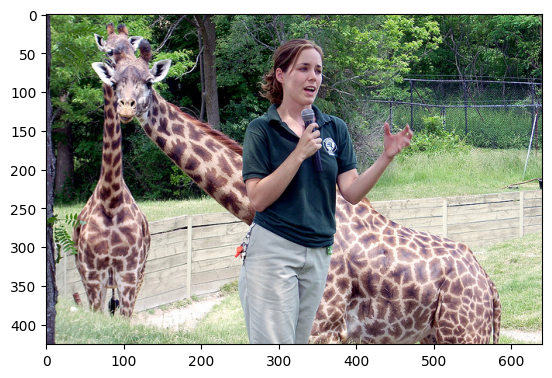

a giraffe standing in a field with a giraffe


'a giraffe standing in a field with a giraffe'

In [ ]:
# Generate a caption given a path
def generate_caption(photo, max_len=max_length):
    caption = ['startseq']

    for _ in range(max_len):
        tokens = [wordtoix[word] for word in caption if word in wordtoix]
        tokens_padded = pad_sequences([tokens], maxlen=max_len)
        predicted_word_index = np.argmax(model.predict([photo, tokens_padded], verbose=0))
        predicted_word = ixtoword[predicted_word_index]
        if predicted_word == 'endseq':
            break
        caption.append(predicted_word)
    processed_caption = caption[1:]
    if 'endseq' in processed_caption:
        processed_caption.remove('endseq')
    return ' '.join(processed_caption)

# Get a caption given a path
def get_caption(im_path):
    image = fetch_encoding(im_path)
    image = image.reshape((1, 2048))
    x=plt.imread(im_path)
    plt.imshow(x)
    plt.show()
    print(generate_caption(image))
    return generate_caption(image)

# Get example image
get_caption('/content/coco2017/train2017/000000266677.jpg')

In [ ]:
# Defining the directory path for validation images
folder_path = '/content/coco2017/val2017/'
image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]

# Constructing the full path for each image file
for image_file in image_files:
    image_path = os.path.join(folder_path, image_file)

# List to store generated captions for each image
all_captions = []

# Processing each image to generate captions
for image_file in tqdm(image_files):
    image_path = os.path.join(folder_path, image_file)
    temp_dict = dict()

    # Extracting image ID and encoding from image path
    image_id = int(str(image_path).split('.')[0].split('/')[-1].lstrip('0'))
    image = fetch_encoding(image_path)
    image = image.reshape((1, 2048))

    # Generating caption for the image
    image_caption = generate_caption(image)
    temp_dict["image_id"] = image_id
    temp_dict["caption"] = image_caption
    all_captions.append(temp_dict)

# Saving all generated captions to a JSON file
try:
    with open('/content/results.json', 'w') as f:
        json.dump(all_captions, f)
except:
    pass

# Defining paths for annotation and results files
annotation_file = '/content/coco2017/annotations/captions_val2017.json'
results_file = '/content/results.json'

# Evaluating generated captions against ground truth using COCO tools
coco = COCO(annotation_file)
coco_result = coco.loadRes(results_file)
coco_eval = COCOEvalCap(coco, coco_result)
coco_eval.evaluate()

# Displaying evaluation scores for various metrics
for metric, score in coco_eval.eval.items():
    print(f'{metric}: {score:.3f}')
